In [1]:
import os
import random
from PIL import Image
import numpy as np

# Set the paths to the folders
wiki_crops_folder = 'wiki_crop1'
image_texture_folder = 'old_texture'

output_folder = 'output_texture'
image_files = os.listdir(wiki_crops_folder)

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Process each image
for image_name in image_files:
    # Get the full path of the image
    image_path = os.path.join(wiki_crops_folder, image_name)

    # Extract the image name without the file extension
    image_name_without_extension = os.path.splitext(image_name)[0]

    # Select a random texture from image_texture
    texture_files = os.listdir(image_texture_folder)
    random_texture_name = random.choice(texture_files)
    random_texture_path = os.path.join(image_texture_folder, random_texture_name)

    # Open the image and texture
    image = Image.open(image_path)
    texture = Image.open(random_texture_path)

    # Resize the texture to match the size of the image
    texture = texture.resize(image.size)

    # Convert both images to RGB mode (if not already)
    image = image.convert("RGB")
    texture = texture.convert("RGB")

    # Blend the images using alpha blending
    blended_image = Image.blend(image, texture, alpha=0.5)

    # Save the blended image in the output folder
    blended_image.save(os.path.join(output_folder, f"{image_name_without_extension}.jpg"))


# Data Loader

In [2]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
image_size = 128
class TextureRemovalDataset(Dataset):
    def __init__(self, texture_folder, clear_folder, transform=None):
        self.texture_folder = texture_folder
        self.clear_folder = clear_folder
        self.texture_files = [os.path.join(texture_folder, f) for f in os.listdir(texture_folder)]
        self.clear_files = [os.path.join(clear_folder, f) for f in os.listdir(clear_folder)]
        self.transform = transform

    def __len__(self):
        return min(len(self.texture_files), len(self.clear_files))

    def __getitem__(self, idx):
        texture_path = self.texture_files[idx]
        clear_path = self.clear_files[idx]

        texture_img = Image.open(texture_path).convert("RGB")
        clear_img = Image.open(clear_path).convert("RGB")

        if self.transform:
            texture_img = self.transform(texture_img)
            clear_img = self.transform(clear_img)

        return texture_img, clear_img



# Set the paths to the folders
texture_folder = 'output_texture'
clear_folder = 'wiki_crop1'

# Define transforms
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

transform = transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

# Create datasets
train_dataset = TextureRemovalDataset(texture_folder, clear_folder, transform=transform)

# Create dataloaders
batch_size = 4
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)


# Displaying the sample of data

/tmp/ipykernel_121477/1238630095.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  real_img = np.transpose(torch.tensor(real_batch[i]).numpy(), (1, 2, 0))  # Convert tensor to numpy array and transpose dimensions
/tmp/ipykernel_121477/1238630095.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  fake_img = np.transpose(torch.tensor(fake_batch[i]).numpy(), (1, 2, 0))  # Convert tensor to numpy array and transpose dimensions


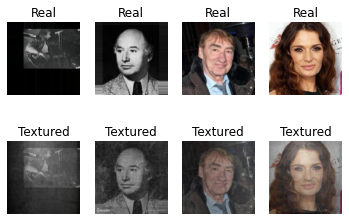

In [3]:
import matplotlib.pyplot as plt
import numpy as np

# Iterate over batches and visualize some samples
for batch in train_loader:
    fake_batch,real_batch = batch
    num_samples = min(len(real_batch), 8)  # Visualize up to 4 samples per batch
    for i in range(num_samples):
        # Ensure real_batch[i] and fake_batch[i] are tensors
        real_img = np.transpose(torch.tensor(real_batch[i]).numpy(), (1, 2, 0))  # Convert tensor to numpy array and transpose dimensions
        fake_img = np.transpose(torch.tensor(fake_batch[i]).numpy(), (1, 2, 0))  # Convert tensor to numpy array and transpose dimensions

        # Display real and fake images
        plt.subplot(2, num_samples, i + 1)
        plt.imshow((real_img + 1) / 2)  # Convert back from [-1, 1] to [0, 1] range for display
        plt.axis('off')
        plt.title('Real')

        plt.subplot(2, num_samples, num_samples + i + 1)
        plt.imshow((fake_img + 1) / 2)  # Convert back from [-1, 1] to [0, 1] range for display
        plt.axis('off')
        plt.title('Textured')

    plt.show()
    break  # Break after visualizing one batch


In [1]:
import torch
from torch import nn
from torch.nn import functional as F

import math

class SelfAttention(nn.Module):
    def __init__(self, n_heads, d_embed, in_proj_bias=True, out_proj_bias=True):
        super().__init__()
        # This combines the Wq, Wk and Wv matrices into one matrix
        self.in_proj = nn.Linear(d_embed, 3 * d_embed, bias=in_proj_bias)
        # This one represents the Wo matrix
        self.out_proj = nn.Linear(d_embed, d_embed, bias=out_proj_bias)
        self.n_heads = n_heads
        self.d_head = d_embed // n_heads

    def forward(self, x, causal_mask=False):
        # x: # (Batch_Size, Seq_Len, Dim)

        # (Batch_Size, Seq_Len, Dim)
        input_shape = x.shape 
        
        # (Batch_Size, Seq_Len, Dim)
        batch_size, sequence_length, d_embed = input_shape 

        # (Batch_Size, Seq_Len, H, Dim / H)
        interim_shape = (batch_size, sequence_length, self.n_heads, self.d_head) 

        # (Batch_Size, Seq_Len, Dim) -> (Batch_Size, Seq_Len, Dim * 3) -> 3 tensor of shape (Batch_Size, Seq_Len, Dim)
        q, k, v = self.in_proj(x).chunk(3, dim=-1)
        
        # (Batch_Size, Seq_Len, Dim) -> (Batch_Size, Seq_Len, H, Dim / H) -> (Batch_Size, H, Seq_Len, Dim / H)
        q = q.view(interim_shape).transpose(1, 2)
        k = k.view(interim_shape).transpose(1, 2)
        v = v.view(interim_shape).transpose(1, 2)

        # (Batch_Size, H, Seq_Len, Dim / H) @ (Batch_Size, H, Dim / H, Seq_Len) -> (Batch_Size, H, Seq_Len, Seq_Len)
        weight = q @ k.transpose(-1, -2)
        
        if causal_mask:
            # Mask where the upper triangle (above the principal diagonal) is 1
            mask = torch.ones_like(weight, dtype=torch.bool).triu(1) 
            # Fill the upper triangle with -inf
            weight.masked_fill_(mask, -torch.inf) 
        
        # Divide by d_k (Dim / H). 
        # (Batch_Size, H, Seq_Len, Seq_Len) -> (Batch_Size, H, Seq_Len, Seq_Len)
        weight /= math.sqrt(self.d_head) 

        # (Batch_Size, H, Seq_Len, Seq_Len) -> (Batch_Size, H, Seq_Len, Seq_Len)
        weight = F.softmax(weight, dim=-1) 

        # (Batch_Size, H, Seq_Len, Seq_Len) @ (Batch_Size, H, Seq_Len, Dim / H) -> (Batch_Size, H, Seq_Len, Dim / H)
        output = weight @ v

        # (Batch_Size, H, Seq_Len, Dim / H) -> (Batch_Size, Seq_Len, H, Dim / H)
        output = output.transpose(1, 2) 

        # (Batch_Size, Seq_Len, H, Dim / H) -> (Batch_Size, Seq_Len, Dim)
        output = output.reshape(input_shape) 

        # (Batch_Size, Seq_Len, Dim) -> (Batch_Size, Seq_Len, Dim)
        output = self.out_proj(output) 
        
        # (Batch_Size, Seq_Len, Dim)
        return output



In [2]:

class VAE_AttentionBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.groupnorm = nn.GroupNorm(32, channels)
        self.attention = SelfAttention(1, channels)
    
    def forward(self, x):
        # x: (Batch_Size, Features, Height, Width)

        residue = x 

        # (Batch_Size, Features, Height, Width) -> (Batch_Size, Features, Height, Width)
        x = self.groupnorm(x)

        n, c, h, w = x.shape
        
        # (Batch_Size, Features, Height, Width) -> (Batch_Size, Features, Height * Width)
        x = x.view((n, c, h * w))
        
        # (Batch_Size, Features, Height * Width) -> (Batch_Size, Height * Width, Features). Each pixel becomes a feature of size "Features", the sequence length is "Height * Width".
        x = x.transpose(-1, -2)
        
        # Perform self-attention WITHOUT mask
        # (Batch_Size, Height * Width, Features) -> (Batch_Size, Height * Width, Features)
        x = self.attention(x)
        
        # (Batch_Size, Height * Width, Features) -> (Batch_Size, Features, Height * Width)
        x = x.transpose(-1, -2)
        
        # (Batch_Size, Features, Height * Width) -> (Batch_Size, Features, Height, Width)
        x = x.view((n, c, h, w))
        
        # (Batch_Size, Features, Height, Width) + (Batch_Size, Features, Height, Width) -> (Batch_Size, Features, Height, Width) 
        x += residue

        # (Batch_Size, Features, Height, Width)
        return x 

class VAE_ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.groupnorm_1 = nn.GroupNorm(32, in_channels)
        self.conv_1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)

        self.groupnorm_2 = nn.GroupNorm(32, out_channels)
        self.conv_2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)

        if in_channels == out_channels:
            self.residual_layer = nn.Identity()
        else:
            self.residual_layer = nn.Conv2d(in_channels, out_channels, kernel_size=1, padding=0)
    
    def forward(self, x):
        # x: (Batch_Size, In_Channels, Height, Width)

        residue = x

        # (Batch_Size, In_Channels, Height, Width) -> (Batch_Size, In_Channels, Height, Width)
        x = self.groupnorm_1(x)
        
        # (Batch_Size, In_Channels, Height, Width) -> (Batch_Size, In_Channels, Height, Width)
        x = nn.SiLU()(x)
        
        # (Batch_Size, In_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x = self.conv_1(x)
        
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x = self.groupnorm_2(x)
        
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x = nn.SiLU()(x)
        
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        x = self.conv_2(x)
        
        # (Batch_Size, Out_Channels, Height, Width) -> (Batch_Size, Out_Channels, Height, Width)
        return x + self.residual_layer(residue)

In [3]:

class VAE_Encoder(nn.Sequential):
    def __init__(self):
        super().__init__(
            # (Batch_Size, Channel, Height, Width) -> (Batch_Size, 128, Height, Width)
            nn.Conv2d(3, 128, kernel_size=3, padding=1),
            
             # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            VAE_ResidualBlock(128, 128),
            
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            VAE_ResidualBlock(128, 128),
            
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, [Height-3 / 2]+1, [Width-3 / 2]+1)
            nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=0),
            
            # (Batch_Size, 128, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 2, Width / 2)
            VAE_ResidualBlock(128, 256), 
            
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 2, Width / 2)
            VAE_ResidualBlock(256, 256), 
            
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 4, Width / 4)
            nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=0), 
            
            # (Batch_Size, 256, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            VAE_ResidualBlock(256, 512), 
            
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=0), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_AttentionBlock(512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.GroupNorm(32, 512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.SiLU(), 

            # Because the padding=1, it means the width and height will increase by 2
            # Out_Height = In_Height + Padding_Top + Padding_Bottom
            # Out_Width = In_Width + Padding_Left + Padding_Right
            # Since padding = 1 means Padding_Top = Padding_Bottom = Padding_Left = Padding_Right = 1,
            # Since the Out_Width = In_Width + 2 (same for Out_Height), it will compensate for the Kernel size of 3
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 8, Height / 8, Width / 8). 
            nn.Conv2d(512, 8, kernel_size=3, padding=1), 

            # (Batch_Size, 8, Height / 8, Width / 8) -> (Batch_Size, 8, Height / 8, Width / 8)
            nn.Conv2d(8, 8, kernel_size=1, padding=0), 
        )

    def forward(self, x):
        # x: (Batch_Size, Channel, Height, Width)
        # noise: (Batch_Size, 4, Height / 8, Width / 8)

        for module in self:

            if getattr(module, 'stride', None) == (2, 2):  # Padding at downsampling should be asymmetric (see #8)
                # Pad: (Padding_Left, Padding_Right, Padding_Top, Padding_Bottom).
                # Pad with zeros on the right and bottom.
                # (Batch_Size, Channel, Height, Width) -> (Batch_Size, Channel, Height + Padding_Top + Padding_Bottom, Width + Padding_Left + Padding_Right) = (Batch_Size, Channel, Height + 1, Width + 1)
                x = F.pad(x, (0, 1, 0, 1))
            
            x = module(x)
        # (Batch_Size, 8, Height / 8, Width / 8) -> two tensors of shape (Batch_Size, 4, Height / 8, Width / 8)
        mean, log_variance = torch.chunk(x, 2, dim=1)
        # Clamp the log variance between -30 and 20, so that the variance is between (circa) 1e-14 and 1e8. 
        # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
        log_variance = torch.clamp(log_variance, -30, 20)

        
        return mean, log_variance

In [4]:

class VAE_Decoder(nn.Sequential):
    def __init__(self):
        super().__init__(
            # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 4, Height / 8, Width / 8)
            nn.Conv2d(4, 4, kernel_size=1, padding=0),

            # (Batch_Size, 4, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            nn.Conv2d(4, 512, kernel_size=3, padding=1),
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_AttentionBlock(512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 8, Width / 8)
            VAE_ResidualBlock(512, 512), 
            
            # Repeats the rows and columns of the data by scale_factor (like when you resize an image by doubling its size).
            # (Batch_Size, 512, Height / 8, Width / 8) -> (Batch_Size, 512, Height / 4, Width / 4)
            nn.Upsample(scale_factor=2),
            
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            nn.Conv2d(512, 512, kernel_size=3, padding=1), 
            
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 4, Width / 4)
            VAE_ResidualBlock(512, 512), 
            
            # (Batch_Size, 512, Height / 4, Width / 4) -> (Batch_Size, 512, Height / 2, Width / 2)
            nn.Upsample(scale_factor=2), 
            
            # (Batch_Size, 512, Height / 2, Width / 2) -> (Batch_Size, 512, Height / 2, Width / 2)
            nn.Conv2d(512, 512, kernel_size=3, padding=1), 
            
            # (Batch_Size, 512, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 2, Width / 2)
            VAE_ResidualBlock(512, 256), 
            
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 2, Width / 2)
            VAE_ResidualBlock(256, 256), 
            
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height / 2, Width / 2)
            VAE_ResidualBlock(256, 256), 
            
            # (Batch_Size, 256, Height / 2, Width / 2) -> (Batch_Size, 256, Height, Width)
            nn.Upsample(scale_factor=2), 
            
            # (Batch_Size, 256, Height, Width) -> (Batch_Size, 256, Height, Width)
            nn.Conv2d(256, 256, kernel_size=3, padding=1), 
            
            # (Batch_Size, 256, Height, Width) -> (Batch_Size, 128, Height, Width)
            VAE_ResidualBlock(256, 128), 
            
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            VAE_ResidualBlock(128, 128), 
            
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            VAE_ResidualBlock(128, 128), 
            
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            nn.GroupNorm(32, 128), 
            
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 128, Height, Width)
            nn.SiLU(), 
            
            # (Batch_Size, 128, Height, Width) -> (Batch_Size, 3, Height, Width)
            nn.Conv2d(128, 3, kernel_size=3, padding=1), 
        )

    def forward(self, x):
        # x: (Batch_Size, 4, Height / 8, Width / 8)

        for module in self:
            x = module(x)

        # (Batch_Size, 3, Height, Width)
        return x

In [5]:
class VAE_NET(nn.Module):
    def __init__(self, encoder, decoder):
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder
        
    def reparameterize(self, mean, std_dev):
        # Sample from the normal distribution with mean and std deviation
        eps = torch.randn_like(std_dev)
        return mean + eps * std_dev    

    def forward(self, x):
        # Forward pass through the encoder to get mean and std deviation
        mean, log_variance = self.encoder(x)
        
        variance = log_variance.exp()
        stdev = variance.sqrt()
        
        # Sample from the distribution defined by mean and std deviation
        latent_space = self.reparameterize(mean, stdev)
        
        # Forward pass through the decoder
        reconstructed_x = self.decoder(latent_space)
        
        return reconstructed_x,mean, log_variance

In [6]:
encoder = VAE_Encoder()
decoder = VAE_Decoder()
# Create VAE_NET instance
vae_net = VAE_NET(encoder, decoder)

In [7]:
import torch.quantization as quant

# Define the quantization configuration for QAT
quant_config = torch.quantization.get_default_qat_qconfig('fbgemm')

# Prepare the model for quantization-aware training (QAT)
quantized_model = quant.prepare_qat(vae_net, inplace=True)


/home/lang_chain/anaconda3/lib/python3.9/site-packages/torch/ao/quantization/quantize.py:310: UserWarning: None of the submodule got qconfig applied. Make sure you passed correct configuration through `qconfig_dict` or by assigning the `.qconfig` attribute directly on submodules
  warnings.warn("None of the submodule got qconfig applied. Make sure you "


In [8]:
import os
import torch
from torchvision.datasets import ImageFolder
from torchvision.transforms import transforms
from torch.utils.data import DataLoader, random_split
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torch.nn import functional as F
import torchvision.models as models
import pandas as pd

In [9]:
quantized_model.to('cuda')

VAE_NET(
  (encoder): VAE_Encoder(
    (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): VAE_ResidualBlock(
      (groupnorm_1): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (groupnorm_2): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (residual_layer): Identity()
    )
    (2): VAE_ResidualBlock(
      (groupnorm_1): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (groupnorm_2): GroupNorm(32, 128, eps=1e-05, affine=True)
      (conv_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (residual_layer): Identity()
    )
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
    (4): VAE_ResidualBlock(
      (groupnorm_1): GroupNorm(32, 128, eps=1e-05, affine=True)
      (

In [13]:
class Discriminator(nn.Module):
    r"""
    PatchGAN Discriminator.
    Rather than taking IMG_CHANNELSxIMG_HxIMG_W all the way to
    1 scalar value , we instead predict grid of values.
    Where each grid is prediction of how likely
    the discriminator thinks that the image patch corresponding
    to the grid cell is real
    """
    
    def __init__(self, im_channels=3,
                 conv_channels=[64, 128, 256],
                 kernels=[4,4,4,4],
                 strides=[2,2,2,1],
                 paddings=[1,1,1,1]):
        super().__init__()
        self.im_channels = im_channels
        activation = nn.LeakyReLU(0.2)
        layers_dim = [self.im_channels] + conv_channels + [1]
        self.layers = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(layers_dim[i], layers_dim[i + 1],
                          kernel_size=kernels[i],
                          stride=strides[i],
                          padding=paddings[i],
                          bias=False if i !=0 else True),
                nn.BatchNorm2d(layers_dim[i + 1]) if i != len(layers_dim) - 2 and i != 0 else nn.Identity(),
                activation if i != len(layers_dim) - 2 else nn.Identity()
            )
            for i in range(len(layers_dim) - 1)
        ])
    
    def forward(self, x):
        out = x
        for layer in self.layers:
            out = layer(out)
        return out
    

discriminator = Discriminator(im_channels=3).to('cuda')

In [14]:
optimizer_g = optim.Adam(quantized_model.parameters(), lr= 0.00001)
optimizer_d = torch.optim.Adam(discriminator.parameters(), lr= 0.00001, betas=(0.5, 0.999))

In [15]:
from torch.nn.utils import clip_grad_norm_
max_grad_norm = 1.0
clip_grad_norm_(quantized_model.parameters(), max_grad_norm)
clip_grad_norm_(discriminator.parameters(), max_grad_norm)

tensor(0.)

In [16]:
disc_criterion = torch.nn.MSELoss()

In [17]:
def calculate_accuracy(reconstructed_x, original_x):
    """
    Calculate accuracy based on how close the reconstructed images are to the original images.
    
    Args:
    - reconstructed_x (torch.Tensor): Reconstructed images from the VAE.
    - original_x (torch.Tensor): Original images used for training.
    
    Returns:
    - accuracy (float): Accuracy based on some comparison criteria.
    """
    # Assuming binary pixel values, you can calculate accuracy based on pixel-wise comparison
    num_pixels = original_x.numel()
    correct_pixels = torch.sum(torch.abs(reconstructed_x - original_x) < 0.5)  # Adjust threshold as needed
    
    accuracy = correct_pixels / num_pixels
    return accuracy.item()

In [18]:
recon_criterion = torch.nn.MSELoss()
disc_criterion = torch.nn.MSELoss()

In [19]:
def total_variation_loss(images):
    # Compute the total variation regularization term
    d_x = images[:, :, 1:, :] - images[:, :, :-1, :]  # Horizontal differences
    d_y = images[:, :, :, 1:] - images[:, :, :, :-1]  # Vertical differences
    tv_loss = torch.sum(torch.abs(d_x)) + torch.sum(torch.abs(d_y))  # Total variation loss

    return tv_loss

In [20]:
from tqdm import tqdm
import torchvision
from torchvision.utils import make_grid
from torch.utils.tensorboard import SummaryWriter
from torchmetrics.functional.image.lpips import learned_perceptual_image_patch_similarity
# Initialize SummaryWriter
writer = SummaryWriter(log_dir='logs_reconstruct')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

w_l2 = 1  # Weight for L2 loss
w_adversarial = 1  # Weight for adversarial loss
w_smooth = 1
image_save_steps = 64
img_save_count = 0
for epoch_idx in range(30):
    recon_losses = []

    perceptual_losses = []
    disc_losses = []
    gen_losses = []
    losses = []
    kl_losses = []
        
    optimizer_g.zero_grad()
    optimizer_d.zero_grad()
    acc_steps = 4
    step_count = 0
    disc_step_start = 14000
    # lpips_model = LPIPS().eval().to(device)


    optimizer_d.zero_grad()
    for batch_idx, batch in enumerate(tqdm(train_loader)):
        step_count += 1
        fake_batch,real_batch = batch
        im = fake_batch.float().to(device)
        real_image = real_batch.float().to(device)
        
        # Fetch autoencoders output(reconstructions)
        output, mean, log_variance = quantized_model(im)
        grid_reconstructed = make_grid(output)
        grid_original = make_grid(real_image)

        # Write reconstructed and original images to TensorBoard
        writer.add_image('Reconstructed Image', grid_reconstructed, global_step=epoch_idx)
        writer.add_image('Original Image', grid_original, global_step=epoch_idx)

        # Image Saving Logic
        if step_count % image_save_steps == 0 or step_count == 1:
            sample_size = min(8, im.shape[0])
            save_output = torch.clamp(output[:sample_size], -1., 1.).detach().cpu()
            save_output = ((save_output + 1) / 2)
            save_input = ((im[:sample_size] + 1) / 2).detach().cpu()

            grid = make_grid(torch.cat([save_input, save_output], dim=0), nrow=sample_size)
            img = torchvision.transforms.ToPILImage()(grid)
            img.save(os.path.join('image','VAE',
                        'current_VAE_sample_{}.png'.format(img_save_count)))
            img_save_count += 1
            img.close()
            
        ######### Optimize Generator ##########
        # L2 Loss
        recon_loss = recon_criterion(output, real_image) 
        recon_losses.append(recon_loss.item())
        recon_loss = recon_loss / acc_steps
        g_loss= w_l2*recon_loss #adding some weights
        
#         #smoothing loss
#         smooth_loss = total_variation_loss(output)
        
#         #adding it up
#         g_loss+=w_smooth*smooth_loss
    
        # Adversarial loss only if disc_step_start steps passed
        if step_count > disc_step_start:
            disc_fake_pred = discriminator(output)
            disc_fake_loss = disc_criterion(disc_fake_pred,
                            torch.ones(disc_fake_pred.shape,
                            device=disc_fake_pred.device))
            gen_losses.append(1 * disc_fake_loss.item())
            g_loss += w_adversarial* disc_fake_loss / acc_steps

        img1 = 2 * (output - output.min()) / (output.max() - output.min()) - 1 # Scale to [-1, 1]
        #img2 = (images / 127.5) - 1  # Scale to [-1, 1]
        
        lpips_loss = torch.mean(learned_perceptual_image_patch_similarity(img1, real_image, net_type='vgg'))/acc_steps
        perceptual_losses.append(1 * lpips_loss.item())
        g_loss += 1*lpips_loss / acc_steps
        losses.append(g_loss.item())
        g_loss.backward()


        ######### Optimize Discriminator #######
        if step_count > disc_step_start:
            fake = output
            disc_fake_pred = discriminator(fake.detach())
            disc_real_pred = discriminator(real_image)
            disc_fake_loss = disc_criterion(disc_fake_pred,
                                        torch.zeros(disc_fake_pred.shape,
                                        device=disc_fake_pred.device))
            disc_real_loss = disc_criterion(disc_real_pred,
                                        torch.ones(disc_real_pred.shape,
                                        device=disc_real_pred.device))
            disc_loss = 1* (disc_fake_loss + disc_real_loss) / 2
            disc_losses.append(disc_loss.item())
            disc_loss = disc_loss / acc_steps
            disc_loss.backward()
            if step_count % acc_steps == 0:
                optimizer_d.step()
                optimizer_d.zero_grad()
                #####################################

            if step_count % acc_steps == 0:
                optimizer_g.step()
                optimizer_g.zero_grad()

        optimizer_d.step()
        optimizer_d.zero_grad()
        optimizer_g.step()
        optimizer_g.zero_grad()
        if len(disc_losses) > 0:
            print(
                'Running epoch: {} | Recon Loss : {:.4f}  | '
                ' G Loss : {:.4f} | D Loss {:.4f}'.
                format(epoch_idx + 1,
                    np.mean(recon_losses),
                    np.mean(gen_losses),
                    np.mean(disc_losses)))
        else:
            print('Running epoch: {} | Recon Loss : {:.4f}'.
                format(epoch_idx + 1,
                        np.mean(recon_losses)))

        torch.save(quantized_model.state_dict(), 'texture_removel_model.pth')
        torch.save(discriminator.state_dict(), 'texture_removel_generator.pth')
    print('Done Training...')
writer.close()    

2024-04-17 18:28:06.591025: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-17 18:28:07.269275: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
  0%|                                                 | 0/15583 [00:00<?, ?it/s]

Running epoch: 1 | Recon Loss : 0.4784


  0%|                                      | 1/15583 [00:02<10:05:10,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.4135


  0%|                                       | 2/15583 [00:04<9:36:35,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.4331


  0%|                                       | 3/15583 [00:06<9:18:19,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.4535


  0%|                                       | 4/15583 [00:08<8:28:55,  1.96s/it]

Running epoch: 1 | Recon Loss : 0.4412


  0%|                                       | 5/15583 [00:09<8:01:37,  1.86s/it]

Running epoch: 1 | Recon Loss : 0.4654


  0%|                                       | 6/15583 [00:11<7:59:36,  1.85s/it]

Running epoch: 1 | Recon Loss : 0.4578


  0%|                                       | 7/15583 [00:13<7:49:22,  1.81s/it]

Running epoch: 1 | Recon Loss : 0.4466


  0%|                                       | 8/15583 [00:15<7:42:30,  1.78s/it]

Running epoch: 1 | Recon Loss : 0.4264


  0%|                                       | 9/15583 [00:16<7:37:21,  1.76s/it]

Running epoch: 1 | Recon Loss : 0.4354


  0%|                                      | 10/15583 [00:18<7:34:56,  1.75s/it]

Running epoch: 1 | Recon Loss : 0.4398


  0%|                                      | 11/15583 [00:20<7:28:37,  1.73s/it]

Running epoch: 1 | Recon Loss : 0.4321


  0%|                                      | 12/15583 [00:22<7:32:27,  1.74s/it]

Running epoch: 1 | Recon Loss : 0.4195


  0%|                                      | 13/15583 [00:23<7:30:50,  1.74s/it]

Running epoch: 1 | Recon Loss : 0.4063


  0%|                                      | 14/15583 [00:25<7:27:58,  1.73s/it]

Running epoch: 1 | Recon Loss : 0.3955


  0%|                                      | 15/15583 [00:27<7:24:29,  1.71s/it]

Running epoch: 1 | Recon Loss : 0.3949


  0%|                                      | 16/15583 [00:28<7:28:14,  1.73s/it]

Running epoch: 1 | Recon Loss : 0.3834


  0%|                                      | 17/15583 [00:30<7:24:55,  1.71s/it]

Running epoch: 1 | Recon Loss : 0.3812


  0%|                                      | 18/15583 [00:32<7:25:51,  1.72s/it]

Running epoch: 1 | Recon Loss : 0.3748


  0%|                                      | 19/15583 [00:34<7:27:46,  1.73s/it]

Running epoch: 1 | Recon Loss : 0.3668


  0%|                                      | 20/15583 [00:35<7:22:01,  1.70s/it]

Running epoch: 1 | Recon Loss : 0.3592


  0%|                                      | 21/15583 [00:37<7:29:12,  1.73s/it]

Running epoch: 1 | Recon Loss : 0.3552


  0%|                                      | 22/15583 [00:39<7:28:43,  1.73s/it]

Running epoch: 1 | Recon Loss : 0.3576


  0%|                                      | 23/15583 [00:40<7:25:25,  1.72s/it]

Running epoch: 1 | Recon Loss : 0.3556


  0%|                                      | 24/15583 [00:42<7:30:48,  1.74s/it]

Running epoch: 1 | Recon Loss : 0.3496


  0%|                                      | 25/15583 [00:44<7:31:01,  1.74s/it]

Running epoch: 1 | Recon Loss : 0.3458


  0%|                                      | 26/15583 [00:46<7:55:08,  1.83s/it]

Running epoch: 1 | Recon Loss : 0.3428


  0%|                                      | 27/15583 [00:48<8:02:28,  1.86s/it]

Running epoch: 1 | Recon Loss : 0.3411


  0%|                                      | 28/15583 [00:50<8:35:09,  1.99s/it]

Running epoch: 1 | Recon Loss : 0.3418


  0%|                                      | 29/15583 [00:52<8:55:52,  2.07s/it]

Running epoch: 1 | Recon Loss : 0.3383


  0%|                                      | 30/15583 [00:55<8:54:31,  2.06s/it]

Running epoch: 1 | Recon Loss : 0.3340


  0%|                                      | 31/15583 [00:57<9:00:53,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.3296


  0%|                                     | 32/15583 [01:04<15:59:47,  3.70s/it]

Running epoch: 1 | Recon Loss : 0.3252


  0%|                                     | 33/15583 [01:12<21:34:24,  4.99s/it]

Running epoch: 1 | Recon Loss : 0.3210


  0%|                                     | 34/15583 [01:17<21:23:44,  4.95s/it]

Running epoch: 1 | Recon Loss : 0.3178


  0%|                                     | 35/15583 [01:20<18:21:11,  4.25s/it]

Running epoch: 1 | Recon Loss : 0.3163


  0%|                                     | 36/15583 [01:22<15:17:52,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.3171


  0%|                                     | 37/15583 [01:24<13:44:20,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.3185


  0%|                                     | 38/15583 [01:26<12:13:31,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.3162


  0%|                                     | 39/15583 [01:28<11:10:39,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.3132


  0%|                                     | 40/15583 [01:30<10:10:04,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.3090


  0%|                                      | 41/15583 [01:32<9:59:39,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.3091


  0%|                                      | 42/15583 [01:34<9:51:58,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.3072


  0%|                                      | 43/15583 [01:36<9:36:01,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.3051


  0%|                                      | 44/15583 [01:38<9:28:10,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.3039


  0%|                                      | 45/15583 [01:40<9:19:48,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.3048


  0%|                                      | 46/15583 [01:43<9:29:20,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.3037


  0%|                                      | 47/15583 [01:45<9:31:47,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.3002


  0%|                                      | 48/15583 [01:47<9:19:00,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.2990


  0%|                                      | 49/15583 [01:49<9:01:17,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.2963


  0%|                                      | 50/15583 [01:51<8:47:22,  2.04s/it]

Running epoch: 1 | Recon Loss : 0.2941


  0%|                                     | 51/15583 [01:55<10:57:16,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.2923


  0%|                                     | 52/15583 [01:57<10:36:19,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.2907


  0%|▏                                    | 53/15583 [01:59<10:04:52,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.2895


  0%|▏                                     | 54/15583 [02:01<9:56:41,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.2871


  0%|▏                                     | 55/15583 [02:03<9:49:37,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.2864


  0%|▏                                     | 56/15583 [02:05<9:24:58,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.2847


  0%|▏                                    | 57/15583 [02:09<11:07:25,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.2836


  0%|▏                                    | 58/15583 [02:11<10:37:35,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.2810


  0%|▏                                    | 59/15583 [02:13<10:08:00,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.2793


  0%|▏                                     | 60/15583 [02:15<9:52:58,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.2784


  0%|▏                                     | 61/15583 [02:17<9:35:49,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.2780


  0%|▏                                     | 62/15583 [02:19<9:31:21,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.2794


  0%|▏                                    | 63/15583 [02:22<10:12:24,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.2780


  0%|▏                                    | 64/15583 [02:25<10:14:31,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.2773


  0%|▏                                     | 65/15583 [02:27<9:59:17,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.2759


  0%|▏                                     | 66/15583 [02:29<9:39:18,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.2745


  0%|▏                                     | 67/15583 [02:31<9:40:45,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.2748


  0%|▏                                     | 68/15583 [02:33<9:38:11,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.2730


  0%|▏                                     | 69/15583 [02:35<9:30:45,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.2716


  0%|▏                                    | 70/15583 [02:42<15:02:52,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.2694


  0%|▏                                    | 71/15583 [02:44<13:05:36,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.2674


  0%|▏                                    | 72/15583 [02:46<12:04:39,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.2665


  0%|▏                                    | 73/15583 [02:49<11:31:20,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.2644


  0%|▏                                    | 74/15583 [02:52<13:05:44,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.2632


  0%|▏                                    | 75/15583 [02:55<12:36:40,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.2613


  0%|▏                                    | 76/15583 [02:57<11:41:39,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.2597


  0%|▏                                    | 77/15583 [03:00<11:01:21,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.2586


  1%|▏                                    | 78/15583 [03:02<10:31:54,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.2564


  1%|▏                                    | 79/15583 [03:04<10:13:27,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.2564


  1%|▏                                     | 80/15583 [03:06<9:33:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.2556


  1%|▏                                     | 81/15583 [03:08<8:58:28,  2.08s/it]

Running epoch: 1 | Recon Loss : 0.2553


  1%|▏                                     | 82/15583 [03:09<8:42:45,  2.02s/it]

Running epoch: 1 | Recon Loss : 0.2540


  1%|▏                                     | 83/15583 [03:12<9:11:07,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.2530


  1%|▏                                     | 84/15583 [03:14<9:05:45,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.2523


  1%|▏                                     | 85/15583 [03:16<9:11:51,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.2517


  1%|▏                                     | 86/15583 [03:18<9:25:42,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.2512


  1%|▏                                     | 87/15583 [03:20<9:18:36,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.2504


  1%|▏                                    | 88/15583 [03:23<10:24:25,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.2491


  1%|▏                                    | 89/15583 [03:26<10:19:10,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.2484


  1%|▏                                    | 90/15583 [03:28<10:16:39,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.2476


  1%|▏                                    | 91/15583 [03:31<10:50:59,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.2465


  1%|▏                                    | 92/15583 [03:33<10:36:37,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.2454


  1%|▏                                    | 93/15583 [03:36<11:25:41,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.2465


  1%|▏                                    | 94/15583 [03:39<11:36:08,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.2456


  1%|▏                                    | 95/15583 [03:41<10:59:11,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.2455


  1%|▏                                    | 96/15583 [03:44<10:29:53,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.2465


  1%|▏                                     | 97/15583 [03:46<9:48:15,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.2458


  1%|▏                                     | 98/15583 [03:48<9:49:35,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.2454


  1%|▏                                     | 99/15583 [03:50<9:50:58,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.2449


  1%|▏                                    | 100/15583 [03:52<9:44:01,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.2439


  1%|▏                                    | 101/15583 [03:55<9:40:12,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.2427


  1%|▏                                   | 102/15583 [03:57<10:09:22,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.2421


  1%|▏                                   | 103/15583 [04:00<10:16:35,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.2413


  1%|▏                                   | 104/15583 [04:02<10:01:17,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.2407


  1%|▏                                    | 105/15583 [04:04<9:44:22,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.2402


  1%|▎                                    | 106/15583 [04:06<9:29:51,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.2389


  1%|▎                                    | 107/15583 [04:08<9:39:50,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.2380


  1%|▎                                    | 108/15583 [04:11<9:33:03,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.2366


  1%|▎                                    | 109/15583 [04:13<9:35:19,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.2359


  1%|▎                                    | 110/15583 [04:15<9:41:22,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.2347


  1%|▎                                    | 111/15583 [04:17<9:25:11,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.2333


  1%|▎                                    | 112/15583 [04:19<9:33:48,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.2329


  1%|▎                                    | 113/15583 [04:22<9:40:46,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.2322


  1%|▎                                    | 114/15583 [04:24<9:14:24,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.2315


  1%|▎                                    | 115/15583 [04:26<8:54:48,  2.07s/it]

Running epoch: 1 | Recon Loss : 0.2305


  1%|▎                                    | 116/15583 [04:28<9:01:18,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.2296


  1%|▎                                    | 117/15583 [04:30<8:54:16,  2.07s/it]

Running epoch: 1 | Recon Loss : 0.2286


  1%|▎                                    | 118/15583 [04:32<9:13:32,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.2281


  1%|▎                                    | 119/15583 [04:34<9:20:10,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.2276


  1%|▎                                   | 120/15583 [04:38<10:45:19,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.2271


  1%|▎                                   | 121/15583 [04:40<11:13:49,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.2264


  1%|▎                                   | 122/15583 [04:43<10:58:20,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.2254


  1%|▎                                   | 123/15583 [04:45<10:14:38,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.2245


  1%|▎                                   | 124/15583 [04:47<10:10:23,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.2236


  1%|▎                                   | 125/15583 [04:50<11:13:36,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.2230


  1%|▎                                   | 126/15583 [04:55<13:50:19,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.2227


  1%|▎                                   | 127/15583 [04:57<12:15:35,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.2217


  1%|▎                                   | 128/15583 [04:59<11:38:01,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.2212


  1%|▎                                   | 129/15583 [05:01<10:49:39,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.2204


  1%|▎                                   | 130/15583 [05:04<10:23:46,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.2198


  1%|▎                                    | 131/15583 [05:05<9:35:19,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.2194


  1%|▎                                    | 132/15583 [05:07<9:16:42,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.2186


  1%|▎                                    | 133/15583 [05:10<9:34:21,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.2178


  1%|▎                                    | 134/15583 [05:12<9:35:12,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.2169


  1%|▎                                    | 135/15583 [05:14<9:31:59,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.2170


  1%|▎                                    | 136/15583 [05:16<9:23:30,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.2163


  1%|▎                                    | 137/15583 [05:18<8:51:22,  2.06s/it]

Running epoch: 1 | Recon Loss : 0.2156


  1%|▎                                    | 138/15583 [05:20<9:01:36,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.2150


  1%|▎                                    | 139/15583 [05:23<9:07:50,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.2145


  1%|▎                                    | 140/15583 [05:25<9:14:49,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.2142


  1%|▎                                   | 141/15583 [05:28<10:22:46,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.2144


  1%|▎                                    | 142/15583 [05:30<9:54:30,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.2136


  1%|▎                                    | 143/15583 [05:32<9:54:24,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.2133


  1%|▎                                    | 144/15583 [05:34<9:48:21,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.2130


  1%|▎                                   | 145/15583 [05:37<10:34:21,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.2127


  1%|▎                                   | 146/15583 [05:40<10:20:49,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.2121


  1%|▎                                    | 147/15583 [05:41<9:40:50,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.2115


  1%|▎                                    | 148/15583 [05:44<9:23:20,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.2112


  1%|▎                                   | 149/15583 [05:46<10:23:29,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.2108


  1%|▎                                   | 150/15583 [05:49<10:05:56,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.2107


  1%|▎                                    | 151/15583 [05:51<9:53:02,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.2105


  1%|▎                                    | 152/15583 [05:53<9:51:07,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.2102


  1%|▎                                    | 153/15583 [05:55<9:51:13,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.2097


  1%|▎                                    | 154/15583 [05:58<9:41:55,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.2096


  1%|▎                                    | 155/15583 [06:00<9:33:05,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.2087


  1%|▎                                    | 156/15583 [06:02<9:38:40,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.2085


  1%|▎                                    | 157/15583 [06:04<9:37:54,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.2082


  1%|▍                                    | 158/15583 [06:06<9:32:39,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.2082


  1%|▍                                    | 159/15583 [06:09<9:32:12,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.2081


  1%|▍                                    | 160/15583 [06:11<9:27:54,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.2080


  1%|▍                                    | 161/15583 [06:13<9:31:06,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.2076


  1%|▍                                    | 162/15583 [06:16<9:47:45,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.2075


  1%|▍                                   | 163/15583 [06:19<10:46:24,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.2070


  1%|▍                                   | 164/15583 [06:21<10:37:21,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.2066


  1%|▍                                   | 165/15583 [06:23<10:15:48,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.2062


  1%|▍                                   | 166/15583 [06:25<10:00:10,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.2059


  1%|▍                                    | 167/15583 [06:27<9:35:00,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.2060


  1%|▍                                    | 168/15583 [06:29<8:59:31,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.2056


  1%|▍                                    | 169/15583 [06:32<9:22:04,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.2053


  1%|▍                                    | 170/15583 [06:34<9:22:06,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.2052


  1%|▍                                    | 171/15583 [06:36<9:14:27,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.2051


  1%|▍                                    | 172/15583 [06:38<9:36:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.2051


  1%|▍                                   | 173/15583 [06:41<10:03:32,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.2054


  1%|▍                                   | 174/15583 [06:43<10:12:05,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.2054


  1%|▍                                    | 175/15583 [06:45<9:44:08,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.2046


  1%|▍                                    | 176/15583 [06:47<9:05:51,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.2043


  1%|▍                                    | 177/15583 [06:49<9:07:55,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.2037


  1%|▍                                    | 178/15583 [06:52<9:16:59,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.2032


  1%|▍                                    | 179/15583 [06:53<8:39:09,  2.02s/it]

Running epoch: 1 | Recon Loss : 0.2028


  1%|▍                                    | 180/15583 [06:56<9:19:34,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.2023


  1%|▍                                    | 181/15583 [06:58<9:19:00,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.2022


  1%|▍                                    | 182/15583 [07:00<9:24:39,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.2021


  1%|▍                                    | 183/15583 [07:02<9:25:52,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.2016


  1%|▍                                    | 184/15583 [07:05<9:27:16,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.2017


  1%|▍                                    | 185/15583 [07:07<9:13:22,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.2018


  1%|▍                                    | 186/15583 [07:09<8:51:31,  2.07s/it]

Running epoch: 1 | Recon Loss : 0.2018


  1%|▍                                    | 187/15583 [07:11<8:58:48,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.2014


  1%|▍                                    | 188/15583 [07:13<9:14:28,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.2014


  1%|▍                                    | 189/15583 [07:15<9:19:36,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.2011


  1%|▍                                    | 190/15583 [07:18<9:25:51,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.2007


  1%|▍                                    | 191/15583 [07:20<9:20:11,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.2004


  1%|▍                                    | 192/15583 [07:22<9:29:46,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1996


  1%|▍                                    | 193/15583 [07:24<9:27:22,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1994


  1%|▍                                    | 194/15583 [07:26<9:17:48,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1991


  1%|▍                                    | 195/15583 [07:29<9:43:16,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1990


  1%|▍                                   | 196/15583 [07:33<11:40:07,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1987


  1%|▍                                   | 197/15583 [07:35<10:57:46,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1982


  1%|▍                                   | 198/15583 [07:37<10:11:35,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1986


  1%|▍                                   | 199/15583 [07:39<10:15:01,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1985


  1%|▍                                    | 200/15583 [07:41<9:51:40,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1978


  1%|▍                                    | 201/15583 [07:43<9:04:35,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.1977


  1%|▍                                    | 202/15583 [07:45<9:13:28,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.1971


  1%|▍                                    | 203/15583 [07:47<9:10:16,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.1970


  1%|▍                                    | 204/15583 [07:50<9:36:44,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1966


  1%|▍                                   | 205/15583 [07:52<10:01:27,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1964


  1%|▍                                    | 206/15583 [07:55<9:54:27,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1962


  1%|▍                                    | 207/15583 [07:57<9:41:46,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1956


  1%|▍                                    | 208/15583 [07:59<9:44:21,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1954


  1%|▍                                    | 209/15583 [08:01<9:39:34,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1951


  1%|▍                                    | 210/15583 [08:03<9:33:33,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1945


  1%|▍                                   | 211/15583 [08:06<10:25:42,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1941


  1%|▍                                   | 212/15583 [08:09<10:20:54,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1938


  1%|▌                                    | 213/15583 [08:11<9:59:27,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1936


  1%|▌                                    | 214/15583 [08:13<9:42:36,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1930


  1%|▌                                    | 215/15583 [08:15<9:04:17,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.1928


  1%|▌                                    | 216/15583 [08:17<9:29:26,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1922


  1%|▌                                    | 217/15583 [08:20<9:32:35,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1919


  1%|▌                                    | 218/15583 [08:22<9:26:49,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1916


  1%|▌                                    | 219/15583 [08:24<9:33:30,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1913


  1%|▌                                    | 220/15583 [08:26<9:28:16,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1911


  1%|▌                                    | 221/15583 [08:28<9:11:13,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.1907


  1%|▌                                    | 222/15583 [08:31<9:34:05,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1904


  1%|▌                                    | 223/15583 [08:33<9:30:34,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1902


  1%|▌                                    | 224/15583 [08:35<9:31:50,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1902


  1%|▌                                    | 225/15583 [08:37<9:30:31,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1900


  1%|▌                                    | 226/15583 [08:39<9:28:24,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1897


  1%|▌                                    | 227/15583 [08:42<9:27:34,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1896


  1%|▌                                    | 228/15583 [08:44<9:28:00,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1893


  1%|▌                                    | 229/15583 [08:46<9:24:33,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1893


  1%|▌                                    | 230/15583 [08:48<9:36:28,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1890


  1%|▌                                   | 231/15583 [08:51<10:17:26,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1886


  1%|▌                                   | 232/15583 [08:53<10:03:26,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1880


  1%|▌                                    | 233/15583 [08:56<9:49:50,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1880


  2%|▌                                    | 234/15583 [08:58<9:37:11,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1882


  2%|▌                                    | 235/15583 [09:00<9:36:39,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1879


  2%|▌                                    | 236/15583 [09:02<9:09:46,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.1876


  2%|▌                                    | 237/15583 [09:04<9:00:30,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.1873


  2%|▌                                    | 238/15583 [09:06<9:03:43,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.1870


  2%|▌                                    | 239/15583 [09:08<9:01:20,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.1866


  2%|▌                                    | 240/15583 [09:11<9:16:52,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1864


  2%|▌                                    | 241/15583 [09:13<9:14:36,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1859


  2%|▌                                    | 242/15583 [09:15<8:59:33,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.1856


  2%|▌                                    | 243/15583 [09:17<8:57:30,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.1853


  2%|▌                                    | 244/15583 [09:19<9:41:17,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1853


  2%|▌                                    | 245/15583 [09:22<9:51:41,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1850


  2%|▌                                    | 246/15583 [09:24<9:58:33,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1848


  2%|▌                                   | 247/15583 [09:28<11:29:44,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1846


  2%|▌                                   | 248/15583 [09:31<12:35:36,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.1846


  2%|▌                                   | 249/15583 [09:34<11:37:29,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1844


  2%|▌                                   | 250/15583 [09:36<10:46:08,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1842


  2%|▌                                   | 251/15583 [09:38<10:20:41,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1840


  2%|▌                                   | 252/15583 [09:40<10:05:09,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1838


  2%|▌                                    | 253/15583 [09:42<9:46:21,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1837


  2%|▌                                    | 254/15583 [09:44<9:34:53,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1833


  2%|▌                                    | 255/15583 [09:46<9:23:52,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1832


  2%|▌                                    | 256/15583 [09:49<9:22:36,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1829


  2%|▌                                    | 257/15583 [09:51<9:06:08,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1827


  2%|▌                                    | 258/15583 [09:53<9:32:36,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1823


  2%|▌                                    | 259/15583 [09:56<9:51:40,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1820


  2%|▌                                    | 260/15583 [09:58<9:47:26,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1817


  2%|▌                                    | 261/15583 [10:00<9:52:55,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1815


  2%|▌                                    | 262/15583 [10:02<9:44:04,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1815


  2%|▌                                    | 263/15583 [10:05<9:41:19,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1811


  2%|▋                                    | 264/15583 [10:07<9:42:22,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1808


  2%|▋                                    | 265/15583 [10:09<9:21:43,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1807


  2%|▋                                    | 266/15583 [10:11<8:49:14,  2.07s/it]

Running epoch: 1 | Recon Loss : 0.1804


  2%|▋                                    | 267/15583 [10:13<8:52:38,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.1801


  2%|▋                                    | 268/15583 [10:15<9:06:26,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1800


  2%|▋                                    | 269/15583 [10:17<9:18:57,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1800


  2%|▋                                    | 270/15583 [10:20<9:17:50,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1798


  2%|▋                                    | 271/15583 [10:22<9:24:00,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1796


  2%|▋                                    | 272/15583 [10:24<9:24:29,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1795


  2%|▋                                    | 273/15583 [10:26<9:26:01,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1792


  2%|▋                                    | 274/15583 [10:29<9:32:10,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1792


  2%|▋                                    | 275/15583 [10:31<9:25:04,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1789


  2%|▋                                    | 276/15583 [10:33<9:36:07,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1788


  2%|▋                                    | 277/15583 [10:35<9:37:09,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1786


  2%|▋                                    | 278/15583 [10:38<9:30:44,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1784


  2%|▋                                    | 279/15583 [10:40<9:29:03,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1783


  2%|▋                                    | 280/15583 [10:42<9:15:47,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1780


  2%|▋                                    | 281/15583 [10:44<9:01:22,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.1780


  2%|▋                                    | 282/15583 [10:46<8:54:19,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.1778


  2%|▋                                    | 283/15583 [10:49<9:55:33,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1776


  2%|▋                                    | 284/15583 [10:51<9:47:05,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1776


  2%|▋                                   | 285/15583 [10:55<11:23:44,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.1772


  2%|▋                                   | 286/15583 [10:57<10:46:21,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1774


  2%|▋                                   | 287/15583 [10:59<10:55:41,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1771


  2%|▋                                   | 288/15583 [11:02<11:01:10,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1768


  2%|▋                                   | 289/15583 [11:04<10:50:11,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1768


  2%|▋                                   | 290/15583 [11:07<10:10:51,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1766


  2%|▋                                   | 291/15583 [11:09<10:11:28,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1767


  2%|▋                                   | 292/15583 [11:12<10:59:28,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1767


  2%|▋                                   | 293/15583 [11:14<10:23:30,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1767


  2%|▋                                   | 294/15583 [11:16<10:05:15,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1763


  2%|▋                                    | 295/15583 [11:18<9:45:16,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1760


  2%|▋                                    | 296/15583 [11:21<9:52:19,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1760


  2%|▋                                   | 297/15583 [11:23<10:14:09,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1758


  2%|▋                                   | 298/15583 [11:26<10:14:07,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1756


  2%|▋                                    | 299/15583 [11:28<9:58:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1754


  2%|▋                                    | 300/15583 [11:30<9:49:46,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1751


  2%|▋                                    | 301/15583 [11:32<9:44:24,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1750


  2%|▋                                    | 302/15583 [11:35<9:38:32,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1749


  2%|▋                                    | 303/15583 [11:37<9:33:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1747


  2%|▋                                    | 304/15583 [11:39<9:30:45,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1747


  2%|▋                                    | 305/15583 [11:41<9:21:36,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1744


  2%|▋                                    | 306/15583 [11:44<9:30:28,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1744


  2%|▋                                    | 307/15583 [11:46<9:32:21,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1742


  2%|▋                                    | 308/15583 [11:48<9:29:16,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1738


  2%|▋                                    | 309/15583 [11:50<9:28:07,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1735


  2%|▋                                    | 310/15583 [11:52<9:15:24,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1732


  2%|▋                                    | 311/15583 [11:54<9:07:01,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.1731


  2%|▋                                    | 312/15583 [11:57<9:54:59,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1732


  2%|▋                                    | 313/15583 [11:59<9:44:19,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1728


  2%|▋                                    | 314/15583 [12:02<9:52:43,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1727


  2%|▋                                    | 315/15583 [12:04<9:16:41,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1725


  2%|▊                                    | 316/15583 [12:06<9:43:48,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1725


  2%|▊                                    | 317/15583 [12:08<9:25:04,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1725


  2%|▊                                    | 318/15583 [12:11<9:31:16,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1727


  2%|▊                                    | 319/15583 [12:13<9:33:19,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1727


  2%|▊                                    | 320/15583 [12:15<9:36:01,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1725


  2%|▊                                    | 321/15583 [12:17<9:33:28,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1724


  2%|▊                                    | 322/15583 [12:19<8:57:52,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.1722


  2%|▊                                    | 323/15583 [12:22<9:32:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1721


  2%|▋                                   | 324/15583 [12:25<10:42:32,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1719


  2%|▊                                   | 325/15583 [12:27<10:08:32,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1716


  2%|▊                                    | 326/15583 [12:29<9:20:17,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1715


  2%|▊                                    | 327/15583 [12:31<9:40:03,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1714


  2%|▊                                   | 328/15583 [12:35<11:13:07,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1713


  2%|▊                                   | 329/15583 [12:37<10:41:12,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1711


  2%|▊                                   | 330/15583 [12:39<10:18:37,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1711


  2%|▊                                    | 331/15583 [12:41<9:49:24,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1712


  2%|▊                                    | 332/15583 [12:44<9:57:55,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1710


  2%|▊                                   | 333/15583 [12:48<12:26:16,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.1709


  2%|▊                                   | 334/15583 [12:50<11:14:41,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1706


  2%|▊                                   | 335/15583 [12:52<10:39:38,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1704


  2%|▊                                    | 336/15583 [12:54<9:36:25,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1704


  2%|▊                                    | 337/15583 [12:56<9:38:40,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1702


  2%|▊                                    | 338/15583 [12:58<9:35:44,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1699


  2%|▊                                    | 339/15583 [13:01<9:31:37,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1697


  2%|▊                                    | 340/15583 [13:03<9:40:18,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1694


  2%|▊                                   | 341/15583 [13:06<10:42:38,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1694


  2%|▊                                   | 342/15583 [13:09<11:44:30,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.1693


  2%|▊                                   | 343/15583 [13:11<10:44:04,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1692


  2%|▊                                   | 344/15583 [13:14<10:36:22,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1691


  2%|▊                                    | 345/15583 [13:16<9:49:50,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1688


  2%|▊                                   | 346/15583 [13:18<10:13:33,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1688


  2%|▊                                   | 347/15583 [13:21<10:22:09,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1685


  2%|▊                                   | 348/15583 [13:23<10:02:40,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1683


  2%|▊                                    | 349/15583 [13:25<9:18:13,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1682


  2%|▊                                    | 350/15583 [13:27<9:40:48,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1682


  2%|▊                                    | 351/15583 [13:30<9:43:03,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1682


  2%|▊                                   | 352/15583 [13:32<10:24:24,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1680


  2%|▊                                   | 353/15583 [13:35<10:34:51,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1680


  2%|▊                                   | 354/15583 [13:37<10:21:13,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1682


  2%|▊                                   | 355/15583 [13:41<11:57:31,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.1684


  2%|▊                                   | 356/15583 [13:44<11:35:25,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.1685


  2%|▊                                   | 357/15583 [13:46<11:06:38,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1684


  2%|▊                                   | 358/15583 [13:48<10:40:08,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1681


  2%|▊                                   | 359/15583 [13:50<10:02:54,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1680


  2%|▊                                    | 360/15583 [13:52<9:32:19,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1679


  2%|▊                                    | 361/15583 [13:55<9:37:48,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1678


  2%|▊                                    | 362/15583 [13:57<9:33:40,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1679


  2%|▊                                    | 363/15583 [13:59<9:22:47,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1678


  2%|▊                                    | 364/15583 [14:01<9:41:51,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1676


  2%|▊                                   | 365/15583 [14:06<12:09:34,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.1673


  2%|▊                                   | 366/15583 [14:08<11:05:12,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1675


  2%|▊                                   | 367/15583 [14:10<10:11:35,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1673


  2%|▊                                    | 368/15583 [14:11<9:31:22,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1672


  2%|▉                                    | 369/15583 [14:14<9:30:55,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1670


  2%|▉                                    | 370/15583 [14:16<9:32:36,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1668


  2%|▉                                    | 371/15583 [14:18<9:20:26,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1666


  2%|▉                                    | 372/15583 [14:20<8:48:00,  2.08s/it]

Running epoch: 1 | Recon Loss : 0.1664


  2%|▉                                    | 373/15583 [14:22<9:21:28,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1662


  2%|▉                                    | 374/15583 [14:25<9:15:01,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1660


  2%|▉                                    | 375/15583 [14:27<9:24:39,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1659


  2%|▉                                    | 376/15583 [14:29<8:50:45,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.1659


  2%|▉                                    | 377/15583 [14:31<9:02:35,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1658


  2%|▉                                    | 378/15583 [14:33<9:26:52,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1656


  2%|▉                                    | 379/15583 [14:36<9:38:48,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1655


  2%|▉                                    | 380/15583 [14:38<9:31:36,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1654


  2%|▉                                    | 381/15583 [14:40<9:26:06,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1652


  2%|▉                                    | 382/15583 [14:42<9:29:38,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1650


  2%|▉                                    | 383/15583 [14:45<9:50:39,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1647


  2%|▉                                    | 384/15583 [14:47<9:43:23,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1647


  2%|▉                                   | 385/15583 [14:50<10:38:29,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1644


  2%|▉                                   | 386/15583 [14:52<10:13:40,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1643


  2%|▉                                    | 387/15583 [14:55<9:57:24,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1642


  2%|▉                                    | 388/15583 [14:57<9:45:53,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1639


  2%|▉                                   | 389/15583 [15:00<11:16:49,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1637


  3%|▉                                   | 390/15583 [15:03<10:39:57,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1635


  3%|▉                                   | 391/15583 [15:05<10:13:42,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1634


  3%|▉                                    | 392/15583 [15:07<9:50:35,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1633


  3%|▉                                    | 393/15583 [15:09<9:53:04,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1632


  3%|▉                                    | 394/15583 [15:11<9:40:45,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1630


  3%|▉                                    | 395/15583 [15:14<9:39:20,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1629


  3%|▉                                    | 396/15583 [15:16<9:33:24,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1628


  3%|▉                                    | 397/15583 [15:18<9:30:31,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1626


  3%|▉                                    | 398/15583 [15:20<8:46:53,  2.08s/it]

Running epoch: 1 | Recon Loss : 0.1624


  3%|▉                                    | 399/15583 [15:22<9:24:47,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1621


  3%|▉                                    | 400/15583 [15:25<9:23:49,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1620


  3%|▉                                    | 401/15583 [15:27<9:40:03,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1618


  3%|▉                                   | 402/15583 [15:30<10:22:41,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1616


  3%|▉                                    | 403/15583 [15:32<9:23:19,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1615


  3%|▉                                    | 404/15583 [15:34<9:22:58,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1613


  3%|▉                                    | 405/15583 [15:36<9:17:44,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1612


  3%|▉                                    | 406/15583 [15:38<9:24:41,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1609


  3%|▉                                    | 407/15583 [15:40<9:21:07,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1608


  3%|▉                                    | 408/15583 [15:43<9:21:21,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1605


  3%|▉                                    | 409/15583 [15:45<9:19:18,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1604


  3%|▉                                    | 410/15583 [15:47<9:07:59,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1603


  3%|▉                                    | 411/15583 [15:49<9:16:32,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1601


  3%|▉                                    | 412/15583 [15:51<8:39:48,  2.06s/it]

Running epoch: 1 | Recon Loss : 0.1601


  3%|▉                                    | 413/15583 [15:53<8:40:30,  2.06s/it]

Running epoch: 1 | Recon Loss : 0.1599


  3%|▉                                    | 414/15583 [15:55<9:01:18,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1597


  3%|▉                                    | 415/15583 [15:58<9:18:01,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1595


  3%|▉                                   | 416/15583 [16:00<10:00:36,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1593


  3%|▉                                   | 417/15583 [16:04<11:02:45,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1591


  3%|▉                                   | 418/15583 [16:06<10:38:39,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1589


  3%|▉                                   | 419/15583 [16:08<10:00:48,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1588


  3%|▉                                   | 420/15583 [16:10<10:11:35,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1586


  3%|▉                                   | 421/15583 [16:13<10:31:32,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1585


  3%|▉                                   | 422/15583 [16:15<10:17:12,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1583


  3%|█                                    | 423/15583 [16:18<9:55:28,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1583


  3%|█                                    | 424/15583 [16:20<9:46:34,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1584


  3%|█                                    | 425/15583 [16:22<9:27:47,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1582


  3%|█                                    | 426/15583 [16:24<9:33:19,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1580


  3%|█                                    | 427/15583 [16:26<9:18:02,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1580


  3%|█                                    | 428/15583 [16:29<9:21:00,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1578


  3%|█                                    | 429/15583 [16:31<9:57:15,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1579


  3%|▉                                   | 430/15583 [16:35<11:21:38,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1578


  3%|▉                                   | 431/15583 [16:37<10:59:44,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1578


  3%|▉                                   | 432/15583 [16:39<10:27:01,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1578


  3%|█                                    | 433/15583 [16:41<9:26:19,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1578


  3%|█                                    | 434/15583 [16:43<9:22:02,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1578


  3%|█                                    | 435/15583 [16:45<9:19:05,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1577


  3%|█                                    | 436/15583 [16:48<9:16:20,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1576


  3%|█                                    | 437/15583 [16:50<9:07:46,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1576


  3%|█                                    | 438/15583 [16:52<9:41:48,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1575


  3%|█                                    | 439/15583 [16:54<9:19:34,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1573


  3%|█                                    | 440/15583 [16:57<9:23:16,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1572


  3%|█                                    | 441/15583 [16:58<8:58:56,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1571


  3%|█                                    | 442/15583 [17:01<9:16:16,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1570


  3%|█                                    | 443/15583 [17:03<8:46:37,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.1568


  3%|█                                    | 444/15583 [17:05<9:06:38,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1567


  3%|█                                    | 445/15583 [17:07<9:10:15,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1567


  3%|█                                    | 446/15583 [17:09<9:14:14,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1565


  3%|█                                    | 447/15583 [17:12<9:15:41,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1564


  3%|█                                    | 448/15583 [17:14<9:41:27,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1563


  3%|█                                   | 449/15583 [17:17<10:05:28,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1561


  3%|█                                   | 450/15583 [17:20<10:33:11,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1561


  3%|█                                   | 451/15583 [17:28<17:27:09,  4.15s/it]

Running epoch: 1 | Recon Loss : 0.1560


  3%|█                                   | 452/15583 [17:32<18:12:33,  4.33s/it]

Running epoch: 1 | Recon Loss : 0.1559


  3%|█                                   | 453/15583 [17:35<15:30:43,  3.69s/it]

Running epoch: 1 | Recon Loss : 0.1558


  3%|█                                   | 454/15583 [17:37<13:35:52,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.1557


  3%|█                                   | 455/15583 [17:39<12:21:42,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.1555


  3%|█                                   | 456/15583 [17:41<11:23:09,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.1556


  3%|█                                   | 457/15583 [17:43<10:42:47,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1554


  3%|█                                   | 458/15583 [17:46<11:14:42,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.1552


  3%|█                                   | 459/15583 [17:48<10:38:12,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1551


  3%|█                                   | 460/15583 [17:51<10:15:36,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1550


  3%|█                                    | 461/15583 [17:53<9:52:51,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1548


  3%|█                                    | 462/15583 [17:55<9:53:56,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1547


  3%|█                                    | 463/15583 [17:58<9:55:44,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1546


  3%|█                                    | 464/15583 [18:00<9:35:15,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1546


  3%|█                                    | 465/15583 [18:02<9:31:34,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1545


  3%|█                                    | 466/15583 [18:04<9:28:14,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1544


  3%|█                                    | 467/15583 [18:06<9:25:30,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1542


  3%|█                                   | 468/15583 [18:10<11:07:02,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1541


  3%|█                                   | 469/15583 [18:13<11:07:05,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1540


  3%|█                                   | 470/15583 [18:15<10:16:17,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1539


  3%|█                                    | 471/15583 [18:17<9:42:29,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1539


  3%|█                                    | 472/15583 [18:19<9:37:01,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1538


  3%|█                                    | 473/15583 [18:21<9:32:20,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1538


  3%|█▏                                   | 474/15583 [18:23<9:35:27,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1536


  3%|█                                   | 475/15583 [18:28<11:58:43,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.1536


  3%|█                                   | 476/15583 [18:30<11:17:20,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1537


  3%|█                                   | 477/15583 [18:32<10:47:37,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1535


  3%|█                                   | 478/15583 [18:34<10:17:02,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1534


  3%|█▏                                   | 479/15583 [18:37<9:58:50,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1535


  3%|█▏                                   | 480/15583 [18:39<9:38:51,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1535


  3%|█▏                                   | 481/15583 [18:41<9:31:07,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1533


  3%|█▏                                   | 482/15583 [18:43<9:14:52,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1532


  3%|█▏                                   | 483/15583 [18:45<9:24:33,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1531


  3%|█▏                                   | 484/15583 [18:47<9:18:25,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1529


  3%|█▏                                   | 485/15583 [18:50<9:13:06,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1529


  3%|█▏                                   | 486/15583 [18:52<9:17:46,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1528


  3%|█▏                                   | 487/15583 [18:54<9:16:36,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1527


  3%|█▏                                   | 488/15583 [18:56<9:16:17,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1526


  3%|█▏                                   | 489/15583 [18:58<9:11:08,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1524


  3%|█▏                                   | 490/15583 [19:01<9:58:30,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1524


  3%|█▏                                   | 491/15583 [19:03<9:51:25,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1523


  3%|█▏                                   | 492/15583 [19:06<9:44:32,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1523


  3%|█▏                                   | 493/15583 [19:08<9:37:30,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1522


  3%|█▏                                   | 494/15583 [19:10<9:23:15,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1520


  3%|█▏                                   | 495/15583 [19:12<8:56:21,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.1519


  3%|█▏                                  | 496/15583 [19:15<10:08:58,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1518


  3%|█▏                                  | 497/15583 [19:17<10:10:32,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1518


  3%|█▏                                   | 498/15583 [19:20<9:56:45,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1516


  3%|█▏                                  | 499/15583 [19:22<10:04:47,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1515


  3%|█▏                                  | 500/15583 [19:25<10:54:47,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1514


  3%|█▏                                  | 501/15583 [19:29<12:50:26,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.1512


  3%|█▏                                  | 502/15583 [19:35<15:26:49,  3.69s/it]

Running epoch: 1 | Recon Loss : 0.1511


  3%|█▏                                  | 503/15583 [19:37<13:37:20,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.1509


  3%|█▏                                  | 504/15583 [19:39<11:49:26,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.1507


  3%|█▏                                  | 505/15583 [19:40<10:27:14,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1506


  3%|█▏                                  | 506/15583 [19:43<10:59:36,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1505


  3%|█▏                                  | 507/15583 [19:47<11:54:14,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1504


  3%|█▏                                  | 508/15583 [19:49<11:02:57,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1503


  3%|█▏                                  | 509/15583 [19:52<11:49:06,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.1502


  3%|█▏                                  | 510/15583 [19:55<11:23:36,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1502


  3%|█▏                                  | 511/15583 [19:56<10:27:41,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1501


  3%|█▏                                   | 512/15583 [19:58<9:43:34,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1500


  3%|█▏                                   | 513/15583 [20:01<9:58:31,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1499


  3%|█▏                                   | 514/15583 [20:03<9:06:28,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1498


  3%|█▏                                   | 515/15583 [20:05<9:36:59,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1498


  3%|█▏                                   | 516/15583 [20:07<9:25:57,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1497


  3%|█▏                                   | 517/15583 [20:10<9:23:08,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1496


  3%|█▏                                   | 518/15583 [20:12<9:32:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1496


  3%|█▏                                   | 519/15583 [20:14<9:09:20,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1495


  3%|█▏                                   | 520/15583 [20:16<9:13:18,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1494


  3%|█▏                                   | 521/15583 [20:18<9:13:30,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1494


  3%|█▏                                   | 522/15583 [20:21<9:14:51,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1493


  3%|█▏                                   | 523/15583 [20:23<9:21:56,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1492


  3%|█▏                                   | 524/15583 [20:26<9:54:37,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1491


  3%|█▏                                  | 525/15583 [20:28<10:12:29,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1490


  3%|█▏                                  | 526/15583 [20:31<10:09:07,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1490


  3%|█▏                                  | 527/15583 [20:34<11:33:54,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.1489


  3%|█▏                                  | 528/15583 [20:36<10:50:59,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1487


  3%|█▏                                  | 529/15583 [20:39<10:20:55,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1486


  3%|█▏                                  | 530/15583 [20:41<10:00:49,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1486


  3%|█▏                                  | 531/15583 [20:43<10:00:26,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1485


  3%|█▎                                   | 532/15583 [20:45<9:48:32,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1485


  3%|█▎                                   | 533/15583 [20:47<9:30:04,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1484


  3%|█▎                                   | 534/15583 [20:50<9:32:25,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1484


  3%|█▏                                  | 535/15583 [20:53<10:09:37,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1484


  3%|█▏                                  | 536/15583 [20:55<10:25:05,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1484


  3%|█▎                                   | 537/15583 [20:57<9:59:07,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1485


  3%|█▎                                   | 538/15583 [21:00<9:51:08,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1483


  3%|█▎                                   | 539/15583 [21:02<9:40:04,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1482


  3%|█▏                                  | 540/15583 [21:05<10:46:56,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1482


  3%|█▏                                  | 541/15583 [21:07<10:20:46,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1480


  3%|█▎                                  | 542/15583 [21:10<10:05:04,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1479


  3%|█▎                                   | 543/15583 [21:12<9:51:34,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1479


  3%|█▎                                   | 544/15583 [21:14<9:38:14,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1477


  3%|█▎                                   | 545/15583 [21:16<9:29:26,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1477


  4%|█▎                                   | 546/15583 [21:18<9:16:34,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1476


  4%|█▎                                   | 547/15583 [21:20<9:19:49,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1475


  4%|█▎                                   | 548/15583 [21:22<8:55:17,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1474


  4%|█▎                                  | 549/15583 [21:26<10:37:01,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1473


  4%|█▎                                  | 550/15583 [21:28<10:12:05,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1471


  4%|█▎                                   | 551/15583 [21:30<9:55:36,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1471


  4%|█▎                                   | 552/15583 [21:32<9:37:42,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1470


  4%|█▎                                   | 553/15583 [21:35<9:31:47,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1469


  4%|█▎                                   | 554/15583 [21:37<9:19:57,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1470


  4%|█▎                                   | 555/15583 [21:39<9:23:13,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1469


  4%|█▎                                   | 556/15583 [21:41<9:19:36,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1468


  4%|█▎                                   | 557/15583 [21:43<9:07:43,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1467


  4%|█▎                                   | 558/15583 [21:46<9:18:02,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1466


  4%|█▎                                  | 559/15583 [21:49<10:15:42,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1465


  4%|█▎                                  | 560/15583 [21:51<10:02:37,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1465


  4%|█▎                                   | 561/15583 [21:53<9:22:36,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1463


  4%|█▎                                   | 562/15583 [21:55<9:24:26,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1463


  4%|█▎                                   | 563/15583 [21:57<9:17:59,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1462


  4%|█▎                                   | 564/15583 [22:00<9:19:58,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1463


  4%|█▎                                   | 565/15583 [22:02<9:23:08,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1462


  4%|█▎                                   | 566/15583 [22:04<8:59:29,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.1460


  4%|█▎                                   | 567/15583 [22:06<8:40:38,  2.08s/it]

Running epoch: 1 | Recon Loss : 0.1459


  4%|█▎                                   | 568/15583 [22:08<9:04:37,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1457


  4%|█▎                                   | 569/15583 [22:10<9:12:23,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1456


  4%|█▎                                   | 570/15583 [22:13<9:08:35,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1455


  4%|█▎                                   | 571/15583 [22:15<9:04:17,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1454


  4%|█▎                                   | 572/15583 [22:17<8:43:12,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.1453


  4%|█▎                                   | 573/15583 [22:19<9:06:31,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1453


  4%|█▎                                   | 574/15583 [22:21<9:10:54,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1452


  4%|█▎                                   | 575/15583 [22:23<8:54:41,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1450


  4%|█▎                                   | 576/15583 [22:26<9:15:09,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1449


  4%|█▎                                   | 577/15583 [22:28<9:05:19,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1448


  4%|█▎                                   | 578/15583 [22:30<9:16:52,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1447


  4%|█▎                                   | 579/15583 [22:32<9:16:17,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1447


  4%|█▍                                   | 580/15583 [22:35<9:21:24,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1446


  4%|█▍                                   | 581/15583 [22:37<9:21:04,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1446


  4%|█▍                                   | 582/15583 [22:39<9:14:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1445


  4%|█▍                                   | 583/15583 [22:41<9:14:51,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1444


  4%|█▍                                   | 584/15583 [22:43<9:11:38,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1444


  4%|█▍                                   | 585/15583 [22:46<9:11:23,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1443


  4%|█▍                                   | 586/15583 [22:48<8:57:36,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.1442


  4%|█▍                                   | 587/15583 [22:50<9:19:25,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1442


  4%|█▍                                   | 588/15583 [22:52<9:29:10,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1441


  4%|█▎                                  | 589/15583 [23:00<16:15:27,  3.90s/it]

Running epoch: 1 | Recon Loss : 0.1440


  4%|█▎                                  | 590/15583 [23:02<14:16:01,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.1439


  4%|█▎                                  | 591/15583 [23:06<14:22:22,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.1437


  4%|█▎                                  | 592/15583 [23:09<13:46:32,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.1438


  4%|█▎                                  | 593/15583 [23:11<12:17:50,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.1437


  4%|█▎                                  | 594/15583 [23:13<11:27:34,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.1437


  4%|█▎                                  | 595/15583 [23:15<10:46:18,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1436


  4%|█▍                                  | 596/15583 [23:18<10:12:22,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1434


  4%|█▍                                   | 597/15583 [23:20<9:44:46,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1433


  4%|█▍                                   | 598/15583 [23:22<9:47:32,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1432


  4%|█▍                                   | 599/15583 [23:24<9:51:08,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1431


  4%|█▍                                  | 600/15583 [23:28<11:43:20,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.1430


  4%|█▍                                  | 601/15583 [23:30<10:53:28,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1429


  4%|█▍                                   | 602/15583 [23:32<9:51:07,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1428


  4%|█▍                                   | 603/15583 [23:35<9:55:06,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1428


  4%|█▍                                  | 604/15583 [23:38<10:35:29,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1428


  4%|█▍                                  | 605/15583 [23:41<11:19:22,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1425


  4%|█▍                                  | 606/15583 [23:43<10:31:58,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1425


  4%|█▍                                  | 607/15583 [23:45<10:22:35,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1425


  4%|█▍                                   | 608/15583 [23:47<9:50:38,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1424


  4%|█▍                                   | 609/15583 [23:50<9:40:11,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1424


  4%|█▍                                   | 610/15583 [23:52<9:30:03,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1423


  4%|█▍                                   | 611/15583 [23:54<9:12:41,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1423


  4%|█▍                                   | 612/15583 [23:56<9:27:03,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1422


  4%|█▍                                   | 613/15583 [23:58<9:17:44,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1421


  4%|█▍                                   | 614/15583 [24:01<9:24:11,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1420


  4%|█▍                                   | 615/15583 [24:03<9:23:26,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1420


  4%|█▍                                   | 616/15583 [24:05<9:21:05,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1419


  4%|█▍                                   | 617/15583 [24:07<9:01:39,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1419


  4%|█▍                                   | 618/15583 [24:09<8:40:44,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.1421


  4%|█▍                                  | 619/15583 [24:12<10:19:52,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1420


  4%|█▍                                  | 620/15583 [24:15<10:04:15,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1419


  4%|█▍                                   | 621/15583 [24:17<9:50:25,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1418


  4%|█▍                                   | 622/15583 [24:19<9:38:44,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1417


  4%|█▍                                   | 623/15583 [24:21<9:37:31,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1416


  4%|█▍                                   | 624/15583 [24:24<9:22:21,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1415


  4%|█▍                                   | 625/15583 [24:26<9:08:57,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1415


  4%|█▍                                   | 626/15583 [24:27<8:37:21,  2.08s/it]

Running epoch: 1 | Recon Loss : 0.1414


  4%|█▍                                  | 627/15583 [24:31<10:17:07,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1414


  4%|█▍                                  | 628/15583 [24:35<12:35:23,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.1414


  4%|█▍                                  | 629/15583 [24:37<11:34:07,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.1415


  4%|█▍                                  | 630/15583 [24:39<10:39:56,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1414


  4%|█▍                                  | 631/15583 [24:41<10:00:57,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1413


  4%|█▌                                   | 632/15583 [24:44<9:51:56,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1412


  4%|█▍                                  | 633/15583 [24:48<12:34:05,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.1411


  4%|█▍                                  | 634/15583 [24:51<11:36:18,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.1411


  4%|█▍                                  | 635/15583 [24:53<10:32:06,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1410


  4%|█▌                                   | 636/15583 [24:54<9:31:41,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1410


  4%|█▌                                   | 637/15583 [24:56<9:28:48,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1410


  4%|█▌                                   | 638/15583 [24:59<9:21:58,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1409


  4%|█▌                                   | 639/15583 [25:01<9:33:58,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1408


  4%|█▍                                  | 640/15583 [25:05<12:02:05,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.1407


  4%|█▍                                  | 641/15583 [25:08<11:12:22,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1407


  4%|█▍                                  | 642/15583 [25:10<10:36:10,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1407


  4%|█▍                                  | 643/15583 [25:12<10:09:35,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1405


  4%|█▌                                   | 644/15583 [25:14<9:57:32,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1405


  4%|█▍                                  | 645/15583 [25:17<10:39:06,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1404


  4%|█▍                                  | 646/15583 [25:20<10:16:53,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1404


  4%|█▍                                  | 647/15583 [25:22<10:05:00,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1403


  4%|█▌                                   | 648/15583 [25:24<9:24:43,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1402


  4%|█▌                                   | 649/15583 [25:26<8:52:19,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1401


  4%|█▌                                   | 650/15583 [25:28<8:55:07,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.1400


  4%|█▌                                   | 651/15583 [25:30<9:06:47,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1399


  4%|█▌                                   | 652/15583 [25:32<9:08:39,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1398


  4%|█▌                                   | 653/15583 [25:35<9:15:08,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1397


  4%|█▌                                   | 654/15583 [25:37<8:58:52,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1396


  4%|█▌                                   | 655/15583 [25:38<8:27:12,  2.04s/it]

Running epoch: 1 | Recon Loss : 0.1395


  4%|█▌                                   | 656/15583 [25:41<8:44:29,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.1394


  4%|█▌                                  | 657/15583 [25:44<10:22:32,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1393


  4%|█▌                                  | 658/15583 [25:47<10:46:26,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1394


  4%|█▌                                  | 659/15583 [25:49<10:17:16,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1393


  4%|█▌                                  | 660/15583 [25:52<11:06:46,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.1393


  4%|█▌                                  | 661/15583 [25:54<10:34:57,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1392


  4%|█▌                                  | 662/15583 [25:57<10:08:45,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1392


  4%|█▌                                   | 663/15583 [25:59<9:44:35,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1391


  4%|█▌                                  | 664/15583 [26:02<10:55:53,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1391


  4%|█▌                                  | 665/15583 [26:04<10:24:07,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1390


  4%|█▌                                  | 666/15583 [26:07<10:12:59,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1389


  4%|█▌                                  | 667/15583 [26:09<10:15:18,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1388


  4%|█▌                                  | 668/15583 [26:16<15:45:44,  3.80s/it]

Running epoch: 1 | Recon Loss : 0.1388


  4%|█▌                                  | 669/15583 [26:21<16:56:34,  4.09s/it]

Running epoch: 1 | Recon Loss : 0.1387


  4%|█▌                                  | 670/15583 [26:23<14:36:04,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.1386


  4%|█▌                                  | 671/15583 [26:25<13:03:26,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.1385


  4%|█▌                                  | 672/15583 [26:29<14:08:24,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.1386


  4%|█▌                                  | 673/15583 [26:32<13:23:24,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.1385


  4%|█▌                                  | 674/15583 [26:34<12:06:14,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.1385


  4%|█▌                                  | 675/15583 [26:37<11:14:27,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.1384


  4%|█▌                                  | 676/15583 [26:39<10:34:02,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1384


  4%|█▌                                  | 677/15583 [26:41<10:04:59,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1384


  4%|█▌                                   | 678/15583 [26:43<9:51:16,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1384


  4%|█▌                                   | 679/15583 [26:45<9:39:05,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1383


  4%|█▌                                   | 680/15583 [26:48<9:31:39,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1383


  4%|█▌                                   | 681/15583 [26:50<9:07:39,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1382


  4%|█▌                                   | 682/15583 [26:52<9:25:09,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1380


  4%|█▌                                   | 683/15583 [26:54<9:19:08,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1379


  4%|█▌                                  | 684/15583 [26:58<10:54:40,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1380


  4%|█▌                                  | 685/15583 [27:01<11:15:32,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1379


  4%|█▌                                  | 686/15583 [27:03<10:29:25,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1378


  4%|█▌                                  | 687/15583 [27:05<10:01:41,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1377


  4%|█▋                                   | 688/15583 [27:07<9:43:08,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1377


  4%|█▋                                   | 689/15583 [27:09<9:36:50,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1377


  4%|█▋                                   | 690/15583 [27:12<9:30:34,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1376


  4%|█▋                                   | 691/15583 [27:14<8:59:40,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1375


  4%|█▋                                   | 692/15583 [27:16<9:21:26,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1374


  4%|█▋                                   | 693/15583 [27:18<9:21:14,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1373


  4%|█▋                                   | 694/15583 [27:21<9:22:02,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1372


  4%|█▋                                   | 695/15583 [27:23<9:16:10,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1371


  4%|█▋                                   | 696/15583 [27:24<8:33:39,  2.07s/it]

Running epoch: 1 | Recon Loss : 0.1370


  4%|█▋                                   | 697/15583 [27:27<8:51:15,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1369


  4%|█▋                                   | 698/15583 [27:29<8:49:18,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.1369


  4%|█▋                                   | 699/15583 [27:32<9:35:50,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1368


  4%|█▋                                   | 700/15583 [27:34<9:56:17,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1367


  4%|█▌                                  | 701/15583 [27:37<10:16:20,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1366


  5%|█▌                                  | 702/15583 [27:40<10:46:57,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1366


  5%|█▌                                  | 703/15583 [27:43<11:08:57,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1365


  5%|█▋                                  | 704/15583 [27:46<11:43:40,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1364


  5%|█▋                                  | 705/15583 [27:47<10:14:10,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1363


  5%|█▋                                   | 706/15583 [27:50<9:51:06,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1363


  5%|█▋                                   | 707/15583 [27:52<9:37:22,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1362


  5%|█▋                                   | 708/15583 [27:54<9:09:19,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1362


  5%|█▋                                   | 709/15583 [27:56<9:28:24,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1361


  5%|█▋                                   | 710/15583 [27:58<9:14:54,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1360


  5%|█▋                                   | 711/15583 [28:01<9:16:24,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1359


  5%|█▋                                   | 712/15583 [28:03<9:10:09,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1359


  5%|█▋                                   | 713/15583 [28:05<9:15:05,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1359


  5%|█▋                                   | 714/15583 [28:07<9:12:54,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1358


  5%|█▋                                   | 715/15583 [28:09<9:09:12,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1358


  5%|█▋                                   | 716/15583 [28:12<9:01:31,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1357


  5%|█▋                                   | 717/15583 [28:14<9:06:34,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1355


  5%|█▋                                   | 718/15583 [28:16<9:07:55,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1354


  5%|█▋                                   | 719/15583 [28:18<8:58:23,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1354


  5%|█▋                                   | 720/15583 [28:20<9:12:48,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1353


  5%|█▋                                   | 721/15583 [28:23<9:09:58,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1353


  5%|█▋                                   | 722/15583 [28:25<9:16:17,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1352


  5%|█▋                                   | 723/15583 [28:27<9:19:32,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1351


  5%|█▋                                   | 724/15583 [28:30<9:50:12,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1351


  5%|█▋                                  | 725/15583 [28:33<10:08:29,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1350


  5%|█▋                                  | 726/15583 [28:39<14:27:36,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.1349


  5%|█▋                                  | 727/15583 [28:41<13:37:59,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.1348


  5%|█▋                                  | 728/15583 [28:44<12:14:48,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.1348


  5%|█▋                                  | 729/15583 [28:46<11:18:01,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.1348


  5%|█▋                                  | 730/15583 [28:48<10:31:21,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1347


  5%|█▋                                  | 731/15583 [28:51<11:33:37,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.1346


  5%|█▋                                  | 732/15583 [28:54<11:55:41,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.1345


  5%|█▋                                  | 733/15583 [28:57<11:06:19,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1345


  5%|█▋                                  | 734/15583 [28:59<10:29:07,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1344


  5%|█▋                                  | 735/15583 [29:01<10:04:24,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1343


  5%|█▋                                   | 736/15583 [29:03<9:46:22,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1342


  5%|█▋                                   | 737/15583 [29:05<9:40:15,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1342


  5%|█▋                                  | 738/15583 [29:09<11:19:19,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.1341


  5%|█▋                                  | 739/15583 [29:11<10:42:18,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1341


  5%|█▋                                  | 740/15583 [29:14<10:10:06,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1340


  5%|█▋                                  | 741/15583 [29:18<12:14:43,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.1340


  5%|█▋                                  | 742/15583 [29:20<11:31:25,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.1340


  5%|█▋                                  | 743/15583 [29:23<11:12:35,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1339


  5%|█▋                                  | 744/15583 [29:25<11:11:14,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.1340


  5%|█▋                                  | 745/15583 [29:28<11:00:51,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1339


  5%|█▋                                  | 746/15583 [29:31<10:59:49,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1338


  5%|█▊                                   | 747/15583 [29:32<9:40:35,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1337


  5%|█▋                                  | 748/15583 [29:36<10:54:36,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1336


  5%|█▋                                  | 749/15583 [29:38<11:00:20,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1336


  5%|█▋                                  | 750/15583 [29:41<11:18:43,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.1336


  5%|█▋                                  | 751/15583 [29:45<13:05:13,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.1336


  5%|█▋                                  | 752/15583 [29:48<12:13:49,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.1335


  5%|█▋                                  | 753/15583 [29:50<11:23:04,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.1335


  5%|█▋                                  | 754/15583 [29:53<10:55:38,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1334


  5%|█▋                                  | 755/15583 [29:55<11:07:30,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1333


  5%|█▋                                  | 756/15583 [29:59<12:23:53,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.1333


  5%|█▋                                  | 757/15583 [30:04<14:10:36,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.1333


  5%|█▊                                  | 758/15583 [30:06<12:29:45,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.1332


  5%|█▊                                  | 759/15583 [30:08<11:23:56,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.1331


  5%|█▊                                  | 760/15583 [30:10<10:56:25,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.1331


  5%|█▊                                  | 761/15583 [30:12<10:26:45,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1330


  5%|█▊                                  | 762/15583 [30:15<10:05:08,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1330


  5%|█▊                                   | 763/15583 [30:17<9:48:20,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1330


  5%|█▊                                   | 764/15583 [30:19<8:55:20,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1329


  5%|█▊                                   | 765/15583 [30:21<8:54:36,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.1329


  5%|█▊                                   | 766/15583 [30:23<8:58:19,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1328


  5%|█▊                                   | 767/15583 [30:25<9:02:33,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1328


  5%|█▊                                   | 768/15583 [30:27<9:07:20,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1327


  5%|█▊                                   | 769/15583 [30:30<9:04:51,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1326


  5%|█▊                                   | 770/15583 [30:31<8:34:14,  2.08s/it]

Running epoch: 1 | Recon Loss : 0.1325


  5%|█▊                                   | 771/15583 [30:34<9:08:21,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1324


  5%|█▊                                   | 772/15583 [30:36<8:59:12,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1323


  5%|█▊                                   | 773/15583 [30:38<8:28:46,  2.06s/it]

Running epoch: 1 | Recon Loss : 0.1323


  5%|█▊                                   | 774/15583 [30:40<8:46:26,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.1322


  5%|█▊                                   | 775/15583 [30:42<9:01:06,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1322


  5%|█▊                                   | 776/15583 [30:45<9:08:43,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1321


  5%|█▊                                   | 777/15583 [30:47<9:12:18,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1321


  5%|█▊                                   | 778/15583 [30:49<9:11:09,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1321


  5%|█▊                                   | 779/15583 [30:51<9:13:04,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1320


  5%|█▊                                   | 780/15583 [30:54<9:08:31,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1320


  5%|█▊                                   | 781/15583 [30:56<8:59:10,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1319


  5%|█▊                                   | 782/15583 [30:58<8:37:07,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.1318


  5%|█▊                                   | 783/15583 [31:00<8:54:02,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1318


  5%|█▊                                   | 784/15583 [31:02<9:16:18,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1317


  5%|█▊                                  | 785/15583 [31:05<10:14:07,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1317


  5%|█▊                                  | 786/15583 [31:08<10:14:43,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1316


  5%|█▊                                  | 787/15583 [31:10<10:11:08,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1316


  5%|█▊                                  | 788/15583 [31:16<13:45:06,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.1315


  5%|█▊                                  | 789/15583 [31:21<15:44:03,  3.83s/it]

Running epoch: 1 | Recon Loss : 0.1314


  5%|█▊                                  | 790/15583 [31:23<14:08:01,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.1314


  5%|█▊                                  | 791/15583 [31:26<12:57:14,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.1314


  5%|█▊                                  | 792/15583 [31:28<11:42:18,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.1314


  5%|█▊                                  | 793/15583 [31:30<10:58:29,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1313


  5%|█▊                                  | 794/15583 [31:32<10:26:22,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1312


  5%|█▊                                  | 795/15583 [31:35<10:02:23,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1312


  5%|█▉                                   | 796/15583 [31:37<9:45:51,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1311


  5%|█▉                                   | 797/15583 [31:39<9:34:11,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1311


  5%|█▊                                  | 798/15583 [31:42<10:13:56,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1311


  5%|█▉                                   | 799/15583 [31:44<9:50:29,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1310


  5%|█▉                                   | 800/15583 [31:46<9:47:03,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1309


  5%|█▉                                   | 801/15583 [31:49<9:26:37,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1309


  5%|█▉                                   | 802/15583 [31:51<9:26:07,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1308


  5%|█▉                                   | 803/15583 [31:53<8:57:07,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1307


  5%|█▉                                   | 804/15583 [31:55<9:28:35,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1307


  5%|█▉                                   | 805/15583 [31:58<9:24:18,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1306


  5%|█▉                                   | 806/15583 [32:00<9:16:22,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1306


  5%|█▉                                   | 807/15583 [32:02<9:11:43,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1305


  5%|█▉                                   | 808/15583 [32:04<9:10:31,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1304


  5%|█▉                                   | 809/15583 [32:07<9:20:03,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1303


  5%|█▊                                  | 810/15583 [32:11<11:37:42,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.1303


  5%|█▊                                  | 811/15583 [32:13<10:49:52,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1303


  5%|█▉                                   | 812/15583 [32:15<9:39:01,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1301


  5%|█▉                                   | 813/15583 [32:17<9:17:48,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1301


  5%|█▉                                  | 814/15583 [32:20<10:54:06,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.1300


  5%|█▉                                  | 815/15583 [32:22<10:25:15,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1300


  5%|█▉                                  | 816/15583 [32:25<10:04:21,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1299


  5%|█▉                                   | 817/15583 [32:27<9:47:43,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1298


  5%|█▉                                   | 818/15583 [32:29<9:27:42,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1298


  5%|█▉                                   | 819/15583 [32:31<9:29:23,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1297


  5%|█▉                                   | 820/15583 [32:34<9:23:24,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1297


  5%|█▉                                   | 821/15583 [32:36<9:20:17,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1296


  5%|█▉                                   | 822/15583 [32:38<9:11:12,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1295


  5%|█▉                                   | 823/15583 [32:40<9:08:08,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1295


  5%|█▉                                   | 824/15583 [32:42<9:08:05,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1295


  5%|█▉                                   | 825/15583 [32:45<9:11:01,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1294


  5%|█▉                                   | 826/15583 [32:47<9:13:33,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1293


  5%|█▉                                   | 827/15583 [32:49<9:03:37,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1292


  5%|█▉                                   | 828/15583 [32:52<9:14:56,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1292


  5%|█▉                                   | 829/15583 [32:54<9:07:49,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1292


  5%|█▉                                   | 830/15583 [32:56<9:13:51,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1291


  5%|█▉                                   | 831/15583 [32:58<9:05:37,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1291


  5%|█▉                                   | 832/15583 [33:00<9:08:53,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1291


  5%|█▉                                   | 833/15583 [33:03<9:12:37,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1291


  5%|█▉                                   | 834/15583 [33:05<9:04:59,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1291


  5%|█▉                                   | 835/15583 [33:07<9:16:08,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1291


  5%|█▉                                   | 836/15583 [33:10<9:36:56,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1290


  5%|█▉                                  | 837/15583 [33:14<11:56:02,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.1290


  5%|█▉                                  | 838/15583 [33:16<11:05:44,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.1289


  5%|█▉                                  | 839/15583 [33:18<10:21:49,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1289


  5%|█▉                                  | 840/15583 [33:21<10:11:04,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1289


  5%|█▉                                   | 841/15583 [33:23<9:40:20,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1289


  5%|█▉                                   | 842/15583 [33:25<9:24:38,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1288


  5%|█▉                                  | 843/15583 [33:28<10:46:33,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1288


  5%|█▉                                  | 844/15583 [33:31<10:26:54,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1287


  5%|██                                   | 845/15583 [33:33<9:49:58,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1287


  5%|██                                   | 846/15583 [33:35<9:37:27,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1287


  5%|██                                   | 847/15583 [33:38<9:54:29,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1286


  5%|██                                   | 848/15583 [33:40<9:39:40,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1285


  5%|██                                   | 849/15583 [33:42<9:14:18,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1285


  5%|██                                   | 850/15583 [33:44<9:15:51,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1284


  5%|█▉                                  | 851/15583 [33:49<11:55:21,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.1284


  5%|█▉                                  | 852/15583 [33:51<10:59:33,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1283


  5%|█▉                                  | 853/15583 [33:53<10:27:44,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1282


  5%|█▉                                  | 854/15583 [33:55<10:04:37,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1281


  5%|██                                   | 855/15583 [33:57<9:44:26,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1281


  5%|██                                   | 856/15583 [34:00<9:32:20,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1280


  5%|██                                   | 857/15583 [34:02<9:21:31,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1280


  6%|██                                   | 858/15583 [34:04<9:17:43,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1279


  6%|██                                   | 859/15583 [34:06<9:17:06,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1279


  6%|██                                   | 860/15583 [34:08<9:06:55,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1279


  6%|██                                   | 861/15583 [34:11<9:01:52,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1278


  6%|██                                   | 862/15583 [34:13<8:59:59,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1277


  6%|██                                   | 863/15583 [34:16<9:42:24,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1278


  6%|██                                   | 864/15583 [34:18<9:43:13,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1277


  6%|██                                   | 865/15583 [34:20<9:50:30,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1277


  6%|██                                   | 866/15583 [34:23<9:55:19,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1276


  6%|██                                  | 867/15583 [34:33<18:55:29,  4.63s/it]

Running epoch: 1 | Recon Loss : 0.1275


  6%|██                                  | 868/15583 [34:39<20:39:33,  5.05s/it]

Running epoch: 1 | Recon Loss : 0.1275


  6%|██                                  | 869/15583 [34:43<20:06:17,  4.92s/it]

Running epoch: 1 | Recon Loss : 0.1274


  6%|██                                  | 870/15583 [34:46<17:06:05,  4.18s/it]

Running epoch: 1 | Recon Loss : 0.1274


  6%|██                                  | 871/15583 [34:50<17:09:20,  4.20s/it]

Running epoch: 1 | Recon Loss : 0.1273


  6%|██                                  | 872/15583 [34:52<14:40:50,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.1273


  6%|██                                  | 873/15583 [34:54<12:58:45,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.1272


  6%|██                                  | 874/15583 [34:57<11:45:20,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.1272


  6%|██                                  | 875/15583 [34:59<10:58:37,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1272


  6%|██                                  | 876/15583 [35:01<10:26:56,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1271


  6%|██                                   | 877/15583 [35:03<9:48:50,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1271


  6%|██                                   | 878/15583 [35:05<9:46:01,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1271


  6%|██                                   | 879/15583 [35:08<9:33:58,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1270


  6%|██                                   | 880/15583 [35:10<9:24:21,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1270


  6%|██                                   | 881/15583 [35:12<9:19:23,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1269


  6%|██                                   | 882/15583 [35:14<9:15:37,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1269


  6%|██                                   | 883/15583 [35:17<9:13:09,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1268


  6%|██                                   | 884/15583 [35:19<9:08:55,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1267


  6%|██                                   | 885/15583 [35:21<9:18:47,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1266


  6%|██                                   | 886/15583 [35:24<9:41:04,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1265


  6%|██                                  | 887/15583 [35:27<10:19:20,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1264


  6%|██                                  | 888/15583 [35:29<10:25:54,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1264


  6%|██                                  | 889/15583 [35:31<10:01:28,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1264


  6%|██                                   | 890/15583 [35:33<9:19:49,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1263


  6%|██                                   | 891/15583 [35:36<9:55:41,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1263


  6%|██                                  | 892/15583 [35:39<10:03:44,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1262


  6%|██                                  | 893/15583 [35:42<10:47:11,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1262


  6%|██                                  | 894/15583 [35:44<10:09:39,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1262


  6%|██                                  | 895/15583 [35:47<10:34:59,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1262


  6%|██                                  | 896/15583 [35:50<11:41:40,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.1262


  6%|██                                  | 897/15583 [35:52<10:58:53,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1261


  6%|██                                  | 898/15583 [35:55<10:17:11,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1261


  6%|██                                  | 899/15583 [35:57<10:34:41,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1260


  6%|██                                  | 900/15583 [36:00<10:32:13,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1260


  6%|██                                  | 901/15583 [36:03<10:33:38,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1259


  6%|██                                  | 902/15583 [36:05<10:05:16,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1259


  6%|██                                  | 903/15583 [36:08<10:30:45,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1258


  6%|██                                  | 904/15583 [36:10<10:06:03,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1258


  6%|██▏                                  | 905/15583 [36:12<9:47:03,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1257


  6%|██▏                                  | 906/15583 [36:14<9:34:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1257


  6%|██▏                                  | 907/15583 [36:16<9:25:53,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1256


  6%|██▏                                  | 908/15583 [36:19<9:17:50,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1256


  6%|██▏                                  | 909/15583 [36:21<9:22:58,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1255


  6%|██▏                                  | 910/15583 [36:23<8:45:31,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.1254


  6%|██▏                                  | 911/15583 [36:25<9:07:57,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1253


  6%|██▏                                  | 912/15583 [36:28<9:18:42,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1254


  6%|██▏                                  | 913/15583 [36:30<9:07:45,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1254


  6%|██▏                                  | 914/15583 [36:32<9:08:37,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1254


  6%|██▏                                  | 915/15583 [36:34<9:06:48,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1253


  6%|██▏                                  | 916/15583 [36:37<9:08:51,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1252


  6%|██▏                                  | 917/15583 [36:39<9:10:06,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1252


  6%|██▏                                  | 918/15583 [36:41<9:13:53,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1251


  6%|██▏                                  | 919/15583 [36:43<8:44:25,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.1251


  6%|██▏                                  | 920/15583 [36:45<8:42:04,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1250


  6%|██▏                                  | 921/15583 [36:48<9:24:53,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1250


  6%|██▏                                 | 922/15583 [36:51<10:09:29,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1250


  6%|██▏                                 | 923/15583 [36:55<11:46:05,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.1250


  6%|██▏                                 | 924/15583 [36:57<11:17:49,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.1249


  6%|██▏                                 | 925/15583 [36:59<10:38:26,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1249


  6%|██▏                                 | 926/15583 [37:02<10:10:49,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1248


  6%|██▏                                  | 927/15583 [37:03<9:29:47,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1248


  6%|██▏                                  | 928/15583 [37:06<9:26:10,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1247


  6%|██▏                                  | 929/15583 [37:08<9:30:14,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1247


  6%|██▏                                  | 930/15583 [37:11<9:59:39,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1246


  6%|██▏                                  | 931/15583 [37:13<9:45:27,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1245


  6%|██▏                                  | 932/15583 [37:15<9:40:28,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1245


  6%|██▏                                  | 933/15583 [37:18<9:32:19,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1244


  6%|██▏                                  | 934/15583 [37:20<9:20:41,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1244


  6%|██▏                                  | 935/15583 [37:22<9:05:01,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1244


  6%|██▏                                  | 936/15583 [37:24<9:09:02,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1244


  6%|██▏                                  | 937/15583 [37:26<9:04:55,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1244


  6%|██▏                                  | 938/15583 [37:29<9:08:14,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1243


  6%|██▏                                 | 939/15583 [37:32<10:43:37,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1242


  6%|██▏                                 | 940/15583 [37:34<10:09:45,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1242


  6%|██▏                                  | 941/15583 [37:37<9:48:17,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1242


  6%|██▏                                  | 942/15583 [37:39<9:35:56,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1242


  6%|██▏                                  | 943/15583 [37:41<9:29:52,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1241


  6%|██▏                                  | 944/15583 [37:43<9:17:17,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1241


  6%|██▏                                  | 945/15583 [37:46<9:21:17,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1240


  6%|██▏                                  | 946/15583 [37:48<9:11:15,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1240


  6%|██▏                                  | 947/15583 [37:50<9:14:23,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1240


  6%|██▎                                  | 948/15583 [37:53<9:46:17,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1239


  6%|██▏                                 | 949/15583 [37:57<11:29:38,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.1239


  6%|██▏                                 | 950/15583 [37:59<10:56:38,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1239


  6%|██▏                                 | 951/15583 [38:03<12:19:09,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.1239


  6%|██▏                                 | 952/15583 [38:05<11:39:44,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.1239


  6%|██▏                                 | 953/15583 [38:08<10:55:08,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1238


  6%|██▏                                 | 954/15583 [38:10<10:19:42,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1238


  6%|██▎                                  | 955/15583 [38:12<9:23:24,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1237


  6%|██▎                                  | 956/15583 [38:14<9:50:39,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1237


  6%|██▎                                  | 957/15583 [38:17<9:43:01,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1237


  6%|██▎                                  | 958/15583 [38:19<9:24:23,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1237


  6%|██▏                                 | 959/15583 [38:22<10:39:21,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1237


  6%|██▏                                 | 960/15583 [38:24<10:14:18,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1236


  6%|██▎                                  | 961/15583 [38:27<9:53:14,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1236


  6%|██▎                                  | 962/15583 [38:29<9:36:45,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1236


  6%|██▎                                  | 963/15583 [38:31<9:26:27,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1235


  6%|██▎                                  | 964/15583 [38:33<9:01:35,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1235


  6%|██▎                                  | 965/15583 [38:35<9:16:25,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1235


  6%|██▎                                  | 966/15583 [38:38<9:07:50,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1234


  6%|██▎                                  | 967/15583 [38:40<9:00:16,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1233


  6%|██▎                                  | 968/15583 [38:42<9:00:39,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1233


  6%|██▎                                  | 969/15583 [38:44<8:18:04,  2.04s/it]

Running epoch: 1 | Recon Loss : 0.1232


  6%|██▎                                  | 970/15583 [38:46<8:49:05,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1232


  6%|██▎                                  | 971/15583 [38:48<8:35:04,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.1232


  6%|██▎                                  | 972/15583 [38:51<8:57:57,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1231


  6%|██▎                                  | 973/15583 [38:53<9:04:21,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1231


  6%|██▎                                  | 974/15583 [38:55<9:15:25,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1231


  6%|██▎                                  | 975/15583 [38:58<9:45:01,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1232


  6%|██▎                                  | 976/15583 [39:00<9:36:34,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1231


  6%|██▎                                  | 977/15583 [39:02<9:12:08,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1231


  6%|██▎                                  | 978/15583 [39:04<8:30:06,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.1231


  6%|██▎                                  | 979/15583 [39:07<9:11:40,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1230


  6%|██▎                                  | 980/15583 [39:09<9:04:26,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1231


  6%|██▎                                  | 981/15583 [39:11<9:12:26,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1231


  6%|██▎                                  | 982/15583 [39:13<9:11:51,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1230


  6%|██▎                                  | 983/15583 [39:16<9:53:48,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1230


  6%|██▎                                  | 984/15583 [39:18<9:12:44,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1229


  6%|██▎                                  | 985/15583 [39:20<9:23:14,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1228


  6%|██▎                                  | 986/15583 [39:23<9:16:48,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1228


  6%|██▎                                  | 987/15583 [39:25<9:14:57,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1227


  6%|██▎                                  | 988/15583 [39:27<9:12:12,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1227


  6%|██▎                                  | 989/15583 [39:29<9:01:02,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1227


  6%|██▎                                  | 990/15583 [39:32<9:07:31,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1226


  6%|██▎                                  | 991/15583 [39:34<9:03:34,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1226


  6%|██▎                                  | 992/15583 [39:36<9:02:25,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1225


  6%|██▎                                  | 993/15583 [39:38<9:07:48,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1225


  6%|██▎                                 | 994/15583 [39:42<10:31:19,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1225


  6%|██▎                                 | 995/15583 [39:44<10:02:29,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1225


  6%|██▎                                  | 996/15583 [39:46<9:45:35,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1224


  6%|██▎                                  | 997/15583 [39:48<9:19:59,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1224


  6%|██▎                                  | 998/15583 [39:51<9:24:05,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1223


  6%|██▎                                  | 999/15583 [39:53<9:14:36,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1223


  6%|██▎                                 | 1000/15583 [39:55<8:29:16,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.1222


  6%|██▎                                 | 1001/15583 [39:57<9:00:25,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1222


  6%|██▎                                 | 1002/15583 [39:59<9:00:50,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1222


  6%|██▎                                 | 1003/15583 [40:02<9:04:52,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1222


  6%|██▎                                 | 1004/15583 [40:04<9:00:38,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1221


  6%|██▎                                 | 1005/15583 [40:06<9:09:22,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1221


  6%|██▎                                 | 1006/15583 [40:08<9:08:08,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1221


  6%|██▎                                 | 1007/15583 [40:11<9:07:19,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1220


  6%|██▎                                 | 1008/15583 [40:13<9:00:48,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1220


  6%|██▎                                 | 1009/15583 [40:15<9:10:41,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1220


  6%|██▎                                 | 1010/15583 [40:18<9:55:54,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1220


  6%|██▎                                 | 1011/15583 [40:20<9:33:11,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1219


  6%|██▎                                 | 1012/15583 [40:22<8:48:56,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1219


  7%|██▎                                 | 1013/15583 [40:24<8:40:34,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1219


  7%|██▎                                 | 1014/15583 [40:26<8:45:54,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1219


  7%|██▎                                 | 1015/15583 [40:28<8:36:49,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.1219


  7%|██▎                                | 1016/15583 [40:32<10:18:44,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1218


  7%|██▎                                | 1017/15583 [40:34<10:03:55,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1218


  7%|██▎                                 | 1018/15583 [40:36<9:48:47,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1219


  7%|██▎                                 | 1019/15583 [40:38<9:28:09,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1218


  7%|██▎                                 | 1020/15583 [40:41<9:21:04,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1218


  7%|██▎                                 | 1021/15583 [40:43<9:13:12,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1217


  7%|██▎                                 | 1022/15583 [40:45<9:06:52,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1217


  7%|██▎                                 | 1023/15583 [40:47<9:03:10,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1216


  7%|██▎                                 | 1024/15583 [40:50<9:00:54,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1216


  7%|██▎                                 | 1025/15583 [40:52<8:56:18,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1216


  7%|██▎                                 | 1026/15583 [40:54<8:57:25,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1215


  7%|██▎                                 | 1027/15583 [40:56<8:57:49,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1215


  7%|██▎                                 | 1028/15583 [40:58<8:53:11,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1215


  7%|██▍                                 | 1029/15583 [41:01<8:58:17,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1214


  7%|██▍                                 | 1030/15583 [41:03<8:57:13,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1214


  7%|██▍                                 | 1031/15583 [41:05<8:55:01,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1213


  7%|██▍                                 | 1032/15583 [41:07<8:54:51,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1213


  7%|██▍                                 | 1033/15583 [41:09<8:16:21,  2.05s/it]

Running epoch: 1 | Recon Loss : 0.1213


  7%|██▍                                 | 1034/15583 [41:11<8:49:06,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1213


  7%|██▍                                 | 1035/15583 [41:13<8:39:48,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.1213


  7%|██▍                                 | 1036/15583 [41:16<8:59:01,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1212


  7%|██▍                                 | 1037/15583 [41:18<8:59:40,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1211


  7%|██▍                                 | 1038/15583 [41:20<8:56:32,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1211


  7%|██▍                                 | 1039/15583 [41:22<8:56:44,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1211


  7%|██▍                                 | 1040/15583 [41:25<9:17:38,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1210


  7%|██▍                                 | 1041/15583 [41:28<9:57:52,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1210


  7%|██▎                                | 1042/15583 [41:32<11:34:22,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.1209


  7%|██▎                                | 1043/15583 [41:34<11:35:26,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.1209


  7%|██▎                                | 1044/15583 [41:37<10:49:38,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.1208


  7%|██▎                                | 1045/15583 [41:39<10:13:07,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1208


  7%|██▍                                 | 1046/15583 [41:41<9:53:33,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1207


  7%|██▍                                 | 1047/15583 [41:43<9:39:44,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1207


  7%|██▍                                 | 1048/15583 [41:46<9:24:21,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1206


  7%|██▍                                 | 1049/15583 [41:48<9:20:27,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1206


  7%|██▍                                 | 1050/15583 [41:50<9:16:32,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1206


  7%|██▍                                 | 1051/15583 [41:52<9:09:32,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1205


  7%|██▎                                | 1052/15583 [41:55<10:10:58,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1205


  7%|██▍                                 | 1053/15583 [41:58<9:56:47,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1204


  7%|██▍                                 | 1054/15583 [42:00<9:52:41,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1204


  7%|██▎                                | 1055/15583 [42:03<10:38:45,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1203


  7%|██▎                                | 1056/15583 [42:05<10:08:08,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1203


  7%|██▍                                 | 1057/15583 [42:08<9:45:49,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1203


  7%|██▍                                 | 1058/15583 [42:10<9:30:46,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1202


  7%|██▍                                 | 1059/15583 [42:12<9:11:15,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1202


  7%|██▍                                 | 1060/15583 [42:14<8:56:59,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1202


  7%|██▍                                 | 1061/15583 [42:16<8:56:35,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1202


  7%|██▍                                 | 1062/15583 [42:19<9:00:36,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1201


  7%|██▍                                 | 1063/15583 [42:21<8:56:20,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1203


  7%|██▍                                 | 1064/15583 [42:23<8:56:34,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1203


  7%|██▍                                 | 1065/15583 [42:25<9:02:04,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1203


  7%|██▍                                 | 1066/15583 [42:27<8:52:01,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1202


  7%|██▍                                 | 1067/15583 [42:30<8:49:38,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1203


  7%|██▍                                 | 1068/15583 [42:32<8:44:34,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1202


  7%|██▍                                 | 1069/15583 [42:34<8:50:09,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1202


  7%|██▍                                 | 1070/15583 [42:36<8:51:13,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1202


  7%|██▍                                 | 1071/15583 [42:38<8:50:55,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1202


  7%|██▍                                 | 1072/15583 [42:41<8:57:30,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1201


  7%|██▍                                 | 1073/15583 [42:43<9:12:10,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1201


  7%|██▍                                 | 1074/15583 [42:46<9:34:16,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1201


  7%|██▍                                 | 1075/15583 [42:48<9:42:48,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1200


  7%|██▍                                 | 1076/15583 [42:51<9:55:42,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1200


  7%|██▍                                | 1077/15583 [42:54<10:31:14,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1200


  7%|██▍                                | 1078/15583 [42:57<11:20:08,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.1200


  7%|██▍                                | 1079/15583 [43:01<12:28:05,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.1200


  7%|██▍                                | 1080/15583 [43:03<11:53:51,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.1200


  7%|██▍                                | 1081/15583 [43:06<11:14:00,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.1200


  7%|██▍                                | 1082/15583 [43:09<11:37:22,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.1199


  7%|██▍                                | 1083/15583 [43:11<11:02:44,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.1199


  7%|██▍                                | 1084/15583 [43:13<10:27:22,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1199


  7%|██▍                                | 1085/15583 [43:16<10:00:18,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1199


  7%|██▌                                 | 1086/15583 [43:18<9:44:33,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1199


  7%|██▍                                | 1087/15583 [43:21<10:17:54,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1198


  7%|██▍                                | 1088/15583 [43:24<10:49:07,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1198


  7%|██▍                                | 1089/15583 [43:33<18:13:13,  4.53s/it]

Running epoch: 1 | Recon Loss : 0.1197


  7%|██▍                                | 1090/15583 [43:35<15:24:01,  3.83s/it]

Running epoch: 1 | Recon Loss : 0.1196


  7%|██▍                                | 1091/15583 [43:37<13:07:47,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.1196


  7%|██▍                                | 1092/15583 [43:39<11:24:40,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.1196


  7%|██▍                                | 1093/15583 [43:40<10:08:17,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1196


  7%|██▌                                 | 1094/15583 [43:42<9:28:59,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1195


  7%|██▌                                 | 1095/15583 [43:45<9:19:31,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1195


  7%|██▍                                | 1096/15583 [43:48<10:58:58,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1194


  7%|██▍                                | 1097/15583 [43:50<10:17:27,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1194


  7%|██▌                                 | 1098/15583 [43:53<9:50:03,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1194


  7%|██▌                                 | 1099/15583 [43:55<9:30:16,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1193


  7%|██▍                                | 1100/15583 [43:59<11:42:15,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.1193


  7%|██▍                                | 1101/15583 [44:01<11:11:54,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.1193


  7%|██▌                                 | 1102/15583 [44:03<9:57:22,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1192


  7%|██▌                                 | 1103/15583 [44:05<9:27:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1192


  7%|██▍                                | 1104/15583 [44:09<10:29:50,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1192


  7%|██▍                                | 1105/15583 [44:12<11:25:01,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1192


  7%|██▍                                | 1106/15583 [44:14<10:41:09,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.1191


  7%|██▍                                | 1107/15583 [44:16<10:10:19,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1191


  7%|██▌                                 | 1108/15583 [44:18<9:23:00,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1191


  7%|██▌                                 | 1109/15583 [44:21<9:23:14,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1191


  7%|██▌                                 | 1110/15583 [44:23<9:11:17,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1191


  7%|██▌                                 | 1111/15583 [44:25<9:20:27,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1190


  7%|██▍                                | 1112/15583 [44:29<11:45:25,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.1190


  7%|██▍                                | 1113/15583 [44:32<11:30:44,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.1190


  7%|██▌                                | 1114/15583 [44:34<10:39:05,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1190


  7%|██▌                                | 1115/15583 [44:37<10:10:01,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1189


  7%|██▌                                 | 1116/15583 [44:39<9:49:51,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1189


  7%|██▌                                 | 1117/15583 [44:41<9:33:20,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1189


  7%|██▌                                 | 1118/15583 [44:43<9:19:35,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1189


  7%|██▌                                 | 1119/15583 [44:45<9:11:10,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1188


  7%|██▌                                 | 1120/15583 [44:48<9:05:53,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1188


  7%|██▌                                 | 1121/15583 [44:50<8:52:29,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1188


  7%|██▌                                 | 1122/15583 [44:52<8:49:37,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1188


  7%|██▌                                 | 1123/15583 [44:54<8:52:47,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1187


  7%|██▌                                 | 1124/15583 [44:56<8:50:02,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1187


  7%|██▌                                 | 1125/15583 [44:59<8:53:00,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1187


  7%|██▌                                 | 1126/15583 [45:01<9:07:12,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1186


  7%|██▌                                 | 1127/15583 [45:03<8:48:20,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1186


  7%|██▌                                 | 1128/15583 [45:05<8:48:57,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1185


  7%|██▌                                 | 1129/15583 [45:07<8:53:27,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1186


  7%|██▌                                 | 1130/15583 [45:10<8:47:34,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1185


  7%|██▌                                 | 1131/15583 [45:12<8:56:55,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1185


  7%|██▌                                 | 1132/15583 [45:15<9:32:25,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1184


  7%|██▌                                | 1133/15583 [45:18<10:28:48,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1184


  7%|██▌                                | 1134/15583 [45:20<10:13:49,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1184


  7%|██▌                                 | 1135/15583 [45:22<9:43:58,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1184


  7%|██▌                                 | 1136/15583 [45:24<9:04:28,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1183


  7%|██▋                                 | 1137/15583 [45:26<9:05:34,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1183


  7%|██▋                                 | 1138/15583 [45:29<9:08:13,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1182


  7%|██▋                                 | 1139/15583 [45:31<8:51:00,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1182


  7%|██▋                                 | 1140/15583 [45:33<8:58:54,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1182


  7%|██▌                                | 1141/15583 [45:36<10:01:38,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1181


  7%|██▋                                 | 1142/15583 [45:38<9:36:49,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1181


  7%|██▋                                 | 1143/15583 [45:41<9:27:38,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1181


  7%|██▋                                 | 1144/15583 [45:43<9:16:06,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1181


  7%|██▋                                 | 1145/15583 [45:45<9:07:12,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1180


  7%|██▋                                 | 1146/15583 [45:47<8:32:45,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.1180


  7%|██▋                                 | 1147/15583 [45:49<8:45:02,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1179


  7%|██▋                                 | 1148/15583 [45:52<9:00:14,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1179


  7%|██▋                                 | 1149/15583 [45:54<8:58:57,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1179


  7%|██▋                                 | 1150/15583 [45:56<9:08:19,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1178


  7%|██▋                                 | 1151/15583 [45:58<8:39:27,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.1177


  7%|██▋                                 | 1152/15583 [46:00<8:17:35,  2.07s/it]

Running epoch: 1 | Recon Loss : 0.1177


  7%|██▋                                 | 1153/15583 [46:02<7:57:02,  1.98s/it]

Running epoch: 1 | Recon Loss : 0.1177


  7%|██▋                                 | 1154/15583 [46:04<8:32:02,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.1176


  7%|██▋                                 | 1155/15583 [46:06<8:44:49,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1176


  7%|██▋                                 | 1156/15583 [46:09<8:49:39,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1175


  7%|██▋                                 | 1157/15583 [46:11<8:49:23,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1175


  7%|██▋                                 | 1158/15583 [46:13<8:43:52,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1174


  7%|██▌                                | 1159/15583 [46:16<10:07:32,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1174


  7%|██▋                                 | 1160/15583 [46:19<9:48:22,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1174


  7%|██▋                                 | 1161/15583 [46:21<9:24:20,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1174


  7%|██▋                                 | 1162/15583 [46:23<9:06:10,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1173


  7%|██▋                                 | 1163/15583 [46:25<8:59:53,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1173


  7%|██▋                                 | 1164/15583 [46:27<9:05:27,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1173


  7%|██▋                                 | 1165/15583 [46:30<9:02:06,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1173


  7%|██▋                                 | 1166/15583 [46:32<9:07:31,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1172


  7%|██▋                                 | 1167/15583 [46:34<9:02:28,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1172


  7%|██▋                                 | 1168/15583 [46:36<8:52:48,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1173


  8%|██▋                                 | 1169/15583 [46:38<8:49:35,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1172


  8%|██▋                                 | 1170/15583 [46:41<8:52:15,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1172


  8%|██▋                                 | 1171/15583 [46:43<8:58:34,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1172


  8%|██▋                                 | 1172/15583 [46:45<8:19:44,  2.08s/it]

Running epoch: 1 | Recon Loss : 0.1172


  8%|██▋                                | 1173/15583 [46:49<11:23:04,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1171


  8%|██▋                                | 1174/15583 [46:52<10:48:37,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1172


  8%|██▋                                | 1175/15583 [46:54<10:20:57,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1171


  8%|██▋                                 | 1176/15583 [46:56<9:50:02,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1171


  8%|██▋                                 | 1177/15583 [46:58<9:25:31,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1171


  8%|██▋                                 | 1178/15583 [47:00<8:54:54,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1171


  8%|██▋                                 | 1179/15583 [47:03<9:07:31,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1170


  8%|██▋                                 | 1180/15583 [47:05<8:57:21,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1170


  8%|██▋                                | 1181/15583 [47:09<11:46:33,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.1170


  8%|██▋                                | 1182/15583 [47:12<11:04:28,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.1170


  8%|██▋                                | 1183/15583 [47:14<10:30:07,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1169


  8%|██▋                                 | 1184/15583 [47:16<9:34:12,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1169


  8%|██▋                                 | 1185/15583 [47:18<8:52:17,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1169


  8%|██▋                                 | 1186/15583 [47:19<8:22:01,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.1168


  8%|██▋                                 | 1187/15583 [47:22<8:34:58,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.1168


  8%|██▋                                 | 1188/15583 [47:24<8:44:38,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1168


  8%|██▋                                 | 1189/15583 [47:26<8:52:41,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1168


  8%|██▋                                 | 1190/15583 [47:29<8:55:30,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1167


  8%|██▊                                 | 1191/15583 [47:31<9:03:02,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1167


  8%|██▊                                 | 1192/15583 [47:33<8:56:03,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1166


  8%|██▊                                 | 1193/15583 [47:35<8:49:32,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1166


  8%|██▊                                 | 1194/15583 [47:38<9:00:30,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1165


  8%|██▊                                 | 1195/15583 [47:40<8:47:24,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1165


  8%|██▊                                 | 1196/15583 [47:42<8:53:42,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1165


  8%|██▊                                 | 1197/15583 [47:44<8:49:04,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1165


  8%|██▊                                 | 1198/15583 [47:46<8:47:42,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1165


  8%|██▊                                 | 1199/15583 [47:49<8:53:18,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1164


  8%|██▊                                 | 1200/15583 [47:51<8:40:00,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1164


  8%|██▊                                 | 1201/15583 [47:53<8:54:39,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1164


  8%|██▊                                 | 1202/15583 [47:55<9:00:18,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1163


  8%|██▊                                 | 1203/15583 [47:57<8:58:03,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1163


  8%|██▊                                 | 1204/15583 [48:00<8:52:55,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1163


  8%|██▊                                 | 1205/15583 [48:02<8:56:15,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1162


  8%|██▊                                 | 1206/15583 [48:04<8:57:15,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1162


  8%|██▊                                 | 1207/15583 [48:06<8:58:15,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1162


  8%|██▊                                 | 1208/15583 [48:09<8:57:59,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1161


  8%|██▊                                 | 1209/15583 [48:11<8:54:13,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1161


  8%|██▊                                 | 1210/15583 [48:13<8:48:52,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1161


  8%|██▋                                | 1211/15583 [48:25<20:45:52,  5.20s/it]

Running epoch: 1 | Recon Loss : 0.1160


  8%|██▋                                | 1212/15583 [48:30<20:41:01,  5.18s/it]

Running epoch: 1 | Recon Loss : 0.1160


  8%|██▋                                | 1213/15583 [48:33<17:14:42,  4.32s/it]

Running epoch: 1 | Recon Loss : 0.1160


  8%|██▋                                | 1214/15583 [48:36<15:58:09,  4.00s/it]

Running epoch: 1 | Recon Loss : 0.1160


  8%|██▋                                | 1215/15583 [48:38<13:55:27,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.1159


  8%|██▋                                | 1216/15583 [48:40<12:26:38,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.1159


  8%|██▋                                | 1217/15583 [48:43<11:22:21,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.1158


  8%|██▋                                | 1218/15583 [48:45<10:40:53,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.1158


  8%|██▋                                | 1219/15583 [48:48<10:50:46,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1158


  8%|██▋                                | 1220/15583 [48:50<10:15:53,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1158


  8%|██▋                                | 1221/15583 [48:53<10:13:53,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1157


  8%|██▋                                | 1222/15583 [48:55<10:20:52,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1156


  8%|██▋                                | 1223/15583 [49:05<18:49:16,  4.72s/it]

Running epoch: 1 | Recon Loss : 0.1156


  8%|██▋                                | 1224/15583 [49:08<16:52:37,  4.23s/it]

Running epoch: 1 | Recon Loss : 0.1156


  8%|██▊                                | 1225/15583 [49:10<14:32:21,  3.65s/it]

Running epoch: 1 | Recon Loss : 0.1155


  8%|██▊                                | 1226/15583 [49:13<12:53:45,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.1155


  8%|██▊                                | 1227/15583 [49:16<13:05:26,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.1155


  8%|██▊                                | 1228/15583 [49:18<11:50:50,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.1155


  8%|██▊                                | 1229/15583 [49:20<10:52:44,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1154


  8%|██▊                                | 1230/15583 [49:23<10:24:39,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1154


  8%|██▊                                 | 1231/15583 [49:25<9:57:50,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1153


  8%|██▊                                | 1232/15583 [49:28<10:27:30,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1153


  8%|██▊                                | 1233/15583 [49:30<10:18:56,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1153


  8%|██▊                                 | 1234/15583 [49:32<9:44:19,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1152


  8%|██▊                                 | 1235/15583 [49:35<9:41:16,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1152


  8%|██▊                                 | 1236/15583 [49:37<9:45:46,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1151


  8%|██▊                                | 1237/15583 [49:41<11:13:54,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.1151


  8%|██▊                                | 1238/15583 [49:43<10:33:03,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1151


  8%|██▊                                | 1239/15583 [49:46<10:52:41,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1151


  8%|██▊                                | 1240/15583 [49:49<10:24:27,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1150


  8%|██▊                                | 1241/15583 [49:51<10:05:01,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1150


  8%|██▊                                 | 1242/15583 [49:53<9:33:23,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1149


  8%|██▊                                 | 1243/15583 [49:56<9:50:46,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1149


  8%|██▊                                 | 1244/15583 [49:58<9:57:04,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1149


  8%|██▉                                 | 1245/15583 [50:00<9:40:25,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1148


  8%|██▊                                | 1246/15583 [50:04<10:39:11,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.1148


  8%|██▊                                | 1247/15583 [50:07<11:28:44,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.1148


  8%|██▊                                | 1248/15583 [50:11<12:41:45,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.1147


  8%|██▊                                | 1249/15583 [50:13<11:54:22,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.1147


  8%|██▊                                | 1250/15583 [50:15<10:21:56,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1147


  8%|██▊                                | 1251/15583 [50:18<10:35:31,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.1147


  8%|██▊                                | 1252/15583 [50:20<10:20:53,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1147


  8%|██▉                                 | 1253/15583 [50:23<9:54:44,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1147


  8%|██▊                                | 1254/15583 [50:26<10:30:16,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1146


  8%|██▉                                 | 1255/15583 [50:28<9:54:42,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1146


  8%|██▉                                 | 1256/15583 [50:30<9:37:47,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1145


  8%|██▊                                | 1257/15583 [50:33<10:23:27,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1145


  8%|██▊                                | 1258/15583 [50:36<11:01:27,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.1144


  8%|██▊                                | 1259/15583 [50:39<10:28:10,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1144


  8%|██▉                                 | 1260/15583 [50:41<9:51:45,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1144


  8%|██▉                                 | 1261/15583 [50:43<9:55:18,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1143


  8%|██▉                                 | 1262/15583 [50:45<9:36:31,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1143


  8%|██▉                                 | 1263/15583 [50:48<9:58:01,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1143


  8%|██▉                                 | 1264/15583 [50:50<9:36:31,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1142


  8%|██▉                                 | 1265/15583 [50:53<9:24:35,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1142


  8%|██▉                                 | 1266/15583 [50:55<9:09:09,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1141


  8%|██▉                                 | 1267/15583 [50:57<9:16:34,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1141


  8%|██▉                                 | 1268/15583 [51:00<9:24:33,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1140


  8%|██▉                                 | 1269/15583 [51:02<8:57:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1140


  8%|██▉                                 | 1270/15583 [51:04<9:08:34,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1140


  8%|██▉                                 | 1271/15583 [51:06<9:02:55,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1139


  8%|██▉                                 | 1272/15583 [51:08<8:58:11,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1139


  8%|██▉                                 | 1273/15583 [51:11<9:03:18,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1139


  8%|██▉                                 | 1274/15583 [51:13<9:01:04,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1139


  8%|██▉                                 | 1275/15583 [51:15<8:55:23,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1138


  8%|██▉                                 | 1276/15583 [51:17<8:56:06,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1138


  8%|██▉                                 | 1277/15583 [51:20<8:45:12,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1138


  8%|██▉                                 | 1278/15583 [51:22<9:29:54,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1137


  8%|██▉                                 | 1279/15583 [51:25<9:15:44,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1137


  8%|██▉                                 | 1280/15583 [51:27<9:22:26,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1137


  8%|██▉                                | 1281/15583 [51:33<13:31:18,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.1137


  8%|██▉                                | 1282/15583 [51:35<12:10:17,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.1136


  8%|██▉                                | 1283/15583 [51:37<10:57:33,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.1136


  8%|██▉                                | 1284/15583 [51:39<10:25:51,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1135


  8%|██▉                                 | 1285/15583 [51:42<9:57:16,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1135


  8%|██▉                                 | 1286/15583 [51:44<9:38:15,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1134


  8%|██▉                                 | 1287/15583 [51:46<9:24:27,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1134


  8%|██▉                                 | 1288/15583 [51:48<9:17:38,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1134


  8%|██▉                                | 1289/15583 [51:53<11:27:46,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.1134


  8%|██▉                                | 1290/15583 [51:55<10:36:26,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1133


  8%|██▉                                | 1291/15583 [51:57<10:09:24,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1133


  8%|██▉                                 | 1292/15583 [51:59<9:44:29,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1132


  8%|██▉                                | 1293/15583 [52:02<10:26:21,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1132


  8%|██▉                                 | 1294/15583 [52:05<9:53:47,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1132


  8%|██▉                                 | 1295/15583 [52:07<9:46:47,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1131


  8%|██▉                                | 1296/15583 [52:11<11:42:44,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.1131


  8%|██▉                                | 1297/15583 [52:14<11:22:01,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.1130


  8%|██▉                                | 1298/15583 [52:16<11:19:14,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.1130


  8%|██▉                                | 1299/15583 [52:19<10:34:53,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1129


  8%|██▉                                | 1300/15583 [52:21<10:02:47,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1129


  8%|██▉                                | 1301/15583 [52:24<10:50:55,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1129


  8%|██▉                                | 1302/15583 [52:27<10:36:33,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1128


  8%|██▉                                | 1303/15583 [52:29<10:11:21,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1128


  8%|███                                 | 1304/15583 [52:31<9:54:58,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1128


  8%|███                                 | 1305/15583 [52:34<9:48:52,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1127


  8%|███                                 | 1306/15583 [52:36<9:41:02,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1127


  8%|███                                 | 1307/15583 [52:38<9:30:38,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1127


  8%|███                                 | 1308/15583 [52:41<9:13:41,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1127


  8%|██▉                                | 1309/15583 [52:44<10:46:58,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1126


  8%|██▉                                | 1310/15583 [52:48<11:38:10,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.1126


  8%|██▉                                | 1311/15583 [52:50<11:17:24,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.1125


  8%|██▉                                | 1312/15583 [52:53<10:40:15,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1125


  8%|███                                 | 1313/15583 [52:54<9:42:34,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1124


  8%|███                                 | 1314/15583 [52:56<8:58:19,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1124


  8%|██▉                                | 1315/15583 [53:00<10:26:38,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1124


  8%|███                                 | 1316/15583 [53:02<9:49:55,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1124


  8%|██▉                                | 1317/15583 [53:05<10:33:55,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1124


  8%|██▉                                | 1318/15583 [53:08<10:46:54,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1123


  8%|██▉                                | 1319/15583 [53:10<10:28:08,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1124


  8%|███                                 | 1320/15583 [53:12<9:40:23,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1124


  8%|██▉                                | 1321/15583 [53:16<11:38:01,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.1123


  8%|██▉                                | 1322/15583 [53:19<11:15:55,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1123


  8%|██▉                                | 1323/15583 [53:23<12:37:08,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.1122


  8%|██▉                                | 1324/15583 [53:27<13:43:19,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.1122


  9%|██▉                                | 1325/15583 [53:30<12:33:03,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.1122


  9%|██▉                                | 1326/15583 [53:32<11:29:10,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.1122


  9%|██▉                                | 1327/15583 [53:35<12:16:21,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.1122


  9%|██▉                                | 1328/15583 [53:38<11:14:36,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1122


  9%|██▉                                | 1329/15583 [53:40<10:42:09,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1121


  9%|██▉                                | 1330/15583 [53:44<11:38:45,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.1121


  9%|██▉                                | 1331/15583 [53:47<11:39:14,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.1122


  9%|██▉                                | 1332/15583 [53:49<10:44:35,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.1122


  9%|██▉                                | 1333/15583 [53:53<12:15:27,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.1121


  9%|██▉                                | 1334/15583 [53:56<12:22:27,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.1121


  9%|██▉                                | 1335/15583 [53:59<12:20:28,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.1121


  9%|███                                | 1336/15583 [54:01<11:16:10,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.1121


  9%|███                                | 1337/15583 [54:04<11:33:16,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.1120


  9%|███                                | 1338/15583 [54:06<10:31:14,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.1120


  9%|███                                | 1339/15583 [54:09<10:04:03,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1119


  9%|███                                 | 1340/15583 [54:11<9:39:14,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1119


  9%|███                                | 1341/15583 [54:14<10:44:51,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1119


  9%|███                                | 1342/15583 [54:16<10:07:46,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1119


  9%|███                                 | 1343/15583 [54:18<9:35:48,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1118


  9%|███                                 | 1344/15583 [54:21<9:32:19,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1118


  9%|███                                 | 1345/15583 [54:23<9:17:26,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1118


  9%|███                                | 1346/15583 [54:27<10:49:34,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.1117


  9%|███                                | 1347/15583 [54:29<10:10:36,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1117


  9%|███                                 | 1348/15583 [54:31<9:45:43,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1117


  9%|███                                 | 1349/15583 [54:33<9:31:13,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1116


  9%|███                                 | 1350/15583 [54:36<9:16:16,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1116


  9%|███                                 | 1351/15583 [54:38<9:13:53,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1116


  9%|███                                 | 1352/15583 [54:41<9:46:22,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1116


  9%|███▏                                | 1353/15583 [54:43<9:39:10,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1115


  9%|███▏                                | 1354/15583 [54:45<9:26:36,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1115


  9%|███▏                                | 1355/15583 [54:47<8:51:11,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1115


  9%|███▏                                | 1356/15583 [54:49<8:44:24,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1115


  9%|███                                | 1357/15583 [54:53<10:07:12,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1115


  9%|███                                | 1358/15583 [54:55<10:10:53,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1114


  9%|███▏                                | 1359/15583 [54:58<9:40:35,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1114


  9%|███▏                                | 1360/15583 [55:00<9:33:13,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1114


  9%|███▏                                | 1361/15583 [55:02<9:20:48,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1114


  9%|███▏                                | 1362/15583 [55:04<9:12:48,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1114


  9%|███▏                                | 1363/15583 [55:07<9:22:31,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1113


  9%|███▏                                | 1364/15583 [55:09<9:00:01,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1113


  9%|███▏                                | 1365/15583 [55:11<9:13:05,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1113


  9%|███▏                                | 1366/15583 [55:13<8:55:41,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1113


  9%|███▏                                | 1367/15583 [55:16<8:58:48,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1113


  9%|███▏                                | 1368/15583 [55:18<8:50:45,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1112


  9%|███▏                                | 1369/15583 [55:20<8:59:29,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1112


  9%|███▏                                | 1370/15583 [55:23<8:56:50,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1112


  9%|███▏                                | 1371/15583 [55:25<9:01:10,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1112


  9%|███▏                                | 1372/15583 [55:27<8:56:21,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1112


  9%|███▏                                | 1373/15583 [55:29<8:48:44,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1111


  9%|███▏                                | 1374/15583 [55:31<8:50:20,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1111


  9%|███▏                                | 1375/15583 [55:34<8:49:34,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1110


  9%|███▏                                | 1376/15583 [55:36<8:49:58,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1110


  9%|███▏                                | 1377/15583 [55:38<8:46:13,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1109


  9%|███                                | 1378/15583 [55:42<10:24:25,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1109


  9%|███                                | 1379/15583 [55:46<11:55:45,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.1109


  9%|███                                | 1380/15583 [55:48<10:53:39,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.1109


  9%|███                                | 1381/15583 [55:50<10:21:58,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1108


  9%|███▏                                | 1382/15583 [55:52<9:42:02,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1108


  9%|███▏                                | 1383/15583 [55:55<9:35:54,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1108


  9%|███▏                                | 1384/15583 [55:57<9:22:10,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1108


  9%|███▏                                | 1385/15583 [55:59<9:14:19,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1108


  9%|███▏                                | 1386/15583 [56:01<9:08:21,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1107


  9%|███▏                                | 1387/15583 [56:03<8:43:22,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1107


  9%|███▏                                | 1388/15583 [56:05<8:32:49,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1107


  9%|███▏                                | 1389/15583 [56:09<9:49:10,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1106


  9%|███                                | 1390/15583 [56:11<10:14:47,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1106


  9%|███▏                                | 1391/15583 [56:14<9:53:22,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1106


  9%|███▏                                | 1392/15583 [56:16<9:39:53,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1106


  9%|███▏                               | 1393/15583 [56:20<11:08:22,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.1106


  9%|███▏                               | 1394/15583 [56:22<10:19:25,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1105


  9%|███▏                               | 1395/15583 [56:24<10:04:23,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1105


  9%|███▏                                | 1396/15583 [56:26<9:29:03,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1105


  9%|███▏                                | 1397/15583 [56:29<9:24:15,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1105


  9%|███▏                                | 1398/15583 [56:31<9:26:02,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1104


  9%|███▏                                | 1399/15583 [56:33<8:54:48,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1104


  9%|███▏                               | 1400/15583 [56:36<10:00:39,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1104


  9%|███▏                                | 1401/15583 [56:39<9:40:00,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1103


  9%|███▏                                | 1402/15583 [56:41<9:20:04,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1103


  9%|███▏                               | 1403/15583 [56:45<11:54:38,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.1103


  9%|███▏                               | 1404/15583 [56:47<10:45:32,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1103


  9%|███▏                               | 1405/15583 [56:50<10:13:32,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1102


  9%|███▏                                | 1406/15583 [56:52<9:47:57,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1102


  9%|███▎                                | 1407/15583 [56:54<9:35:07,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1102


  9%|███▏                               | 1408/15583 [56:57<10:19:36,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1101


  9%|███▎                                | 1409/15583 [56:59<9:49:27,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1101


  9%|███▎                                | 1410/15583 [57:01<9:14:36,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1101


  9%|███▎                                | 1411/15583 [57:04<8:59:39,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1100


  9%|███▎                                | 1412/15583 [57:05<8:31:26,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1100


  9%|███▏                               | 1413/15583 [57:10<11:38:46,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.1100


  9%|███▏                               | 1414/15583 [57:12<10:49:50,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.1099


  9%|███▏                               | 1415/15583 [57:15<10:10:11,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1099


  9%|███▏                               | 1416/15583 [57:17<10:01:26,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1099


  9%|███▎                                | 1417/15583 [57:19<9:31:57,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1098


  9%|███▎                                | 1418/15583 [57:21<9:15:55,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1098


  9%|███▎                                | 1419/15583 [57:24<9:08:47,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1098


  9%|███▎                                | 1420/15583 [57:26<8:55:53,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1097


  9%|███▎                                | 1421/15583 [57:28<8:57:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1097


  9%|███▏                               | 1422/15583 [57:32<10:23:55,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1097


  9%|███▏                               | 1423/15583 [57:34<10:14:15,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1096


  9%|███▎                                | 1424/15583 [57:36<9:50:00,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1096


  9%|███▎                                | 1425/15583 [57:39<9:30:00,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1096


  9%|███▎                                | 1426/15583 [57:41<9:41:06,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1095


  9%|███▎                                | 1427/15583 [57:43<9:14:23,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1095


  9%|███▎                                | 1428/15583 [57:46<9:17:16,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1095


  9%|███▏                               | 1429/15583 [57:49<10:50:16,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.1094


  9%|███▏                               | 1430/15583 [57:52<10:29:59,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1094


  9%|███▎                                | 1431/15583 [57:54<9:59:58,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1094


  9%|███▏                               | 1432/15583 [57:57<10:35:34,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1094


  9%|███▏                               | 1433/15583 [58:00<11:10:00,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1093


  9%|███▏                               | 1434/15583 [58:03<11:05:19,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.1093


  9%|███▏                               | 1435/15583 [58:08<13:02:01,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.1093


  9%|███▏                               | 1436/15583 [58:10<11:35:43,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.1092


  9%|███▏                               | 1437/15583 [58:13<11:52:25,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.1092


  9%|███▏                               | 1438/15583 [58:15<11:01:03,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.1091


  9%|███▏                               | 1439/15583 [58:18<10:33:52,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1091


  9%|███▏                               | 1440/15583 [58:20<10:19:48,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1091


  9%|███▏                               | 1441/15583 [58:23<10:25:32,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1091


  9%|███▏                               | 1442/15583 [58:25<10:07:46,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1090


  9%|███▎                                | 1443/15583 [58:28<9:56:01,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1090


  9%|███▎                                | 1444/15583 [58:30<9:43:07,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1090


  9%|███▎                                | 1445/15583 [58:32<9:46:25,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1089


  9%|███▎                                | 1446/15583 [58:35<9:27:51,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1089


  9%|███▎                                | 1447/15583 [58:37<9:00:06,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1089


  9%|███▎                                | 1448/15583 [58:39<9:12:45,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1089


  9%|███▎                                | 1449/15583 [58:42<9:25:23,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1088


  9%|███▎                                | 1450/15583 [58:44<9:39:45,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1088


  9%|███▎                               | 1451/15583 [58:50<13:43:20,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.1088


  9%|███▎                               | 1452/15583 [58:53<12:19:23,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.1087


  9%|███▎                               | 1453/15583 [58:55<11:33:27,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.1087


  9%|███▎                               | 1454/15583 [58:57<10:39:34,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1087


  9%|███▎                               | 1455/15583 [58:59<10:09:47,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1087


  9%|███▎                               | 1456/15583 [59:02<10:22:00,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1086


  9%|███▎                               | 1457/15583 [59:05<10:23:42,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1086


  9%|███▎                                | 1458/15583 [59:07<9:59:21,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1086


  9%|███▎                                | 1459/15583 [59:10<9:49:28,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1085


  9%|███▎                               | 1460/15583 [59:15<12:37:26,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.1086


  9%|███▎                               | 1461/15583 [59:17<12:09:38,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.1085


  9%|███▎                               | 1462/15583 [59:20<11:37:29,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.1085


  9%|███▎                               | 1463/15583 [59:22<10:34:14,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1084


  9%|███▎                               | 1464/15583 [59:24<10:10:29,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1084


  9%|███▍                                | 1465/15583 [59:26<9:31:40,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1084


  9%|███▎                               | 1466/15583 [59:30<10:44:33,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.1084


  9%|███▎                               | 1467/15583 [59:32<10:30:12,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.1083


  9%|███▎                               | 1468/15583 [59:35<10:05:48,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1083


  9%|███▍                                | 1469/15583 [59:37<9:55:02,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1083


  9%|███▍                                | 1470/15583 [59:39<9:32:27,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1083


  9%|███▍                                | 1471/15583 [59:42<9:34:00,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1082


  9%|███▍                                | 1472/15583 [59:44<9:38:22,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1082


  9%|███▍                                | 1473/15583 [59:47<9:40:38,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1082


  9%|███▍                                | 1474/15583 [59:49<9:40:15,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1081


  9%|███▍                                | 1475/15583 [59:52<9:30:23,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1081


  9%|███▎                               | 1476/15583 [59:55<10:45:20,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.1081


  9%|███▎                               | 1477/15583 [59:58<10:35:26,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1081


  9%|███▏                             | 1478/15583 [1:00:00<10:09:30,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1080


  9%|███▏                              | 1479/15583 [1:00:03<9:56:50,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1080


  9%|███▏                              | 1480/15583 [1:00:05<9:52:33,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1080


 10%|███▏                             | 1481/15583 [1:00:08<10:34:11,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1079


 10%|███▏                             | 1482/15583 [1:00:11<10:18:15,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1079


 10%|███▏                             | 1483/15583 [1:00:13<10:15:56,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1079


 10%|███▏                             | 1484/15583 [1:00:16<10:02:27,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1079


 10%|███▏                             | 1485/15583 [1:00:18<10:00:10,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1078


 10%|███▏                              | 1486/15583 [1:00:20<9:25:32,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1078


 10%|███▏                              | 1487/15583 [1:00:23<9:23:43,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1078


 10%|███▏                              | 1488/15583 [1:00:25<9:12:07,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1078


 10%|███▏                             | 1489/15583 [1:00:29<11:39:28,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.1078


 10%|███▏                             | 1490/15583 [1:00:32<11:08:09,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1078


 10%|███▏                             | 1491/15583 [1:00:35<11:06:45,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1078


 10%|███▏                             | 1492/15583 [1:00:37<10:22:37,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1077


 10%|███▎                              | 1493/15583 [1:00:39<9:50:08,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1077


 10%|███▎                              | 1494/15583 [1:00:41<9:25:07,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1077


 10%|███▎                              | 1495/15583 [1:00:44<9:22:11,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1076


 10%|███▎                              | 1496/15583 [1:00:46<9:12:17,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1076


 10%|███▏                             | 1497/15583 [1:00:50<11:25:45,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.1076


 10%|███▏                             | 1498/15583 [1:00:54<13:02:15,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.1076


 10%|███▏                             | 1499/15583 [1:00:56<11:39:06,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.1075


 10%|███▏                             | 1500/15583 [1:00:59<10:32:52,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1075


 10%|███▎                              | 1501/15583 [1:01:01<9:57:45,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1075


 10%|███▎                              | 1502/15583 [1:01:03<9:42:11,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1075


 10%|███▎                              | 1503/15583 [1:01:05<9:35:43,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1075


 10%|███▎                              | 1504/15583 [1:01:07<9:05:25,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1074


 10%|███▎                              | 1505/15583 [1:01:10<9:12:03,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1074


 10%|███▎                              | 1506/15583 [1:01:12<8:59:30,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1074


 10%|███▎                              | 1507/15583 [1:01:14<9:03:03,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1074


 10%|███▎                              | 1508/15583 [1:01:16<8:30:24,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1073


 10%|███▎                              | 1509/15583 [1:01:18<7:56:44,  2.03s/it]

Running epoch: 1 | Recon Loss : 0.1073


 10%|███▏                             | 1510/15583 [1:01:23<10:55:41,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.1073


 10%|███▏                             | 1511/15583 [1:01:26<11:10:03,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.1072


 10%|███▏                             | 1512/15583 [1:01:28<10:27:36,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.1072


 10%|███▎                              | 1513/15583 [1:01:30<9:53:24,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1072


 10%|███▎                              | 1514/15583 [1:01:32<9:41:19,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1072


 10%|███▎                              | 1515/15583 [1:01:34<9:09:08,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1071


 10%|███▎                              | 1516/15583 [1:01:37<8:57:00,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1071


 10%|███▎                              | 1517/15583 [1:01:39<9:02:18,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1071


 10%|███▎                              | 1518/15583 [1:01:41<8:41:03,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1070


 10%|███▎                              | 1519/15583 [1:01:43<8:37:09,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1070


 10%|███▎                              | 1520/15583 [1:01:45<8:39:52,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1070


 10%|███▎                              | 1521/15583 [1:01:47<8:33:35,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1070


 10%|███▎                              | 1522/15583 [1:01:50<8:26:17,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.1069


 10%|███▎                              | 1523/15583 [1:01:52<8:40:29,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1069


 10%|███▎                              | 1524/15583 [1:01:54<8:51:42,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1069


 10%|███▎                              | 1525/15583 [1:01:56<8:30:08,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.1069


 10%|███▎                              | 1526/15583 [1:01:59<8:36:46,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1068


 10%|███▎                              | 1527/15583 [1:02:01<8:38:07,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1068


 10%|███▎                              | 1528/15583 [1:02:03<8:38:55,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1068


 10%|███▎                              | 1529/15583 [1:02:05<8:38:52,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1067


 10%|███▎                              | 1530/15583 [1:02:07<8:35:27,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.1067


 10%|███▎                              | 1531/15583 [1:02:10<8:44:50,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1067


 10%|███▎                              | 1532/15583 [1:02:12<8:33:07,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.1066


 10%|███▎                              | 1533/15583 [1:02:14<8:39:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.1066


 10%|███▎                              | 1534/15583 [1:02:16<8:48:57,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.1066


 10%|███▎                              | 1535/15583 [1:02:19<8:38:02,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1066


 10%|███▎                             | 1536/15583 [1:02:23<11:08:45,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.1065


 10%|███▎                             | 1537/15583 [1:02:25<10:25:50,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1065


 10%|███▎                              | 1538/15583 [1:02:27<9:37:47,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1065


 10%|███▎                              | 1539/15583 [1:02:30<9:41:19,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1065


 10%|███▎                              | 1540/15583 [1:02:32<9:09:39,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1064


 10%|███▎                              | 1541/15583 [1:02:34<8:51:25,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1064


 10%|███▎                              | 1542/15583 [1:02:36<8:54:42,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.1064


 10%|███▎                             | 1543/15583 [1:02:40<10:50:31,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.1064


 10%|███▎                             | 1544/15583 [1:02:42<10:00:12,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1063


 10%|███▎                             | 1545/15583 [1:02:45<10:08:04,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1063


 10%|███▎                              | 1546/15583 [1:02:47<9:28:59,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1063


 10%|███▍                              | 1547/15583 [1:02:49<9:19:08,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1063


 10%|███▍                              | 1548/15583 [1:02:51<9:08:52,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1063


 10%|███▍                              | 1549/15583 [1:02:54<9:06:16,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1063


 10%|███▍                              | 1550/15583 [1:02:56<9:39:34,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1062


 10%|███▎                             | 1551/15583 [1:03:00<10:21:21,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.1062


 10%|███▍                              | 1552/15583 [1:03:02<9:48:40,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1062


 10%|███▍                              | 1553/15583 [1:03:04<9:33:04,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1062


 10%|███▎                             | 1554/15583 [1:03:08<10:57:44,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.1061


 10%|███▎                             | 1555/15583 [1:03:10<10:24:26,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1061


 10%|███▍                              | 1556/15583 [1:03:12<9:56:01,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1061


 10%|███▎                             | 1557/15583 [1:03:16<11:31:33,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.1061


 10%|███▎                             | 1558/15583 [1:03:19<11:10:55,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.1060


 10%|███▎                             | 1559/15583 [1:03:21<10:29:48,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1060


 10%|███▍                              | 1560/15583 [1:03:23<9:53:49,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1059


 10%|███▍                              | 1561/15583 [1:03:25<9:28:41,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1059


 10%|███▍                              | 1562/15583 [1:03:28<9:41:12,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1059


 10%|███▎                             | 1563/15583 [1:03:31<10:37:26,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1059


 10%|███▎                             | 1564/15583 [1:03:34<10:04:35,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1059


 10%|███▍                              | 1565/15583 [1:03:36<9:38:15,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1058


 10%|███▎                             | 1566/15583 [1:03:42<13:48:50,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.1058


 10%|███▎                             | 1567/15583 [1:03:45<13:05:54,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.1058


 10%|███▎                             | 1568/15583 [1:03:47<11:48:08,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.1058


 10%|███▎                             | 1569/15583 [1:03:49<10:52:08,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.1058


 10%|███▎                             | 1570/15583 [1:03:52<10:15:20,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1057


 10%|███▍                              | 1571/15583 [1:03:54<9:56:50,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1057


 10%|███▍                              | 1572/15583 [1:03:56<9:04:57,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1057


 10%|███▍                              | 1573/15583 [1:03:58<9:17:57,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1057


 10%|███▍                              | 1574/15583 [1:04:01<9:18:00,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1056


 10%|███▎                             | 1575/15583 [1:04:04<10:47:13,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.1056


 10%|███▎                             | 1576/15583 [1:04:09<12:32:49,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.1056


 10%|███▎                             | 1577/15583 [1:04:12<12:08:14,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.1056


 10%|███▎                             | 1578/15583 [1:04:14<11:16:30,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.1055


 10%|███▎                             | 1579/15583 [1:04:18<12:24:51,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.1055


 10%|███▎                             | 1580/15583 [1:04:21<12:53:33,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.1055


 10%|███▎                             | 1581/15583 [1:04:24<11:47:46,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.1055


 10%|███▎                             | 1582/15583 [1:04:26<10:55:36,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.1054


 10%|███▎                             | 1583/15583 [1:04:28<10:23:34,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1054


 10%|███▍                              | 1584/15583 [1:04:30<9:33:13,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1054


 10%|███▍                              | 1585/15583 [1:04:33<9:44:49,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1053


 10%|███▎                             | 1586/15583 [1:04:36<10:05:09,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1053


 10%|███▎                             | 1587/15583 [1:04:39<10:22:39,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1053


 10%|███▎                             | 1588/15583 [1:04:43<12:54:51,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.1053


 10%|███▎                             | 1589/15583 [1:04:48<14:39:51,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.1053


 10%|███▎                             | 1590/15583 [1:04:50<12:47:40,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.1052


 10%|███▎                             | 1591/15583 [1:04:53<11:47:23,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.1052


 10%|███▎                             | 1592/15583 [1:04:55<10:47:54,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.1052


 10%|███▎                             | 1593/15583 [1:04:57<10:14:17,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1052


 10%|███▍                             | 1594/15583 [1:05:01<11:26:35,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.1051


 10%|███▍                             | 1595/15583 [1:05:03<10:33:51,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1051


 10%|███▍                             | 1596/15583 [1:05:06<10:58:47,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.1051


 10%|███▍                             | 1597/15583 [1:05:09<10:21:15,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1051


 10%|███▍                              | 1598/15583 [1:05:11<9:51:38,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1050


 10%|███▍                              | 1599/15583 [1:05:13<9:35:02,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1050


 10%|███▍                              | 1600/15583 [1:05:16<9:58:34,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1050


 10%|███▍                              | 1601/15583 [1:05:18<9:35:32,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1050


 10%|███▍                             | 1602/15583 [1:05:22<11:19:07,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.1049


 10%|███▍                             | 1603/15583 [1:05:25<11:20:11,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.1049


 10%|███▍                             | 1604/15583 [1:05:27<10:34:45,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1049


 10%|███▌                              | 1605/15583 [1:05:30<9:58:09,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1049


 10%|███▌                              | 1606/15583 [1:05:32<9:42:59,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1049


 10%|███▌                              | 1607/15583 [1:05:34<9:29:09,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1048


 10%|███▌                              | 1608/15583 [1:05:36<9:17:53,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1048


 10%|███▌                              | 1609/15583 [1:05:39<9:10:26,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1048


 10%|███▌                              | 1610/15583 [1:05:41<9:12:28,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1047


 10%|███▌                              | 1611/15583 [1:05:44<9:11:44,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1047


 10%|███▌                              | 1612/15583 [1:05:46<9:11:49,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1047


 10%|███▌                              | 1613/15583 [1:05:48<9:05:24,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1047


 10%|███▌                              | 1614/15583 [1:05:51<9:26:56,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1046


 10%|███▌                              | 1615/15583 [1:05:53<9:17:16,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1046


 10%|███▌                              | 1616/15583 [1:05:56<9:21:18,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1046


 10%|███▌                              | 1617/15583 [1:05:58<9:24:42,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1046


 10%|███▌                              | 1618/15583 [1:06:00<9:17:12,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1045


 10%|███▌                              | 1619/15583 [1:06:03<9:08:54,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1045


 10%|███▌                              | 1620/15583 [1:06:05<8:55:02,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1045


 10%|███▌                              | 1621/15583 [1:06:07<9:03:43,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1045


 10%|███▌                              | 1622/15583 [1:06:09<8:51:41,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1044


 10%|███▍                             | 1623/15583 [1:06:14<11:31:30,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.1044


 10%|███▍                             | 1624/15583 [1:06:16<10:51:17,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.1044


 10%|███▌                              | 1625/15583 [1:06:18<9:53:48,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1044


 10%|███▌                              | 1626/15583 [1:06:20<9:16:03,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1044


 10%|███▍                             | 1627/15583 [1:06:25<11:25:35,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.1044


 10%|███▍                             | 1628/15583 [1:06:27<10:44:00,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.1043


 10%|███▍                             | 1629/15583 [1:06:29<10:04:25,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1043


 10%|███▌                              | 1630/15583 [1:06:31<9:47:34,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1043


 10%|███▌                              | 1631/15583 [1:06:34<9:25:58,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1042


 10%|███▌                              | 1632/15583 [1:06:36<9:27:46,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1042


 10%|███▍                             | 1633/15583 [1:06:39<10:26:53,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1042


 10%|███▍                             | 1634/15583 [1:06:42<10:03:52,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1042


 10%|███▌                              | 1635/15583 [1:06:44<9:40:25,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1042


 10%|███▌                              | 1636/15583 [1:06:46<9:19:04,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▌                              | 1637/15583 [1:06:49<9:21:09,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▌                              | 1638/15583 [1:06:51<9:16:07,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▌                              | 1639/15583 [1:06:53<9:03:17,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▍                             | 1640/15583 [1:06:57<10:30:13,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▍                             | 1641/15583 [1:07:00<10:47:53,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.1041


 11%|███▍                             | 1642/15583 [1:07:03<11:41:20,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▍                             | 1643/15583 [1:07:06<10:58:56,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▍                             | 1644/15583 [1:07:09<10:52:20,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▍                             | 1645/15583 [1:07:11<10:47:17,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▍                             | 1646/15583 [1:07:16<13:04:00,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▍                             | 1647/15583 [1:07:18<11:42:31,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▍                             | 1648/15583 [1:07:21<10:50:47,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▍                             | 1649/15583 [1:07:23<10:16:06,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▌                              | 1650/15583 [1:07:25<9:38:58,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▌                              | 1651/15583 [1:07:27<8:55:59,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▌                              | 1652/15583 [1:07:30<9:46:42,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▌                              | 1653/15583 [1:07:32<9:40:38,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▌                             | 1654/15583 [1:07:35<10:07:50,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▌                              | 1655/15583 [1:07:38<9:55:56,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▌                              | 1656/15583 [1:07:40<9:29:03,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▌                              | 1657/15583 [1:07:42<9:22:45,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▌                              | 1658/15583 [1:07:45<9:22:30,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1043


 11%|███▌                              | 1659/15583 [1:07:47<9:05:14,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▌                              | 1660/15583 [1:07:49<9:09:26,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▌                              | 1661/15583 [1:07:51<8:58:06,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▌                             | 1662/15583 [1:07:56<11:14:40,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▌                             | 1663/15583 [1:07:58<10:58:49,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1041


 11%|███▌                             | 1664/15583 [1:08:01<10:49:32,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.1042


 11%|███▌                             | 1665/15583 [1:08:05<11:44:19,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.1041


 11%|███▌                             | 1666/15583 [1:08:07<10:51:13,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.1041


 11%|███▌                             | 1667/15583 [1:08:10<11:11:17,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.1041


 11%|███▌                             | 1668/15583 [1:08:13<11:04:50,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.1041


 11%|███▌                             | 1669/15583 [1:08:15<10:24:37,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1041


 11%|███▋                              | 1670/15583 [1:08:17<9:55:05,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1041


 11%|███▌                             | 1671/15583 [1:08:20<10:25:58,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1040


 11%|███▌                             | 1672/15583 [1:08:23<10:33:39,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1040


 11%|███▌                             | 1673/15583 [1:08:26<10:14:25,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1040


 11%|███▋                              | 1674/15583 [1:08:28<9:57:58,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1040


 11%|███▋                              | 1675/15583 [1:08:30<9:40:24,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1039


 11%|███▋                              | 1676/15583 [1:08:33<9:24:45,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1039


 11%|███▋                              | 1677/15583 [1:08:35<9:12:14,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1039


 11%|███▌                             | 1678/15583 [1:08:38<10:33:15,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1039


 11%|███▌                             | 1679/15583 [1:08:41<10:13:26,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1038


 11%|███▌                             | 1680/15583 [1:08:45<11:58:45,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.1038


 11%|███▌                             | 1681/15583 [1:08:48<11:23:01,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.1038


 11%|███▌                             | 1682/15583 [1:08:50<10:33:24,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1038


 11%|███▌                             | 1683/15583 [1:08:52<10:14:46,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1038


 11%|███▋                              | 1684/15583 [1:08:55<9:49:22,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1037


 11%|███▋                              | 1685/15583 [1:08:57<9:36:31,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1037


 11%|███▋                              | 1686/15583 [1:09:00<9:36:17,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1037


 11%|███▋                              | 1687/15583 [1:09:02<9:12:33,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1037


 11%|███▋                              | 1688/15583 [1:09:04<9:02:34,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1036


 11%|███▌                             | 1689/15583 [1:09:07<10:05:08,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1036


 11%|███▋                              | 1690/15583 [1:09:09<9:41:09,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1036


 11%|███▋                              | 1691/15583 [1:09:12<9:12:02,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1035


 11%|███▋                              | 1692/15583 [1:09:14<9:09:03,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1035


 11%|███▋                              | 1693/15583 [1:09:16<8:35:45,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.1035


 11%|███▌                             | 1694/15583 [1:09:19<10:09:08,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1035


 11%|███▌                             | 1695/15583 [1:09:24<12:36:59,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.1035


 11%|███▌                             | 1696/15583 [1:09:32<17:47:32,  4.61s/it]

Running epoch: 1 | Recon Loss : 0.1035


 11%|███▌                             | 1697/15583 [1:09:34<14:49:17,  3.84s/it]

Running epoch: 1 | Recon Loss : 0.1035


 11%|███▌                             | 1698/15583 [1:09:36<13:03:45,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.1035


 11%|███▌                             | 1699/15583 [1:09:39<12:34:38,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.1034


 11%|███▌                             | 1700/15583 [1:09:42<11:53:44,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.1034


 11%|███▌                             | 1701/15583 [1:09:44<11:12:26,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.1034


 11%|███▌                             | 1702/15583 [1:09:46<10:15:09,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.1034


 11%|███▋                              | 1703/15583 [1:09:49<9:42:16,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1034


 11%|███▋                              | 1704/15583 [1:09:51<9:25:11,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1033


 11%|███▋                              | 1705/15583 [1:09:53<9:15:37,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1033


 11%|███▌                             | 1706/15583 [1:09:58<12:13:24,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.1033


 11%|███▌                             | 1707/15583 [1:10:00<11:16:47,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.1033


 11%|███▌                             | 1708/15583 [1:10:02<10:06:14,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1033


 11%|███▌                             | 1709/15583 [1:10:06<11:33:46,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.1032


 11%|███▌                             | 1710/15583 [1:10:10<11:57:56,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.1032


 11%|███▌                             | 1711/15583 [1:10:12<11:12:19,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.1032


 11%|███▋                             | 1712/15583 [1:10:14<10:35:45,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.1032


 11%|███▋                             | 1713/15583 [1:10:17<10:07:06,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1032


 11%|███▋                             | 1714/15583 [1:10:20<10:13:04,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1031


 11%|███▋                              | 1715/15583 [1:10:22<9:34:37,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1031


 11%|███▋                              | 1716/15583 [1:10:24<9:36:02,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1031


 11%|███▋                              | 1717/15583 [1:10:26<9:25:07,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1031


 11%|███▋                              | 1718/15583 [1:10:29<9:19:01,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1031


 11%|███▊                              | 1719/15583 [1:10:31<9:09:48,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1031


 11%|███▊                              | 1720/15583 [1:10:33<8:55:06,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1030


 11%|███▊                              | 1721/15583 [1:10:36<8:57:05,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1030


 11%|███▊                              | 1722/15583 [1:10:38<8:48:47,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.1030


 11%|███▊                              | 1723/15583 [1:10:40<8:53:36,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1029


 11%|███▊                              | 1724/15583 [1:10:43<8:56:06,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1029


 11%|███▊                              | 1725/15583 [1:10:45<9:00:37,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1029


 11%|███▋                             | 1726/15583 [1:10:48<10:06:53,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1029


 11%|███▋                             | 1727/15583 [1:10:51<10:00:22,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1029


 11%|███▊                              | 1728/15583 [1:10:53<9:47:44,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.1029


 11%|███▊                              | 1729/15583 [1:10:56<9:34:53,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1028


 11%|███▊                              | 1730/15583 [1:10:58<9:20:25,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1028


 11%|███▊                              | 1731/15583 [1:11:00<9:20:21,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.1028


 11%|███▋                             | 1732/15583 [1:11:04<11:08:23,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.1028


 11%|███▋                             | 1733/15583 [1:11:07<10:34:20,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.1028


 11%|███▊                              | 1734/15583 [1:11:09<9:58:48,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1027


 11%|███▊                              | 1735/15583 [1:11:11<9:42:45,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1027


 11%|███▋                             | 1736/15583 [1:11:14<10:04:47,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1027


 11%|███▋                             | 1737/15583 [1:11:17<10:37:08,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.1027


 11%|███▋                             | 1738/15583 [1:11:19<10:07:55,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1027


 11%|███▊                              | 1739/15583 [1:11:22<9:46:28,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1026


 11%|███▊                              | 1740/15583 [1:11:24<9:14:33,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1026


 11%|███▊                              | 1741/15583 [1:11:26<9:24:06,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1026


 11%|███▊                              | 1742/15583 [1:11:29<9:11:13,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1026


 11%|███▊                              | 1743/15583 [1:11:31<9:10:35,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1026


 11%|███▊                              | 1744/15583 [1:11:33<8:52:58,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.1026


 11%|███▊                              | 1745/15583 [1:11:35<8:43:43,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1025


 11%|███▊                              | 1746/15583 [1:11:38<9:41:40,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1025


 11%|███▋                             | 1747/15583 [1:11:42<10:54:41,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1025


 11%|███▋                             | 1748/15583 [1:11:44<10:23:50,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.1025


 11%|███▊                              | 1749/15583 [1:11:47<9:57:35,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1025


 11%|███▊                              | 1750/15583 [1:11:49<9:53:15,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.1024


 11%|███▊                              | 1751/15583 [1:11:52<9:30:47,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1024


 11%|███▊                              | 1752/15583 [1:11:54<9:54:40,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1024


 11%|███▋                             | 1753/15583 [1:11:57<10:28:09,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1024


 11%|███▋                             | 1754/15583 [1:12:00<10:06:36,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1024


 11%|███▊                              | 1755/15583 [1:12:02<9:45:24,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1024


 11%|███▊                              | 1756/15583 [1:12:05<9:38:58,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1024


 11%|███▊                              | 1757/15583 [1:12:07<9:15:25,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1023


 11%|███▊                              | 1758/15583 [1:12:09<8:42:14,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.1023


 11%|███▊                              | 1759/15583 [1:12:11<8:49:32,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1023


 11%|███▋                             | 1760/15583 [1:12:15<10:05:26,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1023


 11%|███▊                              | 1761/15583 [1:12:17<9:44:40,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.1023


 11%|███▊                              | 1762/15583 [1:12:19<9:14:15,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1023


 11%|███▊                              | 1763/15583 [1:12:21<8:36:17,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1022


 11%|███▊                              | 1764/15583 [1:12:23<8:11:24,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.1022


 11%|███▊                              | 1765/15583 [1:12:25<8:34:47,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1022


 11%|███▋                             | 1766/15583 [1:12:29<10:22:26,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.1022


 11%|███▋                             | 1767/15583 [1:12:31<10:03:00,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1022


 11%|███▊                              | 1768/15583 [1:12:34<9:30:06,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.1022


 11%|███▊                              | 1769/15583 [1:12:36<9:15:56,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1022


 11%|███▊                              | 1770/15583 [1:12:38<8:58:37,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1022


 11%|███▊                             | 1771/15583 [1:12:43<12:27:55,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.1021


 11%|███▊                             | 1772/15583 [1:12:46<11:19:14,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.1021


 11%|███▊                             | 1773/15583 [1:12:48<10:29:04,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.1021


 11%|███▊                             | 1774/15583 [1:12:50<10:08:43,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1021


 11%|███▊                             | 1775/15583 [1:12:53<10:01:59,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1021


 11%|███▊                              | 1776/15583 [1:12:55<9:32:52,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1020


 11%|███▉                              | 1777/15583 [1:12:57<9:11:20,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1020


 11%|███▉                              | 1778/15583 [1:12:59<8:58:45,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1020


 11%|███▊                             | 1779/15583 [1:13:03<10:34:59,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.1020


 11%|███▉                              | 1780/15583 [1:13:05<9:58:52,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1019


 11%|███▉                              | 1781/15583 [1:13:08<9:27:16,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1019


 11%|███▊                             | 1782/15583 [1:13:11<10:08:14,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.1019


 11%|███▊                             | 1783/15583 [1:13:14<10:54:01,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.1019


 11%|███▊                             | 1784/15583 [1:13:16<10:24:53,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1018


 11%|███▊                             | 1785/15583 [1:13:19<10:04:27,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1018


 11%|███▉                              | 1786/15583 [1:13:21<9:13:56,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1018


 11%|███▉                              | 1787/15583 [1:13:23<9:10:27,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1018


 11%|███▉                              | 1788/15583 [1:13:25<9:00:18,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1018


 11%|███▉                              | 1789/15583 [1:13:28<8:57:55,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1018


 11%|███▊                             | 1790/15583 [1:13:31<10:21:59,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.1018


 11%|███▉                              | 1791/15583 [1:13:33<9:48:57,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1018


 11%|███▉                              | 1792/15583 [1:13:36<9:33:44,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1017


 12%|███▉                              | 1793/15583 [1:13:38<9:19:44,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1017


 12%|███▉                              | 1794/15583 [1:13:40<9:00:40,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1017


 12%|███▉                              | 1795/15583 [1:13:43<9:03:31,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.1017


 12%|███▉                              | 1796/15583 [1:13:45<8:56:13,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1017


 12%|███▉                              | 1797/15583 [1:13:47<8:57:08,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1016


 12%|███▉                              | 1798/15583 [1:13:49<8:53:40,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.1016


 12%|███▉                              | 1799/15583 [1:13:52<8:54:44,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1016


 12%|███▉                              | 1800/15583 [1:13:54<8:37:47,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1015


 12%|███▉                              | 1801/15583 [1:13:56<8:16:19,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.1015


 12%|███▉                              | 1802/15583 [1:13:58<8:26:36,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.1015


 12%|███▉                              | 1803/15583 [1:14:01<9:37:43,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1014


 12%|███▉                              | 1804/15583 [1:14:04<9:22:47,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1014


 12%|███▉                              | 1805/15583 [1:14:06<9:16:21,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1014


 12%|███▉                              | 1806/15583 [1:14:08<8:58:35,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1014


 12%|███▉                              | 1807/15583 [1:14:11<9:00:58,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1013


 12%|███▉                              | 1808/15583 [1:14:13<8:48:08,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.1013


 12%|███▉                              | 1809/15583 [1:14:15<8:37:34,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.1013


 12%|███▉                              | 1810/15583 [1:14:18<9:57:10,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1013


 12%|███▉                              | 1811/15583 [1:14:20<9:26:17,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1013


 12%|███▉                              | 1812/15583 [1:14:23<9:27:26,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1012


 12%|███▊                             | 1813/15583 [1:14:27<10:55:11,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.1012


 12%|███▊                             | 1814/15583 [1:14:29<10:38:25,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.1012


 12%|███▊                             | 1815/15583 [1:14:32<10:12:22,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.1012


 12%|███▉                              | 1816/15583 [1:14:34<9:53:54,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.1012


 12%|███▉                              | 1817/15583 [1:14:36<9:38:56,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1012


 12%|███▉                              | 1818/15583 [1:14:39<9:25:36,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.1011


 12%|███▊                             | 1819/15583 [1:14:42<10:01:14,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1011


 12%|███▉                              | 1820/15583 [1:14:44<9:31:34,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1011


 12%|███▊                             | 1821/15583 [1:14:49<12:22:12,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.1011


 12%|███▊                             | 1822/15583 [1:14:52<12:02:10,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.1010


 12%|███▊                             | 1823/15583 [1:14:54<11:13:57,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.1010


 12%|███▊                             | 1824/15583 [1:14:56<10:22:52,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1010


 12%|███▊                             | 1825/15583 [1:14:59<10:03:32,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1010


 12%|███▊                             | 1826/15583 [1:15:02<10:16:16,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1010


 12%|███▊                             | 1827/15583 [1:15:05<10:24:38,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.1009


 12%|███▉                              | 1828/15583 [1:15:07<9:58:26,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.1009


 12%|███▉                              | 1829/15583 [1:15:09<9:33:33,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1009


 12%|███▉                              | 1830/15583 [1:15:11<9:20:31,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1009


 12%|███▉                              | 1831/15583 [1:15:14<9:09:11,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1009


 12%|███▉                              | 1832/15583 [1:15:16<9:08:11,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1009


 12%|███▉                              | 1833/15583 [1:15:19<9:12:42,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1009


 12%|████                              | 1834/15583 [1:15:21<9:45:51,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1009


 12%|████                              | 1835/15583 [1:15:24<9:32:28,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1008


 12%|████                              | 1836/15583 [1:15:26<9:35:52,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.1008


 12%|████                              | 1837/15583 [1:15:29<9:12:43,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.1008


 12%|████                              | 1838/15583 [1:15:31<9:01:32,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1008


 12%|████                              | 1839/15583 [1:15:33<8:58:57,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1008


 12%|████                              | 1840/15583 [1:15:35<8:55:39,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.1007


 12%|████                              | 1841/15583 [1:15:37<8:33:57,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.1007


 12%|████                              | 1842/15583 [1:15:39<8:16:34,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.1007


 12%|███▉                             | 1843/15583 [1:15:43<10:16:11,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.1007


 12%|████                              | 1844/15583 [1:15:46<9:51:17,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1006


 12%|████                              | 1845/15583 [1:15:48<9:30:18,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1006


 12%|████                              | 1846/15583 [1:15:50<9:17:43,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1006


 12%|████                              | 1847/15583 [1:15:53<9:05:15,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1005


 12%|███▉                             | 1848/15583 [1:15:56<10:36:48,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.1005


 12%|███▉                             | 1849/15583 [1:15:59<10:38:37,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.1005


 12%|████                              | 1850/15583 [1:16:01<9:59:30,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.1005


 12%|████                              | 1851/15583 [1:16:04<9:36:40,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1005


 12%|████                              | 1852/15583 [1:16:06<9:21:22,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1005


 12%|████                              | 1853/15583 [1:16:08<9:05:39,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1005


 12%|████                              | 1854/15583 [1:16:11<9:10:16,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.1005


 12%|███▉                             | 1855/15583 [1:16:14<10:07:55,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.1004


 12%|████                              | 1856/15583 [1:16:16<9:49:11,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1004


 12%|████                              | 1857/15583 [1:16:19<9:33:00,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1004


 12%|████                              | 1858/15583 [1:16:21<9:06:20,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.1004


 12%|████                              | 1859/15583 [1:16:23<9:04:34,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.1004


 12%|████                              | 1860/15583 [1:16:25<8:58:02,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1004


 12%|████                              | 1861/15583 [1:16:28<8:58:01,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.1004


 12%|████                              | 1862/15583 [1:16:30<8:52:16,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.1004


 12%|███▉                             | 1863/15583 [1:16:34<10:29:01,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.1003


 12%|████                              | 1864/15583 [1:16:36<9:36:55,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1003


 12%|████                              | 1865/15583 [1:16:38<9:21:06,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1003


 12%|████                              | 1866/15583 [1:16:40<9:13:16,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1003


 12%|████                              | 1867/15583 [1:16:43<9:45:03,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.1003


 12%|████                              | 1868/15583 [1:16:45<9:22:48,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1003


 12%|███▉                             | 1869/15583 [1:16:49<10:36:56,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.1002


 12%|███▉                             | 1870/15583 [1:16:51<10:05:01,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.1002


 12%|███▉                             | 1871/15583 [1:16:54<10:00:00,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.1002


 12%|███▉                             | 1872/15583 [1:16:57<10:47:23,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.1002


 12%|███▉                             | 1873/15583 [1:17:00<10:27:45,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.1001


 12%|████                              | 1874/15583 [1:17:02<9:53:27,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1001


 12%|████                              | 1875/15583 [1:17:04<9:31:11,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.1001


 12%|████                              | 1876/15583 [1:17:07<9:20:02,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.1001


 12%|████                              | 1877/15583 [1:17:09<9:18:00,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.1001


 12%|████                              | 1878/15583 [1:17:12<9:48:54,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.1001


 12%|████                              | 1879/15583 [1:17:14<9:27:52,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.1001


 12%|████                              | 1880/15583 [1:17:17<9:22:16,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.1000


 12%|████                              | 1881/15583 [1:17:19<9:12:28,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.1000


 12%|████                              | 1882/15583 [1:17:22<9:53:18,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.1000


 12%|████                              | 1883/15583 [1:17:24<9:35:57,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.1000


 12%|████                              | 1884/15583 [1:17:26<8:59:41,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.1000


 12%|████                              | 1885/15583 [1:17:29<9:38:47,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0999


 12%|████                              | 1886/15583 [1:17:32<9:52:52,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0999


 12%|████                              | 1887/15583 [1:17:34<9:27:15,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0999


 12%|████                              | 1888/15583 [1:17:37<9:20:23,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0999


 12%|████                             | 1889/15583 [1:17:40<10:51:51,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0999


 12%|████                             | 1890/15583 [1:17:43<10:07:43,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0998


 12%|████▏                             | 1891/15583 [1:17:45<9:39:53,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0998


 12%|████▏                             | 1892/15583 [1:17:47<9:12:11,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0998


 12%|████▏                             | 1893/15583 [1:17:50<9:37:25,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0997


 12%|████▏                             | 1894/15583 [1:17:52<9:45:06,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0997


 12%|████▏                             | 1895/15583 [1:17:55<9:44:33,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0997


 12%|████▏                             | 1896/15583 [1:17:57<9:34:37,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0997


 12%|████▏                             | 1897/15583 [1:18:00<9:28:15,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0997


 12%|████▏                             | 1898/15583 [1:18:02<9:02:30,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0997


 12%|████▏                             | 1899/15583 [1:18:04<8:54:38,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0997


 12%|████                             | 1900/15583 [1:18:10<12:24:34,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0997


 12%|████                             | 1901/15583 [1:18:12<11:23:53,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0996


 12%|████                             | 1902/15583 [1:18:14<10:32:12,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0996


 12%|████▏                             | 1903/15583 [1:18:16<9:57:11,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0996


 12%|████▏                             | 1904/15583 [1:18:19<9:34:10,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0996


 12%|████▏                             | 1905/15583 [1:18:21<9:12:33,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0995


 12%|████▏                             | 1906/15583 [1:18:23<9:12:50,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0995


 12%|████▏                             | 1907/15583 [1:18:26<9:04:18,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0995


 12%|████▏                             | 1908/15583 [1:18:28<8:55:18,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0995


 12%|████▏                             | 1909/15583 [1:18:30<8:45:29,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0994


 12%|████▏                             | 1910/15583 [1:18:33<9:52:49,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0994


 12%|████▏                             | 1911/15583 [1:18:36<9:33:53,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0994


 12%|████▏                             | 1912/15583 [1:18:38<9:19:04,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0994


 12%|████▏                             | 1913/15583 [1:18:40<9:10:38,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0994


 12%|████▏                             | 1914/15583 [1:18:43<9:01:24,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0993


 12%|████▏                             | 1915/15583 [1:18:45<8:55:27,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0993


 12%|████▏                             | 1916/15583 [1:18:47<8:51:53,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0993


 12%|████▏                             | 1917/15583 [1:18:50<8:50:21,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0993


 12%|████▏                             | 1918/15583 [1:18:52<8:50:30,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0993


 12%|████▏                             | 1919/15583 [1:18:54<8:46:51,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0992


 12%|████▏                             | 1920/15583 [1:18:57<9:00:24,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0992


 12%|████▏                             | 1921/15583 [1:19:00<9:42:22,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0992


 12%|████                             | 1922/15583 [1:19:03<10:55:30,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0992


 12%|████                             | 1923/15583 [1:19:06<11:15:40,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0991


 12%|████                             | 1924/15583 [1:19:14<16:31:57,  4.36s/it]

Running epoch: 1 | Recon Loss : 0.0991


 12%|████                             | 1925/15583 [1:19:20<18:24:12,  4.85s/it]

Running epoch: 1 | Recon Loss : 0.0991


 12%|████                             | 1926/15583 [1:19:23<15:41:00,  4.13s/it]

Running epoch: 1 | Recon Loss : 0.0991


 12%|████                             | 1927/15583 [1:19:25<13:36:43,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0991


 12%|████                             | 1928/15583 [1:19:27<12:05:06,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0991


 12%|████                             | 1929/15583 [1:19:30<11:42:34,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0990


 12%|████                             | 1930/15583 [1:19:33<12:02:07,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0990


 12%|████                             | 1931/15583 [1:19:37<12:20:48,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0990


 12%|████                             | 1932/15583 [1:19:45<18:02:00,  4.76s/it]

Running epoch: 1 | Recon Loss : 0.0990


 12%|████                             | 1933/15583 [1:19:48<15:34:26,  4.11s/it]

Running epoch: 1 | Recon Loss : 0.0990


 12%|████                             | 1934/15583 [1:19:50<13:37:55,  3.60s/it]

Running epoch: 1 | Recon Loss : 0.0989


 12%|████                             | 1935/15583 [1:19:52<12:04:22,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0989


 12%|████                             | 1936/15583 [1:19:54<10:58:43,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0989


 12%|████                             | 1937/15583 [1:19:57<10:15:22,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0989


 12%|████▏                             | 1938/15583 [1:19:59<9:50:38,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0989


 12%|████▏                             | 1939/15583 [1:20:01<9:33:17,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0989


 12%|████▏                             | 1940/15583 [1:20:04<9:11:52,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0989


 12%|████                             | 1941/15583 [1:20:08<11:00:42,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0988


 12%|████                             | 1942/15583 [1:20:10<10:21:33,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0988


 12%|████▏                             | 1943/15583 [1:20:12<9:59:07,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0988


 12%|████▏                             | 1944/15583 [1:20:14<9:23:31,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0987


 12%|████                             | 1945/15583 [1:20:18<10:26:30,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0987


 12%|████                             | 1946/15583 [1:20:20<10:11:08,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0987


 12%|████▏                             | 1947/15583 [1:20:23<9:47:37,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0987


 13%|████▎                             | 1948/15583 [1:20:25<9:24:02,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0987


 13%|████▎                             | 1949/15583 [1:20:27<9:11:49,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0987


 13%|████▎                             | 1950/15583 [1:20:30<8:58:20,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0986


 13%|████▎                             | 1951/15583 [1:20:32<8:55:54,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0986


 13%|████▎                             | 1952/15583 [1:20:34<8:48:48,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0986


 13%|████▎                             | 1953/15583 [1:20:36<8:47:31,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0986


 13%|████▎                             | 1954/15583 [1:20:39<8:49:12,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0986


 13%|████▎                             | 1955/15583 [1:20:41<8:44:34,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0986


 13%|████▎                             | 1956/15583 [1:20:43<8:40:03,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0985


 13%|████▎                             | 1957/15583 [1:20:46<8:40:27,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0985


 13%|████▏                            | 1958/15583 [1:20:50<10:36:25,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0985


 13%|████▏                            | 1959/15583 [1:20:53<10:44:12,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0985


 13%|████▏                            | 1960/15583 [1:20:55<10:29:19,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0985


 13%|████▏                            | 1961/15583 [1:20:59<12:11:14,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0984


 13%|████▏                            | 1962/15583 [1:21:02<11:01:15,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0984


 13%|████▏                            | 1963/15583 [1:21:04<10:15:27,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0984


 13%|████▎                             | 1964/15583 [1:21:06<9:49:31,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0984


 13%|████▎                             | 1965/15583 [1:21:09<9:34:40,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0984


 13%|████▏                            | 1966/15583 [1:21:13<11:33:53,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0984


 13%|████▏                            | 1967/15583 [1:21:15<10:34:56,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0984


 13%|████▏                            | 1968/15583 [1:21:17<10:06:12,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0984


 13%|████▎                             | 1969/15583 [1:21:20<9:52:07,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0984


 13%|████▎                             | 1970/15583 [1:21:22<9:15:49,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0983


 13%|████▎                             | 1971/15583 [1:21:24<9:17:12,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0983


 13%|████▎                             | 1972/15583 [1:21:27<9:04:16,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0983


 13%|████▎                             | 1973/15583 [1:21:29<8:57:50,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0983


 13%|████▎                             | 1974/15583 [1:21:31<8:36:25,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0982


 13%|████▎                             | 1975/15583 [1:21:33<8:39:57,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0983


 13%|████▎                             | 1976/15583 [1:21:35<8:20:08,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0982


 13%|████▎                             | 1977/15583 [1:21:38<8:33:27,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0982


 13%|████▏                            | 1978/15583 [1:21:41<10:02:30,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0982


 13%|████▎                             | 1979/15583 [1:21:44<9:38:47,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0982


 13%|████▎                             | 1980/15583 [1:21:46<9:21:31,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0982


 13%|████▎                             | 1981/15583 [1:21:48<8:59:46,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0982


 13%|████▎                             | 1982/15583 [1:21:50<8:59:56,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0982


 13%|████▎                             | 1983/15583 [1:21:53<8:50:44,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0982


 13%|████▎                             | 1984/15583 [1:21:55<8:51:16,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0982


 13%|████▎                             | 1985/15583 [1:21:58<9:40:02,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0981


 13%|████▏                            | 1986/15583 [1:22:02<11:26:47,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0981


 13%|████▏                            | 1987/15583 [1:22:05<10:36:44,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0981


 13%|████▏                            | 1988/15583 [1:22:07<10:07:53,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0980


 13%|████▎                             | 1989/15583 [1:22:09<9:35:13,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0980


 13%|████▎                             | 1990/15583 [1:22:12<9:25:43,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0980


 13%|████▎                             | 1991/15583 [1:22:14<9:14:57,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0980


 13%|████▎                             | 1992/15583 [1:22:16<9:05:15,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0980


 13%|████▎                             | 1993/15583 [1:22:19<9:00:43,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0980


 13%|████▏                            | 1994/15583 [1:22:22<10:17:45,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0979


 13%|████▏                            | 1995/15583 [1:22:25<10:12:30,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0979


 13%|████▎                             | 1996/15583 [1:22:27<9:51:53,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0979


 13%|████▏                            | 1997/15583 [1:22:31<11:06:58,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0979


 13%|████▏                            | 1998/15583 [1:22:33<10:08:31,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0979


 13%|████▎                             | 1999/15583 [1:22:35<9:51:21,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0978


 13%|████▎                             | 2000/15583 [1:22:38<9:29:24,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0978


 13%|████▎                             | 2001/15583 [1:22:40<9:07:13,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0978


 13%|████▎                             | 2002/15583 [1:22:42<9:07:39,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0978


 13%|████▏                            | 2003/15583 [1:22:46<11:02:43,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0978


 13%|████▏                            | 2004/15583 [1:22:49<10:47:22,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0978


 13%|████▏                            | 2005/15583 [1:22:52<10:17:30,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0977


 13%|████▍                             | 2006/15583 [1:22:54<9:46:33,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0977


 13%|████▍                             | 2007/15583 [1:22:56<9:25:23,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0977


 13%|████▍                             | 2008/15583 [1:22:58<9:10:18,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0977


 13%|████▍                             | 2009/15583 [1:23:01<9:01:48,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0977


 13%|████▍                             | 2010/15583 [1:23:04<9:36:57,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0976


 13%|████▎                            | 2011/15583 [1:23:07<10:27:06,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0976


 13%|████▍                             | 2012/15583 [1:23:09<9:53:31,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0976


 13%|████▍                             | 2013/15583 [1:23:11<9:29:20,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0976


 13%|████▍                             | 2014/15583 [1:23:14<9:17:57,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0976


 13%|████▍                             | 2015/15583 [1:23:16<9:01:03,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0976


 13%|████▍                             | 2016/15583 [1:23:18<8:56:26,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0975


 13%|████▍                             | 2017/15583 [1:23:21<9:40:21,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0975


 13%|████▍                             | 2018/15583 [1:23:24<9:16:01,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0975


 13%|████▍                             | 2019/15583 [1:23:26<9:06:37,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0975


 13%|████▍                             | 2020/15583 [1:23:28<8:58:15,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0975


 13%|████▍                             | 2021/15583 [1:23:31<9:01:23,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0975


 13%|████▎                            | 2022/15583 [1:23:35<10:55:05,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0975


 13%|████▎                            | 2023/15583 [1:23:37<10:15:12,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▍                             | 2024/15583 [1:23:39<9:42:44,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▍                             | 2025/15583 [1:23:42<9:26:10,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▎                            | 2026/15583 [1:23:45<11:02:37,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▎                            | 2027/15583 [1:23:48<10:17:18,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▍                             | 2028/15583 [1:23:50<9:54:38,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▍                             | 2029/15583 [1:23:53<9:52:00,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▍                             | 2030/15583 [1:23:55<9:24:31,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▍                             | 2031/15583 [1:23:57<9:16:41,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▍                             | 2032/15583 [1:24:00<9:02:32,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▍                             | 2033/15583 [1:24:02<9:01:57,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▍                             | 2034/15583 [1:24:04<8:54:06,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0974


 13%|████▍                             | 2035/15583 [1:24:07<8:49:53,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0973


 13%|████▍                             | 2036/15583 [1:24:09<8:44:23,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0973


 13%|████▎                            | 2037/15583 [1:24:14<11:28:10,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0973


 13%|████▎                            | 2038/15583 [1:24:16<10:52:57,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0973


 13%|████▎                            | 2039/15583 [1:24:20<11:52:14,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0973


 13%|████▎                            | 2040/15583 [1:24:23<12:07:21,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0973


 13%|████▎                            | 2041/15583 [1:24:30<16:38:30,  4.42s/it]

Running epoch: 1 | Recon Loss : 0.0972


 13%|████▎                            | 2042/15583 [1:24:33<14:02:02,  3.73s/it]

Running epoch: 1 | Recon Loss : 0.0972


 13%|████▎                            | 2043/15583 [1:24:35<12:23:58,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0972


 13%|████▎                            | 2044/15583 [1:24:39<13:22:32,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0972


 13%|████▎                            | 2045/15583 [1:24:42<12:35:54,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0972


 13%|████▎                            | 2046/15583 [1:24:44<11:22:40,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0972


 13%|████▎                            | 2047/15583 [1:24:46<10:32:49,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0971


 13%|████▍                             | 2048/15583 [1:24:48<9:36:53,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0971


 13%|████▍                             | 2049/15583 [1:24:51<9:18:52,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0971


 13%|████▍                             | 2050/15583 [1:24:53<8:51:04,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0971


 13%|████▍                             | 2051/15583 [1:24:55<8:57:14,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0971


 13%|████▍                             | 2052/15583 [1:24:58<8:52:18,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0971


 13%|████▍                             | 2053/15583 [1:25:00<8:49:43,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0971


 13%|████▍                             | 2054/15583 [1:25:02<8:47:03,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0970


 13%|████▍                             | 2055/15583 [1:25:05<9:23:36,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0970


 13%|████▎                            | 2056/15583 [1:25:09<10:50:39,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0970


 13%|████▎                            | 2057/15583 [1:25:12<10:55:28,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0970


 13%|████▎                            | 2058/15583 [1:25:15<10:55:53,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0970


 13%|████▎                            | 2059/15583 [1:25:17<10:23:47,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0969


 13%|████▍                             | 2060/15583 [1:25:19<9:48:58,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0969


 13%|████▍                             | 2061/15583 [1:25:22<9:35:37,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0969


 13%|████▍                             | 2062/15583 [1:25:24<9:19:02,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0969


 13%|████▌                             | 2063/15583 [1:25:26<8:59:07,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0969


 13%|████▌                             | 2064/15583 [1:25:28<8:39:17,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0968


 13%|████▌                             | 2065/15583 [1:25:31<8:40:42,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0968


 13%|████▍                            | 2066/15583 [1:25:35<10:28:02,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0968


 13%|████▍                            | 2067/15583 [1:25:37<10:27:24,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0968


 13%|████▌                             | 2068/15583 [1:25:40<9:47:46,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0967


 13%|████▌                             | 2069/15583 [1:25:42<9:39:46,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0967


 13%|████▍                            | 2070/15583 [1:25:46<10:53:42,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0967


 13%|████▍                            | 2071/15583 [1:25:48<10:08:53,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0967


 13%|████▌                             | 2072/15583 [1:25:50<9:36:51,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0967


 13%|████▌                             | 2073/15583 [1:25:52<9:14:28,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0967


 13%|████▌                             | 2074/15583 [1:25:56<9:54:19,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0967


 13%|████▍                            | 2075/15583 [1:25:58<10:02:29,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0967


 13%|████▌                             | 2076/15583 [1:26:01<9:40:23,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0966


 13%|████▌                             | 2077/15583 [1:26:03<9:17:08,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0966


 13%|████▌                             | 2078/15583 [1:26:05<8:58:40,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0966


 13%|████▌                             | 2079/15583 [1:26:07<8:47:57,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0966


 13%|████▌                             | 2080/15583 [1:26:10<9:16:52,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0966


 13%|████▍                            | 2081/15583 [1:26:13<10:04:38,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0966


 13%|████▌                             | 2082/15583 [1:26:15<9:28:53,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0965


 13%|████▌                             | 2083/15583 [1:26:17<8:55:34,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0965


 13%|████▌                             | 2084/15583 [1:26:20<8:48:37,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0965


 13%|████▍                            | 2085/15583 [1:26:26<12:45:09,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0965


 13%|████▍                            | 2086/15583 [1:26:30<13:34:40,  3.62s/it]

Running epoch: 1 | Recon Loss : 0.0965


 13%|████▍                            | 2087/15583 [1:26:33<13:26:28,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0965


 13%|████▍                            | 2088/15583 [1:26:35<11:54:30,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0965


 13%|████▍                            | 2089/15583 [1:26:38<10:48:01,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0965


 13%|████▌                             | 2090/15583 [1:26:40<9:50:44,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0965


 13%|████▌                             | 2091/15583 [1:26:41<8:50:14,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0964


 13%|████▌                             | 2092/15583 [1:26:44<8:41:27,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0964


 13%|████▌                             | 2093/15583 [1:26:46<8:35:00,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0964


 13%|████▍                            | 2094/15583 [1:26:50<10:32:39,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0964


 13%|████▍                            | 2095/15583 [1:26:53<11:01:22,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0964


 13%|████▍                            | 2096/15583 [1:26:57<11:49:20,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0964


 13%|████▍                            | 2097/15583 [1:26:59<10:40:24,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0963


 13%|████▌                             | 2098/15583 [1:27:01<9:41:40,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0963


 13%|████▌                             | 2099/15583 [1:27:03<9:20:46,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0963


 13%|████▍                            | 2100/15583 [1:27:07<10:15:55,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0963


 13%|████▍                            | 2101/15583 [1:27:12<13:04:55,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0963


 13%|████▍                            | 2102/15583 [1:27:17<14:49:17,  3.96s/it]

Running epoch: 1 | Recon Loss : 0.0962


 13%|████▍                            | 2103/15583 [1:27:19<12:51:41,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0962


 14%|████▍                            | 2104/15583 [1:27:22<12:36:25,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0962


 14%|████▍                            | 2105/15583 [1:27:25<11:32:36,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0962


 14%|████▍                            | 2106/15583 [1:27:27<10:45:27,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0961


 14%|████▍                            | 2107/15583 [1:27:29<10:17:13,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0961


 14%|████▌                             | 2108/15583 [1:27:32<9:56:22,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0961


 14%|████▍                            | 2109/15583 [1:27:35<10:30:18,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0961


 14%|████▍                            | 2110/15583 [1:27:38<10:47:04,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0961


 14%|████▍                            | 2111/15583 [1:27:42<11:59:24,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0961


 14%|████▍                            | 2112/15583 [1:27:44<10:58:41,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0961


 14%|████▍                            | 2113/15583 [1:27:47<10:10:42,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0960


 14%|████▌                             | 2114/15583 [1:27:49<9:31:38,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0960


 14%|████▌                             | 2115/15583 [1:27:51<9:02:17,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0960


 14%|████▍                            | 2116/15583 [1:27:55<11:21:59,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0960


 14%|████▍                            | 2117/15583 [1:27:58<10:38:32,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0960


 14%|████▌                             | 2118/15583 [1:28:00<9:44:38,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0960


 14%|████▌                             | 2119/15583 [1:28:02<9:09:18,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0960


 14%|████▋                             | 2120/15583 [1:28:04<9:19:34,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0960


 14%|████▍                            | 2121/15583 [1:28:08<10:14:39,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0959


 14%|████▋                             | 2122/15583 [1:28:10<9:26:53,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0959


 14%|████▋                             | 2123/15583 [1:28:12<8:49:30,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0959


 14%|████▋                             | 2124/15583 [1:28:14<8:38:53,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0959


 14%|████▋                             | 2125/15583 [1:28:16<8:33:43,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0959


 14%|████▋                             | 2126/15583 [1:28:20<9:49:13,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0959


 14%|████▌                            | 2127/15583 [1:28:24<11:15:18,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0959


 14%|████▌                            | 2128/15583 [1:28:26<10:49:15,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0958


 14%|████▌                            | 2129/15583 [1:28:29<11:15:21,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0958


 14%|████▌                            | 2130/15583 [1:28:32<10:14:11,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0958


 14%|████▋                             | 2131/15583 [1:28:34<9:35:41,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0958


 14%|████▋                             | 2132/15583 [1:28:36<9:09:55,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0958


 14%|████▌                            | 2133/15583 [1:28:40<10:39:30,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0958


 14%|████▋                             | 2134/15583 [1:28:42<9:47:11,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0957


 14%|████▋                             | 2135/15583 [1:28:44<9:23:36,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0957


 14%|████▋                             | 2136/15583 [1:28:46<8:59:45,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0957


 14%|████▋                             | 2137/15583 [1:28:48<8:47:38,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0957


 14%|████▋                             | 2138/15583 [1:28:51<8:47:00,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0957


 14%|████▌                            | 2139/15583 [1:28:55<10:27:47,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0957


 14%|████▋                             | 2140/15583 [1:28:57<9:56:00,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0957


 14%|████▋                             | 2141/15583 [1:28:59<9:24:00,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0956


 14%|████▋                             | 2142/15583 [1:29:01<9:00:00,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0956


 14%|████▋                             | 2143/15583 [1:29:04<9:01:48,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0956


 14%|████▋                             | 2144/15583 [1:29:06<8:54:19,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0956


 14%|████▋                             | 2145/15583 [1:29:08<8:42:40,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0956


 14%|████▋                             | 2146/15583 [1:29:11<8:38:24,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0956


 14%|████▋                             | 2147/15583 [1:29:13<8:34:08,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0956


 14%|████▋                             | 2148/15583 [1:29:15<8:59:27,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0956


 14%|████▋                             | 2149/15583 [1:29:18<9:14:07,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0955


 14%|████▋                             | 2150/15583 [1:29:20<9:04:48,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0955


 14%|████▋                             | 2151/15583 [1:29:22<8:35:40,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0955


 14%|████▋                             | 2152/15583 [1:29:25<8:34:59,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0955


 14%|████▋                             | 2153/15583 [1:29:28<9:53:24,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0955


 14%|████▌                            | 2154/15583 [1:29:31<10:28:52,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0955


 14%|████▋                             | 2155/15583 [1:29:34<9:51:02,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0955


 14%|████▋                             | 2156/15583 [1:29:36<9:20:55,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0954


 14%|████▌                            | 2157/15583 [1:29:39<10:27:59,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0954


 14%|████▋                             | 2158/15583 [1:29:42<9:50:35,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0954


 14%|████▋                             | 2159/15583 [1:29:44<9:21:43,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0954


 14%|████▋                             | 2160/15583 [1:29:46<8:59:02,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0954


 14%|████▋                             | 2161/15583 [1:29:48<8:43:37,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0953


 14%|████▌                            | 2162/15583 [1:29:53<11:47:09,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0953


 14%|████▌                            | 2163/15583 [1:29:56<11:01:52,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0953


 14%|████▌                            | 2164/15583 [1:29:58<10:08:28,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0953


 14%|████▋                             | 2165/15583 [1:30:00<9:27:51,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0953


 14%|████▋                             | 2166/15583 [1:30:02<9:13:17,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0953


 14%|████▋                             | 2167/15583 [1:30:05<9:01:14,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0952


 14%|████▋                             | 2168/15583 [1:30:07<8:35:58,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0953


 14%|████▋                             | 2169/15583 [1:30:09<8:48:17,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0952


 14%|████▋                             | 2170/15583 [1:30:11<8:34:30,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0952


 14%|████▋                             | 2171/15583 [1:30:14<9:26:15,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0952


 14%|████▋                             | 2172/15583 [1:30:17<9:53:33,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0952


 14%|████▋                             | 2173/15583 [1:30:19<9:20:04,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0952


 14%|████▋                             | 2174/15583 [1:30:22<9:03:44,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0951


 14%|████▌                            | 2175/15583 [1:30:25<10:04:28,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0951


 14%|████▌                            | 2176/15583 [1:30:29<11:52:45,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0951


 14%|████▌                            | 2177/15583 [1:30:32<10:45:52,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0951


 14%|████▊                             | 2178/15583 [1:30:34<9:59:01,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0951


 14%|████▊                             | 2179/15583 [1:30:36<9:28:48,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0951


 14%|████▊                             | 2180/15583 [1:30:38<9:07:12,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0950


 14%|████▊                             | 2181/15583 [1:30:40<8:53:24,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0950


 14%|████▊                             | 2182/15583 [1:30:43<8:41:59,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0950


 14%|████▊                             | 2183/15583 [1:30:45<8:38:26,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0950


 14%|████▊                             | 2184/15583 [1:30:47<8:32:53,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0950


 14%|████▊                             | 2185/15583 [1:30:50<8:47:17,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0950


 14%|████▊                             | 2186/15583 [1:30:52<8:51:48,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0950


 14%|████▊                             | 2187/15583 [1:30:54<8:41:07,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0949


 14%|████▊                             | 2188/15583 [1:30:56<8:24:46,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0949


 14%|████▊                             | 2189/15583 [1:30:59<8:29:10,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0949


 14%|████▊                             | 2190/15583 [1:31:01<8:27:23,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0949


 14%|████▊                             | 2191/15583 [1:31:03<8:13:51,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0949


 14%|████▊                             | 2192/15583 [1:31:05<8:22:02,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0948


 14%|████▊                             | 2193/15583 [1:31:09<9:32:27,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0948


 14%|████▋                            | 2194/15583 [1:31:16<14:30:46,  3.90s/it]

Running epoch: 1 | Recon Loss : 0.0948


 14%|████▋                            | 2195/15583 [1:31:18<12:58:16,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0948


 14%|████▋                            | 2196/15583 [1:31:20<11:25:50,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0948


 14%|████▋                            | 2197/15583 [1:31:23<10:33:15,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0947


 14%|████▊                             | 2198/15583 [1:31:25<9:49:41,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0947


 14%|████▊                             | 2199/15583 [1:31:27<9:08:14,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0947


 14%|████▊                             | 2200/15583 [1:31:29<8:47:03,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0947


 14%|████▊                             | 2201/15583 [1:31:31<8:40:11,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0946


 14%|████▊                             | 2202/15583 [1:31:34<8:31:14,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0946


 14%|████▊                             | 2203/15583 [1:31:36<8:24:38,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0946


 14%|████▊                             | 2204/15583 [1:31:38<8:22:46,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0946


 14%|████▊                             | 2205/15583 [1:31:40<8:20:57,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0946


 14%|████▊                             | 2206/15583 [1:31:43<9:17:49,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0946


 14%|████▊                             | 2207/15583 [1:31:46<9:41:59,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0946


 14%|████▊                             | 2208/15583 [1:31:48<9:09:15,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0945


 14%|████▊                             | 2209/15583 [1:31:51<9:00:23,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0945


 14%|████▊                             | 2210/15583 [1:31:53<8:44:07,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0945


 14%|████▊                             | 2211/15583 [1:31:55<8:30:31,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0944


 14%|████▊                             | 2212/15583 [1:31:57<8:28:08,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0944


 14%|████▊                             | 2213/15583 [1:31:59<8:22:14,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0944


 14%|████▊                             | 2214/15583 [1:32:02<8:19:32,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0944


 14%|████▊                             | 2215/15583 [1:32:04<8:19:20,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0944


 14%|████▊                             | 2216/15583 [1:32:06<8:28:40,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0944


 14%|████▊                             | 2217/15583 [1:32:08<8:18:02,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0944


 14%|████▊                             | 2218/15583 [1:32:11<8:20:46,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0944


 14%|████▊                             | 2219/15583 [1:32:13<7:59:08,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0943


 14%|████▊                             | 2220/15583 [1:32:15<7:52:19,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.0943


 14%|████▊                             | 2221/15583 [1:32:18<9:32:08,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0943


 14%|████▊                             | 2222/15583 [1:32:20<8:55:09,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0943


 14%|████▊                             | 2223/15583 [1:32:23<8:51:17,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0943


 14%|████▊                             | 2224/15583 [1:32:25<8:39:05,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0943


 14%|████▊                             | 2225/15583 [1:32:28<9:20:58,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0943


 14%|████▊                             | 2226/15583 [1:32:30<9:05:41,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0943


 14%|████▊                             | 2227/15583 [1:32:32<8:55:26,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0942


 14%|████▊                             | 2228/15583 [1:32:35<8:41:12,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0942


 14%|████▋                            | 2229/15583 [1:32:39<11:16:45,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0942


 14%|████▋                            | 2230/15583 [1:32:43<11:40:53,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0942


 14%|████▋                            | 2231/15583 [1:32:45<10:41:56,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0942


 14%|████▊                             | 2232/15583 [1:32:47<9:58:11,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0942


 14%|████▊                             | 2233/15583 [1:32:50<9:41:28,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0941


 14%|████▊                             | 2234/15583 [1:32:52<9:15:13,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0941


 14%|████▉                             | 2235/15583 [1:32:54<8:50:51,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0941


 14%|████▋                            | 2236/15583 [1:32:58<10:45:40,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0941


 14%|████▋                            | 2237/15583 [1:33:01<10:31:53,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0941


 14%|████▉                             | 2238/15583 [1:33:03<9:48:31,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0941


 14%|████▉                             | 2239/15583 [1:33:05<9:17:27,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0940


 14%|████▉                             | 2240/15583 [1:33:07<8:58:55,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0940


 14%|████▋                            | 2241/15583 [1:33:11<10:11:36,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0940


 14%|████▋                            | 2242/15583 [1:33:15<11:34:21,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0940


 14%|████▋                            | 2243/15583 [1:33:17<10:24:56,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0940


 14%|████▉                             | 2244/15583 [1:33:19<9:50:50,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0940


 14%|████▉                             | 2245/15583 [1:33:21<9:19:35,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0940


 14%|████▉                             | 2246/15583 [1:33:24<8:58:38,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0939


 14%|████▉                             | 2247/15583 [1:33:26<8:43:06,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0939


 14%|████▉                             | 2248/15583 [1:33:28<8:32:14,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0939


 14%|████▉                             | 2249/15583 [1:33:30<8:23:36,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0939


 14%|████▉                             | 2250/15583 [1:33:32<8:21:12,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0939


 14%|████▉                             | 2251/15583 [1:33:35<8:25:41,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0939


 14%|████▊                            | 2252/15583 [1:33:38<10:05:41,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0939


 14%|████▊                            | 2253/15583 [1:33:42<10:52:29,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0938


 14%|████▊                            | 2254/15583 [1:33:45<11:21:46,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0938


 14%|████▊                            | 2255/15583 [1:33:48<11:18:27,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0938


 14%|████▊                            | 2256/15583 [1:33:54<14:21:01,  3.88s/it]

Running epoch: 1 | Recon Loss : 0.0938


 14%|████▊                            | 2257/15583 [1:33:56<12:43:12,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0938


 14%|████▊                            | 2258/15583 [1:33:59<11:30:07,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0937


 14%|████▊                            | 2259/15583 [1:34:01<10:31:31,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0937


 15%|████▉                             | 2260/15583 [1:34:03<9:52:04,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0937


 15%|████▊                            | 2261/15583 [1:34:07<11:24:37,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0937


 15%|████▊                            | 2262/15583 [1:34:10<10:23:05,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0937


 15%|████▉                             | 2263/15583 [1:34:12<9:38:29,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0937


 15%|████▉                             | 2264/15583 [1:34:14<8:59:12,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0936


 15%|████▊                            | 2265/15583 [1:34:18<10:51:18,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0936


 15%|████▊                            | 2266/15583 [1:34:20<10:09:42,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0936


 15%|████▉                             | 2267/15583 [1:34:22<9:34:47,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0936


 15%|████▉                             | 2268/15583 [1:34:25<9:34:38,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0936


 15%|████▊                            | 2269/15583 [1:34:28<10:17:34,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0936


 15%|████▉                             | 2270/15583 [1:34:30<9:36:39,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0936


 15%|████▉                             | 2271/15583 [1:34:33<9:12:49,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0935


 15%|████▉                             | 2272/15583 [1:34:35<8:53:52,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0935


 15%|████▉                             | 2273/15583 [1:34:37<8:40:50,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0935


 15%|████▉                             | 2274/15583 [1:34:39<8:31:50,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0935


 15%|████▉                             | 2275/15583 [1:34:41<8:22:55,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0935


 15%|████▉                             | 2276/15583 [1:34:44<8:24:58,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0935


 15%|████▉                             | 2277/15583 [1:34:46<8:18:53,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0935


 15%|████▉                             | 2278/15583 [1:34:49<9:26:45,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0935


 15%|████▉                             | 2279/15583 [1:34:51<8:57:22,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0934


 15%|████▉                             | 2280/15583 [1:34:53<8:44:20,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0934


 15%|████▉                             | 2281/15583 [1:34:56<8:26:16,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0934


 15%|████▉                             | 2282/15583 [1:34:58<8:24:29,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0934


 15%|████▉                             | 2283/15583 [1:35:00<8:20:26,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0934


 15%|████▉                             | 2284/15583 [1:35:02<8:19:33,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0934


 15%|████▉                             | 2285/15583 [1:35:04<8:09:17,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0934


 15%|████▉                             | 2286/15583 [1:35:06<7:51:19,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.0933


 15%|████▉                             | 2287/15583 [1:35:09<8:53:37,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0933


 15%|████▉                             | 2288/15583 [1:35:12<9:15:39,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0933


 15%|████▉                             | 2289/15583 [1:35:14<8:50:17,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0933


 15%|████▉                             | 2290/15583 [1:35:16<8:36:42,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0933


 15%|████▉                             | 2291/15583 [1:35:19<8:31:35,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0933


 15%|█████                             | 2292/15583 [1:35:22<9:38:37,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0933


 15%|█████                             | 2293/15583 [1:35:24<9:16:42,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0932


 15%|█████                             | 2294/15583 [1:35:27<9:49:19,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0932


 15%|████▊                            | 2295/15583 [1:35:30<10:09:09,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0932


 15%|████▊                            | 2296/15583 [1:35:34<11:11:55,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0932


 15%|████▊                            | 2297/15583 [1:35:36<10:38:16,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0931


 15%|█████                             | 2298/15583 [1:35:39<9:56:29,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0931


 15%|█████                             | 2299/15583 [1:35:41<9:13:24,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0931


 15%|█████                             | 2300/15583 [1:35:43<9:02:04,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0931


 15%|████▊                            | 2301/15583 [1:35:47<10:36:41,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0931


 15%|█████                             | 2302/15583 [1:35:49<9:56:31,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0931


 15%|█████                             | 2303/15583 [1:35:51<9:16:59,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0931


 15%|█████                             | 2304/15583 [1:35:54<9:01:47,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0931


 15%|█████                             | 2305/15583 [1:35:57<9:57:13,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0930


 15%|█████                             | 2306/15583 [1:35:59<9:24:14,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0930


 15%|█████                             | 2307/15583 [1:36:01<9:01:45,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0930


 15%|█████                             | 2308/15583 [1:36:04<8:43:31,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0930


 15%|█████                             | 2309/15583 [1:36:06<8:33:02,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0930


 15%|█████                             | 2310/15583 [1:36:08<8:23:18,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0929


 15%|█████                             | 2311/15583 [1:36:10<8:17:19,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0929


 15%|█████                             | 2312/15583 [1:36:12<8:16:07,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0929


 15%|█████                             | 2313/15583 [1:36:15<8:26:14,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0929


 15%|█████                             | 2314/15583 [1:36:17<8:58:30,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0929


 15%|█████                             | 2315/15583 [1:36:20<8:35:07,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0929


 15%|████▉                            | 2316/15583 [1:36:23<10:20:02,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0928


 15%|█████                             | 2317/15583 [1:36:26<9:37:16,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0928


 15%|█████                             | 2318/15583 [1:36:28<8:52:42,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0928


 15%|█████                             | 2319/15583 [1:36:29<8:19:06,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0928


 15%|█████                             | 2320/15583 [1:36:32<8:15:58,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0928


 15%|█████                             | 2321/15583 [1:36:34<8:08:38,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0928


 15%|█████                             | 2322/15583 [1:36:36<7:58:35,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0928


 15%|█████                             | 2323/15583 [1:36:38<8:09:43,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0927


 15%|█████                             | 2324/15583 [1:36:40<8:08:06,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0927


 15%|█████                             | 2325/15583 [1:36:43<8:08:03,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0927


 15%|█████                             | 2326/15583 [1:36:45<8:05:53,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0927


 15%|█████                             | 2327/15583 [1:36:48<8:56:07,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0927


 15%|█████                             | 2328/15583 [1:36:50<9:00:44,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0926


 15%|█████                             | 2329/15583 [1:36:53<9:22:27,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0926


 15%|█████                             | 2330/15583 [1:36:55<8:45:14,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0926


 15%|█████                             | 2331/15583 [1:36:58<9:03:20,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0926


 15%|████▉                            | 2332/15583 [1:37:03<12:27:41,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0926


 15%|████▉                            | 2333/15583 [1:37:06<12:01:46,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0925


 15%|████▉                            | 2334/15583 [1:37:09<11:03:07,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0925


 15%|████▉                            | 2335/15583 [1:37:11<10:47:08,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0925


 15%|████▉                            | 2336/15583 [1:37:14<10:07:57,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0925


 15%|████▉                            | 2337/15583 [1:37:17<10:59:04,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0925


 15%|████▉                            | 2338/15583 [1:37:20<10:18:37,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0925


 15%|█████                             | 2339/15583 [1:37:22<9:39:51,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0925


 15%|████▉                            | 2340/15583 [1:37:25<10:25:51,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0925


 15%|████▉                            | 2341/15583 [1:37:29<11:35:30,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0924


 15%|████▉                            | 2342/15583 [1:37:31<10:43:00,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0924


 15%|█████                             | 2343/15583 [1:37:34<9:55:30,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0924


 15%|████▉                            | 2344/15583 [1:37:37<10:50:16,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0924


 15%|████▉                            | 2345/15583 [1:37:40<10:53:38,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0924


 15%|█████                             | 2346/15583 [1:37:42<9:57:57,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0924


 15%|█████                             | 2347/15583 [1:37:44<9:12:36,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0923


 15%|█████                             | 2348/15583 [1:37:46<8:35:21,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0923


 15%|█████▏                            | 2349/15583 [1:37:50<9:47:28,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0923


 15%|█████▏                            | 2350/15583 [1:37:52<9:32:04,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0923


 15%|█████▏                            | 2351/15583 [1:37:54<9:06:08,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0923


 15%|█████▏                            | 2352/15583 [1:37:56<8:43:52,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0923


 15%|█████▏                            | 2353/15583 [1:37:58<8:22:57,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0923


 15%|█████▏                            | 2354/15583 [1:38:02<9:29:34,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0923


 15%|█████▏                            | 2355/15583 [1:38:04<9:13:44,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0923


 15%|█████▏                            | 2356/15583 [1:38:06<8:54:56,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0923


 15%|█████▏                            | 2357/15583 [1:38:09<9:23:32,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0922


 15%|█████▏                            | 2358/15583 [1:38:11<8:52:40,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0922


 15%|████▉                            | 2359/15583 [1:38:15<10:52:05,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0922


 15%|████▉                            | 2360/15583 [1:38:19<11:34:15,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0922


 15%|████▉                            | 2361/15583 [1:38:21<10:24:13,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0922


 15%|█████▏                            | 2362/15583 [1:38:24<9:51:15,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0922


 15%|█████▏                            | 2363/15583 [1:38:26<9:22:24,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0922


 15%|█████▏                            | 2364/15583 [1:38:28<9:02:08,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0921


 15%|█████▏                            | 2365/15583 [1:38:30<8:43:26,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0921


 15%|█████▏                            | 2366/15583 [1:38:32<8:34:46,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0921


 15%|█████▏                            | 2367/15583 [1:38:35<8:32:53,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0921


 15%|█████▏                            | 2368/15583 [1:38:38<9:23:59,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0921


 15%|█████                            | 2369/15583 [1:38:41<10:02:27,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0921


 15%|█████                            | 2370/15583 [1:38:45<11:08:38,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0920


 15%|█████                            | 2371/15583 [1:38:48<11:44:25,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0920


 15%|█████                            | 2372/15583 [1:38:51<11:02:39,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0920


 15%|█████                            | 2373/15583 [1:38:55<12:16:14,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0920


 15%|█████                            | 2374/15583 [1:38:57<10:50:09,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0920


 15%|█████                            | 2375/15583 [1:38:59<10:09:02,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0920


 15%|█████▏                            | 2376/15583 [1:39:02<9:34:48,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0920


 15%|█████                            | 2377/15583 [1:39:05<10:28:55,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0919


 15%|█████                            | 2378/15583 [1:39:08<10:14:24,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0919


 15%|█████▏                            | 2379/15583 [1:39:10<9:28:03,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0919


 15%|█████▏                            | 2380/15583 [1:39:12<9:08:48,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0919


 15%|█████▏                            | 2381/15583 [1:39:15<9:41:11,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0919


 15%|█████▏                            | 2382/15583 [1:39:18<9:46:26,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0919


 15%|█████▏                            | 2383/15583 [1:39:20<9:18:43,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0919


 15%|█████▏                            | 2384/15583 [1:39:22<8:58:24,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0918


 15%|█████▏                            | 2385/15583 [1:39:24<8:45:08,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0918


 15%|█████▏                            | 2386/15583 [1:39:27<8:36:58,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0918


 15%|█████▏                            | 2387/15583 [1:39:29<8:28:44,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0918


 15%|█████▏                            | 2388/15583 [1:39:31<8:19:37,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0918


 15%|█████▏                            | 2389/15583 [1:39:33<8:07:03,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0918


 15%|█████▏                            | 2390/15583 [1:39:35<8:09:12,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0917


 15%|█████▏                            | 2391/15583 [1:39:38<8:11:11,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0917


 15%|█████                            | 2392/15583 [1:39:43<12:00:57,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0917


 15%|█████                            | 2393/15583 [1:39:48<13:19:03,  3.63s/it]

Running epoch: 1 | Recon Loss : 0.0917


 15%|█████                            | 2394/15583 [1:39:51<12:11:46,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0917


 15%|█████                            | 2395/15583 [1:39:53<10:43:04,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0917


 15%|█████▏                            | 2396/15583 [1:39:55<9:59:10,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0917


 15%|█████▏                            | 2397/15583 [1:39:57<9:41:28,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0916


 15%|█████                            | 2398/15583 [1:40:01<10:25:11,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0916


 15%|█████▏                            | 2399/15583 [1:40:03<9:49:28,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0916


 15%|█████▏                            | 2400/15583 [1:40:05<9:19:15,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0916


 15%|█████▏                            | 2401/15583 [1:40:07<9:10:05,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0916


 15%|█████▏                            | 2402/15583 [1:40:10<9:11:17,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0916


 15%|█████▏                            | 2403/15583 [1:40:13<9:39:30,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0915


 15%|█████▏                            | 2404/15583 [1:40:16<9:48:41,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0915


 15%|█████                            | 2405/15583 [1:40:19<10:35:00,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0915


 15%|█████                            | 2406/15583 [1:40:24<12:39:46,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0915


 15%|█████                            | 2407/15583 [1:40:33<18:30:42,  5.06s/it]

Running epoch: 1 | Recon Loss : 0.0915


 15%|█████                            | 2408/15583 [1:40:35<15:16:57,  4.18s/it]

Running epoch: 1 | Recon Loss : 0.0915


 15%|█████                            | 2409/15583 [1:40:37<13:00:06,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0915


 15%|█████                            | 2410/15583 [1:40:39<11:14:19,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0914


 15%|█████                            | 2411/15583 [1:40:41<10:19:48,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0914


 15%|█████                            | 2412/15583 [1:40:45<11:50:14,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0914


 15%|█████                            | 2413/15583 [1:40:48<11:25:58,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0914


 15%|█████                            | 2414/15583 [1:40:50<10:30:44,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0914


 15%|█████▎                            | 2415/15583 [1:40:52<9:33:46,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0914


 16%|█████▎                            | 2416/15583 [1:40:55<9:36:36,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0914


 16%|█████▎                            | 2417/15583 [1:40:58<9:53:59,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0914


 16%|█████▎                            | 2418/15583 [1:41:00<9:19:13,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0914


 16%|█████▎                            | 2419/15583 [1:41:02<8:55:26,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0914


 16%|█████▎                            | 2420/15583 [1:41:05<8:39:54,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0913


 16%|█████▎                            | 2421/15583 [1:41:07<8:22:15,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0913


 16%|█████▎                            | 2422/15583 [1:41:09<8:21:12,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0913


 16%|█████▎                            | 2423/15583 [1:41:11<8:15:13,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0913


 16%|█████▎                            | 2424/15583 [1:41:14<9:04:17,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0913


 16%|█████▎                            | 2425/15583 [1:41:17<9:35:27,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0913


 16%|█████▎                            | 2426/15583 [1:41:19<9:07:13,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0913


 16%|█████▎                            | 2427/15583 [1:41:21<8:47:10,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▎                            | 2428/15583 [1:41:24<8:33:59,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▎                            | 2429/15583 [1:41:27<9:05:40,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▎                            | 2430/15583 [1:41:29<9:00:01,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▏                           | 2431/15583 [1:41:32<10:00:51,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▏                           | 2432/15583 [1:41:38<12:58:36,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▏                           | 2433/15583 [1:41:41<12:13:40,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▏                           | 2434/15583 [1:41:43<10:53:12,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▎                            | 2435/15583 [1:41:45<9:51:56,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▏                           | 2436/15583 [1:41:50<12:40:52,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▏                           | 2437/15583 [1:41:53<11:38:20,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▏                           | 2438/15583 [1:41:55<10:22:45,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0912


 16%|█████▎                            | 2439/15583 [1:41:57<9:46:15,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0911


 16%|█████▎                            | 2440/15583 [1:41:59<9:13:43,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0911


 16%|█████▏                           | 2441/15583 [1:42:03<10:42:05,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0911


 16%|█████▎                            | 2442/15583 [1:42:05<9:47:46,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0911


 16%|█████▎                            | 2443/15583 [1:42:07<9:15:00,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0911


 16%|█████▎                            | 2444/15583 [1:42:10<9:31:31,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0911


 16%|█████▎                            | 2445/15583 [1:42:13<9:32:01,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0910


 16%|█████▎                            | 2446/15583 [1:42:15<9:08:00,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0910


 16%|█████▎                            | 2447/15583 [1:42:17<8:45:55,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0910


 16%|█████▎                            | 2448/15583 [1:42:19<8:30:00,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0910


 16%|█████▎                            | 2449/15583 [1:42:21<8:14:02,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0910


 16%|█████▎                            | 2450/15583 [1:42:24<8:19:59,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0910


 16%|█████▎                            | 2451/15583 [1:42:26<8:14:23,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0910


 16%|█████▎                            | 2452/15583 [1:42:28<8:17:38,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0910


 16%|█████▎                            | 2453/15583 [1:42:31<9:10:44,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0909


 16%|█████▎                            | 2454/15583 [1:42:33<8:49:50,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0909


 16%|█████▎                            | 2455/15583 [1:42:36<8:30:50,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0909


 16%|█████▎                            | 2456/15583 [1:42:38<8:31:08,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0909


 16%|█████▏                           | 2457/15583 [1:42:42<10:30:11,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0908


 16%|█████▏                           | 2458/15583 [1:42:47<12:12:56,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0908


 16%|█████▏                           | 2459/15583 [1:42:49<10:43:13,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0908


 16%|█████▎                            | 2460/15583 [1:42:50<9:29:38,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0908


 16%|█████▏                           | 2461/15583 [1:42:54<10:48:41,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0908


 16%|█████▎                            | 2462/15583 [1:42:56<9:55:45,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0908


 16%|█████▎                            | 2463/15583 [1:42:59<9:22:19,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0908


 16%|█████▍                            | 2464/15583 [1:43:00<8:30:10,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0908


 16%|█████▍                            | 2465/15583 [1:43:02<8:02:49,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0908


 16%|█████▍                            | 2466/15583 [1:43:05<8:50:29,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0908


 16%|█████▍                            | 2467/15583 [1:43:07<8:42:18,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0907


 16%|█████▍                            | 2468/15583 [1:43:10<8:30:52,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0907


 16%|█████▏                           | 2469/15583 [1:43:14<10:22:34,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0907


 16%|█████▍                            | 2470/15583 [1:43:16<9:39:27,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0907


 16%|█████▍                            | 2471/15583 [1:43:18<9:11:09,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0907


 16%|█████▍                            | 2472/15583 [1:43:20<9:00:06,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0907


 16%|█████▍                            | 2473/15583 [1:43:22<8:29:06,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0907


 16%|█████▍                            | 2474/15583 [1:43:25<8:24:13,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0907


 16%|█████▏                           | 2475/15583 [1:43:30<11:24:52,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0907


 16%|█████▏                           | 2476/15583 [1:43:33<11:36:04,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0906


 16%|█████▏                           | 2477/15583 [1:43:35<10:42:11,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0906


 16%|█████▍                            | 2478/15583 [1:43:38<9:42:23,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0906


 16%|█████▍                            | 2479/15583 [1:43:40<9:54:12,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0906


 16%|█████▍                            | 2480/15583 [1:43:43<9:32:31,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0906


 16%|█████▎                           | 2481/15583 [1:43:46<10:29:22,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0906


 16%|█████▎                           | 2482/15583 [1:43:49<10:07:07,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0906


 16%|█████▍                            | 2483/15583 [1:43:51<9:53:12,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0905


 16%|█████▍                            | 2484/15583 [1:43:54<9:27:48,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0905


 16%|█████▍                            | 2485/15583 [1:43:56<8:57:43,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0905


 16%|█████▍                            | 2486/15583 [1:43:58<8:48:43,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0905


 16%|█████▍                            | 2487/15583 [1:44:00<8:36:38,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0905


 16%|█████▍                            | 2488/15583 [1:44:03<8:36:41,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0905


 16%|█████▍                            | 2489/15583 [1:44:05<8:51:05,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0905


 16%|█████▍                            | 2490/15583 [1:44:08<8:36:30,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0905


 16%|█████▍                            | 2491/15583 [1:44:10<8:24:42,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0904


 16%|█████▍                            | 2492/15583 [1:44:12<8:07:38,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0904


 16%|█████▍                            | 2493/15583 [1:44:16<9:59:45,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0904


 16%|█████▍                            | 2494/15583 [1:44:18<9:44:23,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0904


 16%|█████▎                           | 2495/15583 [1:44:22<10:26:02,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0904


 16%|█████▍                            | 2496/15583 [1:44:24<9:43:56,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0904


 16%|█████▍                            | 2497/15583 [1:44:26<9:12:52,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0904


 16%|█████▎                           | 2498/15583 [1:44:30<10:17:34,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0903


 16%|█████▎                           | 2499/15583 [1:44:32<10:16:53,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0903


 16%|█████▍                            | 2500/15583 [1:44:35<9:38:04,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0903


 16%|█████▍                            | 2501/15583 [1:44:37<9:12:58,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0903


 16%|█████▍                            | 2502/15583 [1:44:39<8:50:08,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0903


 16%|█████▍                            | 2503/15583 [1:44:41<8:35:58,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0903


 16%|█████▍                            | 2504/15583 [1:44:43<8:24:46,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0903


 16%|█████▍                            | 2505/15583 [1:44:46<8:26:58,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0902


 16%|█████▍                            | 2506/15583 [1:44:48<8:04:18,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0902


 16%|█████▍                            | 2507/15583 [1:44:50<8:08:35,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0902


 16%|█████▍                            | 2508/15583 [1:44:52<8:13:47,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0902


 16%|█████▎                           | 2509/15583 [1:44:58<12:03:55,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0902


 16%|█████▎                           | 2510/15583 [1:45:01<11:16:18,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0902


 16%|█████▎                           | 2511/15583 [1:45:03<10:05:30,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0902


 16%|█████▍                            | 2512/15583 [1:45:05<9:38:55,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0902


 16%|█████▎                           | 2513/15583 [1:45:09<10:50:58,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0902


 16%|█████▎                           | 2514/15583 [1:45:12<10:23:22,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0901


 16%|█████▍                            | 2515/15583 [1:45:14<9:47:54,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0901


 16%|█████▎                           | 2516/15583 [1:45:17<10:04:06,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0901


 16%|█████▎                           | 2517/15583 [1:45:21<11:09:43,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0901


 16%|█████▎                           | 2518/15583 [1:45:23<10:11:57,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0901


 16%|█████▍                            | 2519/15583 [1:45:25<9:32:32,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0901


 16%|█████▍                            | 2520/15583 [1:45:27<9:11:15,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0901


 16%|█████▎                           | 2521/15583 [1:45:31<10:28:46,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0900


 16%|█████▌                            | 2522/15583 [1:45:33<9:38:37,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0900


 16%|█████▌                            | 2523/15583 [1:45:35<9:07:53,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0900


 16%|█████▌                            | 2524/15583 [1:45:38<8:53:57,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0900


 16%|█████▎                           | 2525/15583 [1:45:42<11:21:39,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0900


 16%|█████▎                           | 2526/15583 [1:45:45<10:44:44,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0900


 16%|█████▌                            | 2527/15583 [1:45:47<9:54:33,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0900


 16%|█████▌                            | 2528/15583 [1:45:49<9:12:39,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▎                           | 2529/15583 [1:45:52<10:04:33,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▎                           | 2530/15583 [1:45:56<11:04:52,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▎                           | 2531/15583 [1:45:58<10:11:10,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▌                            | 2532/15583 [1:46:01<9:28:54,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▌                            | 2533/15583 [1:46:03<9:12:16,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▌                            | 2534/15583 [1:46:05<9:09:00,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▌                            | 2535/15583 [1:46:08<9:19:11,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▌                            | 2536/15583 [1:46:11<9:09:02,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▌                            | 2537/15583 [1:46:13<8:51:56,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▌                            | 2538/15583 [1:46:15<8:36:16,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▌                            | 2539/15583 [1:46:17<8:26:50,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0899


 16%|█████▍                           | 2540/15583 [1:46:21<10:04:33,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2541/15583 [1:46:24<9:48:40,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2542/15583 [1:46:26<9:11:35,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2543/15583 [1:46:28<8:52:12,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2544/15583 [1:46:30<8:45:51,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▍                           | 2545/15583 [1:46:34<10:21:34,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2546/15583 [1:46:36<9:42:30,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2547/15583 [1:46:39<9:09:30,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▍                           | 2548/15583 [1:46:44<11:55:05,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▍                           | 2549/15583 [1:46:47<12:19:29,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▍                           | 2550/15583 [1:46:50<11:11:07,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2551/15583 [1:46:52<9:58:56,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2552/15583 [1:46:54<9:30:38,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2553/15583 [1:46:56<9:04:45,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2554/15583 [1:46:58<8:43:34,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2555/15583 [1:47:01<8:23:34,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0898


 16%|█████▌                            | 2556/15583 [1:47:03<8:26:03,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0897


 16%|█████▌                            | 2557/15583 [1:47:05<8:17:54,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0897


 16%|█████▌                            | 2558/15583 [1:47:07<8:19:23,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0897


 16%|█████▌                            | 2559/15583 [1:47:11<9:52:01,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0897


 16%|█████▌                            | 2560/15583 [1:47:13<9:04:50,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0897


 16%|█████▌                            | 2561/15583 [1:47:15<8:34:28,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0897


 16%|█████▌                            | 2562/15583 [1:47:18<9:08:12,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0896


 16%|█████▌                            | 2563/15583 [1:47:20<8:51:25,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0896


 16%|█████▌                            | 2564/15583 [1:47:23<8:36:45,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0896


 16%|█████▌                            | 2565/15583 [1:47:25<8:37:28,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0896


 16%|█████▌                            | 2566/15583 [1:47:27<8:16:58,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0896


 16%|█████▌                            | 2567/15583 [1:47:29<8:13:33,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0896


 16%|█████▌                            | 2568/15583 [1:47:32<8:07:49,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0896


 16%|█████▌                            | 2569/15583 [1:47:34<8:03:53,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0896


 16%|█████▍                           | 2570/15583 [1:47:38<10:13:05,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0896


 16%|█████▌                            | 2571/15583 [1:47:40<9:23:35,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0895


 17%|█████▌                            | 2572/15583 [1:47:42<8:57:10,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0895


 17%|█████▌                            | 2573/15583 [1:47:44<8:42:17,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0895


 17%|█████▍                           | 2574/15583 [1:47:48<10:04:00,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0895


 17%|█████▍                           | 2575/15583 [1:47:52<11:47:59,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0895


 17%|█████▍                           | 2576/15583 [1:47:55<10:36:30,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0895


 17%|█████▌                            | 2577/15583 [1:47:57<9:48:29,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0894


 17%|█████▌                            | 2578/15583 [1:47:59<8:58:53,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0894


 17%|█████▋                            | 2579/15583 [1:48:01<8:31:16,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0894


 17%|█████▍                           | 2580/15583 [1:48:05<10:05:38,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0894


 17%|█████▋                            | 2581/15583 [1:48:07<9:52:52,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0894


 17%|█████▍                           | 2582/15583 [1:48:11<10:44:57,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0894


 17%|█████▍                           | 2583/15583 [1:48:13<10:04:53,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0894


 17%|█████▋                            | 2584/15583 [1:48:15<9:25:30,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0894


 17%|█████▋                            | 2585/15583 [1:48:18<9:08:32,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2586/15583 [1:48:20<8:40:31,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2587/15583 [1:48:22<8:27:18,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2588/15583 [1:48:24<8:10:33,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2589/15583 [1:48:26<8:12:50,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2590/15583 [1:48:29<8:07:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2591/15583 [1:48:31<8:02:00,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2592/15583 [1:48:33<8:01:48,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2593/15583 [1:48:35<8:00:29,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2594/15583 [1:48:37<8:00:34,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2595/15583 [1:48:40<7:58:56,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2596/15583 [1:48:42<7:57:22,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0893


 17%|█████▋                            | 2597/15583 [1:48:44<7:56:45,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0892


 17%|█████▋                            | 2598/15583 [1:48:46<7:52:42,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0892


 17%|█████▋                            | 2599/15583 [1:48:48<8:00:30,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0892


 17%|█████▋                            | 2600/15583 [1:48:52<9:05:04,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0892


 17%|█████▋                            | 2601/15583 [1:48:55<9:34:41,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0892


 17%|█████▌                           | 2602/15583 [1:48:58<10:07:01,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0892


 17%|█████▋                            | 2603/15583 [1:49:00<9:15:12,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0891


 17%|█████▌                           | 2604/15583 [1:49:03<10:18:38,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0891


 17%|█████▌                           | 2605/15583 [1:49:09<12:48:20,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0891


 17%|█████▌                           | 2606/15583 [1:49:13<13:40:02,  3.79s/it]

Running epoch: 1 | Recon Loss : 0.0891


 17%|█████▌                           | 2607/15583 [1:49:16<12:34:15,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0891


 17%|█████▌                           | 2608/15583 [1:49:18<11:21:25,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0891


 17%|█████▌                           | 2609/15583 [1:49:20<10:20:09,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0890


 17%|█████▌                           | 2610/15583 [1:49:25<12:55:41,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0890


 17%|█████▌                           | 2611/15583 [1:49:27<11:13:31,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0890


 17%|█████▌                           | 2612/15583 [1:49:30<10:22:37,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0890


 17%|█████▋                            | 2613/15583 [1:49:32<9:26:32,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0890


 17%|█████▋                            | 2614/15583 [1:49:34<8:55:56,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0890


 17%|█████▋                            | 2615/15583 [1:49:36<8:41:11,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0890


 17%|█████▋                            | 2616/15583 [1:49:38<8:22:31,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0889


 17%|█████▋                            | 2617/15583 [1:49:41<8:15:53,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0889


 17%|█████▋                            | 2618/15583 [1:49:43<8:10:00,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0889


 17%|█████▋                            | 2619/15583 [1:49:45<8:03:46,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0889


 17%|█████▋                            | 2620/15583 [1:49:49<9:40:37,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0889


 17%|█████▌                           | 2621/15583 [1:49:52<10:43:40,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0889


 17%|█████▌                           | 2622/15583 [1:49:56<11:26:55,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0889


 17%|█████▌                           | 2623/15583 [1:49:59<11:31:30,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0889


 17%|█████▌                           | 2624/15583 [1:50:02<10:42:40,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0889


 17%|█████▋                            | 2625/15583 [1:50:04<9:44:59,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0888


 17%|█████▋                            | 2626/15583 [1:50:06<9:08:29,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0888


 17%|█████▋                            | 2627/15583 [1:50:08<8:50:20,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0888


 17%|█████▋                            | 2628/15583 [1:50:10<8:34:17,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0888


 17%|█████▋                            | 2629/15583 [1:50:12<8:14:57,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0888


 17%|█████▌                           | 2630/15583 [1:50:16<10:01:33,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0888


 17%|█████▌                           | 2631/15583 [1:50:19<10:17:21,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0888


 17%|█████▋                            | 2632/15583 [1:50:22<9:41:49,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0888


 17%|█████▋                            | 2633/15583 [1:50:24<8:56:50,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0888


 17%|█████▌                           | 2634/15583 [1:50:28<10:26:13,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0888


 17%|█████▌                           | 2635/15583 [1:50:30<10:09:18,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▊                            | 2636/15583 [1:50:32<9:28:16,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▊                            | 2637/15583 [1:50:35<8:49:29,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▊                            | 2638/15583 [1:50:37<8:40:58,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▊                            | 2639/15583 [1:50:40<9:37:27,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▊                            | 2640/15583 [1:50:42<9:12:20,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▊                            | 2641/15583 [1:50:45<8:45:57,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▊                            | 2642/15583 [1:50:47<8:34:15,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▊                            | 2643/15583 [1:50:49<8:26:44,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▊                            | 2644/15583 [1:50:53<9:53:24,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▊                            | 2645/15583 [1:50:55<9:17:40,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▌                           | 2646/15583 [1:50:59<10:43:24,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0887


 17%|█████▌                           | 2647/15583 [1:51:03<12:09:02,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0886


 17%|█████▌                           | 2648/15583 [1:51:07<12:04:17,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0886


 17%|█████▌                           | 2649/15583 [1:51:09<11:00:59,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0886


 17%|█████▊                            | 2650/15583 [1:51:11<9:53:56,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0886


 17%|█████▊                            | 2651/15583 [1:51:13<9:08:04,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0886


 17%|█████▌                           | 2652/15583 [1:51:17<10:37:10,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0886


 17%|█████▌                           | 2653/15583 [1:51:20<10:46:34,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0885


 17%|█████▊                            | 2654/15583 [1:51:22<9:53:13,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0885


 17%|█████▊                            | 2655/15583 [1:51:24<9:15:46,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0885


 17%|█████▊                            | 2656/15583 [1:51:28<9:59:10,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0885


 17%|█████▋                           | 2657/15583 [1:51:31<10:17:47,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0885


 17%|█████▋                           | 2658/15583 [1:51:40<16:54:20,  4.71s/it]

Running epoch: 1 | Recon Loss : 0.0885


 17%|█████▋                           | 2659/15583 [1:51:42<14:28:49,  4.03s/it]

Running epoch: 1 | Recon Loss : 0.0885


 17%|█████▋                           | 2660/15583 [1:51:44<12:31:37,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0884


 17%|█████▋                           | 2661/15583 [1:51:47<11:08:08,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0884


 17%|█████▋                           | 2662/15583 [1:51:49<10:08:10,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0884


 17%|█████▋                           | 2663/15583 [1:51:52<11:01:59,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0884


 17%|█████▋                           | 2664/15583 [1:51:55<10:10:38,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0884


 17%|█████▊                            | 2665/15583 [1:51:57<9:37:05,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0884


 17%|█████▊                            | 2666/15583 [1:51:59<9:09:07,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0884


 17%|█████▊                            | 2667/15583 [1:52:02<9:19:08,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0883


 17%|█████▋                           | 2668/15583 [1:52:05<10:14:55,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0883


 17%|█████▊                            | 2669/15583 [1:52:08<9:42:55,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0883


 17%|█████▊                            | 2670/15583 [1:52:10<9:09:43,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0883


 17%|█████▊                            | 2671/15583 [1:52:12<8:46:31,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0883


 17%|█████▊                            | 2672/15583 [1:52:14<8:30:57,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0883


 17%|█████▊                            | 2673/15583 [1:52:17<8:17:33,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0883


 17%|█████▊                            | 2674/15583 [1:52:19<8:13:04,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0883


 17%|█████▊                            | 2675/15583 [1:52:21<8:07:27,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0882


 17%|█████▊                            | 2676/15583 [1:52:23<8:07:18,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0882


 17%|█████▊                            | 2677/15583 [1:52:25<7:52:54,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0882


 17%|█████▊                            | 2678/15583 [1:52:28<7:54:55,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0882


 17%|█████▊                            | 2679/15583 [1:52:30<7:55:45,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0882


 17%|█████▊                            | 2680/15583 [1:52:32<7:59:34,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0882


 17%|█████▊                            | 2681/15583 [1:52:34<7:58:17,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0882


 17%|█████▊                            | 2682/15583 [1:52:36<8:01:05,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0881


 17%|█████▊                            | 2683/15583 [1:52:39<8:01:54,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0881


 17%|█████▊                            | 2684/15583 [1:52:42<9:37:50,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0881


 17%|█████▊                            | 2685/15583 [1:52:45<9:20:34,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0881


 17%|█████▊                            | 2686/15583 [1:52:47<8:56:40,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0881


 17%|█████▋                           | 2687/15583 [1:52:51<10:00:12,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0881


 17%|█████▊                            | 2688/15583 [1:52:53<9:43:32,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0881


 17%|█████▋                           | 2689/15583 [1:52:57<11:08:56,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0881


 17%|█████▋                           | 2690/15583 [1:52:59<10:11:24,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0881


 17%|█████▊                            | 2691/15583 [1:53:02<9:30:46,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0880


 17%|█████▊                            | 2692/15583 [1:53:04<9:00:26,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0880


 17%|█████▉                            | 2693/15583 [1:53:06<8:33:54,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0880


 17%|█████▉                            | 2694/15583 [1:53:08<8:24:50,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0880


 17%|█████▉                            | 2695/15583 [1:53:10<8:22:13,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0880


 17%|█████▉                            | 2696/15583 [1:53:14<9:34:43,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0880


 17%|█████▉                            | 2697/15583 [1:53:16<9:02:48,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0880


 17%|█████▉                            | 2698/15583 [1:53:18<8:41:02,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▉                            | 2699/15583 [1:53:21<9:25:52,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▉                            | 2700/15583 [1:53:23<8:47:05,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▉                            | 2701/15583 [1:53:26<8:33:37,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▋                           | 2702/15583 [1:53:30<10:58:49,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▋                           | 2703/15583 [1:53:35<12:10:23,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▋                           | 2704/15583 [1:53:37<11:24:30,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▋                           | 2705/15583 [1:53:39<10:19:44,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▉                            | 2706/15583 [1:53:42<9:39:18,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▉                            | 2707/15583 [1:53:44<9:04:04,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▉                            | 2708/15583 [1:53:46<8:42:09,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▉                            | 2709/15583 [1:53:48<8:25:02,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▉                            | 2710/15583 [1:53:50<8:14:14,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▉                            | 2711/15583 [1:53:53<8:04:21,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0879


 17%|█████▉                            | 2712/15583 [1:53:56<9:24:27,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0878


 17%|█████▉                            | 2713/15583 [1:53:58<8:51:59,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0878


 17%|█████▉                            | 2714/15583 [1:54:00<8:40:40,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0878


 17%|█████▉                            | 2715/15583 [1:54:03<8:22:26,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0878


 17%|█████▉                            | 2716/15583 [1:54:05<8:54:21,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0878


 17%|█████▉                            | 2717/15583 [1:54:09<9:33:06,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0878


 17%|█████▉                            | 2718/15583 [1:54:11<9:03:12,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0878


 17%|█████▉                            | 2719/15583 [1:54:13<8:41:56,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0878


 17%|█████▉                            | 2720/15583 [1:54:15<8:27:50,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0878


 17%|█████▉                            | 2721/15583 [1:54:17<8:18:32,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0877


 17%|█████▉                            | 2722/15583 [1:54:20<8:18:50,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0877


 17%|█████▉                            | 2723/15583 [1:54:23<8:58:14,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0877


 17%|█████▉                            | 2724/15583 [1:54:25<8:55:30,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0877


 17%|█████▉                            | 2725/15583 [1:54:29<9:54:47,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0877


 17%|█████▊                           | 2726/15583 [1:54:33<11:43:11,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0877


 17%|█████▊                           | 2727/15583 [1:54:35<10:45:21,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0877


 18%|█████▉                            | 2728/15583 [1:54:38<9:50:16,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0877


 18%|█████▉                            | 2729/15583 [1:54:40<9:15:47,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0876


 18%|█████▉                            | 2730/15583 [1:54:42<8:43:21,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0876


 18%|█████▉                            | 2731/15583 [1:54:44<8:32:58,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0876


 18%|█████▉                            | 2732/15583 [1:54:46<8:16:23,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0876


 18%|█████▉                            | 2733/15583 [1:54:50<9:46:42,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0876


 18%|█████▉                            | 2734/15583 [1:54:52<9:22:28,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0876


 18%|█████▉                            | 2735/15583 [1:54:54<8:48:58,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0876


 18%|█████▉                            | 2736/15583 [1:54:57<8:31:16,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0876


 18%|█████▉                            | 2737/15583 [1:54:59<8:25:21,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0876


 18%|█████▉                            | 2738/15583 [1:55:01<8:09:32,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▉                            | 2739/15583 [1:55:03<8:11:09,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▊                           | 2740/15583 [1:55:07<10:07:07,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▊                           | 2741/15583 [1:55:10<10:01:33,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▉                            | 2742/15583 [1:55:12<9:22:19,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▉                            | 2743/15583 [1:55:15<8:55:22,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▉                            | 2744/15583 [1:55:18<9:20:20,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▉                            | 2745/15583 [1:55:20<8:53:12,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▊                           | 2746/15583 [1:55:24<10:16:19,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▉                            | 2747/15583 [1:55:26<9:59:44,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▉                            | 2748/15583 [1:55:28<9:26:54,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|█████▉                            | 2749/15583 [1:55:31<8:57:10,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0875


 18%|██████                            | 2750/15583 [1:55:33<8:37:42,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0874


 18%|██████                            | 2751/15583 [1:55:36<9:50:43,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0874


 18%|██████                            | 2752/15583 [1:55:39<9:33:24,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0874


 18%|██████                            | 2753/15583 [1:55:41<9:03:35,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0874


 18%|██████                            | 2754/15583 [1:55:43<8:47:36,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0874


 18%|██████                            | 2755/15583 [1:55:47<9:33:20,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0874


 18%|██████                            | 2756/15583 [1:55:49<9:47:44,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0874


 18%|██████                            | 2757/15583 [1:55:52<9:15:47,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0874


 18%|██████                            | 2758/15583 [1:55:54<8:57:03,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0873


 18%|██████                            | 2759/15583 [1:55:57<9:23:38,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0873


 18%|█████▊                           | 2760/15583 [1:56:01<10:43:11,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0873


 18%|██████                            | 2761/15583 [1:56:03<9:50:24,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0873


 18%|██████                            | 2762/15583 [1:56:05<9:10:51,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0873


 18%|██████                            | 2763/15583 [1:56:07<8:39:18,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0873


 18%|██████                            | 2764/15583 [1:56:10<8:34:43,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0873


 18%|██████                            | 2765/15583 [1:56:12<8:22:25,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0873


 18%|██████                            | 2766/15583 [1:56:14<8:10:39,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0872


 18%|██████                            | 2767/15583 [1:56:16<8:01:22,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0872


 18%|██████                            | 2768/15583 [1:56:18<8:03:47,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0872


 18%|██████                            | 2769/15583 [1:56:21<7:59:03,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0872


 18%|██████                            | 2770/15583 [1:56:23<7:55:07,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0872


 18%|██████                            | 2771/15583 [1:56:25<7:58:23,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0872


 18%|█████▊                           | 2772/15583 [1:56:29<10:02:13,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0872


 18%|█████▊                           | 2773/15583 [1:56:32<10:11:51,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0872


 18%|██████                            | 2774/15583 [1:56:34<8:58:36,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0871


 18%|██████                            | 2775/15583 [1:56:36<8:41:57,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0871


 18%|██████                            | 2776/15583 [1:56:38<8:22:08,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0871


 18%|██████                            | 2777/15583 [1:56:41<8:17:18,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0871


 18%|█████▉                           | 2778/15583 [1:56:45<10:20:49,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0871


 18%|██████                            | 2779/15583 [1:56:47<9:41:16,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0871


 18%|██████                            | 2780/15583 [1:56:49<9:06:45,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0871


 18%|██████                            | 2781/15583 [1:56:52<8:50:49,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0870


 18%|██████                            | 2782/15583 [1:56:54<8:32:49,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0870


 18%|██████                            | 2783/15583 [1:56:56<8:19:50,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0870


 18%|██████                            | 2784/15583 [1:56:58<8:01:13,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0870


 18%|██████                            | 2785/15583 [1:57:01<8:58:57,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0870


 18%|██████                            | 2786/15583 [1:57:04<9:10:52,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0870


 18%|██████                            | 2787/15583 [1:57:06<8:31:22,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0870


 18%|██████                            | 2788/15583 [1:57:08<8:24:47,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0870


 18%|██████                            | 2789/15583 [1:57:12<9:40:22,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0869


 18%|█████▉                           | 2790/15583 [1:57:15<10:35:32,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0869


 18%|██████                            | 2791/15583 [1:57:18<9:57:24,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0869


 18%|██████                            | 2792/15583 [1:57:20<9:17:52,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0869


 18%|██████                            | 2793/15583 [1:57:22<8:51:36,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0869


 18%|██████                            | 2794/15583 [1:57:24<8:30:24,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0869


 18%|██████                            | 2795/15583 [1:57:27<8:18:24,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0869


 18%|██████                            | 2796/15583 [1:57:30<8:55:00,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0869


 18%|█████▉                           | 2797/15583 [1:57:33<10:17:08,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0868


 18%|█████▉                           | 2798/15583 [1:57:37<11:00:56,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0868


 18%|█████▉                           | 2799/15583 [1:57:40<10:55:06,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0868


 18%|█████▉                           | 2800/15583 [1:57:42<10:13:59,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0868


 18%|█████▉                           | 2801/15583 [1:57:49<14:27:23,  4.07s/it]

Running epoch: 1 | Recon Loss : 0.0868


 18%|█████▉                           | 2802/15583 [1:57:52<13:03:33,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0868


 18%|█████▉                           | 2803/15583 [1:57:54<11:35:26,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0868


 18%|█████▉                           | 2804/15583 [1:57:57<10:35:20,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0868


 18%|██████                            | 2805/15583 [1:57:59<9:40:06,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0868


 18%|██████                            | 2806/15583 [1:58:01<9:07:52,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0868


 18%|██████                            | 2807/15583 [1:58:03<8:43:31,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0867


 18%|██████▏                           | 2808/15583 [1:58:05<8:26:15,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0867


 18%|██████▏                           | 2809/15583 [1:58:08<9:01:05,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0867


 18%|██████▏                           | 2810/15583 [1:58:10<8:38:45,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0867


 18%|█████▉                           | 2811/15583 [1:58:14<10:09:04,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0867


 18%|██████▏                           | 2812/15583 [1:58:16<9:17:10,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0867


 18%|██████▏                           | 2813/15583 [1:58:19<9:03:43,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0867


 18%|██████▏                           | 2814/15583 [1:58:21<8:40:30,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0866


 18%|██████▏                           | 2815/15583 [1:58:23<8:24:22,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0866


 18%|██████▏                           | 2816/15583 [1:58:25<8:15:19,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0866


 18%|██████▏                           | 2817/15583 [1:58:28<8:06:16,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0866


 18%|██████▏                           | 2818/15583 [1:58:31<9:03:10,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0866


 18%|██████▏                           | 2819/15583 [1:58:33<9:12:00,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0866


 18%|█████▉                           | 2820/15583 [1:58:38<10:51:07,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0866


 18%|██████▏                           | 2821/15583 [1:58:40<9:57:25,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0866


 18%|██████▏                           | 2822/15583 [1:58:42<8:59:01,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|██████▏                           | 2823/15583 [1:58:44<8:28:31,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|█████▉                           | 2824/15583 [1:58:48<10:04:10,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|██████▏                           | 2825/15583 [1:58:50<9:34:58,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|█████▉                           | 2826/15583 [1:58:55<11:43:05,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|█████▉                           | 2827/15583 [1:58:58<12:07:50,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|█████▉                           | 2828/15583 [1:59:01<11:12:38,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|█████▉                           | 2829/15583 [1:59:03<10:11:31,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|██████▏                           | 2830/15583 [1:59:05<9:27:32,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|██████▏                           | 2831/15583 [1:59:08<9:01:58,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|██████▏                           | 2832/15583 [1:59:10<8:35:33,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0865


 18%|██████▏                           | 2833/15583 [1:59:12<8:23:02,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0864


 18%|██████▏                           | 2834/15583 [1:59:15<8:55:06,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0864


 18%|██████▏                           | 2835/15583 [1:59:17<8:32:24,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0864


 18%|██████▏                           | 2836/15583 [1:59:20<9:24:46,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0864


 18%|██████▏                           | 2837/15583 [1:59:23<9:36:57,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0864


 18%|██████▏                           | 2838/15583 [1:59:25<9:11:35,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0864


 18%|██████▏                           | 2839/15583 [1:59:28<8:47:57,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0864


 18%|██████▏                           | 2840/15583 [1:59:30<8:23:07,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0864


 18%|██████▏                           | 2841/15583 [1:59:32<8:20:44,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████▏                           | 2842/15583 [1:59:34<8:12:43,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████▏                           | 2843/15583 [1:59:37<8:12:02,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████▏                           | 2844/15583 [1:59:40<9:00:07,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████▏                           | 2845/15583 [1:59:43<9:46:41,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████▏                           | 2846/15583 [1:59:45<9:19:38,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████▏                           | 2847/15583 [1:59:48<8:58:35,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████                           | 2848/15583 [1:59:52<10:41:02,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████▏                           | 2849/15583 [1:59:54<9:40:27,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████▏                           | 2850/15583 [1:59:56<9:18:38,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████▏                           | 2851/15583 [1:59:59<9:36:30,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0863


 18%|██████▏                           | 2852/15583 [2:00:02<9:32:19,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0862


 18%|██████▏                           | 2853/15583 [2:00:04<8:50:56,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0862


 18%|██████▏                           | 2854/15583 [2:00:06<8:36:49,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0862


 18%|██████▏                           | 2855/15583 [2:00:08<8:22:27,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0862


 18%|██████▏                           | 2856/15583 [2:00:11<8:16:01,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0862


 18%|██████▏                           | 2857/15583 [2:00:13<8:09:26,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0862


 18%|██████▏                           | 2858/15583 [2:00:15<8:03:51,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0862


 18%|██████▏                           | 2859/15583 [2:00:18<8:33:46,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0862


 18%|██████▏                           | 2860/15583 [2:00:21<9:02:51,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0862


 18%|██████▏                           | 2861/15583 [2:00:23<8:43:40,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▏                           | 2862/15583 [2:00:26<9:34:30,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▏                           | 2863/15583 [2:00:29<9:26:26,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▏                           | 2864/15583 [2:00:31<8:57:32,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▎                           | 2865/15583 [2:00:33<8:36:24,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▎                           | 2866/15583 [2:00:35<8:23:10,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▎                           | 2867/15583 [2:00:39<9:28:32,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▎                           | 2868/15583 [2:00:41<8:56:05,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▎                           | 2869/15583 [2:00:43<8:37:37,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▎                           | 2870/15583 [2:00:45<8:22:13,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▎                           | 2871/15583 [2:00:48<8:04:31,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▎                           | 2872/15583 [2:00:50<8:20:03,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0861


 18%|██████▎                           | 2873/15583 [2:00:52<8:22:11,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0860


 18%|██████▎                           | 2874/15583 [2:00:54<7:53:01,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0860


 18%|██████▎                           | 2875/15583 [2:00:57<8:30:40,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0860


 18%|██████▎                           | 2876/15583 [2:01:00<8:27:30,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0860


 18%|██████▎                           | 2877/15583 [2:01:02<8:14:24,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0860


 18%|██████▎                           | 2878/15583 [2:01:04<8:10:29,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0860


 18%|██████▎                           | 2879/15583 [2:01:06<8:04:59,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0860


 18%|██████▎                           | 2880/15583 [2:01:09<8:04:24,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0860


 18%|██████▎                           | 2881/15583 [2:01:11<7:45:50,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0860


 18%|██████▎                           | 2882/15583 [2:01:14<9:28:39,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0859


 19%|██████▎                           | 2883/15583 [2:01:16<8:46:55,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0859


 19%|██████▎                           | 2884/15583 [2:01:19<8:31:53,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0859


 19%|██████▎                           | 2885/15583 [2:01:21<8:08:17,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0859


 19%|██████▎                           | 2886/15583 [2:01:23<7:59:16,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0859


 19%|██████▎                           | 2887/15583 [2:01:25<7:56:11,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0859


 19%|██████▎                           | 2888/15583 [2:01:29<9:42:01,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0859


 19%|██████▎                           | 2889/15583 [2:01:31<9:12:14,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0859


 19%|██████▎                           | 2890/15583 [2:01:33<8:46:10,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0859


 19%|██████▎                           | 2891/15583 [2:01:36<8:30:41,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▎                           | 2892/15583 [2:01:38<8:16:43,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▎                           | 2893/15583 [2:01:40<8:09:23,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▎                           | 2894/15583 [2:01:42<8:04:20,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▎                           | 2895/15583 [2:01:45<7:58:15,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▎                           | 2896/15583 [2:01:47<7:52:02,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▎                           | 2897/15583 [2:01:49<7:55:54,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▎                           | 2898/15583 [2:01:53<9:13:34,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▏                          | 2899/15583 [2:01:56<10:12:12,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▎                           | 2900/15583 [2:01:58<9:24:53,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▎                           | 2901/15583 [2:02:01<9:02:48,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0858


 19%|██████▎                           | 2902/15583 [2:02:03<8:38:54,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0857


 19%|██████▏                          | 2903/15583 [2:02:07<11:01:14,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0857


 19%|██████▏                          | 2904/15583 [2:02:13<13:06:09,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0857


 19%|██████▏                          | 2905/15583 [2:02:15<11:52:29,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0857


 19%|██████▏                          | 2906/15583 [2:02:17<10:46:44,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0857


 19%|██████▎                           | 2907/15583 [2:02:20<9:53:56,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0857


 19%|██████▎                           | 2908/15583 [2:02:22<9:11:38,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0857


 19%|██████▎                           | 2909/15583 [2:02:24<8:44:24,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0857


 19%|██████▎                           | 2910/15583 [2:02:26<8:16:23,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0856


 19%|██████▎                           | 2911/15583 [2:02:28<8:13:48,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0856


 19%|██████▎                           | 2912/15583 [2:02:31<8:03:43,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0856


 19%|██████▎                           | 2913/15583 [2:02:33<7:50:43,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0856


 19%|██████▎                           | 2914/15583 [2:02:35<7:58:41,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0856


 19%|██████▎                           | 2915/15583 [2:02:37<7:55:21,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0856


 19%|██████▎                           | 2916/15583 [2:02:39<7:36:21,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0856


 19%|██████▎                           | 2917/15583 [2:02:43<9:21:46,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0856


 19%|██████▏                          | 2918/15583 [2:02:50<13:32:31,  3.85s/it]

Running epoch: 1 | Recon Loss : 0.0856


 19%|██████▏                          | 2919/15583 [2:02:52<12:03:55,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0856


 19%|██████▏                          | 2920/15583 [2:02:54<10:54:49,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0855


 19%|██████▎                           | 2921/15583 [2:02:57<9:56:43,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0855


 19%|██████▍                           | 2922/15583 [2:02:59<9:16:36,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0855


 19%|██████▍                           | 2923/15583 [2:03:01<8:38:52,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0855


 19%|██████▍                           | 2924/15583 [2:03:03<8:32:36,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0855


 19%|██████▍                           | 2925/15583 [2:03:05<8:02:52,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0855


 19%|██████▍                           | 2926/15583 [2:03:07<8:01:24,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0855


 19%|██████▍                           | 2927/15583 [2:03:10<8:24:00,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0854


 19%|██████▍                           | 2928/15583 [2:03:12<8:17:24,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0854


 19%|██████▍                           | 2929/15583 [2:03:14<8:08:06,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0854


 19%|██████▍                           | 2930/15583 [2:03:17<7:58:50,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0854


 19%|██████▍                           | 2931/15583 [2:03:21<9:47:53,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0854


 19%|██████▍                           | 2932/15583 [2:03:23<9:13:21,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0854


 19%|██████▍                           | 2933/15583 [2:03:25<8:32:28,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0854


 19%|██████▍                           | 2934/15583 [2:03:27<7:51:18,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0854


 19%|██████▍                           | 2935/15583 [2:03:29<7:40:17,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0854


 19%|██████▍                           | 2936/15583 [2:03:31<7:53:49,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0853


 19%|██████▍                           | 2937/15583 [2:03:33<7:37:55,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0853


 19%|██████▍                           | 2938/15583 [2:03:35<7:48:58,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0853


 19%|██████▍                           | 2939/15583 [2:03:39<8:43:26,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0853


 19%|██████▍                           | 2940/15583 [2:03:42<9:40:50,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0853


 19%|██████▍                           | 2941/15583 [2:03:44<9:01:13,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0853


 19%|██████▍                           | 2942/15583 [2:03:46<8:27:00,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0853


 19%|██████▍                           | 2943/15583 [2:03:48<8:05:14,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0853


 19%|██████▍                           | 2944/15583 [2:03:51<8:42:10,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0853


 19%|██████▍                           | 2945/15583 [2:03:53<8:31:02,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0853


 19%|██████▍                           | 2946/15583 [2:03:56<9:12:10,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0852


 19%|██████▍                           | 2947/15583 [2:03:59<9:20:09,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0852


 19%|██████▍                           | 2948/15583 [2:04:01<8:40:39,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0852


 19%|██████▍                           | 2949/15583 [2:04:04<8:31:53,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0852


 19%|██████▍                           | 2950/15583 [2:04:06<8:17:43,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0852


 19%|██████▍                           | 2951/15583 [2:04:08<8:12:06,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0852


 19%|██████▍                           | 2952/15583 [2:04:10<8:00:35,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0852


 19%|██████▍                           | 2953/15583 [2:04:12<7:54:41,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0851


 19%|██████▍                           | 2954/15583 [2:04:15<7:47:58,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0851


 19%|██████▍                           | 2955/15583 [2:04:17<7:57:28,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0851


 19%|██████▍                           | 2956/15583 [2:04:21<9:31:46,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0851


 19%|██████▍                           | 2957/15583 [2:04:23<9:00:25,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0851


 19%|██████▍                           | 2958/15583 [2:04:25<8:38:07,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0851


 19%|██████▍                           | 2959/15583 [2:04:27<8:20:53,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0851


 19%|██████▍                           | 2960/15583 [2:04:30<8:51:13,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0851


 19%|██████▍                           | 2961/15583 [2:04:32<8:31:53,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0851


 19%|██████▍                           | 2962/15583 [2:04:35<8:18:39,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0850


 19%|██████▍                           | 2963/15583 [2:04:37<8:03:50,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0850


 19%|██████▍                           | 2964/15583 [2:04:41<9:42:05,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0850


 19%|██████▍                           | 2965/15583 [2:04:43<9:07:13,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0850


 19%|██████▍                           | 2966/15583 [2:04:45<8:44:23,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0850


 19%|██████▍                           | 2967/15583 [2:04:47<8:22:45,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0850


 19%|██████▍                           | 2968/15583 [2:04:49<8:09:48,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0850


 19%|██████▍                           | 2969/15583 [2:04:52<8:05:20,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0850


 19%|██████▍                           | 2970/15583 [2:04:54<7:51:14,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0850


 19%|██████▍                           | 2971/15583 [2:04:56<7:59:13,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0850


 19%|██████▍                           | 2972/15583 [2:04:58<7:54:15,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0849


 19%|██████▍                           | 2973/15583 [2:05:00<7:41:32,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0849


 19%|██████▍                           | 2974/15583 [2:05:03<7:49:59,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0849


 19%|██████▍                           | 2975/15583 [2:05:06<8:37:14,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0849


 19%|██████▍                           | 2976/15583 [2:05:08<8:17:38,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0849


 19%|██████▍                           | 2977/15583 [2:05:10<8:12:04,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0849


 19%|██████▍                           | 2978/15583 [2:05:12<7:55:53,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0849


 19%|██████▍                           | 2979/15583 [2:05:15<8:44:39,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0849


 19%|██████▌                           | 2980/15583 [2:05:18<8:33:00,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0849


 19%|██████▌                           | 2981/15583 [2:05:20<8:05:48,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0848


 19%|██████▌                           | 2982/15583 [2:05:22<7:48:23,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0848


 19%|██████▌                           | 2983/15583 [2:05:24<7:54:28,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0848


 19%|██████▌                           | 2984/15583 [2:05:26<7:50:44,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0848


 19%|██████▌                           | 2985/15583 [2:05:28<7:50:19,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0848


 19%|██████▌                           | 2986/15583 [2:05:31<7:53:01,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0848


 19%|██████▌                           | 2987/15583 [2:05:33<7:42:26,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0848


 19%|██████▌                           | 2988/15583 [2:05:35<7:49:55,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0848


 19%|██████▌                           | 2989/15583 [2:05:37<7:47:01,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0848


 19%|██████▌                           | 2990/15583 [2:05:39<7:45:50,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0847


 19%|██████▎                          | 2991/15583 [2:05:44<10:41:29,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0847


 19%|██████▎                          | 2992/15583 [2:05:47<10:04:39,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0847


 19%|██████▌                           | 2993/15583 [2:05:49<9:10:28,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0847


 19%|██████▌                           | 2994/15583 [2:05:52<9:16:23,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0847


 19%|██████▌                           | 2995/15583 [2:05:54<9:18:55,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0847


 19%|██████▌                           | 2996/15583 [2:05:57<8:56:16,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0847


 19%|██████▌                           | 2997/15583 [2:05:59<8:32:41,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0847


 19%|██████▎                          | 2998/15583 [2:06:04<11:29:16,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0846


 19%|██████▎                          | 2999/15583 [2:06:07<11:18:49,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0846


 19%|██████▎                          | 3000/15583 [2:06:10<10:31:14,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0846


 19%|██████▌                           | 3001/15583 [2:06:12<9:38:38,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0846


 19%|██████▌                           | 3002/15583 [2:06:14<8:58:54,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0846


 19%|██████▌                           | 3003/15583 [2:06:16<8:33:27,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0846


 19%|██████▌                           | 3004/15583 [2:06:20<9:41:16,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0846


 19%|██████▌                           | 3005/15583 [2:06:22<9:06:17,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0846


 19%|██████▌                           | 3006/15583 [2:06:24<8:40:09,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0846


 19%|██████▌                           | 3007/15583 [2:06:26<8:12:33,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0845


 19%|██████▌                           | 3008/15583 [2:06:30<9:56:14,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0845


 19%|██████▌                           | 3009/15583 [2:06:33<9:57:02,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0845


 19%|██████▌                           | 3010/15583 [2:06:35<9:05:20,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0845


 19%|██████▍                          | 3011/15583 [2:06:39<10:18:48,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0845


 19%|██████▌                           | 3012/15583 [2:06:41<9:27:57,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0845


 19%|██████▌                           | 3013/15583 [2:06:43<8:57:17,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0845


 19%|██████▌                           | 3014/15583 [2:06:45<8:37:03,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0845


 19%|██████▌                           | 3015/15583 [2:06:48<8:20:58,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0844


 19%|██████▌                           | 3016/15583 [2:06:51<9:19:44,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0844


 19%|██████▌                           | 3017/15583 [2:06:54<9:36:50,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0844


 19%|██████▍                          | 3018/15583 [2:06:57<10:13:10,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0844


 19%|██████▍                          | 3019/15583 [2:07:00<10:24:47,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0844


 19%|██████▍                          | 3020/15583 [2:07:04<10:36:23,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0844


 19%|██████▍                          | 3021/15583 [2:07:08<12:07:26,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0844


 19%|██████▍                          | 3022/15583 [2:07:11<11:06:27,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0844


 19%|██████▌                           | 3023/15583 [2:07:13<9:54:58,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0843


 19%|██████▌                           | 3024/15583 [2:07:15<9:24:13,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0843


 19%|██████▌                           | 3025/15583 [2:07:17<8:53:17,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0843


 19%|██████▌                           | 3026/15583 [2:07:20<9:40:50,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0843


 19%|██████▌                           | 3027/15583 [2:07:23<9:12:38,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0843


 19%|██████▌                           | 3028/15583 [2:07:25<8:52:12,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0843


 19%|██████▌                           | 3029/15583 [2:07:27<8:28:28,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0843


 19%|██████▌                           | 3030/15583 [2:07:29<8:16:59,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0843


 19%|██████▌                           | 3031/15583 [2:07:33<9:36:47,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0842


 19%|██████▍                          | 3032/15583 [2:07:38<11:56:26,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0842


 19%|██████▍                          | 3033/15583 [2:07:40<10:28:43,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0842


 19%|██████▌                           | 3034/15583 [2:07:42<9:38:43,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0842


 19%|██████▌                           | 3035/15583 [2:07:45<9:12:18,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0842


 19%|██████▌                           | 3036/15583 [2:07:47<8:45:02,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0842


 19%|██████▋                           | 3037/15583 [2:07:49<8:25:44,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0842


 19%|██████▋                           | 3038/15583 [2:07:51<8:12:28,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0842


 20%|██████▋                           | 3039/15583 [2:07:54<8:02:34,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0842


 20%|██████▋                           | 3040/15583 [2:07:56<7:56:40,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0842


 20%|██████▋                           | 3041/15583 [2:07:58<7:48:32,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▍                          | 3042/15583 [2:08:03<10:30:03,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▋                           | 3043/15583 [2:08:05<9:52:15,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▋                           | 3044/15583 [2:08:08<9:32:24,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▋                           | 3045/15583 [2:08:10<8:58:32,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▋                           | 3046/15583 [2:08:12<8:27:58,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▋                           | 3047/15583 [2:08:14<8:18:53,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▋                           | 3048/15583 [2:08:16<8:07:35,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▋                           | 3049/15583 [2:08:18<7:51:13,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▋                           | 3050/15583 [2:08:21<7:50:26,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▋                           | 3051/15583 [2:08:24<9:15:20,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▍                          | 3052/15583 [2:08:28<10:20:23,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0841


 20%|██████▋                           | 3053/15583 [2:08:30<9:24:52,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3054/15583 [2:08:32<8:57:34,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3055/15583 [2:08:35<8:33:32,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3056/15583 [2:08:37<8:13:56,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3057/15583 [2:08:39<8:07:05,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3058/15583 [2:08:42<8:57:53,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3059/15583 [2:08:44<8:38:56,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3060/15583 [2:08:47<8:20:07,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3061/15583 [2:08:49<8:10:59,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3062/15583 [2:08:51<7:58:08,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3063/15583 [2:08:53<8:04:09,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3064/15583 [2:08:55<7:49:59,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3065/15583 [2:08:58<7:58:18,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0839


 20%|██████▋                           | 3066/15583 [2:09:00<7:53:23,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3067/15583 [2:09:03<8:25:14,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0840


 20%|██████▋                           | 3068/15583 [2:09:05<8:16:28,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0839


 20%|██████▋                           | 3069/15583 [2:09:07<8:04:21,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0839


 20%|██████▋                           | 3070/15583 [2:09:10<8:03:22,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0839


 20%|██████▋                           | 3071/15583 [2:09:14<9:48:51,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0839


 20%|██████▌                          | 3072/15583 [2:09:18<11:52:22,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0839


 20%|██████▌                          | 3073/15583 [2:09:21<10:49:48,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0839


 20%|██████▋                           | 3074/15583 [2:09:23<9:53:22,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0839


 20%|██████▌                          | 3075/15583 [2:09:26<10:11:44,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0839


 20%|██████▌                          | 3076/15583 [2:09:30<10:53:39,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▌                          | 3077/15583 [2:09:33<10:37:36,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0839


 20%|██████▋                           | 3078/15583 [2:09:35<9:47:52,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▋                           | 3079/15583 [2:09:37<9:01:55,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▋                           | 3080/15583 [2:09:39<8:46:30,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▋                           | 3081/15583 [2:09:41<8:17:23,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▋                           | 3082/15583 [2:09:44<8:12:29,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▋                           | 3083/15583 [2:09:46<8:03:59,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▋                           | 3084/15583 [2:09:48<7:57:29,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▋                           | 3085/15583 [2:09:50<7:52:56,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▋                           | 3086/15583 [2:09:54<8:51:29,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▋                           | 3087/15583 [2:09:56<8:35:54,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0838


 20%|██████▋                           | 3088/15583 [2:09:58<8:19:33,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0837


 20%|██████▋                           | 3089/15583 [2:10:00<8:06:24,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0837


 20%|██████▌                          | 3090/15583 [2:10:05<10:30:41,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0837


 20%|██████▌                          | 3091/15583 [2:10:08<10:10:58,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0837


 20%|██████▋                           | 3092/15583 [2:10:10<9:28:42,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0837


 20%|██████▋                           | 3093/15583 [2:10:12<8:48:45,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0837


 20%|██████▊                           | 3094/15583 [2:10:14<8:33:27,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0836


 20%|██████▊                           | 3095/15583 [2:10:17<8:47:24,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0836


 20%|██████▊                           | 3096/15583 [2:10:19<8:26:12,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0836


 20%|██████▊                           | 3097/15583 [2:10:21<8:13:10,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0836


 20%|██████▊                           | 3098/15583 [2:10:23<7:46:58,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0836


 20%|██████▊                           | 3099/15583 [2:10:26<8:02:51,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0836


 20%|██████▊                           | 3100/15583 [2:10:29<8:31:55,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0836


 20%|██████▊                           | 3101/15583 [2:10:31<8:09:46,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0836


 20%|██████▊                           | 3102/15583 [2:10:33<8:10:11,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0835


 20%|██████▊                           | 3103/15583 [2:10:35<8:01:23,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0835


 20%|██████▊                           | 3104/15583 [2:10:38<7:55:30,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0835


 20%|██████▊                           | 3105/15583 [2:10:41<8:59:12,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0835


 20%|██████▊                           | 3106/15583 [2:10:44<9:42:54,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0835


 20%|██████▌                          | 3107/15583 [2:10:51<13:57:36,  4.03s/it]

Running epoch: 1 | Recon Loss : 0.0835


 20%|██████▌                          | 3108/15583 [2:10:55<14:16:56,  4.12s/it]

Running epoch: 1 | Recon Loss : 0.0835


 20%|██████▌                          | 3109/15583 [2:10:59<13:27:51,  3.89s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▌                          | 3110/15583 [2:11:03<13:48:29,  3.99s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▌                          | 3111/15583 [2:11:05<11:54:17,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▌                          | 3112/15583 [2:11:08<11:05:58,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▌                          | 3113/15583 [2:11:10<10:01:03,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▊                           | 3114/15583 [2:11:12<9:15:46,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▌                          | 3115/15583 [2:11:17<11:50:48,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▌                          | 3116/15583 [2:11:21<11:39:36,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▌                          | 3117/15583 [2:11:23<10:48:22,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▊                           | 3118/15583 [2:11:25<9:44:35,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▊                           | 3119/15583 [2:11:27<9:12:20,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▊                           | 3120/15583 [2:11:30<8:37:32,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▊                           | 3121/15583 [2:11:32<8:24:05,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▊                           | 3122/15583 [2:11:34<8:04:28,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▊                           | 3123/15583 [2:11:36<8:05:35,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0834


 20%|██████▊                           | 3124/15583 [2:11:39<8:00:06,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3125/15583 [2:11:41<7:50:16,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3126/15583 [2:11:43<7:49:04,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3127/15583 [2:11:46<8:53:02,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3128/15583 [2:11:48<8:31:22,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3129/15583 [2:11:51<8:17:55,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3130/15583 [2:11:53<8:10:20,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3131/15583 [2:11:56<8:29:26,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3132/15583 [2:11:58<8:12:35,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3133/15583 [2:12:00<8:14:23,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3134/15583 [2:12:02<7:48:17,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3135/15583 [2:12:05<7:53:18,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3136/15583 [2:12:07<7:54:50,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3137/15583 [2:12:09<7:51:26,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3138/15583 [2:12:11<7:49:07,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3139/15583 [2:12:14<7:46:58,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0833


 20%|██████▊                           | 3140/15583 [2:12:16<7:46:04,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▊                           | 3141/15583 [2:12:18<7:45:13,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▋                          | 3142/15583 [2:12:23<10:10:08,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▋                          | 3143/15583 [2:12:26<10:06:06,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▊                           | 3144/15583 [2:12:28<9:29:20,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▊                           | 3145/15583 [2:12:30<8:57:32,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▊                           | 3146/15583 [2:12:32<8:45:20,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▊                           | 3147/15583 [2:12:36<9:38:08,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▊                           | 3148/15583 [2:12:38<9:20:26,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▋                          | 3149/15583 [2:12:42<10:28:06,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▊                           | 3150/15583 [2:12:45<9:52:01,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▉                           | 3151/15583 [2:12:47<9:45:13,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0832


 20%|██████▋                          | 3152/15583 [2:12:51<10:50:53,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0831


 20%|██████▋                          | 3153/15583 [2:12:54<10:03:52,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0831


 20%|██████▉                           | 3154/15583 [2:12:56<9:20:05,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0831


 20%|██████▉                           | 3155/15583 [2:12:58<8:43:47,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0831


 20%|██████▋                          | 3156/15583 [2:13:02<10:06:38,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0831


 20%|██████▋                          | 3157/15583 [2:13:05<10:16:46,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0831


 20%|██████▉                           | 3158/15583 [2:13:07<9:29:23,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0831


 20%|██████▋                          | 3159/15583 [2:13:11<10:18:09,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0831


 20%|██████▉                           | 3160/15583 [2:13:13<9:35:24,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0831


 20%|██████▉                           | 3161/15583 [2:13:15<9:05:48,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3162/15583 [2:13:18<8:41:39,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3163/15583 [2:13:20<8:24:49,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3164/15583 [2:13:22<8:09:30,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3165/15583 [2:13:25<8:47:45,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3166/15583 [2:13:28<9:02:02,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3167/15583 [2:13:30<8:41:16,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3168/15583 [2:13:32<8:22:12,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3169/15583 [2:13:34<8:04:33,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3170/15583 [2:13:38<9:41:47,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3171/15583 [2:13:41<9:57:08,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0830


 20%|██████▉                           | 3172/15583 [2:13:43<9:11:08,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0829


 20%|██████▋                          | 3173/15583 [2:13:47<10:28:48,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0829


 20%|██████▋                          | 3174/15583 [2:13:52<11:40:59,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0829


 20%|██████▋                          | 3175/15583 [2:13:54<10:15:39,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0829


 20%|██████▉                           | 3176/15583 [2:13:56<9:34:58,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0829


 20%|██████▉                           | 3177/15583 [2:13:58<9:00:51,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0829


 20%|██████▋                          | 3178/15583 [2:14:02<10:25:27,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0829


 20%|██████▋                          | 3179/15583 [2:14:05<10:28:57,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0829


 20%|██████▋                          | 3180/15583 [2:14:08<10:18:22,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▉                           | 3181/15583 [2:14:10<9:29:09,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▋                          | 3182/15583 [2:14:14<10:03:28,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▉                           | 3183/15583 [2:14:16<9:11:45,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▉                           | 3184/15583 [2:14:18<8:42:49,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▉                           | 3185/15583 [2:14:20<8:15:55,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▉                           | 3186/15583 [2:14:22<8:09:08,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▉                           | 3187/15583 [2:14:25<8:33:52,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▉                           | 3188/15583 [2:14:28<9:06:36,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▉                           | 3189/15583 [2:14:30<8:41:41,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▉                           | 3190/15583 [2:14:33<8:20:37,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0827


 20%|██████▉                           | 3191/15583 [2:14:35<8:07:11,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0827


 20%|██████▉                           | 3192/15583 [2:14:37<7:58:28,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0827


 20%|██████▉                           | 3193/15583 [2:14:41<9:40:59,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0828


 20%|██████▉                           | 3194/15583 [2:14:43<9:03:55,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3195/15583 [2:14:45<8:36:49,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3196/15583 [2:14:48<8:19:49,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3197/15583 [2:14:52<9:55:22,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3198/15583 [2:14:54<9:06:33,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3199/15583 [2:14:56<8:46:13,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3200/15583 [2:14:59<9:34:04,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3201/15583 [2:15:02<9:09:40,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3202/15583 [2:15:04<8:40:25,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3203/15583 [2:15:06<8:24:26,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3204/15583 [2:15:08<8:09:44,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3205/15583 [2:15:11<7:59:10,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3206/15583 [2:15:13<7:54:31,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3207/15583 [2:15:15<7:42:18,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0827


 21%|██████▉                           | 3208/15583 [2:15:17<7:48:11,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0826


 21%|███████                           | 3209/15583 [2:15:19<7:39:27,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0826


 21%|███████                           | 3210/15583 [2:15:22<7:44:31,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0826


 21%|███████                           | 3211/15583 [2:15:24<8:20:58,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0826


 21%|███████                           | 3212/15583 [2:15:28<9:35:20,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0826


 21%|███████                           | 3213/15583 [2:15:30<8:59:12,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0826


 21%|███████                           | 3214/15583 [2:15:32<8:09:07,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0826


 21%|███████                           | 3215/15583 [2:15:36<9:40:55,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0826


 21%|██████▊                          | 3216/15583 [2:15:41<12:04:05,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0826


 21%|██████▊                          | 3217/15583 [2:15:44<11:11:02,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0826


 21%|██████▊                          | 3218/15583 [2:15:46<10:07:25,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0825


 21%|███████                           | 3219/15583 [2:15:48<9:22:51,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0825


 21%|██████▊                          | 3220/15583 [2:15:53<11:11:26,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0825


 21%|██████▊                          | 3221/15583 [2:15:55<10:04:39,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0825


 21%|███████                           | 3222/15583 [2:15:57<9:13:04,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0825


 21%|███████                           | 3223/15583 [2:15:59<8:47:05,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0825


 21%|██████▊                          | 3224/15583 [2:16:04<10:43:28,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0825


 21%|██████▊                          | 3225/15583 [2:16:07<10:46:31,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0825


 21%|███████                           | 3226/15583 [2:16:09<9:52:14,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0825


 21%|███████                           | 3227/15583 [2:16:11<9:13:43,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0824


 21%|███████                           | 3228/15583 [2:16:14<8:44:55,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0824


 21%|███████                           | 3229/15583 [2:16:16<8:27:44,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0824


 21%|███████                           | 3230/15583 [2:16:18<8:10:12,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0824


 21%|███████                           | 3231/15583 [2:16:20<7:59:19,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0824


 21%|███████                           | 3232/15583 [2:16:22<7:52:04,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0824


 21%|███████                           | 3233/15583 [2:16:26<9:33:29,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0824


 21%|███████                           | 3234/15583 [2:16:29<8:56:31,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0824


 21%|███████                           | 3235/15583 [2:16:32<9:44:14,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0824


 21%|███████                           | 3236/15583 [2:16:34<9:06:00,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0824


 21%|███████                           | 3237/15583 [2:16:36<8:25:53,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0823


 21%|███████                           | 3238/15583 [2:16:39<8:15:44,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0823


 21%|███████                           | 3239/15583 [2:16:41<8:00:57,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0823


 21%|███████                           | 3240/15583 [2:16:43<7:55:23,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0823


 21%|███████                           | 3241/15583 [2:16:45<7:48:05,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0823


 21%|███████                           | 3242/15583 [2:16:48<8:28:56,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0823


 21%|███████                           | 3243/15583 [2:16:50<8:10:03,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0823


 21%|███████                           | 3244/15583 [2:16:52<7:46:07,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0823


 21%|███████                           | 3245/15583 [2:16:54<7:30:19,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0823


 21%|███████                           | 3246/15583 [2:16:57<7:37:54,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3247/15583 [2:16:59<7:35:40,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3248/15583 [2:17:01<7:35:27,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0823


 21%|███████                           | 3249/15583 [2:17:03<7:38:05,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3250/15583 [2:17:05<7:38:49,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3251/15583 [2:17:08<8:08:48,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3252/15583 [2:17:10<8:03:02,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3253/15583 [2:17:13<7:54:10,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3254/15583 [2:17:15<7:47:58,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3255/15583 [2:17:19<9:30:45,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|██████▉                          | 3256/15583 [2:17:22<10:01:42,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3257/15583 [2:17:25<9:42:33,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3258/15583 [2:17:27<8:52:50,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0822


 21%|███████                           | 3259/15583 [2:17:29<8:37:13,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████                           | 3260/15583 [2:17:31<8:15:52,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████                           | 3261/15583 [2:17:33<8:02:11,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████                           | 3262/15583 [2:17:37<8:45:41,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████                           | 3263/15583 [2:17:40<9:19:46,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████                           | 3264/15583 [2:17:42<8:49:33,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████                           | 3265/15583 [2:17:44<8:18:23,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████▏                          | 3266/15583 [2:17:47<9:20:53,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████▏                          | 3267/15583 [2:17:50<8:53:42,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████▏                          | 3268/15583 [2:17:52<8:13:54,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████▏                          | 3269/15583 [2:17:54<8:10:59,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████▏                          | 3270/15583 [2:17:58<9:52:42,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0821


 21%|███████▏                          | 3271/15583 [2:18:00<9:19:20,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3272/15583 [2:18:03<8:47:57,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3273/15583 [2:18:05<8:27:55,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|██████▉                          | 3274/15583 [2:18:09<10:06:24,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3275/15583 [2:18:12<9:45:02,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3276/15583 [2:18:14<9:07:29,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3277/15583 [2:18:16<8:42:50,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3278/15583 [2:18:18<8:20:54,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3279/15583 [2:18:20<8:08:51,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3280/15583 [2:18:23<7:58:34,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3281/15583 [2:18:25<7:53:54,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3282/15583 [2:18:28<8:54:04,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|██████▉                          | 3283/15583 [2:18:33<10:49:53,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|██████▉                          | 3284/15583 [2:18:40<14:35:06,  4.27s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|██████▉                          | 3285/15583 [2:18:42<12:23:33,  3.63s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|██████▉                          | 3286/15583 [2:18:44<10:53:39,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3287/15583 [2:18:46<9:56:31,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3288/15583 [2:18:48<9:14:38,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3289/15583 [2:18:51<9:23:36,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3290/15583 [2:18:54<9:37:42,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3291/15583 [2:18:56<8:58:40,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|██████▉                          | 3292/15583 [2:19:02<11:50:35,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|██████▉                          | 3293/15583 [2:19:13<20:00:28,  5.86s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|██████▉                          | 3294/15583 [2:19:15<16:14:58,  4.76s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|██████▉                          | 3295/15583 [2:19:18<13:38:42,  4.00s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|██████▉                          | 3296/15583 [2:19:21<12:47:31,  3.75s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|██████▉                          | 3297/15583 [2:19:24<12:27:37,  3.65s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|██████▉                          | 3298/15583 [2:19:26<10:45:14,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0820


 21%|███████▏                          | 3299/15583 [2:19:28<9:50:42,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|██████▉                          | 3300/15583 [2:19:32<10:09:01,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|██████▉                          | 3301/15583 [2:19:35<10:16:42,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████▏                          | 3302/15583 [2:19:37<9:22:44,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████▏                          | 3303/15583 [2:19:39<8:49:17,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████▏                          | 3304/15583 [2:19:41<8:27:42,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████▏                          | 3305/15583 [2:19:44<8:16:39,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████▏                          | 3306/15583 [2:19:46<8:00:09,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████▏                          | 3307/15583 [2:19:48<7:51:45,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████                          | 3308/15583 [2:19:53<10:18:57,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████                          | 3309/15583 [2:19:55<10:00:21,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████▏                          | 3310/15583 [2:19:58<9:23:32,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████▏                          | 3311/15583 [2:20:01<9:38:15,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████                          | 3312/15583 [2:20:04<10:23:31,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0819


 21%|███████                          | 3313/15583 [2:20:08<10:29:51,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████                          | 3314/15583 [2:20:11<10:42:07,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████                          | 3315/15583 [2:20:17<13:38:59,  4.01s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████                          | 3316/15583 [2:20:19<11:46:51,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████                          | 3317/15583 [2:20:22<11:28:28,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████                          | 3318/15583 [2:20:24<10:21:53,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████▏                          | 3319/15583 [2:20:27<9:28:44,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████                          | 3320/15583 [2:20:31<11:03:09,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████                          | 3321/15583 [2:20:35<11:35:39,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████                          | 3322/15583 [2:20:37<10:26:22,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████▎                          | 3323/15583 [2:20:39<9:34:16,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0818


 21%|███████▎                          | 3324/15583 [2:20:41<8:56:00,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0817


 21%|███████▎                          | 3325/15583 [2:20:44<8:31:28,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0817


 21%|███████▎                          | 3326/15583 [2:20:46<8:11:03,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0817


 21%|███████▎                          | 3327/15583 [2:20:48<8:01:21,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0817


 21%|███████▎                          | 3328/15583 [2:20:51<9:07:44,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0817


 21%|███████▎                          | 3329/15583 [2:20:54<8:41:15,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0817


 21%|███████▎                          | 3330/15583 [2:20:56<8:23:54,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0817


 21%|███████▎                          | 3331/15583 [2:20:58<8:09:35,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0817


 21%|███████▎                          | 3332/15583 [2:21:00<7:44:17,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0817


 21%|███████▎                          | 3333/15583 [2:21:03<8:18:59,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0817


 21%|███████▎                          | 3334/15583 [2:21:05<8:02:38,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0816


 21%|███████▎                          | 3335/15583 [2:21:07<7:56:04,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0816


 21%|███████▎                          | 3336/15583 [2:21:10<7:51:14,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0816


 21%|███████▎                          | 3337/15583 [2:21:12<7:37:36,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0816


 21%|███████▎                          | 3338/15583 [2:21:16<9:22:59,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0816


 21%|███████                          | 3339/15583 [2:21:19<10:09:27,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0816


 21%|███████▎                          | 3340/15583 [2:21:22<9:34:14,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0816


 21%|███████▎                          | 3341/15583 [2:21:24<9:00:02,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0816


 21%|███████▎                          | 3342/15583 [2:21:26<8:33:30,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0816


 21%|███████▎                          | 3343/15583 [2:21:28<8:07:11,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0815


 21%|███████▎                          | 3344/15583 [2:21:30<7:54:39,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0815


 21%|███████▎                          | 3345/15583 [2:21:33<7:56:23,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0815


 21%|███████▎                          | 3346/15583 [2:21:37<9:58:29,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0815


 21%|███████▎                          | 3347/15583 [2:21:40<9:23:06,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0815


 21%|███████▎                          | 3348/15583 [2:21:42<8:57:21,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0815


 21%|███████▎                          | 3349/15583 [2:21:45<9:50:39,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0815


 21%|███████▎                          | 3350/15583 [2:21:48<9:12:23,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0815


 22%|███████▎                          | 3351/15583 [2:21:50<8:35:49,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0815


 22%|███████▎                          | 3352/15583 [2:21:52<8:19:42,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████▎                          | 3353/15583 [2:21:54<8:04:59,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████▎                          | 3354/15583 [2:21:56<7:45:57,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████▎                          | 3355/15583 [2:21:59<7:46:15,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████▎                          | 3356/15583 [2:22:03<9:48:38,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████                          | 3357/15583 [2:22:07<10:54:04,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████                          | 3358/15583 [2:22:10<10:41:36,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████▎                          | 3359/15583 [2:22:12<9:40:51,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████▎                          | 3360/15583 [2:22:14<9:01:29,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████▎                          | 3361/15583 [2:22:16<8:33:09,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████▎                          | 3362/15583 [2:22:19<8:14:10,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0814


 22%|███████▎                          | 3363/15583 [2:22:21<8:01:05,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3364/15583 [2:22:23<7:53:58,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3365/15583 [2:22:25<7:51:04,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▏                         | 3366/15583 [2:22:30<10:40:09,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▏                         | 3367/15583 [2:22:33<10:08:19,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3368/15583 [2:22:35<9:21:19,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3369/15583 [2:22:37<8:21:45,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3370/15583 [2:22:40<9:20:16,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3371/15583 [2:22:42<8:34:27,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3372/15583 [2:22:45<8:53:58,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3373/15583 [2:22:48<9:09:58,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3374/15583 [2:22:50<8:31:42,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3375/15583 [2:22:53<8:20:58,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0813


 22%|███████▎                          | 3376/15583 [2:22:55<8:02:13,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▎                          | 3377/15583 [2:22:58<9:10:50,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▎                          | 3378/15583 [2:23:01<8:48:27,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▎                          | 3379/15583 [2:23:03<8:13:51,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▎                          | 3380/15583 [2:23:05<7:52:30,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3381/15583 [2:23:07<7:42:33,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3382/15583 [2:23:09<7:42:54,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3383/15583 [2:23:11<7:39:59,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3384/15583 [2:23:14<7:35:34,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3385/15583 [2:23:15<7:06:55,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3386/15583 [2:23:18<7:23:09,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3387/15583 [2:23:20<7:54:18,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3388/15583 [2:23:23<7:47:08,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3389/15583 [2:23:25<7:34:28,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3390/15583 [2:23:27<7:40:40,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0812


 22%|███████▍                          | 3391/15583 [2:23:30<8:20:48,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▏                         | 3392/15583 [2:23:35<10:39:31,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3393/15583 [2:23:37<9:49:35,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3394/15583 [2:23:39<9:07:00,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3395/15583 [2:23:41<8:36:07,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▏                         | 3396/15583 [2:23:45<10:02:56,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3397/15583 [2:23:47<9:07:25,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3398/15583 [2:23:50<8:41:35,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3399/15583 [2:23:52<8:18:21,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3400/15583 [2:23:54<8:01:28,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3401/15583 [2:23:56<7:54:41,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3402/15583 [2:23:59<7:43:58,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3403/15583 [2:24:01<7:32:09,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0811


 22%|███████▍                          | 3404/15583 [2:24:03<7:26:08,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▍                          | 3405/15583 [2:24:05<7:23:58,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▏                         | 3406/15583 [2:24:10<10:30:16,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▍                          | 3407/15583 [2:24:13<9:48:27,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▍                          | 3408/15583 [2:24:14<8:45:55,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▏                         | 3409/15583 [2:24:18<10:10:31,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▍                          | 3410/15583 [2:24:21<9:18:53,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▍                          | 3411/15583 [2:24:23<8:44:35,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▍                          | 3412/15583 [2:24:25<8:17:02,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▍                          | 3413/15583 [2:24:27<8:09:29,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▏                         | 3414/15583 [2:24:32<10:24:17,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▍                          | 3415/15583 [2:24:34<9:17:48,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▍                          | 3416/15583 [2:24:36<8:33:02,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0810


 22%|███████▍                          | 3417/15583 [2:24:38<8:05:19,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3418/15583 [2:24:40<7:53:35,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3419/15583 [2:24:42<7:42:46,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3420/15583 [2:24:45<7:38:03,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3421/15583 [2:24:47<7:34:01,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3422/15583 [2:24:50<8:11:14,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3423/15583 [2:24:52<7:56:54,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3424/15583 [2:24:54<7:52:18,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3425/15583 [2:24:56<7:37:50,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3426/15583 [2:24:58<7:33:13,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3427/15583 [2:25:00<7:26:12,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0809


 22%|███████▍                          | 3428/15583 [2:25:03<7:31:56,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0808


 22%|███████▍                          | 3429/15583 [2:25:05<7:54:03,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0808


 22%|███████▍                          | 3430/15583 [2:25:08<8:42:26,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0808


 22%|███████▍                          | 3431/15583 [2:25:11<8:16:20,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0808


 22%|███████▍                          | 3432/15583 [2:25:13<7:45:01,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0808


 22%|███████▍                          | 3433/15583 [2:25:15<7:26:37,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0808


 22%|███████▍                          | 3434/15583 [2:25:17<7:30:51,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0808


 22%|███████▍                          | 3435/15583 [2:25:19<7:29:45,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0808


 22%|███████▍                          | 3436/15583 [2:25:21<7:29:30,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0808


 22%|███████▍                          | 3437/15583 [2:25:24<8:00:47,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0808


 22%|███████▌                          | 3438/15583 [2:25:26<7:48:59,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▌                          | 3439/15583 [2:25:28<7:43:02,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▌                          | 3440/15583 [2:25:31<7:35:20,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▌                          | 3441/15583 [2:25:33<7:40:08,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▌                          | 3442/15583 [2:25:36<8:37:36,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▌                          | 3443/15583 [2:25:39<8:38:25,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▌                          | 3444/15583 [2:25:42<9:39:57,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▌                          | 3445/15583 [2:25:44<8:52:58,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▎                         | 3446/15583 [2:25:50<12:06:18,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▎                         | 3447/15583 [2:25:53<11:03:22,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▌                          | 3448/15583 [2:25:55<9:52:35,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▌                          | 3449/15583 [2:25:57<9:09:48,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0807


 22%|███████▌                          | 3450/15583 [2:25:59<8:29:19,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3451/15583 [2:26:01<8:15:26,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3452/15583 [2:26:04<7:59:30,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3453/15583 [2:26:06<7:48:59,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3454/15583 [2:26:08<7:47:24,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3455/15583 [2:26:11<8:43:05,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3456/15583 [2:26:14<8:21:38,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3457/15583 [2:26:17<9:15:24,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3458/15583 [2:26:19<8:43:33,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3459/15583 [2:26:21<8:21:10,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3460/15583 [2:26:23<7:56:34,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3461/15583 [2:26:26<8:26:32,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3462/15583 [2:26:29<8:48:23,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3463/15583 [2:26:31<8:20:48,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0806


 22%|███████▌                          | 3464/15583 [2:26:34<8:31:07,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▎                         | 3465/15583 [2:26:38<10:08:26,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▌                          | 3466/15583 [2:26:40<9:07:29,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▌                          | 3467/15583 [2:26:42<8:44:27,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▌                          | 3468/15583 [2:26:45<8:22:37,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▎                         | 3469/15583 [2:26:51<11:44:52,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▎                         | 3470/15583 [2:26:53<11:03:48,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▌                          | 3471/15583 [2:26:56<9:58:36,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▌                          | 3472/15583 [2:26:58<9:08:59,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▌                          | 3473/15583 [2:27:00<8:36:01,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▌                          | 3474/15583 [2:27:02<8:16:08,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▌                          | 3475/15583 [2:27:04<7:59:28,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0805


 22%|███████▌                          | 3476/15583 [2:27:07<7:52:37,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3477/15583 [2:27:09<7:45:25,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3478/15583 [2:27:11<7:39:07,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3479/15583 [2:27:15<9:24:33,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3480/15583 [2:27:18<9:33:51,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3481/15583 [2:27:20<8:53:44,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3482/15583 [2:27:22<8:17:55,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3483/15583 [2:27:24<7:54:26,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3484/15583 [2:27:28<8:56:03,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3485/15583 [2:27:30<8:57:40,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3486/15583 [2:27:33<8:42:59,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3487/15583 [2:27:35<8:13:30,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0804


 22%|███████▌                          | 3488/15583 [2:27:37<8:05:21,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▌                          | 3489/15583 [2:27:39<7:52:27,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▌                          | 3490/15583 [2:27:41<7:37:34,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▌                          | 3491/15583 [2:27:44<7:39:42,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▌                          | 3492/15583 [2:27:46<7:27:48,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▍                         | 3493/15583 [2:27:51<10:53:30,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▌                          | 3494/15583 [2:27:54<9:49:10,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▋                          | 3495/15583 [2:27:56<9:05:42,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▋                          | 3496/15583 [2:27:58<8:35:16,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▋                          | 3497/15583 [2:28:00<8:13:28,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▋                          | 3498/15583 [2:28:03<8:33:07,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▋                          | 3499/15583 [2:28:06<8:45:53,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0803


 22%|███████▋                          | 3500/15583 [2:28:08<8:20:46,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0802


 22%|███████▋                          | 3501/15583 [2:28:10<8:03:54,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0802


 22%|███████▋                          | 3502/15583 [2:28:14<9:44:40,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0802


 22%|███████▋                          | 3503/15583 [2:28:17<9:07:37,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0802


 22%|███████▋                          | 3504/15583 [2:28:19<8:33:13,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0802


 22%|███████▋                          | 3505/15583 [2:28:21<8:10:27,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0802


 22%|███████▋                          | 3506/15583 [2:28:23<7:53:10,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0802


 23%|███████▋                          | 3507/15583 [2:28:25<7:51:00,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0802


 23%|███████▍                         | 3508/15583 [2:28:30<10:09:52,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0802


 23%|███████▍                         | 3509/15583 [2:28:33<10:14:35,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0802


 23%|███████▋                          | 3510/15583 [2:28:35<9:19:11,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0802


 23%|███████▋                          | 3511/15583 [2:28:38<8:50:19,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0801


 23%|███████▋                          | 3512/15583 [2:28:40<8:22:36,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0801


 23%|███████▋                          | 3513/15583 [2:28:42<8:02:26,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0801


 23%|███████▋                          | 3514/15583 [2:28:45<8:23:37,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0801


 23%|███████▋                          | 3515/15583 [2:28:47<8:14:54,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0801


 23%|███████▋                          | 3516/15583 [2:28:49<7:59:28,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0801


 23%|███████▋                          | 3517/15583 [2:28:51<7:53:32,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0801


 23%|███████▋                          | 3518/15583 [2:28:54<7:45:14,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0801


 23%|███████▋                          | 3519/15583 [2:28:56<7:32:19,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0801


 23%|███████▋                          | 3520/15583 [2:28:58<7:38:04,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0800


 23%|███████▋                          | 3521/15583 [2:29:00<7:37:33,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0800


 23%|███████▋                          | 3522/15583 [2:29:02<7:22:27,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0800


 23%|███████▋                          | 3523/15583 [2:29:06<8:25:11,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0800


 23%|███████▋                          | 3524/15583 [2:29:08<8:20:19,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0800


 23%|███████▋                          | 3525/15583 [2:29:11<8:30:54,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0800


 23%|███████▋                          | 3526/15583 [2:29:13<8:18:35,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0800


 23%|███████▋                          | 3527/15583 [2:29:15<8:01:18,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0800


 23%|███████▋                          | 3528/15583 [2:29:18<7:48:34,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0800


 23%|███████▍                         | 3529/15583 [2:29:22<10:15:20,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0800


 23%|███████▋                          | 3530/15583 [2:29:25<9:45:01,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0799


 23%|███████▋                          | 3531/15583 [2:29:27<9:09:00,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0799


 23%|███████▍                         | 3532/15583 [2:29:31<10:28:40,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0799


 23%|███████▍                         | 3533/15583 [2:29:35<11:17:34,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0799


 23%|███████▍                         | 3534/15583 [2:29:39<11:18:18,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0799


 23%|███████▋                          | 3535/15583 [2:29:41<9:56:08,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0799


 23%|███████▋                          | 3536/15583 [2:29:43<9:18:11,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0799


 23%|███████▋                          | 3537/15583 [2:29:45<8:41:44,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0799


 23%|███████▍                         | 3538/15583 [2:29:49<10:14:52,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0799


 23%|███████▍                         | 3539/15583 [2:29:52<10:20:53,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0799


 23%|███████▋                          | 3540/15583 [2:29:54<9:18:04,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▍                         | 3541/15583 [2:29:59<11:01:21,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▋                          | 3542/15583 [2:30:01<9:59:04,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▋                          | 3543/15583 [2:30:03<9:00:23,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▋                          | 3544/15583 [2:30:05<8:32:07,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▋                          | 3545/15583 [2:30:08<8:19:29,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▌                         | 3546/15583 [2:30:12<10:01:52,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▌                         | 3547/15583 [2:30:16<10:51:40,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▋                          | 3548/15583 [2:30:18<9:57:45,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▋                          | 3549/15583 [2:30:20<9:13:37,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▋                          | 3550/15583 [2:30:23<9:31:23,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▋                          | 3551/15583 [2:30:26<8:45:26,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▋                          | 3552/15583 [2:30:28<8:26:38,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▊                          | 3553/15583 [2:30:30<8:07:12,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0798


 23%|███████▊                          | 3554/15583 [2:30:32<7:54:32,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0797


 23%|███████▊                          | 3555/15583 [2:30:34<7:44:16,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0797


 23%|███████▊                          | 3556/15583 [2:30:37<7:37:48,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0797


 23%|███████▊                          | 3557/15583 [2:30:40<8:20:27,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0797


 23%|███████▌                         | 3558/15583 [2:30:44<10:16:33,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0797


 23%|███████▊                          | 3559/15583 [2:30:47<9:47:20,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0797


 23%|███████▊                          | 3560/15583 [2:30:49<9:13:36,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0797


 23%|███████▊                          | 3561/15583 [2:30:51<8:40:13,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0797


 23%|███████▊                          | 3562/15583 [2:30:53<8:11:00,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0797


 23%|███████▊                          | 3563/15583 [2:30:56<8:05:42,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0797


 23%|███████▊                          | 3564/15583 [2:30:58<7:48:37,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3565/15583 [2:31:00<7:41:17,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3566/15583 [2:31:02<7:35:04,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3567/15583 [2:31:04<7:30:20,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3568/15583 [2:31:07<7:25:49,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3569/15583 [2:31:09<7:25:02,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3570/15583 [2:31:11<7:18:31,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3571/15583 [2:31:13<7:01:39,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3572/15583 [2:31:16<8:22:52,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3573/15583 [2:31:19<8:19:40,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3574/15583 [2:31:21<8:03:17,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0796


 23%|███████▊                          | 3575/15583 [2:31:23<7:50:19,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▊                          | 3576/15583 [2:31:25<7:40:03,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▊                          | 3577/15583 [2:31:28<7:37:39,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▊                          | 3578/15583 [2:31:30<7:38:02,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▊                          | 3579/15583 [2:31:32<7:34:39,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▊                          | 3580/15583 [2:31:34<7:32:36,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▊                          | 3581/15583 [2:31:37<7:28:18,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▊                          | 3582/15583 [2:31:39<7:26:40,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▊                          | 3583/15583 [2:31:42<8:15:02,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▊                          | 3584/15583 [2:31:45<9:01:55,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▌                         | 3585/15583 [2:31:51<12:34:23,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▌                         | 3586/15583 [2:31:55<12:13:26,  3.67s/it]

Running epoch: 1 | Recon Loss : 0.0795


 23%|███████▌                         | 3587/15583 [2:31:57<10:45:54,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3588/15583 [2:31:59<9:45:22,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3589/15583 [2:32:01<8:59:30,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3590/15583 [2:32:04<8:28:54,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3591/15583 [2:32:06<8:08:09,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3592/15583 [2:32:08<7:54:54,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3593/15583 [2:32:10<7:50:08,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3594/15583 [2:32:12<7:27:51,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3595/15583 [2:32:15<7:31:03,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3596/15583 [2:32:17<7:27:45,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3597/15583 [2:32:19<7:16:17,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0794


 23%|███████▊                          | 3598/15583 [2:32:21<7:17:43,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3599/15583 [2:32:23<7:07:29,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3600/15583 [2:32:25<6:41:39,  2.01s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3601/15583 [2:32:29<8:33:43,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3602/15583 [2:32:31<8:16:22,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3603/15583 [2:32:33<8:03:02,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3604/15583 [2:32:35<7:36:24,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3605/15583 [2:32:40<9:47:34,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3606/15583 [2:32:42<9:11:43,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3607/15583 [2:32:44<8:38:45,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3608/15583 [2:32:46<7:59:55,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▊                          | 3609/15583 [2:32:49<7:59:19,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▉                          | 3610/15583 [2:32:52<8:46:06,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▉                          | 3611/15583 [2:32:54<8:37:59,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0793


 23%|███████▉                          | 3612/15583 [2:32:56<8:03:49,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0792


 23%|███████▉                          | 3613/15583 [2:32:59<7:50:07,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0792


 23%|███████▉                          | 3614/15583 [2:33:01<7:34:15,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0792


 23%|███████▉                          | 3615/15583 [2:33:03<7:27:35,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0792


 23%|███████▉                          | 3616/15583 [2:33:05<7:31:24,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0792


 23%|███████▉                          | 3617/15583 [2:33:07<7:18:07,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0792


 23%|███████▉                          | 3618/15583 [2:33:10<7:54:11,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0792


 23%|███████▉                          | 3619/15583 [2:33:12<7:54:03,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0792


 23%|███████▉                          | 3620/15583 [2:33:15<7:44:59,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0792


 23%|███████▉                          | 3621/15583 [2:33:17<7:38:32,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3622/15583 [2:33:19<7:34:05,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3623/15583 [2:33:21<7:31:54,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3624/15583 [2:33:23<7:29:55,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3625/15583 [2:33:26<7:33:04,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3626/15583 [2:33:30<9:24:11,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3627/15583 [2:33:33<9:48:13,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3628/15583 [2:33:35<9:09:42,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3629/15583 [2:33:37<8:10:50,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3630/15583 [2:33:41<9:23:51,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3631/15583 [2:33:43<8:51:51,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0791


 23%|███████▉                          | 3632/15583 [2:33:45<8:20:48,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0790


 23%|███████▉                          | 3633/15583 [2:33:48<8:07:28,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0790


 23%|███████▉                          | 3634/15583 [2:33:50<7:56:31,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0790


 23%|███████▉                          | 3635/15583 [2:33:52<7:45:26,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0790


 23%|███████▉                          | 3636/15583 [2:33:54<7:37:37,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0790


 23%|███████▉                          | 3637/15583 [2:33:57<7:35:33,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0790


 23%|███████▉                          | 3638/15583 [2:33:59<7:31:40,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0790


 23%|███████▉                          | 3639/15583 [2:34:02<8:22:11,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0790


 23%|███████▉                          | 3640/15583 [2:34:05<8:38:39,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0790


 23%|███████▉                          | 3641/15583 [2:34:07<8:13:32,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0790


 23%|███████▉                          | 3642/15583 [2:34:09<8:03:16,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▉                          | 3643/15583 [2:34:11<7:51:45,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▉                          | 3644/15583 [2:34:14<7:42:51,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▉                          | 3645/15583 [2:34:17<8:25:46,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▉                          | 3646/15583 [2:34:20<9:16:29,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▋                         | 3647/15583 [2:34:27<13:50:56,  4.18s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▋                         | 3648/15583 [2:34:30<11:53:47,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▋                         | 3649/15583 [2:34:32<10:33:41,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▉                          | 3650/15583 [2:34:34<9:38:21,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▉                          | 3651/15583 [2:34:36<8:53:02,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▉                          | 3652/15583 [2:34:39<8:23:13,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▉                          | 3653/15583 [2:34:41<8:00:28,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▉                          | 3654/15583 [2:34:43<7:51:06,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0789


 23%|███████▉                          | 3655/15583 [2:34:45<7:42:38,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0788


 23%|███████▉                          | 3656/15583 [2:34:47<7:25:02,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0788


 23%|███████▉                          | 3657/15583 [2:34:50<7:29:35,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0788


 23%|███████▉                          | 3658/15583 [2:34:52<7:27:48,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0788


 23%|███████▉                          | 3659/15583 [2:34:54<7:28:35,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0788


 23%|███████▉                          | 3660/15583 [2:34:57<8:27:42,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0788


 23%|███████▉                          | 3661/15583 [2:35:00<8:52:07,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0788


 23%|███████▉                          | 3662/15583 [2:35:03<8:26:43,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0788


 24%|███████▉                          | 3663/15583 [2:35:05<8:03:59,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0788


 24%|███████▉                          | 3664/15583 [2:35:07<7:50:14,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0788


 24%|███████▉                          | 3665/15583 [2:35:09<7:44:02,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0788


 24%|███████▉                          | 3666/15583 [2:35:11<7:29:06,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0788


 24%|████████                          | 3667/15583 [2:35:14<7:30:35,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0788


 24%|████████                          | 3668/15583 [2:35:16<7:21:22,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0788


 24%|████████                          | 3669/15583 [2:35:19<8:10:11,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0788


 24%|████████                          | 3670/15583 [2:35:22<8:31:47,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0787


 24%|████████                          | 3671/15583 [2:35:24<8:17:48,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0787


 24%|████████                          | 3672/15583 [2:35:27<8:29:01,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0787


 24%|████████                          | 3673/15583 [2:35:29<8:46:41,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0787


 24%|████████                          | 3674/15583 [2:35:33<9:38:53,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0787


 24%|████████                          | 3675/15583 [2:35:36<9:18:15,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0787


 24%|████████                          | 3676/15583 [2:35:38<8:43:10,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0787


 24%|████████                          | 3677/15583 [2:35:40<8:20:46,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0787


 24%|████████                          | 3678/15583 [2:35:42<8:04:14,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0787


 24%|████████                          | 3679/15583 [2:35:44<7:50:58,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0786


 24%|████████                          | 3680/15583 [2:35:48<8:39:33,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0786


 24%|████████                          | 3681/15583 [2:35:52<9:52:59,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0786


 24%|████████                          | 3682/15583 [2:35:54<9:04:10,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0786


 24%|████████                          | 3683/15583 [2:35:56<8:31:32,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0786


 24%|████████                          | 3684/15583 [2:36:00<9:36:00,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0786


 24%|████████                          | 3685/15583 [2:36:02<8:55:32,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0786


 24%|████████                          | 3686/15583 [2:36:04<8:29:31,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0786


 24%|████████                          | 3687/15583 [2:36:06<8:16:13,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0786


 24%|████████                          | 3688/15583 [2:36:08<7:45:12,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0786


 24%|████████                          | 3689/15583 [2:36:11<7:38:33,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0785


 24%|████████                          | 3690/15583 [2:36:13<7:42:38,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0785


 24%|████████                          | 3691/15583 [2:36:15<7:34:16,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0785


 24%|████████                          | 3692/15583 [2:36:17<7:32:25,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0785


 24%|████████                          | 3693/15583 [2:36:20<7:25:18,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0785


 24%|████████                          | 3694/15583 [2:36:22<7:30:06,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0785


 24%|████████                          | 3695/15583 [2:36:27<9:47:47,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0785


 24%|████████                          | 3696/15583 [2:36:29<9:01:18,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0785


 24%|████████                          | 3697/15583 [2:36:31<8:26:07,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0785


 24%|████████                          | 3698/15583 [2:36:33<7:59:47,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0785


 24%|███████▊                         | 3699/15583 [2:36:38<10:40:21,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|███████▊                         | 3700/15583 [2:36:41<10:09:33,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3701/15583 [2:36:43<9:20:51,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3702/15583 [2:36:45<8:33:22,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3703/15583 [2:36:48<9:15:32,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3704/15583 [2:36:51<8:39:46,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3705/15583 [2:36:53<8:06:15,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3706/15583 [2:36:55<8:00:24,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3707/15583 [2:36:57<7:50:30,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3708/15583 [2:37:00<7:42:57,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3709/15583 [2:37:02<7:33:52,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3710/15583 [2:37:04<7:30:38,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0784


 24%|████████                          | 3711/15583 [2:37:06<7:27:34,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████                          | 3712/15583 [2:37:09<7:54:46,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████                          | 3713/15583 [2:37:12<8:52:21,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████                          | 3714/15583 [2:37:15<8:28:33,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████                          | 3715/15583 [2:37:17<7:56:00,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████                          | 3716/15583 [2:37:20<9:05:43,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|███████▊                         | 3717/15583 [2:37:24<10:19:13,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████                          | 3718/15583 [2:37:27<9:43:39,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████                          | 3719/15583 [2:37:29<9:02:01,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████                          | 3720/15583 [2:37:31<8:28:52,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████                          | 3721/15583 [2:37:33<8:07:36,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████                          | 3722/15583 [2:37:37<9:37:53,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|███████▉                         | 3723/15583 [2:37:41<10:42:38,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0783


 24%|████████▏                         | 3724/15583 [2:37:44<9:52:03,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|████████▏                         | 3725/15583 [2:37:46<9:13:17,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|███████▉                         | 3726/15583 [2:37:50<10:04:22,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|████████▏                         | 3727/15583 [2:37:52<9:17:01,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|████████▏                         | 3728/15583 [2:37:54<8:31:07,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|████████▏                         | 3729/15583 [2:37:56<8:17:50,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|████████▏                         | 3730/15583 [2:37:59<7:53:59,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|████████▏                         | 3731/15583 [2:38:01<7:45:57,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|████████▏                         | 3732/15583 [2:38:03<7:39:48,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|████████▏                         | 3733/15583 [2:38:06<8:10:04,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|████████▏                         | 3734/15583 [2:38:09<8:50:56,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0782


 24%|███████▉                         | 3735/15583 [2:38:15<12:18:13,  3.74s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|███████▉                         | 3736/15583 [2:38:20<12:58:21,  3.94s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|███████▉                         | 3737/15583 [2:38:22<11:25:16,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|███████▉                         | 3738/15583 [2:38:25<11:16:12,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|███████▉                         | 3739/15583 [2:38:28<10:05:56,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|████████▏                         | 3740/15583 [2:38:30<9:13:53,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|████████▏                         | 3741/15583 [2:38:32<8:36:44,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|████████▏                         | 3742/15583 [2:38:34<8:11:17,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|████████▏                         | 3743/15583 [2:38:37<8:10:03,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|████████▏                         | 3744/15583 [2:38:40<8:59:53,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|████████▏                         | 3745/15583 [2:38:42<8:35:38,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0781


 24%|████████▏                         | 3746/15583 [2:38:45<8:12:56,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|████████▏                         | 3747/15583 [2:38:48<9:32:53,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|████████▏                         | 3748/15583 [2:38:51<8:50:23,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|████████▏                         | 3749/15583 [2:38:54<9:40:54,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|████████▏                         | 3750/15583 [2:38:57<9:29:52,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|███████▉                         | 3751/15583 [2:39:01<10:19:01,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|████████▏                         | 3752/15583 [2:39:03<9:26:20,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|████████▏                         | 3753/15583 [2:39:05<8:45:08,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|████████▏                         | 3754/15583 [2:39:07<8:22:19,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|████████▏                         | 3755/15583 [2:39:10<8:54:25,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|████████▏                         | 3756/15583 [2:39:13<8:27:18,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0780


 24%|███████▉                         | 3757/15583 [2:39:17<10:10:17,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3758/15583 [2:39:19<9:17:29,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3759/15583 [2:39:21<8:35:41,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3760/15583 [2:39:23<8:10:10,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3761/15583 [2:39:26<7:50:35,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3762/15583 [2:39:28<7:48:28,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3763/15583 [2:39:30<7:24:57,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3764/15583 [2:39:32<7:26:19,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3765/15583 [2:39:36<8:45:51,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3766/15583 [2:39:38<8:27:24,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3767/15583 [2:39:40<8:00:44,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3768/15583 [2:39:43<7:52:12,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0779


 24%|████████▏                         | 3769/15583 [2:39:45<7:42:31,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0778


 24%|████████▏                         | 3770/15583 [2:39:47<7:34:16,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0778


 24%|████████▏                         | 3771/15583 [2:39:50<7:57:04,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0778


 24%|███████▉                         | 3772/15583 [2:39:55<10:17:51,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0778


 24%|███████▉                         | 3773/15583 [2:39:58<10:49:02,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0778


 24%|████████▏                         | 3774/15583 [2:40:00<9:38:03,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0778


 24%|████████▏                         | 3775/15583 [2:40:02<8:28:51,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0778


 24%|████████▏                         | 3776/15583 [2:40:06<9:49:28,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0778


 24%|███████▉                         | 3777/15583 [2:40:09<10:08:20,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0778


 24%|████████▏                         | 3778/15583 [2:40:12<9:54:34,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0778


 24%|████████▏                         | 3779/15583 [2:40:14<8:52:54,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████▏                         | 3780/15583 [2:40:16<8:05:30,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████▏                         | 3781/15583 [2:40:20<9:55:38,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████▎                         | 3782/15583 [2:40:23<9:11:31,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████▎                         | 3783/15583 [2:40:25<8:36:34,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████▎                         | 3784/15583 [2:40:27<8:00:48,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████▎                         | 3785/15583 [2:40:30<8:17:04,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████                         | 3786/15583 [2:40:35<10:34:05,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████                         | 3787/15583 [2:40:38<10:20:10,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████▎                         | 3788/15583 [2:40:40<9:20:50,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████▎                         | 3789/15583 [2:40:42<8:36:33,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████▎                         | 3790/15583 [2:40:44<8:16:35,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0777


 24%|████████▎                         | 3791/15583 [2:40:46<7:58:09,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3792/15583 [2:40:50<9:12:58,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3793/15583 [2:40:52<8:52:52,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████                         | 3794/15583 [2:40:57<10:51:47,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████                         | 3795/15583 [2:41:00<10:40:38,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████                         | 3796/15583 [2:41:03<10:26:06,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3797/15583 [2:41:06<9:32:21,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3798/15583 [2:41:08<8:50:54,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3799/15583 [2:41:10<8:27:49,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3800/15583 [2:41:12<7:55:17,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3801/15583 [2:41:14<7:40:25,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3802/15583 [2:41:16<7:22:17,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3803/15583 [2:41:18<7:07:35,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3804/15583 [2:41:23<9:51:16,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3805/15583 [2:41:26<9:07:57,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0776


 24%|████████▎                         | 3806/15583 [2:41:28<8:24:35,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3807/15583 [2:41:30<7:57:07,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3808/15583 [2:41:33<9:03:41,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3809/15583 [2:41:36<8:35:41,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3810/15583 [2:41:38<8:12:08,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3811/15583 [2:41:40<7:55:47,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3812/15583 [2:41:42<7:46:34,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3813/15583 [2:41:45<8:07:54,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3814/15583 [2:41:49<9:29:01,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3815/15583 [2:41:51<8:47:43,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3816/15583 [2:41:53<8:06:10,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0775


 24%|████████▎                         | 3817/15583 [2:41:55<7:52:07,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0775


 25%|████████▎                         | 3818/15583 [2:41:58<8:00:35,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3819/15583 [2:42:00<7:45:32,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3820/15583 [2:42:02<7:27:09,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3821/15583 [2:42:04<7:10:36,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3822/15583 [2:42:08<8:19:17,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3823/15583 [2:42:11<9:03:27,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3824/15583 [2:42:14<9:13:49,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3825/15583 [2:42:16<8:31:24,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3826/15583 [2:42:18<8:13:23,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3827/15583 [2:42:20<7:55:16,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3828/15583 [2:42:25<9:49:55,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3829/15583 [2:42:27<9:15:42,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0774


 25%|████████▎                         | 3830/15583 [2:42:30<9:04:52,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████▎                         | 3831/15583 [2:42:33<9:07:10,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████▎                         | 3832/15583 [2:42:35<9:05:42,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████▎                         | 3833/15583 [2:42:39<9:34:10,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████▎                         | 3834/15583 [2:42:41<9:16:09,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████                         | 3835/15583 [2:42:45<10:09:04,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████▎                         | 3836/15583 [2:42:48<9:33:53,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████▎                         | 3837/15583 [2:42:50<8:50:00,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████▎                         | 3838/15583 [2:42:53<9:22:58,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████▍                         | 3839/15583 [2:42:56<9:48:29,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████▍                         | 3840/15583 [2:42:59<9:10:01,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0773


 25%|████████▏                        | 3841/15583 [2:43:03<10:38:13,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▏                        | 3842/15583 [2:43:06<10:06:53,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▍                         | 3843/15583 [2:43:08<9:01:50,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▍                         | 3844/15583 [2:43:10<8:33:52,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▍                         | 3845/15583 [2:43:14<9:26:37,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▍                         | 3846/15583 [2:43:16<8:47:21,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▏                        | 3847/15583 [2:43:20<10:01:08,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▍                         | 3848/15583 [2:43:22<9:17:32,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▍                         | 3849/15583 [2:43:24<8:35:56,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▍                         | 3850/15583 [2:43:27<8:45:53,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▍                         | 3851/15583 [2:43:29<8:17:40,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▍                         | 3852/15583 [2:43:32<7:58:47,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0772


 25%|████████▍                         | 3853/15583 [2:43:34<7:46:51,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3854/15583 [2:43:36<7:36:22,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3855/15583 [2:43:39<8:41:30,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3856/15583 [2:43:42<8:36:35,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3857/15583 [2:43:45<8:35:56,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3858/15583 [2:43:47<8:11:06,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3859/15583 [2:43:49<7:59:53,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3860/15583 [2:43:51<7:44:34,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3861/15583 [2:43:54<8:23:46,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3862/15583 [2:43:57<8:10:55,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3863/15583 [2:43:59<7:46:28,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0771


 25%|████████▍                         | 3864/15583 [2:44:01<7:18:27,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3865/15583 [2:44:03<7:31:11,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3866/15583 [2:44:05<7:14:06,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3867/15583 [2:44:08<7:26:30,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3868/15583 [2:44:10<7:18:53,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3869/15583 [2:44:12<7:13:15,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3870/15583 [2:44:14<7:07:55,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3871/15583 [2:44:16<7:13:24,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3872/15583 [2:44:19<7:14:38,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3873/15583 [2:44:21<7:05:38,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3874/15583 [2:44:23<7:38:45,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3875/15583 [2:44:26<7:58:17,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3876/15583 [2:44:28<7:44:00,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3877/15583 [2:44:31<7:42:15,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3878/15583 [2:44:34<8:54:20,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3879/15583 [2:44:37<8:48:45,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3880/15583 [2:44:39<8:24:27,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0770


 25%|████████▍                         | 3881/15583 [2:44:41<7:56:42,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3882/15583 [2:44:46<9:53:57,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3883/15583 [2:44:49<9:59:32,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3884/15583 [2:44:51<9:04:56,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3885/15583 [2:44:53<8:38:19,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3886/15583 [2:44:57<9:06:04,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3887/15583 [2:44:59<8:45:35,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3888/15583 [2:45:01<8:26:21,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3889/15583 [2:45:04<8:05:47,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3890/15583 [2:45:06<7:55:19,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3891/15583 [2:45:09<8:36:55,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3892/15583 [2:45:11<8:07:46,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3893/15583 [2:45:14<7:57:16,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3894/15583 [2:45:16<7:39:02,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▍                         | 3895/15583 [2:45:18<7:36:43,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▌                         | 3896/15583 [2:45:20<7:27:52,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▌                         | 3897/15583 [2:45:22<7:21:31,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▌                         | 3898/15583 [2:45:25<7:15:56,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▌                         | 3899/15583 [2:45:27<7:17:48,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0769


 25%|████████▌                         | 3900/15583 [2:45:29<7:15:45,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3901/15583 [2:45:31<7:15:01,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3902/15583 [2:45:34<7:17:45,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3903/15583 [2:45:36<7:09:54,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3904/15583 [2:45:38<7:04:55,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3905/15583 [2:45:42<8:32:33,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3906/15583 [2:45:45<9:46:56,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3907/15583 [2:45:48<8:56:08,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3908/15583 [2:45:50<8:14:55,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3909/15583 [2:45:52<7:58:07,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3910/15583 [2:45:56<9:45:51,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3911/15583 [2:45:59<9:13:40,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3912/15583 [2:46:01<8:35:11,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3913/15583 [2:46:03<8:17:06,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3914/15583 [2:46:07<9:07:43,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0768


 25%|████████▌                         | 3915/15583 [2:46:09<8:32:48,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3916/15583 [2:46:11<8:34:38,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▎                        | 3917/15583 [2:46:16<10:32:31,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3918/15583 [2:46:18<9:32:11,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3919/15583 [2:46:21<8:48:56,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3920/15583 [2:46:23<8:13:49,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3921/15583 [2:46:26<8:52:48,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3922/15583 [2:46:28<8:27:27,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3923/15583 [2:46:30<8:03:09,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3924/15583 [2:46:33<7:45:52,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3925/15583 [2:46:35<7:27:46,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3926/15583 [2:46:37<7:11:02,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3927/15583 [2:46:39<7:11:52,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0767


 25%|████████▌                         | 3928/15583 [2:46:41<7:07:13,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3929/15583 [2:46:43<7:12:12,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3930/15583 [2:46:46<7:13:18,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3931/15583 [2:46:48<7:10:03,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3932/15583 [2:46:50<7:12:07,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3933/15583 [2:46:52<7:20:03,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3934/15583 [2:46:55<7:11:15,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3935/15583 [2:46:57<7:52:23,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3936/15583 [2:47:00<7:40:02,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3937/15583 [2:47:04<9:05:46,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3938/15583 [2:47:07<9:31:35,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3939/15583 [2:47:09<8:50:05,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3940/15583 [2:47:11<8:16:26,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3941/15583 [2:47:14<8:36:56,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3942/15583 [2:47:16<7:57:38,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3943/15583 [2:47:18<7:53:48,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3944/15583 [2:47:21<7:34:53,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3945/15583 [2:47:22<7:07:32,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0766


 25%|████████▌                         | 3946/15583 [2:47:25<7:15:54,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▌                         | 3947/15583 [2:47:29<9:22:48,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▌                         | 3948/15583 [2:47:31<8:42:36,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▌                         | 3949/15583 [2:47:34<8:12:04,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▌                         | 3950/15583 [2:47:36<7:45:19,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▌                         | 3951/15583 [2:47:38<7:41:54,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▌                         | 3952/15583 [2:47:41<8:39:44,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▌                         | 3953/15583 [2:47:44<8:19:58,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▋                         | 3954/15583 [2:47:46<7:58:13,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▋                         | 3955/15583 [2:47:48<7:48:30,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▋                         | 3956/15583 [2:47:51<8:29:42,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▋                         | 3957/15583 [2:47:54<8:13:55,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▋                         | 3958/15583 [2:47:56<7:43:39,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▋                         | 3959/15583 [2:47:59<8:47:29,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▋                         | 3960/15583 [2:48:02<8:30:37,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▋                         | 3961/15583 [2:48:04<7:50:46,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0765


 25%|████████▋                         | 3962/15583 [2:48:06<7:39:39,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3963/15583 [2:48:08<7:24:29,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3964/15583 [2:48:10<7:22:58,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3965/15583 [2:48:13<8:14:14,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3966/15583 [2:48:17<9:00:41,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3967/15583 [2:48:20<9:11:40,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3968/15583 [2:48:22<8:21:11,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3969/15583 [2:48:24<8:04:42,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3970/15583 [2:48:26<7:55:52,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3971/15583 [2:48:28<7:22:25,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3972/15583 [2:48:32<8:42:01,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0764


 25%|████████▋                         | 3973/15583 [2:48:34<8:05:03,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3974/15583 [2:48:38<9:05:48,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3975/15583 [2:48:40<8:30:08,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3976/15583 [2:48:42<7:58:35,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3977/15583 [2:48:44<7:49:11,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3978/15583 [2:48:46<7:33:26,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3979/15583 [2:48:49<7:26:47,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3980/15583 [2:48:51<7:28:48,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3981/15583 [2:48:53<7:26:20,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3982/15583 [2:48:55<7:19:05,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3983/15583 [2:48:58<7:14:38,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3984/15583 [2:49:01<8:07:07,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3985/15583 [2:49:03<8:19:57,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3986/15583 [2:49:06<8:38:25,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3987/15583 [2:49:09<8:46:51,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0763


 26%|████████▋                         | 3988/15583 [2:49:11<8:09:36,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3989/15583 [2:49:14<7:55:30,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3990/15583 [2:49:17<8:50:15,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3991/15583 [2:49:19<7:54:17,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3992/15583 [2:49:21<7:55:11,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3993/15583 [2:49:23<7:40:45,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3994/15583 [2:49:26<7:26:26,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3995/15583 [2:49:29<8:18:37,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3996/15583 [2:49:33<9:56:43,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3997/15583 [2:49:36<9:51:23,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3998/15583 [2:49:38<9:02:52,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 3999/15583 [2:49:41<8:30:02,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 4000/15583 [2:49:44<9:07:44,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▍                        | 4001/15583 [2:49:48<10:00:57,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 4002/15583 [2:49:50<8:59:49,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 4003/15583 [2:49:52<8:19:12,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 4004/15583 [2:49:54<8:13:58,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 4005/15583 [2:49:56<7:38:08,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 4006/15583 [2:49:58<7:31:20,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0762


 26%|████████▋                         | 4007/15583 [2:50:01<7:27:22,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▋                         | 4008/15583 [2:50:05<8:59:49,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▋                         | 4009/15583 [2:50:07<8:57:17,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▋                         | 4010/15583 [2:50:09<8:10:36,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▊                         | 4011/15583 [2:50:12<7:49:56,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▊                         | 4012/15583 [2:50:14<7:45:59,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▊                         | 4013/15583 [2:50:17<8:25:00,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▊                         | 4014/15583 [2:50:19<7:58:57,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▊                         | 4015/15583 [2:50:21<7:46:46,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▊                         | 4016/15583 [2:50:25<9:17:04,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▌                        | 4017/15583 [2:50:29<10:03:38,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▊                         | 4018/15583 [2:50:31<9:09:34,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▊                         | 4019/15583 [2:50:34<8:42:14,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0761


 26%|████████▊                         | 4020/15583 [2:50:36<8:03:21,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▊                         | 4021/15583 [2:50:38<7:45:30,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▊                         | 4022/15583 [2:50:40<7:32:32,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▊                         | 4023/15583 [2:50:42<7:23:55,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▊                         | 4024/15583 [2:50:45<7:18:18,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▊                         | 4025/15583 [2:50:47<7:13:38,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▊                         | 4026/15583 [2:50:49<7:26:17,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▊                         | 4027/15583 [2:50:53<8:34:49,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▊                         | 4028/15583 [2:50:55<8:11:30,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▊                         | 4029/15583 [2:50:58<8:23:21,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▌                        | 4030/15583 [2:51:07<14:23:03,  4.48s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▌                        | 4031/15583 [2:51:08<11:45:30,  3.66s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▌                        | 4032/15583 [2:51:11<10:37:45,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0760


 26%|████████▌                        | 4033/15583 [2:51:14<10:36:29,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▊                         | 4034/15583 [2:51:16<9:40:04,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▊                         | 4035/15583 [2:51:18<8:42:17,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▊                         | 4036/15583 [2:51:21<8:16:54,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▊                         | 4037/15583 [2:51:23<7:47:46,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▌                        | 4038/15583 [2:51:29<11:15:48,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▌                        | 4039/15583 [2:51:31<10:09:45,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▊                         | 4040/15583 [2:51:34<9:22:30,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▊                         | 4041/15583 [2:51:37<9:46:56,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▌                        | 4042/15583 [2:51:42<12:04:56,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▌                        | 4043/15583 [2:51:44<10:27:40,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0759


 26%|████████▊                         | 4044/15583 [2:51:47<9:29:20,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▊                         | 4045/15583 [2:51:49<9:08:00,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▊                         | 4046/15583 [2:51:52<9:12:04,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▊                         | 4047/15583 [2:51:54<8:33:38,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▊                         | 4048/15583 [2:51:57<7:59:22,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▊                         | 4049/15583 [2:52:00<8:53:07,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▌                        | 4050/15583 [2:52:04<10:01:54,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▊                         | 4051/15583 [2:52:06<9:08:08,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▌                        | 4052/15583 [2:52:13<12:35:22,  3.93s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▌                        | 4053/15583 [2:52:15<11:05:10,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▊                         | 4054/15583 [2:52:17<9:49:04,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▊                         | 4055/15583 [2:52:19<8:58:33,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0758


 26%|████████▊                         | 4056/15583 [2:52:21<8:21:04,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4057/15583 [2:52:25<9:29:33,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4058/15583 [2:52:27<8:20:10,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4059/15583 [2:52:30<8:23:26,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4060/15583 [2:52:32<8:15:23,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4061/15583 [2:52:35<8:21:36,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4062/15583 [2:52:38<9:22:08,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4063/15583 [2:52:41<8:40:22,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4064/15583 [2:52:43<8:09:51,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4065/15583 [2:52:45<7:53:18,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4066/15583 [2:52:47<7:35:15,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▊                         | 4067/15583 [2:52:49<7:15:59,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▉                         | 4068/15583 [2:52:52<7:12:37,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▉                         | 4069/15583 [2:52:54<7:09:28,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▉                         | 4070/15583 [2:52:56<7:03:09,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▉                         | 4071/15583 [2:52:58<7:06:43,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0757


 26%|████████▉                         | 4072/15583 [2:53:01<7:17:56,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4073/15583 [2:53:04<8:33:18,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4074/15583 [2:53:06<8:01:59,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4075/15583 [2:53:09<7:48:22,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4076/15583 [2:53:11<7:34:38,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4077/15583 [2:53:15<9:00:23,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4078/15583 [2:53:17<8:26:23,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4079/15583 [2:53:19<8:00:09,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4080/15583 [2:53:21<7:55:04,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4081/15583 [2:53:25<8:52:23,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4082/15583 [2:53:28<8:50:49,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4083/15583 [2:53:30<8:20:42,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4084/15583 [2:53:32<7:47:00,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0756


 26%|████████▉                         | 4085/15583 [2:53:34<7:50:16,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▉                         | 4086/15583 [2:53:38<8:32:11,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▉                         | 4087/15583 [2:53:40<8:22:14,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▋                        | 4088/15583 [2:53:46<11:04:02,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▉                         | 4089/15583 [2:53:48<9:49:29,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▉                         | 4090/15583 [2:53:50<9:09:09,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▉                         | 4091/15583 [2:53:52<8:25:43,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▉                         | 4092/15583 [2:53:54<8:00:22,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▋                        | 4093/15583 [2:54:01<11:43:49,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▋                        | 4094/15583 [2:54:05<12:38:26,  3.96s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▋                        | 4095/15583 [2:54:08<11:01:47,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▉                         | 4096/15583 [2:54:10<9:44:27,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▉                         | 4097/15583 [2:54:12<9:20:07,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▉                         | 4098/15583 [2:54:14<8:12:33,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0755


 26%|████████▉                         | 4099/15583 [2:54:17<8:04:47,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4100/15583 [2:54:20<9:05:15,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4101/15583 [2:54:22<8:17:35,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4102/15583 [2:54:24<7:55:00,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4103/15583 [2:54:27<7:38:20,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4104/15583 [2:54:29<7:28:50,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4105/15583 [2:54:31<7:31:13,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4106/15583 [2:54:35<8:35:36,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4107/15583 [2:54:37<8:07:17,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4108/15583 [2:54:39<7:47:04,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4109/15583 [2:54:41<7:27:32,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4110/15583 [2:54:43<7:18:52,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0754


 26%|████████▉                         | 4111/15583 [2:54:46<7:32:02,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4112/15583 [2:54:49<8:34:20,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▋                        | 4113/15583 [2:54:54<10:01:17,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4114/15583 [2:54:56<9:10:39,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4115/15583 [2:54:58<8:25:31,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4116/15583 [2:55:00<8:05:19,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4117/15583 [2:55:04<9:14:32,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4118/15583 [2:55:06<8:36:43,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4119/15583 [2:55:08<8:08:18,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4120/15583 [2:55:11<8:22:33,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4121/15583 [2:55:14<8:18:01,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4122/15583 [2:55:16<8:15:14,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4123/15583 [2:55:19<8:09:00,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0753


 26%|████████▉                         | 4124/15583 [2:55:21<7:49:00,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0752


 26%|█████████                         | 4125/15583 [2:55:23<7:22:17,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0752


 26%|█████████                         | 4126/15583 [2:55:25<6:51:07,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0752


 26%|█████████                         | 4127/15583 [2:55:29<9:04:02,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0752


 26%|█████████                         | 4128/15583 [2:55:31<8:19:37,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0752


 26%|█████████                         | 4129/15583 [2:55:34<8:00:59,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0752


 27%|█████████                         | 4130/15583 [2:55:36<7:44:17,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0752


 27%|█████████                         | 4131/15583 [2:55:38<7:27:52,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0752


 27%|█████████                         | 4132/15583 [2:55:40<7:18:45,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0752


 27%|█████████                         | 4133/15583 [2:55:42<7:12:50,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0752


 27%|█████████                         | 4134/15583 [2:55:45<7:37:05,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0752


 27%|█████████                         | 4135/15583 [2:55:47<7:13:47,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0752


 27%|█████████                         | 4136/15583 [2:55:49<7:15:54,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0752


 27%|█████████                         | 4137/15583 [2:55:52<7:13:40,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0752


 27%|█████████                         | 4138/15583 [2:55:54<7:08:29,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4139/15583 [2:55:56<7:00:09,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4140/15583 [2:56:00<8:27:19,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4141/15583 [2:56:02<7:56:47,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4142/15583 [2:56:04<7:52:20,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4143/15583 [2:56:07<8:24:10,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4144/15583 [2:56:10<8:04:32,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4145/15583 [2:56:13<9:00:08,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4146/15583 [2:56:15<8:24:05,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4147/15583 [2:56:19<9:32:59,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4148/15583 [2:56:22<9:16:48,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4149/15583 [2:56:25<9:40:40,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4150/15583 [2:56:27<8:51:54,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4151/15583 [2:56:30<8:19:42,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4152/15583 [2:56:32<7:54:03,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4153/15583 [2:56:34<7:44:29,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0751


 27%|█████████                         | 4154/15583 [2:56:38<8:58:03,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|█████████                         | 4155/15583 [2:56:40<8:21:47,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|█████████                         | 4156/15583 [2:56:42<7:51:57,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|█████████                         | 4157/15583 [2:56:46<8:49:16,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|█████████                         | 4158/15583 [2:56:48<8:19:55,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|█████████                         | 4159/15583 [2:56:50<7:57:13,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|█████████                         | 4160/15583 [2:56:52<7:39:37,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|█████████                         | 4161/15583 [2:56:56<8:47:50,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|████████▊                        | 4162/15583 [2:57:03<13:02:41,  4.11s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|████████▊                        | 4163/15583 [2:57:06<12:09:03,  3.83s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|████████▊                        | 4164/15583 [2:57:09<11:12:36,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|████████▊                        | 4165/15583 [2:57:15<13:24:00,  4.22s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|████████▊                        | 4166/15583 [2:57:17<11:35:00,  3.65s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|████████▊                        | 4167/15583 [2:57:22<12:19:37,  3.89s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|████████▊                        | 4168/15583 [2:57:25<11:56:07,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|████████▊                        | 4169/15583 [2:57:28<10:32:54,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0750


 27%|█████████                         | 4170/15583 [2:57:30<9:32:40,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4171/15583 [2:57:32<8:49:06,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|████████▊                        | 4172/15583 [2:57:36<10:18:40,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4173/15583 [2:57:39<9:19:31,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4174/15583 [2:57:41<8:31:06,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4175/15583 [2:57:43<7:46:38,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4176/15583 [2:57:45<7:14:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4177/15583 [2:57:47<7:12:54,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4178/15583 [2:57:51<8:46:36,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4179/15583 [2:57:53<8:14:48,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4180/15583 [2:57:55<7:45:51,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4181/15583 [2:57:57<7:26:34,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████                         | 4182/15583 [2:57:59<7:22:17,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████▏                        | 4183/15583 [2:58:02<7:15:26,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████▏                        | 4184/15583 [2:58:04<7:10:29,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████▏                        | 4185/15583 [2:58:07<7:57:33,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████▏                        | 4186/15583 [2:58:09<7:47:03,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0749


 27%|█████████▏                        | 4187/15583 [2:58:11<7:32:57,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4188/15583 [2:58:14<7:22:49,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4189/15583 [2:58:16<7:14:04,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4190/15583 [2:58:18<7:10:19,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4191/15583 [2:58:20<7:07:27,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4192/15583 [2:58:23<7:32:37,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4193/15583 [2:58:28<9:41:02,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4194/15583 [2:58:30<8:45:11,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4195/15583 [2:58:32<8:11:54,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4196/15583 [2:58:34<7:48:46,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4197/15583 [2:58:37<7:53:24,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4198/15583 [2:58:39<7:57:24,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4199/15583 [2:58:41<7:43:18,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4200/15583 [2:58:44<7:28:07,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4201/15583 [2:58:46<7:10:24,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4202/15583 [2:58:48<7:05:55,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0748


 27%|█████████▏                        | 4203/15583 [2:58:51<8:10:03,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4204/15583 [2:58:54<7:58:07,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4205/15583 [2:58:57<8:43:05,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4206/15583 [2:58:59<8:00:51,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4207/15583 [2:59:01<7:56:55,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4208/15583 [2:59:04<8:16:47,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4209/15583 [2:59:07<7:58:48,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|████████▉                        | 4210/15583 [2:59:13<11:19:09,  3.58s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|████████▉                        | 4211/15583 [2:59:16<11:01:33,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4212/15583 [2:59:18<9:51:07,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4213/15583 [2:59:20<9:00:47,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4214/15583 [2:59:23<8:23:29,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4215/15583 [2:59:25<7:49:30,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4216/15583 [2:59:27<7:41:58,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4217/15583 [2:59:30<8:22:43,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4218/15583 [2:59:32<7:58:45,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0747


 27%|█████████▏                        | 4219/15583 [2:59:36<8:35:50,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4220/15583 [2:59:38<8:34:58,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4221/15583 [2:59:40<8:04:14,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4222/15583 [2:59:43<7:37:40,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4223/15583 [2:59:45<7:31:23,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4224/15583 [2:59:48<8:02:02,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4225/15583 [2:59:51<8:48:50,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4226/15583 [2:59:53<8:16:58,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4227/15583 [2:59:56<7:53:36,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4228/15583 [2:59:58<7:35:45,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4229/15583 [3:00:00<7:25:00,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4230/15583 [3:00:02<7:14:02,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4231/15583 [3:00:04<7:12:29,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4232/15583 [3:00:07<7:05:51,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4233/15583 [3:00:09<7:04:23,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4234/15583 [3:00:11<7:02:40,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0746


 27%|█████████▏                        | 4235/15583 [3:00:13<6:59:58,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▏                        | 4236/15583 [3:00:16<7:01:20,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▏                        | 4237/15583 [3:00:18<7:04:55,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▏                        | 4238/15583 [3:00:22<8:42:33,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|████████▉                        | 4239/15583 [3:00:27<11:02:09,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▎                        | 4240/15583 [3:00:29<9:49:14,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▎                        | 4241/15583 [3:00:31<8:57:13,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▎                        | 4242/15583 [3:00:34<8:20:41,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▎                        | 4243/15583 [3:00:36<7:53:28,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▎                        | 4244/15583 [3:00:38<7:37:27,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▎                        | 4245/15583 [3:00:40<7:26:02,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▎                        | 4246/15583 [3:00:44<8:53:21,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|████████▉                        | 4247/15583 [3:00:49<11:09:37,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|████████▉                        | 4248/15583 [3:00:52<10:00:42,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▎                        | 4249/15583 [3:00:54<9:22:38,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0745


 27%|█████████▎                        | 4250/15583 [3:00:56<8:35:28,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4251/15583 [3:00:59<8:10:03,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4252/15583 [3:01:01<7:45:19,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4253/15583 [3:01:03<7:28:31,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4254/15583 [3:01:05<7:18:33,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4255/15583 [3:01:07<7:05:22,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4256/15583 [3:01:10<7:09:05,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4257/15583 [3:01:13<8:23:21,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4258/15583 [3:01:15<7:54:26,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4259/15583 [3:01:17<7:30:10,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4260/15583 [3:01:20<8:08:49,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4261/15583 [3:01:23<7:56:31,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0744


 27%|█████████▎                        | 4262/15583 [3:01:26<8:41:35,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4263/15583 [3:01:29<8:20:02,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4264/15583 [3:01:32<9:02:37,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4265/15583 [3:01:35<8:52:32,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4266/15583 [3:01:37<8:35:05,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4267/15583 [3:01:40<8:15:09,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4268/15583 [3:01:41<7:26:32,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4269/15583 [3:01:45<9:00:18,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4270/15583 [3:01:48<8:29:45,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4271/15583 [3:01:50<8:22:55,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4272/15583 [3:01:52<7:53:40,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4273/15583 [3:01:55<7:41:34,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████▎                        | 4274/15583 [3:01:58<8:26:10,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0743


 27%|█████████                        | 4275/15583 [3:02:03<10:43:19,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0742


 27%|█████████▎                        | 4276/15583 [3:02:05<9:34:38,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0742


 27%|█████████▎                        | 4277/15583 [3:02:07<8:49:35,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0742


 27%|█████████▎                        | 4278/15583 [3:02:11<9:21:56,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0742


 27%|█████████▎                        | 4279/15583 [3:02:13<8:36:57,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0742


 27%|█████████▎                        | 4280/15583 [3:02:15<8:05:59,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0742


 27%|█████████▎                        | 4281/15583 [3:02:17<7:41:48,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0742


 27%|█████████▎                        | 4282/15583 [3:02:20<8:17:48,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0742


 27%|█████████▎                        | 4283/15583 [3:02:23<8:23:59,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0742


 27%|█████████▎                        | 4284/15583 [3:02:25<7:58:48,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0742


 27%|█████████▎                        | 4285/15583 [3:02:29<9:10:37,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0742


 28%|█████████▎                        | 4286/15583 [3:02:32<8:32:15,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0742


 28%|█████████▎                        | 4287/15583 [3:02:34<8:14:27,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0742


 28%|█████████▎                        | 4288/15583 [3:02:38<9:09:39,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▎                        | 4289/15583 [3:02:40<8:29:42,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▎                        | 4290/15583 [3:02:42<8:08:27,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████                        | 4291/15583 [3:02:47<10:18:58,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▎                        | 4292/15583 [3:02:49<9:23:39,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▎                        | 4293/15583 [3:02:52<8:50:26,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▎                        | 4294/15583 [3:02:54<8:08:36,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▎                        | 4295/15583 [3:02:56<7:48:46,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▎                        | 4296/15583 [3:02:58<7:28:22,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▍                        | 4297/15583 [3:03:01<7:42:49,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▍                        | 4298/15583 [3:03:04<8:38:35,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▍                        | 4299/15583 [3:03:06<8:04:09,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▍                        | 4300/15583 [3:03:09<7:48:11,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0741


 28%|█████████▍                        | 4301/15583 [3:03:13<9:29:31,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4302/15583 [3:03:15<8:41:55,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4303/15583 [3:03:17<8:01:22,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4304/15583 [3:03:19<7:42:26,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4305/15583 [3:03:22<7:48:33,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4306/15583 [3:03:24<7:40:14,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4307/15583 [3:03:27<7:52:53,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4308/15583 [3:03:30<8:02:03,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4309/15583 [3:03:32<7:36:42,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4310/15583 [3:03:34<7:15:59,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4311/15583 [3:03:36<7:09:51,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4312/15583 [3:03:38<7:05:46,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4313/15583 [3:03:41<7:03:34,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4314/15583 [3:03:43<6:58:08,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0740


 28%|█████████▍                        | 4315/15583 [3:03:45<7:00:56,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4316/15583 [3:03:47<6:56:00,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4317/15583 [3:03:49<6:53:19,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4318/15583 [3:03:52<6:57:01,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4319/15583 [3:03:54<7:00:00,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4320/15583 [3:03:56<6:55:31,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4321/15583 [3:03:58<6:57:48,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4322/15583 [3:04:01<6:58:08,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4323/15583 [3:04:03<7:15:56,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4324/15583 [3:04:06<8:05:10,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4325/15583 [3:04:10<8:44:30,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▏                       | 4326/15583 [3:04:18<14:30:41,  4.64s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▏                       | 4327/15583 [3:04:22<13:35:16,  4.35s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▏                       | 4328/15583 [3:04:24<11:30:44,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4329/15583 [3:04:26<9:37:34,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0739


 28%|█████████▍                        | 4330/15583 [3:04:29<9:12:55,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4331/15583 [3:04:32<9:10:39,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4332/15583 [3:04:35<9:25:50,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4333/15583 [3:04:37<8:39:03,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4334/15583 [3:04:39<8:05:57,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4335/15583 [3:04:41<7:42:33,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4336/15583 [3:04:43<7:18:04,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4337/15583 [3:04:46<7:22:35,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4338/15583 [3:04:48<7:05:10,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4339/15583 [3:04:50<7:10:33,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4340/15583 [3:04:52<7:07:08,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4341/15583 [3:04:54<6:56:20,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4342/15583 [3:04:57<7:03:04,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0738


 28%|█████████▍                        | 4343/15583 [3:04:59<6:56:54,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4344/15583 [3:05:01<6:52:24,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4345/15583 [3:05:03<6:53:27,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4346/15583 [3:05:07<8:36:25,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4347/15583 [3:05:10<8:11:45,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4348/15583 [3:05:12<7:52:29,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4349/15583 [3:05:14<7:31:59,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4350/15583 [3:05:16<7:22:37,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4351/15583 [3:05:19<7:10:41,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4352/15583 [3:05:21<7:09:04,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4353/15583 [3:05:23<7:02:07,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▍                        | 4354/15583 [3:05:25<7:05:50,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▌                        | 4355/15583 [3:05:27<6:50:25,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▌                        | 4356/15583 [3:05:30<7:00:53,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▌                        | 4357/15583 [3:05:32<7:09:18,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▌                        | 4358/15583 [3:05:37<9:35:10,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0737


 28%|█████████▌                        | 4359/15583 [3:05:40<9:08:45,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4360/15583 [3:05:42<8:24:58,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4361/15583 [3:05:44<8:16:59,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4362/15583 [3:05:47<8:29:13,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4363/15583 [3:05:50<8:31:26,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4364/15583 [3:05:53<8:40:01,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4365/15583 [3:05:56<9:07:51,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4366/15583 [3:05:58<8:27:06,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4367/15583 [3:06:00<7:57:40,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4368/15583 [3:06:03<7:30:08,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4369/15583 [3:06:05<7:51:20,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4370/15583 [3:06:08<7:47:59,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4371/15583 [3:06:10<7:30:29,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0736


 28%|█████████▌                        | 4372/15583 [3:06:12<7:21:07,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▎                       | 4373/15583 [3:06:18<10:22:16,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4374/15583 [3:06:20<9:39:45,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4375/15583 [3:06:23<8:49:54,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4376/15583 [3:06:25<8:10:00,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4377/15583 [3:06:27<7:59:12,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4378/15583 [3:06:31<8:43:07,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4379/15583 [3:06:33<8:12:03,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4380/15583 [3:06:35<7:57:41,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4381/15583 [3:06:37<7:32:15,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4382/15583 [3:06:39<7:20:07,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4383/15583 [3:06:42<7:11:53,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4384/15583 [3:06:44<7:03:01,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0735


 28%|█████████▌                        | 4385/15583 [3:06:46<6:59:31,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4386/15583 [3:06:49<7:16:00,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4387/15583 [3:06:51<7:15:25,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4388/15583 [3:06:53<7:20:36,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4389/15583 [3:06:56<7:12:05,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4390/15583 [3:06:58<7:02:54,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4391/15583 [3:07:00<7:01:25,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4392/15583 [3:07:02<7:03:03,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4393/15583 [3:07:06<8:54:37,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4394/15583 [3:07:09<8:49:06,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4395/15583 [3:07:13<9:18:32,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4396/15583 [3:07:15<8:33:52,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4397/15583 [3:07:17<7:59:21,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4398/15583 [3:07:19<7:37:24,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0734


 28%|█████████▌                        | 4399/15583 [3:07:21<7:26:55,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4400/15583 [3:07:24<7:13:46,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4401/15583 [3:07:26<7:06:05,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4402/15583 [3:07:28<6:59:41,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4403/15583 [3:07:31<8:05:54,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4404/15583 [3:07:34<8:11:26,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4405/15583 [3:07:36<7:46:41,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4406/15583 [3:07:38<7:28:53,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4407/15583 [3:07:41<7:14:52,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4408/15583 [3:07:43<7:04:31,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4409/15583 [3:07:45<7:06:35,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4410/15583 [3:07:47<7:06:02,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▌                        | 4411/15583 [3:07:50<7:39:49,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▋                        | 4412/15583 [3:07:54<8:48:03,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▋                        | 4413/15583 [3:07:56<8:07:22,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0733


 28%|█████████▋                        | 4414/15583 [3:07:58<7:50:51,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4415/15583 [3:08:01<7:36:01,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4416/15583 [3:08:03<7:20:57,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4417/15583 [3:08:07<8:53:26,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4418/15583 [3:08:10<8:54:56,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4419/15583 [3:08:13<9:32:00,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4420/15583 [3:08:16<8:56:08,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▎                       | 4421/15583 [3:08:24<13:37:05,  4.39s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▎                       | 4422/15583 [3:08:26<11:35:26,  3.74s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▎                       | 4423/15583 [3:08:28<10:00:16,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4424/15583 [3:08:30<9:14:21,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4425/15583 [3:08:32<8:26:51,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4426/15583 [3:08:35<8:09:53,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4427/15583 [3:08:39<9:33:48,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4428/15583 [3:08:41<8:57:15,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4429/15583 [3:08:44<8:20:25,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4430/15583 [3:08:46<7:47:04,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4431/15583 [3:08:48<7:40:39,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4432/15583 [3:08:51<8:04:36,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4433/15583 [3:08:53<7:37:39,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4434/15583 [3:08:55<7:17:29,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4435/15583 [3:08:59<8:36:21,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4436/15583 [3:09:01<8:17:39,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0732


 28%|█████████▋                        | 4437/15583 [3:09:04<7:53:57,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0731


 28%|█████████▋                        | 4438/15583 [3:09:06<7:33:00,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0731


 28%|█████████▋                        | 4439/15583 [3:09:08<7:20:21,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0731


 28%|█████████▋                        | 4440/15583 [3:09:10<7:12:22,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0731


 28%|█████████▋                        | 4441/15583 [3:09:13<7:04:42,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4442/15583 [3:09:15<7:00:44,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4443/15583 [3:09:17<7:08:17,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4444/15583 [3:09:22<9:37:43,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4445/15583 [3:09:25<9:01:59,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4446/15583 [3:09:27<8:22:57,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4447/15583 [3:09:29<7:51:37,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4448/15583 [3:09:31<7:09:03,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4449/15583 [3:09:33<7:13:57,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4450/15583 [3:09:36<7:24:13,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4451/15583 [3:09:39<8:00:26,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4452/15583 [3:09:41<7:39:02,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4453/15583 [3:09:43<7:23:33,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4454/15583 [3:09:45<7:11:38,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0731


 29%|█████████▋                        | 4455/15583 [3:09:47<6:59:28,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4456/15583 [3:09:51<8:09:12,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4457/15583 [3:09:53<7:47:54,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4458/15583 [3:09:55<7:30:43,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4459/15583 [3:09:57<7:08:29,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4460/15583 [3:10:00<7:12:59,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4461/15583 [3:10:03<7:53:55,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4462/15583 [3:10:05<7:21:44,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4463/15583 [3:10:07<7:17:29,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4464/15583 [3:10:09<7:03:07,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4465/15583 [3:10:12<7:01:55,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4466/15583 [3:10:15<8:28:43,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4467/15583 [3:10:18<7:56:13,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▋                        | 4468/15583 [3:10:20<7:40:50,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▊                        | 4469/15583 [3:10:22<7:28:39,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0730


 29%|█████████▊                        | 4470/15583 [3:10:25<7:34:25,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4471/15583 [3:10:27<7:54:25,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4472/15583 [3:10:30<7:33:57,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4473/15583 [3:10:31<6:56:13,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4474/15583 [3:10:35<7:48:20,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4475/15583 [3:10:39<9:34:51,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4476/15583 [3:10:41<8:43:10,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4477/15583 [3:10:43<7:59:42,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4478/15583 [3:10:46<7:45:23,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4479/15583 [3:10:48<7:26:52,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4480/15583 [3:10:50<7:11:54,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0729


 29%|█████████▊                        | 4481/15583 [3:10:52<7:13:25,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4482/15583 [3:10:54<6:58:44,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4483/15583 [3:10:57<7:01:24,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▍                       | 4484/15583 [3:11:02<10:09:24,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4485/15583 [3:11:05<9:13:22,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▍                       | 4486/15583 [3:11:09<10:23:16,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4487/15583 [3:11:12<9:59:14,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4488/15583 [3:11:14<9:02:24,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4489/15583 [3:11:16<8:11:44,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4490/15583 [3:11:18<7:49:42,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4491/15583 [3:11:22<8:27:56,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4492/15583 [3:11:24<8:14:54,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4493/15583 [3:11:27<8:50:46,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4494/15583 [3:11:30<8:12:47,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0728


 29%|█████████▊                        | 4495/15583 [3:11:33<8:56:03,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4496/15583 [3:11:36<8:57:16,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4497/15583 [3:11:38<8:16:51,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4498/15583 [3:11:40<7:44:53,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4499/15583 [3:11:42<7:28:48,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4500/15583 [3:11:45<7:46:31,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4501/15583 [3:11:48<7:34:09,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4502/15583 [3:11:50<7:14:45,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4503/15583 [3:11:52<7:16:06,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4504/15583 [3:11:54<7:08:38,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4505/15583 [3:11:56<7:01:49,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4506/15583 [3:11:59<6:56:04,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4507/15583 [3:12:01<6:59:08,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0727


 29%|█████████▊                        | 4508/15583 [3:12:05<8:50:44,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4509/15583 [3:12:09<9:21:50,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4510/15583 [3:12:11<8:42:01,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4511/15583 [3:12:14<9:16:31,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4512/15583 [3:12:17<9:11:38,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4513/15583 [3:12:20<9:02:32,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4514/15583 [3:12:22<8:21:51,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4515/15583 [3:12:25<7:54:24,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4516/15583 [3:12:28<8:27:05,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4517/15583 [3:12:30<8:17:42,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4518/15583 [3:12:33<7:50:46,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4519/15583 [3:12:35<7:32:17,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4520/15583 [3:12:37<7:20:17,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4521/15583 [3:12:39<7:09:33,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4522/15583 [3:12:42<7:49:37,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4523/15583 [3:12:45<7:40:35,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0726


 29%|█████████▊                        | 4524/15583 [3:12:47<7:33:38,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▊                        | 4525/15583 [3:12:51<8:37:08,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4526/15583 [3:12:53<8:30:57,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4527/15583 [3:12:56<7:59:01,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4528/15583 [3:12:58<7:28:18,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4529/15583 [3:13:00<7:23:13,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4530/15583 [3:13:02<7:13:14,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4531/15583 [3:13:04<7:02:38,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4532/15583 [3:13:07<7:09:21,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▌                       | 4533/15583 [3:13:12<10:17:58,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4534/15583 [3:13:15<9:41:38,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4535/15583 [3:13:17<8:49:20,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4536/15583 [3:13:21<9:07:57,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4537/15583 [3:13:23<8:26:04,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4538/15583 [3:13:25<7:44:19,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4539/15583 [3:13:27<7:39:25,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4540/15583 [3:13:29<7:10:50,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0725


 29%|█████████▉                        | 4541/15583 [3:13:31<6:48:52,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▉                        | 4542/15583 [3:13:33<6:51:16,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▉                        | 4543/15583 [3:13:37<7:37:42,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▉                        | 4544/15583 [3:13:40<8:12:17,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▌                       | 4545/15583 [3:13:47<12:17:19,  4.01s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▋                       | 4546/15583 [3:13:51<12:03:03,  3.93s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▋                       | 4547/15583 [3:13:53<10:27:06,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▉                        | 4548/15583 [3:13:55<9:20:50,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▉                        | 4549/15583 [3:13:57<8:38:24,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▉                        | 4550/15583 [3:14:00<8:23:20,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▉                        | 4551/15583 [3:14:02<7:53:07,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▉                        | 4552/15583 [3:14:04<7:32:01,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0724


 29%|█████████▉                        | 4553/15583 [3:14:06<6:54:38,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4554/15583 [3:14:08<7:01:19,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4555/15583 [3:14:11<7:07:55,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4556/15583 [3:14:14<7:55:32,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4557/15583 [3:14:16<7:34:23,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4558/15583 [3:14:18<7:20:38,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4559/15583 [3:14:21<7:20:01,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4560/15583 [3:14:24<7:53:26,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4561/15583 [3:14:26<7:33:33,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4562/15583 [3:14:28<7:17:29,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4563/15583 [3:14:32<8:40:30,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4564/15583 [3:14:34<8:09:38,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4565/15583 [3:14:38<8:51:50,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0723


 29%|█████████▉                        | 4566/15583 [3:14:40<8:24:51,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▉                        | 4567/15583 [3:14:42<7:54:37,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▉                        | 4568/15583 [3:14:45<7:43:19,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▋                       | 4569/15583 [3:14:50<10:12:01,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▉                        | 4570/15583 [3:14:52<9:10:29,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▉                        | 4571/15583 [3:14:54<8:32:15,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▉                        | 4572/15583 [3:14:59<9:54:02,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▉                        | 4573/15583 [3:15:02<9:54:44,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▉                        | 4574/15583 [3:15:04<8:50:13,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▉                        | 4575/15583 [3:15:06<8:16:43,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▉                        | 4576/15583 [3:15:08<7:46:47,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0722


 29%|█████████▉                        | 4577/15583 [3:15:11<7:28:55,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|█████████▉                        | 4578/15583 [3:15:13<7:11:05,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|█████████▉                        | 4579/15583 [3:15:15<7:06:40,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|█████████▉                        | 4580/15583 [3:15:17<7:01:09,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|█████████▉                        | 4581/15583 [3:15:19<6:54:22,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|█████████▉                        | 4582/15583 [3:15:23<8:12:27,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|█████████▉                        | 4583/15583 [3:15:25<7:44:15,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|██████████                        | 4584/15583 [3:15:28<7:24:45,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|██████████                        | 4585/15583 [3:15:30<7:24:03,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|██████████                        | 4586/15583 [3:15:33<8:13:36,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|██████████                        | 4587/15583 [3:15:35<7:47:48,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|██████████                        | 4588/15583 [3:15:38<7:25:58,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|██████████                        | 4589/15583 [3:15:40<7:09:36,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|██████████                        | 4590/15583 [3:15:42<7:04:19,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|██████████                        | 4591/15583 [3:15:44<7:01:17,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|██████████                        | 4592/15583 [3:15:47<6:57:06,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0721


 29%|██████████                        | 4593/15583 [3:15:49<7:00:02,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0720


 29%|██████████                        | 4594/15583 [3:15:53<8:29:24,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0720


 29%|██████████                        | 4595/15583 [3:15:55<7:57:43,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0720


 29%|██████████                        | 4596/15583 [3:15:59<9:02:53,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4597/15583 [3:16:01<8:04:38,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4598/15583 [3:16:03<7:54:39,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4599/15583 [3:16:05<7:27:00,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4600/15583 [3:16:08<8:04:18,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4601/15583 [3:16:11<8:19:51,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4602/15583 [3:16:13<7:44:47,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4603/15583 [3:16:16<7:33:37,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4604/15583 [3:16:18<7:11:49,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4605/15583 [3:16:20<7:10:35,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4606/15583 [3:16:22<7:04:19,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4607/15583 [3:16:25<6:57:46,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0720


 30%|██████████                        | 4608/15583 [3:16:29<8:39:52,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4609/15583 [3:16:31<7:59:19,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4610/15583 [3:16:33<7:39:52,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4611/15583 [3:16:36<7:37:39,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4612/15583 [3:16:40<9:02:13,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4613/15583 [3:16:43<9:17:43,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4614/15583 [3:16:45<8:41:25,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4615/15583 [3:16:47<8:05:25,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4616/15583 [3:16:49<7:30:35,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4617/15583 [3:16:52<7:52:47,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4618/15583 [3:16:57<9:24:15,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4619/15583 [3:16:59<9:05:24,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4620/15583 [3:17:01<8:15:52,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4621/15583 [3:17:03<7:32:55,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4622/15583 [3:17:06<7:16:47,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4623/15583 [3:17:08<7:15:30,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0719


 30%|██████████                        | 4624/15583 [3:17:10<7:06:46,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4625/15583 [3:17:12<6:58:47,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4626/15583 [3:17:15<7:09:06,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4627/15583 [3:17:19<8:22:45,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4628/15583 [3:17:21<8:08:32,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4629/15583 [3:17:23<7:57:43,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4630/15583 [3:17:25<7:11:35,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4631/15583 [3:17:28<7:27:34,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4632/15583 [3:17:31<8:09:10,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4633/15583 [3:17:34<7:54:40,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4634/15583 [3:17:37<9:03:25,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4635/15583 [3:17:40<8:29:36,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4636/15583 [3:17:42<7:51:33,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4637/15583 [3:17:44<7:21:43,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4638/15583 [3:17:47<7:51:46,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4639/15583 [3:17:49<7:51:40,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████                        | 4640/15583 [3:17:52<7:52:26,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████▏                       | 4641/15583 [3:17:54<7:02:39,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████▏                       | 4642/15583 [3:17:58<8:44:46,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████▏                       | 4643/15583 [3:18:00<8:24:52,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0718


 30%|██████████▏                       | 4644/15583 [3:18:03<8:02:17,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4645/15583 [3:18:05<7:32:18,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4646/15583 [3:18:07<7:21:46,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4647/15583 [3:18:09<7:10:25,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4648/15583 [3:18:12<7:02:05,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4649/15583 [3:18:14<6:59:03,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4650/15583 [3:18:16<6:50:20,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4651/15583 [3:18:18<6:21:45,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4652/15583 [3:18:20<6:34:09,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4653/15583 [3:18:22<6:40:39,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4654/15583 [3:18:25<6:42:57,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4655/15583 [3:18:26<6:13:45,  2.05s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4656/15583 [3:18:29<6:40:00,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4657/15583 [3:18:31<6:56:12,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4658/15583 [3:18:34<7:20:57,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4659/15583 [3:18:36<7:10:53,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4660/15583 [3:18:38<6:54:02,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0717


 30%|██████████▏                       | 4661/15583 [3:18:41<7:05:31,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4662/15583 [3:18:43<7:10:44,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4663/15583 [3:18:45<7:01:01,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4664/15583 [3:18:48<6:56:52,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4665/15583 [3:18:50<6:44:17,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4666/15583 [3:18:52<6:48:26,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4667/15583 [3:18:54<6:46:15,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4668/15583 [3:18:58<7:46:21,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4669/15583 [3:19:00<7:41:53,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4670/15583 [3:19:02<7:25:45,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4671/15583 [3:19:05<7:12:53,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4672/15583 [3:19:07<7:11:17,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4673/15583 [3:19:10<7:42:36,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4674/15583 [3:19:12<7:29:06,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4675/15583 [3:19:14<7:23:19,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0716


 30%|██████████▏                       | 4676/15583 [3:19:17<7:11:20,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4677/15583 [3:19:19<7:00:00,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4678/15583 [3:19:21<7:04:34,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4679/15583 [3:19:24<7:36:49,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4680/15583 [3:19:26<7:23:20,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4681/15583 [3:19:28<7:01:26,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4682/15583 [3:19:31<7:07:08,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4683/15583 [3:19:33<6:52:30,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4684/15583 [3:19:35<6:58:31,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4685/15583 [3:19:38<7:07:44,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4686/15583 [3:19:41<8:04:56,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4687/15583 [3:19:44<8:32:53,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4688/15583 [3:19:47<7:51:53,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4689/15583 [3:19:49<7:33:52,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4690/15583 [3:19:51<7:18:46,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4691/15583 [3:19:53<7:09:06,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4692/15583 [3:19:58<9:05:05,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4693/15583 [3:20:00<8:27:16,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4694/15583 [3:20:03<8:08:50,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4695/15583 [3:20:05<7:48:20,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4696/15583 [3:20:07<7:49:44,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▏                       | 4697/15583 [3:20:10<7:30:54,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▎                       | 4698/15583 [3:20:13<8:07:01,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▎                       | 4699/15583 [3:20:16<8:19:57,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0715


 30%|██████████▎                       | 4700/15583 [3:20:18<7:51:12,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4701/15583 [3:20:20<7:30:37,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4702/15583 [3:20:22<7:16:59,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4703/15583 [3:20:25<7:04:06,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4704/15583 [3:20:27<7:01:01,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4705/15583 [3:20:29<7:00:11,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4706/15583 [3:20:32<7:30:50,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4707/15583 [3:20:34<7:15:06,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4708/15583 [3:20:36<7:04:26,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4709/15583 [3:20:39<7:08:33,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4710/15583 [3:20:42<8:06:31,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4711/15583 [3:20:44<7:37:37,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4712/15583 [3:20:47<7:22:05,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4713/15583 [3:20:50<8:22:30,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4714/15583 [3:20:53<8:00:52,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4715/15583 [3:20:55<7:51:23,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4716/15583 [3:20:58<8:05:59,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4717/15583 [3:21:02<9:22:34,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4718/15583 [3:21:04<8:28:50,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4719/15583 [3:21:06<7:56:40,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0714


 30%|██████████▎                       | 4720/15583 [3:21:09<7:31:56,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4721/15583 [3:21:11<7:43:27,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4722/15583 [3:21:15<8:28:12,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4723/15583 [3:21:19<9:53:13,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████                       | 4724/15583 [3:21:25<12:42:45,  4.21s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████                       | 4725/15583 [3:21:29<11:51:09,  3.93s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████                       | 4726/15583 [3:21:32<11:21:33,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4727/15583 [3:21:34<9:49:42,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4728/15583 [3:21:37<9:02:02,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4729/15583 [3:21:40<9:21:46,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4730/15583 [3:21:42<8:35:58,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4731/15583 [3:21:45<8:05:22,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4732/15583 [3:21:47<7:41:24,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4733/15583 [3:21:49<7:18:47,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4734/15583 [3:21:51<7:11:08,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4735/15583 [3:21:53<6:55:43,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4736/15583 [3:21:56<7:06:34,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4737/15583 [3:21:58<7:05:03,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0713


 30%|██████████▎                       | 4738/15583 [3:22:00<6:53:40,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4739/15583 [3:22:02<6:48:42,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4740/15583 [3:22:05<6:50:05,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4741/15583 [3:22:07<6:39:28,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4742/15583 [3:22:09<6:45:17,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4743/15583 [3:22:11<6:50:49,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4744/15583 [3:22:14<6:44:46,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4745/15583 [3:22:16<6:55:13,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4746/15583 [3:22:18<6:39:30,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4747/15583 [3:22:20<6:50:48,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4748/15583 [3:22:23<6:40:27,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4749/15583 [3:22:25<6:44:31,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4750/15583 [3:22:27<6:44:28,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4751/15583 [3:22:29<6:31:10,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0712


 30%|██████████▎                       | 4752/15583 [3:22:33<7:59:50,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▎                       | 4753/15583 [3:22:36<8:30:45,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▎                       | 4754/15583 [3:22:39<8:18:18,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▎                       | 4755/15583 [3:22:41<7:53:31,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4756/15583 [3:22:44<7:44:51,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4757/15583 [3:22:45<7:10:24,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4758/15583 [3:22:48<7:08:21,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4759/15583 [3:22:50<6:53:06,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4760/15583 [3:22:52<6:58:41,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4761/15583 [3:22:56<8:08:37,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4762/15583 [3:22:58<7:46:44,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4763/15583 [3:23:00<7:24:33,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4764/15583 [3:23:03<7:12:01,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4765/15583 [3:23:05<7:02:23,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4766/15583 [3:23:07<7:07:11,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4767/15583 [3:23:11<8:06:04,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0711


 31%|██████████▍                       | 4768/15583 [3:23:15<9:13:52,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4769/15583 [3:23:17<8:30:37,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4770/15583 [3:23:21<9:28:33,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4771/15583 [3:23:24<9:43:52,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4772/15583 [3:23:27<9:02:54,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4773/15583 [3:23:29<8:09:42,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4774/15583 [3:23:31<7:43:06,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4775/15583 [3:23:33<7:25:57,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4776/15583 [3:23:36<7:16:00,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4777/15583 [3:23:38<7:10:16,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4778/15583 [3:23:40<7:10:10,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4779/15583 [3:23:42<6:58:15,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4780/15583 [3:23:45<7:11:14,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4781/15583 [3:23:47<7:00:09,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4782/15583 [3:23:49<6:50:09,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4783/15583 [3:23:52<6:52:09,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0710


 31%|██████████▍                       | 4784/15583 [3:23:54<6:43:22,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4785/15583 [3:23:56<6:50:44,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4786/15583 [3:23:58<6:50:09,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4787/15583 [3:24:01<6:40:38,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4788/15583 [3:24:03<6:50:57,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4789/15583 [3:24:05<6:40:23,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4790/15583 [3:24:08<6:52:58,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4791/15583 [3:24:10<6:41:44,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4792/15583 [3:24:12<6:52:03,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4793/15583 [3:24:14<6:51:31,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4794/15583 [3:24:17<7:13:04,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4795/15583 [3:24:20<7:47:41,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4796/15583 [3:24:22<7:29:12,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4797/15583 [3:24:25<7:24:06,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4798/15583 [3:24:27<7:16:00,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4799/15583 [3:24:29<7:01:48,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4800/15583 [3:24:31<6:52:55,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4801/15583 [3:24:34<7:01:49,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4802/15583 [3:24:36<6:56:21,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0709


 31%|██████████▍                       | 4803/15583 [3:24:40<8:32:57,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▍                       | 4804/15583 [3:24:44<9:10:56,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▍                       | 4805/15583 [3:24:46<8:27:08,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▍                       | 4806/15583 [3:24:48<7:48:38,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▍                       | 4807/15583 [3:24:51<7:36:23,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▍                       | 4808/15583 [3:24:55<9:45:24,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▍                       | 4809/15583 [3:24:58<8:48:14,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▍                       | 4810/15583 [3:25:00<8:03:29,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▍                       | 4811/15583 [3:25:02<7:33:03,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▍                       | 4812/15583 [3:25:04<7:25:48,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▌                       | 4813/15583 [3:25:07<7:24:41,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▌                       | 4814/15583 [3:25:09<7:02:12,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▌                       | 4815/15583 [3:25:11<7:02:17,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▌                       | 4816/15583 [3:25:13<6:51:37,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▌                       | 4817/15583 [3:25:16<6:55:50,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▌                       | 4818/15583 [3:25:18<6:50:05,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0708


 31%|██████████▌                       | 4819/15583 [3:25:20<6:51:19,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4820/15583 [3:25:23<6:50:57,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4821/15583 [3:25:25<6:48:57,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4822/15583 [3:25:27<6:47:02,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4823/15583 [3:25:30<7:43:26,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4824/15583 [3:25:34<9:03:32,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4825/15583 [3:25:37<8:31:56,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4826/15583 [3:25:40<8:29:51,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4827/15583 [3:25:42<8:21:14,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4828/15583 [3:25:45<7:48:07,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4829/15583 [3:25:47<7:27:33,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4830/15583 [3:25:49<7:10:43,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4831/15583 [3:25:51<7:15:01,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4832/15583 [3:25:54<7:16:25,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4833/15583 [3:25:56<7:04:31,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0707


 31%|██████████▌                       | 4834/15583 [3:25:59<7:11:45,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4835/15583 [3:26:01<6:51:41,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4836/15583 [3:26:03<6:48:47,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4837/15583 [3:26:05<6:44:08,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4838/15583 [3:26:07<6:47:45,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4839/15583 [3:26:10<6:56:20,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4840/15583 [3:26:12<6:49:32,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4841/15583 [3:26:14<6:48:59,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4842/15583 [3:26:17<6:44:14,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4843/15583 [3:26:22<9:32:47,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4844/15583 [3:26:24<8:51:27,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4845/15583 [3:26:26<8:03:29,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4846/15583 [3:26:28<7:21:38,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4847/15583 [3:26:31<7:14:30,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4848/15583 [3:26:33<7:13:05,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0706


 31%|██████████▌                       | 4849/15583 [3:26:36<7:13:10,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4850/15583 [3:26:39<8:01:41,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4851/15583 [3:26:41<7:51:20,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4852/15583 [3:26:44<7:30:35,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4853/15583 [3:26:46<7:18:45,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4854/15583 [3:26:48<7:08:39,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4855/15583 [3:26:53<9:21:06,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4856/15583 [3:26:56<8:49:35,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4857/15583 [3:26:58<8:19:38,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4858/15583 [3:27:00<7:47:35,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4859/15583 [3:27:02<7:08:39,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4860/15583 [3:27:05<7:50:22,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4861/15583 [3:27:08<7:41:46,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4862/15583 [3:27:10<7:16:19,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4863/15583 [3:27:12<7:10:49,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0705


 31%|██████████▌                       | 4864/15583 [3:27:15<7:08:18,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▌                       | 4865/15583 [3:27:18<8:10:51,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▌                       | 4866/15583 [3:27:20<7:46:48,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▌                       | 4867/15583 [3:27:23<7:24:30,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▌                       | 4868/15583 [3:27:25<7:11:42,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▌                       | 4869/15583 [3:27:29<8:34:52,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▋                       | 4870/15583 [3:27:31<8:00:22,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▋                       | 4871/15583 [3:27:33<7:37:25,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▋                       | 4872/15583 [3:27:36<7:18:16,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▋                       | 4873/15583 [3:27:38<7:05:16,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▋                       | 4874/15583 [3:27:40<7:21:13,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▋                       | 4875/15583 [3:27:44<8:28:32,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▋                       | 4876/15583 [3:27:48<9:25:10,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▎                      | 4877/15583 [3:27:52<10:32:39,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▎                      | 4878/15583 [3:27:56<10:12:53,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0704


 31%|██████████▎                      | 4879/15583 [3:27:59<10:23:35,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4880/15583 [3:28:02<9:33:24,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4881/15583 [3:28:05<9:37:23,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4882/15583 [3:28:07<8:33:53,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4883/15583 [3:28:10<8:09:10,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4884/15583 [3:28:12<7:47:17,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4885/15583 [3:28:14<7:21:20,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4886/15583 [3:28:17<7:29:31,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4887/15583 [3:28:22<9:41:42,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4888/15583 [3:28:25<9:18:39,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4889/15583 [3:28:28<9:27:07,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4890/15583 [3:28:31<9:28:37,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4891/15583 [3:28:33<8:41:19,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4892/15583 [3:28:35<7:55:05,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4893/15583 [3:28:38<8:05:26,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4894/15583 [3:28:41<7:40:51,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4895/15583 [3:28:43<7:24:04,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4896/15583 [3:28:45<7:08:44,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4897/15583 [3:28:49<8:48:19,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4898/15583 [3:28:52<8:38:43,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0703


 31%|██████████▋                       | 4899/15583 [3:28:54<7:57:51,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0702


 31%|██████████▋                       | 4900/15583 [3:28:57<8:23:09,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0702


 31%|██████████▍                      | 4901/15583 [3:29:03<10:53:30,  3.67s/it]

Running epoch: 1 | Recon Loss : 0.0702


 31%|██████████▋                       | 4902/15583 [3:29:05<9:25:11,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0702


 31%|██████████▋                       | 4903/15583 [3:29:08<8:46:55,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0702


 31%|██████████▋                       | 4904/15583 [3:29:10<8:05:29,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0702


 31%|██████████▋                       | 4905/15583 [3:29:12<7:42:52,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0702


 31%|██████████▋                       | 4906/15583 [3:29:14<7:22:30,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0702


 31%|██████████▋                       | 4907/15583 [3:29:16<7:07:09,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0702


 31%|██████████▋                       | 4908/15583 [3:29:19<7:07:35,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0702


 32%|██████████▋                       | 4909/15583 [3:29:22<8:07:58,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0702


 32%|██████████▋                       | 4910/15583 [3:29:25<8:04:25,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0702


 32%|██████████▋                       | 4911/15583 [3:29:27<7:38:09,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0702


 32%|██████████▋                       | 4912/15583 [3:29:30<7:22:27,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0702


 32%|██████████▋                       | 4913/15583 [3:29:32<7:16:21,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0702


 32%|██████████▋                       | 4914/15583 [3:29:35<7:59:11,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0702


 32%|██████████▋                       | 4915/15583 [3:29:37<7:36:44,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4916/15583 [3:29:40<7:18:40,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4917/15583 [3:29:42<7:08:25,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4918/15583 [3:29:44<6:57:31,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4919/15583 [3:29:46<6:53:20,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4920/15583 [3:29:49<6:54:42,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4921/15583 [3:29:51<6:38:31,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4922/15583 [3:29:53<6:35:19,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4923/15583 [3:29:55<6:29:31,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4924/15583 [3:29:58<6:43:15,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4925/15583 [3:30:00<6:42:57,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▋                       | 4926/15583 [3:30:02<6:44:23,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▊                       | 4927/15583 [3:30:05<7:32:48,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▊                       | 4928/15583 [3:30:08<7:31:36,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▊                       | 4929/15583 [3:30:10<7:15:50,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▊                       | 4930/15583 [3:30:12<7:09:27,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▊                       | 4931/15583 [3:30:15<7:05:58,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▊                       | 4932/15583 [3:30:18<7:29:52,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▊                       | 4933/15583 [3:30:21<7:58:03,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▊                       | 4934/15583 [3:30:23<7:35:22,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0701


 32%|██████████▊                       | 4935/15583 [3:30:25<7:19:23,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4936/15583 [3:30:28<7:11:54,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4937/15583 [3:30:30<7:02:12,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4938/15583 [3:30:32<6:53:37,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4939/15583 [3:30:34<6:50:33,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4940/15583 [3:30:37<6:48:42,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4941/15583 [3:30:39<6:45:32,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4942/15583 [3:30:41<6:44:23,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4943/15583 [3:30:43<6:43:48,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4944/15583 [3:30:46<7:14:50,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4945/15583 [3:30:49<7:05:52,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4946/15583 [3:30:51<7:00:25,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4947/15583 [3:30:53<6:53:07,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4948/15583 [3:30:55<6:51:50,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4949/15583 [3:30:58<6:52:10,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4950/15583 [3:31:00<6:51:34,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4951/15583 [3:31:02<6:49:14,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4952/15583 [3:31:05<6:45:12,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4953/15583 [3:31:09<8:34:24,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4954/15583 [3:31:11<8:19:46,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0700


 32%|██████████▊                       | 4955/15583 [3:31:14<7:50:28,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4956/15583 [3:31:16<7:34:58,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4957/15583 [3:31:18<7:09:44,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4958/15583 [3:31:21<7:01:43,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4959/15583 [3:31:23<7:06:11,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4960/15583 [3:31:25<6:56:07,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4961/15583 [3:31:28<6:56:45,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4962/15583 [3:31:31<7:49:24,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4963/15583 [3:31:34<7:59:29,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4964/15583 [3:31:36<7:37:58,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4965/15583 [3:31:38<7:26:24,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4966/15583 [3:31:41<7:10:44,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4967/15583 [3:31:43<7:02:08,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4968/15583 [3:31:45<6:55:02,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4969/15583 [3:31:48<6:54:38,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4970/15583 [3:31:50<6:47:15,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0699


 32%|██████████▊                       | 4971/15583 [3:31:52<6:59:33,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4972/15583 [3:31:55<7:44:35,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4973/15583 [3:31:58<7:24:09,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4974/15583 [3:32:00<7:11:19,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4975/15583 [3:32:02<6:50:05,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4976/15583 [3:32:04<6:36:57,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4977/15583 [3:32:06<6:41:19,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4978/15583 [3:32:10<7:37:56,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4979/15583 [3:32:14<9:21:52,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4980/15583 [3:32:17<8:36:39,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4981/15583 [3:32:19<7:58:23,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4982/15583 [3:32:21<7:40:34,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4983/15583 [3:32:23<7:20:44,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▊                       | 4984/15583 [3:32:26<7:10:54,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▉                       | 4985/15583 [3:32:28<7:02:40,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▉                       | 4986/15583 [3:32:30<6:57:33,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▉                       | 4987/15583 [3:32:33<6:52:46,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▉                       | 4988/15583 [3:32:35<6:52:18,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0698


 32%|██████████▉                       | 4989/15583 [3:32:37<6:49:21,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 4990/15583 [3:32:39<6:42:55,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 4991/15583 [3:32:42<6:51:52,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 4992/15583 [3:32:46<8:04:08,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 4993/15583 [3:32:48<7:35:25,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 4994/15583 [3:32:50<7:17:27,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 4995/15583 [3:32:52<7:09:43,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 4996/15583 [3:32:55<7:05:34,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 4997/15583 [3:32:58<8:17:32,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 4998/15583 [3:33:02<8:34:39,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 4999/15583 [3:33:04<8:06:05,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 5000/15583 [3:33:06<7:35:59,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 5001/15583 [3:33:08<7:18:58,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 5002/15583 [3:33:11<7:16:20,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 5003/15583 [3:33:14<7:30:26,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 5004/15583 [3:33:16<7:10:18,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 5005/15583 [3:33:20<8:36:43,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0697


 32%|██████████▉                       | 5006/15583 [3:33:24<9:17:11,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5007/15583 [3:33:26<8:54:53,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5008/15583 [3:33:28<7:59:04,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5009/15583 [3:33:31<7:36:12,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5010/15583 [3:33:33<7:15:32,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5011/15583 [3:33:35<7:07:03,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5012/15583 [3:33:37<6:56:47,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5013/15583 [3:33:40<6:51:06,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5014/15583 [3:33:42<6:54:44,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5015/15583 [3:33:46<8:19:21,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5016/15583 [3:33:48<7:44:30,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5017/15583 [3:33:50<6:59:27,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5018/15583 [3:33:52<6:55:39,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5019/15583 [3:33:54<6:51:11,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5020/15583 [3:33:57<6:43:03,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5021/15583 [3:33:59<6:43:55,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5022/15583 [3:34:01<6:42:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5023/15583 [3:34:04<7:16:48,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5024/15583 [3:34:08<8:03:49,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5025/15583 [3:34:10<7:36:03,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5026/15583 [3:34:12<7:16:10,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0696


 32%|██████████▉                       | 5027/15583 [3:34:14<7:01:14,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5028/15583 [3:34:18<8:36:18,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5029/15583 [3:34:23<9:41:27,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5030/15583 [3:34:25<8:46:39,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5031/15583 [3:34:27<8:06:12,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5032/15583 [3:34:29<7:36:39,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5033/15583 [3:34:32<7:27:20,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5034/15583 [3:34:35<8:24:15,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5035/15583 [3:34:37<7:32:02,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5036/15583 [3:34:39<7:04:00,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5037/15583 [3:34:42<7:16:14,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5038/15583 [3:34:44<7:09:36,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5039/15583 [3:34:46<6:29:44,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5040/15583 [3:34:49<7:07:44,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|██████████▉                       | 5041/15583 [3:34:51<6:45:37,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|███████████                       | 5042/15583 [3:34:53<6:35:08,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0695


 32%|███████████                       | 5043/15583 [3:34:55<6:12:55,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5044/15583 [3:34:58<7:13:21,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5045/15583 [3:35:02<8:49:06,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5046/15583 [3:35:05<8:27:33,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5047/15583 [3:35:08<8:54:16,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5048/15583 [3:35:12<9:09:06,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|██████████▋                      | 5049/15583 [3:35:17<11:04:38,  3.79s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5050/15583 [3:35:19<9:52:48,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5051/15583 [3:35:22<9:28:46,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|██████████▋                      | 5052/15583 [3:35:26<10:06:00,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5053/15583 [3:35:29<9:03:07,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5054/15583 [3:35:30<7:59:12,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5055/15583 [3:35:33<8:05:08,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5056/15583 [3:35:35<7:27:56,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5057/15583 [3:35:38<7:11:22,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5058/15583 [3:35:40<7:02:51,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5059/15583 [3:35:42<6:59:56,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5060/15583 [3:35:45<7:00:46,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5061/15583 [3:35:47<6:40:28,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5062/15583 [3:35:49<6:52:26,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5063/15583 [3:35:52<6:52:43,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0694


 32%|███████████                       | 5064/15583 [3:35:54<6:44:09,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0694


 33%|███████████                       | 5065/15583 [3:35:56<6:54:04,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0694


 33%|███████████                       | 5066/15583 [3:35:58<6:42:17,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5067/15583 [3:36:01<6:48:39,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5068/15583 [3:36:03<6:47:17,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5069/15583 [3:36:05<6:42:21,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5070/15583 [3:36:08<6:44:27,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5071/15583 [3:36:10<6:37:44,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5072/15583 [3:36:12<6:40:26,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5073/15583 [3:36:14<6:30:13,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5074/15583 [3:36:16<6:30:27,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5075/15583 [3:36:19<6:32:27,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5076/15583 [3:36:21<6:27:33,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5077/15583 [3:36:23<6:27:58,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5078/15583 [3:36:25<6:01:13,  2.06s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5079/15583 [3:36:27<6:14:03,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5080/15583 [3:36:29<6:18:35,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5081/15583 [3:36:32<6:28:03,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0693


 33%|███████████                       | 5082/15583 [3:36:34<6:11:11,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5083/15583 [3:36:38<8:16:22,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5084/15583 [3:36:41<8:13:15,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5085/15583 [3:36:44<8:13:51,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5086/15583 [3:36:46<7:57:57,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5087/15583 [3:36:48<7:29:21,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5088/15583 [3:36:51<7:03:47,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5089/15583 [3:36:56<9:46:48,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5090/15583 [3:36:58<8:38:58,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5091/15583 [3:37:00<7:51:57,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5092/15583 [3:37:02<7:26:38,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5093/15583 [3:37:06<8:11:20,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5094/15583 [3:37:09<8:19:59,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5095/15583 [3:37:12<8:17:43,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5096/15583 [3:37:14<7:47:59,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5097/15583 [3:37:16<7:21:06,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████                       | 5098/15583 [3:37:18<7:02:47,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████▏                      | 5099/15583 [3:37:20<6:47:46,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████▏                      | 5100/15583 [3:37:23<6:53:27,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████▏                      | 5101/15583 [3:37:26<7:12:00,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████▏                      | 5102/15583 [3:37:28<7:03:51,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████▏                      | 5103/15583 [3:37:30<6:41:23,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0692


 33%|███████████▏                      | 5104/15583 [3:37:34<8:03:17,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5105/15583 [3:37:36<7:27:04,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5106/15583 [3:37:38<7:10:18,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5107/15583 [3:37:42<8:04:41,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5108/15583 [3:37:44<7:45:29,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5109/15583 [3:37:46<7:15:12,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5110/15583 [3:37:48<7:04:35,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5111/15583 [3:37:50<6:40:53,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5112/15583 [3:37:54<8:08:43,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5113/15583 [3:37:57<7:52:38,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5114/15583 [3:37:59<7:26:08,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5115/15583 [3:38:01<7:01:36,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5116/15583 [3:38:05<8:15:51,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5117/15583 [3:38:07<7:17:41,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5118/15583 [3:38:11<8:42:19,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5119/15583 [3:38:13<8:01:29,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5120/15583 [3:38:15<7:31:45,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5121/15583 [3:38:17<7:10:46,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0691


 33%|███████████▏                      | 5122/15583 [3:38:19<6:51:31,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5123/15583 [3:38:22<6:48:49,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5124/15583 [3:38:24<6:41:25,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5125/15583 [3:38:26<6:36:06,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5126/15583 [3:38:28<6:32:38,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5127/15583 [3:38:30<6:18:17,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5128/15583 [3:38:33<6:20:59,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5129/15583 [3:38:35<6:35:27,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5130/15583 [3:38:40<9:04:20,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5131/15583 [3:38:42<8:17:16,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5132/15583 [3:38:44<7:33:03,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5133/15583 [3:38:47<7:22:57,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5134/15583 [3:38:49<6:58:40,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5135/15583 [3:38:51<6:59:37,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5136/15583 [3:38:54<7:00:38,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5137/15583 [3:38:56<6:48:08,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5138/15583 [3:38:58<6:39:59,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5139/15583 [3:39:00<6:26:54,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5140/15583 [3:39:02<6:04:31,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5141/15583 [3:39:05<6:40:52,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5142/15583 [3:39:07<6:39:11,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0690


 33%|███████████▏                      | 5143/15583 [3:39:09<6:39:26,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5144/15583 [3:39:12<6:34:15,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5145/15583 [3:39:15<7:57:21,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5146/15583 [3:39:18<8:02:03,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5147/15583 [3:39:21<8:10:45,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5148/15583 [3:39:25<9:28:55,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5149/15583 [3:39:29<9:39:12,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5150/15583 [3:39:31<8:40:43,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5151/15583 [3:39:33<7:59:25,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5152/15583 [3:39:35<7:26:27,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5153/15583 [3:39:38<7:10:47,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5154/15583 [3:39:42<8:26:35,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5155/15583 [3:39:44<8:20:04,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▏                      | 5156/15583 [3:39:48<8:58:51,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▎                      | 5157/15583 [3:39:51<8:37:29,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▎                      | 5158/15583 [3:39:53<7:52:22,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▎                      | 5159/15583 [3:39:55<7:31:17,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▎                      | 5160/15583 [3:39:57<7:14:52,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▎                      | 5161/15583 [3:40:00<6:52:21,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▎                      | 5162/15583 [3:40:02<6:47:51,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0689


 33%|███████████▎                      | 5163/15583 [3:40:04<6:41:21,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5164/15583 [3:40:06<6:34:19,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5165/15583 [3:40:11<8:21:58,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5166/15583 [3:40:13<8:01:34,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5167/15583 [3:40:15<7:32:53,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5168/15583 [3:40:18<7:11:42,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5169/15583 [3:40:20<6:55:43,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5170/15583 [3:40:22<6:55:38,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5171/15583 [3:40:26<8:38:55,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5172/15583 [3:40:29<8:12:22,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5173/15583 [3:40:31<7:34:49,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5174/15583 [3:40:34<7:52:25,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5175/15583 [3:40:38<8:55:13,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5176/15583 [3:40:41<8:51:23,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5177/15583 [3:40:44<8:53:14,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5178/15583 [3:40:47<8:27:15,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0688


 33%|███████████▎                      | 5179/15583 [3:40:50<8:37:07,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5180/15583 [3:40:52<8:01:14,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5181/15583 [3:40:54<7:31:55,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5182/15583 [3:40:57<7:16:43,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5183/15583 [3:40:59<6:57:47,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5184/15583 [3:41:01<6:38:52,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5185/15583 [3:41:05<8:05:02,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5186/15583 [3:41:07<7:36:41,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5187/15583 [3:41:10<7:50:03,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5188/15583 [3:41:13<7:47:34,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5189/15583 [3:41:16<8:01:50,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5190/15583 [3:41:18<7:30:01,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5191/15583 [3:41:20<7:13:31,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5192/15583 [3:41:22<6:50:48,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5193/15583 [3:41:24<6:48:13,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5194/15583 [3:41:27<6:42:37,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5195/15583 [3:41:29<6:32:11,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5196/15583 [3:41:31<6:25:55,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0687


 33%|███████████▎                      | 5197/15583 [3:41:33<6:26:19,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5198/15583 [3:41:36<7:05:10,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████                      | 5199/15583 [3:41:46<13:09:21,  4.56s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████                      | 5200/15583 [3:41:48<11:04:34,  3.84s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5201/15583 [3:41:49<9:13:21,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5202/15583 [3:41:52<8:31:28,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5203/15583 [3:41:54<7:53:03,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5204/15583 [3:41:56<7:26:40,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5205/15583 [3:41:59<7:10:40,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5206/15583 [3:42:02<7:59:07,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5207/15583 [3:42:05<8:34:04,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5208/15583 [3:42:08<8:32:06,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5209/15583 [3:42:11<7:54:04,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5210/15583 [3:42:13<7:16:54,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5211/15583 [3:42:15<6:48:32,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5212/15583 [3:42:17<6:36:28,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0686


 33%|███████████▎                      | 5213/15583 [3:42:19<6:39:00,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0685


 33%|███████████▍                      | 5214/15583 [3:42:21<6:30:39,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0685


 33%|███████████▍                      | 5215/15583 [3:42:23<6:29:31,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0685


 33%|███████████▍                      | 5216/15583 [3:42:26<6:28:18,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0685


 33%|███████████▍                      | 5217/15583 [3:42:30<8:32:16,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0685


 33%|███████████▍                      | 5218/15583 [3:42:34<9:32:44,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0685


 33%|███████████▍                      | 5219/15583 [3:42:37<8:48:47,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0685


 33%|███████████                      | 5220/15583 [3:42:41<10:01:03,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5221/15583 [3:42:44<8:50:35,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5222/15583 [3:42:46<8:07:11,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5223/15583 [3:42:48<7:38:48,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5224/15583 [3:42:51<7:56:26,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5225/15583 [3:42:53<7:40:47,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5226/15583 [3:42:58<8:58:31,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5227/15583 [3:43:00<8:33:43,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5228/15583 [3:43:02<7:52:53,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5229/15583 [3:43:05<7:29:44,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5230/15583 [3:43:09<9:17:31,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0685


 34%|███████████▍                      | 5231/15583 [3:43:12<8:24:20,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████                      | 5232/15583 [3:43:17<10:33:02,  3.67s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5233/15583 [3:43:19<9:21:13,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5234/15583 [3:43:22<8:27:01,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5235/15583 [3:43:24<7:47:02,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5236/15583 [3:43:26<7:26:29,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5237/15583 [3:43:28<7:12:31,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5238/15583 [3:43:31<6:54:45,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5239/15583 [3:43:33<6:44:58,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5240/15583 [3:43:35<6:44:07,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5241/15583 [3:43:37<6:35:03,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5242/15583 [3:43:40<7:10:59,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5243/15583 [3:43:46<9:58:05,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████                      | 5244/15583 [3:43:50<10:40:04,  3.71s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████                      | 5245/15583 [3:43:54<10:49:20,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5246/15583 [3:43:57<9:41:48,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5247/15583 [3:43:59<8:53:05,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5248/15583 [3:44:02<8:52:00,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5249/15583 [3:44:04<7:51:00,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5250/15583 [3:44:06<7:23:13,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5251/15583 [3:44:09<7:12:09,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5252/15583 [3:44:11<7:02:14,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0684


 34%|███████████▍                      | 5253/15583 [3:44:13<6:37:09,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5254/15583 [3:44:15<6:31:49,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5255/15583 [3:44:17<6:29:22,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5256/15583 [3:44:20<6:28:03,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5257/15583 [3:44:22<6:22:12,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5258/15583 [3:44:24<6:28:19,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5259/15583 [3:44:26<6:26:12,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5260/15583 [3:44:29<6:27:07,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5261/15583 [3:44:31<6:25:58,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5262/15583 [3:44:33<6:21:51,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5263/15583 [3:44:35<6:25:04,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5264/15583 [3:44:39<7:26:00,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5265/15583 [3:44:41<7:27:23,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5266/15583 [3:44:45<8:12:22,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5267/15583 [3:44:48<8:12:45,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5268/15583 [3:44:50<7:37:05,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5269/15583 [3:44:52<7:14:06,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▍                      | 5270/15583 [3:44:54<7:03:05,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0683


 34%|███████████▌                      | 5271/15583 [3:44:56<6:49:36,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5272/15583 [3:44:59<6:45:54,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5273/15583 [3:45:03<8:19:48,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5274/15583 [3:45:07<9:09:11,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5275/15583 [3:45:09<8:35:35,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5276/15583 [3:45:11<7:44:02,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5277/15583 [3:45:14<7:28:10,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5278/15583 [3:45:18<8:29:28,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5279/15583 [3:45:20<8:19:48,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5280/15583 [3:45:23<7:45:52,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5281/15583 [3:45:25<7:21:07,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5282/15583 [3:45:29<8:57:01,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5283/15583 [3:45:33<9:32:01,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5284/15583 [3:45:36<8:49:51,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5285/15583 [3:45:38<8:01:40,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5286/15583 [3:45:40<7:36:17,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5287/15583 [3:45:42<7:20:20,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▌                      | 5288/15583 [3:45:48<9:47:01,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0682


 34%|███████████▏                     | 5289/15583 [3:45:56<13:43:39,  4.80s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▏                     | 5290/15583 [3:45:58<11:34:48,  4.05s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▏                     | 5291/15583 [3:46:01<10:09:24,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5292/15583 [3:46:03<8:59:32,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5293/15583 [3:46:05<8:11:42,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5294/15583 [3:46:07<7:33:03,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5295/15583 [3:46:09<7:18:42,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5296/15583 [3:46:13<7:58:58,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5297/15583 [3:46:16<8:39:08,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5298/15583 [3:46:19<8:11:59,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5299/15583 [3:46:21<7:50:04,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5300/15583 [3:46:23<7:17:33,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5301/15583 [3:46:27<8:01:59,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5302/15583 [3:46:29<7:41:50,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5303/15583 [3:46:31<7:15:36,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5304/15583 [3:46:34<6:53:19,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5305/15583 [3:46:36<6:46:18,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5306/15583 [3:46:39<7:12:09,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5307/15583 [3:46:41<7:05:51,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5308/15583 [3:46:44<7:39:15,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5309/15583 [3:46:46<7:15:49,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5310/15583 [3:46:50<8:11:25,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5311/15583 [3:46:52<7:44:09,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5312/15583 [3:46:56<8:09:18,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5313/15583 [3:46:58<7:59:32,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5314/15583 [3:47:02<8:59:05,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0681


 34%|███████████▌                      | 5315/15583 [3:47:05<8:13:47,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5316/15583 [3:47:07<7:37:35,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5317/15583 [3:47:09<7:14:15,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5318/15583 [3:47:11<6:57:28,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5319/15583 [3:47:14<7:16:19,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5320/15583 [3:47:17<7:15:56,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5321/15583 [3:47:21<8:39:32,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5322/15583 [3:47:25<9:39:06,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5323/15583 [3:47:29<9:59:32,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5324/15583 [3:47:31<9:22:57,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5325/15583 [3:47:34<8:29:45,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5326/15583 [3:47:36<8:13:01,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5327/15583 [3:47:39<8:19:17,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▌                      | 5328/15583 [3:47:42<7:53:42,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▋                      | 5329/15583 [3:47:44<7:25:13,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▋                      | 5330/15583 [3:47:47<7:34:39,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▋                      | 5331/15583 [3:47:50<7:57:19,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▋                      | 5332/15583 [3:47:55<9:29:19,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▋                      | 5333/15583 [3:47:57<8:21:22,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0680


 34%|███████████▋                      | 5334/15583 [3:47:59<7:46:00,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5335/15583 [3:48:01<7:20:38,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5336/15583 [3:48:03<6:57:29,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5337/15583 [3:48:05<6:47:49,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5338/15583 [3:48:08<6:34:24,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5339/15583 [3:48:10<6:30:14,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5340/15583 [3:48:12<6:04:56,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5341/15583 [3:48:15<7:36:55,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5342/15583 [3:48:18<7:47:36,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5343/15583 [3:48:21<7:29:45,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5344/15583 [3:48:23<7:06:05,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5345/15583 [3:48:25<6:54:43,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5346/15583 [3:48:28<7:02:20,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5347/15583 [3:48:30<6:44:04,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0679


 34%|███████████▋                      | 5348/15583 [3:48:32<6:36:19,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5349/15583 [3:48:34<6:32:17,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5350/15583 [3:48:37<6:26:48,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5351/15583 [3:48:39<6:21:31,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5352/15583 [3:48:42<7:11:09,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5353/15583 [3:48:44<7:04:24,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5354/15583 [3:48:47<6:49:48,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5355/15583 [3:48:50<7:37:52,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5356/15583 [3:48:52<7:21:09,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5357/15583 [3:48:55<7:05:35,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5358/15583 [3:48:57<6:50:40,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5359/15583 [3:48:59<6:43:53,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5360/15583 [3:49:02<7:01:17,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5361/15583 [3:49:06<8:19:20,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5362/15583 [3:49:10<9:12:44,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0678


 34%|███████████▋                      | 5363/15583 [3:49:12<8:29:31,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5364/15583 [3:49:14<7:47:33,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5365/15583 [3:49:16<6:55:39,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5366/15583 [3:49:18<6:42:12,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5367/15583 [3:49:20<6:31:19,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5368/15583 [3:49:23<6:29:45,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5369/15583 [3:49:25<6:15:43,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5370/15583 [3:49:27<6:05:00,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5371/15583 [3:49:29<6:09:17,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5372/15583 [3:49:31<6:15:07,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5373/15583 [3:49:33<6:16:39,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5374/15583 [3:49:35<6:08:10,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5375/15583 [3:49:38<6:15:45,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0677


 34%|███████████▋                      | 5376/15583 [3:49:40<6:22:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0677


 35%|███████████▋                      | 5377/15583 [3:49:42<6:16:52,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0677


 35%|███████████▋                      | 5378/15583 [3:49:44<6:17:13,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0677


 35%|███████████▋                      | 5379/15583 [3:49:47<6:17:00,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0677


 35%|███████████▋                      | 5380/15583 [3:49:49<6:19:11,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0677


 35%|███████████▋                      | 5381/15583 [3:49:51<6:23:45,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0677


 35%|███████████▋                      | 5382/15583 [3:49:53<6:17:19,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0677


 35%|███████████▋                      | 5383/15583 [3:49:56<6:19:01,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0677


 35%|███████████▋                      | 5384/15583 [3:49:58<6:18:13,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▋                      | 5385/15583 [3:50:01<6:51:59,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5386/15583 [3:50:04<7:48:54,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5387/15583 [3:50:07<7:33:56,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5388/15583 [3:50:10<8:04:45,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5389/15583 [3:50:15<9:55:08,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▍                     | 5390/15583 [3:50:19<10:39:24,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5391/15583 [3:50:22<9:42:03,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5392/15583 [3:50:24<8:39:40,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5393/15583 [3:50:26<7:56:19,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5394/15583 [3:50:29<7:20:23,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5395/15583 [3:50:32<7:43:57,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5396/15583 [3:50:34<7:11:18,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5397/15583 [3:50:36<7:05:23,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5398/15583 [3:50:38<6:47:48,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5399/15583 [3:50:41<7:14:39,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5400/15583 [3:50:44<7:11:30,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▊                      | 5401/15583 [3:50:47<7:59:33,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▍                     | 5402/15583 [3:50:53<10:28:50,  3.71s/it]

Running epoch: 1 | Recon Loss : 0.0676


 35%|███████████▍                     | 5403/15583 [3:50:57<10:43:49,  3.79s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5404/15583 [3:50:59<9:19:34,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5405/15583 [3:51:01<8:24:59,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5406/15583 [3:51:04<7:46:24,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5407/15583 [3:51:06<7:24:34,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5408/15583 [3:51:08<7:15:08,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5409/15583 [3:51:10<6:55:22,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5410/15583 [3:51:13<6:44:39,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5411/15583 [3:51:15<6:39:01,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5412/15583 [3:51:17<6:26:39,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5413/15583 [3:51:19<6:22:36,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5414/15583 [3:51:23<7:16:03,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5415/15583 [3:51:26<7:46:19,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5416/15583 [3:51:29<8:25:09,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5417/15583 [3:51:33<8:46:11,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5418/15583 [3:51:35<8:02:16,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5419/15583 [3:51:37<7:13:02,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5420/15583 [3:51:39<7:00:57,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5421/15583 [3:51:43<7:58:09,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5422/15583 [3:51:45<7:21:53,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0675


 35%|███████████▊                      | 5423/15583 [3:51:47<6:58:39,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5424/15583 [3:51:49<6:41:00,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5425/15583 [3:51:51<6:14:45,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5426/15583 [3:51:53<6:11:04,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5427/15583 [3:51:55<6:19:27,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5428/15583 [3:51:58<6:19:11,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5429/15583 [3:52:00<6:17:21,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5430/15583 [3:52:02<6:22:42,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5431/15583 [3:52:05<7:02:19,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5432/15583 [3:52:08<6:49:27,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5433/15583 [3:52:10<6:38:21,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5434/15583 [3:52:12<6:27:38,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5435/15583 [3:52:14<6:26:01,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5436/15583 [3:52:16<6:14:30,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5437/15583 [3:52:18<6:15:52,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5438/15583 [3:52:20<6:03:18,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5439/15583 [3:52:22<5:49:40,  2.07s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5440/15583 [3:52:24<5:56:06,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.0674


 35%|███████████▊                      | 5441/15583 [3:52:27<6:01:58,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▊                      | 5442/15583 [3:52:29<6:11:19,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5443/15583 [3:52:32<6:46:42,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5444/15583 [3:52:38<9:46:02,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5445/15583 [3:52:41<9:08:50,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5446/15583 [3:52:44<9:33:49,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5447/15583 [3:52:48<9:50:05,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5448/15583 [3:52:50<8:50:10,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5449/15583 [3:52:54<9:15:54,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5450/15583 [3:52:56<8:33:40,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5451/15583 [3:53:01<9:35:36,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▌                     | 5452/15583 [3:53:05<10:12:59,  3.63s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5453/15583 [3:53:08<9:54:39,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5454/15583 [3:53:11<9:15:11,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5455/15583 [3:53:14<8:45:32,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5456/15583 [3:53:15<7:36:17,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5457/15583 [3:53:18<7:11:48,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5458/15583 [3:53:20<7:00:51,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5459/15583 [3:53:22<6:50:07,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5460/15583 [3:53:24<6:41:36,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5461/15583 [3:53:27<6:34:07,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5462/15583 [3:53:29<6:29:02,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0673


 35%|███████████▉                      | 5463/15583 [3:53:31<6:23:39,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5464/15583 [3:53:33<6:17:49,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5465/15583 [3:53:36<6:23:33,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5466/15583 [3:53:38<6:16:03,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5467/15583 [3:53:40<6:15:56,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5468/15583 [3:53:42<6:13:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5469/15583 [3:53:45<6:17:51,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▌                     | 5470/15583 [3:53:54<11:59:24,  4.27s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▌                     | 5471/15583 [3:53:59<13:17:19,  4.73s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▌                     | 5472/15583 [3:54:02<11:44:48,  4.18s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▌                     | 5473/15583 [3:54:05<10:19:18,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5474/15583 [3:54:07<9:05:49,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5475/15583 [3:54:09<8:10:19,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5476/15583 [3:54:12<8:08:36,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5477/15583 [3:54:14<7:35:25,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5478/15583 [3:54:16<7:11:02,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5479/15583 [3:54:18<6:43:05,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5480/15583 [3:54:21<6:29:51,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0672


 35%|███████████▉                      | 5481/15583 [3:54:24<7:12:07,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5482/15583 [3:54:26<6:49:13,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5483/15583 [3:54:28<6:39:02,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5484/15583 [3:54:30<6:29:19,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5485/15583 [3:54:32<6:24:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5486/15583 [3:54:35<6:20:44,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5487/15583 [3:54:37<6:14:56,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5488/15583 [3:54:39<6:31:14,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5489/15583 [3:54:42<6:29:49,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5490/15583 [3:54:44<6:25:47,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5491/15583 [3:54:46<6:22:19,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5492/15583 [3:54:51<8:14:23,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5493/15583 [3:54:53<7:54:43,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5494/15583 [3:54:56<7:51:05,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5495/15583 [3:54:59<8:19:50,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5496/15583 [3:55:02<7:41:42,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5497/15583 [3:55:04<7:08:34,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5498/15583 [3:55:06<6:42:50,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0671


 35%|███████████▉                      | 5499/15583 [3:55:08<6:33:51,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5500/15583 [3:55:11<7:21:13,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5501/15583 [3:55:13<6:57:18,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5502/15583 [3:55:17<8:00:09,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5503/15583 [3:55:20<7:59:13,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5504/15583 [3:55:22<7:30:57,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5505/15583 [3:55:24<7:08:56,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5506/15583 [3:55:27<7:01:57,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5507/15583 [3:55:31<8:17:09,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5508/15583 [3:55:34<8:32:57,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5509/15583 [3:55:36<7:50:42,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5510/15583 [3:55:39<7:34:48,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5511/15583 [3:55:42<7:48:59,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5512/15583 [3:55:44<7:43:44,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5513/15583 [3:55:48<8:29:42,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5514/15583 [3:55:52<8:53:28,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5515/15583 [3:55:55<9:02:42,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5516/15583 [3:55:57<8:18:28,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5517/15583 [3:56:00<7:39:39,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5518/15583 [3:56:02<7:11:58,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5519/15583 [3:56:04<6:41:19,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5520/15583 [3:56:06<6:35:45,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5521/15583 [3:56:08<6:24:14,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5522/15583 [3:56:10<6:24:21,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5523/15583 [3:56:13<6:29:38,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5524/15583 [3:56:16<7:11:58,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0670


 35%|████████████                      | 5525/15583 [3:56:19<7:51:49,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0669


 35%|████████████                      | 5526/15583 [3:56:22<7:49:46,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0669


 35%|████████████                      | 5527/15583 [3:56:24<7:20:00,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0669


 35%|████████████                      | 5528/15583 [3:56:27<6:59:02,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0669


 35%|████████████                      | 5529/15583 [3:56:29<6:39:47,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0669


 35%|████████████                      | 5530/15583 [3:56:33<8:00:26,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0669


 35%|████████████                      | 5531/15583 [3:56:35<7:20:55,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5532/15583 [3:56:37<7:00:53,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5533/15583 [3:56:39<6:47:49,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5534/15583 [3:56:41<6:35:45,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5535/15583 [3:56:44<6:33:40,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5536/15583 [3:56:46<6:26:02,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5537/15583 [3:56:48<6:26:07,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5538/15583 [3:56:52<7:58:39,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5539/15583 [3:56:55<7:42:28,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5540/15583 [3:56:57<7:05:12,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5541/15583 [3:56:59<6:49:58,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5542/15583 [3:57:01<6:38:56,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5543/15583 [3:57:04<6:33:44,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5544/15583 [3:57:06<6:27:06,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5545/15583 [3:57:08<6:23:21,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5546/15583 [3:57:11<6:51:08,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0669


 36%|████████████                      | 5547/15583 [3:57:14<7:07:42,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|███████████▋                     | 5548/15583 [3:57:21<10:50:05,  3.89s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████                      | 5549/15583 [3:57:24<9:50:50,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████                      | 5550/15583 [3:57:26<9:12:13,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████                      | 5551/15583 [3:57:29<8:20:48,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████                      | 5552/15583 [3:57:31<7:42:55,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████                      | 5553/15583 [3:57:33<7:14:28,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████                      | 5554/15583 [3:57:35<6:59:53,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████                      | 5555/15583 [3:57:38<7:08:02,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████                      | 5556/15583 [3:57:41<7:07:28,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████                      | 5557/15583 [3:57:43<7:01:55,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████▏                     | 5558/15583 [3:57:46<7:21:45,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████▏                     | 5559/15583 [3:57:48<6:56:23,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|███████████▊                     | 5560/15583 [3:57:59<14:06:12,  5.07s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|███████████▊                     | 5561/15583 [3:58:05<15:01:29,  5.40s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|███████████▊                     | 5562/15583 [3:58:07<12:00:42,  4.32s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|███████████▊                     | 5563/15583 [3:58:10<10:27:38,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████▏                     | 5564/15583 [3:58:12<9:04:15,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████▏                     | 5565/15583 [3:58:14<8:05:54,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████▏                     | 5566/15583 [3:58:16<7:44:53,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0668


 36%|████████████▏                     | 5567/15583 [3:58:19<7:44:58,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5568/15583 [3:58:22<7:38:17,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5569/15583 [3:58:24<7:19:57,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5570/15583 [3:58:26<7:02:06,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5571/15583 [3:58:28<6:37:07,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5572/15583 [3:58:33<8:20:19,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5573/15583 [3:58:35<8:02:28,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5574/15583 [3:58:38<7:42:26,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5575/15583 [3:58:41<8:19:54,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5576/15583 [3:58:44<7:38:34,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5577/15583 [3:58:46<7:14:22,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5578/15583 [3:58:51<8:59:47,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5579/15583 [3:58:54<9:05:54,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5580/15583 [3:58:57<8:35:13,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5581/15583 [3:59:00<8:23:10,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5582/15583 [3:59:01<7:16:33,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5583/15583 [3:59:04<7:03:28,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0667


 36%|████████████▏                     | 5584/15583 [3:59:06<6:51:38,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5585/15583 [3:59:08<6:43:16,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5586/15583 [3:59:12<7:48:49,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5587/15583 [3:59:15<7:39:17,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5588/15583 [3:59:17<7:24:34,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5589/15583 [3:59:19<6:56:24,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5590/15583 [3:59:21<6:45:39,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5591/15583 [3:59:23<6:28:36,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5592/15583 [3:59:26<6:36:56,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5593/15583 [3:59:29<7:26:17,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5594/15583 [3:59:32<7:21:23,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5595/15583 [3:59:34<6:59:52,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5596/15583 [3:59:36<6:44:41,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5597/15583 [3:59:39<6:30:26,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5598/15583 [3:59:41<6:45:14,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5599/15583 [3:59:43<6:35:11,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5600/15583 [3:59:46<6:28:53,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5601/15583 [3:59:48<6:19:25,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5602/15583 [3:59:50<6:20:01,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5603/15583 [3:59:52<6:17:38,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5604/15583 [3:59:54<6:07:45,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0666


 36%|████████████▏                     | 5605/15583 [3:59:57<6:19:18,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▏                     | 5606/15583 [3:59:59<6:26:40,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▏                     | 5607/15583 [4:00:02<6:24:37,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▏                     | 5608/15583 [4:00:04<6:18:19,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▏                     | 5609/15583 [4:00:06<6:19:05,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▏                     | 5610/15583 [4:00:08<6:04:41,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▏                     | 5611/15583 [4:00:10<6:02:20,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▏                     | 5612/15583 [4:00:13<6:15:02,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▏                     | 5613/15583 [4:00:16<6:53:22,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▏                     | 5614/15583 [4:00:22<9:50:44,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5615/15583 [4:00:24<8:25:31,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5616/15583 [4:00:26<7:52:56,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5617/15583 [4:00:28<7:22:12,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5618/15583 [4:00:30<7:00:19,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5619/15583 [4:00:33<6:45:11,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5620/15583 [4:00:35<6:35:22,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5621/15583 [4:00:37<6:39:50,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5622/15583 [4:00:40<7:01:48,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5623/15583 [4:00:42<6:48:20,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5624/15583 [4:00:45<6:38:31,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5625/15583 [4:00:47<6:29:40,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5626/15583 [4:00:49<6:24:12,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0665


 36%|████████████▎                     | 5627/15583 [4:00:51<6:22:17,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5628/15583 [4:00:54<6:11:59,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5629/15583 [4:00:56<6:13:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5630/15583 [4:00:58<6:23:49,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5631/15583 [4:01:02<7:22:29,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5632/15583 [4:01:04<6:50:29,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5633/15583 [4:01:06<6:39:59,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5634/15583 [4:01:08<6:30:25,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5635/15583 [4:01:10<6:22:26,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5636/15583 [4:01:13<6:10:22,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5637/15583 [4:01:14<5:50:34,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5638/15583 [4:01:17<5:57:16,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5639/15583 [4:01:19<6:02:16,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5640/15583 [4:01:21<6:03:57,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5641/15583 [4:01:23<6:03:33,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5642/15583 [4:01:26<6:05:54,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5643/15583 [4:01:28<6:02:54,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0664


 36%|████████████▎                     | 5644/15583 [4:01:30<5:58:35,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5645/15583 [4:01:32<5:52:49,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5646/15583 [4:01:34<5:50:15,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5647/15583 [4:01:38<7:16:20,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5648/15583 [4:01:40<6:56:45,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5649/15583 [4:01:42<6:36:46,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5650/15583 [4:01:44<6:22:14,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5651/15583 [4:01:46<6:19:05,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5652/15583 [4:01:49<6:12:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5653/15583 [4:01:51<6:09:38,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5654/15583 [4:01:53<6:12:08,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5655/15583 [4:01:55<6:14:40,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5656/15583 [4:01:58<6:14:00,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5657/15583 [4:02:00<6:13:16,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5658/15583 [4:02:02<6:10:55,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5659/15583 [4:02:04<6:10:47,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5660/15583 [4:02:07<6:09:23,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5661/15583 [4:02:10<7:03:00,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5662/15583 [4:02:12<6:49:52,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0663


 36%|████████████▎                     | 5663/15583 [4:02:15<7:30:49,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▎                     | 5664/15583 [4:02:18<7:02:52,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▎                     | 5665/15583 [4:02:20<6:49:37,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▎                     | 5666/15583 [4:02:22<6:45:29,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▎                     | 5667/15583 [4:02:26<7:33:51,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▎                     | 5668/15583 [4:02:28<7:06:37,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▎                     | 5669/15583 [4:02:30<6:41:59,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▎                     | 5670/15583 [4:02:33<6:42:49,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▎                     | 5671/15583 [4:02:37<8:23:57,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5672/15583 [4:02:40<8:19:39,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5673/15583 [4:02:42<7:24:43,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5674/15583 [4:02:44<6:41:22,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5675/15583 [4:02:46<6:29:40,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5676/15583 [4:02:48<6:33:40,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5677/15583 [4:02:53<8:06:21,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5678/15583 [4:02:55<7:33:52,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5679/15583 [4:02:57<6:41:17,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5680/15583 [4:02:59<6:46:02,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5681/15583 [4:03:01<6:42:54,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5682/15583 [4:03:04<6:32:09,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0662


 36%|████████████▍                     | 5683/15583 [4:03:07<7:30:18,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0661


 36%|████████████▍                     | 5684/15583 [4:03:09<7:03:46,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0661


 36%|████████████▍                     | 5685/15583 [4:03:12<6:46:31,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0661


 36%|████████████▍                     | 5686/15583 [4:03:15<7:36:33,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0661


 36%|████████████▍                     | 5687/15583 [4:03:19<8:41:09,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5688/15583 [4:03:22<8:00:07,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5689/15583 [4:03:25<8:38:06,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5690/15583 [4:03:28<8:01:42,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5691/15583 [4:03:30<7:28:23,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5692/15583 [4:03:32<7:02:27,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5693/15583 [4:03:34<6:45:05,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5694/15583 [4:03:37<6:51:30,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5695/15583 [4:03:39<6:49:10,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5696/15583 [4:03:42<6:37:48,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5697/15583 [4:03:44<6:17:18,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5698/15583 [4:03:47<6:55:52,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5699/15583 [4:03:49<6:56:51,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5700/15583 [4:03:51<6:42:38,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5701/15583 [4:03:54<6:40:25,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5702/15583 [4:03:57<6:59:29,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5703/15583 [4:04:00<7:30:31,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5704/15583 [4:04:02<6:51:25,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5705/15583 [4:04:06<8:00:59,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0661


 37%|████████████▍                     | 5706/15583 [4:04:08<7:32:39,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5707/15583 [4:04:10<7:12:07,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5708/15583 [4:04:12<6:29:54,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5709/15583 [4:04:14<6:23:50,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5710/15583 [4:04:17<6:30:06,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5711/15583 [4:04:19<6:20:32,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5712/15583 [4:04:21<6:23:58,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5713/15583 [4:04:25<7:27:05,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5714/15583 [4:04:27<6:58:45,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5715/15583 [4:04:29<6:42:19,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5716/15583 [4:04:32<6:25:24,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5717/15583 [4:04:33<6:04:28,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5718/15583 [4:04:36<6:15:24,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5719/15583 [4:04:41<8:16:11,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5720/15583 [4:04:45<9:16:09,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5721/15583 [4:04:47<8:10:26,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5722/15583 [4:04:49<7:26:15,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5723/15583 [4:04:51<7:05:05,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5724/15583 [4:04:53<6:45:35,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5725/15583 [4:04:56<6:33:08,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5726/15583 [4:04:58<6:24:13,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5727/15583 [4:05:00<6:18:40,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5728/15583 [4:05:02<6:13:12,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▍                     | 5729/15583 [4:05:05<6:22:57,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▌                     | 5730/15583 [4:05:08<7:04:30,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▌                     | 5731/15583 [4:05:10<6:51:34,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0660


 37%|████████████▌                     | 5732/15583 [4:05:12<6:37:20,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5733/15583 [4:05:15<6:25:18,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5734/15583 [4:05:17<6:27:33,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5735/15583 [4:05:19<6:18:43,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5736/15583 [4:05:22<6:23:12,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5737/15583 [4:05:24<6:22:20,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5738/15583 [4:05:28<7:48:35,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5739/15583 [4:05:30<7:17:48,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5740/15583 [4:05:32<6:47:12,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5741/15583 [4:05:34<6:17:39,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5742/15583 [4:05:37<6:51:27,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5743/15583 [4:05:41<7:54:12,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5744/15583 [4:05:43<7:34:59,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5745/15583 [4:05:46<7:10:43,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5746/15583 [4:05:48<6:51:09,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5747/15583 [4:05:50<6:41:20,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5748/15583 [4:05:53<6:54:49,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5749/15583 [4:05:56<7:06:05,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0659


 37%|████████████▌                     | 5750/15583 [4:05:58<6:42:51,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5751/15583 [4:06:00<6:34:43,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5752/15583 [4:06:02<6:25:40,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5753/15583 [4:06:05<6:16:03,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5754/15583 [4:06:07<6:18:30,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5755/15583 [4:06:09<6:01:58,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5756/15583 [4:06:12<6:24:09,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5757/15583 [4:06:15<7:12:18,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5758/15583 [4:06:17<6:52:38,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5759/15583 [4:06:19<6:31:57,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5760/15583 [4:06:22<6:33:00,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5761/15583 [4:06:24<6:17:19,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5762/15583 [4:06:26<6:18:55,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5763/15583 [4:06:29<6:28:49,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5764/15583 [4:06:33<7:53:56,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5765/15583 [4:06:35<7:18:55,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5766/15583 [4:06:38<7:38:06,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5767/15583 [4:06:41<7:43:03,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5768/15583 [4:06:43<7:10:01,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5769/15583 [4:06:45<6:49:06,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5770/15583 [4:06:47<6:36:17,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0658


 37%|████████████▌                     | 5771/15583 [4:06:49<6:16:45,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5772/15583 [4:06:52<6:17:24,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5773/15583 [4:06:54<5:56:21,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5774/15583 [4:06:56<6:11:35,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5775/15583 [4:06:58<6:01:35,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5776/15583 [4:07:00<5:53:06,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5777/15583 [4:07:03<5:58:16,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5778/15583 [4:07:05<6:34:57,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5779/15583 [4:07:08<6:38:45,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5780/15583 [4:07:10<6:27:53,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5781/15583 [4:07:12<6:21:17,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5782/15583 [4:07:15<6:24:17,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5783/15583 [4:07:18<7:23:14,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5784/15583 [4:07:21<7:09:40,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5785/15583 [4:07:24<7:57:18,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▌                     | 5786/15583 [4:07:27<7:51:40,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▋                     | 5787/15583 [4:07:29<7:17:39,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▋                     | 5788/15583 [4:07:32<6:53:34,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▋                     | 5789/15583 [4:07:34<6:41:41,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▋                     | 5790/15583 [4:07:37<7:35:07,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0657


 37%|████████████▋                     | 5791/15583 [4:07:40<7:10:32,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5792/15583 [4:07:42<6:50:54,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5793/15583 [4:07:44<6:32:05,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5794/15583 [4:07:47<6:35:21,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5795/15583 [4:07:50<7:34:51,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5796/15583 [4:07:53<7:21:59,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5797/15583 [4:07:55<6:52:48,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5798/15583 [4:07:57<6:44:36,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5799/15583 [4:07:59<6:29:08,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5800/15583 [4:08:02<6:24:03,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5801/15583 [4:08:04<6:14:23,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5802/15583 [4:08:06<6:14:46,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5803/15583 [4:08:08<6:15:56,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5804/15583 [4:08:11<6:14:13,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5805/15583 [4:08:13<6:07:32,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5806/15583 [4:08:15<6:20:29,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5807/15583 [4:08:20<8:12:03,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5808/15583 [4:08:22<7:35:31,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5809/15583 [4:08:24<6:52:09,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5810/15583 [4:08:27<6:47:20,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5811/15583 [4:08:29<6:40:46,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5812/15583 [4:08:32<7:21:04,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5813/15583 [4:08:35<6:54:53,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5814/15583 [4:08:36<6:20:00,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5815/15583 [4:08:39<6:38:01,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0656


 37%|████████████▋                     | 5816/15583 [4:08:43<8:09:30,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5817/15583 [4:08:47<8:19:48,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5818/15583 [4:08:49<7:34:05,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5819/15583 [4:08:51<7:11:12,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5820/15583 [4:08:53<6:47:02,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5821/15583 [4:08:55<6:31:57,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5822/15583 [4:08:58<6:23:21,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5823/15583 [4:09:00<6:18:42,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5824/15583 [4:09:02<6:17:14,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5825/15583 [4:09:04<6:09:17,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5826/15583 [4:09:07<6:11:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5827/15583 [4:09:09<6:13:14,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5828/15583 [4:09:12<6:56:50,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5829/15583 [4:09:14<6:40:24,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5830/15583 [4:09:17<6:29:00,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5831/15583 [4:09:19<6:20:45,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5832/15583 [4:09:21<6:24:42,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5833/15583 [4:09:25<7:14:10,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5834/15583 [4:09:28<8:01:40,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5835/15583 [4:09:31<7:57:38,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5836/15583 [4:09:34<7:58:46,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▎                    | 5837/15583 [4:09:41<11:02:19,  4.08s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5838/15583 [4:09:43<9:38:53,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5839/15583 [4:09:45<8:26:28,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5840/15583 [4:09:47<7:26:56,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5841/15583 [4:09:49<6:40:43,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0655


 37%|████████████▋                     | 5842/15583 [4:09:51<6:37:42,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0654


 37%|████████████▋                     | 5843/15583 [4:09:54<6:23:31,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5844/15583 [4:09:56<6:19:39,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5845/15583 [4:09:59<6:48:55,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5846/15583 [4:10:01<6:49:49,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5847/15583 [4:10:04<6:41:01,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5848/15583 [4:10:06<6:22:51,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5849/15583 [4:10:08<6:14:51,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5850/15583 [4:10:11<6:39:59,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5851/15583 [4:10:13<6:28:02,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5852/15583 [4:10:15<6:24:15,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5853/15583 [4:10:18<6:22:27,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5854/15583 [4:10:21<7:19:07,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5855/15583 [4:10:24<7:06:10,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5856/15583 [4:10:27<7:21:32,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5857/15583 [4:10:32<9:13:25,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5858/15583 [4:10:34<8:20:25,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5859/15583 [4:10:36<7:38:01,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5860/15583 [4:10:38<7:08:30,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5861/15583 [4:10:41<6:51:17,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5862/15583 [4:10:43<6:59:32,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5863/15583 [4:10:46<7:06:03,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0654


 38%|████████████▊                     | 5864/15583 [4:10:49<6:54:57,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5865/15583 [4:10:52<7:18:09,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5866/15583 [4:10:54<6:56:11,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5867/15583 [4:10:56<6:32:50,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5868/15583 [4:10:58<6:24:45,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5869/15583 [4:11:00<6:15:08,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5870/15583 [4:11:03<6:07:54,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5871/15583 [4:11:05<6:31:04,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5872/15583 [4:11:08<6:28:32,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5873/15583 [4:11:10<6:18:54,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5874/15583 [4:11:12<6:20:32,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5875/15583 [4:11:15<6:23:13,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5876/15583 [4:11:18<7:14:04,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5877/15583 [4:11:20<6:53:27,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5878/15583 [4:11:23<7:06:34,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5879/15583 [4:11:26<7:00:10,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5880/15583 [4:11:28<6:38:55,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5881/15583 [4:11:30<6:32:43,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5882/15583 [4:11:33<6:45:03,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5883/15583 [4:11:36<7:19:35,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5884/15583 [4:11:38<7:02:27,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0653


 38%|████████████▊                     | 5885/15583 [4:11:41<6:43:52,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5886/15583 [4:11:43<6:31:03,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5887/15583 [4:11:45<6:22:44,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5888/15583 [4:11:48<6:51:13,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▍                    | 5889/15583 [4:11:57<12:25:02,  4.61s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▍                    | 5890/15583 [4:12:00<10:27:25,  3.88s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5891/15583 [4:12:02<9:06:46,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5892/15583 [4:12:04<8:10:36,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5893/15583 [4:12:06<7:28:36,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5894/15583 [4:12:09<7:05:56,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5895/15583 [4:12:11<6:57:23,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5896/15583 [4:12:13<6:38:35,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5897/15583 [4:12:15<6:24:59,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5898/15583 [4:12:18<6:18:40,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5899/15583 [4:12:20<6:12:24,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▊                     | 5900/15583 [4:12:22<6:07:24,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▉                     | 5901/15583 [4:12:24<6:00:17,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▉                     | 5902/15583 [4:12:27<6:01:40,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▉                     | 5903/15583 [4:12:29<6:02:06,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▉                     | 5904/15583 [4:12:31<6:02:22,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0652


 38%|████████████▉                     | 5905/15583 [4:12:33<5:59:16,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5906/15583 [4:12:36<6:07:48,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5907/15583 [4:12:38<6:36:12,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5908/15583 [4:12:42<7:14:50,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5909/15583 [4:12:44<6:50:48,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5910/15583 [4:12:47<6:55:13,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5911/15583 [4:12:49<6:35:29,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5912/15583 [4:12:51<6:24:09,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5913/15583 [4:12:53<6:10:19,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5914/15583 [4:12:55<5:40:27,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5915/15583 [4:12:58<6:32:19,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5916/15583 [4:13:02<7:35:10,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5917/15583 [4:13:07<9:29:03,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5918/15583 [4:13:09<8:21:30,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5919/15583 [4:13:11<7:35:36,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5920/15583 [4:13:13<7:00:48,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5921/15583 [4:13:16<6:46:30,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5922/15583 [4:13:18<6:35:15,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5923/15583 [4:13:20<6:23:34,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5924/15583 [4:13:22<6:15:22,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0651


 38%|████████████▉                     | 5925/15583 [4:13:25<6:22:58,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5926/15583 [4:13:28<7:16:48,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5927/15583 [4:13:30<6:50:26,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5928/15583 [4:13:33<6:34:22,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5929/15583 [4:13:35<6:22:11,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5930/15583 [4:13:37<6:10:19,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5931/15583 [4:13:39<6:08:24,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5932/15583 [4:13:41<5:59:59,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5933/15583 [4:13:45<6:49:51,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5934/15583 [4:13:47<6:33:10,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5935/15583 [4:13:49<6:31:32,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5936/15583 [4:13:53<7:10:33,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5937/15583 [4:13:55<6:51:11,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5938/15583 [4:13:57<6:33:58,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5939/15583 [4:13:59<6:19:55,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5940/15583 [4:14:01<6:12:57,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5941/15583 [4:14:04<6:11:25,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5942/15583 [4:14:07<6:57:09,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5943/15583 [4:14:09<6:39:17,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5944/15583 [4:14:11<6:27:46,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5945/15583 [4:14:14<6:48:58,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0650


 38%|████████████▉                     | 5946/15583 [4:14:17<6:51:04,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5947/15583 [4:14:19<6:35:13,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5948/15583 [4:14:21<6:23:43,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5949/15583 [4:14:24<6:23:16,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5950/15583 [4:14:26<6:03:58,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5951/15583 [4:14:29<7:04:30,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5952/15583 [4:14:32<6:52:39,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5953/15583 [4:14:33<6:19:16,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5954/15583 [4:14:36<6:20:41,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5955/15583 [4:14:38<6:03:47,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5956/15583 [4:14:40<6:13:32,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5957/15583 [4:14:42<6:00:16,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|████████████▉                     | 5958/15583 [4:14:45<6:18:09,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|█████████████                     | 5959/15583 [4:14:48<7:05:41,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|█████████████                     | 5960/15583 [4:14:51<6:46:02,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|█████████████                     | 5961/15583 [4:14:53<6:29:52,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|█████████████                     | 5962/15583 [4:14:55<6:20:38,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|█████████████                     | 5963/15583 [4:14:57<6:09:07,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|█████████████                     | 5964/15583 [4:14:59<6:08:15,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0649


 38%|█████████████                     | 5965/15583 [4:15:02<6:06:04,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5966/15583 [4:15:04<6:00:34,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5967/15583 [4:15:06<5:56:53,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5968/15583 [4:15:09<6:35:33,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5969/15583 [4:15:11<6:24:18,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5970/15583 [4:15:13<6:12:34,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5971/15583 [4:15:16<6:12:08,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5972/15583 [4:15:18<6:10:42,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5973/15583 [4:15:21<6:17:02,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5974/15583 [4:15:23<6:22:27,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5975/15583 [4:15:25<6:13:07,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5976/15583 [4:15:27<6:02:47,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5977/15583 [4:15:30<6:12:40,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5978/15583 [4:15:32<6:12:15,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5979/15583 [4:15:34<6:11:01,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5980/15583 [4:15:37<6:05:03,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5981/15583 [4:15:39<5:46:49,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5982/15583 [4:15:41<6:10:36,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5983/15583 [4:15:44<6:52:42,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5984/15583 [4:15:46<6:25:42,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5985/15583 [4:15:48<5:52:32,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5986/15583 [4:15:51<6:08:06,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5987/15583 [4:15:53<6:27:44,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5988/15583 [4:15:57<7:09:50,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5989/15583 [4:16:01<8:07:53,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5990/15583 [4:16:02<7:12:42,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0648


 38%|█████████████                     | 5991/15583 [4:16:05<7:03:36,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0647


 38%|█████████████                     | 5992/15583 [4:16:07<6:50:32,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0647


 38%|█████████████                     | 5993/15583 [4:16:11<7:39:35,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0647


 38%|█████████████                     | 5994/15583 [4:16:13<7:12:06,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0647


 38%|█████████████                     | 5995/15583 [4:16:15<6:43:35,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0647


 38%|█████████████                     | 5996/15583 [4:16:19<7:38:12,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0647


 38%|█████████████                     | 5997/15583 [4:16:21<7:04:06,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0647


 38%|█████████████                     | 5998/15583 [4:16:23<6:47:50,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0647


 38%|█████████████                     | 5999/15583 [4:16:26<6:44:48,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6000/15583 [4:16:30<7:34:56,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6001/15583 [4:16:33<7:50:03,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6002/15583 [4:16:35<7:19:34,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6003/15583 [4:16:37<6:49:21,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6004/15583 [4:16:40<6:46:28,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6005/15583 [4:16:42<6:35:12,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6006/15583 [4:16:44<6:22:34,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6007/15583 [4:16:46<6:05:59,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6008/15583 [4:16:49<6:17:27,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6009/15583 [4:16:52<6:43:57,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6010/15583 [4:16:54<6:29:07,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6011/15583 [4:16:56<5:56:06,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6012/15583 [4:16:58<6:07:36,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0647


 39%|█████████████                     | 6013/15583 [4:17:01<6:35:03,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████                     | 6014/15583 [4:17:03<6:21:42,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████                     | 6015/15583 [4:17:05<6:07:28,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6016/15583 [4:17:07<5:42:21,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6017/15583 [4:17:10<6:35:44,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6018/15583 [4:17:13<6:52:00,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6019/15583 [4:17:15<6:30:54,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6020/15583 [4:17:17<5:59:13,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6021/15583 [4:17:19<6:04:23,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6022/15583 [4:17:22<6:05:25,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6023/15583 [4:17:24<6:05:55,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6024/15583 [4:17:26<6:04:29,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6025/15583 [4:17:29<6:02:32,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6026/15583 [4:17:31<6:10:05,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6027/15583 [4:17:33<6:10:34,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6028/15583 [4:17:36<6:04:47,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6029/15583 [4:17:38<6:18:45,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6030/15583 [4:17:42<7:33:45,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6031/15583 [4:17:45<7:14:24,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6032/15583 [4:17:47<6:46:24,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6033/15583 [4:17:49<6:38:32,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6034/15583 [4:17:52<7:03:29,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0646


 39%|█████████████▏                    | 6035/15583 [4:17:54<6:47:57,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6036/15583 [4:17:57<6:36:03,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6037/15583 [4:17:59<6:25:49,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6038/15583 [4:18:01<6:20:33,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6039/15583 [4:18:04<6:14:51,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6040/15583 [4:18:06<6:12:28,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6041/15583 [4:18:08<6:11:19,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6042/15583 [4:18:11<6:08:41,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6043/15583 [4:18:13<6:06:40,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6044/15583 [4:18:15<6:07:27,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6045/15583 [4:18:17<6:05:56,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6046/15583 [4:18:20<6:02:27,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6047/15583 [4:18:22<6:15:08,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6048/15583 [4:18:25<6:49:15,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6049/15583 [4:18:28<6:41:09,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6050/15583 [4:18:30<6:37:16,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6051/15583 [4:18:33<6:40:05,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6052/15583 [4:18:36<7:33:25,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6053/15583 [4:18:39<7:03:54,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0645


 39%|█████████████▏                    | 6054/15583 [4:18:41<6:44:58,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6055/15583 [4:18:43<6:13:26,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6056/15583 [4:18:48<8:41:45,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6057/15583 [4:18:51<7:57:17,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6058/15583 [4:18:53<7:30:27,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6059/15583 [4:18:55<6:55:30,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6060/15583 [4:18:57<6:17:28,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6061/15583 [4:18:59<6:18:30,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6062/15583 [4:19:02<6:51:01,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6063/15583 [4:19:05<6:49:48,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6064/15583 [4:19:07<6:36:24,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6065/15583 [4:19:09<6:14:04,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6066/15583 [4:19:11<5:55:07,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6067/15583 [4:19:14<6:06:41,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6068/15583 [4:19:16<6:07:12,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6069/15583 [4:19:18<6:05:53,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6070/15583 [4:19:21<6:10:22,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6071/15583 [4:19:23<6:03:17,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▏                    | 6072/15583 [4:19:25<6:04:19,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▎                    | 6073/15583 [4:19:27<6:01:31,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▎                    | 6074/15583 [4:19:30<5:59:19,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▎                    | 6075/15583 [4:19:33<6:33:54,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▎                    | 6076/15583 [4:19:35<6:25:33,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▎                    | 6077/15583 [4:19:37<6:14:52,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0644


 39%|█████████████▎                    | 6078/15583 [4:19:39<5:57:55,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6079/15583 [4:19:41<5:51:33,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6080/15583 [4:19:44<5:59:05,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6081/15583 [4:19:49<8:18:21,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6082/15583 [4:19:51<7:30:06,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6083/15583 [4:19:54<7:27:59,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6084/15583 [4:19:56<7:03:07,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6085/15583 [4:19:59<6:46:03,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6086/15583 [4:20:01<6:29:29,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6087/15583 [4:20:03<6:25:26,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6088/15583 [4:20:06<7:04:07,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6089/15583 [4:20:09<6:47:15,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6090/15583 [4:20:11<6:36:23,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6091/15583 [4:20:13<6:20:56,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6092/15583 [4:20:16<6:17:16,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6093/15583 [4:20:18<6:08:27,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6094/15583 [4:20:20<5:59:53,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6095/15583 [4:20:24<7:21:48,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6096/15583 [4:20:26<6:54:07,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6097/15583 [4:20:28<6:39:26,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0643


 39%|█████████████▎                    | 6098/15583 [4:20:31<6:28:22,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6099/15583 [4:20:33<6:20:04,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6100/15583 [4:20:35<6:17:52,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6101/15583 [4:20:39<7:01:50,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6102/15583 [4:20:41<6:43:35,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6103/15583 [4:20:43<6:25:30,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6104/15583 [4:20:45<6:20:08,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6105/15583 [4:20:47<5:53:36,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6106/15583 [4:20:50<6:18:42,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6107/15583 [4:20:52<6:14:57,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6108/15583 [4:20:55<6:12:58,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6109/15583 [4:20:57<6:12:25,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6110/15583 [4:20:59<6:07:05,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6111/15583 [4:21:02<6:05:38,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6112/15583 [4:21:06<7:31:56,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6113/15583 [4:21:08<7:04:41,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6114/15583 [4:21:10<6:36:07,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6115/15583 [4:21:13<6:34:01,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6116/15583 [4:21:15<6:26:46,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6117/15583 [4:21:17<6:19:55,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0642


 39%|█████████████▎                    | 6118/15583 [4:21:19<6:05:56,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6119/15583 [4:21:22<6:01:58,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6120/15583 [4:21:24<6:01:33,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6121/15583 [4:21:26<6:02:23,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6122/15583 [4:21:28<5:58:39,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6123/15583 [4:21:32<6:52:45,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6124/15583 [4:21:35<7:09:42,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6125/15583 [4:21:38<7:29:15,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6126/15583 [4:21:40<6:57:55,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6127/15583 [4:21:42<6:29:36,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6128/15583 [4:21:44<6:19:24,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6129/15583 [4:21:47<6:12:10,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▎                    | 6130/15583 [4:21:49<6:11:43,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▍                    | 6131/15583 [4:21:51<6:04:15,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▍                    | 6132/15583 [4:21:54<6:03:19,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▍                    | 6133/15583 [4:21:56<5:59:45,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▍                    | 6134/15583 [4:21:58<5:53:40,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▍                    | 6135/15583 [4:22:00<5:56:00,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▍                    | 6136/15583 [4:22:03<5:57:45,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▍                    | 6137/15583 [4:22:06<7:11:05,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▍                    | 6138/15583 [4:22:10<7:42:39,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0641


 39%|█████████████▍                    | 6139/15583 [4:22:12<7:17:33,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6140/15583 [4:22:14<6:47:52,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6141/15583 [4:22:18<7:32:23,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6142/15583 [4:22:20<6:56:20,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6143/15583 [4:22:22<6:43:29,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6144/15583 [4:22:25<6:27:23,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6145/15583 [4:22:27<6:39:18,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6146/15583 [4:22:30<6:37:38,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6147/15583 [4:22:32<6:25:16,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6148/15583 [4:22:34<6:18:35,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6149/15583 [4:22:37<6:11:13,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6150/15583 [4:22:39<6:06:19,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6151/15583 [4:22:43<7:51:18,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6152/15583 [4:22:46<7:22:12,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6153/15583 [4:22:49<7:55:08,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6154/15583 [4:22:52<7:21:51,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0640


 39%|█████████████▍                    | 6155/15583 [4:22:55<7:43:48,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0640


 40%|█████████████▍                    | 6156/15583 [4:22:57<7:18:46,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0640


 40%|█████████████▍                    | 6157/15583 [4:23:00<6:53:50,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0640


 40%|█████████████▍                    | 6158/15583 [4:23:02<6:40:00,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0640


 40%|█████████████▍                    | 6159/15583 [4:23:04<6:26:51,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0640


 40%|█████████████▍                    | 6160/15583 [4:23:07<6:59:31,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0640


 40%|█████████████▍                    | 6161/15583 [4:23:10<6:39:06,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0640


 40%|█████████████▍                    | 6162/15583 [4:23:12<6:30:57,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6163/15583 [4:23:14<6:18:10,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6164/15583 [4:23:17<6:13:10,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6165/15583 [4:23:19<6:11:17,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6166/15583 [4:23:21<6:08:36,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6167/15583 [4:23:23<6:05:23,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6168/15583 [4:23:26<6:06:32,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6169/15583 [4:23:30<7:19:11,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6170/15583 [4:23:32<7:16:18,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6171/15583 [4:23:35<6:54:08,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6172/15583 [4:23:37<6:34:22,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6173/15583 [4:23:39<6:23:59,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6174/15583 [4:23:42<6:18:42,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6175/15583 [4:23:44<6:13:02,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6176/15583 [4:23:46<6:08:23,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6177/15583 [4:23:48<5:57:39,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6178/15583 [4:23:51<6:03:39,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6179/15583 [4:23:53<6:01:50,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6180/15583 [4:23:55<6:06:05,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6181/15583 [4:23:59<6:59:53,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6182/15583 [4:24:01<6:44:40,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6183/15583 [4:24:04<7:08:51,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6184/15583 [4:24:07<6:49:26,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0639


 40%|█████████████▍                    | 6185/15583 [4:24:10<7:28:15,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▍                    | 6186/15583 [4:24:13<7:21:17,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▍                    | 6187/15583 [4:24:16<7:30:38,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6188/15583 [4:24:19<7:40:12,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6189/15583 [4:24:23<8:17:19,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████                    | 6190/15583 [4:24:29<11:08:57,  4.27s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████                    | 6191/15583 [4:24:34<11:18:06,  4.33s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6192/15583 [4:24:36<9:38:22,  3.70s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6193/15583 [4:24:38<8:28:51,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6194/15583 [4:24:40<7:33:36,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6195/15583 [4:24:43<7:03:59,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6196/15583 [4:24:45<6:47:22,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6197/15583 [4:24:47<6:33:12,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6198/15583 [4:24:50<6:17:58,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6199/15583 [4:24:52<6:32:04,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6200/15583 [4:24:55<6:56:14,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6201/15583 [4:24:57<6:34:31,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6202/15583 [4:25:00<6:28:45,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6203/15583 [4:25:02<6:32:57,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6204/15583 [4:25:06<7:00:11,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6205/15583 [4:25:08<6:38:41,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6206/15583 [4:25:10<6:03:26,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6207/15583 [4:25:13<6:41:03,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0638


 40%|█████████████▌                    | 6208/15583 [4:25:15<6:49:52,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6209/15583 [4:25:18<7:05:43,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6210/15583 [4:25:21<7:19:21,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▏                   | 6211/15583 [4:25:32<13:31:27,  5.19s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▏                   | 6212/15583 [4:25:34<11:15:30,  4.33s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6213/15583 [4:25:37<9:40:32,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6214/15583 [4:25:39<8:24:07,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6215/15583 [4:25:41<7:39:39,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6216/15583 [4:25:43<7:09:39,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6217/15583 [4:25:46<6:48:17,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6218/15583 [4:25:48<6:22:39,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6219/15583 [4:25:50<5:51:38,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6220/15583 [4:25:52<5:55:40,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6221/15583 [4:25:54<5:55:36,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6222/15583 [4:25:57<5:55:46,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6223/15583 [4:25:59<5:54:06,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6224/15583 [4:26:02<6:40:33,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6225/15583 [4:26:05<6:48:17,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6226/15583 [4:26:07<6:33:56,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6227/15583 [4:26:09<6:19:59,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6228/15583 [4:26:12<6:19:50,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6229/15583 [4:26:14<6:08:21,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6230/15583 [4:26:16<5:46:24,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6231/15583 [4:26:19<6:12:45,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6232/15583 [4:26:22<6:58:04,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0637


 40%|█████████████▌                    | 6233/15583 [4:26:25<7:10:39,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6234/15583 [4:26:27<6:47:45,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6235/15583 [4:26:30<6:51:59,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6236/15583 [4:26:32<6:40:23,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6237/15583 [4:26:35<6:29:17,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6238/15583 [4:26:37<6:10:53,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6239/15583 [4:26:39<5:53:20,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6240/15583 [4:26:41<6:02:35,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6241/15583 [4:26:43<5:55:18,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6242/15583 [4:26:46<6:00:49,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6243/15583 [4:26:48<5:53:57,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▌                    | 6244/15583 [4:26:51<6:26:28,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▋                    | 6245/15583 [4:26:54<7:10:34,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▋                    | 6246/15583 [4:26:57<6:48:59,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▋                    | 6247/15583 [4:26:59<6:31:20,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▋                    | 6248/15583 [4:27:01<6:24:06,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▋                    | 6249/15583 [4:27:05<7:00:05,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▋                    | 6250/15583 [4:27:07<6:29:44,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▋                    | 6251/15583 [4:27:09<6:29:02,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▋                    | 6252/15583 [4:27:11<6:17:28,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▋                    | 6253/15583 [4:27:13<6:04:30,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0636


 40%|█████████████▋                    | 6254/15583 [4:27:16<6:04:41,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6255/15583 [4:27:18<5:53:15,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6256/15583 [4:27:20<5:58:56,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6257/15583 [4:27:22<5:51:50,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6258/15583 [4:27:25<5:53:22,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6259/15583 [4:27:27<5:51:58,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6260/15583 [4:27:29<5:51:33,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6261/15583 [4:27:32<5:50:42,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6262/15583 [4:27:34<5:50:32,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6263/15583 [4:27:36<5:55:37,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6264/15583 [4:27:40<7:00:22,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6265/15583 [4:27:42<6:39:16,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6266/15583 [4:27:44<6:17:18,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6267/15583 [4:27:46<5:51:23,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6268/15583 [4:27:49<6:39:51,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6269/15583 [4:27:52<6:59:11,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6270/15583 [4:27:55<6:41:28,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6271/15583 [4:28:01<9:38:02,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6272/15583 [4:28:03<8:28:55,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6273/15583 [4:28:06<7:46:20,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6274/15583 [4:28:08<7:07:43,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6275/15583 [4:28:10<6:42:27,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6276/15583 [4:28:12<6:26:50,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0635


 40%|█████████████▋                    | 6277/15583 [4:28:14<6:11:42,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6278/15583 [4:28:17<6:02:29,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6279/15583 [4:28:19<5:56:51,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6280/15583 [4:28:21<5:51:42,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6281/15583 [4:28:23<5:38:57,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6282/15583 [4:28:25<5:49:25,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6283/15583 [4:28:28<5:44:58,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6284/15583 [4:28:30<5:50:12,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6285/15583 [4:28:33<6:27:01,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6286/15583 [4:28:35<6:17:52,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6287/15583 [4:28:38<6:08:25,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6288/15583 [4:28:40<5:58:46,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6289/15583 [4:28:42<5:55:08,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6290/15583 [4:28:44<5:51:40,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6291/15583 [4:28:46<5:48:28,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6292/15583 [4:28:49<6:25:39,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6293/15583 [4:28:52<6:33:42,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6294/15583 [4:28:54<6:20:12,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6295/15583 [4:28:56<6:01:11,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6296/15583 [4:28:59<6:02:59,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6297/15583 [4:29:01<5:56:57,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6298/15583 [4:29:03<5:45:45,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6299/15583 [4:29:05<5:50:37,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6300/15583 [4:29:08<5:48:20,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▋                    | 6301/15583 [4:29:10<5:47:03,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0634


 40%|█████████████▊                    | 6302/15583 [4:29:12<5:45:05,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0633


 40%|█████████████▊                    | 6303/15583 [4:29:14<5:34:41,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0633


 40%|█████████████▊                    | 6304/15583 [4:29:17<6:15:15,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0633


 40%|█████████████▊                    | 6305/15583 [4:29:19<6:06:13,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0633


 40%|█████████████▊                    | 6306/15583 [4:29:22<6:01:15,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0633


 40%|█████████████▊                    | 6307/15583 [4:29:24<5:58:11,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0633


 40%|█████████████▊                    | 6308/15583 [4:29:26<5:50:18,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0633


 40%|█████████████▊                    | 6309/15583 [4:29:28<5:37:23,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0633


 40%|█████████████▊                    | 6310/15583 [4:29:30<5:45:59,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0633


 40%|█████████████▊                    | 6311/15583 [4:29:33<5:50:00,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6312/15583 [4:29:36<6:25:53,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6313/15583 [4:29:39<6:43:25,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6314/15583 [4:29:41<6:27:11,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6315/15583 [4:29:43<6:12:32,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6316/15583 [4:29:45<6:07:41,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6317/15583 [4:29:48<5:59:18,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6318/15583 [4:29:50<5:46:11,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6319/15583 [4:29:52<5:53:45,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6320/15583 [4:29:54<5:50:40,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6321/15583 [4:29:56<5:43:25,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6322/15583 [4:29:59<5:43:20,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6323/15583 [4:30:01<5:49:45,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0633


 41%|█████████████▊                    | 6324/15583 [4:30:04<6:34:20,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6325/15583 [4:30:07<6:37:09,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6326/15583 [4:30:11<8:12:55,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6327/15583 [4:30:14<7:27:23,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6328/15583 [4:30:16<7:04:33,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6329/15583 [4:30:21<8:37:59,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6330/15583 [4:30:24<8:27:02,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6331/15583 [4:30:27<7:57:47,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6332/15583 [4:30:29<7:17:40,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6333/15583 [4:30:31<6:40:26,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6334/15583 [4:30:33<6:04:14,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6335/15583 [4:30:36<6:37:34,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6336/15583 [4:30:39<7:07:27,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6337/15583 [4:30:41<6:38:12,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6338/15583 [4:30:43<6:21:53,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6339/15583 [4:30:46<6:15:54,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6340/15583 [4:30:49<6:38:54,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6341/15583 [4:30:51<6:26:59,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6342/15583 [4:30:53<6:11:56,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6343/15583 [4:30:55<6:05:06,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6344/15583 [4:30:58<5:58:00,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6345/15583 [4:31:00<5:54:25,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6346/15583 [4:31:02<5:51:14,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0632


 41%|█████████████▊                    | 6347/15583 [4:31:04<5:48:06,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6348/15583 [4:31:08<6:32:54,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6349/15583 [4:31:10<6:15:22,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6350/15583 [4:31:12<6:06:50,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6351/15583 [4:31:14<5:55:15,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6352/15583 [4:31:17<6:04:10,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6353/15583 [4:31:19<6:00:11,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6354/15583 [4:31:22<6:25:59,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6355/15583 [4:31:24<6:28:44,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6356/15583 [4:31:27<6:23:35,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6357/15583 [4:31:30<6:46:16,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6358/15583 [4:31:32<6:27:38,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▊                    | 6359/15583 [4:31:34<6:14:13,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▉                    | 6360/15583 [4:31:37<6:06:22,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▉                    | 6361/15583 [4:31:39<5:59:16,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▉                    | 6362/15583 [4:31:41<5:53:30,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▉                    | 6363/15583 [4:31:43<5:46:20,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▉                    | 6364/15583 [4:31:46<5:50:24,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▉                    | 6365/15583 [4:31:49<6:33:52,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▉                    | 6366/15583 [4:31:51<6:19:13,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▉                    | 6367/15583 [4:31:53<5:58:47,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0631


 41%|█████████████▉                    | 6368/15583 [4:31:56<6:50:02,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6369/15583 [4:31:59<6:36:41,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6370/15583 [4:32:01<6:21:29,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6371/15583 [4:32:03<6:00:04,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6372/15583 [4:32:06<6:17:59,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6373/15583 [4:32:09<6:46:41,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6374/15583 [4:32:11<6:28:02,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6375/15583 [4:32:13<6:10:00,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6376/15583 [4:32:16<6:05:38,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6377/15583 [4:32:18<5:59:20,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6378/15583 [4:32:20<5:51:32,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6379/15583 [4:32:22<5:49:07,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6380/15583 [4:32:25<6:09:50,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6381/15583 [4:32:28<6:51:07,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6382/15583 [4:32:31<6:35:21,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6383/15583 [4:32:33<6:16:55,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6384/15583 [4:32:35<6:11:56,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6385/15583 [4:32:38<6:36:46,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6386/15583 [4:32:41<6:52:53,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6387/15583 [4:32:43<6:25:05,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6388/15583 [4:32:45<5:51:40,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6389/15583 [4:32:49<7:04:36,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6390/15583 [4:32:51<6:51:38,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6391/15583 [4:32:53<6:21:02,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6392/15583 [4:32:56<6:06:11,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6393/15583 [4:32:58<5:59:20,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6394/15583 [4:33:00<5:55:17,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0630


 41%|█████████████▉                    | 6395/15583 [4:33:02<5:49:42,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6396/15583 [4:33:05<5:50:57,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6397/15583 [4:33:08<6:47:34,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6398/15583 [4:33:10<6:25:59,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6399/15583 [4:33:13<6:18:32,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6400/15583 [4:33:15<6:10:42,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6401/15583 [4:33:18<6:43:55,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6402/15583 [4:33:20<6:26:06,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6403/15583 [4:33:23<6:13:07,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6404/15583 [4:33:25<5:57:34,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6405/15583 [4:33:27<6:06:20,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6406/15583 [4:33:31<6:48:59,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6407/15583 [4:33:34<7:23:21,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6408/15583 [4:33:36<6:57:49,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6409/15583 [4:33:39<6:34:58,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6410/15583 [4:33:41<6:19:01,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6411/15583 [4:33:43<6:08:45,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6412/15583 [4:33:45<6:02:29,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6413/15583 [4:33:47<5:54:12,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6414/15583 [4:33:50<5:46:40,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6415/15583 [4:33:52<5:50:41,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|█████████████▉                    | 6416/15583 [4:33:54<5:58:15,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|██████████████                    | 6417/15583 [4:33:57<6:26:27,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|██████████████                    | 6418/15583 [4:34:00<6:26:30,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|██████████████                    | 6419/15583 [4:34:02<6:12:26,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|██████████████                    | 6420/15583 [4:34:04<5:58:09,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|██████████████                    | 6421/15583 [4:34:07<5:56:13,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0629


 41%|██████████████                    | 6422/15583 [4:34:09<6:01:53,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6423/15583 [4:34:12<6:48:17,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6424/15583 [4:34:15<6:37:11,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6425/15583 [4:34:18<6:59:26,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6426/15583 [4:34:20<6:33:15,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6427/15583 [4:34:22<6:02:47,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6428/15583 [4:34:26<7:12:12,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6429/15583 [4:34:29<7:21:49,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6430/15583 [4:34:31<6:53:20,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6431/15583 [4:34:33<6:28:01,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6432/15583 [4:34:36<6:42:13,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6433/15583 [4:34:39<6:36:07,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6434/15583 [4:34:41<6:15:19,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6435/15583 [4:34:43<6:07:23,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6436/15583 [4:34:46<6:37:08,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6437/15583 [4:34:50<7:19:55,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6438/15583 [4:34:52<6:53:17,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6439/15583 [4:34:54<6:36:10,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6440/15583 [4:34:57<6:50:00,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6441/15583 [4:35:01<7:20:35,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6442/15583 [4:35:04<7:34:33,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6443/15583 [4:35:06<6:59:34,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6444/15583 [4:35:09<7:19:19,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6445/15583 [4:35:12<6:51:54,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6446/15583 [4:35:14<6:30:03,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6447/15583 [4:35:16<6:19:56,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6448/15583 [4:35:20<7:18:39,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6449/15583 [4:35:23<7:04:01,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6450/15583 [4:35:25<6:33:59,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6451/15583 [4:35:27<6:16:13,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6452/15583 [4:35:29<6:05:33,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6453/15583 [4:35:32<6:24:04,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6454/15583 [4:35:34<6:12:46,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6455/15583 [4:35:36<6:02:18,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6456/15583 [4:35:39<5:53:27,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6457/15583 [4:35:42<6:54:27,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6458/15583 [4:35:45<6:44:15,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6459/15583 [4:35:47<6:24:52,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6460/15583 [4:35:49<6:15:41,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6461/15583 [4:35:53<6:49:18,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0628


 41%|██████████████                    | 6462/15583 [4:35:55<6:20:56,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0627


 41%|██████████████                    | 6463/15583 [4:35:58<7:15:35,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0627


 41%|██████████████                    | 6464/15583 [4:36:01<7:17:16,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0627


 41%|██████████████                    | 6465/15583 [4:36:03<6:47:13,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0627


 41%|██████████████                    | 6466/15583 [4:36:06<6:30:08,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████                    | 6467/15583 [4:36:08<6:15:54,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████                    | 6468/15583 [4:36:10<6:06:44,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████                    | 6469/15583 [4:36:14<6:44:17,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████                    | 6470/15583 [4:36:16<6:29:26,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████                    | 6471/15583 [4:36:18<6:14:19,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████                    | 6472/15583 [4:36:20<5:38:27,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████                    | 6473/15583 [4:36:22<5:46:39,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6474/15583 [4:36:24<5:43:41,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6475/15583 [4:36:27<5:45:40,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6476/15583 [4:36:29<5:49:12,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6477/15583 [4:36:32<6:21:05,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6478/15583 [4:36:35<6:45:46,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6479/15583 [4:36:41<9:29:19,  3.75s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6480/15583 [4:36:44<8:38:46,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6481/15583 [4:36:48<8:49:26,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6482/15583 [4:36:50<8:17:45,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6483/15583 [4:36:53<7:32:38,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6484/15583 [4:36:56<7:37:49,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6485/15583 [4:36:58<7:14:07,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6486/15583 [4:37:02<7:41:58,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6487/15583 [4:37:04<7:04:43,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6488/15583 [4:37:06<6:47:22,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0627


 42%|██████████████▏                   | 6489/15583 [4:37:10<7:40:25,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6490/15583 [4:37:13<7:06:04,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6491/15583 [4:37:15<6:39:40,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6492/15583 [4:37:17<6:20:51,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6493/15583 [4:37:19<6:05:06,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6494/15583 [4:37:22<6:01:05,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6495/15583 [4:37:24<6:14:35,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6496/15583 [4:37:27<6:07:17,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6497/15583 [4:37:29<5:58:18,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6498/15583 [4:37:31<6:00:58,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|█████████████▊                   | 6499/15583 [4:37:41<11:17:40,  4.48s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6500/15583 [4:37:43<9:44:57,  3.86s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6501/15583 [4:37:45<8:13:18,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6502/15583 [4:37:47<7:38:58,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6503/15583 [4:37:49<6:55:05,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6504/15583 [4:37:52<6:42:01,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6505/15583 [4:37:54<6:22:38,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6506/15583 [4:37:57<6:21:29,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6507/15583 [4:37:59<6:34:14,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6508/15583 [4:38:03<7:10:05,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6509/15583 [4:38:05<6:44:30,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6510/15583 [4:38:07<6:22:52,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6511/15583 [4:38:10<6:30:41,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6512/15583 [4:38:13<6:49:10,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6513/15583 [4:38:15<6:27:38,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6514/15583 [4:38:17<6:10:17,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6515/15583 [4:38:20<6:04:09,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6516/15583 [4:38:22<5:58:23,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6517/15583 [4:38:24<5:49:13,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6518/15583 [4:38:26<5:48:13,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6519/15583 [4:38:29<6:05:09,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0626


 42%|██████████████▏                   | 6520/15583 [4:38:33<6:52:02,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6521/15583 [4:38:39<9:32:04,  3.79s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6522/15583 [4:38:41<8:20:58,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6523/15583 [4:38:43<7:38:33,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6524/15583 [4:38:48<8:40:54,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6525/15583 [4:38:50<7:45:37,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6526/15583 [4:38:52<7:10:08,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6527/15583 [4:38:55<6:36:23,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6528/15583 [4:38:57<6:34:31,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6529/15583 [4:38:59<6:07:05,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6530/15583 [4:39:02<6:10:42,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▏                   | 6531/15583 [4:39:04<6:11:34,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6532/15583 [4:39:08<7:01:58,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6533/15583 [4:39:10<6:51:37,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6534/15583 [4:39:12<6:28:39,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6535/15583 [4:39:15<6:13:25,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6536/15583 [4:39:18<6:49:59,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6537/15583 [4:39:20<6:26:38,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6538/15583 [4:39:22<6:10:29,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6539/15583 [4:39:25<5:56:21,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6540/15583 [4:39:27<5:51:59,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6541/15583 [4:39:29<5:39:52,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6542/15583 [4:39:31<5:24:31,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6543/15583 [4:39:33<5:33:29,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6544/15583 [4:39:36<5:38:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6545/15583 [4:39:39<6:29:53,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6546/15583 [4:39:41<6:12:38,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6547/15583 [4:39:43<6:00:25,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6548/15583 [4:39:45<5:51:02,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0625


 42%|██████████████▎                   | 6549/15583 [4:39:48<5:47:39,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6550/15583 [4:39:50<5:45:01,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6551/15583 [4:39:52<5:41:24,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6552/15583 [4:39:54<5:39:41,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6553/15583 [4:39:57<5:37:18,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6554/15583 [4:39:59<5:33:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6555/15583 [4:40:01<5:36:03,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6556/15583 [4:40:03<5:32:22,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|█████████████▉                   | 6557/15583 [4:40:13<11:35:57,  4.63s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6558/15583 [4:40:16<9:58:33,  3.98s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6559/15583 [4:40:18<8:37:34,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6560/15583 [4:40:20<7:45:45,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6561/15583 [4:40:24<7:46:51,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6562/15583 [4:40:26<7:24:16,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6563/15583 [4:40:28<6:48:27,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6564/15583 [4:40:31<6:26:25,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6565/15583 [4:40:33<6:04:11,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6566/15583 [4:40:35<5:55:50,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6567/15583 [4:40:37<5:53:36,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6568/15583 [4:40:39<5:44:28,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6569/15583 [4:40:42<5:51:27,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|█████████████▉                   | 6570/15583 [4:40:52<12:04:02,  4.82s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|█████████████▉                   | 6571/15583 [4:40:56<11:15:00,  4.49s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|█████████████▉                   | 6572/15583 [4:41:00<10:29:12,  4.19s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6573/15583 [4:41:02<8:52:47,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0624


 42%|██████████████▎                   | 6574/15583 [4:41:04<8:02:53,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6575/15583 [4:41:08<8:11:19,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6576/15583 [4:41:10<7:35:18,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6577/15583 [4:41:12<6:57:42,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6578/15583 [4:41:14<6:31:36,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6579/15583 [4:41:17<6:33:48,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6580/15583 [4:41:20<6:42:17,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6581/15583 [4:41:22<6:22:14,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6582/15583 [4:41:24<6:05:37,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6583/15583 [4:41:26<5:42:25,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6584/15583 [4:41:29<5:50:51,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6585/15583 [4:41:32<6:35:39,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6586/15583 [4:41:34<6:15:19,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6587/15583 [4:41:36<5:57:31,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▎                   | 6588/15583 [4:41:39<5:52:43,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▍                   | 6589/15583 [4:41:41<5:45:35,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▍                   | 6590/15583 [4:41:43<5:43:34,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▍                   | 6591/15583 [4:41:45<5:41:41,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▍                   | 6592/15583 [4:41:48<5:45:51,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▍                   | 6593/15583 [4:41:51<6:44:20,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▍                   | 6594/15583 [4:41:54<6:25:16,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▍                   | 6595/15583 [4:41:56<6:23:22,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▍                   | 6596/15583 [4:41:58<6:12:00,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▍                   | 6597/15583 [4:42:01<5:59:49,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0623


 42%|██████████████▍                   | 6598/15583 [4:42:03<5:45:51,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6599/15583 [4:42:06<6:17:18,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6600/15583 [4:42:08<6:26:27,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6601/15583 [4:42:11<6:12:24,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6602/15583 [4:42:13<6:01:18,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6603/15583 [4:42:16<6:21:56,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6604/15583 [4:42:19<6:31:04,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6605/15583 [4:42:21<6:10:05,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6606/15583 [4:42:23<5:39:03,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6607/15583 [4:42:26<6:26:27,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6608/15583 [4:42:29<6:30:32,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6609/15583 [4:42:31<6:12:58,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6610/15583 [4:42:33<6:00:02,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6611/15583 [4:42:36<6:14:59,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6612/15583 [4:42:38<6:14:39,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6613/15583 [4:42:40<6:01:55,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6614/15583 [4:42:43<5:54:10,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6615/15583 [4:42:45<5:47:46,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6616/15583 [4:42:47<5:41:56,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6617/15583 [4:42:49<5:40:27,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6618/15583 [4:42:52<6:13:58,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6619/15583 [4:42:55<6:22:21,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6620/15583 [4:42:58<6:37:39,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0622


 42%|██████████████▍                   | 6621/15583 [4:43:00<6:16:46,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0621


 42%|██████████████▍                   | 6622/15583 [4:43:02<6:06:05,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6623/15583 [4:43:06<6:37:41,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6624/15583 [4:43:08<6:22:09,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6625/15583 [4:43:11<7:04:27,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6626/15583 [4:43:14<6:36:33,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6627/15583 [4:43:16<6:13:53,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6628/15583 [4:43:20<7:16:16,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6629/15583 [4:43:22<7:08:20,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6630/15583 [4:43:26<7:23:04,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6631/15583 [4:43:29<7:34:19,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████                   | 6632/15583 [4:43:38<12:21:13,  4.97s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████                   | 6633/15583 [4:43:40<10:16:29,  4.13s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6634/15583 [4:43:43<8:51:16,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6635/15583 [4:43:46<8:21:25,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6636/15583 [4:43:48<7:28:43,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6637/15583 [4:43:50<6:51:26,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6638/15583 [4:43:52<6:26:03,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6639/15583 [4:43:55<6:15:20,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6640/15583 [4:43:58<6:52:16,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6641/15583 [4:44:00<6:28:31,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6642/15583 [4:44:02<6:11:33,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6643/15583 [4:44:05<5:58:28,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6644/15583 [4:44:07<5:45:00,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0621


 43%|██████████████▍                   | 6645/15583 [4:44:09<5:39:28,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6646/15583 [4:44:11<5:36:26,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6647/15583 [4:44:13<5:33:40,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6648/15583 [4:44:15<5:33:48,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6649/15583 [4:44:18<5:33:30,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6650/15583 [4:44:20<5:33:37,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6651/15583 [4:44:22<5:22:56,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6652/15583 [4:44:24<5:28:19,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6653/15583 [4:44:27<5:54:05,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6654/15583 [4:44:31<6:54:16,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6655/15583 [4:44:34<7:14:19,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6656/15583 [4:44:37<7:05:34,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6657/15583 [4:44:39<6:32:54,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6658/15583 [4:44:42<6:53:31,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6659/15583 [4:44:46<7:35:55,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6660/15583 [4:44:48<6:58:10,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6661/15583 [4:44:50<6:29:55,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6662/15583 [4:44:52<6:17:30,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6663/15583 [4:44:55<6:02:20,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6664/15583 [4:44:58<6:53:24,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6665/15583 [4:45:00<6:27:21,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6666/15583 [4:45:03<6:48:39,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6667/15583 [4:45:06<6:34:39,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6668/15583 [4:45:08<6:15:57,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6669/15583 [4:45:10<6:01:41,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6670/15583 [4:45:13<6:00:48,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6671/15583 [4:45:16<6:21:48,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6672/15583 [4:45:18<6:05:42,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0620


 43%|██████████████▌                   | 6673/15583 [4:45:20<5:54:35,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6674/15583 [4:45:22<5:46:31,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6675/15583 [4:45:24<5:38:24,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6676/15583 [4:45:27<5:43:42,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6677/15583 [4:45:31<6:44:03,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6678/15583 [4:45:33<6:22:33,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6679/15583 [4:45:35<6:06:25,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6680/15583 [4:45:37<6:01:16,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6681/15583 [4:45:41<6:42:55,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6682/15583 [4:45:43<6:22:00,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6683/15583 [4:45:45<6:10:07,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6684/15583 [4:45:49<6:43:02,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6685/15583 [4:45:51<6:21:11,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6686/15583 [4:45:53<6:06:04,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6687/15583 [4:45:55<5:56:01,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6688/15583 [4:45:58<5:50:19,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6689/15583 [4:46:00<5:44:55,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6690/15583 [4:46:02<5:38:19,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6691/15583 [4:46:04<5:37:47,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6692/15583 [4:46:06<5:30:28,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6693/15583 [4:46:09<5:45:07,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6694/15583 [4:46:12<6:20:10,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6695/15583 [4:46:14<6:09:39,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0619


 43%|██████████████▌                   | 6696/15583 [4:46:16<5:50:30,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▌                   | 6697/15583 [4:46:19<5:52:38,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▌                   | 6698/15583 [4:46:22<6:47:27,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▌                   | 6699/15583 [4:46:25<6:52:13,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▌                   | 6700/15583 [4:46:28<6:28:21,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▌                   | 6701/15583 [4:46:30<6:10:32,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▌                   | 6702/15583 [4:46:32<5:53:42,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6703/15583 [4:46:34<5:49:19,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6704/15583 [4:46:36<5:37:40,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6705/15583 [4:46:38<5:29:10,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6706/15583 [4:46:40<5:13:17,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6707/15583 [4:46:42<5:08:45,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6708/15583 [4:46:46<6:22:29,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6709/15583 [4:46:48<6:13:24,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6710/15583 [4:46:51<5:58:09,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6711/15583 [4:46:53<5:51:38,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6712/15583 [4:46:55<5:44:51,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6713/15583 [4:46:57<5:39:34,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6714/15583 [4:47:00<5:46:29,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6715/15583 [4:47:04<7:28:51,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6716/15583 [4:47:08<7:42:50,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6717/15583 [4:47:10<7:03:11,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6718/15583 [4:47:12<6:32:53,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6719/15583 [4:47:14<6:16:45,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6720/15583 [4:47:17<6:04:15,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6721/15583 [4:47:19<5:49:54,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0618


 43%|██████████████▋                   | 6722/15583 [4:47:21<5:44:51,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6723/15583 [4:47:24<6:28:59,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6724/15583 [4:47:27<6:11:09,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6725/15583 [4:47:29<5:50:56,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6726/15583 [4:47:31<5:33:14,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6727/15583 [4:47:33<5:37:36,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6728/15583 [4:47:35<5:34:58,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6729/15583 [4:47:38<5:33:46,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6730/15583 [4:47:40<5:34:56,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6731/15583 [4:47:42<5:32:38,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6732/15583 [4:47:44<5:30:57,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6733/15583 [4:47:46<5:25:28,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6734/15583 [4:47:49<5:29:19,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6735/15583 [4:47:51<5:22:59,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6736/15583 [4:47:55<6:37:21,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6737/15583 [4:47:57<6:14:40,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6738/15583 [4:47:59<6:01:16,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6739/15583 [4:48:01<5:49:28,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6740/15583 [4:48:04<6:08:57,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6741/15583 [4:48:07<6:15:27,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6742/15583 [4:48:09<6:05:05,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6743/15583 [4:48:11<5:54:17,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6744/15583 [4:48:13<5:45:56,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6745/15583 [4:48:16<5:39:36,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6746/15583 [4:48:18<5:59:53,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6747/15583 [4:48:21<6:03:19,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6748/15583 [4:48:23<5:54:15,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6749/15583 [4:48:25<5:46:48,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0617


 43%|██████████████▋                   | 6750/15583 [4:48:28<5:40:29,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▋                   | 6751/15583 [4:48:30<5:42:18,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▋                   | 6752/15583 [4:48:33<5:59:14,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▋                   | 6753/15583 [4:48:35<5:50:15,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▋                   | 6754/15583 [4:48:39<6:41:29,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▋                   | 6755/15583 [4:48:42<6:52:40,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▋                   | 6756/15583 [4:48:44<6:38:59,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▋                   | 6757/15583 [4:48:47<6:32:06,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▋                   | 6758/15583 [4:48:49<6:15:47,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▋                   | 6759/15583 [4:48:52<6:49:50,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▋                   | 6760/15583 [4:48:54<6:26:01,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6761/15583 [4:48:57<6:05:59,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6762/15583 [4:48:58<5:29:36,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6763/15583 [4:49:01<5:46:51,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6764/15583 [4:49:03<5:42:06,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6765/15583 [4:49:05<5:33:41,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6766/15583 [4:49:07<5:17:14,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6767/15583 [4:49:11<6:36:36,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6768/15583 [4:49:13<6:17:53,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6769/15583 [4:49:16<5:57:49,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6770/15583 [4:49:17<5:29:06,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6771/15583 [4:49:21<6:17:15,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6772/15583 [4:49:23<6:02:41,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6773/15583 [4:49:25<5:48:10,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6774/15583 [4:49:27<5:17:28,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6775/15583 [4:49:29<5:36:08,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6776/15583 [4:49:32<5:31:44,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6777/15583 [4:49:34<5:31:59,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0616


 43%|██████████████▊                   | 6778/15583 [4:49:36<5:33:54,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6779/15583 [4:49:38<5:24:34,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6780/15583 [4:49:40<5:16:26,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6781/15583 [4:49:42<5:19:10,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6782/15583 [4:49:45<5:30:14,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6783/15583 [4:49:48<6:19:02,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6784/15583 [4:49:50<6:05:11,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6785/15583 [4:49:53<5:53:27,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6786/15583 [4:49:55<5:42:02,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6787/15583 [4:49:57<5:40:13,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6788/15583 [4:49:59<5:41:02,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0616


 44%|██████████████▊                   | 6789/15583 [4:50:04<7:31:31,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6790/15583 [4:50:07<6:54:20,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6791/15583 [4:50:10<7:38:47,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6792/15583 [4:50:13<7:00:50,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6793/15583 [4:50:15<6:32:16,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6794/15583 [4:50:17<6:11:35,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6795/15583 [4:50:19<6:02:59,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6796/15583 [4:50:23<6:33:39,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6797/15583 [4:50:26<6:49:44,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6798/15583 [4:50:30<8:12:21,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6799/15583 [4:50:34<8:31:23,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6800/15583 [4:50:36<7:38:11,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6801/15583 [4:50:39<6:54:04,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6802/15583 [4:50:41<6:30:46,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6803/15583 [4:50:43<6:03:01,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6804/15583 [4:50:45<5:59:36,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6805/15583 [4:50:48<5:53:35,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6806/15583 [4:50:51<6:51:49,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6807/15583 [4:50:54<6:58:58,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6808/15583 [4:50:57<6:30:56,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6809/15583 [4:50:59<6:15:59,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6810/15583 [4:51:02<6:47:04,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6811/15583 [4:51:05<6:38:52,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6812/15583 [4:51:08<6:48:08,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6813/15583 [4:51:10<6:22:46,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6814/15583 [4:51:12<6:06:46,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6815/15583 [4:51:14<5:54:17,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6816/15583 [4:51:17<5:44:33,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▊                   | 6817/15583 [4:51:19<5:38:25,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0615


 44%|██████████████▉                   | 6818/15583 [4:51:21<5:34:13,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6819/15583 [4:51:23<5:30:43,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6820/15583 [4:51:25<5:29:34,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6821/15583 [4:51:28<5:28:56,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6822/15583 [4:51:30<5:27:22,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6823/15583 [4:51:32<5:22:54,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6824/15583 [4:51:34<5:26:31,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6825/15583 [4:51:37<5:26:14,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6826/15583 [4:51:39<5:25:54,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6827/15583 [4:51:41<5:26:32,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6828/15583 [4:51:43<5:23:54,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6829/15583 [4:51:48<7:01:43,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6830/15583 [4:51:50<6:51:42,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6831/15583 [4:51:52<6:18:03,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6832/15583 [4:51:55<6:01:16,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6833/15583 [4:51:57<5:39:41,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6834/15583 [4:52:00<6:15:24,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6835/15583 [4:52:02<5:56:35,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6836/15583 [4:52:04<5:49:48,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6837/15583 [4:52:07<5:44:47,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6838/15583 [4:52:09<5:48:23,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6839/15583 [4:52:12<6:06:35,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6840/15583 [4:52:14<5:53:42,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6841/15583 [4:52:16<5:40:06,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0614


 44%|██████████████▉                   | 6842/15583 [4:52:18<5:16:55,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6843/15583 [4:52:20<5:30:57,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6844/15583 [4:52:23<5:24:33,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6845/15583 [4:52:25<5:28:33,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6846/15583 [4:52:27<5:31:07,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6847/15583 [4:52:32<7:05:56,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6848/15583 [4:52:34<6:32:53,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6849/15583 [4:52:36<6:09:15,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6850/15583 [4:52:38<5:54:03,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6851/15583 [4:52:40<5:49:24,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6852/15583 [4:52:43<5:40:28,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6853/15583 [4:52:45<5:39:52,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6854/15583 [4:52:47<5:37:02,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6855/15583 [4:52:49<5:31:55,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6856/15583 [4:52:54<7:20:56,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6857/15583 [4:52:57<6:59:09,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6858/15583 [4:52:59<6:26:57,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6859/15583 [4:53:01<6:18:56,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6860/15583 [4:53:05<6:45:37,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6861/15583 [4:53:07<6:38:17,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6862/15583 [4:53:10<6:45:29,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6863/15583 [4:53:13<6:44:07,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6864/15583 [4:53:16<7:02:29,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6865/15583 [4:53:18<6:36:06,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6866/15583 [4:53:21<6:23:03,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6867/15583 [4:53:23<6:05:16,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6868/15583 [4:53:25<5:53:55,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0613


 44%|██████████████▉                   | 6869/15583 [4:53:28<5:42:26,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|██████████████▉                   | 6870/15583 [4:53:30<5:42:13,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|██████████████▉                   | 6871/15583 [4:53:33<6:08:56,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|██████████████▉                   | 6872/15583 [4:53:35<5:52:33,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|██████████████▉                   | 6873/15583 [4:53:37<5:47:21,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|██████████████▉                   | 6874/15583 [4:53:40<5:42:13,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6875/15583 [4:53:42<5:35:43,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6876/15583 [4:53:44<5:41:09,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6877/15583 [4:53:47<6:21:11,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6878/15583 [4:53:51<7:00:04,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6879/15583 [4:53:53<6:29:56,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6880/15583 [4:53:55<6:10:46,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6881/15583 [4:53:58<5:57:00,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6882/15583 [4:54:01<6:34:58,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6883/15583 [4:54:04<7:01:53,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6884/15583 [4:54:08<7:50:08,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6885/15583 [4:54:11<7:07:20,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6886/15583 [4:54:13<6:36:53,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6887/15583 [4:54:16<7:02:46,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6888/15583 [4:54:18<6:32:57,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6889/15583 [4:54:21<6:04:59,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6890/15583 [4:54:23<5:59:03,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6891/15583 [4:54:25<5:48:34,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6892/15583 [4:54:27<5:39:41,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6893/15583 [4:54:30<5:33:51,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6894/15583 [4:54:32<5:34:10,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6895/15583 [4:54:34<5:29:47,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6896/15583 [4:54:36<5:26:43,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6897/15583 [4:54:39<5:24:40,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6898/15583 [4:54:41<5:23:20,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6899/15583 [4:54:43<5:28:47,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6900/15583 [4:54:47<6:22:34,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6901/15583 [4:54:50<6:34:26,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6902/15583 [4:54:52<6:20:03,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0612


 44%|███████████████                   | 6903/15583 [4:54:54<6:13:44,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6904/15583 [4:54:57<5:56:25,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6905/15583 [4:54:59<5:51:08,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6906/15583 [4:55:01<5:42:54,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6907/15583 [4:55:03<5:34:56,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6908/15583 [4:55:06<5:38:38,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6909/15583 [4:55:09<6:20:04,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6910/15583 [4:55:11<6:02:15,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6911/15583 [4:55:14<5:49:39,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6912/15583 [4:55:16<5:42:18,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6913/15583 [4:55:18<5:31:14,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6914/15583 [4:55:22<6:29:32,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6915/15583 [4:55:24<6:06:26,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6916/15583 [4:55:26<5:47:55,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6917/15583 [4:55:28<5:51:11,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6918/15583 [4:55:32<6:48:17,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6919/15583 [4:55:34<6:22:28,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6920/15583 [4:55:36<6:05:05,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6921/15583 [4:55:38<5:37:05,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6922/15583 [4:55:41<5:43:47,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6923/15583 [4:55:43<5:37:30,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6924/15583 [4:55:45<5:33:30,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6925/15583 [4:55:47<5:20:56,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6926/15583 [4:55:49<5:05:39,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6927/15583 [4:55:52<5:41:27,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6928/15583 [4:55:55<5:43:03,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6929/15583 [4:55:57<5:38:53,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6930/15583 [4:55:59<5:33:12,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6931/15583 [4:56:01<5:10:00,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0611


 44%|███████████████                   | 6932/15583 [4:56:03<5:22:47,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0610


 44%|███████████████▏                  | 6933/15583 [4:56:06<5:24:39,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0610


 44%|███████████████▏                  | 6934/15583 [4:56:09<6:05:47,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6935/15583 [4:56:11<5:53:27,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6936/15583 [4:56:13<5:48:08,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6937/15583 [4:56:17<6:37:20,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6938/15583 [4:56:19<6:16:03,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6939/15583 [4:56:21<5:59:10,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6940/15583 [4:56:24<5:48:01,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6941/15583 [4:56:26<5:41:48,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6942/15583 [4:56:28<5:35:55,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6943/15583 [4:56:31<5:42:19,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6944/15583 [4:56:34<6:14:02,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6945/15583 [4:56:36<6:00:57,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6946/15583 [4:56:38<5:48:47,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6947/15583 [4:56:41<5:41:27,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6948/15583 [4:56:43<5:34:54,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6949/15583 [4:56:45<5:32:12,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6950/15583 [4:56:47<5:28:34,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6951/15583 [4:56:49<5:23:34,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6952/15583 [4:56:52<5:31:04,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6953/15583 [4:56:54<5:27:25,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6954/15583 [4:56:56<5:25:47,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6955/15583 [4:56:58<5:09:46,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6956/15583 [4:57:01<5:29:03,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0610


 45%|███████████████▏                  | 6957/15583 [4:57:03<5:44:12,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6958/15583 [4:57:06<5:36:41,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6959/15583 [4:57:08<5:21:57,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6960/15583 [4:57:10<5:37:50,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6961/15583 [4:57:14<6:38:58,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6962/15583 [4:57:17<6:27:40,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6963/15583 [4:57:20<6:48:11,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6964/15583 [4:57:22<6:24:44,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6965/15583 [4:57:24<6:11:15,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6966/15583 [4:57:27<6:27:09,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6967/15583 [4:57:30<6:45:10,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6968/15583 [4:57:33<6:30:36,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6969/15583 [4:57:36<6:24:20,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6970/15583 [4:57:38<6:20:56,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6971/15583 [4:57:40<6:00:51,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6972/15583 [4:57:42<5:38:58,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6973/15583 [4:57:45<5:42:13,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6974/15583 [4:57:47<5:38:13,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6975/15583 [4:57:49<5:29:25,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6976/15583 [4:57:51<5:27:49,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6977/15583 [4:57:54<5:26:30,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6978/15583 [4:57:56<5:26:11,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6979/15583 [4:57:58<5:25:30,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6980/15583 [4:58:01<5:24:31,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6981/15583 [4:58:03<5:51:03,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6982/15583 [4:58:06<5:53:33,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6983/15583 [4:58:08<5:40:44,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6984/15583 [4:58:12<6:36:58,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6985/15583 [4:58:14<6:19:32,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6986/15583 [4:58:16<5:58:08,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6987/15583 [4:58:20<6:52:20,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0609


 45%|███████████████▏                  | 6988/15583 [4:58:23<6:45:11,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▏                  | 6989/15583 [4:58:25<6:21:45,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 6990/15583 [4:58:27<6:02:39,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 6991/15583 [4:58:29<5:47:03,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 6992/15583 [4:58:32<5:41:12,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 6993/15583 [4:58:34<5:33:28,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 6994/15583 [4:58:36<5:28:45,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 6995/15583 [4:58:38<5:26:01,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 6996/15583 [4:58:41<5:24:34,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 6997/15583 [4:58:43<5:19:37,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 6998/15583 [4:58:45<5:23:27,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 6999/15583 [4:58:47<5:21:15,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7000/15583 [4:58:49<5:18:29,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7001/15583 [4:58:52<5:31:10,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7002/15583 [4:58:55<6:15:12,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7003/15583 [4:58:58<5:57:26,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7004/15583 [4:59:00<5:37:19,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7005/15583 [4:59:02<5:25:55,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7006/15583 [4:59:05<5:49:10,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7007/15583 [4:59:07<6:00:12,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7008/15583 [4:59:09<5:46:18,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7009/15583 [4:59:12<5:39:06,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7010/15583 [4:59:14<5:47:31,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7011/15583 [4:59:17<6:04:23,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7012/15583 [4:59:19<5:48:33,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7013/15583 [4:59:22<5:45:41,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7014/15583 [4:59:24<5:39:19,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7015/15583 [4:59:26<5:34:08,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7016/15583 [4:59:28<5:24:48,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0608


 45%|███████████████▎                  | 7017/15583 [4:59:31<5:38:19,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7018/15583 [4:59:34<6:28:43,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7019/15583 [4:59:38<6:57:48,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7020/15583 [4:59:40<6:36:18,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7021/15583 [4:59:43<6:34:48,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7022/15583 [4:59:45<6:14:47,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7023/15583 [4:59:48<5:58:57,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7024/15583 [4:59:50<5:46:16,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7025/15583 [4:59:52<5:38:10,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7026/15583 [4:59:54<5:34:02,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7027/15583 [4:59:57<5:29:38,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7028/15583 [4:59:59<5:23:01,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7029/15583 [5:00:01<5:26:22,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7030/15583 [5:00:04<5:36:51,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7031/15583 [5:00:09<7:55:07,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7032/15583 [5:00:15<9:42:54,  4.09s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7033/15583 [5:00:19<9:46:26,  4.12s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7034/15583 [5:00:22<8:29:53,  3.58s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7035/15583 [5:00:24<7:32:51,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7036/15583 [5:00:26<6:40:36,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7037/15583 [5:00:28<6:15:01,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7038/15583 [5:00:30<6:04:56,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7039/15583 [5:00:33<6:07:49,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7040/15583 [5:00:35<5:29:29,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7041/15583 [5:00:37<5:38:42,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7042/15583 [5:00:40<5:43:34,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0607


 45%|███████████████▎                  | 7043/15583 [5:00:44<7:02:20,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▎                  | 7044/15583 [5:00:46<6:39:08,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▎                  | 7045/15583 [5:00:48<6:04:41,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▎                  | 7046/15583 [5:00:51<5:55:27,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7047/15583 [5:00:53<5:44:14,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7048/15583 [5:00:55<5:40:13,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7049/15583 [5:00:58<5:38:06,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7050/15583 [5:01:00<5:37:40,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7051/15583 [5:01:03<5:50:43,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7052/15583 [5:01:05<5:34:02,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7053/15583 [5:01:07<5:30:17,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7054/15583 [5:01:09<5:28:38,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7055/15583 [5:01:12<5:54:04,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7056/15583 [5:01:15<6:27:25,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7057/15583 [5:01:18<6:07:00,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7058/15583 [5:01:21<6:31:44,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7059/15583 [5:01:24<6:46:52,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7060/15583 [5:01:26<6:20:20,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7061/15583 [5:01:28<5:56:57,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7062/15583 [5:01:32<6:35:44,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7063/15583 [5:01:34<6:15:47,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7064/15583 [5:01:37<6:42:45,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7065/15583 [5:01:40<6:31:30,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7066/15583 [5:01:42<6:07:02,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7067/15583 [5:01:45<6:31:27,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7068/15583 [5:01:48<6:11:54,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7069/15583 [5:01:50<6:00:03,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7070/15583 [5:01:53<6:25:14,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7071/15583 [5:01:56<6:45:42,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0606


 45%|███████████████▍                  | 7072/15583 [5:01:58<6:17:52,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7073/15583 [5:02:01<6:01:59,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7074/15583 [5:02:04<6:32:16,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7075/15583 [5:02:07<6:52:05,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7076/15583 [5:02:10<7:00:26,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|██████████████▉                  | 7077/15583 [5:02:19<11:07:19,  4.71s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7078/15583 [5:02:21<9:19:44,  3.95s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7079/15583 [5:02:24<8:05:23,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7080/15583 [5:02:26<7:15:34,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7081/15583 [5:02:28<6:38:51,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7082/15583 [5:02:30<6:13:41,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7083/15583 [5:02:32<5:57:08,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7084/15583 [5:02:35<5:47:04,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7085/15583 [5:02:37<5:37:51,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7086/15583 [5:02:39<5:27:36,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7087/15583 [5:02:41<5:26:16,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7088/15583 [5:02:44<5:19:48,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7089/15583 [5:02:46<5:21:59,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0605


 45%|███████████████▍                  | 7090/15583 [5:02:48<5:26:37,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0605


 46%|███████████████▍                  | 7091/15583 [5:02:52<6:39:20,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0605


 46%|███████████████▍                  | 7092/15583 [5:02:54<6:09:08,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0605


 46%|███████████████▍                  | 7093/15583 [5:02:57<6:00:56,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0605


 46%|███████████████▍                  | 7094/15583 [5:02:59<5:48:20,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0605


 46%|███████████████▍                  | 7095/15583 [5:03:01<5:39:27,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0605


 46%|███████████████▍                  | 7096/15583 [5:03:03<5:28:41,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0605


 46%|███████████████▍                  | 7097/15583 [5:03:06<5:27:27,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0605


 46%|███████████████▍                  | 7098/15583 [5:03:08<5:34:19,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▍                  | 7099/15583 [5:03:11<6:11:05,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▍                  | 7100/15583 [5:03:14<5:49:34,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▍                  | 7101/15583 [5:03:16<5:40:44,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▍                  | 7102/15583 [5:03:18<5:32:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▍                  | 7103/15583 [5:03:20<5:29:13,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▍                  | 7104/15583 [5:03:23<5:25:26,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7105/15583 [5:03:25<5:25:47,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7106/15583 [5:03:29<6:36:56,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7107/15583 [5:03:31<6:16:05,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7108/15583 [5:03:33<5:56:15,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7109/15583 [5:03:36<5:40:52,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7110/15583 [5:03:38<5:34:23,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7111/15583 [5:03:40<5:28:15,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7112/15583 [5:03:42<5:21:43,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7113/15583 [5:03:45<5:22:24,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7114/15583 [5:03:47<5:19:41,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7115/15583 [5:03:49<5:13:42,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7116/15583 [5:03:51<5:16:42,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7117/15583 [5:03:53<5:14:56,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7118/15583 [5:03:56<5:15:13,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7119/15583 [5:03:58<5:15:37,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7120/15583 [5:04:00<5:12:37,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7121/15583 [5:04:03<5:54:55,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7122/15583 [5:04:06<5:54:15,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7123/15583 [5:04:08<5:51:37,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0604


 46%|███████████████▌                  | 7124/15583 [5:04:10<5:30:51,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7125/15583 [5:04:12<5:11:45,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7126/15583 [5:04:15<5:21:32,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7127/15583 [5:04:17<5:19:35,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7128/15583 [5:04:19<5:11:20,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7129/15583 [5:04:21<4:55:10,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7130/15583 [5:04:23<4:57:44,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7131/15583 [5:04:25<5:03:10,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7132/15583 [5:04:27<5:07:47,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7133/15583 [5:04:30<5:08:45,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7134/15583 [5:04:32<5:14:09,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7135/15583 [5:04:34<5:30:27,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7136/15583 [5:04:37<5:30:37,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7137/15583 [5:04:39<5:20:54,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7138/15583 [5:04:41<5:04:05,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7139/15583 [5:04:43<5:14:23,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7140/15583 [5:04:46<5:17:04,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7141/15583 [5:04:48<5:11:28,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7142/15583 [5:04:49<4:53:00,  2.08s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7143/15583 [5:04:54<6:24:13,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7144/15583 [5:04:56<6:05:22,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7145/15583 [5:04:58<5:50:56,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7146/15583 [5:05:00<5:39:20,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7147/15583 [5:05:03<5:29:10,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7148/15583 [5:05:05<5:32:30,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7149/15583 [5:05:09<6:49:10,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7150/15583 [5:05:12<6:25:09,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0603


 46%|███████████████▌                  | 7151/15583 [5:05:14<5:57:00,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▌                  | 7152/15583 [5:05:16<5:53:49,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▌                  | 7153/15583 [5:05:18<5:37:14,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▌                  | 7154/15583 [5:05:21<5:34:34,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▌                  | 7155/15583 [5:05:23<5:29:11,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▌                  | 7156/15583 [5:05:25<5:25:45,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▌                  | 7157/15583 [5:05:28<5:42:36,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▌                  | 7158/15583 [5:05:30<5:48:15,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▌                  | 7159/15583 [5:05:33<5:34:16,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▌                  | 7160/15583 [5:05:34<5:08:24,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▌                  | 7161/15583 [5:05:36<5:07:05,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7162/15583 [5:05:39<5:03:19,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7163/15583 [5:05:41<5:09:34,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7164/15583 [5:05:43<5:16:26,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7165/15583 [5:05:45<5:14:24,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7166/15583 [5:05:48<5:13:00,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7167/15583 [5:05:50<5:08:44,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7168/15583 [5:05:52<5:17:49,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7169/15583 [5:05:54<5:14:12,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7170/15583 [5:05:58<6:33:10,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7171/15583 [5:06:01<6:23:30,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7172/15583 [5:06:03<6:07:29,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7173/15583 [5:06:07<6:43:04,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7174/15583 [5:06:12<8:19:25,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7175/15583 [5:06:14<7:20:48,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7176/15583 [5:06:17<6:44:14,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7177/15583 [5:06:20<6:53:12,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7178/15583 [5:06:22<6:37:42,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7179/15583 [5:06:25<6:54:09,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7180/15583 [5:06:28<6:24:57,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0602


 46%|███████████████▋                  | 7181/15583 [5:06:30<5:58:18,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7182/15583 [5:06:33<6:33:40,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7183/15583 [5:06:35<6:10:11,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7184/15583 [5:06:38<5:51:53,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7185/15583 [5:06:40<5:37:46,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7186/15583 [5:06:42<5:30:17,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7187/15583 [5:06:45<5:47:44,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7188/15583 [5:06:47<5:36:26,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7189/15583 [5:06:49<5:25:01,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7190/15583 [5:06:51<5:22:19,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7191/15583 [5:06:54<5:13:01,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7192/15583 [5:06:57<6:16:49,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7193/15583 [5:07:00<5:57:32,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7194/15583 [5:07:02<5:41:26,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7195/15583 [5:07:03<5:10:43,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7196/15583 [5:07:06<5:20:24,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7197/15583 [5:07:08<5:20:13,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7198/15583 [5:07:10<5:16:39,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7199/15583 [5:07:13<5:11:13,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7200/15583 [5:07:15<5:13:01,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7201/15583 [5:07:19<6:31:14,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7202/15583 [5:07:21<6:12:15,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7203/15583 [5:07:23<5:44:33,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7204/15583 [5:07:25<5:15:58,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7205/15583 [5:07:27<5:24:26,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7206/15583 [5:07:30<5:36:45,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7207/15583 [5:07:32<5:28:13,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7208/15583 [5:07:35<5:28:09,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7209/15583 [5:07:39<6:43:18,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7210/15583 [5:07:41<6:20:10,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7211/15583 [5:07:48<9:05:22,  3.91s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7212/15583 [5:07:50<8:12:05,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7213/15583 [5:07:53<7:18:55,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7214/15583 [5:07:55<6:40:27,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7215/15583 [5:07:57<6:15:25,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7216/15583 [5:07:59<5:57:37,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▋                  | 7217/15583 [5:08:02<5:43:45,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▋                  | 7218/15583 [5:08:04<5:17:50,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7219/15583 [5:08:05<4:59:12,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7220/15583 [5:08:08<5:06:11,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7221/15583 [5:08:10<5:08:12,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7222/15583 [5:08:12<5:10:31,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7223/15583 [5:08:14<5:02:43,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7224/15583 [5:08:17<5:13:46,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7225/15583 [5:08:19<5:11:01,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7226/15583 [5:08:21<5:15:06,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7227/15583 [5:08:24<5:18:48,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7228/15583 [5:08:26<5:43:29,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7229/15583 [5:08:29<5:44:21,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7230/15583 [5:08:32<6:09:57,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7231/15583 [5:08:34<5:50:36,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7232/15583 [5:08:38<6:28:33,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7233/15583 [5:08:40<5:58:46,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0601


 46%|███████████████▊                  | 7234/15583 [5:08:44<7:09:34,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7235/15583 [5:08:47<6:53:45,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7236/15583 [5:08:51<7:30:11,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7237/15583 [5:08:54<7:25:34,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7238/15583 [5:08:57<7:21:07,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7239/15583 [5:09:00<7:28:30,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7240/15583 [5:09:03<7:22:57,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7241/15583 [5:09:05<6:42:17,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7242/15583 [5:09:08<6:13:58,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7243/15583 [5:09:10<5:54:30,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7244/15583 [5:09:12<5:40:29,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7245/15583 [5:09:14<5:24:50,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0600


 46%|███████████████▊                  | 7246/15583 [5:09:17<5:26:57,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7247/15583 [5:09:19<5:20:41,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7248/15583 [5:09:21<5:27:02,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7249/15583 [5:09:26<6:48:12,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7250/15583 [5:09:28<6:22:33,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7251/15583 [5:09:30<5:56:27,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7252/15583 [5:09:32<5:18:44,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7253/15583 [5:09:34<5:12:12,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7254/15583 [5:09:37<6:05:57,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7255/15583 [5:09:40<6:24:24,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7256/15583 [5:09:43<6:02:26,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7257/15583 [5:09:45<5:44:24,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7258/15583 [5:09:47<5:31:07,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7259/15583 [5:09:52<7:03:08,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7260/15583 [5:09:54<6:28:16,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7261/15583 [5:09:56<6:05:02,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7262/15583 [5:09:58<5:48:09,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7263/15583 [5:10:00<5:27:48,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7264/15583 [5:10:02<5:15:04,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7265/15583 [5:10:06<6:02:09,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7266/15583 [5:10:09<6:25:51,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0600


 47%|███████████████▊                  | 7267/15583 [5:10:11<5:59:28,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▊                  | 7268/15583 [5:10:13<5:34:17,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▊                  | 7269/15583 [5:10:15<5:13:55,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▊                  | 7270/15583 [5:10:17<5:19:04,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▊                  | 7271/15583 [5:10:21<6:16:08,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▊                  | 7272/15583 [5:10:28<8:49:54,  3.83s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▊                  | 7273/15583 [5:10:30<7:42:07,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▊                  | 7274/15583 [5:10:32<6:53:50,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▊                  | 7275/15583 [5:10:34<6:19:35,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7276/15583 [5:10:36<5:59:14,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7277/15583 [5:10:39<5:45:44,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7278/15583 [5:10:43<6:54:01,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7279/15583 [5:10:46<7:23:13,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7280/15583 [5:10:49<6:54:30,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7281/15583 [5:10:51<6:22:14,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7282/15583 [5:10:53<5:56:58,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7283/15583 [5:10:56<5:41:39,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7284/15583 [5:10:58<5:35:02,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7285/15583 [5:11:00<5:25:47,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7286/15583 [5:11:03<6:02:06,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7287/15583 [5:11:05<5:45:49,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7288/15583 [5:11:08<5:36:49,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7289/15583 [5:11:10<5:25:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7290/15583 [5:11:12<5:29:53,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7291/15583 [5:11:15<5:50:42,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7292/15583 [5:11:17<5:36:38,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7293/15583 [5:11:20<5:30:58,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7294/15583 [5:11:22<5:29:08,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7295/15583 [5:11:25<5:34:51,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0599


 47%|███████████████▉                  | 7296/15583 [5:11:27<5:44:53,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7297/15583 [5:11:29<5:30:55,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7298/15583 [5:11:32<5:28:37,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7299/15583 [5:11:34<5:20:06,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7300/15583 [5:11:36<5:23:08,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7301/15583 [5:11:40<6:00:54,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7302/15583 [5:11:43<6:23:29,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7303/15583 [5:11:46<6:33:59,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7304/15583 [5:11:48<6:23:53,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7305/15583 [5:11:51<6:00:43,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7306/15583 [5:11:53<5:43:54,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7307/15583 [5:11:55<5:35:31,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7308/15583 [5:11:57<5:28:01,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7309/15583 [5:12:00<5:22:22,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7310/15583 [5:12:02<5:20:01,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7311/15583 [5:12:04<5:14:36,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7312/15583 [5:12:06<5:16:25,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7313/15583 [5:12:09<5:11:51,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7314/15583 [5:12:11<5:10:22,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7315/15583 [5:12:13<5:10:58,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7316/15583 [5:12:15<5:11:07,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7317/15583 [5:12:18<5:11:47,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7318/15583 [5:12:20<5:11:55,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7319/15583 [5:12:22<5:02:11,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7320/15583 [5:12:26<6:30:18,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7321/15583 [5:12:28<5:52:30,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7322/15583 [5:12:31<6:11:17,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0598


 47%|███████████████▉                  | 7323/15583 [5:12:34<6:17:17,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|███████████████▉                  | 7324/15583 [5:12:37<6:15:13,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|███████████████▉                  | 7325/15583 [5:12:39<5:40:04,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|███████████████▉                  | 7326/15583 [5:12:41<5:32:15,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|███████████████▉                  | 7327/15583 [5:12:45<6:24:41,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|███████████████▉                  | 7328/15583 [5:12:48<6:48:39,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|███████████████▉                  | 7329/15583 [5:12:50<5:59:13,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|███████████████▉                  | 7330/15583 [5:12:52<5:54:14,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|███████████████▉                  | 7331/15583 [5:12:55<6:21:08,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|███████████████▉                  | 7332/15583 [5:12:58<5:59:34,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|███████████████▉                  | 7333/15583 [5:13:00<5:52:06,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7334/15583 [5:13:04<6:44:41,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7335/15583 [5:13:07<6:42:42,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7336/15583 [5:13:09<6:12:56,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7337/15583 [5:13:11<5:53:27,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7338/15583 [5:13:14<5:37:26,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7339/15583 [5:13:16<5:22:38,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7340/15583 [5:13:18<5:21:34,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7341/15583 [5:13:20<5:14:58,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7342/15583 [5:13:22<5:07:16,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7343/15583 [5:13:25<5:12:37,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7344/15583 [5:13:27<5:15:40,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7345/15583 [5:13:29<5:12:58,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7346/15583 [5:13:31<5:12:26,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7347/15583 [5:13:34<5:13:06,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7348/15583 [5:13:36<5:08:56,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7349/15583 [5:13:38<5:08:21,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7350/15583 [5:13:40<4:59:52,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7351/15583 [5:13:43<5:11:44,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7352/15583 [5:13:45<5:32:02,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0597


 47%|████████████████                  | 7353/15583 [5:13:49<6:30:11,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7354/15583 [5:13:52<6:15:44,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7355/15583 [5:13:54<5:57:07,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7356/15583 [5:13:56<5:36:36,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7357/15583 [5:13:58<5:27:46,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7358/15583 [5:14:02<6:26:57,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7359/15583 [5:14:05<6:07:44,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7360/15583 [5:14:07<5:53:52,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7361/15583 [5:14:09<5:37:45,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7362/15583 [5:14:11<5:28:27,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7363/15583 [5:14:14<5:22:32,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7364/15583 [5:14:16<5:19:42,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7365/15583 [5:14:18<5:14:10,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7366/15583 [5:14:20<4:46:53,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7367/15583 [5:14:22<5:00:38,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7368/15583 [5:14:24<5:00:16,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7369/15583 [5:14:27<5:02:33,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7370/15583 [5:14:29<5:06:53,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7371/15583 [5:14:32<5:44:58,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7372/15583 [5:14:35<5:41:05,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7373/15583 [5:14:38<6:14:26,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7374/15583 [5:14:40<5:49:41,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7375/15583 [5:14:42<5:22:41,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7376/15583 [5:14:45<6:00:08,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7377/15583 [5:14:48<5:47:50,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7378/15583 [5:14:50<5:52:32,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7379/15583 [5:14:55<7:37:36,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7380/15583 [5:14:58<7:04:33,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7381/15583 [5:15:01<7:11:53,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7382/15583 [5:15:03<6:32:58,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7383/15583 [5:15:05<6:00:25,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7384/15583 [5:15:08<5:40:09,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0596


 47%|████████████████                  | 7385/15583 [5:15:10<5:32:06,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████                  | 7386/15583 [5:15:13<5:54:44,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████                  | 7387/15583 [5:15:15<5:40:25,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████                  | 7388/15583 [5:15:17<5:29:24,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████                  | 7389/15583 [5:15:19<5:17:48,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████                  | 7390/15583 [5:15:22<5:23:51,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7391/15583 [5:15:24<5:23:44,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7392/15583 [5:15:27<5:20:28,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7393/15583 [5:15:30<5:49:05,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7394/15583 [5:15:32<5:49:19,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7395/15583 [5:15:34<5:36:03,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7396/15583 [5:15:37<5:28:51,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7397/15583 [5:15:39<5:27:18,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7398/15583 [5:15:42<5:39:09,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7399/15583 [5:15:44<5:31:58,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7400/15583 [5:15:46<5:22:07,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0595


 47%|████████████████▏                 | 7401/15583 [5:15:49<5:16:52,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7402/15583 [5:15:51<5:12:36,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7403/15583 [5:15:53<5:13:09,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7404/15583 [5:15:57<6:09:53,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7405/15583 [5:15:59<6:02:48,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7406/15583 [5:16:01<5:41:36,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7407/15583 [5:16:04<5:26:40,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7408/15583 [5:16:05<5:02:27,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7409/15583 [5:16:09<5:52:13,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7410/15583 [5:16:11<5:55:54,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7411/15583 [5:16:14<5:35:55,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7412/15583 [5:16:16<5:18:48,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7413/15583 [5:16:18<5:14:23,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7414/15583 [5:16:20<5:08:39,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7415/15583 [5:16:22<5:04:35,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7416/15583 [5:16:24<4:57:10,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0595


 48%|████████████████▏                 | 7417/15583 [5:16:26<4:57:53,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7418/15583 [5:16:29<4:59:18,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7419/15583 [5:16:31<4:58:13,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7420/15583 [5:16:33<5:02:50,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7421/15583 [5:16:37<6:06:59,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7422/15583 [5:16:40<6:07:07,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7423/15583 [5:16:42<5:48:33,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7424/15583 [5:16:44<5:35:01,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7425/15583 [5:16:48<6:15:48,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7426/15583 [5:16:50<6:17:09,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7427/15583 [5:16:53<5:49:14,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7428/15583 [5:16:55<5:39:42,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7429/15583 [5:16:58<6:01:43,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7430/15583 [5:17:00<5:47:10,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7431/15583 [5:17:02<5:35:02,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7432/15583 [5:17:05<5:21:29,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7433/15583 [5:17:07<5:17:18,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7434/15583 [5:17:09<5:15:03,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7435/15583 [5:17:11<5:09:42,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7436/15583 [5:17:14<5:08:04,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7437/15583 [5:17:16<5:07:17,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7438/15583 [5:17:18<5:05:34,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7439/15583 [5:17:20<5:04:54,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7440/15583 [5:17:23<5:04:49,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7441/15583 [5:17:26<6:13:57,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7442/15583 [5:17:29<6:19:13,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7443/15583 [5:17:32<5:58:08,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7444/15583 [5:17:34<5:42:02,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7445/15583 [5:17:36<5:29:57,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7446/15583 [5:17:38<5:22:15,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▏                 | 7447/15583 [5:17:40<5:11:30,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▎                 | 7448/15583 [5:17:44<6:17:00,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▎                 | 7449/15583 [5:17:48<6:44:24,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▎                 | 7450/15583 [5:17:50<6:05:16,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▎                 | 7451/15583 [5:17:52<5:52:29,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0594


 48%|████████████████▎                 | 7452/15583 [5:17:54<5:37:34,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7453/15583 [5:17:57<5:26:32,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7454/15583 [5:17:59<5:19:48,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7455/15583 [5:18:01<5:11:13,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7456/15583 [5:18:03<5:02:22,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7457/15583 [5:18:05<4:53:24,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7458/15583 [5:18:09<5:49:35,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7459/15583 [5:18:12<6:16:13,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7460/15583 [5:18:14<5:47:17,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7461/15583 [5:18:16<5:15:05,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7462/15583 [5:18:18<5:15:54,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7463/15583 [5:18:20<5:11:37,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7464/15583 [5:18:23<5:07:37,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7465/15583 [5:18:25<5:04:54,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7466/15583 [5:18:27<5:10:31,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7467/15583 [5:18:30<5:24:38,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7468/15583 [5:18:32<5:20:22,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7469/15583 [5:18:35<5:21:30,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7470/15583 [5:18:38<6:14:48,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7471/15583 [5:18:42<7:04:10,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7472/15583 [5:18:46<7:43:42,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7473/15583 [5:18:49<7:02:56,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7474/15583 [5:18:51<6:31:27,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7475/15583 [5:18:53<5:56:42,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7476/15583 [5:18:55<5:22:10,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7477/15583 [5:18:57<5:26:56,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7478/15583 [5:19:00<5:18:13,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7479/15583 [5:19:02<5:20:51,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7480/15583 [5:19:05<5:37:45,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7481/15583 [5:19:08<5:56:14,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7482/15583 [5:19:10<5:45:56,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7483/15583 [5:19:12<5:33:10,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7484/15583 [5:19:15<5:21:51,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0593


 48%|████████████████▎                 | 7485/15583 [5:19:17<5:16:48,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7486/15583 [5:19:20<5:30:02,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7487/15583 [5:19:23<6:17:48,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7488/15583 [5:19:26<6:18:55,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7489/15583 [5:19:28<5:51:04,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7490/15583 [5:19:30<5:36:02,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7491/15583 [5:19:34<6:09:20,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7492/15583 [5:19:37<6:23:51,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7493/15583 [5:19:39<6:07:02,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7494/15583 [5:19:41<5:40:24,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7495/15583 [5:19:44<5:42:32,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7496/15583 [5:19:47<6:06:41,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7497/15583 [5:19:50<5:58:26,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7498/15583 [5:19:53<6:21:07,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7499/15583 [5:19:56<6:25:23,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7500/15583 [5:19:58<5:57:45,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7501/15583 [5:20:00<5:37:26,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7502/15583 [5:20:02<5:29:14,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7503/15583 [5:20:05<5:22:06,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7504/15583 [5:20:07<5:15:42,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▎                 | 7505/15583 [5:20:09<5:10:39,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7506/15583 [5:20:11<5:07:46,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7507/15583 [5:20:14<5:05:14,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7508/15583 [5:20:16<5:05:12,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7509/15583 [5:20:18<5:04:37,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7510/15583 [5:20:20<5:03:31,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7511/15583 [5:20:23<5:03:36,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7512/15583 [5:20:25<4:56:56,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7513/15583 [5:20:27<5:05:50,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7514/15583 [5:20:29<4:57:46,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7515/15583 [5:20:33<6:05:51,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7516/15583 [5:20:35<5:44:01,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7517/15583 [5:20:37<5:31:14,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0592


 48%|████████████████▍                 | 7518/15583 [5:20:41<6:05:09,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7519/15583 [5:20:43<5:50:42,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7520/15583 [5:20:45<5:36:09,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7521/15583 [5:20:48<5:25:28,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7522/15583 [5:20:50<5:11:52,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7523/15583 [5:20:53<5:47:16,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7524/15583 [5:20:55<5:26:47,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7525/15583 [5:20:57<5:19:01,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7526/15583 [5:21:03<7:31:11,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7527/15583 [5:21:06<7:39:56,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7528/15583 [5:21:09<7:22:40,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7529/15583 [5:21:12<6:48:43,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7530/15583 [5:21:14<6:06:19,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7531/15583 [5:21:17<6:28:47,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7532/15583 [5:21:20<6:11:02,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7533/15583 [5:21:24<7:14:06,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7534/15583 [5:21:26<6:32:16,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7535/15583 [5:21:29<6:12:08,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7536/15583 [5:21:32<6:40:48,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7537/15583 [5:21:36<7:09:11,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7538/15583 [5:21:39<6:58:11,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7539/15583 [5:21:41<6:16:46,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7540/15583 [5:21:45<7:12:36,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7541/15583 [5:21:50<8:25:08,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7542/15583 [5:21:53<7:44:42,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7543/15583 [5:21:54<6:32:27,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7544/15583 [5:21:57<6:26:46,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7545/15583 [5:21:59<5:59:42,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7546/15583 [5:22:02<5:41:39,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7547/15583 [5:22:04<5:19:40,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0591


 48%|████████████████▍                 | 7548/15583 [5:22:05<4:55:02,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0590


 48%|████████████████▍                 | 7549/15583 [5:22:08<4:58:29,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0590


 48%|████████████████▍                 | 7550/15583 [5:22:10<4:58:42,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0590


 48%|████████████████▍                 | 7551/15583 [5:22:12<4:52:10,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0590


 48%|████████████████▍                 | 7552/15583 [5:22:15<5:04:30,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0590


 48%|████████████████▍                 | 7553/15583 [5:22:17<5:11:42,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0590


 48%|████████████████▍                 | 7554/15583 [5:22:25<8:46:39,  3.94s/it]

Running epoch: 1 | Recon Loss : 0.0590


 48%|████████████████▍                 | 7555/15583 [5:22:28<8:09:09,  3.66s/it]

Running epoch: 1 | Recon Loss : 0.0590


 48%|████████████████▍                 | 7556/15583 [5:22:31<7:50:54,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0590


 48%|████████████████                 | 7557/15583 [5:22:38<10:02:14,  4.50s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▍                 | 7558/15583 [5:22:41<9:00:03,  4.04s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▍                 | 7559/15583 [5:22:43<7:44:28,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▍                 | 7560/15583 [5:22:45<6:55:59,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▍                 | 7561/15583 [5:22:47<6:17:26,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▍                 | 7562/15583 [5:22:49<5:46:43,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7563/15583 [5:22:52<5:36:25,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7564/15583 [5:22:54<5:28:50,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7565/15583 [5:22:56<5:19:02,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7566/15583 [5:22:58<5:11:54,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7567/15583 [5:23:00<4:59:36,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7568/15583 [5:23:03<5:06:50,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7569/15583 [5:23:05<5:03:14,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7570/15583 [5:23:07<5:02:13,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7571/15583 [5:23:09<4:58:18,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7572/15583 [5:23:12<5:01:51,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7573/15583 [5:23:14<5:00:10,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7574/15583 [5:23:16<4:53:09,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7575/15583 [5:23:18<4:36:33,  2.07s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7576/15583 [5:23:20<4:47:45,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7577/15583 [5:23:23<4:57:34,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7578/15583 [5:23:25<4:54:18,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7579/15583 [5:23:27<4:58:24,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7580/15583 [5:23:30<5:09:11,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0590


 49%|████████████████▌                 | 7581/15583 [5:23:33<6:00:41,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7582/15583 [5:23:35<5:35:58,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7583/15583 [5:23:37<5:15:51,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7584/15583 [5:23:41<5:57:13,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7585/15583 [5:23:43<5:50:33,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7586/15583 [5:23:45<5:33:46,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7587/15583 [5:23:48<5:24:09,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7588/15583 [5:23:51<5:52:27,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7589/15583 [5:23:55<6:42:24,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7590/15583 [5:23:58<6:33:11,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7591/15583 [5:24:00<6:08:03,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7592/15583 [5:24:02<5:46:48,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7593/15583 [5:24:04<5:33:57,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7594/15583 [5:24:07<5:19:26,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7595/15583 [5:24:09<5:15:15,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7596/15583 [5:24:11<5:04:49,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7597/15583 [5:24:13<5:06:15,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7598/15583 [5:24:15<5:00:10,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7599/15583 [5:24:18<5:01:10,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7600/15583 [5:24:20<5:01:02,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7601/15583 [5:24:22<5:12:00,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7602/15583 [5:24:25<5:06:46,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7603/15583 [5:24:27<5:07:40,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7604/15583 [5:24:29<5:04:23,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7605/15583 [5:24:31<4:56:04,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7606/15583 [5:24:36<6:23:48,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7607/15583 [5:24:38<6:11:23,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7608/15583 [5:24:41<5:48:37,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7609/15583 [5:24:43<5:32:20,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0589


 49%|████████████████▌                 | 7610/15583 [5:24:45<5:24:34,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▌                 | 7611/15583 [5:24:49<6:42:04,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▌                 | 7612/15583 [5:24:52<6:27:23,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▌                 | 7613/15583 [5:24:54<6:00:44,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▌                 | 7614/15583 [5:24:56<5:28:55,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▌                 | 7615/15583 [5:24:59<5:20:14,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▌                 | 7616/15583 [5:25:01<5:28:27,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▌                 | 7617/15583 [5:25:05<6:11:02,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▌                 | 7618/15583 [5:25:06<5:30:36,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▌                 | 7619/15583 [5:25:10<6:09:01,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7620/15583 [5:25:12<5:52:57,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7621/15583 [5:25:15<5:35:59,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7622/15583 [5:25:17<5:23:03,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7623/15583 [5:25:19<5:14:08,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7624/15583 [5:25:21<5:20:04,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7625/15583 [5:25:25<5:47:09,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7626/15583 [5:25:27<5:38:26,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7627/15583 [5:25:29<5:25:22,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7628/15583 [5:25:32<5:34:42,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7629/15583 [5:25:35<6:03:54,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7630/15583 [5:25:37<5:35:40,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7631/15583 [5:25:39<5:16:26,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7632/15583 [5:25:41<5:04:09,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7633/15583 [5:25:44<5:09:26,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7634/15583 [5:25:46<5:02:15,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7635/15583 [5:25:48<5:04:13,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7636/15583 [5:25:51<5:07:21,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7637/15583 [5:25:54<5:31:16,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7638/15583 [5:25:56<5:13:02,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7639/15583 [5:25:58<5:30:03,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7640/15583 [5:26:01<5:47:26,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7641/15583 [5:26:03<5:27:40,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7642/15583 [5:26:06<5:18:51,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7643/15583 [5:26:08<5:12:08,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7644/15583 [5:26:11<5:20:43,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7645/15583 [5:26:14<5:56:06,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0588


 49%|████████████████▋                 | 7646/15583 [5:26:16<5:38:52,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7647/15583 [5:26:18<5:28:49,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7648/15583 [5:26:21<5:46:13,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7649/15583 [5:26:24<5:36:58,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7650/15583 [5:26:26<5:15:22,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7651/15583 [5:26:28<4:55:58,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7652/15583 [5:26:29<4:41:39,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7653/15583 [5:26:32<4:54:29,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7654/15583 [5:26:34<4:55:04,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7655/15583 [5:26:36<4:53:44,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7656/15583 [5:26:39<4:52:26,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7657/15583 [5:26:41<4:58:02,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7658/15583 [5:26:45<6:03:14,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7659/15583 [5:26:48<6:10:45,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7660/15583 [5:26:50<5:49:53,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7661/15583 [5:26:52<5:28:05,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7662/15583 [5:26:56<6:20:57,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7663/15583 [5:26:58<5:55:17,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7664/15583 [5:27:01<5:41:19,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7665/15583 [5:27:03<5:25:42,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7666/15583 [5:27:05<5:15:35,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7667/15583 [5:27:08<5:57:50,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7668/15583 [5:27:11<5:54:46,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7669/15583 [5:27:13<5:36:22,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7670/15583 [5:27:15<5:22:36,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7671/15583 [5:27:18<5:13:46,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7672/15583 [5:27:20<5:08:10,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7673/15583 [5:27:22<5:04:22,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7674/15583 [5:27:24<4:49:34,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7675/15583 [5:27:26<4:50:13,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▋                 | 7676/15583 [5:27:29<5:07:16,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▊                 | 7677/15583 [5:27:31<5:10:07,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▊                 | 7678/15583 [5:27:34<5:03:44,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▊                 | 7679/15583 [5:27:36<4:49:17,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▊                 | 7680/15583 [5:27:38<4:59:15,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0587


 49%|████████████████▊                 | 7681/15583 [5:27:40<5:01:36,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7682/15583 [5:27:42<4:52:15,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7683/15583 [5:27:45<5:00:28,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7684/15583 [5:27:48<5:31:22,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7685/15583 [5:27:51<6:03:49,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7686/15583 [5:27:53<5:37:56,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7687/15583 [5:27:56<5:30:04,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7688/15583 [5:28:00<6:41:24,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7689/15583 [5:28:03<6:45:05,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7690/15583 [5:28:06<6:35:55,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7691/15583 [5:28:08<6:08:45,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7692/15583 [5:28:11<5:52:28,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7693/15583 [5:28:15<6:39:14,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7694/15583 [5:28:17<6:06:43,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7695/15583 [5:28:19<5:44:28,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7696/15583 [5:28:21<5:23:39,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7697/15583 [5:28:25<6:04:22,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7698/15583 [5:28:27<5:43:39,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7699/15583 [5:28:29<5:40:26,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7700/15583 [5:28:32<5:52:00,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7701/15583 [5:28:34<5:33:23,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7702/15583 [5:28:37<5:21:11,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7703/15583 [5:28:39<5:11:55,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7704/15583 [5:28:41<5:02:48,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7705/15583 [5:28:43<5:06:55,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7706/15583 [5:28:46<5:17:19,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7707/15583 [5:28:48<5:10:00,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7708/15583 [5:28:51<5:16:05,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7709/15583 [5:28:53<5:18:58,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7710/15583 [5:28:56<5:20:48,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7711/15583 [5:28:58<5:13:12,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7712/15583 [5:29:00<5:12:30,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0586


 49%|████████████████▊                 | 7713/15583 [5:29:02<5:01:10,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0586


 50%|████████████████▊                 | 7714/15583 [5:29:05<4:59:05,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0586


 50%|████████████████▊                 | 7715/15583 [5:29:07<4:47:39,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0586


 50%|████████████████▊                 | 7716/15583 [5:29:09<5:04:20,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0586


 50%|████████████████▊                 | 7717/15583 [5:29:12<5:19:34,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0586


 50%|████████████████▊                 | 7718/15583 [5:29:14<5:12:14,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7719/15583 [5:29:16<4:51:24,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7720/15583 [5:29:19<5:33:16,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7721/15583 [5:29:22<5:36:14,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7722/15583 [5:29:24<5:20:49,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7723/15583 [5:29:26<5:04:34,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7724/15583 [5:29:29<5:36:20,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7725/15583 [5:29:32<5:18:58,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7726/15583 [5:29:34<5:16:40,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7727/15583 [5:29:36<5:06:21,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7728/15583 [5:29:39<5:35:20,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7729/15583 [5:29:42<5:53:20,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7730/15583 [5:29:45<5:48:36,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7731/15583 [5:29:47<5:41:26,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7732/15583 [5:29:50<5:30:29,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7733/15583 [5:29:53<6:07:05,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▊                 | 7734/15583 [5:29:56<6:12:46,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7735/15583 [5:29:58<5:50:02,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7736/15583 [5:30:02<6:26:44,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7737/15583 [5:30:04<5:58:14,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7738/15583 [5:30:06<5:33:31,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7739/15583 [5:30:08<5:17:20,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7740/15583 [5:30:10<4:56:22,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7741/15583 [5:30:13<5:06:26,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7742/15583 [5:30:16<5:41:46,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7743/15583 [5:30:18<5:27:21,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7744/15583 [5:30:21<5:20:40,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7745/15583 [5:30:23<5:12:06,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7746/15583 [5:30:25<5:00:38,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7747/15583 [5:30:27<5:04:02,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7748/15583 [5:30:30<4:59:56,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7749/15583 [5:30:32<5:04:19,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7750/15583 [5:30:35<5:31:49,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7751/15583 [5:30:38<6:06:19,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7752/15583 [5:30:42<6:26:07,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7753/15583 [5:30:44<6:08:02,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7754/15583 [5:30:46<5:46:20,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0585


 50%|████████████████▉                 | 7755/15583 [5:30:51<6:57:19,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7756/15583 [5:30:53<6:24:01,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7757/15583 [5:30:56<5:55:11,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7758/15583 [5:30:58<5:35:06,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7759/15583 [5:31:00<5:21:02,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7760/15583 [5:31:02<5:06:36,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7761/15583 [5:31:04<5:04:02,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7762/15583 [5:31:07<5:03:34,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7763/15583 [5:31:11<6:12:23,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7764/15583 [5:31:13<6:00:35,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7765/15583 [5:31:15<5:37:02,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7766/15583 [5:31:18<5:23:18,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7767/15583 [5:31:20<5:00:48,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7768/15583 [5:31:22<5:10:01,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7769/15583 [5:31:25<5:22:56,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7770/15583 [5:31:27<5:13:15,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7771/15583 [5:31:29<5:09:59,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7772/15583 [5:31:31<4:58:20,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7773/15583 [5:31:35<5:26:20,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7774/15583 [5:31:37<5:33:43,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7775/15583 [5:31:42<7:18:35,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7776/15583 [5:31:45<6:33:38,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7777/15583 [5:31:47<5:58:38,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7778/15583 [5:31:49<5:51:04,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7779/15583 [5:31:52<5:52:57,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7780/15583 [5:31:54<5:13:22,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7781/15583 [5:31:56<5:16:26,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7782/15583 [5:31:59<5:38:02,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7783/15583 [5:32:02<5:41:05,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7784/15583 [5:32:05<5:45:37,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7785/15583 [5:32:06<5:06:58,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7786/15583 [5:32:10<5:54:10,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7787/15583 [5:32:13<6:17:44,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7788/15583 [5:32:16<5:56:41,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7789/15583 [5:32:18<5:36:11,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7790/15583 [5:32:20<5:29:27,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|████████████████▉                 | 7791/15583 [5:32:24<6:09:23,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|█████████████████                 | 7792/15583 [5:32:26<5:51:56,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0584


 50%|█████████████████                 | 7793/15583 [5:32:28<5:31:11,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7794/15583 [5:32:31<5:19:31,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7795/15583 [5:32:34<5:53:15,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7796/15583 [5:32:36<5:35:21,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7797/15583 [5:32:38<5:19:06,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7798/15583 [5:32:41<5:11:10,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7799/15583 [5:32:43<5:03:26,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7800/15583 [5:32:45<5:04:46,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7801/15583 [5:32:49<5:51:43,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7802/15583 [5:32:51<5:34:42,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7803/15583 [5:32:53<5:19:30,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7804/15583 [5:32:56<5:28:42,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7805/15583 [5:32:58<5:14:00,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7806/15583 [5:33:01<5:10:57,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7807/15583 [5:33:03<5:06:16,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7808/15583 [5:33:05<4:58:20,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7809/15583 [5:33:07<4:55:27,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7810/15583 [5:33:10<4:59:58,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7811/15583 [5:33:12<4:53:48,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7812/15583 [5:33:15<5:20:15,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7813/15583 [5:33:18<5:48:16,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7814/15583 [5:33:20<5:30:01,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7815/15583 [5:33:22<5:18:52,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7816/15583 [5:33:25<5:06:28,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7817/15583 [5:33:27<5:02:57,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7818/15583 [5:33:29<4:58:53,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7819/15583 [5:33:31<4:54:45,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7820/15583 [5:33:34<4:58:10,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0583


 50%|█████████████████                 | 7821/15583 [5:33:37<5:42:17,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7822/15583 [5:33:40<6:01:51,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7823/15583 [5:33:44<6:48:51,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7824/15583 [5:33:47<6:28:08,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7825/15583 [5:33:52<8:09:35,  3.79s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7826/15583 [5:33:56<7:53:53,  3.67s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7827/15583 [5:33:58<7:10:07,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7828/15583 [5:34:01<6:27:38,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7829/15583 [5:34:03<5:58:09,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7830/15583 [5:34:05<5:35:48,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7831/15583 [5:34:07<5:13:41,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7832/15583 [5:34:10<5:14:52,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7833/15583 [5:34:12<5:02:47,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7834/15583 [5:34:14<4:57:58,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7835/15583 [5:34:17<5:16:14,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7836/15583 [5:34:19<5:21:20,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7837/15583 [5:34:21<5:11:21,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7838/15583 [5:34:24<5:09:34,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7839/15583 [5:34:26<4:48:46,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7840/15583 [5:34:29<5:39:12,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7841/15583 [5:34:32<5:27:03,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7842/15583 [5:34:34<5:15:48,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7843/15583 [5:34:36<4:53:34,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7844/15583 [5:34:38<4:51:04,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7845/15583 [5:34:40<4:54:28,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7846/15583 [5:34:42<4:53:01,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7847/15583 [5:34:45<4:53:26,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████                 | 7848/15583 [5:34:47<4:48:27,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████▏                | 7849/15583 [5:34:52<6:50:44,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████▏                | 7850/15583 [5:34:55<6:13:23,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████▏                | 7851/15583 [5:34:57<5:45:48,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████▏                | 7852/15583 [5:35:00<6:10:06,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0582


 50%|█████████████████▏                | 7853/15583 [5:35:04<6:37:36,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7854/15583 [5:35:06<6:01:05,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7855/15583 [5:35:08<5:42:21,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7856/15583 [5:35:11<5:58:55,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7857/15583 [5:35:13<5:37:55,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7858/15583 [5:35:16<5:23:37,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7859/15583 [5:35:18<5:22:26,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7860/15583 [5:35:22<6:22:01,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7861/15583 [5:35:25<5:58:28,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7862/15583 [5:35:27<5:39:52,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7863/15583 [5:35:31<6:21:09,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7864/15583 [5:35:33<6:00:58,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7865/15583 [5:35:36<5:50:44,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7866/15583 [5:35:38<5:31:48,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7867/15583 [5:35:40<5:27:46,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7868/15583 [5:35:43<5:42:41,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0581


 50%|█████████████████▏                | 7869/15583 [5:35:45<5:26:57,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7870/15583 [5:35:48<5:16:08,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7871/15583 [5:35:50<5:07:01,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7872/15583 [5:35:52<5:08:53,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7873/15583 [5:35:55<5:21:42,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7874/15583 [5:35:57<5:14:47,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7875/15583 [5:36:00<5:00:18,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7876/15583 [5:36:02<5:02:44,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7877/15583 [5:36:05<5:35:46,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7878/15583 [5:36:07<5:16:52,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7879/15583 [5:36:10<5:09:40,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7880/15583 [5:36:13<5:39:07,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7881/15583 [5:36:15<5:29:58,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7882/15583 [5:36:19<6:09:12,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7883/15583 [5:36:21<5:43:21,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7884/15583 [5:36:24<6:06:49,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0581


 51%|█████████████████▏                | 7885/15583 [5:36:28<7:01:40,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7886/15583 [5:36:31<6:33:33,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7887/15583 [5:36:33<5:55:42,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7888/15583 [5:36:35<5:31:18,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7889/15583 [5:36:38<5:18:30,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7890/15583 [5:36:40<5:09:21,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7891/15583 [5:36:42<5:01:16,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7892/15583 [5:36:44<5:03:19,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7893/15583 [5:36:47<5:08:14,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7894/15583 [5:36:50<5:21:53,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7895/15583 [5:36:53<5:37:19,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7896/15583 [5:36:55<5:22:43,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7897/15583 [5:36:57<5:10:17,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7898/15583 [5:36:59<5:05:35,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7899/15583 [5:37:02<5:13:28,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7900/15583 [5:37:04<5:05:03,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7901/15583 [5:37:06<4:58:48,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7902/15583 [5:37:09<4:54:21,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7903/15583 [5:37:11<5:16:04,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7904/15583 [5:37:14<5:16:57,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7905/15583 [5:37:16<5:06:46,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▏                | 7906/15583 [5:37:18<4:51:16,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7907/15583 [5:37:21<4:59:23,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7908/15583 [5:37:25<6:00:07,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7909/15583 [5:37:28<6:28:15,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7910/15583 [5:37:31<6:04:03,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7911/15583 [5:37:33<5:40:51,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7912/15583 [5:37:35<5:26:29,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7913/15583 [5:37:37<5:21:41,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7914/15583 [5:37:41<5:42:39,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7915/15583 [5:37:43<5:18:33,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7916/15583 [5:37:45<5:15:09,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7917/15583 [5:37:47<4:44:57,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0580


 51%|█████████████████▎                | 7918/15583 [5:37:49<4:48:32,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7919/15583 [5:37:52<5:07:34,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7920/15583 [5:37:54<5:01:15,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7921/15583 [5:37:56<4:57:28,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7922/15583 [5:37:58<4:51:48,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7923/15583 [5:38:01<4:51:09,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7924/15583 [5:38:03<4:45:18,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7925/15583 [5:38:05<4:49:04,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7926/15583 [5:38:07<4:43:31,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7927/15583 [5:38:10<4:56:21,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7928/15583 [5:38:13<5:37:06,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7929/15583 [5:38:15<5:17:26,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7930/15583 [5:38:17<4:49:20,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7931/15583 [5:38:20<5:29:55,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7932/15583 [5:38:23<5:23:54,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7933/15583 [5:38:25<5:09:22,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7934/15583 [5:38:27<5:03:04,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7935/15583 [5:38:30<5:08:21,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7936/15583 [5:38:34<6:01:32,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7937/15583 [5:38:36<5:32:31,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7938/15583 [5:38:38<5:14:21,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7939/15583 [5:38:40<5:06:08,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7940/15583 [5:38:42<4:53:31,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7941/15583 [5:38:45<4:57:59,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7942/15583 [5:38:47<5:06:19,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7943/15583 [5:38:51<5:47:39,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7944/15583 [5:38:54<6:05:46,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7945/15583 [5:38:56<5:40:12,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7946/15583 [5:38:58<5:23:07,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7947/15583 [5:39:01<5:18:53,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7948/15583 [5:39:04<5:39:53,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7949/15583 [5:39:06<5:10:30,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7950/15583 [5:39:08<5:01:19,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7951/15583 [5:39:10<4:57:05,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0579


 51%|█████████████████▎                | 7952/15583 [5:39:12<4:49:46,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7953/15583 [5:39:15<4:53:07,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7954/15583 [5:39:19<5:55:57,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7955/15583 [5:39:21<5:49:39,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7956/15583 [5:39:23<5:30:17,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7957/15583 [5:39:26<5:16:07,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7958/15583 [5:39:28<4:57:54,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7959/15583 [5:39:30<5:05:08,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7960/15583 [5:39:33<5:20:44,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7961/15583 [5:39:36<5:18:46,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7962/15583 [5:39:38<5:11:00,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▎                | 7963/15583 [5:39:41<5:56:24,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7964/15583 [5:39:44<5:33:54,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7965/15583 [5:39:46<5:18:34,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7966/15583 [5:39:48<5:07:37,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7967/15583 [5:39:51<5:22:36,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7968/15583 [5:39:54<5:55:35,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7969/15583 [5:39:56<5:28:16,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7970/15583 [5:39:59<5:10:15,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7971/15583 [5:40:02<5:49:05,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7972/15583 [5:40:05<6:13:18,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7973/15583 [5:40:08<5:44:45,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7974/15583 [5:40:11<5:52:50,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7975/15583 [5:40:14<6:09:03,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7976/15583 [5:40:17<6:03:18,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7977/15583 [5:40:20<6:16:39,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7978/15583 [5:40:22<5:47:47,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7979/15583 [5:40:25<5:44:44,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7980/15583 [5:40:27<5:35:06,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7981/15583 [5:40:29<5:20:25,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7982/15583 [5:40:32<5:10:25,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7983/15583 [5:40:34<5:05:39,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7984/15583 [5:40:37<5:17:57,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7985/15583 [5:40:39<5:21:18,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7986/15583 [5:40:42<5:09:58,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7987/15583 [5:40:44<5:01:39,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7988/15583 [5:40:46<4:55:21,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7989/15583 [5:40:48<4:51:40,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0578


 51%|█████████████████▍                | 7990/15583 [5:40:51<4:52:28,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 7991/15583 [5:40:53<4:50:59,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 7992/15583 [5:40:55<4:44:36,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 7993/15583 [5:41:00<6:16:01,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 7994/15583 [5:41:02<5:55:46,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 7995/15583 [5:41:07<7:22:22,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 7996/15583 [5:41:09<6:32:54,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 7997/15583 [5:41:11<5:52:04,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 7998/15583 [5:41:16<6:53:54,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 7999/15583 [5:41:18<6:08:29,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8000/15583 [5:41:20<5:41:38,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8001/15583 [5:41:22<5:25:08,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8002/15583 [5:41:25<5:13:00,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8003/15583 [5:41:27<5:05:30,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8004/15583 [5:41:29<4:58:03,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8005/15583 [5:41:32<5:00:44,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8006/15583 [5:41:35<5:50:55,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8007/15583 [5:41:39<6:25:44,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8008/15583 [5:41:41<5:49:20,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8009/15583 [5:41:43<5:28:46,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8010/15583 [5:41:45<5:12:23,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8011/15583 [5:41:49<5:40:45,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8012/15583 [5:41:51<5:27:23,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8013/15583 [5:41:53<5:10:16,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8014/15583 [5:41:55<5:04:30,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8015/15583 [5:41:59<5:31:14,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8016/15583 [5:42:01<5:19:05,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8017/15583 [5:42:03<5:17:10,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8018/15583 [5:42:06<5:32:54,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8019/15583 [5:42:10<5:58:50,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▍                | 8020/15583 [5:42:12<5:50:26,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▌                | 8021/15583 [5:42:15<5:30:30,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▌                | 8022/15583 [5:42:17<5:19:51,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0577


 51%|█████████████████▌                | 8023/15583 [5:42:22<6:45:59,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0576


 51%|█████████████████▌                | 8024/15583 [5:42:24<6:13:35,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0576


 51%|█████████████████▌                | 8025/15583 [5:42:26<5:52:54,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8026/15583 [5:42:29<5:29:25,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8027/15583 [5:42:31<5:22:41,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8028/15583 [5:42:34<5:20:23,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8029/15583 [5:42:39<6:54:23,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8030/15583 [5:42:42<6:44:14,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8031/15583 [5:42:44<6:20:26,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8032/15583 [5:42:47<6:17:31,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8033/15583 [5:42:50<6:02:21,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8034/15583 [5:42:53<6:01:39,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8035/15583 [5:42:56<6:18:15,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8036/15583 [5:42:59<6:13:41,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8037/15583 [5:43:03<7:02:24,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8038/15583 [5:43:07<7:32:28,  3.60s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8039/15583 [5:43:10<7:06:43,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8040/15583 [5:43:12<6:21:39,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8041/15583 [5:43:15<6:01:32,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8042/15583 [5:43:19<6:34:02,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8043/15583 [5:43:21<6:00:08,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8044/15583 [5:43:23<5:36:44,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8045/15583 [5:43:25<5:16:15,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8046/15583 [5:43:28<5:22:39,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8047/15583 [5:43:31<5:50:24,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8048/15583 [5:43:33<5:29:40,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8049/15583 [5:43:36<5:15:18,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8050/15583 [5:43:38<5:08:18,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8051/15583 [5:43:42<5:51:01,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8052/15583 [5:43:44<5:24:07,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8053/15583 [5:43:46<5:11:10,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8054/15583 [5:43:49<5:17:52,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8055/15583 [5:43:51<5:25:39,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8056/15583 [5:43:54<5:32:38,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8057/15583 [5:43:57<5:23:15,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8058/15583 [5:44:00<5:38:42,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8059/15583 [5:44:02<5:44:40,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8060/15583 [5:44:05<5:57:26,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8061/15583 [5:44:08<5:34:38,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0576


 52%|█████████████████▌                | 8062/15583 [5:44:10<5:32:05,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8063/15583 [5:44:14<6:04:00,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8064/15583 [5:44:16<5:48:10,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8065/15583 [5:44:19<5:29:02,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8066/15583 [5:44:21<5:19:21,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8067/15583 [5:44:23<5:16:29,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8068/15583 [5:44:26<5:05:33,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8069/15583 [5:44:28<4:58:54,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8070/15583 [5:44:30<4:54:34,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8071/15583 [5:44:32<4:50:20,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8072/15583 [5:44:34<4:40:38,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8073/15583 [5:44:37<4:47:00,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8074/15583 [5:44:39<4:45:57,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8075/15583 [5:44:41<4:41:48,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8076/15583 [5:44:44<4:43:51,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▌                | 8077/15583 [5:44:46<4:41:56,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8078/15583 [5:44:48<4:40:48,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8079/15583 [5:44:50<4:36:41,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8080/15583 [5:44:54<5:39:28,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8081/15583 [5:44:56<5:23:03,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8082/15583 [5:44:59<5:10:51,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8083/15583 [5:45:03<6:09:02,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8084/15583 [5:45:05<5:56:09,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8085/15583 [5:45:08<5:34:19,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8086/15583 [5:45:11<5:47:33,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8087/15583 [5:45:15<6:41:11,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8088/15583 [5:45:17<6:09:32,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8089/15583 [5:45:20<5:59:29,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8090/15583 [5:45:22<5:45:19,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8091/15583 [5:45:26<6:22:49,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8092/15583 [5:45:28<5:44:58,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8093/15583 [5:45:30<5:11:51,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8094/15583 [5:45:33<5:42:22,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8095/15583 [5:45:36<5:47:58,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8096/15583 [5:45:39<5:27:30,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0575


 52%|█████████████████▋                | 8097/15583 [5:45:41<5:18:18,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8098/15583 [5:45:44<5:38:09,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8099/15583 [5:45:46<5:27:20,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8100/15583 [5:45:49<5:28:56,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8101/15583 [5:45:52<5:29:19,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8102/15583 [5:45:56<6:26:15,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8103/15583 [5:45:59<6:09:37,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8104/15583 [5:46:01<5:42:44,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8105/15583 [5:46:03<5:26:26,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8106/15583 [5:46:07<6:19:53,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8107/15583 [5:46:10<6:22:14,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8108/15583 [5:46:12<5:49:38,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8109/15583 [5:46:14<5:17:29,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8110/15583 [5:46:17<5:09:55,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8111/15583 [5:46:19<5:00:38,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8112/15583 [5:46:21<4:53:15,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8113/15583 [5:46:24<4:50:33,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8114/15583 [5:46:26<4:47:13,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8115/15583 [5:46:28<4:43:48,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8116/15583 [5:46:30<4:42:45,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8117/15583 [5:46:32<4:32:03,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8118/15583 [5:46:35<4:41:16,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8119/15583 [5:46:37<4:42:18,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8120/15583 [5:46:39<4:39:56,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8121/15583 [5:46:41<4:40:11,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8122/15583 [5:46:44<4:41:37,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8123/15583 [5:46:46<4:40:08,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8124/15583 [5:46:48<4:25:56,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8125/15583 [5:46:51<5:09:01,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8126/15583 [5:46:56<6:28:23,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8127/15583 [5:47:01<7:54:01,  3.81s/it]

Running epoch: 1 | Recon Loss : 0.0574


 52%|█████████████████▋                | 8128/15583 [5:47:03<6:53:17,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▋                | 8129/15583 [5:47:05<6:05:52,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▋                | 8130/15583 [5:47:08<6:02:02,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▋                | 8131/15583 [5:47:11<5:44:11,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▋                | 8132/15583 [5:47:15<6:43:01,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▋                | 8133/15583 [5:47:18<6:22:46,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▋                | 8134/15583 [5:47:21<6:17:04,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▋                | 8135/15583 [5:47:23<5:46:56,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8136/15583 [5:47:25<5:31:24,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8137/15583 [5:47:30<6:35:48,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8138/15583 [5:47:32<6:10:51,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8139/15583 [5:47:34<5:40:36,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8140/15583 [5:47:37<5:21:59,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8141/15583 [5:47:39<5:06:12,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8142/15583 [5:47:42<5:44:56,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8143/15583 [5:47:45<5:25:12,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8144/15583 [5:47:47<5:11:34,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8145/15583 [5:47:49<5:00:36,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8146/15583 [5:47:51<4:52:23,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8147/15583 [5:47:54<4:51:48,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8148/15583 [5:47:57<5:48:12,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8149/15583 [5:48:00<5:23:37,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8150/15583 [5:48:02<5:07:14,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8151/15583 [5:48:04<5:00:39,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8152/15583 [5:48:06<4:54:30,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8153/15583 [5:48:09<4:56:01,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8154/15583 [5:48:13<6:09:46,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8155/15583 [5:48:16<6:16:48,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8156/15583 [5:48:19<5:47:00,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8157/15583 [5:48:21<5:16:26,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8158/15583 [5:48:22<4:47:45,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8159/15583 [5:48:25<4:55:33,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8160/15583 [5:48:27<4:50:21,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8161/15583 [5:48:29<4:36:31,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8162/15583 [5:48:32<4:52:48,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8163/15583 [5:48:36<5:57:12,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0573


 52%|█████████████████▊                | 8164/15583 [5:48:38<5:37:32,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8165/15583 [5:48:40<5:13:17,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8166/15583 [5:48:43<5:11:33,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8167/15583 [5:48:46<5:37:10,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8168/15583 [5:48:49<5:33:04,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8169/15583 [5:48:52<5:51:56,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8170/15583 [5:48:56<6:40:52,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8171/15583 [5:48:59<6:47:00,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8172/15583 [5:49:01<6:00:51,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8173/15583 [5:49:04<5:53:48,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8174/15583 [5:49:07<5:52:38,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8175/15583 [5:49:09<5:29:37,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8176/15583 [5:49:11<5:06:25,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8177/15583 [5:49:13<4:44:37,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8178/15583 [5:49:17<5:43:46,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8179/15583 [5:49:19<5:20:47,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8180/15583 [5:49:22<5:12:13,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0572


 52%|█████████████████▊                | 8181/15583 [5:49:26<6:04:19,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8182/15583 [5:49:29<6:15:31,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8183/15583 [5:49:31<6:00:51,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8184/15583 [5:49:34<5:31:18,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8185/15583 [5:49:36<5:25:38,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8186/15583 [5:49:39<5:48:48,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8187/15583 [5:49:46<8:00:33,  3.90s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8188/15583 [5:49:48<7:05:07,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8189/15583 [5:49:50<6:20:26,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8190/15583 [5:49:52<5:34:07,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8191/15583 [5:49:55<5:41:58,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▊                | 8192/15583 [5:49:58<5:26:35,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▉                | 8193/15583 [5:50:00<5:11:10,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▉                | 8194/15583 [5:50:02<5:02:51,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▉                | 8195/15583 [5:50:04<5:00:31,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▉                | 8196/15583 [5:50:07<4:58:35,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▉                | 8197/15583 [5:50:09<4:52:16,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▉                | 8198/15583 [5:50:11<4:48:02,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▉                | 8199/15583 [5:50:14<4:42:42,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▉                | 8200/15583 [5:50:16<4:39:02,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0572


 53%|█████████████████▉                | 8201/15583 [5:50:18<4:41:25,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8202/15583 [5:50:20<4:40:19,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8203/15583 [5:50:23<5:05:32,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8204/15583 [5:50:26<4:57:28,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8205/15583 [5:50:28<4:49:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8206/15583 [5:50:30<4:48:03,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8207/15583 [5:50:32<4:44:46,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8208/15583 [5:50:35<4:38:37,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8209/15583 [5:50:37<4:41:40,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8210/15583 [5:50:39<4:39:46,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8211/15583 [5:50:41<4:35:09,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8212/15583 [5:50:44<4:51:20,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8213/15583 [5:50:47<5:29:03,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8214/15583 [5:50:49<5:06:51,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8215/15583 [5:50:52<5:04:39,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8216/15583 [5:50:54<4:57:26,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8217/15583 [5:50:56<4:50:27,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8218/15583 [5:50:59<4:44:20,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8219/15583 [5:51:01<4:45:55,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8220/15583 [5:51:04<4:59:54,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8221/15583 [5:51:06<4:53:23,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8222/15583 [5:51:08<4:42:00,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8223/15583 [5:51:15<7:28:20,  3.66s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8224/15583 [5:51:17<6:38:02,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8225/15583 [5:51:24<8:33:54,  4.19s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8226/15583 [5:51:26<7:21:35,  3.60s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8227/15583 [5:51:29<7:10:38,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8228/15583 [5:51:32<6:44:47,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8229/15583 [5:51:34<6:06:36,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8230/15583 [5:51:36<5:41:00,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8231/15583 [5:51:39<5:20:15,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8232/15583 [5:51:41<5:05:16,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8233/15583 [5:51:43<4:53:54,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0571


 53%|█████████████████▉                | 8234/15583 [5:51:45<4:47:17,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8235/15583 [5:51:47<4:34:51,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8236/15583 [5:51:50<4:35:46,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8237/15583 [5:51:52<4:44:45,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8238/15583 [5:51:54<4:44:06,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8239/15583 [5:51:57<4:41:19,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8240/15583 [5:51:59<4:40:05,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8241/15583 [5:52:01<4:41:14,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8242/15583 [5:52:04<4:54:00,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8243/15583 [5:52:07<5:10:26,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8244/15583 [5:52:09<4:56:33,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8245/15583 [5:52:11<4:54:56,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8246/15583 [5:52:14<4:52:06,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8247/15583 [5:52:17<5:24:08,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8248/15583 [5:52:19<5:11:49,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|█████████████████▉                | 8249/15583 [5:52:22<5:28:44,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8250/15583 [5:52:25<5:51:55,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8251/15583 [5:52:28<5:55:22,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8252/15583 [5:52:31<5:46:11,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8253/15583 [5:52:33<5:25:23,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8254/15583 [5:52:36<5:09:43,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8255/15583 [5:52:38<5:00:17,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8256/15583 [5:52:40<4:46:46,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8257/15583 [5:52:43<5:05:30,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8258/15583 [5:52:46<5:20:53,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8259/15583 [5:52:48<5:07:16,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8260/15583 [5:52:50<4:55:54,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8261/15583 [5:52:53<4:52:27,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8262/15583 [5:52:55<4:48:10,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8263/15583 [5:52:57<4:35:16,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8264/15583 [5:52:59<4:28:31,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8265/15583 [5:53:01<4:29:28,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8266/15583 [5:53:03<4:31:50,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8267/15583 [5:53:06<4:28:11,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8268/15583 [5:53:08<4:24:07,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8269/15583 [5:53:10<4:34:30,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8270/15583 [5:53:14<5:21:49,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0570


 53%|██████████████████                | 8271/15583 [5:53:16<5:02:42,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8272/15583 [5:53:18<4:36:44,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8273/15583 [5:53:21<5:22:30,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8274/15583 [5:53:24<5:38:48,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8275/15583 [5:53:26<5:13:03,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8276/15583 [5:53:28<4:54:09,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8277/15583 [5:53:31<5:10:07,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8278/15583 [5:53:34<5:11:36,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8279/15583 [5:53:36<5:00:13,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8280/15583 [5:53:38<4:53:39,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8281/15583 [5:53:42<5:58:20,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8282/15583 [5:53:46<6:11:25,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8283/15583 [5:53:48<5:46:29,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8284/15583 [5:53:50<5:02:44,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8285/15583 [5:53:54<5:49:55,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8286/15583 [5:53:57<5:54:00,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8287/15583 [5:53:59<5:27:55,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8288/15583 [5:54:01<5:08:48,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8289/15583 [5:54:03<4:45:12,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8290/15583 [5:54:07<5:59:05,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8291/15583 [5:54:12<7:05:46,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8292/15583 [5:54:15<6:48:51,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8293/15583 [5:54:17<6:07:12,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8294/15583 [5:54:19<5:38:03,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8295/15583 [5:54:22<5:18:00,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8296/15583 [5:54:24<5:03:53,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8297/15583 [5:54:28<6:14:12,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8298/15583 [5:54:30<5:37:05,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8299/15583 [5:54:33<5:47:51,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0569


 53%|██████████████████                | 8300/15583 [5:54:36<5:31:01,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████                | 8301/15583 [5:54:40<6:29:23,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████                | 8302/15583 [5:54:43<6:13:31,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████                | 8303/15583 [5:54:47<6:57:33,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████                | 8304/15583 [5:54:50<6:43:39,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████                | 8305/15583 [5:54:53<6:12:10,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████                | 8306/15583 [5:54:55<5:40:12,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████                | 8307/15583 [5:54:57<5:19:27,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8308/15583 [5:55:00<5:05:41,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8309/15583 [5:55:02<4:53:01,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8310/15583 [5:55:06<5:51:22,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8311/15583 [5:55:08<5:28:43,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8312/15583 [5:55:10<5:09:49,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8313/15583 [5:55:12<4:51:56,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8314/15583 [5:55:15<4:52:59,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8315/15583 [5:55:17<4:46:57,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8316/15583 [5:55:19<4:41:30,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8317/15583 [5:55:22<4:52:35,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8318/15583 [5:55:25<5:05:52,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8319/15583 [5:55:27<4:57:11,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8320/15583 [5:55:29<4:51:30,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8321/15583 [5:55:31<4:47:36,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8322/15583 [5:55:35<5:45:36,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8323/15583 [5:55:39<6:12:41,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8324/15583 [5:55:41<5:42:01,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8325/15583 [5:55:43<5:19:50,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8326/15583 [5:55:46<5:04:41,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8327/15583 [5:55:48<4:55:12,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8328/15583 [5:55:50<4:44:53,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8329/15583 [5:55:52<4:42:47,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8330/15583 [5:55:55<4:40:30,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8331/15583 [5:55:57<4:39:15,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8332/15583 [5:56:00<5:21:21,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8333/15583 [5:56:03<5:12:46,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0568


 53%|██████████████████▏               | 8334/15583 [5:56:05<5:01:01,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0567


 53%|██████████████████▏               | 8335/15583 [5:56:07<4:54:56,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0567


 53%|██████████████████▏               | 8336/15583 [5:56:10<4:58:25,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8337/15583 [5:56:12<4:58:10,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8338/15583 [5:56:15<4:52:23,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8339/15583 [5:56:18<5:12:59,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8340/15583 [5:56:21<5:34:18,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8341/15583 [5:56:24<5:56:27,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8342/15583 [5:56:28<6:34:25,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8343/15583 [5:56:33<7:16:04,  3.61s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8344/15583 [5:56:35<6:24:26,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8345/15583 [5:56:37<5:47:25,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8346/15583 [5:56:40<5:46:43,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8347/15583 [5:56:42<5:20:15,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8348/15583 [5:56:44<5:05:43,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8349/15583 [5:56:48<5:38:36,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8350/15583 [5:56:50<5:31:06,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8351/15583 [5:56:53<5:15:23,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8352/15583 [5:56:55<5:01:07,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8353/15583 [5:56:57<4:52:29,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8354/15583 [5:56:59<4:46:19,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8355/15583 [5:57:01<4:24:59,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8356/15583 [5:57:04<4:36:26,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8357/15583 [5:57:06<4:34:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8358/15583 [5:57:08<4:37:22,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8359/15583 [5:57:12<5:09:00,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8360/15583 [5:57:14<5:11:10,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8361/15583 [5:57:16<4:55:26,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8362/15583 [5:57:19<4:54:02,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8363/15583 [5:57:22<5:26:57,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▏               | 8364/15583 [5:57:25<5:45:14,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▎               | 8365/15583 [5:57:29<6:03:42,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▎               | 8366/15583 [5:57:34<7:31:44,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▎               | 8367/15583 [5:57:36<6:38:01,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▎               | 8368/15583 [5:57:39<6:07:23,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▎               | 8369/15583 [5:57:41<5:38:14,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▎               | 8370/15583 [5:57:43<5:17:23,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▎               | 8371/15583 [5:57:46<5:02:52,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▎               | 8372/15583 [5:57:48<4:57:01,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▎               | 8373/15583 [5:57:50<4:47:41,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0567


 54%|██████████████████▎               | 8374/15583 [5:57:53<4:46:22,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8375/15583 [5:57:55<4:41:25,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8376/15583 [5:57:57<4:39:47,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8377/15583 [5:57:59<4:36:15,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8378/15583 [5:58:02<4:34:09,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8379/15583 [5:58:04<4:36:35,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8380/15583 [5:58:08<5:23:24,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8381/15583 [5:58:10<5:11:06,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8382/15583 [5:58:12<4:59:03,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8383/15583 [5:58:14<4:50:14,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8384/15583 [5:58:17<4:42:25,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8385/15583 [5:58:20<5:18:58,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8386/15583 [5:58:22<5:02:00,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8387/15583 [5:58:24<4:53:53,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8388/15583 [5:58:27<4:43:31,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8389/15583 [5:58:29<4:43:12,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8390/15583 [5:58:31<4:39:33,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8391/15583 [5:58:33<4:36:02,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8392/15583 [5:58:37<5:19:24,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8393/15583 [5:58:40<5:37:31,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8394/15583 [5:58:42<5:07:47,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8395/15583 [5:58:45<4:59:29,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8396/15583 [5:58:47<4:49:55,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8397/15583 [5:58:49<4:39:00,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8398/15583 [5:58:52<5:25:46,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8399/15583 [5:58:54<4:52:46,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8400/15583 [5:58:57<4:56:01,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8401/15583 [5:58:59<4:46:04,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8402/15583 [5:59:01<4:40:40,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8403/15583 [5:59:04<4:41:13,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8404/15583 [5:59:06<4:46:32,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8405/15583 [5:59:10<5:23:18,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8406/15583 [5:59:12<5:08:51,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8407/15583 [5:59:14<5:00:08,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8408/15583 [5:59:16<4:44:43,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8409/15583 [5:59:20<5:16:32,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8410/15583 [5:59:22<5:02:33,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8411/15583 [5:59:25<5:14:10,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0566


 54%|██████████████████▎               | 8412/15583 [5:59:27<5:08:01,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▎               | 8413/15583 [5:59:29<4:55:02,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▎               | 8414/15583 [5:59:32<4:55:11,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▎               | 8415/15583 [5:59:34<4:57:08,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▎               | 8416/15583 [5:59:37<4:46:53,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▎               | 8417/15583 [5:59:39<4:39:39,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▎               | 8418/15583 [5:59:41<4:38:39,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▎               | 8419/15583 [5:59:43<4:18:32,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▎               | 8420/15583 [5:59:45<4:19:27,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▎               | 8421/15583 [5:59:47<4:21:54,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8422/15583 [5:59:49<4:21:17,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8423/15583 [5:59:52<4:33:19,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8424/15583 [5:59:56<5:23:38,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8425/15583 [5:59:58<5:10:45,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8426/15583 [6:00:00<4:57:54,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8427/15583 [6:00:03<4:52:34,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8428/15583 [6:00:06<5:17:27,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8429/15583 [6:00:09<5:35:02,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8430/15583 [6:00:11<5:12:44,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8431/15583 [6:00:13<4:58:56,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8432/15583 [6:00:16<5:00:39,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8433/15583 [6:00:19<5:37:09,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8434/15583 [6:00:22<5:30:31,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8435/15583 [6:00:24<5:04:41,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8436/15583 [6:00:26<4:53:51,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8437/15583 [6:00:31<6:02:13,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8438/15583 [6:00:34<5:51:48,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8439/15583 [6:00:36<5:26:11,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8440/15583 [6:00:38<5:14:55,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8441/15583 [6:00:41<5:23:52,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8442/15583 [6:00:43<5:09:42,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8443/15583 [6:00:47<5:56:51,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8444/15583 [6:00:50<5:51:46,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8445/15583 [6:00:53<5:29:16,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8446/15583 [6:00:56<5:43:54,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8447/15583 [6:00:58<5:19:47,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8448/15583 [6:01:01<5:30:29,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8449/15583 [6:01:04<5:30:49,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8450/15583 [6:01:06<5:10:45,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8451/15583 [6:01:09<5:19:42,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8452/15583 [6:01:13<5:58:40,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8453/15583 [6:01:15<5:37:52,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8454/15583 [6:01:17<4:59:46,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8455/15583 [6:01:19<4:58:07,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8456/15583 [6:01:22<4:51:56,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8457/15583 [6:01:24<4:43:38,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8458/15583 [6:01:26<4:36:05,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8459/15583 [6:01:28<4:35:13,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8460/15583 [6:01:30<4:30:21,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8461/15583 [6:01:33<4:29:48,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8462/15583 [6:01:35<4:27:21,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8463/15583 [6:01:37<4:30:32,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8464/15583 [6:01:40<4:28:55,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8465/15583 [6:01:42<4:26:52,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8466/15583 [6:01:44<4:26:54,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8467/15583 [6:01:46<4:28:17,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8468/15583 [6:01:49<4:27:59,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8469/15583 [6:01:51<4:28:40,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8470/15583 [6:01:53<4:30:19,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8471/15583 [6:01:55<4:23:28,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8472/15583 [6:01:58<4:26:21,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8473/15583 [6:02:01<5:00:29,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8474/15583 [6:02:04<5:20:07,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8475/15583 [6:02:07<5:32:25,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8476/15583 [6:02:09<5:12:31,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8477/15583 [6:02:11<4:58:18,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▍               | 8478/15583 [6:02:14<4:48:30,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8479/15583 [6:02:16<4:40:36,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8480/15583 [6:02:19<5:05:37,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8481/15583 [6:02:21<4:51:31,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8482/15583 [6:02:24<5:02:00,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8483/15583 [6:02:31<7:45:09,  3.93s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8484/15583 [6:02:33<6:47:27,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8485/15583 [6:02:36<6:04:06,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8486/15583 [6:02:38<5:37:55,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8487/15583 [6:02:42<6:15:32,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8488/15583 [6:02:44<5:58:45,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8489/15583 [6:02:47<5:27:37,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8490/15583 [6:02:49<5:16:07,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0564


 54%|██████████████████▌               | 8491/15583 [6:02:51<4:54:01,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0565


 54%|██████████████████▌               | 8492/15583 [6:02:53<4:49:25,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8493/15583 [6:02:56<4:42:46,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8494/15583 [6:02:58<4:36:11,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8495/15583 [6:03:01<4:44:42,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8496/15583 [6:03:04<5:18:38,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8497/15583 [6:03:06<5:00:31,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8498/15583 [6:03:09<5:15:56,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8499/15583 [6:03:11<4:54:32,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8500/15583 [6:03:14<4:51:24,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8501/15583 [6:03:16<4:41:02,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8502/15583 [6:03:18<4:38:59,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8503/15583 [6:03:20<4:35:02,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8504/15583 [6:03:23<4:31:25,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8505/15583 [6:03:25<4:30:58,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8506/15583 [6:03:27<4:29:17,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8507/15583 [6:03:30<4:42:26,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8508/15583 [6:03:33<5:29:19,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8509/15583 [6:03:40<7:38:47,  3.89s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8510/15583 [6:03:42<6:47:21,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8511/15583 [6:03:45<6:12:49,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8512/15583 [6:03:47<5:38:52,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8513/15583 [6:03:50<5:28:34,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8514/15583 [6:03:53<6:06:00,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8515/15583 [6:03:57<6:23:24,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8516/15583 [6:04:00<6:09:38,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8517/15583 [6:04:02<5:48:25,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8518/15583 [6:04:05<5:22:48,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8519/15583 [6:04:07<5:02:01,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8520/15583 [6:04:10<5:35:59,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8521/15583 [6:04:15<6:29:33,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8522/15583 [6:04:18<6:34:20,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8523/15583 [6:04:21<6:08:47,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8524/15583 [6:04:23<5:34:10,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8525/15583 [6:04:26<5:22:01,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8526/15583 [6:04:28<5:02:24,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8527/15583 [6:04:30<4:51:37,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8528/15583 [6:04:32<4:40:10,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8529/15583 [6:04:34<4:38:11,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8530/15583 [6:04:37<4:31:28,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8531/15583 [6:04:39<4:32:04,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8532/15583 [6:04:41<4:25:54,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8533/15583 [6:04:45<5:11:16,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0564


 55%|██████████████████▌               | 8534/15583 [6:04:47<5:06:34,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▌               | 8535/15583 [6:04:51<5:54:30,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▌               | 8536/15583 [6:04:53<5:24:51,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8537/15583 [6:04:55<4:57:53,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8538/15583 [6:04:58<5:15:21,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8539/15583 [6:05:01<5:08:21,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8540/15583 [6:05:03<4:56:09,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8541/15583 [6:05:05<4:45:59,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8542/15583 [6:05:08<4:41:06,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8543/15583 [6:05:12<5:41:03,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8544/15583 [6:05:15<5:54:49,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8545/15583 [6:05:17<5:28:12,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8546/15583 [6:05:19<5:01:51,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8547/15583 [6:05:22<4:52:26,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8548/15583 [6:05:24<4:43:41,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8549/15583 [6:05:26<4:38:04,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8550/15583 [6:05:28<4:33:20,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8551/15583 [6:05:31<4:28:44,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8552/15583 [6:05:33<4:25:20,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8553/15583 [6:05:35<4:21:46,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8554/15583 [6:05:37<4:24:15,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8555/15583 [6:05:40<4:26:46,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8556/15583 [6:05:43<5:06:57,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8557/15583 [6:05:45<5:00:15,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8558/15583 [6:05:48<5:12:30,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8559/15583 [6:05:51<5:05:24,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8560/15583 [6:05:54<5:08:41,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8561/15583 [6:05:56<5:07:39,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8562/15583 [6:05:58<4:52:41,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8563/15583 [6:06:00<4:31:36,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8564/15583 [6:06:03<4:52:02,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8565/15583 [6:06:06<4:52:26,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8566/15583 [6:06:08<4:43:00,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8567/15583 [6:06:10<4:36:19,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8568/15583 [6:06:12<4:32:58,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8569/15583 [6:06:15<4:32:24,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8570/15583 [6:06:19<5:42:39,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8571/15583 [6:06:22<5:38:48,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8572/15583 [6:06:24<5:19:39,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8573/15583 [6:06:26<5:02:47,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0563


 55%|██████████████████▋               | 8574/15583 [6:06:29<5:13:17,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8575/15583 [6:06:31<4:48:40,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8576/15583 [6:06:36<6:07:40,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8577/15583 [6:06:39<5:48:14,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8578/15583 [6:06:41<5:21:40,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8579/15583 [6:06:43<5:04:05,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8580/15583 [6:06:46<5:08:32,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8581/15583 [6:06:48<4:54:49,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8582/15583 [6:06:50<4:45:47,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8583/15583 [6:06:53<4:35:30,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8584/15583 [6:06:55<4:50:57,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8585/15583 [6:06:58<4:58:40,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8586/15583 [6:07:01<5:21:18,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8587/15583 [6:07:05<6:07:41,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8588/15583 [6:07:08<5:48:02,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8589/15583 [6:07:10<5:18:09,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8590/15583 [6:07:12<5:03:05,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8591/15583 [6:07:15<5:05:27,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8592/15583 [6:07:18<5:02:47,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▋               | 8593/15583 [6:07:20<4:52:46,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8594/15583 [6:07:22<4:43:49,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8595/15583 [6:07:24<4:29:11,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8596/15583 [6:07:26<4:13:46,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8597/15583 [6:07:29<4:23:21,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8598/15583 [6:07:31<4:23:38,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8599/15583 [6:07:33<4:21:06,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8600/15583 [6:07:35<4:20:28,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8601/15583 [6:07:38<4:24:10,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8602/15583 [6:07:41<5:04:55,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8603/15583 [6:07:44<5:28:52,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8604/15583 [6:07:46<4:59:58,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8605/15583 [6:07:48<4:43:39,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8606/15583 [6:07:51<4:35:53,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8607/15583 [6:07:53<4:34:29,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8608/15583 [6:07:55<4:29:53,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8609/15583 [6:07:57<4:07:46,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8610/15583 [6:08:00<4:26:18,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8611/15583 [6:08:03<5:05:02,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8612/15583 [6:08:06<5:14:19,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8613/15583 [6:08:08<4:56:10,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8614/15583 [6:08:10<4:44:02,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0562


 55%|██████████████████▊               | 8615/15583 [6:08:14<5:40:23,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8616/15583 [6:08:17<5:20:33,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8617/15583 [6:08:20<5:46:34,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8618/15583 [6:08:22<5:19:53,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8619/15583 [6:08:24<4:56:06,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8620/15583 [6:08:26<4:29:25,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8621/15583 [6:08:29<4:31:54,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8622/15583 [6:08:31<4:30:38,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8623/15583 [6:08:33<4:26:46,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8624/15583 [6:08:35<4:24:49,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8625/15583 [6:08:38<4:23:33,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8626/15583 [6:08:40<4:22:48,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8627/15583 [6:08:42<4:18:56,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8628/15583 [6:08:44<4:22:06,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8629/15583 [6:08:46<4:14:02,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8630/15583 [6:08:49<4:24:37,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8631/15583 [6:08:51<4:29:55,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8632/15583 [6:09:01<8:32:42,  4.43s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8633/15583 [6:09:03<7:16:17,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8634/15583 [6:09:05<6:22:12,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8635/15583 [6:09:07<5:47:49,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8636/15583 [6:09:10<5:32:27,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8637/15583 [6:09:13<5:42:02,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8638/15583 [6:09:16<5:31:20,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8639/15583 [6:09:20<6:01:23,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8640/15583 [6:09:22<5:29:26,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8641/15583 [6:09:24<5:04:40,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8642/15583 [6:09:26<5:02:05,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8643/15583 [6:09:31<6:17:37,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8644/15583 [6:09:34<5:46:12,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8645/15583 [6:09:36<5:29:01,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8646/15583 [6:09:38<5:09:00,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8647/15583 [6:09:41<4:52:49,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0561


 55%|██████████████████▊               | 8648/15583 [6:09:43<4:41:32,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▊               | 8649/15583 [6:09:45<4:34:02,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▊               | 8650/15583 [6:09:47<4:29:07,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8651/15583 [6:09:49<4:24:53,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8652/15583 [6:09:52<4:19:27,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8653/15583 [6:09:54<4:35:54,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8654/15583 [6:09:56<4:28:50,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8655/15583 [6:09:59<4:27:27,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8656/15583 [6:10:01<4:24:26,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8657/15583 [6:10:03<4:22:40,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8658/15583 [6:10:06<4:21:55,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8659/15583 [6:10:08<4:20:10,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8660/15583 [6:10:11<4:47:59,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8661/15583 [6:10:13<4:42:53,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0561


 56%|██████████████████▉               | 8662/15583 [6:10:18<6:13:59,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8663/15583 [6:10:21<5:50:41,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8664/15583 [6:10:23<5:30:25,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8665/15583 [6:10:26<5:42:06,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8666/15583 [6:10:29<5:18:22,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8667/15583 [6:10:31<4:59:58,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8668/15583 [6:10:34<5:13:03,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8669/15583 [6:10:36<4:57:03,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8670/15583 [6:10:38<4:46:01,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8671/15583 [6:10:41<4:38:09,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8672/15583 [6:10:43<4:33:49,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8673/15583 [6:10:45<4:23:51,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8674/15583 [6:10:48<4:31:38,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8675/15583 [6:10:52<5:34:44,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8676/15583 [6:10:55<5:33:05,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8677/15583 [6:10:57<5:10:58,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8678/15583 [6:10:59<4:54:11,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8679/15583 [6:11:01<4:39:14,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8680/15583 [6:11:04<4:35:02,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8681/15583 [6:11:06<4:28:19,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8682/15583 [6:11:08<4:24:10,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8683/15583 [6:11:10<4:21:15,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8684/15583 [6:11:14<4:58:32,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8685/15583 [6:11:16<4:45:27,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8686/15583 [6:11:18<4:47:03,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8687/15583 [6:11:21<4:48:46,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8688/15583 [6:11:24<5:17:54,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8689/15583 [6:11:28<5:38:40,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8690/15583 [6:11:30<5:34:11,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8691/15583 [6:11:33<5:37:47,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8692/15583 [6:11:37<5:54:02,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8693/15583 [6:11:41<6:32:43,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8694/15583 [6:11:43<5:52:55,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8695/15583 [6:11:46<5:24:33,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8696/15583 [6:11:48<4:59:59,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8697/15583 [6:11:50<4:51:17,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8698/15583 [6:11:52<4:32:04,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8699/15583 [6:11:56<5:13:47,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8700/15583 [6:11:58<5:05:05,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8701/15583 [6:12:00<4:50:43,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0560


 56%|██████████████████▉               | 8702/15583 [6:12:03<4:40:26,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|██████████████████▉               | 8703/15583 [6:12:05<4:33:00,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|██████████████████▉               | 8704/15583 [6:12:07<4:24:33,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|██████████████████▉               | 8705/15583 [6:12:09<4:21:49,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|██████████████████▉               | 8706/15583 [6:12:12<4:45:50,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|██████████████████▉               | 8707/15583 [6:12:15<5:15:32,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|██████████████████▉               | 8708/15583 [6:12:18<5:14:38,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8709/15583 [6:12:21<4:59:23,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8710/15583 [6:12:23<4:48:51,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8711/15583 [6:12:26<5:10:38,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8712/15583 [6:12:30<5:51:03,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8713/15583 [6:12:36<7:34:02,  3.97s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8714/15583 [6:12:38<6:34:16,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8715/15583 [6:12:40<5:52:41,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8716/15583 [6:12:43<5:24:30,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8717/15583 [6:12:45<5:03:21,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8718/15583 [6:12:47<4:42:27,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8719/15583 [6:12:49<4:43:23,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8720/15583 [6:12:53<5:29:15,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8721/15583 [6:12:55<5:06:10,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8722/15583 [6:12:58<5:00:14,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8723/15583 [6:13:02<5:32:58,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8724/15583 [6:13:04<5:11:28,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8725/15583 [6:13:06<4:56:24,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8726/15583 [6:13:08<4:44:02,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8727/15583 [6:13:11<4:40:32,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8728/15583 [6:13:13<4:50:18,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8729/15583 [6:13:16<5:01:26,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8730/15583 [6:13:19<5:06:13,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8731/15583 [6:13:23<5:33:13,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8732/15583 [6:13:27<6:16:41,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8733/15583 [6:13:29<5:40:48,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8734/15583 [6:13:31<5:14:45,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0559


 56%|███████████████████               | 8735/15583 [6:13:33<4:56:45,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8736/15583 [6:13:36<4:42:59,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8737/15583 [6:13:38<4:30:40,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8738/15583 [6:13:40<4:31:07,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8739/15583 [6:13:44<5:15:42,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8740/15583 [6:13:46<5:02:23,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8741/15583 [6:13:50<5:35:24,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8742/15583 [6:13:54<6:10:42,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8743/15583 [6:13:56<5:36:19,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8744/15583 [6:13:58<5:11:26,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8745/15583 [6:14:00<4:51:33,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8746/15583 [6:14:03<4:42:01,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8747/15583 [6:14:05<4:33:32,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8748/15583 [6:14:07<4:28:10,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8749/15583 [6:14:09<4:24:27,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8750/15583 [6:14:12<4:21:25,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8751/15583 [6:14:14<4:18:52,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8752/15583 [6:14:16<4:16:17,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8753/15583 [6:14:18<4:16:42,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8754/15583 [6:14:21<4:16:42,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8755/15583 [6:14:23<4:15:52,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8756/15583 [6:14:25<4:15:42,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8757/15583 [6:14:27<4:11:35,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8758/15583 [6:14:31<4:56:40,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8759/15583 [6:14:33<4:55:08,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8760/15583 [6:14:36<4:44:06,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8761/15583 [6:14:38<4:34:57,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8762/15583 [6:14:40<4:27:09,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8763/15583 [6:14:42<4:25:54,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8764/15583 [6:14:45<4:38:17,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████               | 8765/15583 [6:14:47<4:35:46,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0558


 56%|███████████████████▏              | 8766/15583 [6:14:50<4:54:42,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8767/15583 [6:14:53<4:45:39,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8768/15583 [6:14:55<4:40:44,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8769/15583 [6:14:57<4:31:45,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8770/15583 [6:15:01<5:08:25,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8771/15583 [6:15:04<5:38:08,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8772/15583 [6:15:07<5:26:27,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8773/15583 [6:15:09<5:03:32,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8774/15583 [6:15:12<4:50:12,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8775/15583 [6:15:14<4:38:07,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8776/15583 [6:15:16<4:37:31,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8777/15583 [6:15:19<4:39:06,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8778/15583 [6:15:21<4:31:03,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8779/15583 [6:15:23<4:25:37,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8780/15583 [6:15:25<4:19:07,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8781/15583 [6:15:28<4:19:58,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8782/15583 [6:15:31<5:03:30,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8783/15583 [6:15:34<4:55:59,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8784/15583 [6:15:37<5:37:01,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8785/15583 [6:15:41<5:55:18,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8786/15583 [6:15:44<5:43:02,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8787/15583 [6:15:46<5:21:09,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8788/15583 [6:15:49<5:34:12,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8789/15583 [6:15:52<5:11:01,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8790/15583 [6:15:54<4:53:39,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8791/15583 [6:15:56<4:38:31,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8792/15583 [6:16:00<5:44:37,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8793/15583 [6:16:05<6:25:02,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8794/15583 [6:16:07<5:52:44,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8795/15583 [6:16:09<5:21:38,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8796/15583 [6:16:12<5:18:36,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8797/15583 [6:16:14<4:59:34,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8798/15583 [6:16:18<5:36:50,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0557


 56%|███████████████████▏              | 8799/15583 [6:16:20<5:10:30,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0556


 56%|███████████████████▏              | 8800/15583 [6:16:22<4:52:44,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0556


 56%|███████████████████▏              | 8801/15583 [6:16:25<4:43:51,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0556


 56%|███████████████████▏              | 8802/15583 [6:16:27<4:35:03,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0556


 56%|███████████████████▏              | 8803/15583 [6:16:29<4:27:02,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0556


 56%|███████████████████▏              | 8804/15583 [6:16:31<4:20:06,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8805/15583 [6:16:34<4:22:52,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8806/15583 [6:16:37<4:55:39,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8807/15583 [6:16:39<4:44:03,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8808/15583 [6:16:42<4:35:10,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8809/15583 [6:16:44<4:30:08,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8810/15583 [6:16:46<4:25:32,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8811/15583 [6:16:49<4:25:29,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8812/15583 [6:16:51<4:32:15,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8813/15583 [6:16:53<4:20:51,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8814/15583 [6:16:56<4:25:16,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8815/15583 [6:16:58<4:38:38,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8816/15583 [6:17:01<4:52:12,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8817/15583 [6:17:03<4:39:21,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8818/15583 [6:17:06<4:30:19,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8819/15583 [6:17:08<4:24:25,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8820/15583 [6:17:10<4:29:02,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8821/15583 [6:17:16<6:19:12,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▏              | 8822/15583 [6:17:19<5:51:11,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▎              | 8823/15583 [6:17:21<5:22:02,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▎              | 8824/15583 [6:17:23<5:07:54,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▎              | 8825/15583 [6:17:28<6:16:49,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▎              | 8826/15583 [6:17:30<5:38:52,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▎              | 8827/15583 [6:17:32<5:06:21,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▎              | 8828/15583 [6:17:35<4:56:41,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▎              | 8829/15583 [6:17:37<4:44:47,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▎              | 8830/15583 [6:17:39<4:38:05,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▎              | 8831/15583 [6:17:41<4:27:38,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0556


 57%|███████████████████▎              | 8832/15583 [6:17:44<4:24:57,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8833/15583 [6:17:46<4:16:40,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8834/15583 [6:17:48<4:18:49,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8835/15583 [6:17:50<4:16:45,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8836/15583 [6:17:53<4:15:53,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8837/15583 [6:17:55<4:15:04,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8838/15583 [6:17:58<4:35:38,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8839/15583 [6:18:00<4:29:06,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8840/15583 [6:18:02<4:21:53,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8841/15583 [6:18:05<4:18:25,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8842/15583 [6:18:07<4:23:58,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8843/15583 [6:18:10<4:43:22,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8844/15583 [6:18:12<4:35:11,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8845/15583 [6:18:15<4:30:52,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8846/15583 [6:18:17<4:30:03,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8847/15583 [6:18:21<5:30:55,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8848/15583 [6:18:24<5:18:48,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8849/15583 [6:18:26<5:03:46,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8850/15583 [6:18:29<4:56:05,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8851/15583 [6:18:31<4:43:36,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8852/15583 [6:18:33<4:28:48,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8853/15583 [6:18:35<4:30:59,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8854/15583 [6:18:40<5:50:00,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8855/15583 [6:18:43<5:49:17,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8856/15583 [6:18:46<5:19:39,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8857/15583 [6:18:49<5:32:54,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8858/15583 [6:18:52<5:29:25,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8859/15583 [6:18:54<5:15:56,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8860/15583 [6:18:57<5:15:08,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8861/15583 [6:18:59<4:56:18,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8862/15583 [6:19:01<4:41:43,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8863/15583 [6:19:04<4:33:55,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8864/15583 [6:19:06<4:31:32,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8865/15583 [6:19:10<5:05:51,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8866/15583 [6:19:12<5:07:22,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8867/15583 [6:19:15<4:50:59,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0555


 57%|███████████████████▎              | 8868/15583 [6:19:17<4:43:22,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8869/15583 [6:19:20<4:45:36,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8870/15583 [6:19:22<4:41:42,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8871/15583 [6:19:24<4:31:08,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8872/15583 [6:19:26<4:25:12,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8873/15583 [6:19:29<4:35:15,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8874/15583 [6:19:32<4:36:52,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8875/15583 [6:19:35<4:53:42,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8876/15583 [6:19:38<5:12:24,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8877/15583 [6:19:40<5:08:42,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8878/15583 [6:19:44<5:17:10,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8879/15583 [6:19:46<4:57:39,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▎              | 8880/15583 [6:19:48<4:43:40,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8881/15583 [6:19:50<4:33:28,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8882/15583 [6:19:52<4:23:24,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8883/15583 [6:19:55<4:25:47,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8884/15583 [6:19:58<4:38:21,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8885/15583 [6:20:00<4:31:53,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8886/15583 [6:20:02<4:10:03,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8887/15583 [6:20:04<4:17:43,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8888/15583 [6:20:07<4:37:46,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8889/15583 [6:20:12<5:55:11,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8890/15583 [6:20:16<6:13:44,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8891/15583 [6:20:18<5:44:20,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8892/15583 [6:20:21<5:30:12,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8893/15583 [6:20:23<5:07:20,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8894/15583 [6:20:25<4:50:39,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8895/15583 [6:20:27<4:37:24,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8896/15583 [6:20:30<4:35:52,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8897/15583 [6:20:33<4:59:38,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8898/15583 [6:20:36<4:53:54,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8899/15583 [6:20:38<4:57:26,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8900/15583 [6:20:40<4:35:46,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8901/15583 [6:20:43<4:33:31,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8902/15583 [6:20:45<4:27:04,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8903/15583 [6:20:47<4:21:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8904/15583 [6:20:50<4:17:20,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8905/15583 [6:20:52<4:17:46,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8906/15583 [6:20:54<4:24:57,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0554


 57%|███████████████████▍              | 8907/15583 [6:20:58<5:13:08,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8908/15583 [6:21:00<4:54:00,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8909/15583 [6:21:03<4:41:16,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8910/15583 [6:21:05<4:31:36,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8911/15583 [6:21:07<4:24:58,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8912/15583 [6:21:09<4:19:47,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8913/15583 [6:21:12<4:17:25,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8914/15583 [6:21:14<4:15:00,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8915/15583 [6:21:16<4:11:18,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8916/15583 [6:21:18<4:08:15,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8917/15583 [6:21:20<4:00:34,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8918/15583 [6:21:23<4:04:40,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8919/15583 [6:21:25<4:26:08,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8920/15583 [6:21:29<5:14:48,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8921/15583 [6:21:31<4:53:15,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8922/15583 [6:21:34<4:41:23,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8923/15583 [6:21:36<4:32:14,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8924/15583 [6:21:38<4:26:11,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8925/15583 [6:21:41<4:20:50,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8926/15583 [6:21:43<4:14:54,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8927/15583 [6:21:45<4:16:32,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8928/15583 [6:21:47<4:11:20,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8929/15583 [6:21:50<4:17:20,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8930/15583 [6:21:52<4:19:12,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8931/15583 [6:21:56<5:06:27,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8932/15583 [6:21:59<5:05:21,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8933/15583 [6:22:01<4:47:46,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8934/15583 [6:22:03<4:34:32,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8935/15583 [6:22:06<5:04:16,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8936/15583 [6:22:08<4:44:12,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▍              | 8937/15583 [6:22:11<4:28:04,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8938/15583 [6:22:13<4:21:11,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8939/15583 [6:22:18<5:43:37,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8940/15583 [6:22:20<5:22:56,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8941/15583 [6:22:22<4:59:33,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8942/15583 [6:22:25<4:44:57,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8943/15583 [6:22:27<4:37:36,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8944/15583 [6:22:30<4:50:10,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8945/15583 [6:22:33<5:02:03,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8946/15583 [6:22:35<4:58:28,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8947/15583 [6:22:38<4:44:05,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8948/15583 [6:22:40<4:32:08,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0553


 57%|███████████████████▌              | 8949/15583 [6:22:42<4:24:37,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8950/15583 [6:22:44<4:19:37,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8951/15583 [6:22:47<4:17:49,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8952/15583 [6:22:49<4:13:24,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8953/15583 [6:22:52<4:24:37,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8954/15583 [6:22:55<5:11:54,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8955/15583 [6:22:58<4:52:19,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8956/15583 [6:23:00<4:41:20,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8957/15583 [6:23:04<5:29:32,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8958/15583 [6:23:06<5:05:06,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8959/15583 [6:23:08<4:48:08,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0552


 57%|███████████████████▌              | 8960/15583 [6:23:11<4:35:39,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8961/15583 [6:23:15<5:23:58,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8962/15583 [6:23:17<5:00:37,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8963/15583 [6:23:20<5:14:56,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8964/15583 [6:23:23<5:05:06,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8965/15583 [6:23:25<4:51:15,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8966/15583 [6:23:29<5:40:02,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8967/15583 [6:23:31<5:11:55,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8968/15583 [6:23:33<4:50:01,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8969/15583 [6:23:36<4:37:46,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8970/15583 [6:23:38<4:28:27,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8971/15583 [6:23:40<4:18:48,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8972/15583 [6:23:44<5:07:22,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8973/15583 [6:23:47<5:26:58,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8974/15583 [6:23:50<5:07:26,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8975/15583 [6:23:54<5:45:18,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8976/15583 [6:23:57<6:04:22,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8977/15583 [6:23:59<5:23:49,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8978/15583 [6:24:02<5:06:47,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8979/15583 [6:24:04<4:44:33,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8980/15583 [6:24:06<4:26:53,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8981/15583 [6:24:08<4:23:02,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8982/15583 [6:24:11<4:19:50,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8983/15583 [6:24:13<4:17:24,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8984/15583 [6:24:15<4:08:56,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8985/15583 [6:24:17<3:54:33,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8986/15583 [6:24:19<4:03:58,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8987/15583 [6:24:21<4:03:22,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8988/15583 [6:24:24<4:04:58,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0552


 58%|███████████████████▌              | 8989/15583 [6:24:25<3:50:36,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▌              | 8990/15583 [6:24:28<4:01:30,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▌              | 8991/15583 [6:24:30<4:02:59,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▌              | 8992/15583 [6:24:32<4:07:52,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▌              | 8993/15583 [6:24:35<4:08:30,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▌              | 8994/15583 [6:24:37<4:08:45,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 8995/15583 [6:24:39<4:06:26,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 8996/15583 [6:24:41<4:03:41,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 8997/15583 [6:24:44<4:08:43,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 8998/15583 [6:24:47<4:50:09,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 8999/15583 [6:24:50<4:36:56,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9000/15583 [6:24:53<5:00:24,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9001/15583 [6:24:55<4:49:21,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9002/15583 [6:24:58<4:53:32,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9003/15583 [6:25:00<4:49:11,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9004/15583 [6:25:03<4:36:44,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9005/15583 [6:25:05<4:29:26,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9006/15583 [6:25:07<4:22:52,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9007/15583 [6:25:09<4:14:09,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9008/15583 [6:25:12<4:17:16,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9009/15583 [6:25:14<4:21:48,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9010/15583 [6:25:18<4:51:46,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9011/15583 [6:25:21<5:19:03,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9012/15583 [6:25:28<7:19:58,  4.02s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9013/15583 [6:25:30<6:22:38,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9014/15583 [6:25:33<6:06:04,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9015/15583 [6:25:36<5:43:07,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9016/15583 [6:25:38<5:13:59,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9017/15583 [6:25:40<4:52:37,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9018/15583 [6:25:42<4:41:16,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9019/15583 [6:25:45<4:55:37,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9020/15583 [6:25:53<7:20:03,  4.02s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9021/15583 [6:25:56<6:49:34,  3.75s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9022/15583 [6:26:00<6:56:18,  3.81s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9023/15583 [6:26:02<6:04:57,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9024/15583 [6:26:04<5:28:27,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9025/15583 [6:26:06<5:02:18,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9026/15583 [6:26:08<4:43:36,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9027/15583 [6:26:11<4:38:47,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9028/15583 [6:26:15<5:26:39,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9029/15583 [6:26:17<5:01:07,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9030/15583 [6:26:19<4:44:14,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9031/15583 [6:26:22<4:32:14,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9032/15583 [6:26:24<4:24:50,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0551


 58%|███████████████████▋              | 9033/15583 [6:26:26<4:17:55,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9034/15583 [6:26:28<4:12:47,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9035/15583 [6:26:31<4:12:10,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9036/15583 [6:26:33<4:11:05,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9037/15583 [6:26:35<4:07:30,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9038/15583 [6:26:37<4:06:48,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9039/15583 [6:26:40<4:07:32,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9040/15583 [6:26:42<4:07:32,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9041/15583 [6:26:44<4:08:11,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9042/15583 [6:26:46<4:06:15,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9043/15583 [6:26:49<4:06:02,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9044/15583 [6:26:51<4:10:15,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9045/15583 [6:26:53<4:01:23,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9046/15583 [6:26:56<4:12:46,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9047/15583 [6:26:58<4:23:54,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9048/15583 [6:27:03<5:46:30,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9049/15583 [6:27:06<5:16:12,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9050/15583 [6:27:08<4:55:21,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▋              | 9051/15583 [6:27:10<4:37:49,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9052/15583 [6:27:12<4:33:19,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9053/15583 [6:27:17<5:33:03,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9054/15583 [6:27:19<5:11:55,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9055/15583 [6:27:21<4:55:21,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9056/15583 [6:27:25<5:18:21,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9057/15583 [6:27:28<5:09:48,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9058/15583 [6:27:30<4:51:51,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9059/15583 [6:27:32<4:43:31,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9060/15583 [6:27:36<5:09:09,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9061/15583 [6:27:38<4:50:31,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9062/15583 [6:27:40<4:33:35,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9063/15583 [6:27:42<4:27:08,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9064/15583 [6:27:45<4:20:13,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9065/15583 [6:27:48<4:37:31,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9066/15583 [6:27:50<4:45:58,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9067/15583 [6:27:53<4:35:20,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9068/15583 [6:27:54<4:08:52,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9069/15583 [6:27:57<4:09:53,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9070/15583 [6:28:00<4:48:08,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9071/15583 [6:28:04<5:07:42,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9072/15583 [6:28:06<4:53:16,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9073/15583 [6:28:08<4:37:01,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9074/15583 [6:28:10<4:27:03,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9075/15583 [6:28:13<4:19:59,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9076/15583 [6:28:15<4:12:31,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0550


 58%|███████████████████▊              | 9077/15583 [6:28:17<4:09:11,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9078/15583 [6:28:19<4:08:39,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9079/15583 [6:28:22<4:09:27,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9080/15583 [6:28:24<4:00:44,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9081/15583 [6:28:26<4:07:22,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9082/15583 [6:28:28<4:06:32,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9083/15583 [6:28:31<4:06:11,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9084/15583 [6:28:33<4:04:57,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9085/15583 [6:28:35<4:08:15,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9086/15583 [6:28:39<4:49:08,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9087/15583 [6:28:41<4:37:40,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9088/15583 [6:28:43<4:26:34,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9089/15583 [6:28:46<4:17:47,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9090/15583 [6:28:49<4:56:25,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9091/15583 [6:28:51<4:38:44,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9092/15583 [6:28:53<4:27:11,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9093/15583 [6:28:56<4:23:51,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9094/15583 [6:28:58<4:18:22,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9095/15583 [6:29:00<4:14:41,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9096/15583 [6:29:03<4:10:23,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9097/15583 [6:29:05<4:14:40,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9098/15583 [6:29:08<4:39:31,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9099/15583 [6:29:10<4:23:03,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9100/15583 [6:29:13<4:42:07,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9101/15583 [6:29:16<4:36:01,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9102/15583 [6:29:20<5:34:30,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9103/15583 [6:29:22<5:04:50,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9104/15583 [6:29:24<4:30:49,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9105/15583 [6:29:27<4:30:06,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9106/15583 [6:29:29<4:20:27,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9107/15583 [6:29:31<4:17:54,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9108/15583 [6:29:33<4:12:44,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▊              | 9109/15583 [6:29:36<4:10:34,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▉              | 9110/15583 [6:29:38<4:11:23,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▉              | 9111/15583 [6:29:40<4:11:11,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▉              | 9112/15583 [6:29:42<4:07:55,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▉              | 9113/15583 [6:29:45<4:06:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▉              | 9114/15583 [6:29:47<4:06:15,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▉              | 9115/15583 [6:29:52<5:36:25,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0549


 58%|███████████████████▉              | 9116/15583 [6:29:54<5:08:02,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9117/15583 [6:29:57<4:51:33,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9118/15583 [6:29:59<4:40:15,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9119/15583 [6:30:01<4:31:20,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9120/15583 [6:30:04<4:20:43,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9121/15583 [6:30:06<4:18:11,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9122/15583 [6:30:08<4:15:31,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9123/15583 [6:30:10<4:11:34,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9124/15583 [6:30:13<4:17:10,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9125/15583 [6:30:16<4:25:25,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9126/15583 [6:30:18<4:28:32,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9127/15583 [6:30:22<4:58:17,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9128/15583 [6:30:24<4:39:11,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9129/15583 [6:30:26<4:34:01,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9130/15583 [6:30:30<5:18:52,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9131/15583 [6:30:32<4:55:51,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9132/15583 [6:30:35<4:42:57,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0549


 59%|███████████████████▉              | 9133/15583 [6:30:37<4:33:53,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9134/15583 [6:30:41<5:26:22,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9135/15583 [6:30:44<5:06:08,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9136/15583 [6:30:48<5:49:13,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9137/15583 [6:30:51<5:28:13,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9138/15583 [6:30:53<4:59:25,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9139/15583 [6:30:55<4:45:35,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9140/15583 [6:30:57<4:31:02,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9141/15583 [6:30:59<4:20:00,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9142/15583 [6:31:02<4:21:09,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9143/15583 [6:31:05<4:54:02,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9144/15583 [6:31:08<4:39:25,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9145/15583 [6:31:10<4:26:40,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9146/15583 [6:31:14<5:19:39,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9147/15583 [6:31:17<5:31:03,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9148/15583 [6:31:20<5:12:54,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9149/15583 [6:31:22<4:55:35,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9150/15583 [6:31:26<5:34:57,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9151/15583 [6:31:28<5:06:49,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9152/15583 [6:31:31<4:48:14,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9153/15583 [6:31:34<5:10:57,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9154/15583 [6:31:37<5:03:13,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9155/15583 [6:31:39<4:42:26,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9156/15583 [6:31:41<4:32:28,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9157/15583 [6:31:44<4:23:29,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9158/15583 [6:31:47<4:50:04,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9159/15583 [6:31:51<5:24:40,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9160/15583 [6:31:54<5:35:47,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9161/15583 [6:31:57<5:24:05,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9162/15583 [6:32:01<6:04:43,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9163/15583 [6:32:03<5:28:02,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9164/15583 [6:32:06<5:05:32,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9165/15583 [6:32:09<5:21:38,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|███████████████████▉              | 9166/15583 [6:32:14<6:07:28,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9167/15583 [6:32:17<6:15:24,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9168/15583 [6:32:19<5:32:58,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9169/15583 [6:32:22<5:01:44,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9170/15583 [6:32:24<5:05:05,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9171/15583 [6:32:27<4:56:22,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9172/15583 [6:32:29<4:39:22,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9173/15583 [6:32:33<5:13:12,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9174/15583 [6:32:36<5:17:56,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9175/15583 [6:32:38<4:52:31,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9176/15583 [6:32:41<4:38:09,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9177/15583 [6:32:43<4:44:19,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9178/15583 [6:32:46<4:53:24,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9179/15583 [6:32:53<6:57:50,  3.91s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9180/15583 [6:32:56<6:21:43,  3.58s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9181/15583 [6:32:58<5:40:36,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9182/15583 [6:33:02<5:53:49,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9183/15583 [6:33:04<5:20:31,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9184/15583 [6:33:06<4:57:57,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9185/15583 [6:33:08<4:40:27,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9186/15583 [6:33:11<4:27:25,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9187/15583 [6:33:13<4:21:08,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9188/15583 [6:33:15<4:14:09,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9189/15583 [6:33:17<4:10:17,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9190/15583 [6:33:20<4:04:51,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0548


 59%|████████████████████              | 9191/15583 [6:33:23<4:44:04,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9192/15583 [6:33:26<4:51:41,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9193/15583 [6:33:29<4:42:23,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9194/15583 [6:33:31<4:27:38,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9195/15583 [6:33:33<4:21:30,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9196/15583 [6:33:36<4:42:21,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9197/15583 [6:33:38<4:31:53,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9198/15583 [6:33:41<4:21:18,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9199/15583 [6:33:43<4:22:53,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9200/15583 [6:33:48<5:32:45,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9201/15583 [6:33:50<5:05:55,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9202/15583 [6:33:52<4:45:48,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9203/15583 [6:33:55<4:30:09,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9204/15583 [6:33:57<4:26:37,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9205/15583 [6:34:00<4:47:06,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9206/15583 [6:34:02<4:32:15,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9207/15583 [6:34:05<4:18:59,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9208/15583 [6:34:07<4:29:32,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9209/15583 [6:34:11<5:20:45,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9210/15583 [6:34:14<5:00:03,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9211/15583 [6:34:16<4:45:07,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9212/15583 [6:34:18<4:31:09,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9213/15583 [6:34:22<4:50:51,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9214/15583 [6:34:24<4:38:17,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9215/15583 [6:34:29<5:50:56,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9216/15583 [6:34:32<5:37:11,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9217/15583 [6:34:34<5:06:30,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9218/15583 [6:34:38<5:35:08,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9219/15583 [6:34:40<5:13:09,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9220/15583 [6:34:42<4:51:05,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9221/15583 [6:34:44<4:23:24,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9222/15583 [6:34:49<5:16:44,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████              | 9223/15583 [6:34:51<4:53:01,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9224/15583 [6:34:53<4:37:32,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9225/15583 [6:34:55<4:24:58,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9226/15583 [6:34:57<4:16:19,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9227/15583 [6:35:00<4:12:06,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9228/15583 [6:35:03<4:48:52,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9229/15583 [6:35:06<4:52:20,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9230/15583 [6:35:10<5:11:11,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9231/15583 [6:35:13<5:30:53,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9232/15583 [6:35:19<6:57:41,  3.95s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9233/15583 [6:35:21<6:03:49,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9234/15583 [6:35:23<5:26:55,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9235/15583 [6:35:26<4:59:16,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9236/15583 [6:35:28<4:39:31,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9237/15583 [6:35:30<4:29:07,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9238/15583 [6:35:32<4:20:17,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9239/15583 [6:35:35<4:12:33,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0547


 59%|████████████████████▏             | 9240/15583 [6:35:38<4:44:55,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9241/15583 [6:35:41<4:37:39,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9242/15583 [6:35:43<4:39:27,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9243/15583 [6:35:47<5:01:37,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9244/15583 [6:35:51<5:58:55,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9245/15583 [6:35:54<5:28:53,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9246/15583 [6:35:56<5:00:48,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9247/15583 [6:35:59<5:08:06,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9248/15583 [6:36:01<4:49:42,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9249/15583 [6:36:04<4:34:54,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9250/15583 [6:36:06<4:22:21,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9251/15583 [6:36:08<4:14:32,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9252/15583 [6:36:10<4:08:26,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9253/15583 [6:36:13<4:05:09,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9254/15583 [6:36:15<4:02:58,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9255/15583 [6:36:19<4:53:22,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9256/15583 [6:36:22<4:55:30,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9257/15583 [6:36:24<4:45:02,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9258/15583 [6:36:26<4:31:10,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9259/15583 [6:36:29<4:22:08,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9260/15583 [6:36:31<4:05:52,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9261/15583 [6:36:35<5:21:33,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9262/15583 [6:36:39<5:26:15,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9263/15583 [6:36:41<5:02:47,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9264/15583 [6:36:43<4:43:19,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9265/15583 [6:36:45<4:28:29,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9266/15583 [6:36:48<4:18:46,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9267/15583 [6:36:50<4:06:10,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9268/15583 [6:36:52<4:09:45,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9269/15583 [6:36:54<4:05:07,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9270/15583 [6:36:56<3:59:35,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0546


 59%|████████████████████▏             | 9271/15583 [6:36:59<4:02:10,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▏             | 9272/15583 [6:37:01<4:00:09,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▏             | 9273/15583 [6:37:05<4:56:22,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▏             | 9274/15583 [6:37:07<4:38:37,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▏             | 9275/15583 [6:37:10<4:22:46,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▏             | 9276/15583 [6:37:12<4:18:17,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▏             | 9277/15583 [6:37:15<4:49:43,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▏             | 9278/15583 [6:37:18<4:53:57,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▏             | 9279/15583 [6:37:21<4:37:41,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▏             | 9280/15583 [6:37:23<4:25:39,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▏             | 9281/15583 [6:37:25<4:10:59,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9282/15583 [6:37:27<4:09:12,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9283/15583 [6:37:30<4:31:17,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9284/15583 [6:37:33<4:43:14,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9285/15583 [6:37:37<5:14:36,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9286/15583 [6:37:40<5:01:08,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9287/15583 [6:37:42<4:43:29,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9288/15583 [6:37:44<4:35:06,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9289/15583 [6:37:49<5:40:09,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9290/15583 [6:37:51<5:12:20,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9291/15583 [6:37:54<4:54:07,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9292/15583 [6:37:57<5:11:08,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9293/15583 [6:38:01<5:27:00,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9294/15583 [6:38:03<5:08:00,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9295/15583 [6:38:05<4:41:11,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9296/15583 [6:38:09<5:12:44,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9297/15583 [6:38:11<4:48:13,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9298/15583 [6:38:14<4:42:43,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9299/15583 [6:38:16<4:36:13,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9300/15583 [6:38:20<5:10:56,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9301/15583 [6:38:23<5:10:38,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9302/15583 [6:38:26<5:11:47,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9303/15583 [6:38:28<4:51:01,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9304/15583 [6:38:30<4:30:46,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9305/15583 [6:38:33<4:26:12,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0546


 60%|████████████████████▎             | 9306/15583 [6:38:37<5:23:26,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9307/15583 [6:38:40<5:06:25,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9308/15583 [6:38:42<4:36:47,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9309/15583 [6:38:44<4:28:57,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9310/15583 [6:38:46<4:24:51,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9311/15583 [6:38:50<4:51:15,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9312/15583 [6:38:52<4:35:45,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9313/15583 [6:38:54<4:18:57,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9314/15583 [6:38:58<4:48:26,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9315/15583 [6:39:01<5:02:05,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9316/15583 [6:39:03<4:32:05,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9317/15583 [6:39:05<4:22:29,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9318/15583 [6:39:07<4:16:09,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9319/15583 [6:39:10<4:33:49,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9320/15583 [6:39:13<4:22:10,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9321/15583 [6:39:15<4:13:45,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9322/15583 [6:39:17<4:06:37,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9323/15583 [6:39:19<4:04:12,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9324/15583 [6:39:22<4:14:36,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9325/15583 [6:39:25<4:16:27,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9326/15583 [6:39:27<4:24:03,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9327/15583 [6:39:29<4:13:21,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9328/15583 [6:39:32<4:12:48,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9329/15583 [6:39:36<4:53:59,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9330/15583 [6:39:38<4:43:25,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9331/15583 [6:39:41<4:57:54,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9332/15583 [6:39:45<5:09:07,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9333/15583 [6:39:49<5:42:23,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9334/15583 [6:39:52<5:43:18,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9335/15583 [6:39:55<5:40:30,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9336/15583 [6:39:57<5:07:58,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9337/15583 [6:39:59<4:41:27,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▎             | 9338/15583 [6:40:01<4:12:09,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9339/15583 [6:40:04<4:13:56,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9340/15583 [6:40:06<4:07:38,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9341/15583 [6:40:08<4:03:59,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9342/15583 [6:40:10<3:57:57,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9343/15583 [6:40:13<4:00:00,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9344/15583 [6:40:15<3:56:53,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9345/15583 [6:40:18<4:28:43,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9346/15583 [6:40:21<4:48:16,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9347/15583 [6:40:24<4:55:26,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9348/15583 [6:40:27<4:35:45,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9349/15583 [6:40:30<5:10:38,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9350/15583 [6:40:33<4:56:13,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9351/15583 [6:40:35<4:30:59,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9352/15583 [6:40:37<4:18:34,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0545


 60%|████████████████████▍             | 9353/15583 [6:40:40<4:23:44,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9354/15583 [6:40:44<5:05:01,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9355/15583 [6:40:46<4:43:27,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9356/15583 [6:40:48<4:28:24,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9357/15583 [6:40:51<4:45:19,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9358/15583 [6:40:55<4:58:33,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9359/15583 [6:40:58<5:21:36,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9360/15583 [6:41:00<4:52:27,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9361/15583 [6:41:03<4:57:22,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9362/15583 [6:41:06<4:45:54,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9363/15583 [6:41:08<4:29:50,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9364/15583 [6:41:10<4:13:09,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9365/15583 [6:41:12<4:11:16,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9366/15583 [6:41:15<4:06:48,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9367/15583 [6:41:19<5:19:52,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9368/15583 [6:41:22<5:13:08,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9369/15583 [6:41:25<4:50:34,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9370/15583 [6:41:27<4:33:37,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9371/15583 [6:41:29<4:21:16,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9372/15583 [6:41:31<4:12:22,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9373/15583 [6:41:34<4:06:55,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9374/15583 [6:41:36<4:03:05,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9375/15583 [6:41:39<4:19:59,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9376/15583 [6:41:41<4:14:09,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9377/15583 [6:41:44<4:36:21,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9378/15583 [6:41:47<4:25:28,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9379/15583 [6:41:49<4:15:20,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9380/15583 [6:41:51<4:05:51,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9381/15583 [6:41:54<4:21:03,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9382/15583 [6:41:57<4:25:16,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9383/15583 [6:41:59<4:34:52,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9384/15583 [6:42:02<4:43:17,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9385/15583 [6:42:05<4:23:46,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9386/15583 [6:42:07<4:30:10,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9387/15583 [6:42:10<4:21:00,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9388/15583 [6:42:14<5:11:46,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9389/15583 [6:42:16<4:52:43,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9390/15583 [6:42:19<5:06:30,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9391/15583 [6:42:22<5:07:59,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9392/15583 [6:42:25<4:41:15,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9393/15583 [6:42:27<4:29:25,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9394/15583 [6:42:29<4:21:57,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▍             | 9395/15583 [6:42:32<4:17:18,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▌             | 9396/15583 [6:42:34<4:10:13,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▌             | 9397/15583 [6:42:36<4:03:25,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0544


 60%|████████████████████▌             | 9398/15583 [6:42:38<3:58:18,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9399/15583 [6:42:40<3:51:58,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9400/15583 [6:42:43<3:49:15,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9401/15583 [6:42:45<3:39:53,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9402/15583 [6:42:48<4:28:42,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9403/15583 [6:42:55<6:29:25,  3.78s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9404/15583 [6:42:57<5:43:05,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9405/15583 [6:42:59<5:08:11,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9406/15583 [6:43:02<4:46:40,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9407/15583 [6:43:06<5:47:35,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9408/15583 [6:43:09<5:12:55,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9409/15583 [6:43:11<4:46:49,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9410/15583 [6:43:13<4:31:05,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9411/15583 [6:43:15<4:13:36,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9412/15583 [6:43:18<4:12:13,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9413/15583 [6:43:20<3:58:40,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9414/15583 [6:43:22<4:00:54,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9415/15583 [6:43:24<4:03:15,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9416/15583 [6:43:26<3:44:58,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9417/15583 [6:43:29<3:59:24,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9418/15583 [6:43:32<4:18:05,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9419/15583 [6:43:35<4:30:00,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9420/15583 [6:43:37<4:19:57,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9421/15583 [6:43:39<4:11:15,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9422/15583 [6:43:41<4:05:16,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9423/15583 [6:43:44<4:00:40,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9424/15583 [6:43:45<3:43:04,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9425/15583 [6:43:48<3:53:43,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9426/15583 [6:43:50<3:50:42,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0543


 60%|████████████████████▌             | 9427/15583 [6:43:53<3:52:58,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9428/15583 [6:43:55<3:51:37,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9429/15583 [6:43:57<3:51:11,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9430/15583 [6:43:59<3:51:34,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9431/15583 [6:44:01<3:47:52,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9432/15583 [6:44:03<3:38:18,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9433/15583 [6:44:06<3:47:13,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9434/15583 [6:44:09<4:15:25,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9435/15583 [6:44:12<4:39:12,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9436/15583 [6:44:14<4:23:33,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9437/15583 [6:44:17<4:13:01,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9438/15583 [6:44:19<4:14:51,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9439/15583 [6:44:22<4:12:29,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9440/15583 [6:44:24<4:04:10,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0543


 61%|████████████████████▌             | 9441/15583 [6:44:26<4:00:01,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9442/15583 [6:44:28<3:55:33,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9443/15583 [6:44:30<3:50:21,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9444/15583 [6:44:33<3:50:58,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9445/15583 [6:44:35<3:50:04,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9446/15583 [6:44:37<3:49:27,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9447/15583 [6:44:39<3:46:37,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9448/15583 [6:44:42<3:56:01,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9449/15583 [6:44:46<4:56:17,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9450/15583 [6:44:49<4:54:03,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9451/15583 [6:44:51<4:34:49,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▌             | 9452/15583 [6:44:53<4:06:48,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9453/15583 [6:44:57<4:54:00,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9454/15583 [6:45:00<5:11:19,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9455/15583 [6:45:04<5:24:40,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9456/15583 [6:45:06<4:57:57,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9457/15583 [6:45:08<4:40:18,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9458/15583 [6:45:11<4:43:23,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9459/15583 [6:45:13<4:25:36,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9460/15583 [6:45:17<4:48:29,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9461/15583 [6:45:20<5:01:14,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9462/15583 [6:45:22<4:43:14,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9463/15583 [6:45:25<4:42:06,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9464/15583 [6:45:28<4:35:33,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9465/15583 [6:45:31<4:46:07,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9466/15583 [6:45:33<4:27:59,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9467/15583 [6:45:35<4:13:23,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9468/15583 [6:45:37<4:06:56,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9469/15583 [6:45:40<3:59:19,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9470/15583 [6:45:42<3:57:48,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9471/15583 [6:45:44<3:54:38,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9472/15583 [6:45:46<3:53:48,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9473/15583 [6:45:49<3:50:32,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9474/15583 [6:45:51<3:53:04,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9475/15583 [6:45:56<5:04:58,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9476/15583 [6:45:58<4:45:16,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9477/15583 [6:46:00<4:24:54,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9478/15583 [6:46:02<4:10:45,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9479/15583 [6:46:04<3:56:35,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9480/15583 [6:46:06<3:55:39,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0542


 61%|████████████████████▋             | 9481/15583 [6:46:09<4:10:07,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9482/15583 [6:46:12<4:33:31,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9483/15583 [6:46:19<6:35:23,  3.89s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9484/15583 [6:46:23<6:24:05,  3.78s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9485/15583 [6:46:25<5:35:25,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9486/15583 [6:46:27<5:02:41,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9487/15583 [6:46:29<4:39:06,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9488/15583 [6:46:32<4:22:58,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9489/15583 [6:46:34<4:24:41,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9490/15583 [6:46:37<4:18:32,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9491/15583 [6:46:39<4:07:39,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9492/15583 [6:46:41<3:53:20,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9493/15583 [6:46:43<3:57:28,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9494/15583 [6:46:45<3:52:48,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9495/15583 [6:46:48<3:50:32,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9496/15583 [6:46:50<3:44:29,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9497/15583 [6:46:52<4:02:05,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9498/15583 [6:46:56<4:31:16,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9499/15583 [6:46:58<4:16:39,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9500/15583 [6:47:00<4:06:00,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9501/15583 [6:47:03<4:10:39,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9502/15583 [6:47:06<4:35:37,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9503/15583 [6:47:08<4:20:19,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9504/15583 [6:47:10<4:07:32,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9505/15583 [6:47:13<4:26:21,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9506/15583 [6:47:16<4:24:14,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9507/15583 [6:47:18<4:14:39,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9508/15583 [6:47:22<4:44:26,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9509/15583 [6:47:25<4:56:49,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▋             | 9510/15583 [6:47:27<4:22:00,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9511/15583 [6:47:29<4:15:06,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9512/15583 [6:47:32<4:13:40,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9513/15583 [6:47:35<4:43:49,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9514/15583 [6:47:38<4:47:00,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9515/15583 [6:47:40<4:26:59,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9516/15583 [6:47:42<4:14:11,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9517/15583 [6:47:45<4:02:27,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9518/15583 [6:47:47<3:54:47,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9519/15583 [6:47:49<3:51:16,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9520/15583 [6:47:52<4:18:32,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9521/15583 [6:47:54<4:08:58,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9522/15583 [6:47:57<4:00:59,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9523/15583 [6:47:59<4:10:22,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9524/15583 [6:48:01<3:58:54,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9525/15583 [6:48:04<3:55:40,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9526/15583 [6:48:07<4:26:04,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0541


 61%|████████████████████▊             | 9527/15583 [6:48:09<4:14:15,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9528/15583 [6:48:12<4:16:50,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9529/15583 [6:48:16<4:54:34,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9530/15583 [6:48:18<4:40:08,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9531/15583 [6:48:20<4:22:05,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9532/15583 [6:48:23<4:12:18,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9533/15583 [6:48:26<4:36:35,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9534/15583 [6:48:29<4:56:11,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9535/15583 [6:48:32<4:43:38,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9536/15583 [6:48:34<4:27:45,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9537/15583 [6:48:37<4:43:40,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9538/15583 [6:48:40<4:55:54,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9539/15583 [6:48:43<4:34:24,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9540/15583 [6:48:45<4:20:56,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9541/15583 [6:48:49<4:57:35,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9542/15583 [6:48:52<5:01:42,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9543/15583 [6:48:56<5:21:19,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9544/15583 [6:48:58<4:58:59,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9545/15583 [6:49:01<5:13:34,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9546/15583 [6:49:04<4:46:14,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9547/15583 [6:49:06<4:25:34,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9548/15583 [6:49:08<4:14:26,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9549/15583 [6:49:10<4:06:19,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9550/15583 [6:49:13<3:58:52,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9551/15583 [6:49:15<3:54:53,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9552/15583 [6:49:18<4:32:01,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9553/15583 [6:49:23<5:32:59,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9554/15583 [6:49:26<5:25:33,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9555/15583 [6:49:29<5:19:08,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9556/15583 [6:49:31<4:51:06,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9557/15583 [6:49:34<4:30:15,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9558/15583 [6:49:36<4:15:34,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9559/15583 [6:49:38<4:04:57,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9560/15583 [6:49:40<4:01:22,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9561/15583 [6:49:42<3:52:08,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9562/15583 [6:49:45<3:50:08,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9563/15583 [6:49:47<3:47:53,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9564/15583 [6:49:49<3:51:43,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0540


 61%|████████████████████▊             | 9565/15583 [6:49:53<4:19:34,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▊             | 9566/15583 [6:49:55<4:14:53,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▊             | 9567/15583 [6:49:57<4:03:08,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9568/15583 [6:49:59<3:55:25,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9569/15583 [6:50:02<3:52:28,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9570/15583 [6:50:04<3:50:10,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9571/15583 [6:50:06<3:46:40,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9572/15583 [6:50:08<3:45:10,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9573/15583 [6:50:10<3:43:47,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9574/15583 [6:50:13<3:43:16,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9575/15583 [6:50:15<3:43:27,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9576/15583 [6:50:17<3:43:50,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9577/15583 [6:50:19<3:29:45,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9578/15583 [6:50:21<3:31:19,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9579/15583 [6:50:23<3:34:25,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9580/15583 [6:50:25<3:33:30,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9581/15583 [6:50:28<3:38:44,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9582/15583 [6:50:30<3:38:01,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0539


 61%|████████████████████▉             | 9583/15583 [6:50:33<3:52:56,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9584/15583 [6:50:36<4:14:18,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9585/15583 [6:50:39<4:33:32,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9586/15583 [6:50:42<4:49:44,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9587/15583 [6:50:45<4:48:10,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9588/15583 [6:50:48<4:48:47,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9589/15583 [6:50:50<4:28:46,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9590/15583 [6:50:52<4:13:09,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9591/15583 [6:50:55<4:33:36,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9592/15583 [6:50:58<4:17:56,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9593/15583 [6:51:00<4:08:13,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9594/15583 [6:51:04<4:55:56,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9595/15583 [6:51:07<4:49:33,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9596/15583 [6:51:10<5:08:21,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9597/15583 [6:51:13<4:47:44,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9598/15583 [6:51:15<4:27:15,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9599/15583 [6:51:17<4:13:22,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9600/15583 [6:51:19<4:02:52,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9601/15583 [6:51:22<4:00:25,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9602/15583 [6:51:25<4:37:53,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9603/15583 [6:51:28<4:35:02,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9604/15583 [6:51:30<4:19:19,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9605/15583 [6:51:32<4:04:34,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0539


 62%|████████████████████▉             | 9606/15583 [6:51:35<3:59:45,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9607/15583 [6:51:37<3:59:52,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9608/15583 [6:51:41<4:48:14,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9609/15583 [6:51:44<4:37:11,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9610/15583 [6:51:46<4:21:41,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9611/15583 [6:51:48<4:09:29,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9612/15583 [6:51:50<4:00:32,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9613/15583 [6:51:52<3:53:04,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9614/15583 [6:51:55<3:48:12,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9615/15583 [6:51:57<3:49:47,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9616/15583 [6:51:59<3:46:54,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9617/15583 [6:52:01<3:41:36,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9618/15583 [6:52:04<3:45:59,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9619/15583 [6:52:06<3:47:28,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9620/15583 [6:52:08<3:49:29,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9621/15583 [6:52:11<3:47:14,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9622/15583 [6:52:13<3:42:11,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9623/15583 [6:52:14<3:28:37,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|████████████████████▉             | 9624/15583 [6:52:17<3:46:05,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9625/15583 [6:52:20<4:13:47,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9626/15583 [6:52:23<4:01:24,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9627/15583 [6:52:25<3:49:25,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9628/15583 [6:52:27<3:53:55,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9629/15583 [6:52:31<4:54:14,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9630/15583 [6:52:34<4:32:17,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9631/15583 [6:52:36<4:15:01,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9632/15583 [6:52:39<4:31:08,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9633/15583 [6:52:42<4:46:21,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9634/15583 [6:52:45<4:31:58,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9635/15583 [6:52:47<4:12:49,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9636/15583 [6:52:49<4:04:02,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9637/15583 [6:52:53<4:38:41,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9638/15583 [6:52:56<4:50:50,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9639/15583 [6:52:58<4:39:47,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9640/15583 [6:53:01<4:20:55,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9641/15583 [6:53:03<4:16:18,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9642/15583 [6:53:06<4:24:25,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9643/15583 [6:53:09<4:24:12,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9644/15583 [6:53:11<4:21:56,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9645/15583 [6:53:13<4:09:03,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9646/15583 [6:53:16<3:59:41,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0538


 62%|█████████████████████             | 9647/15583 [6:53:18<3:56:24,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9648/15583 [6:53:21<4:25:51,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9649/15583 [6:53:25<4:51:11,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9650/15583 [6:53:30<6:12:28,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9651/15583 [6:53:33<5:49:28,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9652/15583 [6:53:36<5:11:25,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9653/15583 [6:53:38<4:42:42,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9654/15583 [6:53:40<4:23:35,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9655/15583 [6:53:42<4:06:50,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9656/15583 [6:53:45<4:00:39,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9657/15583 [6:53:47<3:58:26,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9658/15583 [6:53:50<4:05:45,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9659/15583 [6:53:52<4:10:03,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9660/15583 [6:53:54<4:03:14,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9661/15583 [6:53:57<4:10:39,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9662/15583 [6:54:00<4:17:23,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9663/15583 [6:54:02<4:02:11,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9664/15583 [6:54:04<3:56:33,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9665/15583 [6:54:06<3:35:05,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9666/15583 [6:54:09<4:00:19,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9667/15583 [6:54:12<4:02:53,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9668/15583 [6:54:14<3:59:18,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9669/15583 [6:54:16<3:52:59,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9670/15583 [6:54:19<4:11:30,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9671/15583 [6:54:22<4:15:07,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9672/15583 [6:54:26<5:01:18,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9673/15583 [6:54:28<4:39:59,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9674/15583 [6:54:31<4:38:25,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9675/15583 [6:54:34<4:32:59,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9676/15583 [6:54:36<4:33:22,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9677/15583 [6:54:40<4:49:55,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9678/15583 [6:54:44<5:13:26,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9679/15583 [6:54:46<4:59:38,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9680/15583 [6:54:49<4:43:27,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9681/15583 [6:54:51<4:26:11,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████             | 9682/15583 [6:54:53<4:13:27,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████▏            | 9683/15583 [6:54:56<4:03:08,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████▏            | 9684/15583 [6:54:58<3:55:42,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████▏            | 9685/15583 [6:55:00<3:52:14,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████▏            | 9686/15583 [6:55:02<3:44:38,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████▏            | 9687/15583 [6:55:06<4:14:29,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████▏            | 9688/15583 [6:55:08<4:05:42,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████▏            | 9689/15583 [6:55:10<3:54:32,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████▏            | 9690/15583 [6:55:13<4:16:17,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████▏            | 9691/15583 [6:55:16<4:14:35,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0537


 62%|█████████████████████▏            | 9692/15583 [6:55:18<4:02:35,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9693/15583 [6:55:20<3:55:51,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9694/15583 [6:55:22<3:46:14,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9695/15583 [6:55:24<3:45:45,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9696/15583 [6:55:27<3:41:31,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9697/15583 [6:55:29<3:53:47,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9698/15583 [6:55:32<3:52:49,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9699/15583 [6:55:34<4:03:19,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9700/15583 [6:55:36<3:50:41,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9701/15583 [6:55:39<4:09:48,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9702/15583 [6:55:42<4:03:43,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9703/15583 [6:55:44<3:58:39,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9704/15583 [6:55:46<3:50:31,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9705/15583 [6:55:48<3:46:09,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9706/15583 [6:55:51<3:48:34,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9707/15583 [6:55:53<3:51:25,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9708/15583 [6:55:55<3:40:50,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9709/15583 [6:55:57<3:39:33,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9710/15583 [6:56:00<3:39:36,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9711/15583 [6:56:02<3:35:34,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9712/15583 [6:56:04<3:38:20,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9713/15583 [6:56:06<3:36:59,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9714/15583 [6:56:08<3:35:04,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9715/15583 [6:56:11<3:39:45,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9716/15583 [6:56:14<4:20:17,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9717/15583 [6:56:17<4:24:09,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9718/15583 [6:56:19<4:11:48,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9719/15583 [6:56:22<4:00:17,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9720/15583 [6:56:25<4:39:00,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9721/15583 [6:56:28<4:39:17,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9722/15583 [6:56:31<4:20:40,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9723/15583 [6:56:33<4:02:16,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9724/15583 [6:56:35<4:00:17,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9725/15583 [6:56:37<4:00:17,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9726/15583 [6:56:41<4:24:55,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9727/15583 [6:56:43<4:09:18,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9728/15583 [6:56:45<3:48:08,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9729/15583 [6:56:49<4:36:18,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0536


 62%|█████████████████████▏            | 9730/15583 [6:56:51<4:22:09,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0535


 62%|█████████████████████▏            | 9731/15583 [6:56:53<4:09:09,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0535


 62%|█████████████████████▏            | 9732/15583 [6:56:55<3:56:21,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0535


 62%|█████████████████████▏            | 9733/15583 [6:56:58<3:58:20,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0535


 62%|█████████████████████▏            | 9734/15583 [6:57:01<4:03:08,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0535


 62%|█████████████████████▏            | 9735/15583 [6:57:03<4:04:49,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0535


 62%|█████████████████████▏            | 9736/15583 [6:57:05<3:55:54,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0535


 62%|█████████████████████▏            | 9737/15583 [6:57:08<3:51:52,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0535


 62%|█████████████████████▏            | 9738/15583 [6:57:10<4:02:24,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0535


 62%|█████████████████████▏            | 9739/15583 [6:57:14<4:41:55,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9740/15583 [6:57:17<4:40:30,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9741/15583 [6:57:19<4:19:34,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9742/15583 [6:57:21<4:06:19,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9743/15583 [6:57:24<3:56:16,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9744/15583 [6:57:26<3:49:45,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9745/15583 [6:57:28<3:44:49,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9746/15583 [6:57:30<3:42:04,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9747/15583 [6:57:32<3:36:25,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9748/15583 [6:57:36<4:11:58,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9749/15583 [6:57:39<4:18:50,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9750/15583 [6:57:42<4:51:45,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9751/15583 [6:57:45<4:52:38,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9752/15583 [6:57:48<4:31:56,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9753/15583 [6:57:51<4:43:08,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9754/15583 [6:57:53<4:26:19,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9755/15583 [6:57:57<4:49:32,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9756/15583 [6:58:00<4:44:06,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9757/15583 [6:58:02<4:22:02,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9758/15583 [6:58:04<4:16:50,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9759/15583 [6:58:07<4:04:23,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9760/15583 [6:58:09<3:54:54,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9761/15583 [6:58:10<3:33:16,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9762/15583 [6:58:13<3:41:01,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9763/15583 [6:58:15<3:38:54,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9764/15583 [6:58:17<3:37:14,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9765/15583 [6:58:19<3:35:25,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9766/15583 [6:58:22<3:37:10,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9767/15583 [6:58:24<3:40:41,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9768/15583 [6:58:28<4:18:02,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9769/15583 [6:58:30<4:03:37,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9770/15583 [6:58:32<3:53:17,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9771/15583 [6:58:34<3:50:39,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9772/15583 [6:58:38<4:17:35,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9773/15583 [6:58:40<4:04:32,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0535


 63%|█████████████████████▎            | 9774/15583 [6:58:42<3:53:31,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9775/15583 [6:58:44<3:49:03,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9776/15583 [6:58:46<3:44:14,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9777/15583 [6:58:49<3:41:35,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9778/15583 [6:58:51<3:50:27,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9779/15583 [6:58:54<3:46:52,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9780/15583 [6:58:57<4:08:00,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9781/15583 [6:58:59<4:17:22,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9782/15583 [6:59:02<4:05:38,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9783/15583 [6:59:04<3:59:02,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9784/15583 [6:59:07<4:02:13,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9785/15583 [6:59:09<3:54:36,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9786/15583 [6:59:12<4:12:06,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9787/15583 [6:59:14<4:05:30,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9788/15583 [6:59:17<3:58:08,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9789/15583 [6:59:20<4:12:44,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9790/15583 [6:59:23<4:24:03,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9791/15583 [6:59:25<4:09:23,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9792/15583 [6:59:27<3:57:25,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9793/15583 [6:59:29<3:44:16,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9794/15583 [6:59:31<3:46:14,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9795/15583 [6:59:34<3:43:32,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▎            | 9796/15583 [6:59:36<3:39:55,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9797/15583 [6:59:38<3:38:21,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9798/15583 [6:59:41<3:57:14,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9799/15583 [6:59:45<4:56:39,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9800/15583 [6:59:48<4:30:10,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9801/15583 [6:59:49<3:55:39,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9802/15583 [6:59:52<4:00:09,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9803/15583 [6:59:54<3:54:44,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9804/15583 [6:59:56<3:45:48,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9805/15583 [6:59:58<3:41:22,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9806/15583 [7:00:01<3:38:16,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9807/15583 [7:00:03<3:36:45,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9808/15583 [7:00:07<4:16:20,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9809/15583 [7:00:10<4:30:46,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9810/15583 [7:00:12<4:11:33,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9811/15583 [7:00:14<4:02:12,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9812/15583 [7:00:16<3:52:13,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9813/15583 [7:00:19<3:49:24,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9814/15583 [7:00:22<4:24:26,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9815/15583 [7:00:24<4:08:50,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9816/15583 [7:00:27<4:14:20,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0534


 63%|█████████████████████▍            | 9817/15583 [7:00:32<5:26:24,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9818/15583 [7:00:35<5:10:48,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9819/15583 [7:00:37<4:41:04,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9820/15583 [7:00:40<4:18:11,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9821/15583 [7:00:42<4:06:56,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9822/15583 [7:00:44<3:55:48,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9823/15583 [7:00:46<3:48:30,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9824/15583 [7:00:48<3:35:58,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9825/15583 [7:00:50<3:34:44,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9826/15583 [7:00:54<4:05:15,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9827/15583 [7:00:56<3:58:07,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9828/15583 [7:01:00<4:42:27,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9829/15583 [7:01:02<4:20:38,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9830/15583 [7:01:04<4:03:09,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9831/15583 [7:01:07<4:14:27,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9832/15583 [7:01:09<4:01:33,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9833/15583 [7:01:12<4:11:26,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9834/15583 [7:01:15<4:08:17,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9835/15583 [7:01:18<4:12:40,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9836/15583 [7:01:21<4:26:28,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9837/15583 [7:01:24<4:44:20,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9838/15583 [7:01:27<4:31:53,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9839/15583 [7:01:31<5:16:14,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9840/15583 [7:01:34<5:01:43,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9841/15583 [7:01:36<4:34:09,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9842/15583 [7:01:38<4:12:14,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9843/15583 [7:01:42<4:47:17,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9844/15583 [7:01:44<4:30:04,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9845/15583 [7:01:47<4:12:51,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9846/15583 [7:01:49<3:59:11,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9847/15583 [7:01:51<3:51:27,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9848/15583 [7:01:53<3:44:37,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9849/15583 [7:01:55<3:42:55,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9850/15583 [7:01:58<3:37:17,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9851/15583 [7:02:00<3:39:18,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9852/15583 [7:02:02<3:36:28,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▍            | 9853/15583 [7:02:05<4:04:03,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▌            | 9854/15583 [7:02:09<4:29:59,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0533


 63%|█████████████████████▌            | 9855/15583 [7:02:11<4:13:02,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9856/15583 [7:02:13<3:58:25,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9857/15583 [7:02:15<3:35:04,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9858/15583 [7:02:17<3:36:31,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9859/15583 [7:02:19<3:34:36,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9860/15583 [7:02:23<4:15:21,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9861/15583 [7:02:25<4:00:11,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9862/15583 [7:02:28<3:54:49,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9863/15583 [7:02:30<3:48:38,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9864/15583 [7:02:32<3:42:38,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9865/15583 [7:02:34<3:33:38,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9866/15583 [7:02:36<3:35:57,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9867/15583 [7:02:39<3:52:06,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9868/15583 [7:02:42<3:48:33,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9869/15583 [7:02:45<4:24:00,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9870/15583 [7:02:48<4:20:45,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9871/15583 [7:02:52<5:05:13,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9872/15583 [7:02:55<4:49:12,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9873/15583 [7:02:57<4:35:27,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9874/15583 [7:03:00<4:17:21,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9875/15583 [7:03:02<4:03:29,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9876/15583 [7:03:04<3:54:20,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9877/15583 [7:03:06<3:49:25,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9878/15583 [7:03:09<3:43:43,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9879/15583 [7:03:12<4:02:50,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9880/15583 [7:03:15<4:20:54,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9881/15583 [7:03:17<4:11:30,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9882/15583 [7:03:19<3:57:45,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9883/15583 [7:03:22<3:50:52,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9884/15583 [7:03:24<3:53:20,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9885/15583 [7:03:27<3:58:42,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9886/15583 [7:03:30<4:21:54,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9887/15583 [7:03:32<4:10:15,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9888/15583 [7:03:35<3:55:02,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9889/15583 [7:03:37<4:03:47,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9890/15583 [7:03:42<4:49:30,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9891/15583 [7:03:44<4:21:15,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9892/15583 [7:03:47<4:38:55,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9893/15583 [7:03:49<4:19:32,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9894/15583 [7:03:51<4:05:59,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0532


 63%|█████████████████████▌            | 9895/15583 [7:03:54<3:56:18,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0532


 64%|█████████████████████▌            | 9896/15583 [7:03:56<3:49:04,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9897/15583 [7:03:58<3:38:43,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9898/15583 [7:04:00<3:30:05,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9899/15583 [7:04:03<3:53:08,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9900/15583 [7:04:06<4:02:40,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9901/15583 [7:04:09<4:19:34,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9902/15583 [7:04:14<5:10:16,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9903/15583 [7:04:16<4:42:20,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9904/15583 [7:04:18<4:18:29,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9905/15583 [7:04:20<4:06:17,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9906/15583 [7:04:23<4:03:24,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9907/15583 [7:04:26<4:17:39,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9908/15583 [7:04:28<4:12:48,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9909/15583 [7:04:31<4:17:53,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9910/15583 [7:04:35<4:40:44,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▌            | 9911/15583 [7:04:38<4:39:26,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9912/15583 [7:04:41<4:59:32,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9913/15583 [7:04:44<4:43:10,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9914/15583 [7:04:46<4:16:09,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9915/15583 [7:04:48<3:46:37,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9916/15583 [7:04:51<4:10:32,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9917/15583 [7:04:54<4:12:03,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9918/15583 [7:04:56<3:59:21,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9919/15583 [7:04:58<3:43:16,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9920/15583 [7:05:01<3:57:47,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9921/15583 [7:05:04<4:13:19,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9922/15583 [7:05:07<4:39:26,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9923/15583 [7:05:10<4:27:32,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9924/15583 [7:05:12<4:08:49,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9925/15583 [7:05:15<4:02:09,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9926/15583 [7:05:18<4:23:01,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9927/15583 [7:05:20<4:09:36,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9928/15583 [7:05:22<3:57:12,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9929/15583 [7:05:25<3:48:48,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9930/15583 [7:05:27<3:43:17,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9931/15583 [7:05:29<3:40:31,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9932/15583 [7:05:31<3:38:01,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9933/15583 [7:05:34<3:40:40,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9934/15583 [7:05:38<4:24:38,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9935/15583 [7:05:40<4:17:25,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9936/15583 [7:05:42<4:02:11,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9937/15583 [7:05:44<3:38:24,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9938/15583 [7:05:47<3:42:29,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9939/15583 [7:05:49<3:40:41,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0531


 64%|█████████████████████▋            | 9940/15583 [7:05:51<3:37:44,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9941/15583 [7:05:53<3:33:09,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9942/15583 [7:05:57<4:03:06,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9943/15583 [7:05:59<3:56:17,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9944/15583 [7:06:01<3:49:00,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9945/15583 [7:06:03<3:38:12,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9946/15583 [7:06:06<3:35:52,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9947/15583 [7:06:09<4:06:29,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9948/15583 [7:06:12<4:15:29,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9949/15583 [7:06:14<4:01:09,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9950/15583 [7:06:16<3:50:22,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9951/15583 [7:06:19<3:48:46,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9952/15583 [7:06:22<4:25:06,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9953/15583 [7:06:25<4:17:18,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9954/15583 [7:06:27<4:07:33,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9955/15583 [7:06:31<4:25:47,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9956/15583 [7:06:33<4:07:48,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9957/15583 [7:06:35<3:57:23,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9958/15583 [7:06:37<3:51:06,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9959/15583 [7:06:40<3:43:21,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9960/15583 [7:06:42<3:36:04,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9961/15583 [7:06:44<3:28:04,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9962/15583 [7:06:49<4:47:05,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9963/15583 [7:06:52<4:37:07,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9964/15583 [7:06:54<4:14:26,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9965/15583 [7:06:55<3:47:42,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9966/15583 [7:06:58<3:44:08,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9967/15583 [7:07:00<3:44:37,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▋            | 9968/15583 [7:07:02<3:40:15,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9969/15583 [7:07:05<3:35:52,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9970/15583 [7:07:07<3:36:14,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9971/15583 [7:07:09<3:33:36,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9972/15583 [7:07:11<3:29:16,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9973/15583 [7:07:13<3:26:35,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9974/15583 [7:07:16<3:31:54,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9975/15583 [7:07:19<3:52:50,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9976/15583 [7:07:21<3:47:58,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9977/15583 [7:07:24<4:05:35,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9978/15583 [7:07:26<3:50:02,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9979/15583 [7:07:29<3:43:46,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9980/15583 [7:07:31<3:38:35,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9981/15583 [7:07:33<3:32:10,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9982/15583 [7:07:35<3:34:39,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9983/15583 [7:07:38<3:44:20,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9984/15583 [7:07:40<3:46:22,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0530


 64%|█████████████████████▊            | 9985/15583 [7:07:42<3:35:57,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9986/15583 [7:07:45<3:30:29,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9987/15583 [7:07:47<3:28:31,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9988/15583 [7:07:49<3:25:31,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9989/15583 [7:07:51<3:27:08,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9990/15583 [7:07:53<3:26:31,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9991/15583 [7:07:55<3:25:47,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9992/15583 [7:07:58<3:34:07,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9993/15583 [7:08:01<4:02:52,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9994/15583 [7:08:04<4:03:58,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9995/15583 [7:08:07<4:10:40,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9996/15583 [7:08:09<4:02:41,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9997/15583 [7:08:13<4:41:25,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9998/15583 [7:08:16<4:27:51,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▊            | 9999/15583 [7:08:19<4:33:44,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10000/15583 [7:08:22<4:40:44,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10001/15583 [7:08:24<4:17:39,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10002/15583 [7:08:26<4:01:08,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10003/15583 [7:08:28<3:45:28,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10004/15583 [7:08:32<4:08:50,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10005/15583 [7:08:34<4:05:58,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10006/15583 [7:08:37<3:53:50,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10007/15583 [7:08:39<3:43:37,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10008/15583 [7:08:41<3:38:21,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10009/15583 [7:08:43<3:33:39,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10010/15583 [7:08:46<3:55:34,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10011/15583 [7:08:48<3:47:08,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10012/15583 [7:08:52<4:09:22,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10013/15583 [7:08:54<3:57:02,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10014/15583 [7:08:56<3:51:36,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10015/15583 [7:08:59<4:06:23,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10016/15583 [7:09:02<3:54:42,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10017/15583 [7:09:04<3:48:16,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10018/15583 [7:09:08<4:29:40,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10019/15583 [7:09:10<4:11:38,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10020/15583 [7:09:12<4:00:40,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10021/15583 [7:09:15<4:15:09,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10022/15583 [7:09:18<4:00:18,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10023/15583 [7:09:20<3:49:27,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10024/15583 [7:09:22<3:41:26,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10025/15583 [7:09:24<3:35:47,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10026/15583 [7:09:26<3:32:58,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10027/15583 [7:09:29<3:26:50,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0529


 64%|█████████████████████▏           | 10028/15583 [7:09:31<3:29:41,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▏           | 10029/15583 [7:09:33<3:26:23,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▏           | 10030/15583 [7:09:35<3:27:07,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▏           | 10031/15583 [7:09:38<3:26:00,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▏           | 10032/15583 [7:09:40<3:25:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▏           | 10033/15583 [7:09:42<3:25:03,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▏           | 10034/15583 [7:09:44<3:26:20,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10035/15583 [7:09:46<3:25:58,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10036/15583 [7:09:49<3:26:03,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10037/15583 [7:09:51<3:24:46,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10038/15583 [7:09:53<3:26:12,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10039/15583 [7:09:57<4:02:15,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10040/15583 [7:10:00<4:31:35,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10041/15583 [7:10:02<4:07:20,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10042/15583 [7:10:04<3:41:04,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10043/15583 [7:10:08<4:21:35,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10044/15583 [7:10:12<4:59:43,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10045/15583 [7:10:16<5:02:25,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10046/15583 [7:10:18<4:40:22,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10047/15583 [7:10:20<4:21:14,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10048/15583 [7:10:23<4:05:42,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10049/15583 [7:10:25<3:50:46,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10050/15583 [7:10:27<3:45:22,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0528


 64%|█████████████████████▎           | 10051/15583 [7:10:30<4:04:00,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10052/15583 [7:10:33<4:06:56,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10053/15583 [7:10:36<4:05:06,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10054/15583 [7:10:38<3:53:51,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10055/15583 [7:10:40<3:44:37,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10056/15583 [7:10:42<3:39:14,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10057/15583 [7:10:44<3:35:13,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10058/15583 [7:10:47<3:32:39,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10059/15583 [7:10:50<3:50:20,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10060/15583 [7:10:52<3:57:46,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10061/15583 [7:10:55<3:44:11,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10062/15583 [7:10:57<3:42:56,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10063/15583 [7:10:59<3:37:12,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10064/15583 [7:11:02<3:59:16,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10065/15583 [7:11:05<3:58:16,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10066/15583 [7:11:07<3:58:30,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10067/15583 [7:11:10<3:46:53,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10068/15583 [7:11:12<3:41:14,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10069/15583 [7:11:14<3:35:33,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10070/15583 [7:11:17<3:49:39,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10071/15583 [7:11:19<3:41:03,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10072/15583 [7:11:21<3:33:53,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0528


 65%|█████████████████████▎           | 10073/15583 [7:11:23<3:24:36,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10074/15583 [7:11:26<3:25:48,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10075/15583 [7:11:28<3:29:13,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10076/15583 [7:11:31<3:52:14,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10077/15583 [7:11:33<3:34:26,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10078/15583 [7:11:37<4:15:59,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10079/15583 [7:11:39<3:59:36,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10080/15583 [7:11:41<3:54:31,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10081/15583 [7:11:44<3:45:31,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10082/15583 [7:11:46<3:39:59,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10083/15583 [7:11:48<3:37:16,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10084/15583 [7:11:50<3:29:01,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10085/15583 [7:11:53<3:30:45,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10086/15583 [7:11:55<3:40:36,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10087/15583 [7:11:58<3:41:44,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10088/15583 [7:12:00<3:38:15,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10089/15583 [7:12:02<3:30:57,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10090/15583 [7:12:05<3:57:32,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10091/15583 [7:12:08<4:05:42,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10092/15583 [7:12:11<3:58:19,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▎           | 10093/15583 [7:12:13<4:01:47,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10094/15583 [7:12:16<3:52:32,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10095/15583 [7:12:19<4:12:35,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10096/15583 [7:12:23<4:38:09,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10097/15583 [7:12:25<4:13:01,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10098/15583 [7:12:28<4:10:29,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10099/15583 [7:12:30<4:03:21,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10100/15583 [7:12:32<3:41:50,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10101/15583 [7:12:34<3:21:13,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10102/15583 [7:12:38<4:30:46,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10103/15583 [7:12:41<4:30:38,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10104/15583 [7:12:44<4:25:16,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10105/15583 [7:12:46<3:52:22,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10106/15583 [7:12:48<3:49:09,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10107/15583 [7:12:51<3:48:15,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10108/15583 [7:12:54<4:08:38,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10109/15583 [7:12:56<3:55:04,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10110/15583 [7:12:59<3:51:56,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10111/15583 [7:13:01<3:38:53,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10112/15583 [7:13:03<3:35:34,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10113/15583 [7:13:05<3:31:06,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10114/15583 [7:13:07<3:30:32,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10115/15583 [7:13:10<3:28:24,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10116/15583 [7:13:12<3:30:19,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10117/15583 [7:13:16<4:05:50,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10118/15583 [7:13:19<4:13:35,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10119/15583 [7:13:21<3:55:17,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10120/15583 [7:13:23<3:45:18,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0527


 65%|█████████████████████▍           | 10121/15583 [7:13:25<3:37:26,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10122/15583 [7:13:27<3:33:54,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10123/15583 [7:13:30<3:30:42,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10124/15583 [7:13:32<3:31:50,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10125/15583 [7:13:36<4:22:50,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10126/15583 [7:13:40<4:39:54,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10127/15583 [7:13:42<4:16:46,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10128/15583 [7:13:44<3:59:20,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10129/15583 [7:13:46<3:48:03,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10130/15583 [7:13:49<3:40:19,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10131/15583 [7:13:51<3:37:20,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10132/15583 [7:13:54<3:53:01,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10133/15583 [7:13:57<4:07:24,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10134/15583 [7:13:59<3:52:37,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10135/15583 [7:14:01<3:44:36,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10136/15583 [7:14:04<3:37:47,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10137/15583 [7:14:06<3:34:55,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10138/15583 [7:14:08<3:31:50,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10139/15583 [7:14:11<3:30:57,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10140/15583 [7:14:13<3:28:13,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10141/15583 [7:14:15<3:24:02,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10142/15583 [7:14:18<4:00:28,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10143/15583 [7:14:21<3:49:01,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10144/15583 [7:14:23<3:38:12,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10145/15583 [7:14:25<3:21:16,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10146/15583 [7:14:30<4:46:09,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10147/15583 [7:14:33<4:33:32,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10148/15583 [7:14:35<4:06:07,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10149/15583 [7:14:36<3:40:48,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10150/15583 [7:14:39<3:39:09,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10151/15583 [7:14:42<3:57:33,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▍           | 10152/15583 [7:14:44<3:44:33,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10153/15583 [7:14:46<3:37:51,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10154/15583 [7:14:49<3:31:47,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10155/15583 [7:14:51<3:32:42,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10156/15583 [7:14:53<3:35:38,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10157/15583 [7:14:56<3:34:12,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10158/15583 [7:14:59<3:55:48,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10159/15583 [7:15:01<3:39:33,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10160/15583 [7:15:03<3:30:16,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10161/15583 [7:15:06<3:57:00,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10162/15583 [7:15:08<3:42:00,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10163/15583 [7:15:10<3:33:44,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10164/15583 [7:15:13<3:30:41,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10165/15583 [7:15:15<3:26:33,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10166/15583 [7:15:17<3:28:32,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10167/15583 [7:15:19<3:19:36,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10168/15583 [7:15:22<3:26:21,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10169/15583 [7:15:24<3:24:32,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10170/15583 [7:15:26<3:23:44,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10171/15583 [7:15:28<3:20:44,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0526


 65%|█████████████████████▌           | 10172/15583 [7:15:31<3:32:05,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10173/15583 [7:15:34<3:52:51,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10174/15583 [7:15:36<3:42:02,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10175/15583 [7:15:39<3:36:14,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10176/15583 [7:15:41<3:33:49,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10177/15583 [7:15:44<3:53:32,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10178/15583 [7:15:46<3:44:54,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10179/15583 [7:15:48<3:38:02,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10180/15583 [7:15:51<3:32:40,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10181/15583 [7:15:53<3:40:24,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10182/15583 [7:15:56<3:59:15,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10183/15583 [7:15:59<3:46:01,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10184/15583 [7:16:01<3:38:11,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10185/15583 [7:16:04<3:56:46,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10186/15583 [7:16:07<4:04:59,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10187/15583 [7:16:09<3:58:27,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10188/15583 [7:16:12<3:47:44,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10189/15583 [7:16:14<3:38:21,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10190/15583 [7:16:16<3:32:35,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10191/15583 [7:16:18<3:27:54,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10192/15583 [7:16:21<3:25:42,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10193/15583 [7:16:23<3:23:20,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10194/15583 [7:16:25<3:21:00,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10195/15583 [7:16:29<4:15:14,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10196/15583 [7:16:33<4:37:35,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10197/15583 [7:16:35<4:14:59,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10198/15583 [7:16:37<3:59:13,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10199/15583 [7:16:39<3:41:51,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10200/15583 [7:16:42<3:35:06,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10201/15583 [7:16:44<3:30:56,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10202/15583 [7:16:46<3:29:09,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10203/15583 [7:16:48<3:27:12,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10204/15583 [7:16:51<3:23:17,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10205/15583 [7:16:53<3:24:06,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0525


 65%|█████████████████████▌           | 10206/15583 [7:16:55<3:24:28,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0525


 66%|█████████████████████▌           | 10207/15583 [7:16:57<3:25:22,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0525


 66%|█████████████████████▌           | 10208/15583 [7:17:01<4:04:30,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0525


 66%|█████████████████████▌           | 10209/15583 [7:17:04<4:16:12,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0525


 66%|█████████████████████▌           | 10210/15583 [7:17:07<3:58:19,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0525


 66%|█████████████████████▌           | 10211/15583 [7:17:09<3:45:33,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0525


 66%|█████████████████████▋           | 10212/15583 [7:17:11<3:37:15,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10213/15583 [7:17:13<3:30:39,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10214/15583 [7:17:16<3:35:25,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10215/15583 [7:17:18<3:29:36,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10216/15583 [7:17:20<3:25:29,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10217/15583 [7:17:22<3:22:57,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10218/15583 [7:17:24<3:19:47,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10219/15583 [7:17:27<3:21:16,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10220/15583 [7:17:29<3:20:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10221/15583 [7:17:31<3:19:26,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10222/15583 [7:17:33<3:19:00,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10223/15583 [7:17:36<3:24:25,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10224/15583 [7:17:39<3:57:48,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10225/15583 [7:17:42<3:57:42,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10226/15583 [7:17:44<3:52:10,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10227/15583 [7:17:47<3:43:58,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10228/15583 [7:17:49<3:36:51,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10229/15583 [7:17:52<3:48:48,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10230/15583 [7:17:54<3:28:25,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10231/15583 [7:17:57<3:43:05,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10232/15583 [7:17:59<3:36:04,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10233/15583 [7:18:01<3:31:14,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10234/15583 [7:18:03<3:27:48,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10235/15583 [7:18:06<3:37:33,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10236/15583 [7:18:09<3:45:00,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10237/15583 [7:18:11<3:37:07,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10238/15583 [7:18:13<3:30:37,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10239/15583 [7:18:15<3:23:41,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10240/15583 [7:18:18<3:26:00,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10241/15583 [7:18:20<3:29:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10242/15583 [7:18:22<3:21:15,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10243/15583 [7:18:25<3:29:02,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10244/15583 [7:18:27<3:25:47,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10245/15583 [7:18:29<3:22:58,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10246/15583 [7:18:31<3:20:45,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10247/15583 [7:18:34<3:40:17,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10248/15583 [7:18:37<3:38:35,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10249/15583 [7:18:39<3:37:17,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10250/15583 [7:18:42<3:57:13,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10251/15583 [7:18:44<3:32:11,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10252/15583 [7:18:47<3:35:15,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10253/15583 [7:18:49<3:27:27,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10254/15583 [7:18:51<3:25:12,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10255/15583 [7:18:53<3:23:37,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0524


 66%|█████████████████████▋           | 10256/15583 [7:18:55<3:22:02,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10257/15583 [7:18:58<3:19:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10258/15583 [7:19:00<3:15:08,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10259/15583 [7:19:02<3:19:25,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10260/15583 [7:19:05<3:48:46,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10261/15583 [7:19:09<4:04:34,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10262/15583 [7:19:16<5:56:34,  4.02s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10263/15583 [7:19:18<5:21:52,  3.63s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10264/15583 [7:19:20<4:40:31,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10265/15583 [7:19:23<4:17:01,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10266/15583 [7:19:25<3:58:12,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10267/15583 [7:19:27<3:46:05,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10268/15583 [7:19:29<3:39:55,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10269/15583 [7:19:33<4:11:00,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▋           | 10270/15583 [7:19:36<4:15:53,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10271/15583 [7:19:39<4:11:36,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10272/15583 [7:19:42<4:20:28,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10273/15583 [7:19:46<4:37:46,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10274/15583 [7:19:48<4:13:02,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10275/15583 [7:19:50<3:55:49,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10276/15583 [7:19:52<3:42:46,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10277/15583 [7:19:55<3:52:27,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10278/15583 [7:19:58<3:55:12,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10279/15583 [7:20:00<3:38:49,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10280/15583 [7:20:02<3:37:05,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10281/15583 [7:20:04<3:29:32,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10282/15583 [7:20:07<3:26:52,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10283/15583 [7:20:09<3:24:43,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10284/15583 [7:20:11<3:24:58,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10285/15583 [7:20:13<3:17:18,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10286/15583 [7:20:15<3:13:51,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10287/15583 [7:20:18<3:16:37,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10288/15583 [7:20:20<3:15:20,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10289/15583 [7:20:22<3:16:14,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10290/15583 [7:20:24<3:17:55,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10291/15583 [7:20:29<4:11:05,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10292/15583 [7:20:31<3:59:01,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10293/15583 [7:20:33<3:46:05,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10294/15583 [7:20:35<3:34:20,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10295/15583 [7:20:38<3:30:52,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10296/15583 [7:20:40<3:26:12,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10297/15583 [7:20:42<3:22:33,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10298/15583 [7:20:44<3:22:35,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10299/15583 [7:20:48<4:00:29,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10300/15583 [7:20:52<4:19:16,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10301/15583 [7:20:54<4:04:18,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10302/15583 [7:20:56<3:50:47,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10303/15583 [7:20:58<3:40:34,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0523


 66%|█████████████████████▊           | 10304/15583 [7:21:01<3:29:20,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10305/15583 [7:21:03<3:30:13,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10306/15583 [7:21:06<4:00:00,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10307/15583 [7:21:09<3:49:33,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10308/15583 [7:21:11<3:35:45,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10309/15583 [7:21:13<3:34:47,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10310/15583 [7:21:17<3:57:24,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10311/15583 [7:21:19<4:01:10,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10312/15583 [7:21:22<3:56:02,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10313/15583 [7:21:24<3:43:27,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10314/15583 [7:21:26<3:33:23,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10315/15583 [7:21:29<3:28:19,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10316/15583 [7:21:31<3:24:56,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10317/15583 [7:21:34<3:54:20,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10318/15583 [7:21:41<5:30:53,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10319/15583 [7:21:43<4:56:33,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10320/15583 [7:21:47<5:16:11,  3.60s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10321/15583 [7:21:50<4:40:48,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10322/15583 [7:21:53<4:52:14,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10323/15583 [7:21:56<4:30:14,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10324/15583 [7:21:58<4:01:18,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10325/15583 [7:22:02<4:31:45,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10326/15583 [7:22:04<4:07:59,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10327/15583 [7:22:07<4:15:40,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10328/15583 [7:22:09<3:57:39,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▊           | 10329/15583 [7:22:12<4:08:37,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10330/15583 [7:22:14<3:52:11,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10331/15583 [7:22:17<3:37:42,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10332/15583 [7:22:19<3:32:28,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10333/15583 [7:22:21<3:24:40,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10334/15583 [7:22:23<3:22:46,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10335/15583 [7:22:26<3:22:59,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10336/15583 [7:22:29<3:58:01,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10337/15583 [7:22:31<3:43:27,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10338/15583 [7:22:34<3:38:02,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10339/15583 [7:22:36<3:28:38,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10340/15583 [7:22:38<3:24:41,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10341/15583 [7:22:41<3:45:23,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10342/15583 [7:22:44<3:38:06,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10343/15583 [7:22:46<3:28:17,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10344/15583 [7:22:47<3:11:04,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10345/15583 [7:22:50<3:27:57,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10346/15583 [7:22:53<3:34:39,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10347/15583 [7:22:55<3:29:23,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10348/15583 [7:22:57<3:20:31,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10349/15583 [7:22:59<3:18:59,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10350/15583 [7:23:02<3:18:11,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0522


 66%|█████████████████████▉           | 10351/15583 [7:23:04<3:17:30,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10352/15583 [7:23:06<3:11:19,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10353/15583 [7:23:08<3:10:59,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10354/15583 [7:23:10<3:11:21,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10355/15583 [7:23:13<3:21:09,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10356/15583 [7:23:16<3:39:04,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10357/15583 [7:23:19<3:58:54,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10358/15583 [7:23:21<3:44:22,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10359/15583 [7:23:24<3:35:11,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10360/15583 [7:23:26<3:29:51,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10361/15583 [7:23:28<3:25:18,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0521


 66%|█████████████████████▉           | 10362/15583 [7:23:30<3:21:32,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10363/15583 [7:23:32<3:15:13,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10364/15583 [7:23:35<3:16:48,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10365/15583 [7:23:37<3:15:08,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10366/15583 [7:23:39<3:13:47,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10367/15583 [7:23:41<3:12:18,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10368/15583 [7:23:44<3:14:41,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10369/15583 [7:23:46<3:10:50,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10370/15583 [7:23:48<3:14:11,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10371/15583 [7:23:50<3:10:14,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10372/15583 [7:23:53<3:31:09,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10373/15583 [7:23:55<3:27:40,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10374/15583 [7:23:58<3:22:10,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10375/15583 [7:24:00<3:19:14,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10376/15583 [7:24:02<3:16:55,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10377/15583 [7:24:04<3:20:44,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10378/15583 [7:24:07<3:21:36,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10379/15583 [7:24:09<3:16:19,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10380/15583 [7:24:11<3:09:24,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10381/15583 [7:24:15<4:00:30,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10382/15583 [7:24:18<3:53:04,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10383/15583 [7:24:20<3:46:04,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10384/15583 [7:24:22<3:35:27,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10385/15583 [7:24:25<3:48:49,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10386/15583 [7:24:27<3:35:06,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10387/15583 [7:24:30<3:29:44,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|█████████████████████▉           | 10388/15583 [7:24:32<3:22:54,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10389/15583 [7:24:34<3:26:26,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10390/15583 [7:24:37<3:28:25,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10391/15583 [7:24:39<3:20:25,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10392/15583 [7:24:41<3:17:42,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10393/15583 [7:24:43<3:14:19,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10394/15583 [7:24:45<3:14:06,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10395/15583 [7:24:48<3:18:50,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10396/15583 [7:24:51<3:28:46,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10397/15583 [7:24:53<3:35:18,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10398/15583 [7:24:56<3:38:47,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10399/15583 [7:24:59<3:50:30,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10400/15583 [7:25:02<4:13:41,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10401/15583 [7:25:05<4:00:30,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10402/15583 [7:25:07<3:45:12,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0521


 67%|██████████████████████           | 10403/15583 [7:25:09<3:32:16,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10404/15583 [7:25:11<3:28:52,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10405/15583 [7:25:14<3:23:27,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10406/15583 [7:25:16<3:19:54,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10407/15583 [7:25:18<3:17:52,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10408/15583 [7:25:20<3:06:53,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10409/15583 [7:25:22<3:05:01,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10410/15583 [7:25:24<3:09:30,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10411/15583 [7:25:27<3:11:13,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10412/15583 [7:25:29<3:10:21,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10413/15583 [7:25:31<3:07:59,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10414/15583 [7:25:33<3:10:15,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10415/15583 [7:25:36<3:13:25,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10416/15583 [7:25:38<3:15:38,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10417/15583 [7:25:40<3:09:38,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10418/15583 [7:25:42<3:08:26,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10419/15583 [7:25:44<3:09:11,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10420/15583 [7:25:47<3:10:13,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10421/15583 [7:25:49<3:11:43,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10422/15583 [7:25:51<3:05:05,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10423/15583 [7:25:53<3:07:08,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10424/15583 [7:25:55<3:04:45,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10425/15583 [7:25:58<3:11:53,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10426/15583 [7:26:00<3:12:01,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10427/15583 [7:26:02<3:12:09,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10428/15583 [7:26:04<3:12:45,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10429/15583 [7:26:07<3:12:56,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10430/15583 [7:26:09<3:14:30,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10431/15583 [7:26:12<3:37:20,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10432/15583 [7:26:15<3:36:45,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10433/15583 [7:26:18<3:58:47,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10434/15583 [7:26:20<3:46:34,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10435/15583 [7:26:22<3:34:53,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10436/15583 [7:26:25<3:25:49,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10437/15583 [7:26:27<3:29:52,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10438/15583 [7:26:31<4:07:07,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10439/15583 [7:26:33<3:51:28,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10440/15583 [7:26:35<3:39:11,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10441/15583 [7:26:37<3:24:27,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10442/15583 [7:26:40<3:26:41,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10443/15583 [7:26:42<3:26:44,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10444/15583 [7:26:47<4:23:21,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10445/15583 [7:26:49<4:03:11,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10446/15583 [7:26:53<4:22:42,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████           | 10447/15583 [7:26:55<4:01:49,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████▏          | 10448/15583 [7:26:57<3:46:01,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████▏          | 10449/15583 [7:27:01<4:01:27,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████▏          | 10450/15583 [7:27:03<3:44:28,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████▏          | 10451/15583 [7:27:06<3:56:10,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████▏          | 10452/15583 [7:27:08<3:30:24,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████▏          | 10453/15583 [7:27:10<3:30:57,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████▏          | 10454/15583 [7:27:14<4:04:55,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0520


 67%|██████████████████████▏          | 10455/15583 [7:27:18<4:43:52,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10456/15583 [7:27:20<4:05:17,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10457/15583 [7:27:22<3:53:10,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10458/15583 [7:27:26<4:08:35,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10459/15583 [7:27:28<3:51:51,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10460/15583 [7:27:30<3:39:34,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10461/15583 [7:27:33<3:30:34,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10462/15583 [7:27:35<3:24:21,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10463/15583 [7:27:37<3:20:16,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10464/15583 [7:27:39<3:16:43,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10465/15583 [7:27:43<3:44:24,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10466/15583 [7:27:45<3:40:37,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10467/15583 [7:27:47<3:31:10,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10468/15583 [7:27:50<3:27:50,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10469/15583 [7:27:52<3:18:19,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10470/15583 [7:27:53<3:02:31,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10471/15583 [7:27:56<3:21:58,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10472/15583 [7:28:00<3:52:55,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10473/15583 [7:28:03<3:49:41,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10474/15583 [7:28:05<3:40:07,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10475/15583 [7:28:07<3:32:50,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10476/15583 [7:28:09<3:27:18,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10477/15583 [7:28:14<4:22:43,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10478/15583 [7:28:17<4:12:39,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10479/15583 [7:28:20<4:31:58,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10480/15583 [7:28:23<4:11:15,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10481/15583 [7:28:25<3:53:36,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10482/15583 [7:28:27<3:42:43,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10483/15583 [7:28:30<3:53:01,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10484/15583 [7:28:33<3:39:21,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10485/15583 [7:28:35<3:30:04,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10486/15583 [7:28:37<3:18:13,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10487/15583 [7:28:39<3:13:46,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10488/15583 [7:28:41<3:17:27,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10489/15583 [7:28:45<3:44:49,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10490/15583 [7:28:47<3:34:28,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10491/15583 [7:28:49<3:22:41,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10492/15583 [7:28:52<3:23:13,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10493/15583 [7:28:54<3:26:51,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10494/15583 [7:28:57<3:44:14,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10495/15583 [7:29:01<4:17:47,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10496/15583 [7:29:04<4:12:41,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10497/15583 [7:29:06<3:50:34,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10498/15583 [7:29:08<3:37:36,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10499/15583 [7:29:11<3:30:58,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10500/15583 [7:29:14<3:46:41,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10501/15583 [7:29:17<3:56:48,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10502/15583 [7:29:21<4:27:22,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10503/15583 [7:29:23<3:59:02,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10504/15583 [7:29:25<3:46:51,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10505/15583 [7:29:28<3:42:20,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▏          | 10506/15583 [7:29:32<4:22:41,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▎          | 10507/15583 [7:29:34<4:00:45,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▎          | 10508/15583 [7:29:36<3:43:53,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▎          | 10509/15583 [7:29:39<3:33:07,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▎          | 10510/15583 [7:29:42<4:03:45,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▎          | 10511/15583 [7:29:45<4:09:19,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▎          | 10512/15583 [7:29:48<3:52:33,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▎          | 10513/15583 [7:29:52<4:28:20,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0518


 67%|██████████████████████▎          | 10514/15583 [7:29:55<4:25:49,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0519


 67%|██████████████████████▎          | 10515/15583 [7:29:57<4:02:23,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0518


 67%|██████████████████████▎          | 10516/15583 [7:30:00<4:11:27,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0518


 67%|██████████████████████▎          | 10517/15583 [7:30:03<4:02:03,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0518


 67%|██████████████████████▎          | 10518/15583 [7:30:05<3:47:17,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10519/15583 [7:30:10<4:34:29,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10520/15583 [7:30:13<4:39:56,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10521/15583 [7:30:16<4:13:17,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10522/15583 [7:30:18<3:52:40,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10523/15583 [7:30:20<3:38:23,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10524/15583 [7:30:22<3:31:55,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10525/15583 [7:30:26<3:50:45,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10526/15583 [7:30:30<4:22:28,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10527/15583 [7:30:32<3:59:17,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10528/15583 [7:30:34<3:42:46,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10529/15583 [7:30:38<4:20:07,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10530/15583 [7:30:40<3:59:35,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10531/15583 [7:30:43<3:44:24,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10532/15583 [7:30:45<3:32:35,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10533/15583 [7:30:47<3:23:37,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10534/15583 [7:30:49<3:22:51,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10535/15583 [7:30:53<3:57:57,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10536/15583 [7:30:56<3:44:35,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10537/15583 [7:30:58<3:31:17,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10538/15583 [7:31:00<3:23:41,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10539/15583 [7:31:03<3:33:09,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10540/15583 [7:31:06<3:49:30,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10541/15583 [7:31:08<3:36:09,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10542/15583 [7:31:10<3:29:31,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10543/15583 [7:31:13<3:35:46,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10544/15583 [7:31:16<3:55:43,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10545/15583 [7:31:19<3:53:16,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10546/15583 [7:31:22<3:41:37,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10547/15583 [7:31:24<3:27:56,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10548/15583 [7:31:26<3:23:09,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10549/15583 [7:31:28<3:17:23,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10550/15583 [7:31:30<3:16:08,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10551/15583 [7:31:33<3:13:07,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10552/15583 [7:31:35<3:10:22,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10553/15583 [7:31:38<3:25:21,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10554/15583 [7:31:41<3:53:09,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10555/15583 [7:31:43<3:32:40,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10556/15583 [7:31:45<3:14:57,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10557/15583 [7:31:49<4:00:44,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10558/15583 [7:31:52<3:48:20,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10559/15583 [7:31:54<3:29:30,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10560/15583 [7:31:56<3:29:25,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10561/15583 [7:31:58<3:19:28,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10562/15583 [7:32:01<3:36:26,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10563/15583 [7:32:05<3:57:03,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10564/15583 [7:32:07<3:42:06,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▎          | 10565/15583 [7:32:09<3:28:11,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▍          | 10566/15583 [7:32:14<4:32:48,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0518


 68%|██████████████████████▍          | 10567/15583 [7:32:17<4:14:35,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10568/15583 [7:32:19<3:51:05,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10569/15583 [7:32:21<3:44:52,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10570/15583 [7:32:25<4:22:22,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10571/15583 [7:32:28<4:07:24,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10572/15583 [7:32:31<4:05:12,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10573/15583 [7:32:33<3:45:32,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10574/15583 [7:32:35<3:38:28,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10575/15583 [7:32:39<4:07:54,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10576/15583 [7:32:42<4:15:22,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10577/15583 [7:32:45<3:54:12,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10578/15583 [7:32:47<3:52:49,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10579/15583 [7:32:50<3:54:16,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10580/15583 [7:32:53<3:41:21,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10581/15583 [7:32:55<3:29:42,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10582/15583 [7:32:58<3:59:18,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10583/15583 [7:33:01<3:42:11,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10584/15583 [7:33:03<3:30:28,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10585/15583 [7:33:05<3:22:41,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10586/15583 [7:33:07<3:17:05,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10587/15583 [7:33:09<3:12:30,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10588/15583 [7:33:12<3:10:06,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10589/15583 [7:33:14<3:04:05,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10590/15583 [7:33:16<3:04:48,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10591/15583 [7:33:19<3:14:13,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10592/15583 [7:33:23<4:04:16,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10593/15583 [7:33:27<4:38:15,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10594/15583 [7:33:30<4:15:57,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10595/15583 [7:33:32<3:59:23,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10596/15583 [7:33:38<5:10:32,  3.74s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10597/15583 [7:33:40<4:35:58,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10598/15583 [7:33:42<4:07:33,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10599/15583 [7:33:45<4:00:35,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10600/15583 [7:33:49<4:21:33,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10601/15583 [7:33:52<4:13:57,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10602/15583 [7:33:54<3:51:18,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10603/15583 [7:33:56<3:40:31,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10604/15583 [7:33:58<3:29:06,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10605/15583 [7:34:01<3:21:29,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10606/15583 [7:34:03<3:14:33,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10607/15583 [7:34:05<3:11:06,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10608/15583 [7:34:07<3:09:29,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10609/15583 [7:34:09<3:04:11,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10610/15583 [7:34:12<3:10:08,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10611/15583 [7:34:14<3:14:06,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10612/15583 [7:34:16<3:13:24,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0517


 68%|██████████████████████▍          | 10613/15583 [7:34:19<3:09:24,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10614/15583 [7:34:22<3:23:29,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10615/15583 [7:34:24<3:23:10,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10616/15583 [7:34:26<3:19:28,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10617/15583 [7:34:28<3:12:13,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10618/15583 [7:34:31<3:13:29,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10619/15583 [7:34:35<3:58:37,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10620/15583 [7:34:39<4:28:04,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10621/15583 [7:34:41<4:04:46,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10622/15583 [7:34:43<3:42:06,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10623/15583 [7:34:45<3:28:01,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▍          | 10624/15583 [7:34:48<3:22:48,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10625/15583 [7:34:50<3:13:32,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10626/15583 [7:34:53<3:39:11,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10627/15583 [7:34:55<3:28:57,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10628/15583 [7:34:58<3:22:04,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10629/15583 [7:35:00<3:16:24,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10630/15583 [7:35:02<3:12:16,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10631/15583 [7:35:04<3:06:32,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10632/15583 [7:35:07<3:07:58,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10633/15583 [7:35:09<3:08:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10634/15583 [7:35:11<3:05:12,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10635/15583 [7:35:13<3:04:12,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10636/15583 [7:35:15<3:03:26,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10637/15583 [7:35:18<3:05:50,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10638/15583 [7:35:23<4:11:55,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10639/15583 [7:35:26<4:24:07,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10640/15583 [7:35:28<3:56:56,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10641/15583 [7:35:31<3:42:15,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10642/15583 [7:35:33<3:33:47,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10643/15583 [7:35:36<3:56:27,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10644/15583 [7:35:39<3:42:24,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10645/15583 [7:35:43<4:11:30,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10646/15583 [7:35:45<3:51:30,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10647/15583 [7:35:47<3:38:32,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10648/15583 [7:35:52<4:28:27,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10649/15583 [7:35:54<4:04:32,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10650/15583 [7:35:57<3:51:51,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10651/15583 [7:36:00<4:03:18,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10652/15583 [7:36:02<3:46:13,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10653/15583 [7:36:04<3:26:40,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10654/15583 [7:36:07<3:37:03,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10655/15583 [7:36:12<4:30:01,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10656/15583 [7:36:15<4:13:26,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10657/15583 [7:36:17<3:54:30,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10658/15583 [7:36:20<3:54:34,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10659/15583 [7:36:22<3:38:45,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10660/15583 [7:36:24<3:31:36,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10661/15583 [7:36:27<3:43:08,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10662/15583 [7:36:29<3:27:34,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10663/15583 [7:36:32<3:20:08,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10664/15583 [7:36:34<3:14:26,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10665/15583 [7:36:36<3:10:28,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10666/15583 [7:36:38<3:09:26,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10667/15583 [7:36:42<3:51:08,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10668/15583 [7:36:45<3:40:08,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0516


 68%|██████████████████████▌          | 10669/15583 [7:36:47<3:27:23,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0515


 68%|██████████████████████▌          | 10670/15583 [7:36:49<3:19:58,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0515


 68%|██████████████████████▌          | 10671/15583 [7:36:51<3:14:45,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0515


 68%|██████████████████████▌          | 10672/15583 [7:36:56<4:00:27,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0515


 68%|██████████████████████▌          | 10673/15583 [7:36:59<4:18:27,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0515


 68%|██████████████████████▌          | 10674/15583 [7:37:08<6:28:59,  4.75s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▌          | 10675/15583 [7:37:10<5:27:55,  4.01s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▌          | 10676/15583 [7:37:12<4:41:24,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▌          | 10677/15583 [7:37:14<4:10:46,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▌          | 10678/15583 [7:37:17<3:50:52,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▌          | 10679/15583 [7:37:20<3:59:03,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▌          | 10680/15583 [7:37:22<3:46:25,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▌          | 10681/15583 [7:37:24<3:34:13,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▌          | 10682/15583 [7:37:27<3:24:38,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▌          | 10683/15583 [7:37:29<3:16:35,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10684/15583 [7:37:31<3:11:24,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10685/15583 [7:37:33<3:08:29,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10686/15583 [7:37:35<3:04:03,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10687/15583 [7:37:38<3:04:13,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10688/15583 [7:37:40<3:01:49,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10689/15583 [7:37:42<3:01:11,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10690/15583 [7:37:45<3:23:22,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10691/15583 [7:37:48<3:40:37,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10692/15583 [7:37:51<3:28:47,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10693/15583 [7:37:53<3:19:03,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10694/15583 [7:37:55<3:14:17,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10695/15583 [7:38:00<4:28:23,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10696/15583 [7:38:04<4:27:49,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10697/15583 [7:38:06<3:58:46,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10698/15583 [7:38:08<3:47:40,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10699/15583 [7:38:10<3:30:14,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10700/15583 [7:38:21<6:44:59,  4.98s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10701/15583 [7:38:24<5:54:05,  4.35s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10702/15583 [7:38:26<5:02:26,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10703/15583 [7:38:28<4:25:56,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10704/15583 [7:38:31<4:01:04,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10705/15583 [7:38:33<3:41:12,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10706/15583 [7:38:35<3:30:44,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10707/15583 [7:38:37<3:18:58,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10708/15583 [7:38:39<3:13:49,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10709/15583 [7:38:41<3:06:08,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10710/15583 [7:38:46<4:05:20,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10711/15583 [7:38:51<4:43:21,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10712/15583 [7:38:53<4:18:39,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10713/15583 [7:38:55<3:55:03,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10714/15583 [7:38:59<4:19:25,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10715/15583 [7:39:01<3:53:49,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10716/15583 [7:39:04<3:41:03,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10717/15583 [7:39:06<3:27:53,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0515


 69%|██████████████████████▋          | 10718/15583 [7:39:08<3:24:51,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10719/15583 [7:39:13<4:17:45,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10720/15583 [7:39:16<4:11:03,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10721/15583 [7:39:20<4:29:30,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10722/15583 [7:39:22<4:01:22,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10723/15583 [7:39:24<3:40:03,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10724/15583 [7:39:26<3:27:27,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10725/15583 [7:39:29<3:19:52,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10726/15583 [7:39:31<3:12:23,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10727/15583 [7:39:33<3:17:19,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10728/15583 [7:39:37<3:41:56,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10729/15583 [7:39:40<3:55:34,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10730/15583 [7:39:42<3:38:28,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10731/15583 [7:39:45<3:26:26,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10732/15583 [7:39:49<4:01:20,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10733/15583 [7:39:51<3:44:45,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10734/15583 [7:39:54<3:59:27,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10735/15583 [7:39:57<3:45:54,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10736/15583 [7:39:59<3:30:13,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10737/15583 [7:40:01<3:22:03,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10738/15583 [7:40:03<3:14:40,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10739/15583 [7:40:06<3:09:50,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10740/15583 [7:40:08<3:08:08,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10741/15583 [7:40:10<3:05:18,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▋          | 10742/15583 [7:40:16<4:42:42,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10743/15583 [7:40:18<4:07:19,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10744/15583 [7:40:21<3:48:39,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10745/15583 [7:40:23<3:33:48,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10746/15583 [7:40:25<3:20:58,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10747/15583 [7:40:29<4:08:13,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10748/15583 [7:40:32<3:47:22,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10749/15583 [7:40:36<4:26:50,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10750/15583 [7:40:38<4:00:30,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10751/15583 [7:40:40<3:38:36,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10752/15583 [7:40:42<3:20:57,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10753/15583 [7:40:45<3:31:03,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10754/15583 [7:40:49<3:58:16,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10755/15583 [7:40:51<3:40:20,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10756/15583 [7:40:54<3:28:04,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10757/15583 [7:40:56<3:13:24,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10758/15583 [7:40:59<3:48:21,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10759/15583 [7:41:05<4:50:06,  3.61s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10760/15583 [7:41:08<4:43:10,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10761/15583 [7:41:12<4:49:38,  3.60s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10762/15583 [7:41:15<4:43:11,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10763/15583 [7:41:17<4:12:31,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10764/15583 [7:41:20<3:49:57,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10765/15583 [7:41:22<3:35:19,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10766/15583 [7:41:25<3:52:15,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10767/15583 [7:41:29<4:10:59,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10768/15583 [7:41:33<4:22:20,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10769/15583 [7:41:35<3:53:20,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10770/15583 [7:41:37<3:39:57,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0514


 69%|██████████████████████▊          | 10771/15583 [7:41:39<3:26:43,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10772/15583 [7:41:41<3:18:36,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10773/15583 [7:41:44<3:12:26,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10774/15583 [7:41:46<3:08:33,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10775/15583 [7:41:50<3:47:16,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10776/15583 [7:41:53<4:04:29,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10777/15583 [7:41:56<3:44:19,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10778/15583 [7:41:58<3:33:06,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10779/15583 [7:42:03<4:24:16,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10780/15583 [7:42:05<4:09:08,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10781/15583 [7:42:13<5:50:44,  4.38s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10782/15583 [7:42:15<4:55:48,  3.70s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10783/15583 [7:42:17<4:22:28,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10784/15583 [7:42:20<4:16:03,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10785/15583 [7:42:22<3:51:47,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10786/15583 [7:42:25<3:32:40,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10787/15583 [7:42:27<3:26:25,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10788/15583 [7:42:30<3:49:48,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10789/15583 [7:42:33<3:41:19,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10790/15583 [7:42:35<3:28:24,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10791/15583 [7:42:37<3:19:02,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10792/15583 [7:42:40<3:12:14,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10793/15583 [7:42:42<3:07:26,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10794/15583 [7:42:44<3:02:34,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10795/15583 [7:42:46<3:03:45,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10796/15583 [7:42:52<4:30:33,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10797/15583 [7:42:54<4:01:30,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10798/15583 [7:42:57<3:45:09,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10799/15583 [7:42:59<3:26:51,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10800/15583 [7:43:01<3:15:06,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▊          | 10801/15583 [7:43:03<3:14:41,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10802/15583 [7:43:07<3:37:37,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10803/15583 [7:43:09<3:27:21,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10804/15583 [7:43:11<3:17:52,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10805/15583 [7:43:14<3:13:08,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10806/15583 [7:43:16<3:07:41,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10807/15583 [7:43:18<3:06:33,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10808/15583 [7:43:20<3:04:21,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10809/15583 [7:43:23<3:02:00,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10810/15583 [7:43:25<2:56:15,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10811/15583 [7:43:27<2:56:33,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10812/15583 [7:43:29<2:56:13,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10813/15583 [7:43:31<2:57:25,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10814/15583 [7:43:34<2:57:58,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10815/15583 [7:43:36<2:52:37,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10816/15583 [7:43:38<2:52:35,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10817/15583 [7:43:40<2:54:24,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10818/15583 [7:43:42<2:55:11,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10819/15583 [7:43:44<2:52:44,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10820/15583 [7:43:46<2:49:49,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0513


 69%|██████████████████████▉          | 10821/15583 [7:43:49<3:04:34,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0512


 69%|██████████████████████▉          | 10822/15583 [7:43:53<3:29:06,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0512


 69%|██████████████████████▉          | 10823/15583 [7:43:55<3:17:07,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0512


 69%|██████████████████████▉          | 10824/15583 [7:43:57<3:06:27,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0512


 69%|██████████████████████▉          | 10825/15583 [7:43:59<3:03:58,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0512


 69%|██████████████████████▉          | 10826/15583 [7:44:01<3:00:10,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0512


 69%|██████████████████████▉          | 10827/15583 [7:44:03<3:00:48,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0512


 69%|██████████████████████▉          | 10828/15583 [7:44:06<2:59:24,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0512


 69%|██████████████████████▉          | 10829/15583 [7:44:08<2:58:39,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0512


 69%|██████████████████████▉          | 10830/15583 [7:44:10<3:03:59,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10831/15583 [7:44:14<3:42:29,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10832/15583 [7:44:17<3:45:53,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10833/15583 [7:44:20<3:31:49,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10834/15583 [7:44:24<4:23:09,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10835/15583 [7:44:28<4:33:32,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10836/15583 [7:44:30<4:01:55,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10837/15583 [7:44:33<3:43:00,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10838/15583 [7:44:36<3:56:24,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10839/15583 [7:44:38<3:40:18,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10840/15583 [7:44:41<3:27:49,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10841/15583 [7:44:43<3:19:24,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10842/15583 [7:44:45<3:12:36,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10843/15583 [7:44:47<3:08:21,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10844/15583 [7:44:49<3:01:38,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10845/15583 [7:44:52<3:02:49,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10846/15583 [7:44:54<3:03:25,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10847/15583 [7:44:56<2:59:24,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10848/15583 [7:44:59<3:05:36,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10849/15583 [7:45:01<3:03:19,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10850/15583 [7:45:04<3:20:02,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10851/15583 [7:45:07<3:24:47,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10852/15583 [7:45:09<3:16:33,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10853/15583 [7:45:11<3:09:50,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10854/15583 [7:45:14<3:06:01,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10855/15583 [7:45:16<3:04:06,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10856/15583 [7:45:18<3:02:44,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10857/15583 [7:45:20<2:59:42,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10858/15583 [7:45:23<3:01:11,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10859/15583 [7:45:25<2:57:46,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|██████████████████████▉          | 10860/15583 [7:45:27<3:02:44,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10861/15583 [7:45:32<3:58:41,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10862/15583 [7:45:34<3:36:48,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10863/15583 [7:45:39<4:32:27,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10864/15583 [7:45:41<4:05:13,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10865/15583 [7:45:45<4:24:19,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10866/15583 [7:45:52<5:41:38,  4.35s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10867/15583 [7:45:54<4:52:06,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10868/15583 [7:45:58<4:53:56,  3.74s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10869/15583 [7:46:00<4:16:00,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10870/15583 [7:46:03<3:58:52,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10871/15583 [7:46:07<4:16:40,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10872/15583 [7:46:11<4:49:35,  3.69s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10873/15583 [7:46:13<4:14:54,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10874/15583 [7:46:16<3:54:30,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10875/15583 [7:46:21<4:51:42,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0512


 70%|███████████████████████          | 10876/15583 [7:46:25<5:00:28,  3.83s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10877/15583 [7:46:28<4:22:15,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10878/15583 [7:46:33<5:02:28,  3.86s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10879/15583 [7:46:35<4:33:56,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10880/15583 [7:46:37<4:03:14,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10881/15583 [7:46:40<3:42:34,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10882/15583 [7:46:42<3:27:46,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10883/15583 [7:46:45<3:49:11,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10884/15583 [7:46:50<4:18:51,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10885/15583 [7:46:52<3:58:08,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10886/15583 [7:46:54<3:39:39,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10887/15583 [7:46:57<3:26:19,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10888/15583 [7:46:59<3:17:45,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10889/15583 [7:47:01<3:12:31,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10890/15583 [7:47:04<3:21:40,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10891/15583 [7:47:06<3:19:22,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10892/15583 [7:47:09<3:12:30,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10893/15583 [7:47:11<3:05:38,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10894/15583 [7:47:13<3:00:23,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10895/15583 [7:47:15<3:02:13,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10896/15583 [7:47:20<3:55:57,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10897/15583 [7:47:24<4:17:08,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10898/15583 [7:47:28<4:27:13,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10899/15583 [7:47:30<3:55:24,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10900/15583 [7:47:33<3:49:31,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10901/15583 [7:47:36<4:03:53,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10902/15583 [7:47:40<4:22:42,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10903/15583 [7:47:42<3:57:38,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10904/15583 [7:47:46<4:19:54,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10905/15583 [7:47:49<4:12:06,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10906/15583 [7:47:52<3:59:11,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10907/15583 [7:47:55<3:57:02,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10908/15583 [7:47:57<3:39:54,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10909/15583 [7:48:02<4:21:43,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10910/15583 [7:48:04<3:54:55,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10911/15583 [7:48:06<3:33:58,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10912/15583 [7:48:09<3:23:15,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10913/15583 [7:48:11<3:11:35,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10914/15583 [7:48:13<3:09:10,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10915/15583 [7:48:15<3:05:13,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10916/15583 [7:48:18<3:02:23,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10917/15583 [7:48:20<3:08:28,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10918/15583 [7:48:22<2:53:22,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████          | 10919/15583 [7:48:26<3:26:55,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10920/15583 [7:48:29<3:47:59,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10921/15583 [7:48:31<3:31:12,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10922/15583 [7:48:34<3:19:17,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10923/15583 [7:48:36<3:13:12,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10924/15583 [7:48:40<3:59:11,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10925/15583 [7:48:44<4:20:34,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10926/15583 [7:48:46<3:50:57,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10927/15583 [7:48:49<3:35:46,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10928/15583 [7:48:51<3:22:41,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10929/15583 [7:48:53<3:13:38,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10930/15583 [7:48:56<3:10:05,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10931/15583 [7:48:58<3:06:47,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10932/15583 [7:49:02<3:56:04,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10933/15583 [7:49:05<3:52:56,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10934/15583 [7:49:09<4:14:05,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10935/15583 [7:49:12<3:50:55,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10936/15583 [7:49:14<3:31:10,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10937/15583 [7:49:16<3:21:10,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10938/15583 [7:49:18<3:14:42,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0511


 70%|███████████████████████▏         | 10939/15583 [7:49:22<3:49:17,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10940/15583 [7:49:26<4:03:47,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10941/15583 [7:49:29<4:00:06,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10942/15583 [7:49:31<3:41:52,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10943/15583 [7:49:34<3:30:23,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10944/15583 [7:49:37<3:42:49,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10945/15583 [7:49:39<3:31:42,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10946/15583 [7:49:43<3:44:47,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10947/15583 [7:49:46<3:48:51,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10948/15583 [7:49:48<3:33:03,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10949/15583 [7:49:50<3:21:34,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10950/15583 [7:49:52<3:12:28,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10951/15583 [7:49:55<3:24:32,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10952/15583 [7:49:59<3:53:49,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10953/15583 [7:50:03<4:09:06,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10954/15583 [7:50:08<4:56:44,  3.85s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10955/15583 [7:50:13<5:08:45,  4.00s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10956/15583 [7:50:18<5:47:48,  4.51s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10957/15583 [7:50:22<5:33:09,  4.32s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10958/15583 [7:50:27<5:39:25,  4.40s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10959/15583 [7:50:32<5:50:29,  4.55s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10960/15583 [7:50:37<6:01:39,  4.69s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10961/15583 [7:50:40<5:31:33,  4.30s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10962/15583 [7:50:45<5:50:48,  4.55s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10963/15583 [7:50:50<5:52:29,  4.58s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10964/15583 [7:50:55<6:05:31,  4.75s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10965/15583 [7:51:00<6:08:07,  4.78s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10966/15583 [7:51:02<5:03:50,  3.95s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10967/15583 [7:51:08<6:03:17,  4.72s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10968/15583 [7:51:12<5:38:20,  4.40s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10969/15583 [7:51:16<5:30:23,  4.30s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10970/15583 [7:51:20<5:17:34,  4.13s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10971/15583 [7:51:23<5:02:13,  3.93s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10972/15583 [7:51:29<5:34:12,  4.35s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10973/15583 [7:51:32<5:13:58,  4.09s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10974/15583 [7:51:34<4:30:39,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10975/15583 [7:51:37<3:59:52,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10976/15583 [7:51:39<3:42:19,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10977/15583 [7:51:44<4:31:34,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▏         | 10978/15583 [7:51:47<4:10:10,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▎         | 10979/15583 [7:51:49<3:56:36,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▎         | 10980/15583 [7:51:51<3:37:18,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▎         | 10981/15583 [7:51:54<3:20:04,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▎         | 10982/15583 [7:51:56<3:13:16,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▎         | 10983/15583 [7:51:58<3:05:57,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▎         | 10984/15583 [7:52:00<3:00:49,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▎         | 10985/15583 [7:52:03<2:58:16,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0510


 70%|███████████████████████▎         | 10986/15583 [7:52:07<3:58:20,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0510


 71%|███████████████████████▎         | 10987/15583 [7:52:10<3:48:40,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10988/15583 [7:52:12<3:30:47,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10989/15583 [7:52:15<3:23:11,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10990/15583 [7:52:20<4:10:33,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10991/15583 [7:52:26<5:14:26,  4.11s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10992/15583 [7:52:29<5:02:38,  3.96s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10993/15583 [7:52:33<4:55:34,  3.86s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10994/15583 [7:52:35<4:25:15,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10995/15583 [7:52:42<5:35:21,  4.39s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10996/15583 [7:52:45<4:55:31,  3.87s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10997/15583 [7:52:47<4:12:39,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10998/15583 [7:52:49<3:48:27,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 10999/15583 [7:52:52<3:52:24,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11000/15583 [7:52:55<3:53:24,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11001/15583 [7:52:57<3:35:22,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11002/15583 [7:52:59<3:19:17,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11003/15583 [7:53:02<3:10:04,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11004/15583 [7:53:04<3:14:04,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11005/15583 [7:53:08<3:32:18,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11006/15583 [7:53:11<3:49:34,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11007/15583 [7:53:15<4:05:52,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11008/15583 [7:53:17<3:42:06,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11009/15583 [7:53:19<3:25:46,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11010/15583 [7:53:22<3:32:59,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11011/15583 [7:53:25<3:19:31,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11012/15583 [7:53:27<3:11:46,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11013/15583 [7:53:29<3:05:28,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11014/15583 [7:53:31<3:02:32,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11015/15583 [7:53:36<3:47:28,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11016/15583 [7:53:38<3:30:10,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11017/15583 [7:53:40<3:17:40,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11018/15583 [7:53:42<3:08:09,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11019/15583 [7:53:45<3:02:12,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11020/15583 [7:53:47<2:56:01,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11021/15583 [7:53:50<3:07:15,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11022/15583 [7:53:53<3:19:30,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11023/15583 [7:53:55<3:09:51,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11024/15583 [7:53:57<3:07:49,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11025/15583 [7:54:00<3:18:20,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11026/15583 [7:54:02<3:11:38,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11027/15583 [7:54:07<3:48:25,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11028/15583 [7:54:09<3:31:25,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11029/15583 [7:54:11<3:18:05,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11030/15583 [7:54:13<3:09:08,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11031/15583 [7:54:16<3:04:50,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11032/15583 [7:54:20<3:51:19,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11033/15583 [7:54:28<5:51:49,  4.64s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11034/15583 [7:54:34<6:13:49,  4.93s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11035/15583 [7:54:37<5:31:39,  4.38s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11036/15583 [7:54:39<4:44:06,  3.75s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▎         | 11037/15583 [7:54:42<4:25:18,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▍         | 11038/15583 [7:54:46<4:30:20,  3.57s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▍         | 11039/15583 [7:54:48<3:59:00,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0509


 71%|███████████████████████▍         | 11040/15583 [7:54:50<3:34:04,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11041/15583 [7:54:53<3:23:29,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11042/15583 [7:54:55<3:27:48,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11043/15583 [7:54:58<3:32:49,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11044/15583 [7:55:01<3:35:35,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11045/15583 [7:55:04<3:22:14,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11046/15583 [7:55:06<3:11:39,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11047/15583 [7:55:10<3:39:26,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11048/15583 [7:55:13<3:45:44,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11049/15583 [7:55:16<3:49:50,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11050/15583 [7:55:18<3:31:05,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11051/15583 [7:55:20<3:14:32,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11052/15583 [7:55:22<3:04:52,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11053/15583 [7:55:27<3:57:08,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11054/15583 [7:55:31<4:16:24,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11055/15583 [7:55:33<3:44:57,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11056/15583 [7:55:36<3:31:09,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11057/15583 [7:55:38<3:16:47,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11058/15583 [7:55:40<3:09:05,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11059/15583 [7:55:42<3:02:12,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11060/15583 [7:55:44<2:57:14,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11061/15583 [7:55:47<2:53:35,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11062/15583 [7:55:49<2:50:09,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11063/15583 [7:55:53<3:25:29,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11064/15583 [7:55:55<3:15:20,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11065/15583 [7:55:57<3:06:12,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11066/15583 [7:55:59<3:01:32,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11067/15583 [7:56:02<3:01:09,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11068/15583 [7:56:04<2:59:39,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11069/15583 [7:56:09<3:46:47,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11070/15583 [7:56:11<3:29:15,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11071/15583 [7:56:13<3:13:15,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11072/15583 [7:56:15<3:09:36,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11073/15583 [7:56:17<3:01:34,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11074/15583 [7:56:20<2:57:52,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11075/15583 [7:56:23<3:10:46,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11076/15583 [7:56:26<3:39:52,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11077/15583 [7:56:29<3:35:53,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11078/15583 [7:56:34<4:14:42,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11079/15583 [7:56:37<4:00:05,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11080/15583 [7:56:40<4:09:24,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11081/15583 [7:56:43<3:49:00,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11082/15583 [7:56:47<4:10:15,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11083/15583 [7:56:52<4:51:49,  3.89s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11084/15583 [7:56:55<4:47:09,  3.83s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11085/15583 [7:56:58<4:13:33,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11086/15583 [7:57:01<4:07:21,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11087/15583 [7:57:08<5:27:00,  4.36s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11088/15583 [7:57:10<4:36:04,  3.69s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11089/15583 [7:57:12<4:05:14,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11090/15583 [7:57:14<3:40:56,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11091/15583 [7:57:17<3:25:08,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11092/15583 [7:57:20<3:38:32,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11093/15583 [7:57:25<4:29:00,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11094/15583 [7:57:30<4:54:10,  3.93s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11095/15583 [7:57:32<4:15:30,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0508


 71%|███████████████████████▍         | 11096/15583 [7:57:34<3:43:52,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11097/15583 [7:57:36<3:28:53,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11098/15583 [7:57:39<3:18:02,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11099/15583 [7:57:43<3:53:05,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11100/15583 [7:57:48<4:41:07,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11101/15583 [7:57:50<4:08:11,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11102/15583 [7:57:53<3:43:10,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11103/15583 [7:57:55<3:24:35,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11104/15583 [7:57:57<3:10:40,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11105/15583 [7:57:59<3:06:23,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11106/15583 [7:58:02<3:01:30,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11107/15583 [7:58:05<3:20:36,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11108/15583 [7:58:07<3:10:23,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11109/15583 [7:58:09<3:04:01,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11110/15583 [7:58:12<3:11:22,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11111/15583 [7:58:15<3:20:21,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11112/15583 [7:58:17<3:09:19,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11113/15583 [7:58:20<3:06:11,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11114/15583 [7:58:24<3:49:33,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11115/15583 [7:58:27<3:33:07,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11116/15583 [7:58:31<4:01:36,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11117/15583 [7:58:33<3:50:46,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11118/15583 [7:58:36<3:35:33,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11119/15583 [7:58:40<4:12:20,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11120/15583 [7:58:43<4:00:19,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11121/15583 [7:58:45<3:37:44,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11122/15583 [7:58:48<3:28:26,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11123/15583 [7:58:53<4:08:40,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11124/15583 [7:58:55<3:40:08,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11125/15583 [7:58:57<3:25:24,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11126/15583 [7:58:59<3:17:23,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11127/15583 [7:59:03<3:40:32,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11128/15583 [7:59:07<3:59:05,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11129/15583 [7:59:10<3:45:33,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11130/15583 [7:59:12<3:24:27,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11131/15583 [7:59:14<3:10:44,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11132/15583 [7:59:16<3:06:37,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11133/15583 [7:59:21<3:51:23,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11134/15583 [7:59:24<3:51:53,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11135/15583 [7:59:26<3:29:30,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11136/15583 [7:59:28<3:17:28,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11137/15583 [7:59:33<4:00:44,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11138/15583 [7:59:37<4:21:28,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11139/15583 [7:59:39<3:51:09,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11140/15583 [7:59:42<3:34:26,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0507


 71%|███████████████████████▌         | 11141/15583 [7:59:46<4:11:02,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0507


 72%|███████████████████████▌         | 11142/15583 [7:59:48<3:47:55,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0507


 72%|███████████████████████▌         | 11143/15583 [7:59:53<4:26:04,  3.60s/it]

Running epoch: 1 | Recon Loss : 0.0507


 72%|███████████████████████▌         | 11144/15583 [7:59:56<4:10:18,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0507


 72%|███████████████████████▌         | 11145/15583 [7:59:58<3:41:39,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0507


 72%|███████████████████████▌         | 11146/15583 [8:00:01<3:25:37,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0507


 72%|███████████████████████▌         | 11147/15583 [8:00:03<3:14:11,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▌         | 11148/15583 [8:00:05<3:03:28,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▌         | 11149/15583 [8:00:07<2:56:26,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▌         | 11150/15583 [8:00:09<2:53:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▌         | 11151/15583 [8:00:12<2:52:47,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▌         | 11152/15583 [8:00:15<3:16:12,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▌         | 11153/15583 [8:00:18<3:26:18,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▌         | 11154/15583 [8:00:22<3:55:37,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▌         | 11155/15583 [8:00:25<3:35:51,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▌         | 11156/15583 [8:00:27<3:33:12,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11157/15583 [8:00:30<3:19:43,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11158/15583 [8:00:32<3:09:08,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11159/15583 [8:00:34<2:59:46,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11160/15583 [8:00:36<2:56:46,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11161/15583 [8:00:38<2:50:55,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11162/15583 [8:00:41<2:50:28,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11163/15583 [8:00:43<2:48:35,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11164/15583 [8:00:45<2:49:53,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11165/15583 [8:00:49<3:27:11,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11166/15583 [8:00:52<3:16:54,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11167/15583 [8:00:54<3:15:05,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11168/15583 [8:00:56<3:03:07,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11169/15583 [8:00:59<3:15:12,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11170/15583 [8:01:03<3:27:04,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11171/15583 [8:01:07<4:10:03,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11172/15583 [8:01:10<3:51:31,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11173/15583 [8:01:12<3:31:02,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11174/15583 [8:01:14<3:14:14,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11175/15583 [8:01:18<3:36:42,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11176/15583 [8:01:20<3:22:35,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11177/15583 [8:01:23<3:19:28,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11178/15583 [8:01:25<3:15:49,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11179/15583 [8:01:28<3:04:43,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11180/15583 [8:01:30<2:57:26,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11181/15583 [8:01:33<3:20:35,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11182/15583 [8:01:36<3:29:17,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11183/15583 [8:01:39<3:13:20,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11184/15583 [8:01:41<3:05:09,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11185/15583 [8:01:43<3:03:06,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11186/15583 [8:01:49<4:14:44,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11187/15583 [8:01:51<3:47:31,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11188/15583 [8:01:53<3:27:28,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11189/15583 [8:01:58<4:12:11,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11190/15583 [8:02:01<3:53:32,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11191/15583 [8:02:03<3:33:33,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11192/15583 [8:02:05<3:13:26,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11193/15583 [8:02:08<3:07:17,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11194/15583 [8:02:12<3:47:44,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11195/15583 [8:02:15<3:41:36,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11196/15583 [8:02:17<3:19:20,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11197/15583 [8:02:19<3:03:10,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11198/15583 [8:02:21<3:00:06,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11199/15583 [8:02:24<2:58:32,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11200/15583 [8:02:27<3:23:30,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0506


 72%|███████████████████████▋         | 11201/15583 [8:02:29<3:09:48,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11202/15583 [8:02:32<3:00:28,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11203/15583 [8:02:34<2:55:37,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11204/15583 [8:02:37<3:07:03,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11205/15583 [8:02:41<3:40:36,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11206/15583 [8:02:42<3:11:12,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11207/15583 [8:02:45<3:02:42,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11208/15583 [8:02:47<3:07:14,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11209/15583 [8:02:51<3:30:49,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11210/15583 [8:02:53<3:20:17,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11211/15583 [8:02:56<3:08:36,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11212/15583 [8:02:58<2:58:20,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11213/15583 [8:03:01<3:12:03,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11214/15583 [8:03:03<3:07:39,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▋         | 11215/15583 [8:03:05<2:57:58,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11216/15583 [8:03:08<2:53:12,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11217/15583 [8:03:10<2:51:15,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11218/15583 [8:03:14<3:37:59,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11219/15583 [8:03:19<4:11:53,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11220/15583 [8:03:23<4:14:33,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11221/15583 [8:03:25<3:47:51,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11222/15583 [8:03:27<3:27:33,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11223/15583 [8:03:33<4:34:17,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11224/15583 [8:03:35<3:57:15,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11225/15583 [8:03:37<3:29:59,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11226/15583 [8:03:39<3:15:55,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11227/15583 [8:03:42<3:05:54,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11228/15583 [8:03:44<2:57:45,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11229/15583 [8:03:46<2:52:28,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11230/15583 [8:03:48<2:48:44,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11231/15583 [8:03:50<2:45:27,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11232/15583 [8:03:53<2:43:27,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11233/15583 [8:03:55<2:43:53,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11234/15583 [8:03:58<3:05:43,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11235/15583 [8:04:02<3:29:45,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11236/15583 [8:04:04<3:14:41,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11237/15583 [8:04:06<3:05:42,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11238/15583 [8:04:09<3:15:41,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11239/15583 [8:04:12<3:14:58,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11240/15583 [8:04:14<3:07:09,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11241/15583 [8:04:18<3:26:12,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11242/15583 [8:04:20<3:13:30,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11243/15583 [8:04:25<4:10:19,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11244/15583 [8:04:28<3:55:22,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11245/15583 [8:04:32<4:02:01,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11246/15583 [8:04:34<3:38:15,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11247/15583 [8:04:37<3:48:04,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11248/15583 [8:04:40<3:27:17,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11249/15583 [8:04:42<3:12:08,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11250/15583 [8:04:44<3:09:57,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11251/15583 [8:04:48<3:37:24,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11252/15583 [8:04:51<3:21:45,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11253/15583 [8:04:53<3:10:07,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11254/15583 [8:04:56<3:26:16,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11255/15583 [8:04:59<3:22:24,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11256/15583 [8:05:01<3:11:22,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11257/15583 [8:05:05<3:37:14,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11258/15583 [8:05:07<3:22:40,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11259/15583 [8:05:09<3:07:54,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11260/15583 [8:05:14<3:45:20,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11261/15583 [8:05:16<3:29:05,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11262/15583 [8:05:20<3:56:45,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0505


 72%|███████████████████████▊         | 11263/15583 [8:05:22<3:31:08,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11264/15583 [8:05:25<3:18:00,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11265/15583 [8:05:30<4:07:49,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11266/15583 [8:05:34<4:12:57,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11267/15583 [8:05:36<3:50:24,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11268/15583 [8:05:38<3:29:11,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11269/15583 [8:05:40<3:13:34,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11270/15583 [8:05:43<3:13:56,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11271/15583 [8:05:47<3:29:05,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11272/15583 [8:05:51<3:53:09,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11273/15583 [8:05:58<5:21:34,  4.48s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▊         | 11274/15583 [8:06:01<4:43:56,  3.95s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11275/15583 [8:06:03<4:04:15,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11276/15583 [8:06:05<3:36:13,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11277/15583 [8:06:07<3:24:15,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11278/15583 [8:06:12<4:10:31,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11279/15583 [8:06:14<3:41:36,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11280/15583 [8:06:17<3:19:52,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11281/15583 [8:06:19<3:19:44,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11282/15583 [8:06:22<3:12:47,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11283/15583 [8:06:26<3:45:26,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11284/15583 [8:06:28<3:25:17,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11285/15583 [8:06:31<3:12:29,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11286/15583 [8:06:33<3:18:49,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11287/15583 [8:06:36<3:19:16,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11288/15583 [8:06:38<3:05:00,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11289/15583 [8:06:41<2:55:35,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11290/15583 [8:06:43<2:51:19,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11291/15583 [8:06:49<4:02:37,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11292/15583 [8:06:52<4:03:08,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11293/15583 [8:06:54<3:38:03,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11294/15583 [8:06:56<3:18:38,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11295/15583 [8:06:58<2:59:53,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11296/15583 [8:07:02<3:18:22,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0504


 72%|███████████████████████▉         | 11297/15583 [8:07:04<3:03:44,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11298/15583 [8:07:09<4:05:40,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11299/15583 [8:07:12<3:46:56,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11300/15583 [8:07:15<3:39:26,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11301/15583 [8:07:17<3:24:45,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11302/15583 [8:07:20<3:25:28,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11303/15583 [8:07:23<3:33:08,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11304/15583 [8:07:25<3:15:02,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11305/15583 [8:07:28<3:05:34,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11306/15583 [8:07:30<2:53:11,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11307/15583 [8:07:32<2:51:34,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11308/15583 [8:07:34<2:47:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11309/15583 [8:07:37<2:47:54,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11310/15583 [8:07:39<2:52:19,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11311/15583 [8:07:42<2:59:08,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11312/15583 [8:07:46<3:27:18,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11313/15583 [8:07:48<3:11:34,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11314/15583 [8:07:50<3:01:09,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11315/15583 [8:07:53<3:17:17,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11316/15583 [8:07:56<3:06:45,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11317/15583 [8:07:58<2:57:27,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11318/15583 [8:08:00<2:47:54,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11319/15583 [8:08:02<2:50:38,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11320/15583 [8:08:05<3:00:36,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11321/15583 [8:08:08<2:59:57,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11322/15583 [8:08:10<2:54:07,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11323/15583 [8:08:12<2:47:09,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11324/15583 [8:08:15<2:58:28,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11325/15583 [8:08:18<3:11:14,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0504


 73%|███████████████████████▉         | 11326/15583 [8:08:21<3:04:44,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|███████████████████████▉         | 11327/15583 [8:08:25<3:38:02,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|███████████████████████▉         | 11328/15583 [8:08:28<3:51:35,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|███████████████████████▉         | 11329/15583 [8:08:32<3:51:38,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|███████████████████████▉         | 11330/15583 [8:08:34<3:29:12,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|███████████████████████▉         | 11331/15583 [8:08:36<3:12:27,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|███████████████████████▉         | 11332/15583 [8:08:38<3:01:23,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|███████████████████████▉         | 11333/15583 [8:08:40<2:51:11,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11334/15583 [8:08:43<2:51:40,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11335/15583 [8:08:49<4:03:57,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11336/15583 [8:08:51<3:45:49,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11337/15583 [8:08:54<3:39:13,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11338/15583 [8:08:56<3:21:02,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11339/15583 [8:08:59<3:07:54,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11340/15583 [8:09:01<2:54:33,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11341/15583 [8:09:03<2:53:14,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11342/15583 [8:09:07<3:30:10,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11343/15583 [8:09:12<4:16:33,  3.63s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11344/15583 [8:09:16<4:08:41,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11345/15583 [8:09:18<3:39:20,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11346/15583 [8:09:20<3:21:09,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11347/15583 [8:09:23<3:32:05,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11348/15583 [8:09:27<3:47:43,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11349/15583 [8:09:36<5:40:09,  4.82s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11350/15583 [8:09:38<4:44:15,  4.03s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11351/15583 [8:09:40<4:01:40,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11352/15583 [8:09:42<3:33:34,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11353/15583 [8:09:46<3:59:44,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11354/15583 [8:09:48<3:31:58,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11355/15583 [8:09:51<3:16:52,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11356/15583 [8:09:53<3:07:54,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11357/15583 [8:09:56<3:18:48,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11358/15583 [8:09:58<3:05:47,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11359/15583 [8:10:01<2:58:21,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11360/15583 [8:10:04<3:10:31,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11361/15583 [8:10:07<3:22:20,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11362/15583 [8:10:11<3:44:34,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11363/15583 [8:10:14<3:37:18,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11364/15583 [8:10:16<3:18:04,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11365/15583 [8:10:18<3:04:20,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11366/15583 [8:10:22<3:24:46,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11367/15583 [8:10:24<3:09:13,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11368/15583 [8:10:26<2:56:28,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11369/15583 [8:10:28<2:50:51,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11370/15583 [8:10:32<3:08:50,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11371/15583 [8:10:34<3:02:15,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11372/15583 [8:10:36<2:53:55,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11373/15583 [8:10:38<2:48:59,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11374/15583 [8:10:41<2:46:28,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11375/15583 [8:10:45<3:30:23,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11376/15583 [8:10:49<3:55:07,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11377/15583 [8:10:51<3:27:38,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11378/15583 [8:10:54<3:09:41,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11379/15583 [8:10:56<3:05:32,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11380/15583 [8:11:00<3:38:59,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11381/15583 [8:11:02<3:16:26,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11382/15583 [8:11:04<2:55:57,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11383/15583 [8:11:07<2:52:37,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11384/15583 [8:11:10<3:17:39,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11385/15583 [8:11:12<3:06:06,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11386/15583 [8:11:14<2:51:02,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11387/15583 [8:11:17<3:04:26,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0503


 73%|████████████████████████         | 11388/15583 [8:11:21<3:18:10,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████         | 11389/15583 [8:11:23<3:07:31,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████         | 11390/15583 [8:11:25<2:53:04,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████         | 11391/15583 [8:11:27<2:49:56,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████         | 11392/15583 [8:11:29<2:42:21,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11393/15583 [8:11:34<3:30:25,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11394/15583 [8:11:36<3:12:30,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11395/15583 [8:11:38<3:00:52,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11396/15583 [8:11:41<2:52:27,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11397/15583 [8:11:43<2:47:08,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11398/15583 [8:11:45<2:40:57,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11399/15583 [8:11:47<2:40:49,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11400/15583 [8:11:49<2:37:06,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11401/15583 [8:11:51<2:22:51,  2.05s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11402/15583 [8:11:53<2:32:03,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11403/15583 [8:11:56<2:33:28,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11404/15583 [8:11:59<2:52:28,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11405/15583 [8:12:01<2:46:42,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11406/15583 [8:12:03<2:41:54,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11407/15583 [8:12:07<3:05:16,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11408/15583 [8:12:09<2:57:34,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11409/15583 [8:12:12<3:07:35,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11410/15583 [8:12:15<3:04:46,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11411/15583 [8:12:18<3:20:05,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11412/15583 [8:12:20<3:04:00,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11413/15583 [8:12:22<2:55:14,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11414/15583 [8:12:24<2:47:18,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11415/15583 [8:12:27<2:46:43,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11416/15583 [8:12:29<2:47:17,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11417/15583 [8:12:31<2:42:52,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11418/15583 [8:12:34<2:39:16,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11419/15583 [8:12:36<2:38:06,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11420/15583 [8:12:38<2:41:25,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11421/15583 [8:12:40<2:38:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11422/15583 [8:12:43<2:37:37,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11423/15583 [8:12:45<2:32:48,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11424/15583 [8:12:47<2:35:25,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11425/15583 [8:12:49<2:37:15,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11426/15583 [8:12:53<3:12:56,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11427/15583 [8:12:56<3:04:22,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11428/15583 [8:12:58<2:54:39,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11429/15583 [8:13:00<2:41:06,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11430/15583 [8:13:02<2:42:43,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11431/15583 [8:13:05<2:41:38,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11432/15583 [8:13:07<2:35:54,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11433/15583 [8:13:09<2:34:50,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11434/15583 [8:13:11<2:31:27,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11435/15583 [8:13:13<2:32:42,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11436/15583 [8:13:16<2:49:58,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11437/15583 [8:13:20<3:08:48,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0502


 73%|████████████████████████▏        | 11438/15583 [8:13:22<3:01:52,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11439/15583 [8:13:25<3:11:39,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11440/15583 [8:13:27<2:59:54,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11441/15583 [8:13:30<2:53:58,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11442/15583 [8:13:32<2:43:48,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11443/15583 [8:13:34<2:45:34,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11444/15583 [8:13:38<3:18:43,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11445/15583 [8:13:41<3:25:44,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11446/15583 [8:13:43<3:05:26,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11447/15583 [8:13:46<2:57:51,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11448/15583 [8:13:49<3:16:46,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11449/15583 [8:13:53<3:44:51,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11450/15583 [8:13:55<3:19:10,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▏        | 11451/15583 [8:13:58<3:07:21,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▎        | 11452/15583 [8:14:00<2:51:10,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0501


 73%|████████████████████████▎        | 11453/15583 [8:14:02<2:48:51,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11454/15583 [8:14:04<2:44:16,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11455/15583 [8:14:06<2:39:21,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11456/15583 [8:14:09<2:41:40,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11457/15583 [8:14:12<2:51:41,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11458/15583 [8:14:14<2:47:10,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11459/15583 [8:14:16<2:39:48,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11460/15583 [8:14:18<2:40:44,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11461/15583 [8:14:22<2:58:57,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11462/15583 [8:14:25<3:19:27,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11463/15583 [8:14:28<3:11:14,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11464/15583 [8:14:31<3:12:12,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11465/15583 [8:14:34<3:21:09,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11466/15583 [8:14:36<3:11:08,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11467/15583 [8:14:39<3:01:57,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11468/15583 [8:14:45<4:13:59,  3.70s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11469/15583 [8:14:48<3:58:18,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11470/15583 [8:14:50<3:28:31,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11471/15583 [8:14:52<3:16:46,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11472/15583 [8:14:56<3:32:07,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11473/15583 [8:15:00<3:55:56,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11474/15583 [8:15:02<3:33:29,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11475/15583 [8:15:05<3:12:34,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11476/15583 [8:15:07<2:58:21,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11477/15583 [8:15:09<2:49:45,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11478/15583 [8:15:11<2:47:31,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11479/15583 [8:15:16<3:32:57,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11480/15583 [8:15:18<3:13:50,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11481/15583 [8:15:22<3:35:03,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11482/15583 [8:15:24<3:21:30,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11483/15583 [8:15:27<3:09:52,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11484/15583 [8:15:29<2:57:19,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11485/15583 [8:15:31<2:46:50,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11486/15583 [8:15:33<2:39:32,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11487/15583 [8:15:35<2:28:02,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11488/15583 [8:15:39<3:15:38,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11489/15583 [8:15:42<3:03:26,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11490/15583 [8:15:44<2:49:58,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11491/15583 [8:15:46<2:44:41,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11492/15583 [8:15:48<2:40:16,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11493/15583 [8:15:50<2:32:52,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11494/15583 [8:15:53<2:38:06,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0501


 74%|████████████████████████▎        | 11495/15583 [8:15:55<2:33:28,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11496/15583 [8:15:57<2:35:40,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11497/15583 [8:16:00<2:56:11,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11498/15583 [8:16:03<2:47:25,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11499/15583 [8:16:05<2:39:01,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11500/15583 [8:16:07<2:40:17,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11501/15583 [8:16:13<3:48:02,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11502/15583 [8:16:15<3:25:14,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11503/15583 [8:16:17<3:02:16,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11504/15583 [8:16:19<2:56:22,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11505/15583 [8:16:22<2:51:17,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11506/15583 [8:16:26<3:26:29,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11507/15583 [8:16:29<3:31:13,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11508/15583 [8:16:32<3:31:14,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11509/15583 [8:16:35<3:14:35,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▎        | 11510/15583 [8:16:37<3:01:55,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11511/15583 [8:16:41<3:29:07,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11512/15583 [8:16:43<3:10:49,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11513/15583 [8:16:45<2:56:42,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11514/15583 [8:16:48<2:53:33,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11515/15583 [8:16:51<3:17:04,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11516/15583 [8:16:55<3:37:30,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11517/15583 [8:16:57<3:14:24,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11518/15583 [8:16:59<2:50:29,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11519/15583 [8:17:02<2:52:08,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11520/15583 [8:17:06<3:40:38,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11521/15583 [8:17:09<3:18:50,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11522/15583 [8:17:11<3:03:47,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11523/15583 [8:17:13<2:53:37,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11524/15583 [8:17:15<2:42:05,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11525/15583 [8:17:17<2:40:44,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11526/15583 [8:17:20<2:38:59,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11527/15583 [8:17:22<2:33:58,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11528/15583 [8:17:24<2:27:06,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11529/15583 [8:17:26<2:28:46,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11530/15583 [8:17:30<3:02:51,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11531/15583 [8:17:33<3:16:52,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11532/15583 [8:17:38<3:57:41,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11533/15583 [8:17:40<3:29:43,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11534/15583 [8:17:43<3:27:00,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11535/15583 [8:17:45<3:05:39,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11536/15583 [8:17:48<2:57:22,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11537/15583 [8:17:52<3:30:06,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11538/15583 [8:17:54<3:11:37,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11539/15583 [8:17:56<2:57:47,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11540/15583 [8:17:59<2:50:32,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11541/15583 [8:18:01<2:42:22,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11542/15583 [8:18:03<2:40:28,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11543/15583 [8:18:05<2:35:04,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11544/15583 [8:18:08<2:38:24,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11545/15583 [8:18:14<3:52:20,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11546/15583 [8:18:16<3:24:55,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11547/15583 [8:18:18<3:06:56,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11548/15583 [8:18:20<2:59:14,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11549/15583 [8:18:24<3:24:21,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11550/15583 [8:18:28<3:44:13,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11551/15583 [8:18:30<3:18:30,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11552/15583 [8:18:33<3:10:08,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0500


 74%|████████████████████████▍        | 11553/15583 [8:18:37<3:31:57,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11554/15583 [8:18:39<3:13:22,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11555/15583 [8:18:41<3:00:20,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11556/15583 [8:18:43<2:49:54,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11557/15583 [8:18:45<2:40:54,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11558/15583 [8:18:48<2:38:37,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11559/15583 [8:18:50<2:34:44,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11560/15583 [8:18:53<2:53:30,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11561/15583 [8:18:55<2:44:03,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11562/15583 [8:18:57<2:36:41,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11563/15583 [8:19:00<2:37:28,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11564/15583 [8:19:02<2:37:01,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11565/15583 [8:19:05<2:55:43,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11566/15583 [8:19:08<3:02:38,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11567/15583 [8:19:12<3:17:46,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11568/15583 [8:19:14<3:02:11,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▍        | 11569/15583 [8:19:16<2:39:13,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11570/15583 [8:19:18<2:43:15,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11571/15583 [8:19:20<2:36:13,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11572/15583 [8:19:23<2:35:02,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11573/15583 [8:19:25<2:32:17,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11574/15583 [8:19:27<2:30:45,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11575/15583 [8:19:29<2:28:27,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11576/15583 [8:19:31<2:26:42,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11577/15583 [8:19:33<2:25:54,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11578/15583 [8:19:36<2:43:44,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11579/15583 [8:19:39<2:46:33,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11580/15583 [8:19:41<2:40:21,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11581/15583 [8:19:43<2:36:23,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11582/15583 [8:19:46<2:49:00,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11583/15583 [8:19:50<3:00:40,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11584/15583 [8:19:53<3:12:18,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11585/15583 [8:20:00<4:38:28,  4.18s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11586/15583 [8:20:03<4:16:59,  3.86s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11587/15583 [8:20:05<3:44:36,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11588/15583 [8:20:09<3:43:46,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11589/15583 [8:20:11<3:20:28,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11590/15583 [8:20:13<3:06:46,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11591/15583 [8:20:15<2:50:47,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11592/15583 [8:20:17<2:44:10,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11593/15583 [8:20:19<2:34:26,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11594/15583 [8:20:22<2:35:52,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11595/15583 [8:20:24<2:30:54,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11596/15583 [8:20:26<2:31:21,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11597/15583 [8:20:28<2:29:20,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11598/15583 [8:20:30<2:22:48,  2.15s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11599/15583 [8:20:33<2:27:44,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11600/15583 [8:20:35<2:26:22,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0499


 74%|████████████████████████▌        | 11601/15583 [8:20:37<2:29:07,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0498


 74%|████████████████████████▌        | 11602/15583 [8:20:43<3:40:40,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0498


 74%|████████████████████████▌        | 11603/15583 [8:20:45<3:17:37,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0498


 74%|████████████████████████▌        | 11604/15583 [8:20:47<2:50:27,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0498


 74%|████████████████████████▌        | 11605/15583 [8:20:51<3:11:52,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0498


 74%|████████████████████████▌        | 11606/15583 [8:20:53<3:11:12,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0498


 74%|████████████████████████▌        | 11607/15583 [8:20:56<3:05:29,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0498


 74%|████████████████████████▌        | 11608/15583 [8:20:58<2:51:22,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0498


 74%|████████████████████████▌        | 11609/15583 [8:21:00<2:41:58,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11610/15583 [8:21:02<2:38:09,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11611/15583 [8:21:05<2:34:42,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11612/15583 [8:21:07<2:31:41,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11613/15583 [8:21:09<2:30:23,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11614/15583 [8:21:11<2:28:33,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11615/15583 [8:21:13<2:27:50,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11616/15583 [8:21:16<2:33:41,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11617/15583 [8:21:20<2:57:48,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11618/15583 [8:21:22<2:47:47,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11619/15583 [8:21:24<2:40:52,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11620/15583 [8:21:26<2:35:01,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11621/15583 [8:21:28<2:33:22,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11622/15583 [8:21:30<2:29:42,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11623/15583 [8:21:33<2:27:00,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11624/15583 [8:21:35<2:27:21,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11625/15583 [8:21:37<2:28:00,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11626/15583 [8:21:42<3:10:29,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11627/15583 [8:21:46<3:41:41,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▌        | 11628/15583 [8:21:49<3:28:23,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11629/15583 [8:21:51<3:15:56,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11630/15583 [8:21:57<4:18:19,  3.92s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11631/15583 [8:22:01<4:12:26,  3.83s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11632/15583 [8:22:03<3:45:46,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11633/15583 [8:22:06<3:19:47,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11634/15583 [8:22:08<3:03:06,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11635/15583 [8:22:10<2:53:01,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11636/15583 [8:22:14<3:27:14,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11637/15583 [8:22:17<3:20:50,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11638/15583 [8:22:19<3:03:45,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11639/15583 [8:22:22<2:50:44,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11640/15583 [8:22:24<2:42:21,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11641/15583 [8:22:28<3:12:17,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11642/15583 [8:22:30<2:57:51,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11643/15583 [8:22:32<2:42:54,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11644/15583 [8:22:34<2:29:18,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11645/15583 [8:22:38<3:04:46,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11646/15583 [8:22:43<3:44:39,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11647/15583 [8:22:45<3:20:35,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11648/15583 [8:22:46<2:51:20,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11649/15583 [8:22:51<3:29:05,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0498


 75%|████████████████████████▋        | 11650/15583 [8:22:54<3:21:28,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11651/15583 [8:22:58<3:37:46,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11652/15583 [8:23:00<3:09:44,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11653/15583 [8:23:01<2:49:01,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11654/15583 [8:23:06<3:22:15,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11655/15583 [8:23:10<3:38:55,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11656/15583 [8:23:13<3:47:48,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11657/15583 [8:23:16<3:21:41,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11658/15583 [8:23:18<3:04:30,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11659/15583 [8:23:20<2:53:17,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11660/15583 [8:23:22<2:40:40,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11661/15583 [8:23:24<2:36:21,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11662/15583 [8:23:26<2:29:19,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11663/15583 [8:23:29<2:29:54,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11664/15583 [8:23:31<2:30:52,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11665/15583 [8:23:33<2:16:37,  2.09s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11666/15583 [8:23:37<3:06:40,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11667/15583 [8:23:40<3:05:41,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11668/15583 [8:23:42<2:50:15,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11669/15583 [8:23:44<2:33:44,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11670/15583 [8:23:46<2:30:45,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11671/15583 [8:23:49<2:52:14,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11672/15583 [8:23:53<3:06:04,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11673/15583 [8:23:55<2:49:02,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11674/15583 [8:23:57<2:33:07,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11675/15583 [8:24:01<3:06:47,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11676/15583 [8:24:04<3:17:01,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11677/15583 [8:24:06<3:05:36,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11678/15583 [8:24:12<4:00:41,  3.70s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11679/15583 [8:24:14<3:30:07,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11680/15583 [8:24:16<3:01:33,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11681/15583 [8:24:19<3:08:38,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11682/15583 [8:24:22<2:57:13,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11683/15583 [8:24:24<2:49:09,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11684/15583 [8:24:26<2:41:11,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11685/15583 [8:24:28<2:34:50,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11686/15583 [8:24:30<2:29:58,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▋        | 11687/15583 [8:24:32<2:26:11,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11688/15583 [8:24:36<2:58:05,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11689/15583 [8:24:39<2:47:24,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11690/15583 [8:24:41<2:39:53,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11691/15583 [8:24:43<2:38:43,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11692/15583 [8:24:45<2:34:26,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11693/15583 [8:24:47<2:24:40,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11694/15583 [8:24:50<2:25:59,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11695/15583 [8:24:52<2:24:02,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11696/15583 [8:24:54<2:28:20,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11697/15583 [8:24:58<2:59:11,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11698/15583 [8:25:00<2:51:46,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11699/15583 [8:25:03<2:44:55,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11700/15583 [8:25:04<2:25:57,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11701/15583 [8:25:07<2:31:29,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11702/15583 [8:25:09<2:27:01,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11703/15583 [8:25:11<2:30:16,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11704/15583 [8:25:14<2:28:19,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11705/15583 [8:25:16<2:24:31,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11706/15583 [8:25:18<2:23:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11707/15583 [8:25:20<2:22:41,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11708/15583 [8:25:22<2:21:51,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11709/15583 [8:25:24<2:21:02,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11710/15583 [8:25:26<2:19:26,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11711/15583 [8:25:29<2:21:24,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0497


 75%|████████████████████████▊        | 11712/15583 [8:25:32<2:44:33,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11713/15583 [8:25:37<3:21:42,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11714/15583 [8:25:39<3:15:27,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11715/15583 [8:25:42<2:59:05,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11716/15583 [8:25:45<3:06:14,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11717/15583 [8:25:47<2:52:21,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11718/15583 [8:25:49<2:46:54,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11719/15583 [8:25:55<3:36:58,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11720/15583 [8:25:58<3:35:40,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11721/15583 [8:26:00<3:12:38,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11722/15583 [8:26:02<3:00:15,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11723/15583 [8:26:07<3:29:33,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11724/15583 [8:26:10<3:22:55,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11725/15583 [8:26:12<3:02:09,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11726/15583 [8:26:14<2:51:33,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11727/15583 [8:26:16<2:40:49,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11728/15583 [8:26:18<2:36:04,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11729/15583 [8:26:21<2:39:26,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11730/15583 [8:26:23<2:33:39,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11731/15583 [8:26:25<2:31:30,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11732/15583 [8:26:29<2:53:30,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11733/15583 [8:26:31<2:47:15,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11734/15583 [8:26:33<2:38:39,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11735/15583 [8:26:36<2:31:06,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11736/15583 [8:26:38<2:27:32,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11737/15583 [8:26:40<2:23:49,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11738/15583 [8:26:42<2:25:51,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11739/15583 [8:26:44<2:24:36,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11740/15583 [8:26:47<2:31:39,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11741/15583 [8:26:49<2:30:55,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11742/15583 [8:26:51<2:26:08,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11743/15583 [8:26:53<2:18:14,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11744/15583 [8:26:56<2:26:18,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11745/15583 [8:26:58<2:20:26,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▊        | 11746/15583 [8:27:00<2:20:51,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11747/15583 [8:27:02<2:23:30,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11748/15583 [8:27:05<2:23:13,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11749/15583 [8:27:09<2:55:49,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11750/15583 [8:27:11<2:44:56,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11751/15583 [8:27:14<2:51:00,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11752/15583 [8:27:16<2:52:49,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11753/15583 [8:27:19<2:42:31,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11754/15583 [8:27:21<2:36:45,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11755/15583 [8:27:23<2:31:21,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11756/15583 [8:27:25<2:27:15,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11757/15583 [8:27:27<2:22:07,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11758/15583 [8:27:30<2:25:21,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11759/15583 [8:27:32<2:21:21,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11760/15583 [8:27:37<3:10:41,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11761/15583 [8:27:39<2:55:29,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11762/15583 [8:27:41<2:40:15,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11763/15583 [8:27:43<2:38:15,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11764/15583 [8:27:45<2:32:03,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0496


 75%|████████████████████████▉        | 11765/15583 [8:27:47<2:24:23,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0496


 76%|████████████████████████▉        | 11766/15583 [8:27:50<2:26:37,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0496


 76%|████████████████████████▉        | 11767/15583 [8:27:53<2:47:45,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0496


 76%|████████████████████████▉        | 11768/15583 [8:27:55<2:43:15,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11769/15583 [8:27:57<2:26:08,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11770/15583 [8:28:00<2:29:19,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11771/15583 [8:28:04<3:05:24,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11772/15583 [8:28:06<2:47:33,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11773/15583 [8:28:08<2:40:31,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11774/15583 [8:28:10<2:33:51,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11775/15583 [8:28:14<2:49:40,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11776/15583 [8:28:19<3:35:21,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11777/15583 [8:28:29<5:46:16,  5.46s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11778/15583 [8:28:31<4:44:05,  4.48s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11779/15583 [8:28:33<3:57:20,  3.74s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11780/15583 [8:28:37<3:54:08,  3.69s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11781/15583 [8:28:39<3:25:21,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11782/15583 [8:28:41<3:02:58,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11783/15583 [8:28:43<2:51:06,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11784/15583 [8:28:45<2:41:55,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11785/15583 [8:28:47<2:30:06,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11786/15583 [8:28:50<2:25:58,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11787/15583 [8:28:52<2:25:51,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11788/15583 [8:28:54<2:28:11,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11789/15583 [8:28:58<2:46:27,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11790/15583 [8:29:00<2:50:15,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11791/15583 [8:29:03<2:42:07,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11792/15583 [8:29:05<2:32:51,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11793/15583 [8:29:08<2:48:16,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11794/15583 [8:29:11<2:52:47,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11795/15583 [8:29:13<2:40:48,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11796/15583 [8:29:16<2:58:34,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11797/15583 [8:29:19<2:46:51,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11798/15583 [8:29:21<2:42:24,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11799/15583 [8:29:25<3:12:24,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11800/15583 [8:29:27<2:55:46,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11801/15583 [8:29:30<2:44:55,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11802/15583 [8:29:32<2:37:13,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11803/15583 [8:29:35<2:49:48,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11804/15583 [8:29:38<3:00:29,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|████████████████████████▉        | 11805/15583 [8:29:40<2:46:21,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11806/15583 [8:29:43<2:38:10,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11807/15583 [8:29:45<2:36:38,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11808/15583 [8:29:49<3:07:59,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11809/15583 [8:29:52<2:57:37,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11810/15583 [8:29:55<3:16:14,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11811/15583 [8:29:58<2:57:35,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11812/15583 [8:30:00<2:45:51,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11813/15583 [8:30:02<2:37:28,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11814/15583 [8:30:05<2:47:35,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11815/15583 [8:30:07<2:36:09,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11816/15583 [8:30:09<2:32:17,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11817/15583 [8:30:12<2:27:26,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11818/15583 [8:30:13<2:12:52,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11819/15583 [8:30:16<2:23:01,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11820/15583 [8:30:20<2:58:46,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11821/15583 [8:30:22<2:45:32,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11822/15583 [8:30:24<2:39:25,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11823/15583 [8:30:27<2:31:28,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11824/15583 [8:30:30<2:57:38,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0495


 76%|█████████████████████████        | 11825/15583 [8:30:33<2:44:25,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11826/15583 [8:30:35<2:36:35,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11827/15583 [8:30:37<2:30:35,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11828/15583 [8:30:39<2:30:58,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11829/15583 [8:30:42<2:36:25,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11830/15583 [8:30:47<3:29:12,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11831/15583 [8:30:50<3:07:00,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11832/15583 [8:30:52<2:54:00,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11833/15583 [8:30:54<2:48:23,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11834/15583 [8:30:56<2:37:10,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11835/15583 [8:30:58<2:28:22,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11836/15583 [8:31:03<3:00:54,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11837/15583 [8:31:05<2:48:41,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11838/15583 [8:31:07<2:38:26,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11839/15583 [8:31:09<2:33:05,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11840/15583 [8:31:11<2:20:08,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11841/15583 [8:31:13<2:21:26,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11842/15583 [8:31:17<2:46:11,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11843/15583 [8:31:19<2:40:09,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11844/15583 [8:31:22<2:37:25,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11845/15583 [8:31:25<2:45:53,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11846/15583 [8:31:28<2:50:18,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11847/15583 [8:31:31<2:57:32,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11848/15583 [8:31:34<2:56:36,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11849/15583 [8:31:37<3:09:37,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11850/15583 [8:31:40<3:08:01,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11851/15583 [8:31:43<3:13:15,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11852/15583 [8:31:47<3:25:33,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11853/15583 [8:31:50<3:23:59,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11854/15583 [8:31:56<4:01:39,  3.89s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11855/15583 [8:31:59<3:52:06,  3.74s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11856/15583 [8:32:01<3:23:39,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11857/15583 [8:32:03<3:03:47,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11858/15583 [8:32:06<2:49:31,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11859/15583 [8:32:08<2:35:43,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11860/15583 [8:32:10<2:33:26,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11861/15583 [8:32:12<2:26:01,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11862/15583 [8:32:14<2:25:02,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11863/15583 [8:32:17<2:22:42,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████        | 11864/15583 [8:32:19<2:17:22,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11865/15583 [8:32:21<2:17:23,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11866/15583 [8:32:23<2:19:59,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11867/15583 [8:32:25<2:18:55,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11868/15583 [8:32:27<2:15:05,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11869/15583 [8:32:34<3:42:29,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11870/15583 [8:32:38<3:45:56,  3.65s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11871/15583 [8:32:40<3:17:38,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11872/15583 [8:32:43<3:03:27,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11873/15583 [8:32:46<3:13:34,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11874/15583 [8:32:48<2:55:23,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11875/15583 [8:32:50<2:42:14,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11876/15583 [8:32:53<2:34:09,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11877/15583 [8:32:55<2:34:44,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11878/15583 [8:32:57<2:27:31,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11879/15583 [8:32:59<2:23:10,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11880/15583 [8:33:02<2:27:21,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11881/15583 [8:33:04<2:28:38,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11882/15583 [8:33:07<2:36:15,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11883/15583 [8:33:10<2:32:42,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0494


 76%|█████████████████████████▏       | 11884/15583 [8:33:12<2:29:33,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11885/15583 [8:33:16<2:55:39,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11886/15583 [8:33:18<2:52:47,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11887/15583 [8:33:23<3:21:19,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11888/15583 [8:33:25<3:03:09,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11889/15583 [8:33:27<2:42:56,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11890/15583 [8:33:30<2:41:02,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11891/15583 [8:33:33<2:55:01,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11892/15583 [8:33:35<2:43:40,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11893/15583 [8:33:37<2:31:47,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11894/15583 [8:33:40<2:31:27,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11895/15583 [8:33:43<2:39:19,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11896/15583 [8:33:45<2:44:26,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11897/15583 [8:33:47<2:32:19,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11898/15583 [8:33:50<2:27:58,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11899/15583 [8:33:52<2:28:02,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11900/15583 [8:33:57<3:09:34,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11901/15583 [8:33:58<2:44:53,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11902/15583 [8:34:01<2:40:47,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11903/15583 [8:34:03<2:23:15,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11904/15583 [8:34:05<2:30:24,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11905/15583 [8:34:08<2:25:04,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11906/15583 [8:34:11<2:42:26,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11907/15583 [8:34:13<2:34:20,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11908/15583 [8:34:17<3:00:50,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11909/15583 [8:34:19<2:49:44,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11910/15583 [8:34:22<2:49:25,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11911/15583 [8:34:25<2:55:57,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11912/15583 [8:34:28<2:58:47,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11913/15583 [8:34:39<5:27:08,  5.35s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11914/15583 [8:34:41<4:29:34,  4.41s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11915/15583 [8:34:44<3:50:02,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11916/15583 [8:34:46<3:19:24,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11917/15583 [8:34:48<3:02:57,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11918/15583 [8:34:51<3:02:20,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11919/15583 [8:34:53<2:48:09,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0493


 76%|█████████████████████████▏       | 11920/15583 [8:34:56<2:38:53,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▏       | 11921/15583 [8:34:58<2:31:11,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▏       | 11922/15583 [8:35:00<2:28:31,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▏       | 11923/15583 [8:35:03<2:42:32,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11924/15583 [8:35:06<2:33:17,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11925/15583 [8:35:08<2:26:42,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11926/15583 [8:35:10<2:28:07,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11927/15583 [8:35:15<3:18:33,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11928/15583 [8:35:18<3:08:45,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11929/15583 [8:35:20<2:44:48,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11930/15583 [8:35:22<2:43:01,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11931/15583 [8:35:26<3:04:44,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11932/15583 [8:35:28<2:45:55,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11933/15583 [8:35:30<2:31:27,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11934/15583 [8:35:35<3:14:20,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11935/15583 [8:35:38<3:14:08,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11936/15583 [8:35:42<3:14:38,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11937/15583 [8:35:44<2:55:47,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11938/15583 [8:35:46<2:40:24,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11939/15583 [8:35:48<2:34:54,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11940/15583 [8:35:50<2:28:40,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11941/15583 [8:35:53<2:23:52,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11942/15583 [8:35:55<2:22:46,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11943/15583 [8:36:00<3:18:49,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11944/15583 [8:36:02<2:58:30,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11945/15583 [8:36:05<2:48:08,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0493


 77%|█████████████████████████▎       | 11946/15583 [8:36:07<2:37:21,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11947/15583 [8:36:10<2:48:35,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11948/15583 [8:36:12<2:34:55,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11949/15583 [8:36:15<2:29:49,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11950/15583 [8:36:17<2:24:51,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11951/15583 [8:36:20<2:43:59,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11952/15583 [8:36:22<2:23:57,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11953/15583 [8:36:26<2:49:16,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11954/15583 [8:36:28<2:48:58,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11955/15583 [8:36:31<2:49:01,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11956/15583 [8:36:36<3:18:33,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11957/15583 [8:36:39<3:22:27,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11958/15583 [8:36:43<3:41:38,  3.67s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11959/15583 [8:36:49<4:23:11,  4.36s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11960/15583 [8:36:52<3:43:36,  3.70s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11961/15583 [8:36:54<3:16:49,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11962/15583 [8:36:56<2:58:38,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11963/15583 [8:36:58<2:43:02,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11964/15583 [8:37:01<2:49:17,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11965/15583 [8:37:04<2:49:29,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11966/15583 [8:37:07<2:56:43,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11967/15583 [8:37:09<2:42:54,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11968/15583 [8:37:12<2:35:37,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11969/15583 [8:37:16<3:04:00,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11970/15583 [8:37:18<2:54:49,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11971/15583 [8:37:22<3:06:45,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11972/15583 [8:37:24<2:51:07,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11973/15583 [8:37:27<2:40:56,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11974/15583 [8:37:30<2:59:30,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11975/15583 [8:37:34<3:08:40,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11976/15583 [8:37:37<3:03:30,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11977/15583 [8:37:40<3:06:37,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11978/15583 [8:37:43<3:13:45,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11979/15583 [8:37:46<2:57:30,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11980/15583 [8:37:48<2:43:31,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11981/15583 [8:37:50<2:36:00,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▎       | 11982/15583 [8:37:52<2:28:43,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11983/15583 [8:37:56<2:52:58,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11984/15583 [8:37:58<2:40:51,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11985/15583 [8:38:02<3:05:52,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11986/15583 [8:38:05<2:54:41,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11987/15583 [8:38:09<3:21:52,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11988/15583 [8:38:12<3:07:10,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11989/15583 [8:38:14<2:49:01,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11990/15583 [8:38:16<2:41:12,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11991/15583 [8:38:20<3:02:46,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11992/15583 [8:38:24<3:09:51,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11993/15583 [8:38:26<2:51:37,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11994/15583 [8:38:30<3:19:24,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11995/15583 [8:38:36<3:53:59,  3.91s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11996/15583 [8:38:40<4:06:55,  4.13s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11997/15583 [8:38:42<3:31:14,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11998/15583 [8:38:45<3:07:36,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 11999/15583 [8:38:47<2:52:20,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 12000/15583 [8:38:49<2:40:00,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 12001/15583 [8:38:52<2:43:53,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 12002/15583 [8:38:54<2:31:20,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 12003/15583 [8:38:56<2:27:34,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 12004/15583 [8:38:58<2:13:13,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0492


 77%|█████████████████████████▍       | 12005/15583 [8:39:01<2:20:32,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12006/15583 [8:39:04<2:39:54,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12007/15583 [8:39:06<2:31:11,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12008/15583 [8:39:08<2:22:06,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12009/15583 [8:39:11<2:22:06,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12010/15583 [8:39:13<2:18:47,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12011/15583 [8:39:15<2:16:20,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12012/15583 [8:39:17<2:14:17,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12013/15583 [8:39:20<2:13:09,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12014/15583 [8:39:22<2:23:09,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12015/15583 [8:39:26<2:37:35,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12016/15583 [8:39:28<2:29:31,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12017/15583 [8:39:30<2:22:28,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12018/15583 [8:39:32<2:19:38,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12019/15583 [8:39:34<2:17:49,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12020/15583 [8:39:37<2:15:36,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12021/15583 [8:39:39<2:14:00,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12022/15583 [8:39:41<2:14:40,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12023/15583 [8:39:45<2:47:20,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12024/15583 [8:39:48<2:43:18,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12025/15583 [8:39:50<2:33:59,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12026/15583 [8:39:52<2:26:29,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12027/15583 [8:39:54<2:21:14,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12028/15583 [8:39:57<2:18:53,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12029/15583 [8:39:59<2:16:44,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12030/15583 [8:40:01<2:11:37,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12031/15583 [8:40:03<2:05:11,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12032/15583 [8:40:05<2:13:58,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12033/15583 [8:40:09<2:40:01,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12034/15583 [8:40:12<2:40:16,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12035/15583 [8:40:14<2:31:07,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12036/15583 [8:40:16<2:24:58,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12037/15583 [8:40:18<2:18:18,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12038/15583 [8:40:23<2:56:00,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12039/15583 [8:40:27<3:10:47,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12040/15583 [8:40:36<4:52:52,  4.96s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▍       | 12041/15583 [8:40:38<4:12:16,  4.27s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12042/15583 [8:40:40<3:36:45,  3.67s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12043/15583 [8:40:43<3:21:42,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12044/15583 [8:40:46<3:00:43,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12045/15583 [8:40:48<2:44:32,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12046/15583 [8:40:50<2:35:07,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12047/15583 [8:40:52<2:27:57,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12048/15583 [8:40:54<2:22:23,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12049/15583 [8:40:57<2:18:00,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12050/15583 [8:40:59<2:17:39,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12051/15583 [8:41:01<2:05:50,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12052/15583 [8:41:03<2:15:58,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12053/15583 [8:41:08<3:05:05,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12054/15583 [8:41:11<2:47:53,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12055/15583 [8:41:13<2:35:17,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12056/15583 [8:41:18<3:18:29,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0491


 77%|█████████████████████████▌       | 12057/15583 [8:41:20<3:03:53,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12058/15583 [8:41:22<2:46:40,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12059/15583 [8:41:25<2:35:00,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12060/15583 [8:41:28<2:41:45,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12061/15583 [8:41:31<2:54:45,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12062/15583 [8:41:34<2:44:21,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12063/15583 [8:41:36<2:33:25,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12064/15583 [8:41:38<2:35:28,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12065/15583 [8:41:41<2:38:17,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12066/15583 [8:41:43<2:28:37,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12067/15583 [8:41:46<2:26:28,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12068/15583 [8:41:49<2:41:54,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12069/15583 [8:41:55<3:29:03,  3.57s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12070/15583 [8:41:57<3:04:31,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12071/15583 [8:41:59<2:49:10,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12072/15583 [8:42:02<2:39:49,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12073/15583 [8:42:04<2:30:19,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12074/15583 [8:42:06<2:23:57,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12075/15583 [8:42:08<2:17:56,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0490


 77%|█████████████████████████▌       | 12076/15583 [8:42:10<2:16:30,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12077/15583 [8:42:13<2:14:30,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12078/15583 [8:42:16<2:40:37,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12079/15583 [8:42:18<2:28:51,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12080/15583 [8:42:21<2:22:06,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12081/15583 [8:42:23<2:19:24,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12082/15583 [8:42:25<2:17:00,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12083/15583 [8:42:29<2:51:15,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12084/15583 [8:42:32<2:40:41,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12085/15583 [8:42:37<3:15:48,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12086/15583 [8:42:40<3:12:32,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12087/15583 [8:42:42<2:51:45,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12088/15583 [8:42:44<2:38:02,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12089/15583 [8:42:46<2:29:22,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12090/15583 [8:42:48<2:21:17,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12091/15583 [8:42:52<2:50:15,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12092/15583 [8:42:55<2:37:49,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12093/15583 [8:42:58<2:44:46,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12094/15583 [8:43:00<2:36:44,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12095/15583 [8:43:03<2:33:07,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12096/15583 [8:43:05<2:34:51,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12097/15583 [8:43:08<2:27:20,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12098/15583 [8:43:10<2:19:47,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12099/15583 [8:43:12<2:15:47,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▌       | 12100/15583 [8:43:14<2:12:50,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12101/15583 [8:43:16<2:12:11,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12102/15583 [8:43:18<2:08:53,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12103/15583 [8:43:21<2:21:48,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12104/15583 [8:43:24<2:24:55,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12105/15583 [8:43:26<2:21:22,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12106/15583 [8:43:30<2:36:58,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12107/15583 [8:43:32<2:28:06,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12108/15583 [8:43:35<2:42:47,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12109/15583 [8:43:37<2:31:59,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12110/15583 [8:43:39<2:21:13,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12111/15583 [8:43:42<2:20:04,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12112/15583 [8:43:44<2:09:03,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0490


 78%|█████████████████████████▋       | 12113/15583 [8:43:47<2:35:43,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12114/15583 [8:43:50<2:36:12,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12115/15583 [8:43:55<3:08:28,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12116/15583 [8:43:58<3:19:07,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12117/15583 [8:44:01<2:58:59,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12118/15583 [8:44:03<2:41:10,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12119/15583 [8:44:05<2:32:52,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12120/15583 [8:44:08<2:34:12,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12121/15583 [8:44:13<3:10:15,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12122/15583 [8:44:16<3:06:41,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12123/15583 [8:44:18<2:46:46,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12124/15583 [8:44:21<2:52:31,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12125/15583 [8:44:24<2:46:27,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12126/15583 [8:44:26<2:37:17,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12127/15583 [8:44:30<2:50:20,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12128/15583 [8:44:32<2:47:16,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12129/15583 [8:44:34<2:34:09,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12130/15583 [8:44:37<2:24:51,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12131/15583 [8:44:38<2:08:35,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12132/15583 [8:44:41<2:15:01,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12133/15583 [8:44:43<2:12:10,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12134/15583 [8:44:45<2:12:09,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12135/15583 [8:44:48<2:12:13,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12136/15583 [8:44:49<2:05:06,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12137/15583 [8:44:52<2:13:38,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12138/15583 [8:44:54<2:03:47,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12139/15583 [8:44:56<2:08:54,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12140/15583 [8:44:59<2:07:48,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12141/15583 [8:45:03<2:42:47,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12142/15583 [8:45:08<3:22:43,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12143/15583 [8:45:15<4:25:00,  4.62s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12144/15583 [8:45:17<3:44:59,  3.93s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12145/15583 [8:45:19<3:05:43,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12146/15583 [8:45:22<2:52:23,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12147/15583 [8:45:27<3:30:34,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12148/15583 [8:45:30<3:30:09,  3.67s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12149/15583 [8:45:33<3:02:36,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12150/15583 [8:45:35<2:46:08,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12151/15583 [8:45:38<2:59:44,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12152/15583 [8:45:42<3:07:58,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12153/15583 [8:45:44<2:39:31,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12154/15583 [8:45:46<2:33:24,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12155/15583 [8:45:48<2:24:24,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12156/15583 [8:45:53<2:55:57,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12157/15583 [8:45:55<2:40:39,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12158/15583 [8:45:57<2:30:02,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▋       | 12159/15583 [8:45:59<2:23:52,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12160/15583 [8:46:03<2:49:06,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12161/15583 [8:46:08<3:26:03,  3.61s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12162/15583 [8:46:11<3:03:47,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12163/15583 [8:46:13<2:44:36,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12164/15583 [8:46:15<2:35:12,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12165/15583 [8:46:17<2:25:28,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12166/15583 [8:46:20<2:18:38,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12167/15583 [8:46:25<3:07:38,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12168/15583 [8:46:27<2:49:38,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12169/15583 [8:46:29<2:36:09,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12170/15583 [8:46:31<2:26:29,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12171/15583 [8:46:35<2:43:07,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12172/15583 [8:46:38<2:37:45,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12173/15583 [8:46:40<2:30:39,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12174/15583 [8:46:45<3:05:55,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12175/15583 [8:46:48<3:04:40,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0489


 78%|█████████████████████████▊       | 12176/15583 [8:46:50<2:41:17,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12177/15583 [8:46:53<2:42:19,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12178/15583 [8:46:56<2:45:14,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12179/15583 [8:47:00<3:00:43,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12180/15583 [8:47:03<3:04:54,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12181/15583 [8:47:05<2:47:55,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12182/15583 [8:47:07<2:36:17,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12183/15583 [8:47:09<2:22:55,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12184/15583 [8:47:12<2:23:42,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12185/15583 [8:47:18<3:19:40,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12186/15583 [8:47:20<2:58:36,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12187/15583 [8:47:23<2:46:05,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12188/15583 [8:47:25<2:32:31,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12189/15583 [8:47:28<2:40:45,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12190/15583 [8:47:30<2:26:27,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12191/15583 [8:47:32<2:19:12,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12192/15583 [8:47:34<2:17:46,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12193/15583 [8:47:37<2:13:42,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12194/15583 [8:47:39<2:21:11,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12195/15583 [8:47:44<2:52:52,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12196/15583 [8:47:47<2:47:05,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12197/15583 [8:47:48<2:29:30,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12198/15583 [8:47:50<2:11:50,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12199/15583 [8:47:55<2:50:27,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12200/15583 [8:47:57<2:36:18,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12201/15583 [8:47:59<2:26:16,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12202/15583 [8:48:01<2:20:18,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12203/15583 [8:48:04<2:25:20,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12204/15583 [8:48:06<2:17:11,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12205/15583 [8:48:08<2:11:19,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12206/15583 [8:48:12<2:36:56,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12207/15583 [8:48:15<2:29:44,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12208/15583 [8:48:19<3:07:23,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12209/15583 [8:48:23<3:06:51,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12210/15583 [8:48:26<3:02:48,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12211/15583 [8:48:28<2:45:26,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12212/15583 [8:48:31<2:40:49,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12213/15583 [8:48:34<2:42:29,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12214/15583 [8:48:37<2:50:42,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12215/15583 [8:48:39<2:36:04,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12216/15583 [8:48:41<2:27:07,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12217/15583 [8:48:45<2:50:39,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▊       | 12218/15583 [8:48:48<2:42:19,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12219/15583 [8:48:50<2:25:24,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12220/15583 [8:48:52<2:22:52,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12221/15583 [8:48:55<2:17:32,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12222/15583 [8:48:58<2:26:29,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12223/15583 [8:49:00<2:19:12,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12224/15583 [8:49:02<2:12:25,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12225/15583 [8:49:04<2:10:44,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12226/15583 [8:49:06<2:09:05,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12227/15583 [8:49:08<2:05:34,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12228/15583 [8:49:11<2:06:33,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12229/15583 [8:49:13<2:05:02,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12230/15583 [8:49:15<2:05:34,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12231/15583 [8:49:17<2:04:40,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0488


 78%|█████████████████████████▉       | 12232/15583 [8:49:20<2:02:58,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0488


 79%|█████████████████████████▉       | 12233/15583 [8:49:22<2:03:10,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12234/15583 [8:49:24<2:04:37,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12235/15583 [8:49:27<2:21:10,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12236/15583 [8:49:30<2:28:42,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12237/15583 [8:49:33<2:31:11,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12238/15583 [8:49:37<2:49:51,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12239/15583 [8:49:40<2:55:24,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12240/15583 [8:49:44<3:00:00,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12241/15583 [8:49:47<3:05:47,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12242/15583 [8:49:51<3:06:14,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12243/15583 [8:49:57<3:50:09,  4.13s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12244/15583 [8:49:59<3:17:30,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12245/15583 [8:50:01<2:52:49,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12246/15583 [8:50:03<2:37:49,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12247/15583 [8:50:05<2:26:08,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12248/15583 [8:50:08<2:21:31,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12249/15583 [8:50:10<2:18:12,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12250/15583 [8:50:12<2:15:38,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12251/15583 [8:50:15<2:22:34,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12252/15583 [8:50:19<2:47:04,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12253/15583 [8:50:21<2:32:24,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12254/15583 [8:50:24<2:24:17,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12255/15583 [8:50:26<2:17:48,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12256/15583 [8:50:28<2:15:17,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12257/15583 [8:50:31<2:23:55,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12258/15583 [8:50:33<2:15:45,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12259/15583 [8:50:35<2:12:32,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12260/15583 [8:50:38<2:08:53,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12261/15583 [8:50:40<2:06:45,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12262/15583 [8:50:42<2:06:29,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12263/15583 [8:50:46<2:32:39,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12264/15583 [8:50:49<2:42:17,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12265/15583 [8:50:52<2:36:51,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12266/15583 [8:50:55<2:40:22,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12267/15583 [8:50:57<2:28:20,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12268/15583 [8:50:59<2:19:39,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12269/15583 [8:51:01<2:13:32,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12270/15583 [8:51:06<2:42:10,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12271/15583 [8:51:11<3:15:32,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12272/15583 [8:51:13<2:58:04,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12273/15583 [8:51:15<2:40:48,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12274/15583 [8:51:17<2:28:50,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12275/15583 [8:51:20<2:20:32,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12276/15583 [8:51:22<2:13:40,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|█████████████████████████▉       | 12277/15583 [8:51:24<2:14:23,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12278/15583 [8:51:28<2:37:19,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12279/15583 [8:51:30<2:27:16,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12280/15583 [8:51:35<3:00:53,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12281/15583 [8:51:37<2:46:07,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12282/15583 [8:51:40<2:32:38,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12283/15583 [8:51:43<2:40:11,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12284/15583 [8:51:46<2:45:12,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12285/15583 [8:51:51<3:24:11,  3.71s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12286/15583 [8:51:55<3:13:16,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12287/15583 [8:51:57<2:56:24,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12288/15583 [8:52:00<2:51:28,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12289/15583 [8:52:03<2:57:28,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12290/15583 [8:52:06<2:41:07,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12291/15583 [8:52:08<2:28:39,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12292/15583 [8:52:10<2:20:38,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0487


 79%|██████████████████████████       | 12293/15583 [8:52:12<2:14:43,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12294/15583 [8:52:15<2:10:57,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12295/15583 [8:52:17<2:08:00,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12296/15583 [8:52:19<2:04:27,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12297/15583 [8:52:21<2:05:10,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12298/15583 [8:52:23<2:00:53,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12299/15583 [8:52:26<2:02:31,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12300/15583 [8:52:28<2:01:54,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12301/15583 [8:52:30<2:00:54,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12302/15583 [8:52:32<2:01:00,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12303/15583 [8:52:34<2:00:34,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12304/15583 [8:52:37<2:00:42,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12305/15583 [8:52:39<1:59:29,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12306/15583 [8:52:41<2:00:12,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12307/15583 [8:52:43<1:59:50,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12308/15583 [8:52:45<2:00:30,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12309/15583 [8:52:48<2:00:31,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12310/15583 [8:52:50<1:59:25,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12311/15583 [8:52:53<2:21:06,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12312/15583 [8:52:56<2:31:26,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12313/15583 [8:53:01<2:54:19,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12314/15583 [8:53:03<2:37:36,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12315/15583 [8:53:05<2:26:06,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12316/15583 [8:53:07<2:16:43,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12317/15583 [8:53:09<2:06:43,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12318/15583 [8:53:11<2:09:12,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12319/15583 [8:53:13<2:03:02,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12320/15583 [8:53:16<2:02:47,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12321/15583 [8:53:18<2:01:45,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12322/15583 [8:53:20<1:59:18,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12323/15583 [8:53:22<1:58:51,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12324/15583 [8:53:24<1:58:38,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12325/15583 [8:53:27<2:01:44,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12326/15583 [8:53:31<2:36:34,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12327/15583 [8:53:33<2:24:58,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12328/15583 [8:53:35<2:17:24,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12329/15583 [8:53:39<2:25:18,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12330/15583 [8:53:41<2:27:15,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12331/15583 [8:53:43<2:18:37,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12332/15583 [8:53:46<2:12:23,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12333/15583 [8:53:48<2:16:32,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12334/15583 [8:53:52<2:32:50,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12335/15583 [8:53:54<2:19:36,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████       | 12336/15583 [8:53:56<2:10:07,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12337/15583 [8:53:59<2:19:40,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12338/15583 [8:54:01<2:17:18,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12339/15583 [8:54:05<2:34:29,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12340/15583 [8:54:07<2:23:48,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12341/15583 [8:54:11<2:37:43,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12342/15583 [8:54:15<2:58:24,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12343/15583 [8:54:19<3:04:39,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12344/15583 [8:54:21<2:43:09,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12345/15583 [8:54:23<2:28:02,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12346/15583 [8:54:25<2:18:58,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12347/15583 [8:54:29<2:41:19,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12348/15583 [8:54:31<2:30:26,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12349/15583 [8:54:33<2:20:05,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12350/15583 [8:54:36<2:14:54,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12351/15583 [8:54:40<2:36:43,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12352/15583 [8:54:42<2:26:13,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0486


 79%|██████████████████████████▏      | 12353/15583 [8:54:44<2:17:48,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12354/15583 [8:54:46<2:11:36,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12355/15583 [8:54:48<2:08:19,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12356/15583 [8:54:51<2:18:44,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12357/15583 [8:54:53<2:10:36,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12358/15583 [8:54:56<2:10:48,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12359/15583 [8:54:58<2:07:49,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12360/15583 [8:55:00<2:03:45,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12361/15583 [8:55:03<2:02:05,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12362/15583 [8:55:05<2:01:27,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12363/15583 [8:55:07<2:00:50,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12364/15583 [8:55:09<1:58:51,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12365/15583 [8:55:11<1:59:51,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12366/15583 [8:55:16<2:34:56,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12367/15583 [8:55:18<2:24:47,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12368/15583 [8:55:20<2:16:33,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12369/15583 [8:55:23<2:14:07,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12370/15583 [8:55:26<2:29:12,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12371/15583 [8:55:28<2:19:17,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12372/15583 [8:55:30<2:10:26,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12373/15583 [8:55:33<2:06:26,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12374/15583 [8:55:35<2:05:15,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12375/15583 [8:55:37<2:06:17,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12376/15583 [8:55:42<2:44:55,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12377/15583 [8:55:45<2:41:15,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12378/15583 [8:55:47<2:32:30,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12379/15583 [8:55:50<2:32:51,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12380/15583 [8:55:52<2:21:07,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12381/15583 [8:55:55<2:27:48,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12382/15583 [8:55:58<2:23:22,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12383/15583 [8:56:00<2:15:01,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12384/15583 [8:56:02<2:08:21,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12385/15583 [8:56:05<2:13:50,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12386/15583 [8:56:09<2:42:00,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12387/15583 [8:56:13<2:48:03,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0485


 79%|██████████████████████████▏      | 12388/15583 [8:56:15<2:38:25,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▏      | 12389/15583 [8:56:17<2:25:33,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▏      | 12390/15583 [8:56:19<2:13:57,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▏      | 12391/15583 [8:56:22<2:20:16,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▏      | 12392/15583 [8:56:24<2:13:08,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▏      | 12393/15583 [8:56:28<2:35:42,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▏      | 12394/15583 [8:56:31<2:26:05,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▏      | 12395/15583 [8:56:33<2:17:21,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12396/15583 [8:56:35<2:11:14,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12397/15583 [8:56:37<2:08:54,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12398/15583 [8:56:41<2:25:35,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12399/15583 [8:56:43<2:17:54,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12400/15583 [8:56:48<2:49:07,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12401/15583 [8:56:51<2:48:08,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12402/15583 [8:56:53<2:31:50,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12403/15583 [8:56:55<2:22:41,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12404/15583 [8:56:58<2:14:34,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12405/15583 [8:57:00<2:08:28,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12406/15583 [8:57:03<2:21:18,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12407/15583 [8:57:05<2:18:31,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12408/15583 [8:57:10<2:43:11,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12409/15583 [8:57:12<2:29:16,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12410/15583 [8:57:14<2:19:05,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12411/15583 [8:57:19<2:50:57,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12412/15583 [8:57:21<2:41:04,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12413/15583 [8:57:23<2:27:41,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12414/15583 [8:57:26<2:16:57,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12415/15583 [8:57:28<2:10:19,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12416/15583 [8:57:30<2:05:58,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12417/15583 [8:57:32<2:01:06,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0485


 80%|██████████████████████████▎      | 12418/15583 [8:57:34<1:59:41,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12419/15583 [8:57:36<1:57:49,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12420/15583 [8:57:39<1:59:25,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12421/15583 [8:57:41<1:58:17,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12422/15583 [8:57:45<2:20:54,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12423/15583 [8:57:47<2:15:05,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12424/15583 [8:57:50<2:26:52,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12425/15583 [8:57:54<2:37:49,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12426/15583 [8:57:57<2:39:27,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12427/15583 [8:57:59<2:23:20,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12428/15583 [8:58:03<2:46:05,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12429/15583 [8:58:05<2:29:19,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12430/15583 [8:58:07<2:19:19,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12431/15583 [8:58:09<2:09:54,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12432/15583 [8:58:12<2:14:07,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12433/15583 [8:58:15<2:26:13,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12434/15583 [8:58:18<2:16:50,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12435/15583 [8:58:20<2:10:41,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12436/15583 [8:58:22<2:06:06,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12437/15583 [8:58:24<2:00:35,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12438/15583 [8:58:26<2:01:11,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12439/15583 [8:58:29<1:59:19,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12440/15583 [8:58:31<1:57:45,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12441/15583 [8:58:33<1:57:03,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12442/15583 [8:58:35<1:56:32,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12443/15583 [8:58:39<2:26:04,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12444/15583 [8:58:42<2:18:08,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12445/15583 [8:58:44<2:12:42,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12446/15583 [8:58:49<2:51:19,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12447/15583 [8:58:52<2:41:02,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12448/15583 [8:58:54<2:27:10,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12449/15583 [8:58:56<2:17:31,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12450/15583 [8:58:58<2:10:20,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12451/15583 [8:59:00<2:04:20,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12452/15583 [8:59:03<2:02:54,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12453/15583 [8:59:05<1:59:58,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▎      | 12454/15583 [8:59:07<1:56:35,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12455/15583 [8:59:09<1:56:59,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12456/15583 [8:59:11<1:49:36,  2.10s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12457/15583 [8:59:14<2:04:00,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12458/15583 [8:59:19<2:41:18,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12459/15583 [8:59:23<3:04:23,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12460/15583 [8:59:25<2:41:37,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12461/15583 [8:59:28<2:30:34,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12462/15583 [8:59:30<2:15:11,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12463/15583 [8:59:32<2:15:02,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12464/15583 [8:59:35<2:19:51,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12465/15583 [8:59:37<2:11:35,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12466/15583 [8:59:39<2:02:21,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12467/15583 [8:59:42<2:05:54,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12468/15583 [8:59:46<2:33:26,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12469/15583 [8:59:48<2:24:45,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12470/15583 [8:59:51<2:15:27,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12471/15583 [8:59:53<2:17:36,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12472/15583 [8:59:55<2:08:52,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12473/15583 [8:59:58<2:04:41,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12474/15583 [9:00:00<2:00:23,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12475/15583 [9:00:02<2:00:09,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12476/15583 [9:00:04<1:57:22,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12477/15583 [9:00:07<1:57:56,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12478/15583 [9:00:09<2:00:12,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0484


 80%|██████████████████████████▍      | 12479/15583 [9:00:11<1:58:30,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12480/15583 [9:00:13<1:57:37,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12481/15583 [9:00:16<1:56:03,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12482/15583 [9:00:18<1:55:09,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12483/15583 [9:00:20<1:54:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12484/15583 [9:00:22<1:54:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12485/15583 [9:00:24<1:53:09,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12486/15583 [9:00:27<1:55:15,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12487/15583 [9:00:29<1:54:54,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12488/15583 [9:00:31<1:55:47,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12489/15583 [9:00:34<2:04:18,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12490/15583 [9:00:36<2:03:32,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12491/15583 [9:00:39<2:01:06,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12492/15583 [9:00:41<1:58:39,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12493/15583 [9:00:43<1:57:42,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12494/15583 [9:00:46<2:04:59,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12495/15583 [9:00:48<2:01:35,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12496/15583 [9:00:50<1:58:50,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12497/15583 [9:00:52<1:58:50,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12498/15583 [9:00:57<2:39:54,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12499/15583 [9:01:00<2:24:08,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12500/15583 [9:01:02<2:14:30,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12501/15583 [9:01:04<2:14:57,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12502/15583 [9:01:08<2:30:38,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12503/15583 [9:01:10<2:12:59,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12504/15583 [9:01:12<2:10:21,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12505/15583 [9:01:14<2:04:20,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12506/15583 [9:01:16<1:59:18,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12507/15583 [9:01:19<1:58:38,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12508/15583 [9:01:23<2:35:22,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12509/15583 [9:01:27<2:47:00,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12510/15583 [9:01:32<3:05:07,  3.61s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12511/15583 [9:01:34<2:44:00,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12512/15583 [9:01:36<2:27:01,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▍      | 12513/15583 [9:01:38<2:18:09,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12514/15583 [9:01:41<2:12:01,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12515/15583 [9:01:44<2:23:22,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12516/15583 [9:01:46<2:13:58,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12517/15583 [9:01:48<2:08:39,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12518/15583 [9:01:50<2:00:26,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12519/15583 [9:01:53<1:58:58,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12520/15583 [9:01:56<2:06:32,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12521/15583 [9:01:58<2:01:59,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12522/15583 [9:02:00<1:56:39,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12523/15583 [9:02:02<2:02:08,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12524/15583 [9:02:05<2:04:48,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12525/15583 [9:02:07<1:57:51,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12526/15583 [9:02:09<1:58:43,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12527/15583 [9:02:12<1:56:08,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12528/15583 [9:02:14<1:54:56,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12529/15583 [9:02:16<1:56:22,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12530/15583 [9:02:20<2:16:02,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0483


 80%|██████████████████████████▌      | 12531/15583 [9:02:24<2:39:07,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12532/15583 [9:02:26<2:25:49,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12533/15583 [9:02:28<2:14:35,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12534/15583 [9:02:30<2:06:02,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12535/15583 [9:02:33<2:02:32,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12536/15583 [9:02:35<1:57:51,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12537/15583 [9:02:37<1:59:00,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12538/15583 [9:02:39<1:58:08,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12539/15583 [9:02:44<2:28:41,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12540/15583 [9:02:46<2:17:15,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12541/15583 [9:02:49<2:29:51,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12542/15583 [9:02:53<2:41:11,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12543/15583 [9:02:56<2:34:01,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0482


 80%|██████████████████████████▌      | 12544/15583 [9:02:58<2:21:05,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12545/15583 [9:03:01<2:28:18,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12546/15583 [9:03:05<2:35:36,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12547/15583 [9:03:07<2:24:30,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12548/15583 [9:03:09<2:14:21,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12549/15583 [9:03:13<2:37:13,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12550/15583 [9:03:16<2:23:10,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12551/15583 [9:03:20<2:46:39,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12552/15583 [9:03:25<3:05:04,  3.66s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12553/15583 [9:03:27<2:44:45,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12554/15583 [9:03:29<2:27:25,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12555/15583 [9:03:31<2:09:26,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12556/15583 [9:03:33<2:08:24,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12557/15583 [9:03:35<2:02:50,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12558/15583 [9:03:38<1:59:28,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12559/15583 [9:03:40<1:54:22,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12560/15583 [9:03:42<1:56:57,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12561/15583 [9:03:46<2:25:06,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12562/15583 [9:03:48<2:14:37,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12563/15583 [9:03:51<2:07:45,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12564/15583 [9:03:53<2:01:48,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12565/15583 [9:03:57<2:34:25,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12566/15583 [9:04:02<2:55:00,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12567/15583 [9:04:05<2:47:08,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12568/15583 [9:04:13<4:04:16,  4.86s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12569/15583 [9:04:17<3:42:55,  4.44s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12570/15583 [9:04:19<3:09:01,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12571/15583 [9:04:21<2:45:02,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▌      | 12572/15583 [9:04:23<2:29:33,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12573/15583 [9:04:28<2:49:26,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12574/15583 [9:04:30<2:31:43,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12575/15583 [9:04:32<2:15:43,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12576/15583 [9:04:34<2:03:10,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12577/15583 [9:04:37<2:14:39,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12578/15583 [9:04:40<2:26:49,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12579/15583 [9:04:48<3:40:08,  4.40s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12580/15583 [9:04:53<3:43:49,  4.47s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12581/15583 [9:04:55<3:06:41,  3.73s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12582/15583 [9:04:58<3:04:28,  3.69s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12583/15583 [9:05:01<2:41:24,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12584/15583 [9:05:03<2:26:40,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12585/15583 [9:05:06<2:36:15,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12586/15583 [9:05:09<2:24:38,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12587/15583 [9:05:12<2:28:24,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12588/15583 [9:05:14<2:16:44,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12589/15583 [9:05:16<2:08:16,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12590/15583 [9:05:20<2:25:00,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12591/15583 [9:05:22<2:15:41,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12592/15583 [9:05:25<2:08:51,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0482


 81%|██████████████████████████▋      | 12593/15583 [9:05:27<2:02:15,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12594/15583 [9:05:29<1:57:44,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12595/15583 [9:05:33<2:26:41,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12596/15583 [9:05:36<2:30:51,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12597/15583 [9:05:39<2:19:27,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12598/15583 [9:05:41<2:08:42,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12599/15583 [9:05:43<2:04:55,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12600/15583 [9:05:46<2:12:45,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12601/15583 [9:05:48<2:05:14,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12602/15583 [9:05:50<1:58:50,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12603/15583 [9:05:53<1:58:57,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12604/15583 [9:05:55<2:01:25,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12605/15583 [9:05:59<2:19:00,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12606/15583 [9:06:01<2:09:40,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12607/15583 [9:06:04<2:06:06,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12608/15583 [9:06:06<1:58:03,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12609/15583 [9:06:08<1:55:41,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12610/15583 [9:06:10<1:55:18,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12611/15583 [9:06:13<2:07:59,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12612/15583 [9:06:17<2:21:47,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12613/15583 [9:06:22<2:57:12,  3.58s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12614/15583 [9:06:26<3:05:44,  3.75s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12615/15583 [9:06:28<2:42:14,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12616/15583 [9:06:30<2:24:36,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12617/15583 [9:06:33<2:14:50,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12618/15583 [9:06:35<2:07:40,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12619/15583 [9:06:37<1:59:43,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12620/15583 [9:06:39<1:56:59,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12621/15583 [9:06:43<2:17:55,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12622/15583 [9:06:47<2:41:40,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12623/15583 [9:06:49<2:22:37,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12624/15583 [9:06:52<2:22:19,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12625/15583 [9:06:55<2:17:02,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12626/15583 [9:06:58<2:17:07,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12627/15583 [9:07:00<2:06:21,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12628/15583 [9:07:02<2:02:15,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12629/15583 [9:07:04<1:57:29,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12630/15583 [9:07:06<1:51:51,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▋      | 12631/15583 [9:07:08<1:52:46,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12632/15583 [9:07:10<1:46:44,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12633/15583 [9:07:13<1:50:31,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12634/15583 [9:07:15<1:49:05,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12635/15583 [9:07:17<1:48:49,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12636/15583 [9:07:19<1:47:00,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12637/15583 [9:07:22<1:50:12,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12638/15583 [9:07:25<2:05:04,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12639/15583 [9:07:27<2:02:42,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12640/15583 [9:07:29<1:57:45,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12641/15583 [9:07:31<1:52:06,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12642/15583 [9:07:34<1:54:10,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12643/15583 [9:07:39<2:33:08,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12644/15583 [9:07:41<2:18:38,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12645/15583 [9:07:43<2:06:43,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12646/15583 [9:07:45<2:01:40,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12647/15583 [9:07:48<1:58:40,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12648/15583 [9:07:52<2:20:55,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12649/15583 [9:07:54<2:10:53,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0481


 81%|██████████████████████████▊      | 12650/15583 [9:07:56<2:02:25,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12651/15583 [9:07:58<2:01:08,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12652/15583 [9:08:03<2:28:39,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12653/15583 [9:08:05<2:25:23,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12654/15583 [9:08:10<2:43:59,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12655/15583 [9:08:12<2:27:14,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12656/15583 [9:08:14<2:15:28,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12657/15583 [9:08:16<2:06:58,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12658/15583 [9:08:19<2:02:39,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12659/15583 [9:08:22<2:18:50,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12660/15583 [9:08:25<2:16:16,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12661/15583 [9:08:29<2:38:56,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12662/15583 [9:08:32<2:27:25,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12663/15583 [9:08:40<3:41:25,  4.55s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12664/15583 [9:08:42<3:05:36,  3.82s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12665/15583 [9:08:44<2:36:19,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12666/15583 [9:08:46<2:25:24,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12667/15583 [9:08:49<2:23:06,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12668/15583 [9:08:51<2:13:06,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12669/15583 [9:08:53<2:01:22,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12670/15583 [9:08:55<1:49:03,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12671/15583 [9:08:58<1:54:03,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12672/15583 [9:09:00<1:53:53,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12673/15583 [9:09:02<1:45:25,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12674/15583 [9:09:04<1:49:11,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12675/15583 [9:09:06<1:50:33,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12676/15583 [9:09:11<2:17:28,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12677/15583 [9:09:13<2:12:18,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12678/15583 [9:09:17<2:34:15,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12679/15583 [9:09:19<2:19:21,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12680/15583 [9:09:22<2:07:16,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12681/15583 [9:09:24<2:05:41,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12682/15583 [9:09:27<2:17:11,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12683/15583 [9:09:30<2:06:16,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12684/15583 [9:09:32<2:01:37,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12685/15583 [9:09:36<2:26:08,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12686/15583 [9:09:38<2:15:18,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12687/15583 [9:09:40<2:02:52,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12688/15583 [9:09:43<2:00:01,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12689/15583 [9:09:45<1:55:55,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▊      | 12690/15583 [9:09:47<1:50:41,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▉      | 12691/15583 [9:09:49<1:51:39,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▉      | 12692/15583 [9:09:51<1:49:59,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▉      | 12693/15583 [9:09:54<1:47:05,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▉      | 12694/15583 [9:09:56<1:47:54,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▉      | 12695/15583 [9:09:58<1:47:30,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▉      | 12696/15583 [9:10:00<1:46:41,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▉      | 12697/15583 [9:10:02<1:46:57,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▉      | 12698/15583 [9:10:05<1:46:19,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▉      | 12699/15583 [9:10:07<1:46:59,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0480


 81%|██████████████████████████▉      | 12700/15583 [9:10:12<2:33:00,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12701/15583 [9:10:15<2:19:24,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12702/15583 [9:10:17<2:07:41,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12703/15583 [9:10:19<2:01:58,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12704/15583 [9:10:24<2:35:38,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12705/15583 [9:10:27<2:29:19,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12706/15583 [9:10:29<2:19:23,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12707/15583 [9:10:33<2:30:16,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12708/15583 [9:10:37<2:44:02,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12709/15583 [9:10:39<2:33:31,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12710/15583 [9:10:44<2:46:15,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0480


 82%|██████████████████████████▉      | 12711/15583 [9:10:47<2:43:19,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12712/15583 [9:10:51<2:48:00,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12713/15583 [9:10:54<2:40:32,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12714/15583 [9:10:56<2:33:38,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12715/15583 [9:11:04<3:39:49,  4.60s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12716/15583 [9:11:09<3:47:56,  4.77s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12717/15583 [9:11:12<3:11:50,  4.02s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12718/15583 [9:11:14<2:44:02,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12719/15583 [9:11:16<2:26:44,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12720/15583 [9:11:18<2:13:10,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12721/15583 [9:11:20<2:04:11,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12722/15583 [9:11:25<2:30:29,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12723/15583 [9:11:27<2:16:03,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12724/15583 [9:11:29<2:06:45,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12725/15583 [9:11:31<1:57:43,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12726/15583 [9:11:34<1:55:54,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12727/15583 [9:11:36<1:52:32,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12728/15583 [9:11:39<2:10:47,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12729/15583 [9:11:43<2:24:01,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12730/15583 [9:11:45<2:14:43,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12731/15583 [9:11:48<2:04:57,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12732/15583 [9:11:50<1:57:06,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12733/15583 [9:11:52<1:54:10,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12734/15583 [9:11:54<1:51:01,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12735/15583 [9:11:56<1:48:22,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12736/15583 [9:11:58<1:46:50,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12737/15583 [9:12:01<1:49:24,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12738/15583 [9:12:05<2:16:22,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12739/15583 [9:12:07<2:05:03,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12740/15583 [9:12:09<1:59:41,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12741/15583 [9:12:12<1:59:40,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12742/15583 [9:12:16<2:14:56,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12743/15583 [9:12:18<2:06:02,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12744/15583 [9:12:20<1:59:02,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12745/15583 [9:12:22<1:54:00,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12746/15583 [9:12:24<1:50:50,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12747/15583 [9:12:26<1:47:36,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12748/15583 [9:12:29<1:46:35,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|██████████████████████████▉      | 12749/15583 [9:12:31<1:44:30,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12750/15583 [9:12:33<1:44:27,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12751/15583 [9:12:35<1:45:09,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12752/15583 [9:12:37<1:43:36,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12753/15583 [9:12:39<1:42:58,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12754/15583 [9:12:42<1:44:26,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12755/15583 [9:12:46<2:07:09,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12756/15583 [9:12:57<4:07:03,  5.24s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12757/15583 [9:13:00<3:44:26,  4.77s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12758/15583 [9:13:03<3:07:53,  3.99s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12759/15583 [9:13:05<2:41:58,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12760/15583 [9:13:07<2:22:35,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12761/15583 [9:13:10<2:25:11,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12762/15583 [9:13:14<2:32:10,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12763/15583 [9:13:16<2:16:56,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12764/15583 [9:13:18<2:06:35,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12765/15583 [9:13:21<2:11:22,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12766/15583 [9:13:23<2:06:03,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12767/15583 [9:13:25<1:56:49,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12768/15583 [9:13:28<1:56:48,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12769/15583 [9:13:32<2:16:47,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12770/15583 [9:13:35<2:23:32,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12771/15583 [9:13:38<2:14:51,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12772/15583 [9:13:40<2:05:27,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12773/15583 [9:13:42<1:58:50,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12774/15583 [9:13:44<1:53:00,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12775/15583 [9:13:46<1:49:37,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12776/15583 [9:13:49<1:47:52,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12777/15583 [9:13:51<1:52:22,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12778/15583 [9:13:55<2:07:38,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12779/15583 [9:13:59<2:25:07,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12780/15583 [9:14:09<3:58:54,  5.11s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12781/15583 [9:14:12<3:38:22,  4.68s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12782/15583 [9:14:22<4:46:49,  6.14s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12783/15583 [9:14:24<3:51:22,  4.96s/it]

Running epoch: 1 | Recon Loss : 0.0479


 82%|███████████████████████████      | 12784/15583 [9:14:26<3:12:28,  4.13s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12785/15583 [9:14:28<2:44:46,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12786/15583 [9:14:30<2:24:51,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12787/15583 [9:14:34<2:27:19,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12788/15583 [9:14:39<2:56:16,  3.78s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12789/15583 [9:14:41<2:32:21,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12790/15583 [9:14:43<2:08:44,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12791/15583 [9:14:45<2:03:29,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12792/15583 [9:14:47<1:56:37,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12793/15583 [9:14:51<2:09:32,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12794/15583 [9:14:53<2:01:02,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12795/15583 [9:14:55<1:52:11,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12796/15583 [9:14:56<1:41:47,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12797/15583 [9:14:58<1:34:26,  2.03s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12798/15583 [9:15:03<2:14:25,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12799/15583 [9:15:05<2:05:43,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12800/15583 [9:15:07<1:54:42,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12801/15583 [9:15:09<1:44:45,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12802/15583 [9:15:11<1:44:42,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12803/15583 [9:15:16<2:23:26,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12804/15583 [9:15:18<2:10:33,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12805/15583 [9:15:21<2:04:37,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12806/15583 [9:15:23<1:51:46,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12807/15583 [9:15:25<1:50:28,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████      | 12808/15583 [9:15:27<1:49:03,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12809/15583 [9:15:29<1:46:44,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12810/15583 [9:15:32<1:44:45,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12811/15583 [9:15:34<1:40:52,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12812/15583 [9:15:36<1:40:16,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12813/15583 [9:15:40<2:08:36,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12814/15583 [9:15:43<2:14:55,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12815/15583 [9:15:46<2:17:30,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12816/15583 [9:15:50<2:32:39,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12817/15583 [9:15:55<2:48:41,  3.66s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12818/15583 [9:15:58<2:41:37,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12819/15583 [9:16:00<2:26:30,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12820/15583 [9:16:03<2:12:13,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12821/15583 [9:16:05<2:03:26,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12822/15583 [9:16:07<1:57:34,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12823/15583 [9:16:09<1:53:06,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12824/15583 [9:16:13<2:09:59,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12825/15583 [9:16:15<2:01:58,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12826/15583 [9:16:17<1:54:49,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12827/15583 [9:16:20<1:50:00,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12828/15583 [9:16:22<1:46:49,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12829/15583 [9:16:24<1:45:14,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12830/15583 [9:16:26<1:43:44,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12831/15583 [9:16:28<1:43:45,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12832/15583 [9:16:32<1:56:18,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12833/15583 [9:16:34<1:52:47,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12834/15583 [9:16:36<1:48:07,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12835/15583 [9:16:38<1:46:56,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12836/15583 [9:16:41<1:51:11,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12837/15583 [9:16:43<1:47:00,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12838/15583 [9:16:45<1:45:51,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12839/15583 [9:16:47<1:43:23,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12840/15583 [9:16:49<1:40:36,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12841/15583 [9:16:52<1:42:16,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12842/15583 [9:16:54<1:41:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12843/15583 [9:16:56<1:41:18,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12844/15583 [9:16:58<1:39:10,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0478


 82%|███████████████████████████▏     | 12845/15583 [9:17:00<1:35:07,  2.08s/it]

Running epoch: 1 | Recon Loss : 0.0477


 82%|███████████████████████████▏     | 12846/15583 [9:17:02<1:34:27,  2.07s/it]

Running epoch: 1 | Recon Loss : 0.0477


 82%|███████████████████████████▏     | 12847/15583 [9:17:04<1:37:44,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0477


 82%|███████████████████████████▏     | 12848/15583 [9:17:09<2:07:12,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0477


 82%|███████████████████████████▏     | 12849/15583 [9:17:11<2:01:44,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0477


 82%|███████████████████████████▏     | 12850/15583 [9:17:15<2:16:43,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0477


 82%|███████████████████████████▏     | 12851/15583 [9:17:17<2:08:28,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0477


 82%|███████████████████████████▏     | 12852/15583 [9:17:19<1:52:24,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0477


 82%|███████████████████████████▏     | 12853/15583 [9:17:22<1:53:06,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0477


 82%|███████████████████████████▏     | 12854/15583 [9:17:24<1:51:26,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0477


 82%|███████████████████████████▏     | 12855/15583 [9:17:26<1:47:15,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12856/15583 [9:17:28<1:46:46,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12857/15583 [9:17:30<1:43:05,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12858/15583 [9:17:35<2:11:17,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12859/15583 [9:17:37<2:02:18,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12860/15583 [9:17:39<1:55:56,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12861/15583 [9:17:42<1:52:41,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12862/15583 [9:17:45<1:59:31,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12863/15583 [9:17:49<2:23:18,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12864/15583 [9:17:52<2:15:44,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12865/15583 [9:17:55<2:20:17,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12866/15583 [9:17:57<2:08:55,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▏     | 12867/15583 [9:17:59<2:01:48,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12868/15583 [9:18:03<2:13:19,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12869/15583 [9:18:05<2:02:56,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12870/15583 [9:18:09<2:18:11,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12871/15583 [9:18:11<2:09:10,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12872/15583 [9:18:15<2:23:06,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12873/15583 [9:18:18<2:10:49,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12874/15583 [9:18:20<1:59:13,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12875/15583 [9:18:22<1:53:06,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12876/15583 [9:18:24<1:48:29,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12877/15583 [9:18:26<1:45:46,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12878/15583 [9:18:28<1:42:27,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12879/15583 [9:18:30<1:35:38,  2.12s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12880/15583 [9:18:33<1:40:29,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12881/15583 [9:18:35<1:39:49,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12882/15583 [9:18:37<1:38:21,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12883/15583 [9:18:39<1:38:00,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12884/15583 [9:18:41<1:38:12,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12885/15583 [9:18:44<1:41:16,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12886/15583 [9:18:48<2:06:12,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12887/15583 [9:18:51<2:17:20,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12888/15583 [9:18:54<2:13:58,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12889/15583 [9:18:56<1:55:05,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12890/15583 [9:18:58<1:54:36,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12891/15583 [9:19:01<1:50:29,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12892/15583 [9:19:03<1:45:30,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12893/15583 [9:19:05<1:42:54,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12894/15583 [9:19:07<1:41:38,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12895/15583 [9:19:09<1:41:40,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12896/15583 [9:19:12<1:46:31,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12897/15583 [9:19:14<1:45:14,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12898/15583 [9:19:16<1:40:09,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12899/15583 [9:19:19<1:43:00,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12900/15583 [9:19:21<1:41:34,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12901/15583 [9:19:23<1:40:02,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12902/15583 [9:19:25<1:36:59,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12903/15583 [9:19:27<1:39:04,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12904/15583 [9:19:30<1:39:41,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12905/15583 [9:19:34<2:03:47,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12906/15583 [9:19:36<1:58:23,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12907/15583 [9:19:38<1:51:12,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12908/15583 [9:19:41<1:57:45,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12909/15583 [9:19:44<1:58:21,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12910/15583 [9:19:47<2:04:56,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12911/15583 [9:19:49<1:56:32,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12912/15583 [9:19:51<1:49:38,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12913/15583 [9:19:53<1:46:02,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12914/15583 [9:19:56<1:43:46,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12915/15583 [9:19:58<1:41:24,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12916/15583 [9:20:00<1:42:00,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12917/15583 [9:20:02<1:40:16,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12918/15583 [9:20:05<1:40:10,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12919/15583 [9:20:07<1:39:17,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12920/15583 [9:20:09<1:37:16,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0477


 83%|███████████████████████████▎     | 12921/15583 [9:20:11<1:38:44,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▎     | 12922/15583 [9:20:13<1:34:51,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▎     | 12923/15583 [9:20:16<1:42:17,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▎     | 12924/15583 [9:20:19<1:55:24,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▎     | 12925/15583 [9:20:24<2:25:48,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▎     | 12926/15583 [9:20:26<2:15:20,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12927/15583 [9:20:29<2:02:50,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12928/15583 [9:20:31<1:57:13,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12929/15583 [9:20:35<2:17:36,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12930/15583 [9:20:38<2:11:00,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12931/15583 [9:20:42<2:21:17,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12932/15583 [9:20:44<2:15:37,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12933/15583 [9:20:46<2:03:43,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12934/15583 [9:20:49<1:55:22,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12935/15583 [9:20:51<1:49:56,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12936/15583 [9:20:53<1:46:13,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12937/15583 [9:20:55<1:42:12,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12938/15583 [9:20:58<1:46:27,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12939/15583 [9:21:03<2:29:32,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12940/15583 [9:21:06<2:15:38,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12941/15583 [9:21:08<2:00:58,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12942/15583 [9:21:10<1:57:34,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12943/15583 [9:21:13<1:57:54,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12944/15583 [9:21:16<1:59:24,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12945/15583 [9:21:18<1:51:31,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12946/15583 [9:21:21<2:03:39,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12947/15583 [9:21:24<2:03:31,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12948/15583 [9:21:26<1:54:51,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12949/15583 [9:21:28<1:43:44,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12950/15583 [9:21:30<1:43:44,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12951/15583 [9:21:33<1:43:30,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12952/15583 [9:21:37<2:07:19,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12953/15583 [9:21:41<2:17:27,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12954/15583 [9:21:43<2:05:01,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12955/15583 [9:21:45<1:58:13,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12956/15583 [9:21:47<1:50:23,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12957/15583 [9:21:50<1:58:55,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12958/15583 [9:21:53<1:51:34,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12959/15583 [9:21:55<1:48:08,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12960/15583 [9:21:57<1:44:16,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12961/15583 [9:21:59<1:42:40,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12962/15583 [9:22:03<2:02:04,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12963/15583 [9:22:06<1:56:04,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12964/15583 [9:22:09<2:08:45,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12965/15583 [9:22:11<1:59:21,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12966/15583 [9:22:14<1:51:20,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12967/15583 [9:22:18<2:17:04,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12968/15583 [9:22:20<2:05:28,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12969/15583 [9:22:23<1:57:35,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12970/15583 [9:22:26<2:09:53,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12971/15583 [9:22:29<2:04:53,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12972/15583 [9:22:32<2:10:52,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12973/15583 [9:22:34<2:00:33,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12974/15583 [9:22:37<1:52:43,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12975/15583 [9:22:39<1:48:24,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12976/15583 [9:22:42<1:51:10,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12977/15583 [9:22:45<2:00:08,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12978/15583 [9:22:47<1:52:56,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12979/15583 [9:22:49<1:45:12,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12980/15583 [9:22:51<1:44:47,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12981/15583 [9:22:54<1:42:17,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12982/15583 [9:22:56<1:41:19,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12983/15583 [9:22:58<1:39:00,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12984/15583 [9:23:00<1:39:32,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▍     | 12985/15583 [9:23:04<2:00:01,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▌     | 12986/15583 [9:23:07<2:03:18,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▌     | 12987/15583 [9:23:10<2:01:16,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▌     | 12988/15583 [9:23:12<1:52:51,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0476


 83%|███████████████████████████▌     | 12989/15583 [9:23:14<1:47:18,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 12990/15583 [9:23:17<1:43:43,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 12991/15583 [9:23:19<1:42:06,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 12992/15583 [9:23:21<1:40:58,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 12993/15583 [9:23:24<1:41:43,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 12994/15583 [9:23:28<2:04:31,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 12995/15583 [9:23:30<1:54:58,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 12996/15583 [9:23:32<1:43:28,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 12997/15583 [9:23:34<1:38:02,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 12998/15583 [9:23:39<2:14:06,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 12999/15583 [9:23:42<2:17:28,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13000/15583 [9:23:45<2:19:49,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13001/15583 [9:23:48<2:07:40,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13002/15583 [9:23:50<1:58:41,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13003/15583 [9:23:52<1:51:37,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13004/15583 [9:23:54<1:44:23,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13005/15583 [9:23:57<1:42:44,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13006/15583 [9:23:59<1:41:41,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13007/15583 [9:24:04<2:15:58,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13008/15583 [9:24:06<2:03:30,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13009/15583 [9:24:08<1:54:39,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13010/15583 [9:24:10<1:48:17,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0475


 83%|███████████████████████████▌     | 13011/15583 [9:24:13<1:47:14,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13012/15583 [9:24:18<2:25:02,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13013/15583 [9:24:20<2:08:44,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13014/15583 [9:24:23<1:58:28,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13015/15583 [9:24:25<1:49:05,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13016/15583 [9:24:27<1:46:29,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13017/15583 [9:24:29<1:43:59,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13018/15583 [9:24:33<2:00:34,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13019/15583 [9:24:35<1:52:08,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13020/15583 [9:24:38<1:47:35,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13021/15583 [9:24:40<1:44:01,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13022/15583 [9:24:43<1:55:57,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13023/15583 [9:24:47<2:07:19,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13024/15583 [9:24:49<1:55:53,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13025/15583 [9:24:51<1:43:50,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13026/15583 [9:24:53<1:42:00,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13027/15583 [9:24:58<2:12:49,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13028/15583 [9:25:00<2:01:41,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13029/15583 [9:25:02<1:53:27,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13030/15583 [9:25:04<1:45:38,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13031/15583 [9:25:06<1:40:35,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13032/15583 [9:25:08<1:37:08,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13033/15583 [9:25:11<1:43:57,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13034/15583 [9:25:14<1:49:49,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13035/15583 [9:25:21<2:46:59,  3.93s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13036/15583 [9:25:29<3:33:44,  5.03s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13037/15583 [9:25:31<2:57:14,  4.18s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13038/15583 [9:25:33<2:30:10,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13039/15583 [9:25:35<2:15:04,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13040/15583 [9:25:38<2:03:08,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13041/15583 [9:25:40<1:53:18,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13042/15583 [9:25:42<1:48:06,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13043/15583 [9:25:46<1:59:45,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▌     | 13044/15583 [9:25:49<2:11:58,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▋     | 13045/15583 [9:25:52<1:59:56,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▋     | 13046/15583 [9:25:54<1:50:02,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▋     | 13047/15583 [9:25:56<1:44:02,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▋     | 13048/15583 [9:25:58<1:40:36,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▋     | 13049/15583 [9:26:00<1:38:12,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▋     | 13050/15583 [9:26:02<1:36:47,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▋     | 13051/15583 [9:26:05<1:35:25,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▋     | 13052/15583 [9:26:07<1:34:18,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▋     | 13053/15583 [9:26:09<1:33:54,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0475


 84%|███████████████████████████▋     | 13054/15583 [9:26:11<1:33:21,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13055/15583 [9:26:13<1:32:24,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13056/15583 [9:26:16<1:33:49,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13057/15583 [9:26:18<1:34:33,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13058/15583 [9:26:22<2:01:55,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13059/15583 [9:26:25<2:05:34,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13060/15583 [9:26:27<1:52:37,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13061/15583 [9:26:29<1:41:15,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13062/15583 [9:26:34<2:16:13,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13063/15583 [9:26:38<2:23:45,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13064/15583 [9:26:41<2:11:27,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13065/15583 [9:26:43<1:58:33,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13066/15583 [9:26:45<1:46:33,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13067/15583 [9:26:47<1:43:15,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13068/15583 [9:26:49<1:43:20,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13069/15583 [9:26:52<1:46:52,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13070/15583 [9:26:57<2:13:14,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13071/15583 [9:27:00<2:08:17,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13072/15583 [9:27:02<1:55:50,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13073/15583 [9:27:04<1:47:29,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13074/15583 [9:27:06<1:43:54,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13075/15583 [9:27:08<1:40:03,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13076/15583 [9:27:11<1:38:42,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13077/15583 [9:27:13<1:34:02,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13078/15583 [9:27:14<1:28:00,  2.11s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13079/15583 [9:27:17<1:29:11,  2.14s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13080/15583 [9:27:19<1:28:43,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13081/15583 [9:27:21<1:32:27,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13082/15583 [9:27:25<1:49:12,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13083/15583 [9:27:27<1:43:37,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13084/15583 [9:27:29<1:39:25,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13085/15583 [9:27:31<1:35:43,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13086/15583 [9:27:33<1:34:39,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13087/15583 [9:27:39<2:16:52,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13088/15583 [9:27:41<2:07:17,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13089/15583 [9:27:44<1:56:22,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13090/15583 [9:27:48<2:10:19,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13091/15583 [9:27:52<2:32:18,  3.67s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13092/15583 [9:27:55<2:20:36,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13093/15583 [9:27:57<2:05:38,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13094/15583 [9:28:00<1:55:14,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13095/15583 [9:28:03<2:02:54,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13096/15583 [9:28:05<1:53:20,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13097/15583 [9:28:07<1:45:02,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13098/15583 [9:28:09<1:38:47,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13099/15583 [9:28:13<1:59:38,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13100/15583 [9:28:16<1:57:16,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13101/15583 [9:28:18<1:48:00,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13102/15583 [9:28:20<1:44:30,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▋     | 13103/15583 [9:28:23<1:43:39,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13104/15583 [9:28:26<1:50:32,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13105/15583 [9:28:28<1:47:48,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13106/15583 [9:28:33<2:14:35,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13107/15583 [9:28:37<2:16:33,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13108/15583 [9:28:41<2:29:20,  3.62s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13109/15583 [9:28:43<2:10:51,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13110/15583 [9:28:45<1:58:40,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13111/15583 [9:28:48<1:50:19,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13112/15583 [9:28:50<1:41:50,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13113/15583 [9:28:52<1:43:01,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13114/15583 [9:28:55<1:44:27,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0474


 84%|███████████████████████████▊     | 13115/15583 [9:28:59<2:04:29,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13116/15583 [9:29:01<1:56:13,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13117/15583 [9:29:04<1:50:43,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13118/15583 [9:29:06<1:44:23,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13119/15583 [9:29:08<1:39:53,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13120/15583 [9:29:10<1:37:09,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13121/15583 [9:29:15<2:01:29,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13122/15583 [9:29:17<1:52:31,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13123/15583 [9:29:19<1:45:27,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13124/15583 [9:29:21<1:40:59,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13125/15583 [9:29:23<1:37:47,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13126/15583 [9:29:26<1:35:11,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13127/15583 [9:29:28<1:33:24,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13128/15583 [9:29:30<1:31:57,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13129/15583 [9:29:32<1:31:57,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13130/15583 [9:29:36<1:56:00,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13131/15583 [9:29:40<2:04:25,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13132/15583 [9:29:42<1:54:08,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13133/15583 [9:29:44<1:46:38,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13134/15583 [9:29:48<2:03:26,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13135/15583 [9:29:51<2:00:49,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13136/15583 [9:29:53<1:51:09,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13137/15583 [9:29:55<1:44:32,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13138/15583 [9:29:58<1:39:44,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13139/15583 [9:30:00<1:36:12,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13140/15583 [9:30:02<1:34:14,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13141/15583 [9:30:06<1:48:42,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13142/15583 [9:30:10<2:11:28,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13143/15583 [9:30:12<1:58:53,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13144/15583 [9:30:14<1:48:42,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13145/15583 [9:30:17<1:43:18,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13146/15583 [9:30:19<1:46:16,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13147/15583 [9:30:23<1:52:58,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13148/15583 [9:30:25<1:45:32,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13149/15583 [9:30:27<1:41:45,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13150/15583 [9:30:29<1:37:27,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13151/15583 [9:30:31<1:36:00,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13152/15583 [9:30:36<2:00:35,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13153/15583 [9:30:38<1:53:14,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13154/15583 [9:30:43<2:11:54,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13155/15583 [9:30:45<1:59:33,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13156/15583 [9:30:47<1:46:20,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13157/15583 [9:30:49<1:43:45,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13158/15583 [9:30:51<1:41:00,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13159/15583 [9:30:53<1:33:35,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13160/15583 [9:30:56<1:35:41,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13161/15583 [9:30:58<1:35:28,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▊     | 13162/15583 [9:31:04<2:17:24,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▉     | 13163/15583 [9:31:06<2:02:31,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▉     | 13164/15583 [9:31:08<1:49:54,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▉     | 13165/15583 [9:31:10<1:42:56,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▉     | 13166/15583 [9:31:13<1:38:15,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0473


 84%|███████████████████████████▉     | 13167/15583 [9:31:16<1:56:16,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0473


 85%|███████████████████████████▉     | 13168/15583 [9:31:21<2:15:59,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0473


 85%|███████████████████████████▉     | 13169/15583 [9:31:23<1:59:21,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0473


 85%|███████████████████████████▉     | 13170/15583 [9:31:25<1:45:51,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0473


 85%|███████████████████████████▉     | 13171/15583 [9:31:27<1:38:35,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0473


 85%|███████████████████████████▉     | 13172/15583 [9:31:31<1:57:15,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0473


 85%|███████████████████████████▉     | 13173/15583 [9:31:33<1:53:16,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0473


 85%|███████████████████████████▉     | 13174/15583 [9:31:36<1:46:27,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13175/15583 [9:31:38<1:41:04,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13176/15583 [9:31:40<1:36:53,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13177/15583 [9:31:42<1:34:54,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13178/15583 [9:31:45<1:32:11,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13179/15583 [9:31:47<1:31:11,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13180/15583 [9:31:49<1:31:06,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13181/15583 [9:31:51<1:30:21,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13182/15583 [9:31:53<1:27:51,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13183/15583 [9:31:56<1:30:18,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13184/15583 [9:31:58<1:31:14,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13185/15583 [9:32:00<1:29:12,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13186/15583 [9:32:02<1:28:32,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13187/15583 [9:32:05<1:28:57,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13188/15583 [9:32:09<1:49:35,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13189/15583 [9:32:11<1:43:50,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13190/15583 [9:32:13<1:41:24,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13191/15583 [9:32:15<1:35:39,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13192/15583 [9:32:18<1:36:15,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13193/15583 [9:32:21<1:45:56,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13194/15583 [9:32:23<1:40:48,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13195/15583 [9:32:25<1:35:16,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13196/15583 [9:32:28<1:35:36,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13197/15583 [9:32:30<1:35:40,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13198/15583 [9:32:34<1:54:19,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13199/15583 [9:32:38<2:04:51,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13200/15583 [9:32:40<1:54:43,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13201/15583 [9:32:42<1:47:42,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13202/15583 [9:32:46<1:59:40,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13203/15583 [9:32:48<1:49:54,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13204/15583 [9:32:51<1:43:55,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13205/15583 [9:32:53<1:38:02,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13206/15583 [9:32:55<1:36:51,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13207/15583 [9:32:58<1:44:55,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13208/15583 [9:33:00<1:40:08,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13209/15583 [9:33:03<1:35:19,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13210/15583 [9:33:05<1:33:40,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13211/15583 [9:33:10<2:09:21,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13212/15583 [9:33:13<1:57:18,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13213/15583 [9:33:14<1:43:10,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13214/15583 [9:33:20<2:21:39,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13215/15583 [9:33:23<2:09:34,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13216/15583 [9:33:25<1:58:00,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13217/15583 [9:33:28<1:55:29,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13218/15583 [9:33:31<1:57:27,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13219/15583 [9:33:33<1:48:17,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13220/15583 [9:33:35<1:40:13,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|███████████████████████████▉     | 13221/15583 [9:33:38<1:38:24,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13222/15583 [9:33:40<1:39:32,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13223/15583 [9:33:44<1:54:13,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13224/15583 [9:33:46<1:45:08,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13225/15583 [9:33:48<1:39:16,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13226/15583 [9:33:50<1:35:05,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13227/15583 [9:33:53<1:33:06,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13228/15583 [9:33:55<1:30:02,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13229/15583 [9:33:57<1:30:17,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13230/15583 [9:33:59<1:29:29,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13231/15583 [9:34:02<1:27:41,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13232/15583 [9:34:04<1:27:01,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13233/15583 [9:34:06<1:26:47,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13234/15583 [9:34:09<1:32:44,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13235/15583 [9:34:12<1:40:07,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13236/15583 [9:34:14<1:36:22,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13237/15583 [9:34:16<1:33:18,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13238/15583 [9:34:18<1:31:30,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13239/15583 [9:34:22<1:52:32,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0472


 85%|████████████████████████████     | 13240/15583 [9:34:25<1:44:29,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13241/15583 [9:34:27<1:40:56,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13242/15583 [9:34:31<1:53:12,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13243/15583 [9:34:33<1:43:30,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13244/15583 [9:34:35<1:37:34,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13245/15583 [9:34:37<1:35:17,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13246/15583 [9:34:39<1:32:51,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13247/15583 [9:34:41<1:28:07,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13248/15583 [9:34:44<1:30:09,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13249/15583 [9:34:46<1:28:17,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13250/15583 [9:34:48<1:29:54,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13251/15583 [9:34:53<1:53:30,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13252/15583 [9:34:55<1:43:57,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13253/15583 [9:34:57<1:41:27,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13254/15583 [9:35:02<2:03:38,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13255/15583 [9:35:06<2:17:38,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13256/15583 [9:35:09<2:02:48,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13257/15583 [9:35:11<1:51:28,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13258/15583 [9:35:13<1:42:28,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13259/15583 [9:35:19<2:21:22,  3.65s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13260/15583 [9:35:22<2:19:42,  3.61s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13261/15583 [9:35:24<2:01:46,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13262/15583 [9:35:26<1:44:39,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13263/15583 [9:35:29<1:50:01,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13264/15583 [9:35:32<1:45:02,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13265/15583 [9:35:34<1:39:06,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13266/15583 [9:35:36<1:34:55,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13267/15583 [9:35:38<1:31:40,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13268/15583 [9:35:41<1:29:34,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13269/15583 [9:35:43<1:27:33,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13270/15583 [9:35:45<1:26:15,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13271/15583 [9:35:47<1:26:16,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13272/15583 [9:35:49<1:26:25,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13273/15583 [9:35:52<1:25:47,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13274/15583 [9:35:54<1:24:20,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13275/15583 [9:35:56<1:25:27,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13276/15583 [9:35:58<1:25:18,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13277/15583 [9:36:00<1:26:02,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13278/15583 [9:36:05<1:50:53,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13279/15583 [9:36:09<2:08:58,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████     | 13280/15583 [9:36:11<1:55:37,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13281/15583 [9:36:14<1:45:41,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13282/15583 [9:36:15<1:33:27,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13283/15583 [9:36:18<1:38:55,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13284/15583 [9:36:21<1:38:13,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13285/15583 [9:36:25<1:52:01,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13286/15583 [9:36:27<1:42:42,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13287/15583 [9:36:29<1:37:20,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13288/15583 [9:36:31<1:32:14,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13289/15583 [9:36:33<1:29:46,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13290/15583 [9:36:35<1:28:06,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13291/15583 [9:36:41<2:03:56,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13292/15583 [9:36:44<2:06:36,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13293/15583 [9:36:47<1:53:56,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13294/15583 [9:36:49<1:44:19,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13295/15583 [9:36:51<1:37:39,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13296/15583 [9:36:53<1:33:27,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13297/15583 [9:36:55<1:29:27,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13298/15583 [9:36:57<1:28:42,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13299/15583 [9:37:02<1:49:02,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13300/15583 [9:37:04<1:41:29,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13301/15583 [9:37:06<1:36:26,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13302/15583 [9:37:08<1:32:49,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13303/15583 [9:37:10<1:28:45,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13304/15583 [9:37:12<1:24:31,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13305/15583 [9:37:14<1:23:47,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13306/15583 [9:37:17<1:26:00,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13307/15583 [9:37:23<2:08:11,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13308/15583 [9:37:25<1:54:41,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13309/15583 [9:37:27<1:45:55,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13310/15583 [9:37:30<1:41:57,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13311/15583 [9:37:32<1:36:20,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13312/15583 [9:37:34<1:33:39,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13313/15583 [9:37:37<1:31:58,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13314/15583 [9:37:39<1:35:20,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13315/15583 [9:37:42<1:35:22,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13316/15583 [9:37:44<1:36:22,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13317/15583 [9:37:48<1:45:44,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0471


 85%|████████████████████████████▏    | 13318/15583 [9:37:52<2:01:26,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0470


 85%|████████████████████████████▏    | 13319/15583 [9:37:54<1:49:32,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0470


 85%|████████████████████████████▏    | 13320/15583 [9:37:57<1:53:37,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0470


 85%|████████████████████████████▏    | 13321/15583 [9:38:00<1:43:47,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0470


 85%|████████████████████████████▏    | 13322/15583 [9:38:02<1:37:22,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0470


 85%|████████████████████████████▏    | 13323/15583 [9:38:04<1:31:36,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13324/15583 [9:38:06<1:29:30,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13325/15583 [9:38:08<1:27:09,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13326/15583 [9:38:10<1:23:36,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13327/15583 [9:38:15<1:47:48,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13328/15583 [9:38:17<1:40:17,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13329/15583 [9:38:19<1:35:00,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13330/15583 [9:38:21<1:30:41,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13331/15583 [9:38:25<1:44:20,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13332/15583 [9:38:28<1:49:18,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13333/15583 [9:38:32<2:06:00,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13334/15583 [9:38:35<2:01:08,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13335/15583 [9:38:38<1:56:53,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13336/15583 [9:38:40<1:45:37,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13337/15583 [9:38:43<1:39:29,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13338/15583 [9:38:45<1:34:07,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▏    | 13339/15583 [9:38:47<1:30:51,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13340/15583 [9:38:50<1:38:09,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13341/15583 [9:38:52<1:34:13,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13342/15583 [9:38:55<1:31:41,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13343/15583 [9:38:57<1:34:37,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13344/15583 [9:39:00<1:30:32,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13345/15583 [9:39:02<1:27:38,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13346/15583 [9:39:04<1:25:34,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13347/15583 [9:39:06<1:23:32,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13348/15583 [9:39:08<1:24:23,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13349/15583 [9:39:12<1:37:15,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13350/15583 [9:39:15<1:39:54,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13351/15583 [9:39:17<1:33:50,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13352/15583 [9:39:19<1:30:46,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13353/15583 [9:39:21<1:28:00,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13354/15583 [9:39:23<1:26:02,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13355/15583 [9:39:26<1:24:20,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13356/15583 [9:39:28<1:23:29,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13357/15583 [9:39:30<1:22:33,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13358/15583 [9:39:34<1:41:05,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13359/15583 [9:39:36<1:35:44,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13360/15583 [9:39:41<1:56:53,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13361/15583 [9:39:43<1:45:41,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13362/15583 [9:39:45<1:37:40,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13363/15583 [9:39:47<1:33:29,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13364/15583 [9:39:52<1:57:02,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13365/15583 [9:39:55<2:00:36,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13366/15583 [9:39:58<1:59:01,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13367/15583 [9:40:01<1:49:48,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13368/15583 [9:40:03<1:40:35,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13369/15583 [9:40:05<1:34:43,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13370/15583 [9:40:07<1:31:03,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13371/15583 [9:40:10<1:27:30,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13372/15583 [9:40:12<1:26:07,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13373/15583 [9:40:14<1:26:21,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13374/15583 [9:40:20<2:04:22,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13375/15583 [9:40:23<2:01:24,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13376/15583 [9:40:25<1:49:06,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13377/15583 [9:40:27<1:40:54,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13378/15583 [9:40:30<1:40:57,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13379/15583 [9:40:34<1:49:37,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13380/15583 [9:40:36<1:40:59,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13381/15583 [9:40:38<1:32:11,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13382/15583 [9:40:42<1:47:57,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13383/15583 [9:40:44<1:40:09,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13384/15583 [9:40:46<1:33:01,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13385/15583 [9:40:49<1:31:15,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13386/15583 [9:40:53<1:47:14,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13387/15583 [9:40:58<2:09:55,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13388/15583 [9:41:00<1:55:03,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13389/15583 [9:41:02<1:44:25,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0470


 86%|████████████████████████████▎    | 13390/15583 [9:41:04<1:37:08,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▎    | 13391/15583 [9:41:07<1:40:39,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▎    | 13392/15583 [9:41:10<1:39:23,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▎    | 13393/15583 [9:41:12<1:32:59,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▎    | 13394/15583 [9:41:14<1:29:57,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▎    | 13395/15583 [9:41:18<1:48:45,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▎    | 13396/15583 [9:41:23<2:07:01,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▎    | 13397/15583 [9:41:25<1:52:20,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▎    | 13398/15583 [9:41:27<1:41:23,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▎    | 13399/15583 [9:41:30<1:35:35,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13400/15583 [9:41:32<1:30:52,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13401/15583 [9:41:36<1:46:29,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13402/15583 [9:41:38<1:39:19,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13403/15583 [9:41:40<1:31:59,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13404/15583 [9:41:42<1:29:28,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13405/15583 [9:41:46<1:41:53,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13406/15583 [9:41:49<1:40:46,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13407/15583 [9:41:51<1:34:38,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13408/15583 [9:41:53<1:28:24,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13409/15583 [9:41:55<1:28:21,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13410/15583 [9:41:58<1:32:24,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13411/15583 [9:42:00<1:28:38,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13412/15583 [9:42:02<1:20:11,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13413/15583 [9:42:04<1:19:53,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13414/15583 [9:42:07<1:29:54,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13415/15583 [9:42:09<1:24:43,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13416/15583 [9:42:12<1:23:09,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13417/15583 [9:42:14<1:22:39,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13418/15583 [9:42:16<1:20:24,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13419/15583 [9:42:18<1:21:13,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13420/15583 [9:42:20<1:19:55,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13421/15583 [9:42:23<1:21:25,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13422/15583 [9:42:28<1:49:29,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13423/15583 [9:42:31<1:54:58,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13424/15583 [9:42:33<1:46:04,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13425/15583 [9:42:39<2:11:42,  3.66s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13426/15583 [9:42:44<2:23:32,  3.99s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13427/15583 [9:42:46<2:08:12,  3.57s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13428/15583 [9:42:48<1:53:52,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13429/15583 [9:42:52<1:56:47,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13430/15583 [9:42:54<1:45:23,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13431/15583 [9:42:56<1:36:17,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13432/15583 [9:42:58<1:31:25,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13433/15583 [9:43:00<1:26:50,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13434/15583 [9:43:04<1:33:09,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13435/15583 [9:43:06<1:27:52,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13436/15583 [9:43:08<1:25:54,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13437/15583 [9:43:10<1:24:26,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13438/15583 [9:43:14<1:35:23,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13439/15583 [9:43:17<1:42:43,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13440/15583 [9:43:19<1:35:36,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13441/15583 [9:43:21<1:32:06,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13442/15583 [9:43:24<1:33:42,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13443/15583 [9:43:26<1:30:00,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13444/15583 [9:43:29<1:25:25,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13445/15583 [9:43:32<1:39:02,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13446/15583 [9:43:35<1:35:24,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13447/15583 [9:43:37<1:27:23,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13448/15583 [9:43:39<1:28:57,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13449/15583 [9:43:44<1:56:01,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13450/15583 [9:43:47<1:47:38,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13451/15583 [9:43:49<1:40:22,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13452/15583 [9:43:51<1:28:13,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13453/15583 [9:43:53<1:27:50,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13454/15583 [9:43:57<1:40:10,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13455/15583 [9:43:59<1:33:41,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13456/15583 [9:44:01<1:30:15,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13457/15583 [9:44:05<1:45:07,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▍    | 13458/15583 [9:44:10<1:59:58,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▌    | 13459/15583 [9:44:12<1:46:53,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▌    | 13460/15583 [9:44:14<1:37:44,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▌    | 13461/15583 [9:44:16<1:31:24,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▌    | 13462/15583 [9:44:21<1:57:35,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▌    | 13463/15583 [9:44:23<1:45:11,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0469


 86%|████████████████████████████▌    | 13464/15583 [9:44:26<1:36:48,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13465/15583 [9:44:31<2:01:39,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13466/15583 [9:44:34<2:01:25,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13467/15583 [9:44:38<2:04:13,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13468/15583 [9:44:40<1:49:09,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13469/15583 [9:44:42<1:40:23,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13470/15583 [9:44:44<1:32:29,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13471/15583 [9:44:47<1:27:53,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13472/15583 [9:44:49<1:25:23,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13473/15583 [9:44:52<1:29:32,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13474/15583 [9:44:55<1:40:42,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13475/15583 [9:44:58<1:41:35,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13476/15583 [9:45:08<2:49:18,  4.82s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13477/15583 [9:45:10<2:24:33,  4.12s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13478/15583 [9:45:12<2:04:57,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0468


 86%|████████████████████████████▌    | 13479/15583 [9:45:14<1:50:19,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13480/15583 [9:45:18<1:51:26,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13481/15583 [9:45:21<1:48:20,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13482/15583 [9:45:23<1:39:12,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13483/15583 [9:45:25<1:32:59,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13484/15583 [9:45:27<1:28:41,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13485/15583 [9:45:30<1:32:47,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13486/15583 [9:45:33<1:32:48,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13487/15583 [9:45:35<1:29:42,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13488/15583 [9:45:39<1:45:06,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13489/15583 [9:45:41<1:33:52,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13490/15583 [9:45:44<1:33:05,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13491/15583 [9:45:48<1:51:45,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13492/15583 [9:45:51<1:47:35,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13493/15583 [9:45:53<1:37:19,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13494/15583 [9:45:56<1:32:10,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13495/15583 [9:45:58<1:34:19,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13496/15583 [9:46:01<1:36:01,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13497/15583 [9:46:05<1:45:10,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13498/15583 [9:46:07<1:36:08,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13499/15583 [9:46:11<1:43:24,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13500/15583 [9:46:13<1:39:45,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13501/15583 [9:46:17<1:47:50,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13502/15583 [9:46:19<1:33:58,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13503/15583 [9:46:23<1:51:25,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13504/15583 [9:46:28<2:09:49,  3.75s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13505/15583 [9:46:31<1:57:42,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13506/15583 [9:46:33<1:45:47,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13507/15583 [9:46:35<1:36:51,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13508/15583 [9:46:37<1:30:44,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13509/15583 [9:46:39<1:25:50,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13510/15583 [9:46:42<1:21:42,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13511/15583 [9:46:46<1:38:41,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13512/15583 [9:46:49<1:42:12,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13513/15583 [9:46:51<1:33:21,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13514/15583 [9:46:53<1:27:13,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13515/15583 [9:46:55<1:22:01,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13516/15583 [9:46:57<1:20:29,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▌    | 13517/15583 [9:46:59<1:18:54,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13518/15583 [9:47:02<1:17:26,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13519/15583 [9:47:04<1:16:58,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13520/15583 [9:47:06<1:16:00,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13521/15583 [9:47:08<1:16:17,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13522/15583 [9:47:10<1:16:32,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13523/15583 [9:47:13<1:16:48,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13524/15583 [9:47:16<1:26:23,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13525/15583 [9:47:18<1:23:08,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13526/15583 [9:47:20<1:20:45,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13527/15583 [9:47:22<1:19:09,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13528/15583 [9:47:25<1:19:51,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13529/15583 [9:47:27<1:17:35,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0468


 87%|████████████████████████████▋    | 13530/15583 [9:47:29<1:17:27,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13531/15583 [9:47:31<1:13:50,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13532/15583 [9:47:34<1:16:31,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13533/15583 [9:47:36<1:16:10,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13534/15583 [9:47:38<1:16:43,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13535/15583 [9:47:41<1:23:12,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13536/15583 [9:47:45<1:37:14,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13537/15583 [9:47:48<1:42:15,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13538/15583 [9:47:54<2:16:20,  4.00s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13539/15583 [9:47:57<1:58:39,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13540/15583 [9:48:00<1:58:55,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13541/15583 [9:48:03<1:48:08,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13542/15583 [9:48:05<1:41:53,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13543/15583 [9:48:15<2:55:48,  5.17s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13544/15583 [9:48:19<2:38:32,  4.67s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13545/15583 [9:48:21<2:12:22,  3.90s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13546/15583 [9:48:23<1:54:58,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13547/15583 [9:48:26<1:44:15,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13548/15583 [9:48:29<1:47:39,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13549/15583 [9:48:33<1:53:34,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13550/15583 [9:48:36<1:47:30,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13551/15583 [9:48:39<1:53:27,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13552/15583 [9:48:42<1:42:18,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13553/15583 [9:48:44<1:40:29,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13554/15583 [9:48:48<1:48:30,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13555/15583 [9:48:50<1:38:21,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13556/15583 [9:48:53<1:31:13,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13557/15583 [9:48:55<1:29:02,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13558/15583 [9:48:57<1:24:56,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13559/15583 [9:49:01<1:37:33,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13560/15583 [9:49:04<1:41:47,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13561/15583 [9:49:08<1:47:44,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13562/15583 [9:49:10<1:36:54,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13563/15583 [9:49:12<1:30:01,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13564/15583 [9:49:15<1:25:43,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13565/15583 [9:49:17<1:23:12,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13566/15583 [9:49:19<1:23:01,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13567/15583 [9:49:22<1:22:30,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13568/15583 [9:49:24<1:21:16,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13569/15583 [9:49:27<1:30:23,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13570/15583 [9:49:30<1:26:10,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13571/15583 [9:49:32<1:24:06,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13572/15583 [9:49:37<1:50:08,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13573/15583 [9:49:39<1:39:47,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13574/15583 [9:49:43<1:43:11,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13575/15583 [9:49:45<1:34:08,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▋    | 13576/15583 [9:49:47<1:27:53,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13577/15583 [9:49:49<1:23:09,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13578/15583 [9:49:52<1:22:31,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13579/15583 [9:49:54<1:19:04,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13580/15583 [9:49:56<1:19:50,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13581/15583 [9:49:58<1:13:42,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13582/15583 [9:50:01<1:16:04,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13583/15583 [9:50:03<1:13:54,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13584/15583 [9:50:05<1:14:21,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13585/15583 [9:50:07<1:12:47,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13586/15583 [9:50:10<1:17:28,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13587/15583 [9:50:13<1:28:51,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13588/15583 [9:50:16<1:27:47,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13589/15583 [9:50:18<1:23:01,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13590/15583 [9:50:20<1:19:55,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13591/15583 [9:50:22<1:17:41,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13592/15583 [9:50:24<1:15:56,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13593/15583 [9:50:27<1:14:29,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13594/15583 [9:50:29<1:16:30,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13595/15583 [9:50:34<1:47:35,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13596/15583 [9:50:38<1:46:23,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13597/15583 [9:50:40<1:35:10,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13598/15583 [9:50:42<1:27:03,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13599/15583 [9:50:44<1:25:57,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13600/15583 [9:50:48<1:33:01,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0467


 87%|████████████████████████████▊    | 13601/15583 [9:50:50<1:26:29,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13602/15583 [9:50:52<1:26:22,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13603/15583 [9:50:57<1:45:20,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13604/15583 [9:50:59<1:35:22,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13605/15583 [9:51:01<1:30:06,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13606/15583 [9:51:03<1:21:33,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13607/15583 [9:51:08<1:42:46,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13608/15583 [9:51:10<1:34:15,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13609/15583 [9:51:13<1:35:16,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13610/15583 [9:51:15<1:27:59,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13611/15583 [9:51:17<1:23:02,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13612/15583 [9:51:20<1:19:27,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13613/15583 [9:51:22<1:17:22,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13614/15583 [9:51:24<1:16:45,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13615/15583 [9:51:29<1:40:48,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13616/15583 [9:51:31<1:34:43,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13617/15583 [9:51:35<1:40:32,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13618/15583 [9:51:37<1:33:55,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13619/15583 [9:51:40<1:28:03,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13620/15583 [9:51:42<1:22:22,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13621/15583 [9:51:44<1:19:32,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13622/15583 [9:51:46<1:17:27,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13623/15583 [9:51:48<1:15:59,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13624/15583 [9:51:51<1:14:55,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13625/15583 [9:51:53<1:13:51,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13626/15583 [9:51:55<1:13:17,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13627/15583 [9:51:57<1:12:44,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13628/15583 [9:51:59<1:12:16,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13629/15583 [9:52:02<1:19:39,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13630/15583 [9:52:04<1:15:58,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13631/15583 [9:52:06<1:11:32,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13632/15583 [9:52:12<1:42:56,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13633/15583 [9:52:14<1:33:54,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13634/15583 [9:52:16<1:27:19,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0466


 87%|████████████████████████████▊    | 13635/15583 [9:52:18<1:22:10,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13636/15583 [9:52:20<1:13:20,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13637/15583 [9:52:22<1:15:18,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13638/15583 [9:52:26<1:25:09,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13639/15583 [9:52:28<1:20:00,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13640/15583 [9:52:30<1:17:19,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13641/15583 [9:52:32<1:16:07,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13642/15583 [9:52:35<1:15:03,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13643/15583 [9:52:37<1:14:09,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13644/15583 [9:52:39<1:13:52,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13645/15583 [9:52:43<1:32:10,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13646/15583 [9:52:48<1:53:44,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13647/15583 [9:52:51<1:45:36,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13648/15583 [9:52:53<1:35:14,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13649/15583 [9:52:56<1:33:24,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13650/15583 [9:53:01<1:48:57,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13651/15583 [9:53:05<2:01:09,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13652/15583 [9:53:07<1:45:58,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13653/15583 [9:53:10<1:34:57,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13654/15583 [9:53:12<1:28:28,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13655/15583 [9:53:15<1:35:54,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13656/15583 [9:53:18<1:31:38,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13657/15583 [9:53:20<1:24:13,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13658/15583 [9:53:22<1:21:20,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13659/15583 [9:53:24<1:17:28,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13660/15583 [9:53:28<1:28:40,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13661/15583 [9:53:31<1:29:40,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13662/15583 [9:53:33<1:22:27,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13663/15583 [9:53:35<1:16:16,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13664/15583 [9:53:38<1:25:33,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13665/15583 [9:53:42<1:34:06,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13666/15583 [9:53:44<1:25:46,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13667/15583 [9:53:46<1:20:45,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13668/15583 [9:53:49<1:28:38,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13669/15583 [9:53:52<1:23:08,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0466


 88%|████████████████████████████▉    | 13670/15583 [9:53:54<1:19:55,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13671/15583 [9:53:56<1:17:15,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13672/15583 [9:53:58<1:15:31,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13673/15583 [9:54:01<1:15:26,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13674/15583 [9:54:04<1:26:57,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13675/15583 [9:54:06<1:17:57,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13676/15583 [9:54:09<1:21:44,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13677/15583 [9:54:12<1:25:30,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13678/15583 [9:54:14<1:20:57,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13679/15583 [9:54:16<1:17:05,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13680/15583 [9:54:20<1:25:16,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13681/15583 [9:54:24<1:38:24,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13682/15583 [9:54:26<1:29:48,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13683/15583 [9:54:28<1:22:26,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13684/15583 [9:54:30<1:19:10,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13685/15583 [9:54:33<1:17:26,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13686/15583 [9:54:35<1:19:59,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13687/15583 [9:54:37<1:16:59,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13688/15583 [9:54:40<1:15:34,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13689/15583 [9:54:44<1:31:06,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13690/15583 [9:54:48<1:39:18,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13691/15583 [9:54:51<1:37:35,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13692/15583 [9:54:53<1:28:30,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13693/15583 [9:54:55<1:23:22,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|████████████████████████████▉    | 13694/15583 [9:54:57<1:19:30,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13695/15583 [9:55:01<1:35:38,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13696/15583 [9:55:04<1:28:16,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13697/15583 [9:55:06<1:22:21,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13698/15583 [9:55:08<1:20:02,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13699/15583 [9:55:10<1:12:06,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13700/15583 [9:55:13<1:14:14,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13701/15583 [9:55:16<1:24:38,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13702/15583 [9:55:18<1:18:54,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13703/15583 [9:55:21<1:18:13,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13704/15583 [9:55:25<1:36:36,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13705/15583 [9:55:29<1:46:31,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13706/15583 [9:55:32<1:45:33,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13707/15583 [9:55:35<1:33:43,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13708/15583 [9:55:38<1:36:20,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13709/15583 [9:55:41<1:40:56,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13710/15583 [9:55:44<1:31:48,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13711/15583 [9:55:46<1:24:40,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13712/15583 [9:55:49<1:31:05,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13713/15583 [9:55:54<1:45:47,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13714/15583 [9:55:57<1:45:29,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13715/15583 [9:55:59<1:33:20,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13716/15583 [9:56:01<1:26:00,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13717/15583 [9:56:04<1:20:44,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13718/15583 [9:56:06<1:16:55,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13719/15583 [9:56:08<1:15:49,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13720/15583 [9:56:12<1:26:50,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13721/15583 [9:56:14<1:25:05,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13722/15583 [9:56:17<1:20:06,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13723/15583 [9:56:19<1:16:27,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13724/15583 [9:56:21<1:14:00,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13725/15583 [9:56:24<1:18:18,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13726/15583 [9:56:26<1:15:19,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13727/15583 [9:56:28<1:12:13,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13728/15583 [9:56:32<1:25:59,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13729/15583 [9:56:34<1:20:51,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13730/15583 [9:56:36<1:16:52,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13731/15583 [9:56:39<1:13:35,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13732/15583 [9:56:42<1:19:12,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13733/15583 [9:56:44<1:17:51,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13734/15583 [9:56:46<1:15:10,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13735/15583 [9:56:48<1:11:51,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13736/15583 [9:56:51<1:12:18,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0465


 88%|█████████████████████████████    | 13737/15583 [9:56:54<1:24:04,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13738/15583 [9:56:57<1:21:24,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13739/15583 [9:56:59<1:16:49,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13740/15583 [9:57:01<1:13:51,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13741/15583 [9:57:03<1:11:44,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13742/15583 [9:57:06<1:10:28,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13743/15583 [9:57:08<1:09:15,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13744/15583 [9:57:10<1:08:24,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13745/15583 [9:57:12<1:09:55,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13746/15583 [9:57:17<1:35:34,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13747/15583 [9:57:19<1:25:18,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13748/15583 [9:57:21<1:17:06,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13749/15583 [9:57:25<1:24:33,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13750/15583 [9:57:28<1:33:21,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13751/15583 [9:57:31<1:31:09,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13752/15583 [9:57:33<1:19:03,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████    | 13753/15583 [9:57:36<1:24:22,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13754/15583 [9:57:38<1:19:34,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13755/15583 [9:57:42<1:26:35,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13756/15583 [9:57:44<1:18:51,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13757/15583 [9:57:46<1:14:17,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13758/15583 [9:57:48<1:12:05,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13759/15583 [9:57:52<1:23:58,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13760/15583 [9:57:54<1:19:02,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13761/15583 [9:57:56<1:15:20,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13762/15583 [9:57:58<1:11:12,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13763/15583 [9:58:01<1:12:12,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13764/15583 [9:58:06<1:35:55,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13765/15583 [9:58:08<1:26:53,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13766/15583 [9:58:10<1:20:13,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13767/15583 [9:58:12<1:16:06,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13768/15583 [9:58:14<1:12:49,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13769/15583 [9:58:16<1:10:41,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13770/15583 [9:58:18<1:08:46,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13771/15583 [9:58:20<1:05:06,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13772/15583 [9:58:23<1:05:37,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13773/15583 [9:58:25<1:06:24,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13774/15583 [9:58:27<1:06:16,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13775/15583 [9:58:31<1:23:18,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13776/15583 [9:58:34<1:19:52,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13777/15583 [9:58:36<1:16:01,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13778/15583 [9:58:38<1:13:04,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13779/15583 [9:58:40<1:10:53,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13780/15583 [9:58:43<1:17:44,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13781/15583 [9:58:47<1:29:28,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13782/15583 [9:58:52<1:46:53,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13783/15583 [9:58:54<1:35:15,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13784/15583 [9:58:57<1:26:16,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13785/15583 [9:58:59<1:20:52,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13786/15583 [9:59:03<1:38:08,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13787/15583 [9:59:06<1:28:27,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13788/15583 [9:59:08<1:21:37,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13789/15583 [9:59:10<1:17:32,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0464


 88%|█████████████████████████████▏   | 13790/15583 [9:59:13<1:21:35,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13791/15583 [9:59:17<1:32:51,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13792/15583 [9:59:20<1:26:16,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13793/15583 [9:59:22<1:20:31,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13794/15583 [9:59:24<1:15:28,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13795/15583 [9:59:26<1:12:48,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13796/15583 [9:59:29<1:18:48,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13797/15583 [9:59:32<1:15:23,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13798/15583 [9:59:34<1:11:47,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13799/15583 [9:59:36<1:11:11,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13800/15583 [9:59:40<1:29:07,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13801/15583 [9:59:43<1:26:02,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13802/15583 [9:59:45<1:18:41,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13803/15583 [9:59:47<1:14:39,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13804/15583 [9:59:49<1:10:13,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13805/15583 [9:59:52<1:10:28,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13806/15583 [9:59:56<1:28:41,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|█████████████████████████████▏   | 13807/15583 [9:59:59<1:26:16,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|████████████████████████████▎   | 13808/15583 [10:00:01<1:19:39,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0464


 89%|████████████████████████████▎   | 13809/15583 [10:00:03<1:14:47,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▎   | 13810/15583 [10:00:06<1:14:00,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▎   | 13811/15583 [10:00:10<1:27:39,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▎   | 13812/15583 [10:00:12<1:20:16,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▎   | 13813/15583 [10:00:15<1:26:53,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▎   | 13814/15583 [10:00:18<1:21:49,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▎   | 13815/15583 [10:00:22<1:35:31,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▎   | 13816/15583 [10:00:25<1:32:00,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▎   | 13817/15583 [10:00:27<1:23:16,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13818/15583 [10:00:29<1:18:03,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13819/15583 [10:00:32<1:13:39,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13820/15583 [10:00:34<1:10:21,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13821/15583 [10:00:36<1:08:43,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13822/15583 [10:00:38<1:07:12,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13823/15583 [10:00:40<1:06:59,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13824/15583 [10:00:45<1:24:44,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13825/15583 [10:00:47<1:18:54,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13826/15583 [10:00:49<1:13:51,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13827/15583 [10:00:51<1:12:06,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13828/15583 [10:00:54<1:18:04,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13829/15583 [10:00:57<1:14:19,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13830/15583 [10:00:59<1:11:46,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13831/15583 [10:01:03<1:28:46,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13832/15583 [10:01:06<1:27:10,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13833/15583 [10:01:10<1:30:13,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13834/15583 [10:01:13<1:34:14,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13835/15583 [10:01:16<1:29:18,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13836/15583 [10:01:18<1:24:51,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13837/15583 [10:01:21<1:20:36,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13838/15583 [10:01:25<1:29:40,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13839/15583 [10:01:27<1:22:21,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13840/15583 [10:01:29<1:15:07,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13841/15583 [10:01:31<1:12:45,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13842/15583 [10:01:34<1:11:13,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13843/15583 [10:01:38<1:30:55,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13844/15583 [10:01:43<1:45:18,  3.63s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13845/15583 [10:01:45<1:32:35,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13846/15583 [10:01:47<1:23:18,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13847/15583 [10:01:49<1:15:20,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13848/15583 [10:01:52<1:13:24,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13849/15583 [10:01:55<1:24:00,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13850/15583 [10:01:58<1:18:36,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13851/15583 [10:02:00<1:13:42,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13852/15583 [10:02:02<1:10:34,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13853/15583 [10:02:04<1:08:17,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13854/15583 [10:02:07<1:07:20,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13855/15583 [10:02:10<1:13:13,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13856/15583 [10:02:12<1:13:13,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13857/15583 [10:02:14<1:09:55,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13858/15583 [10:02:16<1:07:31,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13859/15583 [10:02:18<1:04:36,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13860/15583 [10:02:21<1:05:11,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13861/15583 [10:02:23<1:04:18,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13862/15583 [10:02:25<1:03:32,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13863/15583 [10:02:27<1:03:14,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13864/15583 [10:02:29<1:02:11,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13865/15583 [10:02:32<1:02:14,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13866/15583 [10:02:34<1:01:43,  2.16s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13867/15583 [10:02:36<1:02:13,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13868/15583 [10:02:38<1:02:10,  2.17s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13869/15583 [10:02:40<1:02:18,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13870/15583 [10:02:42<1:02:18,  2.18s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13871/15583 [10:02:45<1:02:20,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13872/15583 [10:02:49<1:18:16,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13873/15583 [10:02:54<1:41:39,  3.57s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13874/15583 [10:02:57<1:31:24,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13875/15583 [10:02:59<1:21:31,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13876/15583 [10:03:01<1:17:52,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13877/15583 [10:03:05<1:24:36,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▍   | 13878/15583 [10:03:07<1:20:47,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▌   | 13879/15583 [10:03:09<1:14:58,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▌   | 13880/15583 [10:03:11<1:09:48,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▌   | 13881/15583 [10:03:13<1:06:38,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▌   | 13882/15583 [10:03:16<1:05:31,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▌   | 13883/15583 [10:03:18<1:04:33,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0463


 89%|████████████████████████████▌   | 13884/15583 [10:03:20<1:03:24,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13885/15583 [10:03:22<1:02:35,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13886/15583 [10:03:25<1:04:03,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13887/15583 [10:03:29<1:18:45,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13888/15583 [10:03:31<1:13:31,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13889/15583 [10:03:33<1:09:52,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13890/15583 [10:03:35<1:06:38,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13891/15583 [10:03:39<1:22:49,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13892/15583 [10:03:43<1:27:17,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13893/15583 [10:03:46<1:29:36,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13894/15583 [10:03:49<1:30:38,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13895/15583 [10:03:56<2:02:14,  4.34s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13896/15583 [10:03:58<1:42:44,  3.65s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13897/15583 [10:04:01<1:32:01,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13898/15583 [10:04:03<1:21:55,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13899/15583 [10:04:05<1:14:59,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13900/15583 [10:04:07<1:11:44,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13901/15583 [10:04:09<1:06:57,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13902/15583 [10:04:12<1:06:51,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13903/15583 [10:04:14<1:05:30,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13904/15583 [10:04:18<1:19:21,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13905/15583 [10:04:20<1:13:50,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13906/15583 [10:04:22<1:09:54,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13907/15583 [10:04:25<1:07:58,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13908/15583 [10:04:30<1:30:22,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13909/15583 [10:04:32<1:21:31,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13910/15583 [10:04:34<1:14:31,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13911/15583 [10:04:36<1:10:13,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13912/15583 [10:04:38<1:08:05,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13913/15583 [10:04:41<1:05:56,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13914/15583 [10:04:43<1:03:57,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13915/15583 [10:04:45<1:02:09,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13916/15583 [10:04:47<1:02:11,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13917/15583 [10:04:49<1:03:14,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|██████████████████████████████▎   | 13918/15583 [10:04:51<59:01,  2.13s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13919/15583 [10:04:54<1:01:49,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13920/15583 [10:04:56<1:01:15,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13921/15583 [10:04:58<1:01:12,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13922/15583 [10:05:00<1:01:54,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13923/15583 [10:05:03<1:05:08,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13924/15583 [10:05:06<1:06:59,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13925/15583 [10:05:10<1:22:28,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13926/15583 [10:05:12<1:19:14,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13927/15583 [10:05:15<1:17:50,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13928/15583 [10:05:19<1:23:50,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13929/15583 [10:05:24<1:40:00,  3.63s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13930/15583 [10:05:27<1:37:54,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13931/15583 [10:05:30<1:32:26,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13932/15583 [10:05:35<1:46:42,  3.88s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13933/15583 [10:05:37<1:32:49,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13934/15583 [10:05:39<1:21:39,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13935/15583 [10:05:42<1:16:40,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13936/15583 [10:05:44<1:11:18,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13937/15583 [10:05:49<1:31:05,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13938/15583 [10:05:51<1:22:37,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▌   | 13939/15583 [10:05:53<1:16:07,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▋   | 13940/15583 [10:05:56<1:11:24,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▋   | 13941/15583 [10:05:58<1:07:46,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▋   | 13942/15583 [10:06:00<1:05:58,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▋   | 13943/15583 [10:06:04<1:16:50,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▋   | 13944/15583 [10:06:09<1:36:08,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▋   | 13945/15583 [10:06:12<1:35:15,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0462


 89%|████████████████████████████▋   | 13946/15583 [10:06:15<1:26:35,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13947/15583 [10:06:18<1:25:52,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13948/15583 [10:06:20<1:20:57,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13949/15583 [10:06:24<1:24:51,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13950/15583 [10:06:27<1:29:01,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13951/15583 [10:06:34<1:54:15,  4.20s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13952/15583 [10:06:36<1:38:37,  3.63s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13953/15583 [10:06:40<1:42:28,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13954/15583 [10:06:42<1:29:45,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13955/15583 [10:06:46<1:30:59,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13956/15583 [10:06:48<1:22:00,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0462


 90%|████████████████████████████▋   | 13957/15583 [10:06:50<1:13:32,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13958/15583 [10:06:53<1:10:36,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13959/15583 [10:06:55<1:07:27,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13960/15583 [10:06:57<1:05:41,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13961/15583 [10:07:01<1:19:04,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13962/15583 [10:07:05<1:25:40,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13963/15583 [10:07:07<1:17:36,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13964/15583 [10:07:09<1:10:55,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13965/15583 [10:07:11<1:08:27,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13966/15583 [10:07:14<1:10:41,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13967/15583 [10:07:18<1:20:53,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13968/15583 [10:07:20<1:13:42,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13969/15583 [10:07:22<1:06:05,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13970/15583 [10:07:24<1:04:50,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13971/15583 [10:07:27<1:04:22,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13972/15583 [10:07:29<1:03:25,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13973/15583 [10:07:31<1:02:19,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13974/15583 [10:07:33<1:00:17,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|██████████████████████████████▍   | 13975/15583 [10:07:36<59:48,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|██████████████████████████████▍   | 13976/15583 [10:07:37<55:17,  2.06s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13977/15583 [10:07:42<1:19:59,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13978/15583 [10:07:44<1:12:03,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13979/15583 [10:07:47<1:09:22,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13980/15583 [10:07:49<1:05:51,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13981/15583 [10:07:51<1:03:03,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13982/15583 [10:07:54<1:11:20,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13983/15583 [10:07:58<1:17:26,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13984/15583 [10:08:00<1:13:42,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13985/15583 [10:08:02<1:09:04,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13986/15583 [10:08:05<1:05:11,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13987/15583 [10:08:07<1:02:00,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13988/15583 [10:08:10<1:07:49,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13989/15583 [10:08:12<1:06:18,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13990/15583 [10:08:14<1:03:25,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13991/15583 [10:08:16<1:02:06,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13992/15583 [10:08:19<1:00:48,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13993/15583 [10:08:21<1:00:06,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|██████████████████████████████▌   | 13994/15583 [10:08:23<58:52,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|██████████████████████████████▌   | 13995/15583 [10:08:25<59:28,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|██████████████████████████████▌   | 13996/15583 [10:08:27<58:48,  2.22s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|██████████████████████████████▌   | 13997/15583 [10:08:30<57:50,  2.19s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|██████████████████████████████▌   | 13998/15583 [10:08:32<59:28,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 13999/15583 [10:08:35<1:09:34,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0461


 90%|████████████████████████████▋   | 14000/15583 [10:08:38<1:12:18,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.6822 | D Loss 0.4211


 90%|████████████████████████████▊   | 14001/15583 [10:08:41<1:10:22,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.6906 | D Loss 0.4270


 90%|████████████████████████████▊   | 14002/15583 [10:08:44<1:15:50,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.6816 | D Loss 0.4287


 90%|████████████████████████████▊   | 14003/15583 [10:08:47<1:14:54,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.6680 | D Loss 0.4256


 90%|████████████████████████████▊   | 14004/15583 [10:08:49<1:11:01,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.6395 | D Loss 0.4120


 90%|████████████████████████████▊   | 14005/15583 [10:08:52<1:07:34,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.6211 | D Loss 0.4045


 90%|████████████████████████████▊   | 14006/15583 [10:08:54<1:04:27,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.5969 | D Loss 0.3956


 90%|████████████████████████████▊   | 14007/15583 [10:08:56<1:03:11,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.5801 | D Loss 0.3914


 90%|████████████████████████████▊   | 14008/15583 [10:09:00<1:13:17,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.5617 | D Loss 0.3865


 90%|████████████████████████████▊   | 14009/15583 [10:09:05<1:28:11,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.5447 | D Loss 0.3831


 90%|████████████████████████████▊   | 14010/15583 [10:09:07<1:19:14,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.5314 | D Loss 0.3799


 90%|████████████████████████████▊   | 14011/15583 [10:09:09<1:13:26,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.5182 | D Loss 0.3789


 90%|████████████████████████████▊   | 14012/15583 [10:09:11<1:08:16,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.5049 | D Loss 0.3776


 90%|████████████████████████████▊   | 14013/15583 [10:09:15<1:13:58,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.4920 | D Loss 0.3747


 90%|████████████████████████████▊   | 14014/15583 [10:09:18<1:21:38,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.4785 | D Loss 0.3715


 90%|████████████████████████████▊   | 14015/15583 [10:09:20<1:12:33,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.4680 | D Loss 0.3697


 90%|████████████████████████████▊   | 14016/15583 [10:09:23<1:08:26,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.4568 | D Loss 0.3673


 90%|████████████████████████████▊   | 14017/15583 [10:09:25<1:03:35,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.4459 | D Loss 0.3654


 90%|████████████████████████████▊   | 14018/15583 [10:09:27<1:04:41,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.4363 | D Loss 0.3652


 90%|████████████████████████████▊   | 14019/15583 [10:09:30<1:10:34,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.4298 | D Loss 0.3648


 90%|████████████████████████████▊   | 14020/15583 [10:09:33<1:06:42,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.4195 | D Loss 0.3636


 90%|████████████████████████████▊   | 14021/15583 [10:09:35<1:03:35,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.4118 | D Loss 0.3640


 90%|████████████████████████████▊   | 14022/15583 [10:09:37<1:01:01,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.4038 | D Loss 0.3633


 90%|████████████████████████████▊   | 14023/15583 [10:09:39<1:00:39,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3955 | D Loss 0.3617


 90%|████████████████████████████▊   | 14024/15583 [10:09:42<1:02:23,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3873 | D Loss 0.3607


 90%|████████████████████████████▊   | 14025/15583 [10:09:44<1:02:02,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3796 | D Loss 0.3600


 90%|████████████████████████████▊   | 14026/15583 [10:09:47<1:05:35,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3728 | D Loss 0.3593


 90%|████████████████████████████▊   | 14027/15583 [10:09:51<1:17:59,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3657 | D Loss 0.3582


 90%|████████████████████████████▊   | 14028/15583 [10:09:54<1:13:09,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3585 | D Loss 0.3576


 90%|████████████████████████████▊   | 14029/15583 [10:09:56<1:07:56,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3521 | D Loss 0.3566


 90%|████████████████████████████▊   | 14030/15583 [10:09:58<1:05:11,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3471 | D Loss 0.3563


 90%|████████████████████████████▊   | 14031/15583 [10:10:00<1:02:47,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3412 | D Loss 0.3562


 90%|████████████████████████████▊   | 14032/15583 [10:10:05<1:23:55,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3364 | D Loss 0.3562


 90%|████████████████████████████▊   | 14033/15583 [10:10:08<1:22:33,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3302 | D Loss 0.3559


 90%|████████████████████████████▊   | 14034/15583 [10:10:10<1:12:29,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3243 | D Loss 0.3564


 90%|████████████████████████████▊   | 14035/15583 [10:10:13<1:08:45,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3194 | D Loss 0.3566


 90%|████████████████████████████▊   | 14036/15583 [10:10:15<1:04:12,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3144 | D Loss 0.3567


 90%|████████████████████████████▊   | 14037/15583 [10:10:17<1:03:48,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3089 | D Loss 0.3566


 90%|████████████████████████████▊   | 14038/15583 [10:10:19<1:01:15,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.3036 | D Loss 0.3565


 90%|████████████████████████████▊   | 14039/15583 [10:10:22<1:00:29,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2991 | D Loss 0.3561


 90%|████████████████████████████▊   | 14040/15583 [10:10:24<1:00:11,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2947 | D Loss 0.3562


 90%|████████████████████████████▊   | 14041/15583 [10:10:27<1:07:28,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2910 | D Loss 0.3562


 90%|████████████████████████████▊   | 14042/15583 [10:10:30<1:07:39,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2870 | D Loss 0.3562


 90%|████████████████████████████▊   | 14043/15583 [10:10:32<1:03:36,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2838 | D Loss 0.3562


 90%|████████████████████████████▊   | 14044/15583 [10:10:35<1:03:47,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2806 | D Loss 0.3560


 90%|████████████████████████████▊   | 14045/15583 [10:10:38<1:08:25,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2767 | D Loss 0.3562


 90%|████████████████████████████▊   | 14046/15583 [10:10:40<1:08:27,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2743 | D Loss 0.3566


 90%|████████████████████████████▊   | 14047/15583 [10:10:43<1:05:48,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2709 | D Loss 0.3567


 90%|████████████████████████████▊   | 14048/15583 [10:10:45<1:02:28,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2681 | D Loss 0.3566


 90%|████████████████████████████▊   | 14049/15583 [10:10:49<1:18:14,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2653 | D Loss 0.3564


 90%|████████████████████████████▊   | 14050/15583 [10:10:52<1:14:44,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2622 | D Loss 0.3566


 90%|████████████████████████████▊   | 14051/15583 [10:10:55<1:14:18,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2596 | D Loss 0.3568


 90%|████████████████████████████▊   | 14052/15583 [10:10:57<1:09:43,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2563 | D Loss 0.3574


 90%|████████████████████████████▊   | 14053/15583 [10:10:59<1:07:00,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2540 | D Loss 0.3575


 90%|████████████████████████████▊   | 14054/15583 [10:11:04<1:18:00,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2518 | D Loss 0.3571


 90%|████████████████████████████▊   | 14055/15583 [10:11:06<1:11:35,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2490 | D Loss 0.3571


 90%|████████████████████████████▊   | 14056/15583 [10:11:08<1:06:00,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2472 | D Loss 0.3567


 90%|████████████████████████████▊   | 14057/15583 [10:11:13<1:28:07,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2446 | D Loss 0.3570


 90%|████████████████████████████▊   | 14058/15583 [10:11:16<1:22:25,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2426 | D Loss 0.3571


 90%|████████████████████████████▊   | 14059/15583 [10:11:18<1:14:34,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2407 | D Loss 0.3571


 90%|████████████████████████████▊   | 14060/15583 [10:11:20<1:09:00,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2385 | D Loss 0.3571


 90%|████████████████████████████▊   | 14061/15583 [10:11:23<1:05:00,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2362 | D Loss 0.3569


 90%|████████████████████████████▉   | 14062/15583 [10:11:25<1:01:50,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2341 | D Loss 0.3569


 90%|████████████████████████████▉   | 14063/15583 [10:11:31<1:28:52,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2321 | D Loss 0.3570


 90%|████████████████████████████▉   | 14064/15583 [10:11:35<1:30:09,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2302 | D Loss 0.3569


 90%|████████████████████████████▉   | 14065/15583 [10:11:37<1:20:01,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2283 | D Loss 0.3569


 90%|████████████████████████████▉   | 14066/15583 [10:11:39<1:13:00,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2262 | D Loss 0.3569


 90%|████████████████████████████▉   | 14067/15583 [10:11:41<1:08:06,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2244 | D Loss 0.3569


 90%|████████████████████████████▉   | 14068/15583 [10:11:43<1:04:31,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2225 | D Loss 0.3570


 90%|████████████████████████████▉   | 14069/15583 [10:11:46<1:02:03,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2205 | D Loss 0.3572


 90%|████████████████████████████▉   | 14070/15583 [10:11:48<1:01:05,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2185 | D Loss 0.3572


 90%|████████████████████████████▉   | 14071/15583 [10:11:51<1:04:08,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2168 | D Loss 0.3571


 90%|████████████████████████████▉   | 14072/15583 [10:11:54<1:05:57,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0461  |  G Loss : 0.2149 | D Loss 0.3573


 90%|████████████████████████████▉   | 14073/15583 [10:12:00<1:32:16,  3.67s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.2131 | D Loss 0.3573


 90%|████████████████████████████▉   | 14074/15583 [10:12:02<1:22:32,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.2115 | D Loss 0.3573


 90%|████████████████████████████▉   | 14075/15583 [10:12:04<1:13:25,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.2100 | D Loss 0.3574


 90%|████████████████████████████▉   | 14076/15583 [10:12:07<1:10:26,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.2086 | D Loss 0.3575


 90%|████████████████████████████▉   | 14077/15583 [10:12:12<1:25:08,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.2071 | D Loss 0.3574


 90%|████████████████████████████▉   | 14078/15583 [10:12:17<1:40:56,  4.02s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.2055 | D Loss 0.3576


 90%|████████████████████████████▉   | 14079/15583 [10:12:19<1:27:50,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.2040 | D Loss 0.3577


 90%|████████████████████████████▉   | 14080/15583 [10:12:25<1:40:48,  4.02s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.2025 | D Loss 0.3577


 90%|████████████████████████████▉   | 14081/15583 [10:12:27<1:27:45,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.2012 | D Loss 0.3577


 90%|████████████████████████████▉   | 14082/15583 [10:12:30<1:24:11,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1998 | D Loss 0.3578


 90%|████████████████████████████▉   | 14083/15583 [10:12:33<1:21:17,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1983 | D Loss 0.3579


 90%|████████████████████████████▉   | 14084/15583 [10:12:35<1:12:31,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1969 | D Loss 0.3578


 90%|████████████████████████████▉   | 14085/15583 [10:12:37<1:07:52,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1955 | D Loss 0.3579


 90%|████████████████████████████▉   | 14086/15583 [10:12:40<1:04:34,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1943 | D Loss 0.3578


 90%|████████████████████████████▉   | 14087/15583 [10:12:43<1:09:08,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1930 | D Loss 0.3579


 90%|████████████████████████████▉   | 14088/15583 [10:12:45<1:08:41,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1918 | D Loss 0.3578


 90%|████████████████████████████▉   | 14089/15583 [10:12:49<1:15:06,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1907 | D Loss 0.3577


 90%|████████████████████████████▉   | 14090/15583 [10:12:52<1:15:17,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1893 | D Loss 0.3578


 90%|████████████████████████████▉   | 14091/15583 [10:12:54<1:09:17,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1880 | D Loss 0.3579


 90%|████████████████████████████▉   | 14092/15583 [10:12:57<1:04:53,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1870 | D Loss 0.3580


 90%|████████████████████████████▉   | 14093/15583 [10:12:59<1:03:49,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1859 | D Loss 0.3579


 90%|████████████████████████████▉   | 14094/15583 [10:13:04<1:18:37,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1848 | D Loss 0.3580


 90%|████████████████████████████▉   | 14095/15583 [10:13:08<1:25:45,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1840 | D Loss 0.3580


 90%|████████████████████████████▉   | 14096/15583 [10:13:10<1:16:34,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1828 | D Loss 0.3582


 90%|████████████████████████████▉   | 14097/15583 [10:13:12<1:10:04,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1817 | D Loss 0.3581


 90%|████████████████████████████▉   | 14098/15583 [10:13:15<1:07:18,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1809 | D Loss 0.3580


 90%|████████████████████████████▉   | 14099/15583 [10:13:18<1:11:42,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1799 | D Loss 0.3580


 90%|████████████████████████████▉   | 14100/15583 [10:13:20<1:06:23,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1789 | D Loss 0.3580


 90%|████████████████████████████▉   | 14101/15583 [10:13:22<1:02:56,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1780 | D Loss 0.3579


 90%|██████████████████████████████▊   | 14102/15583 [10:13:24<59:32,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1771 | D Loss 0.3578


 91%|████████████████████████████▉   | 14103/15583 [10:13:28<1:08:05,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1762 | D Loss 0.3578


 91%|████████████████████████████▉   | 14104/15583 [10:13:30<1:04:17,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1756 | D Loss 0.3578


 91%|████████████████████████████▉   | 14105/15583 [10:13:33<1:01:52,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1748 | D Loss 0.3577


 91%|████████████████████████████▉   | 14106/15583 [10:13:35<1:02:45,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1738 | D Loss 0.3575


 91%|████████████████████████████▉   | 14107/15583 [10:13:39<1:15:11,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1729 | D Loss 0.3575


 91%|████████████████████████████▉   | 14108/15583 [10:13:42<1:09:17,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1723 | D Loss 0.3575


 91%|████████████████████████████▉   | 14109/15583 [10:13:44<1:04:57,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1716 | D Loss 0.3574


 91%|████████████████████████████▉   | 14110/15583 [10:13:47<1:09:42,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1708 | D Loss 0.3573


 91%|████████████████████████████▉   | 14111/15583 [10:13:49<1:05:02,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1700 | D Loss 0.3573


 91%|████████████████████████████▉   | 14112/15583 [10:13:52<1:02:36,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1692 | D Loss 0.3574


 91%|████████████████████████████▉   | 14113/15583 [10:13:54<1:00:41,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1683 | D Loss 0.3573


 91%|████████████████████████████▉   | 14114/15583 [10:13:57<1:01:43,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1676 | D Loss 0.3573


 91%|████████████████████████████▉   | 14115/15583 [10:14:00<1:09:10,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1667 | D Loss 0.3574


 91%|████████████████████████████▉   | 14116/15583 [10:14:02<1:04:32,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1660 | D Loss 0.3574


 91%|████████████████████████████▉   | 14117/15583 [10:14:05<1:01:32,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1652 | D Loss 0.3573


 91%|████████████████████████████▉   | 14118/15583 [10:14:07<1:00:04,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1645 | D Loss 0.3573


 91%|████████████████████████████▉   | 14119/15583 [10:14:11<1:14:14,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1639 | D Loss 0.3573


 91%|████████████████████████████▉   | 14120/15583 [10:14:14<1:11:40,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1631 | D Loss 0.3572


 91%|████████████████████████████▉   | 14121/15583 [10:14:16<1:06:37,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1625 | D Loss 0.3572


 91%|████████████████████████████▉   | 14122/15583 [10:14:19<1:03:46,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1617 | D Loss 0.3572


 91%|█████████████████████████████   | 14123/15583 [10:14:23<1:14:35,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1612 | D Loss 0.3573


 91%|█████████████████████████████   | 14124/15583 [10:14:25<1:10:17,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1605 | D Loss 0.3572


 91%|█████████████████████████████   | 14125/15583 [10:14:28<1:09:34,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1599 | D Loss 0.3570


 91%|█████████████████████████████   | 14126/15583 [10:14:30<1:04:56,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1593 | D Loss 0.3570


 91%|█████████████████████████████   | 14127/15583 [10:14:33<1:01:36,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1588 | D Loss 0.3570


 91%|██████████████████████████████▊   | 14128/15583 [10:14:35<59:21,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1584 | D Loss 0.3568


 91%|██████████████████████████████▊   | 14129/15583 [10:14:37<59:17,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1579 | D Loss 0.3569


 91%|█████████████████████████████   | 14130/15583 [10:14:41<1:05:44,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1572 | D Loss 0.3568


 91%|█████████████████████████████   | 14131/15583 [10:14:43<1:02:17,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1566 | D Loss 0.3567


 91%|█████████████████████████████   | 14132/15583 [10:14:45<1:00:01,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1560 | D Loss 0.3567


 91%|██████████████████████████████▊   | 14133/15583 [10:14:48<59:38,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1554 | D Loss 0.3568


 91%|█████████████████████████████   | 14134/15583 [10:14:52<1:11:06,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1549 | D Loss 0.3567


 91%|█████████████████████████████   | 14135/15583 [10:14:54<1:05:49,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1544 | D Loss 0.3567


 91%|██████████████████████████████▊   | 14136/15583 [10:14:55<57:57,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1538 | D Loss 0.3567


 91%|██████████████████████████████▊   | 14137/15583 [10:14:58<58:06,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1534 | D Loss 0.3565


 91%|██████████████████████████████▊   | 14138/15583 [10:15:00<57:42,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1528 | D Loss 0.3565


 91%|██████████████████████████████▊   | 14139/15583 [10:15:03<59:26,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1522 | D Loss 0.3565


 91%|██████████████████████████████▊   | 14140/15583 [10:15:05<58:05,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1517 | D Loss 0.3566


 91%|██████████████████████████████▊   | 14141/15583 [10:15:07<56:03,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1512 | D Loss 0.3565


 91%|██████████████████████████████▊   | 14142/15583 [10:15:10<55:52,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1506 | D Loss 0.3564


 91%|██████████████████████████████▊   | 14143/15583 [10:15:12<54:35,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1501 | D Loss 0.3564


 91%|██████████████████████████████▊   | 14144/15583 [10:15:14<56:06,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1495 | D Loss 0.3563


 91%|██████████████████████████████▊   | 14145/15583 [10:15:17<57:15,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1490 | D Loss 0.3562


 91%|██████████████████████████████▊   | 14146/15583 [10:15:19<55:32,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1485 | D Loss 0.3562


 91%|██████████████████████████████▊   | 14147/15583 [10:15:21<55:02,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1480 | D Loss 0.3561


 91%|██████████████████████████████▊   | 14148/15583 [10:15:23<54:52,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1475 | D Loss 0.3561


 91%|██████████████████████████████▊   | 14149/15583 [10:15:26<54:10,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1472 | D Loss 0.3561


 91%|██████████████████████████████▊   | 14150/15583 [10:15:28<54:05,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1468 | D Loss 0.3561


 91%|██████████████████████████████▉   | 14151/15583 [10:15:30<53:35,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1463 | D Loss 0.3560


 91%|██████████████████████████████▉   | 14152/15583 [10:15:32<52:44,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1459 | D Loss 0.3560


 91%|██████████████████████████████▉   | 14153/15583 [10:15:35<53:21,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1454 | D Loss 0.3560


 91%|██████████████████████████████▉   | 14154/15583 [10:15:38<59:32,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1449 | D Loss 0.3560


 91%|██████████████████████████████▉   | 14155/15583 [10:15:40<58:52,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1445 | D Loss 0.3558


 91%|█████████████████████████████   | 14156/15583 [10:15:45<1:14:57,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1440 | D Loss 0.3558


 91%|█████████████████████████████   | 14157/15583 [10:15:47<1:07:00,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1436 | D Loss 0.3557


 91%|█████████████████████████████   | 14158/15583 [10:15:49<1:03:30,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1431 | D Loss 0.3556


 91%|█████████████████████████████   | 14159/15583 [10:15:52<1:01:10,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1427 | D Loss 0.3556


 91%|██████████████████████████████▉   | 14160/15583 [10:15:54<58:14,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1422 | D Loss 0.3556


 91%|██████████████████████████████▉   | 14161/15583 [10:15:56<56:49,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1417 | D Loss 0.3556


 91%|██████████████████████████████▉   | 14162/15583 [10:15:58<55:29,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1414 | D Loss 0.3555


 91%|██████████████████████████████▉   | 14163/15583 [10:16:00<54:54,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1410 | D Loss 0.3554


 91%|██████████████████████████████▉   | 14164/15583 [10:16:03<54:53,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1405 | D Loss 0.3553


 91%|█████████████████████████████   | 14165/15583 [10:16:06<1:03:45,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1402 | D Loss 0.3552


 91%|█████████████████████████████   | 14166/15583 [10:16:11<1:17:02,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1398 | D Loss 0.3552


 91%|█████████████████████████████   | 14167/15583 [10:16:13<1:11:09,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1394 | D Loss 0.3551


 91%|█████████████████████████████   | 14168/15583 [10:16:16<1:06:04,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1390 | D Loss 0.3551


 91%|█████████████████████████████   | 14169/15583 [10:16:19<1:12:32,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1387 | D Loss 0.3550


 91%|█████████████████████████████   | 14170/15583 [10:16:24<1:23:45,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1383 | D Loss 0.3550


 91%|█████████████████████████████   | 14171/15583 [10:16:33<2:04:41,  5.30s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1380 | D Loss 0.3550


 91%|█████████████████████████████   | 14172/15583 [10:16:37<1:49:51,  4.67s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1377 | D Loss 0.3549


 91%|█████████████████████████████   | 14173/15583 [10:16:39<1:32:33,  3.94s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1373 | D Loss 0.3549


 91%|█████████████████████████████   | 14174/15583 [10:16:41<1:20:20,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1369 | D Loss 0.3548


 91%|█████████████████████████████   | 14175/15583 [10:16:43<1:11:34,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1367 | D Loss 0.3547


 91%|█████████████████████████████   | 14176/15583 [10:16:46<1:05:34,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1363 | D Loss 0.3546


 91%|█████████████████████████████   | 14177/15583 [10:16:48<1:02:08,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1360 | D Loss 0.3546


 91%|█████████████████████████████   | 14178/15583 [10:16:53<1:17:15,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1357 | D Loss 0.3546


 91%|█████████████████████████████   | 14179/15583 [10:16:56<1:17:03,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1353 | D Loss 0.3545


 91%|█████████████████████████████   | 14180/15583 [10:16:58<1:08:37,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1351 | D Loss 0.3543


 91%|█████████████████████████████   | 14181/15583 [10:17:00<1:01:29,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1347 | D Loss 0.3543


 91%|██████████████████████████████▉   | 14182/15583 [10:17:02<58:40,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1343 | D Loss 0.3544


 91%|██████████████████████████████▉   | 14183/15583 [10:17:05<58:56,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1339 | D Loss 0.3544


 91%|█████████████████████████████▏  | 14184/15583 [10:17:10<1:19:39,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1336 | D Loss 0.3543


 91%|█████████████████████████████▏  | 14185/15583 [10:17:13<1:13:59,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1332 | D Loss 0.3544


 91%|█████████████████████████████▏  | 14186/15583 [10:17:17<1:23:10,  3.57s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1328 | D Loss 0.3543


 91%|█████████████████████████████▏  | 14187/15583 [10:17:19<1:13:03,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1325 | D Loss 0.3542


 91%|█████████████████████████████▏  | 14188/15583 [10:17:22<1:06:38,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1322 | D Loss 0.3541


 91%|█████████████████████████████▏  | 14189/15583 [10:17:24<1:03:16,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1319 | D Loss 0.3540


 91%|█████████████████████████████▏  | 14190/15583 [10:17:30<1:24:38,  3.65s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1318 | D Loss 0.3538


 91%|█████████████████████████████▏  | 14191/15583 [10:17:32<1:14:30,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1317 | D Loss 0.3536


 91%|█████████████████████████████▏  | 14192/15583 [10:17:34<1:06:24,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1314 | D Loss 0.3536


 91%|█████████████████████████████▏  | 14193/15583 [10:17:36<1:02:01,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0460  |  G Loss : 0.1312 | D Loss 0.3536


 91%|█████████████████████████████▏  | 14194/15583 [10:17:40<1:10:59,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1309 | D Loss 0.3535


 91%|█████████████████████████████▏  | 14195/15583 [10:17:43<1:08:44,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1307 | D Loss 0.3535


 91%|█████████████████████████████▏  | 14196/15583 [10:17:45<1:03:28,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1303 | D Loss 0.3535


 91%|██████████████████████████████▉   | 14197/15583 [10:17:47<59:08,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1301 | D Loss 0.3535


 91%|██████████████████████████████▉   | 14198/15583 [10:17:50<56:35,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1298 | D Loss 0.3533


 91%|█████████████████████████████▏  | 14199/15583 [10:17:53<1:03:17,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1295 | D Loss 0.3533


 91%|█████████████████████████████▏  | 14200/15583 [10:17:56<1:05:14,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1292 | D Loss 0.3532


 91%|█████████████████████████████▏  | 14201/15583 [10:17:58<1:01:00,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1289 | D Loss 0.3532


 91%|██████████████████████████████▉   | 14202/15583 [10:18:01<58:01,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1287 | D Loss 0.3531


 91%|██████████████████████████████▉   | 14203/15583 [10:18:03<55:48,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1284 | D Loss 0.3530


 91%|██████████████████████████████▉   | 14204/15583 [10:18:05<54:19,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1281 | D Loss 0.3530


 91%|██████████████████████████████▉   | 14205/15583 [10:18:07<53:16,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1278 | D Loss 0.3530


 91%|██████████████████████████████▉   | 14206/15583 [10:18:09<52:31,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1275 | D Loss 0.3530


 91%|██████████████████████████████▉   | 14207/15583 [10:18:11<50:42,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1272 | D Loss 0.3529


 91%|██████████████████████████████▉   | 14208/15583 [10:18:14<51:31,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1270 | D Loss 0.3529


 91%|███████████████████████████████   | 14209/15583 [10:18:16<51:19,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1267 | D Loss 0.3528


 91%|███████████████████████████████   | 14210/15583 [10:18:18<51:13,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1264 | D Loss 0.3528


 91%|███████████████████████████████   | 14211/15583 [10:18:20<50:25,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1261 | D Loss 0.3527


 91%|███████████████████████████████   | 14212/15583 [10:18:23<50:59,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1259 | D Loss 0.3526


 91%|███████████████████████████████   | 14213/15583 [10:18:26<57:08,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1257 | D Loss 0.3525


 91%|█████████████████████████████▏  | 14214/15583 [10:18:29<1:01:58,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1254 | D Loss 0.3524


 91%|███████████████████████████████   | 14215/15583 [10:18:31<58:35,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1251 | D Loss 0.3524


 91%|███████████████████████████████   | 14216/15583 [10:18:33<56:15,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1248 | D Loss 0.3524


 91%|███████████████████████████████   | 14217/15583 [10:18:36<54:04,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1246 | D Loss 0.3523


 91%|█████████████████████████████▏  | 14218/15583 [10:18:41<1:14:57,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1244 | D Loss 0.3523


 91%|█████████████████████████████▏  | 14219/15583 [10:18:45<1:20:14,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1241 | D Loss 0.3523


 91%|█████████████████████████████▏  | 14220/15583 [10:18:47<1:10:05,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1239 | D Loss 0.3522


 91%|█████████████████████████████▏  | 14221/15583 [10:18:49<1:03:37,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1237 | D Loss 0.3522


 91%|█████████████████████████████▏  | 14222/15583 [10:18:55<1:20:58,  3.57s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1235 | D Loss 0.3521


 91%|█████████████████████████████▏  | 14223/15583 [10:18:59<1:24:16,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1233 | D Loss 0.3521


 91%|█████████████████████████████▏  | 14224/15583 [10:19:01<1:13:51,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1231 | D Loss 0.3520


 91%|█████████████████████████████▏  | 14225/15583 [10:19:05<1:16:15,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1229 | D Loss 0.3519


 91%|█████████████████████████████▏  | 14226/15583 [10:19:07<1:09:09,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1228 | D Loss 0.3518


 91%|█████████████████████████████▏  | 14227/15583 [10:19:09<1:03:32,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1226 | D Loss 0.3518


 91%|███████████████████████████████   | 14228/15583 [10:19:11<59:42,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1223 | D Loss 0.3517


 91%|███████████████████████████████   | 14229/15583 [10:19:14<56:06,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1221 | D Loss 0.3517


 91%|███████████████████████████████   | 14230/15583 [10:19:16<57:54,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1218 | D Loss 0.3517


 91%|███████████████████████████████   | 14231/15583 [10:19:19<56:49,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1216 | D Loss 0.3517


 91%|███████████████████████████████   | 14232/15583 [10:19:21<56:14,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1214 | D Loss 0.3516


 91%|█████████████████████████████▏  | 14233/15583 [10:19:25<1:03:14,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1212 | D Loss 0.3516


 91%|███████████████████████████████   | 14234/15583 [10:19:27<59:01,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1209 | D Loss 0.3516


 91%|███████████████████████████████   | 14235/15583 [10:19:29<56:48,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1207 | D Loss 0.3515


 91%|███████████████████████████████   | 14236/15583 [10:19:31<55:10,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1205 | D Loss 0.3514


 91%|█████████████████████████████▏  | 14237/15583 [10:19:36<1:06:49,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1203 | D Loss 0.3513


 91%|█████████████████████████████▏  | 14238/15583 [10:19:38<1:01:07,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1201 | D Loss 0.3513


 91%|███████████████████████████████   | 14239/15583 [10:19:40<58:42,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1199 | D Loss 0.3513


 91%|███████████████████████████████   | 14240/15583 [10:19:43<57:09,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1197 | D Loss 0.3513


 91%|█████████████████████████████▏  | 14241/15583 [10:19:47<1:11:30,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1195 | D Loss 0.3512


 91%|█████████████████████████████▏  | 14242/15583 [10:19:50<1:11:28,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1193 | D Loss 0.3511


 91%|█████████████████████████████▏  | 14243/15583 [10:19:53<1:06:17,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1191 | D Loss 0.3511


 91%|█████████████████████████████▎  | 14244/15583 [10:19:55<1:00:10,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1189 | D Loss 0.3511


 91%|█████████████████████████████▎  | 14245/15583 [10:19:58<1:03:37,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1187 | D Loss 0.3511


 91%|█████████████████████████████▎  | 14246/15583 [10:20:02<1:08:29,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1185 | D Loss 0.3510


 91%|█████████████████████████████▎  | 14247/15583 [10:20:05<1:11:17,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1183 | D Loss 0.3510


 91%|█████████████████████████████▎  | 14248/15583 [10:20:07<1:01:17,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1182 | D Loss 0.3509


 91%|███████████████████████████████   | 14249/15583 [10:20:09<59:19,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1180 | D Loss 0.3508


 91%|█████████████████████████████▎  | 14250/15583 [10:20:13<1:05:18,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1178 | D Loss 0.3508


 91%|█████████████████████████████▎  | 14251/15583 [10:20:16<1:02:48,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1177 | D Loss 0.3507


 91%|███████████████████████████████   | 14252/15583 [10:20:18<59:18,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1175 | D Loss 0.3506


 91%|█████████████████████████████▎  | 14253/15583 [10:20:22<1:10:00,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1174 | D Loss 0.3505


 91%|█████████████████████████████▎  | 14254/15583 [10:20:26<1:16:19,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1172 | D Loss 0.3505


 91%|█████████████████████████████▎  | 14255/15583 [10:20:30<1:16:58,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1170 | D Loss 0.3505


 91%|█████████████████████████████▎  | 14256/15583 [10:20:32<1:08:42,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1168 | D Loss 0.3505


 91%|█████████████████████████████▎  | 14257/15583 [10:20:34<1:02:44,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1166 | D Loss 0.3504


 91%|███████████████████████████████   | 14258/15583 [10:20:37<58:24,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1164 | D Loss 0.3504


 92%|███████████████████████████████   | 14259/15583 [10:20:39<56:08,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1162 | D Loss 0.3504


 92%|███████████████████████████████   | 14260/15583 [10:20:41<54:18,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1160 | D Loss 0.3503


 92%|███████████████████████████████   | 14261/15583 [10:20:43<52:15,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1159 | D Loss 0.3502


 92%|███████████████████████████████   | 14262/15583 [10:20:45<51:21,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1157 | D Loss 0.3502


 92%|███████████████████████████████   | 14263/15583 [10:20:48<50:35,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1156 | D Loss 0.3502


 92%|███████████████████████████████   | 14264/15583 [10:20:50<49:02,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1154 | D Loss 0.3501


 92%|█████████████████████████████▎  | 14265/15583 [10:20:55<1:11:03,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1152 | D Loss 0.3500


 92%|█████████████████████████████▎  | 14266/15583 [10:20:59<1:13:24,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1151 | D Loss 0.3500


 92%|█████████████████████████████▎  | 14267/15583 [10:21:04<1:24:38,  3.86s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1149 | D Loss 0.3500


 92%|█████████████████████████████▎  | 14268/15583 [10:21:07<1:17:08,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1147 | D Loss 0.3499


 92%|█████████████████████████████▎  | 14269/15583 [10:21:12<1:26:47,  3.96s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1145 | D Loss 0.3499


 92%|█████████████████████████████▎  | 14270/15583 [10:21:15<1:24:24,  3.86s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1144 | D Loss 0.3498


 92%|█████████████████████████████▎  | 14271/15583 [10:21:18<1:13:13,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1142 | D Loss 0.3497


 92%|█████████████████████████████▎  | 14272/15583 [10:21:20<1:06:02,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1141 | D Loss 0.3497


 92%|█████████████████████████████▎  | 14273/15583 [10:21:25<1:22:04,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1140 | D Loss 0.3496


 92%|█████████████████████████████▎  | 14274/15583 [10:21:28<1:18:21,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1139 | D Loss 0.3496


 92%|█████████████████████████████▎  | 14275/15583 [10:21:31<1:09:00,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1137 | D Loss 0.3495


 92%|█████████████████████████████▎  | 14276/15583 [10:21:33<1:03:23,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1136 | D Loss 0.3495


 92%|█████████████████████████████▎  | 14277/15583 [10:21:37<1:08:41,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1134 | D Loss 0.3495


 92%|█████████████████████████████▎  | 14278/15583 [10:21:40<1:10:43,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1133 | D Loss 0.3494


 92%|█████████████████████████████▎  | 14279/15583 [10:21:42<1:03:42,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1131 | D Loss 0.3494


 92%|███████████████████████████████▏  | 14280/15583 [10:21:44<57:29,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1130 | D Loss 0.3493


 92%|███████████████████████████████▏  | 14281/15583 [10:21:47<55:37,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1128 | D Loss 0.3493


 92%|█████████████████████████████▎  | 14282/15583 [10:21:52<1:10:17,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1126 | D Loss 0.3493


 92%|█████████████████████████████▎  | 14283/15583 [10:21:55<1:12:45,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1125 | D Loss 0.3492


 92%|█████████████████████████████▎  | 14284/15583 [10:21:57<1:03:44,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1124 | D Loss 0.3492


 92%|███████████████████████████████▏  | 14285/15583 [10:21:59<59:42,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0459  |  G Loss : 0.1123 | D Loss 0.3491


 92%|███████████████████████████████▏  | 14286/15583 [10:22:01<55:07,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1122 | D Loss 0.3491


 92%|███████████████████████████████▏  | 14287/15583 [10:22:04<53:39,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1121 | D Loss 0.3490


 92%|███████████████████████████████▏  | 14288/15583 [10:22:06<51:43,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1119 | D Loss 0.3490


 92%|█████████████████████████████▎  | 14289/15583 [10:22:10<1:00:19,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1117 | D Loss 0.3490


 92%|███████████████████████████████▏  | 14290/15583 [10:22:12<56:25,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1116 | D Loss 0.3490


 92%|███████████████████████████████▏  | 14291/15583 [10:22:14<52:59,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1114 | D Loss 0.3489


 92%|███████████████████████████████▏  | 14292/15583 [10:22:16<52:01,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1113 | D Loss 0.3489


 92%|███████████████████████████████▏  | 14293/15583 [10:22:19<50:41,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1111 | D Loss 0.3489


 92%|███████████████████████████████▏  | 14294/15583 [10:22:21<49:42,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1110 | D Loss 0.3488


 92%|███████████████████████████████▏  | 14295/15583 [10:22:23<48:56,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1108 | D Loss 0.3488


 92%|███████████████████████████████▏  | 14296/15583 [10:22:25<49:45,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1108 | D Loss 0.3487


 92%|███████████████████████████████▏  | 14297/15583 [10:22:29<55:32,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1107 | D Loss 0.3486


 92%|███████████████████████████████▏  | 14298/15583 [10:22:31<53:38,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1106 | D Loss 0.3486


 92%|█████████████████████████████▎  | 14299/15583 [10:22:35<1:01:23,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1104 | D Loss 0.3485


 92%|█████████████████████████████▎  | 14300/15583 [10:22:37<1:00:38,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1103 | D Loss 0.3485


 92%|███████████████████████████████▏  | 14301/15583 [10:22:40<56:32,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1102 | D Loss 0.3484


 92%|███████████████████████████████▏  | 14302/15583 [10:22:42<53:37,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1100 | D Loss 0.3484


 92%|███████████████████████████████▏  | 14303/15583 [10:22:44<51:35,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1099 | D Loss 0.3484


 92%|███████████████████████████████▏  | 14304/15583 [10:22:46<49:38,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1097 | D Loss 0.3483


 92%|███████████████████████████████▏  | 14305/15583 [10:22:48<49:34,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1096 | D Loss 0.3483


 92%|███████████████████████████████▏  | 14306/15583 [10:22:51<48:48,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1094 | D Loss 0.3483


 92%|███████████████████████████████▏  | 14307/15583 [10:22:53<48:40,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1093 | D Loss 0.3482


 92%|█████████████████████████████▍  | 14308/15583 [10:22:58<1:04:03,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1091 | D Loss 0.3482


 92%|███████████████████████████████▏  | 14309/15583 [10:23:00<59:19,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1090 | D Loss 0.3482


 92%|███████████████████████████████▏  | 14310/15583 [10:23:02<54:57,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1089 | D Loss 0.3481


 92%|█████████████████████████████▍  | 14311/15583 [10:23:08<1:13:21,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1088 | D Loss 0.3481


 92%|█████████████████████████████▍  | 14312/15583 [10:23:11<1:14:47,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1087 | D Loss 0.3481


 92%|█████████████████████████████▍  | 14313/15583 [10:23:13<1:06:02,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1086 | D Loss 0.3480


 92%|███████████████████████████████▏  | 14314/15583 [10:23:16<59:57,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1085 | D Loss 0.3480


 92%|███████████████████████████████▏  | 14315/15583 [10:23:17<52:38,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1084 | D Loss 0.3479


 92%|█████████████████████████████▍  | 14316/15583 [10:23:22<1:08:06,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1083 | D Loss 0.3479


 92%|█████████████████████████████▍  | 14317/15583 [10:23:25<1:08:10,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1082 | D Loss 0.3478


 92%|█████████████████████████████▍  | 14318/15583 [10:23:29<1:08:30,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1080 | D Loss 0.3478


 92%|█████████████████████████████▍  | 14319/15583 [10:23:32<1:10:07,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1079 | D Loss 0.3478


 92%|█████████████████████████████▍  | 14320/15583 [10:23:37<1:20:58,  3.85s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1078 | D Loss 0.3477


 92%|█████████████████████████████▍  | 14321/15583 [10:23:40<1:10:47,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1077 | D Loss 0.3477


 92%|█████████████████████████████▍  | 14322/15583 [10:23:42<1:03:00,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1076 | D Loss 0.3477


 92%|█████████████████████████████▍  | 14323/15583 [10:23:45<1:03:24,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1075 | D Loss 0.3476


 92%|█████████████████████████████▍  | 14324/15583 [10:23:48<1:07:13,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1074 | D Loss 0.3476


 92%|█████████████████████████████▍  | 14325/15583 [10:23:52<1:07:32,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1073 | D Loss 0.3475


 92%|█████████████████████████████▍  | 14326/15583 [10:23:55<1:09:16,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1071 | D Loss 0.3474


 92%|█████████████████████████████▍  | 14327/15583 [10:24:03<1:37:27,  4.66s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1070 | D Loss 0.3474


 92%|█████████████████████████████▍  | 14328/15583 [10:24:08<1:40:35,  4.81s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1069 | D Loss 0.3474


 92%|█████████████████████████████▍  | 14329/15583 [10:24:10<1:23:59,  4.02s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1068 | D Loss 0.3474


 92%|█████████████████████████████▍  | 14330/15583 [10:24:12<1:11:42,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1067 | D Loss 0.3473


 92%|█████████████████████████████▍  | 14331/15583 [10:24:15<1:04:49,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1066 | D Loss 0.3472


 92%|███████████████████████████████▎  | 14332/15583 [10:24:17<58:32,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1064 | D Loss 0.3472


 92%|███████████████████████████████▎  | 14333/15583 [10:24:19<56:19,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1063 | D Loss 0.3472


 92%|█████████████████████████████▍  | 14334/15583 [10:24:23<1:02:04,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1062 | D Loss 0.3471


 92%|█████████████████████████████▍  | 14335/15583 [10:24:28<1:12:02,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1061 | D Loss 0.3471


 92%|█████████████████████████████▍  | 14336/15583 [10:24:32<1:17:30,  3.73s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1060 | D Loss 0.3471


 92%|█████████████████████████████▍  | 14337/15583 [10:24:36<1:19:12,  3.81s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1059 | D Loss 0.3470


 92%|█████████████████████████████▍  | 14338/15583 [10:24:39<1:13:10,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1058 | D Loss 0.3470


 92%|█████████████████████████████▍  | 14339/15583 [10:24:44<1:25:38,  4.13s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1057 | D Loss 0.3470


 92%|█████████████████████████████▍  | 14340/15583 [10:24:46<1:13:39,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1056 | D Loss 0.3469


 92%|█████████████████████████████▍  | 14341/15583 [10:24:49<1:04:48,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1055 | D Loss 0.3468


 92%|███████████████████████████████▎  | 14342/15583 [10:24:51<59:08,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1054 | D Loss 0.3468


 92%|███████████████████████████████▎  | 14343/15583 [10:24:53<54:52,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1053 | D Loss 0.3468


 92%|███████████████████████████████▎  | 14344/15583 [10:24:55<52:50,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1052 | D Loss 0.3467


 92%|███████████████████████████████▎  | 14345/15583 [10:24:58<52:02,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1051 | D Loss 0.3467


 92%|█████████████████████████████▍  | 14346/15583 [10:25:02<1:03:39,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1051 | D Loss 0.3467


 92%|███████████████████████████████▎  | 14347/15583 [10:25:05<58:53,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1049 | D Loss 0.3466


 92%|█████████████████████████████▍  | 14348/15583 [10:25:08<1:02:11,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1048 | D Loss 0.3466


 92%|█████████████████████████████▍  | 14349/15583 [10:25:11<1:01:34,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1047 | D Loss 0.3466


 92%|█████████████████████████████▍  | 14350/15583 [10:25:15<1:07:13,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1046 | D Loss 0.3466


 92%|█████████████████████████████▍  | 14351/15583 [10:25:19<1:11:28,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1045 | D Loss 0.3465


 92%|█████████████████████████████▍  | 14352/15583 [10:25:22<1:10:09,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1044 | D Loss 0.3465


 92%|█████████████████████████████▍  | 14353/15583 [10:25:24<1:02:08,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1043 | D Loss 0.3464


 92%|███████████████████████████████▎  | 14354/15583 [10:25:26<56:41,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1042 | D Loss 0.3464


 92%|███████████████████████████████▎  | 14355/15583 [10:25:28<51:51,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1041 | D Loss 0.3463


 92%|█████████████████████████████▍  | 14356/15583 [10:25:33<1:02:45,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1039 | D Loss 0.3463


 92%|█████████████████████████████▍  | 14357/15583 [10:25:36<1:05:17,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1038 | D Loss 0.3462


 92%|███████████████████████████████▎  | 14358/15583 [10:25:38<58:15,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1037 | D Loss 0.3462


 92%|███████████████████████████████▎  | 14359/15583 [10:25:40<51:55,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1037 | D Loss 0.3462


 92%|███████████████████████████████▎  | 14360/15583 [10:25:42<49:29,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1036 | D Loss 0.3462


 92%|███████████████████████████████▎  | 14361/15583 [10:25:44<48:52,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1035 | D Loss 0.3461


 92%|███████████████████████████████▎  | 14362/15583 [10:25:47<47:53,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1034 | D Loss 0.3461


 92%|███████████████████████████████▎  | 14363/15583 [10:25:49<47:00,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1033 | D Loss 0.3461


 92%|███████████████████████████████▎  | 14364/15583 [10:25:51<46:14,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1032 | D Loss 0.3460


 92%|███████████████████████████████▎  | 14365/15583 [10:25:54<47:09,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1031 | D Loss 0.3460


 92%|███████████████████████████████▎  | 14366/15583 [10:25:57<53:11,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1030 | D Loss 0.3460


 92%|███████████████████████████████▎  | 14367/15583 [10:25:59<51:54,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1029 | D Loss 0.3459


 92%|███████████████████████████████▎  | 14368/15583 [10:26:02<50:31,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1028 | D Loss 0.3459


 92%|███████████████████████████████▎  | 14369/15583 [10:26:04<47:45,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1028 | D Loss 0.3458


 92%|███████████████████████████████▎  | 14370/15583 [10:26:07<55:03,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1027 | D Loss 0.3458


 92%|█████████████████████████████▌  | 14371/15583 [10:26:12<1:05:50,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1026 | D Loss 0.3457


 92%|███████████████████████████████▎  | 14372/15583 [10:26:14<59:31,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1025 | D Loss 0.3457


 92%|█████████████████████████████▌  | 14373/15583 [10:26:18<1:05:32,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1024 | D Loss 0.3457


 92%|█████████████████████████████▌  | 14374/15583 [10:26:21<1:02:50,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1023 | D Loss 0.3457


 92%|███████████████████████████████▎  | 14375/15583 [10:26:23<56:03,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1022 | D Loss 0.3456


 92%|███████████████████████████████▎  | 14376/15583 [10:26:25<52:21,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1021 | D Loss 0.3456


 92%|███████████████████████████████▎  | 14377/15583 [10:26:28<57:29,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1021 | D Loss 0.3455


 92%|███████████████████████████████▎  | 14378/15583 [10:26:32<59:59,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0458  |  G Loss : 0.1020 | D Loss 0.3455


 92%|███████████████████████████████▎  | 14379/15583 [10:26:34<55:13,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1019 | D Loss 0.3455


 92%|███████████████████████████████▍  | 14380/15583 [10:26:36<51:55,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1018 | D Loss 0.3454


 92%|███████████████████████████████▍  | 14381/15583 [10:26:38<49:34,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1017 | D Loss 0.3453


 92%|███████████████████████████████▍  | 14382/15583 [10:26:41<48:32,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1016 | D Loss 0.3453


 92%|███████████████████████████████▍  | 14383/15583 [10:26:43<45:48,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1015 | D Loss 0.3453


 92%|███████████████████████████████▍  | 14384/15583 [10:26:46<51:27,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1014 | D Loss 0.3452


 92%|███████████████████████████████▍  | 14385/15583 [10:26:48<50:23,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1013 | D Loss 0.3452


 92%|███████████████████████████████▍  | 14386/15583 [10:26:51<48:53,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1012 | D Loss 0.3451


 92%|███████████████████████████████▍  | 14387/15583 [10:26:53<46:42,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1011 | D Loss 0.3451


 92%|█████████████████████████████▌  | 14388/15583 [10:26:58<1:04:16,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1011 | D Loss 0.3451


 92%|█████████████████████████████▌  | 14389/15583 [10:27:01<1:05:37,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1010 | D Loss 0.3450


 92%|███████████████████████████████▍  | 14390/15583 [10:27:03<58:39,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1009 | D Loss 0.3450


 92%|███████████████████████████████▍  | 14391/15583 [10:27:06<56:21,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1008 | D Loss 0.3449


 92%|█████████████████████████████▌  | 14392/15583 [10:27:11<1:07:10,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1008 | D Loss 0.3449


 92%|█████████████████████████████▌  | 14393/15583 [10:27:13<1:03:16,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1007 | D Loss 0.3448


 92%|███████████████████████████████▍  | 14394/15583 [10:27:16<56:29,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1006 | D Loss 0.3448


 92%|███████████████████████████████▍  | 14395/15583 [10:27:18<53:18,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1005 | D Loss 0.3447


 92%|███████████████████████████████▍  | 14396/15583 [10:27:20<52:19,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1004 | D Loss 0.3447


 92%|███████████████████████████████▍  | 14397/15583 [10:27:23<51:07,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1004 | D Loss 0.3447


 92%|█████████████████████████████▌  | 14398/15583 [10:27:27<1:00:42,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1003 | D Loss 0.3446


 92%|███████████████████████████████▍  | 14399/15583 [10:27:29<55:30,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1002 | D Loss 0.3446


 92%|█████████████████████████████▌  | 14400/15583 [10:27:33<1:00:52,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1002 | D Loss 0.3446


 92%|█████████████████████████████▌  | 14401/15583 [10:27:36<1:01:31,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1001 | D Loss 0.3445


 92%|███████████████████████████████▍  | 14402/15583 [10:27:39<57:19,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.1000 | D Loss 0.3445


 92%|█████████████████████████████▌  | 14403/15583 [10:27:42<1:00:24,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0999 | D Loss 0.3445


 92%|█████████████████████████████▌  | 14404/15583 [10:27:45<1:01:45,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0998 | D Loss 0.3445


 92%|███████████████████████████████▍  | 14405/15583 [10:27:47<55:20,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0998 | D Loss 0.3444


 92%|███████████████████████████████▍  | 14406/15583 [10:27:50<52:30,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0997 | D Loss 0.3444


 92%|███████████████████████████████▍  | 14407/15583 [10:27:52<49:56,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0996 | D Loss 0.3443


 92%|███████████████████████████████▍  | 14408/15583 [10:27:56<55:53,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0996 | D Loss 0.3443


 92%|███████████████████████████████▍  | 14409/15583 [10:27:58<55:34,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0995 | D Loss 0.3442


 92%|███████████████████████████████▍  | 14410/15583 [10:28:01<52:00,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0995 | D Loss 0.3442


 92%|███████████████████████████████▍  | 14411/15583 [10:28:03<49:18,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0994 | D Loss 0.3441


 92%|███████████████████████████████▍  | 14412/15583 [10:28:05<47:21,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0993 | D Loss 0.3441


 92%|███████████████████████████████▍  | 14413/15583 [10:28:09<57:25,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0992 | D Loss 0.3441


 92%|█████████████████████████████▌  | 14414/15583 [10:28:13<1:01:26,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0992 | D Loss 0.3440


 93%|███████████████████████████████▍  | 14415/15583 [10:28:15<56:08,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0991 | D Loss 0.3440


 93%|███████████████████████████████▍  | 14416/15583 [10:28:18<56:16,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0990 | D Loss 0.3440


 93%|█████████████████████████████▌  | 14417/15583 [10:28:22<1:03:41,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0990 | D Loss 0.3440


 93%|█████████████████████████████▌  | 14418/15583 [10:28:26<1:08:11,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0989 | D Loss 0.3439


 93%|█████████████████████████████▌  | 14419/15583 [10:28:28<1:00:10,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0988 | D Loss 0.3439


 93%|███████████████████████████████▍  | 14420/15583 [10:28:31<55:13,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0988 | D Loss 0.3438


 93%|███████████████████████████████▍  | 14421/15583 [10:28:33<51:21,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0987 | D Loss 0.3438


 93%|███████████████████████████████▍  | 14422/15583 [10:28:35<46:14,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0986 | D Loss 0.3437


 93%|███████████████████████████████▍  | 14423/15583 [10:28:37<46:37,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0985 | D Loss 0.3437


 93%|███████████████████████████████▍  | 14424/15583 [10:28:39<45:57,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0985 | D Loss 0.3437


 93%|███████████████████████████████▍  | 14425/15583 [10:28:43<53:13,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0984 | D Loss 0.3437


 93%|███████████████████████████████▍  | 14426/15583 [10:28:45<51:30,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0983 | D Loss 0.3436


 93%|█████████████████████████████▋  | 14427/15583 [10:28:50<1:02:00,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0982 | D Loss 0.3436


 93%|█████████████████████████████▋  | 14428/15583 [10:28:53<1:02:40,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0981 | D Loss 0.3436


 93%|███████████████████████████████▍  | 14429/15583 [10:28:56<59:28,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0981 | D Loss 0.3435


 93%|█████████████████████████████▋  | 14430/15583 [10:29:00<1:02:35,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0980 | D Loss 0.3435


 93%|███████████████████████████████▍  | 14431/15583 [10:29:02<57:44,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0979 | D Loss 0.3435


 93%|█████████████████████████████▋  | 14432/15583 [10:29:06<1:04:39,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0978 | D Loss 0.3434


 93%|███████████████████████████████▍  | 14433/15583 [10:29:08<57:31,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0978 | D Loss 0.3434


 93%|███████████████████████████████▍  | 14434/15583 [10:29:11<53:13,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0977 | D Loss 0.3434


 93%|███████████████████████████████▍  | 14435/15583 [10:29:13<49:59,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0977 | D Loss 0.3434


 93%|███████████████████████████████▍  | 14436/15583 [10:29:15<48:40,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0976 | D Loss 0.3433


 93%|███████████████████████████████▍  | 14437/15583 [10:29:18<52:02,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0975 | D Loss 0.3433


 93%|█████████████████████████████▋  | 14438/15583 [10:29:24<1:05:35,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0975 | D Loss 0.3432


 93%|█████████████████████████████▋  | 14439/15583 [10:29:26<1:00:40,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0974 | D Loss 0.3432


 93%|█████████████████████████████▋  | 14440/15583 [10:29:30<1:01:53,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0974 | D Loss 0.3432


 93%|█████████████████████████████▋  | 14441/15583 [10:29:33<1:03:50,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0973 | D Loss 0.3431


 93%|█████████████████████████████▋  | 14442/15583 [10:29:37<1:04:11,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0972 | D Loss 0.3431


 93%|███████████████████████████████▌  | 14443/15583 [10:29:39<58:47,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0972 | D Loss 0.3431


 93%|███████████████████████████████▌  | 14444/15583 [10:29:42<57:17,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0971 | D Loss 0.3430


 93%|█████████████████████████████▋  | 14445/15583 [10:29:46<1:05:15,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0970 | D Loss 0.3430


 93%|█████████████████████████████▋  | 14446/15583 [10:29:51<1:11:22,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0969 | D Loss 0.3430


 93%|█████████████████████████████▋  | 14447/15583 [10:29:54<1:09:42,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0969 | D Loss 0.3430


 93%|█████████████████████████████▋  | 14448/15583 [10:30:03<1:36:57,  5.13s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0968 | D Loss 0.3429


 93%|█████████████████████████████▋  | 14449/15583 [10:30:08<1:37:50,  5.18s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0967 | D Loss 0.3429


 93%|█████████████████████████████▋  | 14450/15583 [10:30:11<1:22:14,  4.36s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0967 | D Loss 0.3429


 93%|█████████████████████████████▋  | 14451/15583 [10:30:15<1:23:05,  4.40s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0966 | D Loss 0.3428


 93%|█████████████████████████████▋  | 14452/15583 [10:30:18<1:15:58,  4.03s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0966 | D Loss 0.3428


 93%|█████████████████████████████▋  | 14453/15583 [10:30:20<1:05:35,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0965 | D Loss 0.3428


 93%|█████████████████████████████▋  | 14454/15583 [10:30:24<1:04:52,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0964 | D Loss 0.3427


 93%|███████████████████████████████▌  | 14455/15583 [10:30:26<57:42,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0964 | D Loss 0.3427


 93%|███████████████████████████████▌  | 14456/15583 [10:30:28<52:27,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0963 | D Loss 0.3427


 93%|███████████████████████████████▌  | 14457/15583 [10:30:30<49:23,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0963 | D Loss 0.3427


 93%|███████████████████████████████▌  | 14458/15583 [10:30:33<50:58,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0962 | D Loss 0.3426


 93%|███████████████████████████████▌  | 14459/15583 [10:30:38<59:50,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0961 | D Loss 0.3426


 93%|███████████████████████████████▌  | 14460/15583 [10:30:40<56:19,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0961 | D Loss 0.3426


 93%|███████████████████████████████▌  | 14461/15583 [10:30:42<51:22,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0961 | D Loss 0.3425


 93%|███████████████████████████████▌  | 14462/15583 [10:30:44<48:00,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0457  |  G Loss : 0.0960 | D Loss 0.3425


 93%|███████████████████████████████▌  | 14463/15583 [10:30:47<46:22,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0960 | D Loss 0.3425


 93%|███████████████████████████████▌  | 14464/15583 [10:30:49<44:55,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0959 | D Loss 0.3424


 93%|███████████████████████████████▌  | 14465/15583 [10:30:51<43:41,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0958 | D Loss 0.3424


 93%|███████████████████████████████▌  | 14466/15583 [10:30:53<42:24,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0958 | D Loss 0.3424


 93%|███████████████████████████████▌  | 14467/15583 [10:30:56<42:31,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0957 | D Loss 0.3424


 93%|███████████████████████████████▌  | 14468/15583 [10:31:00<51:30,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0957 | D Loss 0.3423


 93%|███████████████████████████████▌  | 14469/15583 [10:31:03<55:23,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0956 | D Loss 0.3423


 93%|███████████████████████████████▌  | 14470/15583 [10:31:06<57:10,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0955 | D Loss 0.3423


 93%|███████████████████████████████▌  | 14471/15583 [10:31:08<52:04,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0955 | D Loss 0.3422


 93%|███████████████████████████████▌  | 14472/15583 [10:31:11<50:02,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0954 | D Loss 0.3422


 93%|███████████████████████████████▌  | 14473/15583 [10:31:15<58:23,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0954 | D Loss 0.3422


 93%|███████████████████████████████▌  | 14474/15583 [10:31:18<55:40,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0953 | D Loss 0.3421


 93%|███████████████████████████████▌  | 14475/15583 [10:31:20<50:49,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0953 | D Loss 0.3421


 93%|███████████████████████████████▌  | 14476/15583 [10:31:22<48:26,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0953 | D Loss 0.3420


 93%|███████████████████████████████▌  | 14477/15583 [10:31:24<46:07,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0952 | D Loss 0.3420


 93%|█████████████████████████████▋  | 14478/15583 [10:31:31<1:06:32,  3.61s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0951 | D Loss 0.3420


 93%|█████████████████████████████▋  | 14479/15583 [10:31:34<1:05:27,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0951 | D Loss 0.3420


 93%|███████████████████████████████▌  | 14480/15583 [10:31:37<58:51,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0950 | D Loss 0.3419


 93%|███████████████████████████████▌  | 14481/15583 [10:31:39<56:30,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0950 | D Loss 0.3419


 93%|███████████████████████████████▌  | 14482/15583 [10:31:42<51:57,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0949 | D Loss 0.3419


 93%|███████████████████████████████▌  | 14483/15583 [10:31:44<48:23,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0948 | D Loss 0.3419


 93%|███████████████████████████████▌  | 14484/15583 [10:31:46<47:30,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0948 | D Loss 0.3418


 93%|█████████████████████████████▋  | 14485/15583 [10:31:51<1:00:07,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0947 | D Loss 0.3418


 93%|███████████████████████████████▌  | 14486/15583 [10:31:54<56:28,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0947 | D Loss 0.3418


 93%|███████████████████████████████▌  | 14487/15583 [10:31:56<51:49,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0946 | D Loss 0.3418


 93%|█████████████████████████████▊  | 14488/15583 [10:32:01<1:04:02,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0946 | D Loss 0.3417


 93%|█████████████████████████████▊  | 14489/15583 [10:32:06<1:11:51,  3.94s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0945 | D Loss 0.3417


 93%|█████████████████████████████▊  | 14490/15583 [10:32:09<1:04:37,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0945 | D Loss 0.3417


 93%|███████████████████████████████▌  | 14491/15583 [10:32:11<57:49,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0944 | D Loss 0.3417


 93%|███████████████████████████████▌  | 14492/15583 [10:32:14<55:08,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0944 | D Loss 0.3416


 93%|███████████████████████████████▌  | 14493/15583 [10:32:17<56:55,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0943 | D Loss 0.3416


 93%|█████████████████████████████▊  | 14494/15583 [10:32:22<1:04:36,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0943 | D Loss 0.3416


 93%|█████████████████████████████▊  | 14495/15583 [10:32:25<1:02:45,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0942 | D Loss 0.3416


 93%|█████████████████████████████▊  | 14496/15583 [10:32:28<1:03:05,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0942 | D Loss 0.3415


 93%|█████████████████████████████▊  | 14497/15583 [10:32:31<1:01:09,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0941 | D Loss 0.3415


 93%|█████████████████████████████▊  | 14498/15583 [10:32:35<1:01:04,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0941 | D Loss 0.3415


 93%|███████████████████████████████▋  | 14499/15583 [10:32:37<54:45,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0940 | D Loss 0.3415


 93%|███████████████████████████████▋  | 14500/15583 [10:32:41<57:25,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0940 | D Loss 0.3414


 93%|███████████████████████████████▋  | 14501/15583 [10:32:43<52:24,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0940 | D Loss 0.3414


 93%|█████████████████████████████▊  | 14502/15583 [10:32:48<1:03:49,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0939 | D Loss 0.3414


 93%|█████████████████████████████▊  | 14503/15583 [10:32:51<1:02:18,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0938 | D Loss 0.3413


 93%|███████████████████████████████▋  | 14504/15583 [10:32:53<55:15,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0938 | D Loss 0.3413


 93%|███████████████████████████████▋  | 14505/15583 [10:32:55<49:34,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0938 | D Loss 0.3412


 93%|███████████████████████████████▋  | 14506/15583 [10:32:58<47:28,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0937 | D Loss 0.3412


 93%|███████████████████████████████▋  | 14507/15583 [10:33:00<46:10,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0937 | D Loss 0.3412


 93%|█████████████████████████████▊  | 14508/15583 [10:33:06<1:01:36,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0936 | D Loss 0.3412


 93%|█████████████████████████████▊  | 14509/15583 [10:33:09<1:03:25,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0935 | D Loss 0.3411


 93%|█████████████████████████████▊  | 14510/15583 [10:33:13<1:06:11,  3.70s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0935 | D Loss 0.3411


 93%|█████████████████████████████▊  | 14511/15583 [10:33:19<1:14:33,  4.17s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0934 | D Loss 0.3411


 93%|█████████████████████████████▊  | 14512/15583 [10:33:23<1:13:21,  4.11s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0934 | D Loss 0.3410


 93%|█████████████████████████████▊  | 14513/15583 [10:33:25<1:03:02,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0933 | D Loss 0.3410


 93%|███████████████████████████████▋  | 14514/15583 [10:33:27<55:46,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0933 | D Loss 0.3410


 93%|███████████████████████████████▋  | 14515/15583 [10:33:29<50:20,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0933 | D Loss 0.3410


 93%|███████████████████████████████▋  | 14516/15583 [10:33:33<57:05,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0932 | D Loss 0.3409


 93%|███████████████████████████████▋  | 14517/15583 [10:33:35<51:31,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0931 | D Loss 0.3409


 93%|███████████████████████████████▋  | 14518/15583 [10:33:38<47:16,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0931 | D Loss 0.3409


 93%|███████████████████████████████▋  | 14519/15583 [10:33:40<44:27,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0930 | D Loss 0.3409


 93%|███████████████████████████████▋  | 14520/15583 [10:33:43<49:57,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0930 | D Loss 0.3408


 93%|███████████████████████████████▋  | 14521/15583 [10:33:46<46:38,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0930 | D Loss 0.3408


 93%|███████████████████████████████▋  | 14522/15583 [10:33:47<42:04,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0930 | D Loss 0.3407


 93%|███████████████████████████████▋  | 14523/15583 [10:33:50<41:21,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0929 | D Loss 0.3407


 93%|███████████████████████████████▋  | 14524/15583 [10:33:52<42:40,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0928 | D Loss 0.3407


 93%|███████████████████████████████▋  | 14525/15583 [10:33:56<48:05,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0928 | D Loss 0.3407


 93%|███████████████████████████████▋  | 14526/15583 [10:33:58<45:43,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0927 | D Loss 0.3406


 93%|███████████████████████████████▋  | 14527/15583 [10:34:01<48:51,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0927 | D Loss 0.3406


 93%|███████████████████████████████▋  | 14528/15583 [10:34:05<56:39,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0927 | D Loss 0.3406


 93%|███████████████████████████████▋  | 14529/15583 [10:34:08<51:15,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0926 | D Loss 0.3406


 93%|███████████████████████████████▋  | 14530/15583 [10:34:10<47:09,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0926 | D Loss 0.3405


 93%|███████████████████████████████▋  | 14531/15583 [10:34:12<45:00,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0925 | D Loss 0.3405


 93%|███████████████████████████████▋  | 14532/15583 [10:34:14<42:12,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0925 | D Loss 0.3405


 93%|███████████████████████████████▋  | 14533/15583 [10:34:17<43:09,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0924 | D Loss 0.3405


 93%|███████████████████████████████▋  | 14534/15583 [10:34:21<54:43,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0924 | D Loss 0.3405


 93%|███████████████████████████████▋  | 14535/15583 [10:34:25<55:38,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0923 | D Loss 0.3405


 93%|███████████████████████████████▋  | 14536/15583 [10:34:27<50:52,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0922 | D Loss 0.3404


 93%|███████████████████████████████▋  | 14537/15583 [10:34:29<46:25,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0922 | D Loss 0.3404


 93%|███████████████████████████████▋  | 14538/15583 [10:34:31<45:29,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0922 | D Loss 0.3404


 93%|███████████████████████████████▋  | 14539/15583 [10:34:36<54:00,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0921 | D Loss 0.3403


 93%|███████████████████████████████▋  | 14540/15583 [10:34:38<49:07,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0921 | D Loss 0.3403


 93%|███████████████████████████████▋  | 14541/15583 [10:34:40<45:36,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0920 | D Loss 0.3403


 93%|███████████████████████████████▋  | 14542/15583 [10:34:44<53:56,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0920 | D Loss 0.3403


 93%|█████████████████████████████▊  | 14543/15583 [10:34:49<1:03:55,  3.69s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0919 | D Loss 0.3402


 93%|█████████████████████████████▊  | 14544/15583 [10:34:54<1:08:03,  3.93s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0919 | D Loss 0.3402


 93%|█████████████████████████████▊  | 14545/15583 [10:34:59<1:12:52,  4.21s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0919 | D Loss 0.3401


 93%|█████████████████████████████▊  | 14546/15583 [10:35:04<1:18:57,  4.57s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0918 | D Loss 0.3401


 93%|█████████████████████████████▊  | 14547/15583 [10:35:07<1:11:17,  4.13s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0918 | D Loss 0.3401


 93%|█████████████████████████████▊  | 14548/15583 [10:35:12<1:14:37,  4.33s/it]

Running epoch: 1 | Recon Loss : 0.0456  |  G Loss : 0.0917 | D Loss 0.3401


 93%|█████████████████████████████▉  | 14549/15583 [10:35:15<1:05:49,  3.82s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0917 | D Loss 0.3400


 93%|███████████████████████████████▋  | 14550/15583 [10:35:17<58:20,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0917 | D Loss 0.3400


 93%|███████████████████████████████▋  | 14551/15583 [10:35:19<49:57,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0916 | D Loss 0.3400


 93%|███████████████████████████████▊  | 14552/15583 [10:35:22<51:10,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0916 | D Loss 0.3400


 93%|███████████████████████████████▊  | 14553/15583 [10:35:24<47:24,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0915 | D Loss 0.3400


 93%|███████████████████████████████▊  | 14554/15583 [10:35:26<43:28,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0915 | D Loss 0.3400


 93%|███████████████████████████████▊  | 14555/15583 [10:35:30<49:31,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0915 | D Loss 0.3399


 93%|███████████████████████████████▊  | 14556/15583 [10:35:32<46:32,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0914 | D Loss 0.3399


 93%|███████████████████████████████▊  | 14557/15583 [10:35:36<53:05,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0914 | D Loss 0.3399


 93%|███████████████████████████████▊  | 14558/15583 [10:35:39<48:52,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0913 | D Loss 0.3398


 93%|███████████████████████████████▊  | 14559/15583 [10:35:41<45:15,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0912 | D Loss 0.3398


 93%|███████████████████████████████▊  | 14560/15583 [10:35:43<42:50,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0912 | D Loss 0.3398


 93%|███████████████████████████████▊  | 14561/15583 [10:35:45<41:06,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0912 | D Loss 0.3398


 93%|███████████████████████████████▊  | 14562/15583 [10:35:47<39:39,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0911 | D Loss 0.3398


 93%|███████████████████████████████▊  | 14563/15583 [10:35:49<38:37,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0911 | D Loss 0.3398


 93%|███████████████████████████████▊  | 14564/15583 [10:35:54<50:05,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0911 | D Loss 0.3397


 93%|███████████████████████████████▊  | 14565/15583 [10:35:58<56:30,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0910 | D Loss 0.3397


 93%|███████████████████████████████▊  | 14566/15583 [10:36:00<51:06,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0910 | D Loss 0.3397


 93%|███████████████████████████████▊  | 14567/15583 [10:36:03<47:09,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0909 | D Loss 0.3397


 93%|███████████████████████████████▊  | 14568/15583 [10:36:05<45:29,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0909 | D Loss 0.3396


 93%|███████████████████████████████▊  | 14569/15583 [10:36:07<41:19,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0909 | D Loss 0.3396


 93%|███████████████████████████████▊  | 14570/15583 [10:36:09<40:04,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0909 | D Loss 0.3396


 94%|███████████████████████████████▊  | 14571/15583 [10:36:13<45:17,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0908 | D Loss 0.3395


 94%|███████████████████████████████▊  | 14572/15583 [10:36:15<43:25,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0908 | D Loss 0.3395


 94%|███████████████████████████████▊  | 14573/15583 [10:36:18<47:31,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0907 | D Loss 0.3395


 94%|███████████████████████████████▊  | 14574/15583 [10:36:21<47:22,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0907 | D Loss 0.3395


 94%|███████████████████████████████▊  | 14575/15583 [10:36:23<44:54,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0906 | D Loss 0.3395


 94%|███████████████████████████████▊  | 14576/15583 [10:36:27<50:42,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0906 | D Loss 0.3394


 94%|███████████████████████████████▊  | 14577/15583 [10:36:29<46:14,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0905 | D Loss 0.3394


 94%|███████████████████████████████▊  | 14578/15583 [10:36:32<43:44,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0905 | D Loss 0.3394


 94%|███████████████████████████████▊  | 14579/15583 [10:36:34<42:44,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0905 | D Loss 0.3394


 94%|███████████████████████████████▊  | 14580/15583 [10:36:40<58:07,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0904 | D Loss 0.3394


 94%|█████████████████████████████▉  | 14581/15583 [10:36:44<1:03:31,  3.80s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0904 | D Loss 0.3393


 94%|███████████████████████████████▊  | 14582/15583 [10:36:47<55:58,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0904 | D Loss 0.3393


 94%|███████████████████████████████▊  | 14583/15583 [10:36:49<50:54,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0903 | D Loss 0.3392


 94%|█████████████████████████████▉  | 14584/15583 [10:36:54<1:00:05,  3.61s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0903 | D Loss 0.3392


 94%|███████████████████████████████▊  | 14585/15583 [10:36:57<55:54,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0902 | D Loss 0.3392


 94%|█████████████████████████████▉  | 14586/15583 [10:37:01<1:01:04,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0902 | D Loss 0.3392


 94%|███████████████████████████████▊  | 14587/15583 [10:37:04<58:22,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0902 | D Loss 0.3392


 94%|███████████████████████████████▊  | 14588/15583 [10:37:08<58:47,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0901 | D Loss 0.3392


 94%|███████████████████████████████▊  | 14589/15583 [10:37:11<57:50,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0901 | D Loss 0.3391


 94%|█████████████████████████████▉  | 14590/15583 [10:37:15<1:00:49,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0900 | D Loss 0.3391


 94%|███████████████████████████████▊  | 14591/15583 [10:37:18<53:52,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0900 | D Loss 0.3391


 94%|█████████████████████████████▉  | 14592/15583 [10:37:22<1:01:13,  3.71s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0899 | D Loss 0.3391


 94%|███████████████████████████████▊  | 14593/15583 [10:37:25<57:37,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0899 | D Loss 0.3390


 94%|███████████████████████████████▊  | 14594/15583 [10:37:28<52:34,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0899 | D Loss 0.3390


 94%|███████████████████████████████▊  | 14595/15583 [10:37:30<46:40,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0898 | D Loss 0.3390


 94%|███████████████████████████████▊  | 14596/15583 [10:37:32<43:34,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0898 | D Loss 0.3390


 94%|███████████████████████████████▊  | 14597/15583 [10:37:35<44:11,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0898 | D Loss 0.3389


 94%|███████████████████████████████▊  | 14598/15583 [10:37:39<52:00,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0897 | D Loss 0.3389


 94%|███████████████████████████████▊  | 14599/15583 [10:37:41<47:30,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0897 | D Loss 0.3389


 94%|███████████████████████████████▊  | 14600/15583 [10:37:44<44:08,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0897 | D Loss 0.3389


 94%|███████████████████████████████▊  | 14601/15583 [10:37:46<43:00,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0896 | D Loss 0.3388


 94%|███████████████████████████████▊  | 14602/15583 [10:37:50<51:43,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0896 | D Loss 0.3388


 94%|███████████████████████████████▊  | 14603/15583 [10:37:53<47:37,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0895 | D Loss 0.3388


 94%|███████████████████████████████▊  | 14604/15583 [10:37:56<47:12,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0895 | D Loss 0.3388


 94%|███████████████████████████████▊  | 14605/15583 [10:37:59<47:03,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0894 | D Loss 0.3388


 94%|█████████████████████████████▉  | 14606/15583 [10:38:04<1:00:25,  3.71s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0894 | D Loss 0.3388


 94%|███████████████████████████████▊  | 14607/15583 [10:38:07<55:05,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0894 | D Loss 0.3387


 94%|███████████████████████████████▊  | 14608/15583 [10:38:09<49:31,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0893 | D Loss 0.3387


 94%|███████████████████████████████▊  | 14609/15583 [10:38:11<45:27,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0893 | D Loss 0.3387


 94%|███████████████████████████████▉  | 14610/15583 [10:38:13<42:43,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0893 | D Loss 0.3386


 94%|███████████████████████████████▉  | 14611/15583 [10:38:16<40:52,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0893 | D Loss 0.3386


 94%|███████████████████████████████▉  | 14612/15583 [10:38:18<39:39,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0892 | D Loss 0.3386


 94%|███████████████████████████████▉  | 14613/15583 [10:38:20<38:11,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0892 | D Loss 0.3386


 94%|███████████████████████████████▉  | 14614/15583 [10:38:23<37:56,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0891 | D Loss 0.3385


 94%|███████████████████████████████▉  | 14615/15583 [10:38:25<36:24,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0891 | D Loss 0.3385


 94%|███████████████████████████████▉  | 14616/15583 [10:38:27<37:09,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0891 | D Loss 0.3385


 94%|███████████████████████████████▉  | 14617/15583 [10:38:29<36:35,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0890 | D Loss 0.3385


 94%|███████████████████████████████▉  | 14618/15583 [10:38:31<36:40,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0890 | D Loss 0.3384


 94%|███████████████████████████████▉  | 14619/15583 [10:38:34<36:38,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0890 | D Loss 0.3384


 94%|███████████████████████████████▉  | 14620/15583 [10:38:36<36:07,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0889 | D Loss 0.3384


 94%|███████████████████████████████▉  | 14621/15583 [10:38:38<35:56,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0889 | D Loss 0.3384


 94%|███████████████████████████████▉  | 14622/15583 [10:38:40<36:06,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0888 | D Loss 0.3384


 94%|███████████████████████████████▉  | 14623/15583 [10:38:43<37:00,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0888 | D Loss 0.3383


 94%|███████████████████████████████▉  | 14624/15583 [10:38:46<40:33,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0888 | D Loss 0.3383


 94%|███████████████████████████████▉  | 14625/15583 [10:38:48<39:10,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0887 | D Loss 0.3383


 94%|███████████████████████████████▉  | 14626/15583 [10:38:51<38:33,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0887 | D Loss 0.3383


 94%|███████████████████████████████▉  | 14627/15583 [10:38:55<48:19,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0887 | D Loss 0.3382


 94%|███████████████████████████████▉  | 14628/15583 [10:38:59<52:32,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0887 | D Loss 0.3382


 94%|███████████████████████████████▉  | 14629/15583 [10:39:01<47:09,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0886 | D Loss 0.3382


 94%|███████████████████████████████▉  | 14630/15583 [10:39:03<43:06,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0886 | D Loss 0.3382


 94%|███████████████████████████████▉  | 14631/15583 [10:39:06<41:22,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0886 | D Loss 0.3381


 94%|███████████████████████████████▉  | 14632/15583 [10:39:09<45:27,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0885 | D Loss 0.3381


 94%|███████████████████████████████▉  | 14633/15583 [10:39:14<56:02,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0885 | D Loss 0.3381


 94%|███████████████████████████████▉  | 14634/15583 [10:39:18<58:51,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0884 | D Loss 0.3381


 94%|███████████████████████████████▉  | 14635/15583 [10:39:21<51:57,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0884 | D Loss 0.3381


 94%|███████████████████████████████▉  | 14636/15583 [10:39:23<46:47,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0884 | D Loss 0.3380


 94%|███████████████████████████████▉  | 14637/15583 [10:39:25<43:03,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0883 | D Loss 0.3380


 94%|███████████████████████████████▉  | 14638/15583 [10:39:30<54:01,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0883 | D Loss 0.3380


 94%|███████████████████████████████▉  | 14639/15583 [10:39:35<59:59,  3.81s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0883 | D Loss 0.3380


 94%|██████████████████████████████  | 14640/15583 [10:39:39<1:03:09,  4.02s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0883 | D Loss 0.3380


 94%|███████████████████████████████▉  | 14641/15583 [10:39:41<54:21,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0882 | D Loss 0.3379


 94%|███████████████████████████████▉  | 14642/15583 [10:39:44<48:17,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0882 | D Loss 0.3379


 94%|███████████████████████████████▉  | 14643/15583 [10:39:46<43:59,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0882 | D Loss 0.3379


 94%|███████████████████████████████▉  | 14644/15583 [10:39:48<41:57,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0881 | D Loss 0.3379


 94%|███████████████████████████████▉  | 14645/15583 [10:39:55<59:30,  3.81s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0881 | D Loss 0.3379


 94%|███████████████████████████████▉  | 14646/15583 [10:39:58<57:07,  3.66s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0881 | D Loss 0.3378


 94%|███████████████████████████████▉  | 14647/15583 [10:40:01<55:13,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0880 | D Loss 0.3378


 94%|███████████████████████████████▉  | 14648/15583 [10:40:04<52:41,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0880 | D Loss 0.3378


 94%|███████████████████████████████▉  | 14649/15583 [10:40:06<47:24,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0880 | D Loss 0.3378


 94%|███████████████████████████████▉  | 14650/15583 [10:40:10<47:21,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0880 | D Loss 0.3377


 94%|███████████████████████████████▉  | 14651/15583 [10:40:12<46:28,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0880 | D Loss 0.3377


 94%|███████████████████████████████▉  | 14652/15583 [10:40:15<42:48,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0879 | D Loss 0.3376


 94%|███████████████████████████████▉  | 14653/15583 [10:40:17<40:01,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0879 | D Loss 0.3376


 94%|███████████████████████████████▉  | 14654/15583 [10:40:19<38:16,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0879 | D Loss 0.3376


 94%|███████████████████████████████▉  | 14655/15583 [10:40:21<37:33,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0878 | D Loss 0.3376


 94%|███████████████████████████████▉  | 14656/15583 [10:40:26<49:02,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0878 | D Loss 0.3376


 94%|███████████████████████████████▉  | 14657/15583 [10:40:30<49:53,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0455  |  G Loss : 0.0877 | D Loss 0.3376


 94%|███████████████████████████████▉  | 14658/15583 [10:40:32<45:48,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0877 | D Loss 0.3375


 94%|███████████████████████████████▉  | 14659/15583 [10:40:35<46:31,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0877 | D Loss 0.3375


 94%|███████████████████████████████▉  | 14660/15583 [10:40:38<45:00,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0876 | D Loss 0.3375


 94%|███████████████████████████████▉  | 14661/15583 [10:40:40<41:37,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0876 | D Loss 0.3375


 94%|███████████████████████████████▉  | 14662/15583 [10:40:42<39:12,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0876 | D Loss 0.3375


 94%|███████████████████████████████▉  | 14663/15583 [10:40:45<38:03,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0875 | D Loss 0.3375


 94%|███████████████████████████████▉  | 14664/15583 [10:40:49<48:50,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0875 | D Loss 0.3375


 94%|███████████████████████████████▉  | 14665/15583 [10:40:52<44:57,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0875 | D Loss 0.3374


 94%|███████████████████████████████▉  | 14666/15583 [10:40:54<42:20,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0874 | D Loss 0.3374


 94%|████████████████████████████████  | 14667/15583 [10:40:56<39:56,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0874 | D Loss 0.3374


 94%|████████████████████████████████  | 14668/15583 [10:40:59<38:03,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0873 | D Loss 0.3374


 94%|████████████████████████████████  | 14669/15583 [10:41:01<37:07,  2.44s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0874 | D Loss 0.3373


 94%|████████████████████████████████  | 14670/15583 [10:41:04<39:48,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0873 | D Loss 0.3373


 94%|████████████████████████████████  | 14671/15583 [10:41:07<43:50,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0873 | D Loss 0.3373


 94%|████████████████████████████████  | 14672/15583 [10:41:12<50:11,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0873 | D Loss 0.3373


 94%|████████████████████████████████  | 14673/15583 [10:41:14<45:06,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0873 | D Loss 0.3372


 94%|████████████████████████████████  | 14674/15583 [10:41:16<41:14,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0872 | D Loss 0.3372


 94%|████████████████████████████████  | 14675/15583 [10:41:21<52:29,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0872 | D Loss 0.3372


 94%|████████████████████████████████  | 14676/15583 [10:41:24<48:06,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0871 | D Loss 0.3372


 94%|████████████████████████████████  | 14677/15583 [10:41:26<43:54,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0871 | D Loss 0.3372


 94%|████████████████████████████████  | 14678/15583 [10:41:28<40:42,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0871 | D Loss 0.3372


 94%|████████████████████████████████  | 14679/15583 [10:41:30<38:39,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0870 | D Loss 0.3371


 94%|████████████████████████████████  | 14680/15583 [10:41:33<36:51,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0870 | D Loss 0.3371


 94%|████████████████████████████████  | 14681/15583 [10:41:35<35:42,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0870 | D Loss 0.3371


 94%|████████████████████████████████  | 14682/15583 [10:41:37<35:06,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0870 | D Loss 0.3371


 94%|████████████████████████████████  | 14683/15583 [10:41:39<34:26,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0869 | D Loss 0.3371


 94%|████████████████████████████████  | 14684/15583 [10:41:42<33:59,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0869 | D Loss 0.3370


 94%|████████████████████████████████  | 14685/15583 [10:41:44<34:49,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0869 | D Loss 0.3370


 94%|████████████████████████████████  | 14686/15583 [10:41:48<44:30,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0868 | D Loss 0.3370


 94%|████████████████████████████████  | 14687/15583 [10:41:52<45:59,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0868 | D Loss 0.3370


 94%|████████████████████████████████  | 14688/15583 [10:41:54<41:53,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0868 | D Loss 0.3369


 94%|████████████████████████████████  | 14689/15583 [10:41:56<39:14,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0868 | D Loss 0.3369


 94%|████████████████████████████████  | 14690/15583 [10:41:58<36:53,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0867 | D Loss 0.3369


 94%|████████████████████████████████  | 14691/15583 [10:42:01<36:08,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0867 | D Loss 0.3369


 94%|████████████████████████████████  | 14692/15583 [10:42:03<35:09,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0867 | D Loss 0.3368


 94%|████████████████████████████████  | 14693/15583 [10:42:05<34:07,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0867 | D Loss 0.3368


 94%|████████████████████████████████  | 14694/15583 [10:42:07<34:03,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0866 | D Loss 0.3368


 94%|████████████████████████████████  | 14695/15583 [10:42:12<42:53,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0866 | D Loss 0.3368


 94%|████████████████████████████████  | 14696/15583 [10:42:15<45:01,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0866 | D Loss 0.3368


 94%|████████████████████████████████  | 14697/15583 [10:42:20<53:11,  3.60s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0865 | D Loss 0.3368


 94%|████████████████████████████████  | 14698/15583 [10:42:22<48:33,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0865 | D Loss 0.3367


 94%|████████████████████████████████  | 14699/15583 [10:42:25<45:49,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0865 | D Loss 0.3367


 94%|████████████████████████████████  | 14700/15583 [10:42:27<42:09,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0864 | D Loss 0.3367


 94%|████████████████████████████████  | 14701/15583 [10:42:30<38:59,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0864 | D Loss 0.3367


 94%|████████████████████████████████  | 14702/15583 [10:42:33<41:22,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0864 | D Loss 0.3367


 94%|████████████████████████████████  | 14703/15583 [10:42:36<43:04,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0864 | D Loss 0.3366


 94%|████████████████████████████████  | 14704/15583 [10:42:40<47:04,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0863 | D Loss 0.3366


 94%|████████████████████████████████  | 14705/15583 [10:42:44<50:06,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0863 | D Loss 0.3366


 94%|████████████████████████████████  | 14706/15583 [10:42:47<49:16,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0863 | D Loss 0.3366


 94%|████████████████████████████████  | 14707/15583 [10:42:51<50:45,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0863 | D Loss 0.3366


 94%|████████████████████████████████  | 14708/15583 [10:42:55<53:03,  3.64s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0862 | D Loss 0.3365


 94%|████████████████████████████████  | 14709/15583 [10:42:58<50:47,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0862 | D Loss 0.3365


 94%|████████████████████████████████  | 14710/15583 [10:43:00<44:53,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0862 | D Loss 0.3365


 94%|████████████████████████████████  | 14711/15583 [10:43:03<44:29,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0862 | D Loss 0.3365


 94%|████████████████████████████████  | 14712/15583 [10:43:06<44:59,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0861 | D Loss 0.3364


 94%|████████████████████████████████  | 14713/15583 [10:43:11<53:18,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0861 | D Loss 0.3364


 94%|████████████████████████████████  | 14714/15583 [10:43:14<49:54,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0861 | D Loss 0.3364


 94%|████████████████████████████████  | 14715/15583 [10:43:16<44:27,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0861 | D Loss 0.3364


 94%|████████████████████████████████  | 14716/15583 [10:43:19<43:01,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0860 | D Loss 0.3364


 94%|████████████████████████████████  | 14717/15583 [10:43:22<43:49,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0860 | D Loss 0.3364


 94%|████████████████████████████████  | 14718/15583 [10:43:25<40:50,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0860 | D Loss 0.3363


 94%|████████████████████████████████  | 14719/15583 [10:43:28<42:06,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0860 | D Loss 0.3363


 94%|████████████████████████████████  | 14720/15583 [10:43:31<44:50,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0859 | D Loss 0.3363


 94%|████████████████████████████████  | 14721/15583 [10:43:34<44:15,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0859 | D Loss 0.3363


 94%|████████████████████████████████  | 14722/15583 [10:43:37<41:08,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0859 | D Loss 0.3363


 94%|████████████████████████████████  | 14723/15583 [10:43:42<49:50,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0858 | D Loss 0.3362


 94%|████████████████████████████████▏ | 14724/15583 [10:43:46<51:36,  3.61s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0858 | D Loss 0.3362


 94%|████████████████████████████████▏ | 14725/15583 [10:43:48<45:58,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0858 | D Loss 0.3362


 95%|████████████████████████████████▏ | 14726/15583 [10:43:50<39:52,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0858 | D Loss 0.3362


 95%|████████████████████████████████▏ | 14727/15583 [10:43:54<46:13,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0857 | D Loss 0.3362


 95%|████████████████████████████████▏ | 14728/15583 [10:44:00<57:49,  4.06s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0857 | D Loss 0.3362


 95%|██████████████████████████████▏ | 14729/15583 [10:44:05<1:02:10,  4.37s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0857 | D Loss 0.3361


 95%|████████████████████████████████▏ | 14730/15583 [10:44:07<52:30,  3.69s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0856 | D Loss 0.3361


 95%|████████████████████████████████▏ | 14731/15583 [10:44:09<45:46,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0856 | D Loss 0.3361


 95%|████████████████████████████████▏ | 14732/15583 [10:44:11<41:21,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0856 | D Loss 0.3361


 95%|████████████████████████████████▏ | 14733/15583 [10:44:14<38:10,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0856 | D Loss 0.3361


 95%|████████████████████████████████▏ | 14734/15583 [10:44:17<40:23,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0855 | D Loss 0.3361


 95%|████████████████████████████████▏ | 14735/15583 [10:44:21<45:38,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0855 | D Loss 0.3360


 95%|████████████████████████████████▏ | 14736/15583 [10:44:23<41:14,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0855 | D Loss 0.3360


 95%|████████████████████████████████▏ | 14737/15583 [10:44:25<37:21,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0454  |  G Loss : 0.0855 | D Loss 0.3360


 95%|████████████████████████████████▏ | 14738/15583 [10:44:28<36:36,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0854 | D Loss 0.3360


 95%|████████████████████████████████▏ | 14739/15583 [10:44:31<38:20,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0854 | D Loss 0.3359


 95%|████████████████████████████████▏ | 14740/15583 [10:44:33<36:12,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0854 | D Loss 0.3359


 95%|████████████████████████████████▏ | 14741/15583 [10:44:35<34:41,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0854 | D Loss 0.3359


 95%|████████████████████████████████▏ | 14742/15583 [10:44:37<33:55,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0853 | D Loss 0.3359


 95%|████████████████████████████████▏ | 14743/15583 [10:44:41<36:56,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0853 | D Loss 0.3359


 95%|████████████████████████████████▏ | 14744/15583 [10:44:44<39:59,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0853 | D Loss 0.3358


 95%|██████████████████████████████▎ | 14745/15583 [10:44:52<1:02:05,  4.45s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0853 | D Loss 0.3358


 95%|████████████████████████████████▏ | 14746/15583 [10:44:55<54:25,  3.90s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0853 | D Loss 0.3358


 95%|████████████████████████████████▏ | 14747/15583 [10:44:58<52:48,  3.79s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0852 | D Loss 0.3358


 95%|████████████████████████████████▏ | 14748/15583 [10:45:01<49:55,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0852 | D Loss 0.3358


 95%|████████████████████████████████▏ | 14749/15583 [10:45:04<44:32,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0852 | D Loss 0.3357


 95%|████████████████████████████████▏ | 14750/15583 [10:45:06<40:11,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0851 | D Loss 0.3357


 95%|████████████████████████████████▏ | 14751/15583 [10:45:09<42:22,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0851 | D Loss 0.3357


 95%|████████████████████████████████▏ | 14752/15583 [10:45:12<41:01,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0851 | D Loss 0.3357


 95%|████████████████████████████████▏ | 14753/15583 [10:45:14<38:15,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0851 | D Loss 0.3357


 95%|████████████████████████████████▏ | 14754/15583 [10:45:18<41:08,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0851 | D Loss 0.3356


 95%|████████████████████████████████▏ | 14755/15583 [10:45:21<41:40,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0850 | D Loss 0.3356


 95%|████████████████████████████████▏ | 14756/15583 [10:45:23<38:28,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0850 | D Loss 0.3356


 95%|████████████████████████████████▏ | 14757/15583 [10:45:25<36:24,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0850 | D Loss 0.3356


 95%|████████████████████████████████▏ | 14758/15583 [10:45:28<36:56,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0849 | D Loss 0.3356


 95%|████████████████████████████████▏ | 14759/15583 [10:45:31<35:10,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0849 | D Loss 0.3356


 95%|████████████████████████████████▏ | 14760/15583 [10:45:33<33:36,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0849 | D Loss 0.3356


 95%|████████████████████████████████▏ | 14761/15583 [10:45:35<32:37,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0849 | D Loss 0.3355


 95%|████████████████████████████████▏ | 14762/15583 [10:45:37<32:40,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0848 | D Loss 0.3355


 95%|████████████████████████████████▏ | 14763/15583 [10:45:42<41:22,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0848 | D Loss 0.3355


 95%|████████████████████████████████▏ | 14764/15583 [10:45:44<37:57,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0848 | D Loss 0.3355


 95%|████████████████████████████████▏ | 14765/15583 [10:45:46<35:38,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0848 | D Loss 0.3355


 95%|████████████████████████████████▏ | 14766/15583 [10:45:49<34:15,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0847 | D Loss 0.3355


 95%|████████████████████████████████▏ | 14767/15583 [10:45:52<36:49,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0847 | D Loss 0.3354


 95%|████████████████████████████████▏ | 14768/15583 [10:45:55<40:45,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0847 | D Loss 0.3354


 95%|████████████████████████████████▏ | 14769/15583 [10:45:59<43:43,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0847 | D Loss 0.3354


 95%|████████████████████████████████▏ | 14770/15583 [10:46:02<40:47,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0846 | D Loss 0.3354


 95%|████████████████████████████████▏ | 14771/15583 [10:46:04<37:22,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0846 | D Loss 0.3354


 95%|████████████████████████████████▏ | 14772/15583 [10:46:06<34:47,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0846 | D Loss 0.3354


 95%|████████████████████████████████▏ | 14773/15583 [10:46:09<34:41,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0846 | D Loss 0.3353


 95%|████████████████████████████████▏ | 14774/15583 [10:46:12<38:41,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0846 | D Loss 0.3353


 95%|████████████████████████████████▏ | 14775/15583 [10:46:17<47:06,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0845 | D Loss 0.3353


 95%|████████████████████████████████▏ | 14776/15583 [10:46:19<42:00,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0845 | D Loss 0.3353


 95%|████████████████████████████████▏ | 14777/15583 [10:46:22<38:13,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0845 | D Loss 0.3353


 95%|████████████████████████████████▏ | 14778/15583 [10:46:24<36:50,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0845 | D Loss 0.3352


 95%|████████████████████████████████▏ | 14779/15583 [10:46:29<47:19,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0844 | D Loss 0.3352


 95%|████████████████████████████████▏ | 14780/15583 [10:46:33<47:01,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0844 | D Loss 0.3352


 95%|████████████████████████████████▎ | 14781/15583 [10:46:35<41:55,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0844 | D Loss 0.3352


 95%|████████████████████████████████▎ | 14782/15583 [10:46:38<41:45,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0844 | D Loss 0.3352


 95%|████████████████████████████████▎ | 14783/15583 [10:46:41<40:35,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0843 | D Loss 0.3352


 95%|████████████████████████████████▎ | 14784/15583 [10:46:43<37:25,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0843 | D Loss 0.3352


 95%|████████████████████████████████▎ | 14785/15583 [10:46:46<34:56,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0843 | D Loss 0.3351


 95%|████████████████████████████████▎ | 14786/15583 [10:46:48<33:22,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0843 | D Loss 0.3351


 95%|████████████████████████████████▎ | 14787/15583 [10:46:51<36:31,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0843 | D Loss 0.3351


 95%|████████████████████████████████▎ | 14788/15583 [10:46:55<40:08,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0842 | D Loss 0.3351


 95%|████████████████████████████████▎ | 14789/15583 [10:46:57<37:13,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0842 | D Loss 0.3351


 95%|████████████████████████████████▎ | 14790/15583 [10:47:01<40:43,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0842 | D Loss 0.3351


 95%|████████████████████████████████▎ | 14791/15583 [10:47:05<45:56,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0841 | D Loss 0.3351


 95%|████████████████████████████████▎ | 14792/15583 [10:47:10<49:18,  3.74s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0841 | D Loss 0.3350


 95%|████████████████████████████████▎ | 14793/15583 [10:47:13<48:55,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0841 | D Loss 0.3350


 95%|████████████████████████████████▎ | 14794/15583 [10:47:17<48:37,  3.70s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0841 | D Loss 0.3350


 95%|████████████████████████████████▎ | 14795/15583 [10:47:21<51:13,  3.90s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0840 | D Loss 0.3350


 95%|████████████████████████████████▎ | 14796/15583 [10:47:24<45:22,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0840 | D Loss 0.3349


 95%|████████████████████████████████▎ | 14797/15583 [10:47:26<39:19,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0840 | D Loss 0.3349


 95%|████████████████████████████████▎ | 14798/15583 [10:47:28<36:56,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0840 | D Loss 0.3349


 95%|████████████████████████████████▎ | 14799/15583 [10:47:31<37:15,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0840 | D Loss 0.3349


 95%|████████████████████████████████▎ | 14800/15583 [10:47:36<44:09,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0839 | D Loss 0.3349


 95%|████████████████████████████████▎ | 14801/15583 [10:47:38<41:58,  3.22s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0839 | D Loss 0.3349


 95%|████████████████████████████████▎ | 14802/15583 [10:47:41<38:29,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0839 | D Loss 0.3349


 95%|████████████████████████████████▎ | 14803/15583 [10:47:43<36:00,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0839 | D Loss 0.3349


 95%|████████████████████████████████▎ | 14804/15583 [10:47:46<35:10,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0839 | D Loss 0.3348


 95%|████████████████████████████████▎ | 14805/15583 [10:47:49<38:55,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0839 | D Loss 0.3348


 95%|████████████████████████████████▎ | 14806/15583 [10:47:52<36:55,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0838 | D Loss 0.3348


 95%|████████████████████████████████▎ | 14807/15583 [10:47:54<34:42,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0838 | D Loss 0.3348


 95%|████████████████████████████████▎ | 14808/15583 [10:47:59<44:31,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0838 | D Loss 0.3348


 95%|████████████████████████████████▎ | 14809/15583 [10:48:04<48:14,  3.74s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0838 | D Loss 0.3347


 95%|████████████████████████████████▎ | 14810/15583 [10:48:06<42:19,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0838 | D Loss 0.3347


 95%|████████████████████████████████▎ | 14811/15583 [10:48:08<37:47,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0837 | D Loss 0.3347


 95%|████████████████████████████████▎ | 14812/15583 [10:48:10<32:33,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0837 | D Loss 0.3347


 95%|████████████████████████████████▎ | 14813/15583 [10:48:12<33:04,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0837 | D Loss 0.3347


 95%|████████████████████████████████▎ | 14814/15583 [10:48:16<37:59,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0837 | D Loss 0.3346


 95%|████████████████████████████████▎ | 14815/15583 [10:48:21<44:14,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0837 | D Loss 0.3346


 95%|████████████████████████████████▎ | 14816/15583 [10:48:24<42:19,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0836 | D Loss 0.3346


 95%|████████████████████████████████▎ | 14817/15583 [10:48:26<37:28,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0836 | D Loss 0.3346


 95%|████████████████████████████████▎ | 14818/15583 [10:48:29<38:22,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0453  |  G Loss : 0.0836 | D Loss 0.3346


 95%|████████████████████████████████▎ | 14819/15583 [10:48:33<42:24,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0836 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14820/15583 [10:48:35<38:06,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0836 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14821/15583 [10:48:38<35:02,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0836 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14822/15583 [10:48:40<32:47,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0835 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14823/15583 [10:48:42<31:34,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0835 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14824/15583 [10:48:46<38:08,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0835 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14825/15583 [10:48:49<35:18,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0835 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14826/15583 [10:48:51<33:06,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0834 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14827/15583 [10:48:53<31:19,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0834 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14828/15583 [10:48:55<29:33,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0834 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14829/15583 [10:48:58<31:50,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0834 | D Loss 0.3345


 95%|████████████████████████████████▎ | 14830/15583 [10:49:01<33:52,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0834 | D Loss 0.3344


 95%|████████████████████████████████▎ | 14831/15583 [10:49:03<32:12,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0833 | D Loss 0.3344


 95%|████████████████████████████████▎ | 14832/15583 [10:49:05<30:40,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0833 | D Loss 0.3344


 95%|████████████████████████████████▎ | 14833/15583 [10:49:09<33:39,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0833 | D Loss 0.3344


 95%|████████████████████████████████▎ | 14834/15583 [10:49:11<31:46,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0833 | D Loss 0.3344


 95%|████████████████████████████████▎ | 14835/15583 [10:49:13<30:31,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0832 | D Loss 0.3344


 95%|████████████████████████████████▎ | 14836/15583 [10:49:15<29:40,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0832 | D Loss 0.3344


 95%|████████████████████████████████▎ | 14837/15583 [10:49:18<29:07,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0832 | D Loss 0.3344


 95%|████████████████████████████████▎ | 14838/15583 [10:49:20<28:40,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0832 | D Loss 0.3343


 95%|████████████████████████████████▍ | 14839/15583 [10:49:22<27:57,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0831 | D Loss 0.3343


 95%|████████████████████████████████▍ | 14840/15583 [10:49:24<28:09,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0831 | D Loss 0.3343


 95%|████████████████████████████████▍ | 14841/15583 [10:49:26<27:32,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0831 | D Loss 0.3343


 95%|████████████████████████████████▍ | 14842/15583 [10:49:29<27:52,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0831 | D Loss 0.3343


 95%|████████████████████████████████▍ | 14843/15583 [10:49:31<27:40,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0831 | D Loss 0.3343


 95%|████████████████████████████████▍ | 14844/15583 [10:49:33<28:24,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0830 | D Loss 0.3343


 95%|████████████████████████████████▍ | 14845/15583 [10:49:39<41:37,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0830 | D Loss 0.3342


 95%|████████████████████████████████▍ | 14846/15583 [10:49:41<35:08,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0830 | D Loss 0.3342


 95%|████████████████████████████████▍ | 14847/15583 [10:49:44<33:57,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0830 | D Loss 0.3342


 95%|████████████████████████████████▍ | 14848/15583 [10:49:46<31:58,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0830 | D Loss 0.3342


 95%|████████████████████████████████▍ | 14849/15583 [10:49:50<37:28,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0829 | D Loss 0.3342


 95%|████████████████████████████████▍ | 14850/15583 [10:49:54<42:41,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0829 | D Loss 0.3342


 95%|████████████████████████████████▍ | 14851/15583 [10:49:57<38:58,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0829 | D Loss 0.3342


 95%|████████████████████████████████▍ | 14852/15583 [10:49:59<35:15,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0829 | D Loss 0.3341


 95%|████████████████████████████████▍ | 14853/15583 [10:50:01<32:53,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0829 | D Loss 0.3341


 95%|████████████████████████████████▍ | 14854/15583 [10:50:05<35:32,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0828 | D Loss 0.3341


 95%|████████████████████████████████▍ | 14855/15583 [10:50:07<32:44,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0828 | D Loss 0.3341


 95%|████████████████████████████████▍ | 14856/15583 [10:50:09<31:19,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0828 | D Loss 0.3341


 95%|████████████████████████████████▍ | 14857/15583 [10:50:11<29:51,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0828 | D Loss 0.3341


 95%|████████████████████████████████▍ | 14858/15583 [10:50:14<29:05,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0827 | D Loss 0.3341


 95%|████████████████████████████████▍ | 14859/15583 [10:50:18<36:21,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0827 | D Loss 0.3341


 95%|████████████████████████████████▍ | 14860/15583 [10:50:20<33:03,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0827 | D Loss 0.3340


 95%|████████████████████████████████▍ | 14861/15583 [10:50:22<31:06,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0827 | D Loss 0.3340


 95%|████████████████████████████████▍ | 14862/15583 [10:50:25<30:28,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0827 | D Loss 0.3340


 95%|████████████████████████████████▍ | 14863/15583 [10:50:30<39:39,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0826 | D Loss 0.3340


 95%|████████████████████████████████▍ | 14864/15583 [10:50:34<40:39,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0826 | D Loss 0.3340


 95%|████████████████████████████████▍ | 14865/15583 [10:50:36<38:50,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0826 | D Loss 0.3340


 95%|████████████████████████████████▍ | 14866/15583 [10:50:39<34:43,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0826 | D Loss 0.3340


 95%|████████████████████████████████▍ | 14867/15583 [10:50:43<38:21,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0826 | D Loss 0.3340


 95%|████████████████████████████████▍ | 14868/15583 [10:50:46<39:53,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0826 | D Loss 0.3339


 95%|████████████████████████████████▍ | 14869/15583 [10:50:49<36:47,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0825 | D Loss 0.3339


 95%|████████████████████████████████▍ | 14870/15583 [10:50:53<41:28,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0825 | D Loss 0.3339


 95%|████████████████████████████████▍ | 14871/15583 [10:50:58<47:44,  4.02s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0825 | D Loss 0.3339


 95%|████████████████████████████████▍ | 14872/15583 [10:51:02<44:35,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0825 | D Loss 0.3339


 95%|████████████████████████████████▍ | 14873/15583 [10:51:04<39:23,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0825 | D Loss 0.3339


 95%|████████████████████████████████▍ | 14874/15583 [10:51:06<35:41,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0825 | D Loss 0.3338


 95%|████████████████████████████████▍ | 14875/15583 [10:51:10<40:04,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0824 | D Loss 0.3338


 95%|████████████████████████████████▍ | 14876/15583 [10:51:13<35:58,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0824 | D Loss 0.3338


 95%|████████████████████████████████▍ | 14877/15583 [10:51:15<32:56,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0824 | D Loss 0.3338


 95%|████████████████████████████████▍ | 14878/15583 [10:51:17<30:50,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0824 | D Loss 0.3338


 95%|████████████████████████████████▍ | 14879/15583 [10:51:19<29:09,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0824 | D Loss 0.3338


 95%|████████████████████████████████▍ | 14880/15583 [10:51:21<28:06,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3338


 95%|████████████████████████████████▍ | 14881/15583 [10:51:24<27:39,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3337


 96%|████████████████████████████████▍ | 14882/15583 [10:51:26<27:46,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3337


 96%|████████████████████████████████▍ | 14883/15583 [10:51:30<33:36,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3337


 96%|████████████████████████████████▍ | 14884/15583 [10:51:33<31:57,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3337


 96%|████████████████████████████████▍ | 14885/15583 [10:51:38<39:52,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3337


 96%|████████████████████████████████▍ | 14886/15583 [10:51:41<38:44,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0822 | D Loss 0.3337


 96%|████████████████████████████████▍ | 14887/15583 [10:51:43<35:37,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0822 | D Loss 0.3337


 96%|████████████████████████████████▍ | 14888/15583 [10:51:45<32:40,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0822 | D Loss 0.3337


 96%|████████████████████████████████▍ | 14889/15583 [10:51:49<33:34,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3336


 96%|████████████████████████████████▍ | 14890/15583 [10:51:53<37:17,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3336


 96%|████████████████████████████████▍ | 14891/15583 [10:51:55<35:42,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3336


 96%|████████████████████████████████▍ | 14892/15583 [10:51:58<32:52,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3336


 96%|████████████████████████████████▍ | 14893/15583 [10:52:03<40:27,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0823 | D Loss 0.3336


 96%|████████████████████████████████▍ | 14894/15583 [10:52:06<39:09,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0822 | D Loss 0.3336


 96%|████████████████████████████████▍ | 14895/15583 [10:52:08<35:04,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0822 | D Loss 0.3336


 96%|████████████████████████████████▌ | 14896/15583 [10:52:10<32:31,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0822 | D Loss 0.3336


 96%|████████████████████████████████▌ | 14897/15583 [10:52:15<38:37,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0822 | D Loss 0.3335


 96%|████████████████████████████████▌ | 14898/15583 [10:52:20<44:55,  3.94s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0821 | D Loss 0.3335


 96%|████████████████████████████████▌ | 14899/15583 [10:52:24<44:14,  3.88s/it]

Running epoch: 1 | Recon Loss : 0.0452  |  G Loss : 0.0821 | D Loss 0.3335


 96%|████████████████████████████████▌ | 14900/15583 [10:52:26<38:42,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0821 | D Loss 0.3335


 96%|████████████████████████████████▌ | 14901/15583 [10:52:31<44:03,  3.88s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0821 | D Loss 0.3335


 96%|████████████████████████████████▌ | 14902/15583 [10:52:35<42:48,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0821 | D Loss 0.3335


 96%|████████████████████████████████▌ | 14903/15583 [10:52:38<39:48,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0820 | D Loss 0.3335


 96%|████████████████████████████████▌ | 14904/15583 [10:52:40<36:42,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0820 | D Loss 0.3335


 96%|████████████████████████████████▌ | 14905/15583 [10:52:43<33:12,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0820 | D Loss 0.3335


 96%|████████████████████████████████▌ | 14906/15583 [10:52:46<33:30,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0820 | D Loss 0.3334


 96%|████████████████████████████████▌ | 14907/15583 [10:52:48<32:42,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0820 | D Loss 0.3334


 96%|████████████████████████████████▌ | 14908/15583 [10:52:51<31:24,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0819 | D Loss 0.3334


 96%|████████████████████████████████▌ | 14909/15583 [10:52:53<29:27,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0819 | D Loss 0.3334


 96%|████████████████████████████████▌ | 14910/15583 [10:52:55<28:10,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0819 | D Loss 0.3334


 96%|████████████████████████████████▌ | 14911/15583 [10:52:58<27:12,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0819 | D Loss 0.3334


 96%|████████████████████████████████▌ | 14912/15583 [10:53:00<26:36,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0819 | D Loss 0.3334


 96%|████████████████████████████████▌ | 14913/15583 [10:53:02<26:30,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0818 | D Loss 0.3334


 96%|████████████████████████████████▌ | 14914/15583 [10:53:07<34:24,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0818 | D Loss 0.3334


 96%|████████████████████████████████▌ | 14915/15583 [10:53:09<31:31,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0818 | D Loss 0.3333


 96%|████████████████████████████████▌ | 14916/15583 [10:53:11<29:33,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0818 | D Loss 0.3333


 96%|████████████████████████████████▌ | 14917/15583 [10:53:14<28:33,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0818 | D Loss 0.3333


 96%|████████████████████████████████▌ | 14918/15583 [10:53:18<32:46,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0818 | D Loss 0.3333


 96%|████████████████████████████████▌ | 14919/15583 [10:53:21<33:08,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0818 | D Loss 0.3333


 96%|████████████████████████████████▌ | 14920/15583 [10:53:23<30:09,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0817 | D Loss 0.3333


 96%|████████████████████████████████▌ | 14921/15583 [10:53:25<28:47,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0817 | D Loss 0.3332


 96%|████████████████████████████████▌ | 14922/15583 [10:53:27<27:29,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0817 | D Loss 0.3332


 96%|████████████████████████████████▌ | 14923/15583 [10:53:30<26:25,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0817 | D Loss 0.3332


 96%|████████████████████████████████▌ | 14924/15583 [10:53:32<26:04,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0817 | D Loss 0.3332


 96%|████████████████████████████████▌ | 14925/15583 [10:53:34<26:17,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0816 | D Loss 0.3332


 96%|████████████████████████████████▌ | 14926/15583 [10:53:38<28:38,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0816 | D Loss 0.3332


 96%|████████████████████████████████▌ | 14927/15583 [10:53:40<27:25,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0816 | D Loss 0.3331


 96%|████████████████████████████████▌ | 14928/15583 [10:53:42<26:25,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0816 | D Loss 0.3331


 96%|████████████████████████████████▌ | 14929/15583 [10:53:45<27:39,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0816 | D Loss 0.3331


 96%|████████████████████████████████▌ | 14930/15583 [10:53:49<33:14,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0816 | D Loss 0.3331


 96%|████████████████████████████████▌ | 14931/15583 [10:53:51<30:10,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0815 | D Loss 0.3331


 96%|████████████████████████████████▌ | 14932/15583 [10:53:53<27:16,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0815 | D Loss 0.3331


 96%|████████████████████████████████▌ | 14933/15583 [10:53:57<33:09,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0815 | D Loss 0.3331


 96%|████████████████████████████████▌ | 14934/15583 [10:54:00<32:01,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0815 | D Loss 0.3331


 96%|████████████████████████████████▌ | 14935/15583 [10:54:02<28:55,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0815 | D Loss 0.3331


 96%|████████████████████████████████▌ | 14936/15583 [10:54:04<26:29,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0815 | D Loss 0.3330


 96%|████████████████████████████████▌ | 14937/15583 [10:54:10<36:34,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0814 | D Loss 0.3330


 96%|████████████████████████████████▌ | 14938/15583 [10:54:14<39:34,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0814 | D Loss 0.3330


 96%|████████████████████████████████▌ | 14939/15583 [10:54:16<34:48,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0814 | D Loss 0.3330


 96%|████████████████████████████████▌ | 14940/15583 [10:54:18<30:48,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0814 | D Loss 0.3330


 96%|████████████████████████████████▌ | 14941/15583 [10:54:21<31:01,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0814 | D Loss 0.3330


 96%|████████████████████████████████▌ | 14942/15583 [10:54:25<33:00,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0813 | D Loss 0.3330


 96%|████████████████████████████████▌ | 14943/15583 [10:54:27<30:08,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0813 | D Loss 0.3330


 96%|████████████████████████████████▌ | 14944/15583 [10:54:29<28:07,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0813 | D Loss 0.3330


 96%|████████████████████████████████▌ | 14945/15583 [10:54:32<27:04,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0813 | D Loss 0.3329


 96%|████████████████████████████████▌ | 14946/15583 [10:54:34<26:09,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0813 | D Loss 0.3329


 96%|████████████████████████████████▌ | 14947/15583 [10:54:36<25:32,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0813 | D Loss 0.3329


 96%|████████████████████████████████▌ | 14948/15583 [10:54:38<24:43,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0812 | D Loss 0.3329


 96%|████████████████████████████████▌ | 14949/15583 [10:54:40<24:22,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0812 | D Loss 0.3329


 96%|████████████████████████████████▌ | 14950/15583 [10:54:43<24:06,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0812 | D Loss 0.3329


 96%|████████████████████████████████▌ | 14951/15583 [10:54:48<32:58,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0812 | D Loss 0.3328


 96%|████████████████████████████████▌ | 14952/15583 [10:54:52<35:21,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0812 | D Loss 0.3328


 96%|████████████████████████████████▋ | 14953/15583 [10:54:57<39:55,  3.80s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0811 | D Loss 0.3328


 96%|████████████████████████████████▋ | 14954/15583 [10:55:00<37:17,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0811 | D Loss 0.3328


 96%|████████████████████████████████▋ | 14955/15583 [10:55:02<33:06,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0811 | D Loss 0.3328


 96%|████████████████████████████████▋ | 14956/15583 [10:55:05<33:35,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0811 | D Loss 0.3328


 96%|████████████████████████████████▋ | 14957/15583 [10:55:07<30:52,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0811 | D Loss 0.3328


 96%|████████████████████████████████▋ | 14958/15583 [10:55:10<30:43,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0811 | D Loss 0.3328


 96%|████████████████████████████████▋ | 14959/15583 [10:55:14<33:09,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0811 | D Loss 0.3327


 96%|████████████████████████████████▋ | 14960/15583 [10:55:17<33:07,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0810 | D Loss 0.3327


 96%|████████████████████████████████▋ | 14961/15583 [10:55:20<30:03,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0810 | D Loss 0.3327


 96%|████████████████████████████████▋ | 14962/15583 [10:55:22<27:52,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0810 | D Loss 0.3327


 96%|████████████████████████████████▋ | 14963/15583 [10:55:24<26:22,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0810 | D Loss 0.3327


 96%|████████████████████████████████▋ | 14964/15583 [10:55:26<25:14,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0810 | D Loss 0.3327


 96%|████████████████████████████████▋ | 14965/15583 [10:55:30<28:17,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0810 | D Loss 0.3327


 96%|████████████████████████████████▋ | 14966/15583 [10:55:32<28:09,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0809 | D Loss 0.3326


 96%|████████████████████████████████▋ | 14967/15583 [10:55:36<29:41,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0809 | D Loss 0.3326


 96%|████████████████████████████████▋ | 14968/15583 [10:55:40<34:56,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0809 | D Loss 0.3326


 96%|████████████████████████████████▋ | 14969/15583 [10:55:43<34:13,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0809 | D Loss 0.3326


 96%|████████████████████████████████▋ | 14970/15583 [10:55:48<36:23,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0809 | D Loss 0.3326


 96%|████████████████████████████████▋ | 14971/15583 [10:55:51<35:23,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0809 | D Loss 0.3326


 96%|████████████████████████████████▋ | 14972/15583 [10:55:53<31:12,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0808 | D Loss 0.3326


 96%|████████████████████████████████▋ | 14973/15583 [10:55:58<36:51,  3.63s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0808 | D Loss 0.3325


 96%|████████████████████████████████▋ | 14974/15583 [10:56:00<32:29,  3.20s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0808 | D Loss 0.3325


 96%|████████████████████████████████▋ | 14975/15583 [10:56:02<29:05,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0808 | D Loss 0.3325


 96%|████████████████████████████████▋ | 14976/15583 [10:56:04<26:20,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0808 | D Loss 0.3325


 96%|████████████████████████████████▋ | 14977/15583 [10:56:09<32:38,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0808 | D Loss 0.3325


 96%|████████████████████████████████▋ | 14978/15583 [10:56:12<31:05,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0808 | D Loss 0.3325


 96%|████████████████████████████████▋ | 14979/15583 [10:56:14<29:10,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0808 | D Loss 0.3325


 96%|████████████████████████████████▋ | 14980/15583 [10:56:16<27:17,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0807 | D Loss 0.3324


 96%|████████████████████████████████▋ | 14981/15583 [10:56:19<26:06,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0807 | D Loss 0.3324


 96%|████████████████████████████████▋ | 14982/15583 [10:56:23<30:20,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0807 | D Loss 0.3324


 96%|████████████████████████████████▋ | 14983/15583 [10:56:25<28:15,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0807 | D Loss 0.3324


 96%|████████████████████████████████▋ | 14984/15583 [10:56:30<33:25,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0807 | D Loss 0.3324


 96%|████████████████████████████████▋ | 14985/15583 [10:56:33<35:03,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0451  |  G Loss : 0.0806 | D Loss 0.3324


 96%|████████████████████████████████▋ | 14986/15583 [10:56:37<34:45,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0806 | D Loss 0.3324


 96%|████████████████████████████████▋ | 14987/15583 [10:56:40<32:58,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0806 | D Loss 0.3324


 96%|████████████████████████████████▋ | 14988/15583 [10:56:43<31:34,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0806 | D Loss 0.3324


 96%|████████████████████████████████▋ | 14989/15583 [10:56:45<28:47,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0806 | D Loss 0.3323


 96%|████████████████████████████████▋ | 14990/15583 [10:56:49<31:59,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0806 | D Loss 0.3323


 96%|████████████████████████████████▋ | 14991/15583 [10:56:53<33:10,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0806 | D Loss 0.3323


 96%|████████████████████████████████▋ | 14992/15583 [10:56:57<34:48,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0805 | D Loss 0.3323


 96%|████████████████████████████████▋ | 14993/15583 [10:56:59<30:38,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0805 | D Loss 0.3323


 96%|████████████████████████████████▋ | 14994/15583 [10:57:01<28:13,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0805 | D Loss 0.3323


 96%|████████████████████████████████▋ | 14995/15583 [10:57:03<26:00,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0805 | D Loss 0.3323


 96%|████████████████████████████████▋ | 14996/15583 [10:57:06<25:15,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0805 | D Loss 0.3323


 96%|████████████████████████████████▋ | 14997/15583 [10:57:09<28:57,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0805 | D Loss 0.3322


 96%|████████████████████████████████▋ | 14998/15583 [10:57:13<31:41,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0804 | D Loss 0.3322


 96%|████████████████████████████████▋ | 14999/15583 [10:57:16<30:03,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0804 | D Loss 0.3322


 96%|████████████████████████████████▋ | 15000/15583 [10:57:18<27:34,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0804 | D Loss 0.3322


 96%|████████████████████████████████▋ | 15001/15583 [10:57:24<35:02,  3.61s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0804 | D Loss 0.3322


 96%|████████████████████████████████▋ | 15002/15583 [10:57:28<37:54,  3.91s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0804 | D Loss 0.3322


 96%|████████████████████████████████▋ | 15003/15583 [10:57:31<33:14,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0804 | D Loss 0.3322


 96%|████████████████████████████████▋ | 15004/15583 [10:57:34<33:22,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0804 | D Loss 0.3322


 96%|████████████████████████████████▋ | 15005/15583 [10:57:38<35:00,  3.63s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0803 | D Loss 0.3321


 96%|████████████████████████████████▋ | 15006/15583 [10:57:43<37:14,  3.87s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0803 | D Loss 0.3321


 96%|████████████████████████████████▋ | 15007/15583 [10:57:46<36:38,  3.82s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0803 | D Loss 0.3321


 96%|████████████████████████████████▋ | 15008/15583 [10:57:49<32:36,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0803 | D Loss 0.3321


 96%|████████████████████████████████▋ | 15009/15583 [10:57:52<32:49,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0803 | D Loss 0.3321


 96%|████████████████████████████████▋ | 15010/15583 [10:57:55<31:37,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0803 | D Loss 0.3321


 96%|████████████████████████████████▊ | 15011/15583 [10:57:58<28:51,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0803 | D Loss 0.3321


 96%|████████████████████████████████▊ | 15012/15583 [10:58:01<30:52,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0802 | D Loss 0.3321


 96%|████████████████████████████████▊ | 15013/15583 [10:58:05<32:57,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0802 | D Loss 0.3320


 96%|████████████████████████████████▊ | 15014/15583 [10:58:08<29:22,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0802 | D Loss 0.3320


 96%|████████████████████████████████▊ | 15015/15583 [10:58:10<27:28,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0802 | D Loss 0.3320


 96%|████████████████████████████████▊ | 15016/15583 [10:58:16<34:48,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0802 | D Loss 0.3320


 96%|████████████████████████████████▊ | 15017/15583 [10:58:19<33:56,  3.60s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0801 | D Loss 0.3320


 96%|████████████████████████████████▊ | 15018/15583 [10:58:21<29:55,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0801 | D Loss 0.3320


 96%|████████████████████████████████▊ | 15019/15583 [10:58:23<27:04,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0801 | D Loss 0.3320


 96%|████████████████████████████████▊ | 15020/15583 [10:58:26<25:01,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0801 | D Loss 0.3320


 96%|████████████████████████████████▊ | 15021/15583 [10:58:29<26:19,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0801 | D Loss 0.3320


 96%|████████████████████████████████▊ | 15022/15583 [10:58:31<26:07,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0801 | D Loss 0.3320


 96%|████████████████████████████████▊ | 15023/15583 [10:58:34<24:16,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0801 | D Loss 0.3319


 96%|████████████████████████████████▊ | 15024/15583 [10:58:36<23:53,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0801 | D Loss 0.3319


 96%|████████████████████████████████▊ | 15025/15583 [10:58:40<27:51,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0800 | D Loss 0.3319


 96%|████████████████████████████████▊ | 15026/15583 [10:58:45<33:01,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0800 | D Loss 0.3319


 96%|████████████████████████████████▊ | 15027/15583 [10:58:49<33:52,  3.66s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0800 | D Loss 0.3319


 96%|████████████████████████████████▊ | 15028/15583 [10:58:51<30:01,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0800 | D Loss 0.3319


 96%|████████████████████████████████▊ | 15029/15583 [10:58:53<27:19,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0800 | D Loss 0.3319


 96%|████████████████████████████████▊ | 15030/15583 [10:58:56<25:12,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0800 | D Loss 0.3319


 96%|████████████████████████████████▊ | 15031/15583 [10:58:58<24:01,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0800 | D Loss 0.3318


 96%|████████████████████████████████▊ | 15032/15583 [10:59:00<23:03,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0800 | D Loss 0.3318


 96%|████████████████████████████████▊ | 15033/15583 [10:59:03<22:44,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0800 | D Loss 0.3318


 96%|████████████████████████████████▊ | 15034/15583 [10:59:06<25:44,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0799 | D Loss 0.3318


 96%|████████████████████████████████▊ | 15035/15583 [10:59:08<24:01,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0799 | D Loss 0.3318


 96%|████████████████████████████████▊ | 15036/15583 [10:59:11<22:54,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0799 | D Loss 0.3318


 96%|████████████████████████████████▊ | 15037/15583 [10:59:13<22:05,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0799 | D Loss 0.3318


 97%|████████████████████████████████▊ | 15038/15583 [10:59:15<21:31,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0799 | D Loss 0.3318


 97%|████████████████████████████████▊ | 15039/15583 [10:59:17<21:04,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0799 | D Loss 0.3318


 97%|████████████████████████████████▊ | 15040/15583 [10:59:21<24:00,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0798 | D Loss 0.3318


 97%|████████████████████████████████▊ | 15041/15583 [10:59:24<24:52,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0798 | D Loss 0.3318


 97%|████████████████████████████████▊ | 15042/15583 [10:59:26<23:29,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0798 | D Loss 0.3317


 97%|████████████████████████████████▊ | 15043/15583 [10:59:28<22:58,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0798 | D Loss 0.3317


 97%|████████████████████████████████▊ | 15044/15583 [10:59:34<31:20,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0798 | D Loss 0.3317


 97%|████████████████████████████████▊ | 15045/15583 [10:59:38<31:20,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0798 | D Loss 0.3317


 97%|████████████████████████████████▊ | 15046/15583 [10:59:44<38:59,  4.36s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0798 | D Loss 0.3317


 97%|████████████████████████████████▊ | 15047/15583 [10:59:52<49:04,  5.49s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0797 | D Loss 0.3317


 97%|████████████████████████████████▊ | 15048/15583 [10:59:56<44:46,  5.02s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0797 | D Loss 0.3317


 97%|████████████████████████████████▊ | 15049/15583 [11:00:01<44:45,  5.03s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0797 | D Loss 0.3317


 97%|████████████████████████████████▊ | 15050/15583 [11:00:04<38:01,  4.28s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0797 | D Loss 0.3317


 97%|████████████████████████████████▊ | 15051/15583 [11:00:06<32:40,  3.68s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0797 | D Loss 0.3316


 97%|████████████████████████████████▊ | 15052/15583 [11:00:10<34:43,  3.92s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0797 | D Loss 0.3316


 97%|████████████████████████████████▊ | 15053/15583 [11:00:15<36:22,  4.12s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0797 | D Loss 0.3316


 97%|████████████████████████████████▊ | 15054/15583 [11:00:17<31:15,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0797 | D Loss 0.3316


 97%|████████████████████████████████▊ | 15055/15583 [11:00:19<27:18,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0796 | D Loss 0.3316


 97%|████████████████████████████████▊ | 15056/15583 [11:00:23<28:40,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0796 | D Loss 0.3316


 97%|████████████████████████████████▊ | 15057/15583 [11:00:27<30:34,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0796 | D Loss 0.3316


 97%|████████████████████████████████▊ | 15058/15583 [11:00:29<27:32,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0796 | D Loss 0.3316


 97%|████████████████████████████████▊ | 15059/15583 [11:00:32<25:26,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0796 | D Loss 0.3316


 97%|████████████████████████████████▊ | 15060/15583 [11:00:35<25:49,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0796 | D Loss 0.3316


 97%|████████████████████████████████▊ | 15061/15583 [11:00:38<26:17,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0796 | D Loss 0.3315


 97%|████████████████████████████████▊ | 15062/15583 [11:00:40<24:54,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0796 | D Loss 0.3315


 97%|████████████████████████████████▊ | 15063/15583 [11:00:43<23:10,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0796 | D Loss 0.3315


 97%|████████████████████████████████▊ | 15064/15583 [11:00:47<26:56,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0796 | D Loss 0.3315


 97%|████████████████████████████████▊ | 15065/15583 [11:00:50<27:16,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0795 | D Loss 0.3315


 97%|████████████████████████████████▊ | 15066/15583 [11:00:52<24:45,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0795 | D Loss 0.3315


 97%|████████████████████████████████▊ | 15067/15583 [11:00:54<22:56,  2.67s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0795 | D Loss 0.3315


 97%|████████████████████████████████▉ | 15068/15583 [11:00:57<21:48,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0795 | D Loss 0.3315


 97%|████████████████████████████████▉ | 15069/15583 [11:01:00<24:19,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0795 | D Loss 0.3315


 97%|████████████████████████████████▉ | 15070/15583 [11:01:02<22:43,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0795 | D Loss 0.3315


 97%|████████████████████████████████▉ | 15071/15583 [11:01:05<21:26,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0794 | D Loss 0.3315


 97%|████████████████████████████████▉ | 15072/15583 [11:01:07<20:54,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0794 | D Loss 0.3314


 97%|████████████████████████████████▉ | 15073/15583 [11:01:11<23:57,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0794 | D Loss 0.3314


 97%|████████████████████████████████▉ | 15074/15583 [11:01:16<30:12,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0794 | D Loss 0.3314


 97%|████████████████████████████████▉ | 15075/15583 [11:01:24<41:14,  4.87s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0794 | D Loss 0.3314


 97%|████████████████████████████████▉ | 15076/15583 [11:01:26<34:52,  4.13s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0794 | D Loss 0.3314


 97%|████████████████████████████████▉ | 15077/15583 [11:01:28<29:49,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0794 | D Loss 0.3314


 97%|████████████████████████████████▉ | 15078/15583 [11:01:31<26:59,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0794 | D Loss 0.3314


 97%|████████████████████████████████▉ | 15079/15583 [11:01:35<30:16,  3.61s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0793 | D Loss 0.3314


 97%|████████████████████████████████▉ | 15080/15583 [11:01:38<29:02,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0793 | D Loss 0.3314


 97%|████████████████████████████████▉ | 15081/15583 [11:01:41<26:12,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0793 | D Loss 0.3313


 97%|████████████████████████████████▉ | 15082/15583 [11:01:46<31:22,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0793 | D Loss 0.3313


 97%|████████████████████████████████▉ | 15083/15583 [11:01:48<28:02,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0793 | D Loss 0.3313


 97%|████████████████████████████████▉ | 15084/15583 [11:01:52<28:54,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0793 | D Loss 0.3313


 97%|████████████████████████████████▉ | 15085/15583 [11:01:55<27:42,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0793 | D Loss 0.3313


 97%|████████████████████████████████▉ | 15086/15583 [11:01:58<25:13,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0792 | D Loss 0.3313


 97%|████████████████████████████████▉ | 15087/15583 [11:02:03<31:26,  3.80s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0792 | D Loss 0.3313


 97%|████████████████████████████████▉ | 15088/15583 [11:02:07<32:21,  3.92s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0792 | D Loss 0.3313


 97%|████████████████████████████████▉ | 15089/15583 [11:02:10<27:58,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0792 | D Loss 0.3313


 97%|████████████████████████████████▉ | 15090/15583 [11:02:12<24:55,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0792 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15091/15583 [11:02:14<22:22,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0792 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15092/15583 [11:02:18<25:50,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0792 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15093/15583 [11:02:24<31:52,  3.90s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0792 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15094/15583 [11:02:26<27:57,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0792 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15095/15583 [11:02:28<25:06,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0791 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15096/15583 [11:02:31<23:48,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0791 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15097/15583 [11:02:35<25:57,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0791 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15098/15583 [11:02:37<23:30,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0791 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15099/15583 [11:02:39<21:50,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0791 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15100/15583 [11:02:41<20:56,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0791 | D Loss 0.3312


 97%|████████████████████████████████▉ | 15101/15583 [11:02:45<22:20,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0791 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15102/15583 [11:02:48<22:55,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0450  |  G Loss : 0.0790 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15103/15583 [11:02:59<44:28,  5.56s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0790 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15104/15583 [11:03:07<48:14,  6.04s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0790 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15105/15583 [11:03:10<42:25,  5.33s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0790 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15106/15583 [11:03:13<36:27,  4.59s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0790 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15107/15583 [11:03:15<30:42,  3.87s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0790 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15108/15583 [11:03:19<29:26,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0790 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15109/15583 [11:03:21<26:51,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0790 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15110/15583 [11:03:24<24:01,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0789 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15111/15583 [11:03:26<21:59,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0789 | D Loss 0.3311


 97%|████████████████████████████████▉ | 15112/15583 [11:03:28<20:30,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0789 | D Loss 0.3310


 97%|████████████████████████████████▉ | 15113/15583 [11:03:30<19:29,  2.49s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0789 | D Loss 0.3310


 97%|████████████████████████████████▉ | 15114/15583 [11:03:32<18:48,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0789 | D Loss 0.3310


 97%|████████████████████████████████▉ | 15115/15583 [11:03:35<18:17,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0789 | D Loss 0.3310


 97%|████████████████████████████████▉ | 15116/15583 [11:03:37<17:50,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0789 | D Loss 0.3310


 97%|████████████████████████████████▉ | 15117/15583 [11:03:39<17:33,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0789 | D Loss 0.3310


 97%|████████████████████████████████▉ | 15118/15583 [11:03:43<21:06,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0789 | D Loss 0.3310


 97%|████████████████████████████████▉ | 15119/15583 [11:03:45<19:55,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0789 | D Loss 0.3310


 97%|████████████████████████████████▉ | 15120/15583 [11:03:47<19:05,  2.47s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0788 | D Loss 0.3310


 97%|████████████████████████████████▉ | 15121/15583 [11:03:49<17:58,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0788 | D Loss 0.3309


 97%|████████████████████████████████▉ | 15122/15583 [11:03:52<18:20,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0788 | D Loss 0.3309


 97%|████████████████████████████████▉ | 15123/15583 [11:03:54<17:21,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0788 | D Loss 0.3309


 97%|████████████████████████████████▉ | 15124/15583 [11:03:57<20:08,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0788 | D Loss 0.3309


 97%|█████████████████████████████████ | 15125/15583 [11:04:00<21:16,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0788 | D Loss 0.3309


 97%|█████████████████████████████████ | 15126/15583 [11:04:03<19:52,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0787 | D Loss 0.3309


 97%|█████████████████████████████████ | 15127/15583 [11:04:05<19:17,  2.54s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0787 | D Loss 0.3309


 97%|█████████████████████████████████ | 15128/15583 [11:04:07<18:34,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0787 | D Loss 0.3309


 97%|█████████████████████████████████ | 15129/15583 [11:04:09<17:48,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0787 | D Loss 0.3309


 97%|█████████████████████████████████ | 15130/15583 [11:04:13<21:30,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0787 | D Loss 0.3309


 97%|█████████████████████████████████ | 15131/15583 [11:04:16<19:58,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0787 | D Loss 0.3309


 97%|█████████████████████████████████ | 15132/15583 [11:04:18<19:09,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0787 | D Loss 0.3309


 97%|█████████████████████████████████ | 15133/15583 [11:04:21<21:30,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0787 | D Loss 0.3308


 97%|█████████████████████████████████ | 15134/15583 [11:04:25<22:26,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0787 | D Loss 0.3308


 97%|█████████████████████████████████ | 15135/15583 [11:04:31<29:18,  3.93s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0787 | D Loss 0.3308


 97%|█████████████████████████████████ | 15136/15583 [11:04:34<27:46,  3.73s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0786 | D Loss 0.3308


 97%|█████████████████████████████████ | 15137/15583 [11:04:43<39:10,  5.27s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0786 | D Loss 0.3308


 97%|█████████████████████████████████ | 15138/15583 [11:04:45<32:04,  4.32s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0786 | D Loss 0.3308


 97%|█████████████████████████████████ | 15139/15583 [11:04:47<27:32,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0786 | D Loss 0.3308


 97%|█████████████████████████████████ | 15140/15583 [11:04:49<23:14,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0786 | D Loss 0.3307


 97%|█████████████████████████████████ | 15141/15583 [11:04:52<21:32,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0786 | D Loss 0.3307


 97%|█████████████████████████████████ | 15142/15583 [11:04:57<27:20,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0786 | D Loss 0.3307


 97%|█████████████████████████████████ | 15143/15583 [11:05:01<28:21,  3.87s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0786 | D Loss 0.3307


 97%|█████████████████████████████████ | 15144/15583 [11:05:04<26:05,  3.57s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0786 | D Loss 0.3307


 97%|█████████████████████████████████ | 15145/15583 [11:05:06<22:06,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0786 | D Loss 0.3307


 97%|█████████████████████████████████ | 15146/15583 [11:05:08<20:40,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0785 | D Loss 0.3307


 97%|█████████████████████████████████ | 15147/15583 [11:05:11<19:15,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0785 | D Loss 0.3307


 97%|█████████████████████████████████ | 15148/15583 [11:05:13<18:16,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0785 | D Loss 0.3307


 97%|█████████████████████████████████ | 15149/15583 [11:05:15<17:21,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0785 | D Loss 0.3307


 97%|█████████████████████████████████ | 15150/15583 [11:05:17<16:56,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0785 | D Loss 0.3307


 97%|█████████████████████████████████ | 15151/15583 [11:05:19<15:56,  2.21s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0785 | D Loss 0.3306


 97%|█████████████████████████████████ | 15152/15583 [11:05:22<16:15,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0785 | D Loss 0.3306


 97%|█████████████████████████████████ | 15153/15583 [11:05:24<16:11,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0785 | D Loss 0.3306


 97%|█████████████████████████████████ | 15154/15583 [11:05:26<16:09,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0785 | D Loss 0.3306


 97%|█████████████████████████████████ | 15155/15583 [11:05:28<15:42,  2.20s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0785 | D Loss 0.3306


 97%|█████████████████████████████████ | 15156/15583 [11:05:30<15:57,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0784 | D Loss 0.3306


 97%|█████████████████████████████████ | 15157/15583 [11:05:33<15:48,  2.23s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0784 | D Loss 0.3306


 97%|█████████████████████████████████ | 15158/15583 [11:05:36<18:20,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0784 | D Loss 0.3306


 97%|█████████████████████████████████ | 15159/15583 [11:05:41<23:45,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0784 | D Loss 0.3306


 97%|█████████████████████████████████ | 15160/15583 [11:05:43<21:03,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0784 | D Loss 0.3306


 97%|█████████████████████████████████ | 15161/15583 [11:05:46<19:31,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0784 | D Loss 0.3306


 97%|█████████████████████████████████ | 15162/15583 [11:05:48<18:02,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0784 | D Loss 0.3305


 97%|█████████████████████████████████ | 15163/15583 [11:05:50<16:53,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0784 | D Loss 0.3305


 97%|█████████████████████████████████ | 15164/15583 [11:05:52<16:55,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0783 | D Loss 0.3305


 97%|█████████████████████████████████ | 15165/15583 [11:05:54<16:26,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0783 | D Loss 0.3305


 97%|█████████████████████████████████ | 15166/15583 [11:05:57<16:11,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0783 | D Loss 0.3305


 97%|█████████████████████████████████ | 15167/15583 [11:05:59<15:44,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0783 | D Loss 0.3305


 97%|█████████████████████████████████ | 15168/15583 [11:06:02<16:41,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0783 | D Loss 0.3305


 97%|█████████████████████████████████ | 15169/15583 [11:06:04<16:58,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0783 | D Loss 0.3305


 97%|█████████████████████████████████ | 15170/15583 [11:06:06<16:16,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0783 | D Loss 0.3305


 97%|█████████████████████████████████ | 15171/15583 [11:06:08<15:52,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0783 | D Loss 0.3305


 97%|█████████████████████████████████ | 15172/15583 [11:06:12<18:55,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0782 | D Loss 0.3305


 97%|█████████████████████████████████ | 15173/15583 [11:06:16<20:25,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0782 | D Loss 0.3305


 97%|█████████████████████████████████ | 15174/15583 [11:06:19<19:56,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0782 | D Loss 0.3304


 97%|█████████████████████████████████ | 15175/15583 [11:06:24<24:53,  3.66s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0782 | D Loss 0.3304


 97%|█████████████████████████████████ | 15176/15583 [11:06:32<33:15,  4.90s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0782 | D Loss 0.3304


 97%|█████████████████████████████████ | 15177/15583 [11:06:35<30:17,  4.48s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0782 | D Loss 0.3304


 97%|█████████████████████████████████ | 15178/15583 [11:06:37<25:41,  3.81s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0782 | D Loss 0.3304


 97%|█████████████████████████████████ | 15179/15583 [11:06:41<25:04,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0782 | D Loss 0.3304


 97%|█████████████████████████████████ | 15180/15583 [11:06:43<22:18,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0782 | D Loss 0.3304


 97%|█████████████████████████████████ | 15181/15583 [11:06:48<24:59,  3.73s/it]

Running epoch: 1 | Recon Loss : 0.0449  |  G Loss : 0.0782 | D Loss 0.3304


 97%|█████████████████████████████████▏| 15182/15583 [11:06:51<23:56,  3.58s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0781 | D Loss 0.3304


 97%|█████████████████████████████████▏| 15183/15583 [11:06:54<22:43,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0781 | D Loss 0.3304


 97%|█████████████████████████████████▏| 15184/15583 [11:06:57<22:13,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0781 | D Loss 0.3303


 97%|█████████████████████████████████▏| 15185/15583 [11:07:00<19:43,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0781 | D Loss 0.3303


 97%|█████████████████████████████████▏| 15186/15583 [11:07:02<18:13,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0781 | D Loss 0.3303


 97%|█████████████████████████████████▏| 15187/15583 [11:07:04<17:24,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0781 | D Loss 0.3303


 97%|█████████████████████████████████▏| 15188/15583 [11:07:07<16:46,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0781 | D Loss 0.3303


 97%|█████████████████████████████████▏| 15189/15583 [11:07:09<16:06,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0781 | D Loss 0.3303


 97%|█████████████████████████████████▏| 15190/15583 [11:07:11<15:29,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0781 | D Loss 0.3303


 97%|█████████████████████████████████▏| 15191/15583 [11:07:13<15:32,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3303


 97%|█████████████████████████████████▏| 15192/15583 [11:07:17<18:53,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3303


 97%|█████████████████████████████████▏| 15193/15583 [11:07:20<17:32,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3303


 98%|█████████████████████████████████▏| 15194/15583 [11:07:22<16:33,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3303


 98%|█████████████████████████████████▏| 15195/15583 [11:07:24<15:51,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15196/15583 [11:07:27<17:34,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15197/15583 [11:07:31<19:47,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15198/15583 [11:07:36<22:09,  3.45s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15199/15583 [11:07:39<20:51,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15200/15583 [11:07:41<18:44,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15201/15583 [11:07:46<23:29,  3.69s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0780 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15202/15583 [11:07:49<21:19,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0779 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15203/15583 [11:07:51<19:30,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0779 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15204/15583 [11:07:57<24:14,  3.84s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0779 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15205/15583 [11:08:01<24:52,  3.95s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0779 | D Loss 0.3302


 98%|█████████████████████████████████▏| 15206/15583 [11:08:03<21:35,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0779 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15207/15583 [11:08:05<19:03,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0779 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15208/15583 [11:08:07<17:19,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0779 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15209/15583 [11:08:10<16:11,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0779 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15210/15583 [11:08:12<15:36,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0779 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15211/15583 [11:08:14<14:54,  2.40s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15212/15583 [11:08:16<14:32,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15213/15583 [11:08:19<14:13,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15214/15583 [11:08:21<14:04,  2.29s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15215/15583 [11:08:23<14:22,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15216/15583 [11:08:29<20:43,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15217/15583 [11:08:31<18:29,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3301


 98%|█████████████████████████████████▏| 15218/15583 [11:08:33<16:44,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15219/15583 [11:08:38<19:26,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15220/15583 [11:08:40<18:22,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15221/15583 [11:08:45<21:04,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0777 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15222/15583 [11:08:48<21:12,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0778 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15223/15583 [11:08:51<19:09,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0777 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15224/15583 [11:08:56<23:02,  3.85s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0777 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15225/15583 [11:08:59<20:45,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0777 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15226/15583 [11:09:01<18:27,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0777 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15227/15583 [11:09:03<16:53,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0777 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15228/15583 [11:09:06<15:43,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0777 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15229/15583 [11:09:08<14:50,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0777 | D Loss 0.3300


 98%|█████████████████████████████████▏| 15230/15583 [11:09:09<13:14,  2.25s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0777 | D Loss 0.3299


 98%|█████████████████████████████████▏| 15231/15583 [11:09:12<13:45,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0777 | D Loss 0.3299


 98%|█████████████████████████████████▏| 15232/15583 [11:09:14<13:49,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0776 | D Loss 0.3299


 98%|█████████████████████████████████▏| 15233/15583 [11:09:18<16:29,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0776 | D Loss 0.3299


 98%|█████████████████████████████████▏| 15234/15583 [11:09:23<20:32,  3.53s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0776 | D Loss 0.3299


 98%|█████████████████████████████████▏| 15235/15583 [11:09:28<22:00,  3.79s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0776 | D Loss 0.3299


 98%|█████████████████████████████████▏| 15236/15583 [11:09:30<19:01,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0776 | D Loss 0.3299


 98%|█████████████████████████████████▏| 15237/15583 [11:09:32<17:01,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0776 | D Loss 0.3299


 98%|█████████████████████████████████▏| 15238/15583 [11:09:34<15:48,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0776 | D Loss 0.3299


 98%|█████████████████████████████████▏| 15239/15583 [11:09:37<15:03,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0776 | D Loss 0.3299


 98%|█████████████████████████████████▎| 15240/15583 [11:09:40<16:32,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0776 | D Loss 0.3299


 98%|█████████████████████████████████▎| 15241/15583 [11:09:43<15:29,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15242/15583 [11:09:45<14:18,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15243/15583 [11:09:47<13:56,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15244/15583 [11:09:51<16:24,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15245/15583 [11:09:55<18:18,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15246/15583 [11:09:57<16:44,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15247/15583 [11:10:00<15:26,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15248/15583 [11:10:02<14:38,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15249/15583 [11:10:06<17:30,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15250/15583 [11:10:14<25:25,  4.58s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15251/15583 [11:10:19<26:34,  4.80s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0775 | D Loss 0.3298


 98%|█████████████████████████████████▎| 15252/15583 [11:10:22<23:19,  4.23s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0774 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15253/15583 [11:10:25<20:29,  3.73s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0774 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15254/15583 [11:10:27<17:37,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0774 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15255/15583 [11:10:29<16:17,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0774 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15256/15583 [11:10:33<16:44,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0774 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15257/15583 [11:10:35<15:10,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0774 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15258/15583 [11:10:38<15:50,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0774 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15259/15583 [11:10:43<19:55,  3.69s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0774 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15260/15583 [11:10:47<19:14,  3.57s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0774 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15261/15583 [11:10:49<16:47,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0773 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15262/15583 [11:10:53<17:37,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0773 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15263/15583 [11:10:55<16:35,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0773 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15264/15583 [11:10:57<15:07,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0773 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15265/15583 [11:11:00<13:58,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0773 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15266/15583 [11:11:02<13:20,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0773 | D Loss 0.3297


 98%|█████████████████████████████████▎| 15267/15583 [11:11:05<14:49,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0773 | D Loss 0.3296


 98%|█████████████████████████████████▎| 15268/15583 [11:11:09<16:27,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0773 | D Loss 0.3296


 98%|█████████████████████████████████▎| 15269/15583 [11:11:12<16:32,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3296


 98%|█████████████████████████████████▎| 15270/15583 [11:11:15<15:14,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3296


 98%|█████████████████████████████████▎| 15271/15583 [11:11:17<14:08,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3296


 98%|█████████████████████████████████▎| 15272/15583 [11:11:19<13:25,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3296


 98%|█████████████████████████████████▎| 15273/15583 [11:11:23<15:41,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3296


 98%|█████████████████████████████████▎| 15274/15583 [11:11:26<14:19,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3296


 98%|█████████████████████████████████▎| 15275/15583 [11:11:28<13:31,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3296


 98%|█████████████████████████████████▎| 15276/15583 [11:11:32<15:45,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3296


 98%|█████████████████████████████████▎| 15277/15583 [11:11:37<18:33,  3.64s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15278/15583 [11:11:40<17:18,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15279/15583 [11:11:42<15:26,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15280/15583 [11:11:45<15:13,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15281/15583 [11:11:48<15:46,  3.13s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15282/15583 [11:11:51<14:15,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15283/15583 [11:11:53<13:28,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0772 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15284/15583 [11:11:57<15:08,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0771 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15285/15583 [11:11:59<13:49,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0771 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15286/15583 [11:12:01<12:46,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0771 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15287/15583 [11:12:05<14:56,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0771 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15288/15583 [11:12:10<16:54,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0771 | D Loss 0.3295


 98%|█████████████████████████████████▎| 15289/15583 [11:12:12<15:03,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0771 | D Loss 0.3294


 98%|█████████████████████████████████▎| 15290/15583 [11:12:14<13:43,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0771 | D Loss 0.3294


 98%|█████████████████████████████████▎| 15291/15583 [11:12:17<14:28,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0771 | D Loss 0.3294


 98%|█████████████████████████████████▎| 15292/15583 [11:12:21<15:50,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0771 | D Loss 0.3294


 98%|█████████████████████████████████▎| 15293/15583 [11:12:25<15:58,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0771 | D Loss 0.3294


 98%|█████████████████████████████████▎| 15294/15583 [11:12:28<16:02,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0770 | D Loss 0.3294


 98%|█████████████████████████████████▎| 15295/15583 [11:12:32<16:16,  3.39s/it]

Running epoch: 1 | Recon Loss : 0.0448  |  G Loss : 0.0770 | D Loss 0.3294


 98%|█████████████████████████████████▎| 15296/15583 [11:12:34<15:27,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0770 | D Loss 0.3294


 98%|█████████████████████████████████▍| 15297/15583 [11:12:37<14:02,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0770 | D Loss 0.3294


 98%|█████████████████████████████████▍| 15298/15583 [11:12:40<14:12,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0770 | D Loss 0.3294


 98%|█████████████████████████████████▍| 15299/15583 [11:12:42<13:24,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0770 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15300/15583 [11:12:45<12:31,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0770 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15301/15583 [11:12:47<12:00,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0770 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15302/15583 [11:12:50<12:11,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0770 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15303/15583 [11:12:52<11:54,  2.55s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0770 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15304/15583 [11:12:54<11:14,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0770 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15305/15583 [11:12:56<10:53,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0770 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15306/15583 [11:12:59<10:56,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15307/15583 [11:13:03<14:01,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15308/15583 [11:13:06<13:02,  2.85s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15309/15583 [11:13:08<11:51,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15310/15583 [11:13:10<11:21,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15311/15583 [11:13:14<12:59,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3293


 98%|█████████████████████████████████▍| 15312/15583 [11:13:19<15:48,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15313/15583 [11:13:22<15:39,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15314/15583 [11:13:25<14:09,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15315/15583 [11:13:28<14:13,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15316/15583 [11:13:32<15:37,  3.51s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0769 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15317/15583 [11:13:35<15:19,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15318/15583 [11:13:37<13:27,  3.05s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15319/15583 [11:13:40<12:28,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15320/15583 [11:13:44<14:09,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15321/15583 [11:13:46<12:45,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15322/15583 [11:13:50<13:33,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15323/15583 [11:13:54<14:26,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15324/15583 [11:13:58<15:16,  3.54s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15325/15583 [11:14:00<13:36,  3.17s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15326/15583 [11:14:04<14:25,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3292


 98%|█████████████████████████████████▍| 15327/15583 [11:14:06<12:54,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15328/15583 [11:14:09<13:19,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0768 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15329/15583 [11:14:12<12:14,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15330/15583 [11:14:17<15:29,  3.67s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15331/15583 [11:14:21<15:39,  3.73s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15332/15583 [11:14:23<13:49,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15333/15583 [11:14:27<13:47,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15334/15583 [11:14:30<14:20,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15335/15583 [11:14:33<12:52,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15336/15583 [11:14:35<11:39,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15337/15583 [11:14:40<14:01,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15338/15583 [11:14:43<13:51,  3.40s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3291


 98%|█████████████████████████████████▍| 15339/15583 [11:14:45<12:27,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0767 | D Loss 0.3290


 98%|█████████████████████████████████▍| 15340/15583 [11:14:48<11:21,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 98%|█████████████████████████████████▍| 15341/15583 [11:14:50<10:25,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 98%|█████████████████████████████████▍| 15342/15583 [11:14:54<12:48,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 98%|█████████████████████████████████▍| 15343/15583 [11:14:56<11:34,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 98%|█████████████████████████████████▍| 15344/15583 [11:14:59<10:41,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 98%|█████████████████████████████████▍| 15345/15583 [11:15:01<09:58,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 98%|█████████████████████████████████▍| 15346/15583 [11:15:07<14:23,  3.64s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 98%|█████████████████████████████████▍| 15347/15583 [11:15:10<13:42,  3.49s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 98%|█████████████████████████████████▍| 15348/15583 [11:15:12<12:07,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 98%|█████████████████████████████████▍| 15349/15583 [11:15:15<11:01,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 99%|█████████████████████████████████▍| 15350/15583 [11:15:17<10:13,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 99%|█████████████████████████████████▍| 15351/15583 [11:15:19<09:42,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3290


 99%|█████████████████████████████████▍| 15352/15583 [11:15:21<09:19,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0766 | D Loss 0.3289


 99%|█████████████████████████████████▍| 15353/15583 [11:15:23<08:58,  2.34s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15354/15583 [11:15:25<08:37,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15355/15583 [11:15:31<11:55,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15356/15583 [11:15:35<13:34,  3.59s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15357/15583 [11:15:39<14:00,  3.72s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15358/15583 [11:15:41<12:14,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15359/15583 [11:15:45<12:46,  3.42s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15360/15583 [11:15:48<11:29,  3.09s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15361/15583 [11:15:50<10:23,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15362/15583 [11:15:52<09:57,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15363/15583 [11:15:55<10:11,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15364/15583 [11:15:57<09:23,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0765 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15365/15583 [11:15:59<09:01,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15366/15583 [11:16:02<08:43,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3289


 99%|█████████████████████████████████▌| 15367/15583 [11:16:06<11:00,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15368/15583 [11:16:09<10:35,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15369/15583 [11:16:11<09:38,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15370/15583 [11:16:13<09:05,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15371/15583 [11:16:16<08:42,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15372/15583 [11:16:19<09:54,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15373/15583 [11:16:23<10:34,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15374/15583 [11:16:25<09:46,  2.81s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15375/15583 [11:16:29<11:12,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15376/15583 [11:16:34<12:48,  3.71s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15377/15583 [11:16:37<11:42,  3.41s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0764 | D Loss 0.3288


 99%|█████████████████████████████████▌| 15378/15583 [11:16:39<10:23,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15379/15583 [11:16:43<11:09,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15380/15583 [11:16:48<13:02,  3.86s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15381/15583 [11:16:51<11:56,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15382/15583 [11:16:53<10:35,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15383/15583 [11:16:55<09:36,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15384/15583 [11:16:57<08:47,  2.65s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15385/15583 [11:17:00<08:29,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15386/15583 [11:17:02<08:02,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15387/15583 [11:17:04<07:42,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15388/15583 [11:17:06<07:27,  2.30s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0763 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15389/15583 [11:17:10<08:55,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0762 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15390/15583 [11:17:15<10:30,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0762 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15391/15583 [11:17:17<09:46,  3.06s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0762 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15392/15583 [11:17:19<08:53,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0762 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15393/15583 [11:17:21<08:12,  2.59s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0762 | D Loss 0.3287


 99%|█████████████████████████████████▌| 15394/15583 [11:17:25<08:41,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0762 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15395/15583 [11:17:27<08:37,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0762 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15396/15583 [11:17:29<07:59,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0762 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15397/15583 [11:17:32<07:37,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0762 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15398/15583 [11:17:35<08:23,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0447  |  G Loss : 0.0762 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15399/15583 [11:17:40<10:06,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0762 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15400/15583 [11:17:42<09:04,  2.97s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0762 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15401/15583 [11:17:44<08:19,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0762 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15402/15583 [11:17:48<09:29,  3.15s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0762 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15403/15583 [11:17:52<10:22,  3.46s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15404/15583 [11:17:55<09:11,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15405/15583 [11:17:57<08:18,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15406/15583 [11:18:01<09:39,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15407/15583 [11:18:03<08:36,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3286


 99%|█████████████████████████████████▌| 15408/15583 [11:18:05<07:45,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3285


 99%|█████████████████████████████████▌| 15409/15583 [11:18:07<06:56,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3285


 99%|█████████████████████████████████▌| 15410/15583 [11:18:10<07:39,  2.66s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3285


 99%|█████████████████████████████████▌| 15411/15583 [11:18:15<09:23,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3285


 99%|█████████████████████████████████▋| 15412/15583 [11:18:17<08:31,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3285


 99%|█████████████████████████████████▋| 15413/15583 [11:18:20<07:48,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3285


 99%|█████████████████████████████████▋| 15414/15583 [11:18:25<10:01,  3.56s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0761 | D Loss 0.3285


 99%|█████████████████████████████████▋| 15415/15583 [11:18:28<09:56,  3.55s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3285


 99%|█████████████████████████████████▋| 15416/15583 [11:18:31<08:41,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3285


 99%|█████████████████████████████████▋| 15417/15583 [11:18:33<07:56,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3285


 99%|█████████████████████████████████▋| 15418/15583 [11:18:36<08:26,  3.07s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3285


 99%|█████████████████████████████████▋| 15419/15583 [11:18:40<08:27,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15420/15583 [11:18:42<07:39,  2.82s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15421/15583 [11:18:44<07:07,  2.64s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15422/15583 [11:18:46<06:44,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15423/15583 [11:18:48<06:27,  2.42s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15424/15583 [11:18:51<06:09,  2.32s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15425/15583 [11:18:53<06:20,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15426/15583 [11:18:57<07:37,  2.92s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0760 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15427/15583 [11:19:00<07:31,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15428/15583 [11:19:04<08:02,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15429/15583 [11:19:07<08:03,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15430/15583 [11:19:09<07:17,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15431/15583 [11:19:11<06:37,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15432/15583 [11:19:13<06:22,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15433/15583 [11:19:16<06:04,  2.43s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3284


 99%|█████████████████████████████████▋| 15434/15583 [11:19:18<05:59,  2.41s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15435/15583 [11:19:23<07:35,  3.08s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15436/15583 [11:19:26<07:48,  3.19s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15437/15583 [11:19:28<06:43,  2.76s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15438/15583 [11:19:30<06:31,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15439/15583 [11:19:35<07:27,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15440/15583 [11:19:37<07:10,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0759 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15441/15583 [11:19:40<06:33,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15442/15583 [11:19:42<06:00,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15443/15583 [11:19:44<05:47,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15444/15583 [11:19:46<05:28,  2.37s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15445/15583 [11:19:48<05:25,  2.36s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15446/15583 [11:19:50<05:16,  2.31s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15447/15583 [11:19:53<05:10,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3283


 99%|█████████████████████████████████▋| 15448/15583 [11:19:55<05:05,  2.26s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15449/15583 [11:19:58<05:18,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15450/15583 [11:20:00<05:36,  2.53s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15451/15583 [11:20:04<06:14,  2.83s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15452/15583 [11:20:07<06:26,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15453/15583 [11:20:10<06:17,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15454/15583 [11:20:12<05:53,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0758 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15455/15583 [11:20:15<05:30,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15456/15583 [11:20:17<05:17,  2.50s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15457/15583 [11:20:20<05:48,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15458/15583 [11:20:23<05:45,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15459/15583 [11:20:28<06:49,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15460/15583 [11:20:31<06:34,  3.21s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3282


 99%|█████████████████████████████████▋| 15461/15583 [11:20:33<05:54,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3281


 99%|█████████████████████████████████▋| 15462/15583 [11:20:35<05:27,  2.70s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3281


 99%|█████████████████████████████████▋| 15463/15583 [11:20:37<05:07,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3281


 99%|█████████████████████████████████▋| 15464/15583 [11:20:39<04:52,  2.46s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3281


 99%|█████████████████████████████████▋| 15465/15583 [11:20:42<04:40,  2.38s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3281


 99%|█████████████████████████████████▋| 15466/15583 [11:20:44<04:34,  2.35s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0757 | D Loss 0.3281


 99%|█████████████████████████████████▋| 15467/15583 [11:20:46<04:20,  2.24s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3281


 99%|█████████████████████████████████▋| 15468/15583 [11:20:48<04:21,  2.27s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3281


 99%|█████████████████████████████████▊| 15469/15583 [11:20:51<04:20,  2.28s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3281


 99%|█████████████████████████████████▊| 15470/15583 [11:20:54<05:05,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3281


 99%|█████████████████████████████████▊| 15471/15583 [11:20:57<04:46,  2.56s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3281


 99%|█████████████████████████████████▊| 15472/15583 [11:20:59<04:32,  2.45s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3281


 99%|█████████████████████████████████▊| 15473/15583 [11:21:01<04:16,  2.33s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15474/15583 [11:21:03<04:20,  2.39s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15475/15583 [11:21:09<06:04,  3.37s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15476/15583 [11:21:12<06:01,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15477/15583 [11:21:15<05:21,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15478/15583 [11:21:17<04:51,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15479/15583 [11:21:19<04:31,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15480/15583 [11:21:21<04:18,  2.51s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15481/15583 [11:21:24<04:12,  2.48s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15482/15583 [11:21:29<05:34,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0756 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15483/15583 [11:21:33<05:49,  3.50s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0755 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15484/15583 [11:21:37<06:12,  3.76s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0755 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15485/15583 [11:21:40<05:36,  3.44s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0755 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15486/15583 [11:21:42<05:01,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0755 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15487/15583 [11:21:47<05:33,  3.47s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0755 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15488/15583 [11:21:49<05:00,  3.16s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0755 | D Loss 0.3280


 99%|█████████████████████████████████▊| 15489/15583 [11:21:54<05:50,  3.73s/it]

Running epoch: 1 | Recon Loss : 0.0446  |  G Loss : 0.0755 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15490/15583 [11:21:58<05:44,  3.70s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0755 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15491/15583 [11:22:00<05:00,  3.27s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0755 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15492/15583 [11:22:02<04:28,  2.95s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0755 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15493/15583 [11:22:06<04:40,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0755 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15494/15583 [11:22:11<05:33,  3.75s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0755 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15495/15583 [11:22:15<05:47,  3.95s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0755 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15496/15583 [11:22:20<06:14,  4.31s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0755 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15497/15583 [11:22:23<05:30,  3.85s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0755 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15498/15583 [11:22:25<04:45,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15499/15583 [11:22:28<04:12,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15500/15583 [11:22:30<03:51,  2.79s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15501/15583 [11:22:34<04:31,  3.31s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15502/15583 [11:22:37<04:01,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3279


 99%|█████████████████████████████████▊| 15503/15583 [11:22:39<03:40,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3278


 99%|█████████████████████████████████▊| 15504/15583 [11:22:41<03:22,  2.57s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3278


 99%|█████████████████████████████████▊| 15505/15583 [11:22:43<03:16,  2.52s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3278


100%|█████████████████████████████████▊| 15506/15583 [11:22:47<03:42,  2.89s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3278


100%|█████████████████████████████████▊| 15507/15583 [11:22:50<03:45,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3278


100%|█████████████████████████████████▊| 15508/15583 [11:22:52<03:24,  2.73s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3278


100%|█████████████████████████████████▊| 15509/15583 [11:22:55<03:12,  2.60s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3278


100%|█████████████████████████████████▊| 15510/15583 [11:22:58<03:27,  2.84s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3278


100%|█████████████████████████████████▊| 15511/15583 [11:23:01<03:18,  2.75s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0754 | D Loss 0.3278


100%|█████████████████████████████████▊| 15512/15583 [11:23:03<03:06,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3278


100%|█████████████████████████████████▊| 15513/15583 [11:23:06<03:13,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3278


100%|█████████████████████████████████▊| 15514/15583 [11:23:10<03:33,  3.10s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3278


100%|█████████████████████████████████▊| 15515/15583 [11:23:12<03:10,  2.80s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3278


100%|█████████████████████████████████▊| 15516/15583 [11:23:15<03:00,  2.69s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3278


100%|█████████████████████████████████▊| 15517/15583 [11:23:19<03:29,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3278


100%|█████████████████████████████████▊| 15518/15583 [11:23:21<03:09,  2.91s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3277


100%|█████████████████████████████████▊| 15519/15583 [11:23:25<03:30,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3277


100%|█████████████████████████████████▊| 15520/15583 [11:23:30<03:57,  3.77s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3277


100%|█████████████████████████████████▊| 15521/15583 [11:23:32<03:25,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3277


100%|█████████████████████████████████▊| 15522/15583 [11:23:35<03:09,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3277


100%|█████████████████████████████████▊| 15523/15583 [11:23:38<03:08,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3277


100%|█████████████████████████████████▊| 15524/15583 [11:23:41<02:53,  2.93s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3277


100%|█████████████████████████████████▊| 15525/15583 [11:23:45<03:10,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3277


100%|█████████████████████████████████▉| 15526/15583 [11:23:49<03:20,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0753 | D Loss 0.3277


100%|█████████████████████████████████▉| 15527/15583 [11:23:52<03:11,  3.43s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3277


100%|█████████████████████████████████▉| 15528/15583 [11:23:54<02:42,  2.96s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3277


100%|█████████████████████████████████▉| 15529/15583 [11:23:58<02:49,  3.14s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3277


100%|█████████████████████████████████▉| 15530/15583 [11:24:01<02:58,  3.36s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3277


100%|█████████████████████████████████▉| 15531/15583 [11:24:04<02:37,  3.04s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3277


100%|█████████████████████████████████▉| 15532/15583 [11:24:08<02:50,  3.35s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3277


100%|█████████████████████████████████▉| 15533/15583 [11:24:11<02:45,  3.30s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3277


100%|█████████████████████████████████▉| 15534/15583 [11:24:14<02:43,  3.33s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3277


100%|█████████████████████████████████▉| 15535/15583 [11:24:17<02:23,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3277


100%|█████████████████████████████████▉| 15536/15583 [11:24:19<02:10,  2.77s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3277


100%|█████████████████████████████████▉| 15537/15583 [11:24:21<02:01,  2.63s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3276


100%|█████████████████████████████████▉| 15538/15583 [11:24:25<02:08,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3276


100%|█████████████████████████████████▉| 15539/15583 [11:24:27<01:59,  2.71s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3276


100%|█████████████████████████████████▉| 15540/15583 [11:24:31<02:19,  3.25s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3276


100%|█████████████████████████████████▉| 15541/15583 [11:24:34<02:13,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0752 | D Loss 0.3276


100%|█████████████████████████████████▉| 15542/15583 [11:24:37<02:02,  2.99s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15543/15583 [11:24:40<02:04,  3.12s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15544/15583 [11:24:43<01:54,  2.94s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15545/15583 [11:24:45<01:43,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15546/15583 [11:24:47<01:36,  2.61s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15547/15583 [11:24:51<01:48,  3.01s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15548/15583 [11:24:54<01:41,  2.90s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15549/15583 [11:24:59<01:58,  3.48s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15550/15583 [11:25:04<02:10,  3.94s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15551/15583 [11:25:09<02:12,  4.14s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15552/15583 [11:25:12<02:03,  3.98s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15553/15583 [11:25:15<01:49,  3.65s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0751 | D Loss 0.3276


100%|█████████████████████████████████▉| 15554/15583 [11:25:17<01:34,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3276


100%|█████████████████████████████████▉| 15555/15583 [11:25:20<01:28,  3.18s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3276


100%|█████████████████████████████████▉| 15556/15583 [11:25:24<01:29,  3.32s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15557/15583 [11:25:26<01:17,  3.00s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15558/15583 [11:25:28<01:08,  2.74s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15559/15583 [11:25:31<01:01,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15560/15583 [11:25:34<01:05,  2.86s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15561/15583 [11:25:38<01:11,  3.24s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15562/15583 [11:25:41<01:07,  3.23s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15563/15583 [11:25:44<01:00,  3.02s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15564/15583 [11:25:48<01:02,  3.28s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15565/15583 [11:25:52<01:05,  3.64s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15566/15583 [11:25:55<00:56,  3.34s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15567/15583 [11:25:58<00:52,  3.29s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15568/15583 [11:26:01<00:48,  3.26s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15569/15583 [11:26:04<00:41,  2.98s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0750 | D Loss 0.3275


100%|█████████████████████████████████▉| 15570/15583 [11:26:08<00:43,  3.38s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0749 | D Loss 0.3275


100%|█████████████████████████████████▉| 15571/15583 [11:26:13<00:44,  3.75s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0749 | D Loss 0.3275


100%|█████████████████████████████████▉| 15572/15583 [11:26:16<00:41,  3.74s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0749 | D Loss 0.3274


100%|█████████████████████████████████▉| 15573/15583 [11:26:19<00:35,  3.52s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0749 | D Loss 0.3274


100%|█████████████████████████████████▉| 15574/15583 [11:26:21<00:27,  3.11s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0749 | D Loss 0.3274


100%|█████████████████████████████████▉| 15575/15583 [11:26:24<00:23,  2.88s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0749 | D Loss 0.3274


100%|█████████████████████████████████▉| 15576/15583 [11:26:26<00:18,  2.68s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0749 | D Loss 0.3274


100%|█████████████████████████████████▉| 15577/15583 [11:26:28<00:15,  2.58s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0749 | D Loss 0.3274


100%|█████████████████████████████████▉| 15578/15583 [11:26:32<00:14,  2.87s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0749 | D Loss 0.3274


100%|█████████████████████████████████▉| 15579/15583 [11:26:34<00:10,  2.72s/it]

Running epoch: 1 | Recon Loss : 0.0445  |  G Loss : 0.0749 | D Loss 0.3274


100%|█████████████████████████████████▉| 15580/15583 [11:26:38<00:09,  3.03s/it]

Running epoch: 1 | Recon Loss : 0.0444  |  G Loss : 0.0749 | D Loss 0.3274


100%|█████████████████████████████████▉| 15581/15583 [11:26:40<00:05,  2.78s/it]

Running epoch: 1 | Recon Loss : 0.0444  |  G Loss : 0.0749 | D Loss 0.3274


100%|█████████████████████████████████▉| 15582/15583 [11:26:42<00:02,  2.62s/it]

Running epoch: 1 | Recon Loss : 0.0444  |  G Loss : 0.0749 | D Loss 0.3274


100%|██████████████████████████████████| 15583/15583 [11:26:45<00:00,  2.64s/it]


Done Training...


  0%|                                                 | 0/15583 [00:00<?, ?it/s]

Running epoch: 2 | Recon Loss : 0.0175


  0%|                                      | 1/15583 [00:03<13:26:33,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0187


  0%|                                      | 2/15583 [00:05<11:08:51,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217


  0%|                                      | 3/15583 [00:07<10:48:29,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0243


  0%|                                       | 4/15583 [00:09<9:33:52,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0244


  0%|                                      | 5/15583 [00:13<12:22:14,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0242


  0%|                                      | 6/15583 [00:15<11:30:08,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0248


  0%|                                      | 7/15583 [00:18<10:58:23,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0274


  0%|                                       | 8/15583 [00:19<9:37:28,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0268


  0%|                                      | 9/15583 [00:24<13:13:05,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0264


  0%|                                     | 10/15583 [00:28<14:10:19,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0260


  0%|                                     | 11/15583 [00:30<12:49:01,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0251


  0%|                                     | 12/15583 [00:32<11:36:48,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0252


  0%|                                     | 13/15583 [00:35<11:25:39,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0249


  0%|                                     | 14/15583 [00:40<14:24:49,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0246


  0%|                                     | 15/15583 [00:44<15:21:47,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0248


  0%|                                     | 16/15583 [00:46<13:35:54,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0247


  0%|                                     | 17/15583 [00:48<12:29:50,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0246


  0%|                                     | 18/15583 [00:50<10:46:37,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0251


  0%|                                     | 19/15583 [00:52<10:52:33,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0249


  0%|                                     | 20/15583 [00:55<10:34:18,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0258


  0%|                                     | 21/15583 [00:57<11:12:03,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0261


  0%|                                     | 22/15583 [00:59<10:00:33,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0264


  0%|                                     | 23/15583 [01:02<11:21:39,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0267


  0%|                                     | 24/15583 [01:06<12:21:20,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0265


  0%|                                     | 25/15583 [01:08<11:45:00,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0265


  0%|                                     | 26/15583 [01:11<11:56:15,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0263


  0%|                                     | 27/15583 [01:13<11:08:28,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0262


  0%|                                     | 28/15583 [01:17<12:35:33,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0266


  0%|                                     | 29/15583 [01:20<12:57:52,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0265


  0%|                                     | 30/15583 [01:22<11:06:36,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0265


  0%|                                     | 31/15583 [01:25<11:59:15,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0259


  0%|                                     | 32/15583 [01:29<12:56:31,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0259


  0%|                                     | 33/15583 [01:31<12:39:22,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0261


  0%|                                     | 34/15583 [01:34<11:47:36,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0262


  0%|                                     | 35/15583 [01:36<11:01:13,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0264


  0%|                                     | 36/15583 [01:38<10:16:53,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0261


  0%|                                     | 37/15583 [01:42<12:18:38,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0260


  0%|                                     | 38/15583 [01:46<13:46:04,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0261


  0%|                                     | 39/15583 [01:48<12:46:16,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0261


  0%|                                     | 40/15583 [01:50<11:39:08,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0263


  0%|                                     | 41/15583 [01:53<12:01:25,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0262


  0%|                                     | 42/15583 [01:55<11:13:01,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0261


  0%|                                     | 43/15583 [01:58<10:48:04,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0261


  0%|                                     | 44/15583 [02:00<10:34:01,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0260


  0%|                                     | 45/15583 [02:02<10:23:05,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0258


  0%|                                     | 46/15583 [02:07<13:31:49,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0256


  0%|                                     | 47/15583 [02:12<15:20:35,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0255


  0%|                                     | 48/15583 [02:15<14:58:32,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0256


  0%|                                     | 49/15583 [02:17<13:10:58,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0255


  0%|                                     | 50/15583 [02:19<12:28:10,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0255


  0%|                                     | 51/15583 [02:24<14:21:36,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0254


  0%|                                     | 52/15583 [02:26<13:15:16,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0255


  0%|▏                                    | 53/15583 [02:28<12:04:47,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0253


  0%|▏                                    | 54/15583 [02:31<11:17:09,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0252


  0%|▏                                    | 55/15583 [02:33<10:38:20,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0251


  0%|▏                                    | 56/15583 [02:35<10:40:56,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0250


  0%|▏                                    | 57/15583 [02:39<12:15:24,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0250


  0%|▏                                    | 58/15583 [02:41<11:20:08,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0249


  0%|▏                                    | 59/15583 [02:43<10:44:29,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0248


  0%|▏                                    | 60/15583 [02:45<10:13:47,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0248


  0%|▏                                    | 61/15583 [02:48<10:12:24,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0247


  0%|▏                                    | 62/15583 [02:50<10:35:11,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0249


  0%|▏                                    | 63/15583 [02:54<12:11:55,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0249


  0%|▏                                    | 64/15583 [03:01<17:56:23,  4.16s/it]

Running epoch: 2 | Recon Loss : 0.0250


  0%|▏                                    | 65/15583 [03:03<15:26:31,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0251


  0%|▏                                    | 66/15583 [03:06<13:49:15,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0250


  0%|▏                                    | 67/15583 [03:08<11:51:18,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0249


  0%|▏                                    | 68/15583 [03:10<11:34:55,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0250


  0%|▏                                    | 69/15583 [03:12<11:01:57,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0250


  0%|▏                                    | 70/15583 [03:15<10:33:11,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0252


  0%|▏                                    | 71/15583 [03:17<10:09:40,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0251


  0%|▏                                    | 72/15583 [03:19<10:17:17,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0250


  0%|▏                                    | 73/15583 [03:23<11:35:34,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0250


  0%|▏                                    | 74/15583 [03:26<12:42:46,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0250


  0%|▏                                    | 75/15583 [03:28<11:44:32,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0248


  0%|▏                                    | 76/15583 [03:30<11:01:29,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0249


  0%|▏                                    | 77/15583 [03:33<10:32:33,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0250


  1%|▏                                    | 78/15583 [03:36<11:08:38,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0249


  1%|▏                                    | 79/15583 [03:38<10:55:16,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0248


  1%|▏                                    | 80/15583 [03:40<10:37:28,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0247


  1%|▏                                    | 81/15583 [03:43<11:33:30,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0247


  1%|▏                                    | 82/15583 [03:48<13:30:17,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0247


  1%|▏                                    | 83/15583 [03:50<12:24:30,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0247


  1%|▏                                    | 84/15583 [03:54<14:32:05,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▏                                    | 85/15583 [03:58<15:03:52,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▏                                    | 86/15583 [04:01<13:30:18,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▏                                    | 87/15583 [04:03<12:16:53,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▏                                    | 88/15583 [04:05<11:27:26,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▏                                    | 89/15583 [04:07<10:57:18,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0250


  1%|▏                                    | 90/15583 [04:10<11:40:01,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0250


  1%|▏                                    | 91/15583 [04:14<12:43:20,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0249


  1%|▏                                    | 92/15583 [04:17<13:09:15,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0249


  1%|▏                                    | 93/15583 [04:19<11:54:32,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0249


  1%|▏                                    | 94/15583 [04:21<11:12:43,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0248


  1%|▏                                     | 95/15583 [04:23<9:59:54,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0248


  1%|▏                                    | 96/15583 [04:26<10:11:42,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▏                                    | 97/15583 [04:28<10:08:40,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0247


  1%|▏                                    | 98/15583 [04:34<14:27:49,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0247


  1%|▏                                    | 99/15583 [04:36<13:14:45,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0247


  1%|▏                                   | 100/15583 [04:38<12:04:52,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▏                                   | 101/15583 [04:40<11:16:36,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▏                                   | 102/15583 [04:45<13:49:45,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▏                                   | 103/15583 [04:49<14:39:59,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▏                                   | 104/15583 [04:53<15:29:08,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▏                                   | 105/15583 [04:57<15:56:20,  3.71s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▏                                   | 106/15583 [05:00<15:36:55,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▏                                   | 107/15583 [05:04<16:00:14,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▏                                   | 108/15583 [05:07<14:51:49,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0247


  1%|▎                                   | 109/15583 [05:12<16:21:19,  3.81s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▎                                   | 110/15583 [05:17<18:12:31,  4.24s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▎                                   | 111/15583 [05:26<24:05:07,  5.60s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▎                                   | 112/15583 [05:31<23:53:31,  5.56s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▎                                   | 113/15583 [05:35<21:23:47,  4.98s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▎                                   | 114/15583 [05:37<17:53:05,  4.16s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▎                                   | 115/15583 [05:39<15:22:16,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▎                                   | 116/15583 [05:42<13:40:05,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▎                                   | 117/15583 [05:44<12:26:59,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▎                                   | 118/15583 [05:46<11:32:11,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0247


  1%|▎                                   | 119/15583 [05:48<10:51:36,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▎                                   | 120/15583 [05:50<10:26:39,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▎                                   | 121/15583 [05:53<10:08:22,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                    | 122/15583 [05:55<9:53:44,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                    | 123/15583 [05:57<9:44:18,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                    | 124/15583 [05:59<8:57:48,  2.09s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                    | 125/15583 [06:01<9:32:07,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                    | 126/15583 [06:03<9:30:11,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0243


  1%|▎                                    | 127/15583 [06:06<9:28:40,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                    | 128/15583 [06:08<9:31:33,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▎                                    | 129/15583 [06:10<9:30:19,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▎                                    | 130/15583 [06:12<9:23:16,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▎                                    | 131/15583 [06:14<9:31:23,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▎                                    | 132/15583 [06:17<9:37:17,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▎                                   | 133/15583 [06:19<10:08:03,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▎                                   | 134/15583 [06:22<10:21:47,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0245


  1%|▎                                   | 135/15583 [06:24<10:10:36,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                   | 136/15583 [06:26<10:04:13,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                   | 137/15583 [06:31<12:51:07,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0243


  1%|▎                                   | 138/15583 [06:36<15:10:55,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                   | 139/15583 [06:37<12:46:19,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                   | 140/15583 [06:40<12:03:44,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0244


  1%|▎                                   | 141/15583 [06:41<10:25:40,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 142/15583 [06:45<11:50:01,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 143/15583 [06:47<10:25:35,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 144/15583 [06:49<10:48:45,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 145/15583 [06:53<11:57:37,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0241


  1%|▎                                   | 146/15583 [06:56<13:08:43,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0241


  1%|▎                                   | 147/15583 [06:59<12:04:05,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0241


  1%|▎                                   | 148/15583 [07:02<12:15:09,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 149/15583 [07:04<11:32:18,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 150/15583 [07:06<10:53:59,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 151/15583 [07:10<12:35:41,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0241


  1%|▎                                   | 152/15583 [07:13<12:08:17,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0241


  1%|▎                                   | 153/15583 [07:15<11:23:04,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0241


  1%|▎                                   | 154/15583 [07:17<10:55:58,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 155/15583 [07:21<12:30:21,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 156/15583 [07:23<12:00:01,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 157/15583 [07:29<15:06:04,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0242


  1%|▎                                   | 158/15583 [07:32<14:53:50,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0241


  1%|▎                                   | 159/15583 [07:34<13:19:41,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0241


  1%|▎                                   | 160/15583 [07:36<11:28:16,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0240


  1%|▎                                   | 161/15583 [07:41<14:17:06,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0240


  1%|▎                                   | 162/15583 [07:43<12:48:45,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0239


  1%|▍                                   | 163/15583 [07:45<11:44:07,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0239


  1%|▍                                   | 164/15583 [07:47<10:12:05,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0239


  1%|▍                                   | 165/15583 [07:51<12:14:31,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0239


  1%|▍                                   | 166/15583 [07:55<13:53:58,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0239


  1%|▍                                   | 167/15583 [07:57<12:32:43,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0239


  1%|▍                                   | 168/15583 [08:00<12:37:52,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▍                                   | 169/15583 [08:04<14:38:24,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0246


  1%|▍                                   | 170/15583 [08:09<16:24:40,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0247


  1%|▍                                   | 171/15583 [08:13<16:50:49,  3.94s/it]

Running epoch: 2 | Recon Loss : 0.0249


  1%|▍                                   | 172/15583 [08:16<14:45:56,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0251


  1%|▍                                   | 173/15583 [08:19<14:18:20,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0251


  1%|▍                                   | 174/15583 [08:21<12:50:56,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0252


  1%|▍                                   | 175/15583 [08:23<11:30:07,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0252


  1%|▍                                   | 176/15583 [08:26<11:27:51,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0252


  1%|▍                                   | 177/15583 [08:30<13:07:24,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0254


  1%|▍                                   | 178/15583 [08:32<12:12:12,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0255


  1%|▍                                   | 179/15583 [08:35<12:18:53,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0256


  1%|▍                                   | 180/15583 [08:39<14:11:56,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0256


  1%|▍                                   | 181/15583 [08:43<14:12:33,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0256


  1%|▍                                   | 182/15583 [08:46<14:46:25,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0256


  1%|▍                                   | 183/15583 [08:49<13:22:09,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0256


  1%|▍                                   | 184/15583 [08:51<12:24:45,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0258


  1%|▍                                   | 185/15583 [08:55<13:04:47,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0258


  1%|▍                                   | 186/15583 [08:57<12:27:02,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0259


  1%|▍                                   | 187/15583 [08:59<11:29:58,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0260


  1%|▍                                   | 188/15583 [09:02<10:59:13,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0260


  1%|▍                                   | 189/15583 [09:04<11:04:38,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0261


  1%|▍                                   | 190/15583 [09:09<14:04:57,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0261


  1%|▍                                   | 191/15583 [09:13<14:10:12,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0262


  1%|▍                                   | 192/15583 [09:14<12:11:36,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0262


  1%|▍                                   | 193/15583 [09:17<11:43:26,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0264


  1%|▍                                   | 194/15583 [09:19<10:52:58,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0265


  1%|▍                                   | 195/15583 [09:23<12:34:35,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0264


  1%|▍                                   | 196/15583 [09:25<11:37:20,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0265


  1%|▍                                   | 197/15583 [09:27<11:09:50,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0265


  1%|▍                                   | 198/15583 [09:32<13:51:07,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0264


  1%|▍                                   | 199/15583 [09:35<13:16:59,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0265


  1%|▍                                   | 200/15583 [09:37<12:42:24,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0265


  1%|▍                                   | 201/15583 [09:40<12:34:11,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0265


  1%|▍                                   | 202/15583 [09:43<12:52:15,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0265


  1%|▍                                   | 203/15583 [09:47<13:51:11,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0265


  1%|▍                                   | 204/15583 [09:51<14:01:58,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0265


  1%|▍                                   | 205/15583 [09:53<12:40:37,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0265


  1%|▍                                   | 206/15583 [09:55<11:44:34,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0264


  1%|▍                                   | 207/15583 [10:01<15:13:57,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0264


  1%|▍                                   | 208/15583 [10:03<13:28:27,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▍                                   | 209/15583 [10:05<12:11:18,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▍                                   | 210/15583 [10:07<11:18:57,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▍                                   | 211/15583 [10:09<10:38:06,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▍                                   | 212/15583 [10:12<10:36:56,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▍                                   | 213/15583 [10:14<10:16:28,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                    | 214/15583 [10:16<9:58:43,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                    | 215/15583 [10:18<9:41:56,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                    | 216/15583 [10:20<9:40:53,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                    | 217/15583 [10:23<9:37:29,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                    | 218/15583 [10:25<9:25:22,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                    | 219/15583 [10:27<9:24:20,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                    | 220/15583 [10:29<9:16:41,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                    | 221/15583 [10:31<9:24:13,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                   | 222/15583 [10:35<11:27:49,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0262


  1%|▌                                   | 223/15583 [10:37<10:55:46,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0262


  1%|▌                                   | 224/15583 [10:40<10:17:52,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0262


  1%|▌                                   | 225/15583 [10:42<10:07:45,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0262


  1%|▌                                    | 226/15583 [10:44<9:52:12,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                    | 227/15583 [10:46<9:02:34,  2.12s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                   | 228/15583 [10:50<11:53:39,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                   | 229/15583 [10:55<14:20:58,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0263


  1%|▌                                   | 230/15583 [10:57<12:49:00,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0264


  1%|▌                                   | 231/15583 [10:59<11:41:54,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0264


  1%|▌                                   | 232/15583 [11:04<14:14:33,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0264


  1%|▌                                   | 233/15583 [11:07<13:40:20,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▌                                   | 234/15583 [11:11<15:06:30,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 235/15583 [11:13<13:23:35,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 236/15583 [11:16<12:53:20,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 237/15583 [11:20<13:50:34,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 238/15583 [11:22<13:05:01,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 239/15583 [11:25<12:18:08,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 240/15583 [11:27<11:25:24,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 241/15583 [11:29<10:47:12,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 242/15583 [11:31<10:22:12,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                    | 243/15583 [11:34<9:57:46,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 244/15583 [11:37<11:30:57,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 245/15583 [11:39<10:53:31,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 246/15583 [11:41<10:20:13,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                    | 247/15583 [11:44<9:56:40,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 248/15583 [11:47<11:46:11,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 249/15583 [11:49<11:02:31,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 250/15583 [11:52<10:30:27,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 251/15583 [11:54<10:15:20,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 252/15583 [11:58<12:57:28,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 253/15583 [12:02<13:06:04,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 254/15583 [12:04<11:58:40,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 255/15583 [12:06<10:38:24,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 256/15583 [12:16<20:44:11,  4.87s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 257/15583 [12:19<19:00:24,  4.46s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 258/15583 [12:25<20:37:45,  4.85s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 259/15583 [12:27<17:11:20,  4.04s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 260/15583 [12:31<16:03:55,  3.77s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 261/15583 [12:35<17:22:52,  4.08s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 262/15583 [12:38<15:09:26,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 263/15583 [12:40<13:26:08,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 264/15583 [12:42<12:12:08,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▌                                   | 265/15583 [12:44<10:35:08,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 266/15583 [12:50<15:38:20,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 267/15583 [12:53<14:05:32,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 268/15583 [12:54<12:15:40,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 269/15583 [12:57<11:27:56,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▌                                   | 270/15583 [12:59<11:29:44,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0262


  2%|▋                                   | 271/15583 [13:02<11:01:15,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▋                                   | 272/15583 [13:04<10:28:21,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▋                                   | 273/15583 [13:06<10:06:34,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▋                                    | 274/15583 [13:08<9:55:22,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▋                                    | 275/15583 [13:10<9:40:14,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▋                                    | 276/15583 [13:13<9:41:33,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▋                                    | 277/15583 [13:15<9:34:41,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▋                                    | 278/15583 [13:17<9:45:16,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▋                                    | 279/15583 [13:19<9:16:05,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▋                                   | 280/15583 [13:22<10:05:30,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▋                                    | 281/15583 [13:24<9:42:58,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▋                                    | 282/15583 [13:26<9:42:06,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▋                                    | 283/15583 [13:29<9:34:35,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▋                                    | 284/15583 [13:30<8:40:35,  2.04s/it]

Running epoch: 2 | Recon Loss : 0.0263


  2%|▋                                    | 285/15583 [13:33<9:21:56,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                    | 286/15583 [13:35<9:16:36,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                    | 287/15583 [13:37<9:29:26,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                   | 288/15583 [13:41<11:15:03,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                   | 289/15583 [13:43<10:54:39,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                   | 290/15583 [13:47<11:56:34,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                   | 291/15583 [13:50<12:37:25,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                   | 292/15583 [13:52<11:31:30,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                   | 293/15583 [13:54<10:48:27,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                    | 294/15583 [13:56<9:32:49,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                    | 295/15583 [13:58<9:58:23,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                    | 296/15583 [14:00<9:27:13,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                    | 297/15583 [14:03<9:25:37,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                    | 298/15583 [14:05<9:15:53,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                    | 299/15583 [14:07<9:18:59,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                    | 300/15583 [14:09<9:22:17,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                    | 301/15583 [14:12<9:49:01,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                   | 302/15583 [14:15<11:07:37,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                   | 303/15583 [14:18<11:34:27,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                   | 304/15583 [14:20<10:50:55,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                   | 305/15583 [14:22<10:26:10,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                   | 306/15583 [14:25<10:07:36,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                    | 307/15583 [14:27<9:49:48,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                    | 308/15583 [14:29<9:40:38,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                    | 309/15583 [14:31<9:26:31,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                    | 310/15583 [14:33<9:31:59,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                    | 311/15583 [14:35<9:13:21,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▋                                    | 312/15583 [14:38<9:27:03,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▋                                    | 313/15583 [14:40<9:26:55,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                    | 314/15583 [14:42<9:25:40,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▋                                    | 315/15583 [14:44<9:28:16,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▊                                    | 316/15583 [14:47<9:33:38,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                   | 317/15583 [14:50<10:22:36,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                   | 318/15583 [14:52<10:01:29,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                    | 319/15583 [14:54<9:35:52,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▊                                    | 320/15583 [14:56<9:48:27,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                    | 321/15583 [14:58<9:34:59,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                    | 322/15583 [15:01<9:31:26,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                    | 323/15583 [15:03<9:17:25,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▋                                   | 324/15583 [15:06<10:22:48,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 325/15583 [15:08<10:37:37,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 326/15583 [15:12<12:17:13,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 327/15583 [15:17<14:36:38,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 328/15583 [15:23<18:22:11,  4.34s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 329/15583 [15:25<15:38:03,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 330/15583 [15:28<13:40:09,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 331/15583 [15:30<12:14:05,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 332/15583 [15:32<11:19:29,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 333/15583 [15:35<12:20:59,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 334/15583 [15:38<11:25:40,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 335/15583 [15:40<10:48:41,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 336/15583 [15:42<10:19:23,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 337/15583 [15:44<10:16:00,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 338/15583 [15:47<10:53:03,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                    | 339/15583 [15:49<9:44:02,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 340/15583 [15:52<11:20:06,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                    | 341/15583 [15:54<9:53:24,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 342/15583 [15:57<10:17:37,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                    | 343/15583 [15:58<9:19:13,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                    | 344/15583 [16:01<9:30:55,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                    | 345/15583 [16:03<9:31:41,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                    | 346/15583 [16:05<9:15:12,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                    | 347/15583 [16:07<9:30:36,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                    | 348/15583 [16:10<9:34:41,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                    | 349/15583 [16:11<8:42:00,  2.06s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 350/15583 [16:15<11:20:00,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 351/15583 [16:17<10:04:04,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 352/15583 [16:20<10:47:36,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 353/15583 [16:25<14:01:23,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 354/15583 [16:27<12:35:38,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▊                                   | 355/15583 [16:29<11:35:14,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 356/15583 [16:32<10:55:29,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 357/15583 [16:35<11:53:42,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 358/15583 [16:38<12:03:11,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 359/15583 [16:43<14:28:58,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 360/15583 [16:46<13:46:40,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▊                                   | 361/15583 [16:48<12:35:37,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▊                                   | 362/15583 [16:50<11:04:08,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 363/15583 [16:55<14:34:43,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 364/15583 [16:58<13:38:02,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 365/15583 [17:00<12:19:56,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 366/15583 [17:02<11:25:25,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 367/15583 [17:04<10:45:40,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▊                                   | 368/15583 [17:07<10:49:00,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0266


  2%|▊                                   | 369/15583 [17:10<11:02:08,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 370/15583 [17:12<10:31:42,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▊                                   | 371/15583 [17:14<10:10:04,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 372/15583 [17:16<9:06:56,  2.16s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 373/15583 [17:18<9:37:25,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 374/15583 [17:21<9:36:45,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 375/15583 [17:23<9:30:53,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 376/15583 [17:24<8:47:09,  2.08s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 377/15583 [17:27<9:20:43,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▉                                    | 378/15583 [17:29<9:14:22,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▉                                    | 379/15583 [17:31<9:07:40,  2.16s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▉                                    | 380/15583 [17:33<9:14:53,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▉                                    | 381/15583 [17:36<9:13:25,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▉                                    | 382/15583 [17:38<9:15:26,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 383/15583 [17:39<8:36:47,  2.04s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 384/15583 [17:42<9:13:06,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 385/15583 [17:44<9:04:52,  2.15s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 386/15583 [17:46<9:09:34,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0265


  2%|▉                                    | 387/15583 [17:48<9:13:25,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▉                                    | 388/15583 [17:51<9:12:26,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0264


  2%|▉                                   | 389/15583 [17:55<11:20:37,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 390/15583 [17:57<11:02:41,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 391/15583 [17:59<10:53:08,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 392/15583 [18:02<10:31:40,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 393/15583 [18:12<19:56:00,  4.72s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 394/15583 [18:14<17:07:37,  4.06s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 395/15583 [18:17<15:00:32,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 396/15583 [18:19<13:16:15,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 397/15583 [18:21<11:57:48,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 398/15583 [18:23<11:06:33,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                    | 399/15583 [18:25<9:54:18,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 400/15583 [18:31<14:51:07,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 401/15583 [18:35<15:51:14,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 402/15583 [18:37<13:51:16,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 403/15583 [18:40<12:28:32,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 404/15583 [18:41<10:41:47,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 405/15583 [18:45<12:24:53,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 406/15583 [18:47<11:37:09,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 407/15583 [18:50<11:39:41,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 408/15583 [18:53<11:10:27,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 409/15583 [18:58<15:02:22,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 410/15583 [19:02<14:46:55,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 411/15583 [19:04<13:04:40,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0265


  3%|▉                                   | 412/15583 [19:06<11:57:48,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 413/15583 [19:08<11:06:53,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 414/15583 [19:11<10:58:25,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 415/15583 [19:13<10:25:13,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                    | 416/15583 [19:14<9:16:07,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                    | 417/15583 [19:17<9:53:42,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 418/15583 [19:21<12:09:58,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 419/15583 [19:23<10:38:09,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0264


  3%|▉                                   | 420/15583 [19:26<10:40:18,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0263


  3%|▉                                   | 421/15583 [19:28<10:09:40,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0263


  3%|█                                    | 422/15583 [19:30<9:46:08,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0263


  3%|█                                    | 423/15583 [19:32<9:48:12,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0263


  3%|▉                                   | 424/15583 [19:36<11:19:03,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|▉                                   | 425/15583 [19:38<10:31:38,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|▉                                   | 426/15583 [19:40<10:07:26,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                    | 427/15583 [19:42<9:50:27,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0263


  3%|█                                    | 428/15583 [19:44<9:41:11,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0263


  3%|█                                    | 429/15583 [19:47<9:42:10,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|▉                                   | 430/15583 [19:50<11:23:57,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|▉                                   | 431/15583 [19:52<10:44:09,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|▉                                   | 432/15583 [19:55<10:19:21,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 433/15583 [19:59<12:05:23,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 434/15583 [20:01<11:11:06,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 435/15583 [20:03<10:34:18,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 436/15583 [20:05<10:21:09,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 437/15583 [20:10<13:49:25,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 438/15583 [20:13<12:23:32,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 439/15583 [20:15<11:20:29,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 440/15583 [20:17<10:50:37,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 441/15583 [20:19<10:29:23,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 442/15583 [20:22<10:10:27,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                    | 443/15583 [20:24<9:45:26,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                    | 444/15583 [20:26<9:40:45,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                    | 445/15583 [20:28<9:08:06,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                    | 446/15583 [20:30<9:30:58,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                    | 447/15583 [20:32<8:45:54,  2.08s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                    | 448/15583 [20:35<9:29:36,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 449/15583 [20:39<12:05:23,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 450/15583 [20:41<11:15:57,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0262


  3%|█                                   | 451/15583 [20:43<10:17:55,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 452/15583 [20:45<10:01:16,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                    | 453/15583 [20:47<9:42:58,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 454/15583 [20:52<12:20:50,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 455/15583 [20:55<12:44:14,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 456/15583 [20:58<12:35:49,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 457/15583 [21:00<11:37:54,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 458/15583 [21:02<10:57:18,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 459/15583 [21:05<10:20:09,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 460/15583 [21:09<12:33:53,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 461/15583 [21:15<16:11:49,  3.86s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 462/15583 [21:17<14:22:29,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 463/15583 [21:19<12:48:55,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 464/15583 [21:21<11:03:58,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 465/15583 [21:23<10:55:20,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0261


  3%|█                                   | 466/15583 [21:29<14:20:07,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                   | 467/15583 [21:32<14:27:27,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                   | 468/15583 [21:34<12:55:35,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                   | 469/15583 [21:37<11:47:37,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                   | 470/15583 [21:38<10:14:36,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                   | 471/15583 [21:41<10:29:14,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                    | 472/15583 [21:42<9:21:57,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                    | 473/15583 [21:45<9:47:40,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█▏                                   | 474/15583 [21:47<9:04:50,  2.16s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█▏                                   | 475/15583 [21:49<9:33:51,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█▏                                   | 476/15583 [21:51<8:55:51,  2.13s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                   | 477/15583 [21:56<12:38:25,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                   | 478/15583 [21:58<11:17:02,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                   | 479/15583 [22:01<11:06:18,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█                                   | 480/15583 [22:04<12:11:02,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█                                   | 481/15583 [22:08<13:11:34,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█                                   | 482/15583 [22:10<11:55:34,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█                                   | 483/15583 [22:12<11:14:14,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█                                   | 484/15583 [22:15<10:38:56,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█                                   | 485/15583 [22:17<10:18:08,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█▏                                   | 486/15583 [22:19<9:57:29,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█▏                                   | 487/15583 [22:21<9:46:23,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█▏                                   | 488/15583 [22:23<9:41:03,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█▏                                  | 489/15583 [22:29<13:44:33,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█▏                                  | 490/15583 [22:32<12:51:47,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█▏                                  | 491/15583 [22:33<10:59:26,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0260


  3%|█▏                                  | 492/15583 [22:36<11:15:05,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█▏                                  | 493/15583 [22:40<12:24:58,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█▏                                  | 494/15583 [22:42<11:27:09,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█▏                                  | 495/15583 [22:44<10:36:21,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█▏                                  | 496/15583 [22:46<10:24:04,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█▏                                  | 497/15583 [22:48<10:01:11,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█▏                                   | 498/15583 [22:51<9:50:46,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0259


  3%|█▏                                   | 499/15583 [22:53<9:55:11,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0258


  3%|█▏                                  | 500/15583 [22:58<12:36:51,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0258


  3%|█▏                                  | 501/15583 [23:01<12:36:38,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0258


  3%|█▏                                  | 502/15583 [23:03<11:24:24,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0258


  3%|█▏                                  | 503/15583 [23:04<10:11:35,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0258


  3%|█▏                                  | 504/15583 [23:07<10:19:21,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0258


  3%|█▏                                  | 505/15583 [23:10<10:30:31,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0258


  3%|█▏                                   | 506/15583 [23:11<9:20:23,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 507/15583 [23:14<10:07:14,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                   | 508/15583 [23:16<9:28:19,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                   | 509/15583 [23:18<9:36:01,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 510/15583 [23:22<11:20:52,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 511/15583 [23:24<10:28:09,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 512/15583 [23:27<11:02:03,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 513/15583 [23:29<10:56:35,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 514/15583 [23:32<10:19:57,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 515/15583 [23:35<11:58:25,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 516/15583 [23:38<11:16:33,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 517/15583 [23:40<11:00:21,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                   | 518/15583 [23:42<9:48:00,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 519/15583 [23:44<10:00:12,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                   | 520/15583 [23:47<9:48:38,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0256


  3%|█▏                                   | 521/15583 [23:49<9:38:50,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                   | 522/15583 [23:51<9:29:59,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0257


  3%|█▏                                  | 523/15583 [23:54<10:54:23,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0256


  3%|█▏                                  | 524/15583 [23:58<12:01:56,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0256


  3%|█▏                                  | 525/15583 [24:00<11:08:29,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0256


  3%|█▏                                  | 526/15583 [24:02<10:34:00,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0256


  3%|█▏                                  | 527/15583 [24:04<10:00:19,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0256


  3%|█▏                                  | 528/15583 [24:09<13:19:22,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0256


  3%|█▏                                  | 529/15583 [24:11<11:32:31,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0256


  3%|█▏                                  | 530/15583 [24:14<11:08:11,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0256


  3%|█▎                                   | 531/15583 [24:15<9:48:34,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▏                                  | 532/15583 [24:18<10:34:43,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▏                                  | 533/15583 [24:21<11:18:02,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▏                                  | 534/15583 [24:23<10:40:47,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▏                                  | 535/15583 [24:26<10:15:37,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▏                                  | 536/15583 [24:28<10:41:17,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▎                                   | 537/15583 [24:30<9:28:33,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▏                                  | 538/15583 [24:33<10:03:44,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▏                                  | 539/15583 [24:37<12:52:06,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▏                                  | 540/15583 [24:40<11:56:19,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▏                                  | 541/15583 [24:44<13:03:37,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▎                                  | 542/15583 [24:48<14:23:41,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0255


  3%|█▎                                  | 543/15583 [24:49<12:09:40,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0254


  3%|█▎                                  | 544/15583 [24:54<14:30:40,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0254


  3%|█▎                                  | 545/15583 [24:57<14:02:17,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 546/15583 [25:00<12:36:42,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 547/15583 [25:02<11:32:24,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 548/15583 [25:04<11:00:18,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 549/15583 [25:06<10:14:07,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                   | 550/15583 [25:08<9:15:02,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 551/15583 [25:12<11:15:42,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 552/15583 [25:14<11:35:58,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 553/15583 [25:16<10:21:37,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                   | 554/15583 [25:18<9:21:53,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                   | 555/15583 [25:20<9:25:17,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                   | 556/15583 [25:23<9:56:46,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                   | 557/15583 [25:25<9:37:20,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                   | 558/15583 [25:27<9:37:00,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 559/15583 [25:31<11:27:58,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 560/15583 [25:34<12:01:53,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 561/15583 [25:37<11:44:17,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 562/15583 [25:39<10:39:18,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 563/15583 [25:41<10:30:06,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 564/15583 [25:44<10:03:34,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                   | 565/15583 [25:46<9:48:34,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 566/15583 [25:48<10:13:08,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 567/15583 [25:53<12:34:30,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 568/15583 [25:57<13:44:15,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 569/15583 [25:59<12:30:55,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 570/15583 [26:01<11:29:48,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 571/15583 [26:03<10:50:21,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 572/15583 [26:06<10:16:41,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 573/15583 [26:08<10:08:05,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                   | 574/15583 [26:10<9:51:32,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                   | 575/15583 [26:12<9:37:22,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                   | 576/15583 [26:14<9:18:09,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 577/15583 [26:17<10:10:26,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 578/15583 [26:23<14:20:40,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 579/15583 [26:26<14:13:44,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 580/15583 [26:29<12:38:31,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 581/15583 [26:31<11:36:44,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 582/15583 [26:32<10:14:05,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 583/15583 [26:35<10:27:26,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 584/15583 [26:38<10:47:34,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 585/15583 [26:41<11:23:06,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 586/15583 [26:43<10:44:02,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 587/15583 [26:45<10:22:28,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 588/15583 [26:50<12:35:56,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 589/15583 [26:53<13:11:04,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 590/15583 [26:55<11:19:38,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 591/15583 [26:57<11:04:31,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 592/15583 [27:00<10:39:09,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▎                                  | 593/15583 [27:03<11:08:52,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▍                                   | 594/15583 [27:04<9:47:21,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▎                                  | 595/15583 [27:07<10:08:37,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                   | 596/15583 [27:09<9:37:49,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                   | 597/15583 [27:11<9:51:57,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                   | 598/15583 [27:14<9:35:23,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                   | 599/15583 [27:16<9:38:43,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                   | 600/15583 [27:18<9:33:14,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                   | 601/15583 [27:20<9:17:02,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                   | 602/15583 [27:23<9:17:25,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                   | 603/15583 [27:25<9:11:48,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 604/15583 [27:29<11:25:59,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 605/15583 [27:31<10:50:02,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 606/15583 [27:33<10:19:46,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 607/15583 [27:35<10:03:46,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 608/15583 [27:39<11:59:00,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 609/15583 [27:41<10:30:29,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 610/15583 [27:43<10:22:31,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 611/15583 [27:46<10:00:56,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                   | 612/15583 [27:48<9:51:11,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 613/15583 [27:52<12:18:48,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 614/15583 [27:57<14:43:52,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 615/15583 [28:00<14:03:26,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 616/15583 [28:02<12:02:41,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 617/15583 [28:07<15:05:41,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 618/15583 [28:10<14:30:22,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 619/15583 [28:13<12:56:35,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 620/15583 [28:15<11:34:46,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 621/15583 [28:17<10:58:01,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 622/15583 [28:19<10:21:28,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0256


  4%|█▍                                  | 623/15583 [28:21<10:02:59,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0256


  4%|█▍                                   | 624/15583 [28:24<9:48:14,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0256


  4%|█▍                                   | 625/15583 [28:26<9:38:29,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                   | 626/15583 [28:28<9:29:00,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 627/15583 [28:32<11:28:12,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 628/15583 [28:34<10:45:04,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0256


  4%|█▍                                  | 629/15583 [28:36<10:12:29,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0256


  4%|█▍                                   | 630/15583 [28:38<9:05:42,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0256


  4%|█▍                                  | 631/15583 [28:41<10:21:19,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 632/15583 [28:44<11:25:23,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 633/15583 [28:46<10:01:42,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▌                                   | 634/15583 [28:48<9:57:22,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 635/15583 [28:53<12:05:07,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 636/15583 [29:00<17:40:27,  4.26s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 637/15583 [29:03<15:43:26,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 638/15583 [29:07<16:15:22,  3.92s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 639/15583 [29:11<17:06:05,  4.12s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 640/15583 [29:14<14:49:23,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 641/15583 [29:16<12:57:12,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 642/15583 [29:18<11:16:46,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 643/15583 [29:21<12:23:35,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 644/15583 [29:23<11:23:22,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 645/15583 [29:25<10:38:08,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 646/15583 [29:28<10:14:56,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▌                                   | 647/15583 [29:30<9:58:57,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0255


  4%|█▍                                  | 648/15583 [29:34<11:50:03,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▍                                  | 649/15583 [29:37<11:40:55,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 650/15583 [29:38<10:07:23,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 651/15583 [29:41<10:24:19,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 652/15583 [29:44<11:18:04,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 653/15583 [29:46<10:38:28,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 654/15583 [29:48<10:07:52,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 655/15583 [29:51<10:02:59,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 656/15583 [29:56<13:36:28,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 657/15583 [29:59<12:53:10,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 658/15583 [30:01<11:40:13,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 659/15583 [30:03<10:59:39,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 660/15583 [30:05<9:45:26,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 661/15583 [30:10<13:14:51,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 662/15583 [30:14<14:46:52,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 663/15583 [30:18<14:49:53,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 664/15583 [30:20<13:24:32,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 665/15583 [30:22<11:20:30,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 666/15583 [30:25<11:07:02,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 667/15583 [30:27<10:22:42,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 668/15583 [30:29<10:00:48,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 669/15583 [30:31<9:48:41,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 670/15583 [30:33<9:34:37,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 671/15583 [30:35<9:20:38,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 672/15583 [30:38<9:13:09,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 673/15583 [30:40<8:58:20,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 674/15583 [30:42<9:13:03,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 675/15583 [30:44<9:03:47,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 676/15583 [30:46<9:09:31,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 677/15583 [30:49<9:07:12,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 678/15583 [30:51<9:01:15,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 679/15583 [30:52<8:22:38,  2.02s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                   | 680/15583 [30:55<9:04:44,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 681/15583 [30:59<11:56:08,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 682/15583 [31:03<13:14:46,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 683/15583 [31:07<13:40:59,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 684/15583 [31:11<14:14:22,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 685/15583 [31:18<19:18:14,  4.66s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 686/15583 [31:23<19:42:19,  4.76s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 687/15583 [31:26<17:22:19,  4.20s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 688/15583 [31:28<14:52:34,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 689/15583 [31:30<13:04:18,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 690/15583 [31:33<12:10:06,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 691/15583 [31:37<13:49:14,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 692/15583 [31:39<11:36:00,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 693/15583 [31:41<11:12:52,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 694/15583 [31:45<12:28:15,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 695/15583 [31:48<12:10:34,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 696/15583 [31:52<13:23:52,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 697/15583 [31:53<11:18:52,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 698/15583 [31:56<11:09:10,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▋                                   | 699/15583 [31:57<9:55:30,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 700/15583 [32:03<14:22:26,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0254


  4%|█▌                                  | 701/15583 [32:06<12:45:26,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▌                                  | 702/15583 [32:07<10:51:49,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▌                                  | 703/15583 [32:10<10:50:44,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 704/15583 [32:12<10:21:46,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 705/15583 [32:14<9:52:14,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 706/15583 [32:16<9:38:52,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 707/15583 [32:19<9:31:02,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 708/15583 [32:21<9:19:33,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 709/15583 [32:23<9:12:17,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 710/15583 [32:27<11:02:45,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 711/15583 [32:30<11:48:32,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 712/15583 [32:33<12:09:34,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 713/15583 [32:35<11:12:08,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 714/15583 [32:37<10:31:50,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 715/15583 [32:40<10:01:34,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▋                                  | 716/15583 [32:43<11:48:23,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 717/15583 [32:46<11:58:17,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 718/15583 [32:49<11:06:16,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 719/15583 [32:51<10:28:06,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 720/15583 [32:52<9:23:59,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 721/15583 [32:55<9:35:59,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 722/15583 [32:57<9:22:35,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▋                                   | 723/15583 [32:59<9:08:46,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▋                                   | 724/15583 [33:01<9:12:59,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▋                                   | 725/15583 [33:04<9:08:34,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 726/15583 [33:06<9:01:32,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 727/15583 [33:08<9:00:56,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                   | 728/15583 [33:10<9:07:46,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 729/15583 [33:14<10:58:37,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 730/15583 [33:17<11:34:37,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▋                                  | 731/15583 [33:19<10:46:00,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▋                                  | 732/15583 [33:21<10:18:09,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▋                                   | 733/15583 [33:23<9:47:48,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▋                                  | 734/15583 [33:29<13:18:45,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 735/15583 [33:34<15:59:33,  3.88s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 736/15583 [33:37<14:28:33,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 737/15583 [33:39<12:47:35,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 738/15583 [33:41<11:39:44,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 739/15583 [33:43<10:56:55,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 740/15583 [33:45<10:16:56,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                   | 741/15583 [33:48<9:52:35,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                   | 742/15583 [33:50<9:49:25,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 743/15583 [33:55<12:45:41,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 744/15583 [33:57<11:55:24,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 745/15583 [33:59<10:53:27,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 746/15583 [34:01<10:25:30,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 747/15583 [34:04<10:41:05,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 748/15583 [34:07<10:53:07,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 749/15583 [34:10<11:26:48,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 750/15583 [34:13<11:24:49,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 751/15583 [34:16<12:14:53,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 752/15583 [34:19<12:13:57,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 753/15583 [34:22<11:28:22,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 754/15583 [34:24<11:04:23,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▋                                  | 755/15583 [34:26<10:33:49,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                   | 756/15583 [34:28<9:58:43,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                   | 757/15583 [34:30<9:33:23,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                   | 758/15583 [34:33<9:24:38,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                   | 759/15583 [34:35<9:17:19,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                   | 760/15583 [34:37<9:07:47,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                   | 761/15583 [34:39<8:57:12,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                   | 762/15583 [34:41<8:56:48,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                  | 763/15583 [34:44<10:06:37,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                  | 764/15583 [34:49<12:26:01,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                  | 765/15583 [34:51<11:29:27,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                  | 766/15583 [34:53<10:47:02,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                  | 767/15583 [34:55<10:07:45,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0254


  5%|█▊                                   | 768/15583 [34:58<9:57:08,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                   | 769/15583 [35:00<9:37:05,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                   | 770/15583 [35:02<9:30:36,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                   | 771/15583 [35:04<9:41:02,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                  | 772/15583 [35:08<10:58:50,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                  | 773/15583 [35:10<10:22:35,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                   | 774/15583 [35:12<9:56:18,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                   | 775/15583 [35:14<9:33:13,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                   | 776/15583 [35:17<9:33:33,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                  | 777/15583 [35:21<12:36:35,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                  | 778/15583 [35:24<12:15:29,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                  | 779/15583 [35:28<12:56:25,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                  | 780/15583 [35:30<11:50:34,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 781/15583 [35:34<13:23:16,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 782/15583 [35:37<12:30:37,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 783/15583 [35:39<11:39:33,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 784/15583 [35:41<10:46:17,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 785/15583 [35:43<10:13:40,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                   | 786/15583 [35:45<9:50:52,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 787/15583 [35:49<10:49:56,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0253


  5%|█▊                                  | 788/15583 [35:51<10:14:24,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                   | 789/15583 [35:53<9:51:37,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 790/15583 [35:56<10:06:35,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 791/15583 [36:01<13:38:12,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 792/15583 [36:05<14:04:58,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 793/15583 [36:07<13:17:14,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 794/15583 [36:09<11:48:28,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 795/15583 [36:12<11:16:53,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 796/15583 [36:15<11:44:10,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 797/15583 [36:17<10:52:21,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▉                                   | 798/15583 [36:19<9:41:42,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▉                                   | 799/15583 [36:21<9:54:56,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▉                                   | 800/15583 [36:23<9:14:03,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 801/15583 [36:27<11:20:15,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 802/15583 [36:31<12:35:46,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 803/15583 [36:36<15:28:47,  3.77s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 804/15583 [36:40<14:52:18,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 805/15583 [36:42<13:25:37,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 806/15583 [36:44<12:09:13,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 807/15583 [36:46<10:33:41,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 808/15583 [36:52<14:44:09,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 809/15583 [36:54<13:06:09,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 810/15583 [36:57<11:55:05,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▊                                  | 811/15583 [37:00<12:50:38,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▉                                  | 812/15583 [37:03<13:02:43,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▉                                  | 813/15583 [37:08<14:32:18,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▉                                  | 814/15583 [37:11<14:05:41,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▉                                  | 815/15583 [37:14<14:00:21,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▉                                  | 816/15583 [37:18<13:39:31,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0252


  5%|█▉                                  | 817/15583 [37:21<13:19:47,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                  | 818/15583 [37:23<11:56:04,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                  | 819/15583 [37:25<10:49:37,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 820/15583 [37:26<9:37:33,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 821/15583 [37:29<9:56:18,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                  | 822/15583 [37:32<10:42:30,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 823/15583 [37:34<9:32:44,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 824/15583 [37:36<9:41:55,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 825/15583 [37:38<9:29:15,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 826/15583 [37:41<9:18:53,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 827/15583 [37:43<9:15:18,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 828/15583 [37:45<9:04:32,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 829/15583 [37:46<8:15:45,  2.02s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 830/15583 [37:49<8:52:43,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 831/15583 [37:51<8:54:18,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 832/15583 [37:53<8:58:35,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                   | 833/15583 [37:56<9:11:56,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0251


  5%|█▉                                  | 834/15583 [37:59<10:46:29,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0250


  5%|█▉                                  | 835/15583 [38:02<11:02:33,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0250


  5%|█▉                                  | 836/15583 [38:04<10:21:16,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0250


  5%|█▉                                  | 837/15583 [38:07<10:21:02,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0250


  5%|█▉                                  | 838/15583 [38:12<13:41:06,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0250


  5%|█▉                                  | 839/15583 [38:15<13:11:41,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0250


  5%|█▉                                  | 840/15583 [38:17<11:49:00,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0250


  5%|█▉                                  | 841/15583 [38:20<12:16:16,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0250


  5%|█▉                                  | 842/15583 [38:22<11:06:49,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0250


  5%|█▉                                  | 843/15583 [38:26<12:32:50,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0250


  5%|█▉                                  | 844/15583 [38:30<13:31:32,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 845/15583 [38:34<14:39:17,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 846/15583 [38:37<13:35:43,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 847/15583 [38:39<11:36:40,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 848/15583 [38:41<11:14:41,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 849/15583 [38:46<13:10:14,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 850/15583 [38:51<15:34:18,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 851/15583 [38:54<14:17:09,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 852/15583 [38:56<12:50:13,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 853/15583 [38:59<12:58:11,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 854/15583 [39:01<11:45:32,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 855/15583 [39:04<11:24:04,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 856/15583 [39:08<13:09:32,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0249


  5%|█▉                                  | 857/15583 [39:11<12:54:46,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|█▉                                  | 858/15583 [39:13<11:04:51,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|█▉                                  | 859/15583 [39:17<13:22:06,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|█▉                                  | 860/15583 [39:20<12:04:46,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|█▉                                  | 861/15583 [39:21<10:29:52,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|█▉                                  | 862/15583 [39:24<10:52:01,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|█▉                                  | 863/15583 [39:27<11:15:55,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|█▉                                  | 864/15583 [39:29<10:04:47,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|█▉                                  | 865/15583 [39:33<12:08:02,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                  | 866/15583 [39:37<13:11:45,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                  | 867/15583 [39:39<11:55:17,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                  | 868/15583 [39:41<11:12:31,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                  | 869/15583 [39:44<11:01:35,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                  | 870/15583 [39:47<10:56:48,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                  | 871/15583 [39:49<10:29:59,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                  | 872/15583 [39:51<10:22:28,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                   | 873/15583 [39:54<9:52:39,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                   | 874/15583 [39:56<9:35:34,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                   | 875/15583 [39:58<9:24:57,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0249


  6%|██                                  | 876/15583 [40:01<10:36:12,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 877/15583 [40:03<10:11:36,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                   | 878/15583 [40:06<9:50:48,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                   | 879/15583 [40:08<9:30:31,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                   | 880/15583 [40:10<9:18:04,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                   | 881/15583 [40:12<9:15:00,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                   | 882/15583 [40:14<9:15:29,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                   | 883/15583 [40:17<9:11:54,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                   | 884/15583 [40:19<9:05:29,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                   | 885/15583 [40:21<9:04:33,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                   | 886/15583 [40:23<9:19:03,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 887/15583 [40:27<11:26:22,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 888/15583 [40:31<12:01:36,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 889/15583 [40:33<11:02:50,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                   | 890/15583 [40:35<9:55:47,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 891/15583 [40:39<12:23:31,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 892/15583 [40:44<14:14:49,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 893/15583 [40:46<12:36:29,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 894/15583 [40:48<11:32:55,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 895/15583 [40:50<10:45:45,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                  | 896/15583 [40:52<9:28:36,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                  | 897/15583 [40:54<9:39:31,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                  | 898/15583 [40:56<8:47:41,  2.16s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██▏                                  | 899/15583 [40:59<9:26:23,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 900/15583 [41:05<13:55:43,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 901/15583 [41:07<12:26:24,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 902/15583 [41:09<11:06:21,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 903/15583 [41:11<10:44:12,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 904/15583 [41:14<10:32:35,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 905/15583 [41:18<12:12:53,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 906/15583 [41:20<11:11:11,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 907/15583 [41:24<12:33:16,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 908/15583 [41:30<16:17:28,  4.00s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 909/15583 [41:33<15:12:44,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 910/15583 [41:36<14:14:52,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 911/15583 [41:38<12:26:07,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 912/15583 [41:39<10:37:46,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 913/15583 [41:42<11:06:24,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0248


  6%|██                                  | 914/15583 [41:46<12:19:30,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██                                  | 915/15583 [41:48<11:17:40,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██                                  | 916/15583 [41:50<10:26:42,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██                                  | 917/15583 [41:53<10:13:29,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██                                  | 918/15583 [41:56<11:06:59,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██                                  | 919/15583 [41:58<10:26:49,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                  | 920/15583 [42:00<9:45:05,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                  | 921/15583 [42:02<8:51:10,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                  | 922/15583 [42:05<9:35:26,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 923/15583 [42:09<11:35:07,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 924/15583 [42:11<10:48:11,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 925/15583 [42:13<10:41:14,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 926/15583 [42:18<13:27:47,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 927/15583 [42:21<12:24:00,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 928/15583 [42:23<11:18:09,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 929/15583 [42:25<10:29:14,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 930/15583 [42:29<11:59:56,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 931/15583 [42:31<11:11:37,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 932/15583 [42:36<13:41:53,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 933/15583 [42:39<13:40:55,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 934/15583 [42:42<12:20:40,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 935/15583 [42:44<11:18:03,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 936/15583 [42:46<10:20:53,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 937/15583 [42:51<13:05:43,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 938/15583 [42:54<13:57:43,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 939/15583 [42:57<12:20:13,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 940/15583 [42:59<11:16:58,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 941/15583 [43:01<10:35:12,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 942/15583 [43:03<10:07:02,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                  | 943/15583 [43:05<9:37:13,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                  | 944/15583 [43:08<9:39:19,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                  | 945/15583 [43:10<9:25:38,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 946/15583 [43:14<11:46:11,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 947/15583 [43:16<11:02:24,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 948/15583 [43:20<12:20:11,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 949/15583 [43:25<14:21:43,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 950/15583 [43:29<15:06:45,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 951/15583 [43:36<18:37:56,  4.58s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 952/15583 [43:38<15:41:19,  3.86s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 953/15583 [43:41<14:58:03,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 954/15583 [43:45<15:49:40,  3.90s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 955/15583 [43:49<15:24:36,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 956/15583 [43:52<14:52:39,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 957/15583 [43:55<13:08:06,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 958/15583 [43:57<11:53:11,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 959/15583 [43:59<11:07:47,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 960/15583 [44:02<11:11:08,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 961/15583 [44:05<12:07:51,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 962/15583 [44:10<13:34:38,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 963/15583 [44:12<12:01:34,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 964/15583 [44:14<11:20:03,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 965/15583 [44:19<14:26:11,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 966/15583 [44:22<13:41:54,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 967/15583 [44:25<12:13:17,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 968/15583 [44:27<11:21:23,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 969/15583 [44:30<11:59:47,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 970/15583 [44:35<13:45:59,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 971/15583 [44:37<12:13:16,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 972/15583 [44:38<10:34:23,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▏                                 | 973/15583 [44:41<10:29:12,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 974/15583 [44:43<10:21:00,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 975/15583 [44:46<10:41:07,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 976/15583 [44:48<10:06:25,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                  | 977/15583 [44:51<9:48:19,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                  | 978/15583 [44:53<9:30:54,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                  | 979/15583 [44:55<9:23:16,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 980/15583 [44:58<10:32:29,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 981/15583 [45:01<11:09:18,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 982/15583 [45:05<12:16:32,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 983/15583 [45:09<13:58:40,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 984/15583 [45:12<12:21:19,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 985/15583 [45:14<11:01:55,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 986/15583 [45:18<13:31:43,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 987/15583 [45:21<13:19:20,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 988/15583 [45:24<12:06:05,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 989/15583 [45:26<10:59:39,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                  | 990/15583 [45:27<9:43:04,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 991/15583 [45:33<13:32:12,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 992/15583 [45:35<12:17:46,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 993/15583 [45:38<12:09:30,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 994/15583 [45:40<10:53:02,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 995/15583 [45:43<10:32:14,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 996/15583 [45:45<10:04:48,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 997/15583 [45:48<11:01:16,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 998/15583 [45:50<10:34:52,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                  | 999/15583 [45:52<9:25:50,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 1000/15583 [45:54<8:30:23,  2.10s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 1001/15583 [45:56<8:35:02,  2.12s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 1002/15583 [45:59<9:44:55,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                 | 1003/15583 [46:01<9:35:35,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                | 1004/15583 [46:04<10:29:22,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                | 1005/15583 [46:09<13:06:20,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                | 1006/15583 [46:11<11:04:01,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                | 1007/15583 [46:13<11:00:13,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                | 1008/15583 [46:18<13:02:46,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                | 1009/15583 [46:21<13:18:23,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                | 1010/15583 [46:25<14:22:40,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                | 1011/15583 [46:29<14:21:42,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0247


  6%|██▎                                | 1012/15583 [46:32<14:24:44,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1013/15583 [46:34<12:00:00,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1014/15583 [46:37<11:44:33,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1015/15583 [46:41<12:52:45,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1016/15583 [46:43<11:42:03,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1017/15583 [46:45<10:48:56,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1018/15583 [46:47<10:19:37,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1019/15583 [46:52<13:31:57,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1020/15583 [46:55<12:46:23,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1021/15583 [46:58<12:10:11,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1022/15583 [47:02<13:23:52,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1023/15583 [47:06<15:00:14,  3.71s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1024/15583 [47:09<13:43:13,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1025/15583 [47:12<12:58:22,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1026/15583 [47:15<12:47:21,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1027/15583 [47:18<13:03:13,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1028/15583 [47:22<13:01:51,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1029/15583 [47:24<11:44:34,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1030/15583 [47:25<10:05:48,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1031/15583 [47:30<12:26:41,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1032/15583 [47:32<11:22:24,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1033/15583 [47:34<10:36:17,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▍                                 | 1034/15583 [47:36<9:59:25,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1035/15583 [47:40<11:57:55,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1036/15583 [47:42<10:14:25,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1037/15583 [47:46<12:35:09,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1038/15583 [47:49<11:32:52,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1039/15583 [47:51<10:38:02,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▎                                | 1040/15583 [47:53<10:11:09,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▍                                 | 1041/15583 [47:55<9:44:07,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                 | 1042/15583 [47:57<9:42:29,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1043/15583 [48:03<13:08:23,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1044/15583 [48:05<11:53:35,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1045/15583 [48:07<11:06:59,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1046/15583 [48:09<10:27:31,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▍                                 | 1047/15583 [48:12<9:56:05,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1048/15583 [48:16<12:14:21,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1049/15583 [48:18<11:13:15,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1050/15583 [48:21<11:37:53,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1051/15583 [48:24<11:36:22,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1052/15583 [48:27<11:52:19,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1053/15583 [48:29<10:59:37,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1054/15583 [48:32<10:18:48,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1055/15583 [48:34<10:15:54,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                 | 1056/15583 [48:36<9:51:51,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▎                                | 1057/15583 [48:39<10:28:48,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1058/15583 [48:43<12:00:37,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1059/15583 [48:48<13:43:40,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1060/15583 [48:50<12:18:50,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1061/15583 [48:53<12:18:05,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1062/15583 [48:57<13:31:25,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1063/15583 [49:01<14:44:05,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1064/15583 [49:04<13:16:48,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1065/15583 [49:06<12:03:02,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1066/15583 [49:09<12:39:51,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1067/15583 [49:14<13:50:15,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▍                                | 1068/15583 [49:16<12:29:10,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▍                                | 1069/15583 [49:21<14:41:55,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0247


  7%|██▍                                | 1070/15583 [49:26<16:00:32,  3.97s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1071/15583 [49:30<16:09:26,  4.01s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1072/15583 [49:34<17:05:28,  4.24s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1073/15583 [49:39<17:30:57,  4.35s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1074/15583 [49:42<16:23:32,  4.07s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1075/15583 [49:45<14:08:44,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1076/15583 [49:46<11:45:34,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1077/15583 [49:52<14:40:38,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1078/15583 [49:54<12:57:36,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1079/15583 [49:56<11:41:30,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1080/15583 [49:58<10:50:08,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1081/15583 [50:00<10:25:25,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1082/15583 [50:04<11:19:18,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1083/15583 [50:06<10:30:32,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▌                                 | 1084/15583 [50:08<9:54:55,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▌                                 | 1085/15583 [50:10<9:52:11,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1086/15583 [50:15<12:13:56,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1087/15583 [50:17<11:23:41,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1088/15583 [50:21<12:58:11,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1089/15583 [50:24<11:55:02,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1090/15583 [50:28<13:28:41,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1091/15583 [50:30<12:03:25,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1092/15583 [50:32<11:02:49,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1093/15583 [50:34<10:05:07,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1094/15583 [50:37<10:16:07,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1095/15583 [50:41<12:18:17,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1096/15583 [50:43<11:19:56,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1097/15583 [50:47<12:07:32,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1098/15583 [50:50<12:49:03,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1099/15583 [50:55<14:52:48,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1100/15583 [50:58<13:47:17,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1101/15583 [51:02<14:36:15,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1102/15583 [51:04<12:11:40,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1103/15583 [51:08<13:53:03,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1104/15583 [51:12<13:43:26,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1105/15583 [51:14<12:34:08,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▍                                | 1106/15583 [51:16<11:25:26,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▍                                | 1107/15583 [51:18<10:30:38,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▍                                | 1108/15583 [51:21<10:13:37,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▍                                | 1109/15583 [51:24<10:57:27,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▍                                | 1110/15583 [51:28<12:35:38,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▍                                | 1111/15583 [51:30<11:32:05,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▍                                | 1112/15583 [51:32<10:42:03,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▍                                | 1113/15583 [51:35<10:04:00,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                 | 1114/15583 [51:37<9:48:19,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                 | 1115/15583 [51:39<9:29:27,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                 | 1116/15583 [51:41<9:19:16,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                 | 1117/15583 [51:43<8:45:41,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                 | 1118/15583 [51:45<8:52:32,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                 | 1119/15583 [51:48<9:04:45,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1120/15583 [51:53<12:09:22,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▌                                | 1121/15583 [51:55<11:35:12,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▌                                | 1122/15583 [51:59<12:51:51,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▌                                | 1123/15583 [52:01<11:34:06,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                 | 1124/15583 [52:03<9:56:12,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1125/15583 [52:09<14:08:35,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1126/15583 [52:11<13:11:05,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1127/15583 [52:16<14:57:48,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1128/15583 [52:18<12:45:17,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1129/15583 [52:24<15:38:30,  3.90s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1130/15583 [52:26<13:36:21,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1131/15583 [52:28<12:23:47,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▌                                | 1132/15583 [52:34<15:21:39,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▌                                | 1133/15583 [52:36<13:51:12,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


  7%|██▌                                | 1134/15583 [52:39<12:21:15,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1135/15583 [52:41<11:23:56,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1136/15583 [52:45<12:58:00,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1137/15583 [52:49<13:36:30,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1138/15583 [52:52<12:52:47,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1139/15583 [52:54<11:26:36,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1140/15583 [52:59<15:08:41,  3.77s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1141/15583 [53:03<14:59:10,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1142/15583 [53:06<13:25:56,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1143/15583 [53:10<14:38:29,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1144/15583 [53:13<14:04:59,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1145/15583 [53:16<13:49:14,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1146/15583 [53:19<12:39:30,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1147/15583 [53:23<14:14:20,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1148/15583 [53:26<13:26:37,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1149/15583 [53:28<11:58:21,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1150/15583 [53:31<11:03:04,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1151/15583 [53:33<10:24:55,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▋                                 | 1152/15583 [53:35<9:45:45,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▋                                 | 1153/15583 [53:37<9:48:52,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1154/15583 [53:42<12:57:02,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1155/15583 [53:46<13:02:12,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1156/15583 [53:50<14:23:56,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1157/15583 [53:53<13:53:35,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1158/15583 [53:55<12:20:12,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1159/15583 [53:58<11:19:02,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1160/15583 [54:00<10:27:39,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1161/15583 [54:03<11:28:33,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1162/15583 [54:08<13:38:30,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1163/15583 [54:10<12:09:52,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1164/15583 [54:12<10:42:55,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▌                                | 1165/15583 [54:14<10:19:50,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▋                                 | 1166/15583 [54:16<9:50:07,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0245


  7%|██▋                                 | 1167/15583 [54:19<9:29:35,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0244


  7%|██▋                                 | 1168/15583 [54:21<9:15:32,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1169/15583 [54:24<10:30:01,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1170/15583 [54:26<10:02:33,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                 | 1171/15583 [54:29<9:40:13,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                 | 1172/15583 [54:31<9:25:31,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                                 | 1173/15583 [54:33<9:12:41,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                                 | 1174/15583 [54:35<9:10:10,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1175/15583 [54:39<11:03:54,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1176/15583 [54:42<10:43:08,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1177/15583 [54:44<10:15:18,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                 | 1178/15583 [54:46<9:52:06,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1179/15583 [54:49<10:41:50,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1180/15583 [54:52<11:09:28,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1181/15583 [54:55<10:30:08,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1182/15583 [54:57<10:09:12,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1183/15583 [55:01<11:59:47,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1184/15583 [55:05<13:13:53,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1185/15583 [55:07<12:03:04,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1186/15583 [55:09<10:59:50,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1187/15583 [55:12<10:23:23,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                 | 1188/15583 [55:14<9:47:05,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                 | 1189/15583 [55:16<9:37:16,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                 | 1190/15583 [55:18<9:22:30,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                 | 1191/15583 [55:21<9:12:42,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                 | 1192/15583 [55:23<9:08:54,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                 | 1193/15583 [55:25<9:01:30,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                 | 1194/15583 [55:27<9:12:33,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1195/15583 [55:31<11:00:20,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1196/15583 [55:33<10:22:40,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1197/15583 [55:36<10:35:41,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1198/15583 [55:39<11:03:43,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1199/15583 [55:41<10:23:02,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                 | 1200/15583 [55:44<9:58:44,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1201/15583 [55:47<11:09:26,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1202/15583 [55:53<14:43:54,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1203/15583 [55:57<14:37:31,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1204/15583 [56:00<14:13:17,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1205/15583 [56:03<13:13:12,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1206/15583 [56:08<15:25:43,  3.86s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1207/15583 [56:10<13:21:22,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1208/15583 [56:12<11:48:04,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1209/15583 [56:14<11:00:03,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1210/15583 [56:18<12:17:58,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1211/15583 [56:20<11:05:05,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1212/15583 [56:22<10:14:54,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                 | 1213/15583 [56:25<9:59:26,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                 | 1214/15583 [56:27<9:42:42,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1215/15583 [56:32<12:40:57,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1216/15583 [56:37<15:37:19,  3.91s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1217/15583 [56:40<14:02:22,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1218/15583 [56:42<12:28:09,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1219/15583 [56:44<11:07:04,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1220/15583 [56:50<14:32:59,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1221/15583 [56:54<15:30:32,  3.89s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1222/15583 [56:57<13:33:35,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1223/15583 [56:58<11:21:12,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▋                                | 1224/15583 [57:01<11:19:00,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1225/15583 [57:06<13:59:25,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1226/15583 [57:09<13:49:21,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1227/15583 [57:11<11:40:45,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1228/15583 [57:14<11:12:13,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1229/15583 [57:16<10:28:29,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1230/15583 [57:18<10:15:19,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                 | 1231/15583 [57:20<9:25:29,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1232/15583 [57:23<10:21:19,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1233/15583 [57:26<10:36:12,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1234/15583 [57:29<10:48:12,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1235/15583 [57:32<11:45:30,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1236/15583 [57:38<14:22:58,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1237/15583 [57:47<21:25:20,  5.38s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1238/15583 [57:50<18:00:22,  4.52s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1239/15583 [57:52<15:26:20,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1240/15583 [57:54<13:37:06,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1241/15583 [57:57<13:20:33,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1242/15583 [58:00<12:51:17,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1243/15583 [58:03<12:16:22,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1244/15583 [58:06<11:39:03,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0244


  8%|██▊                                | 1245/15583 [58:08<11:14:21,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1246/15583 [58:13<13:08:12,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1247/15583 [58:17<14:01:55,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1248/15583 [58:20<13:34:18,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1249/15583 [58:22<12:13:10,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1250/15583 [58:24<10:56:16,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1251/15583 [58:26<9:31:52,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1252/15583 [58:28<9:54:05,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1253/15583 [58:35<14:48:04,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1254/15583 [58:38<13:31:50,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1255/15583 [58:40<12:07:03,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1256/15583 [58:42<11:13:50,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1257/15583 [58:44<10:18:44,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1258/15583 [58:48<11:41:42,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1259/15583 [58:51<11:21:10,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1260/15583 [58:53<10:37:58,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1261/15583 [58:55<10:01:13,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1262/15583 [58:57<9:37:59,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1263/15583 [59:01<10:53:19,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1264/15583 [59:03<10:10:37,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1265/15583 [59:05<9:42:58,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1266/15583 [59:07<9:30:56,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1267/15583 [59:10<9:16:49,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1268/15583 [59:12<9:51:25,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1269/15583 [59:15<9:27:52,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1270/15583 [59:17<9:12:26,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1271/15583 [59:19<9:07:05,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1272/15583 [59:21<8:56:13,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1273/15583 [59:23<8:57:16,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1274/15583 [59:26<8:54:07,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1275/15583 [59:28<8:51:59,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1276/15583 [59:30<8:39:16,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1277/15583 [59:34<10:45:46,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1278/15583 [59:37<11:20:22,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1279/15583 [59:39<10:34:49,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                                | 1280/15583 [59:42<10:30:26,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                 | 1281/15583 [59:44<9:52:19,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                | 1282/15583 [59:47<10:53:38,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                | 1283/15583 [59:49<10:02:49,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                | 1284/15583 [59:52<10:06:08,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                | 1285/15583 [59:56<11:33:36,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▉                                | 1286/15583 [59:58<11:24:05,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1287/15583 [1:00:03<13:00:15,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1288/15583 [1:00:08<15:08:38,  3.81s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1289/15583 [1:00:10<13:27:55,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1290/15583 [1:00:12<12:01:01,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1291/15583 [1:00:15<11:22:04,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1292/15583 [1:00:18<12:10:00,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1293/15583 [1:00:20<11:03:36,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1294/15583 [1:00:23<10:21:26,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1295/15583 [1:00:26<11:36:52,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1296/15583 [1:00:29<11:31:04,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1297/15583 [1:00:34<13:36:44,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▋                              | 1298/15583 [1:00:36<12:06:57,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1299/15583 [1:00:38<11:13:13,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1300/15583 [1:00:43<13:33:28,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1301/15583 [1:00:46<12:46:29,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1302/15583 [1:00:49<13:06:39,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1303/15583 [1:00:51<11:45:41,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1304/15583 [1:00:54<10:50:59,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1305/15583 [1:00:56<10:10:16,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                               | 1306/15583 [1:00:58<9:43:33,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                               | 1307/15583 [1:01:00<8:38:39,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                               | 1308/15583 [1:01:02<9:08:19,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                               | 1309/15583 [1:01:04<8:58:25,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                               | 1310/15583 [1:01:07<9:03:41,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1311/15583 [1:01:10<10:22:02,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                               | 1312/15583 [1:01:12<9:54:24,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                               | 1313/15583 [1:01:14<9:34:16,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                               | 1314/15583 [1:01:17<9:15:01,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0246


  8%|██▊                               | 1315/15583 [1:01:20<9:59:59,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1316/15583 [1:01:25<13:29:55,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1317/15583 [1:01:27<12:05:24,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1318/15583 [1:01:30<11:06:04,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1319/15583 [1:01:32<10:34:55,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1320/15583 [1:01:36<12:48:34,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0245


  8%|██▊                              | 1321/15583 [1:01:39<12:21:40,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0246


  8%|██▊                              | 1322/15583 [1:01:41<11:15:15,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0246


  8%|██▉                               | 1323/15583 [1:01:43<9:44:01,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0246


  8%|██▉                               | 1324/15583 [1:01:45<9:33:07,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▊                              | 1325/15583 [1:01:48<10:19:51,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                               | 1326/15583 [1:01:51<9:49:00,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                               | 1327/15583 [1:01:53<9:31:03,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                               | 1328/15583 [1:01:55<9:13:32,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                               | 1329/15583 [1:01:57<8:58:18,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                               | 1330/15583 [1:01:59<8:55:24,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1331/15583 [1:02:04<11:42:45,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1332/15583 [1:02:07<11:31:27,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1333/15583 [1:02:09<10:34:22,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1334/15583 [1:02:11<10:13:01,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1335/15583 [1:02:16<12:50:10,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1336/15583 [1:02:20<13:15:40,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1337/15583 [1:02:22<12:43:21,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1338/15583 [1:02:24<11:15:59,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▊                              | 1339/15583 [1:02:27<10:50:53,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                               | 1340/15583 [1:02:29<9:35:13,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1341/15583 [1:02:35<14:09:38,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1342/15583 [1:02:37<11:53:41,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1343/15583 [1:02:40<12:30:04,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1344/15583 [1:02:44<13:13:26,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1345/15583 [1:02:47<12:41:38,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▊                              | 1346/15583 [1:02:49<11:27:30,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                               | 1347/15583 [1:02:51<9:53:17,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▊                              | 1348/15583 [1:02:53<10:00:15,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                               | 1349/15583 [1:02:55<9:49:33,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▊                              | 1350/15583 [1:03:01<13:25:09,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▊                              | 1351/15583 [1:03:04<13:19:04,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▊                              | 1352/15583 [1:03:08<13:38:51,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▊                              | 1353/15583 [1:03:11<12:49:42,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▊                              | 1354/15583 [1:03:13<11:40:19,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▊                              | 1355/15583 [1:03:15<10:26:03,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▊                              | 1356/15583 [1:03:17<10:12:39,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                               | 1357/15583 [1:03:20<9:55:33,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1358/15583 [1:03:24<12:23:37,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1359/15583 [1:03:27<11:24:44,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1360/15583 [1:03:29<10:34:48,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                               | 1361/15583 [1:03:31<9:51:46,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1362/15583 [1:03:34<10:54:01,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1363/15583 [1:03:39<13:43:36,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1364/15583 [1:03:42<13:12:11,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1365/15583 [1:03:46<14:00:44,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1366/15583 [1:03:49<12:20:51,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1367/15583 [1:03:51<11:15:06,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1368/15583 [1:03:53<10:22:13,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                               | 1369/15583 [1:03:55<9:47:47,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                               | 1370/15583 [1:03:57<9:27:31,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                               | 1371/15583 [1:03:59<9:14:35,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1372/15583 [1:04:05<12:29:57,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1373/15583 [1:04:07<11:38:57,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1374/15583 [1:04:09<10:52:25,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1375/15583 [1:04:11<10:06:36,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1376/15583 [1:04:16<12:37:29,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1377/15583 [1:04:21<14:24:55,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1378/15583 [1:04:25<14:56:35,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1379/15583 [1:04:27<13:06:30,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                              | 1380/15583 [1:04:29<11:41:30,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                              | 1381/15583 [1:04:31<10:45:13,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                              | 1382/15583 [1:04:34<10:21:04,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                              | 1383/15583 [1:04:38<12:05:55,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                              | 1384/15583 [1:04:40<11:10:09,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                              | 1385/15583 [1:04:43<11:19:05,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                              | 1386/15583 [1:04:45<10:27:55,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1387/15583 [1:04:47<9:34:25,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1388/15583 [1:04:50<9:31:49,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|███                               | 1389/15583 [1:04:52<9:17:21,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|███                               | 1390/15583 [1:04:54<9:04:50,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|███                               | 1391/15583 [1:04:56<9:11:10,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                              | 1392/15583 [1:05:01<11:46:19,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1393/15583 [1:05:03<10:14:10,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1394/15583 [1:05:05<9:58:26,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                              | 1395/15583 [1:05:09<11:50:57,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|██▉                              | 1396/15583 [1:05:11<10:31:19,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0245


  9%|███                               | 1397/15583 [1:05:13<9:57:40,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1398/15583 [1:05:15<9:39:32,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1399/15583 [1:05:18<9:19:37,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1400/15583 [1:05:20<9:20:08,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1401/15583 [1:05:23<10:33:12,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1402/15583 [1:05:25<9:44:27,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1403/15583 [1:05:27<9:05:21,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1404/15583 [1:05:30<9:02:51,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1405/15583 [1:05:32<9:12:10,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1406/15583 [1:05:36<11:06:08,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1407/15583 [1:05:39<11:16:36,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1408/15583 [1:05:41<10:35:22,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1409/15583 [1:05:43<9:55:13,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1410/15583 [1:05:46<9:33:54,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1411/15583 [1:05:49<10:28:20,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1412/15583 [1:05:52<11:16:35,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1413/15583 [1:05:54<10:19:20,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1414/15583 [1:05:57<10:11:15,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1415/15583 [1:06:02<13:45:39,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|██▉                              | 1416/15583 [1:06:04<12:10:30,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1417/15583 [1:06:07<11:28:46,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1418/15583 [1:06:09<10:48:18,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1419/15583 [1:06:15<13:59:39,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1420/15583 [1:06:17<12:29:39,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1421/15583 [1:06:19<11:18:05,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1422/15583 [1:06:21<10:28:16,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1423/15583 [1:06:24<9:58:05,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1424/15583 [1:06:26<9:23:55,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1425/15583 [1:06:28<9:24:39,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1426/15583 [1:06:30<8:59:50,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1427/15583 [1:06:33<9:12:59,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                               | 1428/15583 [1:06:35<9:23:08,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1429/15583 [1:06:39<11:39:40,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1430/15583 [1:06:43<12:02:02,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1431/15583 [1:06:47<13:03:15,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1432/15583 [1:06:49<11:52:38,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1433/15583 [1:06:53<12:48:00,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1434/15583 [1:06:56<13:11:39,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1435/15583 [1:06:58<11:48:05,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1436/15583 [1:07:00<10:36:31,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1437/15583 [1:07:04<11:42:58,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1438/15583 [1:07:08<12:31:17,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1439/15583 [1:07:10<11:51:53,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1440/15583 [1:07:13<10:48:38,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1441/15583 [1:07:16<12:02:16,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1442/15583 [1:07:19<11:19:02,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1443/15583 [1:07:22<11:22:42,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1444/15583 [1:07:24<10:55:45,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1445/15583 [1:07:26<10:06:06,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1446/15583 [1:07:29<10:36:08,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1447/15583 [1:07:32<10:59:41,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1448/15583 [1:07:35<11:11:52,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1449/15583 [1:07:38<10:30:47,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1450/15583 [1:07:41<10:59:47,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1451/15583 [1:07:44<11:53:03,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1452/15583 [1:07:48<13:09:37,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1453/15583 [1:07:52<13:39:00,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1454/15583 [1:07:55<13:22:22,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1455/15583 [1:07:58<12:25:30,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1456/15583 [1:08:02<13:22:42,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1457/15583 [1:08:06<13:51:38,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1458/15583 [1:08:08<12:23:37,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1459/15583 [1:08:12<12:53:18,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1460/15583 [1:08:14<11:36:05,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1461/15583 [1:08:16<10:50:00,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1462/15583 [1:08:21<13:31:25,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1463/15583 [1:08:26<14:47:50,  3.77s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1464/15583 [1:08:32<17:53:54,  4.56s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1465/15583 [1:08:36<17:05:23,  4.36s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1466/15583 [1:08:38<14:25:41,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1467/15583 [1:08:41<13:15:35,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1468/15583 [1:08:44<12:36:47,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1469/15583 [1:08:48<13:29:22,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1470/15583 [1:08:51<13:17:08,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1471/15583 [1:08:53<12:06:47,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1472/15583 [1:08:55<11:04:44,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███                              | 1473/15583 [1:08:58<10:18:58,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███▏                              | 1474/15583 [1:09:00<9:43:54,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███▏                              | 1475/15583 [1:09:02<9:32:57,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███▏                              | 1476/15583 [1:09:05<9:42:59,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███▏                              | 1477/15583 [1:09:07<9:33:56,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███▏                              | 1478/15583 [1:09:09<9:18:26,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███▏                             | 1479/15583 [1:09:12<10:17:23,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0246


  9%|███▏                             | 1480/15583 [1:09:15<10:01:18,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1481/15583 [1:09:20<13:22:14,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1482/15583 [1:09:24<14:01:28,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1483/15583 [1:09:27<13:21:41,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1484/15583 [1:09:31<13:22:27,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1485/15583 [1:09:32<11:13:11,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1486/15583 [1:09:35<10:55:08,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1487/15583 [1:09:37<10:16:00,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                              | 1488/15583 [1:09:39<9:47:50,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                              | 1489/15583 [1:09:41<9:24:12,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1490/15583 [1:09:44<9:13:32,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1491/15583 [1:09:46<8:57:45,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1492/15583 [1:09:48<8:47:17,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1493/15583 [1:09:50<8:51:35,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1494/15583 [1:09:54<10:02:45,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1495/15583 [1:09:56<9:28:16,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1496/15583 [1:09:58<9:21:16,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1497/15583 [1:10:00<9:09:48,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1498/15583 [1:10:02<9:00:07,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1499/15583 [1:10:04<8:41:08,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1500/15583 [1:10:07<8:53:16,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1501/15583 [1:10:09<8:49:59,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                              | 1502/15583 [1:10:11<8:49:42,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1503/15583 [1:10:14<8:46:09,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1504/15583 [1:10:16<8:31:32,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                              | 1505/15583 [1:10:19<9:45:07,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1506/15583 [1:10:22<10:48:14,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1507/15583 [1:10:26<12:13:34,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▏                             | 1508/15583 [1:10:29<11:30:41,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                              | 1509/15583 [1:10:30<9:55:24,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1510/15583 [1:10:34<11:15:15,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1511/15583 [1:10:38<12:09:42,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1512/15583 [1:10:40<11:23:09,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1513/15583 [1:10:44<12:10:05,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1514/15583 [1:10:46<11:04:46,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1515/15583 [1:10:49<11:01:21,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1516/15583 [1:10:53<13:21:26,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1517/15583 [1:10:57<13:56:11,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1518/15583 [1:11:00<12:21:19,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1519/15583 [1:11:02<11:14:58,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1520/15583 [1:11:04<10:13:07,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1521/15583 [1:11:07<10:52:00,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1522/15583 [1:11:09<10:36:33,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1523/15583 [1:11:14<12:33:33,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1524/15583 [1:11:20<15:27:10,  3.96s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1525/15583 [1:11:23<14:37:43,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1526/15583 [1:11:25<13:22:53,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1527/15583 [1:11:30<15:05:57,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1528/15583 [1:11:35<16:28:12,  4.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1529/15583 [1:11:39<15:08:47,  3.88s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1530/15583 [1:11:42<14:37:20,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1531/15583 [1:11:47<16:00:46,  4.10s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1532/15583 [1:11:52<17:03:31,  4.37s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1533/15583 [1:11:55<15:36:21,  4.00s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▏                             | 1534/15583 [1:11:57<13:37:26,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1535/15583 [1:12:00<12:16:09,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1536/15583 [1:12:04<13:07:04,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1537/15583 [1:12:07<13:16:30,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1538/15583 [1:12:09<11:50:05,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1539/15583 [1:12:11<10:50:50,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1540/15583 [1:12:14<10:17:08,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1541/15583 [1:12:16<10:24:17,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1542/15583 [1:12:19<10:26:44,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1543/15583 [1:12:23<12:23:27,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1544/15583 [1:12:27<12:56:32,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1545/15583 [1:12:30<12:43:34,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1546/15583 [1:12:35<14:35:26,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1547/15583 [1:12:37<12:55:39,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1548/15583 [1:12:40<11:34:37,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1549/15583 [1:12:44<13:22:18,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1550/15583 [1:12:46<11:53:21,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0246


 10%|███▎                             | 1551/15583 [1:12:49<10:57:24,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1552/15583 [1:12:51<10:37:40,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1553/15583 [1:12:59<16:18:44,  4.19s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1554/15583 [1:13:00<13:29:27,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1555/15583 [1:13:03<12:19:58,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1556/15583 [1:13:07<13:04:03,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1557/15583 [1:13:10<12:59:32,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1558/15583 [1:13:12<11:54:43,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1559/15583 [1:13:15<11:44:27,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1560/15583 [1:13:18<11:08:20,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1561/15583 [1:13:20<10:30:56,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1562/15583 [1:13:22<10:00:45,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                              | 1563/15583 [1:13:25<9:34:22,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                              | 1564/15583 [1:13:27<9:12:36,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1565/15583 [1:13:32<12:17:52,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1566/15583 [1:13:37<15:04:51,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1567/15583 [1:13:40<14:05:02,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1568/15583 [1:13:44<14:18:01,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1569/15583 [1:13:46<12:34:20,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1570/15583 [1:13:49<11:37:53,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1571/15583 [1:13:52<12:18:46,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1572/15583 [1:13:55<12:10:13,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1573/15583 [1:13:57<11:01:35,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1574/15583 [1:14:02<13:06:10,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1575/15583 [1:14:04<11:39:16,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1576/15583 [1:14:06<10:45:49,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1577/15583 [1:14:09<10:11:03,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                              | 1578/15583 [1:14:11<9:44:07,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1579/15583 [1:14:15<11:56:31,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1580/15583 [1:14:19<12:37:11,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1581/15583 [1:14:21<11:37:15,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1582/15583 [1:14:24<11:05:11,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1583/15583 [1:14:27<10:59:04,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1584/15583 [1:14:31<12:47:05,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1585/15583 [1:14:33<11:26:43,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1586/15583 [1:14:36<10:47:55,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1587/15583 [1:14:38<10:17:07,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                              | 1588/15583 [1:14:40<9:44:35,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                              | 1589/15583 [1:14:42<9:24:40,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                              | 1590/15583 [1:14:45<9:10:05,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                              | 1591/15583 [1:14:47<8:57:11,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                              | 1592/15583 [1:14:49<9:13:47,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▎                             | 1593/15583 [1:14:53<10:48:17,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1594/15583 [1:14:56<10:47:45,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1595/15583 [1:14:58<10:09:07,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                              | 1596/15583 [1:15:00<9:58:35,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1597/15583 [1:15:06<13:05:29,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1598/15583 [1:15:12<16:00:36,  4.12s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1599/15583 [1:15:14<14:22:18,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1600/15583 [1:15:17<13:26:15,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1601/15583 [1:15:19<12:03:08,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1602/15583 [1:15:23<13:00:41,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1603/15583 [1:15:26<11:58:45,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1604/15583 [1:15:28<10:57:58,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1605/15583 [1:15:30<10:14:26,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1606/15583 [1:15:32<9:39:17,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1607/15583 [1:15:35<9:22:48,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1608/15583 [1:15:37<9:02:33,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1609/15583 [1:15:39<9:01:31,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1610/15583 [1:15:41<8:56:24,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1611/15583 [1:15:45<10:04:10,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1612/15583 [1:15:47<9:26:44,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1613/15583 [1:15:49<9:13:52,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1614/15583 [1:15:51<9:11:25,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1615/15583 [1:15:53<8:49:49,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1616/15583 [1:15:58<11:28:12,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1617/15583 [1:16:00<10:39:19,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1618/15583 [1:16:04<12:19:16,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1619/15583 [1:16:08<12:24:18,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1620/15583 [1:16:10<11:58:59,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1621/15583 [1:16:18<16:59:53,  4.38s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1622/15583 [1:16:20<14:34:14,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1623/15583 [1:16:22<12:43:04,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1624/15583 [1:16:25<11:30:54,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1625/15583 [1:16:27<10:34:13,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1626/15583 [1:16:30<11:28:05,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1627/15583 [1:16:33<11:24:27,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1628/15583 [1:16:35<10:36:08,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1629/15583 [1:16:38<9:59:10,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1630/15583 [1:16:41<11:33:31,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1631/15583 [1:16:45<11:48:01,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1632/15583 [1:16:48<12:06:12,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1633/15583 [1:16:50<10:54:10,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▌                              | 1634/15583 [1:16:52<9:41:32,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1635/15583 [1:16:56<11:22:36,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0245


 10%|███▍                             | 1636/15583 [1:16:59<11:11:46,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1637/15583 [1:17:01<10:29:24,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                              | 1638/15583 [1:17:03<9:44:02,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                              | 1639/15583 [1:17:05<9:21:14,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                              | 1640/15583 [1:17:07<9:16:17,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1641/15583 [1:17:11<10:25:46,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1642/15583 [1:17:13<10:09:59,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1643/15583 [1:17:19<13:36:52,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1644/15583 [1:17:22<13:18:41,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1645/15583 [1:17:26<14:16:05,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1646/15583 [1:17:28<12:24:02,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1647/15583 [1:17:31<11:31:36,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1648/15583 [1:17:34<11:33:10,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1649/15583 [1:17:36<10:57:31,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1650/15583 [1:17:40<12:23:24,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1651/15583 [1:17:43<11:12:29,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▍                             | 1652/15583 [1:17:45<10:09:41,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1653/15583 [1:17:49<12:06:19,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1654/15583 [1:17:52<11:35:59,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1655/15583 [1:17:54<10:56:21,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1656/15583 [1:17:56<10:22:25,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                              | 1657/15583 [1:17:59<9:42:08,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1658/15583 [1:18:02<11:07:26,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1659/15583 [1:18:04<10:12:47,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                              | 1660/15583 [1:18:07<9:50:26,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                              | 1661/15583 [1:18:09<9:18:13,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1662/15583 [1:18:13<11:45:09,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1663/15583 [1:18:16<11:11:14,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1664/15583 [1:18:21<13:32:16,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1665/15583 [1:18:23<12:19:37,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1666/15583 [1:18:25<11:09:39,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1667/15583 [1:18:28<10:28:53,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1668/15583 [1:18:31<11:15:00,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1669/15583 [1:18:33<10:27:12,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1670/15583 [1:18:36<10:02:25,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1671/15583 [1:18:40<12:18:17,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1672/15583 [1:18:43<11:53:48,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1673/15583 [1:18:45<10:52:09,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1674/15583 [1:18:47<10:08:50,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1675/15583 [1:18:50<9:39:38,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1676/15583 [1:18:52<9:19:11,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1677/15583 [1:18:54<9:03:46,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1678/15583 [1:18:58<11:31:52,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1679/15583 [1:19:02<11:52:30,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1680/15583 [1:19:04<10:55:33,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1681/15583 [1:19:06<10:31:20,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1682/15583 [1:19:10<11:03:40,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1683/15583 [1:19:13<11:56:32,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1684/15583 [1:19:16<10:54:57,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1685/15583 [1:19:18<10:09:43,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1686/15583 [1:19:20<9:24:29,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1687/15583 [1:19:22<9:12:22,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1688/15583 [1:19:25<9:41:46,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1689/15583 [1:19:28<10:50:20,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1690/15583 [1:19:30<10:02:31,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1691/15583 [1:19:33<9:33:58,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1692/15583 [1:19:35<9:14:13,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1693/15583 [1:19:37<8:58:29,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1694/15583 [1:19:39<8:48:23,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1695/15583 [1:19:41<8:42:44,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1696/15583 [1:19:44<8:39:07,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1697/15583 [1:19:46<8:33:31,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                              | 1698/15583 [1:19:48<8:34:56,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1699/15583 [1:19:52<10:48:39,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1700/15583 [1:19:58<14:15:46,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1701/15583 [1:20:04<16:34:29,  4.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1702/15583 [1:20:06<14:39:38,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1703/15583 [1:20:08<12:28:11,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1704/15583 [1:20:10<11:28:54,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1705/15583 [1:20:14<11:47:07,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1706/15583 [1:20:16<11:04:10,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▌                             | 1707/15583 [1:20:19<10:33:21,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1708/15583 [1:20:22<11:16:17,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1709/15583 [1:20:26<12:12:36,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1710/15583 [1:20:28<11:34:53,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▌                             | 1711/15583 [1:20:32<12:16:51,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1712/15583 [1:20:34<11:19:45,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1713/15583 [1:20:37<10:31:39,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1714/15583 [1:20:40<11:05:23,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1715/15583 [1:20:42<10:17:02,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                              | 1716/15583 [1:20:44<9:37:15,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                              | 1717/15583 [1:20:46<9:26:12,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                              | 1718/15583 [1:20:48<9:00:15,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1719/15583 [1:20:51<9:00:05,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1720/15583 [1:20:53<8:49:47,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1721/15583 [1:20:55<8:42:04,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1722/15583 [1:20:57<8:37:17,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1723/15583 [1:21:00<8:35:19,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1724/15583 [1:21:02<8:29:27,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1725/15583 [1:21:04<8:32:10,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1726/15583 [1:21:09<11:24:24,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1727/15583 [1:21:12<11:55:16,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1728/15583 [1:21:14<10:45:14,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1729/15583 [1:21:16<10:09:18,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1730/15583 [1:21:19<9:38:06,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1731/15583 [1:21:23<12:10:21,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1732/15583 [1:21:30<16:32:00,  4.30s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1733/15583 [1:21:36<17:38:50,  4.59s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1734/15583 [1:21:38<14:41:23,  3.82s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1735/15583 [1:21:40<12:50:54,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1736/15583 [1:21:42<11:32:41,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1737/15583 [1:21:44<10:43:20,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1738/15583 [1:21:48<11:29:59,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1739/15583 [1:21:54<15:06:29,  3.93s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1740/15583 [1:21:57<13:47:18,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1741/15583 [1:21:59<12:20:00,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1742/15583 [1:22:01<11:27:42,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1743/15583 [1:22:06<13:29:33,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1744/15583 [1:22:11<15:00:50,  3.91s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1745/15583 [1:22:13<13:02:05,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1746/15583 [1:22:15<11:37:12,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1747/15583 [1:22:17<10:32:40,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1748/15583 [1:22:20<10:00:33,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0245


 11%|███▋                             | 1749/15583 [1:22:23<10:22:10,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1750/15583 [1:22:25<9:47:17,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1751/15583 [1:22:27<9:28:43,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1752/15583 [1:22:29<9:03:01,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1753/15583 [1:22:32<9:00:10,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1754/15583 [1:22:34<8:42:32,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1755/15583 [1:22:36<8:49:17,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1756/15583 [1:22:38<9:04:49,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1757/15583 [1:22:42<10:46:03,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1758/15583 [1:22:46<11:37:08,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1759/15583 [1:22:49<11:59:47,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1760/15583 [1:22:52<11:13:04,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1761/15583 [1:22:54<10:12:26,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1762/15583 [1:22:58<12:16:03,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1763/15583 [1:23:00<11:06:23,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1764/15583 [1:23:03<10:17:17,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1765/15583 [1:23:05<9:36:47,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1766/15583 [1:23:07<9:42:07,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1767/15583 [1:23:11<11:03:04,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1768/15583 [1:23:13<10:17:59,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                              | 1769/15583 [1:23:15<9:42:25,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▋                             | 1770/15583 [1:23:21<13:09:30,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1771/15583 [1:23:24<12:33:28,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1772/15583 [1:23:26<10:48:19,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1773/15583 [1:23:28<10:19:54,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1774/15583 [1:23:30<10:06:29,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1775/15583 [1:23:36<13:57:21,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1776/15583 [1:23:39<12:41:12,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1777/15583 [1:23:41<10:53:00,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1778/15583 [1:23:43<10:29:50,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▉                              | 1779/15583 [1:23:45<9:46:47,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1780/15583 [1:23:50<12:08:49,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1781/15583 [1:23:52<11:26:28,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1782/15583 [1:23:55<11:26:57,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1783/15583 [1:23:58<10:35:36,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1784/15583 [1:24:00<10:05:00,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▉                              | 1785/15583 [1:24:02<9:39:43,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▉                              | 1786/15583 [1:24:04<9:16:05,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▉                              | 1787/15583 [1:24:07<9:55:10,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▉                              | 1788/15583 [1:24:10<9:50:08,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▉                              | 1789/15583 [1:24:12<9:39:41,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1790/15583 [1:24:18<12:54:21,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1791/15583 [1:24:20<11:34:58,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0244


 11%|███▊                             | 1792/15583 [1:24:25<13:38:26,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1793/15583 [1:24:27<12:19:11,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1794/15583 [1:24:30<11:46:53,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1795/15583 [1:24:34<13:28:33,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1796/15583 [1:24:37<12:06:27,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1797/15583 [1:24:40<12:06:56,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1798/15583 [1:24:42<10:30:46,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1799/15583 [1:24:44<10:00:04,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                              | 1800/15583 [1:24:46<9:42:54,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                              | 1801/15583 [1:24:49<9:23:50,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                              | 1802/15583 [1:24:51<9:08:53,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                              | 1803/15583 [1:24:53<8:58:32,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                              | 1804/15583 [1:24:55<8:52:52,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                              | 1805/15583 [1:24:59<9:55:51,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                              | 1806/15583 [1:25:01<9:31:04,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                              | 1807/15583 [1:25:03<9:12:25,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                              | 1808/15583 [1:25:05<8:45:24,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▊                             | 1809/15583 [1:25:10<11:23:23,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▊                             | 1810/15583 [1:25:13<11:53:30,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1811/15583 [1:25:15<10:58:19,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▊                             | 1812/15583 [1:25:18<10:09:14,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1813/15583 [1:25:23<13:06:39,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1814/15583 [1:25:25<12:02:24,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1815/15583 [1:25:28<11:32:08,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1816/15583 [1:25:30<10:40:02,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1817/15583 [1:25:32<10:02:15,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                              | 1818/15583 [1:25:35<9:23:04,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▊                             | 1819/15583 [1:25:40<12:40:32,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1820/15583 [1:25:42<11:36:29,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1821/15583 [1:25:47<14:01:56,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1822/15583 [1:25:50<12:55:09,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1823/15583 [1:25:54<13:57:07,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1824/15583 [1:25:56<12:08:43,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1825/15583 [1:25:59<11:02:57,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1826/15583 [1:26:01<10:19:07,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                              | 1827/15583 [1:26:03<9:46:13,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                              | 1828/15583 [1:26:06<9:33:15,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▊                             | 1829/15583 [1:26:10<11:45:16,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1830/15583 [1:26:12<10:57:44,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1831/15583 [1:26:16<12:20:59,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1832/15583 [1:26:19<11:16:06,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1833/15583 [1:26:21<10:21:17,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                              | 1834/15583 [1:26:23<9:44:21,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                              | 1835/15583 [1:26:25<9:19:39,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1836/15583 [1:26:31<13:23:56,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1837/15583 [1:26:34<12:39:51,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1838/15583 [1:26:38<13:46:54,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1839/15583 [1:26:41<12:08:21,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1840/15583 [1:26:43<11:15:38,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1841/15583 [1:26:48<13:40:54,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1842/15583 [1:26:52<13:58:10,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1843/15583 [1:26:54<12:17:35,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1844/15583 [1:26:56<11:08:47,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1845/15583 [1:26:59<11:18:30,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1846/15583 [1:27:02<10:33:10,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                              | 1847/15583 [1:27:04<9:54:24,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                              | 1848/15583 [1:27:06<9:30:48,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                              | 1849/15583 [1:27:08<9:17:37,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                              | 1850/15583 [1:27:11<9:45:42,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1851/15583 [1:27:16<12:28:45,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1852/15583 [1:27:18<11:15:53,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|███▉                             | 1853/15583 [1:27:21<10:26:30,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                              | 1854/15583 [1:27:23<9:48:53,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                              | 1855/15583 [1:27:25<9:11:43,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                              | 1856/15583 [1:27:27<9:15:24,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1857/15583 [1:27:32<12:14:00,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1858/15583 [1:27:36<12:39:36,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1859/15583 [1:27:38<11:22:28,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1860/15583 [1:27:40<10:29:29,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1861/15583 [1:27:43<9:54:06,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1862/15583 [1:27:46<11:04:00,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1863/15583 [1:27:51<13:41:16,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1864/15583 [1:27:55<13:16:24,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1865/15583 [1:27:57<11:48:44,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1866/15583 [1:27:59<10:25:21,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1867/15583 [1:28:03<12:14:21,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1868/15583 [1:28:07<12:41:16,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1869/15583 [1:28:09<11:22:22,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1870/15583 [1:28:12<12:02:03,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1871/15583 [1:28:14<10:46:09,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|███▉                             | 1872/15583 [1:28:17<10:04:49,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1873/15583 [1:28:19<9:33:09,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1874/15583 [1:28:21<9:11:31,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1875/15583 [1:28:23<9:01:41,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1876/15583 [1:28:26<8:51:50,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1877/15583 [1:28:28<8:43:40,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1878/15583 [1:28:30<8:36:44,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1879/15583 [1:28:32<8:32:10,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1880/15583 [1:28:34<8:35:30,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1881/15583 [1:28:37<8:27:13,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1882/15583 [1:28:39<8:26:13,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1883/15583 [1:28:42<9:29:53,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1884/15583 [1:28:44<9:02:04,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1885/15583 [1:28:46<8:50:54,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1886/15583 [1:28:48<8:44:20,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1887/15583 [1:28:52<9:57:58,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                              | 1888/15583 [1:28:54<9:40:08,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                              | 1889/15583 [1:28:57<9:41:45,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1890/15583 [1:29:01<11:37:16,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1891/15583 [1:29:05<12:40:59,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1892/15583 [1:29:07<11:39:46,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1893/15583 [1:29:10<10:40:38,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1894/15583 [1:29:12<10:03:32,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████▏                             | 1895/15583 [1:29:14<9:33:45,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1896/15583 [1:29:18<10:43:34,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1897/15583 [1:29:22<12:22:16,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1898/15583 [1:29:24<11:29:26,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1899/15583 [1:29:27<10:33:30,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████▏                             | 1900/15583 [1:29:29<9:59:54,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████▏                             | 1901/15583 [1:29:31<9:33:39,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1902/15583 [1:29:35<11:23:42,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1903/15583 [1:29:37<10:20:06,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████▏                             | 1904/15583 [1:29:40<9:44:57,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████▏                             | 1905/15583 [1:29:42<9:17:27,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1906/15583 [1:29:46<11:33:27,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1907/15583 [1:29:49<10:56:46,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1908/15583 [1:29:52<11:41:37,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1909/15583 [1:29:54<10:47:32,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1910/15583 [1:29:57<10:02:02,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1911/15583 [1:30:00<11:11:52,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0242


 12%|████                             | 1912/15583 [1:30:04<11:46:40,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                             | 1913/15583 [1:30:06<10:48:23,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                             | 1914/15583 [1:30:08<10:07:10,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████▏                             | 1915/15583 [1:30:11<9:44:10,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████▏                             | 1916/15583 [1:30:13<9:14:38,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████▏                             | 1917/15583 [1:30:15<9:06:06,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████▏                             | 1918/15583 [1:30:17<9:02:21,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0243


 12%|████                             | 1919/15583 [1:30:21<10:30:48,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                             | 1920/15583 [1:30:32<19:34:10,  5.16s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                             | 1921/15583 [1:30:34<16:09:10,  4.26s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                             | 1922/15583 [1:30:36<13:47:08,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                             | 1923/15583 [1:30:38<12:07:00,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                             | 1924/15583 [1:30:40<10:45:41,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                             | 1925/15583 [1:30:43<10:15:28,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████▏                             | 1926/15583 [1:30:45<9:47:59,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                             | 1927/15583 [1:30:49<11:35:43,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                             | 1928/15583 [1:30:53<12:15:53,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0244


 12%|████                             | 1929/15583 [1:30:57<13:02:02,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1930/15583 [1:30:59<11:40:17,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1931/15583 [1:31:01<10:56:40,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1932/15583 [1:31:05<11:21:11,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1933/15583 [1:31:09<12:23:02,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1934/15583 [1:31:11<11:06:59,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1935/15583 [1:31:15<12:37:16,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1936/15583 [1:31:17<11:43:20,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1937/15583 [1:31:20<11:15:29,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1938/15583 [1:31:22<10:26:15,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1939/15583 [1:31:26<11:37:09,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1940/15583 [1:31:29<11:00:21,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0245


 12%|████                             | 1941/15583 [1:31:31<10:12:29,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0246


 12%|████▏                             | 1942/15583 [1:31:33<9:39:30,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0246


 12%|████▏                             | 1943/15583 [1:31:35<9:23:02,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0246


 12%|████                             | 1944/15583 [1:31:39<10:47:15,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0246


 12%|████                             | 1945/15583 [1:31:44<13:03:14,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


 12%|████                             | 1946/15583 [1:31:47<13:04:24,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


 12%|████                             | 1947/15583 [1:31:50<11:44:11,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0246


 13%|████▏                            | 1948/15583 [1:31:52<10:39:18,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0246


 13%|████▏                            | 1949/15583 [1:31:56<12:14:10,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0246


 13%|████▏                            | 1950/15583 [1:31:58<11:06:27,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0246


 13%|████▏                            | 1951/15583 [1:32:01<10:14:21,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0246


 13%|████▎                             | 1952/15583 [1:32:03<9:44:50,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0246


 13%|████▎                             | 1953/15583 [1:32:05<9:24:09,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0246


 13%|████▎                             | 1954/15583 [1:32:07<8:31:32,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1955/15583 [1:32:11<11:17:31,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0246


 13%|████▏                            | 1956/15583 [1:32:16<13:09:21,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1957/15583 [1:32:18<11:50:38,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1958/15583 [1:32:21<10:44:25,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1959/15583 [1:32:23<10:20:09,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1960/15583 [1:32:25<9:42:34,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1961/15583 [1:32:27<8:42:13,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1962/15583 [1:32:29<8:43:25,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1963/15583 [1:32:33<10:39:08,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1964/15583 [1:32:36<10:25:07,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1965/15583 [1:32:38<9:53:44,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1966/15583 [1:32:43<12:20:43,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1967/15583 [1:32:45<11:31:36,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1968/15583 [1:32:48<10:51:58,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1969/15583 [1:32:50<10:05:32,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1970/15583 [1:32:52<9:33:42,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1971/15583 [1:32:55<9:12:01,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1972/15583 [1:32:57<8:55:39,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1973/15583 [1:32:59<8:46:55,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1974/15583 [1:33:01<8:38:19,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1975/15583 [1:33:03<8:33:59,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1976/15583 [1:33:06<8:25:55,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1977/15583 [1:33:07<7:51:23,  2.08s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1978/15583 [1:33:10<8:18:39,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1979/15583 [1:33:12<8:26:45,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1980/15583 [1:33:15<9:36:49,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1981/15583 [1:33:19<10:25:37,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1982/15583 [1:33:23<11:51:39,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1983/15583 [1:33:25<10:43:15,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1984/15583 [1:33:27<10:09:42,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1985/15583 [1:33:29<9:38:19,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1986/15583 [1:33:31<9:10:47,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1987/15583 [1:33:34<8:54:15,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                             | 1988/15583 [1:33:36<8:52:31,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                             | 1989/15583 [1:33:38<8:42:53,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1990/15583 [1:33:40<8:29:13,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1991/15583 [1:33:43<8:34:37,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1992/15583 [1:33:46<9:17:34,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1993/15583 [1:33:50<11:30:05,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1994/15583 [1:33:52<10:34:39,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1995/15583 [1:33:54<9:55:03,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1996/15583 [1:33:57<9:25:49,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1997/15583 [1:33:59<9:08:38,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                             | 1998/15583 [1:34:01<9:12:03,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 1999/15583 [1:34:06<11:40:54,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 2000/15583 [1:34:09<11:56:22,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 2001/15583 [1:34:12<11:57:43,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 2002/15583 [1:34:15<10:55:26,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 2003/15583 [1:34:17<10:06:56,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 2004/15583 [1:34:21<11:13:09,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 2005/15583 [1:34:25<12:24:07,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▏                            | 2006/15583 [1:34:27<11:08:29,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2007/15583 [1:34:30<12:01:24,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2008/15583 [1:34:34<12:41:57,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2009/15583 [1:34:39<13:44:02,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2010/15583 [1:34:43<15:10:01,  4.02s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                            | 2011/15583 [1:34:46<14:04:08,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                            | 2012/15583 [1:34:49<12:32:29,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                            | 2013/15583 [1:34:52<11:52:01,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0247


 13%|████▎                            | 2014/15583 [1:34:54<11:02:31,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2015/15583 [1:34:56<9:51:25,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2016/15583 [1:35:01<12:58:32,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2017/15583 [1:35:05<13:00:01,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2018/15583 [1:35:07<11:37:22,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2019/15583 [1:35:09<10:36:42,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2020/15583 [1:35:11<9:54:30,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2021/15583 [1:35:13<9:13:01,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2022/15583 [1:35:16<9:06:13,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2023/15583 [1:35:18<8:59:37,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2024/15583 [1:35:20<8:46:34,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2025/15583 [1:35:22<8:40:07,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2026/15583 [1:35:25<8:35:51,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2027/15583 [1:35:27<8:20:32,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2028/15583 [1:35:29<7:57:37,  2.11s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2029/15583 [1:35:31<8:19:14,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2030/15583 [1:35:36<11:48:10,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2031/15583 [1:35:39<10:42:32,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2032/15583 [1:35:42<11:32:18,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2033/15583 [1:35:45<10:54:59,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2034/15583 [1:35:47<10:07:17,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2035/15583 [1:35:49<9:39:41,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2036/15583 [1:35:53<10:50:48,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2037/15583 [1:35:56<10:47:13,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2038/15583 [1:35:58<9:59:33,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2039/15583 [1:36:02<11:47:09,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2040/15583 [1:36:06<12:33:01,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2041/15583 [1:36:08<11:26:32,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2042/15583 [1:36:10<10:34:48,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2043/15583 [1:36:15<12:22:58,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2044/15583 [1:36:20<14:35:34,  3.88s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2045/15583 [1:36:23<13:40:08,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2046/15583 [1:36:25<11:58:17,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2047/15583 [1:36:27<10:42:45,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2048/15583 [1:36:30<10:09:04,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2049/15583 [1:36:33<10:48:15,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▎                            | 2050/15583 [1:36:35<10:08:23,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2051/15583 [1:36:37<9:31:52,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2052/15583 [1:36:40<9:00:52,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2053/15583 [1:36:42<8:53:50,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2054/15583 [1:36:44<8:43:51,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2055/15583 [1:36:46<8:30:39,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2056/15583 [1:36:48<8:14:06,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2057/15583 [1:36:50<8:13:58,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2058/15583 [1:36:53<8:14:36,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2059/15583 [1:36:55<8:12:41,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2060/15583 [1:36:57<8:14:14,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2061/15583 [1:37:00<9:20:13,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                             | 2062/15583 [1:37:02<9:04:28,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2063/15583 [1:37:04<8:40:56,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2064/15583 [1:37:07<8:46:13,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2065/15583 [1:37:09<8:44:31,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2066/15583 [1:37:14<12:08:30,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2067/15583 [1:37:18<12:18:13,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2068/15583 [1:37:20<11:12:27,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2069/15583 [1:37:22<9:41:45,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2070/15583 [1:37:26<11:25:53,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2071/15583 [1:37:28<10:32:31,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2072/15583 [1:37:33<13:16:44,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2073/15583 [1:37:36<11:45:25,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2074/15583 [1:37:39<11:33:13,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2075/15583 [1:37:42<11:28:52,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2076/15583 [1:37:44<10:27:36,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2077/15583 [1:37:46<9:51:24,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2078/15583 [1:37:49<9:54:51,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2079/15583 [1:37:52<10:53:22,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2080/15583 [1:37:54<10:04:32,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2081/15583 [1:37:57<9:38:15,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2082/15583 [1:38:02<12:20:02,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2083/15583 [1:38:05<12:52:19,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2084/15583 [1:38:08<11:29:34,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2085/15583 [1:38:10<10:24:11,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2086/15583 [1:38:12<9:48:34,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2087/15583 [1:38:14<9:17:46,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2088/15583 [1:38:16<9:06:53,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2089/15583 [1:38:19<8:49:42,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2090/15583 [1:38:20<8:10:40,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2091/15583 [1:38:23<8:30:48,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2092/15583 [1:38:25<8:27:23,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2093/15583 [1:38:27<8:15:45,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2094/15583 [1:38:29<8:21:44,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2095/15583 [1:38:32<8:27:36,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2096/15583 [1:38:38<12:37:46,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2097/15583 [1:38:40<11:18:42,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2098/15583 [1:38:42<10:03:28,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2099/15583 [1:38:44<10:00:57,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▍                            | 2100/15583 [1:38:48<10:48:47,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2101/15583 [1:38:50<9:56:16,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2102/15583 [1:38:52<9:26:11,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0248


 13%|████▌                             | 2103/15583 [1:38:54<8:29:22,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2104/15583 [1:38:59<11:13:49,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2105/15583 [1:39:02<11:43:51,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2106/15583 [1:39:06<12:55:35,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2107/15583 [1:39:09<12:00:46,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2108/15583 [1:39:11<10:57:57,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2109/15583 [1:39:13<10:11:54,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                             | 2110/15583 [1:39:16<9:37:05,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                             | 2111/15583 [1:39:18<9:12:27,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                             | 2112/15583 [1:39:20<9:03:25,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2113/15583 [1:39:25<11:27:58,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2114/15583 [1:39:28<12:10:18,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2115/15583 [1:39:31<11:35:05,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2116/15583 [1:39:33<10:32:56,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2117/15583 [1:39:37<11:11:53,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2118/15583 [1:39:42<13:31:36,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2119/15583 [1:39:44<11:57:47,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2120/15583 [1:39:46<10:48:10,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2121/15583 [1:39:49<10:18:03,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2122/15583 [1:39:53<12:26:53,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2123/15583 [1:39:57<12:40:18,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▍                            | 2124/15583 [1:40:02<14:19:49,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2125/15583 [1:40:04<12:42:17,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2126/15583 [1:40:06<11:28:20,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2127/15583 [1:40:10<12:17:17,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2128/15583 [1:40:12<10:59:12,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2129/15583 [1:40:15<10:29:03,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2130/15583 [1:40:20<12:57:22,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2131/15583 [1:40:22<11:23:31,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2132/15583 [1:40:24<10:29:13,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                             | 2133/15583 [1:40:26<9:48:10,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2134/15583 [1:40:29<10:02:55,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2135/15583 [1:40:33<11:11:51,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2136/15583 [1:40:35<10:43:04,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2137/15583 [1:40:40<12:37:52,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2138/15583 [1:40:45<14:43:23,  3.94s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2139/15583 [1:40:48<13:13:02,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2140/15583 [1:40:50<11:46:16,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2141/15583 [1:40:54<12:12:51,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2142/15583 [1:40:56<11:20:36,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2143/15583 [1:40:58<10:30:59,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2144/15583 [1:41:01<10:43:50,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2145/15583 [1:41:06<12:19:57,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2146/15583 [1:41:08<11:05:43,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2147/15583 [1:41:10<10:12:27,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2148/15583 [1:41:14<11:51:02,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2149/15583 [1:41:18<12:13:38,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2150/15583 [1:41:20<11:07:45,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2151/15583 [1:41:22<10:06:16,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                             | 2152/15583 [1:41:25<9:39:22,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                             | 2153/15583 [1:41:27<9:26:57,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2154/15583 [1:41:31<11:41:54,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2155/15583 [1:41:34<11:16:55,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2156/15583 [1:41:37<10:36:54,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2157/15583 [1:41:40<11:33:50,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2158/15583 [1:41:46<13:57:01,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2159/15583 [1:41:48<12:13:35,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2160/15583 [1:41:50<10:54:31,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                             | 2161/15583 [1:41:52<9:57:05,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2162/15583 [1:41:56<11:57:19,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2163/15583 [1:42:00<12:48:28,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2164/15583 [1:42:03<11:27:38,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2165/15583 [1:42:05<10:34:56,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2166/15583 [1:42:08<10:19:36,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2167/15583 [1:42:10<10:16:32,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                             | 2168/15583 [1:42:12<9:29:40,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                             | 2169/15583 [1:42:15<9:09:07,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                             | 2170/15583 [1:42:17<8:59:47,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2171/15583 [1:42:21<10:59:21,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▌                            | 2172/15583 [1:42:26<12:54:13,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▌                            | 2173/15583 [1:42:29<12:39:31,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▌                            | 2174/15583 [1:42:31<11:26:17,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▌                            | 2175/15583 [1:42:34<11:14:44,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▌                            | 2176/15583 [1:42:39<12:43:09,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▌                            | 2177/15583 [1:42:41<11:21:25,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▌                            | 2178/15583 [1:42:43<10:20:53,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▊                             | 2179/15583 [1:42:45<9:45:04,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▊                             | 2180/15583 [1:42:47<9:10:32,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▌                            | 2181/15583 [1:42:53<13:11:40,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▌                            | 2182/15583 [1:42:57<13:07:27,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▌                            | 2183/15583 [1:42:59<11:38:07,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▋                            | 2184/15583 [1:43:01<10:34:13,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▊                             | 2185/15583 [1:43:03<9:49:39,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▊                             | 2186/15583 [1:43:06<9:25:51,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▋                            | 2187/15583 [1:43:10<11:16:05,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▋                            | 2188/15583 [1:43:12<10:20:08,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2189/15583 [1:43:14<9:42:04,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2190/15583 [1:43:16<9:15:14,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2191/15583 [1:43:19<9:23:32,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2192/15583 [1:43:22<9:26:14,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2193/15583 [1:43:24<9:01:15,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2194/15583 [1:43:26<8:46:21,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2195/15583 [1:43:28<8:23:51,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0249


 14%|████▊                             | 2196/15583 [1:43:30<8:29:39,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2197/15583 [1:43:32<8:19:25,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2198/15583 [1:43:35<8:18:33,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2199/15583 [1:43:38<9:24:59,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2200/15583 [1:43:40<8:51:27,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2201/15583 [1:43:45<11:38:18,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2202/15583 [1:43:50<13:28:41,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2203/15583 [1:43:52<12:12:33,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2204/15583 [1:43:54<11:02:54,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2205/15583 [1:43:56<10:09:58,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2206/15583 [1:43:59<9:34:13,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2207/15583 [1:44:01<9:14:01,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2208/15583 [1:44:04<9:36:13,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2209/15583 [1:44:06<9:28:25,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2210/15583 [1:44:09<9:14:34,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2211/15583 [1:44:13<10:49:09,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2212/15583 [1:44:15<10:07:57,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2213/15583 [1:44:18<10:07:27,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2214/15583 [1:44:20<9:28:13,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2215/15583 [1:44:22<9:05:11,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2216/15583 [1:44:24<8:52:27,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2217/15583 [1:44:26<8:37:30,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2218/15583 [1:44:28<8:26:07,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2219/15583 [1:44:31<8:16:25,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2220/15583 [1:44:33<8:20:04,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2221/15583 [1:44:35<8:18:37,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2222/15583 [1:44:37<8:12:58,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2223/15583 [1:44:42<11:09:28,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2224/15583 [1:44:45<10:40:54,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2225/15583 [1:44:47<9:50:47,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2226/15583 [1:44:49<9:19:25,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2227/15583 [1:44:51<9:03:02,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2228/15583 [1:44:54<9:12:50,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2229/15583 [1:44:56<9:02:03,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2230/15583 [1:44:58<8:42:52,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2231/15583 [1:45:00<8:03:46,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▋                            | 2232/15583 [1:45:04<10:10:01,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2233/15583 [1:45:07<9:55:13,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                             | 2234/15583 [1:45:09<9:22:27,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2235/15583 [1:45:11<9:02:08,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2236/15583 [1:45:13<8:46:35,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2237/15583 [1:45:15<8:34:20,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2238/15583 [1:45:18<8:16:48,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2239/15583 [1:45:20<8:16:46,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2240/15583 [1:45:22<8:23:56,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2241/15583 [1:45:24<7:50:04,  2.11s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2242/15583 [1:45:26<8:12:47,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2243/15583 [1:45:28<8:10:49,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2244/15583 [1:45:31<8:12:05,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2245/15583 [1:45:32<7:35:55,  2.05s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2246/15583 [1:45:35<8:05:20,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                            | 2247/15583 [1:45:40<11:18:53,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                            | 2248/15583 [1:45:43<11:00:39,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                            | 2249/15583 [1:45:45<10:14:17,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2250/15583 [1:45:47<9:37:34,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2251/15583 [1:45:49<9:12:14,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2252/15583 [1:45:52<8:55:37,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                            | 2253/15583 [1:45:57<11:43:20,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                            | 2254/15583 [1:45:59<10:39:58,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2255/15583 [1:46:01<9:36:16,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▉                             | 2256/15583 [1:46:03<8:50:38,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                            | 2257/15583 [1:46:08<12:15:43,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                            | 2258/15583 [1:46:10<10:19:37,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0248


 14%|████▊                            | 2259/15583 [1:46:12<10:11:10,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2260/15583 [1:46:15<9:35:15,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2261/15583 [1:46:17<9:08:27,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2262/15583 [1:46:19<8:48:59,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2263/15583 [1:46:21<8:15:10,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2264/15583 [1:46:23<8:07:50,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2265/15583 [1:46:25<8:04:47,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2266/15583 [1:46:27<8:07:12,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2267/15583 [1:46:29<8:03:10,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2268/15583 [1:46:32<8:06:48,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2269/15583 [1:46:34<8:08:40,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2270/15583 [1:46:36<8:06:15,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2271/15583 [1:46:38<7:39:17,  2.07s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2272/15583 [1:46:40<8:03:48,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2273/15583 [1:46:43<8:58:49,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2274/15583 [1:46:45<8:40:57,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2275/15583 [1:46:48<8:26:31,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2276/15583 [1:46:50<8:27:50,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2277/15583 [1:46:52<8:24:10,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2278/15583 [1:46:54<8:11:31,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2279/15583 [1:46:56<8:13:04,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2280/15583 [1:46:59<8:08:53,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2281/15583 [1:47:01<8:01:57,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2282/15583 [1:47:03<7:52:59,  2.13s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2283/15583 [1:47:07<9:49:16,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2284/15583 [1:47:09<9:34:37,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2285/15583 [1:47:11<9:06:51,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2286/15583 [1:47:13<8:47:41,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▊                            | 2287/15583 [1:47:18<10:58:45,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▊                            | 2288/15583 [1:47:20<10:13:02,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2289/15583 [1:47:22<9:35:45,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2290/15583 [1:47:24<9:05:16,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|████▉                             | 2291/15583 [1:47:27<8:47:47,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|█████                             | 2292/15583 [1:47:29<8:41:17,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|█████                             | 2293/15583 [1:47:31<8:35:36,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|█████                             | 2294/15583 [1:47:33<8:30:42,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|█████                             | 2295/15583 [1:47:36<8:25:26,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|█████                             | 2296/15583 [1:47:38<8:18:50,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|█████                             | 2297/15583 [1:47:41<9:28:39,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|█████                             | 2298/15583 [1:47:43<9:04:13,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|█████                             | 2299/15583 [1:47:46<8:53:40,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0248


 15%|█████                             | 2300/15583 [1:47:48<8:25:22,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2301/15583 [1:47:49<7:51:35,  2.13s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2302/15583 [1:47:53<8:57:23,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2303/15583 [1:47:55<8:39:31,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2304/15583 [1:47:57<8:36:58,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2305/15583 [1:47:59<8:29:54,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2306/15583 [1:48:01<8:24:03,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2307/15583 [1:48:04<8:15:19,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2308/15583 [1:48:06<8:23:29,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2309/15583 [1:48:09<8:55:51,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2310/15583 [1:48:11<8:37:30,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2311/15583 [1:48:13<8:33:48,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2312/15583 [1:48:15<8:26:28,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2313/15583 [1:48:18<8:28:37,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2314/15583 [1:48:22<10:31:11,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2315/15583 [1:48:24<9:46:23,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2316/15583 [1:48:26<9:17:15,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2317/15583 [1:48:29<9:29:55,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2318/15583 [1:48:33<10:46:04,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2319/15583 [1:48:39<14:04:15,  3.82s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2320/15583 [1:48:41<12:43:50,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2321/15583 [1:48:45<12:59:10,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2322/15583 [1:48:49<13:15:19,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2323/15583 [1:48:52<13:07:26,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2324/15583 [1:48:58<15:11:29,  4.12s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2325/15583 [1:49:00<13:04:13,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2326/15583 [1:49:03<13:13:41,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2327/15583 [1:49:06<12:14:58,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2328/15583 [1:49:08<11:00:43,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2329/15583 [1:49:11<10:16:01,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2330/15583 [1:49:14<11:14:38,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2331/15583 [1:49:18<11:59:23,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2332/15583 [1:49:20<11:01:29,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2333/15583 [1:49:24<11:12:29,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2334/15583 [1:49:26<10:51:04,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2335/15583 [1:49:30<11:36:27,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2336/15583 [1:49:32<10:46:13,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2337/15583 [1:49:34<9:47:59,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2338/15583 [1:49:37<9:28:13,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2339/15583 [1:49:39<9:02:31,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2340/15583 [1:49:45<12:31:42,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2341/15583 [1:49:49<13:39:00,  3.71s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2342/15583 [1:49:54<15:02:32,  4.09s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2343/15583 [1:49:59<15:30:41,  4.22s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2344/15583 [1:50:01<13:50:38,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2345/15583 [1:50:03<11:31:53,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2346/15583 [1:50:05<10:52:05,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                             | 2347/15583 [1:50:08<9:54:32,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2348/15583 [1:50:11<10:45:54,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2349/15583 [1:50:16<13:26:15,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2350/15583 [1:50:20<13:34:59,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2351/15583 [1:50:23<13:03:12,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2352/15583 [1:50:26<11:31:58,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2353/15583 [1:50:28<10:34:41,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2354/15583 [1:50:30<9:50:23,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2355/15583 [1:50:32<8:52:22,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2356/15583 [1:50:36<10:16:03,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2357/15583 [1:50:39<10:43:55,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2358/15583 [1:50:43<12:32:48,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2359/15583 [1:50:45<10:40:43,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|████▉                            | 2360/15583 [1:50:48<10:16:52,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2361/15583 [1:50:50<9:32:54,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2362/15583 [1:50:52<9:26:55,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2363/15583 [1:50:57<12:05:27,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2364/15583 [1:50:59<11:00:25,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2365/15583 [1:51:02<10:20:27,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2366/15583 [1:51:05<11:06:26,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2367/15583 [1:51:08<10:24:19,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2368/15583 [1:51:12<12:15:25,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2369/15583 [1:51:16<13:03:08,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2370/15583 [1:51:19<11:33:21,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2371/15583 [1:51:21<10:37:58,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2372/15583 [1:51:24<11:19:36,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2373/15583 [1:51:28<11:44:49,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2374/15583 [1:51:30<10:38:11,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2375/15583 [1:51:32<9:53:23,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2376/15583 [1:51:34<9:18:41,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2377/15583 [1:51:37<8:53:39,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2378/15583 [1:51:39<8:50:59,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2379/15583 [1:51:41<8:33:46,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2380/15583 [1:51:43<8:33:18,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2381/15583 [1:51:46<8:21:18,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2382/15583 [1:51:50<11:00:48,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2383/15583 [1:51:53<10:09:47,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2384/15583 [1:51:55<9:18:33,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2385/15583 [1:51:57<9:28:06,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2386/15583 [1:52:01<11:08:24,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2387/15583 [1:52:04<10:20:44,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2388/15583 [1:52:09<12:59:07,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2389/15583 [1:52:14<14:29:18,  3.95s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2390/15583 [1:52:16<12:57:38,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2391/15583 [1:52:19<11:29:57,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2392/15583 [1:52:21<10:30:36,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2393/15583 [1:52:23<9:48:08,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2394/15583 [1:52:25<9:19:01,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2395/15583 [1:52:28<9:02:37,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2396/15583 [1:52:30<9:27:03,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2397/15583 [1:52:33<9:25:45,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2398/15583 [1:52:35<9:02:01,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2399/15583 [1:52:38<9:00:55,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2400/15583 [1:52:43<12:05:31,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2401/15583 [1:52:45<10:56:34,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2402/15583 [1:52:47<10:04:16,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2403/15583 [1:52:49<9:22:51,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2404/15583 [1:52:52<9:03:52,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2405/15583 [1:52:54<8:46:42,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▏                            | 2406/15583 [1:52:56<8:32:56,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▎                            | 2407/15583 [1:52:58<8:27:05,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▎                            | 2408/15583 [1:53:01<8:20:37,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▎                            | 2409/15583 [1:53:03<8:21:37,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2410/15583 [1:53:07<10:07:08,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▎                            | 2411/15583 [1:53:09<9:44:47,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▎                            | 2412/15583 [1:53:11<9:04:59,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▎                            | 2413/15583 [1:53:13<8:25:25,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████▎                            | 2414/15583 [1:53:16<8:48:00,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0247


 15%|█████                            | 2415/15583 [1:53:20<10:38:24,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████                            | 2416/15583 [1:53:22<10:08:53,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████                            | 2417/15583 [1:53:28<12:56:23,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████                            | 2418/15583 [1:53:32<13:16:12,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████                            | 2419/15583 [1:53:34<11:47:09,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████                            | 2420/15583 [1:53:38<12:48:39,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2421/15583 [1:53:40<11:08:31,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2422/15583 [1:53:42<10:10:03,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▎                            | 2423/15583 [1:53:44<9:41:19,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2424/15583 [1:53:48<11:06:06,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2425/15583 [1:53:55<14:37:48,  4.00s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2426/15583 [1:53:57<13:07:34,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2427/15583 [1:53:59<11:32:47,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2428/15583 [1:54:02<10:28:32,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▎                            | 2429/15583 [1:54:04<9:42:16,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▎                            | 2430/15583 [1:54:06<9:26:04,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2431/15583 [1:54:11<11:51:29,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2432/15583 [1:54:13<10:45:12,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▎                            | 2433/15583 [1:54:15<9:43:03,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2434/15583 [1:54:21<12:44:07,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2435/15583 [1:54:23<11:59:33,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2436/15583 [1:54:27<12:26:29,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2437/15583 [1:54:30<11:43:36,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2438/15583 [1:54:32<10:50:47,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▎                            | 2439/15583 [1:54:34<9:57:02,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2440/15583 [1:54:39<11:40:05,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2441/15583 [1:54:42<12:02:20,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2442/15583 [1:54:44<10:37:48,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2443/15583 [1:54:47<10:06:07,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2444/15583 [1:54:51<12:03:39,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2445/15583 [1:54:54<11:32:59,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2446/15583 [1:54:57<11:39:52,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2447/15583 [1:55:02<12:50:37,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2448/15583 [1:55:05<12:16:42,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2449/15583 [1:55:07<11:28:38,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2450/15583 [1:55:10<11:25:52,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2451/15583 [1:55:13<11:18:50,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2452/15583 [1:55:16<10:54:01,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2453/15583 [1:55:23<15:26:45,  4.24s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2454/15583 [1:55:25<12:59:12,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2455/15583 [1:55:28<12:32:25,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2456/15583 [1:55:30<10:57:39,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2457/15583 [1:55:33<10:04:56,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▎                            | 2458/15583 [1:55:35<9:32:34,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▎                            | 2459/15583 [1:55:37<8:55:13,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▎                            | 2460/15583 [1:55:39<8:48:57,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2461/15583 [1:55:43<10:41:16,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2462/15583 [1:55:46<10:09:35,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▎                            | 2463/15583 [1:55:48<9:43:56,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▏                           | 2464/15583 [1:55:53<11:44:19,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2465/15583 [1:55:57<12:30:15,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▏                           | 2466/15583 [1:56:01<13:48:34,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▏                           | 2467/15583 [1:56:06<14:17:20,  3.92s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▏                           | 2468/15583 [1:56:09<13:51:35,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▏                           | 2469/15583 [1:56:11<11:59:42,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▏                           | 2470/15583 [1:56:13<10:51:58,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2471/15583 [1:56:16<9:58:43,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2472/15583 [1:56:22<14:09:07,  3.89s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2473/15583 [1:56:25<12:31:20,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2474/15583 [1:56:27<11:41:46,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▏                           | 2475/15583 [1:56:29<10:36:15,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2476/15583 [1:56:32<9:42:44,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2477/15583 [1:56:34<9:14:29,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2478/15583 [1:56:36<8:51:56,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2479/15583 [1:56:38<8:37:02,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2480/15583 [1:56:40<8:29:30,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2481/15583 [1:56:43<8:20:13,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2482/15583 [1:56:45<8:16:13,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2483/15583 [1:56:47<8:07:30,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2484/15583 [1:56:49<8:09:09,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2485/15583 [1:56:51<8:06:50,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2486/15583 [1:56:54<8:05:24,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2487/15583 [1:56:56<8:15:16,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2488/15583 [1:56:59<8:30:19,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2489/15583 [1:57:01<8:19:42,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2490/15583 [1:57:03<8:08:39,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2491/15583 [1:57:05<8:25:43,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2492/15583 [1:57:10<11:08:05,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2493/15583 [1:57:12<10:12:39,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2494/15583 [1:57:15<9:33:48,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2495/15583 [1:57:17<9:07:31,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2496/15583 [1:57:19<8:53:56,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2497/15583 [1:57:24<11:42:41,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2498/15583 [1:57:27<11:24:08,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2499/15583 [1:57:29<10:24:00,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2500/15583 [1:57:31<9:07:23,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0247


 16%|█████▍                            | 2501/15583 [1:57:34<9:08:39,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2502/15583 [1:57:35<8:13:04,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2503/15583 [1:57:38<8:41:36,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2504/15583 [1:57:42<10:31:33,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2505/15583 [1:57:44<9:45:55,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2506/15583 [1:57:46<9:04:34,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2507/15583 [1:57:48<8:17:46,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2508/15583 [1:57:54<12:08:32,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2509/15583 [1:57:58<13:30:58,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2510/15583 [1:58:01<12:16:01,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2511/15583 [1:58:03<10:55:11,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2512/15583 [1:58:07<11:25:47,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2513/15583 [1:58:09<10:25:07,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2514/15583 [1:58:11<9:05:50,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2515/15583 [1:58:16<12:04:12,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2516/15583 [1:58:18<10:47:03,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2517/15583 [1:58:20<10:03:04,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                            | 2518/15583 [1:58:22<9:27:15,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2519/15583 [1:58:26<10:38:18,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2520/15583 [1:58:31<12:26:01,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2521/15583 [1:58:33<10:56:13,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2522/15583 [1:58:35<10:32:07,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2523/15583 [1:58:38<9:41:49,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2524/15583 [1:58:41<10:29:36,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2525/15583 [1:58:43<9:58:52,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2526/15583 [1:58:48<11:48:39,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2527/15583 [1:58:51<11:18:09,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2528/15583 [1:58:53<10:05:53,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2529/15583 [1:58:57<12:19:37,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2530/15583 [1:59:03<14:22:01,  3.96s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2531/15583 [1:59:07<14:38:39,  4.04s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2532/15583 [1:59:10<13:25:20,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2533/15583 [1:59:14<14:09:08,  3.90s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2534/15583 [1:59:19<15:06:25,  4.17s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2535/15583 [1:59:22<13:38:28,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2536/15583 [1:59:27<14:53:21,  4.11s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2537/15583 [1:59:29<12:53:40,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▎                           | 2538/15583 [1:59:31<11:20:10,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2539/15583 [1:59:34<11:28:25,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2540/15583 [1:59:37<10:50:19,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2541/15583 [1:59:39<10:18:17,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2542/15583 [1:59:44<11:57:47,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2543/15583 [1:59:46<10:46:18,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2544/15583 [1:59:48<9:56:56,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2545/15583 [1:59:50<9:22:03,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2546/15583 [1:59:53<8:53:54,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2547/15583 [1:59:55<8:43:37,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2548/15583 [1:59:57<8:28:35,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2549/15583 [1:59:59<8:21:36,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2550/15583 [2:00:02<8:11:51,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2551/15583 [2:00:04<7:59:25,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2552/15583 [2:00:06<8:12:36,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2553/15583 [2:00:10<10:02:03,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2554/15583 [2:00:12<9:28:10,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2555/15583 [2:00:14<8:55:25,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2556/15583 [2:00:17<8:40:39,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2557/15583 [2:00:20<9:46:42,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2558/15583 [2:00:24<11:02:20,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2559/15583 [2:00:28<11:51:08,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2560/15583 [2:00:30<10:46:05,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2561/15583 [2:00:32<9:55:30,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2562/15583 [2:00:34<9:19:05,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2563/15583 [2:00:36<8:39:53,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▌                            | 2564/15583 [2:00:38<7:55:14,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2565/15583 [2:00:43<11:13:38,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2566/15583 [2:00:48<12:47:10,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2567/15583 [2:00:51<12:49:25,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2568/15583 [2:00:53<11:10:56,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2569/15583 [2:01:00<14:57:21,  4.14s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2570/15583 [2:01:02<12:33:12,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0246


 16%|█████▍                           | 2571/15583 [2:01:07<14:38:45,  4.05s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2572/15583 [2:01:10<12:50:02,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2573/15583 [2:01:12<11:41:21,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2574/15583 [2:01:15<11:44:49,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2575/15583 [2:01:20<13:30:40,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2576/15583 [2:01:23<12:45:21,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2577/15583 [2:01:26<11:51:11,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2578/15583 [2:01:29<11:08:18,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2579/15583 [2:01:34<13:05:39,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2580/15583 [2:01:36<11:44:05,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2581/15583 [2:01:38<10:28:37,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2582/15583 [2:01:41<10:05:32,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2583/15583 [2:01:45<12:21:06,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2584/15583 [2:01:48<10:59:05,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2585/15583 [2:01:50<10:09:28,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2586/15583 [2:01:52<9:30:56,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2587/15583 [2:01:54<9:00:14,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2588/15583 [2:01:56<8:42:36,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▍                           | 2589/15583 [2:02:00<10:10:12,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2590/15583 [2:02:02<9:21:15,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2591/15583 [2:02:04<8:50:01,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2592/15583 [2:02:07<8:46:06,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2593/15583 [2:02:09<8:36:16,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2594/15583 [2:02:12<8:41:44,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2595/15583 [2:02:14<8:24:08,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2596/15583 [2:02:16<8:12:28,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2597/15583 [2:02:18<8:14:52,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2598/15583 [2:02:20<8:10:08,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2599/15583 [2:02:23<8:02:51,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2600/15583 [2:02:25<8:05:22,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2601/15583 [2:02:27<8:06:39,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2602/15583 [2:02:29<8:06:57,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2603/15583 [2:02:33<9:38:45,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2604/15583 [2:02:36<9:35:45,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2605/15583 [2:02:38<8:55:16,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2606/15583 [2:02:40<8:38:27,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2607/15583 [2:02:44<10:00:59,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2608/15583 [2:02:46<10:02:28,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2609/15583 [2:02:49<9:26:11,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2610/15583 [2:02:51<8:55:35,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2611/15583 [2:02:56<11:33:27,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2612/15583 [2:02:58<10:21:24,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2613/15583 [2:03:00<9:31:51,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2614/15583 [2:03:02<8:58:20,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2615/15583 [2:03:04<8:49:04,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2616/15583 [2:03:09<10:41:39,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2617/15583 [2:03:13<12:00:19,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2618/15583 [2:03:22<18:53:33,  5.25s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2619/15583 [2:03:27<18:30:23,  5.14s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2620/15583 [2:03:29<15:05:49,  4.19s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2621/15583 [2:03:31<12:55:02,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2622/15583 [2:03:34<11:18:34,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2623/15583 [2:03:36<10:20:15,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2624/15583 [2:03:40<11:44:39,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2625/15583 [2:03:46<14:36:08,  4.06s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2626/15583 [2:03:48<12:06:06,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2627/15583 [2:03:50<11:11:19,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2628/15583 [2:03:53<10:25:49,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2629/15583 [2:03:55<10:26:49,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2630/15583 [2:03:58<9:39:55,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2631/15583 [2:04:00<9:10:53,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2632/15583 [2:04:02<8:44:42,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2633/15583 [2:04:04<8:28:47,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2634/15583 [2:04:06<8:17:01,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                            | 2635/15583 [2:04:09<8:09:00,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2636/15583 [2:04:11<8:03:36,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2637/15583 [2:04:13<7:59:48,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2638/15583 [2:04:15<8:13:07,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2639/15583 [2:04:19<9:56:11,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2640/15583 [2:04:21<9:19:48,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2641/15583 [2:04:23<8:20:14,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2642/15583 [2:04:27<10:19:07,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2643/15583 [2:04:31<11:08:46,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2644/15583 [2:04:35<12:32:31,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2645/15583 [2:04:38<11:08:27,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2646/15583 [2:04:39<9:55:23,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2647/15583 [2:04:41<8:53:06,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2648/15583 [2:04:44<8:50:34,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2649/15583 [2:04:50<12:45:53,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2650/15583 [2:04:54<13:53:40,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2651/15583 [2:04:58<13:16:20,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2652/15583 [2:05:00<11:41:31,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▌                           | 2653/15583 [2:05:02<10:32:45,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2654/15583 [2:05:04<9:42:58,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2655/15583 [2:05:07<9:17:13,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2656/15583 [2:05:09<8:46:47,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2657/15583 [2:05:11<8:37:16,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2658/15583 [2:05:13<8:20:51,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2659/15583 [2:05:15<8:06:45,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2660/15583 [2:05:18<8:08:10,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2661/15583 [2:05:20<8:03:55,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2662/15583 [2:05:22<7:54:08,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2663/15583 [2:05:24<7:59:33,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2664/15583 [2:05:26<7:57:00,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2665/15583 [2:05:30<9:38:34,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2666/15583 [2:05:33<9:22:48,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2667/15583 [2:05:37<11:02:51,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2668/15583 [2:05:39<10:02:39,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2669/15583 [2:05:41<8:57:27,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2670/15583 [2:05:46<12:14:45,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2671/15583 [2:05:49<11:34:24,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2672/15583 [2:05:51<10:28:16,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2673/15583 [2:05:53<9:41:07,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2674/15583 [2:05:56<9:10:34,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2675/15583 [2:05:58<8:49:08,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2676/15583 [2:06:00<8:28:35,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2677/15583 [2:06:02<8:18:44,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2678/15583 [2:06:04<7:57:43,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2679/15583 [2:06:07<8:08:45,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2680/15583 [2:06:09<7:45:41,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2681/15583 [2:06:11<8:03:44,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2682/15583 [2:06:13<7:58:26,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2683/15583 [2:06:15<7:23:38,  2.06s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2684/15583 [2:06:20<10:26:43,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2685/15583 [2:06:24<12:12:06,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2686/15583 [2:06:27<11:01:43,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2687/15583 [2:06:31<12:10:52,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2688/15583 [2:06:35<13:00:39,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2689/15583 [2:06:37<11:27:45,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2690/15583 [2:06:39<10:19:52,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▊                            | 2691/15583 [2:06:42<9:59:24,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2692/15583 [2:06:46<11:15:05,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2693/15583 [2:06:48<10:14:51,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▉                            | 2694/15583 [2:06:50<9:45:16,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2695/15583 [2:06:55<11:25:39,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2696/15583 [2:06:59<12:31:08,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2697/15583 [2:07:01<11:07:38,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2698/15583 [2:07:03<10:06:48,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▉                            | 2699/15583 [2:07:05<9:27:58,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2700/15583 [2:07:10<12:01:14,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2701/15583 [2:07:13<11:32:31,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2702/15583 [2:07:16<10:20:23,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2703/15583 [2:07:19<11:22:22,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2704/15583 [2:07:23<12:17:06,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2705/15583 [2:07:26<11:22:13,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0246


 17%|█████▋                           | 2706/15583 [2:07:29<10:40:49,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▋                           | 2707/15583 [2:07:31<10:16:48,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▉                            | 2708/15583 [2:07:34<9:47:01,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▋                           | 2709/15583 [2:07:37<10:45:06,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▉                            | 2710/15583 [2:07:39<9:49:13,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▉                            | 2711/15583 [2:07:42<9:13:34,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▉                            | 2712/15583 [2:07:44<8:47:37,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▋                           | 2713/15583 [2:07:50<12:39:01,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▋                           | 2714/15583 [2:07:52<11:13:58,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▉                            | 2715/15583 [2:07:54<9:55:13,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▊                           | 2716/15583 [2:07:58<11:06:54,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▊                           | 2717/15583 [2:08:01<11:15:17,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▊                           | 2718/15583 [2:08:04<10:48:31,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▉                            | 2719/15583 [2:08:06<9:55:43,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▉                            | 2720/15583 [2:08:08<9:24:23,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▊                           | 2721/15583 [2:08:13<11:55:43,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▊                           | 2722/15583 [2:08:16<11:00:36,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▊                           | 2723/15583 [2:08:18<10:27:50,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▊                           | 2724/15583 [2:08:21<10:02:53,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▊                           | 2725/15583 [2:08:24<10:34:57,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▉                            | 2726/15583 [2:08:26<9:51:09,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0245


 17%|█████▉                            | 2727/15583 [2:08:28<9:06:31,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2728/15583 [2:08:31<9:27:57,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2729/15583 [2:08:34<9:20:51,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2730/15583 [2:08:36<8:51:40,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2731/15583 [2:08:38<8:29:42,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2732/15583 [2:08:40<8:17:18,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2733/15583 [2:08:43<8:12:35,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2734/15583 [2:08:45<8:05:32,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2735/15583 [2:08:47<8:12:58,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2736/15583 [2:08:50<9:08:33,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2737/15583 [2:08:54<10:21:57,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2738/15583 [2:08:56<9:49:03,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2739/15583 [2:09:03<13:37:46,  3.82s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2740/15583 [2:09:05<11:56:17,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2741/15583 [2:09:07<10:44:12,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2742/15583 [2:09:09<9:44:53,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2743/15583 [2:09:12<9:31:22,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2744/15583 [2:09:14<8:55:35,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2745/15583 [2:09:16<8:46:34,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                            | 2746/15583 [2:09:19<8:29:37,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2747/15583 [2:09:23<10:20:24,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2748/15583 [2:09:27<11:33:29,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2749/15583 [2:09:29<10:24:53,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2750/15583 [2:09:31<9:44:07,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2751/15583 [2:09:36<11:51:48,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2752/15583 [2:09:38<10:06:52,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2753/15583 [2:09:40<9:41:41,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2754/15583 [2:09:42<9:03:40,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2755/15583 [2:09:45<9:50:16,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2756/15583 [2:09:49<10:37:03,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2757/15583 [2:09:52<11:04:42,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2758/15583 [2:09:55<10:53:34,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2759/15583 [2:10:07<20:23:42,  5.73s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2760/15583 [2:10:10<17:34:01,  4.93s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2761/15583 [2:10:12<14:32:56,  4.08s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2762/15583 [2:10:14<12:22:11,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2763/15583 [2:10:17<10:54:32,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2764/15583 [2:10:19<10:09:05,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2765/15583 [2:10:21<9:35:53,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2766/15583 [2:10:25<10:18:30,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2767/15583 [2:10:28<10:49:42,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2768/15583 [2:10:30<9:45:23,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2769/15583 [2:10:34<11:19:03,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2770/15583 [2:10:38<11:36:27,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2771/15583 [2:10:40<10:08:57,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2772/15583 [2:10:41<8:59:24,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2773/15583 [2:10:44<8:53:34,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▊                           | 2774/15583 [2:10:49<11:21:24,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2775/15583 [2:10:53<12:40:02,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2776/15583 [2:10:56<11:54:27,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2777/15583 [2:10:58<10:45:12,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2778/15583 [2:11:02<12:00:16,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2779/15583 [2:11:05<10:49:01,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2780/15583 [2:11:07<9:47:49,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2781/15583 [2:11:09<9:17:46,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2782/15583 [2:11:11<8:56:43,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2783/15583 [2:11:15<9:50:37,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2784/15583 [2:11:19<11:44:32,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2785/15583 [2:11:27<16:14:52,  4.57s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2786/15583 [2:11:29<14:19:02,  4.03s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2787/15583 [2:11:32<12:31:32,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2788/15583 [2:11:37<14:12:24,  4.00s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2789/15583 [2:11:39<12:10:45,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2790/15583 [2:11:41<10:49:22,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2791/15583 [2:11:45<11:28:20,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2792/15583 [2:11:49<12:22:08,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2793/15583 [2:11:52<11:35:00,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2794/15583 [2:11:54<10:26:04,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2795/15583 [2:11:56<9:25:31,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2796/15583 [2:11:58<9:14:27,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2797/15583 [2:12:02<10:49:54,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2798/15583 [2:12:05<10:20:29,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2799/15583 [2:12:08<10:10:01,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2800/15583 [2:12:10<9:12:39,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2801/15583 [2:12:12<9:09:36,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                            | 2802/15583 [2:12:15<9:47:22,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2803/15583 [2:12:19<11:02:04,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2804/15583 [2:12:24<13:11:48,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2805/15583 [2:12:28<12:47:32,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2806/15583 [2:12:30<11:15:20,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2807/15583 [2:12:32<10:16:35,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2808/15583 [2:12:34<9:36:09,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2809/15583 [2:12:37<9:01:31,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2810/15583 [2:12:40<9:51:50,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2811/15583 [2:12:43<9:43:55,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2812/15583 [2:12:45<9:11:20,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2813/15583 [2:12:47<8:44:43,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2814/15583 [2:12:49<8:31:12,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2815/15583 [2:12:54<10:38:33,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2816/15583 [2:12:56<9:59:42,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2817/15583 [2:12:58<9:11:50,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2818/15583 [2:13:04<12:14:29,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2819/15583 [2:13:06<11:30:11,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2820/15583 [2:13:09<10:24:42,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2821/15583 [2:13:11<9:36:20,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2822/15583 [2:13:13<9:03:31,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2823/15583 [2:13:15<8:39:29,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2824/15583 [2:13:19<10:11:08,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2825/15583 [2:13:21<9:22:26,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2826/15583 [2:13:23<8:55:35,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2827/15583 [2:13:25<8:27:37,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2828/15583 [2:13:28<8:20:51,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2829/15583 [2:13:30<8:05:39,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2830/15583 [2:13:32<8:17:03,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2831/15583 [2:13:38<11:25:41,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2832/15583 [2:13:41<11:42:08,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|█████▉                           | 2833/15583 [2:13:44<11:04:16,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2834/15583 [2:13:46<10:07:41,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2835/15583 [2:13:50<11:02:08,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2836/15583 [2:13:52<10:18:35,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2837/15583 [2:13:54<8:59:17,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2838/15583 [2:13:56<8:57:20,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2839/15583 [2:13:59<8:44:48,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2840/15583 [2:14:02<9:57:59,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2841/15583 [2:14:05<9:20:50,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2842/15583 [2:14:07<8:56:27,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2843/15583 [2:14:09<8:39:48,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2844/15583 [2:14:11<8:09:50,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2845/15583 [2:14:14<8:22:27,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2846/15583 [2:14:17<9:11:05,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2847/15583 [2:14:19<8:52:08,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2848/15583 [2:14:21<8:26:16,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2849/15583 [2:14:23<8:20:08,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2850/15583 [2:14:27<9:19:25,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2851/15583 [2:14:28<8:12:44,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2852/15583 [2:14:31<8:36:12,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2853/15583 [2:14:33<8:33:32,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2854/15583 [2:14:35<8:06:32,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2855/15583 [2:14:39<9:26:21,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2856/15583 [2:14:42<9:24:16,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2857/15583 [2:14:43<8:40:24,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2858/15583 [2:14:45<8:06:24,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2859/15583 [2:14:48<8:04:32,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2860/15583 [2:14:50<8:06:50,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2861/15583 [2:14:52<8:11:39,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2862/15583 [2:14:56<9:22:05,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2863/15583 [2:14:58<8:54:46,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▏                           | 2864/15583 [2:15:00<8:34:14,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▎                           | 2865/15583 [2:15:02<8:21:47,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▎                           | 2866/15583 [2:15:05<8:10:42,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2867/15583 [2:15:10<10:58:23,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2868/15583 [2:15:12<10:12:57,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2869/15583 [2:15:17<11:57:14,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2870/15583 [2:15:19<10:55:27,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2871/15583 [2:15:24<12:29:15,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2872/15583 [2:15:26<11:03:04,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2873/15583 [2:15:28<10:03:38,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▎                           | 2874/15583 [2:15:30<9:19:41,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▎                           | 2875/15583 [2:15:32<9:00:32,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▎                           | 2876/15583 [2:15:34<8:19:12,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▎                           | 2877/15583 [2:15:37<8:11:00,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▎                           | 2878/15583 [2:15:39<8:08:00,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████                           | 2879/15583 [2:15:43<10:09:28,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▎                           | 2880/15583 [2:15:45<9:26:29,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▎                           | 2881/15583 [2:15:47<8:57:26,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0245


 18%|██████▎                           | 2882/15583 [2:15:49<7:56:12,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2883/15583 [2:15:51<8:05:24,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2884/15583 [2:15:54<8:12:26,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████                           | 2885/15583 [2:15:58<10:00:21,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2886/15583 [2:16:00<9:21:29,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2887/15583 [2:16:02<8:58:55,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2888/15583 [2:16:05<8:40:38,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████                           | 2889/15583 [2:16:10<11:18:44,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████                           | 2890/15583 [2:16:12<10:19:13,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2891/15583 [2:16:14<9:29:17,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2892/15583 [2:16:16<8:58:54,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2893/15583 [2:16:18<8:35:57,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2894/15583 [2:16:21<8:22:33,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▏                          | 2895/15583 [2:16:27<12:17:11,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▏                          | 2896/15583 [2:16:30<12:06:38,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▏                          | 2897/15583 [2:16:32<10:38:48,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2898/15583 [2:16:34<9:39:14,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2899/15583 [2:16:36<9:01:15,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2900/15583 [2:16:38<8:05:33,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2901/15583 [2:16:40<8:15:53,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▏                          | 2902/15583 [2:16:46<11:15:25,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▏                          | 2903/15583 [2:16:48<10:29:48,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0245


 19%|██████▎                           | 2904/15583 [2:16:50<9:50:42,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                           | 2905/15583 [2:16:52<8:37:15,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                           | 2906/15583 [2:16:55<9:15:57,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                           | 2907/15583 [2:16:58<9:28:31,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                           | 2908/15583 [2:17:00<8:55:38,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2909/15583 [2:17:05<11:31:27,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2910/15583 [2:17:08<10:50:53,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2911/15583 [2:17:11<10:48:45,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                           | 2912/15583 [2:17:13<9:49:00,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                           | 2913/15583 [2:17:15<9:08:10,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2914/15583 [2:17:19<10:03:03,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2915/15583 [2:17:22<11:10:30,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2916/15583 [2:17:30<16:09:09,  4.59s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2917/15583 [2:17:35<16:38:07,  4.73s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2918/15583 [2:17:38<14:36:58,  4.15s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2919/15583 [2:17:40<12:24:08,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2920/15583 [2:17:43<11:09:07,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2921/15583 [2:17:45<10:06:54,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2922/15583 [2:17:47<9:35:57,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2923/15583 [2:17:51<10:23:23,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2924/15583 [2:17:53<9:35:21,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2925/15583 [2:17:55<9:16:32,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2926/15583 [2:18:00<11:36:31,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2927/15583 [2:18:03<11:17:19,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2928/15583 [2:18:07<11:54:52,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2929/15583 [2:18:11<12:04:51,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2930/15583 [2:18:13<11:23:48,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2931/15583 [2:18:16<11:06:53,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2932/15583 [2:18:18<10:01:24,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2933/15583 [2:18:20<9:06:52,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2934/15583 [2:18:23<8:59:51,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2935/15583 [2:18:26<9:44:30,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2936/15583 [2:18:30<10:23:52,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2937/15583 [2:18:32<10:14:15,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2938/15583 [2:18:35<10:11:48,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2939/15583 [2:18:39<10:51:54,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2940/15583 [2:18:41<9:54:44,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2941/15583 [2:18:43<9:12:33,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2942/15583 [2:18:45<8:47:40,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2943/15583 [2:18:51<12:11:11,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2944/15583 [2:18:53<10:53:49,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2945/15583 [2:18:55<9:52:01,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2946/15583 [2:18:58<9:28:13,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2947/15583 [2:19:03<11:53:05,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2948/15583 [2:19:06<11:18:23,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2949/15583 [2:19:10<12:31:53,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2950/15583 [2:19:12<11:06:35,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▏                          | 2951/15583 [2:19:15<10:04:11,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2952/15583 [2:19:17<9:21:45,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2953/15583 [2:19:19<8:47:38,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2954/15583 [2:19:20<7:47:56,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2955/15583 [2:19:24<8:56:20,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2956/15583 [2:19:27<9:41:15,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2957/15583 [2:19:30<9:35:41,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2958/15583 [2:19:32<8:54:38,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2959/15583 [2:19:34<8:20:13,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2960/15583 [2:19:38<9:59:14,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2961/15583 [2:19:40<9:46:20,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2962/15583 [2:19:42<9:07:02,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2963/15583 [2:19:44<8:00:49,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2964/15583 [2:19:48<9:32:01,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2965/15583 [2:19:53<12:04:59,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2966/15583 [2:19:59<14:21:48,  4.10s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2967/15583 [2:20:01<12:55:25,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2968/15583 [2:20:03<10:54:18,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2969/15583 [2:20:06<11:07:29,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2970/15583 [2:20:10<11:39:43,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2971/15583 [2:20:14<12:08:14,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2972/15583 [2:20:16<10:46:13,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2973/15583 [2:20:18<9:52:17,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2974/15583 [2:20:22<10:46:45,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2975/15583 [2:20:24<9:49:02,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2976/15583 [2:20:26<8:59:17,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2977/15583 [2:20:28<8:36:05,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2978/15583 [2:20:30<8:14:09,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                           | 2979/15583 [2:20:33<9:02:44,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2980/15583 [2:20:36<8:44:32,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2981/15583 [2:20:38<8:25:06,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2982/15583 [2:20:40<8:05:01,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2983/15583 [2:20:42<8:01:32,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2984/15583 [2:20:48<11:22:31,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2985/15583 [2:20:52<12:33:07,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2986/15583 [2:20:55<11:47:47,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2987/15583 [2:20:57<10:23:49,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2988/15583 [2:20:59<9:14:58,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2989/15583 [2:21:02<9:51:15,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2990/15583 [2:21:07<12:09:54,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2991/15583 [2:21:09<10:50:24,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2992/15583 [2:21:11<9:26:32,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2993/15583 [2:21:14<9:12:49,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 2994/15583 [2:21:17<10:00:43,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2995/15583 [2:21:19<9:18:40,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2996/15583 [2:21:21<8:42:01,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2997/15583 [2:21:24<8:28:49,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2998/15583 [2:21:26<8:06:06,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 2999/15583 [2:21:28<8:08:07,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3000/15583 [2:21:30<7:59:36,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3001/15583 [2:21:32<7:57:21,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3002/15583 [2:21:35<7:53:11,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3003/15583 [2:21:37<7:42:34,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3004/15583 [2:21:39<7:46:13,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3005/15583 [2:21:42<8:18:13,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▎                          | 3006/15583 [2:21:47<10:51:08,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3007/15583 [2:21:49<9:55:27,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3008/15583 [2:21:51<9:09:08,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3009/15583 [2:21:53<8:10:16,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3010/15583 [2:21:55<7:57:47,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3011/15583 [2:21:57<8:14:24,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3012/15583 [2:22:03<11:34:14,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3013/15583 [2:22:05<10:25:05,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3014/15583 [2:22:08<10:31:38,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3015/15583 [2:22:16<15:53:53,  4.55s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3016/15583 [2:22:19<13:36:29,  3.90s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3017/15583 [2:22:22<13:26:32,  3.85s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3018/15583 [2:22:25<11:42:15,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3019/15583 [2:22:27<10:24:07,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3020/15583 [2:22:29<9:41:10,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3021/15583 [2:22:32<10:04:25,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3022/15583 [2:22:35<10:25:11,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3023/15583 [2:22:38<9:49:19,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3024/15583 [2:22:40<8:57:01,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3025/15583 [2:22:42<8:46:06,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3026/15583 [2:22:45<9:27:37,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3027/15583 [2:22:49<10:26:15,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3028/15583 [2:22:51<9:40:00,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3029/15583 [2:22:53<9:03:30,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▌                           | 3030/15583 [2:22:57<9:40:27,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3031/15583 [2:23:06<16:11:18,  4.64s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3032/15583 [2:23:09<14:34:45,  4.18s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3033/15583 [2:23:11<12:29:22,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3034/15583 [2:23:14<12:27:37,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3035/15583 [2:23:17<10:58:54,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3036/15583 [2:23:22<13:07:17,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3037/15583 [2:23:25<12:03:55,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0244


 19%|██████▍                          | 3038/15583 [2:23:27<10:34:54,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3039/15583 [2:23:29<10:19:19,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3040/15583 [2:23:33<10:32:42,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3041/15583 [2:23:35<9:40:21,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3042/15583 [2:23:37<9:04:46,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3043/15583 [2:23:39<8:38:41,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3044/15583 [2:23:41<8:18:09,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3045/15583 [2:23:44<8:10:20,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3046/15583 [2:23:47<9:13:10,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3047/15583 [2:23:51<10:14:47,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3048/15583 [2:23:54<11:12:33,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3049/15583 [2:23:58<11:33:02,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3050/15583 [2:24:02<11:52:40,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3051/15583 [2:24:04<11:01:58,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3052/15583 [2:24:06<9:52:09,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3053/15583 [2:24:08<9:06:05,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3054/15583 [2:24:11<8:38:20,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3055/15583 [2:24:13<8:20:46,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3056/15583 [2:24:15<8:08:44,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3057/15583 [2:24:17<8:10:33,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3058/15583 [2:24:23<11:21:25,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3059/15583 [2:24:26<11:21:16,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3060/15583 [2:24:28<10:09:23,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3061/15583 [2:24:31<10:07:30,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3062/15583 [2:24:35<11:21:13,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3063/15583 [2:24:37<10:03:01,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3064/15583 [2:24:39<9:25:23,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3065/15583 [2:24:43<10:33:08,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3066/15583 [2:24:47<11:06:17,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▍                          | 3067/15583 [2:24:49<10:24:33,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3068/15583 [2:24:51<9:16:29,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3069/15583 [2:24:54<9:09:35,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3070/15583 [2:24:58<10:39:49,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3071/15583 [2:25:00<9:38:15,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3072/15583 [2:25:02<9:06:16,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3073/15583 [2:25:04<8:32:02,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3074/15583 [2:25:07<9:12:31,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3075/15583 [2:25:10<8:47:07,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3076/15583 [2:25:12<8:25:56,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3077/15583 [2:25:14<7:55:32,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3078/15583 [2:25:19<10:40:03,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3079/15583 [2:25:21<10:00:33,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3080/15583 [2:25:23<9:15:06,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3081/15583 [2:25:26<9:05:20,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3082/15583 [2:25:28<9:05:16,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3083/15583 [2:25:31<9:35:39,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3084/15583 [2:25:34<8:55:06,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3085/15583 [2:25:37<9:25:26,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3086/15583 [2:25:39<9:31:38,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3087/15583 [2:25:42<9:32:56,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3088/15583 [2:25:47<11:23:24,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3089/15583 [2:25:50<11:08:18,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3090/15583 [2:25:53<10:49:41,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3091/15583 [2:25:55<9:51:39,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3092/15583 [2:25:57<9:08:43,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                           | 3093/15583 [2:25:59<8:37:52,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3094/15583 [2:26:02<8:35:48,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3095/15583 [2:26:05<9:44:45,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3096/15583 [2:26:07<9:12:24,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3097/15583 [2:26:11<9:55:24,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3098/15583 [2:26:13<9:23:41,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3099/15583 [2:26:15<8:55:27,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3100/15583 [2:26:18<8:33:31,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3101/15583 [2:26:21<9:24:37,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3102/15583 [2:26:23<8:49:57,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3103/15583 [2:26:25<8:20:31,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3104/15583 [2:26:29<9:18:39,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3105/15583 [2:26:32<9:53:38,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3106/15583 [2:26:34<9:42:47,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3107/15583 [2:26:37<9:00:27,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3108/15583 [2:26:39<9:04:47,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3109/15583 [2:26:44<11:35:57,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3110/15583 [2:26:47<10:45:22,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3111/15583 [2:26:49<9:47:49,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3112/15583 [2:26:51<9:05:50,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3113/15583 [2:26:54<9:27:24,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3114/15583 [2:26:59<11:10:03,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3115/15583 [2:27:01<10:00:34,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3116/15583 [2:27:03<9:19:00,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3117/15583 [2:27:07<10:20:18,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3118/15583 [2:27:11<11:49:15,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3119/15583 [2:27:13<10:24:54,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3120/15583 [2:27:16<10:20:52,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3121/15583 [2:27:18<9:31:19,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3122/15583 [2:27:20<8:57:10,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3123/15583 [2:27:23<8:49:37,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3124/15583 [2:27:26<9:35:10,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3125/15583 [2:27:29<9:15:36,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3126/15583 [2:27:31<8:40:01,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3127/15583 [2:27:33<8:28:42,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▌                          | 3128/15583 [2:27:38<10:55:50,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3129/15583 [2:27:41<10:47:12,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3130/15583 [2:27:43<9:49:15,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3131/15583 [2:27:46<9:54:43,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3132/15583 [2:27:49<9:50:02,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3133/15583 [2:27:51<9:09:31,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3134/15583 [2:27:53<8:41:20,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3135/15583 [2:27:55<8:21:19,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3136/15583 [2:27:57<7:55:04,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3137/15583 [2:27:59<7:30:14,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3138/15583 [2:28:01<7:38:00,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3139/15583 [2:28:07<11:26:20,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3140/15583 [2:28:10<10:26:02,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3141/15583 [2:28:12<9:29:19,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3142/15583 [2:28:14<8:56:52,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3143/15583 [2:28:16<8:36:25,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3144/15583 [2:28:20<10:10:42,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3145/15583 [2:28:23<9:24:23,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3146/15583 [2:28:24<8:12:09,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3147/15583 [2:28:27<9:01:19,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3148/15583 [2:28:32<11:17:08,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3149/15583 [2:28:34<10:17:32,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                           | 3150/15583 [2:28:36<9:22:31,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3151/15583 [2:28:40<9:50:42,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3152/15583 [2:28:44<11:02:03,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3153/15583 [2:28:46<9:58:06,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3154/15583 [2:28:48<9:13:53,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3155/15583 [2:28:50<8:43:58,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3156/15583 [2:28:52<8:24:53,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3157/15583 [2:28:55<8:08:37,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3158/15583 [2:28:57<7:48:32,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3159/15583 [2:28:59<7:56:40,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3160/15583 [2:29:03<9:16:49,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3161/15583 [2:29:05<8:38:30,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3162/15583 [2:29:07<8:24:55,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3163/15583 [2:29:09<8:08:50,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3164/15583 [2:29:11<7:49:26,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3165/15583 [2:29:13<7:52:46,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3166/15583 [2:29:16<7:57:44,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3167/15583 [2:29:18<7:43:18,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3168/15583 [2:29:20<7:38:47,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3169/15583 [2:29:22<7:42:48,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3170/15583 [2:29:27<9:53:29,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3171/15583 [2:29:29<9:38:17,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3172/15583 [2:29:31<8:55:37,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3173/15583 [2:29:34<8:36:39,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3174/15583 [2:29:38<10:56:56,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3175/15583 [2:29:41<9:57:33,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3176/15583 [2:29:43<9:20:02,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3177/15583 [2:29:47<10:13:27,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3178/15583 [2:29:50<11:10:49,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3179/15583 [2:29:55<12:46:41,  3.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3180/15583 [2:29:57<11:13:09,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3181/15583 [2:30:00<10:04:58,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3182/15583 [2:30:02<9:19:08,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3183/15583 [2:30:07<11:53:09,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3184/15583 [2:30:11<12:52:30,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3185/15583 [2:30:15<12:55:36,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3186/15583 [2:30:19<12:33:33,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▋                          | 3187/15583 [2:30:21<11:04:57,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                          | 3188/15583 [2:30:23<10:02:31,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3189/15583 [2:30:25<9:20:26,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3190/15583 [2:30:28<8:59:37,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                          | 3191/15583 [2:30:32<11:17:32,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▊                          | 3192/15583 [2:30:35<10:13:57,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3193/15583 [2:30:37<9:18:07,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0244


 20%|██████▉                           | 3194/15583 [2:30:39<9:03:49,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0244


 21%|██████▊                          | 3195/15583 [2:30:44<11:04:43,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0244


 21%|██████▊                          | 3196/15583 [2:30:46<10:03:06,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0244


 21%|██████▊                          | 3197/15583 [2:30:51<12:02:44,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0244


 21%|██████▊                          | 3198/15583 [2:30:53<10:39:29,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0244


 21%|██████▉                           | 3199/15583 [2:30:55<9:42:24,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                           | 3200/15583 [2:30:57<8:53:29,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                           | 3201/15583 [2:31:00<8:41:11,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                           | 3202/15583 [2:31:02<8:16:43,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                           | 3203/15583 [2:31:04<8:06:07,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                           | 3204/15583 [2:31:06<7:59:52,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                           | 3205/15583 [2:31:09<7:56:16,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                           | 3206/15583 [2:31:11<7:49:25,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                           | 3207/15583 [2:31:14<8:35:44,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                           | 3208/15583 [2:31:16<8:15:23,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3209/15583 [2:31:18<8:04:36,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3210/15583 [2:31:20<7:56:58,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3211/15583 [2:31:24<9:03:03,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3212/15583 [2:31:29<11:55:34,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3213/15583 [2:31:31<10:36:55,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3214/15583 [2:31:34<9:40:22,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3215/15583 [2:31:36<9:16:04,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3216/15583 [2:31:39<9:46:23,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3217/15583 [2:31:42<9:57:09,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3218/15583 [2:31:45<9:52:20,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3219/15583 [2:31:49<11:23:51,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3220/15583 [2:31:52<10:18:24,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3221/15583 [2:31:54<9:25:19,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3222/15583 [2:31:56<8:50:38,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3223/15583 [2:31:58<8:28:24,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3224/15583 [2:32:01<8:18:25,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3225/15583 [2:32:04<9:29:26,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3226/15583 [2:32:09<11:24:04,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3227/15583 [2:32:11<10:14:28,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3228/15583 [2:32:13<9:19:44,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3229/15583 [2:32:17<10:13:30,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3230/15583 [2:32:19<9:37:15,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3231/15583 [2:32:24<11:32:48,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3232/15583 [2:32:26<10:23:09,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3233/15583 [2:32:30<11:08:21,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3234/15583 [2:32:34<12:04:54,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3235/15583 [2:32:39<13:21:11,  3.89s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3236/15583 [2:32:42<12:25:26,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▊                          | 3237/15583 [2:32:44<10:45:41,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3238/15583 [2:32:46<9:58:53,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3239/15583 [2:32:48<9:12:59,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3240/15583 [2:32:52<9:57:54,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3241/15583 [2:32:54<9:24:35,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3242/15583 [2:32:56<8:42:10,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3243/15583 [2:32:58<8:14:10,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3244/15583 [2:33:00<8:15:28,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3245/15583 [2:33:02<7:22:32,  2.15s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3246/15583 [2:33:04<6:53:13,  2.01s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3247/15583 [2:33:09<9:58:22,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3248/15583 [2:33:11<9:36:39,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3249/15583 [2:33:14<9:04:24,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3250/15583 [2:33:16<8:38:00,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3251/15583 [2:33:18<8:18:51,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3252/15583 [2:33:20<8:05:59,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3253/15583 [2:33:22<7:51:55,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3254/15583 [2:33:25<7:45:10,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3255/15583 [2:33:27<7:41:01,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3256/15583 [2:33:29<7:53:25,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3257/15583 [2:33:33<9:44:12,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3258/15583 [2:33:35<9:04:46,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3259/15583 [2:33:40<10:57:56,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3260/15583 [2:33:42<9:50:26,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3261/15583 [2:33:44<9:09:21,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3262/15583 [2:33:49<11:08:18,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3263/15583 [2:33:51<10:15:40,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3264/15583 [2:33:54<9:27:29,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                           | 3265/15583 [2:33:55<8:33:15,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3266/15583 [2:33:58<8:21:49,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3267/15583 [2:34:00<8:09:43,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3268/15583 [2:34:02<7:54:42,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3269/15583 [2:34:04<7:50:03,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3270/15583 [2:34:07<7:44:46,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3271/15583 [2:34:08<7:15:18,  2.12s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3272/15583 [2:34:11<7:45:15,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3273/15583 [2:34:16<10:14:20,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3274/15583 [2:34:21<12:11:53,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3275/15583 [2:34:26<13:50:02,  4.05s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3276/15583 [2:34:28<12:07:37,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3277/15583 [2:34:31<11:15:44,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3278/15583 [2:34:35<11:49:50,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3279/15583 [2:34:37<10:29:09,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3280/15583 [2:34:39<9:35:09,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3281/15583 [2:34:41<9:04:24,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3282/15583 [2:34:44<9:34:54,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3283/15583 [2:34:46<8:19:10,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3284/15583 [2:34:50<10:09:26,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3285/15583 [2:34:55<12:08:17,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3286/15583 [2:34:57<10:38:39,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3287/15583 [2:34:59<9:40:09,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3288/15583 [2:35:02<9:39:19,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3289/15583 [2:35:06<10:40:24,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3290/15583 [2:35:10<11:40:00,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3291/15583 [2:35:12<10:25:14,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3292/15583 [2:35:15<9:32:52,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3293/15583 [2:35:19<11:02:05,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3294/15583 [2:35:21<10:03:32,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3295/15583 [2:35:26<11:34:49,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3296/15583 [2:35:29<11:33:07,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3297/15583 [2:35:34<13:04:55,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3298/15583 [2:35:36<11:48:22,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3299/15583 [2:35:38<10:26:23,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3300/15583 [2:35:40<9:19:28,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3301/15583 [2:35:43<9:03:10,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3302/15583 [2:35:48<11:14:55,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|██████▉                          | 3303/15583 [2:35:51<11:00:45,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3304/15583 [2:35:53<9:53:32,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3305/15583 [2:35:55<9:00:40,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3306/15583 [2:35:58<9:37:00,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3307/15583 [2:36:01<9:45:13,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3308/15583 [2:36:03<9:04:51,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3309/15583 [2:36:06<8:36:53,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3310/15583 [2:36:08<8:16:40,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3311/15583 [2:36:10<8:12:39,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3312/15583 [2:36:15<10:49:05,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3313/15583 [2:36:18<10:34:28,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3314/15583 [2:36:22<11:27:23,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3315/15583 [2:36:25<10:36:39,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3316/15583 [2:36:29<11:49:25,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3317/15583 [2:36:31<10:50:01,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3318/15583 [2:36:33<9:47:17,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3319/15583 [2:36:36<9:07:58,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▏                          | 3320/15583 [2:36:39<9:58:52,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3321/15583 [2:36:44<11:30:35,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3322/15583 [2:36:48<12:26:09,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3323/15583 [2:36:51<11:25:41,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3324/15583 [2:36:53<10:15:05,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3325/15583 [2:36:56<10:21:46,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3326/15583 [2:36:58<9:24:43,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3327/15583 [2:37:03<11:29:40,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3328/15583 [2:37:05<10:23:18,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3329/15583 [2:37:07<9:28:43,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3330/15583 [2:37:10<9:01:21,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3331/15583 [2:37:12<8:48:47,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3332/15583 [2:37:15<9:33:22,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3333/15583 [2:37:19<10:41:14,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3334/15583 [2:37:22<9:50:35,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3335/15583 [2:37:24<9:09:21,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3336/15583 [2:37:26<8:50:04,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3337/15583 [2:37:32<12:00:08,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████                          | 3338/15583 [2:37:34<10:38:24,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3339/15583 [2:37:36<9:48:31,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3340/15583 [2:37:39<9:10:13,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3341/15583 [2:37:41<8:38:29,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3342/15583 [2:37:43<8:05:51,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3343/15583 [2:37:45<8:09:53,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3344/15583 [2:37:48<8:05:29,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3345/15583 [2:37:50<7:46:49,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3346/15583 [2:37:52<7:48:10,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3347/15583 [2:37:55<8:22:38,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3348/15583 [2:37:57<8:12:30,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3349/15583 [2:37:59<7:50:39,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0243


 21%|███████▎                          | 3350/15583 [2:38:02<7:58:16,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3351/15583 [2:38:05<8:39:56,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3352/15583 [2:38:08<9:19:16,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3353/15583 [2:38:10<8:39:30,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3354/15583 [2:38:12<8:26:59,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3355/15583 [2:38:14<8:03:55,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3356/15583 [2:38:17<8:02:37,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3357/15583 [2:38:19<7:54:11,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3358/15583 [2:38:21<7:48:42,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3359/15583 [2:38:23<7:35:43,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3360/15583 [2:38:26<7:39:45,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3361/15583 [2:38:28<7:35:34,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3362/15583 [2:38:30<7:39:33,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████                          | 3363/15583 [2:38:35<10:22:39,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████                          | 3364/15583 [2:38:39<11:25:07,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3365/15583 [2:38:41<10:16:05,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3366/15583 [2:38:43<9:09:37,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3367/15583 [2:38:46<8:48:05,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3368/15583 [2:38:48<8:20:17,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3369/15583 [2:38:52<9:37:35,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3370/15583 [2:38:55<9:47:41,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3371/15583 [2:38:57<9:06:14,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3372/15583 [2:38:59<8:30:37,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3373/15583 [2:39:01<8:25:16,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3374/15583 [2:39:04<9:04:51,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3375/15583 [2:39:07<8:43:36,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3376/15583 [2:39:10<9:52:31,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3377/15583 [2:39:13<9:11:00,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3378/15583 [2:39:15<8:35:26,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3379/15583 [2:39:17<8:19:51,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                          | 3380/15583 [2:39:19<7:58:22,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3381/15583 [2:39:22<7:54:07,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3382/15583 [2:39:24<7:34:06,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3383/15583 [2:39:26<7:46:26,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3384/15583 [2:39:28<7:34:37,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3385/15583 [2:39:30<7:40:15,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3386/15583 [2:39:33<7:38:39,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3387/15583 [2:39:35<7:30:26,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3388/15583 [2:39:38<8:59:44,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3389/15583 [2:39:42<9:36:14,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3390/15583 [2:39:44<8:55:03,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3391/15583 [2:39:46<8:30:32,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3392/15583 [2:39:50<9:27:23,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3393/15583 [2:39:52<9:29:05,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3394/15583 [2:39:55<8:55:01,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3395/15583 [2:39:57<8:33:21,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3396/15583 [2:39:59<8:16:01,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3397/15583 [2:40:03<9:43:04,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3398/15583 [2:40:05<8:51:43,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3399/15583 [2:40:07<8:39:46,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3400/15583 [2:40:09<7:45:18,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3401/15583 [2:40:12<8:16:56,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3402/15583 [2:40:14<8:06:31,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3403/15583 [2:40:16<7:54:26,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3404/15583 [2:40:20<9:10:15,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3405/15583 [2:40:22<8:50:26,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3406/15583 [2:40:24<8:13:05,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3407/15583 [2:40:27<8:11:34,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3408/15583 [2:40:30<8:53:14,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3409/15583 [2:40:34<10:22:50,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3410/15583 [2:40:38<11:40:29,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3411/15583 [2:40:41<10:26:16,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3412/15583 [2:40:43<9:33:00,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3413/15583 [2:40:47<11:03:59,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3414/15583 [2:40:49<10:01:44,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3415/15583 [2:40:54<11:42:45,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3416/15583 [2:40:57<11:28:19,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3417/15583 [2:41:02<13:14:58,  3.92s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3418/15583 [2:41:05<12:00:37,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3419/15583 [2:41:10<13:07:09,  3.88s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3420/15583 [2:41:13<12:41:03,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3421/15583 [2:41:16<11:18:05,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3422/15583 [2:41:19<11:15:27,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▏                         | 3423/15583 [2:41:22<11:22:51,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3424/15583 [2:41:26<11:29:31,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3425/15583 [2:41:28<10:17:13,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▍                          | 3426/15583 [2:41:30<9:18:15,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3427/15583 [2:41:34<10:43:36,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3428/15583 [2:41:37<10:46:35,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3429/15583 [2:41:41<10:57:42,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3430/15583 [2:41:45<11:36:37,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3431/15583 [2:41:49<12:57:47,  3.84s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3432/15583 [2:41:51<10:39:39,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3433/15583 [2:41:55<11:08:23,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3434/15583 [2:41:58<11:30:55,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3435/15583 [2:42:02<11:33:23,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3436/15583 [2:42:06<12:23:07,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3437/15583 [2:42:10<12:35:58,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3438/15583 [2:42:12<11:10:25,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3439/15583 [2:42:16<12:02:34,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3440/15583 [2:42:19<10:41:12,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3441/15583 [2:42:20<9:10:01,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3442/15583 [2:42:22<8:06:28,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3443/15583 [2:42:25<8:39:29,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3444/15583 [2:42:28<9:38:01,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3445/15583 [2:42:33<11:48:28,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3446/15583 [2:42:36<10:27:21,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3447/15583 [2:42:38<9:42:10,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3448/15583 [2:42:40<9:11:31,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3449/15583 [2:42:45<11:00:13,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3450/15583 [2:42:47<9:57:55,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3451/15583 [2:42:49<9:10:55,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3452/15583 [2:42:52<8:51:39,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3453/15583 [2:42:58<12:02:23,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3454/15583 [2:43:01<11:44:13,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3455/15583 [2:43:03<10:34:19,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3456/15583 [2:43:06<9:50:01,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3457/15583 [2:43:10<11:28:38,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3458/15583 [2:43:13<10:59:28,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3459/15583 [2:43:15<9:49:49,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3460/15583 [2:43:19<10:35:06,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3461/15583 [2:43:23<11:56:20,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3462/15583 [2:43:26<11:25:51,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3463/15583 [2:43:29<10:15:20,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3464/15583 [2:43:32<10:53:57,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3465/15583 [2:43:35<9:58:22,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3466/15583 [2:43:37<9:17:29,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▌                          | 3467/15583 [2:43:40<9:44:57,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3468/15583 [2:43:43<10:02:55,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0243


 22%|███████▎                         | 3469/15583 [2:43:47<10:49:50,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▎                         | 3470/15583 [2:43:51<11:35:07,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▎                         | 3471/15583 [2:43:53<10:20:32,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▌                          | 3472/15583 [2:43:55<9:31:50,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▌                          | 3473/15583 [2:43:58<9:34:27,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▌                          | 3474/15583 [2:44:01<9:21:31,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▎                         | 3475/15583 [2:44:04<10:00:41,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▌                          | 3476/15583 [2:44:07<9:13:22,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▌                          | 3477/15583 [2:44:09<8:36:11,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▌                          | 3478/15583 [2:44:11<8:16:35,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▌                          | 3479/15583 [2:44:13<8:08:26,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▌                          | 3480/15583 [2:44:17<9:29:06,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▌                          | 3481/15583 [2:44:19<8:44:43,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▎                         | 3482/15583 [2:44:24<11:04:25,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▌                          | 3483/15583 [2:44:26<9:18:46,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3484/15583 [2:44:30<11:13:12,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3485/15583 [2:44:36<13:20:06,  3.97s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3486/15583 [2:44:41<15:02:27,  4.48s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3487/15583 [2:44:44<13:33:37,  4.04s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3488/15583 [2:44:48<13:03:11,  3.89s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3489/15583 [2:44:54<15:39:18,  4.66s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3490/15583 [2:44:59<15:07:23,  4.50s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3491/15583 [2:45:01<13:31:38,  4.03s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3492/15583 [2:45:06<14:17:18,  4.25s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3493/15583 [2:45:10<13:40:34,  4.07s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3494/15583 [2:45:14<13:53:16,  4.14s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3495/15583 [2:45:16<11:58:15,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3496/15583 [2:45:19<10:33:56,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3497/15583 [2:45:21<10:07:38,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3498/15583 [2:45:25<10:28:58,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3499/15583 [2:45:29<11:29:04,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3500/15583 [2:45:32<11:04:33,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▋                          | 3501/15583 [2:45:34<9:57:56,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3502/15583 [2:45:39<12:10:31,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3503/15583 [2:45:42<10:58:12,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▋                          | 3504/15583 [2:45:44<9:53:45,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▋                          | 3505/15583 [2:45:46<9:17:43,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0242


 22%|███████▍                         | 3506/15583 [2:45:50<10:40:50,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3507/15583 [2:45:54<10:48:46,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3508/15583 [2:45:56<9:54:07,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3509/15583 [2:45:58<9:12:58,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3510/15583 [2:46:00<8:39:22,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3511/15583 [2:46:06<11:14:47,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3512/15583 [2:46:08<10:24:22,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3513/15583 [2:46:10<9:11:16,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3514/15583 [2:46:12<8:48:46,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3515/15583 [2:46:14<8:19:29,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3516/15583 [2:46:16<7:25:01,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3517/15583 [2:46:21<10:21:17,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3518/15583 [2:46:27<13:03:57,  3.90s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3519/15583 [2:46:30<12:41:40,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3520/15583 [2:46:33<11:15:15,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3521/15583 [2:46:35<10:02:43,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3522/15583 [2:46:39<11:32:37,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3523/15583 [2:46:43<11:43:46,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3524/15583 [2:46:47<12:04:50,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3525/15583 [2:46:49<10:48:31,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3526/15583 [2:46:53<11:25:15,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3527/15583 [2:46:56<10:55:18,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3528/15583 [2:46:58<9:52:25,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3529/15583 [2:47:02<10:39:02,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3530/15583 [2:47:04<9:52:46,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3531/15583 [2:47:07<9:22:18,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3532/15583 [2:47:09<8:52:33,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3533/15583 [2:47:14<11:02:01,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▍                         | 3534/15583 [2:47:18<11:23:13,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3535/15583 [2:47:19<9:32:15,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3536/15583 [2:47:22<9:23:20,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3537/15583 [2:47:24<8:37:25,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3538/15583 [2:47:26<8:26:00,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3539/15583 [2:47:30<9:11:34,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3540/15583 [2:47:32<9:12:22,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3541/15583 [2:47:34<8:27:41,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3542/15583 [2:47:37<8:22:05,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3543/15583 [2:47:41<9:41:39,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                          | 3544/15583 [2:47:43<9:10:42,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3545/15583 [2:47:48<11:28:16,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3546/15583 [2:47:52<11:48:04,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3547/15583 [2:47:55<11:41:02,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3548/15583 [2:47:58<10:46:20,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3549/15583 [2:48:04<13:40:20,  4.09s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3550/15583 [2:48:08<13:42:31,  4.10s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3551/15583 [2:48:10<11:46:25,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3552/15583 [2:48:12<10:26:40,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3553/15583 [2:48:16<11:05:23,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3554/15583 [2:48:19<10:15:31,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3555/15583 [2:48:23<11:56:05,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3556/15583 [2:48:25<9:56:04,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3557/15583 [2:48:29<11:00:40,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3558/15583 [2:48:31<10:08:38,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3559/15583 [2:48:34<9:17:58,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3560/15583 [2:48:36<8:48:15,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3561/15583 [2:48:41<11:13:10,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3562/15583 [2:48:43<10:08:18,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3563/15583 [2:48:46<9:24:16,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3564/15583 [2:48:49<10:14:57,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3565/15583 [2:48:52<9:29:16,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3566/15583 [2:48:54<8:54:38,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3567/15583 [2:48:58<10:32:02,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3568/15583 [2:49:01<9:46:15,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3569/15583 [2:49:03<8:57:01,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3570/15583 [2:49:05<8:22:16,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3571/15583 [2:49:08<9:21:00,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3572/15583 [2:49:11<9:38:35,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3573/15583 [2:49:14<8:58:47,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3574/15583 [2:49:16<8:16:22,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3575/15583 [2:49:18<8:22:03,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3576/15583 [2:49:21<9:03:47,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3577/15583 [2:49:24<8:44:38,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3578/15583 [2:49:27<9:21:21,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3579/15583 [2:49:29<8:59:52,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3580/15583 [2:49:33<9:26:50,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3581/15583 [2:49:35<8:37:56,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3582/15583 [2:49:38<9:13:44,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3583/15583 [2:49:41<9:24:47,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3584/15583 [2:49:44<9:43:49,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3585/15583 [2:49:47<9:57:31,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3586/15583 [2:49:50<10:23:48,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3587/15583 [2:49:55<12:14:02,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3588/15583 [2:50:01<14:35:25,  4.38s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3589/15583 [2:50:04<13:07:44,  3.94s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3590/15583 [2:50:07<12:11:25,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3591/15583 [2:50:10<10:59:51,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3592/15583 [2:50:12<9:57:36,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3593/15583 [2:50:14<8:57:27,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3594/15583 [2:50:17<8:53:17,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3595/15583 [2:50:21<10:46:45,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3596/15583 [2:50:24<10:13:59,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3597/15583 [2:50:26<9:15:20,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3598/15583 [2:50:28<8:44:20,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3599/15583 [2:50:31<9:16:32,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▌                         | 3600/15583 [2:50:36<10:54:55,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3601/15583 [2:50:39<10:28:25,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3602/15583 [2:50:41<9:31:48,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3603/15583 [2:50:46<11:25:00,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3604/15583 [2:50:48<10:44:35,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3605/15583 [2:50:51<9:39:56,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3606/15583 [2:50:53<9:03:55,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3607/15583 [2:50:55<8:28:20,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3608/15583 [2:50:57<8:12:03,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                          | 3609/15583 [2:51:00<8:15:21,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3610/15583 [2:51:02<8:28:05,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3611/15583 [2:51:07<10:15:56,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3612/15583 [2:51:10<10:18:35,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3613/15583 [2:51:12<9:26:38,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3614/15583 [2:51:14<8:47:07,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3615/15583 [2:51:16<8:14:09,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3616/15583 [2:51:19<7:56:25,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3617/15583 [2:51:21<7:44:55,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3618/15583 [2:51:23<7:43:39,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3619/15583 [2:51:27<9:13:40,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3620/15583 [2:51:29<8:37:26,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3621/15583 [2:51:31<8:07:19,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3622/15583 [2:51:34<8:06:18,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3623/15583 [2:51:39<10:37:12,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3624/15583 [2:51:44<12:24:13,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3625/15583 [2:51:46<10:54:59,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3626/15583 [2:51:48<9:44:38,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3627/15583 [2:51:50<9:03:51,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3628/15583 [2:51:53<8:44:12,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3629/15583 [2:51:58<11:09:02,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3630/15583 [2:52:00<10:33:48,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3631/15583 [2:52:03<9:37:56,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3632/15583 [2:52:07<11:12:16,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3633/15583 [2:52:10<10:32:10,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3634/15583 [2:52:12<9:36:14,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3635/15583 [2:52:15<9:04:38,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3636/15583 [2:52:20<11:46:16,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3637/15583 [2:52:23<11:36:49,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3638/15583 [2:52:26<11:09:59,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3639/15583 [2:52:30<11:36:59,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3640/15583 [2:52:33<11:17:50,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3641/15583 [2:52:37<11:02:11,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3642/15583 [2:52:39<10:38:01,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3643/15583 [2:52:42<9:41:19,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3644/15583 [2:52:44<8:51:18,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3645/15583 [2:52:46<8:23:54,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3646/15583 [2:52:48<8:04:57,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3647/15583 [2:52:50<7:36:43,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3648/15583 [2:52:53<7:46:54,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3649/15583 [2:52:55<7:42:06,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3650/15583 [2:52:58<8:45:55,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▉                          | 3651/15583 [2:53:02<9:37:39,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3652/15583 [2:53:07<12:05:48,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3653/15583 [2:53:15<16:14:47,  4.90s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3654/15583 [2:53:19<15:16:35,  4.61s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3655/15583 [2:53:21<12:50:27,  3.88s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3656/15583 [2:53:24<11:22:35,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3657/15583 [2:53:27<11:24:23,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3658/15583 [2:53:31<11:30:08,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▋                         | 3659/15583 [2:53:33<10:41:30,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                         | 3660/15583 [2:53:38<12:20:52,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                         | 3661/15583 [2:53:41<11:25:47,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0242


 23%|███████▊                         | 3662/15583 [2:53:43<10:15:24,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▉                          | 3663/15583 [2:53:46<9:36:54,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▉                          | 3664/15583 [2:53:48<8:56:26,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▉                          | 3665/15583 [2:53:50<8:22:20,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▉                          | 3666/15583 [2:53:52<8:18:02,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▊                         | 3667/15583 [2:53:58<11:20:15,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▊                         | 3668/15583 [2:54:00<10:20:22,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3669/15583 [2:54:03<9:22:52,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3670/15583 [2:54:05<8:45:01,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3671/15583 [2:54:07<8:21:40,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3672/15583 [2:54:09<8:02:58,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3673/15583 [2:54:11<7:51:21,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3674/15583 [2:54:14<7:43:39,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3675/15583 [2:54:16<7:35:33,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3676/15583 [2:54:18<7:30:51,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3677/15583 [2:54:20<6:48:39,  2.06s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3678/15583 [2:54:22<7:27:27,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3679/15583 [2:54:26<9:03:34,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3680/15583 [2:54:29<9:12:26,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3681/15583 [2:54:32<9:04:36,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▊                         | 3682/15583 [2:54:36<10:27:03,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▊                         | 3683/15583 [2:54:40<11:01:33,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3684/15583 [2:54:42<9:57:30,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3685/15583 [2:54:44<9:09:17,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▊                         | 3686/15583 [2:54:48<10:20:15,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▊                         | 3687/15583 [2:54:53<12:21:22,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▊                         | 3688/15583 [2:54:56<10:57:39,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3689/15583 [2:54:58<9:49:52,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3690/15583 [2:55:00<9:05:40,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3691/15583 [2:55:02<8:31:01,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3692/15583 [2:55:04<8:09:00,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3693/15583 [2:55:08<8:57:20,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▊                         | 3694/15583 [2:55:12<10:59:59,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3695/15583 [2:55:15<9:55:24,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3696/15583 [2:55:17<9:05:28,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3697/15583 [2:55:19<8:31:29,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3698/15583 [2:55:21<8:10:32,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3699/15583 [2:55:24<7:59:01,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3700/15583 [2:55:26<7:38:09,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3701/15583 [2:55:28<7:43:26,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3702/15583 [2:55:30<7:11:16,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3703/15583 [2:55:32<7:29:47,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3704/15583 [2:55:35<7:38:31,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3705/15583 [2:55:37<7:32:45,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3706/15583 [2:55:39<7:35:29,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3707/15583 [2:55:44<9:54:21,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▊                         | 3708/15583 [2:55:48<11:18:09,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|███████▊                         | 3709/15583 [2:55:51<10:06:10,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3710/15583 [2:55:53<9:15:55,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3711/15583 [2:55:55<8:56:11,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3712/15583 [2:55:59<9:43:49,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3713/15583 [2:56:01<8:51:43,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3714/15583 [2:56:03<8:22:24,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3715/15583 [2:56:06<8:24:05,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3716/15583 [2:56:09<9:27:37,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3717/15583 [2:56:12<9:02:01,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3718/15583 [2:56:14<8:30:58,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3719/15583 [2:56:16<8:11:10,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████                          | 3720/15583 [2:56:18<7:45:46,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                          | 3721/15583 [2:56:22<9:18:58,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                          | 3722/15583 [2:56:24<8:44:48,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                          | 3723/15583 [2:56:27<8:16:17,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████▏                         | 3724/15583 [2:56:29<7:58:34,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3725/15583 [2:56:31<7:38:18,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0242


 24%|████████▏                         | 3726/15583 [2:56:33<7:40:40,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3727/15583 [2:56:35<7:28:49,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3728/15583 [2:56:38<7:27:26,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3729/15583 [2:56:40<7:23:58,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3730/15583 [2:56:44<9:00:22,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3731/15583 [2:56:46<8:48:34,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3732/15583 [2:56:48<8:23:09,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3733/15583 [2:56:52<9:47:43,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3734/15583 [2:56:55<8:56:58,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3735/15583 [2:56:58<9:41:05,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3736/15583 [2:57:01<9:14:36,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3737/15583 [2:57:03<8:37:34,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3738/15583 [2:57:05<8:12:59,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3739/15583 [2:57:07<7:19:55,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3740/15583 [2:57:12<10:47:39,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3741/15583 [2:57:17<12:01:32,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3742/15583 [2:57:19<10:34:04,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3743/15583 [2:57:21<9:29:35,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3744/15583 [2:57:23<8:58:53,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3745/15583 [2:57:26<9:06:06,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3746/15583 [2:57:29<8:45:34,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3747/15583 [2:57:31<8:01:12,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3748/15583 [2:57:33<7:58:26,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3749/15583 [2:57:35<7:57:23,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3750/15583 [2:57:40<9:51:04,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3751/15583 [2:57:42<9:02:14,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3752/15583 [2:57:44<8:30:01,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3753/15583 [2:57:47<9:03:19,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3754/15583 [2:57:52<10:26:07,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3755/15583 [2:57:54<9:29:51,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3756/15583 [2:57:56<8:48:02,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3757/15583 [2:57:58<8:20:00,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3758/15583 [2:58:02<9:41:20,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3759/15583 [2:58:05<9:39:36,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3760/15583 [2:58:09<11:00:09,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3761/15583 [2:58:14<12:37:52,  3.85s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3762/15583 [2:58:17<11:04:02,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3763/15583 [2:58:19<9:56:15,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3764/15583 [2:58:21<9:08:04,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3765/15583 [2:58:23<8:34:37,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3766/15583 [2:58:27<10:07:36,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3767/15583 [2:58:32<12:05:45,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3768/15583 [2:58:36<11:49:51,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|███████▉                         | 3769/15583 [2:58:38<10:17:49,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3770/15583 [2:58:41<9:55:02,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3771/15583 [2:58:43<9:34:01,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3772/15583 [2:58:45<8:48:55,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3773/15583 [2:58:48<8:23:47,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3774/15583 [2:58:50<8:02:12,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3775/15583 [2:58:52<7:54:33,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3776/15583 [2:58:56<9:39:16,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3777/15583 [2:58:59<8:59:37,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3778/15583 [2:59:01<8:31:02,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3779/15583 [2:59:05<9:47:16,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3780/15583 [2:59:08<9:45:17,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▏                         | 3781/15583 [2:59:11<9:35:46,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3782/15583 [2:59:14<9:52:17,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3783/15583 [2:59:17<9:45:57,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3784/15583 [2:59:19<9:19:33,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3785/15583 [2:59:22<9:00:17,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                         | 3786/15583 [2:59:26<10:53:06,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3787/15583 [2:59:29<9:46:40,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3788/15583 [2:59:31<8:54:00,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                         | 3789/15583 [2:59:35<10:21:35,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                         | 3790/15583 [2:59:39<10:44:34,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3791/15583 [2:59:41<9:39:30,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3792/15583 [2:59:43<8:52:45,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                         | 3793/15583 [2:59:47<10:29:11,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                         | 3794/15583 [2:59:50<10:17:32,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3795/15583 [2:59:52<9:19:31,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3796/15583 [2:59:55<9:29:18,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                         | 3797/15583 [2:59:59<10:13:53,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3798/15583 [3:00:01<9:29:54,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                         | 3799/15583 [3:00:05<10:33:04,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                         | 3800/15583 [3:00:08<10:26:52,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3801/15583 [3:00:11<9:33:42,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3802/15583 [3:00:13<8:45:06,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3803/15583 [3:00:15<8:13:50,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3804/15583 [3:00:17<7:57:50,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3805/15583 [3:00:19<7:34:26,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3806/15583 [3:00:22<7:36:12,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3807/15583 [3:00:24<7:43:06,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3808/15583 [3:00:27<8:18:26,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3809/15583 [3:00:29<7:59:31,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3810/15583 [3:00:32<7:50:54,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████                         | 3811/15583 [3:00:36<10:02:45,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3812/15583 [3:00:39<9:23:18,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3813/15583 [3:00:41<9:19:31,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3814/15583 [3:00:44<8:40:48,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3815/15583 [3:00:46<8:09:58,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3816/15583 [3:00:48<7:58:52,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0241


 24%|████████▎                         | 3817/15583 [3:00:51<8:19:44,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▎                         | 3818/15583 [3:00:54<9:10:57,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▎                         | 3819/15583 [3:00:56<8:34:56,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▎                         | 3820/15583 [3:00:59<8:08:58,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▎                         | 3821/15583 [3:01:02<8:35:55,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▎                         | 3822/15583 [3:01:05<9:34:28,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3823/15583 [3:01:10<11:28:48,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3824/15583 [3:01:14<11:25:57,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3825/15583 [3:01:19<13:44:43,  4.21s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3826/15583 [3:01:22<11:40:50,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3827/15583 [3:01:26<12:48:26,  3.92s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3828/15583 [3:01:31<13:32:34,  4.15s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3829/15583 [3:01:34<12:53:51,  3.95s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3830/15583 [3:01:37<11:09:40,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▎                         | 3831/15583 [3:01:39<9:57:16,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▎                         | 3832/15583 [3:01:41<9:22:11,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3833/15583 [3:01:46<11:02:21,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3834/15583 [3:01:49<10:54:52,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3835/15583 [3:01:53<11:11:23,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████                         | 3836/15583 [3:02:00<14:33:56,  4.46s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3837/15583 [3:02:06<16:40:24,  5.11s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3838/15583 [3:02:09<14:21:32,  4.40s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3839/15583 [3:02:11<11:37:34,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3840/15583 [3:02:13<10:48:34,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3841/15583 [3:02:19<12:40:49,  3.89s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3842/15583 [3:02:22<12:14:35,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3843/15583 [3:02:24<10:42:55,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3844/15583 [3:02:26<9:38:04,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3845/15583 [3:02:30<9:59:09,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3846/15583 [3:02:35<11:46:43,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3847/15583 [3:02:37<10:25:48,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3848/15583 [3:02:39<9:27:26,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3849/15583 [3:02:41<8:51:14,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3850/15583 [3:02:47<11:50:32,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3851/15583 [3:02:50<10:43:15,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3852/15583 [3:02:52<9:49:32,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3853/15583 [3:02:55<10:13:25,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3854/15583 [3:02:59<10:45:07,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3855/15583 [3:03:01<9:41:24,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3856/15583 [3:03:03<8:52:27,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3857/15583 [3:03:06<8:18:01,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3858/15583 [3:03:07<7:23:58,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3859/15583 [3:03:12<9:30:11,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3860/15583 [3:03:14<8:50:44,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3861/15583 [3:03:16<8:22:58,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3862/15583 [3:03:20<9:22:44,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3863/15583 [3:03:22<9:04:20,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3864/15583 [3:03:28<11:42:25,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3865/15583 [3:03:30<10:21:41,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3866/15583 [3:03:32<9:20:24,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3867/15583 [3:03:35<9:41:05,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3868/15583 [3:03:38<9:02:08,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3869/15583 [3:03:40<8:28:25,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3870/15583 [3:03:42<7:58:17,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3871/15583 [3:03:44<7:43:09,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3872/15583 [3:03:47<8:01:57,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3873/15583 [3:03:49<7:47:59,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3874/15583 [3:03:51<7:38:25,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3875/15583 [3:03:53<7:27:08,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3876/15583 [3:03:56<7:34:45,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3877/15583 [3:04:00<9:50:44,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3878/15583 [3:04:04<10:35:31,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3879/15583 [3:04:07<9:40:16,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3880/15583 [3:04:09<9:11:53,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▏                        | 3881/15583 [3:04:14<11:34:01,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▏                        | 3882/15583 [3:04:18<11:32:03,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▏                        | 3883/15583 [3:04:20<10:23:13,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0241


 25%|████████▍                         | 3884/15583 [3:04:22<9:12:57,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▏                        | 3885/15583 [3:04:28<11:44:34,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▏                        | 3886/15583 [3:04:30<10:49:30,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▏                        | 3887/15583 [3:04:33<10:16:42,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                         | 3888/15583 [3:04:35<9:20:04,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                         | 3889/15583 [3:04:37<8:37:11,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                         | 3890/15583 [3:04:40<8:10:11,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                         | 3891/15583 [3:04:43<8:48:09,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                         | 3892/15583 [3:04:46<9:40:25,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                         | 3893/15583 [3:04:49<8:54:18,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                         | 3894/15583 [3:04:51<8:33:56,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                         | 3895/15583 [3:04:55<9:54:22,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3896/15583 [3:04:57<8:57:48,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3897/15583 [3:04:59<8:27:57,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3898/15583 [3:05:02<8:04:29,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3899/15583 [3:05:04<7:53:31,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3900/15583 [3:05:06<7:41:50,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3901/15583 [3:05:08<7:18:21,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3902/15583 [3:05:10<7:25:16,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3903/15583 [3:05:13<7:50:14,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3904/15583 [3:05:15<7:42:30,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3905/15583 [3:05:18<7:32:24,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3906/15583 [3:05:20<7:21:48,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3907/15583 [3:05:22<7:25:20,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3908/15583 [3:05:25<8:12:32,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3909/15583 [3:05:29<8:58:07,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3910/15583 [3:05:31<8:29:21,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3911/15583 [3:05:33<8:04:55,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3912/15583 [3:05:35<7:57:52,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3913/15583 [3:05:41<10:57:27,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3914/15583 [3:05:43<9:57:15,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3915/15583 [3:05:45<9:05:21,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3916/15583 [3:05:48<8:26:42,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3917/15583 [3:05:50<8:15:08,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3918/15583 [3:05:56<11:33:16,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3919/15583 [3:05:58<10:13:42,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3920/15583 [3:06:00<9:19:12,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3921/15583 [3:06:03<8:38:49,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3922/15583 [3:06:05<8:05:48,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3923/15583 [3:06:08<9:15:00,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3924/15583 [3:06:11<9:03:19,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3925/15583 [3:06:16<10:50:02,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3926/15583 [3:06:18<10:10:57,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3927/15583 [3:06:21<9:17:09,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3928/15583 [3:06:23<8:36:14,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3929/15583 [3:06:25<8:13:08,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3930/15583 [3:06:29<9:49:02,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3931/15583 [3:06:31<9:02:04,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3932/15583 [3:06:34<8:34:42,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3933/15583 [3:06:38<10:04:40,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3934/15583 [3:06:43<12:30:36,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3935/15583 [3:06:47<11:46:41,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3936/15583 [3:06:49<10:24:29,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3937/15583 [3:06:51<9:35:14,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3938/15583 [3:06:54<9:21:32,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3939/15583 [3:06:56<8:44:33,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3940/15583 [3:06:58<8:15:34,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3941/15583 [3:07:01<7:56:24,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3942/15583 [3:07:03<7:48:42,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3943/15583 [3:07:07<9:09:44,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3944/15583 [3:07:09<8:33:46,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3945/15583 [3:07:11<8:06:13,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3946/15583 [3:07:13<7:56:11,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3947/15583 [3:07:19<10:53:00,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▎                        | 3948/15583 [3:07:23<11:03:38,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3949/15583 [3:07:25<9:53:49,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3950/15583 [3:07:27<9:01:17,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3951/15583 [3:07:29<8:29:53,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3952/15583 [3:07:31<8:06:35,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▌                         | 3953/15583 [3:07:34<7:43:55,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▋                         | 3954/15583 [3:07:36<7:44:10,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▋                         | 3955/15583 [3:07:40<9:45:42,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▋                         | 3956/15583 [3:07:42<8:50:13,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▋                         | 3957/15583 [3:07:44<8:07:15,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3958/15583 [3:07:49<10:26:50,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3959/15583 [3:08:01<18:43:49,  5.80s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3960/15583 [3:08:07<18:42:44,  5.80s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3961/15583 [3:08:10<16:06:58,  4.99s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3962/15583 [3:08:12<13:24:16,  4.15s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3963/15583 [3:08:14<11:31:51,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3964/15583 [3:08:17<10:18:06,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3965/15583 [3:08:21<10:53:35,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3966/15583 [3:08:25<11:27:24,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3967/15583 [3:08:29<12:00:34,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3968/15583 [3:08:30<10:02:24,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▍                        | 3969/15583 [3:08:34<10:16:32,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▋                         | 3970/15583 [3:08:36<9:23:42,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▋                         | 3971/15583 [3:08:38<8:42:29,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▋                         | 3972/15583 [3:08:40<8:06:09,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 25%|████████▋                         | 3973/15583 [3:08:42<7:40:13,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3974/15583 [3:08:47<9:47:24,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3975/15583 [3:08:50<9:26:02,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3976/15583 [3:08:52<8:41:36,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3977/15583 [3:08:54<8:12:40,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3978/15583 [3:08:57<8:49:20,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3979/15583 [3:09:01<9:35:10,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▍                        | 3980/15583 [3:09:04<10:07:57,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3981/15583 [3:09:06<9:14:31,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▍                        | 3982/15583 [3:09:10<10:09:56,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3983/15583 [3:09:13<9:31:55,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3984/15583 [3:09:15<8:50:58,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3985/15583 [3:09:17<8:16:47,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3986/15583 [3:09:20<8:06:03,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3987/15583 [3:09:23<9:29:26,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3988/15583 [3:09:26<8:59:17,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3989/15583 [3:09:28<8:18:15,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3990/15583 [3:09:30<7:54:55,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3991/15583 [3:09:32<7:33:44,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3992/15583 [3:09:35<7:31:21,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3993/15583 [3:09:39<9:20:31,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3994/15583 [3:09:41<8:40:20,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3995/15583 [3:09:43<8:07:54,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3996/15583 [3:09:45<7:25:20,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▍                        | 3997/15583 [3:09:50<10:02:05,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 3998/15583 [3:09:52<9:14:57,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▍                        | 3999/15583 [3:09:56<10:14:27,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 4000/15583 [3:09:58<9:18:01,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 4001/15583 [3:10:01<9:28:10,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 4002/15583 [3:10:05<9:56:01,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▍                        | 4003/15583 [3:10:08<10:08:28,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 4004/15583 [3:10:10<9:13:06,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 4005/15583 [3:10:13<8:33:30,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 4006/15583 [3:10:14<7:31:08,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 4007/15583 [3:10:19<9:59:08,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▍                        | 4008/15583 [3:10:22<10:05:24,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▍                        | 4009/15583 [3:10:25<10:03:58,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                         | 4010/15583 [3:10:28<9:56:53,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4011/15583 [3:10:30<8:40:36,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4012/15583 [3:10:33<8:27:41,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4013/15583 [3:10:36<9:22:49,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4014/15583 [3:10:38<8:44:58,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4015/15583 [3:10:41<8:14:14,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4016/15583 [3:10:43<7:41:33,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4017/15583 [3:10:46<8:55:41,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4018/15583 [3:10:49<8:22:33,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4019/15583 [3:10:51<8:00:53,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4020/15583 [3:10:53<7:39:30,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4021/15583 [3:10:57<9:39:15,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4022/15583 [3:11:01<9:58:50,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4023/15583 [3:11:03<8:56:17,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4024/15583 [3:11:05<8:28:31,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4025/15583 [3:11:09<9:17:18,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4026/15583 [3:11:11<9:03:56,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4027/15583 [3:11:13<7:57:51,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▌                        | 4028/15583 [3:11:18<10:15:00,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4029/15583 [3:11:21<9:51:50,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4030/15583 [3:11:23<8:55:51,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4031/15583 [3:11:25<8:26:24,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4032/15583 [3:11:27<8:01:02,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4033/15583 [3:11:30<8:13:56,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4034/15583 [3:11:32<7:53:18,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4035/15583 [3:11:34<7:52:10,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4036/15583 [3:11:36<7:00:14,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4037/15583 [3:11:39<7:22:17,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4038/15583 [3:11:41<7:21:15,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4039/15583 [3:11:45<9:03:36,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4040/15583 [3:11:48<9:04:36,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4041/15583 [3:11:50<8:27:32,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4042/15583 [3:11:52<7:59:18,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4043/15583 [3:11:54<7:44:06,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4044/15583 [3:11:56<7:29:35,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4045/15583 [3:11:59<7:23:41,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4046/15583 [3:12:02<8:33:16,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▌                        | 4047/15583 [3:12:07<10:46:44,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▌                        | 4048/15583 [3:12:11<10:53:38,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4049/15583 [3:12:13<9:43:24,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4050/15583 [3:12:15<8:56:54,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4051/15583 [3:12:17<8:23:48,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4052/15583 [3:12:21<9:05:33,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4053/15583 [3:12:23<8:32:29,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4054/15583 [3:12:25<8:14:51,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4055/15583 [3:12:27<7:27:56,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4056/15583 [3:12:30<7:45:53,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4057/15583 [3:12:34<9:42:26,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4058/15583 [3:12:36<8:45:23,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4059/15583 [3:12:39<8:22:29,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4060/15583 [3:12:41<7:58:19,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4061/15583 [3:12:43<7:39:24,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4062/15583 [3:12:45<7:29:01,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4063/15583 [3:12:48<7:39:26,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4064/15583 [3:12:51<8:32:05,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4065/15583 [3:12:53<8:03:04,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4066/15583 [3:12:57<9:07:31,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▊                         | 4067/15583 [3:12:59<8:28:31,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4068/15583 [3:13:01<8:00:27,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4069/15583 [3:13:03<7:31:19,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4070/15583 [3:13:05<7:34:29,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4071/15583 [3:13:08<7:26:58,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4072/15583 [3:13:10<7:19:57,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4073/15583 [3:13:12<7:13:19,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4074/15583 [3:13:14<7:12:38,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4075/15583 [3:13:18<8:21:35,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4076/15583 [3:13:20<8:01:18,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4077/15583 [3:13:22<7:42:42,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4078/15583 [3:13:24<7:22:22,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4079/15583 [3:13:27<7:15:32,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4080/15583 [3:13:29<7:03:41,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4081/15583 [3:13:31<7:14:56,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4082/15583 [3:13:36<9:26:42,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4083/15583 [3:13:40<10:45:07,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4084/15583 [3:13:42<9:36:45,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4085/15583 [3:13:44<8:36:55,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4086/15583 [3:13:47<8:29:34,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4087/15583 [3:13:50<9:35:27,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4088/15583 [3:13:52<8:40:10,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4089/15583 [3:13:54<8:00:37,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4090/15583 [3:13:58<8:51:19,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4091/15583 [3:14:02<9:48:46,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4092/15583 [3:14:04<9:17:32,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4093/15583 [3:14:07<9:33:03,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4094/15583 [3:14:10<9:06:54,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4095/15583 [3:14:14<10:27:45,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4096/15583 [3:14:16<9:21:38,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4097/15583 [3:14:19<8:41:23,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4098/15583 [3:14:24<11:29:49,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4099/15583 [3:14:29<12:19:26,  3.86s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4100/15583 [3:14:31<10:44:17,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4101/15583 [3:14:33<9:31:04,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4102/15583 [3:14:37<10:14:29,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4103/15583 [3:14:41<11:25:12,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4104/15583 [3:14:44<11:03:41,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4105/15583 [3:14:47<9:49:57,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4106/15583 [3:14:48<8:40:29,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4107/15583 [3:14:51<8:23:20,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4108/15583 [3:14:53<8:20:10,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4109/15583 [3:14:58<10:36:28,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4110/15583 [3:15:01<9:29:52,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4111/15583 [3:15:03<8:44:17,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4112/15583 [3:15:05<8:17:32,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4113/15583 [3:15:07<7:24:26,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4114/15583 [3:15:10<8:17:22,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4115/15583 [3:15:12<8:01:27,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4116/15583 [3:15:15<7:53:13,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4117/15583 [3:15:20<10:22:51,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4118/15583 [3:15:22<9:30:40,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4119/15583 [3:15:24<8:40:58,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4120/15583 [3:15:26<8:11:22,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4121/15583 [3:15:29<7:51:42,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4122/15583 [3:15:31<7:30:31,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4123/15583 [3:15:33<7:24:52,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▉                         | 4124/15583 [3:15:35<7:11:35,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|█████████                         | 4125/15583 [3:15:39<9:10:34,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|█████████                         | 4126/15583 [3:15:42<8:29:20,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|█████████                         | 4127/15583 [3:15:43<7:35:50,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|█████████                         | 4128/15583 [3:15:47<9:01:42,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0240


 26%|████████▋                        | 4129/15583 [3:15:52<10:48:49,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▋                        | 4130/15583 [3:15:55<10:30:50,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4131/15583 [3:15:57<9:20:52,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4132/15583 [3:15:59<8:44:14,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4133/15583 [3:16:02<8:18:09,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4134/15583 [3:16:04<7:54:25,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4135/15583 [3:16:06<7:45:15,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4136/15583 [3:16:09<8:15:48,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4137/15583 [3:16:13<9:09:58,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4138/15583 [3:16:15<8:54:17,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4139/15583 [3:16:18<8:19:52,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4140/15583 [3:16:20<7:55:54,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4141/15583 [3:16:22<7:39:14,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4142/15583 [3:16:24<7:27:38,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4143/15583 [3:16:26<7:27:04,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▊                        | 4144/15583 [3:16:32<10:27:59,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4145/15583 [3:16:34<9:21:17,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4146/15583 [3:16:36<8:20:15,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4147/15583 [3:16:38<7:48:11,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4148/15583 [3:16:42<8:46:13,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4149/15583 [3:16:44<8:14:57,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4150/15583 [3:16:46<7:44:43,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4151/15583 [3:16:48<7:19:59,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4152/15583 [3:16:50<7:25:13,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4153/15583 [3:16:54<8:30:00,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▊                        | 4154/15583 [3:16:58<10:25:43,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▊                        | 4155/15583 [3:17:01<10:09:28,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4156/15583 [3:17:04<9:12:17,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4157/15583 [3:17:07<9:54:41,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▊                        | 4158/15583 [3:17:11<10:14:03,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4159/15583 [3:17:13<9:07:43,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4160/15583 [3:17:15<8:35:27,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4161/15583 [3:17:17<7:59:12,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4162/15583 [3:17:19<7:04:58,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4163/15583 [3:17:21<7:28:15,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4164/15583 [3:17:25<8:40:39,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4165/15583 [3:17:28<9:02:26,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4166/15583 [3:17:30<8:20:11,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4167/15583 [3:17:32<7:54:33,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4168/15583 [3:17:35<7:39:14,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4169/15583 [3:17:37<7:47:21,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4170/15583 [3:17:39<7:30:53,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4171/15583 [3:17:42<7:21:26,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4172/15583 [3:17:43<6:55:50,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4173/15583 [3:17:47<7:50:01,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4174/15583 [3:17:49<7:34:42,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4175/15583 [3:17:51<7:30:57,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4176/15583 [3:17:53<7:18:26,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4177/15583 [3:17:56<7:30:56,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4178/15583 [3:17:58<7:20:53,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4179/15583 [3:18:00<7:14:11,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4180/15583 [3:18:02<7:06:49,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4181/15583 [3:18:05<7:03:05,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                         | 4182/15583 [3:18:07<7:05:24,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4183/15583 [3:18:09<6:58:12,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4184/15583 [3:18:13<8:24:13,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4185/15583 [3:18:16<9:28:07,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4186/15583 [3:18:19<8:37:46,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4187/15583 [3:18:21<8:17:52,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▊                        | 4188/15583 [3:18:27<11:09:17,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▊                        | 4189/15583 [3:18:29<10:30:00,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4190/15583 [3:18:32<9:25:32,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4191/15583 [3:18:33<8:27:27,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4192/15583 [3:18:36<8:10:55,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4193/15583 [3:18:38<8:02:49,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▉                        | 4194/15583 [3:18:43<10:08:49,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4195/15583 [3:18:45<9:10:48,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4196/15583 [3:18:47<8:31:53,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4197/15583 [3:18:50<8:03:18,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4198/15583 [3:18:52<7:43:17,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4199/15583 [3:18:54<7:29:52,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4200/15583 [3:18:56<7:23:06,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4201/15583 [3:18:59<7:15:32,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4202/15583 [3:19:01<7:16:27,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▉                        | 4203/15583 [3:19:06<10:22:29,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▉                        | 4204/15583 [3:19:11<11:27:08,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|████████▉                        | 4205/15583 [3:19:13<10:12:27,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4206/15583 [3:19:15<9:07:28,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4207/15583 [3:19:18<8:34:09,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4208/15583 [3:19:22<9:59:12,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4209/15583 [3:19:24<9:05:42,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4210/15583 [3:19:26<8:26:12,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4211/15583 [3:19:28<7:53:51,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4212/15583 [3:19:31<7:39:05,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4213/15583 [3:19:33<7:27:29,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4214/15583 [3:19:35<7:19:25,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4215/15583 [3:19:37<7:09:00,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4216/15583 [3:19:40<7:23:32,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4217/15583 [3:19:43<8:30:53,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4218/15583 [3:19:45<8:08:37,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4219/15583 [3:19:48<8:24:02,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4220/15583 [3:19:51<8:23:35,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4221/15583 [3:19:53<8:01:38,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4222/15583 [3:19:57<8:58:34,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4223/15583 [3:19:59<8:20:22,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4224/15583 [3:20:01<7:55:04,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4225/15583 [3:20:03<7:35:42,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4226/15583 [3:20:06<7:26:37,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4227/15583 [3:20:08<7:05:21,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4228/15583 [3:20:10<7:16:58,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4229/15583 [3:20:12<7:10:28,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4230/15583 [3:20:14<6:53:51,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4231/15583 [3:20:17<7:13:44,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4232/15583 [3:20:19<7:26:29,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4233/15583 [3:20:21<7:19:35,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4234/15583 [3:20:23<6:37:03,  2.10s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4235/15583 [3:20:26<7:12:42,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4236/15583 [3:20:29<7:51:45,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4237/15583 [3:20:31<7:38:15,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4238/15583 [3:20:33<7:27:29,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▏                        | 4239/15583 [3:20:36<7:23:07,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4240/15583 [3:20:38<7:14:56,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4241/15583 [3:20:40<6:45:25,  2.14s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4242/15583 [3:20:43<7:42:02,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4243/15583 [3:20:45<7:15:05,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4244/15583 [3:20:47<7:22:02,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4245/15583 [3:20:49<7:14:35,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4246/15583 [3:20:51<7:09:06,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4247/15583 [3:20:54<6:56:50,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4248/15583 [3:20:56<6:58:10,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4249/15583 [3:21:00<8:49:14,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4250/15583 [3:21:03<8:42:56,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4251/15583 [3:21:05<8:45:03,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4252/15583 [3:21:08<8:26:00,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4253/15583 [3:21:10<8:15:41,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4254/15583 [3:21:13<7:53:30,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4255/15583 [3:21:15<7:36:45,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4256/15583 [3:21:17<7:24:51,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4257/15583 [3:21:19<7:21:05,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4258/15583 [3:21:22<7:31:39,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4259/15583 [3:21:24<7:16:19,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4260/15583 [3:21:26<7:08:03,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4261/15583 [3:21:28<7:08:13,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4262/15583 [3:21:33<9:38:40,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4263/15583 [3:21:37<9:46:14,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                        | 4264/15583 [3:21:41<10:42:10,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                        | 4265/15583 [3:21:52<18:00:06,  5.73s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                        | 4266/15583 [3:21:55<15:36:28,  4.96s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                        | 4267/15583 [3:21:58<13:53:09,  4.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                        | 4268/15583 [3:22:00<11:47:40,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                        | 4269/15583 [3:22:02<10:20:18,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                        | 4270/15583 [3:22:08<12:21:26,  3.93s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                        | 4271/15583 [3:22:10<10:37:31,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4272/15583 [3:22:12<9:41:54,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4273/15583 [3:22:15<8:51:17,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4274/15583 [3:22:17<8:31:56,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4275/15583 [3:22:21<9:55:53,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4276/15583 [3:22:24<9:11:30,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4277/15583 [3:22:27<9:54:34,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4278/15583 [3:22:30<9:47:23,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4279/15583 [3:22:33<9:03:41,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                        | 4280/15583 [3:22:38<11:00:07,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████                        | 4281/15583 [3:22:41<10:24:35,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4282/15583 [3:22:43<9:20:18,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4283/15583 [3:22:45<8:26:16,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4284/15583 [3:22:47<7:53:14,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 27%|█████████▎                        | 4285/15583 [3:22:49<7:35:01,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▎                        | 4286/15583 [3:22:51<7:16:14,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▎                        | 4287/15583 [3:22:53<6:46:31,  2.16s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▎                        | 4288/15583 [3:22:56<7:14:40,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▎                        | 4289/15583 [3:23:00<9:08:42,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▎                        | 4290/15583 [3:23:04<9:46:15,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▎                        | 4291/15583 [3:23:06<8:46:34,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▎                        | 4292/15583 [3:23:08<8:34:31,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4293/15583 [3:23:13<10:31:31,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4294/15583 [3:23:26<19:22:19,  6.18s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4295/15583 [3:23:28<15:29:55,  4.94s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4296/15583 [3:23:31<13:26:25,  4.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4297/15583 [3:23:34<12:53:20,  4.11s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4298/15583 [3:23:38<12:48:42,  4.09s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4299/15583 [3:23:40<10:57:00,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4300/15583 [3:23:43<10:09:13,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4301/15583 [3:23:48<11:54:39,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4302/15583 [3:23:51<11:27:56,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4303/15583 [3:23:57<13:00:30,  4.15s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4304/15583 [3:23:59<11:20:27,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4305/15583 [3:24:01<10:01:20,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4306/15583 [3:24:04<9:02:27,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4307/15583 [3:24:06<8:39:17,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████                        | 4308/15583 [3:24:11<10:28:06,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4309/15583 [3:24:14<10:45:07,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4310/15583 [3:24:16<9:28:36,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4311/15583 [3:24:21<11:01:32,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4312/15583 [3:24:23<9:56:54,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4313/15583 [3:24:27<10:05:04,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4314/15583 [3:24:29<8:56:47,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4315/15583 [3:24:31<8:25:35,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4316/15583 [3:24:33<7:56:01,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4317/15583 [3:24:35<7:33:04,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4318/15583 [3:24:38<7:22:17,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4319/15583 [3:24:40<7:15:38,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4320/15583 [3:24:42<7:32:21,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4321/15583 [3:24:48<10:14:27,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4322/15583 [3:24:51<10:38:18,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4323/15583 [3:24:55<10:56:09,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4324/15583 [3:24:59<11:04:46,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4325/15583 [3:25:03<11:27:13,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4326/15583 [3:25:06<10:58:16,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4327/15583 [3:25:09<10:52:34,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4328/15583 [3:25:12<9:40:00,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4329/15583 [3:25:14<8:43:21,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4330/15583 [3:25:18<10:15:27,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4331/15583 [3:25:21<9:31:13,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4332/15583 [3:25:24<10:01:46,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4333/15583 [3:25:26<9:10:53,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4334/15583 [3:25:29<8:25:08,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4335/15583 [3:25:31<7:50:25,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4336/15583 [3:25:33<7:35:24,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4337/15583 [3:25:35<7:16:15,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4338/15583 [3:25:37<7:00:24,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4339/15583 [3:25:39<6:47:04,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4340/15583 [3:25:43<8:33:35,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4341/15583 [3:25:45<8:01:45,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4342/15583 [3:25:47<7:38:17,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4343/15583 [3:25:50<7:27:40,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4344/15583 [3:25:54<8:56:31,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4345/15583 [3:25:57<9:40:29,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4346/15583 [3:26:00<9:34:47,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4347/15583 [3:26:04<10:33:42,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4348/15583 [3:26:09<11:16:14,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4349/15583 [3:26:13<11:47:38,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4350/15583 [3:26:15<10:25:44,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4351/15583 [3:26:20<11:49:28,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4352/15583 [3:26:21<9:46:25,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4353/15583 [3:26:24<9:14:36,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                        | 4354/15583 [3:26:26<8:40:20,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▌                        | 4355/15583 [3:26:30<9:54:40,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▌                        | 4356/15583 [3:26:33<9:14:01,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▌                        | 4357/15583 [3:26:35<8:01:45,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▌                        | 4358/15583 [3:26:39<9:38:52,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▌                        | 4359/15583 [3:26:41<8:19:19,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4360/15583 [3:26:47<11:31:37,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4361/15583 [3:26:50<11:24:08,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4362/15583 [3:26:53<10:12:15,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▌                        | 4363/15583 [3:26:55<9:02:39,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▌                        | 4364/15583 [3:26:59<9:57:33,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▏                       | 4365/15583 [3:27:02<10:35:48,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▌                        | 4366/15583 [3:27:05<9:27:50,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▌                        | 4367/15583 [3:27:07<8:39:43,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▌                        | 4368/15583 [3:27:09<8:04:38,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▎                       | 4369/15583 [3:27:14<10:42:35,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4370/15583 [3:27:17<9:35:15,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4371/15583 [3:27:20<9:49:07,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4372/15583 [3:27:23<9:48:39,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4373/15583 [3:27:25<8:56:01,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4374/15583 [3:27:27<8:15:23,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4375/15583 [3:27:30<7:49:33,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4376/15583 [3:27:32<7:42:22,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4377/15583 [3:27:35<8:16:08,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4378/15583 [3:27:37<7:49:37,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4379/15583 [3:27:39<7:17:54,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4380/15583 [3:27:43<8:54:58,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4381/15583 [3:27:46<8:21:54,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4382/15583 [3:27:48<7:54:20,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4383/15583 [3:27:52<9:54:41,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4384/15583 [3:27:55<9:04:18,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4385/15583 [3:27:57<8:14:22,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4386/15583 [3:28:00<9:10:37,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▎                       | 4387/15583 [3:28:04<10:09:44,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4388/15583 [3:28:07<9:51:50,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4389/15583 [3:28:09<8:50:31,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▎                       | 4390/15583 [3:28:14<10:14:09,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4391/15583 [3:28:16<9:34:56,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▎                       | 4392/15583 [3:28:21<10:37:18,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4393/15583 [3:28:23<9:27:56,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4394/15583 [3:28:25<8:38:40,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▎                       | 4395/15583 [3:28:30<10:58:44,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4396/15583 [3:28:32<9:44:11,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4397/15583 [3:28:34<8:42:26,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4398/15583 [3:28:37<8:25:00,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4399/15583 [3:28:40<8:22:20,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4400/15583 [3:28:42<8:15:53,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4401/15583 [3:28:44<7:50:26,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4402/15583 [3:28:47<7:33:40,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4403/15583 [3:28:49<7:22:11,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4404/15583 [3:28:51<7:03:15,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4405/15583 [3:28:55<8:41:10,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4406/15583 [3:28:58<8:48:10,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4407/15583 [3:29:00<7:56:48,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4408/15583 [3:29:02<7:38:53,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4409/15583 [3:29:04<7:24:27,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4410/15583 [3:29:07<7:27:06,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▌                        | 4411/15583 [3:29:12<9:55:44,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▎                       | 4412/15583 [3:29:16<10:42:06,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4413/15583 [3:29:18<9:39:02,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4414/15583 [3:29:20<8:48:11,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4415/15583 [3:29:22<8:13:50,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4416/15583 [3:29:24<7:36:06,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4417/15583 [3:29:27<7:39:51,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4418/15583 [3:29:29<7:25:46,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4419/15583 [3:29:31<7:19:57,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4420/15583 [3:29:34<7:13:33,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4421/15583 [3:29:36<7:06:42,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4422/15583 [3:29:38<7:01:25,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4423/15583 [3:29:40<6:57:06,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4424/15583 [3:29:43<6:55:53,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4425/15583 [3:29:45<6:50:53,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4426/15583 [3:29:47<6:59:56,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4427/15583 [3:29:51<8:27:08,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4428/15583 [3:29:54<9:05:51,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▋                        | 4429/15583 [3:29:58<9:22:58,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0239


 28%|█████████▍                       | 4430/15583 [3:30:03<11:30:15,  3.71s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                       | 4431/15583 [3:30:05<10:10:44,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▋                        | 4432/15583 [3:30:07<9:00:36,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▋                        | 4433/15583 [3:30:10<8:29:25,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▋                        | 4434/15583 [3:30:12<8:15:53,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▋                        | 4435/15583 [3:30:16<9:37:20,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▋                        | 4436/15583 [3:30:19<9:07:42,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▋                        | 4437/15583 [3:30:21<8:33:24,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▋                        | 4438/15583 [3:30:24<9:05:55,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                       | 4439/15583 [3:30:28<10:03:51,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                       | 4440/15583 [3:30:33<11:03:15,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 28%|█████████▍                       | 4441/15583 [3:30:35<10:00:24,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4442/15583 [3:30:37<9:07:05,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▍                       | 4443/15583 [3:30:42<10:23:05,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▍                       | 4444/15583 [3:30:45<10:22:33,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4445/15583 [3:30:47<9:21:13,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4446/15583 [3:30:50<8:31:31,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4447/15583 [3:30:52<8:25:55,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4448/15583 [3:30:55<8:33:25,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4449/15583 [3:30:57<8:08:54,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4450/15583 [3:31:01<9:22:36,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▍                       | 4451/15583 [3:31:06<10:41:48,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4452/15583 [3:31:08<9:47:07,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4453/15583 [3:31:10<8:56:11,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4454/15583 [3:31:13<8:16:39,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4455/15583 [3:31:15<8:02:20,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4456/15583 [3:31:19<9:38:19,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4457/15583 [3:31:22<8:48:19,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4458/15583 [3:31:24<8:11:47,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4459/15583 [3:31:26<7:45:08,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4460/15583 [3:31:28<7:40:00,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4461/15583 [3:31:33<9:39:27,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▍                       | 4462/15583 [3:31:37<10:40:13,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▍                       | 4463/15583 [3:31:42<11:41:04,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▍                       | 4464/15583 [3:31:45<11:00:44,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4465/15583 [3:31:47<9:47:14,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4466/15583 [3:31:49<8:53:47,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4467/15583 [3:31:52<8:20:53,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                        | 4468/15583 [3:31:54<7:55:21,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4469/15583 [3:31:56<7:35:23,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4470/15583 [3:32:00<8:30:44,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4471/15583 [3:32:03<9:22:39,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4472/15583 [3:32:05<8:26:51,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4473/15583 [3:32:08<8:05:57,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4474/15583 [3:32:10<7:37:09,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4475/15583 [3:32:13<8:43:59,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4476/15583 [3:32:16<8:14:21,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4477/15583 [3:32:18<7:47:30,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4478/15583 [3:32:20<7:28:01,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4479/15583 [3:32:22<7:20:39,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4480/15583 [3:32:25<7:15:50,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4481/15583 [3:32:27<7:08:17,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4482/15583 [3:32:29<7:12:33,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4483/15583 [3:32:31<6:57:57,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4484/15583 [3:32:34<6:59:52,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4485/15583 [3:32:39<9:54:31,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4486/15583 [3:32:41<9:01:33,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4487/15583 [3:32:43<8:17:53,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4488/15583 [3:32:46<8:01:13,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4489/15583 [3:32:51<10:42:08,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4490/15583 [3:32:56<11:32:33,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4491/15583 [3:32:58<10:04:19,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4492/15583 [3:33:00<9:19:42,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4493/15583 [3:33:03<9:17:22,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4494/15583 [3:33:06<8:34:10,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4495/15583 [3:33:08<8:02:19,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4496/15583 [3:33:10<7:37:19,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4497/15583 [3:33:15<9:37:08,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4498/15583 [3:33:18<10:17:21,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4499/15583 [3:33:21<9:10:33,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4500/15583 [3:33:23<8:45:11,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4501/15583 [3:33:26<8:44:54,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4502/15583 [3:33:28<8:21:48,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4503/15583 [3:33:33<10:16:03,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4504/15583 [3:33:38<11:38:10,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4505/15583 [3:33:40<10:06:15,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4506/15583 [3:33:42<9:11:39,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4507/15583 [3:33:45<9:00:01,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4508/15583 [3:33:47<8:26:29,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4509/15583 [3:33:50<7:55:19,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4510/15583 [3:33:52<7:35:35,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4511/15583 [3:33:54<7:25:21,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4512/15583 [3:33:57<7:49:16,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4513/15583 [3:34:01<8:53:18,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4514/15583 [3:34:03<8:10:35,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4515/15583 [3:34:05<7:19:59,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4516/15583 [3:34:07<7:32:18,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4517/15583 [3:34:13<10:24:17,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4518/15583 [3:34:15<9:40:40,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4519/15583 [3:34:17<8:42:09,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4520/15583 [3:34:20<8:23:35,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4521/15583 [3:34:26<11:11:06,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4522/15583 [3:34:30<11:32:00,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4523/15583 [3:34:32<10:08:09,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4524/15583 [3:34:34<9:03:41,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▊                        | 4525/15583 [3:34:36<8:22:20,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4526/15583 [3:34:38<7:24:00,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4527/15583 [3:34:40<7:26:00,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4528/15583 [3:34:43<7:21:02,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4529/15583 [3:34:48<9:39:02,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4530/15583 [3:34:51<9:30:39,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4531/15583 [3:34:53<8:42:55,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4532/15583 [3:34:55<8:11:07,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4533/15583 [3:34:58<8:14:33,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4534/15583 [3:35:00<7:45:33,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4535/15583 [3:35:03<7:45:26,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4536/15583 [3:35:10<11:58:24,  3.90s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4537/15583 [3:35:12<10:57:28,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4538/15583 [3:35:15<9:46:50,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4539/15583 [3:35:18<10:02:28,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4540/15583 [3:35:21<9:35:50,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4541/15583 [3:35:24<9:44:46,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▌                       | 4542/15583 [3:35:28<10:06:34,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4543/15583 [3:35:30<9:01:06,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4544/15583 [3:35:32<8:22:15,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4545/15583 [3:35:34<7:55:35,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4546/15583 [3:35:40<10:48:28,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4547/15583 [3:35:43<10:02:49,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4548/15583 [3:35:47<10:29:36,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4549/15583 [3:35:49<9:34:25,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4550/15583 [3:35:52<9:22:00,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4551/15583 [3:35:56<10:02:21,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4552/15583 [3:36:00<11:09:43,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4553/15583 [3:36:02<9:49:51,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4554/15583 [3:36:04<8:41:27,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4555/15583 [3:36:07<8:20:35,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4556/15583 [3:36:09<7:56:41,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4557/15583 [3:36:11<7:30:11,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4558/15583 [3:36:14<7:23:25,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4559/15583 [3:36:16<7:09:27,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4560/15583 [3:36:18<7:02:02,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4561/15583 [3:36:21<8:04:30,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4562/15583 [3:36:24<7:45:28,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4563/15583 [3:36:26<7:25:45,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4564/15583 [3:36:28<7:13:39,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4565/15583 [3:36:31<7:22:26,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4566/15583 [3:36:36<10:00:49,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4567/15583 [3:36:38<9:01:02,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4568/15583 [3:36:40<8:19:02,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4569/15583 [3:36:42<7:49:50,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4570/15583 [3:36:45<7:35:49,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4571/15583 [3:36:48<8:21:39,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4572/15583 [3:36:50<7:53:01,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4573/15583 [3:36:52<7:32:13,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4574/15583 [3:36:55<7:17:25,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4575/15583 [3:36:57<7:02:03,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4576/15583 [3:36:59<7:01:01,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4577/15583 [3:37:01<6:53:30,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4578/15583 [3:37:03<6:53:04,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4579/15583 [3:37:06<7:00:18,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4580/15583 [3:37:08<6:45:33,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4581/15583 [3:37:10<6:44:50,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4582/15583 [3:37:12<6:33:25,  2.15s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▉                        | 4583/15583 [3:37:15<6:49:58,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|██████████                        | 4584/15583 [3:37:19<8:27:48,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4585/15583 [3:37:24<10:58:02,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|██████████                        | 4586/15583 [3:37:26<9:54:19,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4587/15583 [3:37:31<11:15:11,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4588/15583 [3:37:35<11:41:02,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4589/15583 [3:37:42<13:59:25,  4.58s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4590/15583 [3:37:44<11:46:20,  3.86s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4591/15583 [3:37:46<10:12:31,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|██████████                        | 4592/15583 [3:37:48<9:12:03,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|██████████                        | 4593/15583 [3:37:50<8:22:51,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4594/15583 [3:37:58<12:56:43,  4.24s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|█████████▋                       | 4595/15583 [3:38:01<11:22:00,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0240


 29%|██████████                        | 4596/15583 [3:38:03<9:50:05,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4597/15583 [3:38:05<8:39:18,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4598/15583 [3:38:07<8:06:02,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4599/15583 [3:38:12<9:56:55,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4600/15583 [3:38:14<9:33:46,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4601/15583 [3:38:17<9:07:14,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4602/15583 [3:38:21<9:44:42,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4603/15583 [3:38:23<9:08:45,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4604/15583 [3:38:27<9:32:19,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4605/15583 [3:38:29<8:46:38,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4606/15583 [3:38:31<8:08:25,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4607/15583 [3:38:35<9:37:24,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4608/15583 [3:38:37<8:37:25,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4609/15583 [3:38:40<8:08:48,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4610/15583 [3:38:42<7:41:18,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4611/15583 [3:38:45<8:08:53,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4612/15583 [3:38:47<7:43:25,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4613/15583 [3:38:50<8:13:07,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4614/15583 [3:38:52<7:45:10,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4615/15583 [3:38:56<8:26:58,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4616/15583 [3:38:58<8:05:55,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4617/15583 [3:39:00<7:42:01,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4618/15583 [3:39:03<7:24:26,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4619/15583 [3:39:05<7:03:47,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4620/15583 [3:39:07<7:28:01,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4621/15583 [3:39:10<7:37:17,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4622/15583 [3:39:12<7:21:19,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4623/15583 [3:39:17<9:13:03,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▊                       | 4624/15583 [3:39:22<10:56:11,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4625/15583 [3:39:24<9:38:27,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4626/15583 [3:39:26<8:47:51,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4627/15583 [3:39:28<8:10:51,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4628/15583 [3:39:30<7:45:41,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4629/15583 [3:39:35<9:36:22,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4630/15583 [3:39:38<9:42:32,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4631/15583 [3:39:41<8:50:39,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4632/15583 [3:39:43<8:05:55,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4633/15583 [3:39:45<7:34:27,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4634/15583 [3:39:49<9:15:14,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4635/15583 [3:39:52<8:52:57,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4636/15583 [3:39:54<8:17:47,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████                        | 4637/15583 [3:39:56<7:54:05,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▊                       | 4638/15583 [3:40:02<10:32:05,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▊                       | 4639/15583 [3:40:05<10:18:31,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▊                       | 4640/15583 [3:40:08<10:02:43,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▊                       | 4641/15583 [3:40:12<10:26:22,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4642/15583 [3:40:14<9:00:52,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4643/15583 [3:40:16<8:27:17,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4644/15583 [3:40:18<7:32:12,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4645/15583 [3:40:20<6:57:13,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4646/15583 [3:40:22<7:02:02,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4647/15583 [3:40:24<6:57:23,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4648/15583 [3:40:27<7:23:50,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4649/15583 [3:40:31<8:58:03,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4650/15583 [3:40:33<8:14:17,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4651/15583 [3:40:35<7:21:03,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4652/15583 [3:40:37<7:16:43,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4653/15583 [3:40:40<7:15:01,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4654/15583 [3:40:43<7:39:30,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4655/15583 [3:40:45<7:29:08,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4656/15583 [3:40:47<7:13:35,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4657/15583 [3:40:49<7:03:53,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4658/15583 [3:40:52<6:54:35,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4659/15583 [3:40:54<6:50:19,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4660/15583 [3:40:56<6:44:45,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4661/15583 [3:40:58<7:01:35,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4662/15583 [3:41:02<7:58:36,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4663/15583 [3:41:04<7:41:31,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4664/15583 [3:41:06<7:24:54,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4665/15583 [3:41:09<7:13:26,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4666/15583 [3:41:11<7:04:03,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4667/15583 [3:41:13<6:56:05,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4668/15583 [3:41:15<6:53:12,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4669/15583 [3:41:18<7:27:08,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▉                       | 4670/15583 [3:41:23<10:02:33,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4671/15583 [3:41:25<8:51:37,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4672/15583 [3:41:28<8:20:18,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4673/15583 [3:41:31<8:39:16,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4674/15583 [3:41:34<9:18:05,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4675/15583 [3:41:37<8:53:23,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4676/15583 [3:41:40<8:57:17,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▉                       | 4677/15583 [3:41:50<15:29:45,  5.12s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▉                       | 4678/15583 [3:41:54<13:56:17,  4.60s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▉                       | 4679/15583 [3:41:56<11:44:11,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▉                       | 4680/15583 [3:42:00<12:13:52,  4.04s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▉                       | 4681/15583 [3:42:03<10:48:59,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4682/15583 [3:42:05<9:43:37,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4683/15583 [3:42:08<9:19:47,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4684/15583 [3:42:10<8:42:26,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4685/15583 [3:42:14<9:36:48,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4686/15583 [3:42:17<9:38:58,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4687/15583 [3:42:20<9:37:09,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4688/15583 [3:42:23<8:57:58,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4689/15583 [3:42:25<8:19:37,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4690/15583 [3:42:30<9:53:48,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4691/15583 [3:42:32<9:09:55,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4692/15583 [3:42:35<9:01:55,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4693/15583 [3:42:37<8:25:32,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4694/15583 [3:42:39<7:47:41,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4695/15583 [3:42:42<7:33:12,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4696/15583 [3:42:44<7:29:07,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▏                       | 4697/15583 [3:42:48<8:39:10,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4698/15583 [3:42:50<8:02:31,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4699/15583 [3:42:52<7:36:55,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4700/15583 [3:42:55<7:20:38,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4701/15583 [3:42:57<6:56:27,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4702/15583 [3:42:59<6:56:23,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4703/15583 [3:43:01<6:52:29,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4704/15583 [3:43:03<6:52:03,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4705/15583 [3:43:06<6:52:02,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4706/15583 [3:43:09<7:36:31,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4707/15583 [3:43:11<7:38:04,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4708/15583 [3:43:14<7:31:10,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4709/15583 [3:43:18<8:56:57,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4710/15583 [3:43:20<8:27:15,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|█████████▉                       | 4711/15583 [3:43:25<10:34:41,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4712/15583 [3:43:28<9:32:45,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4713/15583 [3:43:31<9:18:44,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4714/15583 [3:43:34<9:49:38,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4715/15583 [3:43:37<9:00:44,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4716/15583 [3:43:39<8:17:58,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4717/15583 [3:43:41<7:47:33,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4718/15583 [3:43:45<8:47:10,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4719/15583 [3:43:47<8:05:13,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4720/15583 [3:43:49<7:39:01,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4721/15583 [3:43:51<7:20:33,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4722/15583 [3:43:53<7:09:08,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4723/15583 [3:43:56<6:59:32,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4724/15583 [3:44:00<8:45:24,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4725/15583 [3:44:02<8:03:58,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4726/15583 [3:44:05<8:08:22,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4727/15583 [3:44:07<7:43:50,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4728/15583 [3:44:09<7:25:38,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4729/15583 [3:44:11<7:14:22,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4730/15583 [3:44:14<7:18:12,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4731/15583 [3:44:17<7:26:48,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4732/15583 [3:44:19<7:10:28,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4733/15583 [3:44:22<7:54:33,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4734/15583 [3:44:24<7:37:55,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4735/15583 [3:44:27<7:42:09,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4736/15583 [3:44:29<7:21:06,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4737/15583 [3:44:31<7:18:36,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4738/15583 [3:44:34<7:34:36,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4739/15583 [3:44:36<7:19:14,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4740/15583 [3:44:39<7:06:45,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4741/15583 [3:44:41<6:59:23,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4742/15583 [3:44:43<6:52:47,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4743/15583 [3:44:47<8:31:29,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4744/15583 [3:44:50<8:19:13,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4745/15583 [3:44:52<7:50:10,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0240


 30%|██████████▎                       | 4746/15583 [3:44:54<7:23:05,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0239


 30%|██████████▎                       | 4747/15583 [3:44:58<8:37:07,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0239


 30%|██████████                       | 4748/15583 [3:45:03<10:33:33,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0239


 30%|██████████                       | 4749/15583 [3:45:08<11:41:37,  3.89s/it]

Running epoch: 2 | Recon Loss : 0.0239


 30%|██████████                       | 4750/15583 [3:45:10<10:14:41,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0239


 30%|██████████▎                       | 4751/15583 [3:45:12<9:12:02,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0239


 30%|██████████▎                       | 4752/15583 [3:45:15<9:04:52,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▎                       | 4753/15583 [3:45:17<8:19:46,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▎                       | 4754/15583 [3:45:20<7:52:44,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▎                       | 4755/15583 [3:45:22<7:32:21,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4756/15583 [3:45:24<7:14:24,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4757/15583 [3:45:26<7:04:08,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4758/15583 [3:45:28<6:57:34,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4759/15583 [3:45:31<6:54:05,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4760/15583 [3:45:33<6:46:06,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4761/15583 [3:45:35<6:50:26,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4762/15583 [3:45:37<6:49:50,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4763/15583 [3:45:40<7:21:35,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4764/15583 [3:45:43<7:18:41,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4765/15583 [3:45:45<7:09:50,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4766/15583 [3:45:47<6:59:43,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4767/15583 [3:45:50<7:07:28,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4768/15583 [3:45:53<8:14:27,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4769/15583 [3:45:56<8:02:30,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4770/15583 [3:45:59<8:19:19,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4771/15583 [3:46:01<7:50:51,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4772/15583 [3:46:03<7:27:51,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4773/15583 [3:46:05<7:16:22,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4774/15583 [3:46:08<7:04:46,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4775/15583 [3:46:10<6:58:35,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4776/15583 [3:46:12<6:53:48,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4777/15583 [3:46:14<6:52:40,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4778/15583 [3:46:17<6:50:15,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4779/15583 [3:46:19<6:44:24,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4780/15583 [3:46:22<7:59:13,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4781/15583 [3:46:25<7:38:16,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4782/15583 [3:46:27<7:23:29,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4783/15583 [3:46:29<7:11:18,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4784/15583 [3:46:31<7:00:49,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4785/15583 [3:46:35<8:05:31,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4786/15583 [3:46:37<7:39:14,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4787/15583 [3:46:39<7:24:09,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4788/15583 [3:46:43<8:17:37,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4789/15583 [3:46:47<9:05:28,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4790/15583 [3:46:50<9:52:13,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▏                      | 4791/15583 [3:46:54<10:06:27,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4792/15583 [3:46:57<9:21:45,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4793/15583 [3:46:59<8:34:25,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4794/15583 [3:47:01<8:01:31,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4795/15583 [3:47:03<7:37:07,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4796/15583 [3:47:06<7:22:59,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4797/15583 [3:47:08<7:31:26,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4798/15583 [3:47:11<7:59:25,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4799/15583 [3:47:14<8:02:09,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4800/15583 [3:47:16<7:40:06,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4801/15583 [3:47:18<7:20:54,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4802/15583 [3:47:21<7:10:12,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4803/15583 [3:47:25<8:28:09,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4804/15583 [3:47:27<7:51:13,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4805/15583 [3:47:29<8:00:07,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4806/15583 [3:47:33<8:46:45,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▏                      | 4807/15583 [3:47:38<10:59:53,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4808/15583 [3:47:40<9:32:28,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4809/15583 [3:47:43<8:56:59,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4810/15583 [3:47:45<8:12:45,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4811/15583 [3:47:47<7:22:13,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▍                       | 4812/15583 [3:47:49<7:26:59,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4813/15583 [3:47:53<8:07:32,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4814/15583 [3:47:55<7:41:26,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4815/15583 [3:47:57<7:23:37,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4816/15583 [3:48:00<7:15:37,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4817/15583 [3:48:04<8:42:06,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4818/15583 [3:48:06<8:18:32,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4819/15583 [3:48:09<8:53:56,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▏                      | 4820/15583 [3:48:15<10:56:40,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4821/15583 [3:48:17<9:59:50,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4822/15583 [3:48:20<8:58:22,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4823/15583 [3:48:23<9:03:36,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4824/15583 [3:48:25<8:25:29,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4825/15583 [3:48:27<7:49:56,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4826/15583 [3:48:29<7:21:59,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4827/15583 [3:48:31<7:07:42,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4828/15583 [3:48:35<8:16:36,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4829/15583 [3:48:39<9:41:53,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4830/15583 [3:48:42<8:47:28,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4831/15583 [3:48:44<8:08:50,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4832/15583 [3:48:46<7:38:02,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4833/15583 [3:48:50<8:27:48,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4834/15583 [3:48:52<8:12:57,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4835/15583 [3:48:54<7:44:42,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4836/15583 [3:48:57<7:22:20,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4837/15583 [3:49:00<8:15:55,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4838/15583 [3:49:03<8:34:41,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4839/15583 [3:49:05<7:53:15,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4840/15583 [3:49:07<7:33:28,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4841/15583 [3:49:09<7:03:33,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4842/15583 [3:49:13<7:44:39,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4843/15583 [3:49:15<7:34:27,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4844/15583 [3:49:19<8:58:00,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4845/15583 [3:49:22<8:43:36,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4846/15583 [3:49:24<8:06:50,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4847/15583 [3:49:26<7:39:36,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4848/15583 [3:49:28<7:13:10,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4849/15583 [3:49:31<7:10:03,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4850/15583 [3:49:34<8:02:23,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4851/15583 [3:49:36<7:38:40,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4852/15583 [3:49:39<8:01:29,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4853/15583 [3:49:42<7:39:59,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4854/15583 [3:49:44<7:21:16,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4855/15583 [3:49:46<7:11:03,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4856/15583 [3:49:48<7:02:04,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4857/15583 [3:49:51<6:55:23,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4858/15583 [3:49:54<7:26:58,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4859/15583 [3:49:57<8:16:39,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4860/15583 [3:50:00<8:17:20,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4861/15583 [3:50:02<7:58:30,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4862/15583 [3:50:05<8:07:33,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4863/15583 [3:50:09<9:36:30,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▎                      | 4864/15583 [3:50:14<10:41:44,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4865/15583 [3:50:16<9:29:21,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4866/15583 [3:50:18<8:31:34,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4867/15583 [3:50:21<8:01:25,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4868/15583 [3:50:23<7:35:58,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▌                       | 4869/15583 [3:50:25<7:17:41,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4870/15583 [3:50:27<7:13:46,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4871/15583 [3:50:30<7:48:02,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4872/15583 [3:50:33<7:22:23,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4873/15583 [3:50:35<7:10:58,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4874/15583 [3:50:37<7:10:35,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4875/15583 [3:50:42<8:58:53,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4876/15583 [3:50:44<8:31:07,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4877/15583 [3:50:46<7:43:40,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4878/15583 [3:50:48<7:26:33,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4879/15583 [3:50:51<7:11:32,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4880/15583 [3:50:53<6:57:41,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4881/15583 [3:50:56<7:30:15,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4882/15583 [3:50:59<7:48:28,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4883/15583 [3:51:02<8:18:31,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4884/15583 [3:51:04<7:47:44,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4885/15583 [3:51:06<7:26:21,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4886/15583 [3:51:08<7:10:16,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4887/15583 [3:51:11<7:04:38,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4888/15583 [3:51:13<7:07:28,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4889/15583 [3:51:15<6:58:43,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4890/15583 [3:51:18<6:44:57,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4891/15583 [3:51:20<6:40:58,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4892/15583 [3:51:22<6:36:23,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4893/15583 [3:51:24<6:42:37,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4894/15583 [3:51:26<6:41:41,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4895/15583 [3:51:28<6:16:07,  2.11s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4896/15583 [3:51:31<6:31:47,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4897/15583 [3:51:33<6:38:04,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4898/15583 [3:51:35<6:46:40,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4899/15583 [3:51:37<6:34:11,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4900/15583 [3:51:40<6:33:06,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4901/15583 [3:51:42<6:40:32,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4902/15583 [3:51:44<6:40:25,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4903/15583 [3:51:46<6:33:59,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4904/15583 [3:51:49<6:40:19,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4905/15583 [3:51:51<6:46:48,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4906/15583 [3:51:55<8:03:21,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4907/15583 [3:51:59<9:43:39,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0239


 31%|██████████▋                       | 4908/15583 [3:52:02<9:08:21,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4909/15583 [3:52:04<8:22:03,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4910/15583 [3:52:06<7:52:26,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4911/15583 [3:52:09<7:34:48,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4912/15583 [3:52:11<7:15:22,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4913/15583 [3:52:13<7:07:06,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4914/15583 [3:52:15<6:53:26,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4915/15583 [3:52:18<6:48:03,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4916/15583 [3:52:20<6:35:39,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4917/15583 [3:52:22<6:51:56,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4918/15583 [3:52:26<8:06:02,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4919/15583 [3:52:29<7:59:45,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4920/15583 [3:52:31<7:43:27,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4921/15583 [3:52:33<7:24:41,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4922/15583 [3:52:35<7:11:05,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4923/15583 [3:52:38<7:08:05,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4924/15583 [3:52:43<9:10:13,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4925/15583 [3:52:45<8:24:29,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0239


 32%|██████████▋                       | 4926/15583 [3:52:47<7:58:51,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4927/15583 [3:52:49<7:28:40,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4928/15583 [3:52:51<7:11:01,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4929/15583 [3:52:53<6:48:27,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4930/15583 [3:52:57<7:49:53,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4931/15583 [3:53:01<9:24:49,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4932/15583 [3:53:04<9:11:22,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4933/15583 [3:53:06<8:21:30,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4934/15583 [3:53:09<7:49:01,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4935/15583 [3:53:11<7:37:50,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4936/15583 [3:53:13<7:03:22,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4937/15583 [3:53:16<7:11:28,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4938/15583 [3:53:20<8:53:20,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4939/15583 [3:53:23<8:36:51,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4940/15583 [3:53:25<8:01:51,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4941/15583 [3:53:27<7:42:52,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4942/15583 [3:53:29<7:12:55,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4943/15583 [3:53:32<7:03:49,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4944/15583 [3:53:34<6:51:05,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4945/15583 [3:53:36<6:46:03,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4946/15583 [3:53:38<6:41:53,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4947/15583 [3:53:40<6:38:11,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4948/15583 [3:53:43<6:36:07,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4949/15583 [3:53:45<6:36:39,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4950/15583 [3:53:47<6:37:43,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4951/15583 [3:53:49<6:38:48,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4952/15583 [3:53:52<6:37:30,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4953/15583 [3:53:54<6:35:32,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4954/15583 [3:53:57<7:36:09,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4955/15583 [3:53:59<7:21:28,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4956/15583 [3:54:02<7:09:11,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4957/15583 [3:54:04<6:59:19,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4958/15583 [3:54:06<6:59:15,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4959/15583 [3:54:11<8:46:05,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4960/15583 [3:54:14<9:15:00,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4961/15583 [3:54:16<8:19:53,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4962/15583 [3:54:18<7:40:55,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4963/15583 [3:54:22<8:19:18,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4964/15583 [3:54:26<9:22:19,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4965/15583 [3:54:29<9:10:09,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4966/15583 [3:54:30<7:57:17,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4967/15583 [3:54:35<9:34:25,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4968/15583 [3:54:37<8:47:28,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4969/15583 [3:54:39<8:05:09,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4970/15583 [3:54:42<7:39:07,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4971/15583 [3:54:44<7:20:09,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4972/15583 [3:54:46<7:04:27,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4973/15583 [3:54:48<6:52:26,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4974/15583 [3:54:51<6:45:52,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4975/15583 [3:54:53<6:41:49,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4976/15583 [3:54:57<8:28:32,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4977/15583 [3:55:00<8:08:03,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4978/15583 [3:55:02<7:40:06,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4979/15583 [3:55:04<7:18:41,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4980/15583 [3:55:06<7:15:40,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4981/15583 [3:55:10<8:15:38,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4982/15583 [3:55:13<8:01:29,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4983/15583 [3:55:15<7:29:13,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▊                       | 4984/15583 [3:55:17<7:12:30,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4985/15583 [3:55:19<7:00:08,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4986/15583 [3:55:21<6:52:06,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4987/15583 [3:55:23<6:41:57,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4988/15583 [3:55:26<6:43:30,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4989/15583 [3:55:28<6:32:53,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4990/15583 [3:55:30<6:42:13,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4991/15583 [3:55:33<6:47:03,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4992/15583 [3:55:36<7:51:52,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4993/15583 [3:55:38<7:30:25,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4994/15583 [3:55:41<7:14:49,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4995/15583 [3:55:43<6:58:02,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4996/15583 [3:55:46<7:28:32,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4997/15583 [3:55:49<7:42:05,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4998/15583 [3:55:51<7:20:44,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 4999/15583 [3:55:53<7:02:41,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5000/15583 [3:55:55<6:57:36,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5001/15583 [3:55:58<6:58:16,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5002/15583 [3:56:00<6:53:36,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5003/15583 [3:56:02<6:56:26,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5004/15583 [3:56:05<7:26:57,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5005/15583 [3:56:07<7:09:39,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5006/15583 [3:56:10<6:47:47,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5007/15583 [3:56:12<6:52:16,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5008/15583 [3:56:14<6:44:31,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5009/15583 [3:56:16<6:43:50,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5010/15583 [3:56:19<6:40:27,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5011/15583 [3:56:21<6:37:28,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5012/15583 [3:56:23<6:34:35,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5013/15583 [3:56:27<7:44:25,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5014/15583 [3:56:29<7:38:38,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5015/15583 [3:56:31<6:52:24,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5016/15583 [3:56:33<7:00:41,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5017/15583 [3:56:37<7:49:51,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5018/15583 [3:56:39<7:21:11,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5019/15583 [3:56:41<7:12:53,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5020/15583 [3:56:43<7:05:49,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5021/15583 [3:56:46<7:33:50,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5022/15583 [3:56:49<7:17:50,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5023/15583 [3:56:51<7:02:12,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5024/15583 [3:56:53<6:49:47,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5025/15583 [3:56:56<6:59:49,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5026/15583 [3:57:00<8:51:21,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5027/15583 [3:57:02<8:09:15,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5028/15583 [3:57:05<7:38:49,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5029/15583 [3:57:07<7:17:28,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5030/15583 [3:57:09<7:09:20,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5031/15583 [3:57:12<8:01:07,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5032/15583 [3:57:15<8:12:02,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5033/15583 [3:57:18<7:45:18,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5034/15583 [3:57:21<8:33:53,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5035/15583 [3:57:24<8:13:46,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5036/15583 [3:57:26<7:49:07,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5037/15583 [3:57:30<8:28:53,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5038/15583 [3:57:32<8:22:23,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5039/15583 [3:57:36<8:43:20,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5040/15583 [3:57:38<8:05:59,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|██████████▉                       | 5041/15583 [3:57:41<8:47:02,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5042/15583 [3:57:43<7:57:37,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5043/15583 [3:57:46<7:39:12,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5044/15583 [3:57:48<7:18:17,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5045/15583 [3:57:50<7:02:34,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5046/15583 [3:57:52<6:51:41,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5047/15583 [3:57:55<6:44:28,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5048/15583 [3:57:58<7:35:54,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5049/15583 [3:58:01<8:01:51,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5050/15583 [3:58:03<7:28:19,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5051/15583 [3:58:06<7:42:20,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5052/15583 [3:58:08<7:21:46,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5053/15583 [3:58:10<7:02:58,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5054/15583 [3:58:13<6:54:48,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5055/15583 [3:58:17<8:40:05,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5056/15583 [3:58:19<7:59:29,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5057/15583 [3:58:21<7:33:22,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5058/15583 [3:58:24<7:06:14,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5059/15583 [3:58:26<7:02:35,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5060/15583 [3:58:29<7:21:05,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5061/15583 [3:58:32<8:11:32,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5062/15583 [3:58:34<7:31:29,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5063/15583 [3:58:37<7:21:09,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0238


 32%|███████████                       | 5064/15583 [3:58:39<7:08:03,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5065/15583 [3:58:41<6:59:43,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5066/15583 [3:58:43<6:42:25,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5067/15583 [3:58:46<6:51:06,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5068/15583 [3:58:48<6:51:35,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5069/15583 [3:58:52<8:26:58,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|██████████▋                      | 5070/15583 [3:58:58<11:18:02,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5071/15583 [3:59:00<9:51:03,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5072/15583 [3:59:03<8:45:21,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5073/15583 [3:59:05<8:06:10,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5074/15583 [3:59:07<7:37:35,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5075/15583 [3:59:09<7:18:32,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5076/15583 [3:59:12<7:11:34,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5077/15583 [3:59:15<7:32:02,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5078/15583 [3:59:18<8:38:45,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5079/15583 [3:59:21<8:22:36,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5080/15583 [3:59:23<7:46:34,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5081/15583 [3:59:26<8:02:47,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5082/15583 [3:59:28<7:32:21,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5083/15583 [3:59:32<8:19:08,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5084/15583 [3:59:35<8:38:39,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5085/15583 [3:59:38<8:36:50,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5086/15583 [3:59:40<7:55:10,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5087/15583 [3:59:44<8:25:04,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|██████████▊                      | 5088/15583 [3:59:48<10:01:11,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5089/15583 [3:59:51<9:19:37,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5090/15583 [3:59:53<8:30:05,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5091/15583 [3:59:55<7:52:08,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5092/15583 [3:59:58<7:26:50,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5093/15583 [4:00:00<7:06:33,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5094/15583 [4:00:02<6:55:15,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5095/15583 [4:00:04<6:50:08,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5096/15583 [4:00:07<7:35:38,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5097/15583 [4:00:11<8:09:59,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                       | 5098/15583 [4:00:13<7:26:11,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5099/15583 [4:00:15<7:20:18,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5100/15583 [4:00:17<7:05:11,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5101/15583 [4:00:20<6:54:49,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5102/15583 [4:00:22<6:47:32,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5103/15583 [4:00:24<6:25:13,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5104/15583 [4:00:26<6:31:34,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5105/15583 [4:00:28<6:29:48,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5106/15583 [4:00:32<8:05:34,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5107/15583 [4:00:35<7:35:04,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5108/15583 [4:00:37<7:22:02,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5109/15583 [4:00:39<7:02:01,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5110/15583 [4:00:41<6:56:56,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5111/15583 [4:00:44<6:45:03,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5112/15583 [4:00:46<6:45:16,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5113/15583 [4:00:48<6:38:26,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5114/15583 [4:00:50<6:11:01,  2.13s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5115/15583 [4:00:52<6:26:42,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5116/15583 [4:00:54<6:28:06,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5117/15583 [4:00:57<6:29:55,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5118/15583 [4:00:59<6:28:45,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5119/15583 [4:01:01<6:33:02,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5120/15583 [4:01:03<6:22:47,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5121/15583 [4:01:06<6:39:46,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5122/15583 [4:01:08<6:38:42,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5123/15583 [4:01:10<6:35:22,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5124/15583 [4:01:13<6:36:20,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5125/15583 [4:01:15<6:35:09,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5126/15583 [4:01:17<6:40:13,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5127/15583 [4:01:20<7:09:28,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5128/15583 [4:01:22<6:34:08,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5129/15583 [4:01:24<6:45:08,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5130/15583 [4:01:27<6:47:25,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5131/15583 [4:01:30<7:30:52,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5132/15583 [4:01:32<7:06:23,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5133/15583 [4:01:34<6:45:10,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5134/15583 [4:01:36<6:44:35,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5135/15583 [4:01:40<7:37:45,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5136/15583 [4:01:42<7:16:30,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5137/15583 [4:01:45<7:49:08,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5138/15583 [4:01:47<7:26:37,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5139/15583 [4:01:50<7:47:25,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5140/15583 [4:01:53<7:44:01,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5141/15583 [4:01:56<8:02:07,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5142/15583 [4:01:58<7:38:36,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▏                      | 5143/15583 [4:02:00<7:09:41,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▏                      | 5144/15583 [4:02:03<7:00:23,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▏                      | 5145/15583 [4:02:06<7:29:44,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5146/15583 [4:02:08<7:11:45,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5147/15583 [4:02:10<6:49:09,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5148/15583 [4:02:12<6:47:14,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▏                      | 5149/15583 [4:02:15<6:44:56,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▏                      | 5150/15583 [4:02:17<6:43:35,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▏                      | 5151/15583 [4:02:19<6:38:26,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▏                      | 5152/15583 [4:02:21<6:36:55,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▏                      | 5153/15583 [4:02:23<6:23:49,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▏                      | 5154/15583 [4:02:26<6:37:09,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5155/15583 [4:02:28<6:37:33,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▏                      | 5156/15583 [4:02:30<6:31:17,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5157/15583 [4:02:32<6:18:35,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5158/15583 [4:02:35<6:23:41,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5159/15583 [4:02:39<8:28:16,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5160/15583 [4:02:42<8:07:12,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5161/15583 [4:02:44<7:33:13,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5162/15583 [4:02:46<7:16:07,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5163/15583 [4:02:48<7:00:07,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5164/15583 [4:02:51<6:54:03,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5165/15583 [4:02:53<6:45:39,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5166/15583 [4:02:56<7:54:27,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5167/15583 [4:03:00<8:27:45,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|██████████▉                      | 5168/15583 [4:03:11<15:32:31,  5.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|██████████▉                      | 5169/15583 [4:03:13<12:25:12,  4.29s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|██████████▉                      | 5170/15583 [4:03:15<10:52:41,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5171/15583 [4:03:17<9:32:36,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5172/15583 [4:03:19<8:24:11,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5173/15583 [4:03:22<7:56:26,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5174/15583 [4:03:24<7:40:30,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5175/15583 [4:03:27<7:51:15,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5176/15583 [4:03:29<7:07:13,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5177/15583 [4:03:31<7:03:11,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5178/15583 [4:03:34<6:50:35,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5179/15583 [4:03:36<6:42:05,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5180/15583 [4:03:38<6:34:59,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5181/15583 [4:03:40<6:42:31,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5182/15583 [4:03:45<8:29:28,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5183/15583 [4:03:47<7:59:29,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5184/15583 [4:03:49<7:32:09,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5185/15583 [4:03:53<8:05:19,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5186/15583 [4:03:55<7:33:19,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5187/15583 [4:03:57<7:21:16,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5188/15583 [4:04:00<7:53:02,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5189/15583 [4:04:03<7:35:07,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5190/15583 [4:04:05<7:12:02,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5191/15583 [4:04:07<6:57:59,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5192/15583 [4:04:09<6:48:49,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5193/15583 [4:04:12<6:54:06,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5194/15583 [4:04:14<6:56:24,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5195/15583 [4:04:17<6:49:52,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5196/15583 [4:04:19<6:34:56,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5197/15583 [4:04:21<6:21:42,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5198/15583 [4:04:24<7:44:50,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5199/15583 [4:04:29<9:05:26,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5200/15583 [4:04:32<9:21:58,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████                      | 5201/15583 [4:04:36<10:12:11,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                      | 5202/15583 [4:04:43<12:51:00,  4.46s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                      | 5203/15583 [4:04:45<10:55:56,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0237


 33%|███████████▎                      | 5204/15583 [4:04:48<9:37:12,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5205/15583 [4:04:50<8:40:25,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5206/15583 [4:04:52<8:19:49,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5207/15583 [4:04:55<8:26:06,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5208/15583 [4:04:58<7:52:16,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5209/15583 [4:05:00<7:23:45,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5210/15583 [4:05:02<7:09:57,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5211/15583 [4:05:06<8:15:26,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5212/15583 [4:05:09<8:31:08,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▎                      | 5213/15583 [4:05:11<7:58:55,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▍                      | 5214/15583 [4:05:15<8:23:31,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▍                      | 5215/15583 [4:05:18<9:03:50,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                      | 5216/15583 [4:05:26<13:10:12,  4.57s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████                      | 5217/15583 [4:05:29<11:10:01,  3.88s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▍                      | 5218/15583 [4:05:31<9:43:00,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▍                      | 5219/15583 [4:05:33<8:42:10,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0238


 33%|███████████▍                      | 5220/15583 [4:05:35<7:53:05,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5221/15583 [4:05:39<8:46:29,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5222/15583 [4:05:41<7:40:29,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5223/15583 [4:05:44<8:10:48,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5224/15583 [4:05:47<8:39:15,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5225/15583 [4:05:50<8:05:55,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5226/15583 [4:05:52<7:30:31,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5227/15583 [4:05:54<7:10:56,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5228/15583 [4:05:56<6:57:24,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5229/15583 [4:05:58<6:42:49,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5230/15583 [4:06:01<6:38:48,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5231/15583 [4:06:03<6:37:12,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5232/15583 [4:06:06<7:25:26,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5233/15583 [4:06:08<7:09:33,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5234/15583 [4:06:11<6:58:17,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5235/15583 [4:06:13<6:46:44,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5236/15583 [4:06:15<6:34:28,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5237/15583 [4:06:17<6:36:36,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5238/15583 [4:06:20<6:34:00,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5239/15583 [4:06:22<6:36:38,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5240/15583 [4:06:25<7:34:15,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5241/15583 [4:06:28<7:47:53,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5242/15583 [4:06:30<7:21:18,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5243/15583 [4:06:33<7:05:16,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5244/15583 [4:06:35<6:53:02,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5245/15583 [4:06:37<6:46:28,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5246/15583 [4:06:39<6:35:51,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5247/15583 [4:06:41<6:22:30,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5248/15583 [4:06:43<6:10:06,  2.15s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5249/15583 [4:06:46<6:25:16,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5250/15583 [4:06:50<8:30:55,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5251/15583 [4:06:53<7:49:30,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5252/15583 [4:06:55<7:26:08,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5253/15583 [4:06:58<8:09:07,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5254/15583 [4:07:02<8:43:08,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5255/15583 [4:07:04<8:00:14,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5256/15583 [4:07:07<8:02:53,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5257/15583 [4:07:11<8:53:50,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5258/15583 [4:07:15<9:42:35,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5259/15583 [4:07:17<8:47:23,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5260/15583 [4:07:19<8:01:24,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5261/15583 [4:07:21<7:34:39,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5262/15583 [4:07:24<7:16:04,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5263/15583 [4:07:26<7:01:51,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5264/15583 [4:07:28<6:50:41,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5265/15583 [4:07:30<6:42:12,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▍                      | 5266/15583 [4:07:32<6:27:13,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5267/15583 [4:07:35<6:26:41,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5268/15583 [4:07:37<6:17:53,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5269/15583 [4:07:39<6:12:21,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▍                      | 5270/15583 [4:07:41<6:05:33,  2.13s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5271/15583 [4:07:46<8:31:16,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5272/15583 [4:07:48<7:50:36,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5273/15583 [4:07:50<7:18:39,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5274/15583 [4:07:54<8:19:15,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5275/15583 [4:07:56<7:43:55,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5276/15583 [4:07:58<7:15:21,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5277/15583 [4:08:01<7:06:06,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5278/15583 [4:08:04<7:45:05,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5279/15583 [4:08:06<7:28:19,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5280/15583 [4:08:10<8:09:54,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0238


 34%|███████████▌                      | 5281/15583 [4:08:12<7:43:17,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5282/15583 [4:08:14<7:26:31,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5283/15583 [4:08:17<7:05:33,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5284/15583 [4:08:19<6:43:25,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5285/15583 [4:08:21<6:28:15,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5286/15583 [4:08:23<6:41:21,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5287/15583 [4:08:26<7:21:05,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5288/15583 [4:08:30<8:03:41,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5289/15583 [4:08:32<7:25:58,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5290/15583 [4:08:34<6:50:45,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5291/15583 [4:08:36<6:47:18,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5292/15583 [4:08:38<6:39:36,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5293/15583 [4:08:41<6:35:29,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5294/15583 [4:08:43<6:35:52,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5295/15583 [4:08:47<8:15:43,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5296/15583 [4:08:49<7:40:59,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5297/15583 [4:08:52<7:17:22,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5298/15583 [4:08:54<6:59:17,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5299/15583 [4:08:56<6:46:38,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5300/15583 [4:09:00<8:36:08,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5301/15583 [4:09:04<9:25:24,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5302/15583 [4:09:08<9:21:32,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5303/15583 [4:09:10<8:26:30,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5304/15583 [4:09:12<7:47:13,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5305/15583 [4:09:14<7:22:07,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5306/15583 [4:09:17<7:06:15,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5307/15583 [4:09:20<8:10:48,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5308/15583 [4:09:23<7:53:41,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5309/15583 [4:09:25<7:25:01,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5310/15583 [4:09:27<7:07:42,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5311/15583 [4:09:30<6:54:00,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5312/15583 [4:09:32<6:45:52,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5313/15583 [4:09:34<6:39:07,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5314/15583 [4:09:36<6:30:28,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5315/15583 [4:09:38<6:30:31,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5316/15583 [4:09:41<6:26:22,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5317/15583 [4:09:43<6:29:41,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5318/15583 [4:09:45<6:29:03,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5319/15583 [4:09:47<6:25:24,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5320/15583 [4:09:51<7:33:14,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5321/15583 [4:09:53<7:13:40,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5322/15583 [4:09:56<6:55:20,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5323/15583 [4:09:59<8:13:02,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5324/15583 [4:10:03<8:33:35,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5325/15583 [4:10:05<7:58:52,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5326/15583 [4:10:07<7:25:35,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5327/15583 [4:10:09<7:07:35,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▌                      | 5328/15583 [4:10:12<6:52:37,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5329/15583 [4:10:14<6:42:04,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5330/15583 [4:10:16<6:32:40,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5331/15583 [4:10:18<6:32:06,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5332/15583 [4:10:23<8:10:16,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5333/15583 [4:10:25<7:35:15,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5334/15583 [4:10:27<7:16:17,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5335/15583 [4:10:29<7:00:09,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5336/15583 [4:10:31<6:47:34,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5337/15583 [4:10:34<6:40:53,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5338/15583 [4:10:36<6:38:35,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5339/15583 [4:10:38<6:33:30,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5340/15583 [4:10:40<6:27:21,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5341/15583 [4:10:44<7:26:47,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5342/15583 [4:10:46<6:59:05,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5343/15583 [4:10:48<6:58:26,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5344/15583 [4:10:51<6:48:09,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5345/15583 [4:10:52<6:12:50,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5346/15583 [4:10:55<6:35:45,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5347/15583 [4:10:57<6:32:50,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5348/15583 [4:11:00<6:29:22,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5349/15583 [4:11:02<6:25:16,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5350/15583 [4:11:04<6:19:17,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5351/15583 [4:11:07<7:20:53,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5352/15583 [4:11:10<7:45:01,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5353/15583 [4:11:13<7:22:41,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5354/15583 [4:11:15<7:02:23,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5355/15583 [4:11:17<6:47:21,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5356/15583 [4:11:19<6:51:05,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5357/15583 [4:11:23<7:23:57,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5358/15583 [4:11:25<7:03:44,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5359/15583 [4:11:27<6:54:29,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5360/15583 [4:11:29<6:43:01,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5361/15583 [4:11:31<6:31:45,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5362/15583 [4:11:34<6:32:17,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5363/15583 [4:11:36<6:16:34,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5364/15583 [4:11:38<6:33:32,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5365/15583 [4:11:40<6:20:26,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5366/15583 [4:11:43<6:29:30,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5367/15583 [4:11:45<6:28:13,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5368/15583 [4:11:47<6:21:50,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5369/15583 [4:11:49<6:22:10,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5370/15583 [4:11:52<6:22:17,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5371/15583 [4:11:54<6:22:22,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5372/15583 [4:11:56<6:21:30,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5373/15583 [4:11:58<6:21:51,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5374/15583 [4:12:01<6:16:31,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5375/15583 [4:12:03<6:19:51,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0237


 34%|███████████▋                      | 5376/15583 [4:12:05<6:20:27,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▋                      | 5377/15583 [4:12:07<6:19:56,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▋                      | 5378/15583 [4:12:09<6:19:13,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▋                      | 5379/15583 [4:12:12<6:11:36,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▋                      | 5380/15583 [4:12:14<6:48:59,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▋                      | 5381/15583 [4:12:17<6:39:03,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▋                      | 5382/15583 [4:12:19<6:31:46,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▋                      | 5383/15583 [4:12:21<6:27:52,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▋                      | 5384/15583 [4:12:23<6:27:30,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▋                      | 5385/15583 [4:12:26<6:19:24,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5386/15583 [4:12:28<6:24:20,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5387/15583 [4:12:30<6:27:59,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5388/15583 [4:12:34<7:36:29,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5389/15583 [4:12:36<7:09:37,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5390/15583 [4:12:38<6:59:39,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5391/15583 [4:12:41<6:46:26,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5392/15583 [4:12:43<6:41:03,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5393/15583 [4:12:45<6:38:45,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5394/15583 [4:12:47<6:21:33,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5395/15583 [4:12:50<6:29:24,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5396/15583 [4:12:52<6:27:56,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5397/15583 [4:12:54<6:24:30,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5398/15583 [4:12:56<6:24:01,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5399/15583 [4:12:59<7:01:14,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5400/15583 [4:13:01<6:46:43,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5401/15583 [4:13:04<6:36:00,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5402/15583 [4:13:06<6:25:41,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5403/15583 [4:13:08<6:43:06,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5404/15583 [4:13:11<7:07:47,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5405/15583 [4:13:14<7:03:22,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5406/15583 [4:13:16<6:48:31,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5407/15583 [4:13:18<6:41:21,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5408/15583 [4:13:22<7:56:01,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5409/15583 [4:13:25<7:48:04,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5410/15583 [4:13:27<7:18:27,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5411/15583 [4:13:29<7:00:30,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5412/15583 [4:13:31<6:40:47,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5413/15583 [4:13:34<6:41:28,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5414/15583 [4:13:36<6:32:33,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5415/15583 [4:13:40<8:29:44,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5416/15583 [4:13:43<7:50:13,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5417/15583 [4:13:45<7:21:56,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5418/15583 [4:13:47<7:00:44,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5419/15583 [4:13:49<6:47:48,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5420/15583 [4:13:51<6:35:09,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5421/15583 [4:13:57<9:06:18,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5422/15583 [4:14:00<8:58:04,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5423/15583 [4:14:02<8:14:26,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5424/15583 [4:14:04<7:38:47,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5425/15583 [4:14:07<7:14:42,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5426/15583 [4:14:09<6:57:24,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5427/15583 [4:14:11<6:45:15,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5428/15583 [4:14:13<6:39:02,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5429/15583 [4:14:15<6:31:26,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5430/15583 [4:14:18<6:29:20,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5431/15583 [4:14:21<6:56:02,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5432/15583 [4:14:23<6:47:50,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5433/15583 [4:14:25<6:41:15,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5434/15583 [4:14:27<6:32:15,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5435/15583 [4:14:30<6:25:25,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5436/15583 [4:14:32<6:20:37,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5437/15583 [4:14:34<6:23:26,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5438/15583 [4:14:36<6:23:08,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5439/15583 [4:14:39<6:24:40,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5440/15583 [4:14:41<6:18:41,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5441/15583 [4:14:43<6:32:52,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▊                      | 5442/15583 [4:14:47<7:43:28,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5443/15583 [4:14:49<7:18:34,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5444/15583 [4:14:52<7:01:31,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5445/15583 [4:14:54<6:50:33,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5446/15583 [4:14:56<6:37:43,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5447/15583 [4:14:58<6:33:31,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5448/15583 [4:15:02<7:55:58,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5449/15583 [4:15:05<7:32:05,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5450/15583 [4:15:07<7:15:41,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5451/15583 [4:15:10<7:17:52,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5452/15583 [4:15:12<7:27:41,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▌                     | 5453/15583 [4:15:23<14:08:47,  5.03s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▌                     | 5454/15583 [4:15:25<12:00:59,  4.27s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▌                     | 5455/15583 [4:15:28<10:37:22,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5456/15583 [4:15:30<9:21:14,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5457/15583 [4:15:32<8:22:58,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5458/15583 [4:15:35<7:58:28,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5459/15583 [4:15:40<9:26:37,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5460/15583 [4:15:42<8:34:29,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5461/15583 [4:15:44<7:49:40,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5462/15583 [4:15:46<7:27:04,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5463/15583 [4:15:49<7:06:07,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5464/15583 [4:15:51<6:51:18,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5465/15583 [4:15:53<6:48:17,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5466/15583 [4:15:58<8:31:06,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▌                     | 5467/15583 [4:16:05<11:46:20,  4.19s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▌                     | 5468/15583 [4:16:11<13:49:03,  4.92s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▌                     | 5469/15583 [4:16:13<11:32:30,  4.11s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5470/15583 [4:16:16<9:56:37,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5471/15583 [4:16:18<8:38:06,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5472/15583 [4:16:22<9:55:51,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5473/15583 [4:16:25<8:58:42,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5474/15583 [4:16:27<8:12:47,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5475/15583 [4:16:29<7:36:12,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5476/15583 [4:16:31<7:12:39,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5477/15583 [4:16:33<6:46:15,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0236


 35%|███████████▉                      | 5478/15583 [4:16:36<6:57:18,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5479/15583 [4:16:39<6:59:15,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5480/15583 [4:16:41<6:42:39,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5481/15583 [4:16:43<6:34:55,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5482/15583 [4:16:45<6:26:00,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5483/15583 [4:16:48<6:37:12,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5484/15583 [4:16:51<7:10:11,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5485/15583 [4:16:54<7:40:21,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5486/15583 [4:16:56<6:52:31,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5487/15583 [4:16:58<6:55:59,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5488/15583 [4:17:02<7:43:19,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5489/15583 [4:17:04<7:18:44,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5490/15583 [4:17:06<7:09:11,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5491/15583 [4:17:09<7:30:46,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5492/15583 [4:17:11<6:54:29,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5493/15583 [4:17:13<6:15:37,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5494/15583 [4:17:16<6:40:17,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5495/15583 [4:17:19<7:16:17,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5496/15583 [4:17:21<6:59:51,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5497/15583 [4:17:23<6:41:00,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5498/15583 [4:17:25<6:42:42,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|███████████▉                      | 5499/15583 [4:17:28<6:30:29,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5500/15583 [4:17:30<6:30:31,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5501/15583 [4:17:32<6:27:36,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5502/15583 [4:17:34<6:22:45,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5503/15583 [4:17:37<6:23:38,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5504/15583 [4:17:39<6:24:39,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5505/15583 [4:17:42<6:34:12,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5506/15583 [4:17:46<8:03:10,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5507/15583 [4:17:49<8:13:46,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5508/15583 [4:17:51<7:31:17,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5509/15583 [4:17:54<8:09:53,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5510/15583 [4:17:57<7:36:24,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5511/15583 [4:17:59<7:05:38,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5512/15583 [4:18:00<6:27:45,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5513/15583 [4:18:04<7:26:29,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5514/15583 [4:18:06<7:04:35,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5515/15583 [4:18:09<7:00:19,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5516/15583 [4:18:12<7:34:44,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5517/15583 [4:18:14<7:10:13,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5518/15583 [4:18:17<7:09:10,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5519/15583 [4:18:19<7:26:04,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5520/15583 [4:18:22<7:02:30,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5521/15583 [4:18:24<6:46:16,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5522/15583 [4:18:28<7:56:55,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5523/15583 [4:18:30<7:28:38,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5524/15583 [4:18:32<7:09:28,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5525/15583 [4:18:34<6:46:27,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5526/15583 [4:18:37<6:55:05,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5527/15583 [4:18:39<6:57:07,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5528/15583 [4:18:42<6:46:05,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5529/15583 [4:18:44<6:36:14,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5530/15583 [4:18:47<7:18:19,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0237


 35%|████████████                      | 5531/15583 [4:18:51<7:56:10,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5532/15583 [4:18:53<7:35:18,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5533/15583 [4:18:57<8:54:50,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5534/15583 [4:18:59<8:07:42,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5535/15583 [4:19:02<7:34:29,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5536/15583 [4:19:04<7:10:41,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5537/15583 [4:19:06<6:58:43,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5538/15583 [4:19:09<7:26:54,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5539/15583 [4:19:12<7:29:16,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5540/15583 [4:19:14<7:07:46,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5541/15583 [4:19:17<6:51:25,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5542/15583 [4:19:20<7:22:53,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5543/15583 [4:19:22<7:01:12,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5544/15583 [4:19:24<6:53:50,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5545/15583 [4:19:27<7:15:00,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5546/15583 [4:19:30<7:33:07,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5547/15583 [4:19:32<7:10:56,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5548/15583 [4:19:35<7:28:12,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5549/15583 [4:19:38<7:45:35,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5550/15583 [4:19:41<7:24:27,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5551/15583 [4:19:43<6:55:54,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5552/15583 [4:19:45<6:53:20,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5553/15583 [4:19:48<6:52:42,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5554/15583 [4:19:51<7:29:05,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5555/15583 [4:19:53<7:05:40,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5556/15583 [4:19:56<7:43:48,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████                      | 5557/15583 [4:19:58<7:09:05,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▏                     | 5558/15583 [4:20:01<7:06:46,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▏                     | 5559/15583 [4:20:03<6:48:53,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▏                     | 5560/15583 [4:20:07<7:56:44,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▏                     | 5561/15583 [4:20:09<7:03:19,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▏                     | 5562/15583 [4:20:13<8:02:03,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▏                     | 5563/15583 [4:20:17<9:32:30,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▏                     | 5564/15583 [4:20:20<8:47:14,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▏                     | 5565/15583 [4:20:21<7:36:16,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5566/15583 [4:20:24<7:24:20,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5567/15583 [4:20:26<7:07:48,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▏                     | 5568/15583 [4:20:29<7:38:51,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5569/15583 [4:20:32<7:24:37,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5570/15583 [4:20:34<7:00:56,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5571/15583 [4:20:36<6:52:20,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5572/15583 [4:20:39<6:40:31,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5573/15583 [4:20:41<6:42:08,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5574/15583 [4:20:43<6:37:32,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5575/15583 [4:20:45<6:10:51,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5576/15583 [4:20:48<6:23:27,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5577/15583 [4:20:52<8:04:03,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5578/15583 [4:20:54<7:36:52,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5579/15583 [4:20:58<8:16:18,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|███████████▊                     | 5580/15583 [4:21:06<12:38:22,  4.55s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|███████████▊                     | 5581/15583 [4:21:12<13:56:29,  5.02s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|███████████▊                     | 5582/15583 [4:21:14<11:24:49,  4.11s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5583/15583 [4:21:17<9:54:20,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5584/15583 [4:21:19<8:49:56,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5585/15583 [4:21:21<7:51:43,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5586/15583 [4:21:23<7:06:49,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5587/15583 [4:21:26<7:38:08,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5588/15583 [4:21:29<7:44:36,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5589/15583 [4:21:31<7:21:24,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5590/15583 [4:21:34<7:02:00,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5591/15583 [4:21:36<6:40:05,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5592/15583 [4:21:38<6:37:40,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5593/15583 [4:21:40<6:41:10,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5594/15583 [4:21:43<7:04:18,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5595/15583 [4:21:45<6:45:29,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5596/15583 [4:21:48<6:36:55,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5597/15583 [4:21:50<6:46:25,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5598/15583 [4:21:53<7:00:24,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5599/15583 [4:21:55<6:44:20,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5600/15583 [4:21:58<6:53:41,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5601/15583 [4:22:01<7:49:04,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5602/15583 [4:22:04<7:17:33,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5603/15583 [4:22:06<6:52:25,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5604/15583 [4:22:08<6:24:57,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5605/15583 [4:22:10<6:29:45,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5606/15583 [4:22:14<7:25:02,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5607/15583 [4:22:17<7:52:12,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5608/15583 [4:22:19<7:23:48,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5609/15583 [4:22:22<7:16:40,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5610/15583 [4:22:27<9:27:20,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5611/15583 [4:22:29<8:25:54,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5612/15583 [4:22:31<7:41:39,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5613/15583 [4:22:33<7:09:05,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▏                     | 5614/15583 [4:22:35<6:46:36,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5615/15583 [4:22:38<6:46:30,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5616/15583 [4:22:40<6:37:24,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5617/15583 [4:22:42<6:24:55,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5618/15583 [4:22:44<6:11:05,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5619/15583 [4:22:47<6:12:33,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5620/15583 [4:22:49<6:08:37,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5621/15583 [4:22:51<6:18:44,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5622/15583 [4:22:53<6:12:49,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5623/15583 [4:22:56<6:13:51,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5624/15583 [4:22:58<6:16:05,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5625/15583 [4:23:01<6:43:54,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5626/15583 [4:23:04<7:16:25,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5627/15583 [4:23:06<6:53:51,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5628/15583 [4:23:08<6:39:37,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5629/15583 [4:23:10<6:30:32,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5630/15583 [4:23:13<6:28:21,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5631/15583 [4:23:15<6:11:58,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5632/15583 [4:23:17<6:19:08,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5633/15583 [4:23:20<6:23:12,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5634/15583 [4:23:22<6:14:46,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5635/15583 [4:23:24<6:18:51,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5636/15583 [4:23:28<7:19:33,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5637/15583 [4:23:30<6:56:31,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5638/15583 [4:23:32<6:44:26,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5639/15583 [4:23:34<6:31:27,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5640/15583 [4:23:36<6:17:41,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5641/15583 [4:23:40<7:23:29,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5642/15583 [4:23:43<7:34:09,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5643/15583 [4:23:45<7:06:34,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5644/15583 [4:23:48<7:56:42,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5645/15583 [4:23:52<8:30:40,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5646/15583 [4:23:54<7:57:57,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5647/15583 [4:23:57<7:24:19,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5648/15583 [4:23:59<7:05:55,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5649/15583 [4:24:01<6:49:02,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5650/15583 [4:24:03<6:37:33,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5651/15583 [4:24:06<6:23:15,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5652/15583 [4:24:08<6:28:00,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5653/15583 [4:24:11<7:12:02,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5654/15583 [4:24:14<6:57:05,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5655/15583 [4:24:16<6:35:45,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5656/15583 [4:24:19<7:23:31,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5657/15583 [4:24:23<8:27:37,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5658/15583 [4:24:25<7:32:16,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5659/15583 [4:24:27<7:11:07,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5660/15583 [4:24:31<8:07:22,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5661/15583 [4:24:33<7:31:50,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5662/15583 [4:24:35<6:50:18,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5663/15583 [4:24:38<6:53:03,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5664/15583 [4:24:40<6:28:45,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5665/15583 [4:24:42<6:37:02,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5666/15583 [4:24:46<7:51:43,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5667/15583 [4:24:49<7:44:06,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5668/15583 [4:24:51<7:15:05,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5669/15583 [4:24:53<6:58:27,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5670/15583 [4:24:58<8:22:35,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▎                     | 5671/15583 [4:25:00<7:46:59,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5672/15583 [4:25:03<7:40:18,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5673/15583 [4:25:04<6:57:49,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5674/15583 [4:25:07<6:53:52,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5675/15583 [4:25:09<6:41:08,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5676/15583 [4:25:12<7:13:35,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5677/15583 [4:25:15<7:23:32,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5678/15583 [4:25:21<9:59:28,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5679/15583 [4:25:24<9:33:19,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5680/15583 [4:25:27<8:45:00,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5681/15583 [4:25:30<8:42:34,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5682/15583 [4:25:32<8:20:17,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5683/15583 [4:25:35<8:14:30,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5684/15583 [4:25:39<8:48:01,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▍                     | 5685/15583 [4:25:42<8:48:44,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0238


 36%|████████████▍                     | 5686/15583 [4:25:45<8:35:00,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0237


 36%|████████████▍                     | 5687/15583 [4:25:47<7:55:20,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5688/15583 [4:25:51<8:07:04,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5689/15583 [4:25:54<8:27:38,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5690/15583 [4:25:57<8:24:19,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5691/15583 [4:25:59<7:46:48,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5692/15583 [4:26:02<8:00:57,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5693/15583 [4:26:05<7:54:20,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5694/15583 [4:26:08<7:34:22,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5695/15583 [4:26:10<7:11:48,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5696/15583 [4:26:13<7:34:18,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5697/15583 [4:26:16<7:33:02,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5698/15583 [4:26:18<7:08:10,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5699/15583 [4:26:20<6:42:56,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5700/15583 [4:26:22<6:41:32,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5701/15583 [4:26:25<7:06:26,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5702/15583 [4:26:29<7:43:41,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5703/15583 [4:26:32<8:15:23,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5704/15583 [4:26:35<7:56:29,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▍                     | 5705/15583 [4:26:39<8:44:25,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5706/15583 [4:26:41<8:07:27,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▍                     | 5707/15583 [4:26:45<8:46:32,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▍                     | 5708/15583 [4:26:49<9:13:37,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▍                     | 5709/15583 [4:26:51<8:20:01,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▍                     | 5710/15583 [4:26:53<7:44:05,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5711/15583 [4:26:56<7:43:14,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5712/15583 [4:26:58<7:11:32,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5713/15583 [4:27:01<7:07:56,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5714/15583 [4:27:04<7:13:51,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5715/15583 [4:27:07<7:49:42,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▍                     | 5716/15583 [4:27:10<8:10:35,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5717/15583 [4:27:12<7:36:28,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▍                     | 5718/15583 [4:27:15<7:13:07,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5719/15583 [4:27:17<6:56:47,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5720/15583 [4:27:20<7:13:32,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5721/15583 [4:27:23<7:41:58,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5722/15583 [4:27:25<7:01:07,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5723/15583 [4:27:27<6:47:04,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5724/15583 [4:27:30<7:17:15,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5725/15583 [4:27:33<7:26:08,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5726/15583 [4:27:36<7:02:23,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5727/15583 [4:27:38<6:56:35,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5728/15583 [4:27:41<7:15:43,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▍                     | 5729/15583 [4:27:43<6:55:12,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5730/15583 [4:27:45<6:33:59,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5731/15583 [4:27:48<7:12:15,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5732/15583 [4:27:52<7:37:32,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▌                     | 5733/15583 [4:27:55<7:44:43,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▌                     | 5734/15583 [4:27:57<7:19:00,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▌                     | 5735/15583 [4:28:00<7:25:37,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5736/15583 [4:28:02<6:59:35,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▌                     | 5737/15583 [4:28:04<6:46:02,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▌                     | 5738/15583 [4:28:06<6:31:46,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0238


 37%|████████████▌                     | 5739/15583 [4:28:08<6:20:40,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5740/15583 [4:28:11<6:10:27,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5741/15583 [4:28:13<6:42:16,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5742/15583 [4:28:16<6:29:47,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5743/15583 [4:28:18<6:21:37,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5744/15583 [4:28:20<6:22:14,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5745/15583 [4:28:24<7:08:57,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5746/15583 [4:28:27<7:37:12,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5747/15583 [4:28:29<7:13:25,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5748/15583 [4:28:31<7:00:22,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5749/15583 [4:28:34<7:09:06,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▏                    | 5750/15583 [4:28:41<10:24:08,  3.81s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5751/15583 [4:28:43<9:27:07,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5752/15583 [4:28:46<8:39:50,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5753/15583 [4:28:50<9:27:33,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5754/15583 [4:28:52<8:22:52,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5755/15583 [4:28:54<7:45:39,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5756/15583 [4:28:57<7:52:49,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5757/15583 [4:29:01<8:32:30,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5758/15583 [4:29:04<8:01:58,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5759/15583 [4:29:06<7:28:10,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5760/15583 [4:29:08<7:03:35,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5761/15583 [4:29:11<6:50:30,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5762/15583 [4:29:13<6:34:33,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5763/15583 [4:29:15<6:40:08,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5764/15583 [4:29:20<8:10:36,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5765/15583 [4:29:23<8:11:57,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5766/15583 [4:29:25<7:23:38,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5767/15583 [4:29:27<6:55:40,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5768/15583 [4:29:29<6:39:32,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5769/15583 [4:29:31<6:29:30,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5770/15583 [4:29:33<6:22:08,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5771/15583 [4:29:36<6:17:36,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5772/15583 [4:29:38<6:14:46,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5773/15583 [4:29:40<6:10:40,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5774/15583 [4:29:42<6:04:41,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5775/15583 [4:29:45<6:07:45,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5776/15583 [4:29:48<7:01:10,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5777/15583 [4:29:50<6:54:08,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5778/15583 [4:29:53<6:41:43,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5779/15583 [4:29:57<7:54:08,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5780/15583 [4:29:59<7:44:59,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5781/15583 [4:30:02<7:17:25,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5782/15583 [4:30:04<6:57:58,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5783/15583 [4:30:06<6:41:13,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5784/15583 [4:30:08<6:25:52,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5785/15583 [4:30:10<6:19:28,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▌                     | 5786/15583 [4:30:12<5:47:03,  2.13s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5787/15583 [4:30:14<5:58:25,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5788/15583 [4:30:18<7:00:48,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5789/15583 [4:30:20<6:39:46,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5790/15583 [4:30:22<6:21:18,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5791/15583 [4:30:24<6:18:35,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5792/15583 [4:30:28<7:02:26,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5793/15583 [4:30:30<6:46:25,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5794/15583 [4:30:32<6:36:33,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5795/15583 [4:30:37<8:19:52,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5796/15583 [4:30:39<7:35:18,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5797/15583 [4:30:42<7:39:43,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5798/15583 [4:30:44<7:08:57,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5799/15583 [4:30:47<7:10:03,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5800/15583 [4:30:49<6:53:47,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5801/15583 [4:30:51<6:38:34,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5802/15583 [4:30:53<6:27:39,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5803/15583 [4:30:56<6:20:37,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5804/15583 [4:30:57<5:49:03,  2.14s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5805/15583 [4:31:00<6:17:10,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5806/15583 [4:31:04<7:31:09,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5807/15583 [4:31:07<7:36:21,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5808/15583 [4:31:10<8:01:26,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5809/15583 [4:31:12<7:24:25,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5810/15583 [4:31:14<6:59:48,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5811/15583 [4:31:17<6:40:48,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5812/15583 [4:31:19<6:33:13,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5813/15583 [4:31:21<6:29:08,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5814/15583 [4:31:25<7:14:43,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5815/15583 [4:31:27<7:15:33,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5816/15583 [4:31:29<6:54:10,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5817/15583 [4:31:32<6:34:24,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5818/15583 [4:31:34<6:28:29,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5819/15583 [4:31:36<6:19:08,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5820/15583 [4:31:38<6:16:33,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5821/15583 [4:31:42<7:07:12,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5822/15583 [4:31:46<8:27:50,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5823/15583 [4:31:48<7:49:10,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5824/15583 [4:31:50<7:11:12,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5825/15583 [4:31:53<6:49:46,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5826/15583 [4:31:55<6:38:09,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5827/15583 [4:31:57<6:22:20,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5828/15583 [4:31:59<6:22:06,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5829/15583 [4:32:02<6:11:16,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5830/15583 [4:32:05<7:19:26,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5831/15583 [4:32:08<7:28:18,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5832/15583 [4:32:10<7:04:29,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5833/15583 [4:32:13<6:47:35,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5834/15583 [4:32:15<6:33:12,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5835/15583 [4:32:17<6:22:48,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5836/15583 [4:32:19<6:16:01,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5837/15583 [4:32:22<6:09:23,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5838/15583 [4:32:25<7:06:14,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5839/15583 [4:32:27<6:46:02,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5840/15583 [4:32:29<6:35:28,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5841/15583 [4:32:32<6:22:59,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5842/15583 [4:32:35<7:28:17,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0237


 37%|████████████▋                     | 5843/15583 [4:32:38<7:26:22,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5844/15583 [4:32:40<6:55:23,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5845/15583 [4:32:42<6:44:00,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5846/15583 [4:32:45<6:31:42,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5847/15583 [4:32:47<6:16:51,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5848/15583 [4:32:49<6:14:36,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5849/15583 [4:32:51<6:08:57,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5850/15583 [4:32:54<6:05:47,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5851/15583 [4:32:57<6:42:03,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5852/15583 [4:33:00<7:08:21,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5853/15583 [4:33:03<7:42:46,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▍                    | 5854/15583 [4:33:10<10:47:13,  3.99s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5855/15583 [4:33:12<9:18:01,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5856/15583 [4:33:14<8:23:33,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5857/15583 [4:33:16<7:42:20,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5858/15583 [4:33:18<7:11:40,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5859/15583 [4:33:22<7:32:53,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5860/15583 [4:33:25<7:52:12,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5861/15583 [4:33:27<7:03:40,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5862/15583 [4:33:29<6:45:06,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5863/15583 [4:33:31<6:40:23,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5864/15583 [4:33:34<7:07:50,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5865/15583 [4:33:38<7:49:35,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5866/15583 [4:33:40<7:16:20,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5867/15583 [4:33:42<6:54:39,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5868/15583 [4:33:45<6:37:42,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5869/15583 [4:33:47<6:25:44,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5870/15583 [4:33:49<6:20:32,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5871/15583 [4:33:51<6:13:56,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5872/15583 [4:33:54<6:21:32,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5873/15583 [4:33:58<7:33:26,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5874/15583 [4:34:01<7:44:48,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5875/15583 [4:34:03<7:13:06,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5876/15583 [4:34:05<6:51:06,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5877/15583 [4:34:07<6:40:46,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5878/15583 [4:34:10<6:43:33,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5879/15583 [4:34:13<7:01:13,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5880/15583 [4:34:15<6:45:25,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5881/15583 [4:34:17<6:22:25,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5882/15583 [4:34:19<6:23:09,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5883/15583 [4:34:22<6:15:00,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5884/15583 [4:34:26<7:37:12,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5885/15583 [4:34:28<7:30:54,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5886/15583 [4:34:31<7:03:10,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5887/15583 [4:34:33<6:42:38,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5888/15583 [4:34:35<6:26:43,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5889/15583 [4:34:37<6:16:11,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5890/15583 [4:34:39<6:11:26,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5891/15583 [4:34:42<6:12:45,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5892/15583 [4:34:44<6:20:23,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5893/15583 [4:34:48<7:38:26,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5894/15583 [4:34:52<8:37:15,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▍                    | 5895/15583 [4:35:01<12:53:37,  4.79s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▍                    | 5896/15583 [4:35:03<10:47:54,  4.01s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5897/15583 [4:35:05<9:10:36,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5898/15583 [4:35:07<8:13:17,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5899/15583 [4:35:09<7:35:03,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▊                     | 5900/15583 [4:35:12<7:01:38,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5901/15583 [4:35:14<6:48:38,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5902/15583 [4:35:16<6:29:39,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5903/15583 [4:35:18<6:24:47,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5904/15583 [4:35:21<6:18:38,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5905/15583 [4:35:23<6:12:42,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5906/15583 [4:35:25<6:10:49,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5907/15583 [4:35:30<8:11:13,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5908/15583 [4:35:32<7:34:41,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5909/15583 [4:35:34<7:02:57,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5910/15583 [4:35:36<6:36:53,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5911/15583 [4:35:39<6:24:39,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5912/15583 [4:35:41<6:16:45,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5913/15583 [4:35:43<6:08:08,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5914/15583 [4:35:45<6:17:00,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5915/15583 [4:35:50<7:51:50,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5916/15583 [4:35:53<7:59:44,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5917/15583 [4:35:55<7:22:45,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5918/15583 [4:35:57<6:46:34,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5919/15583 [4:36:00<6:49:46,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5920/15583 [4:36:05<9:21:18,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5921/15583 [4:36:07<8:00:40,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5922/15583 [4:36:09<7:28:38,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5923/15583 [4:36:13<8:12:36,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5924/15583 [4:36:15<7:10:12,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5925/15583 [4:36:17<7:03:54,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5926/15583 [4:36:20<6:38:34,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5927/15583 [4:36:22<6:33:58,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5928/15583 [4:36:24<6:22:31,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0237


 38%|████████████▉                     | 5929/15583 [4:36:26<6:16:14,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5930/15583 [4:36:29<6:08:19,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5931/15583 [4:36:31<6:10:34,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5932/15583 [4:36:34<6:35:28,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5933/15583 [4:36:36<6:18:35,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5934/15583 [4:36:38<5:51:43,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5935/15583 [4:36:40<6:05:13,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5936/15583 [4:36:42<6:00:50,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5937/15583 [4:36:44<5:52:23,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5938/15583 [4:36:46<5:42:25,  2.13s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5939/15583 [4:36:49<6:00:16,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5940/15583 [4:36:52<7:03:52,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5941/15583 [4:36:56<8:07:21,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5942/15583 [4:36:59<7:31:07,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5943/15583 [4:37:01<7:26:45,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5944/15583 [4:37:04<7:39:10,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5945/15583 [4:37:08<8:01:03,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5946/15583 [4:37:12<8:38:02,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5947/15583 [4:37:14<7:58:39,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5948/15583 [4:37:17<7:41:27,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5949/15583 [4:37:20<8:27:44,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5950/15583 [4:37:23<7:40:47,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5951/15583 [4:37:25<7:14:39,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5952/15583 [4:37:28<7:48:09,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5953/15583 [4:37:31<7:15:08,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5954/15583 [4:37:33<6:51:26,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5955/15583 [4:37:35<6:35:40,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5956/15583 [4:37:37<6:29:06,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5957/15583 [4:37:41<7:25:59,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|████████████▉                     | 5958/15583 [4:37:45<8:08:49,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5959/15583 [4:37:48<8:19:18,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5960/15583 [4:37:52<8:56:00,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5961/15583 [4:37:54<8:06:26,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5962/15583 [4:37:56<7:29:30,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5963/15583 [4:37:58<6:55:08,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5964/15583 [4:38:01<6:43:27,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5965/15583 [4:38:03<6:22:10,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5966/15583 [4:38:05<6:22:17,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5967/15583 [4:38:07<6:05:29,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5968/15583 [4:38:09<5:55:23,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5969/15583 [4:38:12<5:57:02,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5970/15583 [4:38:14<5:57:36,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5971/15583 [4:38:16<5:57:18,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5972/15583 [4:38:18<5:57:14,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5973/15583 [4:38:21<6:39:46,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5974/15583 [4:38:24<6:24:49,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5975/15583 [4:38:26<6:17:10,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5976/15583 [4:38:28<6:10:44,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5977/15583 [4:38:30<6:03:00,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5978/15583 [4:38:32<5:44:42,  2.15s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5979/15583 [4:38:35<6:15:05,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5980/15583 [4:38:37<6:19:09,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5981/15583 [4:38:39<6:09:30,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5982/15583 [4:38:42<6:08:40,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5983/15583 [4:38:45<7:07:35,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5984/15583 [4:38:48<6:50:10,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5985/15583 [4:38:50<6:30:45,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5986/15583 [4:38:52<6:23:30,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5987/15583 [4:38:55<6:51:34,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5988/15583 [4:38:58<7:07:30,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5989/15583 [4:39:00<6:29:59,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5990/15583 [4:39:03<6:59:16,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5991/15583 [4:39:07<7:51:07,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5992/15583 [4:39:12<9:31:49,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5993/15583 [4:39:15<8:58:18,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5994/15583 [4:39:18<9:06:17,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5995/15583 [4:39:21<8:24:08,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5996/15583 [4:39:23<8:01:19,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5997/15583 [4:39:26<7:26:58,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5998/15583 [4:39:28<6:56:26,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0236


 38%|█████████████                     | 5999/15583 [4:39:31<7:44:02,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6000/15583 [4:39:34<7:11:31,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6001/15583 [4:39:36<6:48:15,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6002/15583 [4:39:38<6:32:12,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6003/15583 [4:39:40<6:17:00,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6004/15583 [4:39:42<6:12:21,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6005/15583 [4:39:45<6:08:51,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6006/15583 [4:39:47<6:03:54,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6007/15583 [4:39:49<6:05:00,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6008/15583 [4:39:52<6:50:29,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6009/15583 [4:39:56<7:14:49,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6010/15583 [4:39:58<7:18:45,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6011/15583 [4:40:01<7:11:31,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6012/15583 [4:40:05<8:14:50,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6013/15583 [4:40:07<7:36:33,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6014/15583 [4:40:09<7:03:45,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████                     | 6015/15583 [4:40:12<6:54:17,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|████████████▋                    | 6016/15583 [4:40:20<10:55:31,  4.11s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|████████████▋                    | 6017/15583 [4:40:25<11:57:51,  4.50s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|████████████▋                    | 6018/15583 [4:40:31<13:18:51,  5.01s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|████████████▋                    | 6019/15583 [4:40:33<11:05:38,  4.18s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6020/15583 [4:40:36<9:30:12,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6021/15583 [4:40:38<8:23:24,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6022/15583 [4:40:40<7:34:25,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6023/15583 [4:40:43<7:28:14,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6024/15583 [4:40:45<7:21:39,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6025/15583 [4:40:48<6:57:50,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6026/15583 [4:40:50<6:28:26,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6027/15583 [4:40:52<6:25:12,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6028/15583 [4:40:54<6:11:53,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6029/15583 [4:40:56<6:07:47,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6030/15583 [4:40:59<6:03:26,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6031/15583 [4:41:01<6:01:36,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6032/15583 [4:41:03<5:56:29,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6033/15583 [4:41:05<5:51:36,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6034/15583 [4:41:08<6:03:45,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6035/15583 [4:41:10<6:00:35,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6036/15583 [4:41:12<6:02:40,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6037/15583 [4:41:14<6:05:25,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6038/15583 [4:41:17<6:00:50,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6039/15583 [4:41:19<5:58:29,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6040/15583 [4:41:21<5:32:12,  2.09s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6041/15583 [4:41:25<7:07:01,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6042/15583 [4:41:28<7:38:03,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6043/15583 [4:41:30<7:08:42,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6044/15583 [4:41:32<6:45:52,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6045/15583 [4:41:35<6:33:54,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6046/15583 [4:41:39<7:58:38,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6047/15583 [4:41:41<7:25:01,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6048/15583 [4:41:44<6:56:54,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6049/15583 [4:41:46<6:37:51,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6050/15583 [4:41:49<7:04:25,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6051/15583 [4:41:51<7:04:48,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6052/15583 [4:41:54<6:41:27,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6053/15583 [4:41:56<6:26:25,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6054/15583 [4:41:58<6:15:24,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6055/15583 [4:42:00<6:08:43,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6056/15583 [4:42:02<5:58:35,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6057/15583 [4:42:04<5:38:32,  2.13s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6058/15583 [4:42:08<6:52:25,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6059/15583 [4:42:11<7:19:50,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6060/15583 [4:42:14<7:39:18,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6061/15583 [4:42:16<7:05:38,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6062/15583 [4:42:19<6:51:47,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6063/15583 [4:42:22<7:32:40,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6064/15583 [4:42:24<6:56:57,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6065/15583 [4:42:26<6:21:22,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6066/15583 [4:42:30<7:05:56,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6067/15583 [4:42:33<7:23:32,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6068/15583 [4:42:34<6:30:19,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6069/15583 [4:42:37<6:34:11,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6070/15583 [4:42:39<6:30:05,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6071/15583 [4:42:43<7:29:16,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▏                    | 6072/15583 [4:42:46<7:49:00,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6073/15583 [4:42:49<7:13:52,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6074/15583 [4:42:51<6:48:27,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6075/15583 [4:42:53<6:26:40,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6076/15583 [4:42:55<6:18:23,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6077/15583 [4:42:58<6:19:05,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6078/15583 [4:43:01<7:02:33,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6079/15583 [4:43:05<7:52:49,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6080/15583 [4:43:08<8:09:45,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|████████████▉                    | 6081/15583 [4:43:18<13:54:43,  5.27s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|████████████▉                    | 6082/15583 [4:43:20<11:28:25,  4.35s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6083/15583 [4:43:22<9:39:02,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6084/15583 [4:43:25<8:28:17,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6085/15583 [4:43:27<7:45:20,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6086/15583 [4:43:29<7:13:51,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6087/15583 [4:43:32<6:51:55,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6088/15583 [4:43:34<6:34:56,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6089/15583 [4:43:36<6:24:06,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6090/15583 [4:43:38<6:14:24,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6091/15583 [4:43:40<6:08:22,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6092/15583 [4:43:43<6:01:22,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6093/15583 [4:43:45<6:00:49,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6094/15583 [4:43:47<6:03:07,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6095/15583 [4:43:50<6:01:07,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6096/15583 [4:43:53<6:38:12,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6097/15583 [4:43:55<6:26:11,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6098/15583 [4:43:57<6:18:55,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6099/15583 [4:43:59<6:13:04,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6100/15583 [4:44:02<6:05:08,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6101/15583 [4:44:04<6:05:36,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6102/15583 [4:44:06<6:08:15,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6103/15583 [4:44:09<6:02:44,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6104/15583 [4:44:11<6:02:26,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6105/15583 [4:44:13<5:57:26,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6106/15583 [4:44:15<5:57:41,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6107/15583 [4:44:18<5:57:28,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6108/15583 [4:44:20<6:19:33,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6109/15583 [4:44:24<7:29:28,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6110/15583 [4:44:26<6:57:52,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6111/15583 [4:44:29<6:35:36,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6112/15583 [4:44:31<6:25:30,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6113/15583 [4:44:33<6:19:58,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6114/15583 [4:44:36<6:55:22,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6115/15583 [4:44:39<6:43:38,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6116/15583 [4:44:41<6:24:13,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6117/15583 [4:44:43<6:19:10,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6118/15583 [4:44:46<6:40:54,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6119/15583 [4:44:48<6:29:33,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6120/15583 [4:44:50<6:11:02,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6121/15583 [4:44:52<5:52:26,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6122/15583 [4:44:56<6:58:56,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6123/15583 [4:44:59<7:14:28,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6124/15583 [4:45:01<6:55:00,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6125/15583 [4:45:04<6:36:32,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6126/15583 [4:45:06<6:42:23,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6127/15583 [4:45:10<7:36:03,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6128/15583 [4:45:12<6:55:40,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6129/15583 [4:45:16<8:04:27,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▎                    | 6130/15583 [4:45:19<7:46:35,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6131/15583 [4:45:21<7:17:55,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6132/15583 [4:45:23<6:43:03,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6133/15583 [4:45:25<6:16:33,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6134/15583 [4:45:30<8:05:59,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6135/15583 [4:45:33<7:58:20,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6136/15583 [4:45:35<7:08:44,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6137/15583 [4:45:37<6:58:07,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6138/15583 [4:45:43<9:11:34,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6139/15583 [4:45:45<8:06:55,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6140/15583 [4:45:47<7:30:24,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6141/15583 [4:45:49<6:58:31,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6142/15583 [4:45:52<6:42:09,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6143/15583 [4:45:54<6:28:07,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6144/15583 [4:45:56<6:21:57,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6145/15583 [4:45:59<6:25:26,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6146/15583 [4:46:01<6:28:09,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6147/15583 [4:46:05<7:44:55,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6148/15583 [4:46:08<7:25:18,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6149/15583 [4:46:11<7:18:19,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6150/15583 [4:46:14<7:23:26,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6151/15583 [4:46:16<6:58:06,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6152/15583 [4:46:18<6:39:14,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6153/15583 [4:46:21<7:17:51,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6154/15583 [4:46:24<7:23:29,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0236


 39%|█████████████▍                    | 6155/15583 [4:46:27<7:07:36,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6156/15583 [4:46:31<7:58:52,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6157/15583 [4:46:33<7:27:26,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6158/15583 [4:46:35<7:04:11,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6159/15583 [4:46:38<6:44:06,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6160/15583 [4:46:40<6:28:25,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6161/15583 [4:46:42<6:19:32,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6162/15583 [4:46:46<7:12:23,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6163/15583 [4:46:48<6:54:18,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6164/15583 [4:46:50<6:35:14,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6165/15583 [4:46:53<6:30:12,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6166/15583 [4:46:57<7:34:27,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6167/15583 [4:46:59<7:10:02,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6168/15583 [4:47:01<6:59:20,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6169/15583 [4:47:05<7:18:11,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6170/15583 [4:47:07<7:02:23,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6171/15583 [4:47:09<6:30:56,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6172/15583 [4:47:11<6:30:04,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6173/15583 [4:47:13<6:06:31,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6174/15583 [4:47:17<7:12:12,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6175/15583 [4:47:21<7:45:12,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6176/15583 [4:47:23<7:16:41,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6177/15583 [4:47:25<6:54:49,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6178/15583 [4:47:28<6:35:44,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6179/15583 [4:47:31<6:59:46,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6180/15583 [4:47:33<6:57:26,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6181/15583 [4:47:36<7:23:49,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6182/15583 [4:47:39<6:55:05,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0236


 40%|█████████████▍                    | 6183/15583 [4:47:42<7:08:54,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▍                    | 6184/15583 [4:47:44<7:06:08,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▍                    | 6185/15583 [4:47:48<7:47:13,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▍                    | 6186/15583 [4:47:51<7:31:47,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▍                    | 6187/15583 [4:47:53<7:06:05,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6188/15583 [4:47:55<6:45:03,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6189/15583 [4:47:57<6:30:46,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6190/15583 [4:48:00<6:19:56,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6191/15583 [4:48:02<6:09:52,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6192/15583 [4:48:04<6:01:55,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6193/15583 [4:48:08<6:58:51,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6194/15583 [4:48:12<8:01:04,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6195/15583 [4:48:14<7:16:58,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6196/15583 [4:48:16<6:49:30,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6197/15583 [4:48:18<6:27:37,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6198/15583 [4:48:21<6:25:31,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6199/15583 [4:48:27<9:05:41,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6200/15583 [4:48:29<8:19:11,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6201/15583 [4:48:31<7:35:16,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6202/15583 [4:48:35<7:56:34,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6203/15583 [4:48:37<7:17:49,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6204/15583 [4:48:39<6:35:24,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6205/15583 [4:48:43<7:49:26,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6206/15583 [4:48:47<8:24:41,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6207/15583 [4:48:49<7:24:58,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6208/15583 [4:48:51<6:57:16,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6209/15583 [4:48:55<8:11:52,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6210/15583 [4:48:59<8:27:48,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6211/15583 [4:49:01<7:52:43,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6212/15583 [4:49:03<7:05:28,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6213/15583 [4:49:07<7:41:04,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6214/15583 [4:49:09<7:28:46,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6215/15583 [4:49:11<6:58:00,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6216/15583 [4:49:14<6:37:28,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6217/15583 [4:49:16<6:41:11,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6218/15583 [4:49:19<6:50:10,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6219/15583 [4:49:21<6:32:20,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6220/15583 [4:49:24<6:58:21,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6221/15583 [4:49:28<7:21:14,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6222/15583 [4:49:30<7:14:20,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6223/15583 [4:49:33<6:55:11,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6224/15583 [4:49:35<6:50:08,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6225/15583 [4:49:37<6:31:57,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6226/15583 [4:49:40<6:14:51,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6227/15583 [4:49:42<6:09:41,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6228/15583 [4:49:44<6:03:29,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6229/15583 [4:49:46<6:01:59,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6230/15583 [4:49:49<5:57:42,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6231/15583 [4:49:51<5:54:33,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6232/15583 [4:49:54<6:14:27,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6233/15583 [4:49:57<6:40:16,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6234/15583 [4:49:59<6:20:22,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6235/15583 [4:50:02<7:16:24,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6236/15583 [4:50:06<7:37:35,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6237/15583 [4:50:08<6:55:29,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6238/15583 [4:50:10<6:45:19,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6239/15583 [4:50:12<6:27:16,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6240/15583 [4:50:15<6:18:06,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6241/15583 [4:50:17<6:14:30,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6242/15583 [4:50:20<6:48:22,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6243/15583 [4:50:22<6:30:33,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▌                    | 6244/15583 [4:50:25<6:24:30,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6245/15583 [4:50:27<6:19:56,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6246/15583 [4:50:29<6:09:37,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6247/15583 [4:50:32<6:04:06,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6248/15583 [4:50:34<6:00:58,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6249/15583 [4:50:37<6:40:01,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6250/15583 [4:50:39<6:31:56,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6251/15583 [4:50:42<6:26:52,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6252/15583 [4:50:44<6:13:59,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6253/15583 [4:50:47<6:43:15,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6254/15583 [4:50:50<7:03:02,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6255/15583 [4:50:53<7:22:15,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6256/15583 [4:50:55<6:56:41,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6257/15583 [4:50:59<7:50:33,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6258/15583 [4:51:02<7:18:40,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6259/15583 [4:51:04<6:40:34,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6260/15583 [4:51:06<6:13:24,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6261/15583 [4:51:09<7:17:28,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6262/15583 [4:51:12<6:56:15,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6263/15583 [4:51:14<6:35:04,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6264/15583 [4:51:16<6:20:08,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6265/15583 [4:51:20<7:41:50,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6266/15583 [4:51:23<7:18:09,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6267/15583 [4:51:28<8:56:58,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6268/15583 [4:51:31<8:18:57,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6269/15583 [4:51:34<8:33:05,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6270/15583 [4:51:38<8:43:04,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6271/15583 [4:51:40<8:18:26,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6272/15583 [4:51:42<7:21:56,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6273/15583 [4:51:45<6:56:35,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6274/15583 [4:51:47<6:39:48,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6275/15583 [4:51:49<6:29:56,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6276/15583 [4:51:51<6:08:08,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6277/15583 [4:51:53<5:40:50,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6278/15583 [4:51:56<5:56:43,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6279/15583 [4:51:58<5:53:44,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6280/15583 [4:52:00<5:49:15,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6281/15583 [4:52:02<5:51:14,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6282/15583 [4:52:06<7:01:41,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6283/15583 [4:52:09<6:46:09,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6284/15583 [4:52:11<6:29:12,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6285/15583 [4:52:13<6:04:48,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6286/15583 [4:52:15<6:09:07,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6287/15583 [4:52:18<6:18:55,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6288/15583 [4:52:22<7:41:24,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6289/15583 [4:52:25<7:25:52,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6290/15583 [4:52:27<6:57:17,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6291/15583 [4:52:29<6:35:31,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6292/15583 [4:52:32<6:20:54,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6293/15583 [4:52:34<6:10:30,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6294/15583 [4:52:36<5:54:14,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6295/15583 [4:52:38<5:59:36,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6296/15583 [4:52:40<5:56:22,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6297/15583 [4:52:43<5:52:59,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6298/15583 [4:52:45<5:54:34,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6299/15583 [4:52:47<5:48:24,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6300/15583 [4:52:50<5:57:32,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▋                    | 6301/15583 [4:52:53<6:44:39,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▊                    | 6302/15583 [4:52:55<6:29:21,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▊                    | 6303/15583 [4:52:57<6:15:57,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▊                    | 6304/15583 [4:53:02<8:06:42,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▊                    | 6305/15583 [4:53:06<8:48:40,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▊                    | 6306/15583 [4:53:09<7:51:26,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▊                    | 6307/15583 [4:53:13<8:56:36,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▊                    | 6308/15583 [4:53:15<7:43:15,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▊                    | 6309/15583 [4:53:19<8:41:17,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▊                    | 6310/15583 [4:53:22<7:59:04,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0235


 40%|█████████████▊                    | 6311/15583 [4:53:24<7:20:13,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6312/15583 [4:53:26<6:52:16,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6313/15583 [4:53:29<7:10:40,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6314/15583 [4:53:31<6:48:16,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6315/15583 [4:53:34<6:30:11,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6316/15583 [4:53:36<6:26:49,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6317/15583 [4:53:39<6:48:47,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6318/15583 [4:53:42<6:38:57,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6319/15583 [4:53:44<6:17:04,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6320/15583 [4:53:46<6:24:44,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6321/15583 [4:53:50<7:27:34,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6322/15583 [4:53:53<7:22:08,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6323/15583 [4:53:56<7:25:44,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6324/15583 [4:53:58<6:57:02,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6325/15583 [4:54:00<6:31:13,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6326/15583 [4:54:03<6:41:55,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6327/15583 [4:54:06<7:11:46,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6328/15583 [4:54:09<7:05:12,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6329/15583 [4:54:12<7:11:21,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6330/15583 [4:54:15<7:10:06,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6331/15583 [4:54:18<7:17:38,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6332/15583 [4:54:21<7:30:49,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6333/15583 [4:54:24<7:42:21,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6334/15583 [4:54:28<8:21:31,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6335/15583 [4:54:30<7:36:32,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6336/15583 [4:54:32<7:04:23,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6337/15583 [4:54:34<6:35:36,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6338/15583 [4:54:39<7:54:52,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6339/15583 [4:54:43<8:45:35,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6340/15583 [4:54:47<9:38:40,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6341/15583 [4:54:51<9:15:49,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6342/15583 [4:54:54<8:57:14,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6343/15583 [4:54:58<9:29:58,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6344/15583 [4:55:02<9:21:20,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6345/15583 [4:55:04<8:06:21,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6346/15583 [4:55:06<7:20:53,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6347/15583 [4:55:10<8:22:15,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6348/15583 [4:55:12<7:28:49,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6349/15583 [4:55:14<6:58:44,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6350/15583 [4:55:17<6:39:45,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6351/15583 [4:55:20<7:14:55,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6352/15583 [4:55:24<7:45:13,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6353/15583 [4:55:26<7:14:41,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6354/15583 [4:55:28<6:52:09,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6355/15583 [4:55:32<7:47:47,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6356/15583 [4:55:34<7:05:26,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6357/15583 [4:55:37<6:50:22,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6358/15583 [4:55:39<6:49:58,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▊                    | 6359/15583 [4:55:42<6:45:46,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6360/15583 [4:55:46<7:34:25,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6361/15583 [4:55:48<7:22:30,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6362/15583 [4:55:51<6:55:12,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6363/15583 [4:55:53<6:32:56,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6364/15583 [4:55:55<6:16:34,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6365/15583 [4:55:57<6:06:47,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6366/15583 [4:56:00<6:05:49,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6367/15583 [4:56:02<5:58:44,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6368/15583 [4:56:04<5:57:28,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6369/15583 [4:56:07<6:37:02,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6370/15583 [4:56:09<6:12:41,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6371/15583 [4:56:12<5:58:11,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6372/15583 [4:56:15<6:33:20,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6373/15583 [4:56:18<7:20:53,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6374/15583 [4:56:20<6:48:53,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6375/15583 [4:56:23<6:30:10,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6376/15583 [4:56:25<6:16:00,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6377/15583 [4:56:27<6:08:17,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6378/15583 [4:56:29<5:58:41,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6379/15583 [4:56:32<5:56:30,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6380/15583 [4:56:34<6:12:33,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6381/15583 [4:56:37<6:42:42,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6382/15583 [4:56:40<6:25:06,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6383/15583 [4:56:44<7:56:28,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6384/15583 [4:56:46<7:18:49,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6385/15583 [4:56:50<8:10:31,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6386/15583 [4:56:53<7:29:59,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6387/15583 [4:56:56<8:01:56,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6388/15583 [4:57:01<8:44:43,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6389/15583 [4:57:04<8:51:03,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6390/15583 [4:57:06<7:57:20,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6391/15583 [4:57:09<7:19:15,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6392/15583 [4:57:12<7:22:24,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6393/15583 [4:57:14<6:54:34,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6394/15583 [4:57:17<7:26:25,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6395/15583 [4:57:20<7:07:55,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6396/15583 [4:57:22<6:57:02,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6397/15583 [4:57:25<7:01:12,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6398/15583 [4:57:28<6:45:04,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6399/15583 [4:57:32<7:59:23,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6400/15583 [4:57:35<7:39:49,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6401/15583 [4:57:38<7:47:55,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6402/15583 [4:57:40<7:01:23,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6403/15583 [4:57:42<6:42:54,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6404/15583 [4:57:46<7:32:34,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6405/15583 [4:57:49<7:43:12,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6406/15583 [4:57:51<7:07:37,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6407/15583 [4:57:53<6:29:54,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6408/15583 [4:57:56<6:19:54,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6409/15583 [4:57:58<6:09:03,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6410/15583 [4:58:00<6:00:04,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6411/15583 [4:58:02<5:53:17,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6412/15583 [4:58:06<6:43:30,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6413/15583 [4:58:08<6:37:39,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6414/15583 [4:58:10<6:14:22,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6415/15583 [4:58:13<6:07:46,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|█████████████▉                    | 6416/15583 [4:58:15<6:30:35,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6417/15583 [4:58:18<6:43:51,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6418/15583 [4:58:22<7:08:58,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6419/15583 [4:58:24<6:43:58,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6420/15583 [4:58:27<6:56:07,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6421/15583 [4:58:30<7:18:14,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6422/15583 [4:58:32<6:51:04,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6423/15583 [4:58:34<6:23:11,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6424/15583 [4:58:37<6:21:58,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6425/15583 [4:58:40<6:48:41,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6426/15583 [4:58:46<9:23:57,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6427/15583 [4:58:48<8:14:24,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6428/15583 [4:58:51<7:39:11,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6429/15583 [4:58:54<7:41:35,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6430/15583 [4:58:58<8:30:53,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6431/15583 [4:59:00<7:48:57,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6432/15583 [4:59:03<7:59:13,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6433/15583 [4:59:06<7:42:48,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6434/15583 [4:59:08<6:50:54,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6435/15583 [4:59:10<6:31:17,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6436/15583 [4:59:13<6:16:25,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6437/15583 [4:59:15<5:58:00,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6438/15583 [4:59:17<6:00:38,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6439/15583 [4:59:20<6:01:33,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6440/15583 [4:59:22<6:20:15,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6441/15583 [4:59:25<6:12:15,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6442/15583 [4:59:27<6:12:22,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6443/15583 [4:59:30<6:36:56,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6444/15583 [4:59:33<7:14:14,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6445/15583 [4:59:37<7:46:25,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6446/15583 [4:59:39<7:05:22,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6447/15583 [4:59:43<7:59:16,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6448/15583 [4:59:46<7:44:19,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6449/15583 [4:59:50<8:19:55,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6450/15583 [4:59:52<7:16:30,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6451/15583 [4:59:54<6:41:44,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6452/15583 [4:59:56<6:22:01,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6453/15583 [4:59:58<6:09:14,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6454/15583 [5:00:01<6:02:10,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6455/15583 [5:00:03<6:03:16,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6456/15583 [5:00:06<6:46:28,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6457/15583 [5:00:09<6:48:34,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6458/15583 [5:00:11<6:26:28,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6459/15583 [5:00:13<6:11:37,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6460/15583 [5:00:16<6:03:12,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6461/15583 [5:00:18<5:57:51,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6462/15583 [5:00:20<5:47:24,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6463/15583 [5:00:22<5:42:27,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6464/15583 [5:00:24<5:31:43,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6465/15583 [5:00:27<5:38:15,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0235


 41%|██████████████                    | 6466/15583 [5:00:29<5:37:16,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████                    | 6467/15583 [5:00:31<5:38:12,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████                    | 6468/15583 [5:00:33<5:40:42,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████                    | 6469/15583 [5:00:36<5:40:08,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████                    | 6470/15583 [5:00:38<5:40:19,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████                    | 6471/15583 [5:00:40<5:39:21,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████                    | 6472/15583 [5:00:42<5:43:11,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████                    | 6473/15583 [5:00:45<5:43:07,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6474/15583 [5:00:49<7:06:56,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6475/15583 [5:00:52<7:36:52,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6476/15583 [5:00:55<7:46:47,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6477/15583 [5:00:58<7:22:41,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6478/15583 [5:01:01<7:50:32,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6479/15583 [5:01:05<7:48:17,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6480/15583 [5:01:07<7:16:37,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6481/15583 [5:01:10<7:26:22,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6482/15583 [5:01:12<6:55:31,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6483/15583 [5:01:14<6:26:35,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6484/15583 [5:01:17<6:27:26,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6485/15583 [5:01:19<6:19:27,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6486/15583 [5:01:22<6:11:14,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6487/15583 [5:01:24<5:54:36,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6488/15583 [5:01:29<7:56:43,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6489/15583 [5:01:32<7:46:11,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6490/15583 [5:01:34<7:07:53,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6491/15583 [5:01:36<6:51:06,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6492/15583 [5:01:40<7:22:26,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6493/15583 [5:01:42<6:58:34,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6494/15583 [5:01:44<6:32:18,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6495/15583 [5:01:47<6:30:42,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6496/15583 [5:01:50<7:09:18,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6497/15583 [5:01:56<9:33:54,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|█████████████▊                   | 6498/15583 [5:02:03<11:26:29,  4.53s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6499/15583 [5:02:05<9:48:03,  3.88s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6500/15583 [5:02:08<8:59:15,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6501/15583 [5:02:10<7:58:39,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6502/15583 [5:02:12<7:22:38,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6503/15583 [5:02:16<8:10:32,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6504/15583 [5:02:19<7:24:30,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6505/15583 [5:02:21<7:02:36,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6506/15583 [5:02:23<6:28:41,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6507/15583 [5:02:25<6:12:33,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6508/15583 [5:02:28<6:07:18,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6509/15583 [5:02:31<6:34:49,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6510/15583 [5:02:33<6:27:05,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6511/15583 [5:02:35<6:11:49,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6512/15583 [5:02:38<6:02:46,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6513/15583 [5:02:40<5:55:27,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6514/15583 [5:02:42<5:51:18,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6515/15583 [5:02:44<5:43:41,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6516/15583 [5:02:47<6:07:55,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6517/15583 [5:02:50<6:46:58,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6518/15583 [5:02:53<6:19:50,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6519/15583 [5:02:55<5:57:48,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6520/15583 [5:02:58<7:00:58,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6521/15583 [5:03:01<7:09:51,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6522/15583 [5:03:06<8:17:19,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6523/15583 [5:03:09<8:04:23,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6524/15583 [5:03:12<7:54:48,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6525/15583 [5:03:15<8:19:51,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6526/15583 [5:03:19<8:29:57,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6527/15583 [5:03:21<7:40:55,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6528/15583 [5:03:24<7:42:28,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6529/15583 [5:03:27<7:10:34,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6530/15583 [5:03:29<6:44:04,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▏                   | 6531/15583 [5:03:31<6:26:54,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6532/15583 [5:03:35<7:39:04,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6533/15583 [5:03:37<6:54:22,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6534/15583 [5:03:40<6:29:31,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6535/15583 [5:03:42<6:18:17,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6536/15583 [5:03:44<6:09:42,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6537/15583 [5:03:48<7:12:29,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6538/15583 [5:03:50<6:45:44,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6539/15583 [5:03:53<6:32:11,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6540/15583 [5:03:56<6:42:44,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6541/15583 [5:03:59<7:20:36,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6542/15583 [5:04:02<6:58:14,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6543/15583 [5:04:04<6:40:25,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6544/15583 [5:04:06<6:19:15,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6545/15583 [5:04:09<6:58:29,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6546/15583 [5:04:12<6:37:46,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6547/15583 [5:04:14<6:20:13,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6548/15583 [5:04:16<6:14:04,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6549/15583 [5:04:19<6:35:56,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6550/15583 [5:04:23<6:58:14,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6551/15583 [5:04:25<6:30:51,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6552/15583 [5:04:28<6:52:15,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6553/15583 [5:04:31<7:28:04,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6554/15583 [5:04:34<6:56:23,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6555/15583 [5:04:36<6:36:38,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6556/15583 [5:04:38<6:16:41,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6557/15583 [5:04:40<5:53:12,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6558/15583 [5:04:42<5:43:56,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6559/15583 [5:04:45<6:17:21,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6560/15583 [5:04:47<5:55:09,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6561/15583 [5:04:49<5:45:46,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6562/15583 [5:04:52<5:42:50,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6563/15583 [5:04:55<6:24:14,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6564/15583 [5:04:57<6:05:59,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6565/15583 [5:04:59<5:56:06,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6566/15583 [5:05:03<7:00:48,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6567/15583 [5:05:05<6:36:33,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6568/15583 [5:05:07<6:04:13,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6569/15583 [5:05:10<6:01:52,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6570/15583 [5:05:14<7:09:46,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6571/15583 [5:05:18<8:39:58,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6572/15583 [5:05:20<7:35:47,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6573/15583 [5:05:23<7:00:22,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6574/15583 [5:05:25<6:29:24,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6575/15583 [5:05:28<7:10:51,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6576/15583 [5:05:31<6:59:02,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6577/15583 [5:05:35<7:45:45,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6578/15583 [5:05:38<7:47:25,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6579/15583 [5:05:41<7:50:41,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6580/15583 [5:05:45<8:28:07,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6581/15583 [5:05:50<9:27:49,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6582/15583 [5:05:52<8:23:37,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6583/15583 [5:05:55<8:17:10,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6584/15583 [5:05:59<8:26:46,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6585/15583 [5:06:03<9:22:27,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6586/15583 [5:06:06<8:09:16,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6587/15583 [5:06:10<8:47:18,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▎                   | 6588/15583 [5:06:13<8:20:50,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6589/15583 [5:06:16<8:32:19,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6590/15583 [5:06:20<9:08:06,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6591/15583 [5:06:23<8:35:37,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6592/15583 [5:06:26<7:44:18,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6593/15583 [5:06:28<7:13:06,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6594/15583 [5:06:30<6:35:23,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6595/15583 [5:06:33<6:27:06,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6596/15583 [5:06:35<6:07:53,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6597/15583 [5:06:40<8:16:20,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6598/15583 [5:06:44<8:54:29,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6599/15583 [5:06:48<9:23:44,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6600/15583 [5:06:52<9:16:10,  3.71s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6601/15583 [5:06:56<9:08:32,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6602/15583 [5:06:58<8:19:05,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6603/15583 [5:07:00<7:32:36,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6604/15583 [5:07:03<6:49:18,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6605/15583 [5:07:05<6:31:07,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6606/15583 [5:07:07<6:14:24,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6607/15583 [5:07:09<6:01:48,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6608/15583 [5:07:12<5:53:17,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6609/15583 [5:07:14<5:46:35,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6610/15583 [5:07:16<5:41:24,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6611/15583 [5:07:18<5:40:24,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6612/15583 [5:07:21<5:40:53,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6613/15583 [5:07:23<5:38:53,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6614/15583 [5:07:25<5:40:04,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6615/15583 [5:07:27<5:45:31,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6616/15583 [5:07:30<5:44:56,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6617/15583 [5:07:33<6:44:15,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6618/15583 [5:07:36<6:23:51,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6619/15583 [5:07:38<6:06:34,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6620/15583 [5:07:40<5:52:24,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6621/15583 [5:07:42<5:51:15,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0235


 42%|██████████████▍                   | 6622/15583 [5:07:45<5:47:10,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6623/15583 [5:07:47<5:46:21,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6624/15583 [5:07:49<5:42:21,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6625/15583 [5:07:52<5:58:40,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6626/15583 [5:07:55<6:55:58,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6627/15583 [5:07:58<6:34:02,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6628/15583 [5:08:00<6:16:13,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6629/15583 [5:08:02<6:05:57,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6630/15583 [5:08:06<7:20:05,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6631/15583 [5:08:10<7:32:46,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6632/15583 [5:08:13<7:38:25,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6633/15583 [5:08:16<7:24:07,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6634/15583 [5:08:19<8:04:17,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6635/15583 [5:08:22<7:15:14,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6636/15583 [5:08:24<6:51:46,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6637/15583 [5:08:26<6:22:07,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6638/15583 [5:08:28<6:10:36,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6639/15583 [5:08:31<5:56:25,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6640/15583 [5:08:33<5:48:59,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6641/15583 [5:08:35<5:40:22,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6642/15583 [5:08:38<6:37:41,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▍                   | 6643/15583 [5:08:41<6:46:57,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████                   | 6644/15583 [5:08:49<10:06:12,  4.07s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████                   | 6645/15583 [5:08:55<11:34:09,  4.66s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6646/15583 [5:08:57<9:40:37,  3.90s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6647/15583 [5:08:59<8:25:27,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6648/15583 [5:09:01<7:27:13,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6649/15583 [5:09:03<7:01:16,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6650/15583 [5:09:08<8:13:46,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6651/15583 [5:09:11<8:01:33,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6652/15583 [5:09:13<7:22:09,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6653/15583 [5:09:15<6:42:56,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6654/15583 [5:09:17<6:11:07,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6655/15583 [5:09:21<6:43:52,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6656/15583 [5:09:23<6:46:20,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6657/15583 [5:09:26<6:25:05,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6658/15583 [5:09:28<6:04:58,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6659/15583 [5:09:31<6:51:25,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6660/15583 [5:09:36<8:01:16,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6661/15583 [5:09:38<7:38:21,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6662/15583 [5:09:40<6:57:16,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6663/15583 [5:09:43<6:30:50,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6664/15583 [5:09:45<6:10:08,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6665/15583 [5:09:47<5:58:39,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6666/15583 [5:09:49<5:46:47,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6667/15583 [5:09:52<6:05:57,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6668/15583 [5:09:55<6:12:42,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6669/15583 [5:09:57<5:58:59,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6670/15583 [5:09:59<5:49:04,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6671/15583 [5:10:01<5:46:48,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6672/15583 [5:10:03<5:33:43,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6673/15583 [5:10:08<7:03:13,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6674/15583 [5:10:11<7:05:39,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6675/15583 [5:10:13<6:45:41,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6676/15583 [5:10:15<6:16:54,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6677/15583 [5:10:17<6:11:07,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6678/15583 [5:10:20<6:00:02,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6679/15583 [5:10:22<5:49:01,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6680/15583 [5:10:24<5:42:54,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6681/15583 [5:10:27<6:15:55,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6682/15583 [5:10:30<6:16:11,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6683/15583 [5:10:32<6:02:13,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6684/15583 [5:10:34<5:52:48,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6685/15583 [5:10:36<5:25:48,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6686/15583 [5:10:39<6:07:59,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6687/15583 [5:10:43<6:53:05,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6688/15583 [5:10:47<7:52:34,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6689/15583 [5:10:49<7:15:47,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6690/15583 [5:10:52<7:34:25,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6691/15583 [5:10:55<7:30:30,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6692/15583 [5:10:58<6:56:08,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6693/15583 [5:11:00<6:43:56,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6694/15583 [5:11:03<6:57:40,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6695/15583 [5:11:06<6:43:19,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6696/15583 [5:11:08<6:22:46,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6697/15583 [5:11:11<6:58:10,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6698/15583 [5:11:15<7:23:51,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6699/15583 [5:11:18<7:39:56,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6700/15583 [5:11:21<7:11:44,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6701/15583 [5:11:23<6:42:02,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▌                   | 6702/15583 [5:11:25<6:21:29,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6703/15583 [5:11:27<6:08:54,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6704/15583 [5:11:31<6:41:27,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6705/15583 [5:11:34<6:52:31,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6706/15583 [5:11:36<6:28:54,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6707/15583 [5:11:38<6:11:37,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6708/15583 [5:11:40<6:04:49,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6709/15583 [5:11:42<5:45:31,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6710/15583 [5:11:45<5:45:22,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6711/15583 [5:11:47<5:40:16,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6712/15583 [5:11:49<5:36:03,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6713/15583 [5:11:53<6:35:39,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6714/15583 [5:11:56<6:41:31,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6715/15583 [5:11:58<6:18:48,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6716/15583 [5:12:00<6:06:50,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6717/15583 [5:12:03<6:39:12,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6718/15583 [5:12:06<6:31:49,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6719/15583 [5:12:08<6:13:11,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6720/15583 [5:12:11<6:24:03,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6721/15583 [5:12:15<7:08:31,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6722/15583 [5:12:17<6:44:20,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6723/15583 [5:12:19<6:20:46,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6724/15583 [5:12:21<5:57:20,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6725/15583 [5:12:24<5:55:04,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6726/15583 [5:12:26<5:45:42,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6727/15583 [5:12:28<5:44:24,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6728/15583 [5:12:30<5:40:00,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6729/15583 [5:12:33<6:19:25,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6730/15583 [5:12:35<5:55:18,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6731/15583 [5:12:38<5:53:24,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6732/15583 [5:12:40<5:38:16,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6733/15583 [5:12:42<5:41:29,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6734/15583 [5:12:45<5:42:32,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6735/15583 [5:12:48<6:09:08,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6736/15583 [5:12:51<6:37:50,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6737/15583 [5:12:53<6:29:22,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6738/15583 [5:12:57<7:13:27,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6739/15583 [5:12:59<6:43:17,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6740/15583 [5:13:01<6:20:32,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6741/15583 [5:13:05<7:31:25,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6742/15583 [5:13:08<7:23:00,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6743/15583 [5:13:11<6:45:19,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6744/15583 [5:13:13<6:27:10,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6745/15583 [5:13:15<6:10:23,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6746/15583 [5:13:17<5:59:17,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6747/15583 [5:13:20<5:51:16,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6748/15583 [5:13:22<5:45:21,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6749/15583 [5:13:26<7:12:17,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6750/15583 [5:13:29<6:55:54,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6751/15583 [5:13:32<7:24:55,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6752/15583 [5:13:36<7:36:03,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0235


 43%|██████████████▋                   | 6753/15583 [5:13:38<7:16:50,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6754/15583 [5:13:40<6:47:37,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6755/15583 [5:13:43<6:22:03,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6756/15583 [5:13:45<6:06:06,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6757/15583 [5:13:47<6:01:00,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6758/15583 [5:13:51<7:06:18,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6759/15583 [5:13:54<7:00:36,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▋                   | 6760/15583 [5:13:58<7:43:31,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6761/15583 [5:14:01<7:26:38,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6762/15583 [5:14:03<6:51:03,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6763/15583 [5:14:05<6:24:04,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6764/15583 [5:14:08<6:20:07,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6765/15583 [5:14:11<6:56:45,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6766/15583 [5:14:13<6:36:34,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6767/15583 [5:14:17<7:40:30,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6768/15583 [5:14:20<7:25:04,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6769/15583 [5:14:25<8:37:06,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6770/15583 [5:14:27<7:41:06,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6771/15583 [5:14:29<6:57:25,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6772/15583 [5:14:32<6:35:18,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6773/15583 [5:14:34<6:17:00,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6774/15583 [5:14:36<6:01:18,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6775/15583 [5:14:39<5:57:15,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6776/15583 [5:14:41<5:47:22,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6777/15583 [5:14:43<5:46:51,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0234


 43%|██████████████▊                   | 6778/15583 [5:14:47<7:03:28,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6779/15583 [5:14:50<6:37:31,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6780/15583 [5:14:52<6:19:43,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6781/15583 [5:14:54<5:59:45,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6782/15583 [5:14:56<5:49:57,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6783/15583 [5:14:58<5:41:21,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6784/15583 [5:15:03<7:17:02,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6785/15583 [5:15:05<6:50:54,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6786/15583 [5:15:09<7:43:15,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6787/15583 [5:15:12<7:23:33,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6788/15583 [5:15:14<6:56:07,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6789/15583 [5:15:18<7:34:16,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6790/15583 [5:15:20<7:00:05,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6791/15583 [5:15:24<7:41:46,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6792/15583 [5:15:28<7:58:09,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6793/15583 [5:15:32<8:49:59,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6794/15583 [5:15:34<7:45:20,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6795/15583 [5:15:37<7:07:15,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6796/15583 [5:15:39<6:39:22,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6797/15583 [5:15:43<7:33:50,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6798/15583 [5:15:45<7:07:15,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6799/15583 [5:15:48<7:02:02,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6800/15583 [5:15:52<8:01:27,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6801/15583 [5:15:55<7:46:01,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▊                   | 6802/15583 [5:15:57<6:50:08,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6803/15583 [5:16:00<6:40:20,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6804/15583 [5:16:02<6:24:56,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6805/15583 [5:16:05<6:24:03,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6806/15583 [5:16:07<5:59:29,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6807/15583 [5:16:12<8:02:23,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6808/15583 [5:16:16<8:20:00,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6809/15583 [5:16:18<7:36:22,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6810/15583 [5:16:21<6:56:16,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6811/15583 [5:16:23<6:41:40,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6812/15583 [5:16:26<7:09:59,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6813/15583 [5:16:29<6:54:52,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6814/15583 [5:16:32<6:42:44,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6815/15583 [5:16:34<6:16:58,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6816/15583 [5:16:36<6:16:58,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▊                   | 6817/15583 [5:16:40<6:44:35,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6818/15583 [5:16:42<6:24:53,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6819/15583 [5:16:44<6:23:32,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6820/15583 [5:16:47<6:20:21,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6821/15583 [5:16:49<6:07:30,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6822/15583 [5:16:51<5:47:52,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6823/15583 [5:16:57<7:57:32,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6824/15583 [5:16:59<7:26:51,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6825/15583 [5:17:02<6:51:12,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6826/15583 [5:17:04<6:24:50,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6827/15583 [5:17:06<6:16:47,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6828/15583 [5:17:09<6:27:33,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6829/15583 [5:17:15<8:51:01,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6830/15583 [5:17:19<8:58:21,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6831/15583 [5:17:24<9:42:38,  3.99s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6832/15583 [5:17:26<8:47:30,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6833/15583 [5:17:29<8:01:40,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6834/15583 [5:17:31<7:10:24,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6835/15583 [5:17:37<9:21:16,  3.85s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6836/15583 [5:17:39<8:23:47,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6837/15583 [5:17:42<7:36:33,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6838/15583 [5:17:44<7:05:10,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6839/15583 [5:17:47<6:47:24,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6840/15583 [5:17:49<6:33:40,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6841/15583 [5:17:52<6:14:42,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6842/15583 [5:17:54<6:02:55,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6843/15583 [5:17:58<6:59:30,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6844/15583 [5:18:00<7:00:05,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6845/15583 [5:18:03<6:35:21,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6846/15583 [5:18:05<6:22:14,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6847/15583 [5:18:08<6:09:03,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6848/15583 [5:18:12<7:28:30,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6849/15583 [5:18:14<7:06:23,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6850/15583 [5:18:17<6:49:30,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6851/15583 [5:18:20<7:00:10,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6852/15583 [5:18:25<8:21:52,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6853/15583 [5:18:27<7:42:10,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6854/15583 [5:18:30<7:09:23,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0235


 44%|██████████████▉                   | 6855/15583 [5:18:32<6:45:06,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6856/15583 [5:18:35<6:38:13,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6857/15583 [5:18:39<7:36:29,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6858/15583 [5:18:41<7:07:25,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6859/15583 [5:18:45<7:47:30,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6860/15583 [5:18:48<7:18:09,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6861/15583 [5:18:50<6:56:10,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6862/15583 [5:18:53<6:37:11,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6863/15583 [5:18:55<6:23:55,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6864/15583 [5:18:58<6:32:36,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6865/15583 [5:19:01<6:54:53,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6866/15583 [5:19:04<6:31:49,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6867/15583 [5:19:09<8:37:44,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6868/15583 [5:19:14<9:28:52,  3.92s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6869/15583 [5:19:16<8:25:48,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6870/15583 [5:19:19<7:54:12,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6871/15583 [5:19:21<7:13:50,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6872/15583 [5:19:25<7:39:06,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6873/15583 [5:19:28<7:17:11,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|██████████████▉                   | 6874/15583 [5:19:31<7:37:13,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6875/15583 [5:19:34<7:15:02,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6876/15583 [5:19:36<6:46:37,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6877/15583 [5:19:39<6:28:30,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6878/15583 [5:19:42<7:09:30,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6879/15583 [5:19:45<7:16:21,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6880/15583 [5:19:48<6:53:35,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6881/15583 [5:19:50<6:47:00,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6882/15583 [5:19:53<6:28:42,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6883/15583 [5:19:58<8:15:13,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6884/15583 [5:20:01<8:01:21,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6885/15583 [5:20:04<7:24:23,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6886/15583 [5:20:06<6:56:18,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6887/15583 [5:20:09<6:52:03,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6888/15583 [5:20:11<6:41:49,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6889/15583 [5:20:14<6:27:51,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6890/15583 [5:20:19<8:14:53,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6891/15583 [5:20:23<8:43:48,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6892/15583 [5:20:26<8:17:54,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6893/15583 [5:20:29<7:43:21,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6894/15583 [5:20:33<8:31:23,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6895/15583 [5:20:36<7:53:34,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6896/15583 [5:20:38<7:24:42,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6897/15583 [5:20:41<7:04:52,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6898/15583 [5:20:43<6:50:25,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6899/15583 [5:20:46<6:26:36,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6900/15583 [5:20:48<6:25:19,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6901/15583 [5:20:51<6:22:53,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6902/15583 [5:20:54<6:24:58,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6903/15583 [5:20:56<6:20:18,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6904/15583 [5:20:59<6:21:28,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6905/15583 [5:21:02<6:22:09,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6906/15583 [5:21:04<6:20:40,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6907/15583 [5:21:07<6:14:28,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6908/15583 [5:21:09<6:20:09,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6909/15583 [5:21:12<6:23:13,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6910/15583 [5:21:15<6:20:59,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6911/15583 [5:21:17<6:15:59,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6912/15583 [5:21:20<6:20:27,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6913/15583 [5:21:22<6:13:19,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6914/15583 [5:21:26<7:06:19,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6915/15583 [5:21:29<6:58:31,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6916/15583 [5:21:33<7:50:38,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6917/15583 [5:21:36<7:42:04,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6918/15583 [5:21:40<8:17:22,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6919/15583 [5:21:43<7:54:36,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6920/15583 [5:21:46<7:22:17,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6921/15583 [5:21:48<7:11:33,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6922/15583 [5:21:51<7:08:32,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6923/15583 [5:21:54<6:49:39,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6924/15583 [5:21:56<6:39:07,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6925/15583 [5:21:59<6:34:34,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6926/15583 [5:22:02<6:26:12,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6927/15583 [5:22:04<6:25:29,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6928/15583 [5:22:07<6:24:49,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6929/15583 [5:22:10<6:21:39,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6930/15583 [5:22:12<6:21:22,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6931/15583 [5:22:15<6:24:24,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████                   | 6932/15583 [5:22:18<6:21:29,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████▏                  | 6933/15583 [5:22:21<6:57:02,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0234


 44%|███████████████▏                  | 6934/15583 [5:22:24<6:48:39,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6935/15583 [5:22:26<6:34:51,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6936/15583 [5:22:29<6:40:25,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6937/15583 [5:22:33<7:44:56,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6938/15583 [5:22:36<7:10:25,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6939/15583 [5:22:38<6:52:39,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6940/15583 [5:22:41<6:35:56,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6941/15583 [5:22:43<6:25:20,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6942/15583 [5:22:46<6:07:09,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6943/15583 [5:22:48<6:03:16,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6944/15583 [5:22:52<7:23:52,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6945/15583 [5:22:55<7:15:13,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6946/15583 [5:22:58<6:53:05,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6947/15583 [5:23:01<6:56:45,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6948/15583 [5:23:06<8:23:20,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6949/15583 [5:23:09<7:59:14,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6950/15583 [5:23:11<7:27:46,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6951/15583 [5:23:14<7:03:02,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6952/15583 [5:23:18<8:03:35,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6953/15583 [5:23:21<7:40:34,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6954/15583 [5:23:24<7:12:05,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6955/15583 [5:23:26<6:58:16,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6956/15583 [5:23:29<6:43:22,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6957/15583 [5:23:31<6:29:51,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6958/15583 [5:23:34<6:28:54,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6959/15583 [5:23:37<6:23:43,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6960/15583 [5:23:39<6:16:47,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6961/15583 [5:23:42<6:11:57,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6962/15583 [5:23:44<6:11:17,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6963/15583 [5:23:47<6:11:46,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6964/15583 [5:23:49<6:14:33,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6965/15583 [5:23:52<6:17:07,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6966/15583 [5:23:55<6:10:09,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6967/15583 [5:23:57<6:08:51,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6968/15583 [5:24:01<6:47:34,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6969/15583 [5:24:05<7:49:56,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6970/15583 [5:24:11<9:55:00,  4.14s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6971/15583 [5:24:14<8:48:50,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6972/15583 [5:24:16<8:03:19,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6973/15583 [5:24:21<8:51:34,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6974/15583 [5:24:24<8:46:00,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6975/15583 [5:24:28<8:35:22,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6976/15583 [5:24:31<8:01:31,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6977/15583 [5:24:33<7:38:11,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6978/15583 [5:24:36<7:11:37,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6979/15583 [5:24:41<8:19:50,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6980/15583 [5:24:44<7:58:25,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6981/15583 [5:24:47<7:44:21,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6982/15583 [5:24:49<7:23:07,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6983/15583 [5:24:52<7:09:20,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6984/15583 [5:24:55<7:01:56,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6985/15583 [5:24:57<6:36:51,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6986/15583 [5:25:00<6:33:50,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6987/15583 [5:25:03<6:40:12,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6988/15583 [5:25:05<6:31:59,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▏                  | 6989/15583 [5:25:08<6:26:33,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 6990/15583 [5:25:11<6:19:43,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 6991/15583 [5:25:13<6:22:38,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 6992/15583 [5:25:16<6:14:29,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 6993/15583 [5:25:19<6:25:26,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 6994/15583 [5:25:21<6:29:10,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 6995/15583 [5:25:24<6:36:21,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 6996/15583 [5:25:27<6:37:50,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 6997/15583 [5:25:30<6:36:07,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 6998/15583 [5:25:32<6:25:34,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 6999/15583 [5:25:35<6:26:42,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7000/15583 [5:25:38<6:21:35,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7001/15583 [5:25:41<6:40:32,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7002/15583 [5:25:43<6:20:34,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7003/15583 [5:25:48<8:04:28,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7004/15583 [5:25:51<7:30:09,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7005/15583 [5:25:53<7:02:05,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7006/15583 [5:25:56<6:51:09,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7007/15583 [5:25:59<6:59:45,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7008/15583 [5:26:01<6:36:59,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7009/15583 [5:26:04<6:18:59,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7010/15583 [5:26:06<5:58:14,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7011/15583 [5:26:09<6:07:34,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7012/15583 [5:26:11<5:59:40,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7013/15583 [5:26:13<5:51:36,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7014/15583 [5:26:16<5:52:55,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7015/15583 [5:26:18<5:41:56,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7016/15583 [5:26:21<5:54:26,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7017/15583 [5:26:24<6:27:59,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7018/15583 [5:26:28<7:15:53,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7019/15583 [5:26:31<7:11:21,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7020/15583 [5:26:35<8:10:11,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7021/15583 [5:26:38<7:58:48,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7022/15583 [5:26:41<7:31:23,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7023/15583 [5:26:44<6:56:19,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7024/15583 [5:26:46<6:39:04,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7025/15583 [5:26:49<6:25:39,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7026/15583 [5:26:51<6:16:21,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7027/15583 [5:26:54<6:16:13,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7028/15583 [5:26:59<8:12:17,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7029/15583 [5:27:03<8:48:09,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7030/15583 [5:27:06<8:19:22,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7031/15583 [5:27:09<7:27:57,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7032/15583 [5:27:11<7:06:52,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7033/15583 [5:27:15<7:43:22,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7034/15583 [5:27:18<7:22:53,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7035/15583 [5:27:20<6:53:49,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7036/15583 [5:27:26<8:53:46,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7037/15583 [5:27:29<8:21:02,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7038/15583 [5:27:31<7:35:06,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7039/15583 [5:27:34<6:55:01,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7040/15583 [5:27:36<6:42:50,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7041/15583 [5:27:39<6:23:54,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7042/15583 [5:27:41<6:15:38,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7043/15583 [5:27:44<6:10:12,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7044/15583 [5:27:46<6:04:53,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7045/15583 [5:27:49<6:03:12,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▎                  | 7046/15583 [5:27:53<7:17:11,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7047/15583 [5:27:56<7:26:50,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7048/15583 [5:28:01<8:24:15,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7049/15583 [5:28:04<7:59:56,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7050/15583 [5:28:06<7:23:02,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7051/15583 [5:28:11<8:16:17,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7052/15583 [5:28:13<7:41:40,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7053/15583 [5:28:16<7:10:09,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7054/15583 [5:28:18<6:40:09,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7055/15583 [5:28:23<8:01:02,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7056/15583 [5:28:26<7:53:14,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7057/15583 [5:28:28<7:10:51,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7058/15583 [5:28:31<7:07:41,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7059/15583 [5:28:36<8:23:42,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7060/15583 [5:28:41<9:11:01,  3.88s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7061/15583 [5:28:43<8:04:44,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7062/15583 [5:28:45<7:15:18,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7063/15583 [5:28:48<7:11:47,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0234


 45%|███████████████▍                  | 7064/15583 [5:28:55<9:20:28,  3.95s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7065/15583 [5:28:58<8:57:00,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7066/15583 [5:29:00<7:48:34,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7067/15583 [5:29:03<7:15:16,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7068/15583 [5:29:07<8:10:36,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7069/15583 [5:29:10<7:31:52,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7070/15583 [5:29:12<6:57:51,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7071/15583 [5:29:14<6:41:22,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7072/15583 [5:29:17<6:21:59,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7073/15583 [5:29:19<6:19:54,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7074/15583 [5:29:22<6:08:36,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7075/15583 [5:29:25<6:10:30,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7076/15583 [5:29:28<6:26:48,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7077/15583 [5:29:30<6:14:35,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7078/15583 [5:29:32<6:06:44,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7079/15583 [5:29:35<6:00:43,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7080/15583 [5:29:41<8:25:06,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7081/15583 [5:29:44<8:07:41,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7082/15583 [5:29:47<7:36:37,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7083/15583 [5:29:49<7:17:44,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7084/15583 [5:29:52<7:08:12,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7085/15583 [5:29:55<6:33:29,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7086/15583 [5:29:58<6:59:20,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7087/15583 [5:30:01<7:02:11,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7088/15583 [5:30:04<7:10:48,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7089/15583 [5:30:07<7:22:47,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0233


 45%|███████████████▍                  | 7090/15583 [5:30:10<7:17:26,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7091/15583 [5:30:13<6:49:58,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7092/15583 [5:30:18<8:13:15,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7093/15583 [5:30:20<7:05:57,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7094/15583 [5:30:24<8:18:46,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7095/15583 [5:30:29<8:43:52,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7096/15583 [5:30:31<7:57:09,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7097/15583 [5:30:34<7:25:00,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7098/15583 [5:30:36<6:55:10,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7099/15583 [5:30:41<8:30:32,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7100/15583 [5:30:44<7:28:58,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7101/15583 [5:30:46<7:08:58,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7102/15583 [5:30:48<6:20:38,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7103/15583 [5:30:52<7:04:26,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▍                  | 7104/15583 [5:30:56<8:11:59,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7105/15583 [5:30:59<7:28:48,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7106/15583 [5:31:01<6:52:22,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7107/15583 [5:31:04<7:02:55,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7108/15583 [5:31:07<6:55:45,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7109/15583 [5:31:09<6:24:46,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7110/15583 [5:31:12<6:11:25,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7111/15583 [5:31:15<6:53:04,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7112/15583 [5:31:19<7:22:51,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7113/15583 [5:31:22<6:55:41,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7114/15583 [5:31:24<6:24:32,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7115/15583 [5:31:26<6:11:00,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7116/15583 [5:31:29<6:07:35,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7117/15583 [5:31:31<6:04:53,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7118/15583 [5:31:34<6:02:33,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7119/15583 [5:31:36<5:51:28,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7120/15583 [5:31:39<5:46:05,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7121/15583 [5:31:41<5:49:20,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7122/15583 [5:31:43<5:43:14,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7123/15583 [5:31:46<5:47:56,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7124/15583 [5:31:48<5:45:54,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7125/15583 [5:31:51<5:48:48,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7126/15583 [5:31:53<5:50:10,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7127/15583 [5:31:56<5:55:39,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7128/15583 [5:31:58<5:38:14,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7129/15583 [5:32:03<7:23:24,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7130/15583 [5:32:05<6:49:47,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7131/15583 [5:32:08<6:41:54,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7132/15583 [5:32:13<7:50:03,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7133/15583 [5:32:15<6:56:03,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7134/15583 [5:32:18<6:55:55,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7135/15583 [5:32:20<6:19:35,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7136/15583 [5:32:22<6:16:00,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7137/15583 [5:32:25<5:59:58,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7138/15583 [5:32:29<7:10:27,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7139/15583 [5:32:31<6:36:58,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7140/15583 [5:32:34<6:21:38,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7141/15583 [5:32:36<6:13:05,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7142/15583 [5:32:38<5:54:10,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7143/15583 [5:32:41<5:59:51,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7144/15583 [5:32:43<5:55:22,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7145/15583 [5:32:46<5:50:54,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7146/15583 [5:32:50<7:16:34,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7147/15583 [5:32:53<6:52:35,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7148/15583 [5:32:56<6:50:11,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7149/15583 [5:32:59<7:06:47,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7150/15583 [5:33:02<6:48:33,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7151/15583 [5:33:05<7:06:21,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7152/15583 [5:33:10<8:10:02,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7153/15583 [5:33:12<7:30:02,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7154/15583 [5:33:15<7:35:43,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7155/15583 [5:33:19<8:04:22,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▏                 | 7156/15583 [5:33:30<13:19:27,  5.69s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▏                 | 7157/15583 [5:33:33<10:59:13,  4.69s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7158/15583 [5:33:35<9:38:52,  4.12s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7159/15583 [5:33:38<8:21:35,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7160/15583 [5:33:42<9:01:27,  3.86s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▌                  | 7161/15583 [5:33:44<7:45:54,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7162/15583 [5:33:47<7:18:25,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7163/15583 [5:33:49<6:51:18,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7164/15583 [5:33:52<6:32:06,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7165/15583 [5:33:54<6:19:14,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7166/15583 [5:33:57<6:08:49,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7167/15583 [5:34:02<7:41:15,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7168/15583 [5:34:07<9:02:10,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▏                 | 7169/15583 [5:34:14<11:19:56,  4.85s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▏                 | 7170/15583 [5:34:20<11:51:36,  5.08s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▏                 | 7171/15583 [5:34:24<11:42:48,  5.01s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▏                 | 7172/15583 [5:34:28<10:55:31,  4.68s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7173/15583 [5:34:31<9:20:41,  4.00s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7174/15583 [5:34:33<8:19:16,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7175/15583 [5:34:36<7:40:39,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7176/15583 [5:34:38<6:54:31,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7177/15583 [5:34:41<6:27:48,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7178/15583 [5:34:45<7:25:24,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7179/15583 [5:34:50<9:08:44,  3.92s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7180/15583 [5:34:53<8:05:45,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7181/15583 [5:34:55<7:20:44,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7182/15583 [5:35:00<8:41:06,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7183/15583 [5:35:03<7:53:40,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7184/15583 [5:35:07<8:28:47,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7185/15583 [5:35:11<8:43:01,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7186/15583 [5:35:13<7:48:36,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7187/15583 [5:35:16<7:05:06,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7188/15583 [5:35:19<7:24:48,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7189/15583 [5:35:23<7:57:15,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7190/15583 [5:35:28<8:40:31,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7191/15583 [5:35:30<7:41:51,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7192/15583 [5:35:33<7:22:01,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7193/15583 [5:35:35<6:59:04,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7194/15583 [5:35:39<7:28:55,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7195/15583 [5:35:42<6:57:29,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7196/15583 [5:35:46<8:13:01,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7197/15583 [5:35:48<7:12:35,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7198/15583 [5:35:51<6:51:50,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7199/15583 [5:35:55<7:51:38,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7200/15583 [5:35:57<6:57:02,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7201/15583 [5:36:00<6:24:19,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7202/15583 [5:36:02<6:18:41,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7203/15583 [5:36:04<5:55:36,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7204/15583 [5:36:11<8:26:48,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7205/15583 [5:36:14<8:23:02,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7206/15583 [5:36:17<8:09:37,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7207/15583 [5:36:20<7:41:24,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7208/15583 [5:36:23<7:09:23,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7209/15583 [5:36:27<8:10:14,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7210/15583 [5:36:31<8:06:16,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7211/15583 [5:36:33<7:28:18,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7212/15583 [5:36:37<7:34:00,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7213/15583 [5:36:40<7:35:08,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7214/15583 [5:36:43<7:08:52,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7215/15583 [5:36:45<6:49:58,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▋                  | 7216/15583 [5:36:51<8:36:29,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▎                 | 7217/15583 [5:37:00<12:29:43,  5.38s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▎                 | 7218/15583 [5:37:04<11:40:32,  5.02s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7219/15583 [5:37:07<9:55:57,  4.28s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7220/15583 [5:37:09<8:46:32,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7221/15583 [5:37:11<7:36:39,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7222/15583 [5:37:14<7:00:40,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7223/15583 [5:37:16<6:37:06,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7224/15583 [5:37:19<6:15:39,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7225/15583 [5:37:21<5:58:15,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7226/15583 [5:37:24<6:04:07,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7227/15583 [5:37:26<5:51:17,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7228/15583 [5:37:31<7:51:17,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7229/15583 [5:37:34<7:19:07,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7230/15583 [5:37:36<6:51:25,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7231/15583 [5:37:39<6:19:56,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7232/15583 [5:37:41<6:04:15,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7233/15583 [5:37:44<5:58:10,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7234/15583 [5:37:46<5:53:47,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7235/15583 [5:37:48<5:43:16,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7236/15583 [5:37:51<5:44:37,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7237/15583 [5:37:55<7:01:35,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7238/15583 [5:37:58<6:48:52,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7239/15583 [5:38:00<6:18:11,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7240/15583 [5:38:03<6:08:23,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7241/15583 [5:38:05<5:53:54,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7242/15583 [5:38:07<5:50:35,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7243/15583 [5:38:10<5:40:11,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7244/15583 [5:38:12<5:47:44,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7245/15583 [5:38:14<5:37:45,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0233


 46%|███████████████▊                  | 7246/15583 [5:38:18<6:13:11,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7247/15583 [5:38:21<6:26:16,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7248/15583 [5:38:23<6:10:36,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7249/15583 [5:38:26<6:11:33,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7250/15583 [5:38:28<6:01:42,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7251/15583 [5:38:31<5:51:40,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7252/15583 [5:38:34<6:28:10,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7253/15583 [5:38:36<6:09:26,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7254/15583 [5:38:39<5:51:56,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7255/15583 [5:38:41<5:45:25,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7256/15583 [5:38:45<6:47:28,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7257/15583 [5:38:48<6:57:01,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7258/15583 [5:38:50<6:26:46,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7259/15583 [5:38:53<6:16:48,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7260/15583 [5:38:56<6:29:44,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7261/15583 [5:39:01<8:01:13,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7262/15583 [5:39:04<7:29:14,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7263/15583 [5:39:06<6:58:30,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7264/15583 [5:39:10<7:09:23,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0233


 47%|███████████████▊                  | 7265/15583 [5:39:12<6:41:08,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▊                  | 7266/15583 [5:39:15<6:28:34,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▊                  | 7267/15583 [5:39:19<7:38:34,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▊                  | 7268/15583 [5:39:22<7:36:24,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▊                  | 7269/15583 [5:39:25<7:10:03,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▊                  | 7270/15583 [5:39:27<6:43:17,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▊                  | 7271/15583 [5:39:30<6:23:10,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▊                  | 7272/15583 [5:39:32<6:06:59,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▊                  | 7273/15583 [5:39:35<5:55:26,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▊                  | 7274/15583 [5:39:37<5:36:47,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▊                  | 7275/15583 [5:39:39<5:42:57,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▍                 | 7276/15583 [5:39:49<10:51:32,  4.71s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▍                 | 7277/15583 [5:39:54<11:06:24,  4.81s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7278/15583 [5:39:57<9:29:35,  4.12s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7279/15583 [5:39:59<8:30:19,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7280/15583 [5:40:02<7:32:58,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7281/15583 [5:40:04<6:51:56,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7282/15583 [5:40:06<6:29:03,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7283/15583 [5:40:09<6:19:40,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7284/15583 [5:40:13<6:52:39,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7285/15583 [5:40:16<7:05:55,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7286/15583 [5:40:19<7:12:03,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7287/15583 [5:40:23<7:32:47,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7288/15583 [5:40:25<7:09:22,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7289/15583 [5:40:28<6:46:43,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7290/15583 [5:40:32<7:19:48,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7291/15583 [5:40:34<6:57:51,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7292/15583 [5:40:37<6:28:04,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7293/15583 [5:40:39<6:11:41,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7294/15583 [5:40:42<6:25:51,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7295/15583 [5:40:45<6:40:24,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7296/15583 [5:40:49<7:11:58,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7297/15583 [5:40:51<6:43:01,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7298/15583 [5:40:54<6:18:55,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7299/15583 [5:40:56<6:01:44,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7300/15583 [5:41:00<6:42:39,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7301/15583 [5:41:02<6:14:27,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7302/15583 [5:41:04<5:58:52,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7303/15583 [5:41:07<5:56:05,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7304/15583 [5:41:09<5:30:27,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7305/15583 [5:41:12<6:27:00,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7306/15583 [5:41:15<6:11:40,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7307/15583 [5:41:17<5:52:54,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7308/15583 [5:41:20<5:49:26,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7309/15583 [5:41:22<5:54:51,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7310/15583 [5:41:26<6:30:35,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7311/15583 [5:41:29<6:31:42,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7312/15583 [5:41:33<7:28:54,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7313/15583 [5:41:35<6:54:27,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7314/15583 [5:41:38<6:50:17,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7315/15583 [5:41:41<6:36:03,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7316/15583 [5:41:43<6:24:06,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7317/15583 [5:41:46<6:26:36,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7318/15583 [5:41:49<6:17:44,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7319/15583 [5:41:51<6:05:45,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7320/15583 [5:41:55<6:55:12,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7321/15583 [5:41:58<6:28:18,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7322/15583 [5:42:01<6:36:17,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7323/15583 [5:42:03<6:34:28,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7324/15583 [5:42:09<8:22:27,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7325/15583 [5:42:11<7:39:45,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7326/15583 [5:42:14<7:15:19,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7327/15583 [5:42:17<6:51:42,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7328/15583 [5:42:20<6:43:03,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7329/15583 [5:42:23<6:52:00,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▉                  | 7330/15583 [5:42:29<9:27:20,  4.12s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▌                 | 7331/15583 [5:42:36<11:18:17,  4.93s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▌                 | 7332/15583 [5:42:44<12:59:23,  5.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|███████████████▌                 | 7333/15583 [5:42:46<10:50:31,  4.73s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7334/15583 [5:42:49<9:39:26,  4.21s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7335/15583 [5:42:54<9:46:55,  4.27s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7336/15583 [5:42:56<8:36:57,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7337/15583 [5:42:59<7:41:14,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7338/15583 [5:43:01<7:09:24,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7339/15583 [5:43:04<6:48:49,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7340/15583 [5:43:06<6:16:26,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7341/15583 [5:43:08<6:00:35,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7342/15583 [5:43:11<5:51:08,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7343/15583 [5:43:13<5:55:23,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7344/15583 [5:43:16<5:51:02,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7345/15583 [5:43:19<6:01:51,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7346/15583 [5:43:23<6:52:58,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7347/15583 [5:43:26<6:49:54,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7348/15583 [5:43:28<6:26:58,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7349/15583 [5:43:31<6:26:50,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7350/15583 [5:43:34<6:55:14,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7351/15583 [5:43:38<7:36:52,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7352/15583 [5:43:41<6:55:33,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7353/15583 [5:43:43<6:43:20,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7354/15583 [5:43:46<6:35:35,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7355/15583 [5:43:49<6:18:40,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7356/15583 [5:43:51<6:18:00,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7357/15583 [5:43:54<6:06:42,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7358/15583 [5:43:57<6:09:03,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7359/15583 [5:43:59<5:57:32,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7360/15583 [5:44:03<7:04:44,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7361/15583 [5:44:06<6:51:15,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7362/15583 [5:44:08<6:26:49,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7363/15583 [5:44:11<6:19:05,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7364/15583 [5:44:14<6:10:34,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7365/15583 [5:44:16<5:57:39,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7366/15583 [5:44:19<5:52:41,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7367/15583 [5:44:21<5:38:04,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7368/15583 [5:44:23<5:36:11,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7369/15583 [5:44:26<5:58:36,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7370/15583 [5:44:29<6:12:03,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7371/15583 [5:44:32<6:02:52,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7372/15583 [5:44:34<5:43:33,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7373/15583 [5:44:36<5:47:12,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7374/15583 [5:44:38<5:27:02,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7375/15583 [5:44:41<5:28:37,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7376/15583 [5:44:43<5:31:16,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7377/15583 [5:44:47<6:08:17,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7378/15583 [5:44:50<6:17:50,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7379/15583 [5:44:52<6:01:34,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7380/15583 [5:44:54<5:46:03,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7381/15583 [5:44:59<7:33:08,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7382/15583 [5:45:02<6:48:55,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7383/15583 [5:45:05<7:21:47,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7384/15583 [5:45:12<9:51:23,  4.33s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7385/15583 [5:45:16<9:06:54,  4.00s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7386/15583 [5:45:18<8:07:19,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7387/15583 [5:45:20<7:11:36,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7388/15583 [5:45:25<8:24:44,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7389/15583 [5:45:28<7:38:48,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████                  | 7390/15583 [5:45:32<7:58:00,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7391/15583 [5:45:34<7:11:59,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7392/15583 [5:45:36<6:36:47,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7393/15583 [5:45:39<6:09:05,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7394/15583 [5:45:42<6:22:31,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7395/15583 [5:45:46<7:46:03,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7396/15583 [5:45:49<7:03:45,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7397/15583 [5:45:52<7:12:28,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7398/15583 [5:45:58<9:02:11,  3.97s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7399/15583 [5:46:00<7:54:52,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7400/15583 [5:46:03<7:08:41,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0232


 47%|████████████████▏                 | 7401/15583 [5:46:05<6:34:23,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7402/15583 [5:46:08<6:19:15,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7403/15583 [5:46:10<5:58:52,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7404/15583 [5:46:13<6:31:48,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7405/15583 [5:46:16<6:31:19,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7406/15583 [5:46:18<6:04:32,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7407/15583 [5:46:20<5:37:21,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7408/15583 [5:46:24<6:12:56,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7409/15583 [5:46:27<6:41:39,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7410/15583 [5:46:29<6:15:55,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7411/15583 [5:46:32<6:19:01,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7412/15583 [5:46:37<7:20:03,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7413/15583 [5:46:39<6:56:10,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7414/15583 [5:46:43<7:34:56,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7415/15583 [5:46:47<7:54:57,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7416/15583 [5:46:50<7:20:29,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7417/15583 [5:46:52<6:42:00,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7418/15583 [5:46:54<6:22:06,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7419/15583 [5:46:58<6:56:34,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7420/15583 [5:47:02<7:24:59,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7421/15583 [5:47:04<6:41:52,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7422/15583 [5:47:08<7:07:36,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7423/15583 [5:47:10<6:38:31,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7424/15583 [5:47:12<6:16:52,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7425/15583 [5:47:15<5:53:23,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7426/15583 [5:47:21<8:20:33,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7427/15583 [5:47:25<8:32:14,  3.77s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7428/15583 [5:47:28<8:01:56,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7429/15583 [5:47:30<7:06:05,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7430/15583 [5:47:32<6:35:51,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7431/15583 [5:47:35<6:16:16,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7432/15583 [5:47:37<5:53:18,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7433/15583 [5:47:40<5:48:13,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7434/15583 [5:47:42<5:39:23,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7435/15583 [5:47:45<5:45:53,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7436/15583 [5:47:48<6:29:21,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7437/15583 [5:47:53<7:33:10,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7438/15583 [5:47:59<9:47:47,  4.33s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7439/15583 [5:48:03<9:35:45,  4.24s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7440/15583 [5:48:06<8:39:08,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7441/15583 [5:48:08<7:35:23,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7442/15583 [5:48:11<6:56:53,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7443/15583 [5:48:13<6:12:35,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7444/15583 [5:48:15<6:04:49,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7445/15583 [5:48:18<5:51:41,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7446/15583 [5:48:21<6:20:19,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▏                 | 7447/15583 [5:48:23<6:02:07,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7448/15583 [5:48:26<5:48:51,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7449/15583 [5:48:28<5:43:49,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7450/15583 [5:48:32<6:46:25,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7451/15583 [5:48:35<6:31:39,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7452/15583 [5:48:38<6:22:52,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7453/15583 [5:48:40<5:59:05,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7454/15583 [5:48:42<5:33:30,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7455/15583 [5:48:44<5:28:36,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7456/15583 [5:48:48<6:41:12,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7457/15583 [5:48:50<6:00:16,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7458/15583 [5:48:52<5:37:23,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7459/15583 [5:48:54<5:09:10,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7460/15583 [5:48:57<5:22:36,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7461/15583 [5:48:59<5:21:55,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7462/15583 [5:49:03<6:13:26,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7463/15583 [5:49:08<7:29:44,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|███████████████▊                 | 7464/15583 [5:49:19<13:12:29,  5.86s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|███████████████▊                 | 7465/15583 [5:49:23<11:55:19,  5.29s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|███████████████▊                 | 7466/15583 [5:49:26<10:03:58,  4.46s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7467/15583 [5:49:28<8:24:31,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7468/15583 [5:49:30<7:31:46,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7469/15583 [5:49:33<6:58:02,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7470/15583 [5:49:35<6:30:04,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7471/15583 [5:49:37<6:04:00,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7472/15583 [5:49:40<6:06:55,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7473/15583 [5:49:46<8:06:37,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7474/15583 [5:49:49<7:34:32,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7475/15583 [5:49:51<7:12:23,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7476/15583 [5:49:54<6:52:25,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7477/15583 [5:49:59<8:02:37,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7478/15583 [5:50:01<7:18:51,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7479/15583 [5:50:04<6:58:41,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7480/15583 [5:50:07<6:45:48,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7481/15583 [5:50:09<6:23:09,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7482/15583 [5:50:12<6:15:16,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7483/15583 [5:50:15<6:17:03,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7484/15583 [5:50:17<6:03:08,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7485/15583 [5:50:20<6:10:52,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7486/15583 [5:50:23<5:57:23,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7487/15583 [5:50:25<6:02:59,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7488/15583 [5:50:28<6:03:37,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7489/15583 [5:50:33<7:23:09,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7490/15583 [5:50:37<8:06:30,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7491/15583 [5:50:40<7:28:51,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7492/15583 [5:50:42<6:58:21,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7493/15583 [5:50:45<6:42:02,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7494/15583 [5:50:48<6:20:13,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7495/15583 [5:50:50<6:15:40,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7496/15583 [5:50:53<6:08:53,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7497/15583 [5:50:56<6:08:03,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7498/15583 [5:50:58<5:59:46,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7499/15583 [5:51:01<6:02:00,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7500/15583 [5:51:04<6:04:25,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7501/15583 [5:51:08<7:15:09,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7502/15583 [5:51:11<6:52:12,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7503/15583 [5:51:13<6:29:22,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7504/15583 [5:51:16<6:06:13,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▎                 | 7505/15583 [5:51:18<6:01:42,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7506/15583 [5:51:23<7:29:06,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7507/15583 [5:51:26<7:05:59,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7508/15583 [5:51:28<6:42:55,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7509/15583 [5:51:31<6:29:53,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7510/15583 [5:51:34<6:19:26,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7511/15583 [5:51:36<6:12:38,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7512/15583 [5:51:39<6:10:22,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7513/15583 [5:51:42<5:59:42,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7514/15583 [5:51:44<6:05:55,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7515/15583 [5:51:47<5:58:45,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7516/15583 [5:51:50<6:03:13,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7517/15583 [5:51:52<6:00:03,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7518/15583 [5:51:55<6:06:09,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7519/15583 [5:51:58<6:01:09,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7520/15583 [5:52:00<6:02:10,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7521/15583 [5:52:03<5:56:37,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7522/15583 [5:52:06<5:57:58,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7523/15583 [5:52:08<5:58:37,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7524/15583 [5:52:11<5:56:34,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7525/15583 [5:52:14<5:58:13,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7526/15583 [5:52:16<5:58:37,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7527/15583 [5:52:19<5:58:21,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7528/15583 [5:52:22<5:57:52,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7529/15583 [5:52:25<6:06:15,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7530/15583 [5:52:27<6:05:09,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7531/15583 [5:52:30<6:00:58,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7532/15583 [5:52:33<6:02:04,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7533/15583 [5:52:35<6:04:56,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7534/15583 [5:52:38<6:01:23,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7535/15583 [5:52:41<6:10:53,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7536/15583 [5:52:46<8:01:18,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7537/15583 [5:52:49<7:20:56,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7538/15583 [5:52:52<6:56:03,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7539/15583 [5:52:56<7:37:13,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7540/15583 [5:52:59<7:21:03,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7541/15583 [5:53:01<6:37:09,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7542/15583 [5:53:03<6:15:19,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7543/15583 [5:53:06<5:57:05,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7544/15583 [5:53:08<5:53:09,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7545/15583 [5:53:11<5:39:00,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7546/15583 [5:53:13<5:47:01,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7547/15583 [5:53:17<6:27:52,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7548/15583 [5:53:19<6:05:53,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7549/15583 [5:53:22<5:52:59,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7550/15583 [5:53:24<5:44:28,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7551/15583 [5:53:26<5:25:41,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7552/15583 [5:53:29<5:26:18,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7553/15583 [5:53:32<6:08:43,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7554/15583 [5:53:35<5:58:48,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7555/15583 [5:53:37<5:39:08,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7556/15583 [5:53:41<6:28:40,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0232


 48%|████████████████▍                 | 7557/15583 [5:53:43<6:02:45,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▍                 | 7558/15583 [5:53:45<5:53:46,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▍                 | 7559/15583 [5:53:48<5:35:33,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▍                 | 7560/15583 [5:53:53<7:40:58,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▍                 | 7561/15583 [5:53:57<7:30:09,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▍                 | 7562/15583 [5:53:59<6:49:38,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7563/15583 [5:54:01<6:18:19,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7564/15583 [5:54:04<6:06:34,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7565/15583 [5:54:08<6:51:14,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7566/15583 [5:54:10<6:21:14,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7567/15583 [5:54:13<6:26:59,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7568/15583 [5:54:16<6:35:28,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7569/15583 [5:54:18<6:11:42,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7570/15583 [5:54:21<5:48:30,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7571/15583 [5:54:23<5:36:43,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7572/15583 [5:54:25<5:34:27,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7573/15583 [5:54:27<5:19:22,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7574/15583 [5:54:30<5:22:52,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7575/15583 [5:54:34<6:25:04,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7576/15583 [5:54:38<6:55:55,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7577/15583 [5:54:41<6:50:41,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7578/15583 [5:54:43<6:26:13,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0232


 49%|████████████████▌                 | 7579/15583 [5:54:45<6:03:09,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7580/15583 [5:54:48<5:44:42,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7581/15583 [5:54:50<5:38:38,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7582/15583 [5:54:52<5:29:20,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7583/15583 [5:54:55<5:30:24,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7584/15583 [5:54:59<6:26:53,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7585/15583 [5:55:01<6:07:34,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7586/15583 [5:55:03<5:45:12,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7587/15583 [5:55:06<6:03:07,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7588/15583 [5:55:09<6:13:51,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7589/15583 [5:55:13<6:35:37,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7590/15583 [5:55:16<6:46:34,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7591/15583 [5:55:18<6:19:04,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7592/15583 [5:55:21<6:01:40,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7593/15583 [5:55:23<5:43:56,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7594/15583 [5:55:26<5:39:47,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7595/15583 [5:55:28<5:26:31,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7596/15583 [5:55:30<5:26:41,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7597/15583 [5:55:33<5:20:53,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7598/15583 [5:55:35<5:22:11,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7599/15583 [5:55:38<6:06:31,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7600/15583 [5:55:41<5:43:36,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7601/15583 [5:55:43<5:33:25,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7602/15583 [5:55:46<6:01:10,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7603/15583 [5:55:50<6:56:58,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7604/15583 [5:55:56<8:38:29,  3.90s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████                 | 7605/15583 [5:56:03<10:36:26,  4.79s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7606/15583 [5:56:05<9:01:54,  4.08s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7607/15583 [5:56:08<8:00:42,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7608/15583 [5:56:10<7:04:27,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7609/15583 [5:56:13<6:37:24,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7610/15583 [5:56:15<6:08:08,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7611/15583 [5:56:17<5:59:30,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7612/15583 [5:56:20<5:45:34,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7613/15583 [5:56:22<5:29:38,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7614/15583 [5:56:24<5:33:13,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7615/15583 [5:56:27<5:15:53,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7616/15583 [5:56:29<5:20:57,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7617/15583 [5:56:31<5:16:15,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7618/15583 [5:56:34<5:09:35,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▌                 | 7619/15583 [5:56:36<5:15:53,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7620/15583 [5:56:38<5:15:39,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7621/15583 [5:56:41<5:11:17,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7622/15583 [5:56:43<5:09:30,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7623/15583 [5:56:45<5:10:48,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7624/15583 [5:56:48<5:15:46,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7625/15583 [5:56:51<5:50:28,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7626/15583 [5:56:56<7:15:53,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7627/15583 [5:56:59<7:08:40,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7628/15583 [5:57:02<7:04:06,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7629/15583 [5:57:04<6:21:48,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7630/15583 [5:57:08<6:54:29,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7631/15583 [5:57:11<6:36:34,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7632/15583 [5:57:13<6:17:36,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7633/15583 [5:57:15<5:55:16,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7634/15583 [5:57:18<5:40:28,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7635/15583 [5:57:20<5:41:27,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7636/15583 [5:57:25<6:59:34,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▏                | 7637/15583 [5:57:33<10:01:28,  4.54s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7638/15583 [5:57:37<9:55:40,  4.50s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7639/15583 [5:57:41<9:38:24,  4.37s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▏                | 7640/15583 [5:57:46<10:06:35,  4.58s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▏                | 7641/15583 [5:57:52<10:38:36,  4.82s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7642/15583 [5:57:55<9:38:30,  4.37s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▏                | 7643/15583 [5:58:00<10:00:35,  4.54s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7644/15583 [5:58:04<9:32:06,  4.32s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7645/15583 [5:58:08<9:39:40,  4.38s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7646/15583 [5:58:12<9:27:59,  4.29s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7647/15583 [5:58:15<8:44:30,  3.97s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7648/15583 [5:58:18<7:43:06,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7649/15583 [5:58:20<6:46:11,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7650/15583 [5:58:22<6:22:35,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7651/15583 [5:58:25<6:14:04,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7652/15583 [5:58:29<7:03:01,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7653/15583 [5:58:31<6:26:42,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7654/15583 [5:58:34<6:02:38,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7655/15583 [5:58:37<6:40:00,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7656/15583 [5:58:41<6:44:22,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7657/15583 [5:58:43<6:20:25,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7658/15583 [5:58:45<5:57:00,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7659/15583 [5:58:49<6:23:11,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7660/15583 [5:58:53<7:06:49,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7661/15583 [5:58:58<8:19:02,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7662/15583 [5:59:01<7:52:07,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7663/15583 [5:59:03<7:07:11,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7664/15583 [5:59:09<8:47:44,  4.00s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7665/15583 [5:59:11<7:40:53,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7666/15583 [5:59:17<9:13:44,  4.20s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7667/15583 [5:59:20<8:31:28,  3.88s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7668/15583 [5:59:23<7:30:44,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7669/15583 [5:59:25<6:48:43,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7670/15583 [5:59:30<7:41:26,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7671/15583 [5:59:32<6:43:41,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7672/15583 [5:59:34<6:09:40,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7673/15583 [5:59:40<8:12:12,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7674/15583 [5:59:43<7:50:16,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7675/15583 [5:59:47<7:58:02,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▋                 | 7676/15583 [5:59:49<7:10:16,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7677/15583 [5:59:51<6:37:14,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7678/15583 [5:59:55<7:06:26,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7679/15583 [6:00:00<8:03:49,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7680/15583 [6:00:03<7:34:18,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7681/15583 [6:00:07<8:03:28,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7682/15583 [6:00:09<7:15:53,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7683/15583 [6:00:12<6:42:54,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7684/15583 [6:00:14<6:08:04,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7685/15583 [6:00:20<8:12:35,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7686/15583 [6:00:22<7:16:28,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7687/15583 [6:00:25<6:32:15,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7688/15583 [6:00:27<6:09:26,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7689/15583 [6:00:30<6:16:38,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7690/15583 [6:00:33<6:10:10,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7691/15583 [6:00:37<7:25:36,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7692/15583 [6:00:40<6:45:10,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7693/15583 [6:00:42<6:28:23,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7694/15583 [6:00:46<7:00:19,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7695/15583 [6:00:49<6:48:57,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7696/15583 [6:00:52<6:47:56,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7697/15583 [6:00:54<6:10:38,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7698/15583 [6:00:59<7:05:15,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7699/15583 [6:01:01<6:35:11,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7700/15583 [6:01:03<6:09:10,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7701/15583 [6:01:06<5:47:33,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7702/15583 [6:01:10<6:48:41,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7703/15583 [6:01:12<6:28:37,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7704/15583 [6:01:16<6:43:12,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7705/15583 [6:01:19<6:29:22,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7706/15583 [6:01:21<5:59:24,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7707/15583 [6:01:25<6:53:41,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7708/15583 [6:01:28<7:08:55,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7709/15583 [6:01:31<6:26:35,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7710/15583 [6:01:33<5:58:01,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7711/15583 [6:01:35<5:49:14,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7712/15583 [6:01:39<6:27:21,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0231


 49%|████████████████▊                 | 7713/15583 [6:01:42<6:38:10,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7714/15583 [6:01:45<6:18:14,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7715/15583 [6:01:49<7:32:50,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7716/15583 [6:01:53<7:33:15,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7717/15583 [6:01:56<6:59:49,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7718/15583 [6:01:59<7:28:41,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7719/15583 [6:02:04<7:52:51,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7720/15583 [6:02:08<8:25:08,  3.85s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7721/15583 [6:02:11<8:00:50,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7722/15583 [6:02:14<7:12:35,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7723/15583 [6:02:16<6:28:05,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7724/15583 [6:02:19<6:46:02,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7725/15583 [6:02:22<6:24:54,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7726/15583 [6:02:24<5:57:29,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7727/15583 [6:02:26<5:41:00,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7728/15583 [6:02:31<6:43:09,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7729/15583 [6:02:35<7:19:27,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7730/15583 [6:02:37<6:44:28,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7731/15583 [6:02:39<6:13:10,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7732/15583 [6:02:42<6:22:53,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7733/15583 [6:02:46<6:55:33,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▊                 | 7734/15583 [6:02:49<7:01:31,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7735/15583 [6:02:52<6:17:29,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7736/15583 [6:02:54<6:00:09,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7737/15583 [6:02:56<5:43:16,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7738/15583 [6:02:59<5:35:00,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7739/15583 [6:03:01<5:16:00,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7740/15583 [6:03:03<5:14:55,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7741/15583 [6:03:06<5:10:10,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7742/15583 [6:03:08<5:13:33,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7743/15583 [6:03:10<5:00:39,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7744/15583 [6:03:12<5:05:15,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7745/15583 [6:03:15<5:11:12,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7746/15583 [6:03:17<5:00:22,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7747/15583 [6:03:20<5:10:13,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7748/15583 [6:03:22<5:04:27,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7749/15583 [6:03:26<6:32:29,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7750/15583 [6:03:30<7:11:32,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7751/15583 [6:03:33<6:34:40,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7752/15583 [6:03:35<6:06:51,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7753/15583 [6:03:40<7:15:28,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7754/15583 [6:03:42<6:31:19,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7755/15583 [6:03:44<6:06:15,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7756/15583 [6:03:47<5:45:47,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7757/15583 [6:03:49<5:31:45,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7758/15583 [6:03:53<6:48:26,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7759/15583 [6:03:56<6:38:49,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7760/15583 [6:03:59<6:24:02,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7761/15583 [6:04:01<6:02:45,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7762/15583 [6:04:05<6:24:19,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7763/15583 [6:04:09<7:24:45,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7764/15583 [6:04:13<7:54:21,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7765/15583 [6:04:16<7:00:58,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7766/15583 [6:04:18<6:19:37,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7767/15583 [6:04:20<5:53:15,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7768/15583 [6:04:24<6:48:24,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7769/15583 [6:04:27<6:46:58,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7770/15583 [6:04:29<6:13:02,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7771/15583 [6:04:32<5:46:34,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7772/15583 [6:04:36<6:56:30,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7773/15583 [6:04:40<7:14:06,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7774/15583 [6:04:42<6:37:19,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7775/15583 [6:04:45<6:25:53,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7776/15583 [6:04:47<6:02:20,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7777/15583 [6:04:53<7:39:20,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7778/15583 [6:04:56<7:24:33,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7779/15583 [6:04:58<6:39:19,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7780/15583 [6:05:01<6:37:21,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7781/15583 [6:05:04<6:35:06,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7782/15583 [6:05:06<6:07:35,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7783/15583 [6:05:09<5:49:52,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7784/15583 [6:05:11<5:26:41,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7785/15583 [6:05:15<6:31:32,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7786/15583 [6:05:19<7:06:27,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7787/15583 [6:05:21<6:25:22,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7788/15583 [6:05:23<5:56:00,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7789/15583 [6:05:28<7:04:11,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7790/15583 [6:05:31<7:10:19,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|████████████████▉                 | 7791/15583 [6:05:34<6:28:57,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7792/15583 [6:05:36<6:00:21,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7793/15583 [6:05:40<6:55:15,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7794/15583 [6:05:44<7:20:31,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7795/15583 [6:05:46<6:49:19,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7796/15583 [6:05:49<6:19:00,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7797/15583 [6:05:54<7:30:47,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7798/15583 [6:05:58<8:05:47,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7799/15583 [6:06:02<8:12:13,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7800/15583 [6:06:05<7:46:38,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7801/15583 [6:06:07<6:48:14,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7802/15583 [6:06:11<7:31:08,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7803/15583 [6:06:16<8:16:20,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7804/15583 [6:06:20<8:12:21,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7805/15583 [6:06:22<7:17:09,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7806/15583 [6:06:24<6:34:47,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7807/15583 [6:06:27<6:06:41,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7808/15583 [6:06:29<5:51:55,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7809/15583 [6:06:31<5:35:42,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7810/15583 [6:06:34<5:22:40,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7811/15583 [6:06:36<5:14:01,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7812/15583 [6:06:38<5:07:23,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7813/15583 [6:06:40<5:03:23,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7814/15583 [6:06:43<5:05:27,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7815/15583 [6:06:45<5:01:03,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7816/15583 [6:06:47<5:01:00,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7817/15583 [6:06:50<5:03:17,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7818/15583 [6:06:55<6:36:26,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7819/15583 [6:06:57<6:05:58,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7820/15583 [6:06:59<5:49:39,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7821/15583 [6:07:03<6:43:55,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7822/15583 [6:07:06<6:12:30,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7823/15583 [6:07:11<7:37:03,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7824/15583 [6:07:13<6:49:15,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7825/15583 [6:07:16<6:22:13,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7826/15583 [6:07:18<6:16:20,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7827/15583 [6:07:21<6:00:22,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7828/15583 [6:07:23<5:46:20,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7829/15583 [6:07:26<5:32:38,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7830/15583 [6:07:28<5:19:09,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7831/15583 [6:07:30<5:13:36,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7832/15583 [6:07:32<4:59:21,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7833/15583 [6:07:35<5:01:28,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7834/15583 [6:07:37<4:58:32,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7835/15583 [6:07:39<4:56:19,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7836/15583 [6:07:44<6:41:56,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7837/15583 [6:07:46<6:09:56,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7838/15583 [6:07:49<6:04:02,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7839/15583 [6:07:53<6:37:55,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7840/15583 [6:07:55<6:05:34,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7841/15583 [6:07:57<5:44:07,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7842/15583 [6:08:00<5:26:17,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7843/15583 [6:08:02<5:16:28,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7844/15583 [6:08:07<7:03:46,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7845/15583 [6:08:09<6:20:59,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7846/15583 [6:08:12<5:56:10,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7847/15583 [6:08:14<5:34:31,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████                 | 7848/15583 [6:08:16<5:29:37,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7849/15583 [6:08:20<6:34:43,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7850/15583 [6:08:23<6:16:22,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7851/15583 [6:08:25<5:55:23,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7852/15583 [6:08:28<5:36:32,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7853/15583 [6:08:32<6:49:29,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7854/15583 [6:08:35<6:18:24,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7855/15583 [6:08:39<7:09:15,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7856/15583 [6:08:42<6:55:02,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7857/15583 [6:08:44<6:13:22,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7858/15583 [6:08:46<5:50:56,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7859/15583 [6:08:50<6:11:40,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7860/15583 [6:08:54<7:19:34,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7861/15583 [6:08:57<6:57:45,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7862/15583 [6:08:59<6:16:44,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7863/15583 [6:09:02<5:58:56,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7864/15583 [6:09:05<6:20:24,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7865/15583 [6:09:08<6:32:00,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7866/15583 [6:09:10<5:52:03,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7867/15583 [6:09:13<5:36:22,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7868/15583 [6:09:17<6:31:29,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0231


 50%|█████████████████▏                | 7869/15583 [6:09:20<6:42:15,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7870/15583 [6:09:22<6:06:46,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7871/15583 [6:09:25<5:48:40,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7872/15583 [6:09:27<5:25:52,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7873/15583 [6:09:30<5:49:02,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7874/15583 [6:09:32<5:38:14,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7875/15583 [6:09:36<6:09:18,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7876/15583 [6:09:38<5:37:11,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7877/15583 [6:09:40<5:27:46,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7878/15583 [6:09:45<6:45:42,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7879/15583 [6:09:47<6:13:38,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7880/15583 [6:09:49<5:44:53,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7881/15583 [6:09:53<6:33:18,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7882/15583 [6:09:57<6:59:58,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7883/15583 [6:10:00<6:34:05,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7884/15583 [6:10:03<6:50:30,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7885/15583 [6:10:06<6:43:37,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7886/15583 [6:10:08<6:02:42,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7887/15583 [6:10:10<5:42:54,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7888/15583 [6:10:14<6:27:16,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7889/15583 [6:10:20<8:07:17,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7890/15583 [6:10:26<9:23:42,  4.40s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7891/15583 [6:10:29<8:26:27,  3.95s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▏                | 7892/15583 [6:10:31<7:17:39,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7893/15583 [6:10:35<7:32:20,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7894/15583 [6:10:38<7:22:34,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7895/15583 [6:10:40<6:37:07,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7896/15583 [6:10:42<6:02:08,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7897/15583 [6:10:44<5:37:40,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7898/15583 [6:10:47<5:52:39,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7899/15583 [6:10:50<5:47:14,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7900/15583 [6:10:52<5:27:46,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7901/15583 [6:10:55<5:15:22,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7902/15583 [6:10:57<5:05:12,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7903/15583 [6:11:00<5:56:35,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7904/15583 [6:11:04<6:13:57,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7905/15583 [6:11:06<5:40:15,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▏                | 7906/15583 [6:11:08<5:24:38,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7907/15583 [6:11:14<7:23:08,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7908/15583 [6:11:20<9:06:00,  4.27s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7909/15583 [6:11:22<7:49:46,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7910/15583 [6:11:24<6:52:11,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7911/15583 [6:11:27<6:21:32,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7912/15583 [6:11:30<6:21:17,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7913/15583 [6:11:34<7:26:45,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7914/15583 [6:11:36<6:33:04,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7915/15583 [6:11:39<6:07:55,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7916/15583 [6:11:41<5:46:29,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7917/15583 [6:11:44<5:52:00,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7918/15583 [6:11:49<7:17:07,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7919/15583 [6:11:51<6:37:16,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7920/15583 [6:11:54<6:00:26,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7921/15583 [6:11:56<5:35:48,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7922/15583 [6:11:58<5:23:14,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7923/15583 [6:12:01<5:23:26,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7924/15583 [6:12:03<5:18:13,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7925/15583 [6:12:05<5:05:29,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7926/15583 [6:12:08<5:06:18,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7927/15583 [6:12:09<4:43:34,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7928/15583 [6:12:12<4:58:11,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7929/15583 [6:12:14<4:54:42,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7930/15583 [6:12:17<5:07:56,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7931/15583 [6:12:22<6:49:28,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7932/15583 [6:12:27<8:08:47,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7933/15583 [6:12:30<7:31:01,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7934/15583 [6:12:32<6:44:22,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7935/15583 [6:12:35<6:16:37,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7936/15583 [6:12:39<7:03:50,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▎                | 7937/15583 [6:12:41<6:21:51,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7938/15583 [6:12:45<7:00:12,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7939/15583 [6:12:47<6:17:43,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7940/15583 [6:12:50<5:51:19,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7941/15583 [6:12:52<5:23:58,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7942/15583 [6:12:54<5:18:33,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7943/15583 [6:12:56<5:10:11,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7944/15583 [6:12:59<5:02:11,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7945/15583 [6:13:01<5:01:58,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7946/15583 [6:13:03<4:57:08,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7947/15583 [6:13:07<5:31:53,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7948/15583 [6:13:16<9:59:12,  4.71s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|████████████████▊                | 7949/15583 [6:13:24<11:42:44,  5.52s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7950/15583 [6:13:26<9:26:09,  4.45s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7951/15583 [6:13:28<8:01:04,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7952/15583 [6:13:30<7:07:18,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7953/15583 [6:13:32<6:20:20,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7954/15583 [6:13:35<5:53:58,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7955/15583 [6:13:38<6:30:47,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7956/15583 [6:13:41<6:29:59,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7957/15583 [6:13:46<7:23:19,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7958/15583 [6:13:50<7:58:39,  3.77s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7959/15583 [6:13:55<8:18:52,  3.93s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|████████████████▊                | 7960/15583 [6:14:03<11:04:20,  5.23s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|████████████████▊                | 7961/15583 [6:14:10<12:04:29,  5.70s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|████████████████▊                | 7962/15583 [6:14:12<10:00:06,  4.72s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▎                | 7963/15583 [6:14:14<8:10:53,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7964/15583 [6:14:18<8:02:41,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7965/15583 [6:14:21<7:58:10,  3.77s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7966/15583 [6:14:23<6:59:29,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7967/15583 [6:14:26<6:26:35,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7968/15583 [6:14:30<7:24:21,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7969/15583 [6:14:33<6:32:44,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7970/15583 [6:14:35<6:06:23,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7971/15583 [6:14:37<5:38:18,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7972/15583 [6:14:40<5:49:32,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7973/15583 [6:14:43<5:38:35,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7974/15583 [6:14:47<6:47:42,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7975/15583 [6:14:50<6:51:47,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7976/15583 [6:14:53<6:17:57,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7977/15583 [6:14:55<5:42:10,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7978/15583 [6:14:58<5:55:04,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7979/15583 [6:15:00<5:35:57,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7980/15583 [6:15:02<5:18:38,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7981/15583 [6:15:05<5:05:26,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7982/15583 [6:15:07<5:01:38,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7983/15583 [6:15:09<4:55:32,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7984/15583 [6:15:13<6:08:42,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7985/15583 [6:15:15<5:40:12,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7986/15583 [6:15:18<5:23:15,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7987/15583 [6:15:20<5:07:14,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7988/15583 [6:15:24<6:10:27,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7989/15583 [6:15:29<7:13:57,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7990/15583 [6:15:33<8:04:48,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7991/15583 [6:15:38<8:29:52,  4.03s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7992/15583 [6:15:41<7:58:21,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7993/15583 [6:15:44<7:15:51,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7994/15583 [6:15:47<6:55:07,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7995/15583 [6:15:49<6:14:51,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7996/15583 [6:15:51<5:49:17,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7997/15583 [6:15:53<5:28:48,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7998/15583 [6:15:55<5:12:40,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 7999/15583 [6:16:00<6:23:47,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 8000/15583 [6:16:03<6:29:29,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 8001/15583 [6:16:07<6:47:25,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 8002/15583 [6:16:09<6:02:10,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 8003/15583 [6:16:13<6:46:04,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0231


 51%|█████████████████▍                | 8004/15583 [6:16:15<6:12:19,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8005/15583 [6:16:17<5:48:21,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8006/15583 [6:16:19<5:27:29,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8007/15583 [6:16:22<5:16:38,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8008/15583 [6:16:24<5:03:25,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8009/15583 [6:16:26<4:51:38,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8010/15583 [6:16:31<6:35:13,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8011/15583 [6:16:35<6:58:59,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8012/15583 [6:16:37<6:17:50,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8013/15583 [6:16:40<6:30:43,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8014/15583 [6:16:44<6:49:31,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8015/15583 [6:16:46<6:13:34,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8016/15583 [6:16:49<5:46:50,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8017/15583 [6:16:51<5:24:29,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8018/15583 [6:16:56<7:06:09,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8019/15583 [6:17:00<7:33:53,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▍                | 8020/15583 [6:17:03<6:50:12,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▌                | 8021/15583 [6:17:05<6:29:50,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▌                | 8022/15583 [6:17:09<6:50:00,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▌                | 8023/15583 [6:17:12<6:33:42,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▌                | 8024/15583 [6:17:14<6:00:35,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0230


 51%|█████████████████▌                | 8025/15583 [6:17:18<7:02:12,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8026/15583 [6:17:22<7:06:14,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8027/15583 [6:17:24<6:13:43,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8028/15583 [6:17:27<6:30:26,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8029/15583 [6:17:33<8:14:46,  3.93s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8030/15583 [6:17:36<7:47:20,  3.71s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8031/15583 [6:17:40<7:31:26,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8032/15583 [6:17:44<8:07:25,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8033/15583 [6:17:48<7:47:10,  3.71s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8034/15583 [6:17:51<7:44:06,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8035/15583 [6:17:55<7:40:22,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8036/15583 [6:17:59<8:16:20,  3.95s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8037/15583 [6:18:02<7:10:44,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8038/15583 [6:18:05<6:55:23,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8039/15583 [6:18:08<6:44:09,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8040/15583 [6:18:10<6:10:31,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8041/15583 [6:18:12<5:39:09,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8042/15583 [6:18:14<5:25:23,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8043/15583 [6:18:17<5:09:08,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8044/15583 [6:18:21<6:31:35,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8045/15583 [6:18:23<5:55:01,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8046/15583 [6:18:26<5:29:16,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8047/15583 [6:18:28<5:19:50,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8048/15583 [6:18:30<5:05:09,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8049/15583 [6:18:32<4:59:08,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8050/15583 [6:18:35<4:52:58,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8051/15583 [6:18:37<4:48:37,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8052/15583 [6:18:39<4:47:18,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8053/15583 [6:18:41<4:46:24,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8054/15583 [6:18:43<4:40:30,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8055/15583 [6:18:47<5:36:37,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8056/15583 [6:18:49<5:15:01,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8057/15583 [6:18:52<5:09:22,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8058/15583 [6:18:56<6:11:46,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8059/15583 [6:18:58<5:54:32,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8060/15583 [6:19:01<5:33:00,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8061/15583 [6:19:03<5:16:35,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8062/15583 [6:19:07<6:33:55,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8063/15583 [6:19:11<7:00:15,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8064/15583 [6:19:15<7:17:58,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8065/15583 [6:19:18<7:06:52,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8066/15583 [6:19:24<8:21:58,  4.01s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8067/15583 [6:19:27<8:15:35,  3.96s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8068/15583 [6:19:29<7:03:09,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8069/15583 [6:19:33<6:57:37,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8070/15583 [6:19:35<6:23:13,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8071/15583 [6:19:38<6:26:09,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8072/15583 [6:19:41<5:59:53,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8073/15583 [6:19:44<6:03:02,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8074/15583 [6:19:47<6:16:28,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8075/15583 [6:19:50<6:04:59,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8076/15583 [6:19:52<5:51:22,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▌                | 8077/15583 [6:19:54<5:29:23,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8078/15583 [6:19:59<6:33:24,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8079/15583 [6:20:04<7:37:49,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8080/15583 [6:20:06<7:00:11,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8081/15583 [6:20:09<6:21:13,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8082/15583 [6:20:11<6:14:21,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8083/15583 [6:20:16<7:26:56,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8084/15583 [6:20:19<6:42:45,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8085/15583 [6:20:21<6:05:58,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8086/15583 [6:20:23<5:40:21,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8087/15583 [6:20:26<5:34:16,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8088/15583 [6:20:28<5:17:04,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8089/15583 [6:20:30<5:06:26,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8090/15583 [6:20:33<5:32:40,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8091/15583 [6:20:37<6:03:48,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8092/15583 [6:20:42<7:25:19,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8093/15583 [6:20:45<7:15:08,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8094/15583 [6:20:49<7:05:56,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8095/15583 [6:20:51<6:20:51,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8096/15583 [6:20:53<5:44:04,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8097/15583 [6:20:58<7:30:03,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8098/15583 [6:21:02<7:27:24,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8099/15583 [6:21:04<6:37:24,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8100/15583 [6:21:06<5:55:59,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8101/15583 [6:21:09<5:52:33,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8102/15583 [6:21:11<5:27:47,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8103/15583 [6:21:15<6:02:18,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8104/15583 [6:21:17<5:34:19,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8105/15583 [6:21:19<5:17:16,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8106/15583 [6:21:22<5:24:35,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8107/15583 [6:21:25<5:55:39,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8108/15583 [6:21:27<5:29:32,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8109/15583 [6:21:30<5:18:14,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8110/15583 [6:21:32<5:05:49,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8111/15583 [6:21:34<4:55:10,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8112/15583 [6:21:37<5:04:08,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8113/15583 [6:21:39<5:05:25,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8114/15583 [6:21:41<4:54:44,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8115/15583 [6:21:44<4:47:46,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8116/15583 [6:21:46<4:40:04,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8117/15583 [6:21:48<4:42:50,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8118/15583 [6:21:51<4:57:24,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8119/15583 [6:21:53<5:01:43,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8120/15583 [6:21:58<6:12:48,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8121/15583 [6:22:00<5:58:25,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8122/15583 [6:22:04<6:42:44,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8123/15583 [6:22:07<6:33:15,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8124/15583 [6:22:10<6:02:25,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8125/15583 [6:22:12<5:35:50,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8126/15583 [6:22:14<5:09:23,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8127/15583 [6:22:16<5:05:11,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8128/15583 [6:22:18<4:53:32,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8129/15583 [6:22:21<4:49:20,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8130/15583 [6:22:23<5:10:26,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8131/15583 [6:22:26<4:58:32,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8132/15583 [6:22:28<4:51:03,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8133/15583 [6:22:30<4:46:18,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8134/15583 [6:22:32<4:41:03,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▋                | 8135/15583 [6:22:36<5:50:20,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8136/15583 [6:22:41<6:40:24,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8137/15583 [6:22:43<6:10:18,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8138/15583 [6:22:47<7:06:04,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8139/15583 [6:22:51<7:09:47,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8140/15583 [6:22:54<6:46:58,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8141/15583 [6:22:56<6:09:01,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8142/15583 [6:23:00<6:26:02,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8143/15583 [6:23:02<6:15:31,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8144/15583 [6:23:06<6:53:05,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8145/15583 [6:23:09<6:24:39,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8146/15583 [6:23:11<5:57:53,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8147/15583 [6:23:14<5:34:21,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8148/15583 [6:23:16<5:12:53,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8149/15583 [6:23:18<5:08:05,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8150/15583 [6:23:22<5:47:58,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8151/15583 [6:23:24<5:46:25,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8152/15583 [6:23:28<6:01:00,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8153/15583 [6:23:30<5:46:09,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8154/15583 [6:23:33<5:56:13,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8155/15583 [6:23:37<6:33:30,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8156/15583 [6:23:40<6:16:52,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8157/15583 [6:23:43<6:35:27,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8158/15583 [6:23:46<5:57:57,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8159/15583 [6:23:48<5:30:32,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8160/15583 [6:23:52<6:12:11,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8161/15583 [6:23:54<6:09:00,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8162/15583 [6:23:57<5:56:49,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8163/15583 [6:23:59<5:27:31,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8164/15583 [6:24:02<5:16:02,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8165/15583 [6:24:04<5:26:34,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8166/15583 [6:24:07<5:40:25,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8167/15583 [6:24:10<5:29:34,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8168/15583 [6:24:12<5:11:31,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8169/15583 [6:24:16<6:07:56,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8170/15583 [6:24:20<6:39:33,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8171/15583 [6:24:23<6:24:43,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8172/15583 [6:24:25<5:56:15,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8173/15583 [6:24:27<5:27:20,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8174/15583 [6:24:30<5:14:39,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8175/15583 [6:24:32<5:05:19,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8176/15583 [6:24:34<4:53:49,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8177/15583 [6:24:37<5:22:41,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8178/15583 [6:24:41<6:14:54,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8179/15583 [6:24:43<5:39:23,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8180/15583 [6:24:46<5:32:03,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0230


 52%|█████████████████▊                | 8181/15583 [6:24:48<5:13:57,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8182/15583 [6:24:50<4:59:10,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8183/15583 [6:24:53<5:00:22,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8184/15583 [6:24:55<4:53:44,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8185/15583 [6:24:57<4:47:49,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8186/15583 [6:25:00<5:10:16,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8187/15583 [6:25:02<4:59:21,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8188/15583 [6:25:04<4:45:16,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8189/15583 [6:25:08<5:45:49,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8190/15583 [6:25:11<6:00:46,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8191/15583 [6:25:14<5:37:09,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▊                | 8192/15583 [6:25:16<5:15:08,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8193/15583 [6:25:18<5:08:23,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8194/15583 [6:25:21<4:59:05,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8195/15583 [6:25:23<4:50:49,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8196/15583 [6:25:25<4:51:38,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8197/15583 [6:25:27<4:47:56,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8198/15583 [6:25:30<5:07:58,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8199/15583 [6:25:33<5:17:58,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8200/15583 [6:25:38<6:32:28,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8201/15583 [6:25:40<6:08:14,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8202/15583 [6:25:44<6:26:40,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8203/15583 [6:25:46<6:01:48,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8204/15583 [6:25:50<6:26:05,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8205/15583 [6:25:53<6:31:39,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8206/15583 [6:25:55<5:56:38,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8207/15583 [6:25:58<5:32:21,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8208/15583 [6:26:00<5:05:49,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8209/15583 [6:26:02<5:00:38,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8210/15583 [6:26:04<4:52:27,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8211/15583 [6:26:06<4:47:11,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8212/15583 [6:26:09<4:43:17,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8213/15583 [6:26:11<4:57:05,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8214/15583 [6:26:14<4:53:29,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8215/15583 [6:26:16<4:48:34,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8216/15583 [6:26:19<5:23:33,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8217/15583 [6:26:21<5:09:43,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8218/15583 [6:26:23<4:54:45,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8219/15583 [6:26:26<4:46:00,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8220/15583 [6:26:28<4:43:19,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8221/15583 [6:26:30<4:41:18,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8222/15583 [6:26:32<4:41:18,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8223/15583 [6:26:35<4:46:00,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8224/15583 [6:26:38<5:22:32,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8225/15583 [6:26:41<5:13:47,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8226/15583 [6:26:43<4:57:22,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8227/15583 [6:26:46<5:32:37,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8228/15583 [6:26:49<5:23:12,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8229/15583 [6:26:51<5:19:02,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8230/15583 [6:26:53<5:05:21,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8231/15583 [6:26:55<4:51:16,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8232/15583 [6:26:58<4:54:26,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8233/15583 [6:27:00<4:51:20,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8234/15583 [6:27:02<4:45:22,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8235/15583 [6:27:05<4:44:09,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8236/15583 [6:27:07<4:43:12,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8237/15583 [6:27:09<4:39:33,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8238/15583 [6:27:12<4:40:03,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8239/15583 [6:27:14<4:39:27,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8240/15583 [6:27:16<4:36:03,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8241/15583 [6:27:19<4:59:55,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8242/15583 [6:27:22<5:27:13,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8243/15583 [6:27:24<5:14:25,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8244/15583 [6:27:27<5:01:35,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8245/15583 [6:27:29<4:56:13,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8246/15583 [6:27:32<5:16:33,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8247/15583 [6:27:35<5:43:53,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8248/15583 [6:27:38<5:31:23,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|█████████████████▉                | 8249/15583 [6:27:40<5:12:50,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8250/15583 [6:27:42<5:05:41,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8251/15583 [6:27:45<4:54:19,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8252/15583 [6:27:48<5:43:34,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8253/15583 [6:27:50<5:20:03,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8254/15583 [6:27:54<5:57:08,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8255/15583 [6:27:57<6:11:05,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8256/15583 [6:28:00<5:40:09,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8257/15583 [6:28:02<5:19:29,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8258/15583 [6:28:04<5:12:35,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8259/15583 [6:28:06<4:56:54,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8260/15583 [6:28:09<4:49:44,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8261/15583 [6:28:12<5:26:38,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8262/15583 [6:28:14<5:16:24,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8263/15583 [6:28:17<5:01:47,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8264/15583 [6:28:19<4:53:25,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8265/15583 [6:28:22<5:05:36,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8266/15583 [6:28:24<5:10:54,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8267/15583 [6:28:26<4:59:19,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8268/15583 [6:28:29<4:57:26,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8269/15583 [6:28:31<4:39:39,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8270/15583 [6:28:33<4:45:13,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8271/15583 [6:28:36<4:44:59,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8272/15583 [6:28:38<4:41:39,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8273/15583 [6:28:40<4:39:49,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8274/15583 [6:28:42<4:34:37,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8275/15583 [6:28:45<4:48:32,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8276/15583 [6:28:47<4:46:33,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8277/15583 [6:28:50<4:58:05,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8278/15583 [6:28:52<4:51:48,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8279/15583 [6:28:56<5:29:55,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8280/15583 [6:28:58<5:18:04,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8281/15583 [6:29:01<5:35:51,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8282/15583 [6:29:05<6:27:22,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8283/15583 [6:29:08<6:25:01,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8284/15583 [6:29:11<6:00:49,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8285/15583 [6:29:13<5:35:05,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8286/15583 [6:29:15<5:13:42,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8287/15583 [6:29:18<5:09:14,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8288/15583 [6:29:21<5:41:13,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8289/15583 [6:29:24<5:54:46,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8290/15583 [6:29:27<5:37:51,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8291/15583 [6:29:29<5:12:04,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8292/15583 [6:29:31<4:52:28,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8293/15583 [6:29:35<5:58:05,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8294/15583 [6:29:39<6:32:35,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8295/15583 [6:29:41<5:55:20,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8296/15583 [6:29:44<5:56:58,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8297/15583 [6:29:47<5:39:45,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8298/15583 [6:29:49<5:27:33,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8299/15583 [6:29:51<5:10:30,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8300/15583 [6:29:55<5:33:30,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8301/15583 [6:29:57<5:37:18,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8302/15583 [6:30:00<5:19:28,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8303/15583 [6:30:03<5:29:56,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8304/15583 [6:30:06<5:42:00,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8305/15583 [6:30:08<5:26:13,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8306/15583 [6:30:10<5:09:21,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████                | 8307/15583 [6:30:12<4:53:44,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8308/15583 [6:30:15<4:49:07,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8309/15583 [6:30:18<5:30:50,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8310/15583 [6:30:22<5:52:55,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8311/15583 [6:30:24<5:42:47,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8312/15583 [6:30:27<5:47:18,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8313/15583 [6:30:29<5:22:27,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8314/15583 [6:30:33<5:57:21,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8315/15583 [6:30:36<6:09:41,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8316/15583 [6:30:39<5:58:02,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8317/15583 [6:30:41<5:39:04,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8318/15583 [6:30:44<5:20:44,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8319/15583 [6:30:46<5:02:18,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8320/15583 [6:30:48<4:58:05,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8321/15583 [6:30:52<5:45:54,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8322/15583 [6:30:54<5:29:08,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8323/15583 [6:30:57<5:17:07,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8324/15583 [6:31:00<5:43:50,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8325/15583 [6:31:03<5:26:32,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8326/15583 [6:31:05<5:10:54,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8327/15583 [6:31:07<5:00:33,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8328/15583 [6:31:11<5:59:52,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0229


 53%|██████████████████▏               | 8329/15583 [6:31:14<5:51:08,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8330/15583 [6:31:16<5:31:39,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8331/15583 [6:31:20<6:22:00,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8332/15583 [6:31:23<5:48:16,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8333/15583 [6:31:25<5:27:09,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8334/15583 [6:31:27<5:09:10,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8335/15583 [6:31:30<5:01:41,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0230


 53%|██████████████████▏               | 8336/15583 [6:31:32<4:51:29,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8337/15583 [6:31:36<6:08:27,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8338/15583 [6:31:39<5:51:28,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8339/15583 [6:31:42<6:09:16,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8340/15583 [6:31:46<6:17:17,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8341/15583 [6:31:48<5:52:25,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8342/15583 [6:31:50<5:24:04,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8343/15583 [6:31:53<5:14:32,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8344/15583 [6:31:55<5:01:23,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8345/15583 [6:31:57<4:47:38,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8346/15583 [6:31:59<4:43:03,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8347/15583 [6:32:01<4:38:03,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8348/15583 [6:32:04<4:46:19,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8349/15583 [6:32:07<5:22:48,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8350/15583 [6:32:10<5:14:15,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8351/15583 [6:32:12<5:01:14,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8352/15583 [6:32:16<5:52:19,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0230


 54%|██████████████████▏               | 8353/15583 [6:32:19<5:58:45,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8354/15583 [6:32:21<5:30:16,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8355/15583 [6:32:25<6:06:52,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8356/15583 [6:32:29<6:47:09,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8357/15583 [6:32:32<6:23:49,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8358/15583 [6:32:34<5:48:46,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8359/15583 [6:32:36<5:24:46,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8360/15583 [6:32:39<5:12:10,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8361/15583 [6:32:41<4:57:36,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8362/15583 [6:32:44<5:23:21,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8363/15583 [6:32:47<5:18:41,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▏               | 8364/15583 [6:32:49<5:07:06,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8365/15583 [6:32:51<4:50:49,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8366/15583 [6:32:54<5:22:51,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8367/15583 [6:32:57<5:30:09,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8368/15583 [6:33:00<5:16:25,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8369/15583 [6:33:02<5:03:47,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8370/15583 [6:33:05<5:19:07,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8371/15583 [6:33:08<5:24:12,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8372/15583 [6:33:10<5:21:28,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8373/15583 [6:33:13<5:17:31,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8374/15583 [6:33:15<5:07:01,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8375/15583 [6:33:17<4:56:23,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8376/15583 [6:33:21<5:47:29,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8377/15583 [6:33:24<5:38:41,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8378/15583 [6:33:26<5:10:49,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8379/15583 [6:33:29<5:38:46,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8380/15583 [6:33:33<6:07:17,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8381/15583 [6:33:36<6:11:50,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8382/15583 [6:33:39<5:57:20,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8383/15583 [6:33:41<5:32:56,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8384/15583 [6:33:44<5:37:18,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8385/15583 [6:33:47<5:46:47,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8386/15583 [6:33:50<5:46:35,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8387/15583 [6:33:53<6:02:21,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8388/15583 [6:33:56<5:40:46,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8389/15583 [6:33:58<5:17:39,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8390/15583 [6:34:00<5:05:43,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8391/15583 [6:34:03<5:16:47,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8392/15583 [6:34:05<5:02:43,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8393/15583 [6:34:08<4:51:31,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8394/15583 [6:34:10<4:48:15,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8395/15583 [6:34:13<5:18:44,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8396/15583 [6:34:15<5:02:38,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8397/15583 [6:34:19<5:49:18,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8398/15583 [6:34:23<6:02:44,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8399/15583 [6:34:25<5:47:36,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8400/15583 [6:34:29<6:07:00,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8401/15583 [6:34:31<5:40:21,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8402/15583 [6:34:36<7:09:35,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8403/15583 [6:34:39<6:22:02,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8404/15583 [6:34:41<5:50:19,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8405/15583 [6:34:43<5:20:44,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8406/15583 [6:34:47<5:55:54,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8407/15583 [6:34:49<5:33:14,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8408/15583 [6:34:51<5:14:54,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8409/15583 [6:34:54<5:28:42,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8410/15583 [6:34:58<5:49:16,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8411/15583 [6:35:02<6:47:50,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8412/15583 [6:35:05<6:37:01,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8413/15583 [6:35:09<6:46:43,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8414/15583 [6:35:12<6:35:54,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8415/15583 [6:35:14<6:03:05,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8416/15583 [6:35:16<5:27:07,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8417/15583 [6:35:19<5:09:23,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8418/15583 [6:35:21<4:52:36,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8419/15583 [6:35:23<4:59:38,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8420/15583 [6:35:26<5:13:38,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▎               | 8421/15583 [6:35:29<5:01:28,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8422/15583 [6:35:31<4:50:12,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8423/15583 [6:35:33<4:44:09,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8424/15583 [6:35:35<4:41:17,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8425/15583 [6:35:38<4:38:01,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8426/15583 [6:35:41<4:59:58,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8427/15583 [6:35:43<4:54:46,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8428/15583 [6:35:45<4:51:03,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8429/15583 [6:35:48<4:45:08,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8430/15583 [6:35:51<5:09:38,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8431/15583 [6:35:53<5:15:12,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8432/15583 [6:35:57<5:49:26,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8433/15583 [6:35:59<5:22:54,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8434/15583 [6:36:02<5:38:28,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8435/15583 [6:36:05<5:45:51,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8436/15583 [6:36:08<5:19:14,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8437/15583 [6:36:11<5:30:50,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8438/15583 [6:36:14<5:52:47,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8439/15583 [6:36:16<5:26:56,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8440/15583 [6:36:19<5:11:17,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8441/15583 [6:36:22<5:27:57,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8442/15583 [6:36:24<5:23:44,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8443/15583 [6:36:28<5:50:08,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8444/15583 [6:36:30<5:14:21,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8445/15583 [6:36:33<5:54:34,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8446/15583 [6:36:37<5:58:51,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8447/15583 [6:36:39<5:34:10,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8448/15583 [6:36:41<5:09:03,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8449/15583 [6:36:44<5:11:17,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8450/15583 [6:36:47<5:19:50,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8451/15583 [6:36:49<5:03:51,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8452/15583 [6:36:51<4:53:27,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8453/15583 [6:36:54<5:01:26,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8454/15583 [6:36:56<4:49:26,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8455/15583 [6:36:58<4:44:41,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8456/15583 [6:37:00<4:36:51,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8457/15583 [6:37:03<4:37:10,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8458/15583 [6:37:07<5:31:34,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8459/15583 [6:37:10<5:46:24,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8460/15583 [6:37:12<5:31:11,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8461/15583 [6:37:15<5:11:34,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8462/15583 [6:37:17<4:56:59,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8463/15583 [6:37:19<4:46:08,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8464/15583 [6:37:21<4:42:14,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8465/15583 [6:37:24<4:42:07,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8466/15583 [6:37:26<4:38:09,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8467/15583 [6:37:29<5:14:40,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8468/15583 [6:37:31<4:57:57,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8469/15583 [6:37:34<4:52:42,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8470/15583 [6:37:37<5:08:48,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8471/15583 [6:37:39<5:11:38,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8472/15583 [6:37:42<4:59:23,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8473/15583 [6:37:44<4:55:08,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8474/15583 [6:37:47<5:13:55,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8475/15583 [6:37:50<5:06:27,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8476/15583 [6:37:52<4:54:49,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8477/15583 [6:37:54<4:44:12,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▍               | 8478/15583 [6:37:56<4:41:26,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8479/15583 [6:37:59<4:34:29,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8480/15583 [6:38:01<4:33:04,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8481/15583 [6:38:03<4:33:03,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8482/15583 [6:38:05<4:31:22,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8483/15583 [6:38:08<4:41:31,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8484/15583 [6:38:10<4:37:23,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8485/15583 [6:38:12<4:33:27,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8486/15583 [6:38:15<4:29:25,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8487/15583 [6:38:17<4:33:21,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8488/15583 [6:38:22<5:55:09,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8489/15583 [6:38:24<5:30:35,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8490/15583 [6:38:26<5:11:44,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8491/15583 [6:38:29<4:58:05,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0229


 54%|██████████████████▌               | 8492/15583 [6:38:31<4:48:10,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8493/15583 [6:38:33<4:41:30,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8494/15583 [6:38:35<4:38:40,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8495/15583 [6:38:38<4:37:08,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8496/15583 [6:38:40<4:33:34,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8497/15583 [6:38:42<4:29:01,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8498/15583 [6:38:44<4:32:12,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8499/15583 [6:38:48<5:33:44,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8500/15583 [6:38:51<5:24:19,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8501/15583 [6:38:54<5:25:05,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8502/15583 [6:38:56<5:13:50,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8503/15583 [6:38:59<5:16:15,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8504/15583 [6:39:01<5:09:43,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8505/15583 [6:39:04<5:00:20,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8506/15583 [6:39:06<4:52:46,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8507/15583 [6:39:09<5:09:38,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8508/15583 [6:39:11<5:00:03,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8509/15583 [6:39:14<4:54:56,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8510/15583 [6:39:16<4:40:41,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8511/15583 [6:39:19<5:08:10,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8512/15583 [6:39:23<5:41:29,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8513/15583 [6:39:26<5:48:37,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8514/15583 [6:39:29<6:04:55,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8515/15583 [6:39:33<6:13:15,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8516/15583 [6:39:36<6:11:13,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8517/15583 [6:39:38<5:42:42,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8518/15583 [6:39:40<5:19:54,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8519/15583 [6:39:43<5:04:00,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8520/15583 [6:39:45<4:55:55,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8521/15583 [6:39:47<4:43:18,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8522/15583 [6:39:51<5:34:43,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8523/15583 [6:39:53<5:07:58,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8524/15583 [6:39:55<4:58:20,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8525/15583 [6:39:59<5:46:26,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8526/15583 [6:40:02<5:39:07,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8527/15583 [6:40:05<5:43:44,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8528/15583 [6:40:08<5:32:44,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8529/15583 [6:40:12<6:27:52,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8530/15583 [6:40:14<5:52:33,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8531/15583 [6:40:18<6:14:32,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8532/15583 [6:40:21<5:55:52,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8533/15583 [6:40:23<5:32:23,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8534/15583 [6:40:25<5:11:01,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8535/15583 [6:40:29<5:54:17,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▌               | 8536/15583 [6:40:33<6:33:29,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8537/15583 [6:40:36<5:56:06,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8538/15583 [6:40:38<5:32:40,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8539/15583 [6:40:40<5:14:50,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8540/15583 [6:40:43<5:08:19,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8541/15583 [6:40:45<4:53:54,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8542/15583 [6:40:47<4:43:25,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8543/15583 [6:40:49<4:31:52,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8544/15583 [6:40:53<5:24:55,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8545/15583 [6:40:55<5:09:26,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8546/15583 [6:40:58<4:59:32,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8547/15583 [6:41:01<5:23:43,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8548/15583 [6:41:03<5:14:17,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8549/15583 [6:41:06<4:59:17,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8550/15583 [6:41:08<4:47:06,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8551/15583 [6:41:10<4:35:49,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8552/15583 [6:41:14<5:23:01,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8553/15583 [6:41:17<5:50:53,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8554/15583 [6:41:20<5:27:57,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8555/15583 [6:41:22<5:11:22,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8556/15583 [6:41:24<4:53:19,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8557/15583 [6:41:26<4:41:03,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8558/15583 [6:41:30<5:31:28,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8559/15583 [6:41:36<7:06:55,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8560/15583 [6:41:44<9:49:54,  5.04s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8561/15583 [6:41:46<8:15:50,  4.24s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8562/15583 [6:41:49<7:04:31,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8563/15583 [6:41:51<6:17:11,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8564/15583 [6:41:53<5:41:43,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8565/15583 [6:41:55<5:17:31,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8566/15583 [6:41:58<5:06:48,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8567/15583 [6:42:01<5:43:46,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8568/15583 [6:42:04<5:21:42,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8569/15583 [6:42:06<5:03:25,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8570/15583 [6:42:08<4:49:56,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8571/15583 [6:42:10<4:40:18,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8572/15583 [6:42:12<4:29:28,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8573/15583 [6:42:15<4:30:58,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8574/15583 [6:42:17<4:31:15,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8575/15583 [6:42:21<5:21:35,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8576/15583 [6:42:23<5:04:05,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8577/15583 [6:42:25<4:51:49,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8578/15583 [6:42:28<4:46:51,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8579/15583 [6:42:31<5:10:24,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8580/15583 [6:42:33<4:59:57,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8581/15583 [6:42:36<5:24:55,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8582/15583 [6:42:40<5:46:06,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8583/15583 [6:42:43<6:00:00,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8584/15583 [6:42:47<6:06:30,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8585/15583 [6:42:50<6:06:07,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8586/15583 [6:42:52<5:34:47,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8587/15583 [6:42:54<5:15:51,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8588/15583 [6:42:57<5:20:08,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8589/15583 [6:43:01<6:02:53,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8590/15583 [6:43:04<5:59:58,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8591/15583 [6:43:06<5:29:44,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8592/15583 [6:43:10<6:18:14,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▋               | 8593/15583 [6:43:14<6:25:38,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8594/15583 [6:43:16<5:46:37,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8595/15583 [6:43:19<5:26:30,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8596/15583 [6:43:22<5:54:25,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8597/15583 [6:43:26<6:07:15,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8598/15583 [6:43:29<6:24:02,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8599/15583 [6:43:37<8:54:53,  4.60s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8600/15583 [6:43:39<7:35:35,  3.91s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8601/15583 [6:43:41<6:38:53,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8602/15583 [6:43:44<5:56:44,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8603/15583 [6:43:48<6:28:05,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8604/15583 [6:43:50<5:59:25,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8605/15583 [6:43:53<5:59:23,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8606/15583 [6:43:55<5:28:00,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8607/15583 [6:43:58<5:35:22,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8608/15583 [6:44:01<5:18:25,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8609/15583 [6:44:03<5:02:06,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8610/15583 [6:44:05<4:50:47,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8611/15583 [6:44:08<4:38:28,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8612/15583 [6:44:10<4:33:39,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8613/15583 [6:44:12<4:32:03,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8614/15583 [6:44:15<4:57:17,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8615/15583 [6:44:17<4:45:42,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8616/15583 [6:44:20<4:34:06,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8617/15583 [6:44:23<5:05:27,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8618/15583 [6:44:25<5:03:40,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8619/15583 [6:44:28<4:48:06,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8620/15583 [6:44:31<5:31:22,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8621/15583 [6:44:34<5:10:16,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8622/15583 [6:44:36<4:56:17,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8623/15583 [6:44:38<4:42:15,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8624/15583 [6:44:40<4:36:20,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8625/15583 [6:44:42<4:29:21,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8626/15583 [6:44:45<4:29:56,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8627/15583 [6:44:47<4:29:38,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8628/15583 [6:44:49<4:32:11,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8629/15583 [6:44:53<5:03:40,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8630/15583 [6:44:55<4:50:06,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8631/15583 [6:44:57<4:41:25,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8632/15583 [6:45:01<5:19:05,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8633/15583 [6:45:04<5:24:12,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8634/15583 [6:45:06<5:10:31,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8635/15583 [6:45:08<4:45:55,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8636/15583 [6:45:10<4:45:04,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8637/15583 [6:45:13<4:35:42,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8638/15583 [6:45:15<4:31:05,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8639/15583 [6:45:17<4:21:54,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8640/15583 [6:45:19<4:27:21,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8641/15583 [6:45:22<4:29:27,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8642/15583 [6:45:25<4:57:00,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8643/15583 [6:45:28<5:27:18,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8644/15583 [6:45:31<5:11:09,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8645/15583 [6:45:33<5:03:34,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8646/15583 [6:45:35<4:42:12,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0229


 55%|██████████████████▊               | 8647/15583 [6:45:38<5:01:52,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0228


 55%|██████████████████▊               | 8648/15583 [6:45:41<5:24:04,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▊               | 8649/15583 [6:45:44<5:05:38,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▊               | 8650/15583 [6:45:46<4:51:58,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8651/15583 [6:45:49<4:54:17,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8652/15583 [6:45:52<5:32:06,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8653/15583 [6:45:55<5:15:15,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8654/15583 [6:45:57<4:58:20,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8655/15583 [6:45:59<4:53:53,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8656/15583 [6:46:02<4:58:04,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8657/15583 [6:46:04<4:47:25,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8658/15583 [6:46:07<4:46:23,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8659/15583 [6:46:11<6:01:26,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8660/15583 [6:46:14<5:43:41,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8661/15583 [6:46:16<5:15:19,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8662/15583 [6:46:20<6:04:49,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8663/15583 [6:46:23<5:35:12,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8664/15583 [6:46:26<5:50:55,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8665/15583 [6:46:28<5:20:29,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8666/15583 [6:46:30<4:48:11,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8667/15583 [6:46:32<4:43:53,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8668/15583 [6:46:37<5:58:58,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8669/15583 [6:46:40<5:58:21,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8670/15583 [6:46:43<5:34:34,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8671/15583 [6:46:45<5:12:42,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8672/15583 [6:46:47<5:06:13,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8673/15583 [6:46:50<5:03:46,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8674/15583 [6:46:52<4:52:37,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8675/15583 [6:46:55<4:58:49,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8676/15583 [6:46:58<5:10:13,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8677/15583 [6:47:00<4:57:16,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8678/15583 [6:47:02<4:41:56,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8679/15583 [6:47:05<4:42:11,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8680/15583 [6:47:07<4:34:34,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8681/15583 [6:47:09<4:26:37,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8682/15583 [6:47:12<4:28:29,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8683/15583 [6:47:14<4:29:34,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8684/15583 [6:47:17<4:39:46,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8685/15583 [6:47:19<4:33:40,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8686/15583 [6:47:22<4:55:15,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8687/15583 [6:47:28<6:46:24,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8688/15583 [6:47:31<6:57:41,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8689/15583 [6:47:35<7:10:18,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8690/15583 [6:47:40<7:28:39,  3.91s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8691/15583 [6:47:43<7:06:38,  3.71s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8692/15583 [6:47:46<6:41:54,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8693/15583 [6:47:49<6:07:37,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8694/15583 [6:47:51<5:34:50,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8695/15583 [6:47:53<5:11:48,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8696/15583 [6:47:55<4:57:02,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8697/15583 [6:47:58<4:42:56,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8698/15583 [6:48:02<5:35:55,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8699/15583 [6:48:04<5:25:28,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8700/15583 [6:48:08<5:44:54,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8701/15583 [6:48:10<5:21:33,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8702/15583 [6:48:12<5:01:14,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8703/15583 [6:48:15<5:27:08,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8704/15583 [6:48:18<5:03:27,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8705/15583 [6:48:20<4:46:04,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8706/15583 [6:48:22<4:42:20,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8707/15583 [6:48:24<4:37:33,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|██████████████████▉               | 8708/15583 [6:48:30<6:07:43,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8709/15583 [6:48:32<5:34:10,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8710/15583 [6:48:36<6:02:16,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8711/15583 [6:48:38<5:42:27,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8712/15583 [6:48:40<5:15:44,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8713/15583 [6:48:42<4:54:15,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8714/15583 [6:48:45<4:47:02,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8715/15583 [6:48:47<4:47:16,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8716/15583 [6:48:49<4:35:52,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8717/15583 [6:48:52<4:33:37,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8718/15583 [6:48:54<4:17:49,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8719/15583 [6:48:56<4:33:29,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8720/15583 [6:48:59<4:33:26,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8721/15583 [6:49:01<4:39:47,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8722/15583 [6:49:04<4:41:17,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8723/15583 [6:49:07<4:45:56,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8724/15583 [6:49:09<4:41:20,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8725/15583 [6:49:12<4:57:31,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8726/15583 [6:49:14<4:55:59,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8727/15583 [6:49:18<5:20:43,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8728/15583 [6:49:20<5:02:36,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8729/15583 [6:49:22<4:51:58,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8730/15583 [6:49:26<5:37:25,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8731/15583 [6:49:29<5:41:19,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8732/15583 [6:49:31<5:10:54,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8733/15583 [6:49:33<4:48:09,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8734/15583 [6:49:36<4:43:21,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8735/15583 [6:49:38<4:34:19,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8736/15583 [6:49:42<5:18:15,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8737/15583 [6:49:44<4:53:41,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8738/15583 [6:49:48<5:50:08,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8739/15583 [6:49:51<5:32:30,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8740/15583 [6:49:53<5:20:04,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8741/15583 [6:49:56<5:20:59,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8742/15583 [6:49:59<5:35:47,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8743/15583 [6:50:02<5:29:58,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8744/15583 [6:50:05<5:36:15,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8745/15583 [6:50:07<5:06:07,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8746/15583 [6:50:10<5:02:12,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8747/15583 [6:50:13<5:37:25,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8748/15583 [6:50:16<5:27:21,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8749/15583 [6:50:18<5:07:59,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8750/15583 [6:50:21<4:47:57,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8751/15583 [6:50:23<4:38:09,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8752/15583 [6:50:25<4:33:56,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8753/15583 [6:50:27<4:24:44,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8754/15583 [6:50:30<4:24:01,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8755/15583 [6:50:32<4:39:23,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8756/15583 [6:50:34<4:29:30,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8757/15583 [6:50:37<4:23:10,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8758/15583 [6:50:40<5:03:55,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8759/15583 [6:50:45<6:14:28,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8760/15583 [6:50:48<6:18:36,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8761/15583 [6:50:51<5:41:10,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8762/15583 [6:50:53<5:06:15,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8763/15583 [6:50:55<4:57:45,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8764/15583 [6:50:57<4:47:01,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████               | 8765/15583 [6:51:00<4:38:10,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8766/15583 [6:51:02<4:29:32,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8767/15583 [6:51:06<5:28:10,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8768/15583 [6:51:08<5:14:45,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8769/15583 [6:51:11<4:59:39,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8770/15583 [6:51:13<4:42:50,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8771/15583 [6:51:15<4:34:24,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8772/15583 [6:51:17<4:27:02,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8773/15583 [6:51:21<5:11:46,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8774/15583 [6:51:25<5:59:50,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8775/15583 [6:51:27<5:28:53,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8776/15583 [6:51:29<4:56:13,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8777/15583 [6:51:32<4:47:38,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8778/15583 [6:51:34<4:33:25,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8779/15583 [6:51:36<4:27:41,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8780/15583 [6:51:39<4:49:29,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8781/15583 [6:51:41<4:34:05,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8782/15583 [6:51:44<4:36:18,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8783/15583 [6:51:48<5:32:22,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8784/15583 [6:51:50<5:25:32,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8785/15583 [6:51:54<5:38:55,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8786/15583 [6:51:56<5:14:19,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8787/15583 [6:51:58<5:03:16,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8788/15583 [6:52:02<5:33:13,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8789/15583 [6:52:04<5:14:51,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8790/15583 [6:52:07<5:04:30,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8791/15583 [6:52:10<5:29:39,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8792/15583 [6:52:13<5:10:44,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8793/15583 [6:52:15<4:59:02,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8794/15583 [6:52:18<4:57:08,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8795/15583 [6:52:21<5:10:38,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8796/15583 [6:52:23<4:52:14,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8797/15583 [6:52:25<4:43:11,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8798/15583 [6:52:27<4:35:30,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8799/15583 [6:52:30<4:28:49,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8800/15583 [6:52:31<4:05:20,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8801/15583 [6:52:35<4:45:13,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8802/15583 [6:52:37<4:49:09,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8803/15583 [6:52:40<4:42:37,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0228


 56%|███████████████████▏              | 8804/15583 [6:52:42<4:27:30,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8805/15583 [6:52:43<4:05:09,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8806/15583 [6:52:46<4:18:39,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8807/15583 [6:52:48<4:09:48,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8808/15583 [6:52:51<4:16:53,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8809/15583 [6:52:53<4:16:13,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8810/15583 [6:52:55<4:16:47,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8811/15583 [6:52:57<4:11:30,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8812/15583 [6:53:00<4:20:10,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8813/15583 [6:53:05<6:13:46,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8814/15583 [6:53:08<6:01:02,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8815/15583 [6:53:10<5:23:16,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8816/15583 [6:53:13<5:06:09,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8817/15583 [6:53:15<4:56:41,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8818/15583 [6:53:18<5:10:28,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8819/15583 [6:53:21<5:14:19,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8820/15583 [6:53:25<5:36:52,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8821/15583 [6:53:27<5:12:52,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▏              | 8822/15583 [6:53:30<5:42:32,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8823/15583 [6:53:33<5:16:09,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8824/15583 [6:53:35<5:00:43,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8825/15583 [6:53:37<4:33:57,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8826/15583 [6:53:40<5:05:55,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8827/15583 [6:53:44<5:30:19,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8828/15583 [6:53:48<6:08:45,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8829/15583 [6:53:55<8:28:13,  4.51s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8830/15583 [6:53:59<7:48:17,  4.16s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8831/15583 [6:54:01<6:42:55,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8832/15583 [6:54:03<5:56:57,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8833/15583 [6:54:05<5:22:48,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8834/15583 [6:54:08<5:11:49,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8835/15583 [6:54:11<5:23:34,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8836/15583 [6:54:14<5:46:50,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8837/15583 [6:54:22<8:26:44,  4.51s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8838/15583 [6:54:24<7:10:33,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8839/15583 [6:54:27<6:16:48,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8840/15583 [6:54:29<5:36:11,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8841/15583 [6:54:31<5:18:11,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8842/15583 [6:54:34<5:23:16,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8843/15583 [6:54:37<5:04:34,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8844/15583 [6:54:39<4:45:42,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8845/15583 [6:54:43<5:37:55,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8846/15583 [6:54:46<5:27:42,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8847/15583 [6:54:48<5:05:25,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8848/15583 [6:54:50<4:52:20,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8849/15583 [6:54:54<5:32:55,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8850/15583 [6:54:57<5:40:11,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8851/15583 [6:55:00<5:29:20,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8852/15583 [6:55:02<5:06:44,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8853/15583 [6:55:04<4:50:59,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8854/15583 [6:55:07<5:04:20,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8855/15583 [6:55:10<4:52:11,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8856/15583 [6:55:13<5:15:12,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8857/15583 [6:55:17<5:54:35,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8858/15583 [6:55:20<5:37:25,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8859/15583 [6:55:22<5:09:54,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8860/15583 [6:55:24<4:51:20,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8861/15583 [6:55:27<5:08:42,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8862/15583 [6:55:32<6:02:52,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8863/15583 [6:55:34<5:46:13,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8864/15583 [6:55:37<5:17:42,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8865/15583 [6:55:39<4:48:58,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8866/15583 [6:55:41<4:42:39,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8867/15583 [6:55:43<4:35:40,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8868/15583 [6:55:48<5:51:14,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8869/15583 [6:55:50<5:21:05,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8870/15583 [6:55:52<5:00:05,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8871/15583 [6:55:55<4:46:26,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8872/15583 [6:55:57<4:42:40,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8873/15583 [6:56:01<5:27:23,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8874/15583 [6:56:04<5:11:27,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8875/15583 [6:56:06<4:50:45,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8876/15583 [6:56:08<4:49:51,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8877/15583 [6:56:11<4:48:43,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8878/15583 [6:56:14<4:59:20,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8879/15583 [6:56:16<4:45:21,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▎              | 8880/15583 [6:56:19<4:49:58,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8881/15583 [6:56:21<4:46:05,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8882/15583 [6:56:23<4:32:25,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8883/15583 [6:56:26<4:32:52,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8884/15583 [6:56:28<4:29:46,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8885/15583 [6:56:31<4:57:59,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8886/15583 [6:56:34<4:56:54,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8887/15583 [6:56:36<4:46:13,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8888/15583 [6:56:39<4:54:09,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8889/15583 [6:56:42<4:48:10,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8890/15583 [6:56:44<4:32:45,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8891/15583 [6:56:46<4:30:40,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8892/15583 [6:56:48<4:25:53,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8893/15583 [6:56:52<5:15:03,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8894/15583 [6:56:54<4:53:54,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8895/15583 [6:56:57<4:41:12,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8896/15583 [6:56:59<4:31:40,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8897/15583 [6:57:01<4:23:50,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8898/15583 [6:57:03<4:20:40,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8899/15583 [6:57:06<4:19:24,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8900/15583 [6:57:08<4:18:08,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8901/15583 [6:57:10<4:14:42,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8902/15583 [6:57:13<4:15:47,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8903/15583 [6:57:15<4:13:08,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8904/15583 [6:57:17<4:13:44,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8905/15583 [6:57:19<4:12:02,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8906/15583 [6:57:21<4:07:42,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8907/15583 [6:57:24<4:12:02,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8908/15583 [6:57:26<4:11:10,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8909/15583 [6:57:28<4:07:03,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8910/15583 [6:57:31<4:12:15,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8911/15583 [6:57:33<4:11:38,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8912/15583 [6:57:35<4:11:46,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8913/15583 [6:57:37<4:12:35,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8914/15583 [6:57:39<4:07:05,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8915/15583 [6:57:42<4:12:21,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8916/15583 [6:57:44<4:12:51,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8917/15583 [6:57:47<4:19:42,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8918/15583 [6:57:49<4:08:03,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8919/15583 [6:57:51<4:28:00,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8920/15583 [6:57:54<4:31:03,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8921/15583 [6:57:56<4:24:30,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8922/15583 [6:57:58<4:12:34,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8923/15583 [6:58:01<4:19:22,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8924/15583 [6:58:03<4:18:23,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8925/15583 [6:58:06<4:30:10,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8926/15583 [6:58:09<4:49:41,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8927/15583 [6:58:11<4:33:43,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8928/15583 [6:58:14<5:12:01,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8929/15583 [6:58:17<5:01:48,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8930/15583 [6:58:19<4:45:44,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8931/15583 [6:58:22<4:36:23,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8932/15583 [6:58:24<4:28:48,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8933/15583 [6:58:26<4:23:15,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8934/15583 [6:58:30<5:16:49,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8935/15583 [6:58:33<5:21:24,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8936/15583 [6:58:36<5:10:12,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▍              | 8937/15583 [6:58:38<4:52:16,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8938/15583 [6:58:40<4:37:51,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8939/15583 [6:58:43<4:48:13,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8940/15583 [6:58:46<4:54:44,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8941/15583 [6:58:48<4:41:13,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8942/15583 [6:58:51<5:05:36,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8943/15583 [6:58:53<4:48:08,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8944/15583 [6:58:56<4:44:34,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8945/15583 [6:58:59<4:53:58,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8946/15583 [6:59:01<4:44:56,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8947/15583 [6:59:03<4:31:20,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8948/15583 [6:59:06<4:24:54,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8949/15583 [6:59:08<4:21:02,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8950/15583 [6:59:10<4:17:35,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8951/15583 [6:59:12<4:14:52,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8952/15583 [6:59:15<4:12:07,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8953/15583 [6:59:17<4:15:05,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8954/15583 [6:59:20<4:22:05,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8955/15583 [6:59:22<4:09:08,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8956/15583 [6:59:24<4:16:01,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8957/15583 [6:59:26<4:01:46,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8958/15583 [6:59:28<4:09:19,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8959/15583 [6:59:31<4:10:03,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0228


 57%|███████████████████▌              | 8960/15583 [6:59:33<4:11:42,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8961/15583 [6:59:35<4:05:13,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8962/15583 [6:59:38<4:19:13,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8963/15583 [6:59:42<5:28:00,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8964/15583 [6:59:47<6:23:15,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8965/15583 [6:59:49<5:50:17,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8966/15583 [6:59:51<5:16:55,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8967/15583 [6:59:54<4:56:09,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8968/15583 [6:59:56<4:44:38,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8969/15583 [6:59:58<4:33:44,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8970/15583 [7:00:01<4:52:25,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8971/15583 [7:00:05<5:22:55,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8972/15583 [7:00:07<4:58:16,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8973/15583 [7:00:09<4:44:53,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8974/15583 [7:00:12<4:34:49,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8975/15583 [7:00:14<4:27:27,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8976/15583 [7:00:16<4:18:20,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8977/15583 [7:00:18<4:11:00,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8978/15583 [7:00:21<4:15:35,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8979/15583 [7:00:23<4:11:46,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8980/15583 [7:00:25<4:05:44,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8981/15583 [7:00:27<3:54:40,  2.13s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8982/15583 [7:00:30<4:27:02,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8983/15583 [7:00:32<4:22:05,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8984/15583 [7:00:34<4:12:41,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8985/15583 [7:00:36<4:08:06,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8986/15583 [7:00:40<4:55:02,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8987/15583 [7:00:42<4:42:16,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8988/15583 [7:00:45<4:33:16,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8989/15583 [7:00:46<4:07:14,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8990/15583 [7:00:49<4:13:18,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8991/15583 [7:00:52<4:29:09,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8992/15583 [7:00:56<5:23:22,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8993/15583 [7:00:58<5:12:16,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▌              | 8994/15583 [7:01:01<4:51:51,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 8995/15583 [7:01:03<4:36:47,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 8996/15583 [7:01:06<5:04:20,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 8997/15583 [7:01:08<4:47:52,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 8998/15583 [7:01:11<4:35:45,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 8999/15583 [7:01:13<4:28:26,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9000/15583 [7:01:15<4:18:07,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9001/15583 [7:01:17<4:17:31,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9002/15583 [7:01:20<4:14:18,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9003/15583 [7:01:22<4:15:07,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9004/15583 [7:01:26<5:16:46,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9005/15583 [7:01:29<5:15:07,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9006/15583 [7:01:33<5:41:09,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9007/15583 [7:01:35<5:26:35,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9008/15583 [7:01:39<5:53:25,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9009/15583 [7:01:42<5:26:49,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9010/15583 [7:01:44<5:19:50,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9011/15583 [7:01:47<5:14:38,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9012/15583 [7:01:51<5:41:57,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9013/15583 [7:01:53<5:09:19,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9014/15583 [7:01:55<4:43:25,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9015/15583 [7:01:57<4:39:08,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9016/15583 [7:02:00<4:28:36,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9017/15583 [7:02:02<4:23:36,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9018/15583 [7:02:05<4:47:06,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9019/15583 [7:02:08<5:06:20,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9020/15583 [7:02:18<8:53:28,  4.88s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9021/15583 [7:02:20<7:27:38,  4.09s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9022/15583 [7:02:23<6:25:39,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9023/15583 [7:02:25<5:39:18,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9024/15583 [7:02:27<5:15:15,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9025/15583 [7:02:29<4:54:28,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9026/15583 [7:02:31<4:35:48,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9027/15583 [7:02:33<4:18:55,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9028/15583 [7:02:38<5:15:56,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9029/15583 [7:02:41<5:46:13,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9030/15583 [7:02:43<4:59:48,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9031/15583 [7:02:46<4:54:40,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9032/15583 [7:02:48<4:39:29,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9033/15583 [7:02:50<4:16:49,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9034/15583 [7:02:55<5:49:21,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9035/15583 [7:02:57<5:19:41,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9036/15583 [7:02:59<4:45:14,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0228


 58%|███████████████████▋              | 9037/15583 [7:03:02<4:39:38,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9038/15583 [7:03:05<5:15:22,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9039/15583 [7:03:08<5:26:12,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9040/15583 [7:03:11<5:03:34,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9041/15583 [7:03:13<4:43:00,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9042/15583 [7:03:15<4:29:49,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9043/15583 [7:03:18<4:29:09,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9044/15583 [7:03:20<4:18:01,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9045/15583 [7:03:22<4:17:03,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9046/15583 [7:03:24<4:13:21,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9047/15583 [7:03:26<4:04:52,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9048/15583 [7:03:29<4:15:08,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9049/15583 [7:03:31<4:10:42,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9050/15583 [7:03:34<4:31:53,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▋              | 9051/15583 [7:03:37<4:54:05,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9052/15583 [7:03:40<5:07:44,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9053/15583 [7:03:43<4:48:36,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9054/15583 [7:03:45<4:33:05,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9055/15583 [7:03:47<4:25:10,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9056/15583 [7:03:49<4:20:02,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9057/15583 [7:03:52<4:13:25,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9058/15583 [7:03:54<4:11:59,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9059/15583 [7:03:56<4:21:37,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9060/15583 [7:03:59<4:15:46,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9061/15583 [7:04:01<4:09:02,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9062/15583 [7:04:03<4:13:54,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9063/15583 [7:04:07<5:07:52,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9064/15583 [7:04:10<4:52:45,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9065/15583 [7:04:12<4:36:58,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9066/15583 [7:04:14<4:26:43,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9067/15583 [7:04:16<4:16:13,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9068/15583 [7:04:19<4:15:34,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9069/15583 [7:04:21<4:10:56,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9070/15583 [7:04:23<4:11:00,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9071/15583 [7:04:25<4:03:35,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9072/15583 [7:04:29<4:41:29,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9073/15583 [7:04:31<4:48:29,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9074/15583 [7:04:34<4:38:50,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9075/15583 [7:04:36<4:29:12,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9076/15583 [7:04:38<4:23:15,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9077/15583 [7:04:41<4:16:49,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9078/15583 [7:04:43<4:12:47,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9079/15583 [7:04:45<4:08:14,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9080/15583 [7:04:47<4:08:19,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9081/15583 [7:04:50<4:16:53,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9082/15583 [7:04:53<4:34:24,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9083/15583 [7:04:55<4:21:50,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9084/15583 [7:04:58<4:42:22,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9085/15583 [7:05:00<4:35:01,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9086/15583 [7:05:03<4:25:39,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9087/15583 [7:05:05<4:17:57,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9088/15583 [7:05:07<4:16:19,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9089/15583 [7:05:10<4:27:40,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9090/15583 [7:05:12<4:25:51,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9091/15583 [7:05:15<4:20:57,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9092/15583 [7:05:17<4:16:36,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9093/15583 [7:05:19<4:08:35,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9094/15583 [7:05:21<4:08:23,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9095/15583 [7:05:24<4:10:14,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9096/15583 [7:05:27<4:52:58,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9097/15583 [7:05:29<4:36:22,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9098/15583 [7:05:32<4:25:41,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9099/15583 [7:05:34<4:18:18,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9100/15583 [7:05:36<4:13:53,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9101/15583 [7:05:38<4:11:03,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9102/15583 [7:05:41<4:05:18,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9103/15583 [7:05:43<4:06:10,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9104/15583 [7:05:45<4:02:57,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9105/15583 [7:05:47<4:06:16,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9106/15583 [7:05:50<4:04:19,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9107/15583 [7:05:52<4:01:46,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9108/15583 [7:05:54<3:52:09,  2.15s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▊              | 9109/15583 [7:05:56<4:01:11,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▉              | 9110/15583 [7:05:59<4:22:35,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▉              | 9111/15583 [7:06:01<4:16:09,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▉              | 9112/15583 [7:06:03<3:59:54,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▉              | 9113/15583 [7:06:06<4:10:39,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▉              | 9114/15583 [7:06:09<4:31:12,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▉              | 9115/15583 [7:06:12<5:02:26,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0227


 58%|███████████████████▉              | 9116/15583 [7:06:17<5:55:01,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9117/15583 [7:06:19<5:24:08,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9118/15583 [7:06:22<5:15:46,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9119/15583 [7:06:24<4:54:34,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9120/15583 [7:06:26<4:23:11,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9121/15583 [7:06:29<4:33:34,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9122/15583 [7:06:36<7:05:24,  3.95s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9123/15583 [7:06:40<7:10:06,  3.99s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9124/15583 [7:06:42<6:09:48,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9125/15583 [7:06:44<5:30:37,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9126/15583 [7:06:46<5:01:06,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9127/15583 [7:06:49<4:45:38,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9128/15583 [7:06:51<4:31:24,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9129/15583 [7:06:53<4:21:22,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9130/15583 [7:06:56<4:44:58,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9131/15583 [7:06:59<4:35:37,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9132/15583 [7:07:01<4:34:32,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9133/15583 [7:07:05<5:00:07,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9134/15583 [7:07:12<7:25:03,  4.14s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9135/15583 [7:07:18<8:32:07,  4.77s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9136/15583 [7:07:21<7:23:08,  4.12s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9137/15583 [7:07:24<6:42:18,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9138/15583 [7:07:26<5:59:41,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9139/15583 [7:07:28<5:18:15,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9140/15583 [7:07:30<4:56:14,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9141/15583 [7:07:33<4:39:47,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9142/15583 [7:07:36<5:00:28,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9143/15583 [7:07:38<4:43:17,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9144/15583 [7:07:40<4:32:43,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9145/15583 [7:07:43<4:35:05,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9146/15583 [7:07:45<4:30:59,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9147/15583 [7:07:49<4:52:31,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9148/15583 [7:07:52<5:19:02,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9149/15583 [7:07:54<4:56:00,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9150/15583 [7:07:57<4:35:03,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9151/15583 [7:07:59<4:30:50,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9152/15583 [7:08:01<4:20:57,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9153/15583 [7:08:04<4:28:58,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9154/15583 [7:08:06<4:21:55,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9155/15583 [7:08:08<4:15:33,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9156/15583 [7:08:11<4:09:56,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9157/15583 [7:08:13<4:13:37,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9158/15583 [7:08:16<4:42:47,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9159/15583 [7:08:20<5:17:18,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9160/15583 [7:08:22<4:58:21,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9161/15583 [7:08:25<4:41:26,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9162/15583 [7:08:27<4:28:54,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9163/15583 [7:08:29<4:20:26,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9164/15583 [7:08:31<4:10:02,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9165/15583 [7:08:34<4:12:49,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|███████████████████▉              | 9166/15583 [7:08:36<4:09:00,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9167/15583 [7:08:38<4:06:12,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9168/15583 [7:08:40<4:03:32,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9169/15583 [7:08:43<4:02:14,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9170/15583 [7:08:45<4:02:43,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9171/15583 [7:08:47<3:56:34,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9172/15583 [7:08:49<4:02:13,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9173/15583 [7:08:52<4:00:37,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9174/15583 [7:08:54<4:00:13,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9175/15583 [7:08:56<3:50:17,  2.16s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9176/15583 [7:09:00<5:08:37,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9177/15583 [7:09:03<5:08:27,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9178/15583 [7:09:06<5:14:22,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9179/15583 [7:09:09<4:55:43,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9180/15583 [7:09:13<5:34:20,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9181/15583 [7:09:15<5:03:29,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9182/15583 [7:09:17<4:39:24,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9183/15583 [7:09:20<5:00:46,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9184/15583 [7:09:24<5:15:54,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9185/15583 [7:09:26<4:54:01,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9186/15583 [7:09:28<4:38:41,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9187/15583 [7:09:30<4:26:48,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9188/15583 [7:09:33<4:18:36,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9189/15583 [7:09:35<4:12:15,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9190/15583 [7:09:37<4:11:41,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9191/15583 [7:09:40<4:39:38,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9192/15583 [7:09:43<4:31:24,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9193/15583 [7:09:47<5:11:43,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9194/15583 [7:09:50<5:39:49,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9195/15583 [7:09:52<4:58:57,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9196/15583 [7:09:55<4:47:27,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9197/15583 [7:09:57<4:31:44,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9198/15583 [7:09:59<4:22:54,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9199/15583 [7:10:01<4:13:54,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9200/15583 [7:10:04<4:09:11,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9201/15583 [7:10:06<4:06:31,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9202/15583 [7:10:08<4:02:42,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9203/15583 [7:10:10<4:01:40,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9204/15583 [7:10:13<4:01:00,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9205/15583 [7:10:15<3:58:34,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9206/15583 [7:10:17<4:01:31,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9207/15583 [7:10:19<3:56:08,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9208/15583 [7:10:22<3:57:16,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9209/15583 [7:10:24<4:00:23,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9210/15583 [7:10:26<4:04:41,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9211/15583 [7:10:28<3:58:14,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9212/15583 [7:10:31<3:52:50,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9213/15583 [7:10:33<3:46:43,  2.14s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9214/15583 [7:10:36<4:37:01,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9215/15583 [7:10:38<4:25:03,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9216/15583 [7:10:41<4:19:30,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9217/15583 [7:10:43<4:07:50,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9218/15583 [7:10:45<4:08:07,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9219/15583 [7:10:47<4:01:36,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9220/15583 [7:10:50<4:01:07,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9221/15583 [7:10:52<4:02:35,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9222/15583 [7:10:54<4:02:16,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████              | 9223/15583 [7:10:56<3:56:38,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9224/15583 [7:10:59<4:00:10,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9225/15583 [7:11:01<4:00:21,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9226/15583 [7:11:03<4:05:53,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9227/15583 [7:11:07<4:42:35,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9228/15583 [7:11:09<4:35:16,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9229/15583 [7:11:12<4:39:33,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9230/15583 [7:11:15<4:43:28,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9231/15583 [7:11:17<4:25:43,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9232/15583 [7:11:19<4:15:15,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9233/15583 [7:11:21<4:06:57,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9234/15583 [7:11:25<4:38:30,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9235/15583 [7:11:27<4:19:48,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9236/15583 [7:11:29<4:12:12,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9237/15583 [7:11:31<4:19:08,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9238/15583 [7:11:35<5:07:34,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9239/15583 [7:11:38<4:44:10,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9240/15583 [7:11:40<4:35:22,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9241/15583 [7:11:43<4:46:35,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9242/15583 [7:11:46<4:41:52,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9243/15583 [7:11:48<4:23:41,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9244/15583 [7:11:51<4:46:57,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9245/15583 [7:11:53<4:32:47,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9246/15583 [7:11:55<4:22:13,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9247/15583 [7:11:57<4:08:27,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9248/15583 [7:12:00<4:14:13,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9249/15583 [7:12:04<5:19:19,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9250/15583 [7:12:07<4:52:05,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9251/15583 [7:12:10<4:58:29,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9252/15583 [7:12:12<4:39:29,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9253/15583 [7:12:14<4:27:19,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9254/15583 [7:12:16<4:17:24,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9255/15583 [7:12:19<4:14:12,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9256/15583 [7:12:21<4:10:24,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9257/15583 [7:12:23<4:03:58,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9258/15583 [7:12:26<4:07:39,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9259/15583 [7:12:28<4:02:32,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9260/15583 [7:12:30<4:02:26,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9261/15583 [7:12:32<3:58:29,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9262/15583 [7:12:35<4:01:53,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9263/15583 [7:12:37<3:57:46,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9264/15583 [7:12:39<4:01:57,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9265/15583 [7:12:42<4:11:42,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9266/15583 [7:12:46<5:00:30,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9267/15583 [7:12:48<4:41:15,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9268/15583 [7:12:53<5:42:58,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9269/15583 [7:12:55<5:29:46,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9270/15583 [7:12:59<5:41:54,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0227


 59%|████████████████████▏             | 9271/15583 [7:13:01<5:10:56,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▏             | 9272/15583 [7:13:03<4:40:24,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▏             | 9273/15583 [7:13:06<4:31:44,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▏             | 9274/15583 [7:13:08<4:20:07,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▏             | 9275/15583 [7:13:10<4:12:13,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▏             | 9276/15583 [7:13:12<4:06:12,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▏             | 9277/15583 [7:13:14<4:04:22,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▏             | 9278/15583 [7:13:17<3:56:12,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▏             | 9279/15583 [7:13:19<3:55:17,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▏             | 9280/15583 [7:13:21<3:55:45,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▏             | 9281/15583 [7:13:23<3:56:30,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9282/15583 [7:13:26<3:56:40,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9283/15583 [7:13:28<3:53:15,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9284/15583 [7:13:30<3:56:41,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9285/15583 [7:13:32<3:51:49,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9286/15583 [7:13:34<3:48:32,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9287/15583 [7:13:36<3:39:42,  2.09s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9288/15583 [7:13:39<3:51:01,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9289/15583 [7:13:41<4:00:28,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9290/15583 [7:13:43<3:46:23,  2.16s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9291/15583 [7:13:45<3:48:18,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9292/15583 [7:13:48<4:07:48,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9293/15583 [7:13:50<4:00:35,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9294/15583 [7:13:52<3:58:25,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9295/15583 [7:13:54<3:54:04,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9296/15583 [7:13:57<3:56:57,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9297/15583 [7:13:59<3:57:47,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9298/15583 [7:14:01<3:56:52,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9299/15583 [7:14:04<4:00:13,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9300/15583 [7:14:06<4:12:04,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9301/15583 [7:14:09<4:07:34,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9302/15583 [7:14:11<4:03:03,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9303/15583 [7:14:14<4:40:33,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9304/15583 [7:14:17<4:26:44,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9305/15583 [7:14:19<4:18:45,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9306/15583 [7:14:21<4:12:12,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9307/15583 [7:14:24<4:31:35,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9308/15583 [7:14:27<4:32:21,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9309/15583 [7:14:29<4:23:11,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9310/15583 [7:14:31<4:14:51,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9311/15583 [7:14:34<4:07:27,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9312/15583 [7:14:37<4:35:06,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9313/15583 [7:14:39<4:27:32,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9314/15583 [7:14:41<4:16:35,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9315/15583 [7:14:45<4:47:18,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9316/15583 [7:14:47<4:25:18,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9317/15583 [7:14:49<4:23:18,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9318/15583 [7:14:52<4:14:07,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9319/15583 [7:14:54<4:09:11,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9320/15583 [7:14:57<4:24:41,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9321/15583 [7:15:00<4:45:07,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9322/15583 [7:15:02<4:29:01,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9323/15583 [7:15:04<4:15:21,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9324/15583 [7:15:07<4:10:47,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9325/15583 [7:15:09<4:05:56,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9326/15583 [7:15:11<4:02:15,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9327/15583 [7:15:14<4:06:00,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9328/15583 [7:15:18<5:04:15,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9329/15583 [7:15:20<4:52:38,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9330/15583 [7:15:23<4:58:35,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9331/15583 [7:15:26<4:38:15,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9332/15583 [7:15:28<4:35:53,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9333/15583 [7:15:31<4:37:50,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9334/15583 [7:15:33<4:25:50,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9335/15583 [7:15:35<4:17:46,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9336/15583 [7:15:38<4:10:51,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9337/15583 [7:15:40<4:06:16,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▎             | 9338/15583 [7:15:42<3:56:03,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9339/15583 [7:15:45<4:08:32,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9340/15583 [7:15:48<4:46:07,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9341/15583 [7:15:51<4:34:51,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9342/15583 [7:15:53<4:21:02,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9343/15583 [7:15:56<4:33:26,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9344/15583 [7:15:59<4:47:37,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9345/15583 [7:16:02<4:55:08,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9346/15583 [7:16:04<4:33:49,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9347/15583 [7:16:06<4:23:13,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9348/15583 [7:16:10<4:58:07,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9349/15583 [7:16:15<5:52:10,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9350/15583 [7:16:17<5:36:21,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9351/15583 [7:16:20<5:04:41,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9352/15583 [7:16:23<5:10:41,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9353/15583 [7:16:25<4:41:23,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9354/15583 [7:16:27<4:28:32,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9355/15583 [7:16:29<4:19:58,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9356/15583 [7:16:32<4:16:49,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9357/15583 [7:16:35<4:37:59,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9358/15583 [7:16:37<4:21:01,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9359/15583 [7:16:39<4:13:55,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9360/15583 [7:16:42<4:06:21,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9361/15583 [7:16:44<4:02:22,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9362/15583 [7:16:46<3:59:46,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9363/15583 [7:16:48<3:57:36,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9364/15583 [7:16:51<3:58:40,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9365/15583 [7:16:55<5:04:15,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9366/15583 [7:16:58<5:15:09,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9367/15583 [7:17:01<4:55:23,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9368/15583 [7:17:04<5:08:26,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9369/15583 [7:17:07<4:50:15,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9370/15583 [7:17:09<4:33:26,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9371/15583 [7:17:11<4:21:40,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9372/15583 [7:17:13<4:13:09,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9373/15583 [7:17:16<4:08:15,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9374/15583 [7:17:18<4:03:32,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9375/15583 [7:17:20<4:03:11,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9376/15583 [7:17:24<4:44:23,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9377/15583 [7:17:26<4:39:31,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9378/15583 [7:17:29<4:25:46,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9379/15583 [7:17:31<4:15:50,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9380/15583 [7:17:33<4:08:21,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9381/15583 [7:17:35<4:00:56,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9382/15583 [7:17:38<4:00:50,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9383/15583 [7:17:40<4:03:59,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9384/15583 [7:17:44<4:56:05,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9385/15583 [7:17:47<4:55:47,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9386/15583 [7:17:49<4:37:22,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9387/15583 [7:17:51<4:20:46,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9388/15583 [7:17:54<4:15:58,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9389/15583 [7:17:56<4:11:01,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9390/15583 [7:18:01<5:11:56,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9391/15583 [7:18:03<4:51:30,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9392/15583 [7:18:05<4:30:23,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9393/15583 [7:18:07<4:03:12,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9394/15583 [7:18:10<4:40:12,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▍             | 9395/15583 [7:18:13<4:30:01,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9396/15583 [7:18:24<9:12:09,  5.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9397/15583 [7:18:29<8:37:33,  5.02s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9398/15583 [7:18:32<7:38:15,  4.45s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9399/15583 [7:18:34<6:28:32,  3.77s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9400/15583 [7:18:36<5:37:53,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9401/15583 [7:18:38<5:06:33,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9402/15583 [7:18:40<4:33:51,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9403/15583 [7:18:43<4:21:44,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9404/15583 [7:18:47<5:03:46,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9405/15583 [7:18:49<4:45:37,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9406/15583 [7:18:51<4:26:28,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9407/15583 [7:18:53<4:17:43,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9408/15583 [7:18:56<4:11:02,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9409/15583 [7:18:58<4:00:47,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9410/15583 [7:19:00<4:01:48,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9411/15583 [7:19:02<3:56:12,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9412/15583 [7:19:05<3:57:56,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9413/15583 [7:19:07<3:59:15,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9414/15583 [7:19:09<3:56:51,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9415/15583 [7:19:11<3:54:36,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9416/15583 [7:19:14<3:54:10,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9417/15583 [7:19:17<4:29:32,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9418/15583 [7:19:20<4:36:48,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9419/15583 [7:19:22<4:19:49,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9420/15583 [7:19:25<4:13:52,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9421/15583 [7:19:27<4:07:47,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0227


 60%|████████████████████▌             | 9422/15583 [7:19:29<4:02:37,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 60%|████████████████████▌             | 9423/15583 [7:19:31<4:04:54,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 60%|████████████████████▌             | 9424/15583 [7:19:35<4:48:13,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0226


 60%|████████████████████▌             | 9425/15583 [7:19:37<4:29:11,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0226


 60%|████████████████████▌             | 9426/15583 [7:19:41<4:54:35,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0226


 60%|████████████████████▌             | 9427/15583 [7:19:43<4:33:17,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9428/15583 [7:19:47<5:15:02,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9429/15583 [7:19:49<4:36:19,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9430/15583 [7:19:52<4:33:07,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9431/15583 [7:19:55<4:45:36,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9432/15583 [7:19:57<4:26:19,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9433/15583 [7:20:00<4:53:04,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9434/15583 [7:20:02<4:33:30,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9435/15583 [7:20:05<4:18:56,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9436/15583 [7:20:07<4:13:08,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9437/15583 [7:20:10<4:27:08,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9438/15583 [7:20:14<5:08:43,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9439/15583 [7:20:16<4:46:47,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9440/15583 [7:20:18<4:29:00,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9441/15583 [7:20:21<4:16:36,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0227


 61%|████████████████████▌             | 9442/15583 [7:20:23<4:08:32,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0227


 61%|████████████████████▌             | 9443/15583 [7:20:25<4:04:09,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0227


 61%|████████████████████▌             | 9444/15583 [7:20:27<3:56:45,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0227


 61%|████████████████████▌             | 9445/15583 [7:20:30<3:57:30,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0227


 61%|████████████████████▌             | 9446/15583 [7:20:32<3:55:09,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0227


 61%|████████████████████▌             | 9447/15583 [7:20:35<4:10:14,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0227


 61%|████████████████████▌             | 9448/15583 [7:20:37<4:12:46,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0227


 61%|████████████████████▌             | 9449/15583 [7:20:39<4:07:13,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0227


 61%|████████████████████▌             | 9450/15583 [7:20:42<3:58:44,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9451/15583 [7:20:44<3:59:21,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▌             | 9452/15583 [7:20:46<3:56:17,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9453/15583 [7:20:48<3:50:06,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9454/15583 [7:20:51<3:51:25,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9455/15583 [7:20:53<3:45:07,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9456/15583 [7:20:56<4:30:01,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9457/15583 [7:20:59<4:15:57,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9458/15583 [7:21:01<4:09:37,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9459/15583 [7:21:06<5:17:10,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9460/15583 [7:21:09<5:14:25,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9461/15583 [7:21:11<4:58:14,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9462/15583 [7:21:13<4:37:51,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9463/15583 [7:21:16<4:23:28,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9464/15583 [7:21:18<4:12:42,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9465/15583 [7:21:20<4:05:41,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9466/15583 [7:21:22<3:57:56,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9467/15583 [7:21:25<3:57:37,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9468/15583 [7:21:27<3:57:49,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9469/15583 [7:21:29<3:55:20,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9470/15583 [7:21:33<4:30:01,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9471/15583 [7:21:35<4:22:59,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9472/15583 [7:21:37<4:12:54,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9473/15583 [7:21:40<4:24:42,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9474/15583 [7:21:43<4:20:09,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9475/15583 [7:21:45<4:12:12,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9476/15583 [7:21:47<4:09:01,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9477/15583 [7:21:49<4:01:25,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9478/15583 [7:21:52<3:59:35,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9479/15583 [7:21:55<4:14:06,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9480/15583 [7:21:57<4:23:25,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9481/15583 [7:21:59<4:01:21,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9482/15583 [7:22:02<4:00:12,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9483/15583 [7:22:05<4:29:20,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9484/15583 [7:22:07<4:20:22,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9485/15583 [7:22:09<4:02:51,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9486/15583 [7:22:12<4:15:13,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9487/15583 [7:22:15<4:31:17,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9488/15583 [7:22:17<4:16:52,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9489/15583 [7:22:20<4:10:29,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9490/15583 [7:22:22<4:03:50,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9491/15583 [7:22:24<3:59:34,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9492/15583 [7:22:27<4:03:19,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9493/15583 [7:22:32<5:34:09,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9494/15583 [7:22:35<5:32:18,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9495/15583 [7:22:37<4:55:54,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9496/15583 [7:22:40<4:36:14,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9497/15583 [7:22:42<4:23:51,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9498/15583 [7:22:44<4:12:41,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9499/15583 [7:22:46<4:05:37,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9500/15583 [7:22:49<3:58:22,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9501/15583 [7:22:51<3:58:32,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9502/15583 [7:22:53<3:55:10,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9503/15583 [7:22:56<3:54:32,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9504/15583 [7:22:58<3:55:29,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9505/15583 [7:23:01<4:09:40,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9506/15583 [7:23:03<4:02:53,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9507/15583 [7:23:05<3:57:46,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9508/15583 [7:23:08<4:14:38,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9509/15583 [7:23:11<4:31:45,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▋             | 9510/15583 [7:23:13<4:14:30,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9511/15583 [7:23:16<4:12:36,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9512/15583 [7:23:18<4:21:14,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9513/15583 [7:23:24<5:39:11,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9514/15583 [7:23:26<4:55:57,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9515/15583 [7:23:28<4:31:49,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9516/15583 [7:23:30<4:12:20,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9517/15583 [7:23:32<4:06:05,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9518/15583 [7:23:34<3:57:53,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9519/15583 [7:23:36<3:51:32,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9520/15583 [7:23:38<3:36:06,  2.14s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9521/15583 [7:23:41<3:49:38,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9522/15583 [7:23:43<3:48:51,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9523/15583 [7:23:45<3:49:43,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9524/15583 [7:23:47<3:42:06,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9525/15583 [7:23:50<3:43:29,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9526/15583 [7:23:52<3:44:34,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9527/15583 [7:23:54<3:46:01,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9528/15583 [7:23:56<3:45:44,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9529/15583 [7:23:58<3:41:40,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9530/15583 [7:24:01<3:49:37,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9531/15583 [7:24:03<3:58:50,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9532/15583 [7:24:06<4:05:05,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9533/15583 [7:24:08<4:05:38,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9534/15583 [7:24:11<4:02:38,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9535/15583 [7:24:13<3:58:22,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9536/15583 [7:24:15<3:56:46,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9537/15583 [7:24:18<3:52:23,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9538/15583 [7:24:21<4:35:19,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9539/15583 [7:24:24<4:39:25,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9540/15583 [7:24:26<4:24:18,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9541/15583 [7:24:29<4:10:46,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9542/15583 [7:24:31<4:06:51,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9543/15583 [7:24:33<4:00:17,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9544/15583 [7:24:35<3:57:12,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9545/15583 [7:24:38<3:52:16,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9546/15583 [7:24:41<4:32:04,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9547/15583 [7:24:44<4:18:20,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9548/15583 [7:24:46<4:09:02,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9549/15583 [7:24:48<3:57:17,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9550/15583 [7:24:50<4:00:07,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9551/15583 [7:24:53<3:56:18,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9552/15583 [7:24:55<3:54:04,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9553/15583 [7:24:57<3:55:22,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9554/15583 [7:25:01<4:40:51,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9555/15583 [7:25:04<4:49:13,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9556/15583 [7:25:07<4:43:44,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9557/15583 [7:25:09<4:27:14,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9558/15583 [7:25:11<4:14:54,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9559/15583 [7:25:14<4:07:10,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9560/15583 [7:25:16<4:07:02,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9561/15583 [7:25:19<4:28:06,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9562/15583 [7:25:23<4:46:25,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9563/15583 [7:25:26<4:59:29,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9564/15583 [7:25:28<4:31:11,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9565/15583 [7:25:31<4:46:00,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9566/15583 [7:25:33<4:28:23,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▊             | 9567/15583 [7:25:36<4:16:18,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9568/15583 [7:25:38<4:04:23,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9569/15583 [7:25:40<3:59:22,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9570/15583 [7:25:42<3:58:05,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9571/15583 [7:25:45<3:50:11,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9572/15583 [7:25:46<3:37:58,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9573/15583 [7:25:49<3:47:55,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9574/15583 [7:25:51<3:48:55,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9575/15583 [7:25:53<3:45:53,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9576/15583 [7:25:56<3:48:47,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9577/15583 [7:25:58<3:42:09,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9578/15583 [7:26:00<3:49:46,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9579/15583 [7:26:04<4:31:07,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9580/15583 [7:26:06<4:12:28,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9581/15583 [7:26:08<3:58:47,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9582/15583 [7:26:11<3:58:20,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 61%|████████████████████▉             | 9583/15583 [7:26:14<4:41:38,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9584/15583 [7:26:19<5:20:11,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9585/15583 [7:26:21<5:10:07,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9586/15583 [7:26:25<5:13:50,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9587/15583 [7:26:27<4:49:34,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9588/15583 [7:26:29<4:35:51,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9589/15583 [7:26:34<5:44:37,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9590/15583 [7:26:37<5:08:46,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9591/15583 [7:26:39<4:43:34,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9592/15583 [7:26:41<4:29:04,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9593/15583 [7:26:43<4:13:06,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9594/15583 [7:26:46<4:12:04,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9595/15583 [7:26:48<4:02:03,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9596/15583 [7:26:50<3:58:20,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9597/15583 [7:26:53<3:53:37,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9598/15583 [7:26:54<3:36:56,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9599/15583 [7:26:57<3:48:56,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9600/15583 [7:27:00<3:52:55,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9601/15583 [7:27:03<4:16:04,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9602/15583 [7:27:06<4:40:07,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9603/15583 [7:27:08<4:22:04,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9604/15583 [7:27:11<4:14:07,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9605/15583 [7:27:14<4:44:16,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9606/15583 [7:27:18<5:14:49,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9607/15583 [7:27:20<4:49:05,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9608/15583 [7:27:23<4:54:18,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9609/15583 [7:27:26<4:41:05,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9610/15583 [7:27:28<4:18:24,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9611/15583 [7:27:31<4:36:06,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9612/15583 [7:27:35<4:55:06,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9613/15583 [7:27:37<4:35:13,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9614/15583 [7:27:39<4:18:31,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9615/15583 [7:27:41<4:08:30,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9616/15583 [7:27:44<4:01:08,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9617/15583 [7:27:46<3:57:03,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9618/15583 [7:27:48<3:50:27,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9619/15583 [7:27:50<3:50:38,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9620/15583 [7:27:53<4:13:11,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9621/15583 [7:27:57<4:31:19,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9622/15583 [7:27:59<4:11:51,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9623/15583 [7:28:01<4:19:13,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|████████████████████▉             | 9624/15583 [7:28:13<8:59:12,  5.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9625/15583 [7:28:16<7:19:51,  4.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9626/15583 [7:28:18<6:09:56,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9627/15583 [7:28:21<5:56:55,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9628/15583 [7:28:23<5:13:24,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9629/15583 [7:28:25<4:45:25,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9630/15583 [7:28:28<4:26:14,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9631/15583 [7:28:30<4:13:20,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9632/15583 [7:28:32<4:15:14,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9633/15583 [7:28:37<5:03:08,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9634/15583 [7:28:40<5:04:51,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9635/15583 [7:28:42<4:39:49,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9636/15583 [7:28:44<4:24:09,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9637/15583 [7:28:46<4:10:01,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9638/15583 [7:28:49<4:01:04,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9639/15583 [7:28:51<4:00:06,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9640/15583 [7:28:53<3:53:05,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9641/15583 [7:28:56<3:51:34,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9642/15583 [7:28:58<3:49:55,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9643/15583 [7:29:00<3:49:40,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9644/15583 [7:29:03<4:09:57,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9645/15583 [7:29:05<4:00:07,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9646/15583 [7:29:07<3:51:39,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9647/15583 [7:29:10<3:50:52,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9648/15583 [7:29:14<4:47:12,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9649/15583 [7:29:17<4:43:15,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9650/15583 [7:29:19<4:19:30,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9651/15583 [7:29:21<4:13:58,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9652/15583 [7:29:25<4:50:53,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9653/15583 [7:29:27<4:27:57,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9654/15583 [7:29:29<3:56:59,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9655/15583 [7:29:31<3:50:02,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9656/15583 [7:29:33<3:50:00,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9657/15583 [7:29:36<3:49:06,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9658/15583 [7:29:38<3:47:58,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9659/15583 [7:29:40<3:44:58,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9660/15583 [7:29:42<3:43:41,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9661/15583 [7:29:45<3:41:54,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9662/15583 [7:29:47<3:43:26,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9663/15583 [7:29:49<3:42:56,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9664/15583 [7:29:52<3:44:41,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9665/15583 [7:29:54<3:40:51,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9666/15583 [7:29:56<3:47:44,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9667/15583 [7:30:00<4:19:20,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9668/15583 [7:30:02<4:08:30,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9669/15583 [7:30:04<3:57:03,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9670/15583 [7:30:07<4:01:28,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9671/15583 [7:30:09<4:06:08,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9672/15583 [7:30:13<4:57:48,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9673/15583 [7:30:17<5:13:52,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9674/15583 [7:30:19<4:44:59,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9675/15583 [7:30:22<4:32:50,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9676/15583 [7:30:26<5:11:26,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9677/15583 [7:30:29<5:15:40,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9678/15583 [7:30:31<4:41:51,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9679/15583 [7:30:33<4:23:57,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9680/15583 [7:30:36<4:11:50,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9681/15583 [7:30:38<4:01:29,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████             | 9682/15583 [7:30:40<3:55:18,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9683/15583 [7:30:42<3:51:05,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9684/15583 [7:30:45<3:47:50,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9685/15583 [7:30:47<3:44:01,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9686/15583 [7:30:49<3:46:44,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9687/15583 [7:30:51<3:45:22,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9688/15583 [7:30:54<3:42:09,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9689/15583 [7:30:56<3:41:06,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9690/15583 [7:30:58<3:42:43,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9691/15583 [7:31:01<3:49:36,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9692/15583 [7:31:04<4:15:46,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9693/15583 [7:31:06<4:04:10,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9694/15583 [7:31:08<3:56:11,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9695/15583 [7:31:11<3:52:05,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9696/15583 [7:31:13<3:49:59,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9697/15583 [7:31:15<3:47:52,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9698/15583 [7:31:17<3:38:56,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9699/15583 [7:31:21<4:29:33,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9700/15583 [7:31:24<4:38:24,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9701/15583 [7:31:26<4:21:07,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9702/15583 [7:31:29<4:08:35,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9703/15583 [7:31:32<4:28:25,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9704/15583 [7:31:34<4:10:57,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9705/15583 [7:31:36<4:07:50,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9706/15583 [7:31:40<4:47:14,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9707/15583 [7:31:43<4:34:29,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9708/15583 [7:31:47<5:00:36,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9709/15583 [7:31:50<5:05:47,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9710/15583 [7:31:52<4:36:45,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9711/15583 [7:31:54<4:25:00,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9712/15583 [7:31:56<4:08:06,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9713/15583 [7:31:59<3:54:12,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9714/15583 [7:32:01<3:58:23,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9715/15583 [7:32:03<3:42:16,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9716/15583 [7:32:07<4:30:25,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9717/15583 [7:32:09<4:16:07,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9718/15583 [7:32:11<3:57:09,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9719/15583 [7:32:14<3:56:47,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9720/15583 [7:32:17<4:23:19,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9721/15583 [7:32:20<4:47:00,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9722/15583 [7:32:25<5:30:17,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9723/15583 [7:32:28<5:15:24,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9724/15583 [7:32:31<5:11:11,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9725/15583 [7:32:33<4:38:50,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9726/15583 [7:32:35<4:05:14,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9727/15583 [7:32:38<4:28:26,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9728/15583 [7:32:42<5:23:11,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9729/15583 [7:32:45<4:56:18,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9730/15583 [7:32:47<4:29:09,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9731/15583 [7:32:50<4:38:26,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9732/15583 [7:32:54<4:59:33,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9733/15583 [7:32:58<5:40:46,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9734/15583 [7:33:00<5:02:11,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9735/15583 [7:33:03<4:39:33,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9736/15583 [7:33:05<4:15:05,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9737/15583 [7:33:07<4:11:22,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9738/15583 [7:33:11<4:43:54,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0226


 62%|█████████████████████▏            | 9739/15583 [7:33:13<4:23:38,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9740/15583 [7:33:15<4:09:34,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9741/15583 [7:33:18<4:01:07,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9742/15583 [7:33:20<3:58:23,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9743/15583 [7:33:23<4:28:48,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9744/15583 [7:33:26<4:26:27,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9745/15583 [7:33:28<4:12:34,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9746/15583 [7:33:31<4:01:12,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9747/15583 [7:33:33<3:54:46,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9748/15583 [7:33:35<3:51:05,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9749/15583 [7:33:38<4:07:23,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9750/15583 [7:33:41<4:32:30,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9751/15583 [7:33:46<5:11:58,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9752/15583 [7:33:48<4:44:47,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9753/15583 [7:33:51<4:40:31,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9754/15583 [7:33:53<4:26:53,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9755/15583 [7:33:56<4:26:25,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9756/15583 [7:34:00<4:54:37,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9757/15583 [7:34:02<4:49:56,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9758/15583 [7:34:06<5:05:15,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9759/15583 [7:34:08<4:38:29,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9760/15583 [7:34:12<4:53:44,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9761/15583 [7:34:15<4:51:32,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9762/15583 [7:34:17<4:29:43,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9763/15583 [7:34:20<4:33:17,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9764/15583 [7:34:24<5:17:52,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9765/15583 [7:34:28<5:28:58,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9766/15583 [7:34:30<5:00:58,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9767/15583 [7:34:33<5:03:02,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9768/15583 [7:34:36<4:42:47,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9769/15583 [7:34:38<4:14:21,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9770/15583 [7:34:40<4:08:37,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9771/15583 [7:34:43<4:30:58,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9772/15583 [7:34:46<4:32:56,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9773/15583 [7:34:49<4:15:44,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9774/15583 [7:34:51<4:06:48,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9775/15583 [7:34:54<4:08:26,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9776/15583 [7:34:56<3:57:55,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9777/15583 [7:34:58<3:51:53,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9778/15583 [7:35:00<3:49:46,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9779/15583 [7:35:04<4:42:18,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9780/15583 [7:35:07<4:34:10,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9781/15583 [7:35:09<4:10:51,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9782/15583 [7:35:11<3:56:22,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9783/15583 [7:35:14<4:16:51,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9784/15583 [7:35:18<4:30:48,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9785/15583 [7:35:20<4:15:59,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9786/15583 [7:35:23<4:29:40,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9787/15583 [7:35:25<4:10:47,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9788/15583 [7:35:27<4:03:22,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9789/15583 [7:35:30<3:53:12,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9790/15583 [7:35:32<3:52:54,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9791/15583 [7:35:35<4:09:32,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9792/15583 [7:35:38<4:34:48,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9793/15583 [7:35:41<4:22:48,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9794/15583 [7:35:43<4:10:40,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9795/15583 [7:35:46<4:30:49,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▎            | 9796/15583 [7:35:49<4:15:49,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9797/15583 [7:35:51<4:03:13,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9798/15583 [7:35:54<4:13:30,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9799/15583 [7:35:56<4:12:42,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9800/15583 [7:35:59<4:06:22,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9801/15583 [7:36:01<3:55:48,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9802/15583 [7:36:04<4:00:06,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9803/15583 [7:36:07<4:30:12,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9804/15583 [7:36:10<4:42:55,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9805/15583 [7:36:17<6:23:17,  3.98s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9806/15583 [7:36:22<6:58:44,  4.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9807/15583 [7:36:24<5:59:47,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9808/15583 [7:36:28<5:49:37,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9809/15583 [7:36:31<5:33:38,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9810/15583 [7:36:33<5:02:23,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9811/15583 [7:36:37<5:16:12,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9812/15583 [7:36:39<4:46:51,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9813/15583 [7:36:41<4:26:12,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9814/15583 [7:36:44<4:14:10,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9815/15583 [7:36:47<4:45:05,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9816/15583 [7:36:51<5:02:54,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9817/15583 [7:36:56<5:40:59,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9818/15583 [7:36:58<4:59:57,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9819/15583 [7:37:00<4:36:43,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9820/15583 [7:37:03<4:28:47,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9821/15583 [7:37:05<4:20:37,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9822/15583 [7:37:08<4:19:25,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9823/15583 [7:37:11<4:31:28,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9824/15583 [7:37:13<4:19:07,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9825/15583 [7:37:15<4:04:29,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9826/15583 [7:37:18<3:57:07,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9827/15583 [7:37:20<3:50:32,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9828/15583 [7:37:22<3:52:11,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9829/15583 [7:37:26<4:33:18,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9830/15583 [7:37:29<4:28:07,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9831/15583 [7:37:31<4:14:13,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9832/15583 [7:37:34<4:01:50,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9833/15583 [7:37:37<4:17:27,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9834/15583 [7:37:39<4:09:13,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9835/15583 [7:37:41<3:59:43,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9836/15583 [7:37:44<3:53:40,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9837/15583 [7:37:46<3:46:50,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9838/15583 [7:37:50<4:30:17,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9839/15583 [7:37:52<4:13:48,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9840/15583 [7:37:54<4:01:27,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9841/15583 [7:37:56<3:53:06,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9842/15583 [7:37:59<3:50:59,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9843/15583 [7:38:01<3:46:09,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9844/15583 [7:38:03<3:42:11,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9845/15583 [7:38:05<3:39:42,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9846/15583 [7:38:08<3:48:35,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9847/15583 [7:38:11<4:09:00,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9848/15583 [7:38:13<3:58:55,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9849/15583 [7:38:16<3:50:51,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9850/15583 [7:38:18<3:46:49,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9851/15583 [7:38:20<3:38:50,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9852/15583 [7:38:23<3:48:22,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▍            | 9853/15583 [7:38:26<4:09:52,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9854/15583 [7:38:28<3:59:52,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9855/15583 [7:38:30<3:50:25,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9856/15583 [7:38:33<3:47:26,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9857/15583 [7:38:35<3:41:43,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9858/15583 [7:38:37<3:41:13,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9859/15583 [7:38:39<3:33:56,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9860/15583 [7:38:41<3:36:30,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9861/15583 [7:38:44<3:37:23,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9862/15583 [7:38:46<3:39:21,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9863/15583 [7:38:49<3:56:00,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9864/15583 [7:38:52<4:13:39,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9865/15583 [7:38:54<4:02:13,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9866/15583 [7:38:57<3:53:29,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9867/15583 [7:38:59<3:45:33,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9868/15583 [7:39:01<3:44:10,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9869/15583 [7:39:03<3:41:22,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9870/15583 [7:39:06<3:39:43,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9871/15583 [7:39:08<3:44:13,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9872/15583 [7:39:13<5:05:06,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9873/15583 [7:39:16<5:03:00,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9874/15583 [7:39:20<5:03:20,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9875/15583 [7:39:22<4:52:49,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9876/15583 [7:39:25<4:31:00,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9877/15583 [7:39:27<4:13:34,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9878/15583 [7:39:29<4:00:34,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9879/15583 [7:39:32<3:56:50,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9880/15583 [7:39:35<4:25:17,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9881/15583 [7:39:40<5:32:34,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9882/15583 [7:39:46<6:45:38,  4.27s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9883/15583 [7:39:55<8:49:38,  5.58s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9884/15583 [7:40:00<8:50:08,  5.58s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9885/15583 [7:40:03<7:14:29,  4.58s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9886/15583 [7:40:05<6:01:57,  3.81s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9887/15583 [7:40:07<5:20:42,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9888/15583 [7:40:10<5:18:56,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9889/15583 [7:40:13<5:00:10,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9890/15583 [7:40:15<4:30:08,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9891/15583 [7:40:18<4:16:34,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9892/15583 [7:40:20<4:08:46,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9893/15583 [7:40:24<4:42:24,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9894/15583 [7:40:26<4:18:12,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0226


 63%|█████████████████████▌            | 9895/15583 [7:40:28<4:05:01,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9896/15583 [7:40:31<3:55:31,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9897/15583 [7:40:35<4:55:32,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9898/15583 [7:40:38<4:38:13,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9899/15583 [7:40:40<4:20:38,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9900/15583 [7:40:43<4:32:04,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9901/15583 [7:40:46<4:19:47,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9902/15583 [7:40:49<4:32:40,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9903/15583 [7:40:51<4:15:29,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9904/15583 [7:40:53<4:03:32,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9905/15583 [7:40:55<3:53:18,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9906/15583 [7:40:59<4:17:11,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9907/15583 [7:41:02<4:31:16,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9908/15583 [7:41:05<4:28:46,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9909/15583 [7:41:07<4:13:49,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9910/15583 [7:41:11<4:47:56,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▌            | 9911/15583 [7:41:13<4:24:38,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9912/15583 [7:41:15<4:09:09,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9913/15583 [7:41:18<3:57:23,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9914/15583 [7:41:21<4:17:30,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9915/15583 [7:41:23<4:05:18,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9916/15583 [7:41:25<3:54:55,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9917/15583 [7:41:28<3:46:57,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9918/15583 [7:41:31<4:14:54,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9919/15583 [7:41:33<4:01:00,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9920/15583 [7:41:36<3:55:30,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9921/15583 [7:41:39<4:28:36,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9922/15583 [7:41:42<4:34:12,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9923/15583 [7:41:46<4:49:00,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9924/15583 [7:41:48<4:25:23,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9925/15583 [7:41:50<4:07:24,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9926/15583 [7:41:52<3:57:07,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9927/15583 [7:41:55<3:46:41,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9928/15583 [7:41:58<4:27:24,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9929/15583 [7:42:01<4:08:30,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9930/15583 [7:42:03<4:00:13,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9931/15583 [7:42:07<4:39:45,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9932/15583 [7:42:11<5:05:47,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9933/15583 [7:42:14<4:58:50,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9934/15583 [7:42:16<4:29:27,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9935/15583 [7:42:18<4:18:19,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9936/15583 [7:42:22<4:29:36,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9937/15583 [7:42:25<4:34:53,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9938/15583 [7:42:27<4:15:02,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9939/15583 [7:42:31<4:59:27,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9940/15583 [7:42:34<4:39:34,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9941/15583 [7:42:35<4:03:43,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9942/15583 [7:42:38<4:04:56,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9943/15583 [7:42:40<3:54:51,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9944/15583 [7:42:42<3:48:47,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9945/15583 [7:42:45<3:41:20,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9946/15583 [7:42:47<3:43:38,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9947/15583 [7:42:50<3:51:49,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9948/15583 [7:42:52<3:57:00,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9949/15583 [7:42:55<3:47:16,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9950/15583 [7:42:57<3:43:52,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9951/15583 [7:42:59<3:45:19,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9952/15583 [7:43:03<4:31:51,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9953/15583 [7:43:06<4:11:15,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9954/15583 [7:43:08<4:06:49,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9955/15583 [7:43:12<4:30:08,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9956/15583 [7:43:15<4:41:46,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9957/15583 [7:43:17<4:20:02,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9958/15583 [7:43:19<4:06:35,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9959/15583 [7:43:25<5:22:38,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9960/15583 [7:43:27<4:46:12,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9961/15583 [7:43:29<4:27:23,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9962/15583 [7:43:31<4:07:20,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9963/15583 [7:43:36<4:55:08,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9964/15583 [7:43:38<4:19:38,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9965/15583 [7:43:40<4:16:54,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9966/15583 [7:43:43<4:18:58,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9967/15583 [7:43:45<3:49:45,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▋            | 9968/15583 [7:43:47<3:50:04,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9969/15583 [7:43:50<3:43:41,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9970/15583 [7:43:52<3:41:39,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9971/15583 [7:43:54<3:40:13,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9972/15583 [7:43:56<3:31:48,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9973/15583 [7:43:59<3:37:04,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9974/15583 [7:44:01<3:38:08,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9975/15583 [7:44:03<3:41:15,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9976/15583 [7:44:06<3:39:56,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9977/15583 [7:44:08<3:36:47,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9978/15583 [7:44:10<3:28:12,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9979/15583 [7:44:13<3:37:41,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9980/15583 [7:44:15<3:40:49,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9981/15583 [7:44:19<4:25:13,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9982/15583 [7:44:22<4:37:25,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9983/15583 [7:44:25<4:19:24,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9984/15583 [7:44:28<4:22:46,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9985/15583 [7:44:30<4:26:39,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9986/15583 [7:44:39<7:00:49,  4.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9987/15583 [7:44:41<6:07:43,  3.94s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9988/15583 [7:44:44<5:18:24,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9989/15583 [7:44:46<4:51:15,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9990/15583 [7:44:49<4:43:47,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9991/15583 [7:44:52<4:52:24,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9992/15583 [7:44:55<4:31:09,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9993/15583 [7:44:57<4:19:05,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9994/15583 [7:45:01<4:50:09,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9995/15583 [7:45:04<4:55:56,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9996/15583 [7:45:07<4:33:56,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9997/15583 [7:45:09<4:17:11,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9998/15583 [7:45:13<4:41:01,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▊            | 9999/15583 [7:45:15<4:19:02,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10000/15583 [7:45:17<4:03:54,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10001/15583 [7:45:19<3:53:34,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10002/15583 [7:45:22<3:47:04,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10003/15583 [7:45:24<3:41:21,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10004/15583 [7:45:26<3:37:55,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10005/15583 [7:45:29<3:36:13,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10006/15583 [7:45:31<3:26:39,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10007/15583 [7:45:33<3:37:07,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10008/15583 [7:45:36<3:46:25,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10009/15583 [7:45:38<3:46:47,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10010/15583 [7:45:41<4:03:57,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10011/15583 [7:45:45<4:28:15,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10012/15583 [7:45:47<4:09:31,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10013/15583 [7:45:50<4:05:01,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10014/15583 [7:45:53<4:37:17,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10015/15583 [7:45:56<4:16:47,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10016/15583 [7:45:58<4:00:28,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10017/15583 [7:46:03<5:01:36,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10018/15583 [7:46:05<4:26:36,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10019/15583 [7:46:09<4:57:58,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10020/15583 [7:46:11<4:30:56,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10021/15583 [7:46:13<4:19:57,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10022/15583 [7:46:17<4:37:51,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10023/15583 [7:46:21<5:04:16,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10024/15583 [7:46:23<4:34:24,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10025/15583 [7:46:25<4:12:09,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10026/15583 [7:46:28<4:12:17,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10027/15583 [7:46:30<4:04:38,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10028/15583 [7:46:33<3:59:57,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10029/15583 [7:46:37<4:34:17,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10030/15583 [7:46:40<4:41:25,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10031/15583 [7:46:42<4:20:58,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10032/15583 [7:46:44<4:04:11,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10033/15583 [7:46:47<3:52:18,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▏           | 10034/15583 [7:46:50<4:07:01,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10035/15583 [7:46:53<4:37:13,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10036/15583 [7:46:56<4:13:42,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10037/15583 [7:46:58<4:00:25,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10038/15583 [7:47:00<3:51:13,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10039/15583 [7:47:02<3:44:33,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10040/15583 [7:47:05<3:39:37,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10041/15583 [7:47:07<3:37:33,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10042/15583 [7:47:09<3:35:28,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10043/15583 [7:47:12<3:38:52,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10044/15583 [7:47:15<4:00:44,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10045/15583 [7:47:18<4:08:28,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10046/15583 [7:47:20<3:58:06,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10047/15583 [7:47:23<4:13:49,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10048/15583 [7:47:26<4:21:20,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10049/15583 [7:47:28<4:03:01,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10050/15583 [7:47:31<3:55:50,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0226


 64%|█████████████████████▎           | 10051/15583 [7:47:33<3:45:33,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10052/15583 [7:47:35<3:42:53,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10053/15583 [7:47:40<4:36:46,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10054/15583 [7:47:43<4:39:02,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10055/15583 [7:47:45<4:12:49,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10056/15583 [7:47:47<4:03:20,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10057/15583 [7:47:49<3:53:29,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10058/15583 [7:47:52<3:45:58,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10059/15583 [7:47:54<3:39:09,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10060/15583 [7:47:56<3:32:43,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10061/15583 [7:47:58<3:18:16,  2.15s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10062/15583 [7:48:01<3:43:17,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10063/15583 [7:48:03<3:46:54,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10064/15583 [7:48:06<3:40:57,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10065/15583 [7:48:08<3:39:13,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10066/15583 [7:48:12<4:13:09,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10067/15583 [7:48:14<4:03:18,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10068/15583 [7:48:16<3:41:28,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10069/15583 [7:48:19<3:48:22,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10070/15583 [7:48:22<4:12:56,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10071/15583 [7:48:25<4:28:44,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10072/15583 [7:48:28<4:18:35,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10073/15583 [7:48:30<4:01:13,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10074/15583 [7:48:33<4:21:03,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10075/15583 [7:48:36<4:22:10,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10076/15583 [7:48:40<4:32:20,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10077/15583 [7:48:42<4:15:03,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10078/15583 [7:48:45<4:20:03,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10079/15583 [7:48:48<4:39:22,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10080/15583 [7:48:51<4:34:15,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10081/15583 [7:48:54<4:14:56,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10082/15583 [7:48:56<4:08:35,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10083/15583 [7:48:59<4:25:47,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10084/15583 [7:49:02<4:22:24,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10085/15583 [7:49:06<4:47:06,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10086/15583 [7:49:09<4:36:43,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10087/15583 [7:49:11<4:09:39,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10088/15583 [7:49:13<4:00:34,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10089/15583 [7:49:16<4:14:38,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10090/15583 [7:49:19<3:59:23,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10091/15583 [7:49:22<4:22:43,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10092/15583 [7:49:25<4:39:50,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▎           | 10093/15583 [7:49:29<5:03:32,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10094/15583 [7:49:33<5:06:05,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10095/15583 [7:49:36<5:10:01,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10096/15583 [7:49:39<4:45:49,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10097/15583 [7:49:42<4:34:56,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10098/15583 [7:49:45<4:49:50,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10099/15583 [7:49:47<4:24:33,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10100/15583 [7:49:50<4:08:16,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10101/15583 [7:49:53<4:16:26,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10102/15583 [7:49:57<4:47:59,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10103/15583 [7:49:59<4:20:32,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10104/15583 [7:50:01<4:09:06,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10105/15583 [7:50:04<4:07:22,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10106/15583 [7:50:06<3:59:41,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10107/15583 [7:50:08<3:44:11,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10108/15583 [7:50:11<3:35:20,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10109/15583 [7:50:13<3:50:13,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10110/15583 [7:50:17<4:09:54,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10111/15583 [7:50:23<5:46:46,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10112/15583 [7:50:30<7:27:21,  4.91s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10113/15583 [7:50:33<6:19:10,  4.16s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10114/15583 [7:50:36<5:51:50,  3.86s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10115/15583 [7:50:39<5:23:12,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10116/15583 [7:50:41<4:53:59,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10117/15583 [7:50:45<4:55:01,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10118/15583 [7:50:48<5:06:42,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10119/15583 [7:50:51<4:54:55,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10120/15583 [7:50:53<4:25:50,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10121/15583 [7:50:56<4:10:39,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10122/15583 [7:50:58<4:09:43,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10123/15583 [7:51:02<4:33:25,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10124/15583 [7:51:05<4:30:03,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10125/15583 [7:51:07<4:10:19,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10126/15583 [7:51:09<3:52:19,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10127/15583 [7:51:13<4:15:01,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10128/15583 [7:51:16<4:21:29,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10129/15583 [7:51:18<4:04:43,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10130/15583 [7:51:20<3:51:28,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10131/15583 [7:51:23<4:08:53,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10132/15583 [7:51:26<4:15:56,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10133/15583 [7:51:29<4:01:17,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10134/15583 [7:51:31<3:55:29,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10135/15583 [7:51:36<4:48:10,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10136/15583 [7:51:38<4:22:44,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10137/15583 [7:51:40<4:04:54,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10138/15583 [7:51:42<3:56:07,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10139/15583 [7:51:45<3:51:17,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10140/15583 [7:51:47<3:40:27,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10141/15583 [7:51:49<3:35:07,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10142/15583 [7:51:51<3:29:24,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10143/15583 [7:51:54<3:28:52,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10144/15583 [7:51:56<3:22:46,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10145/15583 [7:51:58<3:27:18,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10146/15583 [7:52:00<3:24:50,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10147/15583 [7:52:03<3:29:15,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0226


 65%|█████████████████████▍           | 10148/15583 [7:52:05<3:27:40,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▍           | 10149/15583 [7:52:07<3:25:41,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▍           | 10150/15583 [7:52:10<3:25:35,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▍           | 10151/15583 [7:52:12<3:39:37,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▍           | 10152/15583 [7:52:16<4:03:16,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10153/15583 [7:52:18<3:52:29,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10154/15583 [7:52:21<4:10:25,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10155/15583 [7:52:25<4:28:31,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10156/15583 [7:52:27<4:09:09,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10157/15583 [7:52:29<3:53:49,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10158/15583 [7:52:32<4:12:15,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10159/15583 [7:52:35<4:19:35,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10160/15583 [7:52:39<4:25:48,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10161/15583 [7:52:43<5:02:13,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10162/15583 [7:52:47<5:21:24,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10163/15583 [7:52:52<5:53:51,  3.92s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10164/15583 [7:52:54<5:25:18,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10165/15583 [7:52:57<4:48:04,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10166/15583 [7:52:59<4:21:31,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10167/15583 [7:53:01<3:58:37,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10168/15583 [7:53:03<3:51:52,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10169/15583 [7:53:06<3:41:04,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10170/15583 [7:53:08<3:36:51,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10171/15583 [7:53:10<3:25:27,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10172/15583 [7:53:13<3:41:38,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10173/15583 [7:53:15<3:48:08,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10174/15583 [7:53:18<3:46:19,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10175/15583 [7:53:22<4:29:00,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10176/15583 [7:53:25<4:23:03,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10177/15583 [7:53:27<4:14:18,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10178/15583 [7:53:30<4:11:46,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10179/15583 [7:53:33<4:14:54,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10180/15583 [7:53:37<4:40:51,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10181/15583 [7:53:39<4:23:07,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10182/15583 [7:53:42<4:32:39,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10183/15583 [7:53:47<5:15:06,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10184/15583 [7:53:52<5:41:33,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10185/15583 [7:53:55<5:35:36,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10186/15583 [7:53:57<4:45:26,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10187/15583 [7:54:00<4:26:29,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10188/15583 [7:54:02<4:15:18,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10189/15583 [7:54:05<4:08:04,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10190/15583 [7:54:08<4:26:52,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10191/15583 [7:54:10<4:02:45,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10192/15583 [7:54:13<3:54:39,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10193/15583 [7:54:15<3:44:43,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10194/15583 [7:54:17<3:36:19,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10195/15583 [7:54:19<3:31:51,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10196/15583 [7:54:21<3:28:37,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10197/15583 [7:54:24<3:27:44,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10198/15583 [7:54:26<3:26:54,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10199/15583 [7:54:29<3:56:11,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10200/15583 [7:54:32<3:45:56,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10201/15583 [7:54:36<4:34:04,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10202/15583 [7:54:38<4:14:31,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10203/15583 [7:54:40<3:52:29,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10204/15583 [7:54:43<3:40:17,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10205/15583 [7:54:45<3:53:55,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0225


 65%|█████████████████████▌           | 10206/15583 [7:54:48<3:50:10,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▌           | 10207/15583 [7:54:50<3:41:37,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▌           | 10208/15583 [7:54:52<3:35:51,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▌           | 10209/15583 [7:54:55<3:31:00,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▌           | 10210/15583 [7:54:58<3:57:20,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▌           | 10211/15583 [7:55:00<3:49:08,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10212/15583 [7:55:03<3:40:29,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10213/15583 [7:55:05<3:34:55,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10214/15583 [7:55:07<3:27:38,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10215/15583 [7:55:09<3:28:08,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10216/15583 [7:55:12<3:25:59,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10217/15583 [7:55:14<3:24:42,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10218/15583 [7:55:16<3:20:42,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10219/15583 [7:55:18<3:22:45,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10220/15583 [7:55:21<3:22:54,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10221/15583 [7:55:23<3:21:22,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10222/15583 [7:55:25<3:21:09,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10223/15583 [7:55:27<3:22:20,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10224/15583 [7:55:30<3:21:07,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10225/15583 [7:55:32<3:19:54,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10226/15583 [7:55:34<3:22:43,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10227/15583 [7:55:36<3:22:12,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10228/15583 [7:55:39<3:27:00,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10229/15583 [7:55:43<4:10:38,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10230/15583 [7:55:45<3:57:14,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10231/15583 [7:55:48<3:57:50,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10232/15583 [7:55:51<4:04:15,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10233/15583 [7:55:53<3:52:50,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10234/15583 [7:55:55<3:30:10,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10235/15583 [7:55:57<3:29:24,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10236/15583 [7:56:00<3:44:29,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10237/15583 [7:56:03<3:56:06,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10238/15583 [7:56:08<4:53:41,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10239/15583 [7:56:10<4:27:19,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10240/15583 [7:56:14<4:39:04,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10241/15583 [7:56:17<4:38:22,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10242/15583 [7:56:19<4:15:57,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10243/15583 [7:56:21<3:55:43,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10244/15583 [7:56:24<3:59:30,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10245/15583 [7:56:26<3:44:17,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10246/15583 [7:56:28<3:40:23,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10247/15583 [7:56:31<3:35:18,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10248/15583 [7:56:33<3:37:02,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10249/15583 [7:56:36<3:57:56,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10250/15583 [7:56:40<4:18:21,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10251/15583 [7:56:42<4:02:13,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10252/15583 [7:56:44<3:53:24,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10253/15583 [7:56:48<4:18:09,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10254/15583 [7:56:50<4:02:38,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10255/15583 [7:56:53<3:49:44,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10256/15583 [7:56:55<3:40:18,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10257/15583 [7:56:57<3:34:00,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10258/15583 [7:56:59<3:30:00,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10259/15583 [7:57:02<3:27:00,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10260/15583 [7:57:04<3:24:48,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10261/15583 [7:57:06<3:24:38,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10262/15583 [7:57:10<3:56:09,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10263/15583 [7:57:13<4:08:53,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10264/15583 [7:57:15<3:52:44,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10265/15583 [7:57:18<3:55:07,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10266/15583 [7:57:21<4:05:21,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10267/15583 [7:57:24<4:07:08,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10268/15583 [7:57:26<4:03:52,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10269/15583 [7:57:29<3:55:51,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▋           | 10270/15583 [7:57:31<3:43:34,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10271/15583 [7:57:33<3:36:33,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10272/15583 [7:57:35<3:32:06,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10273/15583 [7:57:38<3:28:31,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10274/15583 [7:57:40<3:26:07,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10275/15583 [7:57:42<3:24:35,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10276/15583 [7:57:44<3:21:03,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10277/15583 [7:57:47<3:26:28,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10278/15583 [7:57:51<4:21:32,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10279/15583 [7:57:55<4:29:01,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10280/15583 [7:57:58<4:27:14,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10281/15583 [7:58:00<4:03:48,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10282/15583 [7:58:02<3:48:23,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10283/15583 [7:58:04<3:41:57,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10284/15583 [7:58:06<3:34:14,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10285/15583 [7:58:09<3:26:04,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10286/15583 [7:58:11<3:27:16,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10287/15583 [7:58:13<3:25:08,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10288/15583 [7:58:16<3:24:41,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10289/15583 [7:58:18<3:24:07,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10290/15583 [7:58:20<3:23:56,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10291/15583 [7:58:22<3:20:27,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10292/15583 [7:58:25<3:22:26,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10293/15583 [7:58:27<3:21:12,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10294/15583 [7:58:29<3:23:03,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10295/15583 [7:58:33<4:01:26,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10296/15583 [7:58:36<4:12:04,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10297/15583 [7:58:38<3:56:14,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10298/15583 [7:58:41<3:43:25,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10299/15583 [7:58:43<3:38:15,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10300/15583 [7:58:45<3:30:42,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10301/15583 [7:58:48<3:30:35,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10302/15583 [7:58:50<3:26:55,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10303/15583 [7:58:52<3:24:22,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10304/15583 [7:58:55<3:49:46,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10305/15583 [7:58:58<3:58:35,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10306/15583 [7:59:00<3:44:25,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10307/15583 [7:59:03<3:43:33,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10308/15583 [7:59:07<4:23:55,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10309/15583 [7:59:10<4:30:24,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10310/15583 [7:59:15<5:12:27,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10311/15583 [7:59:18<5:06:28,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10312/15583 [7:59:21<4:33:10,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10313/15583 [7:59:23<4:13:01,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10314/15583 [7:59:25<3:55:58,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10315/15583 [7:59:27<3:44:48,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10316/15583 [7:59:30<3:37:02,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10317/15583 [7:59:32<3:30:57,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10318/15583 [7:59:34<3:26:41,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10319/15583 [7:59:36<3:22:52,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10320/15583 [7:59:39<3:24:27,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10321/15583 [7:59:41<3:20:37,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10322/15583 [7:59:43<3:21:28,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10323/15583 [7:59:46<3:20:57,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10324/15583 [7:59:48<3:23:49,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10325/15583 [7:59:52<3:58:30,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10326/15583 [7:59:55<4:07:06,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10327/15583 [7:59:57<3:47:36,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10328/15583 [7:59:59<3:43:32,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▊           | 10329/15583 [8:00:01<3:32:08,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10330/15583 [8:00:04<3:35:12,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10331/15583 [8:00:07<4:00:19,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10332/15583 [8:00:10<3:58:00,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10333/15583 [8:00:12<3:52:19,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10334/15583 [8:00:16<4:25:01,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10335/15583 [8:00:19<4:06:40,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10336/15583 [8:00:21<3:54:51,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10337/15583 [8:00:23<3:46:04,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10338/15583 [8:00:28<4:39:29,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10339/15583 [8:00:32<4:51:31,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10340/15583 [8:00:34<4:30:13,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10341/15583 [8:00:38<4:44:35,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10342/15583 [8:00:40<4:27:48,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10343/15583 [8:00:43<4:13:13,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10344/15583 [8:00:49<5:28:13,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10345/15583 [8:00:51<4:39:16,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10346/15583 [8:00:53<4:24:53,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10347/15583 [8:00:57<4:41:02,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10348/15583 [8:01:00<4:40:36,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10349/15583 [8:01:04<4:57:27,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10350/15583 [8:01:06<4:20:18,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10351/15583 [8:01:08<4:06:03,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10352/15583 [8:01:10<3:45:37,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10353/15583 [8:01:13<3:38:55,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10354/15583 [8:01:16<3:49:45,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10355/15583 [8:01:20<4:32:09,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10356/15583 [8:01:24<4:45:14,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10357/15583 [8:01:26<4:20:38,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10358/15583 [8:01:28<4:08:56,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10359/15583 [8:01:31<3:52:38,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10360/15583 [8:01:33<3:40:09,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10361/15583 [8:01:35<3:32:41,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0225


 66%|█████████████████████▉           | 10362/15583 [8:01:37<3:20:48,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10363/15583 [8:01:39<3:22:17,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10364/15583 [8:01:42<3:19:45,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10365/15583 [8:01:45<3:38:47,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10366/15583 [8:01:48<3:48:37,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10367/15583 [8:01:50<3:39:01,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10368/15583 [8:01:53<4:01:11,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10369/15583 [8:01:56<3:50:34,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10370/15583 [8:02:00<4:41:02,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10371/15583 [8:02:03<4:35:32,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10372/15583 [8:02:05<4:08:50,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10373/15583 [8:02:08<4:12:53,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10374/15583 [8:02:11<3:55:43,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10375/15583 [8:02:13<3:48:26,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10376/15583 [8:02:15<3:41:13,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10377/15583 [8:02:19<4:00:10,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10378/15583 [8:02:21<3:47:00,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10379/15583 [8:02:23<3:37:48,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10380/15583 [8:02:26<3:31:12,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10381/15583 [8:02:28<3:31:33,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10382/15583 [8:02:32<4:00:00,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10383/15583 [8:02:34<3:42:36,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10384/15583 [8:02:36<3:34:52,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10385/15583 [8:02:39<3:57:23,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10386/15583 [8:02:41<3:43:55,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10387/15583 [8:02:44<3:33:37,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|█████████████████████▉           | 10388/15583 [8:02:46<3:30:29,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10389/15583 [8:02:48<3:26:21,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10390/15583 [8:02:51<3:28:07,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10391/15583 [8:02:55<4:18:51,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10392/15583 [8:02:57<4:00:01,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10393/15583 [8:03:00<3:47:34,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10394/15583 [8:03:03<3:58:37,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10395/15583 [8:03:05<3:43:24,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10396/15583 [8:03:07<3:43:02,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10397/15583 [8:03:11<4:07:03,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10398/15583 [8:03:14<4:06:37,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10399/15583 [8:03:18<4:33:50,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10400/15583 [8:03:28<7:27:25,  5.18s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10401/15583 [8:03:30<6:10:44,  4.29s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10402/15583 [8:03:33<5:35:30,  3.89s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10403/15583 [8:03:36<5:24:39,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10404/15583 [8:03:38<4:45:08,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10405/15583 [8:03:41<4:14:33,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10406/15583 [8:03:43<3:59:57,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10407/15583 [8:03:45<3:42:37,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10408/15583 [8:03:48<3:38:50,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10409/15583 [8:03:50<3:44:43,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10410/15583 [8:03:54<4:03:24,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10411/15583 [8:03:57<4:23:34,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10412/15583 [8:03:59<4:02:48,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10413/15583 [8:04:02<3:53:02,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10414/15583 [8:04:04<3:34:52,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10415/15583 [8:04:06<3:29:15,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10416/15583 [8:04:08<3:24:15,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10417/15583 [8:04:11<3:17:24,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10418/15583 [8:04:13<3:28:59,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10419/15583 [8:04:17<3:53:40,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10420/15583 [8:04:20<3:56:27,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10421/15583 [8:04:22<3:40:07,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10422/15583 [8:04:24<3:36:46,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10423/15583 [8:04:26<3:29:25,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10424/15583 [8:04:30<3:52:02,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10425/15583 [8:04:32<3:49:53,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10426/15583 [8:04:35<3:57:49,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10427/15583 [8:04:38<3:51:10,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10428/15583 [8:04:40<3:32:11,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10429/15583 [8:04:42<3:33:57,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10430/15583 [8:04:44<3:27:30,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10431/15583 [8:04:47<3:21:47,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10432/15583 [8:04:49<3:22:35,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10433/15583 [8:04:52<3:26:39,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10434/15583 [8:04:54<3:39:20,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10435/15583 [8:04:57<3:30:40,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10436/15583 [8:04:59<3:27:54,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10437/15583 [8:05:01<3:26:14,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10438/15583 [8:05:04<3:37:25,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10439/15583 [8:05:07<3:37:01,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10440/15583 [8:05:09<3:30:47,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10441/15583 [8:05:11<3:23:13,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10442/15583 [8:05:14<3:21:33,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10443/15583 [8:05:16<3:21:33,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10444/15583 [8:05:19<3:30:57,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10445/15583 [8:05:21<3:25:07,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10446/15583 [8:05:24<3:51:03,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████           | 10447/15583 [8:05:27<3:51:35,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10448/15583 [8:05:30<3:49:44,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10449/15583 [8:05:32<3:40:36,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10450/15583 [8:05:34<3:34:15,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10451/15583 [8:05:37<3:29:09,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10452/15583 [8:05:40<3:45:56,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10453/15583 [8:05:42<3:36:33,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10454/15583 [8:05:44<3:27:39,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10455/15583 [8:05:46<3:24:00,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10456/15583 [8:05:49<3:25:48,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10457/15583 [8:05:52<3:56:36,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10458/15583 [8:05:54<3:33:29,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10459/15583 [8:05:56<3:23:41,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10460/15583 [8:05:59<3:21:55,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10461/15583 [8:06:01<3:21:07,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10462/15583 [8:06:07<4:53:18,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10463/15583 [8:06:11<5:03:16,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10464/15583 [8:06:13<4:35:42,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10465/15583 [8:06:17<4:47:44,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10466/15583 [8:06:20<4:26:41,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10467/15583 [8:06:22<4:05:05,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10468/15583 [8:06:24<3:51:11,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10469/15583 [8:06:28<4:14:45,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10470/15583 [8:06:31<4:27:15,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10471/15583 [8:06:35<4:28:25,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10472/15583 [8:06:37<4:06:28,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10473/15583 [8:06:39<3:49:23,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10474/15583 [8:06:41<3:38:08,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10475/15583 [8:06:44<3:32:09,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10476/15583 [8:06:48<4:22:48,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10477/15583 [8:06:50<4:01:10,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10478/15583 [8:06:53<3:44:25,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10479/15583 [8:06:55<3:36:17,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10480/15583 [8:06:59<4:04:03,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10481/15583 [8:07:02<4:09:48,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10482/15583 [8:07:04<3:49:11,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10483/15583 [8:07:06<3:41:25,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0225


 67%|██████████████████████▏          | 10484/15583 [8:07:08<3:33:10,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10485/15583 [8:07:11<3:27:34,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10486/15583 [8:07:13<3:20:56,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10487/15583 [8:07:15<3:19:49,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10488/15583 [8:07:17<3:17:39,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10489/15583 [8:07:21<3:45:37,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10490/15583 [8:07:23<3:33:56,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10491/15583 [8:07:26<3:31:07,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10492/15583 [8:07:29<4:02:52,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10493/15583 [8:07:33<4:23:00,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10494/15583 [8:07:37<4:36:39,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10495/15583 [8:07:39<4:12:40,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10496/15583 [8:07:42<4:16:48,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10497/15583 [8:07:46<4:29:52,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10498/15583 [8:07:48<4:04:43,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10499/15583 [8:07:50<3:46:09,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10500/15583 [8:07:53<3:58:49,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10501/15583 [8:07:55<3:43:59,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10502/15583 [8:07:58<3:32:41,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10503/15583 [8:08:00<3:26:52,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10504/15583 [8:08:02<3:22:50,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10505/15583 [8:08:04<3:18:15,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▏          | 10506/15583 [8:08:07<3:16:56,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10507/15583 [8:08:09<3:16:29,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10508/15583 [8:08:11<3:16:24,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10509/15583 [8:08:14<3:26:59,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10510/15583 [8:08:18<4:04:25,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10511/15583 [8:08:22<4:37:57,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10512/15583 [8:08:26<4:42:24,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10513/15583 [8:08:28<4:22:00,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10514/15583 [8:08:31<4:06:22,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10515/15583 [8:08:33<3:52:46,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10516/15583 [8:08:35<3:43:09,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10517/15583 [8:08:38<3:34:40,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0224


 67%|██████████████████████▎          | 10518/15583 [8:08:40<3:23:04,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10519/15583 [8:08:42<3:22:30,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10520/15583 [8:08:44<3:18:54,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10521/15583 [8:08:47<3:16:50,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10522/15583 [8:08:49<3:15:02,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10523/15583 [8:08:51<3:12:10,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10524/15583 [8:08:54<3:36:28,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10525/15583 [8:08:57<3:46:37,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10526/15583 [8:09:00<3:52:14,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10527/15583 [8:09:03<3:39:08,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10528/15583 [8:09:05<3:30:49,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10529/15583 [8:09:07<3:27:46,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10530/15583 [8:09:11<3:58:49,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10531/15583 [8:09:14<4:02:31,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10532/15583 [8:09:16<3:47:37,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10533/15583 [8:09:18<3:37:19,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10534/15583 [8:09:21<3:35:48,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10535/15583 [8:09:25<4:10:27,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10536/15583 [8:09:27<3:55:59,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10537/15583 [8:09:30<3:47:10,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10538/15583 [8:09:32<3:44:26,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10539/15583 [8:09:34<3:27:09,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10540/15583 [8:09:37<3:22:32,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10541/15583 [8:09:39<3:21:26,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10542/15583 [8:09:41<3:14:30,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10543/15583 [8:09:44<3:30:54,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10544/15583 [8:09:46<3:22:38,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10545/15583 [8:09:50<4:07:18,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10546/15583 [8:09:53<3:57:04,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10547/15583 [8:09:56<4:05:16,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10548/15583 [8:09:58<3:50:23,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10549/15583 [8:10:02<4:17:18,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10550/15583 [8:10:05<4:10:37,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10551/15583 [8:10:08<4:08:13,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10552/15583 [8:10:10<3:51:14,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10553/15583 [8:10:12<3:36:26,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10554/15583 [8:10:15<3:32:36,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10555/15583 [8:10:18<3:44:11,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10556/15583 [8:10:21<4:03:10,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10557/15583 [8:10:25<4:15:31,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10558/15583 [8:10:30<5:05:26,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10559/15583 [8:10:34<5:26:32,  3.90s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10560/15583 [8:10:38<5:29:31,  3.94s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10561/15583 [8:10:43<5:53:15,  4.22s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10562/15583 [8:10:47<5:46:43,  4.14s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10563/15583 [8:10:51<5:49:46,  4.18s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10564/15583 [8:10:54<5:09:23,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▎          | 10565/15583 [8:10:56<4:32:12,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10566/15583 [8:10:58<4:03:04,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10567/15583 [8:11:01<3:51:54,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10568/15583 [8:11:04<4:02:50,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10569/15583 [8:11:08<4:27:42,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10570/15583 [8:11:10<4:03:53,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10571/15583 [8:11:12<3:46:05,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10572/15583 [8:11:17<4:28:06,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10573/15583 [8:11:19<4:09:36,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10574/15583 [8:11:22<3:55:18,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10575/15583 [8:11:25<4:06:53,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10576/15583 [8:11:27<3:48:26,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10577/15583 [8:11:29<3:34:53,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10578/15583 [8:11:32<3:28:54,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10579/15583 [8:11:34<3:25:10,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10580/15583 [8:11:37<3:42:37,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10581/15583 [8:11:40<3:40:17,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10582/15583 [8:11:43<4:03:36,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10583/15583 [8:11:46<3:48:33,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10584/15583 [8:11:48<3:41:05,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10585/15583 [8:11:52<4:06:56,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10586/15583 [8:11:54<3:52:11,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10587/15583 [8:11:57<3:41:38,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10588/15583 [8:11:59<3:28:17,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10589/15583 [8:12:01<3:26:52,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10590/15583 [8:12:05<3:55:06,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10591/15583 [8:12:07<3:41:24,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10592/15583 [8:12:09<3:30:14,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10593/15583 [8:12:11<3:22:12,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10594/15583 [8:12:14<3:23:37,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10595/15583 [8:12:18<3:55:42,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10596/15583 [8:12:20<3:41:01,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10597/15583 [8:12:22<3:30:01,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10598/15583 [8:12:24<3:16:12,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10599/15583 [8:12:27<3:19:26,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10600/15583 [8:12:30<3:37:01,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10601/15583 [8:12:33<3:44:00,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10602/15583 [8:12:36<3:50:34,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10603/15583 [8:12:39<4:02:45,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10604/15583 [8:12:42<4:18:29,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10605/15583 [8:12:45<3:56:33,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10606/15583 [8:12:48<4:05:33,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10607/15583 [8:12:52<4:28:00,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10608/15583 [8:12:54<3:59:14,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10609/15583 [8:12:56<3:50:32,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10610/15583 [8:12:59<3:51:23,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10611/15583 [8:13:02<4:02:05,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10612/15583 [8:13:04<3:42:02,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10613/15583 [8:13:07<3:36:46,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10614/15583 [8:13:09<3:33:37,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10615/15583 [8:13:12<3:30:10,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10616/15583 [8:13:14<3:21:02,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10617/15583 [8:13:16<3:19:09,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10618/15583 [8:13:20<3:50:31,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10619/15583 [8:13:22<3:35:59,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10620/15583 [8:13:25<3:26:54,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10621/15583 [8:13:27<3:20:02,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10622/15583 [8:13:29<3:21:15,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10623/15583 [8:13:32<3:41:05,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▍          | 10624/15583 [8:13:35<3:28:45,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10625/15583 [8:13:37<3:18:09,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10626/15583 [8:13:39<3:19:51,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10627/15583 [8:13:41<3:16:54,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10628/15583 [8:13:44<3:29:28,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10629/15583 [8:13:47<3:22:12,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10630/15583 [8:13:50<3:43:11,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10631/15583 [8:13:53<3:58:01,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10632/15583 [8:13:57<4:23:28,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10633/15583 [8:14:01<4:29:14,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10634/15583 [8:14:05<4:49:52,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10635/15583 [8:14:08<4:50:12,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10636/15583 [8:14:10<4:19:19,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10637/15583 [8:14:13<3:57:10,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10638/15583 [8:14:16<4:14:58,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10639/15583 [8:14:19<4:08:11,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10640/15583 [8:14:21<3:51:44,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10641/15583 [8:14:24<3:39:01,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10642/15583 [8:14:26<3:32:37,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10643/15583 [8:14:29<3:39:57,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10644/15583 [8:14:31<3:31:42,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10645/15583 [8:14:34<3:21:55,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10646/15583 [8:14:36<3:20:36,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10647/15583 [8:14:39<3:26:53,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10648/15583 [8:14:41<3:21:15,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10649/15583 [8:14:43<3:15:14,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10650/15583 [8:14:45<2:58:12,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10651/15583 [8:14:47<3:08:45,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10652/15583 [8:14:50<3:07:27,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10653/15583 [8:14:52<3:07:11,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10654/15583 [8:14:56<3:38:01,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10655/15583 [8:14:59<3:58:51,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10656/15583 [8:15:02<4:01:06,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10657/15583 [8:15:04<3:40:15,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10658/15583 [8:15:06<3:30:57,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10659/15583 [8:15:10<4:01:49,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10660/15583 [8:15:13<3:47:00,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10661/15583 [8:15:15<3:35:04,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10662/15583 [8:15:17<3:24:25,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10663/15583 [8:15:19<3:16:04,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10664/15583 [8:15:22<3:25:56,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10665/15583 [8:15:24<3:17:21,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10666/15583 [8:15:27<3:17:57,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10667/15583 [8:15:30<3:46:22,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10668/15583 [8:15:32<3:32:17,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10669/15583 [8:15:34<3:20:20,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10670/15583 [8:15:37<3:27:10,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10671/15583 [8:15:42<4:19:41,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10672/15583 [8:15:44<3:56:06,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10673/15583 [8:15:46<3:38:05,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0224


 68%|██████████████████████▌          | 10674/15583 [8:15:48<3:25:28,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▌          | 10675/15583 [8:15:51<3:23:24,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▌          | 10676/15583 [8:15:53<3:18:58,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▌          | 10677/15583 [8:15:55<3:16:26,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▌          | 10678/15583 [8:15:58<3:12:32,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▌          | 10679/15583 [8:16:00<3:10:41,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▌          | 10680/15583 [8:16:02<3:08:40,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▌          | 10681/15583 [8:16:05<3:08:05,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▌          | 10682/15583 [8:16:08<3:27:52,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▌          | 10683/15583 [8:16:10<3:19:37,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10684/15583 [8:16:12<3:12:20,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10685/15583 [8:16:14<3:13:17,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10686/15583 [8:16:17<3:09:06,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10687/15583 [8:16:19<3:07:22,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10688/15583 [8:16:22<3:21:22,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10689/15583 [8:16:25<3:43:17,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10690/15583 [8:16:31<5:08:22,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10691/15583 [8:16:36<5:39:49,  4.17s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10692/15583 [8:16:39<5:10:13,  3.81s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10693/15583 [8:16:41<4:28:37,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10694/15583 [8:16:43<3:51:24,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10695/15583 [8:16:46<3:44:06,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10696/15583 [8:16:48<3:31:11,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10697/15583 [8:16:50<3:22:36,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10698/15583 [8:16:52<3:15:12,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10699/15583 [8:16:55<3:10:51,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10700/15583 [8:16:57<3:08:10,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10701/15583 [8:16:59<3:05:53,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10702/15583 [8:17:01<3:05:46,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10703/15583 [8:17:04<3:19:55,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10704/15583 [8:17:07<3:33:36,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10705/15583 [8:17:11<3:55:26,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10706/15583 [8:17:13<3:39:11,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10707/15583 [8:17:15<3:28:37,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10708/15583 [8:17:18<3:21:53,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10709/15583 [8:17:20<3:10:31,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10710/15583 [8:17:22<3:10:11,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10711/15583 [8:17:26<3:45:39,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10712/15583 [8:17:28<3:43:30,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10713/15583 [8:17:31<3:33:09,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10714/15583 [8:17:33<3:20:10,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10715/15583 [8:17:35<3:14:39,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10716/15583 [8:17:37<3:15:27,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10717/15583 [8:17:41<3:45:11,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10718/15583 [8:17:44<3:40:09,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10719/15583 [8:17:46<3:39:30,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10720/15583 [8:17:50<3:49:36,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10721/15583 [8:17:52<3:32:54,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10722/15583 [8:17:54<3:25:13,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10723/15583 [8:17:57<3:34:56,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10724/15583 [8:18:00<3:53:45,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10725/15583 [8:18:03<3:37:50,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10726/15583 [8:18:04<3:15:17,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10727/15583 [8:18:07<3:10:55,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10728/15583 [8:18:09<3:10:20,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10729/15583 [8:18:11<3:05:26,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10730/15583 [8:18:13<3:04:54,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10731/15583 [8:18:16<3:04:14,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10732/15583 [8:18:18<3:17:50,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10733/15583 [8:18:21<3:18:17,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10734/15583 [8:18:23<3:14:09,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10735/15583 [8:18:26<3:23:31,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10736/15583 [8:18:29<3:39:57,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10737/15583 [8:18:32<3:39:05,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10738/15583 [8:18:34<3:36:14,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10739/15583 [8:18:37<3:35:03,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10740/15583 [8:18:40<3:40:59,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10741/15583 [8:18:43<3:56:36,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▋          | 10742/15583 [8:18:46<3:40:47,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10743/15583 [8:18:47<3:18:16,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10744/15583 [8:18:50<3:25:34,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10745/15583 [8:18:53<3:28:37,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10746/15583 [8:18:55<3:22:00,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10747/15583 [8:18:58<3:17:47,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10748/15583 [8:19:00<3:23:46,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10749/15583 [8:19:04<4:02:45,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10750/15583 [8:19:07<3:44:58,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10751/15583 [8:19:09<3:29:10,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10752/15583 [8:19:11<3:23:13,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10753/15583 [8:19:13<3:17:53,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10754/15583 [8:19:16<3:17:42,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10755/15583 [8:19:19<3:39:30,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10756/15583 [8:19:23<3:51:32,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10757/15583 [8:19:25<3:33:54,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10758/15583 [8:19:27<3:27:03,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10759/15583 [8:19:29<3:15:44,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10760/15583 [8:19:32<3:14:43,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10761/15583 [8:19:34<3:09:16,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10762/15583 [8:19:36<3:09:28,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10763/15583 [8:19:38<3:06:57,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10764/15583 [8:19:41<3:05:42,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10765/15583 [8:19:44<3:30:03,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10766/15583 [8:19:48<3:53:50,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10767/15583 [8:19:51<4:04:48,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10768/15583 [8:19:55<4:29:27,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10769/15583 [8:19:58<4:14:32,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10770/15583 [8:20:00<3:54:51,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10771/15583 [8:20:04<4:12:35,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10772/15583 [8:20:07<4:23:16,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10773/15583 [8:20:10<4:08:50,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10774/15583 [8:20:14<4:28:50,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10775/15583 [8:20:17<4:27:13,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10776/15583 [8:20:19<3:56:02,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10777/15583 [8:20:22<3:48:10,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10778/15583 [8:20:26<4:26:24,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10779/15583 [8:20:29<4:01:07,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10780/15583 [8:20:31<3:42:04,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10781/15583 [8:20:33<3:29:12,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10782/15583 [8:20:35<3:19:44,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10783/15583 [8:20:39<3:53:25,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10784/15583 [8:20:42<3:55:36,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10785/15583 [8:20:44<3:32:37,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10786/15583 [8:20:47<3:33:06,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10787/15583 [8:20:51<3:56:16,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10788/15583 [8:20:55<4:29:25,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10789/15583 [8:20:58<4:30:34,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10790/15583 [8:21:00<4:00:58,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10791/15583 [8:21:03<3:42:33,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10792/15583 [8:21:05<3:30:00,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10793/15583 [8:21:09<3:55:53,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10794/15583 [8:21:11<3:38:53,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10795/15583 [8:21:13<3:21:40,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10796/15583 [8:21:17<3:51:39,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10797/15583 [8:21:20<4:08:20,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10798/15583 [8:21:23<3:50:25,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10799/15583 [8:21:25<3:35:05,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10800/15583 [8:21:30<4:30:53,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▊          | 10801/15583 [8:21:32<3:51:28,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10802/15583 [8:21:34<3:42:39,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10803/15583 [8:21:37<3:27:58,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10804/15583 [8:21:40<3:47:10,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10805/15583 [8:21:43<4:03:20,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10806/15583 [8:21:47<4:06:36,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10807/15583 [8:21:49<3:46:04,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10808/15583 [8:21:51<3:29:14,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10809/15583 [8:21:53<3:24:21,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10810/15583 [8:21:56<3:18:30,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10811/15583 [8:21:58<3:10:49,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10812/15583 [8:22:00<3:08:55,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10813/15583 [8:22:03<3:06:44,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10814/15583 [8:22:05<3:02:41,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10815/15583 [8:22:07<3:04:59,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10816/15583 [8:22:09<3:02:38,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10817/15583 [8:22:12<3:05:10,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10818/15583 [8:22:16<3:48:22,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10819/15583 [8:22:19<3:58:05,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10820/15583 [8:22:21<3:39:27,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10821/15583 [8:22:24<3:30:18,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10822/15583 [8:22:27<3:40:56,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10823/15583 [8:22:30<3:53:26,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10824/15583 [8:22:32<3:36:46,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10825/15583 [8:22:35<3:21:44,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10826/15583 [8:22:37<3:18:34,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10827/15583 [8:22:39<3:12:53,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10828/15583 [8:22:42<3:08:56,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10829/15583 [8:22:44<3:05:39,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0224


 69%|██████████████████████▉          | 10830/15583 [8:22:46<3:05:08,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10831/15583 [8:22:50<3:50:44,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10832/15583 [8:22:53<3:40:56,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10833/15583 [8:22:55<3:24:56,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10834/15583 [8:22:57<3:18:33,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10835/15583 [8:23:00<3:15:17,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10836/15583 [8:23:05<4:22:53,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10837/15583 [8:23:08<4:21:10,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10838/15583 [8:23:10<3:54:31,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10839/15583 [8:23:13<3:48:23,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10840/15583 [8:23:15<3:34:18,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10841/15583 [8:23:18<3:25:47,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10842/15583 [8:23:21<3:37:07,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10843/15583 [8:23:24<3:53:00,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10844/15583 [8:23:28<4:04:51,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10845/15583 [8:23:31<4:01:18,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10846/15583 [8:23:33<3:48:28,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10847/15583 [8:23:35<3:34:25,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10848/15583 [8:23:38<3:27:13,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10849/15583 [8:23:40<3:16:53,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10850/15583 [8:23:44<3:57:57,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10851/15583 [8:23:48<4:08:45,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10852/15583 [8:23:50<3:46:54,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10853/15583 [8:23:52<3:28:15,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10854/15583 [8:23:55<3:22:04,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10855/15583 [8:23:57<3:16:06,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10856/15583 [8:24:01<3:57:25,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0224


 70%|██████████████████████▉          | 10857/15583 [8:24:03<3:40:34,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|██████████████████████▉          | 10858/15583 [8:24:06<3:26:23,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|██████████████████████▉          | 10859/15583 [8:24:08<3:17:34,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|██████████████████████▉          | 10860/15583 [8:24:10<3:06:52,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10861/15583 [8:24:12<3:07:36,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10862/15583 [8:24:15<3:23:39,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10863/15583 [8:24:18<3:33:22,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10864/15583 [8:24:21<3:32:15,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10865/15583 [8:24:23<3:25:28,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10866/15583 [8:24:26<3:28:17,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10867/15583 [8:24:28<3:18:21,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10868/15583 [8:24:31<3:11:28,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10869/15583 [8:24:33<3:15:37,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10870/15583 [8:24:35<3:05:14,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10871/15583 [8:24:38<3:05:55,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10872/15583 [8:24:40<3:01:43,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10873/15583 [8:24:42<2:58:25,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10874/15583 [8:24:46<3:26:46,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10875/15583 [8:24:48<3:19:00,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10876/15583 [8:24:50<3:09:59,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10877/15583 [8:24:52<3:06:32,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10878/15583 [8:24:54<3:02:50,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10879/15583 [8:24:57<3:01:24,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10880/15583 [8:24:59<2:57:21,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10881/15583 [8:25:01<2:43:26,  2.09s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10882/15583 [8:25:05<3:38:33,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10883/15583 [8:25:09<3:57:06,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10884/15583 [8:25:11<3:38:31,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10885/15583 [8:25:13<3:19:45,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10886/15583 [8:25:17<4:08:59,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10887/15583 [8:25:20<3:59:36,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10888/15583 [8:25:23<3:42:10,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10889/15583 [8:25:26<4:00:10,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10890/15583 [8:25:29<3:59:55,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10891/15583 [8:25:33<4:07:41,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10892/15583 [8:25:35<3:49:37,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10893/15583 [8:25:37<3:32:52,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10894/15583 [8:25:40<3:22:12,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10895/15583 [8:25:42<3:12:49,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10896/15583 [8:25:44<3:07:51,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10897/15583 [8:25:46<3:02:52,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10898/15583 [8:25:51<3:50:08,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10899/15583 [8:25:53<3:33:32,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10900/15583 [8:25:55<3:17:49,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10901/15583 [8:25:57<3:16:43,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10902/15583 [8:26:01<3:34:42,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10903/15583 [8:26:03<3:21:59,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10904/15583 [8:26:05<3:11:45,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10905/15583 [8:26:08<3:28:28,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10906/15583 [8:26:12<3:46:46,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10907/15583 [8:26:14<3:30:37,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10908/15583 [8:26:16<3:24:17,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10909/15583 [8:26:19<3:32:49,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10910/15583 [8:26:22<3:30:03,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10911/15583 [8:26:24<3:20:03,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10912/15583 [8:26:26<3:12:43,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10913/15583 [8:26:30<3:47:39,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10914/15583 [8:26:33<3:51:47,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10915/15583 [8:26:36<3:33:49,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10916/15583 [8:26:38<3:23:13,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10917/15583 [8:26:40<3:12:20,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10918/15583 [8:26:42<3:08:09,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████          | 10919/15583 [8:26:45<3:08:36,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10920/15583 [8:26:50<4:05:51,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10921/15583 [8:26:52<3:40:23,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10922/15583 [8:26:54<3:28:14,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10923/15583 [8:26:56<3:17:43,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10924/15583 [8:26:59<3:11:08,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10925/15583 [8:27:01<3:06:58,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10926/15583 [8:27:03<3:02:45,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10927/15583 [8:27:05<2:56:49,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10928/15583 [8:27:08<2:59:06,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10929/15583 [8:27:10<2:59:57,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10930/15583 [8:27:13<3:20:07,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10931/15583 [8:27:15<3:08:45,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10932/15583 [8:27:18<3:06:39,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10933/15583 [8:27:20<3:06:34,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10934/15583 [8:27:24<3:43:51,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10935/15583 [8:27:27<3:40:47,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10936/15583 [8:27:29<3:25:35,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10937/15583 [8:27:31<3:15:07,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10938/15583 [8:27:34<3:10:20,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10939/15583 [8:27:37<3:36:57,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10940/15583 [8:27:40<3:46:42,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10941/15583 [8:27:43<3:44:36,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10942/15583 [8:27:45<3:26:35,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10943/15583 [8:27:48<3:17:48,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10944/15583 [8:27:50<3:09:24,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10945/15583 [8:27:52<3:03:22,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10946/15583 [8:27:55<3:21:43,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10947/15583 [8:27:58<3:19:58,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10948/15583 [8:28:00<3:13:40,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10949/15583 [8:28:02<3:06:42,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10950/15583 [8:28:04<3:01:22,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10951/15583 [8:28:09<3:52:57,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10952/15583 [8:28:11<3:34:58,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10953/15583 [8:28:14<3:22:56,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10954/15583 [8:28:17<3:45:15,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10955/15583 [8:28:20<3:47:27,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10956/15583 [8:28:23<3:42:44,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10957/15583 [8:28:25<3:27:45,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10958/15583 [8:28:28<3:21:02,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10959/15583 [8:28:31<3:50:53,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10960/15583 [8:28:34<3:44:24,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10961/15583 [8:28:36<3:25:19,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10962/15583 [8:28:40<3:42:09,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10963/15583 [8:28:43<4:01:01,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10964/15583 [8:28:45<3:34:41,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10965/15583 [8:28:48<3:25:53,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10966/15583 [8:28:50<3:15:27,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10967/15583 [8:28:53<3:20:14,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10968/15583 [8:28:55<3:15:59,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10969/15583 [8:28:57<3:07:12,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10970/15583 [8:29:00<3:13:31,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10971/15583 [8:29:02<3:07:00,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10972/15583 [8:29:05<3:03:01,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10973/15583 [8:29:07<2:59:06,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10974/15583 [8:29:09<2:59:19,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10975/15583 [8:29:13<3:34:17,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10976/15583 [8:29:16<3:33:24,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10977/15583 [8:29:19<3:46:53,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▏         | 10978/15583 [8:29:23<3:59:55,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▎         | 10979/15583 [8:29:26<4:05:59,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▎         | 10980/15583 [8:29:29<4:10:27,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▎         | 10981/15583 [8:29:31<3:41:59,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▎         | 10982/15583 [8:29:34<3:30:27,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▎         | 10983/15583 [8:29:36<3:21:57,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▎         | 10984/15583 [8:29:40<3:55:56,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▎         | 10985/15583 [8:29:42<3:36:25,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0223


 70%|███████████████████████▎         | 10986/15583 [8:29:44<3:12:45,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10987/15583 [8:29:48<3:33:55,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10988/15583 [8:29:51<3:51:04,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10989/15583 [8:29:53<3:32:22,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10990/15583 [8:29:55<3:12:59,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10991/15583 [8:29:58<3:12:44,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10992/15583 [8:30:00<3:06:18,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10993/15583 [8:30:02<3:01:31,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10994/15583 [8:30:05<2:58:27,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10995/15583 [8:30:08<3:25:29,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10996/15583 [8:30:10<3:10:56,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10997/15583 [8:30:13<3:07:09,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10998/15583 [8:30:15<3:10:48,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 10999/15583 [8:30:19<3:37:02,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11000/15583 [8:30:22<3:40:37,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11001/15583 [8:30:24<3:25:19,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11002/15583 [8:30:28<3:52:47,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11003/15583 [8:30:30<3:33:50,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11004/15583 [8:30:32<3:20:03,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11005/15583 [8:30:34<3:09:03,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11006/15583 [8:30:37<3:10:22,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11007/15583 [8:30:40<3:24:27,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11008/15583 [8:30:42<3:13:20,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11009/15583 [8:30:45<3:05:38,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11010/15583 [8:30:47<2:58:08,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11011/15583 [8:30:49<2:57:53,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11012/15583 [8:30:51<2:55:11,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11013/15583 [8:30:53<2:51:22,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11014/15583 [8:30:56<2:52:06,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11015/15583 [8:30:58<2:53:45,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11016/15583 [8:31:00<2:52:41,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11017/15583 [8:31:02<2:51:16,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11018/15583 [8:31:05<2:49:02,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11019/15583 [8:31:08<3:22:02,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11020/15583 [8:31:12<3:47:47,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11021/15583 [8:31:14<3:33:02,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11022/15583 [8:31:17<3:25:15,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11023/15583 [8:31:19<3:22:02,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11024/15583 [8:31:23<3:52:05,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11025/15583 [8:31:26<3:51:25,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11026/15583 [8:31:28<3:28:57,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11027/15583 [8:31:31<3:31:26,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11028/15583 [8:31:33<3:18:14,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11029/15583 [8:31:36<3:10:00,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11030/15583 [8:31:38<3:05:58,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11031/15583 [8:31:40<3:01:08,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11032/15583 [8:31:44<3:22:56,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11033/15583 [8:31:46<3:20:19,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11034/15583 [8:31:50<3:54:02,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11035/15583 [8:31:54<3:55:59,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11036/15583 [8:31:56<3:31:27,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▎         | 11037/15583 [8:31:58<3:21:46,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11038/15583 [8:32:00<3:17:03,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11039/15583 [8:32:04<3:50:48,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11040/15583 [8:32:07<3:30:09,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11041/15583 [8:32:09<3:19:42,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11042/15583 [8:32:11<3:07:26,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11043/15583 [8:32:14<3:29:19,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11044/15583 [8:32:17<3:13:05,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11045/15583 [8:32:19<3:12:53,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11046/15583 [8:32:22<3:12:11,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11047/15583 [8:32:24<3:09:29,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11048/15583 [8:32:27<3:15:52,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11049/15583 [8:32:29<3:08:36,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11050/15583 [8:32:31<2:56:43,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11051/15583 [8:32:34<3:01:03,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11052/15583 [8:32:36<2:57:00,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11053/15583 [8:32:38<2:55:39,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11054/15583 [8:32:41<2:58:03,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11055/15583 [8:32:44<3:15:21,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11056/15583 [8:32:46<3:03:32,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11057/15583 [8:32:48<3:03:00,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11058/15583 [8:32:50<2:58:06,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11059/15583 [8:32:54<3:21:45,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11060/15583 [8:32:56<3:10:36,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11061/15583 [8:32:59<3:18:55,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11062/15583 [8:33:03<3:43:43,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11063/15583 [8:33:05<3:28:43,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11064/15583 [8:33:07<3:17:18,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11065/15583 [8:33:09<3:09:04,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11066/15583 [8:33:12<3:02:51,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11067/15583 [8:33:14<2:57:42,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11068/15583 [8:33:16<2:52:14,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11069/15583 [8:33:19<3:14:49,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11070/15583 [8:33:21<3:06:43,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11071/15583 [8:33:24<3:01:17,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11072/15583 [8:33:26<2:57:26,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11073/15583 [8:33:30<3:35:25,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11074/15583 [8:33:34<3:58:25,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11075/15583 [8:33:36<3:37:36,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11076/15583 [8:33:38<3:21:00,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11077/15583 [8:33:42<3:48:18,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11078/15583 [8:33:44<3:29:58,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11079/15583 [8:33:46<3:11:33,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11080/15583 [8:33:49<3:10:09,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11081/15583 [8:33:51<3:02:38,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11082/15583 [8:33:53<2:58:24,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11083/15583 [8:33:56<2:55:06,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11084/15583 [8:33:58<2:52:49,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11085/15583 [8:34:00<2:50:42,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11086/15583 [8:34:03<3:14:31,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11087/15583 [8:34:06<3:06:17,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11088/15583 [8:34:09<3:27:24,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11089/15583 [8:34:11<3:18:01,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11090/15583 [8:34:14<3:20:35,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11091/15583 [8:34:17<3:32:09,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11092/15583 [8:34:20<3:21:43,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11093/15583 [8:34:23<3:42:43,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11094/15583 [8:34:26<3:37:00,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11095/15583 [8:34:28<3:23:58,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▍         | 11096/15583 [8:34:31<3:13:27,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11097/15583 [8:34:33<3:05:47,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11098/15583 [8:34:36<3:28:31,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11099/15583 [8:34:39<3:26:58,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11100/15583 [8:34:41<3:16:34,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11101/15583 [8:34:44<3:04:58,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11102/15583 [8:34:46<3:01:14,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11103/15583 [8:34:48<2:58:12,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11104/15583 [8:34:50<2:55:51,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11105/15583 [8:34:53<2:52:41,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11106/15583 [8:34:55<2:50:23,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11107/15583 [8:34:57<2:48:24,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11108/15583 [8:34:59<2:47:05,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11109/15583 [8:35:01<2:46:16,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11110/15583 [8:35:04<2:51:03,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11111/15583 [8:35:07<2:59:20,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11112/15583 [8:35:10<3:22:37,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11113/15583 [8:35:12<3:10:36,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11114/15583 [8:35:14<3:01:49,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11115/15583 [8:35:17<3:00:58,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11116/15583 [8:35:19<2:55:27,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11117/15583 [8:35:21<2:52:07,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11118/15583 [8:35:23<2:50:12,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11119/15583 [8:35:26<2:48:36,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11120/15583 [8:35:28<2:44:18,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11121/15583 [8:35:30<2:35:33,  2.09s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11122/15583 [8:35:32<2:43:43,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11123/15583 [8:35:34<2:44:54,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11124/15583 [8:35:38<3:08:36,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11125/15583 [8:35:40<3:04:42,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11126/15583 [8:35:43<3:28:10,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11127/15583 [8:35:46<3:20:28,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11128/15583 [8:35:49<3:29:01,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11129/15583 [8:35:51<3:14:24,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11130/15583 [8:35:54<3:09:28,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11131/15583 [8:35:57<3:31:18,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11132/15583 [8:36:00<3:29:08,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11133/15583 [8:36:02<3:25:48,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11134/15583 [8:36:05<3:18:34,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11135/15583 [8:36:10<4:04:54,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11136/15583 [8:36:12<3:42:39,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11137/15583 [8:36:14<3:24:02,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11138/15583 [8:36:16<3:11:56,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11139/15583 [8:36:19<3:02:47,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11140/15583 [8:36:21<2:57:58,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0223


 71%|███████████████████████▌         | 11141/15583 [8:36:23<2:55:49,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11142/15583 [8:36:26<3:05:37,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11143/15583 [8:36:28<3:01:34,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11144/15583 [8:36:31<2:57:25,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11145/15583 [8:36:33<2:52:01,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11146/15583 [8:36:35<2:51:44,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11147/15583 [8:36:37<2:48:55,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11148/15583 [8:36:39<2:48:09,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11149/15583 [8:36:42<2:52:15,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11150/15583 [8:36:45<3:08:50,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11151/15583 [8:36:47<3:02:52,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11152/15583 [8:36:50<2:58:57,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11153/15583 [8:36:52<2:55:13,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11154/15583 [8:36:54<2:51:56,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11155/15583 [8:36:56<2:45:58,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▌         | 11156/15583 [8:36:59<2:59:58,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11157/15583 [8:37:02<3:16:14,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11158/15583 [8:37:04<3:04:51,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11159/15583 [8:37:07<3:03:56,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11160/15583 [8:37:10<3:19:17,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11161/15583 [8:37:13<3:24:58,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11162/15583 [8:37:15<3:13:31,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11163/15583 [8:37:17<3:01:22,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11164/15583 [8:37:20<3:04:30,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11165/15583 [8:37:24<3:48:40,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11166/15583 [8:37:27<3:30:10,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11167/15583 [8:37:29<3:16:32,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11168/15583 [8:37:31<3:07:25,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11169/15583 [8:37:34<3:08:21,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11170/15583 [8:37:37<3:17:13,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11171/15583 [8:37:39<3:09:06,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11172/15583 [8:37:41<3:00:26,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11173/15583 [8:37:44<2:57:22,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11174/15583 [8:37:46<2:53:43,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11175/15583 [8:37:48<2:51:58,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11176/15583 [8:37:50<2:46:31,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11177/15583 [8:37:54<3:09:21,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11178/15583 [8:37:56<3:09:33,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11179/15583 [8:37:59<3:06:29,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11180/15583 [8:38:01<2:58:43,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11181/15583 [8:38:04<3:18:31,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11182/15583 [8:38:06<3:06:29,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11183/15583 [8:38:09<3:02:30,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11184/15583 [8:38:11<2:53:19,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11185/15583 [8:38:14<3:13:39,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11186/15583 [8:38:16<3:03:19,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11187/15583 [8:38:18<2:59:24,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0223


 72%|███████████████████████▋         | 11188/15583 [8:38:21<3:02:00,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11189/15583 [8:38:24<3:03:59,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11190/15583 [8:38:27<3:32:14,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11191/15583 [8:38:30<3:22:03,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11192/15583 [8:38:32<3:10:15,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11193/15583 [8:38:36<3:44:15,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11194/15583 [8:38:40<3:50:30,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11195/15583 [8:38:42<3:25:48,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11196/15583 [8:38:44<3:09:47,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11197/15583 [8:38:47<3:32:30,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11198/15583 [8:38:51<3:45:56,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11199/15583 [8:38:53<3:26:51,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11200/15583 [8:38:55<3:17:51,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11201/15583 [8:38:59<3:28:15,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11202/15583 [8:39:01<3:15:27,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11203/15583 [8:39:03<3:05:02,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11204/15583 [8:39:06<3:02:27,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11205/15583 [8:39:09<3:22:18,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11206/15583 [8:39:11<3:10:06,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11207/15583 [8:39:13<3:02:55,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11208/15583 [8:39:16<2:57:42,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11209/15583 [8:39:18<2:52:15,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11210/15583 [8:39:20<2:41:28,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11211/15583 [8:39:22<2:46:03,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11212/15583 [8:39:26<3:29:17,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11213/15583 [8:39:29<3:14:18,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11214/15583 [8:39:31<3:05:08,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▋         | 11215/15583 [8:39:33<2:57:43,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11216/15583 [8:39:35<2:53:57,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11217/15583 [8:39:38<2:49:41,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11218/15583 [8:39:40<2:45:46,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11219/15583 [8:39:42<2:40:10,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11220/15583 [8:39:45<2:59:35,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11221/15583 [8:39:48<3:13:01,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11222/15583 [8:39:51<3:31:47,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11223/15583 [8:39:54<3:15:49,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11224/15583 [8:39:56<3:06:37,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11225/15583 [8:39:58<2:58:45,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11226/15583 [8:40:00<2:53:42,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11227/15583 [8:40:03<2:49:38,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11228/15583 [8:40:05<2:52:17,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11229/15583 [8:40:09<3:28:13,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11230/15583 [8:40:12<3:33:11,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11231/15583 [8:40:15<3:38:36,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11232/15583 [8:40:18<3:24:48,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11233/15583 [8:40:22<3:47:52,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11234/15583 [8:40:24<3:39:23,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11235/15583 [8:40:27<3:20:11,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11236/15583 [8:40:29<3:14:37,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11237/15583 [8:40:33<3:47:55,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11238/15583 [8:40:36<3:35:51,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11239/15583 [8:40:39<3:35:39,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11240/15583 [8:40:41<3:19:09,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11241/15583 [8:40:45<3:35:18,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11242/15583 [8:40:48<3:47:18,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11243/15583 [8:40:50<3:27:48,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11244/15583 [8:40:53<3:18:32,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11245/15583 [8:40:56<3:23:56,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11246/15583 [8:40:58<3:10:33,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11247/15583 [8:41:00<3:02:59,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11248/15583 [8:41:03<2:59:34,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11249/15583 [8:41:05<2:55:30,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11250/15583 [8:41:07<2:49:42,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11251/15583 [8:41:09<2:49:15,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11252/15583 [8:41:12<2:45:22,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11253/15583 [8:41:15<3:13:37,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11254/15583 [8:41:17<2:59:17,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11255/15583 [8:41:20<2:59:51,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11256/15583 [8:41:22<2:59:11,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11257/15583 [8:41:26<3:34:58,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11258/15583 [8:41:29<3:25:13,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11259/15583 [8:41:31<3:17:05,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11260/15583 [8:41:36<3:57:16,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11261/15583 [8:41:38<3:36:42,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11262/15583 [8:41:43<4:14:10,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11263/15583 [8:41:46<3:54:01,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11264/15583 [8:41:48<3:34:03,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11265/15583 [8:41:50<3:16:45,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11266/15583 [8:41:52<3:05:43,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11267/15583 [8:41:55<3:02:23,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11268/15583 [8:41:58<3:20:31,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11269/15583 [8:42:01<3:17:55,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11270/15583 [8:42:04<3:23:58,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11271/15583 [8:42:06<3:08:00,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11272/15583 [8:42:08<3:01:35,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11273/15583 [8:42:11<2:55:53,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▊         | 11274/15583 [8:42:13<2:48:11,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11275/15583 [8:42:15<2:41:44,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11276/15583 [8:42:17<2:40:08,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11277/15583 [8:42:20<3:08:43,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11278/15583 [8:42:23<3:06:44,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11279/15583 [8:42:25<2:50:58,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11280/15583 [8:42:27<2:55:00,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11281/15583 [8:42:32<3:31:58,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11282/15583 [8:42:36<3:53:01,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11283/15583 [8:42:38<3:47:18,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11284/15583 [8:42:41<3:25:56,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11285/15583 [8:42:43<3:13:35,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11286/15583 [8:42:45<3:05:01,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11287/15583 [8:42:48<3:02:42,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11288/15583 [8:42:51<3:21:55,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11289/15583 [8:42:53<3:07:40,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11290/15583 [8:42:56<2:59:11,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11291/15583 [8:42:58<2:53:37,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11292/15583 [8:43:00<2:49:55,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11293/15583 [8:43:02<2:44:42,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11294/15583 [8:43:05<2:44:32,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11295/15583 [8:43:07<2:42:00,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11296/15583 [8:43:09<2:48:21,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0222


 72%|███████████████████████▉         | 11297/15583 [8:43:13<3:08:05,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11298/15583 [8:43:15<3:03:15,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11299/15583 [8:43:19<3:26:55,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11300/15583 [8:43:22<3:36:00,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11301/15583 [8:43:25<3:31:57,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11302/15583 [8:43:27<3:18:36,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11303/15583 [8:43:31<3:51:13,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11304/15583 [8:43:35<3:59:38,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11305/15583 [8:43:39<4:01:32,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11306/15583 [8:43:41<3:46:47,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11307/15583 [8:43:44<3:28:17,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11308/15583 [8:43:47<3:40:27,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11309/15583 [8:43:50<3:42:34,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11310/15583 [8:43:54<3:50:17,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11311/15583 [8:43:56<3:28:51,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11312/15583 [8:43:58<3:14:49,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11313/15583 [8:44:01<3:04:20,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11314/15583 [8:44:03<2:58:06,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11315/15583 [8:44:06<3:02:55,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11316/15583 [8:44:09<3:18:52,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11317/15583 [8:44:13<3:40:17,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11318/15583 [8:44:16<3:39:20,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11319/15583 [8:44:18<3:32:08,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11320/15583 [8:44:21<3:14:40,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11321/15583 [8:44:23<2:59:45,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11322/15583 [8:44:25<2:57:08,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11323/15583 [8:44:29<3:18:58,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11324/15583 [8:44:33<3:42:02,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11325/15583 [8:44:36<3:56:21,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11326/15583 [8:44:39<3:33:02,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11327/15583 [8:44:41<3:16:26,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11328/15583 [8:44:43<3:06:07,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11329/15583 [8:44:45<2:57:42,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11330/15583 [8:44:47<2:50:44,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11331/15583 [8:44:50<2:52:59,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11332/15583 [8:44:54<3:26:57,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|███████████████████████▉         | 11333/15583 [8:44:57<3:29:49,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11334/15583 [8:45:00<3:24:28,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11335/15583 [8:45:02<3:08:28,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11336/15583 [8:45:04<3:00:23,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11337/15583 [8:45:07<2:55:06,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11338/15583 [8:45:09<2:46:36,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11339/15583 [8:45:11<2:45:33,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11340/15583 [8:45:13<2:43:27,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11341/15583 [8:45:15<2:42:34,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11342/15583 [8:45:18<2:40:24,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11343/15583 [8:45:21<3:08:26,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11344/15583 [8:45:23<2:59:10,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11345/15583 [8:45:26<2:53:05,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11346/15583 [8:45:28<2:46:46,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11347/15583 [8:45:30<2:47:05,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11348/15583 [8:45:32<2:43:14,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11349/15583 [8:45:35<2:48:44,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11350/15583 [8:45:39<3:14:51,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11351/15583 [8:45:41<3:03:40,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11352/15583 [8:45:43<2:55:38,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11353/15583 [8:45:45<2:50:24,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11354/15583 [8:45:49<3:12:55,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11355/15583 [8:45:51<3:02:02,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11356/15583 [8:45:53<2:51:52,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11357/15583 [8:45:56<2:53:28,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11358/15583 [8:46:00<3:34:37,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11359/15583 [8:46:07<4:57:52,  4.23s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11360/15583 [8:46:11<4:46:39,  4.07s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11361/15583 [8:46:14<4:32:36,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11362/15583 [8:46:18<4:26:56,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11363/15583 [8:46:21<4:13:59,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11364/15583 [8:46:24<4:00:10,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11365/15583 [8:46:27<3:44:11,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11366/15583 [8:46:29<3:22:28,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11367/15583 [8:46:32<3:37:34,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11368/15583 [8:46:35<3:28:08,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11369/15583 [8:46:37<3:10:20,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11370/15583 [8:46:39<3:00:42,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11371/15583 [8:46:42<2:53:38,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11372/15583 [8:46:44<2:47:48,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11373/15583 [8:46:46<2:45:45,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11374/15583 [8:46:50<3:07:52,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11375/15583 [8:46:52<3:08:01,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11376/15583 [8:46:55<3:02:14,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11377/15583 [8:46:58<3:16:14,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11378/15583 [8:47:00<3:01:56,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11379/15583 [8:47:02<2:50:33,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11380/15583 [8:47:04<2:50:31,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11381/15583 [8:47:07<2:47:18,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11382/15583 [8:47:09<2:45:29,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11383/15583 [8:47:12<3:04:03,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11384/15583 [8:47:15<3:08:46,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11385/15583 [8:47:18<3:21:11,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11386/15583 [8:47:21<3:15:55,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11387/15583 [8:47:23<3:05:00,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11388/15583 [8:47:28<3:39:39,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11389/15583 [8:47:30<3:31:30,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11390/15583 [8:47:34<3:34:31,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11391/15583 [8:47:36<3:20:45,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████         | 11392/15583 [8:47:39<3:27:56,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11393/15583 [8:47:42<3:12:47,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11394/15583 [8:47:44<3:02:25,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11395/15583 [8:47:47<3:19:14,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11396/15583 [8:47:50<3:09:16,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11397/15583 [8:47:53<3:26:00,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11398/15583 [8:47:56<3:35:12,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11399/15583 [8:47:58<3:05:56,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11400/15583 [8:48:01<3:16:57,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11401/15583 [8:48:05<3:24:04,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11402/15583 [8:48:07<3:12:44,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11403/15583 [8:48:09<3:01:58,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11404/15583 [8:48:11<2:53:57,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11405/15583 [8:48:14<2:48:03,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11406/15583 [8:48:16<2:44:46,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11407/15583 [8:48:18<2:41:07,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11408/15583 [8:48:21<2:45:17,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11409/15583 [8:48:25<3:19:09,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11410/15583 [8:48:27<3:10:42,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11411/15583 [8:48:29<2:57:01,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11412/15583 [8:48:32<3:11:49,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11413/15583 [8:48:35<2:59:25,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11414/15583 [8:48:39<3:30:00,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11415/15583 [8:48:42<3:44:08,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11416/15583 [8:48:45<3:26:01,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11417/15583 [8:48:46<3:01:15,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11418/15583 [8:48:51<3:31:51,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11419/15583 [8:48:55<3:53:40,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11420/15583 [8:48:58<3:44:31,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11421/15583 [8:49:00<3:24:36,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11422/15583 [8:49:02<3:06:37,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11423/15583 [8:49:05<3:19:18,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11424/15583 [8:49:07<3:04:21,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11425/15583 [8:49:10<2:59:25,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11426/15583 [8:49:12<2:51:14,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11427/15583 [8:49:14<2:48:29,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11428/15583 [8:49:18<3:03:50,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11429/15583 [8:49:20<3:00:45,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11430/15583 [8:49:22<2:49:24,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11431/15583 [8:49:24<2:44:41,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11432/15583 [8:49:27<2:44:45,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11433/15583 [8:49:29<2:32:22,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11434/15583 [8:49:31<2:40:01,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11435/15583 [8:49:34<2:55:36,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11436/15583 [8:49:37<3:07:16,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11437/15583 [8:49:41<3:22:17,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11438/15583 [8:49:43<3:05:24,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11439/15583 [8:49:45<2:59:28,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11440/15583 [8:49:47<2:50:17,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11441/15583 [8:49:50<2:54:44,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11442/15583 [8:49:53<3:05:32,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11443/15583 [8:49:55<2:55:38,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11444/15583 [8:49:57<2:47:37,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11445/15583 [8:50:00<2:44:24,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11446/15583 [8:50:02<2:43:06,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11447/15583 [8:50:05<3:00:49,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11448/15583 [8:50:08<3:02:37,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11449/15583 [8:50:10<2:56:04,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11450/15583 [8:50:14<3:20:54,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▏        | 11451/15583 [8:50:17<3:14:28,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▎        | 11452/15583 [8:50:20<3:30:04,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0222


 73%|████████████████████████▎        | 11453/15583 [8:50:24<3:38:12,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11454/15583 [8:50:30<4:50:49,  4.23s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11455/15583 [8:50:34<4:32:01,  3.95s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11456/15583 [8:50:36<4:02:49,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11457/15583 [8:50:38<3:34:20,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11458/15583 [8:50:41<3:16:17,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11459/15583 [8:50:46<3:58:49,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11460/15583 [8:50:48<3:43:40,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11461/15583 [8:50:51<3:37:35,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11462/15583 [8:50:54<3:37:45,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11463/15583 [8:50:57<3:28:28,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11464/15583 [8:51:01<3:41:23,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11465/15583 [8:51:04<3:30:59,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11466/15583 [8:51:06<3:16:41,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11467/15583 [8:51:10<3:36:16,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11468/15583 [8:51:13<3:43:54,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11469/15583 [8:51:15<3:19:37,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11470/15583 [8:51:17<2:57:25,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11471/15583 [8:51:20<2:52:10,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11472/15583 [8:51:22<2:49:26,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11473/15583 [8:51:24<2:43:22,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11474/15583 [8:51:26<2:40:46,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11475/15583 [8:51:28<2:33:36,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11476/15583 [8:51:31<2:38:47,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11477/15583 [8:51:33<2:37:10,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11478/15583 [8:51:35<2:36:20,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11479/15583 [8:51:38<2:33:46,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11480/15583 [8:51:40<2:37:56,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11481/15583 [8:51:43<2:50:40,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11482/15583 [8:51:45<2:47:48,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11483/15583 [8:51:47<2:41:34,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11484/15583 [8:51:50<2:42:35,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11485/15583 [8:51:53<2:54:17,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11486/15583 [8:51:55<2:54:43,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11487/15583 [8:51:57<2:44:36,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11488/15583 [8:52:00<2:43:32,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11489/15583 [8:52:02<2:40:08,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11490/15583 [8:52:04<2:38:07,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11491/15583 [8:52:09<3:28:46,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11492/15583 [8:52:12<3:16:25,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11493/15583 [8:52:14<3:00:07,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11494/15583 [8:52:16<2:53:37,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11495/15583 [8:52:18<2:40:43,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11496/15583 [8:52:20<2:42:45,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11497/15583 [8:52:22<2:37:23,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11498/15583 [8:52:25<2:37:18,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11499/15583 [8:52:28<2:59:53,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11500/15583 [8:52:32<3:16:13,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11501/15583 [8:52:34<3:02:06,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11502/15583 [8:52:36<2:52:57,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11503/15583 [8:52:38<2:44:49,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11504/15583 [8:52:41<2:42:20,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11505/15583 [8:52:43<2:37:07,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11506/15583 [8:52:45<2:36:18,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11507/15583 [8:52:48<2:43:56,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11508/15583 [8:52:51<2:59:42,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11509/15583 [8:52:53<2:50:20,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▎        | 11510/15583 [8:52:55<2:49:09,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11511/15583 [8:52:58<2:42:41,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11512/15583 [8:53:00<2:40:20,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11513/15583 [8:53:02<2:37:19,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11514/15583 [8:53:04<2:37:13,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11515/15583 [8:53:07<2:43:08,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11516/15583 [8:53:09<2:39:44,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11517/15583 [8:53:11<2:36:13,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11518/15583 [8:53:14<2:34:00,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11519/15583 [8:53:16<2:32:47,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11520/15583 [8:53:18<2:29:00,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11521/15583 [8:53:22<3:03:04,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11522/15583 [8:53:24<2:59:14,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11523/15583 [8:53:28<3:14:30,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11524/15583 [8:53:30<3:05:00,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11525/15583 [8:53:32<2:53:32,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11526/15583 [8:53:35<2:46:19,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11527/15583 [8:53:37<2:43:35,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11528/15583 [8:53:39<2:38:27,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11529/15583 [8:53:41<2:37:35,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11530/15583 [8:53:43<2:32:59,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0222


 74%|████████████████████████▍        | 11531/15583 [8:53:46<2:36:02,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11532/15583 [8:53:48<2:32:01,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11533/15583 [8:53:50<2:35:09,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11534/15583 [8:53:53<2:32:45,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11535/15583 [8:53:55<2:34:13,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11536/15583 [8:53:57<2:35:32,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11537/15583 [8:53:59<2:26:43,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11538/15583 [8:54:02<2:34:08,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11539/15583 [8:54:04<2:33:01,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11540/15583 [8:54:06<2:33:28,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11541/15583 [8:54:08<2:32:01,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11542/15583 [8:54:11<2:32:13,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11543/15583 [8:54:13<2:29:41,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11544/15583 [8:54:16<2:58:34,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11545/15583 [8:54:20<3:05:51,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11546/15583 [8:54:22<2:54:18,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11547/15583 [8:54:25<3:13:23,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11548/15583 [8:54:28<3:05:21,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11549/15583 [8:54:30<2:56:45,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11550/15583 [8:54:32<2:50:23,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11551/15583 [8:54:34<2:41:23,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11552/15583 [8:54:37<2:38:39,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11553/15583 [8:54:39<2:34:28,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11554/15583 [8:54:41<2:34:28,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11555/15583 [8:54:43<2:31:17,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11556/15583 [8:54:46<2:30:12,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11557/15583 [8:54:49<2:49:45,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11558/15583 [8:54:52<3:10:44,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11559/15583 [8:54:55<3:04:04,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11560/15583 [8:54:57<2:55:13,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11561/15583 [8:54:59<2:48:11,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11562/15583 [8:55:02<2:40:47,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11563/15583 [8:55:04<2:51:36,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11564/15583 [8:55:08<3:01:32,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11565/15583 [8:55:11<3:21:45,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11566/15583 [8:55:13<2:54:53,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11567/15583 [8:55:16<2:56:08,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11568/15583 [8:55:18<2:44:27,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▍        | 11569/15583 [8:55:20<2:43:46,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11570/15583 [8:55:22<2:28:48,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11571/15583 [8:55:24<2:36:34,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11572/15583 [8:55:27<2:36:48,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11573/15583 [8:55:30<3:03:30,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11574/15583 [8:55:33<2:54:55,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11575/15583 [8:55:35<2:48:40,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11576/15583 [8:55:37<2:42:52,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11577/15583 [8:55:39<2:37:21,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11578/15583 [8:55:42<2:36:54,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11579/15583 [8:55:44<2:38:20,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11580/15583 [8:55:47<2:42:16,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11581/15583 [8:55:49<2:37:42,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11582/15583 [8:55:51<2:34:55,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11583/15583 [8:55:54<2:34:33,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11584/15583 [8:55:56<2:45:40,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11585/15583 [8:55:59<2:46:22,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11586/15583 [8:56:02<3:04:45,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11587/15583 [8:56:05<3:02:10,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11588/15583 [8:56:07<2:50:53,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11589/15583 [8:56:10<2:47:30,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11590/15583 [8:56:13<3:06:38,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11591/15583 [8:56:16<3:12:11,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11592/15583 [8:56:18<2:54:36,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11593/15583 [8:56:22<3:13:05,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11594/15583 [8:56:25<3:28:49,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11595/15583 [8:56:29<3:34:20,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11596/15583 [8:56:31<3:12:57,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11597/15583 [8:56:33<3:01:18,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11598/15583 [8:56:37<3:11:53,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11599/15583 [8:56:39<2:58:31,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11600/15583 [8:56:41<2:52:01,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11601/15583 [8:56:44<2:55:39,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11602/15583 [8:56:46<2:47:12,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11603/15583 [8:56:48<2:36:24,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11604/15583 [8:56:51<2:39:46,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11605/15583 [8:56:53<2:36:06,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11606/15583 [8:56:55<2:33:16,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11607/15583 [8:56:57<2:33:35,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11608/15583 [8:57:01<2:49:20,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 74%|████████████████████████▌        | 11609/15583 [8:57:03<2:53:22,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11610/15583 [8:57:06<2:46:45,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11611/15583 [8:57:08<2:42:43,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11612/15583 [8:57:10<2:39:43,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11613/15583 [8:57:12<2:36:30,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11614/15583 [8:57:15<2:36:29,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11615/15583 [8:57:17<2:42:18,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11616/15583 [8:57:20<2:39:40,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11617/15583 [8:57:22<2:35:02,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11618/15583 [8:57:24<2:33:09,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11619/15583 [8:57:27<2:44:06,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11620/15583 [8:57:30<2:56:24,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11621/15583 [8:57:33<2:57:17,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11622/15583 [8:57:36<3:10:01,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11623/15583 [8:57:45<5:07:57,  4.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11624/15583 [8:57:49<4:43:22,  4.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11625/15583 [8:57:51<4:02:10,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11626/15583 [8:57:53<3:30:46,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11627/15583 [8:57:55<3:13:24,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▌        | 11628/15583 [8:57:57<3:00:07,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11629/15583 [8:58:00<2:52:17,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11630/15583 [8:58:03<3:05:18,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11631/15583 [8:58:06<3:06:08,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11632/15583 [8:58:09<3:09:30,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11633/15583 [8:58:11<2:47:30,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11634/15583 [8:58:12<2:32:38,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11635/15583 [8:58:15<2:42:35,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11636/15583 [8:58:20<3:17:11,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11637/15583 [8:58:23<3:27:18,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11638/15583 [8:58:26<3:32:39,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11639/15583 [8:58:35<5:16:01,  4.81s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11640/15583 [8:58:37<4:30:54,  4.12s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11641/15583 [8:58:41<4:12:09,  3.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11642/15583 [8:58:44<3:56:25,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11643/15583 [8:58:47<3:46:12,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11644/15583 [8:58:51<4:04:40,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11645/15583 [8:58:54<3:57:06,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11646/15583 [8:58:58<3:47:08,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11647/15583 [8:59:00<3:35:06,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11648/15583 [8:59:03<3:28:26,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11649/15583 [8:59:06<3:18:27,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11650/15583 [8:59:09<3:15:29,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11651/15583 [8:59:12<3:07:48,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11652/15583 [8:59:16<3:36:10,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11653/15583 [8:59:19<3:25:08,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11654/15583 [8:59:21<3:06:14,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11655/15583 [8:59:23<2:53:59,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11656/15583 [8:59:25<2:47:29,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11657/15583 [8:59:28<2:40:46,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11658/15583 [8:59:30<2:35:54,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11659/15583 [8:59:32<2:32:26,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11660/15583 [8:59:34<2:31:11,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11661/15583 [8:59:37<2:40:03,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11662/15583 [8:59:39<2:40:28,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11663/15583 [8:59:42<2:41:51,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11664/15583 [8:59:46<3:17:55,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11665/15583 [8:59:49<3:12:36,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11666/15583 [8:59:51<2:57:18,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11667/15583 [8:59:54<2:49:40,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11668/15583 [8:59:56<2:43:38,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11669/15583 [8:59:59<2:50:09,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11670/15583 [9:00:02<2:59:29,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11671/15583 [9:00:04<2:48:28,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11672/15583 [9:00:07<2:56:00,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11673/15583 [9:00:09<2:50:16,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11674/15583 [9:00:12<2:42:04,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11675/15583 [9:00:16<3:25:29,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11676/15583 [9:00:18<3:04:29,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11677/15583 [9:00:21<2:51:48,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11678/15583 [9:00:23<2:45:25,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11679/15583 [9:00:27<3:08:36,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11680/15583 [9:00:29<2:57:57,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11681/15583 [9:00:31<2:49:18,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11682/15583 [9:00:35<3:18:27,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11683/15583 [9:00:39<3:30:19,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11684/15583 [9:00:41<3:14:29,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11685/15583 [9:00:44<2:59:14,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11686/15583 [9:00:47<3:04:39,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▋        | 11687/15583 [9:00:50<3:10:48,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11688/15583 [9:00:54<3:25:06,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11689/15583 [9:00:57<3:25:51,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11690/15583 [9:00:59<3:08:06,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11691/15583 [9:01:01<2:54:29,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11692/15583 [9:01:04<2:49:46,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11693/15583 [9:01:08<3:14:55,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11694/15583 [9:01:10<3:03:47,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11695/15583 [9:01:12<2:52:05,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11696/15583 [9:01:14<2:43:31,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11697/15583 [9:01:17<2:38:37,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11698/15583 [9:01:19<2:33:32,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11699/15583 [9:01:21<2:31:28,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11700/15583 [9:01:23<2:29:27,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11701/15583 [9:01:26<2:39:28,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11702/15583 [9:01:31<3:17:11,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11703/15583 [9:01:33<3:05:39,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11704/15583 [9:01:36<2:56:59,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11705/15583 [9:01:39<3:11:54,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11706/15583 [9:01:42<3:20:54,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11707/15583 [9:01:46<3:21:37,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11708/15583 [9:01:49<3:21:22,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11709/15583 [9:01:51<3:03:27,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11710/15583 [9:01:54<3:02:44,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11711/15583 [9:01:57<3:12:24,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11712/15583 [9:02:01<3:26:29,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11713/15583 [9:02:03<3:03:56,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11714/15583 [9:02:05<2:55:07,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11715/15583 [9:02:08<2:47:17,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11716/15583 [9:02:11<3:01:47,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11717/15583 [9:02:13<2:47:07,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11718/15583 [9:02:15<2:39:55,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11719/15583 [9:02:17<2:36:48,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11720/15583 [9:02:21<2:47:53,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11721/15583 [9:02:23<2:44:02,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11722/15583 [9:02:27<3:07:01,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11723/15583 [9:02:30<3:06:08,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11724/15583 [9:02:33<3:23:30,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11725/15583 [9:02:36<3:08:39,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11726/15583 [9:02:38<2:54:20,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11727/15583 [9:02:40<2:44:24,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11728/15583 [9:02:43<2:49:40,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11729/15583 [9:02:46<2:52:44,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11730/15583 [9:02:48<2:47:15,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11731/15583 [9:02:50<2:39:05,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11732/15583 [9:02:52<2:30:45,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11733/15583 [9:02:55<2:39:47,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11734/15583 [9:02:59<3:01:39,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11735/15583 [9:03:01<2:50:57,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11736/15583 [9:03:03<2:43:40,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11737/15583 [9:03:06<2:38:51,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11738/15583 [9:03:08<2:32:06,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11739/15583 [9:03:12<3:02:07,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11740/15583 [9:03:15<3:12:21,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11741/15583 [9:03:18<3:17:35,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11742/15583 [9:03:21<3:01:45,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11743/15583 [9:03:24<3:02:56,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11744/15583 [9:03:26<2:48:39,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11745/15583 [9:03:28<2:43:05,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▊        | 11746/15583 [9:03:31<2:53:06,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11747/15583 [9:03:34<2:47:39,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11748/15583 [9:03:36<2:45:57,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11749/15583 [9:03:39<3:00:03,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11750/15583 [9:03:42<2:57:15,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11751/15583 [9:03:44<2:46:54,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11752/15583 [9:03:47<2:38:21,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11753/15583 [9:03:50<2:48:18,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11754/15583 [9:03:52<2:52:55,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11755/15583 [9:03:55<2:48:38,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11756/15583 [9:03:57<2:40:32,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11757/15583 [9:04:01<2:58:01,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11758/15583 [9:04:03<2:58:58,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11759/15583 [9:04:06<2:48:09,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11760/15583 [9:04:08<2:44:58,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11761/15583 [9:04:13<3:30:00,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11762/15583 [9:04:15<3:06:53,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11763/15583 [9:04:17<2:47:51,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11764/15583 [9:04:19<2:43:03,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 75%|████████████████████████▉        | 11765/15583 [9:04:22<2:36:56,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11766/15583 [9:04:24<2:32:05,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11767/15583 [9:04:26<2:29:16,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11768/15583 [9:04:28<2:27:33,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11769/15583 [9:04:31<2:26:00,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11770/15583 [9:04:33<2:24:59,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11771/15583 [9:04:36<2:33:48,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11772/15583 [9:04:39<2:44:14,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11773/15583 [9:04:44<3:37:46,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11774/15583 [9:04:47<3:21:06,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11775/15583 [9:04:54<4:46:06,  4.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11776/15583 [9:04:59<4:56:34,  4.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11777/15583 [9:05:04<4:48:04,  4.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11778/15583 [9:05:06<4:12:09,  3.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11779/15583 [9:05:09<3:51:13,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11780/15583 [9:05:12<3:39:58,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11781/15583 [9:05:14<3:16:52,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11782/15583 [9:05:17<3:01:07,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11783/15583 [9:05:19<2:48:40,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11784/15583 [9:05:23<3:26:04,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11785/15583 [9:05:26<3:03:28,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11786/15583 [9:05:29<3:11:31,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11787/15583 [9:05:32<3:18:00,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11788/15583 [9:05:34<3:00:23,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11789/15583 [9:05:37<2:49:50,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11790/15583 [9:05:41<3:18:59,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11791/15583 [9:05:44<3:09:21,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11792/15583 [9:05:47<3:19:13,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11793/15583 [9:05:51<3:29:25,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11794/15583 [9:05:54<3:19:23,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11795/15583 [9:05:56<3:05:23,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11796/15583 [9:06:00<3:17:20,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11797/15583 [9:06:02<3:01:57,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11798/15583 [9:06:05<3:02:07,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11799/15583 [9:06:07<2:49:29,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11800/15583 [9:06:10<2:58:13,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11801/15583 [9:06:13<2:52:23,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11802/15583 [9:06:15<2:42:15,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11803/15583 [9:06:17<2:32:46,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11804/15583 [9:06:19<2:31:11,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|████████████████████████▉        | 11805/15583 [9:06:22<2:31:44,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11806/15583 [9:06:24<2:29:09,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11807/15583 [9:06:27<2:33:55,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11808/15583 [9:06:31<3:04:22,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11809/15583 [9:06:33<2:52:50,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11810/15583 [9:06:36<2:57:01,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11811/15583 [9:06:40<3:18:45,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11812/15583 [9:06:43<3:07:28,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11813/15583 [9:06:46<3:17:01,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11814/15583 [9:06:49<3:14:45,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11815/15583 [9:06:52<3:15:57,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11816/15583 [9:06:56<3:19:16,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11817/15583 [9:06:59<3:20:59,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11818/15583 [9:07:02<3:22:08,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11819/15583 [9:07:04<3:01:25,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11820/15583 [9:07:07<3:07:25,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11821/15583 [9:07:10<3:06:29,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11822/15583 [9:07:13<2:52:11,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11823/15583 [9:07:15<2:41:23,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11824/15583 [9:07:17<2:37:53,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11825/15583 [9:07:19<2:29:19,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11826/15583 [9:07:22<2:27:57,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11827/15583 [9:07:24<2:26:57,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11828/15583 [9:07:26<2:28:01,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11829/15583 [9:07:30<2:58:40,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11830/15583 [9:07:32<2:45:51,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11831/15583 [9:07:35<2:37:26,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11832/15583 [9:07:37<2:33:25,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11833/15583 [9:07:40<2:51:27,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11834/15583 [9:07:43<2:48:47,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11835/15583 [9:07:45<2:41:05,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11836/15583 [9:07:49<3:04:02,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11837/15583 [9:07:52<2:55:20,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11838/15583 [9:07:54<2:43:15,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11839/15583 [9:07:56<2:35:58,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11840/15583 [9:07:58<2:32:19,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11841/15583 [9:08:00<2:27:07,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11842/15583 [9:08:04<2:49:37,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11843/15583 [9:08:07<2:46:22,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11844/15583 [9:08:09<2:50:04,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11845/15583 [9:08:13<3:10:34,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11846/15583 [9:08:16<3:03:01,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11847/15583 [9:08:21<3:39:19,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11848/15583 [9:08:24<3:38:08,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11849/15583 [9:08:26<3:11:02,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11850/15583 [9:08:29<2:56:16,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11851/15583 [9:08:32<3:00:11,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11852/15583 [9:08:35<3:03:38,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11853/15583 [9:08:37<2:50:18,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11854/15583 [9:08:39<2:40:48,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11855/15583 [9:08:42<2:37:10,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11856/15583 [9:08:46<3:15:45,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11857/15583 [9:08:49<3:09:47,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11858/15583 [9:08:52<3:14:00,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11859/15583 [9:08:56<3:17:43,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11860/15583 [9:09:00<3:42:12,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11861/15583 [9:09:02<3:18:31,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11862/15583 [9:09:05<2:58:35,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11863/15583 [9:09:07<2:49:05,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████        | 11864/15583 [9:09:09<2:37:21,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11865/15583 [9:09:12<2:44:13,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11866/15583 [9:09:14<2:40:16,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11867/15583 [9:09:17<2:37:21,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11868/15583 [9:09:19<2:28:05,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11869/15583 [9:09:21<2:25:57,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11870/15583 [9:09:23<2:23:58,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11871/15583 [9:09:26<2:24:13,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11872/15583 [9:09:30<2:59:18,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11873/15583 [9:09:34<3:24:30,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11874/15583 [9:09:39<4:01:27,  3.91s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11875/15583 [9:09:45<4:36:52,  4.48s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11876/15583 [9:09:48<3:58:16,  3.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11877/15583 [9:09:51<3:48:00,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11878/15583 [9:09:54<3:40:29,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11879/15583 [9:09:57<3:22:19,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11880/15583 [9:09:59<3:01:30,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11881/15583 [9:10:01<2:48:00,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11882/15583 [9:10:03<2:38:36,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11883/15583 [9:10:06<2:32:36,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11884/15583 [9:10:09<2:51:57,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11885/15583 [9:10:12<2:58:26,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11886/15583 [9:10:15<2:43:39,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11887/15583 [9:10:17<2:36:46,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11888/15583 [9:10:19<2:24:46,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11889/15583 [9:10:21<2:27:11,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11890/15583 [9:10:24<2:26:47,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11891/15583 [9:10:28<2:56:54,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11892/15583 [9:10:31<3:07:24,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11893/15583 [9:10:33<2:52:47,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11894/15583 [9:10:36<2:42:38,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11895/15583 [9:10:38<2:46:04,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11896/15583 [9:10:42<2:55:16,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11897/15583 [9:10:45<2:58:25,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11898/15583 [9:10:47<2:45:50,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11899/15583 [9:10:49<2:42:36,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11900/15583 [9:10:52<2:34:59,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11901/15583 [9:10:54<2:28:51,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11902/15583 [9:10:56<2:24:15,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11903/15583 [9:10:58<2:23:58,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11904/15583 [9:11:02<2:48:44,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11905/15583 [9:11:04<2:36:37,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11906/15583 [9:11:06<2:33:12,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11907/15583 [9:11:10<2:58:08,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11908/15583 [9:11:13<2:52:53,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11909/15583 [9:11:15<2:43:51,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11910/15583 [9:11:20<3:19:14,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11911/15583 [9:11:23<3:08:43,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11912/15583 [9:11:25<2:53:09,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11913/15583 [9:11:29<3:18:41,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11914/15583 [9:11:31<2:59:48,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11915/15583 [9:11:33<2:46:53,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11916/15583 [9:11:36<2:37:31,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11917/15583 [9:11:38<2:30:37,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11918/15583 [9:11:40<2:22:53,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11919/15583 [9:11:42<2:22:54,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0221


 76%|█████████████████████████▏       | 11920/15583 [9:11:45<2:20:57,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▏       | 11921/15583 [9:11:48<2:43:10,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▏       | 11922/15583 [9:11:51<2:48:53,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▏       | 11923/15583 [9:11:54<2:58:03,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11924/15583 [9:11:57<2:45:57,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11925/15583 [9:11:59<2:37:08,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11926/15583 [9:12:01<2:33:55,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11927/15583 [9:12:05<2:54:29,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11928/15583 [9:12:09<3:25:31,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11929/15583 [9:12:12<3:14:14,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11930/15583 [9:12:14<2:57:09,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11931/15583 [9:12:17<2:56:23,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11932/15583 [9:12:20<2:44:20,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11933/15583 [9:12:22<2:36:21,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11934/15583 [9:12:24<2:30:01,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11935/15583 [9:12:26<2:26:05,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11936/15583 [9:12:29<2:22:52,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11937/15583 [9:12:31<2:27:17,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11938/15583 [9:12:34<2:41:45,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11939/15583 [9:12:38<2:59:44,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11940/15583 [9:12:42<3:15:39,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11941/15583 [9:12:45<3:20:02,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11942/15583 [9:12:50<3:43:55,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11943/15583 [9:12:52<3:18:33,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11944/15583 [9:12:54<2:58:46,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11945/15583 [9:12:57<2:44:36,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11946/15583 [9:12:59<2:37:30,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11947/15583 [9:13:01<2:30:10,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11948/15583 [9:13:03<2:25:17,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11949/15583 [9:13:05<2:18:31,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11950/15583 [9:13:08<2:20:54,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11951/15583 [9:13:10<2:18:14,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11952/15583 [9:13:12<2:19:03,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11953/15583 [9:13:15<2:35:43,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11954/15583 [9:13:19<2:47:24,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11955/15583 [9:13:21<2:42:38,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11956/15583 [9:13:24<2:50:33,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11957/15583 [9:13:27<2:41:10,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11958/15583 [9:13:30<2:46:28,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11959/15583 [9:13:32<2:38:27,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11960/15583 [9:13:35<2:54:12,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11961/15583 [9:13:38<2:45:29,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11962/15583 [9:13:41<2:56:25,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11963/15583 [9:13:44<2:47:56,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11964/15583 [9:13:47<2:58:08,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11965/15583 [9:13:50<3:00:51,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11966/15583 [9:13:53<2:50:51,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11967/15583 [9:13:56<2:55:44,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11968/15583 [9:13:59<2:58:09,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11969/15583 [9:14:01<2:40:33,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11970/15583 [9:14:03<2:39:44,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11971/15583 [9:14:07<2:52:40,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11972/15583 [9:14:10<2:55:34,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11973/15583 [9:14:12<2:43:53,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11974/15583 [9:14:15<2:47:31,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11975/15583 [9:14:17<2:37:47,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11976/15583 [9:14:20<2:34:48,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11977/15583 [9:14:23<2:53:29,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11978/15583 [9:14:26<2:45:07,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11979/15583 [9:14:28<2:36:55,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11980/15583 [9:14:31<2:40:06,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11981/15583 [9:14:33<2:32:04,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▎       | 11982/15583 [9:14:35<2:23:50,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11983/15583 [9:14:38<2:26:02,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11984/15583 [9:14:41<2:45:05,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11985/15583 [9:14:44<2:48:52,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11986/15583 [9:14:46<2:41:53,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11987/15583 [9:14:49<2:32:24,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11988/15583 [9:14:51<2:26:45,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11989/15583 [9:14:53<2:22:45,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11990/15583 [9:14:55<2:19:14,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11991/15583 [9:14:58<2:21:13,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11992/15583 [9:15:01<2:43:09,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11993/15583 [9:15:04<2:33:30,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11994/15583 [9:15:06<2:24:52,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11995/15583 [9:15:08<2:21:23,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11996/15583 [9:15:12<2:44:57,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11997/15583 [9:15:16<3:15:42,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11998/15583 [9:15:18<2:57:11,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 11999/15583 [9:15:21<2:55:58,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12000/15583 [9:15:24<2:53:21,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12001/15583 [9:15:26<2:43:09,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12002/15583 [9:15:31<3:21:24,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12003/15583 [9:15:34<3:04:58,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12004/15583 [9:15:36<2:48:39,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12005/15583 [9:15:38<2:36:54,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12006/15583 [9:15:40<2:24:05,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12007/15583 [9:15:42<2:25:57,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12008/15583 [9:15:45<2:22:39,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12009/15583 [9:15:47<2:19:51,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12010/15583 [9:15:49<2:18:03,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12011/15583 [9:15:51<2:16:27,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12012/15583 [9:15:54<2:16:20,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12013/15583 [9:15:56<2:14:57,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12014/15583 [9:15:58<2:13:31,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12015/15583 [9:16:00<2:10:41,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12016/15583 [9:16:03<2:13:40,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12017/15583 [9:16:05<2:11:03,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12018/15583 [9:16:07<2:18:29,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12019/15583 [9:16:09<2:09:06,  2.17s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12020/15583 [9:16:12<2:14:56,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12021/15583 [9:16:14<2:15:12,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12022/15583 [9:16:16<2:14:18,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12023/15583 [9:16:18<2:13:29,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12024/15583 [9:16:21<2:13:25,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12025/15583 [9:16:23<2:13:01,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12026/15583 [9:16:25<2:10:28,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12027/15583 [9:16:27<2:13:52,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12028/15583 [9:16:30<2:13:13,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12029/15583 [9:16:32<2:12:56,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12030/15583 [9:16:34<2:13:04,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12031/15583 [9:16:36<2:13:31,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12032/15583 [9:16:39<2:13:00,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12033/15583 [9:16:41<2:14:19,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12034/15583 [9:16:44<2:35:21,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12035/15583 [9:16:47<2:28:41,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12036/15583 [9:16:49<2:23:49,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12037/15583 [9:16:51<2:19:17,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12038/15583 [9:16:53<2:18:27,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12039/15583 [9:16:55<2:16:21,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12040/15583 [9:16:58<2:15:39,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▍       | 12041/15583 [9:17:00<2:13:12,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12042/15583 [9:17:02<2:14:26,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12043/15583 [9:17:05<2:14:13,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12044/15583 [9:17:07<2:12:27,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12045/15583 [9:17:09<2:14:06,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12046/15583 [9:17:11<2:11:46,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12047/15583 [9:17:14<2:13:49,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12048/15583 [9:17:16<2:13:22,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12049/15583 [9:17:19<2:29:28,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12050/15583 [9:17:21<2:16:58,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12051/15583 [9:17:23<2:18:57,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12052/15583 [9:17:27<2:49:47,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12053/15583 [9:17:30<2:39:54,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12054/15583 [9:17:33<2:47:21,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12055/15583 [9:17:36<3:01:10,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12056/15583 [9:17:40<3:10:55,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12057/15583 [9:17:46<3:57:33,  4.04s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12058/15583 [9:17:48<3:16:56,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12059/15583 [9:17:51<3:12:34,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12060/15583 [9:17:53<2:54:04,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12061/15583 [9:17:55<2:41:54,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12062/15583 [9:17:59<2:56:40,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12063/15583 [9:18:02<3:01:11,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12064/15583 [9:18:05<3:03:24,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12065/15583 [9:18:08<2:50:46,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12066/15583 [9:18:11<3:01:19,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12067/15583 [9:18:15<3:15:01,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12068/15583 [9:18:18<3:01:35,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12069/15583 [9:18:20<2:45:58,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12070/15583 [9:18:22<2:36:31,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12071/15583 [9:18:25<2:45:14,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12072/15583 [9:18:28<2:36:47,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12073/15583 [9:18:32<3:05:41,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12074/15583 [9:18:34<2:48:29,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12075/15583 [9:18:37<2:37:54,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 77%|█████████████████████████▌       | 12076/15583 [9:18:39<2:29:51,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12077/15583 [9:18:41<2:23:49,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12078/15583 [9:18:43<2:19:35,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12079/15583 [9:18:46<2:18:48,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12080/15583 [9:18:49<2:31:24,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12081/15583 [9:18:52<2:40:32,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12082/15583 [9:18:54<2:30:35,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12083/15583 [9:18:57<2:34:06,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12084/15583 [9:19:00<2:37:00,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12085/15583 [9:19:02<2:30:46,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12086/15583 [9:19:06<2:47:18,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12087/15583 [9:19:10<3:09:55,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12088/15583 [9:19:12<2:49:06,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12089/15583 [9:19:15<2:59:13,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12090/15583 [9:19:19<3:16:03,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12091/15583 [9:19:23<3:24:32,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12092/15583 [9:19:25<3:01:04,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12093/15583 [9:19:28<2:46:28,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12094/15583 [9:19:32<3:06:16,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12095/15583 [9:19:34<2:46:13,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12096/15583 [9:19:36<2:35:02,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12097/15583 [9:19:40<2:52:54,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12098/15583 [9:19:42<2:43:23,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12099/15583 [9:19:46<3:07:29,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▌       | 12100/15583 [9:19:50<3:11:48,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12101/15583 [9:19:52<2:55:04,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12102/15583 [9:19:55<2:56:37,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12103/15583 [9:19:58<2:49:59,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12104/15583 [9:20:02<3:14:10,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12105/15583 [9:20:04<2:55:35,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12106/15583 [9:20:08<3:08:29,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12107/15583 [9:20:11<2:53:40,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12108/15583 [9:20:13<2:44:37,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12109/15583 [9:20:17<3:03:32,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12110/15583 [9:20:24<4:01:05,  4.17s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12111/15583 [9:20:26<3:28:29,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12112/15583 [9:20:28<3:04:29,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12113/15583 [9:20:30<2:47:05,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12114/15583 [9:20:32<2:36:03,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12115/15583 [9:20:35<2:28:15,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12116/15583 [9:20:37<2:20:52,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12117/15583 [9:20:39<2:22:45,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12118/15583 [9:20:43<2:35:23,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12119/15583 [9:20:45<2:24:51,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12120/15583 [9:20:47<2:22:47,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12121/15583 [9:20:49<2:15:27,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12122/15583 [9:20:52<2:17:41,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12123/15583 [9:20:54<2:20:15,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12124/15583 [9:20:56<2:15:01,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12125/15583 [9:20:59<2:14:12,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12126/15583 [9:21:02<2:34:33,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12127/15583 [9:21:04<2:28:06,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12128/15583 [9:21:07<2:29:06,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12129/15583 [9:21:09<2:23:52,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12130/15583 [9:21:11<2:17:52,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12131/15583 [9:21:15<2:29:45,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12132/15583 [9:21:20<3:16:27,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12133/15583 [9:21:23<3:09:19,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12134/15583 [9:21:26<3:09:28,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12135/15583 [9:21:28<2:50:55,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12136/15583 [9:21:30<2:35:29,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12137/15583 [9:21:34<2:51:57,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12138/15583 [9:21:36<2:39:49,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12139/15583 [9:21:39<2:32:00,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12140/15583 [9:21:41<2:23:17,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12141/15583 [9:21:43<2:19:03,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12142/15583 [9:21:46<2:31:54,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12143/15583 [9:21:49<2:25:40,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12144/15583 [9:21:51<2:18:10,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12145/15583 [9:21:53<2:16:14,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12146/15583 [9:21:55<2:16:27,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12147/15583 [9:21:59<2:38:32,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12148/15583 [9:22:01<2:31:06,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12149/15583 [9:22:04<2:27:06,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12150/15583 [9:22:06<2:19:03,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12151/15583 [9:22:08<2:14:07,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12152/15583 [9:22:10<2:13:49,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12153/15583 [9:22:14<2:41:24,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12154/15583 [9:22:16<2:27:23,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12155/15583 [9:22:19<2:24:48,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12156/15583 [9:22:22<2:30:06,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12157/15583 [9:22:24<2:24:34,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12158/15583 [9:22:28<2:43:09,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▋       | 12159/15583 [9:22:30<2:36:24,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12160/15583 [9:22:33<2:41:22,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12161/15583 [9:22:36<2:50:25,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12162/15583 [9:22:39<2:39:54,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12163/15583 [9:22:41<2:27:55,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12164/15583 [9:22:43<2:24:21,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12165/15583 [9:22:45<2:16:04,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12166/15583 [9:22:48<2:22:43,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12167/15583 [9:22:51<2:32:28,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12168/15583 [9:22:54<2:25:32,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12169/15583 [9:22:56<2:19:29,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12170/15583 [9:23:00<2:44:10,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12171/15583 [9:23:02<2:32:23,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12172/15583 [9:23:04<2:25:38,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12173/15583 [9:23:06<2:21:15,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12174/15583 [9:23:09<2:16:26,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12175/15583 [9:23:11<2:12:52,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12176/15583 [9:23:13<2:13:13,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12177/15583 [9:23:15<2:11:10,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12178/15583 [9:23:18<2:23:51,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12179/15583 [9:23:21<2:17:17,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12180/15583 [9:23:23<2:17:03,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12181/15583 [9:23:27<2:45:24,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12182/15583 [9:23:31<3:08:34,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12183/15583 [9:23:35<3:19:21,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12184/15583 [9:23:38<3:06:22,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12185/15583 [9:23:40<2:46:28,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12186/15583 [9:23:43<2:36:05,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12187/15583 [9:23:45<2:27:27,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12188/15583 [9:23:47<2:19:08,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12189/15583 [9:23:49<2:19:06,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12190/15583 [9:23:52<2:28:14,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12191/15583 [9:23:55<2:21:49,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12192/15583 [9:23:57<2:17:02,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12193/15583 [9:24:01<2:48:08,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12194/15583 [9:24:05<3:04:08,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12195/15583 [9:24:09<3:07:22,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12196/15583 [9:24:11<2:47:56,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12197/15583 [9:24:15<3:08:44,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12198/15583 [9:24:17<2:49:43,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12199/15583 [9:24:19<2:36:47,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12200/15583 [9:24:21<2:25:05,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12201/15583 [9:24:24<2:21:34,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12202/15583 [9:24:26<2:16:03,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12203/15583 [9:24:28<2:14:19,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12204/15583 [9:24:30<2:10:39,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12205/15583 [9:24:33<2:09:06,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12206/15583 [9:24:36<2:21:48,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12207/15583 [9:24:39<2:30:33,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12208/15583 [9:24:41<2:20:54,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12209/15583 [9:24:43<2:19:57,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12210/15583 [9:24:48<2:47:34,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12211/15583 [9:24:50<2:44:08,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12212/15583 [9:24:52<2:31:49,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12213/15583 [9:24:55<2:22:54,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12214/15583 [9:24:58<2:30:43,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12215/15583 [9:25:01<2:40:48,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12216/15583 [9:25:03<2:30:36,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12217/15583 [9:25:06<2:25:30,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▊       | 12218/15583 [9:25:10<2:56:39,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12219/15583 [9:25:13<2:46:59,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12220/15583 [9:25:15<2:35:03,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12221/15583 [9:25:17<2:24:40,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12222/15583 [9:25:19<2:18:10,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12223/15583 [9:25:23<2:31:28,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12224/15583 [9:25:25<2:24:50,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12225/15583 [9:25:27<2:13:34,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12226/15583 [9:25:29<2:16:30,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12227/15583 [9:25:33<2:39:22,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12228/15583 [9:25:37<2:53:30,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12229/15583 [9:25:39<2:40:01,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12230/15583 [9:25:41<2:30:48,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12231/15583 [9:25:44<2:32:44,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 78%|█████████████████████████▉       | 12232/15583 [9:25:47<2:26:24,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12233/15583 [9:25:49<2:20:24,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12234/15583 [9:25:51<2:12:53,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12235/15583 [9:25:53<2:15:34,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12236/15583 [9:25:56<2:18:58,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12237/15583 [9:26:00<2:38:55,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12238/15583 [9:26:02<2:29:01,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12239/15583 [9:26:04<2:21:51,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12240/15583 [9:26:07<2:16:09,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12241/15583 [9:26:09<2:12:09,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12242/15583 [9:26:11<2:06:25,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12243/15583 [9:26:13<2:11:42,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12244/15583 [9:26:18<2:41:45,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12245/15583 [9:26:21<2:50:59,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12246/15583 [9:26:24<2:43:31,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12247/15583 [9:26:27<2:46:37,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12248/15583 [9:26:30<2:48:31,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12249/15583 [9:26:33<2:46:45,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12250/15583 [9:26:36<2:55:00,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12251/15583 [9:26:39<2:40:13,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12252/15583 [9:26:42<2:44:29,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12253/15583 [9:26:45<2:52:14,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12254/15583 [9:26:48<2:53:18,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12255/15583 [9:26:51<2:39:31,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12256/15583 [9:26:55<2:58:05,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12257/15583 [9:26:58<2:58:56,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12258/15583 [9:27:00<2:45:12,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12259/15583 [9:27:02<2:23:27,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12260/15583 [9:27:05<2:34:21,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12261/15583 [9:27:09<2:46:18,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12262/15583 [9:27:12<2:44:55,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12263/15583 [9:27:14<2:33:02,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12264/15583 [9:27:16<2:21:16,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12265/15583 [9:27:18<2:20:42,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12266/15583 [9:27:21<2:25:45,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12267/15583 [9:27:24<2:18:59,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12268/15583 [9:27:26<2:13:43,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12269/15583 [9:27:28<2:18:21,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12270/15583 [9:27:31<2:20:02,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12271/15583 [9:27:33<2:15:22,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12272/15583 [9:27:36<2:12:30,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12273/15583 [9:27:38<2:08:45,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12274/15583 [9:27:40<2:06:26,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12275/15583 [9:27:42<2:04:44,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12276/15583 [9:27:44<2:03:52,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|█████████████████████████▉       | 12277/15583 [9:27:47<2:04:05,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12278/15583 [9:27:50<2:15:23,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12279/15583 [9:27:52<2:14:37,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12280/15583 [9:27:55<2:26:23,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12281/15583 [9:27:57<2:18:52,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12282/15583 [9:28:00<2:20:48,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12283/15583 [9:28:04<2:39:13,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12284/15583 [9:28:07<2:45:24,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12285/15583 [9:28:10<2:52:35,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12286/15583 [9:28:15<3:12:31,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12287/15583 [9:28:18<3:16:22,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12288/15583 [9:28:21<2:54:15,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12289/15583 [9:28:23<2:38:11,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12290/15583 [9:28:26<2:45:01,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12291/15583 [9:28:28<2:31:21,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12292/15583 [9:28:31<2:24:17,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12293/15583 [9:28:34<2:37:11,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12294/15583 [9:28:38<2:45:49,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12295/15583 [9:28:40<2:30:42,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12296/15583 [9:28:42<2:24:28,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12297/15583 [9:28:44<2:17:47,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12298/15583 [9:28:46<2:12:29,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12299/15583 [9:28:49<2:08:54,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12300/15583 [9:28:51<2:06:14,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12301/15583 [9:28:53<2:09:12,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12302/15583 [9:28:57<2:24:36,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12303/15583 [9:28:59<2:16:12,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12304/15583 [9:29:01<2:06:02,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12305/15583 [9:29:03<2:08:41,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12306/15583 [9:29:05<2:06:27,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12307/15583 [9:29:08<2:05:13,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12308/15583 [9:29:10<2:00:40,  2.21s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12309/15583 [9:29:12<2:04:45,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12310/15583 [9:29:14<2:02:10,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12311/15583 [9:29:16<1:57:58,  2.16s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12312/15583 [9:29:19<2:01:38,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12313/15583 [9:29:21<2:02:50,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12314/15583 [9:29:23<2:02:23,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12315/15583 [9:29:25<2:01:38,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12316/15583 [9:29:28<2:02:05,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12317/15583 [9:29:30<2:02:31,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12318/15583 [9:29:32<2:01:32,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12319/15583 [9:29:34<2:02:50,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12320/15583 [9:29:37<2:06:19,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12321/15583 [9:29:39<2:06:52,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12322/15583 [9:29:42<2:08:11,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12323/15583 [9:29:44<2:05:26,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12324/15583 [9:29:46<1:59:40,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12325/15583 [9:29:48<2:05:59,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12326/15583 [9:29:52<2:28:12,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12327/15583 [9:29:56<2:43:55,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12328/15583 [9:29:58<2:32:03,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12329/15583 [9:30:00<2:23:02,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12330/15583 [9:30:03<2:16:43,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12331/15583 [9:30:05<2:11:53,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12332/15583 [9:30:07<2:10:10,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12333/15583 [9:30:11<2:31:45,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12334/15583 [9:30:14<2:35:25,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12335/15583 [9:30:16<2:25:44,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████       | 12336/15583 [9:30:19<2:34:50,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12337/15583 [9:30:22<2:38:31,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12338/15583 [9:30:25<2:27:59,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12339/15583 [9:30:29<2:46:24,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12340/15583 [9:30:32<2:52:46,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12341/15583 [9:30:34<2:37:00,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12342/15583 [9:30:37<2:25:29,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12343/15583 [9:30:39<2:20:23,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12344/15583 [9:30:41<2:13:22,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12345/15583 [9:30:43<2:10:56,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12346/15583 [9:30:46<2:08:54,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12347/15583 [9:30:49<2:17:36,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12348/15583 [9:30:51<2:13:10,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12349/15583 [9:30:53<2:08:52,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12350/15583 [9:30:55<2:07:15,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12351/15583 [9:30:59<2:32:48,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12352/15583 [9:31:04<2:54:10,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12353/15583 [9:31:07<3:02:49,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12354/15583 [9:31:11<3:06:44,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12355/15583 [9:31:14<2:55:13,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12356/15583 [9:31:16<2:38:47,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12357/15583 [9:31:18<2:28:36,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12358/15583 [9:31:21<2:30:09,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12359/15583 [9:31:24<2:37:33,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12360/15583 [9:31:27<2:24:31,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12361/15583 [9:31:29<2:18:39,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12362/15583 [9:31:32<2:35:25,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12363/15583 [9:31:35<2:34:30,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12364/15583 [9:31:38<2:29:25,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12365/15583 [9:31:40<2:21:51,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12366/15583 [9:31:42<2:14:23,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12367/15583 [9:31:46<2:26:35,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12368/15583 [9:31:48<2:18:33,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12369/15583 [9:31:50<2:11:47,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12370/15583 [9:31:52<2:11:01,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12371/15583 [9:31:56<2:29:02,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12372/15583 [9:31:59<2:32:07,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12373/15583 [9:32:03<2:43:52,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12374/15583 [9:32:05<2:29:11,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12375/15583 [9:32:08<2:37:39,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12376/15583 [9:32:11<2:38:59,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12377/15583 [9:32:13<2:27:15,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12378/15583 [9:32:16<2:28:40,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12379/15583 [9:32:19<2:29:40,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12380/15583 [9:32:21<2:21:13,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12381/15583 [9:32:24<2:19:11,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12382/15583 [9:32:26<2:16:23,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12383/15583 [9:32:30<2:42:02,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12384/15583 [9:32:33<2:37:08,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12385/15583 [9:32:35<2:25:42,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12386/15583 [9:32:38<2:17:15,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12387/15583 [9:32:40<2:10:30,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0221


 79%|██████████████████████████▏      | 12388/15583 [9:32:42<2:09:52,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▏      | 12389/15583 [9:32:45<2:23:46,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▏      | 12390/15583 [9:32:49<2:41:11,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▏      | 12391/15583 [9:32:52<2:37:05,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▏      | 12392/15583 [9:32:54<2:26:23,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▏      | 12393/15583 [9:32:56<2:16:28,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▏      | 12394/15583 [9:32:59<2:10:51,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▏      | 12395/15583 [9:33:02<2:28:05,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12396/15583 [9:33:06<2:44:08,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12397/15583 [9:33:08<2:32:35,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12398/15583 [9:33:10<2:20:00,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12399/15583 [9:33:13<2:19:50,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12400/15583 [9:33:17<2:46:55,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12401/15583 [9:33:21<2:52:56,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12402/15583 [9:33:23<2:34:57,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12403/15583 [9:33:26<2:34:35,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12404/15583 [9:33:30<2:51:39,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12405/15583 [9:33:32<2:33:22,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12406/15583 [9:33:34<2:22:54,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12407/15583 [9:33:37<2:18:22,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12408/15583 [9:33:39<2:12:51,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12409/15583 [9:33:41<2:08:52,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12410/15583 [9:33:46<2:47:10,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12411/15583 [9:33:49<2:34:52,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12412/15583 [9:33:51<2:19:52,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12413/15583 [9:33:54<2:40:20,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12414/15583 [9:33:58<2:44:45,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12415/15583 [9:34:00<2:32:47,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12416/15583 [9:34:02<2:20:46,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12417/15583 [9:34:04<2:12:14,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12418/15583 [9:34:07<2:10:14,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12419/15583 [9:34:09<2:06:52,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12420/15583 [9:34:11<2:04:46,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12421/15583 [9:34:16<2:34:27,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12422/15583 [9:34:18<2:28:54,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12423/15583 [9:34:21<2:21:04,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12424/15583 [9:34:23<2:12:56,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12425/15583 [9:34:25<2:11:53,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12426/15583 [9:34:28<2:19:50,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12427/15583 [9:34:31<2:30:08,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12428/15583 [9:34:34<2:20:49,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12429/15583 [9:34:36<2:13:38,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12430/15583 [9:34:38<2:09:18,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12431/15583 [9:34:41<2:06:22,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12432/15583 [9:34:43<2:03:30,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12433/15583 [9:34:45<2:01:05,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12434/15583 [9:34:47<2:00:34,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12435/15583 [9:34:51<2:20:24,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12436/15583 [9:34:53<2:13:23,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12437/15583 [9:34:55<2:10:08,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12438/15583 [9:34:58<2:17:39,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12439/15583 [9:35:02<2:30:01,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12440/15583 [9:35:04<2:25:48,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12441/15583 [9:35:07<2:29:14,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12442/15583 [9:35:10<2:31:20,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12443/15583 [9:35:12<2:19:33,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12444/15583 [9:35:15<2:14:31,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12445/15583 [9:35:17<2:08:31,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12446/15583 [9:35:19<2:05:49,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12447/15583 [9:35:22<2:13:36,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12448/15583 [9:35:25<2:18:40,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12449/15583 [9:35:27<2:12:20,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12450/15583 [9:35:30<2:07:27,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12451/15583 [9:35:32<2:08:41,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12452/15583 [9:35:35<2:22:27,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12453/15583 [9:35:38<2:26:49,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▎      | 12454/15583 [9:35:41<2:23:59,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12455/15583 [9:35:43<2:15:56,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12456/15583 [9:35:46<2:10:34,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12457/15583 [9:35:48<2:06:12,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12458/15583 [9:35:50<2:04:17,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12459/15583 [9:35:52<2:02:08,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12460/15583 [9:35:55<1:59:18,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12461/15583 [9:35:57<1:58:47,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12462/15583 [9:35:59<1:58:54,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12463/15583 [9:36:01<2:00:06,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12464/15583 [9:36:06<2:37:43,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12465/15583 [9:36:09<2:28:02,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12466/15583 [9:36:11<2:28:45,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12467/15583 [9:36:14<2:23:26,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12468/15583 [9:36:16<2:17:24,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12469/15583 [9:36:20<2:24:48,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12470/15583 [9:36:23<2:37:30,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12471/15583 [9:36:26<2:27:19,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12472/15583 [9:36:28<2:24:30,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12473/15583 [9:36:32<2:44:47,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12474/15583 [9:36:36<2:50:17,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12475/15583 [9:36:39<2:51:29,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12476/15583 [9:36:41<2:33:38,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12477/15583 [9:36:44<2:22:56,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12478/15583 [9:36:46<2:14:26,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12479/15583 [9:36:48<2:09:27,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12480/15583 [9:36:50<2:06:15,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12481/15583 [9:36:54<2:18:14,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12482/15583 [9:36:56<2:20:39,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0221


 80%|██████████████████████████▍      | 12483/15583 [9:36:59<2:14:24,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12484/15583 [9:37:03<2:32:49,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12485/15583 [9:37:05<2:20:29,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12486/15583 [9:37:08<2:25:48,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12487/15583 [9:37:11<2:30:52,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12488/15583 [9:37:14<2:29:39,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12489/15583 [9:37:17<2:29:34,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12490/15583 [9:37:20<2:38:17,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12491/15583 [9:37:22<2:22:16,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12492/15583 [9:37:25<2:17:31,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12493/15583 [9:37:28<2:24:54,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12494/15583 [9:37:33<2:56:00,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12495/15583 [9:37:34<2:30:26,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12496/15583 [9:37:37<2:26:05,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12497/15583 [9:37:40<2:23:28,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12498/15583 [9:37:42<2:12:48,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12499/15583 [9:37:44<2:07:05,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12500/15583 [9:37:47<2:21:53,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12501/15583 [9:37:51<2:31:22,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12502/15583 [9:37:53<2:21:07,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12503/15583 [9:37:55<2:14:12,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12504/15583 [9:37:58<2:20:26,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12505/15583 [9:38:03<2:42:09,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12506/15583 [9:38:06<2:43:46,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12507/15583 [9:38:08<2:29:35,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12508/15583 [9:38:11<2:20:53,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12509/15583 [9:38:14<2:30:12,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12510/15583 [9:38:17<2:34:06,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12511/15583 [9:38:20<2:35:40,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12512/15583 [9:38:22<2:24:05,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▍      | 12513/15583 [9:38:26<2:39:15,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12514/15583 [9:38:29<2:37:14,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12515/15583 [9:38:31<2:23:48,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12516/15583 [9:38:34<2:17:03,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12517/15583 [9:38:37<2:17:34,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12518/15583 [9:38:39<2:17:45,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12519/15583 [9:38:43<2:29:59,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12520/15583 [9:38:45<2:25:16,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12521/15583 [9:38:50<2:46:15,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12522/15583 [9:38:52<2:39:39,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12523/15583 [9:38:55<2:25:46,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12524/15583 [9:38:57<2:15:12,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12525/15583 [9:38:59<2:10:07,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12526/15583 [9:39:04<2:41:34,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12527/15583 [9:39:06<2:30:40,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12528/15583 [9:39:08<2:18:56,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12529/15583 [9:39:11<2:11:33,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12530/15583 [9:39:14<2:29:20,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12531/15583 [9:39:18<2:46:20,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12532/15583 [9:39:21<2:37:13,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12533/15583 [9:39:24<2:38:54,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12534/15583 [9:39:28<2:40:41,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12535/15583 [9:39:30<2:27:33,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12536/15583 [9:39:33<2:29:00,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12537/15583 [9:39:35<2:20:31,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12538/15583 [9:39:39<2:33:43,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12539/15583 [9:39:43<2:42:52,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12540/15583 [9:39:45<2:37:50,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12541/15583 [9:39:48<2:24:51,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12542/15583 [9:39:50<2:13:03,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12543/15583 [9:39:52<2:09:58,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0220


 80%|██████████████████████████▌      | 12544/15583 [9:39:54<2:05:26,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12545/15583 [9:39:57<2:01:16,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12546/15583 [9:39:59<2:00:10,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12547/15583 [9:40:01<1:59:46,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12548/15583 [9:40:04<2:07:28,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12549/15583 [9:40:07<2:14:09,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12550/15583 [9:40:10<2:10:38,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12551/15583 [9:40:12<2:04:06,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12552/15583 [9:40:14<2:02:28,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12553/15583 [9:40:17<2:01:59,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12554/15583 [9:40:19<2:08:34,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12555/15583 [9:40:22<2:03:07,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12556/15583 [9:40:24<2:00:24,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12557/15583 [9:40:26<2:04:05,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12558/15583 [9:40:30<2:17:25,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12559/15583 [9:40:32<2:03:04,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12560/15583 [9:40:35<2:21:11,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12561/15583 [9:40:39<2:38:13,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12562/15583 [9:40:42<2:35:08,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12563/15583 [9:40:44<2:21:38,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12564/15583 [9:40:47<2:26:24,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12565/15583 [9:40:50<2:16:26,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12566/15583 [9:40:52<2:09:06,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12567/15583 [9:40:54<2:01:55,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12568/15583 [9:40:56<1:53:12,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12569/15583 [9:40:58<1:54:51,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12570/15583 [9:41:00<1:54:06,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12571/15583 [9:41:03<1:52:07,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▌      | 12572/15583 [9:41:05<1:56:18,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12573/15583 [9:41:09<2:19:31,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12574/15583 [9:41:11<2:11:09,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12575/15583 [9:41:13<2:05:35,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12576/15583 [9:41:16<2:03:09,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12577/15583 [9:41:19<2:18:58,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12578/15583 [9:41:23<2:28:22,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12579/15583 [9:41:25<2:17:59,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12580/15583 [9:41:27<2:08:02,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12581/15583 [9:41:30<2:05:32,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12582/15583 [9:41:32<2:04:10,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12583/15583 [9:41:35<2:10:52,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12584/15583 [9:41:37<2:09:24,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12585/15583 [9:41:41<2:20:11,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12586/15583 [9:41:44<2:28:36,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12587/15583 [9:41:46<2:17:57,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12588/15583 [9:41:49<2:12:01,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12589/15583 [9:41:52<2:21:57,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12590/15583 [9:41:55<2:20:59,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12591/15583 [9:41:57<2:10:27,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12592/15583 [9:42:00<2:19:23,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12593/15583 [9:42:03<2:20:30,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12594/15583 [9:42:05<2:11:41,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12595/15583 [9:42:08<2:08:35,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12596/15583 [9:42:11<2:22:28,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12597/15583 [9:42:15<2:35:56,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12598/15583 [9:42:19<2:45:54,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12599/15583 [9:42:21<2:30:33,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12600/15583 [9:42:23<2:18:43,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12601/15583 [9:42:26<2:12:24,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12602/15583 [9:42:29<2:26:06,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12603/15583 [9:42:32<2:30:11,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12604/15583 [9:42:35<2:19:17,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12605/15583 [9:42:38<2:29:47,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12606/15583 [9:42:42<2:38:48,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12607/15583 [9:42:45<2:30:51,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12608/15583 [9:42:47<2:20:59,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12609/15583 [9:42:50<2:26:13,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12610/15583 [9:42:53<2:23:46,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12611/15583 [9:42:55<2:08:37,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12612/15583 [9:43:00<2:39:52,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12613/15583 [9:43:03<2:47:14,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12614/15583 [9:43:06<2:43:55,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12615/15583 [9:43:10<2:42:43,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12616/15583 [9:43:12<2:33:03,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12617/15583 [9:43:15<2:32:59,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12618/15583 [9:43:19<2:34:54,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12619/15583 [9:43:22<2:36:11,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12620/15583 [9:43:25<2:33:35,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12621/15583 [9:43:28<2:28:51,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12622/15583 [9:43:30<2:18:22,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12623/15583 [9:43:32<2:09:02,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12624/15583 [9:43:35<2:14:20,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12625/15583 [9:43:38<2:16:37,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12626/15583 [9:43:40<2:03:36,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12627/15583 [9:43:42<2:02:51,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12628/15583 [9:43:45<1:59:01,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12629/15583 [9:43:47<2:02:40,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12630/15583 [9:43:51<2:22:27,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▋      | 12631/15583 [9:43:53<2:10:28,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12632/15583 [9:43:56<2:06:18,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12633/15583 [9:43:59<2:19:35,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12634/15583 [9:44:02<2:23:00,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12635/15583 [9:44:05<2:27:13,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12636/15583 [9:44:08<2:17:47,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12637/15583 [9:44:10<2:11:53,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12638/15583 [9:44:12<2:06:48,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12639/15583 [9:44:17<2:31:08,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12640/15583 [9:44:20<2:32:56,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12641/15583 [9:44:23<2:26:16,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12642/15583 [9:44:26<2:28:00,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12643/15583 [9:44:30<2:42:20,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12644/15583 [9:44:34<2:52:47,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12645/15583 [9:44:36<2:33:59,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12646/15583 [9:44:38<2:20:20,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12647/15583 [9:44:40<2:09:07,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12648/15583 [9:44:43<2:15:36,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12649/15583 [9:44:46<2:20:32,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12650/15583 [9:44:49<2:12:42,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12651/15583 [9:44:52<2:22:20,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12652/15583 [9:44:54<2:11:56,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12653/15583 [9:44:57<2:06:39,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12654/15583 [9:45:00<2:12:06,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12655/15583 [9:45:05<2:50:17,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12656/15583 [9:45:10<3:10:33,  3.91s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12657/15583 [9:45:14<3:14:30,  3.99s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12658/15583 [9:45:17<3:05:59,  3.82s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12659/15583 [9:45:20<2:44:45,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12660/15583 [9:45:22<2:26:27,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12661/15583 [9:45:25<2:32:55,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12662/15583 [9:45:28<2:18:36,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12663/15583 [9:45:30<2:12:50,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12664/15583 [9:45:33<2:16:48,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12665/15583 [9:45:35<2:08:50,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12666/15583 [9:45:37<2:01:30,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12667/15583 [9:45:40<1:58:49,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12668/15583 [9:45:44<2:19:28,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12669/15583 [9:45:48<2:38:04,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12670/15583 [9:45:51<2:40:34,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12671/15583 [9:45:55<2:47:58,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12672/15583 [9:45:58<2:37:29,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12673/15583 [9:46:00<2:22:47,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12674/15583 [9:46:02<2:13:39,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12675/15583 [9:46:05<2:05:47,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12676/15583 [9:46:07<2:08:06,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12677/15583 [9:46:11<2:20:47,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12678/15583 [9:46:15<2:43:05,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12679/15583 [9:46:17<2:19:20,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12680/15583 [9:46:19<2:13:12,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12681/15583 [9:46:22<2:05:11,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12682/15583 [9:46:24<1:59:02,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12683/15583 [9:46:26<1:58:02,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12684/15583 [9:46:29<2:08:00,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12685/15583 [9:46:32<2:14:35,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12686/15583 [9:46:36<2:21:07,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12687/15583 [9:46:39<2:26:42,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12688/15583 [9:46:41<2:15:40,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12689/15583 [9:46:44<2:07:24,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▊      | 12690/15583 [9:46:46<2:03:04,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▉      | 12691/15583 [9:46:50<2:18:49,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▉      | 12692/15583 [9:46:53<2:24:37,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▉      | 12693/15583 [9:46:55<2:11:17,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▉      | 12694/15583 [9:46:57<2:03:28,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▉      | 12695/15583 [9:46:59<1:58:44,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▉      | 12696/15583 [9:47:02<1:55:04,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▉      | 12697/15583 [9:47:04<1:53:39,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▉      | 12698/15583 [9:47:06<1:51:46,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▉      | 12699/15583 [9:47:08<1:50:31,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0220


 81%|██████████████████████████▉      | 12700/15583 [9:47:10<1:48:30,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12701/15583 [9:47:14<2:00:02,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12702/15583 [9:47:18<2:26:27,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12703/15583 [9:47:21<2:30:43,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12704/15583 [9:47:24<2:28:31,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12705/15583 [9:47:26<2:16:30,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12706/15583 [9:47:29<2:09:52,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12707/15583 [9:47:32<2:22:15,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12708/15583 [9:47:35<2:14:01,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12709/15583 [9:47:37<2:05:53,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12710/15583 [9:47:39<2:02:05,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12711/15583 [9:47:43<2:11:42,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12712/15583 [9:47:46<2:23:22,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12713/15583 [9:47:50<2:27:36,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12714/15583 [9:47:52<2:15:34,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12715/15583 [9:47:54<2:06:51,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12716/15583 [9:47:57<2:15:15,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12717/15583 [9:48:00<2:07:44,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12718/15583 [9:48:02<2:01:12,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12719/15583 [9:48:04<1:57:30,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12720/15583 [9:48:06<1:54:18,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12721/15583 [9:48:09<1:54:35,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12722/15583 [9:48:12<2:03:38,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12723/15583 [9:48:14<2:01:00,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12724/15583 [9:48:16<1:57:12,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12725/15583 [9:48:19<1:54:22,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12726/15583 [9:48:21<1:51:33,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12727/15583 [9:48:24<2:06:01,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12728/15583 [9:48:27<2:02:03,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12729/15583 [9:48:29<1:58:34,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12730/15583 [9:48:33<2:14:45,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12731/15583 [9:48:36<2:24:53,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12732/15583 [9:48:39<2:28:20,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12733/15583 [9:48:42<2:25:35,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12734/15583 [9:48:46<2:27:03,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12735/15583 [9:48:48<2:19:24,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12736/15583 [9:48:52<2:28:21,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12737/15583 [9:48:54<2:13:56,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12738/15583 [9:48:56<2:06:46,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12739/15583 [9:48:58<2:01:47,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12740/15583 [9:49:03<2:26:15,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12741/15583 [9:49:05<2:18:25,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12742/15583 [9:49:08<2:09:08,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12743/15583 [9:49:11<2:12:09,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12744/15583 [9:49:14<2:16:41,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12745/15583 [9:49:16<2:08:14,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12746/15583 [9:49:18<2:00:37,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12747/15583 [9:49:21<2:04:15,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12748/15583 [9:49:23<1:55:47,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|██████████████████████████▉      | 12749/15583 [9:49:25<1:56:06,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12750/15583 [9:49:28<1:52:33,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12751/15583 [9:49:30<1:51:10,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12752/15583 [9:49:32<1:47:58,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12753/15583 [9:49:34<1:48:11,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12754/15583 [9:49:37<1:48:10,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12755/15583 [9:49:39<1:49:32,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12756/15583 [9:49:43<2:11:38,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12757/15583 [9:49:47<2:26:00,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12758/15583 [9:49:49<2:16:53,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12759/15583 [9:49:53<2:28:32,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12760/15583 [9:49:55<2:17:14,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12761/15583 [9:49:59<2:32:45,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12762/15583 [9:50:03<2:38:45,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12763/15583 [9:50:08<2:56:56,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12764/15583 [9:50:10<2:34:15,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12765/15583 [9:50:12<2:20:00,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12766/15583 [9:50:14<2:06:43,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12767/15583 [9:50:17<2:05:11,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12768/15583 [9:50:20<2:19:10,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12769/15583 [9:50:23<2:08:37,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12770/15583 [9:50:25<2:01:17,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12771/15583 [9:50:27<1:55:58,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12772/15583 [9:50:29<1:52:30,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12773/15583 [9:50:31<1:46:12,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12774/15583 [9:50:34<1:48:00,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12775/15583 [9:50:36<1:48:35,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12776/15583 [9:50:38<1:48:53,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12777/15583 [9:50:43<2:18:25,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12778/15583 [9:50:45<2:05:21,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12779/15583 [9:50:49<2:21:33,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12780/15583 [9:50:52<2:26:44,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12781/15583 [9:50:55<2:28:41,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12782/15583 [9:50:59<2:38:13,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12783/15583 [9:51:03<2:47:02,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12784/15583 [9:51:07<2:44:56,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12785/15583 [9:51:10<2:40:53,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12786/15583 [9:51:12<2:23:48,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12787/15583 [9:51:14<2:11:23,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12788/15583 [9:51:17<2:02:24,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12789/15583 [9:51:19<1:56:24,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12790/15583 [9:51:21<1:49:39,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12791/15583 [9:51:23<1:50:33,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12792/15583 [9:51:25<1:48:37,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12793/15583 [9:51:28<1:48:50,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12794/15583 [9:51:31<2:03:15,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12795/15583 [9:51:36<2:27:20,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12796/15583 [9:51:39<2:37:05,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12797/15583 [9:51:42<2:20:56,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12798/15583 [9:51:44<2:06:42,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12799/15583 [9:51:48<2:24:47,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12800/15583 [9:51:50<2:13:38,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12801/15583 [9:51:53<2:21:43,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12802/15583 [9:51:56<2:10:25,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12803/15583 [9:51:58<2:02:27,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12804/15583 [9:52:00<1:56:33,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12805/15583 [9:52:04<2:16:54,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12806/15583 [9:52:08<2:27:13,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12807/15583 [9:52:10<2:14:41,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████      | 12808/15583 [9:52:13<2:14:15,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12809/15583 [9:52:15<2:05:21,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12810/15583 [9:52:18<2:00:18,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12811/15583 [9:52:22<2:22:21,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12812/15583 [9:52:26<2:39:50,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12813/15583 [9:52:28<2:22:27,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12814/15583 [9:52:31<2:10:42,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12815/15583 [9:52:33<2:02:16,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12816/15583 [9:52:35<1:55:33,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12817/15583 [9:52:38<2:06:18,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12818/15583 [9:52:42<2:23:00,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12819/15583 [9:52:45<2:11:06,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12820/15583 [9:52:47<2:02:30,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12821/15583 [9:52:50<2:11:37,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12822/15583 [9:52:54<2:26:46,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12823/15583 [9:52:57<2:29:55,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12824/15583 [9:53:00<2:16:11,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12825/15583 [9:53:03<2:26:18,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12826/15583 [9:53:06<2:18:31,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12827/15583 [9:53:08<2:07:32,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12828/15583 [9:53:11<2:02:58,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12829/15583 [9:53:14<2:12:50,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12830/15583 [9:53:17<2:08:31,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12831/15583 [9:53:19<1:59:30,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12832/15583 [9:53:21<1:55:51,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12833/15583 [9:53:23<1:52:07,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12834/15583 [9:53:26<1:49:41,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12835/15583 [9:53:29<2:02:42,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12836/15583 [9:53:31<1:56:55,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12837/15583 [9:53:34<1:55:25,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12838/15583 [9:53:38<2:14:48,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12839/15583 [9:53:41<2:23:55,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12840/15583 [9:53:43<2:09:57,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12841/15583 [9:53:46<2:04:52,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12842/15583 [9:53:48<1:58:20,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12843/15583 [9:53:50<1:53:52,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12844/15583 [9:53:53<1:53:20,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12845/15583 [9:53:56<2:08:11,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12846/15583 [9:53:59<2:01:28,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12847/15583 [9:54:01<1:55:58,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12848/15583 [9:54:04<2:04:01,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12849/15583 [9:54:08<2:12:40,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12850/15583 [9:54:11<2:19:40,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12851/15583 [9:54:14<2:17:44,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12852/15583 [9:54:16<2:09:53,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12853/15583 [9:54:20<2:19:14,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12854/15583 [9:54:22<2:10:24,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0220


 82%|███████████████████████████▏     | 12855/15583 [9:54:26<2:17:52,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12856/15583 [9:54:28<2:07:14,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12857/15583 [9:54:31<2:15:35,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12858/15583 [9:54:34<2:06:51,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12859/15583 [9:54:36<1:59:57,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12860/15583 [9:54:39<1:59:52,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12861/15583 [9:54:42<2:10:02,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12862/15583 [9:54:45<2:15:56,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12863/15583 [9:54:48<2:08:15,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12864/15583 [9:54:50<1:57:24,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12865/15583 [9:54:52<1:54:24,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12866/15583 [9:54:54<1:50:32,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▏     | 12867/15583 [9:54:58<2:09:22,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12868/15583 [9:55:01<2:03:01,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12869/15583 [9:55:05<2:18:08,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12870/15583 [9:55:08<2:23:09,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12871/15583 [9:55:10<2:11:06,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12872/15583 [9:55:14<2:25:21,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12873/15583 [9:55:17<2:16:28,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12874/15583 [9:55:19<2:05:42,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12875/15583 [9:55:21<1:56:52,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12876/15583 [9:55:25<2:16:58,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12877/15583 [9:55:28<2:09:54,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12878/15583 [9:55:30<2:00:37,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12879/15583 [9:55:32<1:54:23,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12880/15583 [9:55:34<1:48:07,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12881/15583 [9:55:37<1:47:41,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12882/15583 [9:55:39<1:45:39,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12883/15583 [9:55:41<1:43:02,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12884/15583 [9:55:44<1:55:50,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12885/15583 [9:55:47<1:53:00,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12886/15583 [9:55:49<1:49:32,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12887/15583 [9:55:51<1:47:06,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12888/15583 [9:55:53<1:45:24,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12889/15583 [9:55:56<1:43:42,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12890/15583 [9:55:58<1:42:50,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12891/15583 [9:56:00<1:42:32,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12892/15583 [9:56:05<2:12:34,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12893/15583 [9:56:08<2:15:54,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12894/15583 [9:56:10<2:03:47,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12895/15583 [9:56:15<2:32:27,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12896/15583 [9:56:18<2:27:11,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12897/15583 [9:56:22<2:34:21,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12898/15583 [9:56:25<2:33:30,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12899/15583 [9:56:28<2:28:46,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12900/15583 [9:56:31<2:15:18,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12901/15583 [9:56:33<2:13:37,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12902/15583 [9:56:37<2:14:54,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12903/15583 [9:56:39<2:12:34,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12904/15583 [9:56:42<2:06:41,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12905/15583 [9:56:44<2:00:23,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12906/15583 [9:56:47<1:58:34,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12907/15583 [9:56:49<1:56:47,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12908/15583 [9:56:52<1:51:09,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12909/15583 [9:56:54<1:48:16,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12910/15583 [9:56:57<1:52:34,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12911/15583 [9:57:00<2:04:43,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12912/15583 [9:57:02<1:57:20,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12913/15583 [9:57:04<1:50:25,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12914/15583 [9:57:08<2:05:14,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12915/15583 [9:57:11<2:10:32,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12916/15583 [9:57:13<2:01:34,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12917/15583 [9:57:16<1:55:53,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12918/15583 [9:57:18<1:52:24,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12919/15583 [9:57:21<2:01:04,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12920/15583 [9:57:23<1:53:29,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12921/15583 [9:57:26<1:51:52,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12922/15583 [9:57:30<2:06:57,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12923/15583 [9:57:33<2:09:13,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12924/15583 [9:57:35<2:05:11,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12925/15583 [9:57:37<1:55:53,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▎     | 12926/15583 [9:57:39<1:49:04,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12927/15583 [9:57:43<2:01:50,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12928/15583 [9:57:46<2:00:15,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12929/15583 [9:57:49<2:16:30,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12930/15583 [9:57:52<2:14:17,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12931/15583 [9:57:55<2:11:13,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12932/15583 [9:57:59<2:23:13,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12933/15583 [9:58:01<2:09:40,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12934/15583 [9:58:04<2:00:52,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12935/15583 [9:58:06<1:54:39,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12936/15583 [9:58:08<1:52:45,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12937/15583 [9:58:12<2:07:14,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12938/15583 [9:58:14<1:58:07,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12939/15583 [9:58:17<1:54:45,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12940/15583 [9:58:20<2:03:29,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12941/15583 [9:58:22<1:57:15,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12942/15583 [9:58:26<2:14:33,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12943/15583 [9:58:29<2:09:28,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12944/15583 [9:58:32<2:16:09,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12945/15583 [9:58:36<2:23:04,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12946/15583 [9:58:39<2:26:20,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12947/15583 [9:58:42<2:13:17,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12948/15583 [9:58:46<2:22:25,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12949/15583 [9:58:49<2:25:43,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12950/15583 [9:58:52<2:24:37,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12951/15583 [9:58:55<2:11:31,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12952/15583 [9:58:58<2:17:07,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12953/15583 [9:59:01<2:17:53,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12954/15583 [9:59:04<2:11:04,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12955/15583 [9:59:07<2:17:59,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12956/15583 [9:59:11<2:29:08,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12957/15583 [9:59:15<2:31:05,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12958/15583 [9:59:18<2:24:01,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12959/15583 [9:59:22<2:34:23,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12960/15583 [9:59:25<2:24:44,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12961/15583 [9:59:27<2:13:27,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12962/15583 [9:59:31<2:25:37,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12963/15583 [9:59:34<2:18:49,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12964/15583 [9:59:37<2:11:47,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12965/15583 [9:59:40<2:15:53,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12966/15583 [9:59:43<2:15:02,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12967/15583 [9:59:46<2:09:02,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12968/15583 [9:59:50<2:26:05,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12969/15583 [9:59:53<2:24:46,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12970/15583 [9:59:56<2:17:16,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|███████████████████████████▍     | 12971/15583 [9:59:58<2:04:00,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12972/15583 [10:00:02<2:24:12,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12973/15583 [10:00:05<2:18:41,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12974/15583 [10:00:08<2:07:16,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12975/15583 [10:00:10<1:58:46,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12976/15583 [10:00:12<1:50:43,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12977/15583 [10:00:14<1:39:11,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12978/15583 [10:00:17<1:45:37,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12979/15583 [10:00:20<2:00:24,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12980/15583 [10:00:22<1:52:09,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12981/15583 [10:00:24<1:44:16,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12982/15583 [10:00:29<2:13:20,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12983/15583 [10:00:32<2:19:14,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12984/15583 [10:00:35<2:06:04,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12985/15583 [10:00:37<2:05:15,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12986/15583 [10:00:41<2:10:03,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12987/15583 [10:00:43<1:59:43,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12988/15583 [10:00:45<1:52:14,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12989/15583 [10:00:49<2:06:53,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12990/15583 [10:00:51<1:59:12,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12991/15583 [10:00:54<2:03:21,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12992/15583 [10:00:58<2:17:41,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12993/15583 [10:01:01<2:11:33,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12994/15583 [10:01:03<2:01:51,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12995/15583 [10:01:05<1:52:31,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12996/15583 [10:01:09<2:12:08,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12997/15583 [10:01:12<2:09:02,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12998/15583 [10:01:16<2:15:49,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 12999/15583 [10:01:20<2:25:28,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13000/15583 [10:01:23<2:26:56,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13001/15583 [10:01:25<2:11:18,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13002/15583 [10:01:28<2:00:28,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13003/15583 [10:01:30<1:52:36,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13004/15583 [10:01:32<1:48:06,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13005/15583 [10:01:34<1:44:11,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13006/15583 [10:01:37<1:42:34,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13007/15583 [10:01:39<1:42:00,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13008/15583 [10:01:42<1:56:01,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13009/15583 [10:01:46<2:00:54,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0219


 83%|██████████████████████████▋     | 13010/15583 [10:01:48<1:56:05,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0220


 83%|██████████████████████████▋     | 13011/15583 [10:01:50<1:50:06,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0220


 84%|██████████████████████████▋     | 13012/15583 [10:01:54<2:06:59,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0220


 84%|██████████████████████████▋     | 13013/15583 [10:01:56<1:58:15,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13014/15583 [10:01:59<1:54:12,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13015/15583 [10:02:03<2:10:54,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13016/15583 [10:02:07<2:29:08,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13017/15583 [10:02:10<2:12:48,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13018/15583 [10:02:11<1:53:57,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13019/15583 [10:02:14<1:53:12,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13020/15583 [10:02:16<1:47:30,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13021/15583 [10:02:18<1:44:44,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13022/15583 [10:02:20<1:41:32,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13023/15583 [10:02:23<1:41:59,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13024/15583 [10:02:27<2:00:14,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13025/15583 [10:02:31<2:17:20,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▋     | 13026/15583 [10:02:34<2:18:41,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13027/15583 [10:02:38<2:26:43,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13028/15583 [10:02:41<2:24:50,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13029/15583 [10:02:44<2:09:21,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13030/15583 [10:02:46<2:00:10,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13031/15583 [10:02:48<1:52:14,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13032/15583 [10:02:50<1:47:42,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13033/15583 [10:02:55<2:10:15,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13034/15583 [10:02:58<2:12:40,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13035/15583 [10:03:00<2:01:23,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13036/15583 [10:03:02<1:52:28,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13037/15583 [10:03:05<1:46:37,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13038/15583 [10:03:09<2:06:46,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13039/15583 [10:03:11<1:58:04,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13040/15583 [10:03:13<1:50:34,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13041/15583 [10:03:15<1:45:17,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13042/15583 [10:03:19<2:05:45,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13043/15583 [10:03:22<1:55:50,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13044/15583 [10:03:24<1:45:26,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13045/15583 [10:03:26<1:42:30,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13046/15583 [10:03:28<1:36:46,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13047/15583 [10:03:31<1:52:57,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13048/15583 [10:03:35<2:02:30,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13049/15583 [10:03:37<1:53:18,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13050/15583 [10:03:39<1:47:22,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13051/15583 [10:03:42<1:43:59,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13052/15583 [10:03:44<1:40:35,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13053/15583 [10:03:46<1:38:46,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13054/15583 [10:03:48<1:38:57,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13055/15583 [10:03:51<1:44:00,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13056/15583 [10:03:54<1:48:53,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13057/15583 [10:03:58<2:03:38,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13058/15583 [10:04:00<2:00:56,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13059/15583 [10:04:03<1:51:38,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13060/15583 [10:04:05<1:46:51,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13061/15583 [10:04:07<1:43:12,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13062/15583 [10:04:09<1:40:29,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13063/15583 [10:04:12<1:38:59,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13064/15583 [10:04:14<1:35:02,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13065/15583 [10:04:16<1:34:34,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13066/15583 [10:04:18<1:34:45,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13067/15583 [10:04:20<1:32:57,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13068/15583 [10:04:25<2:03:38,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13069/15583 [10:04:28<1:59:16,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13070/15583 [10:04:30<2:00:02,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13071/15583 [10:04:33<1:58:41,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13072/15583 [10:04:35<1:50:22,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13073/15583 [10:04:38<1:54:00,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13074/15583 [10:04:40<1:42:36,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13075/15583 [10:04:43<1:51:14,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13076/15583 [10:04:46<1:52:20,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13077/15583 [10:04:48<1:46:26,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13078/15583 [10:04:51<1:43:03,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13079/15583 [10:04:53<1:48:34,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13080/15583 [10:04:56<1:43:15,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13081/15583 [10:04:58<1:42:48,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13082/15583 [10:05:02<1:57:16,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13083/15583 [10:05:04<1:50:19,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13084/15583 [10:05:06<1:43:24,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13085/15583 [10:05:08<1:41:23,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13086/15583 [10:05:11<1:41:20,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▊     | 13087/15583 [10:05:14<1:53:18,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13088/15583 [10:05:17<1:51:40,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13089/15583 [10:05:19<1:45:48,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13090/15583 [10:05:21<1:41:33,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13091/15583 [10:05:24<1:44:44,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13092/15583 [10:05:27<1:56:05,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13093/15583 [10:05:30<1:55:05,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13094/15583 [10:05:32<1:49:25,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13095/15583 [10:05:35<1:43:13,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13096/15583 [10:05:36<1:32:53,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13097/15583 [10:05:40<1:51:33,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13098/15583 [10:05:44<2:08:32,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13099/15583 [10:05:46<1:53:22,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13100/15583 [10:05:48<1:48:23,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13101/15583 [10:05:51<1:51:09,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13102/15583 [10:05:53<1:45:33,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13103/15583 [10:05:56<1:41:28,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13104/15583 [10:05:58<1:38:22,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13105/15583 [10:06:00<1:36:23,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13106/15583 [10:06:02<1:35:08,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13107/15583 [10:06:04<1:33:35,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13108/15583 [10:06:07<1:35:10,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13109/15583 [10:06:11<1:54:19,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13110/15583 [10:06:13<1:53:40,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13111/15583 [10:06:16<1:45:31,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13112/15583 [10:06:18<1:42:42,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13113/15583 [10:06:20<1:40:35,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13114/15583 [10:06:24<1:55:10,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13115/15583 [10:06:26<1:48:11,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13116/15583 [10:06:28<1:42:57,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13117/15583 [10:06:30<1:34:45,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13118/15583 [10:06:33<1:41:35,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13119/15583 [10:06:35<1:39:37,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13120/15583 [10:06:40<2:10:02,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13121/15583 [10:06:44<2:20:06,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13122/15583 [10:06:46<2:06:42,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13123/15583 [10:06:49<2:00:40,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13124/15583 [10:06:53<2:09:43,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13125/15583 [10:06:57<2:17:37,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13126/15583 [10:06:59<2:04:58,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13127/15583 [10:07:01<1:54:28,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13128/15583 [10:07:04<2:00:46,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13129/15583 [10:07:08<2:02:52,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13130/15583 [10:07:10<2:00:45,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13131/15583 [10:07:14<2:07:14,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13132/15583 [10:07:16<2:00:13,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13133/15583 [10:07:20<2:09:03,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13134/15583 [10:07:22<1:58:39,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13135/15583 [10:07:25<1:59:44,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13136/15583 [10:07:28<1:56:58,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13137/15583 [10:07:31<1:51:07,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13138/15583 [10:07:33<1:46:02,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13139/15583 [10:07:35<1:41:24,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13140/15583 [10:07:37<1:38:33,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13141/15583 [10:07:40<1:36:41,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13142/15583 [10:07:43<1:46:22,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13143/15583 [10:07:46<1:52:10,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13144/15583 [10:07:49<1:54:42,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13145/15583 [10:07:51<1:45:04,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13146/15583 [10:07:53<1:42:40,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13147/15583 [10:07:57<1:56:51,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|██████████████████████████▉     | 13148/15583 [10:08:01<2:06:58,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13149/15583 [10:08:03<1:57:59,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13150/15583 [10:08:06<1:58:04,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13151/15583 [10:08:08<1:51:13,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13152/15583 [10:08:11<1:51:27,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13153/15583 [10:08:15<2:11:04,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13154/15583 [10:08:18<2:02:17,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13155/15583 [10:08:21<2:07:50,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13156/15583 [10:08:24<1:58:43,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13157/15583 [10:08:26<1:48:49,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13158/15583 [10:08:30<2:07:32,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13159/15583 [10:08:33<2:07:22,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13160/15583 [10:08:37<2:12:09,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13161/15583 [10:08:40<2:04:46,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13162/15583 [10:08:43<2:05:21,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13163/15583 [10:08:45<1:54:28,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13164/15583 [10:08:47<1:47:27,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13165/15583 [10:08:49<1:42:02,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13166/15583 [10:08:52<1:40:09,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 84%|███████████████████████████     | 13167/15583 [10:08:55<1:50:28,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13168/15583 [10:09:00<2:10:55,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13169/15583 [10:09:02<2:02:15,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13170/15583 [10:09:04<1:53:00,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13171/15583 [10:09:09<2:14:16,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13172/15583 [10:09:11<2:03:05,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13173/15583 [10:09:14<2:02:12,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13174/15583 [10:09:18<2:02:47,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13175/15583 [10:09:20<1:57:41,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13176/15583 [10:09:22<1:48:11,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13177/15583 [10:09:25<1:43:16,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13178/15583 [10:09:27<1:37:50,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13179/15583 [10:09:30<1:48:04,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13180/15583 [10:09:32<1:43:02,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13181/15583 [10:09:34<1:37:20,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13182/15583 [10:09:38<1:51:27,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13183/15583 [10:09:41<1:53:31,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13184/15583 [10:09:43<1:49:41,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13185/15583 [10:09:46<1:42:42,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13186/15583 [10:09:50<2:01:13,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13187/15583 [10:09:52<1:51:42,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13188/15583 [10:09:54<1:45:56,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13189/15583 [10:09:57<1:40:27,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13190/15583 [10:09:59<1:37:58,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13191/15583 [10:10:02<1:46:27,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13192/15583 [10:10:04<1:41:32,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13193/15583 [10:10:07<1:42:16,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13194/15583 [10:10:10<1:52:16,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13195/15583 [10:10:13<1:46:54,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13196/15583 [10:10:15<1:42:58,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13197/15583 [10:10:18<1:47:49,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13198/15583 [10:10:21<1:50:54,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13199/15583 [10:10:29<2:58:29,  4.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13200/15583 [10:10:34<3:01:43,  4.58s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13201/15583 [10:10:37<2:35:04,  3.91s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13202/15583 [10:10:39<2:15:36,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13203/15583 [10:10:41<2:01:17,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13204/15583 [10:10:43<1:51:42,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13205/15583 [10:10:46<1:45:56,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13206/15583 [10:10:49<1:50:20,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13207/15583 [10:10:51<1:47:40,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13208/15583 [10:10:54<1:42:28,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████     | 13209/15583 [10:10:56<1:37:59,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13210/15583 [10:10:59<1:46:18,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13211/15583 [10:11:03<2:01:41,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13212/15583 [10:11:07<2:08:11,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13213/15583 [10:11:09<1:58:30,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13214/15583 [10:11:12<2:01:15,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13215/15583 [10:11:15<1:54:51,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13216/15583 [10:11:17<1:45:55,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13217/15583 [10:11:19<1:42:09,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13218/15583 [10:11:22<1:38:08,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13219/15583 [10:11:24<1:35:03,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13220/15583 [10:11:26<1:32:40,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13221/15583 [10:11:28<1:31:11,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13222/15583 [10:11:31<1:32:44,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13223/15583 [10:11:33<1:35:54,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13224/15583 [10:11:35<1:31:10,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13225/15583 [10:11:38<1:37:45,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13226/15583 [10:11:42<1:51:07,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13227/15583 [10:11:45<1:59:46,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13228/15583 [10:11:48<1:49:37,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13229/15583 [10:11:50<1:43:27,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13230/15583 [10:11:52<1:38:12,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13231/15583 [10:11:54<1:34:50,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13232/15583 [10:11:57<1:33:47,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13233/15583 [10:12:00<1:42:59,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13234/15583 [10:12:03<1:49:30,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13235/15583 [10:12:07<2:00:50,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13236/15583 [10:12:09<1:50:55,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13237/15583 [10:12:11<1:42:28,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13238/15583 [10:12:16<2:08:20,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13239/15583 [10:12:19<2:02:18,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13240/15583 [10:12:21<1:52:23,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13241/15583 [10:12:24<1:53:50,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13242/15583 [10:12:27<1:51:05,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13243/15583 [10:12:29<1:44:05,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13244/15583 [10:12:31<1:33:36,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13245/15583 [10:12:35<1:49:32,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13246/15583 [10:12:38<1:52:24,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13247/15583 [10:12:40<1:48:01,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13248/15583 [10:12:42<1:41:07,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13249/15583 [10:12:45<1:37:38,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13250/15583 [10:12:47<1:33:23,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13251/15583 [10:12:50<1:48:15,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13252/15583 [10:12:55<2:07:12,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13253/15583 [10:12:58<2:03:44,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13254/15583 [10:13:00<1:54:33,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13255/15583 [10:13:05<2:11:21,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13256/15583 [10:13:07<1:59:33,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13257/15583 [10:13:09<1:49:54,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13258/15583 [10:13:11<1:42:47,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13259/15583 [10:13:14<1:37:57,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13260/15583 [10:13:16<1:34:34,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13261/15583 [10:13:19<1:43:27,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13262/15583 [10:13:21<1:38:42,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13263/15583 [10:13:24<1:36:09,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13264/15583 [10:13:26<1:35:02,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13265/15583 [10:13:30<1:56:29,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13266/15583 [10:13:34<1:59:49,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13267/15583 [10:13:38<2:15:46,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13268/15583 [10:13:42<2:14:56,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▏    | 13269/15583 [10:13:44<2:00:37,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13270/15583 [10:13:47<1:58:27,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13271/15583 [10:13:50<1:56:58,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13272/15583 [10:13:53<1:53:18,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13273/15583 [10:13:55<1:47:03,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13274/15583 [10:13:57<1:42:28,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13275/15583 [10:14:00<1:43:26,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13276/15583 [10:14:03<1:41:51,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13277/15583 [10:14:05<1:36:06,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13278/15583 [10:14:07<1:34:00,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13279/15583 [10:14:10<1:39:13,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13280/15583 [10:14:13<1:42:13,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13281/15583 [10:14:15<1:35:04,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13282/15583 [10:14:17<1:31:43,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13283/15583 [10:14:19<1:30:32,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13284/15583 [10:14:22<1:28:21,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13285/15583 [10:14:24<1:28:24,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13286/15583 [10:14:26<1:26:59,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13287/15583 [10:14:30<1:41:45,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13288/15583 [10:14:33<1:53:09,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13289/15583 [10:14:36<1:52:32,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13290/15583 [10:14:40<1:59:29,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13291/15583 [10:14:42<1:51:05,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13292/15583 [10:14:44<1:41:42,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13293/15583 [10:14:46<1:34:53,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13294/15583 [10:14:49<1:35:18,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13295/15583 [10:14:53<1:48:42,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13296/15583 [10:14:55<1:44:02,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13297/15583 [10:14:58<1:45:17,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13298/15583 [10:15:01<1:50:52,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13299/15583 [10:15:04<1:53:29,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13300/15583 [10:15:06<1:44:01,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13301/15583 [10:15:09<1:39:41,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13302/15583 [10:15:11<1:35:30,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13303/15583 [10:15:13<1:29:41,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13304/15583 [10:15:15<1:29:00,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13305/15583 [10:15:19<1:43:39,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13306/15583 [10:15:22<1:48:09,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13307/15583 [10:15:24<1:41:06,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13308/15583 [10:15:28<1:48:47,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13309/15583 [10:15:31<1:56:38,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13310/15583 [10:15:34<1:49:37,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13311/15583 [10:15:36<1:43:00,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13312/15583 [10:15:38<1:38:57,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13313/15583 [10:15:41<1:35:55,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13314/15583 [10:15:43<1:32:05,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13315/15583 [10:15:45<1:31:29,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13316/15583 [10:15:50<1:56:33,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13317/15583 [10:15:53<1:58:39,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13318/15583 [10:15:57<2:02:06,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13319/15583 [10:16:00<2:07:35,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13320/15583 [10:16:03<2:03:22,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13321/15583 [10:16:06<1:55:39,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13322/15583 [10:16:09<1:49:33,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0219


 85%|███████████████████████████▎    | 13323/15583 [10:16:11<1:43:24,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▎    | 13324/15583 [10:16:13<1:35:47,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▎    | 13325/15583 [10:16:15<1:32:57,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▎    | 13326/15583 [10:16:18<1:38:13,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▎    | 13327/15583 [10:16:20<1:33:43,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▎    | 13328/15583 [10:16:23<1:29:38,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▎    | 13329/15583 [10:16:25<1:29:47,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▎    | 13330/15583 [10:16:28<1:40:51,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13331/15583 [10:16:33<1:57:41,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13332/15583 [10:16:35<1:54:18,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13333/15583 [10:16:39<1:59:35,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13334/15583 [10:16:42<2:03:24,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13335/15583 [10:16:46<2:05:33,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13336/15583 [10:16:48<1:51:39,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13337/15583 [10:16:52<1:57:55,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13338/15583 [10:16:54<1:54:31,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13339/15583 [10:16:57<1:45:31,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13340/15583 [10:16:59<1:40:11,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13341/15583 [10:17:02<1:40:58,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13342/15583 [10:17:05<1:44:00,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13343/15583 [10:17:07<1:36:40,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13344/15583 [10:17:09<1:35:24,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13345/15583 [10:17:12<1:37:32,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13346/15583 [10:17:15<1:44:44,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13347/15583 [10:17:18<1:36:13,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13348/15583 [10:17:20<1:35:25,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13349/15583 [10:17:22<1:33:00,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13350/15583 [10:17:26<1:47:31,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13351/15583 [10:17:29<1:41:51,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13352/15583 [10:17:31<1:38:13,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13353/15583 [10:17:34<1:39:29,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13354/15583 [10:17:36<1:34:13,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13355/15583 [10:17:38<1:30:59,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13356/15583 [10:17:40<1:28:37,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13357/15583 [10:17:43<1:26:36,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13358/15583 [10:17:45<1:21:31,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13359/15583 [10:17:48<1:34:46,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13360/15583 [10:17:51<1:39:19,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13361/15583 [10:17:54<1:41:11,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13362/15583 [10:17:56<1:34:48,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13363/15583 [10:17:58<1:31:33,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13364/15583 [10:18:02<1:40:58,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13365/15583 [10:18:04<1:34:35,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13366/15583 [10:18:06<1:31:01,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13367/15583 [10:18:08<1:27:42,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13368/15583 [10:18:10<1:26:16,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13369/15583 [10:18:13<1:24:52,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13370/15583 [10:18:15<1:23:51,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13371/15583 [10:18:17<1:23:05,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13372/15583 [10:18:19<1:22:56,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13373/15583 [10:18:22<1:29:34,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13374/15583 [10:18:26<1:40:50,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13375/15583 [10:18:28<1:36:32,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13376/15583 [10:18:32<1:50:02,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13377/15583 [10:18:35<1:51:00,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13378/15583 [10:18:37<1:41:34,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13379/15583 [10:18:39<1:35:35,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13380/15583 [10:18:42<1:33:30,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13381/15583 [10:18:44<1:36:21,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13382/15583 [10:18:47<1:41:16,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13383/15583 [10:18:51<1:49:56,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13384/15583 [10:18:54<1:49:20,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13385/15583 [10:18:57<1:47:43,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13386/15583 [10:19:00<1:46:05,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13387/15583 [10:19:03<1:55:55,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13388/15583 [10:19:07<1:56:14,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13389/15583 [10:19:10<2:01:11,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13390/15583 [10:19:12<1:44:06,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▍    | 13391/15583 [10:19:14<1:39:08,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13392/15583 [10:19:17<1:36:25,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13393/15583 [10:19:19<1:32:57,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13394/15583 [10:19:22<1:36:49,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13395/15583 [10:19:25<1:36:05,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13396/15583 [10:19:27<1:31:21,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13397/15583 [10:19:30<1:34:21,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13398/15583 [10:19:32<1:36:01,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13399/15583 [10:19:35<1:32:59,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13400/15583 [10:19:37<1:29:24,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13401/15583 [10:19:39<1:27:13,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13402/15583 [10:19:42<1:35:21,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13403/15583 [10:19:45<1:35:39,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13404/15583 [10:19:47<1:31:31,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13405/15583 [10:19:50<1:37:15,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13406/15583 [10:19:53<1:36:39,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0219


 86%|███████████████████████████▌    | 13407/15583 [10:19:55<1:32:20,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13408/15583 [10:19:58<1:29:27,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13409/15583 [10:20:01<1:35:30,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13410/15583 [10:20:04<1:40:22,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13411/15583 [10:20:06<1:34:38,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13412/15583 [10:20:08<1:27:27,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13413/15583 [10:20:11<1:30:30,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13414/15583 [10:20:15<1:49:35,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13415/15583 [10:20:17<1:42:51,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13416/15583 [10:20:22<2:01:55,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13417/15583 [10:20:26<2:05:39,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13418/15583 [10:20:30<2:14:48,  3.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13419/15583 [10:20:34<2:17:57,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13420/15583 [10:20:38<2:17:06,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13421/15583 [10:20:42<2:24:13,  4.00s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13422/15583 [10:20:45<2:07:27,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13423/15583 [10:20:47<1:54:06,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13424/15583 [10:20:49<1:44:12,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13425/15583 [10:20:51<1:36:40,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13426/15583 [10:20:55<1:42:13,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13427/15583 [10:20:57<1:35:50,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13428/15583 [10:20:59<1:32:17,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13429/15583 [10:21:03<1:43:45,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13430/15583 [10:21:05<1:39:29,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13431/15583 [10:21:07<1:29:48,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13432/15583 [10:21:10<1:29:07,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13433/15583 [10:21:12<1:28:52,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13434/15583 [10:21:17<1:55:05,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13435/15583 [10:21:21<2:01:01,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13436/15583 [10:21:23<1:48:42,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13437/15583 [10:21:26<1:49:13,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13438/15583 [10:21:29<1:45:10,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13439/15583 [10:21:31<1:37:37,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13440/15583 [10:21:33<1:32:09,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13441/15583 [10:21:36<1:33:56,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13442/15583 [10:21:39<1:37:49,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13443/15583 [10:21:41<1:32:49,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13444/15583 [10:21:44<1:35:46,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13445/15583 [10:21:48<1:41:44,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13446/15583 [10:21:51<1:49:10,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13447/15583 [10:21:57<2:21:38,  3.98s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13448/15583 [10:22:00<2:05:55,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13449/15583 [10:22:03<2:01:52,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13450/15583 [10:22:09<2:28:36,  4.18s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13451/15583 [10:22:11<2:07:32,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▌    | 13452/15583 [10:22:13<1:55:27,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13453/15583 [10:22:16<1:49:53,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13454/15583 [10:22:18<1:40:11,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13455/15583 [10:22:21<1:34:28,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13456/15583 [10:22:23<1:31:01,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13457/15583 [10:22:25<1:28:37,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13458/15583 [10:22:27<1:22:27,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13459/15583 [10:22:30<1:22:37,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13460/15583 [10:22:32<1:22:34,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13461/15583 [10:22:34<1:20:51,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13462/15583 [10:22:37<1:21:42,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13463/15583 [10:22:39<1:20:29,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13464/15583 [10:22:41<1:21:11,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13465/15583 [10:22:43<1:21:25,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13466/15583 [10:22:46<1:20:47,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13467/15583 [10:22:49<1:34:44,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13468/15583 [10:22:54<1:59:12,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13469/15583 [10:22:57<1:55:09,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13470/15583 [10:23:02<2:07:18,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13471/15583 [10:23:04<1:52:50,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13472/15583 [10:23:06<1:44:54,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13473/15583 [10:23:12<2:12:54,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13474/15583 [10:23:15<2:05:59,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13475/15583 [10:23:18<1:55:18,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13476/15583 [10:23:21<1:53:53,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13477/15583 [10:23:24<1:52:41,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13478/15583 [10:23:27<1:54:40,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0218


 86%|███████████████████████████▋    | 13479/15583 [10:23:30<1:46:19,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13480/15583 [10:23:32<1:38:22,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13481/15583 [10:23:35<1:34:51,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13482/15583 [10:23:38<1:45:44,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13483/15583 [10:23:41<1:38:45,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13484/15583 [10:23:45<1:55:11,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13485/15583 [10:23:48<1:55:07,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13486/15583 [10:23:51<1:44:59,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13487/15583 [10:23:54<1:41:59,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13488/15583 [10:23:57<1:51:53,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13489/15583 [10:24:00<1:44:36,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13490/15583 [10:24:02<1:39:09,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13491/15583 [10:24:06<1:47:11,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13492/15583 [10:24:10<1:55:48,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13493/15583 [10:24:12<1:44:31,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13494/15583 [10:24:14<1:36:37,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13495/15583 [10:24:18<1:47:14,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13496/15583 [10:24:22<1:56:16,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13497/15583 [10:24:25<1:55:07,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13498/15583 [10:24:28<1:43:16,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13499/15583 [10:24:30<1:38:22,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13500/15583 [10:24:34<1:50:59,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13501/15583 [10:24:38<1:53:40,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13502/15583 [10:24:40<1:43:51,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13503/15583 [10:24:42<1:38:00,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13504/15583 [10:24:47<1:56:23,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13505/15583 [10:24:51<2:04:43,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13506/15583 [10:24:53<1:51:28,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13507/15583 [10:24:57<1:52:02,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13508/15583 [10:24:59<1:44:02,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13509/15583 [10:25:03<1:50:16,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13510/15583 [10:25:05<1:41:16,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13511/15583 [10:25:07<1:33:23,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13512/15583 [10:25:11<1:48:33,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▋    | 13513/15583 [10:25:16<2:05:41,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13514/15583 [10:25:19<1:52:12,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13515/15583 [10:25:22<1:51:38,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13516/15583 [10:25:25<1:50:00,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13517/15583 [10:25:29<1:54:23,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13518/15583 [10:25:32<1:58:53,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13519/15583 [10:25:35<1:47:07,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13520/15583 [10:25:38<1:52:54,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13521/15583 [10:25:41<1:44:45,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13522/15583 [10:25:43<1:35:27,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13523/15583 [10:25:46<1:33:16,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13524/15583 [10:25:49<1:43:00,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13525/15583 [10:25:51<1:34:49,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13526/15583 [10:25:54<1:28:33,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13527/15583 [10:25:58<1:44:06,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13528/15583 [10:26:01<1:49:57,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13529/15583 [10:26:04<1:39:44,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13530/15583 [10:26:07<1:43:46,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13531/15583 [10:26:11<2:00:31,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13532/15583 [10:26:15<2:03:46,  3.62s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13533/15583 [10:26:18<1:49:15,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13534/15583 [10:26:21<1:54:15,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13535/15583 [10:26:24<1:53:17,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13536/15583 [10:26:27<1:45:45,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13537/15583 [10:26:29<1:38:19,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13538/15583 [10:26:33<1:40:49,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13539/15583 [10:26:35<1:35:01,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13540/15583 [10:26:37<1:30:02,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13541/15583 [10:26:40<1:26:06,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13542/15583 [10:26:42<1:23:51,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13543/15583 [10:26:45<1:31:21,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13544/15583 [10:26:49<1:41:29,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13545/15583 [10:26:51<1:36:34,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13546/15583 [10:26:55<1:50:23,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13547/15583 [10:26:59<1:56:43,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13548/15583 [10:27:04<2:04:52,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13549/15583 [10:27:07<2:04:52,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13550/15583 [10:27:09<1:48:19,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13551/15583 [10:27:12<1:43:04,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13552/15583 [10:27:16<1:51:09,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13553/15583 [10:27:20<1:58:33,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13554/15583 [10:27:23<1:58:39,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13555/15583 [10:27:26<1:45:38,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13556/15583 [10:27:28<1:41:20,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13557/15583 [10:27:32<1:46:11,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13558/15583 [10:27:34<1:35:26,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13559/15583 [10:27:38<1:47:09,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13560/15583 [10:27:41<1:45:54,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13561/15583 [10:27:44<1:45:56,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13562/15583 [10:27:48<1:53:05,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13563/15583 [10:27:51<1:47:06,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13564/15583 [10:27:53<1:37:16,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13565/15583 [10:27:57<1:46:11,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13566/15583 [10:28:01<1:53:34,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13567/15583 [10:28:03<1:42:10,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13568/15583 [10:28:05<1:36:16,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13569/15583 [10:28:09<1:47:46,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13570/15583 [10:28:13<1:51:17,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13571/15583 [10:28:15<1:42:18,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13572/15583 [10:28:19<1:50:23,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13573/15583 [10:28:24<2:00:59,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▊    | 13574/15583 [10:28:26<1:46:42,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13575/15583 [10:28:28<1:40:02,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13576/15583 [10:28:32<1:47:38,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13577/15583 [10:28:36<1:58:35,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13578/15583 [10:28:40<1:54:29,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13579/15583 [10:28:42<1:46:51,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13580/15583 [10:28:44<1:36:19,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13581/15583 [10:28:47<1:35:23,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13582/15583 [10:28:52<1:54:34,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13583/15583 [10:28:55<1:54:12,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13584/15583 [10:28:59<1:59:51,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13585/15583 [10:29:02<1:48:27,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13586/15583 [10:29:04<1:38:56,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13587/15583 [10:29:06<1:29:35,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13588/15583 [10:29:08<1:25:55,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13589/15583 [10:29:11<1:24:58,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13590/15583 [10:29:14<1:25:50,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13591/15583 [10:29:16<1:22:30,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13592/15583 [10:29:18<1:21:16,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13593/15583 [10:29:21<1:23:05,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13594/15583 [10:29:24<1:31:49,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13595/15583 [10:29:27<1:32:55,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13596/15583 [10:29:31<1:39:51,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13597/15583 [10:29:34<1:46:29,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13598/15583 [10:29:37<1:43:07,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13599/15583 [10:29:39<1:33:27,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13600/15583 [10:29:42<1:30:40,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13601/15583 [10:29:45<1:35:57,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13602/15583 [10:29:47<1:29:07,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13603/15583 [10:29:49<1:22:54,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13604/15583 [10:29:52<1:21:23,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13605/15583 [10:29:54<1:21:26,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13606/15583 [10:29:57<1:27:16,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13607/15583 [10:30:00<1:22:52,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13608/15583 [10:30:02<1:20:33,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13609/15583 [10:30:04<1:19:29,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13610/15583 [10:30:08<1:33:49,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13611/15583 [10:30:10<1:26:47,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13612/15583 [10:30:12<1:20:48,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13613/15583 [10:30:15<1:19:46,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13614/15583 [10:30:18<1:30:33,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13615/15583 [10:30:22<1:45:30,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13616/15583 [10:30:28<2:04:25,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13617/15583 [10:30:33<2:16:49,  4.18s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13618/15583 [10:30:35<1:57:37,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13619/15583 [10:30:37<1:45:40,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13620/15583 [10:30:41<1:52:37,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13621/15583 [10:30:44<1:45:41,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13622/15583 [10:30:46<1:38:08,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13623/15583 [10:30:51<1:54:28,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13624/15583 [10:30:54<1:48:54,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13625/15583 [10:30:56<1:37:17,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13626/15583 [10:30:59<1:30:56,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13627/15583 [10:31:01<1:25:25,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13628/15583 [10:31:04<1:29:17,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13629/15583 [10:31:06<1:24:21,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13630/15583 [10:31:08<1:20:19,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13631/15583 [10:31:11<1:21:24,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13632/15583 [10:31:15<1:34:29,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13633/15583 [10:31:17<1:28:16,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13634/15583 [10:31:19<1:23:31,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0218


 87%|███████████████████████████▉    | 13635/15583 [10:31:21<1:20:45,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13636/15583 [10:31:24<1:19:32,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13637/15583 [10:31:27<1:31:35,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13638/15583 [10:31:30<1:30:56,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13639/15583 [10:31:32<1:25:14,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13640/15583 [10:31:35<1:22:05,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13641/15583 [10:31:38<1:26:57,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13642/15583 [10:31:41<1:32:32,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13643/15583 [10:31:45<1:45:18,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13644/15583 [10:31:47<1:31:53,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13645/15583 [10:31:52<1:48:29,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13646/15583 [10:31:54<1:38:16,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13647/15583 [10:31:56<1:27:51,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13648/15583 [10:31:59<1:27:20,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13649/15583 [10:32:02<1:32:11,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13650/15583 [10:32:04<1:26:58,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13651/15583 [10:32:07<1:24:40,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13652/15583 [10:32:09<1:23:48,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13653/15583 [10:32:12<1:21:03,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13654/15583 [10:32:14<1:18:21,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13655/15583 [10:32:16<1:16:37,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13656/15583 [10:32:19<1:25:02,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13657/15583 [10:32:22<1:21:23,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13658/15583 [10:32:24<1:19:01,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13659/15583 [10:32:26<1:16:51,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13660/15583 [10:32:29<1:17:20,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13661/15583 [10:32:33<1:35:49,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13662/15583 [10:32:35<1:28:30,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13663/15583 [10:32:38<1:27:16,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13664/15583 [10:32:41<1:33:35,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13665/15583 [10:32:46<1:49:25,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13666/15583 [10:32:51<2:05:27,  3.93s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13667/15583 [10:32:54<1:58:50,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13668/15583 [10:32:56<1:44:37,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13669/15583 [10:32:59<1:34:03,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13670/15583 [10:33:02<1:39:07,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13671/15583 [10:33:05<1:39:54,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13672/15583 [10:33:08<1:32:29,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13673/15583 [10:33:11<1:33:11,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13674/15583 [10:33:13<1:27:59,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13675/15583 [10:33:16<1:27:03,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13676/15583 [10:33:18<1:23:01,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13677/15583 [10:33:22<1:35:18,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13678/15583 [10:33:24<1:28:06,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13679/15583 [10:33:26<1:22:56,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13680/15583 [10:33:29<1:19:12,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13681/15583 [10:33:31<1:16:09,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13682/15583 [10:33:33<1:15:24,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13683/15583 [10:33:35<1:12:55,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13684/15583 [10:33:38<1:20:55,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13685/15583 [10:33:42<1:30:59,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13686/15583 [10:33:44<1:26:09,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13687/15583 [10:33:48<1:39:41,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13688/15583 [10:33:52<1:38:33,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13689/15583 [10:33:54<1:29:25,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13690/15583 [10:33:56<1:22:46,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13691/15583 [10:33:58<1:20:29,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13692/15583 [10:34:01<1:21:05,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13693/15583 [10:34:03<1:18:04,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13694/15583 [10:34:05<1:16:48,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████    | 13695/15583 [10:34:08<1:21:05,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13696/15583 [10:34:11<1:22:19,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13697/15583 [10:34:14<1:23:54,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13698/15583 [10:34:17<1:32:27,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13699/15583 [10:34:21<1:38:55,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13700/15583 [10:34:23<1:31:29,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13701/15583 [10:34:27<1:38:50,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13702/15583 [10:34:30<1:34:41,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13703/15583 [10:34:32<1:28:02,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13704/15583 [10:34:34<1:22:54,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13705/15583 [10:34:38<1:33:37,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13706/15583 [10:34:41<1:31:52,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13707/15583 [10:34:43<1:25:21,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13708/15583 [10:34:46<1:20:38,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13709/15583 [10:34:48<1:23:46,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13710/15583 [10:34:52<1:27:58,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13711/15583 [10:34:54<1:24:06,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13712/15583 [10:34:56<1:19:01,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13713/15583 [10:35:00<1:34:37,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13714/15583 [10:35:03<1:32:10,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13715/15583 [10:35:06<1:28:03,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13716/15583 [10:35:11<1:48:04,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13717/15583 [10:35:14<1:45:19,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13718/15583 [10:35:16<1:34:42,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13719/15583 [10:35:18<1:26:52,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13720/15583 [10:35:21<1:28:46,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13721/15583 [10:35:24<1:30:49,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13722/15583 [10:35:27<1:23:52,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13723/15583 [10:35:29<1:20:17,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13724/15583 [10:35:32<1:26:01,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13725/15583 [10:35:36<1:36:42,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13726/15583 [10:35:38<1:28:12,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13727/15583 [10:35:41<1:23:06,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13728/15583 [10:35:44<1:34:08,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13729/15583 [10:35:47<1:31:54,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13730/15583 [10:35:50<1:26:30,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13731/15583 [10:35:52<1:20:29,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13732/15583 [10:35:54<1:16:44,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13733/15583 [10:35:56<1:14:28,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13734/15583 [10:35:58<1:12:27,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13735/15583 [10:36:01<1:11:17,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13736/15583 [10:36:04<1:23:40,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13737/15583 [10:36:08<1:28:42,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13738/15583 [10:36:09<1:19:15,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13739/15583 [10:36:12<1:20:41,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13740/15583 [10:36:17<1:40:46,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13741/15583 [10:36:20<1:41:16,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13742/15583 [10:36:24<1:44:32,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13743/15583 [10:36:26<1:32:54,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13744/15583 [10:36:29<1:30:12,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13745/15583 [10:36:32<1:34:30,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13746/15583 [10:36:35<1:26:44,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13747/15583 [10:36:38<1:28:14,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13748/15583 [10:36:40<1:21:02,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13749/15583 [10:36:42<1:18:39,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13750/15583 [10:36:44<1:16:45,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13751/15583 [10:36:48<1:27:58,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13752/15583 [10:36:52<1:33:22,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13753/15583 [10:36:54<1:25:44,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13754/15583 [10:36:56<1:20:17,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13755/15583 [10:36:59<1:27:04,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▏   | 13756/15583 [10:37:03<1:28:52,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13757/15583 [10:37:05<1:21:16,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13758/15583 [10:37:07<1:18:07,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13759/15583 [10:37:09<1:17:28,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13760/15583 [10:37:13<1:24:22,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13761/15583 [10:37:15<1:18:27,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13762/15583 [10:37:17<1:16:11,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13763/15583 [10:37:20<1:15:46,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13764/15583 [10:37:23<1:25:47,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13765/15583 [10:37:26<1:22:00,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13766/15583 [10:37:29<1:26:43,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13767/15583 [10:37:32<1:28:23,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13768/15583 [10:37:34<1:20:49,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13769/15583 [10:37:36<1:12:47,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13770/15583 [10:37:39<1:17:32,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13771/15583 [10:37:41<1:13:52,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13772/15583 [10:37:44<1:18:45,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13773/15583 [10:37:47<1:20:29,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13774/15583 [10:37:49<1:16:28,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13775/15583 [10:37:51<1:13:47,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13776/15583 [10:37:54<1:12:07,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13777/15583 [10:37:56<1:12:25,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13778/15583 [10:37:59<1:20:46,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13779/15583 [10:38:01<1:14:30,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13780/15583 [10:38:05<1:21:25,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13781/15583 [10:38:07<1:18:10,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13782/15583 [10:38:11<1:28:14,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13783/15583 [10:38:13<1:22:04,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13784/15583 [10:38:15<1:16:53,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13785/15583 [10:38:18<1:15:46,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13786/15583 [10:38:21<1:23:41,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13787/15583 [10:38:25<1:30:55,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13788/15583 [10:38:28<1:36:24,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13789/15583 [10:38:31<1:33:05,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0218


 88%|████████████████████████████▎   | 13790/15583 [10:38:33<1:25:08,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13791/15583 [10:38:36<1:19:51,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13792/15583 [10:38:38<1:14:20,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13793/15583 [10:38:41<1:19:45,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13794/15583 [10:38:44<1:27:20,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13795/15583 [10:38:48<1:30:48,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13796/15583 [10:38:52<1:39:10,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13797/15583 [10:38:54<1:33:00,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13798/15583 [10:38:57<1:32:13,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13799/15583 [10:38:59<1:24:32,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13800/15583 [10:39:02<1:23:08,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13801/15583 [10:39:06<1:29:53,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13802/15583 [10:39:08<1:22:10,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13803/15583 [10:39:10<1:17:30,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13804/15583 [10:39:13<1:18:25,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13805/15583 [10:39:16<1:24:03,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13806/15583 [10:39:18<1:18:40,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13807/15583 [10:39:21<1:18:37,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13808/15583 [10:39:24<1:23:19,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13809/15583 [10:39:28<1:28:23,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13810/15583 [10:39:30<1:24:33,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13811/15583 [10:39:33<1:24:28,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13812/15583 [10:39:38<1:41:31,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13813/15583 [10:39:41<1:38:46,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13814/15583 [10:39:43<1:28:10,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13815/15583 [10:39:46<1:23:04,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13816/15583 [10:39:51<1:44:07,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▎   | 13817/15583 [10:39:54<1:41:29,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13818/15583 [10:39:56<1:30:26,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13819/15583 [10:39:59<1:23:41,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13820/15583 [10:40:02<1:29:12,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13821/15583 [10:40:04<1:22:02,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13822/15583 [10:40:07<1:17:51,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13823/15583 [10:40:11<1:31:27,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13824/15583 [10:40:14<1:28:28,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13825/15583 [10:40:17<1:29:06,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13826/15583 [10:40:19<1:21:54,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13827/15583 [10:40:22<1:20:48,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13828/15583 [10:40:25<1:23:37,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13829/15583 [10:40:27<1:18:15,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13830/15583 [10:40:29<1:14:09,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13831/15583 [10:40:34<1:38:10,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13832/15583 [10:40:37<1:28:45,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13833/15583 [10:40:40<1:34:17,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13834/15583 [10:40:43<1:26:05,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13835/15583 [10:40:45<1:20:13,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13836/15583 [10:40:47<1:16:35,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13837/15583 [10:40:50<1:18:34,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13838/15583 [10:40:52<1:15:16,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13839/15583 [10:40:55<1:12:22,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13840/15583 [10:40:57<1:09:56,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13841/15583 [10:40:59<1:08:58,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13842/15583 [10:41:02<1:08:12,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13843/15583 [10:41:04<1:07:14,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13844/15583 [10:41:06<1:06:16,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13845/15583 [10:41:08<1:06:36,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13846/15583 [10:41:12<1:15:08,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13847/15583 [10:41:15<1:21:44,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13848/15583 [10:41:19<1:30:30,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13849/15583 [10:41:22<1:27:45,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13850/15583 [10:41:24<1:18:40,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13851/15583 [10:41:26<1:15:08,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13852/15583 [10:41:29<1:18:58,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13853/15583 [10:41:32<1:17:42,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13854/15583 [10:41:35<1:22:49,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13855/15583 [10:41:37<1:17:15,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13856/15583 [10:41:39<1:12:46,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13857/15583 [10:41:42<1:10:31,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13858/15583 [10:41:44<1:08:24,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13859/15583 [10:41:46<1:07:06,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13860/15583 [10:41:48<1:06:33,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13861/15583 [10:41:50<1:03:45,  2.22s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13862/15583 [10:41:53<1:06:50,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13863/15583 [10:41:56<1:10:33,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13864/15583 [10:42:00<1:25:07,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13865/15583 [10:42:02<1:17:32,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13866/15583 [10:42:04<1:15:13,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13867/15583 [10:42:08<1:22:11,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13868/15583 [10:42:10<1:16:46,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13869/15583 [10:42:12<1:13:46,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13870/15583 [10:42:16<1:25:00,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13871/15583 [10:42:21<1:38:58,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13872/15583 [10:42:24<1:37:16,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13873/15583 [10:42:27<1:36:44,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13874/15583 [10:42:31<1:37:10,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13875/15583 [10:42:35<1:39:39,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13876/15583 [10:42:37<1:33:53,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13877/15583 [10:42:41<1:35:42,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▍   | 13878/15583 [10:42:44<1:32:42,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13879/15583 [10:42:46<1:24:04,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13880/15583 [10:42:49<1:18:01,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13881/15583 [10:42:51<1:12:00,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13882/15583 [10:42:53<1:12:17,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13883/15583 [10:42:57<1:21:26,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13884/15583 [10:42:59<1:17:36,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13885/15583 [10:43:01<1:12:05,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13886/15583 [10:43:05<1:23:17,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13887/15583 [10:43:08<1:24:06,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13888/15583 [10:43:13<1:39:28,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13889/15583 [10:43:17<1:46:54,  3.79s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13890/15583 [10:43:20<1:40:39,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13891/15583 [10:43:24<1:40:09,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13892/15583 [10:43:27<1:32:48,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13893/15583 [10:43:30<1:32:51,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13894/15583 [10:43:33<1:28:54,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13895/15583 [10:43:35<1:22:04,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13896/15583 [10:43:38<1:23:26,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13897/15583 [10:43:41<1:23:35,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13898/15583 [10:43:43<1:16:49,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13899/15583 [10:43:46<1:11:25,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13900/15583 [10:43:48<1:10:59,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13901/15583 [10:43:50<1:07:02,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13902/15583 [10:43:53<1:07:18,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13903/15583 [10:43:55<1:06:05,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13904/15583 [10:43:59<1:20:06,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13905/15583 [10:44:02<1:23:17,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13906/15583 [10:44:05<1:21:32,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13907/15583 [10:44:07<1:16:06,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13908/15583 [10:44:09<1:10:48,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13909/15583 [10:44:13<1:16:52,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13910/15583 [10:44:16<1:21:31,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13911/15583 [10:44:18<1:17:02,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13912/15583 [10:44:20<1:11:48,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13913/15583 [10:44:23<1:16:11,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13914/15583 [10:44:27<1:22:01,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13915/15583 [10:44:30<1:24:29,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13916/15583 [10:44:33<1:19:30,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13917/15583 [10:44:35<1:14:04,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13918/15583 [10:44:37<1:10:18,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13919/15583 [10:44:39<1:06:56,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13920/15583 [10:44:42<1:06:46,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13921/15583 [10:44:44<1:05:05,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13922/15583 [10:44:46<1:02:03,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13923/15583 [10:44:48<1:03:45,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13924/15583 [10:44:50<1:02:31,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13925/15583 [10:44:57<1:42:41,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13926/15583 [10:44:59<1:26:23,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13927/15583 [10:45:03<1:29:16,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13928/15583 [10:45:06<1:28:37,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13929/15583 [10:45:08<1:19:49,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13930/15583 [10:45:10<1:14:27,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13931/15583 [10:45:13<1:10:40,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13932/15583 [10:45:15<1:07:49,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13933/15583 [10:45:17<1:05:38,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13934/15583 [10:45:19<1:04:15,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13935/15583 [10:45:21<1:02:35,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13936/15583 [10:45:24<1:02:42,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13937/15583 [10:45:26<1:02:46,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13938/15583 [10:45:29<1:11:58,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▌   | 13939/15583 [10:45:33<1:18:22,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▋   | 13940/15583 [10:45:37<1:27:15,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▋   | 13941/15583 [10:45:39<1:20:49,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▋   | 13942/15583 [10:45:42<1:22:47,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▋   | 13943/15583 [10:45:46<1:26:02,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▋   | 13944/15583 [10:45:49<1:28:55,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▋   | 13945/15583 [10:45:52<1:20:59,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0218


 89%|████████████████████████████▋   | 13946/15583 [10:45:54<1:14:15,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13947/15583 [10:45:56<1:08:30,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13948/15583 [10:45:58<1:06:36,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13949/15583 [10:46:00<1:06:07,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13950/15583 [10:46:02<1:01:58,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13951/15583 [10:46:06<1:09:19,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13952/15583 [10:46:08<1:07:14,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13953/15583 [10:46:10<1:02:25,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13954/15583 [10:46:12<1:04:49,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13955/15583 [10:46:16<1:14:40,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13956/15583 [10:46:18<1:12:13,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13957/15583 [10:46:20<1:04:57,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13958/15583 [10:46:23<1:06:31,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13959/15583 [10:46:25<1:07:51,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13960/15583 [10:46:29<1:18:10,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13961/15583 [10:46:31<1:13:28,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13962/15583 [10:46:34<1:14:03,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13963/15583 [10:46:39<1:30:15,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13964/15583 [10:46:42<1:27:03,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13965/15583 [10:46:45<1:26:25,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13966/15583 [10:46:49<1:30:32,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13967/15583 [10:46:51<1:20:21,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13968/15583 [10:46:53<1:14:43,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13969/15583 [10:46:55<1:09:55,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13970/15583 [10:46:58<1:08:13,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13971/15583 [10:47:03<1:26:13,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13972/15583 [10:47:06<1:24:16,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13973/15583 [10:47:08<1:16:02,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13974/15583 [10:47:10<1:11:57,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13975/15583 [10:47:13<1:15:54,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13976/15583 [10:47:15<1:11:34,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13977/15583 [10:47:18<1:07:42,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13978/15583 [10:47:20<1:05:44,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13979/15583 [10:47:22<1:04:36,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|██████████████████████████████▌   | 13980/15583 [10:47:24<59:27,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13981/15583 [10:47:27<1:02:26,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13982/15583 [10:47:29<1:00:36,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13983/15583 [10:47:33<1:14:25,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13984/15583 [10:47:37<1:22:14,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13985/15583 [10:47:40<1:22:27,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13986/15583 [10:47:42<1:15:45,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13987/15583 [10:47:46<1:24:24,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13988/15583 [10:47:49<1:20:18,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13989/15583 [10:47:51<1:12:13,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13990/15583 [10:47:54<1:17:43,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13991/15583 [10:47:58<1:28:37,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13992/15583 [10:48:01<1:20:14,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13993/15583 [10:48:03<1:14:18,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13994/15583 [10:48:05<1:10:30,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13995/15583 [10:48:09<1:19:16,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13996/15583 [10:48:11<1:14:06,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13997/15583 [10:48:14<1:09:26,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13998/15583 [10:48:15<1:03:48,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 13999/15583 [10:48:18<1:07:58,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0218


 90%|████████████████████████████▋   | 14000/15583 [10:48:21<1:12:01,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0706 | D Loss 0.3085


 90%|████████████████████████████▊   | 14001/15583 [10:48:25<1:14:47,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0685 | D Loss 0.3113


 90%|████████████████████████████▊   | 14002/15583 [10:48:27<1:10:22,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0731 | D Loss 0.3078


 90%|████████████████████████████▊   | 14003/15583 [10:48:29<1:09:08,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0706 | D Loss 0.3110


 90%|████████████████████████████▊   | 14004/15583 [10:48:32<1:08:55,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0718 | D Loss 0.3104


 90%|████████████████████████████▊   | 14005/15583 [10:48:34<1:05:55,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0707 | D Loss 0.3112


 90%|████████████████████████████▊   | 14006/15583 [10:48:38<1:13:45,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0706 | D Loss 0.3110


 90%|████████████████████████████▊   | 14007/15583 [10:48:41<1:13:25,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0700 | D Loss 0.3113


 90%|████████████████████████████▊   | 14008/15583 [10:48:43<1:11:09,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0696 | D Loss 0.3116


 90%|████████████████████████████▊   | 14009/15583 [10:48:47<1:23:53,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0679 | D Loss 0.3132


 90%|████████████████████████████▊   | 14010/15583 [10:48:50<1:21:00,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0666 | D Loss 0.3145


 90%|████████████████████████████▊   | 14011/15583 [10:48:53<1:19:19,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0661 | D Loss 0.3149


 90%|████████████████████████████▊   | 14012/15583 [10:48:55<1:12:08,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0667 | D Loss 0.3143


 90%|████████████████████████████▊   | 14013/15583 [10:48:58<1:08:43,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3155


 90%|████████████████████████████▊   | 14014/15583 [10:49:00<1:06:19,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0660 | D Loss 0.3150


 90%|████████████████████████████▊   | 14015/15583 [10:49:05<1:24:47,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0660 | D Loss 0.3150


 90%|████████████████████████████▊   | 14016/15583 [10:49:08<1:21:49,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0658 | D Loss 0.3152


 90%|████████████████████████████▊   | 14017/15583 [10:49:10<1:12:07,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0662 | D Loss 0.3149


 90%|████████████████████████████▊   | 14018/15583 [10:49:12<1:09:39,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0662 | D Loss 0.3148


 90%|████████████████████████████▊   | 14019/15583 [10:49:15<1:11:31,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0665 | D Loss 0.3147


 90%|████████████████████████████▊   | 14020/15583 [10:49:19<1:18:40,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0662 | D Loss 0.3149


 90%|████████████████████████████▊   | 14021/15583 [10:49:21<1:10:38,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0664 | D Loss 0.3148


 90%|████████████████████████████▊   | 14022/15583 [10:49:23<1:08:55,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0661 | D Loss 0.3149


 90%|████████████████████████████▊   | 14023/15583 [10:49:25<1:05:07,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0658 | D Loss 0.3152


 90%|████████████████████████████▊   | 14024/15583 [10:49:27<1:02:47,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3156


 90%|████████████████████████████▊   | 14025/15583 [10:49:30<1:01:32,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3153


 90%|██████████████████████████████▌   | 14026/15583 [10:49:32<59:25,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▊   | 14027/15583 [10:49:36<1:17:09,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3154


 90%|████████████████████████████▊   | 14028/15583 [10:49:40<1:23:50,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▊   | 14029/15583 [10:49:44<1:25:43,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0661 | D Loss 0.3150


 90%|████████████████████████████▊   | 14030/15583 [10:49:47<1:22:42,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0663 | D Loss 0.3149


 90%|████████████████████████████▊   | 14031/15583 [10:49:49<1:15:20,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0660 | D Loss 0.3151


 90%|████████████████████████████▊   | 14032/15583 [10:49:51<1:09:01,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0658 | D Loss 0.3152


 90%|████████████████████████████▊   | 14033/15583 [10:49:53<1:06:42,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0659 | D Loss 0.3151


 90%|████████████████████████████▊   | 14034/15583 [10:49:56<1:03:50,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0659 | D Loss 0.3150


 90%|████████████████████████████▊   | 14035/15583 [10:49:58<1:02:05,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0659 | D Loss 0.3150


 90%|████████████████████████████▊   | 14036/15583 [10:50:00<1:00:32,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0660 | D Loss 0.3149


 90%|██████████████████████████████▋   | 14037/15583 [10:50:02<59:26,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0662 | D Loss 0.3148


 90%|██████████████████████████████▋   | 14038/15583 [10:50:04<58:57,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0662 | D Loss 0.3148


 90%|████████████████████████████▊   | 14039/15583 [10:50:08<1:05:27,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0660 | D Loss 0.3150


 90%|████████████████████████████▊   | 14040/15583 [10:50:12<1:19:14,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0658 | D Loss 0.3152


 90%|████████████████████████████▊   | 14041/15583 [10:50:16<1:24:25,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▊   | 14042/15583 [10:50:18<1:15:38,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3152


 90%|████████████████████████████▊   | 14043/15583 [10:50:20<1:09:19,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▊   | 14044/15583 [10:50:22<1:06:57,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3152


 90%|████████████████████████████▊   | 14045/15583 [10:50:25<1:07:10,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0658 | D Loss 0.3151


 90%|████████████████████████████▊   | 14046/15583 [10:50:29<1:14:32,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▊   | 14047/15583 [10:50:31<1:10:22,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3152


 90%|████████████████████████████▊   | 14048/15583 [10:50:34<1:08:20,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3153


 90%|████████████████████████████▊   | 14049/15583 [10:50:36<1:04:28,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0653 | D Loss 0.3155


 90%|████████████████████████████▊   | 14050/15583 [10:50:38<1:01:54,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3155


 90%|████████████████████████████▊   | 14051/15583 [10:50:41<1:04:11,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3154


 90%|████████████████████████████▊   | 14052/15583 [10:50:44<1:13:59,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▊   | 14053/15583 [10:50:48<1:17:07,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▊   | 14054/15583 [10:50:50<1:12:06,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3153


 90%|████████████████████████████▊   | 14055/15583 [10:50:53<1:09:34,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▊   | 14056/15583 [10:50:57<1:21:47,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▊   | 14057/15583 [10:51:01<1:27:34,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0659 | D Loss 0.3151


 90%|████████████████████████████▊   | 14058/15583 [10:51:03<1:20:17,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0659 | D Loss 0.3152


 90%|████████████████████████████▊   | 14059/15583 [10:51:06<1:13:10,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3155


 90%|████████████████████████████▊   | 14060/15583 [10:51:08<1:08:09,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▊   | 14061/15583 [10:51:10<1:04:47,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0658 | D Loss 0.3153


 90%|████████████████████████████▉   | 14062/15583 [10:51:14<1:13:41,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|████████████████████████████▉   | 14063/15583 [10:51:16<1:08:36,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|████████████████████████████▉   | 14064/15583 [10:51:18<1:03:17,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3156


 90%|████████████████████████████▉   | 14065/15583 [10:51:21<1:02:31,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3154


 90%|████████████████████████████▉   | 14066/15583 [10:51:23<1:02:56,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|████████████████████████████▉   | 14067/15583 [10:51:26<1:09:32,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|████████████████████████████▉   | 14068/15583 [10:51:30<1:13:01,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3155


 90%|████████████████████████████▉   | 14069/15583 [10:51:31<1:03:24,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|████████████████████████████▉   | 14070/15583 [10:51:35<1:16:17,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3155


 90%|████████████████████████████▉   | 14071/15583 [10:51:38<1:16:12,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3155


 90%|████████████████████████████▉   | 14072/15583 [10:51:41<1:13:18,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0653 | D Loss 0.3156


 90%|████████████████████████████▉   | 14073/15583 [10:51:44<1:16:10,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3153


 90%|████████████████████████████▉   | 14074/15583 [10:51:47<1:09:23,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3153


 90%|████████████████████████████▉   | 14075/15583 [10:51:49<1:04:42,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3153


 90%|████████████████████████████▉   | 14076/15583 [10:51:53<1:20:08,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3153


 90%|████████████████████████████▉   | 14077/15583 [10:51:56<1:13:01,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3153


 90%|████████████████████████████▉   | 14078/15583 [10:51:59<1:18:03,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3155


 90%|████████████████████████████▉   | 14079/15583 [10:52:01<1:11:16,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3155


 90%|████████████████████████████▉   | 14080/15583 [10:52:04<1:06:44,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3155


 90%|████████████████████████████▉   | 14081/15583 [10:52:06<1:03:40,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3155


 90%|████████████████████████████▉   | 14082/15583 [10:52:10<1:17:57,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3154


 90%|████████████████████████████▉   | 14083/15583 [10:52:14<1:23:17,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3154


 90%|████████████████████████████▉   | 14084/15583 [10:52:16<1:14:06,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0658 | D Loss 0.3153


 90%|████████████████████████████▉   | 14085/15583 [10:52:19<1:09:51,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0658 | D Loss 0.3153


 90%|████████████████████████████▉   | 14086/15583 [10:52:21<1:04:36,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0658 | D Loss 0.3153


 90%|████████████████████████████▉   | 14087/15583 [10:52:23<1:03:09,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0657 | D Loss 0.3153


 90%|██████████████████████████████▋   | 14088/15583 [10:52:25<57:26,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3154


 90%|██████████████████████████████▋   | 14089/15583 [10:52:28<59:00,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3154


 90%|██████████████████████████████▋   | 14090/15583 [10:52:30<58:46,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|██████████████████████████████▋   | 14091/15583 [10:52:32<56:40,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|██████████████████████████████▋   | 14092/15583 [10:52:34<57:34,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|████████████████████████████▉   | 14093/15583 [10:52:37<1:01:34,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|████████████████████████████▉   | 14094/15583 [10:52:40<1:07:12,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3155


 90%|████████████████████████████▉   | 14095/15583 [10:52:44<1:10:31,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3155


 90%|████████████████████████████▉   | 14096/15583 [10:52:47<1:12:36,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|████████████████████████████▉   | 14097/15583 [10:52:50<1:15:27,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3155


 90%|████████████████████████████▉   | 14098/15583 [10:52:53<1:16:19,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|████████████████████████████▉   | 14099/15583 [10:52:56<1:13:36,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 90%|████████████████████████████▉   | 14100/15583 [10:53:00<1:18:38,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 90%|████████████████████████████▉   | 14101/15583 [10:53:03<1:20:30,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3157


 90%|████████████████████████████▉   | 14102/15583 [10:53:07<1:21:56,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3156


 91%|████████████████████████████▉   | 14103/15583 [10:53:10<1:23:22,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3156


 91%|████████████████████████████▉   | 14104/15583 [10:53:13<1:17:19,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3156


 91%|████████████████████████████▉   | 14105/15583 [10:53:15<1:09:45,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|████████████████████████████▉   | 14106/15583 [10:53:17<1:05:12,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3156


 91%|████████████████████████████▉   | 14107/15583 [10:53:20<1:08:42,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3157


 91%|████████████████████████████▉   | 14108/15583 [10:53:22<1:03:26,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0653 | D Loss 0.3157


 91%|████████████████████████████▉   | 14109/15583 [10:53:25<1:02:12,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0653 | D Loss 0.3157


 91%|██████████████████████████████▊   | 14110/15583 [10:53:27<59:53,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0653 | D Loss 0.3157


 91%|████████████████████████████▉   | 14111/15583 [10:53:31<1:12:20,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0653 | D Loss 0.3156


 91%|████████████████████████████▉   | 14112/15583 [10:53:35<1:17:11,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3156


 91%|████████████████████████████▉   | 14113/15583 [10:53:39<1:23:04,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 91%|████████████████████████████▉   | 14114/15583 [10:53:42<1:27:16,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 91%|████████████████████████████▉   | 14115/15583 [10:53:45<1:18:17,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3155


 91%|████████████████████████████▉   | 14116/15583 [10:53:47<1:11:25,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3154


 91%|████████████████████████████▉   | 14117/15583 [10:53:49<1:06:42,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3155


 91%|████████████████████████████▉   | 14118/15583 [10:53:51<1:01:58,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3155


 91%|████████████████████████████▉   | 14119/15583 [10:53:55<1:09:10,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|████████████████████████████▉   | 14120/15583 [10:53:57<1:06:31,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|████████████████████████████▉   | 14121/15583 [10:54:00<1:04:03,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|████████████████████████████▉   | 14122/15583 [10:54:03<1:10:38,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|█████████████████████████████   | 14123/15583 [10:54:06<1:07:54,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|█████████████████████████████   | 14124/15583 [10:54:08<1:03:57,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|█████████████████████████████   | 14125/15583 [10:54:11<1:01:47,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3156


 91%|█████████████████████████████   | 14126/15583 [10:54:15<1:13:08,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|█████████████████████████████   | 14127/15583 [10:54:18<1:12:19,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3157


 91%|█████████████████████████████   | 14128/15583 [10:54:21<1:15:30,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|█████████████████████████████   | 14129/15583 [10:54:23<1:09:35,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|█████████████████████████████   | 14130/15583 [10:54:26<1:05:16,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3156


 91%|█████████████████████████████   | 14131/15583 [10:54:28<1:02:21,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3157


 91%|█████████████████████████████   | 14132/15583 [10:54:32<1:11:23,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3157


 91%|█████████████████████████████   | 14133/15583 [10:54:35<1:15:56,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3157


 91%|█████████████████████████████   | 14134/15583 [10:54:38<1:13:16,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3157


 91%|█████████████████████████████   | 14135/15583 [10:54:40<1:06:39,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3157


 91%|█████████████████████████████   | 14136/15583 [10:54:43<1:04:10,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3158


 91%|█████████████████████████████   | 14137/15583 [10:54:45<1:04:20,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3158


 91%|█████████████████████████████   | 14138/15583 [10:54:48<1:07:12,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3158


 91%|█████████████████████████████   | 14139/15583 [10:54:50<1:00:36,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3158


 91%|█████████████████████████████   | 14140/15583 [10:54:54<1:11:12,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3159


 91%|█████████████████████████████   | 14141/15583 [10:54:58<1:15:36,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3159


 91%|█████████████████████████████   | 14142/15583 [10:55:01<1:15:07,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3158


 91%|█████████████████████████████   | 14143/15583 [10:55:03<1:08:38,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3158


 91%|█████████████████████████████   | 14144/15583 [10:55:06<1:05:29,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3158


 91%|█████████████████████████████   | 14145/15583 [10:55:08<1:06:26,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3158


 91%|█████████████████████████████   | 14146/15583 [10:55:11<1:02:42,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3158


 91%|██████████████████████████████▊   | 14147/15583 [10:55:13<59:55,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|██████████████████████████████▊   | 14148/15583 [10:55:15<58:22,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|██████████████████████████████▊   | 14149/15583 [10:55:18<57:09,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14150/15583 [10:55:22<1:11:27,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████   | 14151/15583 [10:55:25<1:14:07,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████   | 14152/15583 [10:55:28<1:09:14,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████   | 14153/15583 [10:55:32<1:16:06,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3161


 91%|█████████████████████████████   | 14154/15583 [10:55:34<1:12:13,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14155/15583 [10:55:38<1:19:28,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14156/15583 [10:55:42<1:23:23,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14157/15583 [10:55:44<1:13:11,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14158/15583 [10:55:47<1:07:12,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14159/15583 [10:55:50<1:12:35,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14160/15583 [10:55:54<1:17:25,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14161/15583 [10:55:58<1:21:27,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14162/15583 [10:56:01<1:23:55,  3.54s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████   | 14163/15583 [10:56:06<1:32:02,  3.89s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████   | 14164/15583 [10:56:10<1:30:31,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████   | 14165/15583 [10:56:12<1:21:14,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3158


 91%|█████████████████████████████   | 14166/15583 [10:56:16<1:21:42,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3158


 91%|█████████████████████████████   | 14167/15583 [10:56:18<1:15:25,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0656 | D Loss 0.3158


 91%|█████████████████████████████   | 14168/15583 [10:56:22<1:20:59,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14169/15583 [10:56:25<1:17:41,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0218  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████   | 14170/15583 [10:56:29<1:17:59,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3160


 91%|█████████████████████████████   | 14171/15583 [10:56:33<1:20:42,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14172/15583 [10:56:36<1:19:28,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14173/15583 [10:56:38<1:10:10,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14174/15583 [10:56:41<1:09:18,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3158


 91%|█████████████████████████████   | 14175/15583 [10:56:45<1:20:09,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3158


 91%|█████████████████████████████   | 14176/15583 [10:56:48<1:16:33,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14177/15583 [10:56:50<1:10:11,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|█████████████████████████████   | 14178/15583 [10:56:55<1:23:03,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████   | 14179/15583 [10:57:00<1:28:56,  3.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|█████████████████████████████   | 14180/15583 [10:57:02<1:17:16,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|█████████████████████████████   | 14181/15583 [10:57:04<1:10:29,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████   | 14182/15583 [10:57:07<1:08:22,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14183/15583 [10:57:09<1:05:26,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14184/15583 [10:57:12<1:03:42,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3158


 91%|█████████████████████████████▏  | 14185/15583 [10:57:14<1:00:33,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3158


 91%|██████████████████████████████▉   | 14186/15583 [10:57:16<56:11,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14187/15583 [10:57:21<1:09:24,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3158


 91%|█████████████████████████████▏  | 14188/15583 [10:57:23<1:07:34,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3158


 91%|█████████████████████████████▏  | 14189/15583 [10:57:25<1:01:48,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3158


 91%|██████████████████████████████▉   | 14190/15583 [10:57:28<59:49,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3159


 91%|██████████████████████████████▉   | 14191/15583 [10:57:30<56:15,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3158


 91%|██████████████████████████████▉   | 14192/15583 [10:57:33<58:24,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3159


 91%|██████████████████████████████▉   | 14193/15583 [10:57:35<59:48,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14194/15583 [10:57:38<1:01:32,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14195/15583 [10:57:42<1:07:27,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14196/15583 [10:57:45<1:06:43,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14197/15583 [10:57:49<1:16:18,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3158


 91%|█████████████████████████████▏  | 14198/15583 [10:57:52<1:12:27,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3158


 91%|█████████████████████████████▏  | 14199/15583 [10:57:55<1:12:07,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14200/15583 [10:57:57<1:07:52,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14201/15583 [10:58:00<1:04:07,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14202/15583 [10:58:03<1:09:15,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14203/15583 [10:58:07<1:13:37,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14204/15583 [10:58:10<1:14:40,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0656 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14205/15583 [10:58:13<1:11:59,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14206/15583 [10:58:17<1:19:42,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14207/15583 [10:58:20<1:16:06,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14208/15583 [10:58:22<1:07:41,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14209/15583 [10:58:25<1:04:10,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|███████████████████████████████   | 14210/15583 [10:58:27<58:55,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14211/15583 [10:58:31<1:08:59,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14212/15583 [10:58:35<1:18:22,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14213/15583 [10:58:39<1:20:03,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14214/15583 [10:58:41<1:07:17,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14215/15583 [10:58:43<1:05:26,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14216/15583 [10:58:45<1:00:00,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|███████████████████████████████   | 14217/15583 [10:58:48<58:02,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14218/15583 [10:58:51<1:01:58,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|█████████████████████████████▏  | 14219/15583 [10:58:53<1:00:49,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 91%|███████████████████████████████   | 14220/15583 [10:58:56<58:41,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14221/15583 [10:59:00<1:08:09,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14222/15583 [10:59:02<1:04:23,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14223/15583 [10:59:05<1:07:31,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14224/15583 [10:59:09<1:09:00,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14225/15583 [10:59:11<1:03:15,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14226/15583 [10:59:15<1:08:50,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14227/15583 [10:59:18<1:12:18,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14228/15583 [10:59:21<1:13:10,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14229/15583 [10:59:26<1:19:20,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14230/15583 [10:59:28<1:13:01,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14231/15583 [10:59:30<1:06:37,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14232/15583 [10:59:33<1:06:44,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14233/15583 [10:59:38<1:15:51,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14234/15583 [10:59:40<1:10:39,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14235/15583 [10:59:42<1:02:57,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|█████████████████████████████▏  | 14236/15583 [10:59:45<1:00:58,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14237/15583 [10:59:47<57:51,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|███████████████████████████████   | 14238/15583 [10:59:49<54:28,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14239/15583 [10:59:51<52:13,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14240/15583 [10:59:54<53:25,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|███████████████████████████████   | 14241/15583 [10:59:56<52:05,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|███████████████████████████████   | 14242/15583 [10:59:58<51:33,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|███████████████████████████████   | 14243/15583 [11:00:00<50:15,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14244/15583 [11:00:03<52:07,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|█████████████████████████████▎  | 14245/15583 [11:00:07<1:00:32,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14246/15583 [11:00:09<58:50,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|███████████████████████████████   | 14247/15583 [11:00:11<55:11,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 91%|███████████████████████████████   | 14248/15583 [11:00:14<55:48,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14249/15583 [11:00:16<54:09,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14250/15583 [11:00:18<53:12,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14251/15583 [11:00:21<52:21,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14252/15583 [11:00:23<50:34,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14253/15583 [11:00:25<51:34,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14254/15583 [11:00:27<51:16,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14255/15583 [11:00:29<48:17,  2.18s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14256/15583 [11:00:32<49:25,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14257/15583 [11:00:34<50:27,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 91%|███████████████████████████████   | 14258/15583 [11:00:37<54:55,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████   | 14259/15583 [11:00:40<59:57,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████   | 14260/15583 [11:00:43<59:21,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████   | 14261/15583 [11:00:45<58:35,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14262/15583 [11:00:49<1:03:20,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14263/15583 [11:00:52<1:07:49,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14264/15583 [11:00:55<1:03:01,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14265/15583 [11:00:58<1:05:00,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▎  | 14266/15583 [11:01:01<1:04:55,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▎  | 14267/15583 [11:01:04<1:04:06,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14268/15583 [11:01:08<1:10:50,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14269/15583 [11:01:11<1:13:18,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14270/15583 [11:01:14<1:08:45,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14271/15583 [11:01:18<1:15:02,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14272/15583 [11:01:22<1:20:50,  3.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14273/15583 [11:01:24<1:09:34,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14274/15583 [11:01:27<1:03:26,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14275/15583 [11:01:29<1:00:05,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14276/15583 [11:01:31<56:01,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14277/15583 [11:01:33<50:41,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▏  | 14278/15583 [11:01:36<52:37,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14279/15583 [11:01:38<51:37,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14280/15583 [11:01:40<51:11,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14281/15583 [11:01:44<58:51,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14282/15583 [11:01:46<55:31,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14283/15583 [11:01:48<53:42,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14284/15583 [11:01:52<1:02:23,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14285/15583 [11:01:56<1:09:05,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14286/15583 [11:01:58<1:02:49,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14287/15583 [11:02:00<58:21,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14288/15583 [11:02:02<52:58,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14289/15583 [11:02:05<53:33,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▏  | 14290/15583 [11:02:07<51:45,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▏  | 14291/15583 [11:02:09<51:08,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▏  | 14292/15583 [11:02:13<58:18,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▎  | 14293/15583 [11:02:17<1:04:55,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14294/15583 [11:02:21<1:12:10,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14295/15583 [11:02:24<1:11:07,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▎  | 14296/15583 [11:02:27<1:12:37,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▎  | 14297/15583 [11:02:32<1:18:50,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▎  | 14298/15583 [11:02:35<1:15:11,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▎  | 14299/15583 [11:02:37<1:06:44,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▏  | 14300/15583 [11:02:39<59:53,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14301/15583 [11:02:41<56:10,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14302/15583 [11:02:45<59:35,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14303/15583 [11:02:47<55:27,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14304/15583 [11:02:50<59:37,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14305/15583 [11:02:53<1:02:38,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14306/15583 [11:02:56<58:16,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14307/15583 [11:02:59<1:02:40,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14308/15583 [11:03:01<58:43,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14309/15583 [11:03:03<52:24,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14310/15583 [11:03:06<52:48,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14311/15583 [11:03:08<51:08,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14312/15583 [11:03:12<58:35,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14313/15583 [11:03:14<55:13,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14314/15583 [11:03:16<52:44,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14315/15583 [11:03:18<50:59,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14316/15583 [11:03:21<50:26,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14317/15583 [11:03:24<56:46,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14318/15583 [11:03:27<1:01:48,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14319/15583 [11:03:31<1:03:49,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▏  | 14320/15583 [11:03:33<58:38,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14321/15583 [11:03:36<1:02:28,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14322/15583 [11:03:39<1:01:51,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▎  | 14323/15583 [11:03:41<53:47,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▎  | 14324/15583 [11:03:44<54:37,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▎  | 14325/15583 [11:03:46<52:22,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0655 | D Loss 0.3159


 92%|███████████████████████████████▎  | 14326/15583 [11:03:48<53:21,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▎  | 14327/15583 [11:03:52<58:21,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▎  | 14328/15583 [11:03:55<59:29,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14329/15583 [11:03:58<1:02:28,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14330/15583 [11:04:03<1:13:38,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14331/15583 [11:04:06<1:11:39,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14332/15583 [11:04:10<1:12:28,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14333/15583 [11:04:13<1:12:07,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14334/15583 [11:04:15<1:04:46,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▎  | 14335/15583 [11:04:18<59:54,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▍  | 14336/15583 [11:04:22<1:07:26,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14337/15583 [11:04:25<1:07:27,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▍  | 14338/15583 [11:04:27<1:00:35,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14339/15583 [11:04:30<1:01:48,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14340/15583 [11:04:34<1:06:01,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14341/15583 [11:04:36<1:00:11,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▍  | 14342/15583 [11:04:39<1:00:14,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14343/15583 [11:04:42<58:30,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14344/15583 [11:04:44<55:37,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14345/15583 [11:04:47<53:14,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▍  | 14346/15583 [11:04:51<1:02:37,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▍  | 14347/15583 [11:04:55<1:08:13,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▍  | 14348/15583 [11:04:57<1:01:31,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▍  | 14349/15583 [11:05:00<1:04:12,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▍  | 14350/15583 [11:05:03<1:03:21,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14351/15583 [11:05:05<57:05,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14352/15583 [11:05:08<53:24,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14353/15583 [11:05:11<55:49,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▍  | 14354/15583 [11:05:15<1:05:42,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▍  | 14355/15583 [11:05:18<1:05:15,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14356/15583 [11:05:20<59:09,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14357/15583 [11:05:22<53:33,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▍  | 14358/15583 [11:05:26<1:01:17,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14359/15583 [11:05:29<57:34,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14360/15583 [11:05:31<56:05,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14361/15583 [11:05:34<58:31,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14362/15583 [11:05:37<55:21,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14363/15583 [11:05:39<52:18,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14364/15583 [11:05:41<50:39,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14365/15583 [11:05:45<57:47,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14366/15583 [11:05:49<1:06:53,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▌  | 14367/15583 [11:05:52<1:04:23,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▎  | 14368/15583 [11:05:54<58:34,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14369/15583 [11:05:58<1:01:58,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14370/15583 [11:06:01<1:04:33,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14371/15583 [11:06:05<1:07:52,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14372/15583 [11:06:07<1:00:56,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14373/15583 [11:06:09<54:49,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14374/15583 [11:06:12<52:48,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14375/15583 [11:06:14<50:24,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14376/15583 [11:06:16<48:39,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14377/15583 [11:06:19<54:29,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14378/15583 [11:06:23<58:24,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▎  | 14379/15583 [11:06:25<54:29,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 92%|███████████████████████████████▍  | 14380/15583 [11:06:28<57:32,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14381/15583 [11:06:32<1:00:59,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▍  | 14382/15583 [11:06:34<56:45,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14383/15583 [11:06:37<54:12,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 92%|█████████████████████████████▌  | 14384/15583 [11:06:41<1:03:47,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▌  | 14385/15583 [11:06:44<1:02:34,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14386/15583 [11:06:46<58:00,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14387/15583 [11:06:49<55:40,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14388/15583 [11:06:52<56:45,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▍  | 14389/15583 [11:06:54<52:31,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14390/15583 [11:06:58<1:02:20,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▍  | 14391/15583 [11:07:01<57:20,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▌  | 14392/15583 [11:07:04<1:02:33,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14393/15583 [11:07:07<59:35,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14394/15583 [11:07:09<55:34,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▌  | 14395/15583 [11:07:13<1:00:06,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▍  | 14396/15583 [11:07:16<58:31,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3160


 92%|███████████████████████████████▍  | 14397/15583 [11:07:18<55:54,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14398/15583 [11:07:22<1:02:15,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14399/15583 [11:07:25<1:02:23,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14400/15583 [11:07:29<1:05:49,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|███████████████████████████████▍  | 14401/15583 [11:07:31<56:34,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 92%|█████████████████████████████▌  | 14402/15583 [11:07:35<1:04:09,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▌  | 14403/15583 [11:07:39<1:11:32,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▌  | 14404/15583 [11:07:42<1:07:19,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|█████████████████████████████▌  | 14405/15583 [11:07:45<1:01:24,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14406/15583 [11:07:47<55:41,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14407/15583 [11:07:49<53:37,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14408/15583 [11:07:52<54:03,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14409/15583 [11:07:55<52:50,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14410/15583 [11:07:58<53:14,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14411/15583 [11:08:00<51:27,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14412/15583 [11:08:02<48:32,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14413/15583 [11:08:04<46:39,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 92%|███████████████████████████████▍  | 14414/15583 [11:08:07<46:34,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▍  | 14415/15583 [11:08:10<53:56,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▌  | 14416/15583 [11:08:14<1:00:37,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▌  | 14417/15583 [11:08:18<1:02:18,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▍  | 14418/15583 [11:08:20<55:28,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▌  | 14419/15583 [11:08:24<1:04:30,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▌  | 14420/15583 [11:08:27<1:03:03,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▍  | 14421/15583 [11:08:30<57:29,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▌  | 14422/15583 [11:08:35<1:08:50,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▌  | 14423/15583 [11:08:40<1:17:02,  3.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▌  | 14424/15583 [11:08:42<1:05:23,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▌  | 14425/15583 [11:08:45<1:03:46,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▌  | 14426/15583 [11:08:49<1:07:23,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14427/15583 [11:08:52<1:08:00,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14428/15583 [11:08:56<1:09:30,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14429/15583 [11:08:58<1:00:14,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▍  | 14430/15583 [11:09:00<56:01,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▍  | 14431/15583 [11:09:02<51:13,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▍  | 14432/15583 [11:09:05<49:34,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▍  | 14433/15583 [11:09:07<47:40,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▍  | 14434/15583 [11:09:11<54:11,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▍  | 14435/15583 [11:09:12<47:23,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▍  | 14436/15583 [11:09:15<48:25,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▍  | 14437/15583 [11:09:19<57:53,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14438/15583 [11:09:23<59:01,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14439/15583 [11:09:25<55:25,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14440/15583 [11:09:29<1:00:59,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14441/15583 [11:09:32<1:02:51,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14442/15583 [11:09:35<58:06,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14443/15583 [11:09:38<59:35,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14444/15583 [11:09:41<54:41,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14445/15583 [11:09:43<50:01,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14446/15583 [11:09:45<49:08,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14447/15583 [11:09:47<47:55,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14448/15583 [11:09:51<52:41,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14449/15583 [11:09:55<57:41,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14450/15583 [11:09:58<1:01:22,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14451/15583 [11:10:01<56:06,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14452/15583 [11:10:04<1:00:23,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14453/15583 [11:10:07<58:44,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14454/15583 [11:10:10<57:00,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14455/15583 [11:10:12<52:33,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14456/15583 [11:10:16<59:11,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14457/15583 [11:10:22<1:10:54,  3.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14458/15583 [11:10:24<1:02:13,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14459/15583 [11:10:28<1:05:52,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14460/15583 [11:10:30<59:19,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14461/15583 [11:10:32<53:54,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14462/15583 [11:10:42<1:29:23,  4.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14463/15583 [11:10:46<1:27:37,  4.69s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14464/15583 [11:10:48<1:12:13,  3.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14465/15583 [11:10:50<1:04:04,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14466/15583 [11:10:53<57:21,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14467/15583 [11:10:57<1:02:08,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14468/15583 [11:10:59<56:06,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14469/15583 [11:11:01<49:00,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14470/15583 [11:11:03<49:25,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14471/15583 [11:11:06<51:43,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14472/15583 [11:11:10<54:45,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14473/15583 [11:11:14<1:01:28,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14474/15583 [11:11:16<54:36,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14475/15583 [11:11:22<1:13:25,  3.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▋  | 14476/15583 [11:11:25<1:07:04,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14477/15583 [11:11:27<58:57,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14478/15583 [11:11:30<54:03,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14479/15583 [11:11:32<49:56,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14480/15583 [11:11:34<46:26,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14481/15583 [11:11:36<45:36,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14482/15583 [11:11:39<44:16,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 93%|███████████████████████████████▌  | 14483/15583 [11:11:41<43:53,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 93%|█████████████████████████████▋  | 14484/15583 [11:11:47<1:03:36,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14485/15583 [11:11:49<56:57,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14486/15583 [11:11:51<49:24,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14487/15583 [11:11:54<49:02,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14488/15583 [11:11:56<45:44,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14489/15583 [11:11:58<44:14,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14490/15583 [11:12:00<43:35,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14491/15583 [11:12:03<42:39,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14492/15583 [11:12:05<41:55,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14493/15583 [11:12:07<41:55,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▌  | 14494/15583 [11:12:11<48:23,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14495/15583 [11:12:13<45:59,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14496/15583 [11:12:15<44:37,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14497/15583 [11:12:18<46:32,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14498/15583 [11:12:22<57:13,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14499/15583 [11:12:25<52:22,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14500/15583 [11:12:28<53:47,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14501/15583 [11:12:32<57:14,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14502/15583 [11:12:34<52:32,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14503/15583 [11:12:36<47:16,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14504/15583 [11:12:39<49:22,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14505/15583 [11:12:42<49:35,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14506/15583 [11:12:46<56:05,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14507/15583 [11:12:49<58:21,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14508/15583 [11:12:52<55:30,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14509/15583 [11:12:54<50:55,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14510/15583 [11:12:58<58:01,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14511/15583 [11:13:01<53:44,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14512/15583 [11:13:03<51:08,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▊  | 14513/15583 [11:13:08<1:01:58,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▊  | 14514/15583 [11:13:12<1:04:15,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14515/15583 [11:13:14<57:34,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14516/15583 [11:13:17<52:09,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14517/15583 [11:13:20<55:43,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14518/15583 [11:13:23<51:51,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14519/15583 [11:13:25<48:43,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14520/15583 [11:13:27<45:58,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14521/15583 [11:13:31<49:51,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14522/15583 [11:13:33<48:34,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14523/15583 [11:13:36<47:00,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14524/15583 [11:13:39<51:45,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14525/15583 [11:13:43<58:08,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14526/15583 [11:13:46<54:13,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14527/15583 [11:13:48<49:24,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14528/15583 [11:13:51<47:08,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14529/15583 [11:13:53<45:40,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14530/15583 [11:13:57<52:41,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14531/15583 [11:13:59<47:46,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14532/15583 [11:14:01<46:03,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14533/15583 [11:14:04<44:11,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14534/15583 [11:14:06<42:32,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14535/15583 [11:14:08<40:21,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14536/15583 [11:14:10<40:50,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14537/15583 [11:14:13<41:24,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14538/15583 [11:14:15<40:13,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14539/15583 [11:14:17<39:49,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14540/15583 [11:14:19<39:24,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14541/15583 [11:14:22<39:16,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14542/15583 [11:14:24<38:59,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14543/15583 [11:14:28<46:42,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14544/15583 [11:14:29<41:37,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14545/15583 [11:14:33<47:52,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14546/15583 [11:14:36<48:08,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14547/15583 [11:14:40<53:14,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14548/15583 [11:14:42<51:11,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14549/15583 [11:14:44<46:32,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▋  | 14550/15583 [11:14:47<46:48,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▋  | 14551/15583 [11:14:50<46:22,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14552/15583 [11:14:53<49:10,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14553/15583 [11:14:56<48:51,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14554/15583 [11:14:58<46:46,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14555/15583 [11:15:00<44:09,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14556/15583 [11:15:03<44:35,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14557/15583 [11:15:06<44:04,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0654 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14558/15583 [11:15:08<41:38,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14559/15583 [11:15:10<41:09,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14560/15583 [11:15:12<40:46,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14561/15583 [11:15:16<48:03,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14562/15583 [11:15:18<44:17,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14563/15583 [11:15:21<43:04,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14564/15583 [11:15:25<53:23,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14565/15583 [11:15:28<51:11,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 93%|███████████████████████████████▊  | 14566/15583 [11:15:31<52:31,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14567/15583 [11:15:34<49:10,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14568/15583 [11:15:36<46:16,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|███████████████████████████████▊  | 14569/15583 [11:15:40<50:16,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 93%|█████████████████████████████▉  | 14570/15583 [11:15:46<1:05:05,  3.86s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14571/15583 [11:15:48<59:51,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14572/15583 [11:15:50<50:28,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14573/15583 [11:15:53<48:24,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14574/15583 [11:15:56<52:53,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14575/15583 [11:15:59<47:30,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14576/15583 [11:16:02<49:48,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14577/15583 [11:16:04<46:35,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14578/15583 [11:16:08<53:26,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14579/15583 [11:16:11<48:55,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14580/15583 [11:16:14<53:30,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14581/15583 [11:16:17<48:36,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14582/15583 [11:16:19<45:33,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14583/15583 [11:16:21<43:07,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14584/15583 [11:16:23<41:08,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14585/15583 [11:16:26<40:53,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3159


 94%|███████████████████████████████▊  | 14586/15583 [11:16:28<40:56,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14587/15583 [11:16:31<40:15,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14588/15583 [11:16:33<39:33,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14589/15583 [11:16:35<38:04,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14590/15583 [11:16:38<38:37,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14591/15583 [11:16:41<43:28,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14592/15583 [11:16:43<41:04,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14593/15583 [11:16:46<45:35,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14594/15583 [11:16:49<43:10,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14595/15583 [11:16:54<54:19,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14596/15583 [11:16:56<51:17,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14597/15583 [11:16:58<46:32,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14598/15583 [11:17:01<43:19,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14599/15583 [11:17:03<41:40,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14600/15583 [11:17:05<40:15,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14601/15583 [11:17:07<39:13,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14602/15583 [11:17:11<43:27,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14603/15583 [11:17:13<43:40,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14604/15583 [11:17:17<49:58,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14605/15583 [11:17:20<45:35,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14606/15583 [11:17:22<42:31,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14607/15583 [11:17:24<40:48,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14608/15583 [11:17:26<39:30,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▊  | 14609/15583 [11:17:30<46:48,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14610/15583 [11:17:33<47:46,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14611/15583 [11:17:36<46:50,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0653 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14612/15583 [11:17:38<43:57,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14613/15583 [11:17:41<45:53,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14614/15583 [11:17:44<42:36,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14615/15583 [11:17:46<41:41,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14616/15583 [11:17:48<40:06,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14617/15583 [11:17:51<38:57,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14618/15583 [11:17:53<38:28,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14619/15583 [11:17:56<42:05,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14620/15583 [11:17:58<40:16,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14621/15583 [11:18:01<38:41,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14622/15583 [11:18:05<48:24,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14623/15583 [11:18:07<42:31,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14624/15583 [11:18:09<41:46,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14625/15583 [11:18:15<55:46,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14626/15583 [11:18:19<56:58,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14627/15583 [11:18:21<49:40,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14628/15583 [11:18:23<45:54,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14629/15583 [11:18:25<42:34,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14630/15583 [11:18:28<44:00,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14631/15583 [11:18:30<41:27,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14632/15583 [11:18:33<40:11,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14633/15583 [11:18:36<42:57,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14634/15583 [11:18:39<46:50,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14635/15583 [11:18:43<47:15,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14636/15583 [11:18:46<48:21,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14637/15583 [11:18:48<44:38,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14638/15583 [11:18:52<51:27,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14639/15583 [11:18:54<46:05,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14640/15583 [11:18:58<47:03,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14641/15583 [11:19:00<43:02,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14642/15583 [11:19:03<44:39,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14643/15583 [11:19:06<48:14,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14644/15583 [11:19:10<49:20,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14645/15583 [11:19:12<45:04,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14646/15583 [11:19:16<51:43,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14647/15583 [11:19:19<46:49,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14648/15583 [11:19:21<42:58,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14649/15583 [11:19:26<52:10,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14650/15583 [11:19:29<50:47,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14651/15583 [11:19:31<46:08,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14652/15583 [11:19:33<41:12,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14653/15583 [11:19:35<40:23,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14654/15583 [11:19:38<38:37,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14655/15583 [11:19:41<42:48,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14656/15583 [11:19:43<38:52,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14657/15583 [11:19:46<41:12,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14658/15583 [11:19:50<47:38,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14659/15583 [11:19:54<49:40,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14660/15583 [11:19:56<45:07,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14661/15583 [11:19:58<41:27,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14662/15583 [11:20:00<39:57,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14663/15583 [11:20:05<47:25,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14664/15583 [11:20:09<52:17,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|███████████████████████████████▉  | 14665/15583 [11:20:12<52:12,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|██████████████████████████████  | 14666/15583 [11:20:17<1:00:31,  3.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14667/15583 [11:20:21<56:49,  3.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14668/15583 [11:20:23<50:10,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14669/15583 [11:20:26<50:03,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14670/15583 [11:20:30<51:23,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14671/15583 [11:20:32<44:40,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14672/15583 [11:20:35<44:33,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14673/15583 [11:20:37<42:03,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14674/15583 [11:20:39<40:10,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14675/15583 [11:20:42<40:51,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14676/15583 [11:20:44<38:31,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14677/15583 [11:20:49<46:19,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14678/15583 [11:20:51<42:54,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14679/15583 [11:20:53<37:48,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14680/15583 [11:20:55<37:57,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14681/15583 [11:20:59<44:12,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14682/15583 [11:21:02<42:11,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14683/15583 [11:21:04<39:28,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14684/15583 [11:21:06<35:10,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14685/15583 [11:21:10<45:03,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14686/15583 [11:21:14<49:58,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14687/15583 [11:21:16<44:34,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14688/15583 [11:21:19<41:13,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14689/15583 [11:21:21<38:49,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14690/15583 [11:21:26<51:34,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14691/15583 [11:21:28<44:39,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14692/15583 [11:21:31<41:42,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14693/15583 [11:21:32<37:04,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14694/15583 [11:21:35<36:18,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14695/15583 [11:21:37<36:34,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14696/15583 [11:21:41<41:04,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14697/15583 [11:21:43<38:22,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14698/15583 [11:21:45<38:08,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14699/15583 [11:21:49<40:10,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14700/15583 [11:21:52<41:38,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14701/15583 [11:21:54<39:17,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14702/15583 [11:21:56<37:53,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14703/15583 [11:21:59<40:43,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14704/15583 [11:22:03<43:07,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14705/15583 [11:22:06<44:03,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14706/15583 [11:22:08<41:49,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14707/15583 [11:22:11<39:31,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14708/15583 [11:22:17<53:27,  3.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14709/15583 [11:22:20<50:13,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14710/15583 [11:22:22<46:03,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14711/15583 [11:22:26<46:55,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14712/15583 [11:22:30<50:53,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14713/15583 [11:22:32<45:28,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14714/15583 [11:22:34<40:36,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14715/15583 [11:22:36<39:06,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14716/15583 [11:22:39<37:24,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14717/15583 [11:22:42<41:14,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14718/15583 [11:22:47<49:07,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14719/15583 [11:22:50<45:37,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14720/15583 [11:22:53<46:51,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14721/15583 [11:22:57<48:51,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████  | 14722/15583 [11:23:02<58:26,  4.07s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3160


 94%|████████████████████████████████  | 14723/15583 [11:23:05<51:34,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████▏ | 14724/15583 [11:23:07<45:27,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 94%|████████████████████████████████▏ | 14725/15583 [11:23:09<41:12,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14726/15583 [11:23:12<38:19,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14727/15583 [11:23:14<36:13,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14728/15583 [11:23:16<33:49,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14729/15583 [11:23:19<38:42,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14730/15583 [11:23:22<39:16,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14731/15583 [11:23:24<37:01,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14732/15583 [11:23:26<34:43,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14733/15583 [11:23:29<35:57,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14734/15583 [11:23:32<37:03,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14735/15583 [11:23:36<43:17,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14736/15583 [11:23:38<38:37,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14737/15583 [11:23:41<40:05,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14738/15583 [11:23:43<37:53,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14739/15583 [11:23:47<39:27,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14740/15583 [11:23:49<37:30,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14741/15583 [11:23:51<35:41,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14742/15583 [11:23:53<34:38,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14743/15583 [11:23:56<33:36,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14744/15583 [11:23:58<32:12,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14745/15583 [11:24:00<32:05,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14746/15583 [11:24:02<32:16,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14747/15583 [11:24:08<44:02,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14748/15583 [11:24:10<41:50,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14749/15583 [11:24:14<44:23,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14750/15583 [11:24:17<44:09,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14751/15583 [11:24:19<40:18,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14752/15583 [11:24:21<37:14,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14753/15583 [11:24:24<35:57,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14754/15583 [11:24:28<40:53,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14755/15583 [11:24:31<43:04,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14756/15583 [11:24:34<43:10,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14757/15583 [11:24:37<39:46,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14758/15583 [11:24:39<37:08,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14759/15583 [11:24:41<35:12,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14760/15583 [11:24:43<34:17,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14761/15583 [11:24:46<35:23,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14762/15583 [11:24:49<35:22,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14763/15583 [11:24:51<34:24,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14764/15583 [11:24:54<35:02,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14765/15583 [11:24:56<33:44,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14766/15583 [11:24:58<32:45,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14767/15583 [11:25:01<31:59,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14768/15583 [11:25:03<31:47,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14769/15583 [11:25:05<30:16,  2.23s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14770/15583 [11:25:07<31:01,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14771/15583 [11:25:10<31:47,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14772/15583 [11:25:12<32:41,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14773/15583 [11:25:16<37:07,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14774/15583 [11:25:20<40:32,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14775/15583 [11:25:22<37:20,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14776/15583 [11:25:24<34:08,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14777/15583 [11:25:26<34:19,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14778/15583 [11:25:30<39:08,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14779/15583 [11:25:32<36:08,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▏ | 14780/15583 [11:25:34<33:36,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14781/15583 [11:25:38<37:27,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3160


 95%|████████████████████████████████▎ | 14782/15583 [11:25:41<38:04,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14783/15583 [11:25:43<36:02,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14784/15583 [11:25:46<34:55,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14785/15583 [11:25:48<34:30,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14786/15583 [11:25:51<36:58,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3160


 95%|████████████████████████████████▎ | 14787/15583 [11:25:56<44:31,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14788/15583 [11:25:59<43:52,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14789/15583 [11:26:02<39:41,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14790/15583 [11:26:05<42:24,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14791/15583 [11:26:09<46:09,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14792/15583 [11:26:13<48:00,  3.64s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14793/15583 [11:26:16<44:53,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14794/15583 [11:26:20<44:30,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14795/15583 [11:26:23<44:37,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14796/15583 [11:26:25<38:58,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14797/15583 [11:26:27<37:11,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14798/15583 [11:26:30<36:03,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14799/15583 [11:26:34<41:14,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14800/15583 [11:26:36<36:59,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14801/15583 [11:26:40<39:24,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14802/15583 [11:26:42<36:28,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14803/15583 [11:26:45<36:23,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14804/15583 [11:26:48<37:15,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14805/15583 [11:26:50<35:20,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14806/15583 [11:26:53<36:56,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14807/15583 [11:26:57<38:49,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14808/15583 [11:26:59<35:48,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14809/15583 [11:27:01<33:15,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14810/15583 [11:27:04<35:37,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14811/15583 [11:27:09<43:09,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14812/15583 [11:27:11<39:07,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14813/15583 [11:27:13<34:48,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14814/15583 [11:27:16<34:07,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14815/15583 [11:27:19<36:12,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14816/15583 [11:27:22<36:46,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14817/15583 [11:27:24<34:11,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14818/15583 [11:27:26<32:35,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14819/15583 [11:27:30<36:14,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14820/15583 [11:27:32<34:46,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14821/15583 [11:27:35<32:46,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14822/15583 [11:27:37<31:18,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14823/15583 [11:27:40<33:46,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14824/15583 [11:27:43<35:26,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14825/15583 [11:27:46<36:26,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14826/15583 [11:27:49<35:31,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14827/15583 [11:27:52<37:45,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14828/15583 [11:27:56<38:50,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14829/15583 [11:27:59<39:55,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14830/15583 [11:28:02<38:05,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14831/15583 [11:28:04<35:57,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14832/15583 [11:28:08<40:43,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14833/15583 [11:28:11<38:45,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14834/15583 [11:28:14<36:16,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14835/15583 [11:28:18<40:43,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14836/15583 [11:28:20<37:16,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14837/15583 [11:28:24<39:32,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▎ | 14838/15583 [11:28:27<40:15,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14839/15583 [11:28:31<43:35,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14840/15583 [11:28:35<44:30,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14841/15583 [11:28:38<42:36,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14842/15583 [11:28:41<42:31,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14843/15583 [11:28:44<38:33,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14844/15583 [11:28:48<41:12,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14845/15583 [11:28:51<41:21,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0652 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14846/15583 [11:28:57<49:30,  4.03s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14847/15583 [11:29:01<48:51,  3.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14848/15583 [11:29:04<46:57,  3.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14849/15583 [11:29:06<40:35,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14850/15583 [11:29:08<36:36,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14851/15583 [11:29:11<35:32,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14852/15583 [11:29:15<39:35,  3.25s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14853/15583 [11:29:17<35:48,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14854/15583 [11:29:20<33:08,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14855/15583 [11:29:22<31:19,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14856/15583 [11:29:25<34:32,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14857/15583 [11:29:28<32:20,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14858/15583 [11:29:30<30:54,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14859/15583 [11:29:32<29:10,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14860/15583 [11:29:34<28:35,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14861/15583 [11:29:36<27:08,  2.26s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14862/15583 [11:29:39<28:22,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14863/15583 [11:29:42<30:22,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14864/15583 [11:29:45<33:06,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14865/15583 [11:29:48<33:08,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14866/15583 [11:29:50<31:05,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14867/15583 [11:29:52<29:33,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14868/15583 [11:29:55<29:11,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14869/15583 [11:29:59<37:00,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14870/15583 [11:30:02<36:22,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14871/15583 [11:30:05<33:36,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14872/15583 [11:30:07<31:09,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14873/15583 [11:30:09<30:23,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14874/15583 [11:30:11<29:37,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14875/15583 [11:30:14<29:50,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14876/15583 [11:30:19<39:06,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14877/15583 [11:30:21<35:13,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14878/15583 [11:30:25<37:37,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14879/15583 [11:30:28<34:48,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 95%|████████████████████████████████▍ | 14880/15583 [11:30:30<32:12,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 95%|████████████████████████████████▍ | 14881/15583 [11:30:32<30:15,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▍ | 14882/15583 [11:30:34<29:00,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14883/15583 [11:30:37<31:10,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14884/15583 [11:30:40<30:22,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14885/15583 [11:30:42<28:34,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14886/15583 [11:30:45<31:36,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14887/15583 [11:30:48<32:04,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14888/15583 [11:30:50<29:53,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14889/15583 [11:30:53<29:09,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14890/15583 [11:30:55<29:05,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14891/15583 [11:30:58<30:21,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14892/15583 [11:31:00<28:27,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14893/15583 [11:31:03<28:28,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14894/15583 [11:31:07<33:33,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▍ | 14895/15583 [11:31:10<33:26,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14896/15583 [11:31:12<30:36,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14897/15583 [11:31:14<29:27,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14898/15583 [11:31:17<31:24,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14899/15583 [11:31:19<29:40,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14900/15583 [11:31:22<28:15,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14901/15583 [11:31:24<26:51,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14902/15583 [11:31:28<34:33,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14903/15583 [11:31:31<33:51,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14904/15583 [11:31:33<31:32,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14905/15583 [11:31:36<32:09,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14906/15583 [11:31:42<39:35,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14907/15583 [11:31:45<39:42,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14908/15583 [11:31:47<35:21,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14909/15583 [11:31:50<32:33,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14910/15583 [11:31:53<33:23,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14911/15583 [11:31:55<30:55,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14912/15583 [11:31:58<32:58,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14913/15583 [11:32:01<31:02,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14914/15583 [11:32:04<31:48,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14915/15583 [11:32:10<41:52,  3.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14916/15583 [11:32:13<39:13,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14917/15583 [11:32:15<34:56,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14918/15583 [11:32:20<39:46,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14919/15583 [11:32:22<36:36,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14920/15583 [11:32:25<34:27,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14921/15583 [11:32:31<42:54,  3.89s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14922/15583 [11:32:33<39:18,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14923/15583 [11:32:36<34:55,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14924/15583 [11:32:38<30:49,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14925/15583 [11:32:44<41:21,  3.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14926/15583 [11:32:46<37:57,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14927/15583 [11:32:52<45:10,  4.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14928/15583 [11:32:56<43:56,  4.03s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14929/15583 [11:32:59<40:09,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14930/15583 [11:33:01<35:04,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14931/15583 [11:33:03<32:07,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▌ | 14932/15583 [11:33:06<31:17,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14933/15583 [11:33:09<31:31,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14934/15583 [11:33:11<29:40,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14935/15583 [11:33:13<27:22,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14936/15583 [11:33:17<29:36,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14937/15583 [11:33:20<32:30,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14938/15583 [11:33:22<29:57,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14939/15583 [11:33:27<34:12,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14940/15583 [11:33:30<34:40,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14941/15583 [11:33:32<31:30,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14942/15583 [11:33:34<27:59,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14943/15583 [11:33:37<27:22,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14944/15583 [11:33:40<29:59,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14945/15583 [11:33:42<28:09,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14946/15583 [11:33:47<34:26,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14947/15583 [11:33:49<31:34,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14948/15583 [11:33:53<35:32,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14949/15583 [11:33:58<37:59,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14950/15583 [11:34:00<34:35,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14951/15583 [11:34:04<34:57,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▌ | 14952/15583 [11:34:06<32:13,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14953/15583 [11:34:11<37:29,  3.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14954/15583 [11:34:13<33:28,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14955/15583 [11:34:17<35:56,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14956/15583 [11:34:21<36:50,  3.52s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14957/15583 [11:34:24<34:27,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14958/15583 [11:34:26<31:27,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14959/15583 [11:34:29<32:34,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14960/15583 [11:34:33<33:00,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14961/15583 [11:34:36<32:34,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14962/15583 [11:34:38<30:24,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14963/15583 [11:34:40<28:11,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14964/15583 [11:34:43<26:54,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14965/15583 [11:34:46<27:34,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14966/15583 [11:34:49<28:51,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14967/15583 [11:34:51<27:26,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14968/15583 [11:34:56<33:29,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14969/15583 [11:34:59<34:39,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14970/15583 [11:35:01<30:32,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14971/15583 [11:35:04<28:53,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14972/15583 [11:35:08<32:01,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14973/15583 [11:35:12<34:18,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14974/15583 [11:35:14<31:08,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14975/15583 [11:35:17<31:43,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14976/15583 [11:35:20<29:05,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14977/15583 [11:35:23<30:01,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14978/15583 [11:35:26<30:54,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14979/15583 [11:35:28<28:24,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14980/15583 [11:35:31<26:35,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14981/15583 [11:35:34<30:13,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14982/15583 [11:35:37<28:31,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14983/15583 [11:35:39<27:45,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14984/15583 [11:35:42<26:05,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14985/15583 [11:35:44<24:35,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14986/15583 [11:35:46<24:16,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14987/15583 [11:35:48<23:46,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14988/15583 [11:35:52<28:01,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14989/15583 [11:35:54<25:58,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14990/15583 [11:35:57<25:06,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14991/15583 [11:36:00<27:31,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14992/15583 [11:36:05<34:10,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14993/15583 [11:36:07<30:11,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14994/15583 [11:36:09<26:56,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14995/15583 [11:36:12<26:35,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14996/15583 [11:36:17<32:24,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 14997/15583 [11:36:20<33:17,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14998/15583 [11:36:23<30:20,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 14999/15583 [11:36:25<27:40,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0651 | D Loss 0.3158


 96%|████████████████████████████████▋ | 15000/15583 [11:36:28<28:12,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 15001/15583 [11:36:32<32:03,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 15002/15583 [11:36:35<29:54,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 15003/15583 [11:36:37<27:24,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 15004/15583 [11:36:39<24:55,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 15005/15583 [11:36:42<24:42,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 15006/15583 [11:36:44<23:28,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▋ | 15007/15583 [11:36:46<23:11,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▋ | 15008/15583 [11:36:48<22:34,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▋ | 15009/15583 [11:36:51<23:14,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▋ | 15010/15583 [11:36:55<26:47,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15011/15583 [11:36:59<31:19,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15012/15583 [11:37:01<28:19,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15013/15583 [11:37:04<26:22,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15014/15583 [11:37:09<34:36,  3.65s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15015/15583 [11:37:12<32:17,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15016/15583 [11:37:14<28:56,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15017/15583 [11:37:17<26:12,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15018/15583 [11:37:21<29:39,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15019/15583 [11:37:23<28:58,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15020/15583 [11:37:27<31:26,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15021/15583 [11:37:30<28:23,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15022/15583 [11:37:32<25:54,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15023/15583 [11:37:34<24:25,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15024/15583 [11:37:38<28:28,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15025/15583 [11:37:42<29:06,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15026/15583 [11:37:46<32:48,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15027/15583 [11:37:51<36:15,  3.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15028/15583 [11:37:55<36:40,  3.96s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15029/15583 [11:37:59<36:49,  3.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15030/15583 [11:38:01<31:54,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15031/15583 [11:38:03<28:26,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15032/15583 [11:38:05<25:22,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15033/15583 [11:38:08<24:39,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15034/15583 [11:38:11<26:10,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15035/15583 [11:38:14<24:47,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 96%|████████████████████████████████▊ | 15036/15583 [11:38:18<29:08,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 96%|████████████████████████████████▊ | 15037/15583 [11:38:20<26:49,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 97%|████████████████████████████████▊ | 15038/15583 [11:38:22<24:53,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15039/15583 [11:38:25<23:02,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15040/15583 [11:38:29<27:11,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15041/15583 [11:38:32<28:36,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15042/15583 [11:38:34<25:48,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15043/15583 [11:38:37<25:50,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15044/15583 [11:38:40<26:05,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15045/15583 [11:38:44<28:27,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15046/15583 [11:38:46<25:45,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15047/15583 [11:38:48<24:08,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15048/15583 [11:38:53<29:29,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15049/15583 [11:38:56<28:14,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15050/15583 [11:38:58<24:24,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15051/15583 [11:39:03<29:40,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15052/15583 [11:39:05<28:03,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15053/15583 [11:39:08<25:25,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 97%|████████████████████████████████▊ | 15054/15583 [11:39:10<23:01,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15055/15583 [11:39:12<23:48,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15056/15583 [11:39:16<26:30,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15057/15583 [11:39:19<25:52,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15058/15583 [11:39:21<23:49,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15059/15583 [11:39:23<22:32,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15060/15583 [11:39:26<21:34,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15061/15583 [11:39:28<20:52,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15062/15583 [11:39:31<23:26,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15063/15583 [11:39:35<25:19,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15064/15583 [11:39:37<23:34,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15065/15583 [11:39:40<24:42,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15066/15583 [11:39:42<22:55,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▊ | 15067/15583 [11:39:45<22:01,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15068/15583 [11:39:48<23:14,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15069/15583 [11:39:52<27:28,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15070/15583 [11:39:55<26:15,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15071/15583 [11:39:58<26:14,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15072/15583 [11:40:02<29:11,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15073/15583 [11:40:07<33:14,  3.91s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15074/15583 [11:40:11<33:44,  3.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15075/15583 [11:40:15<33:13,  3.92s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15076/15583 [11:40:18<29:25,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15077/15583 [11:40:20<26:03,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15078/15583 [11:40:22<23:55,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15079/15583 [11:40:24<21:58,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15080/15583 [11:40:27<21:40,  2.59s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15081/15583 [11:40:30<23:06,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15082/15583 [11:40:32<22:27,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15083/15583 [11:40:35<21:17,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15084/15583 [11:40:37<20:42,  2.49s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15085/15583 [11:40:42<27:28,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15086/15583 [11:40:46<28:17,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15087/15583 [11:40:48<24:30,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3159


 97%|████████████████████████████████▉ | 15088/15583 [11:40:52<26:30,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15089/15583 [11:40:53<23:17,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15090/15583 [11:40:56<22:11,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15091/15583 [11:40:58<21:06,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15092/15583 [11:41:00<20:28,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15093/15583 [11:41:04<22:48,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15094/15583 [11:41:06<21:48,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15095/15583 [11:41:09<20:41,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15096/15583 [11:41:12<23:02,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15097/15583 [11:41:15<23:24,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15098/15583 [11:41:17<21:30,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15099/15583 [11:41:20<21:02,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15100/15583 [11:41:23<22:18,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15101/15583 [11:41:26<23:02,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15102/15583 [11:41:30<25:54,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15103/15583 [11:41:34<27:30,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15104/15583 [11:41:36<24:43,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15105/15583 [11:41:39<24:44,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15106/15583 [11:41:44<27:09,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15107/15583 [11:41:47<27:48,  3.50s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15108/15583 [11:41:50<25:26,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15109/15583 [11:41:53<26:05,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15110/15583 [11:41:56<23:30,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15111/15583 [11:41:58<21:55,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15112/15583 [11:42:01<21:38,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15113/15583 [11:42:04<23:05,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15114/15583 [11:42:06<21:15,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15115/15583 [11:42:08<20:08,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15116/15583 [11:42:11<18:57,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15117/15583 [11:42:13<18:41,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15118/15583 [11:42:15<18:08,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15119/15583 [11:42:17<18:02,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15120/15583 [11:42:20<17:45,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15121/15583 [11:42:22<17:30,  2.27s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15122/15583 [11:42:24<17:35,  2.29s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15123/15583 [11:42:29<23:19,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|████████████████████████████████▉ | 15124/15583 [11:42:31<21:23,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15125/15583 [11:42:35<24:15,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15126/15583 [11:42:39<25:47,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15127/15583 [11:42:41<23:24,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15128/15583 [11:42:47<28:19,  3.73s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15129/15583 [11:42:49<25:38,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15130/15583 [11:42:52<23:08,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15131/15583 [11:42:54<21:15,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15132/15583 [11:42:56<19:46,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15133/15583 [11:42:58<18:17,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15134/15583 [11:43:01<18:30,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15135/15583 [11:43:04<21:08,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15136/15583 [11:43:06<19:02,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15137/15583 [11:43:09<18:53,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15138/15583 [11:43:12<19:55,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15139/15583 [11:43:16<22:27,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15140/15583 [11:43:18<20:32,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15141/15583 [11:43:20<20:11,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15142/15583 [11:43:23<19:16,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15143/15583 [11:43:26<20:06,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15144/15583 [11:43:28<19:05,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15145/15583 [11:43:30<18:27,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15146/15583 [11:43:33<19:32,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15147/15583 [11:43:37<20:42,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0650 | D Loss 0.3158


 97%|█████████████████████████████████ | 15148/15583 [11:43:40<22:14,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15149/15583 [11:43:44<23:53,  3.30s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15150/15583 [11:43:48<25:36,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15151/15583 [11:43:51<23:19,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15152/15583 [11:43:53<21:06,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15153/15583 [11:43:56<21:59,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15154/15583 [11:43:59<21:32,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15155/15583 [11:44:02<21:54,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15156/15583 [11:44:08<27:08,  3.81s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15157/15583 [11:44:10<23:32,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15158/15583 [11:44:12<21:09,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15159/15583 [11:44:15<19:30,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15160/15583 [11:44:17<18:33,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15161/15583 [11:44:21<20:58,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15162/15583 [11:44:23<18:43,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15163/15583 [11:44:25<18:13,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15164/15583 [11:44:27<16:54,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15165/15583 [11:44:31<20:41,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15166/15583 [11:44:33<18:08,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15167/15583 [11:44:37<21:01,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15168/15583 [11:44:40<19:42,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15169/15583 [11:44:42<18:30,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15170/15583 [11:44:46<21:58,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15171/15583 [11:44:51<24:41,  3.60s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15172/15583 [11:44:53<22:02,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15173/15583 [11:44:56<21:56,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15174/15583 [11:44:59<19:58,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15175/15583 [11:45:01<18:29,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15176/15583 [11:45:03<17:43,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15177/15583 [11:45:06<19:07,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15178/15583 [11:45:09<17:51,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15179/15583 [11:45:12<20:00,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15180/15583 [11:45:17<23:08,  3.45s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████ | 15181/15583 [11:45:20<21:29,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15182/15583 [11:45:22<20:09,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15183/15583 [11:45:25<18:56,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15184/15583 [11:45:27<17:22,  2.61s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15185/15583 [11:45:32<21:45,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0217  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15186/15583 [11:45:34<19:32,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15187/15583 [11:45:36<19:02,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15188/15583 [11:45:40<21:09,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15189/15583 [11:45:44<21:26,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15190/15583 [11:45:46<19:41,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15191/15583 [11:45:52<24:06,  3.69s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15192/15583 [11:45:54<21:33,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 97%|█████████████████████████████████▏| 15193/15583 [11:45:57<20:42,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15194/15583 [11:45:59<18:48,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15195/15583 [11:46:01<17:25,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15196/15583 [11:46:04<16:26,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15197/15583 [11:46:06<15:49,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15198/15583 [11:46:10<19:17,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15199/15583 [11:46:13<19:01,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15200/15583 [11:46:17<21:21,  3.35s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15201/15583 [11:46:19<19:15,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15202/15583 [11:46:22<17:36,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15203/15583 [11:46:24<16:27,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15204/15583 [11:46:26<15:49,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15205/15583 [11:46:28<15:15,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15206/15583 [11:46:31<14:49,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15207/15583 [11:46:33<14:52,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15208/15583 [11:46:36<15:49,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15209/15583 [11:46:39<16:10,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15210/15583 [11:46:44<20:59,  3.38s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15211/15583 [11:46:47<21:21,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15212/15583 [11:46:50<19:10,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15213/15583 [11:46:53<18:37,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15214/15583 [11:46:56<20:15,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15215/15583 [11:46:59<19:06,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15216/15583 [11:47:02<19:12,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15217/15583 [11:47:05<17:34,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15218/15583 [11:47:09<19:40,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15219/15583 [11:47:11<18:03,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15220/15583 [11:47:14<17:21,  2.87s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15221/15583 [11:47:16<16:06,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15222/15583 [11:47:18<15:27,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15223/15583 [11:47:21<16:06,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15224/15583 [11:47:23<15:17,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15225/15583 [11:47:26<15:00,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15226/15583 [11:47:29<16:17,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15227/15583 [11:47:31<15:26,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15228/15583 [11:47:34<14:47,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15229/15583 [11:47:36<14:28,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15230/15583 [11:47:39<16:09,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15231/15583 [11:47:43<18:01,  3.07s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15232/15583 [11:47:46<17:53,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15233/15583 [11:47:48<16:13,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15234/15583 [11:47:52<18:06,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15235/15583 [11:47:55<16:45,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15236/15583 [11:48:00<20:09,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15237/15583 [11:48:03<20:02,  3.48s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▏| 15238/15583 [11:48:06<18:19,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▏| 15239/15583 [11:48:08<17:18,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15240/15583 [11:48:15<23:19,  4.08s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15241/15583 [11:48:17<20:27,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15242/15583 [11:48:20<19:39,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15243/15583 [11:48:22<16:45,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15244/15583 [11:48:28<22:29,  3.98s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15245/15583 [11:48:30<18:41,  3.32s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15246/15583 [11:48:33<17:39,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15247/15583 [11:48:36<17:59,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15248/15583 [11:48:41<20:25,  3.66s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15249/15583 [11:48:43<17:11,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15250/15583 [11:48:45<16:26,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15251/15583 [11:48:48<14:55,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15252/15583 [11:48:52<17:17,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15253/15583 [11:48:54<15:51,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15254/15583 [11:48:56<13:56,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15255/15583 [11:48:58<13:49,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15256/15583 [11:49:01<13:31,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15257/15583 [11:49:03<13:03,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15258/15583 [11:49:05<12:28,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15259/15583 [11:49:07<12:33,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15260/15583 [11:49:10<12:25,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15261/15583 [11:49:12<12:40,  2.36s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15262/15583 [11:49:14<12:41,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15263/15583 [11:49:17<13:27,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15264/15583 [11:49:20<13:01,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3158


 98%|█████████████████████████████████▎| 15265/15583 [11:49:22<13:08,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15266/15583 [11:49:26<15:07,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15267/15583 [11:49:28<14:04,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15268/15583 [11:49:31<14:11,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15269/15583 [11:49:34<14:58,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15270/15583 [11:49:37<15:35,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15271/15583 [11:49:41<15:54,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15272/15583 [11:49:43<14:31,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15273/15583 [11:49:45<13:45,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15274/15583 [11:49:50<17:48,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15275/15583 [11:49:53<16:08,  3.14s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15276/15583 [11:49:56<15:37,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15277/15583 [11:49:59<16:28,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15278/15583 [11:50:01<14:38,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15279/15583 [11:50:04<13:49,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15280/15583 [11:50:06<13:26,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15281/15583 [11:50:10<14:34,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15282/15583 [11:50:13<15:20,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15283/15583 [11:50:17<15:47,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15284/15583 [11:50:21<17:50,  3.58s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15285/15583 [11:50:23<15:02,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15286/15583 [11:50:26<14:25,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15287/15583 [11:50:28<13:31,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15288/15583 [11:50:31<13:42,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15289/15583 [11:50:33<12:49,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15290/15583 [11:50:35<12:22,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15291/15583 [11:50:40<15:59,  3.28s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15292/15583 [11:50:42<13:42,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15293/15583 [11:50:45<13:13,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15294/15583 [11:50:47<13:12,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15295/15583 [11:50:51<13:54,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▎| 15296/15583 [11:50:55<15:14,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15297/15583 [11:51:00<18:23,  3.86s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15298/15583 [11:51:02<15:57,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15299/15583 [11:51:05<15:34,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15300/15583 [11:51:09<16:01,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15301/15583 [11:51:13<16:15,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15302/15583 [11:51:15<14:44,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15303/15583 [11:51:17<13:06,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15304/15583 [11:51:19<12:32,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15305/15583 [11:51:23<13:43,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15306/15583 [11:51:26<13:36,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15307/15583 [11:51:28<12:31,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15308/15583 [11:51:30<11:36,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15309/15583 [11:51:33<11:27,  2.51s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15310/15583 [11:51:35<10:50,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15311/15583 [11:51:38<12:22,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15312/15583 [11:51:42<13:47,  3.05s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15313/15583 [11:51:45<13:26,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15314/15583 [11:51:47<11:44,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15315/15583 [11:51:51<13:22,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15316/15583 [11:51:53<12:51,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15317/15583 [11:51:55<11:57,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15318/15583 [11:51:58<11:08,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15319/15583 [11:52:00<10:51,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15320/15583 [11:52:02<10:27,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15321/15583 [11:52:04<10:04,  2.31s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15322/15583 [11:52:07<10:05,  2.32s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15323/15583 [11:52:09<10:09,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15324/15583 [11:52:15<14:41,  3.40s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15325/15583 [11:52:18<13:46,  3.20s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15326/15583 [11:52:20<12:31,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15327/15583 [11:52:22<11:42,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0649 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15328/15583 [11:52:26<12:27,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15329/15583 [11:52:29<13:10,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15330/15583 [11:52:31<11:59,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15331/15583 [11:52:34<11:53,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15332/15583 [11:52:37<12:21,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15333/15583 [11:52:40<12:06,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15334/15583 [11:52:42<11:19,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15335/15583 [11:52:47<13:40,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15336/15583 [11:52:49<12:11,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15337/15583 [11:52:51<11:08,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15338/15583 [11:52:54<11:09,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15339/15583 [11:52:57<11:35,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15340/15583 [11:53:00<10:45,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15341/15583 [11:53:02<10:23,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15342/15583 [11:53:05<10:48,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15343/15583 [11:53:07<10:11,  2.55s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15344/15583 [11:53:11<12:07,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15345/15583 [11:53:15<13:08,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15346/15583 [11:53:17<11:38,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15347/15583 [11:53:20<10:57,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15348/15583 [11:53:24<12:21,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 98%|█████████████████████████████████▍| 15349/15583 [11:53:26<10:42,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▍| 15350/15583 [11:53:30<12:28,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▍| 15351/15583 [11:53:33<11:49,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▍| 15352/15583 [11:53:36<12:26,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▍| 15353/15583 [11:53:40<12:35,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15354/15583 [11:53:44<13:41,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15355/15583 [11:53:48<13:43,  3.61s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15356/15583 [11:53:50<12:10,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15357/15583 [11:53:52<11:02,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15358/15583 [11:53:54<10:14,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15359/15583 [11:53:56<09:28,  2.54s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15360/15583 [11:54:01<11:44,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15361/15583 [11:54:04<11:04,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15362/15583 [11:54:07<11:36,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15363/15583 [11:54:09<10:36,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15364/15583 [11:54:12<09:43,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15365/15583 [11:54:15<10:45,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15366/15583 [11:54:17<09:40,  2.67s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15367/15583 [11:54:20<09:29,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15368/15583 [11:54:22<08:50,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15369/15583 [11:54:27<11:10,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15370/15583 [11:54:30<11:49,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15371/15583 [11:54:32<10:26,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15372/15583 [11:54:35<09:55,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15373/15583 [11:54:38<09:46,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15374/15583 [11:54:43<12:17,  3.53s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15375/15583 [11:54:45<10:36,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15376/15583 [11:54:51<13:49,  4.01s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15377/15583 [11:54:53<11:52,  3.46s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15378/15583 [11:54:56<10:40,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15379/15583 [11:54:58<10:09,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15380/15583 [11:55:01<10:06,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15381/15583 [11:55:04<09:28,  2.81s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15382/15583 [11:55:07<10:10,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15383/15583 [11:55:10<10:03,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15384/15583 [11:55:13<09:29,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15385/15583 [11:55:15<08:50,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15386/15583 [11:55:18<09:29,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15387/15583 [11:55:23<10:48,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15388/15583 [11:55:28<12:50,  3.95s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15389/15583 [11:55:32<12:43,  3.93s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15390/15583 [11:55:34<10:57,  3.41s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15391/15583 [11:55:38<11:37,  3.63s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15392/15583 [11:55:42<11:17,  3.55s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15393/15583 [11:55:44<09:49,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15394/15583 [11:55:46<09:01,  2.86s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15395/15583 [11:55:49<09:26,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15396/15583 [11:55:53<09:39,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15397/15583 [11:55:57<10:25,  3.36s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15398/15583 [11:56:00<10:05,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15399/15583 [11:56:03<10:09,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15400/15583 [11:56:05<09:10,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15401/15583 [11:56:08<08:24,  2.77s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15402/15583 [11:56:10<07:46,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15403/15583 [11:56:14<09:21,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15404/15583 [11:56:18<10:12,  3.42s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15405/15583 [11:56:25<12:43,  4.29s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15406/15583 [11:56:29<12:21,  4.19s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15407/15583 [11:56:31<10:31,  3.59s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15408/15583 [11:56:35<10:56,  3.75s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15409/15583 [11:56:40<11:43,  4.04s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15410/15583 [11:56:42<10:03,  3.49s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▌| 15411/15583 [11:56:44<08:55,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15412/15583 [11:56:48<09:25,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15413/15583 [11:56:50<08:25,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15414/15583 [11:56:53<08:42,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15415/15583 [11:56:56<08:07,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15416/15583 [11:56:58<07:23,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15417/15583 [11:57:00<07:05,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15418/15583 [11:57:02<06:36,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15419/15583 [11:57:06<07:15,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15420/15583 [11:57:09<07:28,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15421/15583 [11:57:11<07:30,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15422/15583 [11:57:15<08:30,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15423/15583 [11:57:19<08:28,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15424/15583 [11:57:22<08:43,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15425/15583 [11:57:25<08:18,  3.16s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15426/15583 [11:57:27<07:27,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15427/15583 [11:57:30<07:02,  2.71s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15428/15583 [11:57:32<06:38,  2.57s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15429/15583 [11:57:34<06:29,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15430/15583 [11:57:37<06:57,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15431/15583 [11:57:39<06:23,  2.52s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15432/15583 [11:57:42<06:17,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15433/15583 [11:57:44<06:04,  2.43s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15434/15583 [11:57:49<07:28,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15435/15583 [11:57:51<06:54,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15436/15583 [11:57:53<06:22,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15437/15583 [11:57:57<07:09,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15438/15583 [11:57:59<06:45,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15439/15583 [11:58:03<07:11,  3.00s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15440/15583 [11:58:06<07:30,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15441/15583 [11:58:09<06:57,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15442/15583 [11:58:12<07:12,  3.06s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15443/15583 [11:58:14<06:43,  2.89s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15444/15583 [11:58:17<06:10,  2.66s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15445/15583 [11:58:19<06:02,  2.63s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15446/15583 [11:58:23<07:04,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15447/15583 [11:58:26<06:26,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15448/15583 [11:58:28<06:02,  2.69s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15449/15583 [11:58:30<05:38,  2.53s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15450/15583 [11:58:32<05:25,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15451/15583 [11:58:35<05:23,  2.45s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15452/15583 [11:58:37<05:21,  2.46s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15453/15583 [11:58:40<05:13,  2.41s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15454/15583 [11:58:42<05:09,  2.40s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15455/15583 [11:58:44<05:04,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15456/15583 [11:58:47<05:01,  2.38s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15457/15583 [11:58:48<04:36,  2.20s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15458/15583 [11:58:51<04:47,  2.30s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15459/15583 [11:58:53<04:38,  2.25s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15460/15583 [11:58:55<04:35,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15461/15583 [11:58:58<04:33,  2.24s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15462/15583 [11:59:00<04:35,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15463/15583 [11:59:02<04:33,  2.28s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15464/15583 [11:59:04<04:20,  2.19s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15465/15583 [11:59:07<04:35,  2.33s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▋| 15466/15583 [11:59:09<04:42,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15467/15583 [11:59:12<04:40,  2.42s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▋| 15468/15583 [11:59:14<04:32,  2.37s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15469/15583 [11:59:19<05:52,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15470/15583 [11:59:22<05:43,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15471/15583 [11:59:24<05:19,  2.85s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15472/15583 [11:59:26<04:57,  2.68s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15473/15583 [11:59:29<04:32,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15474/15583 [11:59:33<05:30,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15475/15583 [11:59:36<05:32,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15476/15583 [11:59:38<04:52,  2.73s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15477/15583 [11:59:40<04:37,  2.62s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3157


 99%|█████████████████████████████████▊| 15478/15583 [11:59:43<04:21,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15479/15583 [11:59:45<04:13,  2.44s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15480/15583 [11:59:47<04:06,  2.39s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15481/15583 [11:59:49<03:58,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15482/15583 [11:59:52<03:56,  2.34s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15483/15583 [11:59:54<03:55,  2.35s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15484/15583 [11:59:58<04:53,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15485/15583 [12:00:02<05:07,  3.13s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15486/15583 [12:00:06<05:18,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15487/15583 [12:00:08<04:59,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15488/15583 [12:00:12<05:10,  3.27s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15489/15583 [12:00:16<05:18,  3.39s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15490/15583 [12:00:18<04:48,  3.10s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15491/15583 [12:00:20<04:25,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15492/15583 [12:00:23<04:05,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15493/15583 [12:00:25<03:50,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15494/15583 [12:00:28<04:07,  2.78s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15495/15583 [12:00:31<03:59,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15496/15583 [12:00:35<04:48,  3.31s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15497/15583 [12:00:37<04:09,  2.90s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15498/15583 [12:00:40<03:54,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15499/15583 [12:00:43<03:55,  2.80s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15500/15583 [12:00:47<04:32,  3.29s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15501/15583 [12:00:49<04:04,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15502/15583 [12:00:54<04:32,  3.37s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15503/15583 [12:00:56<04:09,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15504/15583 [12:01:00<04:24,  3.34s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


 99%|█████████████████████████████████▊| 15505/15583 [12:01:03<04:08,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15506/15583 [12:01:06<03:51,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15507/15583 [12:01:09<04:02,  3.19s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15508/15583 [12:01:12<03:40,  2.94s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15509/15583 [12:01:14<03:24,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15510/15583 [12:01:18<03:55,  3.23s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15511/15583 [12:01:21<03:34,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15512/15583 [12:01:23<03:15,  2.76s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15513/15583 [12:01:25<03:01,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15514/15583 [12:01:28<02:59,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15515/15583 [12:01:31<03:17,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15516/15583 [12:01:34<03:02,  2.72s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15517/15583 [12:01:37<03:12,  2.92s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15518/15583 [12:01:39<02:58,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15519/15583 [12:01:42<02:45,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15520/15583 [12:01:44<02:36,  2.48s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15521/15583 [12:01:46<02:32,  2.47s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15522/15583 [12:01:50<02:55,  2.88s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15523/15583 [12:01:53<02:50,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15524/15583 [12:01:56<03:03,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▊| 15525/15583 [12:02:00<03:05,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15526/15583 [12:02:04<03:22,  3.56s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15527/15583 [12:02:07<03:06,  3.33s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15528/15583 [12:02:09<02:42,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15529/15583 [12:02:12<02:33,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15530/15583 [12:02:15<02:41,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15531/15583 [12:02:20<02:58,  3.43s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15532/15583 [12:02:22<02:40,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15533/15583 [12:02:25<02:31,  3.02s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15534/15583 [12:02:29<02:48,  3.44s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15535/15583 [12:02:31<02:27,  3.08s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15536/15583 [12:02:36<02:45,  3.51s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15537/15583 [12:02:39<02:29,  3.26s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15538/15583 [12:02:42<02:24,  3.21s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15539/15583 [12:02:44<02:10,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15540/15583 [12:02:46<01:58,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15541/15583 [12:02:50<02:10,  3.11s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15542/15583 [12:02:53<02:04,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15543/15583 [12:02:56<01:53,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15544/15583 [12:02:58<01:43,  2.65s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15545/15583 [12:03:01<01:50,  2.91s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15546/15583 [12:03:04<01:48,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15547/15583 [12:03:07<01:38,  2.74s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15548/15583 [12:03:10<01:46,  3.04s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15549/15583 [12:03:14<01:44,  3.09s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15550/15583 [12:03:16<01:36,  2.93s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15551/15583 [12:03:19<01:36,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15552/15583 [12:03:22<01:26,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15553/15583 [12:03:24<01:17,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15554/15583 [12:03:26<01:12,  2.50s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15555/15583 [12:03:30<01:23,  2.99s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15556/15583 [12:03:33<01:16,  2.83s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15557/15583 [12:03:36<01:16,  2.96s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15558/15583 [12:03:38<01:10,  2.82s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15559/15583 [12:03:43<01:17,  3.24s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15560/15583 [12:03:45<01:08,  2.97s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15561/15583 [12:03:49<01:09,  3.17s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15562/15583 [12:03:56<01:34,  4.51s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15563/15583 [12:04:02<01:36,  4.85s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15564/15583 [12:04:05<01:21,  4.31s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15565/15583 [12:04:07<01:06,  3.68s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15566/15583 [12:04:09<00:54,  3.22s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15567/15583 [12:04:12<00:47,  2.95s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15568/15583 [12:04:14<00:40,  2.70s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15569/15583 [12:04:16<00:36,  2.64s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15570/15583 [12:04:21<00:40,  3.15s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15571/15583 [12:04:24<00:37,  3.12s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15572/15583 [12:04:28<00:38,  3.47s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15573/15583 [12:04:30<00:30,  3.03s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15574/15583 [12:04:32<00:25,  2.79s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15575/15583 [12:04:34<00:20,  2.56s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15576/15583 [12:04:37<00:18,  2.58s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15577/15583 [12:04:40<00:17,  2.84s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15578/15583 [12:04:44<00:15,  3.18s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15579/15583 [12:04:47<00:11,  2.98s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15580/15583 [12:04:50<00:09,  3.01s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15581/15583 [12:04:52<00:05,  2.75s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|█████████████████████████████████▉| 15582/15583 [12:04:54<00:02,  2.60s/it]

Running epoch: 2 | Recon Loss : 0.0216  |  G Loss : 0.0648 | D Loss 0.3156


100%|██████████████████████████████████| 15583/15583 [12:04:56<00:00,  2.79s/it]


Done Training...


  0%|                                                 | 0/15583 [00:00<?, ?it/s]

Running epoch: 3 | Recon Loss : 0.0274


  0%|                                      | 1/15583 [00:04<19:10:58,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0250


  0%|                                      | 2/15583 [00:06<14:13:38,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0211


  0%|                                      | 3/15583 [00:09<12:32:33,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0231


  0%|                                      | 4/15583 [00:11<11:24:13,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0228


  0%|                                      | 5/15583 [00:14<11:20:34,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0228


  0%|                                      | 6/15583 [00:16<11:37:28,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0217


  0%|                                      | 7/15583 [00:19<11:01:58,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0216


  0%|                                      | 8/15583 [00:21<11:15:26,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0216


  0%|                                      | 9/15583 [00:24<11:48:47,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0207


  0%|                                     | 10/15583 [00:27<12:06:16,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0208


  0%|                                     | 11/15583 [00:32<14:41:33,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0206


  0%|                                     | 12/15583 [00:35<13:21:11,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0200


  0%|                                     | 13/15583 [00:38<13:20:32,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0197


  0%|                                     | 14/15583 [00:42<14:38:18,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0197


  0%|                                     | 15/15583 [00:44<12:51:52,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0188


  0%|                                     | 16/15583 [00:48<14:26:23,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|                                     | 17/15583 [00:51<13:44:21,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|                                     | 18/15583 [00:53<13:02:02,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|                                     | 19/15583 [00:56<12:01:20,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0180


  0%|                                     | 20/15583 [00:58<11:18:10,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0187


  0%|                                     | 21/15583 [01:00<10:50:17,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0185


  0%|                                     | 22/15583 [01:02<10:31:48,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|                                     | 23/15583 [01:05<10:18:03,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0185


  0%|                                     | 24/15583 [01:07<10:06:00,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0184


  0%|                                     | 25/15583 [01:11<12:13:36,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0185


  0%|                                     | 26/15583 [01:13<11:27:22,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|                                     | 27/15583 [01:15<11:03:08,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|                                     | 28/15583 [01:18<10:47:08,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|                                     | 29/15583 [01:21<11:16:56,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0179


  0%|                                     | 30/15583 [01:26<14:43:40,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0177


  0%|                                     | 31/15583 [01:29<14:28:46,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0180


  0%|                                     | 32/15583 [01:31<12:59:24,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|                                     | 33/15583 [01:33<11:38:55,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|                                     | 34/15583 [01:36<11:20:42,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|                                     | 35/15583 [01:38<10:30:19,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0179


  0%|                                     | 36/15583 [01:40<10:27:52,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0178


  0%|                                     | 37/15583 [01:42<10:13:08,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0176


  0%|                                     | 38/15583 [01:45<11:08:23,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0178


  0%|                                     | 39/15583 [01:48<10:54:41,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0179


  0%|                                     | 40/15583 [01:51<11:15:14,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0179


  0%|                                     | 41/15583 [01:54<12:02:26,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0178


  0%|                                     | 42/15583 [01:57<12:49:15,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0179


  0%|                                     | 43/15583 [02:00<12:32:20,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0179


  0%|                                     | 44/15583 [02:02<11:32:51,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|                                     | 45/15583 [02:04<10:38:50,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0183


  0%|                                     | 46/15583 [02:07<10:52:28,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|                                     | 47/15583 [02:10<11:33:05,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0183


  0%|                                     | 48/15583 [02:13<12:18:45,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|                                     | 49/15583 [02:16<12:36:35,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|                                     | 50/15583 [02:18<11:31:50,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|                                     | 51/15583 [02:20<10:54:02,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|                                     | 52/15583 [02:23<11:01:55,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|▏                                    | 53/15583 [02:27<12:47:08,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0184


  0%|▏                                    | 54/15583 [02:31<13:57:51,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0183


  0%|▏                                    | 55/15583 [02:33<12:45:27,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0183


  0%|▏                                    | 56/15583 [02:36<12:06:40,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0183


  0%|▏                                    | 57/15583 [02:38<11:02:22,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|▏                                    | 58/15583 [02:40<10:56:08,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0180


  0%|▏                                    | 59/15583 [02:45<13:46:46,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|▏                                    | 60/15583 [02:47<12:36:24,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0183


  0%|▏                                    | 61/15583 [02:49<11:24:18,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|▏                                    | 62/15583 [02:53<13:32:51,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|▏                                    | 63/15583 [02:56<12:29:51,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0183


  0%|▏                                    | 64/15583 [02:59<12:36:06,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|▏                                    | 65/15583 [03:03<14:55:19,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|▏                                    | 66/15583 [03:06<13:19:09,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|▏                                    | 67/15583 [03:08<12:20:51,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|▏                                    | 68/15583 [03:11<13:00:02,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|▏                                    | 69/15583 [03:14<13:06:12,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|▏                                    | 70/15583 [03:18<13:37:16,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|▏                                    | 71/15583 [03:20<12:37:09,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0181


  0%|▏                                    | 72/15583 [03:24<13:45:35,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|▏                                    | 73/15583 [03:26<11:56:37,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0183


  0%|▏                                    | 74/15583 [03:28<11:04:57,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0183


  0%|▏                                    | 75/15583 [03:30<10:47:17,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|▏                                    | 76/15583 [03:35<14:08:25,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0182


  0%|▏                                    | 77/15583 [03:39<13:55:22,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0181


  1%|▏                                    | 78/15583 [03:40<12:03:13,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0180


  1%|▏                                    | 79/15583 [03:43<11:44:00,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0181


  1%|▏                                    | 80/15583 [03:47<12:58:47,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0181


  1%|▏                                    | 81/15583 [03:49<12:00:42,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0181


  1%|▏                                    | 82/15583 [03:51<11:39:36,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0179


  1%|▏                                    | 83/15583 [03:54<12:10:29,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▏                                    | 84/15583 [03:57<11:14:58,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 85/15583 [03:59<10:51:00,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 86/15583 [04:04<13:34:33,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▏                                    | 87/15583 [04:06<12:34:04,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▏                                    | 88/15583 [04:08<11:35:54,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 89/15583 [04:13<14:39:17,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 90/15583 [04:16<13:45:51,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▏                                    | 91/15583 [04:18<12:47:31,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 92/15583 [04:22<14:03:54,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 93/15583 [04:25<12:51:05,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 94/15583 [04:28<13:18:42,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 95/15583 [04:32<14:18:23,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 96/15583 [04:35<14:21:19,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 97/15583 [04:39<14:27:30,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                    | 98/15583 [04:41<12:58:29,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0175


  1%|▏                                    | 99/15583 [04:43<11:21:51,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                   | 100/15583 [04:47<13:03:23,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                   | 101/15583 [04:51<14:34:25,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▏                                   | 102/15583 [04:54<14:44:18,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                   | 103/15583 [04:57<14:20:20,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▏                                   | 104/15583 [05:00<13:19:49,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▏                                   | 105/15583 [05:02<12:32:09,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▏                                   | 106/15583 [05:07<14:04:10,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▏                                   | 107/15583 [05:09<12:29:28,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▏                                   | 108/15583 [05:11<11:32:08,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0179


  1%|▎                                   | 109/15583 [05:13<11:21:51,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0179


  1%|▎                                   | 110/15583 [05:16<12:01:19,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0179


  1%|▎                                   | 111/15583 [05:20<13:23:33,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0179


  1%|▎                                   | 112/15583 [05:23<13:18:46,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▎                                   | 113/15583 [05:26<12:19:22,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0178


  1%|▎                                   | 114/15583 [05:29<12:28:31,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▎                                   | 115/15583 [05:31<11:33:28,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▎                                   | 116/15583 [05:33<10:23:19,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0177


  1%|▎                                   | 117/15583 [05:35<10:45:18,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0176


  1%|▎                                   | 118/15583 [05:40<14:08:46,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0176


  1%|▎                                   | 119/15583 [05:43<12:52:54,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0175


  1%|▎                                   | 120/15583 [05:45<12:03:20,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0176


  1%|▎                                   | 121/15583 [05:49<13:04:21,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0176


  1%|▎                                   | 122/15583 [05:51<12:02:28,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0176


  1%|▎                                   | 123/15583 [05:53<11:26:54,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0175


  1%|▎                                   | 124/15583 [05:55<10:34:25,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0175


  1%|▎                                   | 125/15583 [05:58<10:37:14,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0175


  1%|▎                                   | 126/15583 [06:02<12:17:06,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0175


  1%|▎                                   | 127/15583 [06:05<13:06:58,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0175


  1%|▎                                   | 128/15583 [06:09<14:02:27,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0174


  1%|▎                                   | 129/15583 [06:14<16:05:04,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0175


  1%|▎                                   | 130/15583 [06:16<14:09:59,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0174


  1%|▎                                   | 131/15583 [06:19<13:31:23,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0174


  1%|▎                                   | 132/15583 [06:21<12:51:59,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0175


  1%|▎                                   | 133/15583 [06:24<11:50:57,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0174


  1%|▎                                   | 134/15583 [06:28<13:28:03,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0174


  1%|▎                                   | 135/15583 [06:31<13:14:19,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


  1%|▎                                   | 136/15583 [06:33<12:07:46,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0174


  1%|▎                                   | 137/15583 [06:35<11:10:30,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


  1%|▎                                   | 138/15583 [06:39<12:44:21,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


  1%|▎                                   | 139/15583 [06:41<12:09:05,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


  1%|▎                                   | 140/15583 [06:43<11:18:13,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0174


  1%|▎                                   | 141/15583 [06:46<10:51:31,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0173


  1%|▎                                   | 142/15583 [06:49<12:06:54,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


  1%|▎                                   | 143/15583 [06:52<11:43:29,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0174


  1%|▎                                   | 144/15583 [06:54<11:22:21,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


  1%|▎                                   | 145/15583 [06:57<10:59:19,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


  1%|▎                                   | 146/15583 [07:00<12:31:40,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


  1%|▎                                   | 147/15583 [07:03<11:34:40,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


  1%|▎                                   | 148/15583 [07:05<10:54:06,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▎                                   | 149/15583 [07:07<10:36:03,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▎                                   | 150/15583 [07:10<11:26:38,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▎                                   | 151/15583 [07:12<10:56:15,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▎                                   | 152/15583 [07:15<10:32:12,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▎                                   | 153/15583 [07:17<10:23:42,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▎                                   | 154/15583 [07:20<11:35:08,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▎                                   | 155/15583 [07:24<12:52:10,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▎                                   | 156/15583 [07:26<11:32:15,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▎                                   | 157/15583 [07:28<11:06:37,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▎                                   | 158/15583 [07:32<12:42:20,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▎                                   | 159/15583 [07:36<13:44:44,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▎                                   | 160/15583 [07:38<12:39:55,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▎                                   | 161/15583 [07:41<12:45:29,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▎                                   | 162/15583 [07:47<16:10:55,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 163/15583 [07:49<14:03:59,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 164/15583 [07:51<12:42:45,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 165/15583 [07:55<13:27:37,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 166/15583 [07:59<15:10:08,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 167/15583 [08:02<13:45:17,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 168/15583 [08:04<12:47:53,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 169/15583 [08:08<13:22:30,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 170/15583 [08:11<12:53:53,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 171/15583 [08:13<11:50:16,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 172/15583 [08:15<11:14:43,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 173/15583 [08:17<10:50:38,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 174/15583 [08:21<12:49:28,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 175/15583 [08:24<11:47:44,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 176/15583 [08:26<11:08:02,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 177/15583 [08:29<11:44:02,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 178/15583 [08:33<13:57:47,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 179/15583 [08:37<14:26:37,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 180/15583 [08:40<14:18:18,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 181/15583 [08:42<12:17:23,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 182/15583 [08:45<12:35:38,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 183/15583 [08:52<16:57:21,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 184/15583 [08:54<14:47:24,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 185/15583 [08:57<14:39:28,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 186/15583 [08:59<13:08:36,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 187/15583 [09:03<13:20:15,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


  1%|▍                                   | 188/15583 [09:06<14:12:53,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 189/15583 [09:13<17:48:03,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 190/15583 [09:15<15:02:22,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 191/15583 [09:17<13:37:04,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 192/15583 [09:20<13:36:59,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 193/15583 [09:22<12:25:38,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 194/15583 [09:25<12:27:37,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 195/15583 [09:28<11:34:43,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 196/15583 [09:30<10:38:12,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 197/15583 [09:32<10:40:59,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 198/15583 [09:36<12:20:06,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 199/15583 [09:38<11:18:06,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 200/15583 [09:40<10:47:30,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 201/15583 [09:43<10:35:33,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 202/15583 [09:46<11:26:51,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


  1%|▍                                   | 203/15583 [09:50<13:22:22,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 204/15583 [09:53<13:37:34,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 205/15583 [09:58<15:03:42,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 206/15583 [10:01<15:05:41,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 207/15583 [10:03<13:16:53,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 208/15583 [10:06<13:16:22,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 209/15583 [10:09<12:12:50,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 210/15583 [10:11<11:06:50,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 211/15583 [10:13<11:00:32,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 212/15583 [10:16<11:09:21,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 213/15583 [10:18<10:49:12,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 214/15583 [10:22<11:55:36,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 215/15583 [10:24<11:31:21,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▍                                   | 216/15583 [10:27<12:09:09,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▌                                   | 217/15583 [10:31<13:56:15,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▌                                   | 218/15583 [10:34<12:57:55,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▌                                   | 219/15583 [10:37<12:48:45,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▌                                   | 220/15583 [10:39<11:47:06,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


  1%|▌                                   | 221/15583 [10:43<13:15:38,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


  1%|▌                                   | 222/15583 [10:45<12:18:41,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


  1%|▌                                   | 223/15583 [10:47<11:06:44,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  1%|▌                                   | 224/15583 [10:49<10:32:13,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▌                                   | 225/15583 [10:53<11:51:03,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▌                                   | 226/15583 [10:57<13:03:07,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


  1%|▌                                   | 227/15583 [10:59<12:16:25,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


  1%|▌                                   | 228/15583 [11:02<12:47:59,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


  1%|▌                                   | 229/15583 [11:07<14:27:11,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▌                                   | 230/15583 [11:09<13:21:50,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▌                                   | 231/15583 [11:12<12:45:23,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


  1%|▌                                   | 232/15583 [11:14<11:44:15,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


  1%|▌                                   | 233/15583 [11:16<11:03:57,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▌                                   | 234/15583 [11:18<10:03:12,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▌                                   | 235/15583 [11:22<11:38:47,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▌                                   | 236/15583 [11:26<13:01:26,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▌                                   | 237/15583 [11:28<12:00:59,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▌                                   | 238/15583 [11:30<11:33:21,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▌                                   | 239/15583 [11:32<10:51:41,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▌                                   | 240/15583 [11:35<10:18:44,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▌                                   | 241/15583 [11:37<10:12:20,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▌                                   | 242/15583 [11:40<11:17:55,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▌                                   | 243/15583 [11:43<11:22:55,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▌                                   | 244/15583 [11:45<10:49:07,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▌                                   | 245/15583 [11:47<10:17:59,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▌                                   | 246/15583 [11:50<10:16:43,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 247/15583 [11:52<10:09:17,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 248/15583 [11:55<11:18:47,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 249/15583 [11:57<10:41:37,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 250/15583 [12:00<10:12:03,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 251/15583 [12:02<10:11:15,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 252/15583 [12:06<11:46:58,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 253/15583 [12:09<12:48:11,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 254/15583 [12:12<11:59:53,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 255/15583 [12:14<11:52:40,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 256/15583 [12:17<12:03:13,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 257/15583 [12:19<11:02:06,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▌                                   | 258/15583 [12:22<10:54:16,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 259/15583 [12:24<10:25:38,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▌                                   | 260/15583 [12:26<10:02:07,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▌                                    | 261/15583 [12:28<9:55:15,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                    | 262/15583 [12:30<9:13:11,  2.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▌                                    | 263/15583 [12:33<9:40:04,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▋                                    | 264/15583 [12:35<9:18:30,  2.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                    | 265/15583 [12:37<9:42:46,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                    | 266/15583 [12:39<9:42:33,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 267/15583 [12:44<12:49:07,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▌                                   | 268/15583 [12:48<13:46:57,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 269/15583 [12:51<13:58:40,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▌                                   | 270/15583 [12:55<14:07:12,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 271/15583 [12:57<12:58:40,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 272/15583 [13:01<14:19:34,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 273/15583 [13:06<15:49:48,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 274/15583 [13:09<15:28:34,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 275/15583 [13:11<13:36:01,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 276/15583 [13:13<11:56:23,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 277/15583 [13:16<11:29:34,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 278/15583 [13:18<11:05:46,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 279/15583 [13:20<10:19:55,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 280/15583 [13:24<12:49:11,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 281/15583 [13:27<12:40:24,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 282/15583 [13:30<11:44:39,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 283/15583 [13:32<11:06:16,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 284/15583 [13:34<10:33:43,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 285/15583 [13:36<10:17:40,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                    | 286/15583 [13:39<9:58:36,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                    | 287/15583 [13:41<9:35:54,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                    | 288/15583 [13:43<9:47:14,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 289/15583 [13:47<11:32:56,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 290/15583 [13:49<10:58:56,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 291/15583 [13:51<10:33:59,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 292/15583 [13:54<11:29:31,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 293/15583 [13:59<13:38:26,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 294/15583 [14:01<11:40:52,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 295/15583 [14:03<11:19:35,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 296/15583 [14:07<12:54:59,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 297/15583 [14:11<14:38:32,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 298/15583 [14:13<12:40:45,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 299/15583 [14:15<11:36:50,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 300/15583 [14:18<12:07:30,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 301/15583 [14:21<11:08:30,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 302/15583 [14:23<10:53:21,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 303/15583 [14:25<10:33:39,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                   | 304/15583 [14:27<10:05:14,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▋                                    | 305/15583 [14:29<9:41:09,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                    | 306/15583 [14:32<9:45:12,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                    | 307/15583 [14:34<9:42:26,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                    | 308/15583 [14:36<9:40:18,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 309/15583 [14:39<10:41:24,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                    | 310/15583 [14:41<9:44:52,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 311/15583 [14:44<10:02:44,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                    | 312/15583 [14:46<9:44:31,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                    | 313/15583 [14:48<9:04:42,  2.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 314/15583 [14:51<10:09:32,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 315/15583 [14:54<11:55:32,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 316/15583 [14:58<12:51:23,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 317/15583 [15:00<11:35:30,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 318/15583 [15:02<11:07:36,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 319/15583 [15:04<10:26:52,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 320/15583 [15:07<10:22:46,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 321/15583 [15:09<10:12:41,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                    | 322/15583 [15:11<9:46:07,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 323/15583 [15:15<11:39:23,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▋                                   | 324/15583 [15:18<11:30:26,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                   | 325/15583 [15:20<10:44:47,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                   | 326/15583 [15:22<10:11:53,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                   | 327/15583 [15:24<10:11:51,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                    | 328/15583 [15:26<9:49:21,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                    | 329/15583 [15:29<9:48:14,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                    | 330/15583 [15:31<9:38:57,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                   | 331/15583 [15:35<11:26:42,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                   | 332/15583 [15:38<11:52:14,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                   | 333/15583 [15:41<12:08:11,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0173


  2%|▊                                   | 334/15583 [15:44<12:25:51,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▊                                   | 335/15583 [15:47<12:45:39,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▊                                   | 336/15583 [15:51<13:46:13,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▊                                   | 337/15583 [15:53<12:40:39,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


  2%|▊                                   | 338/15583 [15:55<11:32:14,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▊                                   | 339/15583 [15:57<10:45:11,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▊                                   | 340/15583 [16:00<10:18:16,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▊                                   | 341/15583 [16:02<10:05:12,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▊                                   | 342/15583 [16:04<10:03:02,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▊                                    | 343/15583 [16:06<9:41:13,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▊                                   | 344/15583 [16:09<10:13:26,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▊                                   | 345/15583 [16:12<10:27:47,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▊                                   | 346/15583 [16:14<10:10:03,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


  2%|▊                                    | 347/15583 [16:15<9:14:45,  2.18s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▊                                    | 348/15583 [16:18<9:41:24,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▊                                    | 349/15583 [16:20<9:34:33,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▊                                    | 350/15583 [16:22<9:29:36,  2.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                    | 351/15583 [16:24<9:05:34,  2.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▊                                   | 352/15583 [16:27<10:22:55,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▊                                   | 353/15583 [16:31<11:22:48,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 354/15583 [16:36<14:07:17,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▊                                   | 355/15583 [16:38<12:37:08,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 356/15583 [16:40<11:21:44,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▊                                   | 357/15583 [16:42<11:11:59,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▊                                   | 358/15583 [16:46<12:05:18,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


  2%|▊                                   | 359/15583 [16:49<12:28:57,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 360/15583 [16:51<11:26:21,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 361/15583 [16:54<12:20:40,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 362/15583 [16:57<11:22:00,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 363/15583 [16:59<10:59:06,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 364/15583 [17:03<12:41:15,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 365/15583 [17:05<11:49:19,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 366/15583 [17:09<13:11:04,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 367/15583 [17:12<12:52:07,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 368/15583 [17:14<11:43:49,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 369/15583 [17:16<10:59:33,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 370/15583 [17:19<10:39:51,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 371/15583 [17:21<10:16:33,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 372/15583 [17:23<10:04:27,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▉                                    | 373/15583 [17:25<9:18:54,  2.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 374/15583 [17:29<12:10:53,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


  2%|▊                                   | 375/15583 [17:32<11:20:02,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0168


  2%|▊                                   | 376/15583 [17:34<11:09:30,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 377/15583 [17:37<12:07:51,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▊                                   | 378/15583 [17:43<14:51:17,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▉                                   | 379/15583 [17:48<17:50:35,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▉                                   | 380/15583 [17:51<15:55:48,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▉                                   | 381/15583 [17:54<14:24:59,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


  2%|▉                                   | 382/15583 [17:56<13:09:42,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0168


  2%|▉                                   | 383/15583 [17:58<11:54:53,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


  2%|▉                                   | 384/15583 [18:02<13:03:38,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


  2%|▉                                   | 385/15583 [18:04<11:43:33,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0168


  2%|▉                                   | 386/15583 [18:06<11:10:19,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


  2%|▉                                   | 387/15583 [18:09<10:51:28,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


  2%|▉                                   | 388/15583 [18:13<12:38:02,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


  2%|▉                                   | 389/15583 [18:15<11:37:45,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 390/15583 [18:17<10:56:42,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 391/15583 [18:20<10:53:57,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 392/15583 [18:23<11:53:44,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 393/15583 [18:26<12:24:45,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 394/15583 [18:29<11:32:53,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 395/15583 [18:31<10:50:46,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 396/15583 [18:34<11:09:47,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 397/15583 [18:36<10:59:50,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 398/15583 [18:40<12:33:25,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 399/15583 [18:43<13:12:31,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 400/15583 [18:46<12:53:54,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 401/15583 [18:49<12:34:38,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 402/15583 [18:53<13:55:51,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 403/15583 [18:55<12:35:12,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 404/15583 [18:59<12:46:08,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 405/15583 [19:01<12:04:54,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|▉                                   | 406/15583 [19:04<12:26:13,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|▉                                   | 407/15583 [19:06<11:29:36,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|▉                                   | 408/15583 [19:09<10:54:09,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|▉                                   | 409/15583 [19:11<10:27:32,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 410/15583 [19:13<10:05:33,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                    | 411/15583 [19:15<9:51:39,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                    | 412/15583 [19:18<9:43:30,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|▉                                    | 413/15583 [19:20<9:33:51,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|▉                                    | 414/15583 [19:22<9:29:01,  2.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|▉                                    | 415/15583 [19:24<9:34:52,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|▉                                    | 416/15583 [19:27<9:45:57,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|▉                                    | 417/15583 [19:29<9:46:00,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                    | 418/15583 [19:31<9:39:07,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                    | 419/15583 [19:34<9:55:05,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 420/15583 [19:37<11:14:09,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 421/15583 [19:39<10:35:01,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 422/15583 [19:43<11:52:24,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 423/15583 [19:47<13:37:39,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 424/15583 [19:51<14:27:18,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 425/15583 [19:56<16:02:17,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 426/15583 [19:57<13:13:23,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 427/15583 [20:00<12:47:44,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 428/15583 [20:04<14:16:55,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 429/15583 [20:07<13:56:01,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|▉                                   | 430/15583 [20:10<12:34:51,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


  3%|▉                                   | 431/15583 [20:12<11:22:20,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


  3%|▉                                   | 432/15583 [20:14<10:59:57,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 433/15583 [20:17<11:10:54,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 434/15583 [20:19<10:38:53,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 435/15583 [20:21<10:34:58,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 436/15583 [20:25<11:36:17,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 437/15583 [20:28<12:39:24,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 438/15583 [20:31<11:41:49,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 439/15583 [20:33<11:00:57,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 440/15583 [20:35<10:26:05,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 441/15583 [20:39<12:19:10,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 442/15583 [20:42<12:46:47,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 443/15583 [20:45<11:49:41,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 444/15583 [20:48<12:34:45,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 445/15583 [20:52<13:17:16,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 446/15583 [20:54<12:50:27,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 447/15583 [20:57<12:30:22,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 448/15583 [21:00<11:47:49,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 449/15583 [21:01<10:43:25,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 450/15583 [21:04<10:37:18,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 451/15583 [21:07<11:29:13,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 452/15583 [21:11<12:48:25,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 453/15583 [21:14<13:23:24,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 454/15583 [21:17<12:06:36,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 455/15583 [21:19<11:27:20,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 456/15583 [21:22<11:56:16,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 457/15583 [21:25<11:54:55,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 458/15583 [21:27<11:09:58,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 459/15583 [21:30<10:46:48,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 460/15583 [21:32<10:19:48,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 461/15583 [21:34<10:03:57,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                    | 462/15583 [21:36<9:54:51,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                    | 463/15583 [21:38<9:11:00,  2.19s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                    | 464/15583 [21:40<9:21:18,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                    | 465/15583 [21:43<9:34:16,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                    | 466/15583 [21:45<9:37:13,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 467/15583 [21:48<11:00:53,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 468/15583 [21:51<11:00:10,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 469/15583 [21:53<10:26:53,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 470/15583 [21:55<10:00:53,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 471/15583 [21:59<11:56:46,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 472/15583 [22:02<11:19:19,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 473/15583 [22:05<12:32:01,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 474/15583 [22:07<10:51:35,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█                                   | 475/15583 [22:10<10:51:59,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█                                   | 476/15583 [22:12<10:21:18,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 477/15583 [22:14<9:29:19,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 478/15583 [22:16<9:49:53,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 479/15583 [22:20<11:31:39,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


  3%|█                                   | 480/15583 [22:22<10:45:53,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█                                   | 481/15583 [22:24<10:20:50,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█                                   | 482/15583 [22:26<10:09:36,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█                                   | 483/15583 [22:30<11:22:49,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█                                   | 484/15583 [22:32<10:56:45,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█                                   | 485/15583 [22:34<10:21:04,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█                                   | 486/15583 [22:37<10:03:17,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 487/15583 [22:39<10:06:31,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 488/15583 [22:43<11:35:38,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 489/15583 [22:45<11:22:00,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 490/15583 [22:49<13:09:07,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 491/15583 [22:52<12:44:12,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 492/15583 [22:55<12:52:26,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 493/15583 [22:57<11:13:45,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 494/15583 [23:00<10:54:37,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 495/15583 [23:02<10:22:49,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 496/15583 [23:03<9:22:36,  2.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 497/15583 [23:06<9:41:47,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 498/15583 [23:08<9:35:24,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 499/15583 [23:10<9:28:12,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 500/15583 [23:12<9:19:54,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 501/15583 [23:15<9:34:31,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 502/15583 [23:18<10:48:48,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 503/15583 [23:21<10:40:25,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 504/15583 [23:24<11:34:45,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 505/15583 [23:27<12:11:17,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 506/15583 [23:30<12:23:38,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 507/15583 [23:33<12:07:05,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 508/15583 [23:35<11:21:32,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 509/15583 [23:37<10:28:55,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 510/15583 [23:39<9:26:36,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 511/15583 [23:42<10:06:42,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 512/15583 [23:44<9:46:29,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 513/15583 [23:46<9:20:01,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 514/15583 [23:48<9:39:41,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 515/15583 [23:51<9:41:32,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 516/15583 [23:53<9:30:22,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 517/15583 [23:55<9:34:35,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 518/15583 [23:57<9:15:54,  2.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 519/15583 [24:01<11:01:42,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 520/15583 [24:04<11:18:22,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 521/15583 [24:06<11:12:33,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 522/15583 [24:08<10:20:19,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 523/15583 [24:10<9:20:09,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 524/15583 [24:13<9:50:31,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 525/15583 [24:15<9:41:10,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                   | 526/15583 [24:17<9:33:24,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 527/15583 [24:19<9:30:33,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 528/15583 [24:21<9:16:41,  2.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 529/15583 [24:24<9:25:01,  2.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 530/15583 [24:26<9:17:51,  2.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 531/15583 [24:30<11:21:14,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 532/15583 [24:32<10:40:35,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 533/15583 [24:34<9:31:39,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 534/15583 [24:36<9:59:46,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 535/15583 [24:38<9:48:25,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 536/15583 [24:41<9:40:09,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 537/15583 [24:43<9:31:24,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 538/15583 [24:45<9:32:13,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                   | 539/15583 [24:47<9:28:24,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 540/15583 [24:51<11:01:05,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▏                                  | 541/15583 [24:55<12:50:15,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                  | 542/15583 [24:58<12:58:37,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                  | 543/15583 [25:01<12:30:26,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                  | 544/15583 [25:03<11:31:48,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


  3%|█▎                                  | 545/15583 [25:05<10:54:47,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 546/15583 [25:08<10:40:41,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 547/15583 [25:12<12:38:54,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 548/15583 [25:15<12:05:43,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 549/15583 [25:17<11:24:00,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 550/15583 [25:20<12:32:00,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 551/15583 [25:23<11:36:31,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 552/15583 [25:25<10:20:32,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 553/15583 [25:27<10:27:50,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 554/15583 [25:30<10:37:59,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 555/15583 [25:33<11:51:08,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 556/15583 [25:36<11:09:16,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 557/15583 [25:38<10:25:43,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 558/15583 [25:41<11:11:31,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 559/15583 [25:44<12:19:00,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 560/15583 [25:47<12:09:22,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 561/15583 [25:50<11:30:34,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 562/15583 [25:52<11:34:20,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 563/15583 [25:56<12:30:45,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 564/15583 [25:59<12:07:28,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 565/15583 [26:01<11:21:12,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 566/15583 [26:04<11:34:29,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 567/15583 [26:07<12:04:08,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 568/15583 [26:09<11:29:14,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 569/15583 [26:11<10:35:57,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                   | 570/15583 [26:13<9:37:51,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                   | 571/15583 [26:16<9:51:19,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                   | 572/15583 [26:17<9:07:13,  2.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 573/15583 [26:21<10:39:49,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 574/15583 [26:24<11:17:12,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 575/15583 [26:31<17:10:15,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 576/15583 [26:36<17:48:36,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 577/15583 [26:43<20:47:54,  4.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 578/15583 [26:46<18:59:58,  4.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 579/15583 [26:49<16:35:57,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 580/15583 [26:52<15:07:30,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 581/15583 [26:54<13:29:16,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 582/15583 [26:57<13:32:12,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


  4%|█▎                                  | 583/15583 [27:00<12:57:09,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 584/15583 [27:02<12:07:08,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 585/15583 [27:06<12:37:14,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 586/15583 [27:08<11:58:37,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 587/15583 [27:11<11:41:04,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 588/15583 [27:14<12:29:31,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 589/15583 [27:16<11:21:45,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 590/15583 [27:19<10:49:01,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 591/15583 [27:21<10:20:51,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 592/15583 [27:23<10:02:19,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                   | 593/15583 [27:25<9:49:04,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                   | 594/15583 [27:28<9:58:29,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▎                                  | 595/15583 [27:32<12:00:25,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 596/15583 [27:34<10:58:29,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 597/15583 [27:38<12:27:58,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 598/15583 [27:41<13:11:20,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 599/15583 [27:44<12:39:13,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 600/15583 [27:48<14:01:47,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 601/15583 [27:53<16:06:26,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 602/15583 [27:55<13:26:46,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 603/15583 [27:59<14:26:07,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 604/15583 [28:01<12:53:59,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 605/15583 [28:04<12:30:19,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 606/15583 [28:07<11:44:14,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 607/15583 [28:09<10:57:53,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 608/15583 [28:13<12:31:19,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 609/15583 [28:15<12:02:15,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 610/15583 [28:18<11:18:48,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 611/15583 [28:20<10:41:55,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 612/15583 [28:22<10:07:50,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 613/15583 [28:24<10:02:37,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                   | 614/15583 [28:26<9:48:17,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                   | 615/15583 [28:29<9:41:06,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 616/15583 [28:32<11:21:42,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 617/15583 [28:35<11:39:57,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 618/15583 [28:38<11:46:08,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 619/15583 [28:40<10:27:42,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▍                                  | 620/15583 [28:43<10:29:15,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 621/15583 [28:46<10:57:22,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 622/15583 [28:48<10:34:05,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 623/15583 [28:50<10:15:35,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                   | 624/15583 [28:52<9:23:16,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                   | 625/15583 [28:54<8:46:16,  2.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 626/15583 [28:57<10:03:45,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 627/15583 [29:01<11:46:14,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 628/15583 [29:03<11:04:29,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 629/15583 [29:05<10:37:36,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 630/15583 [29:09<12:06:56,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 631/15583 [29:12<12:25:10,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 632/15583 [29:14<11:39:45,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 633/15583 [29:19<13:35:43,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 634/15583 [29:23<14:48:47,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 635/15583 [29:26<13:22:55,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 636/15583 [29:28<13:03:03,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 637/15583 [29:33<15:00:55,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 638/15583 [29:36<14:26:29,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 639/15583 [29:40<14:42:59,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 640/15583 [29:43<13:50:25,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 641/15583 [29:45<11:46:01,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 642/15583 [29:47<11:10:03,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 643/15583 [29:50<11:35:04,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 644/15583 [29:54<12:46:02,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 645/15583 [29:57<12:45:54,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 646/15583 [29:59<11:47:57,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 647/15583 [30:01<10:55:44,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 648/15583 [30:04<10:47:32,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▍                                  | 649/15583 [30:08<12:25:20,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 650/15583 [30:12<14:11:33,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 651/15583 [30:14<12:51:15,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 652/15583 [30:19<15:01:18,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 653/15583 [30:23<14:52:44,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 654/15583 [30:25<13:11:08,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 655/15583 [30:27<11:50:48,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 656/15583 [30:29<10:30:07,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 657/15583 [30:34<13:46:08,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 658/15583 [30:36<12:16:57,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 659/15583 [30:39<11:56:10,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 660/15583 [30:43<13:24:15,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 661/15583 [30:46<13:00:17,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 662/15583 [30:50<13:50:02,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 663/15583 [30:51<11:45:29,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 664/15583 [30:54<11:51:12,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 665/15583 [30:58<13:18:26,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 666/15583 [31:01<13:21:44,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 667/15583 [31:04<12:31:47,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 668/15583 [31:06<11:40:30,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 669/15583 [31:10<13:07:02,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 670/15583 [31:13<12:40:49,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 671/15583 [31:15<11:41:53,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 672/15583 [31:19<12:46:55,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 673/15583 [31:21<11:37:33,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 674/15583 [31:26<13:28:38,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 675/15583 [31:29<13:58:26,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 676/15583 [31:31<12:33:54,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 677/15583 [31:34<12:17:10,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 678/15583 [31:38<12:36:59,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 679/15583 [31:40<11:41:31,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 680/15583 [31:42<10:15:47,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 681/15583 [31:44<10:18:09,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                   | 682/15583 [31:46<9:57:32,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 683/15583 [31:49<10:59:51,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 684/15583 [31:52<10:15:50,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 685/15583 [31:54<10:09:49,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 686/15583 [31:56<10:08:19,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 687/15583 [32:00<11:37:28,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 688/15583 [32:02<10:47:43,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 689/15583 [32:04<10:24:00,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 690/15583 [32:07<10:05:03,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 691/15583 [32:11<12:49:35,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 692/15583 [32:15<13:24:18,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 693/15583 [32:17<12:21:39,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 694/15583 [32:20<11:23:43,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 695/15583 [32:22<11:21:14,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


  4%|█▌                                  | 696/15583 [32:25<10:48:36,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 697/15583 [32:29<12:29:18,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 698/15583 [32:31<11:27:47,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 699/15583 [32:34<12:07:12,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 700/15583 [32:37<12:27:40,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


  4%|█▌                                  | 701/15583 [32:39<11:25:05,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▌                                  | 702/15583 [32:41<10:27:54,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▌                                  | 703/15583 [32:44<10:03:27,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                   | 704/15583 [32:45<9:13:59,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                   | 705/15583 [32:48<9:29:44,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                   | 706/15583 [32:50<9:31:00,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 707/15583 [32:55<12:40:38,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 708/15583 [32:58<12:14:22,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 709/15583 [33:00<11:17:54,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 710/15583 [33:02<10:45:03,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 711/15583 [33:05<11:14:13,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 712/15583 [33:07<10:39:06,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 713/15583 [33:10<10:12:57,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                   | 714/15583 [33:12<9:43:55,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 715/15583 [33:15<10:38:17,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 716/15583 [33:17<10:04:55,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                   | 717/15583 [33:19<9:29:24,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                   | 718/15583 [33:21<9:47:28,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 719/15583 [33:25<10:59:39,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 720/15583 [33:28<11:33:52,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 721/15583 [33:30<10:58:48,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 722/15583 [33:33<10:27:10,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 723/15583 [33:37<12:29:56,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 724/15583 [33:42<15:09:43,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 725/15583 [33:46<15:34:13,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 726/15583 [33:48<13:52:06,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 727/15583 [33:53<15:08:24,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 728/15583 [33:55<13:41:24,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 729/15583 [33:58<13:38:53,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 730/15583 [34:02<14:24:46,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▋                                  | 731/15583 [34:05<13:17:06,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 732/15583 [34:07<12:17:37,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 733/15583 [34:10<11:29:59,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 734/15583 [34:12<10:47:51,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▋                                  | 735/15583 [34:14<10:18:29,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                   | 736/15583 [34:16<9:55:13,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▋                                   | 737/15583 [34:19<9:58:52,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 738/15583 [34:22<10:45:19,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 739/15583 [34:24<10:27:33,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▋                                  | 740/15583 [34:28<12:05:13,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 741/15583 [34:32<12:53:55,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▋                                  | 742/15583 [34:33<10:58:07,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▋                                  | 743/15583 [34:37<12:26:01,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 744/15583 [34:39<11:31:34,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 745/15583 [34:41<10:16:20,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 746/15583 [34:44<10:16:09,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 747/15583 [34:46<10:08:54,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 748/15583 [34:50<12:05:22,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 749/15583 [34:54<12:52:01,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 750/15583 [34:56<12:22:32,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▋                                  | 751/15583 [35:01<14:16:18,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 752/15583 [35:04<14:16:06,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 753/15583 [35:07<12:41:51,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 754/15583 [35:09<12:28:30,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 755/15583 [35:12<11:54:41,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 756/15583 [35:14<10:54:39,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▋                                  | 757/15583 [35:16<10:16:20,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▊                                  | 758/15583 [35:19<10:09:09,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▊                                  | 759/15583 [35:22<11:40:33,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▊                                  | 760/15583 [35:25<11:09:03,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 761/15583 [35:27<10:23:28,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                   | 762/15583 [35:29<9:27:18,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                   | 763/15583 [35:31<9:38:35,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                   | 764/15583 [35:33<9:41:50,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 765/15583 [35:36<10:01:04,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                   | 766/15583 [35:38<9:55:30,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 767/15583 [35:42<11:29:04,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 768/15583 [35:46<13:08:27,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 769/15583 [35:49<12:06:02,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 770/15583 [35:50<10:33:43,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 771/15583 [35:53<10:32:46,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                   | 772/15583 [35:55<9:33:38,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 773/15583 [35:58<10:51:49,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 774/15583 [36:02<12:00:39,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 775/15583 [36:04<11:10:16,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 776/15583 [36:06<10:39:54,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 777/15583 [36:10<12:14:30,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 778/15583 [36:13<12:05:22,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 779/15583 [36:15<11:12:21,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


  5%|█▊                                  | 780/15583 [36:17<10:27:03,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 781/15583 [36:21<12:01:47,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 782/15583 [36:23<11:26:45,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 783/15583 [36:25<10:09:27,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 784/15583 [36:28<10:07:22,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                   | 785/15583 [36:30<9:49:18,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 786/15583 [36:33<11:21:40,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 787/15583 [36:38<13:01:02,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 788/15583 [36:43<15:26:49,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 789/15583 [36:44<12:59:24,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 790/15583 [36:47<12:08:21,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 791/15583 [36:49<11:03:10,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 792/15583 [36:53<12:45:05,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 793/15583 [36:56<12:38:25,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 794/15583 [36:59<12:06:47,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 795/15583 [37:01<11:10:08,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 796/15583 [37:03<10:41:17,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 797/15583 [37:06<10:48:49,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 798/15583 [37:08<10:31:37,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 799/15583 [37:12<11:14:11,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 800/15583 [37:15<12:09:50,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 801/15583 [37:18<12:34:32,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 802/15583 [37:21<11:52:25,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 803/15583 [37:25<13:51:57,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 804/15583 [37:28<12:41:24,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 805/15583 [37:31<12:33:11,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 806/15583 [37:33<11:31:52,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 807/15583 [37:35<10:47:59,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 808/15583 [37:37<10:20:51,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 809/15583 [37:41<11:04:32,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 810/15583 [37:43<10:20:24,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▊                                  | 811/15583 [37:45<10:08:29,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                   | 812/15583 [37:47<9:58:05,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 813/15583 [37:51<11:05:18,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 814/15583 [37:54<11:44:13,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 815/15583 [37:59<14:22:06,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 816/15583 [38:03<15:02:40,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 817/15583 [38:05<13:09:21,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 818/15583 [38:08<12:11:02,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 819/15583 [38:11<13:10:54,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 820/15583 [38:13<11:50:04,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 821/15583 [38:16<11:09:58,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 822/15583 [38:18<10:31:35,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 823/15583 [38:22<12:15:09,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 824/15583 [38:26<13:16:34,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 825/15583 [38:28<12:11:02,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 826/15583 [38:31<11:31:30,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 827/15583 [38:33<10:43:27,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 828/15583 [38:35<10:17:57,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                   | 829/15583 [38:37<9:53:47,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                   | 830/15583 [38:39<9:39:35,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                   | 831/15583 [38:42<9:29:10,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                   | 832/15583 [38:44<9:38:48,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 833/15583 [38:47<10:52:13,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 834/15583 [38:50<10:26:02,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 835/15583 [38:52<10:16:59,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 836/15583 [38:56<11:44:42,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 837/15583 [38:59<11:47:49,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 838/15583 [39:03<13:01:39,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 839/15583 [39:06<12:52:38,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 840/15583 [39:08<11:38:57,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 841/15583 [39:10<10:56:54,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 842/15583 [39:12<10:22:28,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 843/15583 [39:15<9:59:04,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 844/15583 [39:17<9:40:16,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 845/15583 [39:19<9:27:09,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 846/15583 [39:21<9:16:33,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 847/15583 [39:23<9:11:12,  2.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 848/15583 [39:25<9:09:00,  2.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 849/15583 [39:28<9:04:25,  2.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 850/15583 [39:30<9:11:14,  2.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 851/15583 [39:32<9:17:46,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 852/15583 [39:35<9:51:54,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|██                                   | 853/15583 [39:37<9:06:32,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 854/15583 [39:40<10:32:05,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 855/15583 [39:44<11:37:14,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 856/15583 [39:47<12:13:18,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


  5%|█▉                                  | 857/15583 [39:51<12:57:53,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|█▉                                  | 858/15583 [39:53<11:44:19,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|█▉                                  | 859/15583 [39:55<11:06:08,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|█▉                                  | 860/15583 [39:57<10:29:12,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|█▉                                  | 861/15583 [40:00<10:03:40,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                   | 862/15583 [40:02<9:46:22,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                   | 863/15583 [40:04<9:35:00,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|█▉                                  | 864/15583 [40:07<10:45:23,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|█▉                                  | 865/15583 [40:12<12:55:42,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 866/15583 [40:14<11:31:20,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 867/15583 [40:16<10:53:39,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 868/15583 [40:18<10:12:31,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 869/15583 [40:22<11:48:05,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 870/15583 [40:26<12:44:33,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 871/15583 [40:29<13:00:59,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 872/15583 [40:32<12:57:22,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 873/15583 [40:36<13:50:35,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 874/15583 [40:40<14:22:24,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 875/15583 [40:42<12:50:48,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 876/15583 [40:44<11:50:07,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 877/15583 [40:48<12:18:36,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 878/15583 [40:51<12:57:18,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 879/15583 [40:55<13:15:07,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 880/15583 [40:59<14:30:05,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 881/15583 [41:02<14:19:43,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 882/15583 [41:04<12:12:04,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 883/15583 [41:06<11:28:48,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 884/15583 [41:10<11:58:34,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 885/15583 [41:13<12:28:42,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 886/15583 [41:15<11:30:06,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 887/15583 [41:18<11:27:28,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 888/15583 [41:22<12:38:08,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 889/15583 [41:24<11:38:32,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 890/15583 [41:26<10:50:44,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 891/15583 [41:29<10:22:01,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 892/15583 [41:33<12:13:03,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 893/15583 [41:35<11:26:17,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 894/15583 [41:37<10:47:02,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 895/15583 [41:39<10:08:28,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 896/15583 [41:43<12:00:20,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 897/15583 [41:45<10:57:11,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 898/15583 [41:49<11:47:06,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 899/15583 [41:51<10:16:57,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 900/15583 [41:54<11:01:27,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 901/15583 [41:56<10:45:53,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 902/15583 [41:59<10:38:37,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 903/15583 [42:01<10:14:57,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 904/15583 [42:04<10:55:50,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 905/15583 [42:06<10:21:32,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 906/15583 [42:09<10:05:33,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 907/15583 [42:12<10:56:31,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 908/15583 [42:15<11:25:53,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 909/15583 [42:17<10:40:50,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 910/15583 [42:19<10:00:41,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 911/15583 [42:22<10:05:41,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 912/15583 [42:24<10:10:24,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                  | 913/15583 [42:26<9:15:11,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 914/15583 [42:29<10:17:13,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 915/15583 [42:32<11:10:47,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 916/15583 [42:35<11:05:23,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 917/15583 [42:37<10:35:48,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 918/15583 [42:42<13:22:53,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██                                  | 919/15583 [42:45<13:15:18,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 920/15583 [42:47<11:45:30,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 921/15583 [42:50<11:01:18,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 922/15583 [42:52<10:32:05,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 923/15583 [42:55<10:45:02,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 924/15583 [42:58<11:36:37,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 925/15583 [43:00<10:53:21,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 926/15583 [43:03<10:49:57,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 927/15583 [43:07<12:56:10,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 928/15583 [43:10<12:00:45,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 929/15583 [43:12<11:06:49,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 930/15583 [43:14<10:41:24,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 931/15583 [43:18<11:26:13,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 932/15583 [43:20<10:47:48,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 933/15583 [43:22<10:14:40,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 934/15583 [43:25<10:53:31,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 935/15583 [43:29<12:11:45,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 936/15583 [43:32<12:17:08,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 937/15583 [43:34<11:20:39,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 938/15583 [43:38<13:05:32,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 939/15583 [43:41<12:03:49,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 940/15583 [43:45<13:43:41,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 941/15583 [43:48<13:16:24,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 942/15583 [43:52<14:19:06,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 943/15583 [43:55<12:48:29,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 944/15583 [43:58<12:51:44,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 945/15583 [44:00<11:39:06,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 946/15583 [44:02<10:50:27,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 947/15583 [44:05<10:34:23,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 948/15583 [44:08<12:03:07,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 949/15583 [44:12<12:23:19,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 950/15583 [44:15<12:13:06,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 951/15583 [44:17<11:15:53,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 952/15583 [44:19<10:36:56,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 953/15583 [44:21<10:10:16,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                  | 954/15583 [44:23<9:53:25,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 955/15583 [44:26<10:09:08,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                  | 956/15583 [44:28<9:39:01,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 957/15583 [44:32<11:42:16,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 958/15583 [44:37<13:30:08,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 959/15583 [44:40<12:56:54,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 960/15583 [44:43<13:05:20,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 961/15583 [44:45<11:49:50,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 962/15583 [44:47<10:59:48,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 963/15583 [44:49<10:20:13,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 964/15583 [44:52<10:15:32,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 965/15583 [44:56<12:11:06,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 966/15583 [44:59<12:19:40,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 967/15583 [45:01<11:22:17,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 968/15583 [45:04<10:55:35,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 969/15583 [45:07<11:43:29,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 970/15583 [45:11<12:26:43,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 971/15583 [45:15<13:27:40,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 972/15583 [45:18<13:22:48,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                 | 973/15583 [45:21<13:00:30,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                 | 974/15583 [45:25<14:12:22,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                 | 975/15583 [45:27<12:38:39,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                 | 976/15583 [45:29<11:38:26,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                 | 977/15583 [45:32<11:11:50,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                 | 978/15583 [45:35<11:02:21,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                  | 979/15583 [45:36<9:52:51,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                  | 980/15583 [45:39<9:54:57,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                  | 981/15583 [45:41<9:39:00,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                  | 982/15583 [45:43<9:13:50,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                  | 983/15583 [45:46<9:36:46,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 984/15583 [45:50<12:02:02,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 985/15583 [45:54<13:36:36,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 986/15583 [45:57<12:12:31,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 987/15583 [45:58<10:54:45,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 988/15583 [46:01<10:39:05,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 989/15583 [46:03<10:04:12,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                  | 990/15583 [46:05<9:48:42,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 991/15583 [46:12<15:10:28,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 992/15583 [46:16<15:41:56,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 993/15583 [46:19<14:34:20,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 994/15583 [46:22<13:09:24,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 995/15583 [46:24<11:44:30,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


  6%|██▎                                 | 996/15583 [46:26<10:45:51,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                 | 997/15583 [46:28<10:14:25,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                 | 998/15583 [46:32<11:47:03,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                 | 999/15583 [46:35<11:52:01,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                | 1000/15583 [46:39<12:52:36,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▏                                | 1001/15583 [46:41<12:23:18,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1002/15583 [46:44<11:17:19,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1003/15583 [46:46<10:50:41,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1004/15583 [46:50<12:21:43,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1005/15583 [46:53<12:38:00,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1006/15583 [46:58<14:19:28,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1007/15583 [47:00<12:54:04,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1008/15583 [47:03<12:16:24,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1009/15583 [47:07<13:09:28,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1010/15583 [47:09<11:49:11,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1011/15583 [47:11<10:52:28,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  6%|██▎                                | 1012/15583 [47:14<11:49:42,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1013/15583 [47:16<10:25:26,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1014/15583 [47:19<10:58:53,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1015/15583 [47:23<12:34:50,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1016/15583 [47:25<10:58:32,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1017/15583 [47:27<10:40:58,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1018/15583 [47:30<10:10:00,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1019/15583 [47:32<10:01:06,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1020/15583 [47:36<12:17:51,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1021/15583 [47:38<11:00:31,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1022/15583 [47:41<11:18:41,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1023/15583 [47:44<11:23:00,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1024/15583 [47:48<12:18:06,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1025/15583 [47:50<11:19:12,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1026/15583 [47:52<10:43:41,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1027/15583 [47:54<10:02:07,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                 | 1028/15583 [47:57<9:54:21,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                 | 1029/15583 [47:59<9:37:18,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                 | 1030/15583 [48:01<9:31:25,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                 | 1031/15583 [48:04<9:45:25,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1032/15583 [48:07<10:34:54,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1033/15583 [48:10<11:02:13,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1034/15583 [48:13<11:43:40,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1035/15583 [48:18<14:01:05,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1036/15583 [48:21<12:58:01,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1037/15583 [48:23<11:46:03,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


  7%|██▎                                | 1038/15583 [48:26<12:15:40,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0170


  7%|██▎                                | 1039/15583 [48:29<12:34:02,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


  7%|██▎                                | 1040/15583 [48:32<11:52:52,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


  7%|██▎                                | 1041/15583 [48:36<12:47:34,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


  7%|██▎                                | 1042/15583 [48:39<12:47:51,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


  7%|██▎                                | 1043/15583 [48:41<11:43:04,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


  7%|██▎                                | 1044/15583 [48:43<10:25:22,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1045/15583 [48:46<10:25:02,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1046/15583 [48:49<11:25:28,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1047/15583 [48:51<10:56:11,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1048/15583 [48:53<10:05:40,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1049/15583 [48:56<10:30:34,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1050/15583 [49:00<12:17:49,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1051/15583 [49:02<10:44:33,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1052/15583 [49:05<10:30:08,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1053/15583 [49:07<10:15:44,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1054/15583 [49:11<12:08:57,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1055/15583 [49:15<13:14:52,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1056/15583 [49:19<14:14:21,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▎                                | 1057/15583 [49:22<13:10:30,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1058/15583 [49:26<14:44:49,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1059/15583 [49:29<13:44:24,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1060/15583 [49:31<12:16:23,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1061/15583 [49:34<11:34:23,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1062/15583 [49:38<12:47:03,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1063/15583 [49:41<12:44:28,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1064/15583 [49:43<11:27:02,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1065/15583 [49:45<10:09:10,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1066/15583 [49:47<10:02:23,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                 | 1067/15583 [49:49<9:44:54,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                 | 1068/15583 [49:52<9:28:46,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                 | 1069/15583 [49:54<9:09:19,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                 | 1070/15583 [49:56<9:12:52,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                 | 1071/15583 [49:58<9:10:22,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                 | 1072/15583 [50:00<9:00:16,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                 | 1073/15583 [50:03<9:40:39,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1074/15583 [50:07<11:40:08,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1075/15583 [50:12<13:41:31,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1076/15583 [50:14<12:13:33,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1077/15583 [50:16<11:24:15,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1078/15583 [50:19<11:47:30,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1079/15583 [50:22<11:30:39,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1080/15583 [50:24<10:32:35,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1081/15583 [50:27<11:08:24,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1082/15583 [50:31<11:45:01,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1083/15583 [50:33<10:57:02,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1084/15583 [50:35<10:16:28,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                 | 1085/15583 [50:37<9:53:03,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                 | 1086/15583 [50:39<9:43:18,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1087/15583 [50:43<10:34:31,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1088/15583 [50:46<11:06:35,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1089/15583 [50:48<10:25:43,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1090/15583 [50:56<16:53:08,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1091/15583 [50:59<15:45:46,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1092/15583 [51:02<14:17:24,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1093/15583 [51:04<12:48:37,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1094/15583 [51:08<13:28:12,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1095/15583 [51:12<13:51:39,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1096/15583 [51:14<12:25:03,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1097/15583 [51:19<14:45:11,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1098/15583 [51:23<15:10:26,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1099/15583 [51:25<13:21:36,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1100/15583 [51:30<15:50:42,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1101/15583 [51:35<16:49:56,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1102/15583 [51:37<13:42:52,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1103/15583 [51:40<13:29:42,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1104/15583 [51:44<14:28:51,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1105/15583 [51:47<13:49:18,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1106/15583 [51:49<12:10:40,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1107/15583 [51:52<11:20:42,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1108/15583 [51:54<10:35:07,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1109/15583 [51:56<10:29:18,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1110/15583 [52:00<11:19:09,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1111/15583 [52:03<12:19:47,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1112/15583 [52:07<13:05:58,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▍                                | 1113/15583 [52:11<13:52:09,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1114/15583 [52:15<14:21:44,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1115/15583 [52:17<13:11:59,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1116/15583 [52:21<13:02:49,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1117/15583 [52:24<12:59:30,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1118/15583 [52:28<13:43:59,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1119/15583 [52:30<12:12:28,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1120/15583 [52:33<12:48:18,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1121/15583 [52:36<12:31:19,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1122/15583 [52:40<13:00:39,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1123/15583 [52:43<13:06:43,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1124/15583 [52:46<13:01:06,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1125/15583 [52:50<13:26:51,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1126/15583 [52:52<11:32:16,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1127/15583 [52:55<11:53:05,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1128/15583 [52:57<11:05:04,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1129/15583 [53:01<12:24:59,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1130/15583 [53:05<13:00:09,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1131/15583 [53:08<13:00:34,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1132/15583 [53:10<11:13:48,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1133/15583 [53:12<10:51:51,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                 | 1134/15583 [53:14<9:58:02,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1135/15583 [53:17<10:04:00,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1136/15583 [53:20<10:55:10,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1137/15583 [53:22<10:20:35,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▋                                 | 1138/15583 [53:24<9:51:54,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▋                                 | 1139/15583 [53:26<9:24:40,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▋                                 | 1140/15583 [53:29<9:10:11,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1141/15583 [53:33<11:32:04,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1142/15583 [53:35<11:15:44,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1143/15583 [53:38<10:28:40,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1144/15583 [53:40<10:04:12,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▋                                 | 1145/15583 [53:42<9:43:00,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▋                                 | 1146/15583 [53:44<9:31:53,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1147/15583 [53:49<12:36:50,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1148/15583 [53:53<13:48:39,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1149/15583 [53:57<14:01:55,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1150/15583 [54:00<13:10:18,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1151/15583 [54:02<12:07:02,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1152/15583 [54:05<11:51:50,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1153/15583 [54:07<10:53:59,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1154/15583 [54:09<10:10:32,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1155/15583 [54:13<11:29:03,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1156/15583 [54:17<12:49:05,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1157/15583 [54:22<14:47:22,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1158/15583 [54:26<15:56:00,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1159/15583 [54:30<15:08:22,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1160/15583 [54:32<13:37:55,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1161/15583 [54:35<12:23:23,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1162/15583 [54:37<11:34:44,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1163/15583 [54:42<13:33:12,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1164/15583 [54:45<13:12:13,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1165/15583 [54:49<14:14:12,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1166/15583 [54:51<12:02:47,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1167/15583 [54:53<11:31:16,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


  7%|██▌                                | 1168/15583 [54:55<10:42:12,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1169/15583 [54:58<10:18:57,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1170/15583 [55:02<12:30:00,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1171/15583 [55:05<12:37:46,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1172/15583 [55:07<11:23:38,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1173/15583 [55:10<10:56:16,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1174/15583 [55:14<12:05:15,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1175/15583 [55:16<10:57:42,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1176/15583 [55:18<10:22:50,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                 | 1177/15583 [55:20<9:57:23,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                 | 1178/15583 [55:22<9:35:41,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                 | 1179/15583 [55:25<9:27:26,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1180/15583 [55:28<11:02:03,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1181/15583 [55:31<10:24:39,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1182/15583 [55:33<10:25:51,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                 | 1183/15583 [55:35<9:16:48,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                 | 1184/15583 [55:37<9:38:10,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                 | 1185/15583 [55:40<9:33:33,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1186/15583 [55:43<10:45:22,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1187/15583 [55:48<12:46:09,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1188/15583 [55:51<13:04:02,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1189/15583 [55:55<13:38:45,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1190/15583 [55:57<12:21:20,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1191/15583 [55:59<11:01:12,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1192/15583 [56:01<10:39:03,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1193/15583 [56:05<12:03:04,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1194/15583 [56:08<11:59:41,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1195/15583 [56:10<10:57:17,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1196/15583 [56:13<10:22:46,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1197/15583 [56:15<10:11:20,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1198/15583 [56:18<10:57:05,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                 | 1199/15583 [56:20<9:41:28,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1200/15583 [56:23<10:21:20,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                 | 1201/15583 [56:25<9:22:11,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                 | 1202/15583 [56:27<9:46:02,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1203/15583 [56:32<12:32:51,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1204/15583 [56:34<11:09:26,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1205/15583 [56:37<10:49:09,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1206/15583 [56:40<11:02:45,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1207/15583 [56:42<10:25:02,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1208/15583 [56:46<12:35:17,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1209/15583 [56:50<12:49:45,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1210/15583 [56:52<12:25:12,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1211/15583 [56:56<13:10:46,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1212/15583 [56:58<11:53:59,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1213/15583 [57:01<10:49:36,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1214/15583 [57:03<10:24:41,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1215/15583 [57:06<10:41:14,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1216/15583 [57:08<10:34:43,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1217/15583 [57:11<10:04:27,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1218/15583 [57:15<12:50:12,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1219/15583 [57:19<12:59:42,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1220/15583 [57:21<11:45:39,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1221/15583 [57:23<10:58:06,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1222/15583 [57:26<10:23:33,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1223/15583 [57:29<11:11:52,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                                | 1224/15583 [57:32<11:58:19,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1225/15583 [57:36<12:58:24,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1226/15583 [57:39<12:31:33,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1227/15583 [57:42<12:24:47,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1228/15583 [57:44<11:22:34,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1229/15583 [57:47<11:14:39,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1230/15583 [57:50<11:47:14,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1231/15583 [57:54<12:24:08,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1232/15583 [57:56<11:49:10,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1233/15583 [57:58<10:45:18,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1234/15583 [58:03<12:36:17,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1235/15583 [58:07<13:54:24,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1236/15583 [58:12<15:23:47,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1237/15583 [58:14<13:56:42,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1238/15583 [58:16<12:08:01,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1239/15583 [58:19<11:18:50,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1240/15583 [58:21<10:39:59,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1241/15583 [58:24<10:34:52,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1242/15583 [58:26<10:49:26,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1243/15583 [58:30<11:20:59,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1244/15583 [58:33<11:28:21,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1245/15583 [58:37<13:27:02,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1246/15583 [58:40<12:54:38,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1247/15583 [58:44<13:31:56,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1248/15583 [58:51<17:36:05,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1249/15583 [58:54<16:04:19,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1250/15583 [58:56<13:47:15,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1251/15583 [58:58<12:29:33,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1252/15583 [59:00<11:06:37,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1253/15583 [59:03<10:41:55,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▉                                 | 1254/15583 [59:05<9:57:19,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▉                                 | 1255/15583 [59:07<9:46:08,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▉                                 | 1256/15583 [59:09<9:29:00,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▉                                 | 1257/15583 [59:12<9:23:15,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1258/15583 [59:15<10:46:51,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1259/15583 [59:18<11:17:54,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1260/15583 [59:23<13:31:30,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1261/15583 [59:28<15:04:17,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1262/15583 [59:30<12:45:47,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1263/15583 [59:33<12:33:42,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1264/15583 [59:34<10:41:15,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1265/15583 [59:38<12:32:58,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1266/15583 [59:41<11:31:02,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1267/15583 [59:43<10:48:42,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1268/15583 [59:48<13:19:13,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1269/15583 [59:51<12:46:47,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1270/15583 [59:53<11:32:32,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▉                                 | 1271/15583 [59:54<9:57:34,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                                | 1272/15583 [59:57<10:02:52,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1273/15583 [1:00:00<10:05:08,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1274/15583 [1:00:01<9:02:48,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1275/15583 [1:00:04<9:35:26,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1276/15583 [1:00:08<11:21:22,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1277/15583 [1:00:18<19:25:01,  4.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1278/15583 [1:00:20<16:13:43,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1279/15583 [1:00:22<13:50:41,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1280/15583 [1:00:24<12:27:31,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1281/15583 [1:00:26<11:10:02,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1282/15583 [1:00:29<11:23:55,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1283/15583 [1:00:32<11:51:11,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1284/15583 [1:00:37<13:13:22,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1285/15583 [1:00:39<12:34:35,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1286/15583 [1:00:41<11:15:21,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1287/15583 [1:00:44<10:31:15,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1288/15583 [1:00:47<10:58:28,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1289/15583 [1:00:50<11:49:05,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1290/15583 [1:00:52<10:59:41,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1291/15583 [1:00:55<10:18:11,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1292/15583 [1:00:57<10:13:43,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1293/15583 [1:01:02<12:44:15,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1294/15583 [1:01:05<13:00:52,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1295/15583 [1:01:07<11:06:02,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1296/15583 [1:01:09<10:41:28,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▋                              | 1297/15583 [1:01:12<10:17:04,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1298/15583 [1:01:14<9:45:55,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1299/15583 [1:01:16<9:32:08,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1300/15583 [1:01:18<9:20:18,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1301/15583 [1:01:21<9:12:42,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1302/15583 [1:01:23<9:11:10,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1303/15583 [1:01:25<9:02:27,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1304/15583 [1:01:28<9:07:35,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1305/15583 [1:01:30<8:59:22,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1306/15583 [1:01:32<9:09:41,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1307/15583 [1:01:36<11:04:44,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1308/15583 [1:01:38<9:55:51,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1309/15583 [1:01:41<11:12:41,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                               | 1310/15583 [1:01:43<9:53:03,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1311/15583 [1:01:47<11:07:31,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1312/15583 [1:01:50<12:06:06,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1313/15583 [1:01:53<12:03:27,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1314/15583 [1:01:58<13:45:23,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1315/15583 [1:02:02<14:24:31,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1316/15583 [1:02:04<12:54:51,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1317/15583 [1:02:06<11:43:14,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1318/15583 [1:02:10<12:49:55,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1319/15583 [1:02:13<11:40:15,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1320/15583 [1:02:15<10:29:33,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▊                              | 1321/15583 [1:02:17<10:18:45,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▉                               | 1322/15583 [1:02:19<9:48:36,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▉                               | 1323/15583 [1:02:21<9:22:35,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0169


  8%|██▉                               | 1324/15583 [1:02:24<9:19:02,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                               | 1325/15583 [1:02:26<9:05:12,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1326/15583 [1:02:29<10:38:01,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1327/15583 [1:02:32<10:06:57,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1328/15583 [1:02:35<11:33:34,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1329/15583 [1:02:39<11:59:28,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1330/15583 [1:02:44<14:05:30,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1331/15583 [1:02:47<13:40:07,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1332/15583 [1:02:51<14:12:42,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1333/15583 [1:02:53<13:06:12,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1334/15583 [1:02:55<11:37:28,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1335/15583 [1:02:58<10:58:48,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1336/15583 [1:03:01<11:37:05,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1337/15583 [1:03:05<12:16:03,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1338/15583 [1:03:07<11:57:47,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1339/15583 [1:03:10<11:01:15,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1340/15583 [1:03:15<13:38:24,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1341/15583 [1:03:18<13:38:34,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1342/15583 [1:03:23<14:55:22,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1343/15583 [1:03:26<13:53:58,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1344/15583 [1:03:28<12:15:55,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1345/15583 [1:03:30<10:44:40,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1346/15583 [1:03:32<10:50:28,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1347/15583 [1:03:37<12:50:42,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1348/15583 [1:03:40<12:32:44,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1349/15583 [1:03:42<11:32:26,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1350/15583 [1:03:45<11:27:49,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1351/15583 [1:03:47<10:50:15,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1352/15583 [1:03:50<10:25:45,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1353/15583 [1:03:54<12:13:39,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1354/15583 [1:03:58<13:36:07,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1355/15583 [1:04:02<13:35:29,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1356/15583 [1:04:06<14:16:57,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▊                              | 1357/15583 [1:04:10<15:39:45,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1358/15583 [1:04:13<13:54:51,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1359/15583 [1:04:15<12:13:00,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1360/15583 [1:04:19<12:59:11,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1361/15583 [1:04:24<15:38:37,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1362/15583 [1:04:28<15:06:44,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1363/15583 [1:04:30<13:25:15,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1364/15583 [1:04:32<11:53:07,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1365/15583 [1:04:35<12:13:33,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1366/15583 [1:04:38<12:03:39,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1367/15583 [1:04:40<10:26:12,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1368/15583 [1:04:45<12:38:58,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1369/15583 [1:04:48<12:29:36,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1370/15583 [1:04:50<11:27:08,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1371/15583 [1:04:53<11:57:09,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1372/15583 [1:04:57<12:34:43,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1373/15583 [1:05:00<12:41:23,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1374/15583 [1:05:04<13:20:52,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1375/15583 [1:05:06<11:57:00,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1376/15583 [1:05:11<13:39:28,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1377/15583 [1:05:15<14:37:16,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1378/15583 [1:05:18<13:58:09,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1379/15583 [1:05:20<12:22:35,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1380/15583 [1:05:23<11:21:47,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1381/15583 [1:05:24<9:48:34,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1382/15583 [1:05:27<10:06:38,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1383/15583 [1:05:29<9:57:14,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1384/15583 [1:05:33<11:50:28,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1385/15583 [1:05:37<11:59:17,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1386/15583 [1:05:39<11:00:14,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1387/15583 [1:05:41<10:16:49,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1388/15583 [1:05:44<10:43:08,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1389/15583 [1:05:47<11:01:29,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1390/15583 [1:05:49<10:15:56,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1391/15583 [1:05:51<9:48:36,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1392/15583 [1:05:54<9:47:12,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1393/15583 [1:05:57<10:54:52,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1394/15583 [1:06:00<10:33:29,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1395/15583 [1:06:02<9:46:01,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1396/15583 [1:06:03<8:55:41,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1397/15583 [1:06:08<11:07:37,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1398/15583 [1:06:10<10:39:39,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1399/15583 [1:06:12<10:02:24,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1400/15583 [1:06:14<9:44:08,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1401/15583 [1:06:16<9:16:48,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1402/15583 [1:06:19<9:16:38,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1403/15583 [1:06:21<8:47:40,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1404/15583 [1:06:23<8:15:01,  2.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1405/15583 [1:06:25<8:47:15,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|███                               | 1406/15583 [1:06:28<9:56:15,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1407/15583 [1:06:32<11:12:52,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1408/15583 [1:06:38<14:28:05,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1409/15583 [1:06:43<16:23:31,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1410/15583 [1:06:48<17:03:14,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0169


  9%|██▉                              | 1411/15583 [1:06:50<14:41:36,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|██▉                              | 1412/15583 [1:06:54<14:41:05,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|██▉                              | 1413/15583 [1:06:58<15:24:51,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|██▉                              | 1414/15583 [1:07:00<13:24:00,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|██▉                              | 1415/15583 [1:07:02<11:21:14,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|██▉                              | 1416/15583 [1:07:06<12:35:45,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1417/15583 [1:07:07<10:40:34,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1418/15583 [1:07:10<10:41:56,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1419/15583 [1:07:13<11:15:26,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                               | 1420/15583 [1:07:15<9:45:00,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                               | 1421/15583 [1:07:17<9:46:24,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1422/15583 [1:07:21<11:10:10,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1423/15583 [1:07:24<11:37:09,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1424/15583 [1:07:27<11:39:32,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1425/15583 [1:07:30<10:49:39,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1426/15583 [1:07:33<12:15:38,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1427/15583 [1:07:36<12:07:33,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1428/15583 [1:07:39<11:21:35,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1429/15583 [1:07:43<12:25:47,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1430/15583 [1:07:46<11:59:07,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1431/15583 [1:07:48<10:53:40,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1432/15583 [1:07:50<10:21:40,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1433/15583 [1:07:53<10:16:31,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███▏                              | 1434/15583 [1:07:55<9:53:11,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1435/15583 [1:07:59<11:23:21,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1436/15583 [1:08:03<13:38:37,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1437/15583 [1:08:07<13:27:55,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1438/15583 [1:08:09<12:16:50,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1439/15583 [1:08:13<13:19:19,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1440/15583 [1:08:17<13:27:09,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1441/15583 [1:08:20<13:11:42,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1442/15583 [1:08:24<14:10:06,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1443/15583 [1:08:26<11:45:36,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1444/15583 [1:08:29<12:42:34,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1445/15583 [1:08:33<13:03:12,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1446/15583 [1:08:36<12:35:33,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1447/15583 [1:08:39<11:57:36,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1448/15583 [1:08:41<10:56:43,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1449/15583 [1:08:44<10:59:58,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1450/15583 [1:08:46<10:53:56,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1451/15583 [1:08:49<11:07:09,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1452/15583 [1:08:51<10:15:39,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1453/15583 [1:08:55<11:13:13,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1454/15583 [1:08:58<11:30:48,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1455/15583 [1:09:01<11:47:37,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1456/15583 [1:09:04<12:08:27,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1457/15583 [1:09:08<12:13:29,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1458/15583 [1:09:11<12:16:20,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1459/15583 [1:09:13<11:07:03,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███▏                              | 1460/15583 [1:09:15<9:45:08,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1461/15583 [1:09:17<10:04:32,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1462/15583 [1:09:22<13:04:22,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1463/15583 [1:09:26<13:11:11,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1464/15583 [1:09:28<11:48:12,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1465/15583 [1:09:30<11:00:31,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1466/15583 [1:09:33<10:48:46,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1467/15583 [1:09:36<11:41:01,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1468/15583 [1:09:40<12:37:13,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1469/15583 [1:09:43<12:31:53,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1470/15583 [1:09:47<13:35:40,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1471/15583 [1:09:51<13:40:40,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1472/15583 [1:09:54<12:43:30,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1473/15583 [1:09:56<11:37:44,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1474/15583 [1:09:58<10:39:23,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███                              | 1475/15583 [1:10:03<12:55:15,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███▏                             | 1476/15583 [1:10:07<14:12:47,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███▏                             | 1477/15583 [1:10:10<13:41:45,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███▏                             | 1478/15583 [1:10:13<12:15:52,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███▏                             | 1479/15583 [1:10:15<11:11:23,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


  9%|███▏                             | 1480/15583 [1:10:17<10:12:59,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1481/15583 [1:10:19<10:05:21,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                              | 1482/15583 [1:10:21<9:25:55,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                              | 1483/15583 [1:10:24<9:29:11,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                              | 1484/15583 [1:10:27<9:52:57,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1485/15583 [1:10:30<10:21:06,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1486/15583 [1:10:34<11:57:34,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1487/15583 [1:10:36<10:49:31,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1488/15583 [1:10:38<10:06:38,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                              | 1489/15583 [1:10:40<9:56:26,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1490/15583 [1:10:42<9:31:41,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1491/15583 [1:10:45<9:26:53,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1492/15583 [1:10:48<10:50:29,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1493/15583 [1:10:53<13:05:48,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1494/15583 [1:10:58<14:20:28,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1495/15583 [1:11:00<13:21:53,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1496/15583 [1:11:03<12:27:59,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1497/15583 [1:11:07<12:57:46,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1498/15583 [1:11:10<12:29:36,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1499/15583 [1:11:12<11:18:10,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1500/15583 [1:11:14<10:16:59,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1501/15583 [1:11:16<10:09:02,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1502/15583 [1:11:18<9:31:28,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1503/15583 [1:11:21<9:25:57,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1504/15583 [1:11:23<9:54:38,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1505/15583 [1:11:26<9:47:02,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1506/15583 [1:11:29<10:16:04,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1507/15583 [1:11:32<10:38:42,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1508/15583 [1:11:35<11:47:51,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1509/15583 [1:11:39<11:55:37,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1510/15583 [1:11:43<12:59:17,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1511/15583 [1:11:46<12:33:54,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1512/15583 [1:11:47<10:38:35,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1513/15583 [1:11:49<9:18:29,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1514/15583 [1:11:51<9:35:18,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1515/15583 [1:11:54<9:50:43,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1516/15583 [1:11:57<10:32:45,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1517/15583 [1:12:01<11:28:36,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1518/15583 [1:12:04<11:39:12,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1519/15583 [1:12:07<12:24:44,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1520/15583 [1:12:11<13:33:09,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1521/15583 [1:12:14<12:40:00,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1522/15583 [1:12:16<10:56:15,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1523/15583 [1:12:19<11:47:58,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1524/15583 [1:12:22<11:17:07,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1525/15583 [1:12:26<12:10:50,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1526/15583 [1:12:28<11:01:32,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1527/15583 [1:12:31<11:33:21,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1528/15583 [1:12:35<12:18:35,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1529/15583 [1:12:38<12:38:11,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1530/15583 [1:12:40<11:23:29,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1531/15583 [1:12:42<10:23:02,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1532/15583 [1:12:45<10:14:08,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1533/15583 [1:12:49<11:55:00,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▏                             | 1534/15583 [1:12:53<13:03:10,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1535/15583 [1:12:56<12:41:12,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1536/15583 [1:12:58<11:35:10,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1537/15583 [1:13:01<10:43:49,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1538/15583 [1:13:03<10:07:12,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1539/15583 [1:13:05<9:40:42,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                              | 1540/15583 [1:13:08<9:38:17,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1541/15583 [1:13:11<11:12:59,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1542/15583 [1:13:15<12:16:43,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1543/15583 [1:13:20<14:27:46,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1544/15583 [1:13:25<15:24:01,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1545/15583 [1:13:27<13:09:14,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1546/15583 [1:13:29<12:01:36,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1547/15583 [1:13:31<10:59:08,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1548/15583 [1:13:34<10:17:25,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1549/15583 [1:13:36<9:45:30,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1550/15583 [1:13:38<9:12:14,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1551/15583 [1:13:40<9:13:19,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1552/15583 [1:13:42<9:07:46,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1553/15583 [1:13:46<10:56:13,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1554/15583 [1:13:48<10:14:13,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1555/15583 [1:13:51<10:01:34,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1556/15583 [1:13:55<11:13:03,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1557/15583 [1:13:57<10:23:54,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1558/15583 [1:13:59<9:55:28,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1559/15583 [1:14:01<9:45:46,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1560/15583 [1:14:05<10:55:02,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1561/15583 [1:14:08<11:41:59,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1562/15583 [1:14:11<10:49:23,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1563/15583 [1:14:14<11:23:57,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1564/15583 [1:14:18<12:15:14,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1565/15583 [1:14:20<11:14:22,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1566/15583 [1:14:22<9:58:57,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1567/15583 [1:14:24<10:04:46,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1568/15583 [1:14:27<10:35:12,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1569/15583 [1:14:29<9:53:09,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1570/15583 [1:14:31<8:58:57,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1571/15583 [1:14:34<9:17:07,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1572/15583 [1:14:38<10:55:50,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1573/15583 [1:14:40<10:59:41,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1574/15583 [1:14:44<12:07:34,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1575/15583 [1:14:47<11:43:26,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1576/15583 [1:14:51<13:22:25,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1577/15583 [1:14:55<13:16:59,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1578/15583 [1:14:58<13:07:56,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1579/15583 [1:15:00<11:46:45,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1580/15583 [1:15:03<10:55:19,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1581/15583 [1:15:07<12:57:52,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1582/15583 [1:15:11<14:09:20,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1583/15583 [1:15:14<12:52:57,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1584/15583 [1:15:16<11:35:05,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1585/15583 [1:15:19<11:25:01,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1586/15583 [1:15:22<11:03:11,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1587/15583 [1:15:24<10:25:22,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1588/15583 [1:15:28<11:25:03,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1589/15583 [1:15:30<11:24:48,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1590/15583 [1:15:33<10:52:44,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1591/15583 [1:15:36<11:16:49,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1592/15583 [1:15:39<11:07:01,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▎                             | 1593/15583 [1:15:41<10:21:33,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                              | 1594/15583 [1:15:43<9:51:54,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1595/15583 [1:15:47<10:40:09,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1596/15583 [1:15:51<12:12:50,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1597/15583 [1:15:54<11:58:21,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1598/15583 [1:15:56<10:56:56,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1599/15583 [1:15:58<10:10:47,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1600/15583 [1:16:02<11:30:24,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1601/15583 [1:16:04<11:18:38,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1602/15583 [1:16:07<10:50:43,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1603/15583 [1:16:12<13:46:07,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1604/15583 [1:16:17<15:22:09,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1605/15583 [1:16:23<17:10:07,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1606/15583 [1:16:27<17:31:35,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1607/15583 [1:16:32<17:33:00,  4.52s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1608/15583 [1:16:37<17:45:30,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1609/15583 [1:16:40<16:05:31,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1610/15583 [1:16:42<14:01:02,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1611/15583 [1:16:44<12:24:12,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1612/15583 [1:16:47<11:14:48,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1613/15583 [1:16:49<10:27:25,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▌                              | 1614/15583 [1:16:51<9:52:16,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▌                              | 1615/15583 [1:16:53<9:28:08,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▌                              | 1616/15583 [1:16:55<9:06:14,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1617/15583 [1:17:00<12:21:17,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1618/15583 [1:17:04<12:50:21,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1619/15583 [1:17:06<11:30:24,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1620/15583 [1:17:08<10:08:17,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1621/15583 [1:17:13<12:25:31,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1622/15583 [1:17:16<12:48:35,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1623/15583 [1:17:20<12:57:20,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1624/15583 [1:17:23<13:15:48,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1625/15583 [1:17:26<12:52:49,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 10%|███▍                             | 1626/15583 [1:17:31<14:28:38,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 10%|███▍                             | 1627/15583 [1:17:33<12:46:44,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1628/15583 [1:17:35<11:20:25,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1629/15583 [1:17:40<13:24:28,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1630/15583 [1:17:43<12:18:07,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1631/15583 [1:17:46<12:13:26,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1632/15583 [1:17:48<10:54:35,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1633/15583 [1:17:50<10:24:30,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▌                              | 1634/15583 [1:17:52<9:14:09,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▌                              | 1635/15583 [1:17:54<9:29:47,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 10%|███▍                             | 1636/15583 [1:17:58<11:27:48,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1637/15583 [1:18:02<12:11:02,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1638/15583 [1:18:05<12:06:44,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1639/15583 [1:18:07<10:53:16,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1640/15583 [1:18:10<10:27:00,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1641/15583 [1:18:14<12:31:13,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1642/15583 [1:18:16<10:57:05,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1643/15583 [1:18:19<10:59:34,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1644/15583 [1:18:23<12:33:58,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1645/15583 [1:18:27<13:17:15,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1646/15583 [1:18:29<11:57:12,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1647/15583 [1:18:31<10:57:22,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1648/15583 [1:18:33<10:02:53,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1649/15583 [1:18:36<10:03:03,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1650/15583 [1:18:40<11:51:21,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1651/15583 [1:18:44<12:38:00,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▍                             | 1652/15583 [1:18:47<12:47:26,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1653/15583 [1:18:50<11:32:30,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1654/15583 [1:18:53<11:41:13,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1655/15583 [1:18:56<11:25:07,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1656/15583 [1:18:59<12:00:10,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1657/15583 [1:19:01<11:01:08,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1658/15583 [1:19:04<11:09:05,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1659/15583 [1:19:09<13:00:09,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1660/15583 [1:19:13<13:36:07,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1661/15583 [1:19:15<12:19:47,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1662/15583 [1:19:18<11:56:13,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1663/15583 [1:19:20<10:56:51,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1664/15583 [1:19:23<11:15:31,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1665/15583 [1:19:27<12:12:35,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1666/15583 [1:19:31<12:49:53,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1667/15583 [1:19:34<12:28:15,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1668/15583 [1:19:37<12:56:12,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1669/15583 [1:19:39<10:59:30,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1670/15583 [1:19:42<11:24:18,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1671/15583 [1:19:44<10:45:22,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1672/15583 [1:19:47<10:06:46,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1673/15583 [1:19:52<12:54:51,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1674/15583 [1:19:55<13:07:24,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1675/15583 [1:19:59<13:33:04,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1676/15583 [1:20:01<12:19:20,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1677/15583 [1:20:06<13:22:56,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1678/15583 [1:20:08<11:57:32,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1679/15583 [1:20:10<10:51:51,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1680/15583 [1:20:12<10:28:27,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1681/15583 [1:20:17<12:06:50,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1682/15583 [1:20:18<10:35:04,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1683/15583 [1:20:21<10:18:30,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1684/15583 [1:20:25<11:44:00,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1685/15583 [1:20:29<13:26:31,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1686/15583 [1:20:32<12:54:08,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1687/15583 [1:20:35<11:33:02,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1688/15583 [1:20:36<10:09:18,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1689/15583 [1:20:42<13:17:25,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1690/15583 [1:20:45<12:49:03,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1691/15583 [1:20:47<11:28:43,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1692/15583 [1:20:49<10:30:11,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1693/15583 [1:20:51<10:07:46,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                              | 1694/15583 [1:20:54<9:39:01,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1695/15583 [1:20:57<10:13:54,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1696/15583 [1:21:01<11:45:20,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1697/15583 [1:21:04<11:59:43,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1698/15583 [1:21:06<10:57:33,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1699/15583 [1:21:08<10:13:16,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                              | 1700/15583 [1:21:10<9:45:00,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                              | 1701/15583 [1:21:13<9:22:16,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                              | 1702/15583 [1:21:15<9:09:47,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1703/15583 [1:21:18<10:29:47,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1704/15583 [1:21:21<10:14:02,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                              | 1705/15583 [1:21:23<9:40:11,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                              | 1706/15583 [1:21:25<8:49:20,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1707/15583 [1:21:29<11:03:03,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1708/15583 [1:21:32<11:26:46,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1709/15583 [1:21:36<12:33:58,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1710/15583 [1:21:40<13:14:41,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▌                             | 1711/15583 [1:21:43<12:31:57,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1712/15583 [1:21:45<11:18:27,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1713/15583 [1:21:47<10:29:05,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1714/15583 [1:21:50<10:41:49,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1715/15583 [1:21:54<11:37:10,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1716/15583 [1:21:56<10:50:53,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1717/15583 [1:21:59<10:22:26,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1718/15583 [1:22:01<10:23:18,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▊                              | 1719/15583 [1:22:04<9:56:13,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1720/15583 [1:22:07<11:20:01,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1721/15583 [1:22:11<12:18:59,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1722/15583 [1:22:13<11:16:34,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1723/15583 [1:22:16<11:09:23,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1724/15583 [1:22:19<10:31:22,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1725/15583 [1:22:22<10:58:18,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1726/15583 [1:22:26<12:01:01,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1727/15583 [1:22:29<12:21:21,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1728/15583 [1:22:32<11:49:36,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1729/15583 [1:22:35<12:16:04,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1730/15583 [1:22:39<12:37:29,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1731/15583 [1:22:44<14:30:31,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1732/15583 [1:22:47<14:31:31,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1733/15583 [1:22:50<12:41:11,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0170


 11%|███▋                             | 1734/15583 [1:22:52<11:58:15,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1735/15583 [1:22:55<11:01:03,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1736/15583 [1:22:57<10:18:20,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1737/15583 [1:22:59<9:39:27,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1738/15583 [1:23:02<10:02:31,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1739/15583 [1:23:05<10:31:39,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1740/15583 [1:23:06<9:18:12,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1741/15583 [1:23:09<9:45:46,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1742/15583 [1:23:12<10:28:52,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1743/15583 [1:23:16<11:08:34,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1744/15583 [1:23:18<10:34:48,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1745/15583 [1:23:20<10:03:55,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1746/15583 [1:23:25<11:49:11,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1747/15583 [1:23:29<12:53:49,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1748/15583 [1:23:31<11:38:13,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1749/15583 [1:23:34<11:39:45,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1750/15583 [1:23:36<10:56:38,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1751/15583 [1:23:39<11:00:58,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1752/15583 [1:23:42<11:03:39,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1753/15583 [1:23:48<14:29:00,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1754/15583 [1:23:51<14:04:52,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1755/15583 [1:23:56<14:46:39,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1756/15583 [1:23:58<12:55:01,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1757/15583 [1:24:00<11:32:11,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1758/15583 [1:24:04<12:30:16,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1759/15583 [1:24:07<11:56:42,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1760/15583 [1:24:09<10:49:07,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1761/15583 [1:24:11<10:04:56,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1762/15583 [1:24:13<9:44:32,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1763/15583 [1:24:16<9:22:30,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1764/15583 [1:24:18<9:15:41,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1765/15583 [1:24:22<10:39:59,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1766/15583 [1:24:24<10:53:47,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▋                             | 1767/15583 [1:24:27<10:06:39,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1768/15583 [1:24:29<9:43:31,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1769/15583 [1:24:31<9:21:51,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1770/15583 [1:24:34<9:25:09,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1771/15583 [1:24:37<10:04:57,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1772/15583 [1:24:39<9:54:44,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1773/15583 [1:24:43<11:12:50,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1774/15583 [1:24:46<11:14:49,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1775/15583 [1:24:48<10:55:47,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                              | 1776/15583 [1:24:50<9:40:28,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1777/15583 [1:24:54<11:07:44,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1778/15583 [1:24:56<10:16:11,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▉                              | 1779/15583 [1:24:59<9:52:48,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1780/15583 [1:25:02<11:15:38,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1781/15583 [1:25:06<11:36:21,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1782/15583 [1:25:08<11:22:34,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1783/15583 [1:25:11<10:31:48,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▉                              | 1784/15583 [1:25:13<9:53:05,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1785/15583 [1:25:16<10:50:56,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1786/15583 [1:25:20<12:15:36,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1787/15583 [1:25:23<11:09:08,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1788/15583 [1:25:25<10:36:13,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1789/15583 [1:25:29<11:30:18,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1790/15583 [1:25:32<12:28:39,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1791/15583 [1:25:35<11:53:50,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 11%|███▊                             | 1792/15583 [1:25:37<10:53:14,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1793/15583 [1:25:39<9:50:15,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1794/15583 [1:25:42<9:44:23,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1795/15583 [1:25:44<9:20:12,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1796/15583 [1:25:46<9:06:30,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1797/15583 [1:25:48<8:55:14,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1798/15583 [1:25:51<8:45:45,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1799/15583 [1:25:53<8:47:05,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1800/15583 [1:25:55<8:39:41,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1801/15583 [1:25:57<8:38:53,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1802/15583 [1:25:59<8:28:09,  2.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1803/15583 [1:26:03<9:52:50,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1804/15583 [1:26:05<9:18:35,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1805/15583 [1:26:08<9:27:47,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▊                             | 1806/15583 [1:26:12<11:29:02,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▊                             | 1807/15583 [1:26:14<10:33:44,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                              | 1808/15583 [1:26:16<9:25:15,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                              | 1809/15583 [1:26:18<9:31:45,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▊                             | 1810/15583 [1:26:21<10:12:55,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1811/15583 [1:26:25<10:57:42,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1812/15583 [1:26:27<10:14:25,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                              | 1813/15583 [1:26:29<9:46:31,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1814/15583 [1:26:33<11:09:56,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1815/15583 [1:26:35<10:40:59,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1816/15583 [1:26:39<11:15:37,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1817/15583 [1:26:42<11:10:13,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1818/15583 [1:26:44<10:39:12,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1819/15583 [1:26:46<10:07:38,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1820/15583 [1:26:50<11:01:19,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1821/15583 [1:26:52<10:19:15,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1822/15583 [1:26:55<10:14:04,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1823/15583 [1:26:58<10:47:24,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1824/15583 [1:27:01<10:49:20,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1825/15583 [1:27:04<11:39:40,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1826/15583 [1:27:07<11:15:25,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1827/15583 [1:27:09<10:17:04,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1828/15583 [1:27:13<11:04:10,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▊                             | 1829/15583 [1:27:15<10:35:10,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1830/15583 [1:27:17<10:09:11,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                              | 1831/15583 [1:27:19<9:22:23,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                              | 1832/15583 [1:27:21<8:34:53,  2.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                              | 1833/15583 [1:27:24<9:18:52,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1834/15583 [1:27:28<11:27:17,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1835/15583 [1:27:31<11:35:27,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1836/15583 [1:27:35<11:39:41,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1837/15583 [1:27:37<10:55:47,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1838/15583 [1:27:40<11:09:07,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1839/15583 [1:27:42<10:22:52,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1840/15583 [1:27:45<10:10:25,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1841/15583 [1:27:48<11:10:55,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1842/15583 [1:27:53<12:46:17,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1843/15583 [1:27:56<12:33:37,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1844/15583 [1:27:59<12:22:56,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1845/15583 [1:28:03<13:20:23,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1846/15583 [1:28:05<11:51:03,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1847/15583 [1:28:07<10:50:35,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1848/15583 [1:28:10<10:49:19,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1849/15583 [1:28:14<12:22:02,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 12%|███▉                             | 1850/15583 [1:28:18<12:16:03,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1851/15583 [1:28:20<10:57:21,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1852/15583 [1:28:23<11:29:18,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1853/15583 [1:28:26<11:43:47,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1854/15583 [1:28:29<11:54:09,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1855/15583 [1:28:32<11:27:28,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1856/15583 [1:28:35<11:41:29,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1857/15583 [1:28:38<11:30:34,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1858/15583 [1:28:42<12:31:19,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1859/15583 [1:28:46<13:09:01,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1860/15583 [1:28:49<12:30:53,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1861/15583 [1:28:51<11:15:15,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1862/15583 [1:28:55<12:18:19,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1863/15583 [1:28:57<11:08:51,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1864/15583 [1:28:59<10:19:21,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1865/15583 [1:29:02<10:02:42,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1866/15583 [1:29:04<9:12:10,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1867/15583 [1:29:07<9:34:25,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1868/15583 [1:29:11<11:13:18,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1869/15583 [1:29:14<12:04:26,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1870/15583 [1:29:17<11:13:07,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1871/15583 [1:29:19<10:18:33,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1872/15583 [1:29:21<9:41:29,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1873/15583 [1:29:23<9:28:16,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1874/15583 [1:29:25<9:01:00,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1875/15583 [1:29:28<8:46:51,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1876/15583 [1:29:30<9:00:00,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1877/15583 [1:29:34<10:36:06,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1878/15583 [1:29:37<11:17:10,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1879/15583 [1:29:41<11:49:06,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1880/15583 [1:29:43<11:18:28,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1881/15583 [1:29:47<12:14:40,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1882/15583 [1:29:51<12:34:59,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1883/15583 [1:29:54<12:29:10,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1884/15583 [1:29:56<11:32:09,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1885/15583 [1:29:58<10:37:10,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1886/15583 [1:30:00<9:41:41,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1887/15583 [1:30:03<9:35:37,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|███▉                             | 1888/15583 [1:30:06<10:13:04,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1889/15583 [1:30:08<9:39:12,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                              | 1890/15583 [1:30:10<9:08:15,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1891/15583 [1:30:13<9:13:30,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1892/15583 [1:30:15<8:28:56,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1893/15583 [1:30:17<8:57:49,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1894/15583 [1:30:20<9:56:26,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1895/15583 [1:30:27<14:46:41,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1896/15583 [1:30:31<14:46:24,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1897/15583 [1:30:34<13:02:03,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1898/15583 [1:30:36<11:27:24,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1899/15583 [1:30:38<10:59:33,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1900/15583 [1:30:43<12:43:49,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1901/15583 [1:30:44<10:55:42,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1902/15583 [1:30:47<11:12:03,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1903/15583 [1:30:51<11:45:27,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1904/15583 [1:30:54<12:15:02,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1905/15583 [1:30:57<11:22:21,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1906/15583 [1:31:00<11:59:21,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1907/15583 [1:31:04<12:05:28,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1908/15583 [1:31:06<11:01:26,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1909/15583 [1:31:09<10:44:37,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1910/15583 [1:31:12<11:11:53,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1911/15583 [1:31:14<10:20:45,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1912/15583 [1:31:16<9:14:57,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1913/15583 [1:31:18<9:25:47,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1914/15583 [1:31:21<9:11:57,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1915/15583 [1:31:23<8:53:34,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1916/15583 [1:31:25<8:41:31,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1917/15583 [1:31:27<8:38:57,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1918/15583 [1:31:31<10:28:58,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1919/15583 [1:31:33<9:52:40,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1920/15583 [1:31:36<9:43:38,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1921/15583 [1:31:39<10:52:19,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1922/15583 [1:31:42<10:15:45,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1923/15583 [1:31:44<9:53:09,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1924/15583 [1:31:46<9:30:36,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1925/15583 [1:31:49<9:11:12,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1926/15583 [1:31:51<8:49:59,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1927/15583 [1:31:53<8:50:42,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1928/15583 [1:31:55<8:31:51,  2.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1929/15583 [1:31:57<8:40:41,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1930/15583 [1:32:01<10:18:27,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1931/15583 [1:32:03<9:35:45,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1932/15583 [1:32:05<9:10:59,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1933/15583 [1:32:09<10:31:48,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1934/15583 [1:32:13<12:00:40,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1935/15583 [1:32:17<13:00:35,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1936/15583 [1:32:19<11:42:28,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1937/15583 [1:32:22<10:42:27,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1938/15583 [1:32:24<10:07:41,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1939/15583 [1:32:26<9:37:01,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1940/15583 [1:32:28<9:17:08,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1941/15583 [1:32:31<8:50:19,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1942/15583 [1:32:34<9:52:55,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████                             | 1943/15583 [1:32:37<10:39:01,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1944/15583 [1:32:39<9:23:03,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1945/15583 [1:32:41<9:30:11,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1946/15583 [1:32:44<9:12:17,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 12%|████▏                             | 1947/15583 [1:32:46<8:44:02,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                             | 1948/15583 [1:32:48<8:35:56,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                             | 1949/15583 [1:32:50<8:38:36,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1950/15583 [1:32:55<11:19:32,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                             | 1951/15583 [1:32:56<9:51:47,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                             | 1952/15583 [1:32:59<9:39:15,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1953/15583 [1:33:02<10:36:14,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1954/15583 [1:33:05<10:49:20,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1955/15583 [1:33:08<11:16:29,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1956/15583 [1:33:12<11:27:17,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1957/15583 [1:33:15<12:00:43,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1958/15583 [1:33:18<11:54:55,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1959/15583 [1:33:22<12:38:28,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1960/15583 [1:33:24<11:27:11,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1961/15583 [1:33:28<12:10:57,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1962/15583 [1:33:32<13:21:12,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1963/15583 [1:33:35<12:27:44,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1964/15583 [1:33:39<13:04:16,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1965/15583 [1:33:43<14:18:10,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1966/15583 [1:33:46<12:26:38,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1967/15583 [1:33:48<11:42:57,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1968/15583 [1:33:52<12:25:28,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1969/15583 [1:33:55<12:46:43,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1970/15583 [1:33:59<13:10:58,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1971/15583 [1:34:01<11:28:33,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1972/15583 [1:34:04<10:45:50,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1973/15583 [1:34:06<10:00:33,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1974/15583 [1:34:10<11:31:43,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1975/15583 [1:34:12<10:25:41,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1976/15583 [1:34:16<12:05:33,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1977/15583 [1:34:18<11:02:52,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1978/15583 [1:34:20<10:01:21,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1979/15583 [1:34:24<11:22:00,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1980/15583 [1:34:27<11:16:57,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1981/15583 [1:34:30<10:35:55,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1982/15583 [1:34:34<11:59:15,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1983/15583 [1:34:36<10:58:16,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1984/15583 [1:34:39<10:51:47,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1985/15583 [1:34:42<11:36:46,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1986/15583 [1:34:47<13:07:22,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1987/15583 [1:34:49<12:05:06,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1988/15583 [1:34:52<12:01:12,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1989/15583 [1:34:56<12:15:46,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1990/15583 [1:34:59<11:45:32,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1991/15583 [1:35:01<10:45:10,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1992/15583 [1:35:03<10:00:22,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                             | 1993/15583 [1:35:05<9:33:24,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1994/15583 [1:35:09<10:43:19,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                             | 1995/15583 [1:35:11<9:44:00,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                             | 1996/15583 [1:35:13<9:44:19,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1997/15583 [1:35:17<11:19:57,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1998/15583 [1:35:20<10:30:30,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 1999/15583 [1:35:22<10:06:58,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                             | 2000/15583 [1:35:24<9:53:04,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 2001/15583 [1:35:28<10:56:34,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 2002/15583 [1:35:32<11:50:34,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 2003/15583 [1:35:35<12:19:53,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 2004/15583 [1:35:38<11:16:42,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 2005/15583 [1:35:40<10:30:45,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▏                            | 2006/15583 [1:35:43<10:39:52,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2007/15583 [1:35:47<11:52:43,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2008/15583 [1:35:49<10:57:26,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2009/15583 [1:35:52<10:44:08,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2010/15583 [1:35:55<11:27:41,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2011/15583 [1:35:58<10:43:18,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2012/15583 [1:36:02<12:01:28,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2013/15583 [1:36:05<12:17:08,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2014/15583 [1:36:09<13:28:57,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2015/15583 [1:36:13<13:06:44,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2016/15583 [1:36:15<11:43:59,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2017/15583 [1:36:17<10:43:08,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2018/15583 [1:36:19<10:01:31,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2019/15583 [1:36:22<9:27:58,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2020/15583 [1:36:24<9:31:03,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2021/15583 [1:36:27<9:47:49,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2022/15583 [1:36:29<9:23:29,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2023/15583 [1:36:31<9:01:23,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2024/15583 [1:36:34<9:02:06,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2025/15583 [1:36:39<11:47:24,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2026/15583 [1:36:42<11:44:06,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2027/15583 [1:36:44<10:38:32,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2028/15583 [1:36:46<10:22:38,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2029/15583 [1:36:50<11:19:11,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2030/15583 [1:36:55<13:37:34,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 13%|████▎                            | 2031/15583 [1:36:58<12:44:56,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2032/15583 [1:37:00<11:38:32,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 13%|████▎                            | 2033/15583 [1:37:04<12:26:26,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2034/15583 [1:37:07<11:50:36,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2035/15583 [1:37:09<10:48:46,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2036/15583 [1:37:11<10:08:35,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2037/15583 [1:37:14<10:35:43,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2038/15583 [1:37:17<9:56:21,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2039/15583 [1:37:19<9:33:52,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2040/15583 [1:37:23<10:55:32,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2041/15583 [1:37:26<11:15:01,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2042/15583 [1:37:28<10:21:28,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2043/15583 [1:37:31<9:59:17,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2044/15583 [1:37:35<11:32:40,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2045/15583 [1:37:39<12:46:56,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2046/15583 [1:37:41<11:30:38,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2047/15583 [1:37:43<10:33:39,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2048/15583 [1:37:46<9:55:55,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2049/15583 [1:37:48<9:50:39,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2050/15583 [1:37:50<9:23:07,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2051/15583 [1:37:53<9:05:07,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2052/15583 [1:37:55<8:59:36,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2053/15583 [1:37:59<10:34:08,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2054/15583 [1:38:02<11:02:03,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2055/15583 [1:38:04<10:14:35,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                             | 2056/15583 [1:38:07<9:56:40,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2057/15583 [1:38:11<11:24:14,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2058/15583 [1:38:13<10:28:23,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0170


 13%|████▎                            | 2059/15583 [1:38:15<10:13:13,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 13%|████▎                            | 2060/15583 [1:38:21<13:05:38,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 13%|████▎                            | 2061/15583 [1:38:24<13:22:01,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 13%|████▎                            | 2062/15583 [1:38:29<14:13:27,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2063/15583 [1:38:31<12:28:10,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2064/15583 [1:38:34<12:12:40,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▎                            | 2065/15583 [1:38:36<11:05:42,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2066/15583 [1:38:39<10:54:02,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2067/15583 [1:38:43<12:39:30,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2068/15583 [1:38:46<11:45:52,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0170


 13%|████▍                            | 2069/15583 [1:38:49<11:29:49,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 13%|████▍                            | 2070/15583 [1:38:51<10:53:56,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 13%|████▍                            | 2071/15583 [1:38:54<10:07:37,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 13%|████▌                             | 2072/15583 [1:38:56<9:28:30,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▌                             | 2073/15583 [1:38:58<9:15:20,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▌                             | 2074/15583 [1:39:00<9:05:18,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▌                             | 2075/15583 [1:39:02<8:21:10,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▌                             | 2076/15583 [1:39:05<8:42:04,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2077/15583 [1:39:09<10:53:40,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2078/15583 [1:39:11<10:01:55,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▌                             | 2079/15583 [1:39:13<9:26:13,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▌                             | 2080/15583 [1:39:16<9:18:52,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2081/15583 [1:39:20<11:54:48,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2082/15583 [1:39:24<12:24:30,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2083/15583 [1:39:27<12:19:20,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2084/15583 [1:39:32<13:25:46,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2085/15583 [1:39:35<13:19:48,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2086/15583 [1:39:37<11:50:07,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2087/15583 [1:39:41<12:01:49,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2088/15583 [1:39:44<11:57:54,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2089/15583 [1:39:47<12:14:40,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2090/15583 [1:39:50<11:24:34,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2091/15583 [1:39:52<10:36:26,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2092/15583 [1:39:57<12:34:17,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2093/15583 [1:40:00<12:35:21,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2094/15583 [1:40:02<11:14:59,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2095/15583 [1:40:05<10:26:29,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▌                             | 2096/15583 [1:40:07<9:38:01,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▌                             | 2097/15583 [1:40:09<9:28:55,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2098/15583 [1:40:14<12:15:11,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2099/15583 [1:40:17<11:37:35,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2100/15583 [1:40:20<12:02:12,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▍                            | 2101/15583 [1:40:22<10:56:37,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▌                             | 2102/15583 [1:40:24<9:32:20,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 13%|████▌                             | 2103/15583 [1:40:27<9:29:18,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2104/15583 [1:40:29<9:06:10,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2105/15583 [1:40:31<8:53:25,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2106/15583 [1:40:33<8:34:48,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▍                            | 2107/15583 [1:40:37<10:09:55,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2108/15583 [1:40:38<8:54:04,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2109/15583 [1:40:42<9:57:04,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2110/15583 [1:40:44<9:38:39,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2111/15583 [1:40:47<9:55:45,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▍                            | 2112/15583 [1:40:50<10:45:55,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2113/15583 [1:40:52<9:41:07,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2114/15583 [1:40:55<9:34:05,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2115/15583 [1:40:57<9:03:48,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2116/15583 [1:40:59<9:00:02,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▍                            | 2117/15583 [1:41:03<10:40:42,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2118/15583 [1:41:05<9:56:01,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                             | 2119/15583 [1:41:07<9:16:24,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2120/15583 [1:41:10<9:13:02,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2121/15583 [1:41:13<9:31:16,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▍                            | 2122/15583 [1:41:16<10:44:14,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▍                            | 2123/15583 [1:41:18<10:00:22,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2124/15583 [1:41:21<9:31:48,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2125/15583 [1:41:23<9:27:57,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2126/15583 [1:41:27<10:28:50,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2127/15583 [1:41:29<10:20:38,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2128/15583 [1:41:32<10:03:41,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2129/15583 [1:41:36<12:01:23,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2130/15583 [1:41:40<13:00:33,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2131/15583 [1:41:43<11:40:02,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2132/15583 [1:41:45<10:38:29,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2133/15583 [1:41:47<9:54:06,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2134/15583 [1:41:52<12:35:09,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2135/15583 [1:41:54<11:20:30,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2136/15583 [1:41:56<9:54:42,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2137/15583 [1:41:59<10:15:31,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2138/15583 [1:42:01<9:38:11,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2139/15583 [1:42:05<10:52:14,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2140/15583 [1:42:08<11:05:56,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2141/15583 [1:42:11<11:14:36,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2142/15583 [1:42:13<10:12:40,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2143/15583 [1:42:16<9:43:45,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2144/15583 [1:42:18<9:16:58,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2145/15583 [1:42:20<8:56:14,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2146/15583 [1:42:24<10:53:32,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2147/15583 [1:42:26<10:02:30,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2148/15583 [1:42:28<9:31:08,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2149/15583 [1:42:31<9:12:30,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2150/15583 [1:42:33<8:52:38,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2151/15583 [1:42:36<9:30:27,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2152/15583 [1:42:39<10:11:22,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2153/15583 [1:42:41<9:05:34,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2154/15583 [1:42:43<9:17:14,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2155/15583 [1:42:47<10:53:18,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2156/15583 [1:42:50<11:10:39,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2157/15583 [1:42:54<11:14:52,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2158/15583 [1:42:57<12:06:08,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2159/15583 [1:43:01<12:36:37,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2160/15583 [1:43:04<11:41:43,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2161/15583 [1:43:05<10:06:18,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2162/15583 [1:43:08<9:53:38,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2163/15583 [1:43:12<11:37:16,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2164/15583 [1:43:16<13:01:17,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2165/15583 [1:43:20<13:21:39,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2166/15583 [1:43:23<12:39:02,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2167/15583 [1:43:27<12:55:50,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2168/15583 [1:43:29<11:48:23,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2169/15583 [1:43:31<10:43:45,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2170/15583 [1:43:34<9:59:44,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2171/15583 [1:43:35<8:52:19,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                             | 2172/15583 [1:43:38<9:06:05,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2173/15583 [1:43:45<14:31:28,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2174/15583 [1:43:48<12:49:54,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2175/15583 [1:43:51<12:12:53,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2176/15583 [1:43:55<13:14:25,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2177/15583 [1:43:57<12:14:36,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2178/15583 [1:44:02<13:39:59,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2179/15583 [1:44:07<15:10:55,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2180/15583 [1:44:12<16:12:57,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2181/15583 [1:44:14<13:57:43,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2182/15583 [1:44:17<12:12:46,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▌                            | 2183/15583 [1:44:19<10:59:11,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2184/15583 [1:44:21<10:13:34,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2185/15583 [1:44:23<9:31:19,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2186/15583 [1:44:25<9:19:24,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2187/15583 [1:44:28<9:51:47,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2188/15583 [1:44:32<11:22:12,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2189/15583 [1:44:35<10:24:25,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2190/15583 [1:44:39<12:06:22,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2191/15583 [1:44:42<11:46:11,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2192/15583 [1:44:44<10:43:40,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2193/15583 [1:44:47<10:16:00,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2194/15583 [1:44:51<12:01:30,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2195/15583 [1:44:54<12:17:36,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2196/15583 [1:44:57<11:43:35,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2197/15583 [1:45:00<11:25:26,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2198/15583 [1:45:02<10:29:42,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2199/15583 [1:45:05<10:29:46,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2200/15583 [1:45:09<11:53:03,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2201/15583 [1:45:12<11:07:24,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2202/15583 [1:45:14<10:08:15,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2203/15583 [1:45:16<9:44:28,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2204/15583 [1:45:19<9:37:01,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2205/15583 [1:45:22<10:38:22,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2206/15583 [1:45:25<9:57:33,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2207/15583 [1:45:28<10:45:09,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2208/15583 [1:45:32<11:47:16,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2209/15583 [1:45:36<12:34:51,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2210/15583 [1:45:39<12:47:41,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2211/15583 [1:45:43<12:50:05,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2212/15583 [1:45:46<12:13:39,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2213/15583 [1:45:48<11:22:03,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2214/15583 [1:45:50<10:34:07,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2215/15583 [1:45:53<9:52:21,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2216/15583 [1:45:55<9:34:00,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2217/15583 [1:45:59<11:00:26,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2218/15583 [1:46:03<12:43:26,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2219/15583 [1:46:06<12:06:20,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2220/15583 [1:46:08<10:51:08,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2221/15583 [1:46:11<10:09:23,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2222/15583 [1:46:13<9:28:01,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2223/15583 [1:46:15<9:26:59,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2224/15583 [1:46:20<11:39:20,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2225/15583 [1:46:26<15:03:02,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2226/15583 [1:46:28<12:57:16,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2227/15583 [1:46:33<14:12:09,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2228/15583 [1:46:38<15:06:12,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2229/15583 [1:46:41<14:46:58,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2230/15583 [1:46:43<12:42:09,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2231/15583 [1:46:47<12:56:47,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2232/15583 [1:46:49<11:44:21,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2233/15583 [1:46:52<10:42:48,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                             | 2234/15583 [1:46:54<9:55:07,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2235/15583 [1:46:58<11:02:42,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▋                            | 2236/15583 [1:47:00<10:45:09,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▉                             | 2237/15583 [1:47:03<9:59:11,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▉                             | 2238/15583 [1:47:05<9:28:01,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▉                             | 2239/15583 [1:47:07<8:35:27,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▉                             | 2240/15583 [1:47:09<9:02:17,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▉                             | 2241/15583 [1:47:11<8:20:50,  2.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▉                             | 2242/15583 [1:47:13<7:37:49,  2.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▉                             | 2243/15583 [1:47:16<8:57:21,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2244/15583 [1:47:20<11:11:47,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2245/15583 [1:47:23<11:02:12,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2246/15583 [1:47:25<10:13:53,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2247/15583 [1:47:29<10:53:58,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2248/15583 [1:47:32<11:27:37,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2249/15583 [1:47:35<10:37:01,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2250/15583 [1:47:38<11:00:40,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2251/15583 [1:47:42<11:51:27,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2252/15583 [1:47:45<12:23:34,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2253/15583 [1:47:49<12:21:07,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2254/15583 [1:47:51<11:10:06,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2255/15583 [1:47:53<10:14:22,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▉                             | 2256/15583 [1:47:55<9:41:59,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▉                             | 2257/15583 [1:47:57<9:04:24,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▉                             | 2258/15583 [1:48:00<9:06:46,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 14%|████▊                            | 2259/15583 [1:48:04<11:31:03,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2260/15583 [1:48:09<13:02:39,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2261/15583 [1:48:13<13:47:07,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2262/15583 [1:48:20<16:45:00,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2263/15583 [1:48:23<15:30:18,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2264/15583 [1:48:28<16:11:40,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2265/15583 [1:48:31<15:23:36,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2266/15583 [1:48:35<14:44:59,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2267/15583 [1:48:37<12:59:32,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2268/15583 [1:48:40<11:55:29,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2269/15583 [1:48:44<12:17:57,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2270/15583 [1:48:48<13:05:38,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2271/15583 [1:48:50<11:38:03,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2272/15583 [1:48:52<10:46:48,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2273/15583 [1:48:55<10:56:01,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2274/15583 [1:48:58<11:08:13,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2275/15583 [1:49:00<9:48:32,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2276/15583 [1:49:03<9:39:22,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2277/15583 [1:49:05<9:04:07,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2278/15583 [1:49:08<9:27:13,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2279/15583 [1:49:12<10:59:40,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2280/15583 [1:49:15<11:31:03,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2281/15583 [1:49:17<10:32:23,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2282/15583 [1:49:19<9:35:42,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2283/15583 [1:49:23<10:51:32,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2284/15583 [1:49:26<10:24:30,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2285/15583 [1:49:28<9:43:37,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2286/15583 [1:49:30<9:18:39,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2287/15583 [1:49:32<9:01:40,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2288/15583 [1:49:34<8:49:14,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2289/15583 [1:49:37<8:43:55,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2290/15583 [1:49:39<8:40:57,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                             | 2291/15583 [1:49:42<9:37:45,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2292/15583 [1:49:46<10:58:24,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2293/15583 [1:49:50<12:13:19,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2294/15583 [1:49:55<14:09:06,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2295/15583 [1:49:58<12:54:33,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2296/15583 [1:50:00<11:00:12,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2297/15583 [1:50:02<10:33:26,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2298/15583 [1:50:06<11:05:12,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2299/15583 [1:50:10<12:21:54,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2300/15583 [1:50:12<11:14:21,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2301/15583 [1:50:15<10:27:17,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▊                            | 2302/15583 [1:50:18<10:54:57,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2303/15583 [1:50:21<10:52:49,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2304/15583 [1:50:23<10:23:46,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2305/15583 [1:50:25<9:33:04,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2306/15583 [1:50:29<10:31:23,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2307/15583 [1:50:31<9:51:24,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2308/15583 [1:50:33<9:23:12,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2309/15583 [1:50:38<11:47:54,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2310/15583 [1:50:41<11:10:49,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2311/15583 [1:50:45<12:13:20,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2312/15583 [1:50:47<10:54:04,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2313/15583 [1:50:50<11:04:24,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2314/15583 [1:50:52<10:08:33,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2315/15583 [1:50:54<9:40:39,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2316/15583 [1:50:58<10:32:05,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2317/15583 [1:51:00<10:05:57,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2318/15583 [1:51:02<9:32:01,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2319/15583 [1:51:05<9:08:10,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2320/15583 [1:51:07<8:59:46,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2321/15583 [1:51:11<10:29:30,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2322/15583 [1:51:14<10:49:43,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2323/15583 [1:51:17<10:48:44,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2324/15583 [1:51:20<10:33:54,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2325/15583 [1:51:24<12:31:25,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2326/15583 [1:51:28<13:10:09,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2327/15583 [1:51:32<13:36:13,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2328/15583 [1:51:38<15:22:57,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2329/15583 [1:51:39<12:50:20,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2330/15583 [1:51:42<11:39:44,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2331/15583 [1:51:45<12:07:31,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2332/15583 [1:51:48<10:57:21,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2333/15583 [1:51:50<10:07:12,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2334/15583 [1:51:52<9:32:37,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2335/15583 [1:51:54<9:08:58,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2336/15583 [1:51:57<8:50:11,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2337/15583 [1:52:01<10:44:20,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2338/15583 [1:52:02<9:32:56,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2339/15583 [1:52:05<9:30:54,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2340/15583 [1:52:07<9:06:22,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2341/15583 [1:52:11<9:56:58,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2342/15583 [1:52:15<11:48:38,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2343/15583 [1:52:18<12:04:31,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2344/15583 [1:52:21<11:12:54,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2345/15583 [1:52:24<11:32:49,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2346/15583 [1:52:26<9:57:20,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2347/15583 [1:52:28<9:37:17,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                             | 2348/15583 [1:52:31<9:29:30,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2349/15583 [1:52:35<11:22:27,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2350/15583 [1:52:39<12:26:28,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2351/15583 [1:52:43<12:46:00,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2352/15583 [1:52:45<11:49:20,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2353/15583 [1:52:48<11:00:43,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2354/15583 [1:52:52<12:35:21,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2355/15583 [1:52:55<11:16:14,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2356/15583 [1:52:57<10:11:03,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2357/15583 [1:52:59<9:30:33,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2358/15583 [1:53:03<10:51:12,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2359/15583 [1:53:08<13:00:38,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2360/15583 [1:53:10<11:45:12,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|████▉                            | 2361/15583 [1:53:13<11:08:16,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2362/15583 [1:53:17<12:29:34,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2363/15583 [1:53:19<11:35:44,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2364/15583 [1:53:22<10:34:06,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2365/15583 [1:53:24<9:55:46,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2366/15583 [1:53:26<9:22:17,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2367/15583 [1:53:28<8:57:45,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2368/15583 [1:53:31<8:46:29,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2369/15583 [1:53:33<8:37:13,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2370/15583 [1:53:35<8:32:29,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2371/15583 [1:53:38<8:56:22,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2372/15583 [1:53:41<9:40:32,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2373/15583 [1:53:43<9:24:54,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2374/15583 [1:53:46<9:13:09,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2375/15583 [1:53:48<9:00:41,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2376/15583 [1:53:50<8:43:49,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2377/15583 [1:53:52<8:29:29,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2378/15583 [1:53:55<8:28:39,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2379/15583 [1:53:57<8:24:29,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2380/15583 [1:53:59<8:20:35,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2381/15583 [1:54:01<8:17:35,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2382/15583 [1:54:04<8:10:57,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2383/15583 [1:54:06<8:13:58,  2.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2384/15583 [1:54:08<8:15:56,  2.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2385/15583 [1:54:11<9:09:05,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2386/15583 [1:54:15<11:00:31,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2387/15583 [1:54:18<10:42:38,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2388/15583 [1:54:20<9:54:40,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2389/15583 [1:54:27<13:47:48,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2390/15583 [1:54:30<13:38:45,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2391/15583 [1:54:36<15:51:44,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2392/15583 [1:54:39<14:40:12,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2393/15583 [1:54:42<13:00:18,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2394/15583 [1:54:45<12:43:24,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2395/15583 [1:54:47<11:22:22,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2396/15583 [1:54:49<10:26:21,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2397/15583 [1:54:51<9:08:22,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████▏                            | 2398/15583 [1:54:54<9:56:18,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2399/15583 [1:54:58<10:46:39,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2400/15583 [1:55:01<11:11:04,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2401/15583 [1:55:04<11:25:01,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2402/15583 [1:55:08<12:04:24,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2403/15583 [1:55:12<12:16:29,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 15%|█████                            | 2404/15583 [1:55:14<10:57:54,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████▏                            | 2405/15583 [1:55:16<9:46:30,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████▏                            | 2406/15583 [1:55:18<9:41:34,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████▎                            | 2407/15583 [1:55:20<9:09:04,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████▎                            | 2408/15583 [1:55:23<8:42:40,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████▎                            | 2409/15583 [1:55:24<8:09:39,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████▎                            | 2410/15583 [1:55:28<9:30:33,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████                            | 2411/15583 [1:55:32<10:51:24,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████▎                            | 2412/15583 [1:55:34<9:57:39,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████                            | 2413/15583 [1:55:37<10:37:57,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████                            | 2414/15583 [1:55:43<13:49:01,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 15%|█████                            | 2415/15583 [1:55:45<11:41:15,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████                            | 2416/15583 [1:55:49<12:20:53,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████                            | 2417/15583 [1:55:51<10:59:24,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████                            | 2418/15583 [1:55:53<10:07:46,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████                            | 2419/15583 [1:55:57<11:16:12,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████                            | 2420/15583 [1:56:00<11:12:22,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2421/15583 [1:56:05<12:57:28,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2422/15583 [1:56:08<12:43:32,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2423/15583 [1:56:11<12:43:43,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2424/15583 [1:56:15<13:11:29,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2425/15583 [1:56:17<11:41:01,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2426/15583 [1:56:20<10:37:11,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2427/15583 [1:56:24<12:08:05,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2428/15583 [1:56:27<11:36:15,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2429/15583 [1:56:29<10:39:26,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2430/15583 [1:56:31<9:44:09,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2431/15583 [1:56:35<10:33:36,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2432/15583 [1:56:37<10:21:31,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2433/15583 [1:56:40<9:59:01,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2434/15583 [1:56:43<10:34:10,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2435/15583 [1:56:46<10:33:22,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2436/15583 [1:56:48<10:01:08,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2437/15583 [1:56:53<11:53:31,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2438/15583 [1:56:55<10:37:21,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2439/15583 [1:56:57<9:58:03,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2440/15583 [1:56:59<9:14:49,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2441/15583 [1:57:03<10:42:29,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2442/15583 [1:57:05<9:57:17,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2443/15583 [1:57:08<9:26:01,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2444/15583 [1:57:12<11:01:16,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2445/15583 [1:57:14<10:15:41,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2446/15583 [1:57:17<10:00:59,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2447/15583 [1:57:19<9:28:52,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2448/15583 [1:57:21<9:08:11,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2449/15583 [1:57:24<9:58:58,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2450/15583 [1:57:28<10:30:01,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2451/15583 [1:57:31<11:05:41,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2452/15583 [1:57:33<10:13:05,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2453/15583 [1:57:37<11:33:14,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2454/15583 [1:57:41<12:31:29,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2455/15583 [1:57:43<10:55:46,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2456/15583 [1:57:46<10:20:56,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2457/15583 [1:57:48<9:33:53,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2458/15583 [1:57:51<9:29:20,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2459/15583 [1:57:53<8:50:23,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2460/15583 [1:57:55<8:51:31,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2461/15583 [1:57:57<8:53:38,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2462/15583 [1:58:00<8:29:00,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                            | 2463/15583 [1:58:02<8:23:35,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2464/15583 [1:58:04<8:02:42,  2.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2465/15583 [1:58:06<8:12:47,  2.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2466/15583 [1:58:08<8:06:32,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2467/15583 [1:58:11<8:47:59,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2468/15583 [1:58:15<10:42:03,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2469/15583 [1:58:18<9:58:18,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2470/15583 [1:58:23<12:39:44,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2471/15583 [1:58:25<11:15:10,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2472/15583 [1:58:27<10:29:11,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2473/15583 [1:58:30<9:54:36,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2474/15583 [1:58:32<9:19:10,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2475/15583 [1:58:34<9:03:17,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2476/15583 [1:58:38<10:30:57,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2477/15583 [1:58:41<10:10:04,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2478/15583 [1:58:43<10:00:00,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▏                           | 2479/15583 [1:58:46<10:19:34,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2480/15583 [1:58:48<9:39:24,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2481/15583 [1:58:51<9:34:12,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2482/15583 [1:58:54<10:19:42,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2483/15583 [1:58:57<9:45:25,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2484/15583 [1:58:59<9:15:33,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2485/15583 [1:59:01<8:53:09,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2486/15583 [1:59:06<11:33:53,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2487/15583 [1:59:09<11:06:47,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2488/15583 [1:59:15<14:24:34,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2489/15583 [1:59:17<12:26:18,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2490/15583 [1:59:19<11:06:56,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2491/15583 [1:59:22<10:37:21,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2492/15583 [1:59:25<10:59:09,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2493/15583 [1:59:28<10:24:00,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2494/15583 [1:59:30<9:41:57,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2495/15583 [1:59:32<8:57:48,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2496/15583 [1:59:34<9:02:59,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2497/15583 [1:59:37<8:58:36,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2498/15583 [1:59:39<8:29:03,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2499/15583 [1:59:42<9:16:56,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2500/15583 [1:59:44<8:46:13,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2501/15583 [1:59:46<8:13:24,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2502/15583 [1:59:48<8:27:18,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2503/15583 [1:59:51<8:35:29,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2504/15583 [1:59:53<8:58:43,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2505/15583 [1:59:57<9:44:46,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2506/15583 [1:59:59<9:27:26,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2507/15583 [2:00:01<9:07:48,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2508/15583 [2:00:04<8:44:53,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▍                            | 2509/15583 [2:00:06<9:06:13,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▎                           | 2510/15583 [2:00:11<10:59:00,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▎                           | 2511/15583 [2:00:14<11:04:14,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▎                           | 2512/15583 [2:00:17<11:09:03,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▎                           | 2513/15583 [2:00:21<12:46:06,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2514/15583 [2:00:26<13:51:25,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 16%|█████▎                           | 2515/15583 [2:00:29<12:47:11,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2516/15583 [2:00:31<11:15:34,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2517/15583 [2:00:33<10:16:23,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2518/15583 [2:00:35<9:40:22,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2519/15583 [2:00:37<9:05:52,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                            | 2520/15583 [2:00:40<9:21:23,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2521/15583 [2:00:43<10:07:36,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2522/15583 [2:00:46<9:44:40,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2523/15583 [2:00:48<9:24:47,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2524/15583 [2:00:52<10:10:23,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2525/15583 [2:00:55<10:32:03,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2526/15583 [2:00:58<10:45:44,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2527/15583 [2:01:03<12:50:26,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2528/15583 [2:01:05<12:01:10,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2529/15583 [2:01:08<10:58:53,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2530/15583 [2:01:11<11:11:30,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2531/15583 [2:01:15<12:11:35,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2532/15583 [2:01:17<10:53:59,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2533/15583 [2:01:20<10:13:30,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2534/15583 [2:01:22<9:46:28,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2535/15583 [2:01:24<9:18:29,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2536/15583 [2:01:28<10:47:55,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2537/15583 [2:01:31<10:51:31,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▎                           | 2538/15583 [2:01:35<11:33:03,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2539/15583 [2:01:38<10:56:11,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2540/15583 [2:01:40<10:14:29,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2541/15583 [2:01:44<12:01:58,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2542/15583 [2:01:48<12:34:46,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2543/15583 [2:01:51<12:07:32,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2544/15583 [2:01:54<10:57:59,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2545/15583 [2:01:56<10:06:48,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2546/15583 [2:01:59<10:12:05,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2547/15583 [2:02:02<11:06:09,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2548/15583 [2:02:05<11:06:14,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2549/15583 [2:02:08<11:01:56,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2550/15583 [2:02:11<10:16:50,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2551/15583 [2:02:13<9:29:05,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2552/15583 [2:02:17<11:04:34,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2553/15583 [2:02:19<9:54:57,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2554/15583 [2:02:21<9:38:20,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2555/15583 [2:02:26<11:19:22,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2556/15583 [2:02:28<10:34:21,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2557/15583 [2:02:30<9:32:50,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2558/15583 [2:02:32<9:11:43,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2559/15583 [2:02:35<8:51:16,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2560/15583 [2:02:37<9:11:41,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2561/15583 [2:02:41<10:33:33,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2562/15583 [2:02:43<9:46:28,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2563/15583 [2:02:46<9:15:20,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2564/15583 [2:02:49<10:18:39,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2565/15583 [2:02:52<10:09:44,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2566/15583 [2:02:54<9:33:49,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2567/15583 [2:02:56<9:08:34,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▍                           | 2568/15583 [2:03:00<10:27:52,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2569/15583 [2:03:02<9:41:37,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2570/15583 [2:03:05<9:16:53,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 16%|█████▌                            | 2571/15583 [2:03:07<9:22:04,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                            | 2572/15583 [2:03:09<8:45:08,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2573/15583 [2:03:13<10:35:08,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                            | 2574/15583 [2:03:15<9:44:12,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2575/15583 [2:03:19<10:44:47,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2576/15583 [2:03:22<11:05:49,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2577/15583 [2:03:25<10:43:15,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                            | 2578/15583 [2:03:27<9:45:46,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2579/15583 [2:03:31<11:07:27,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2580/15583 [2:03:35<11:43:49,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2581/15583 [2:03:38<11:45:27,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2582/15583 [2:03:41<11:10:39,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2583/15583 [2:03:43<10:20:12,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2584/15583 [2:03:45<9:30:51,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2585/15583 [2:03:48<9:09:34,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2586/15583 [2:03:51<9:39:05,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2587/15583 [2:03:56<13:07:27,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2588/15583 [2:03:59<12:01:22,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2589/15583 [2:04:01<10:57:38,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2590/15583 [2:04:04<10:47:54,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2591/15583 [2:04:08<11:49:12,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2592/15583 [2:04:11<11:12:36,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2593/15583 [2:04:13<10:17:02,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2594/15583 [2:04:17<11:09:39,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2595/15583 [2:04:21<11:56:37,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2596/15583 [2:04:24<12:14:36,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▍                           | 2597/15583 [2:04:27<11:51:20,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2598/15583 [2:04:32<13:14:31,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2599/15583 [2:04:35<12:17:45,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2600/15583 [2:04:37<11:07:27,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2601/15583 [2:04:39<10:12:38,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2602/15583 [2:04:41<9:36:29,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2603/15583 [2:04:44<9:06:46,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2604/15583 [2:04:46<8:52:30,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2605/15583 [2:04:48<8:41:15,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2606/15583 [2:04:51<9:23:35,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2607/15583 [2:04:54<9:03:45,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2608/15583 [2:04:58<10:44:33,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2609/15583 [2:05:00<9:54:07,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2610/15583 [2:05:02<9:28:28,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2611/15583 [2:05:05<9:02:23,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2612/15583 [2:05:08<10:16:51,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2613/15583 [2:05:11<9:50:08,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2614/15583 [2:05:13<9:13:47,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2615/15583 [2:05:15<8:44:00,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2616/15583 [2:05:18<9:29:23,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2617/15583 [2:05:20<8:59:16,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2618/15583 [2:05:22<8:46:53,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2619/15583 [2:05:26<9:51:55,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2620/15583 [2:05:28<9:38:04,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2621/15583 [2:05:31<9:09:39,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2622/15583 [2:05:33<8:42:31,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2623/15583 [2:05:35<8:31:12,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2624/15583 [2:05:38<8:58:33,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2625/15583 [2:05:42<10:24:49,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2626/15583 [2:05:45<10:27:24,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2627/15583 [2:05:48<10:33:11,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2628/15583 [2:05:50<10:13:55,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2629/15583 [2:05:53<10:25:50,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2630/15583 [2:05:56<9:43:37,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2631/15583 [2:05:58<9:09:50,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2632/15583 [2:06:01<9:44:31,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2633/15583 [2:06:04<10:29:57,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2634/15583 [2:06:06<9:47:40,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                            | 2635/15583 [2:06:09<9:06:59,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2636/15583 [2:06:12<10:20:47,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2637/15583 [2:06:16<10:50:11,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2638/15583 [2:06:18<10:41:11,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2639/15583 [2:06:21<10:24:07,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2640/15583 [2:06:25<11:54:01,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2641/15583 [2:06:30<12:46:21,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2642/15583 [2:06:32<12:01:02,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2643/15583 [2:06:36<11:57:18,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2644/15583 [2:06:39<11:46:46,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2645/15583 [2:06:42<12:03:22,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2646/15583 [2:06:45<11:00:19,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2647/15583 [2:06:50<13:33:46,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2648/15583 [2:06:52<11:57:00,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2649/15583 [2:06:55<11:13:12,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2650/15583 [2:06:59<11:36:29,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2651/15583 [2:07:02<11:55:48,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2652/15583 [2:07:04<10:49:34,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2653/15583 [2:07:07<10:34:37,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2654/15583 [2:07:11<11:13:04,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2655/15583 [2:07:14<11:30:00,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▌                           | 2656/15583 [2:07:17<10:36:41,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▊                            | 2657/15583 [2:07:19<9:47:19,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2658/15583 [2:07:23<10:58:51,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2659/15583 [2:07:25<10:29:49,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2660/15583 [2:07:29<11:05:15,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2661/15583 [2:07:32<11:10:19,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2662/15583 [2:07:34<10:13:08,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2663/15583 [2:07:37<10:24:51,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2664/15583 [2:07:41<11:19:00,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2665/15583 [2:07:43<10:16:29,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2666/15583 [2:07:47<11:34:27,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2667/15583 [2:07:50<10:44:54,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▊                            | 2668/15583 [2:07:52<9:56:42,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▊                            | 2669/15583 [2:07:54<9:23:56,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2670/15583 [2:07:57<10:05:04,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2671/15583 [2:08:01<11:21:35,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2672/15583 [2:08:04<10:25:46,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2673/15583 [2:08:06<10:08:34,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 17%|█████▋                           | 2674/15583 [2:08:10<11:13:13,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2675/15583 [2:08:14<11:37:49,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2676/15583 [2:08:18<12:26:01,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2677/15583 [2:08:22<13:02:00,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2678/15583 [2:08:24<12:01:03,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2679/15583 [2:08:28<12:02:41,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2680/15583 [2:08:39<20:18:25,  5.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2681/15583 [2:08:42<18:03:18,  5.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2682/15583 [2:08:46<16:59:39,  4.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2683/15583 [2:08:49<14:50:42,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2684/15583 [2:08:51<12:48:01,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2685/15583 [2:08:55<12:48:17,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2686/15583 [2:08:59<13:21:29,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2687/15583 [2:09:02<12:40:16,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2688/15583 [2:09:06<12:35:52,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2689/15583 [2:09:10<13:13:16,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2690/15583 [2:09:13<13:19:37,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2691/15583 [2:09:17<12:46:18,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2692/15583 [2:09:19<11:36:43,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2693/15583 [2:09:21<10:30:32,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2694/15583 [2:09:25<11:44:23,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2695/15583 [2:09:30<13:02:22,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2696/15583 [2:09:33<12:03:12,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2697/15583 [2:09:35<10:47:23,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2698/15583 [2:09:37<10:04:29,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2699/15583 [2:09:42<11:50:56,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2700/15583 [2:09:44<10:48:16,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▉                            | 2701/15583 [2:09:46<9:45:27,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▉                            | 2702/15583 [2:09:48<9:21:38,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▉                            | 2703/15583 [2:09:51<8:50:21,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▉                            | 2704/15583 [2:09:53<8:36:02,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▉                            | 2705/15583 [2:09:55<8:24:08,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▉                            | 2706/15583 [2:09:58<9:34:49,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2707/15583 [2:10:02<10:53:48,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2708/15583 [2:10:07<12:51:43,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2709/15583 [2:10:10<12:09:21,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2710/15583 [2:10:14<12:11:23,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2711/15583 [2:10:17<12:06:08,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2712/15583 [2:10:21<12:21:29,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2713/15583 [2:10:23<11:06:38,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2714/15583 [2:10:27<11:50:17,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▋                           | 2715/15583 [2:10:32<13:38:54,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2716/15583 [2:10:35<12:49:13,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2717/15583 [2:10:37<11:21:33,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2718/15583 [2:10:41<12:46:26,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2719/15583 [2:10:46<13:47:29,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2720/15583 [2:10:49<12:33:00,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2721/15583 [2:10:51<11:01:44,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2722/15583 [2:10:54<11:03:10,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2723/15583 [2:10:59<12:49:18,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2724/15583 [2:11:02<12:58:15,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2725/15583 [2:11:06<12:30:35,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2726/15583 [2:11:12<15:15:29,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 17%|█████▊                           | 2727/15583 [2:11:14<13:06:53,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2728/15583 [2:11:18<13:48:05,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2729/15583 [2:11:23<14:27:20,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2730/15583 [2:11:25<12:42:22,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2731/15583 [2:11:31<14:46:27,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2732/15583 [2:11:33<13:02:17,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2733/15583 [2:11:35<11:28:51,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2734/15583 [2:11:37<10:19:06,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▉                            | 2735/15583 [2:11:40<9:37:01,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2736/15583 [2:11:46<14:01:13,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2737/15583 [2:11:49<12:45:32,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2738/15583 [2:11:52<12:18:06,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2739/15583 [2:11:57<13:05:54,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2740/15583 [2:12:01<13:48:28,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2741/15583 [2:12:04<13:17:19,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2742/15583 [2:12:06<11:34:33,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2743/15583 [2:12:09<10:34:29,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2744/15583 [2:12:13<11:37:34,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2745/15583 [2:12:15<11:01:59,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2746/15583 [2:12:18<10:00:27,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▉                            | 2747/15583 [2:12:20<9:31:11,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2748/15583 [2:12:23<10:15:26,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2749/15583 [2:12:27<11:04:24,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0173


 18%|█████▊                           | 2750/15583 [2:12:33<13:55:39,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2751/15583 [2:12:35<12:22:15,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2752/15583 [2:12:39<12:36:23,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2753/15583 [2:12:42<12:25:13,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2754/15583 [2:12:44<11:02:58,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2755/15583 [2:12:46<10:00:33,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2756/15583 [2:12:49<9:29:17,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2757/15583 [2:12:51<9:02:48,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2758/15583 [2:12:53<8:36:22,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2759/15583 [2:12:57<9:59:26,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2760/15583 [2:13:00<10:29:19,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2761/15583 [2:13:02<9:46:22,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2762/15583 [2:13:05<9:13:34,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2763/15583 [2:13:07<8:49:19,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2764/15583 [2:13:09<8:38:44,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2765/15583 [2:13:11<8:16:59,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2766/15583 [2:13:15<9:17:08,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2767/15583 [2:13:17<9:26:12,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2768/15583 [2:13:20<8:57:45,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2769/15583 [2:13:22<8:40:38,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2770/15583 [2:13:24<8:31:37,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2771/15583 [2:13:28<10:33:58,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2772/15583 [2:13:31<9:53:50,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2773/15583 [2:13:34<10:49:52,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▊                           | 2774/15583 [2:13:41<14:34:56,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2775/15583 [2:13:43<12:45:15,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2776/15583 [2:13:46<11:20:26,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2777/15583 [2:13:48<10:22:39,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2778/15583 [2:13:52<11:26:53,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2779/15583 [2:13:54<10:27:51,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2780/15583 [2:13:56<9:48:41,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2781/15583 [2:13:59<9:19:29,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2782/15583 [2:14:02<9:55:41,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2783/15583 [2:14:05<10:33:31,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2784/15583 [2:14:08<9:53:27,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2785/15583 [2:14:10<9:28:39,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2786/15583 [2:14:14<10:26:55,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2787/15583 [2:14:17<10:43:00,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2788/15583 [2:14:19<9:59:44,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2789/15583 [2:14:21<9:25:10,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2790/15583 [2:14:24<9:03:11,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2791/15583 [2:14:27<10:15:56,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2792/15583 [2:14:30<10:02:34,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2793/15583 [2:14:34<10:59:34,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2794/15583 [2:14:38<12:16:27,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2795/15583 [2:14:40<10:53:06,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2796/15583 [2:14:43<10:07:10,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2797/15583 [2:14:45<9:41:28,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2798/15583 [2:14:50<12:06:06,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2799/15583 [2:14:54<12:51:10,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2800/15583 [2:14:57<11:33:56,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2801/15583 [2:14:59<10:21:20,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2802/15583 [2:15:01<9:48:22,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2803/15583 [2:15:03<9:22:35,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2804/15583 [2:15:07<10:06:31,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2805/15583 [2:15:09<9:29:12,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2806/15583 [2:15:12<9:23:06,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                            | 2807/15583 [2:15:14<8:59:12,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2808/15583 [2:15:17<9:49:09,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2809/15583 [2:15:19<9:16:27,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2810/15583 [2:15:22<8:52:09,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2811/15583 [2:15:24<8:43:04,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2812/15583 [2:15:26<8:31:25,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2813/15583 [2:15:29<8:22:32,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2814/15583 [2:15:31<8:32:24,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2815/15583 [2:15:34<9:02:37,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2816/15583 [2:15:36<8:50:30,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2817/15583 [2:15:41<10:55:06,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2818/15583 [2:15:44<11:14:36,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2819/15583 [2:15:46<10:20:03,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2820/15583 [2:15:50<10:43:21,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2821/15583 [2:15:52<10:00:10,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2822/15583 [2:15:55<9:33:08,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2823/15583 [2:15:57<9:40:15,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2824/15583 [2:16:01<10:23:06,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2825/15583 [2:16:04<11:07:13,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2826/15583 [2:16:07<10:45:23,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2827/15583 [2:16:10<10:03:55,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2828/15583 [2:16:13<10:37:40,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2829/15583 [2:16:18<12:44:16,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2830/15583 [2:16:21<12:35:33,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2831/15583 [2:16:24<11:20:48,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2832/15583 [2:16:26<10:17:23,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|█████▉                           | 2833/15583 [2:16:30<11:22:28,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2834/15583 [2:16:32<10:23:34,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2835/15583 [2:16:35<9:57:22,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2836/15583 [2:16:38<10:50:34,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2837/15583 [2:16:42<11:40:23,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2838/15583 [2:16:45<10:50:45,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2839/15583 [2:16:47<9:58:06,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2840/15583 [2:16:49<9:18:55,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2841/15583 [2:16:52<9:14:02,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2842/15583 [2:16:55<10:30:46,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2843/15583 [2:16:59<11:00:48,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2844/15583 [2:17:02<11:17:09,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2845/15583 [2:17:06<11:27:25,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2846/15583 [2:17:08<10:54:31,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2847/15583 [2:17:11<10:01:38,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2848/15583 [2:17:13<9:20:31,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2849/15583 [2:17:16<10:15:52,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2850/15583 [2:17:19<10:21:15,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2851/15583 [2:17:22<9:40:59,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2852/15583 [2:17:26<11:01:25,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2853/15583 [2:17:28<9:48:41,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2854/15583 [2:17:30<9:34:23,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2855/15583 [2:17:32<8:55:10,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2856/15583 [2:17:35<8:54:35,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2857/15583 [2:17:39<10:46:42,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2858/15583 [2:17:41<10:05:00,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2859/15583 [2:17:44<9:29:55,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▏                           | 2860/15583 [2:17:46<8:56:48,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2861/15583 [2:17:50<10:59:11,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2862/15583 [2:17:54<11:11:08,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2863/15583 [2:17:56<10:25:03,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2864/15583 [2:17:59<10:47:08,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2865/15583 [2:18:03<11:25:18,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2866/15583 [2:18:06<11:06:36,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2867/15583 [2:18:08<10:03:34,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2868/15583 [2:18:12<10:41:21,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▎                           | 2869/15583 [2:18:14<9:50:26,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2870/15583 [2:18:18<11:30:32,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2871/15583 [2:18:21<11:29:31,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2872/15583 [2:18:24<10:31:52,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2873/15583 [2:18:27<10:53:20,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2874/15583 [2:18:31<11:56:03,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2875/15583 [2:18:33<10:37:37,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2876/15583 [2:18:38<12:23:26,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2877/15583 [2:18:40<11:03:18,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2878/15583 [2:18:43<10:36:07,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▎                           | 2879/15583 [2:18:45<9:50:23,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████▎                           | 2880/15583 [2:18:48<9:33:00,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2881/15583 [2:18:52<11:29:12,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0174


 18%|██████                           | 2882/15583 [2:18:55<10:35:10,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2883/15583 [2:18:57<9:46:51,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████                           | 2884/15583 [2:19:00<10:36:52,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████                           | 2885/15583 [2:19:04<11:00:56,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████                           | 2886/15583 [2:19:06<10:12:34,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2887/15583 [2:19:08<9:21:09,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2888/15583 [2:19:11<9:45:49,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2889/15583 [2:19:14<9:20:22,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2890/15583 [2:19:16<9:04:36,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████                           | 2891/15583 [2:19:20<10:39:17,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████                           | 2892/15583 [2:19:24<11:48:41,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2893/15583 [2:19:27<11:00:51,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2894/15583 [2:19:29<10:05:46,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2895/15583 [2:19:32<10:02:23,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2896/15583 [2:19:35<9:55:04,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2897/15583 [2:19:37<9:24:17,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2898/15583 [2:19:40<10:02:48,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2899/15583 [2:19:43<10:00:38,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2900/15583 [2:19:47<11:07:09,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2901/15583 [2:19:52<13:01:37,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2902/15583 [2:19:56<13:17:58,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2903/15583 [2:19:59<12:27:52,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2904/15583 [2:20:02<11:34:16,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2905/15583 [2:20:05<11:49:01,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2906/15583 [2:20:07<10:40:56,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2907/15583 [2:20:10<10:03:24,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2908/15583 [2:20:14<11:43:05,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2909/15583 [2:20:18<12:27:46,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2910/15583 [2:20:20<10:45:37,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2911/15583 [2:20:23<9:55:26,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2912/15583 [2:20:26<10:18:59,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2913/15583 [2:20:29<10:38:00,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2914/15583 [2:20:32<10:35:38,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2915/15583 [2:20:34<9:48:07,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2916/15583 [2:20:36<9:14:16,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2917/15583 [2:20:39<8:50:10,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2918/15583 [2:20:41<8:32:38,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2919/15583 [2:20:43<8:12:26,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                           | 2920/15583 [2:20:46<9:21:22,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2921/15583 [2:20:50<10:40:51,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2922/15583 [2:20:53<10:09:41,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2923/15583 [2:20:55<9:34:35,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2924/15583 [2:20:57<9:00:16,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2925/15583 [2:21:02<10:47:32,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2926/15583 [2:21:05<11:03:49,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2927/15583 [2:21:09<12:09:04,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2928/15583 [2:21:12<11:38:30,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2929/15583 [2:21:14<10:21:10,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2930/15583 [2:21:18<11:12:33,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2931/15583 [2:21:22<11:53:09,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2932/15583 [2:21:24<10:48:17,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2933/15583 [2:21:26<9:57:38,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2934/15583 [2:21:29<9:19:09,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2935/15583 [2:21:31<8:58:16,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2936/15583 [2:21:34<9:17:43,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2937/15583 [2:21:38<10:56:30,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2938/15583 [2:21:41<11:00:50,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2939/15583 [2:21:43<10:01:23,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2940/15583 [2:21:46<10:08:38,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2941/15583 [2:21:49<10:17:49,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2942/15583 [2:21:52<9:24:14,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2943/15583 [2:21:55<10:03:53,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2944/15583 [2:21:59<11:08:17,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2945/15583 [2:22:03<12:28:12,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2946/15583 [2:22:06<12:04:53,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2947/15583 [2:22:09<11:26:14,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2948/15583 [2:22:12<10:43:45,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▏                          | 2949/15583 [2:22:14<10:00:12,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2950/15583 [2:22:16<9:21:28,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2951/15583 [2:22:19<8:53:12,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2952/15583 [2:22:22<9:58:07,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2953/15583 [2:22:25<10:20:53,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2954/15583 [2:22:28<9:36:43,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2955/15583 [2:22:30<9:11:50,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2956/15583 [2:22:33<9:33:44,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2957/15583 [2:22:35<9:12:25,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2958/15583 [2:22:37<8:36:42,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2959/15583 [2:22:40<8:35:32,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2960/15583 [2:22:42<8:23:16,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2961/15583 [2:22:45<8:40:56,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2962/15583 [2:22:47<8:17:38,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2963/15583 [2:22:50<9:06:44,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 19%|██████▍                           | 2964/15583 [2:22:53<9:51:46,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 19%|██████▎                          | 2965/15583 [2:22:58<12:07:56,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2966/15583 [2:23:02<12:32:23,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2967/15583 [2:23:04<11:11:34,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2968/15583 [2:23:08<11:49:43,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2969/15583 [2:23:12<11:41:10,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2970/15583 [2:23:15<11:24:11,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2971/15583 [2:23:17<10:10:28,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2972/15583 [2:23:19<9:38:24,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2973/15583 [2:23:21<9:08:18,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2974/15583 [2:23:24<8:53:48,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2975/15583 [2:23:26<8:13:25,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2976/15583 [2:23:28<8:09:54,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                           | 2977/15583 [2:23:32<9:38:18,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2978/15583 [2:23:36<11:00:16,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2979/15583 [2:23:38<10:22:57,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2980/15583 [2:23:41<9:48:50,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2981/15583 [2:23:43<9:08:07,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2982/15583 [2:23:45<8:37:04,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2983/15583 [2:23:47<8:29:11,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2984/15583 [2:23:51<9:31:00,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2985/15583 [2:23:55<11:22:25,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2986/15583 [2:23:58<11:05:50,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2987/15583 [2:24:01<10:16:11,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2988/15583 [2:24:03<9:29:40,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2989/15583 [2:24:05<9:13:01,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2990/15583 [2:24:08<9:48:50,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2991/15583 [2:24:11<9:38:09,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2992/15583 [2:24:13<9:07:46,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2993/15583 [2:24:16<8:49:16,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2994/15583 [2:24:18<8:31:19,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 19%|██████▌                           | 2995/15583 [2:24:22<9:46:36,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2996/15583 [2:24:26<11:27:01,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 2997/15583 [2:24:28<10:29:40,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2998/15583 [2:24:30<9:21:26,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 2999/15583 [2:24:33<9:09:37,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3000/15583 [2:24:35<8:35:24,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3001/15583 [2:24:37<8:26:12,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 19%|██████▌                           | 3002/15583 [2:24:39<8:13:22,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3003/15583 [2:24:42<8:39:16,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 3004/15583 [2:24:46<10:31:54,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▎                          | 3005/15583 [2:24:49<10:25:59,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3006/15583 [2:24:51<9:39:31,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 19%|██████▌                           | 3007/15583 [2:24:54<9:02:55,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 19%|██████▌                           | 3008/15583 [2:24:56<8:55:39,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 19%|██████▎                          | 3009/15583 [2:25:00<10:03:31,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3010/15583 [2:25:02<9:46:37,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3011/15583 [2:25:05<9:51:32,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3012/15583 [2:25:08<10:05:58,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3013/15583 [2:25:11<9:22:41,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3014/15583 [2:25:13<9:07:32,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3015/15583 [2:25:15<9:01:38,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3016/15583 [2:25:20<11:30:54,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3017/15583 [2:25:23<10:27:26,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3018/15583 [2:25:25<9:42:04,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3019/15583 [2:25:27<9:07:56,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3020/15583 [2:25:31<9:59:46,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3021/15583 [2:25:34<10:34:20,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3022/15583 [2:25:37<9:55:30,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3023/15583 [2:25:41<12:08:26,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3024/15583 [2:25:45<12:11:24,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3025/15583 [2:25:48<11:29:34,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 19%|██████▍                          | 3026/15583 [2:25:50<10:26:50,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3027/15583 [2:25:54<11:10:37,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3028/15583 [2:25:58<11:42:43,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3029/15583 [2:26:00<10:18:37,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3030/15583 [2:26:01<9:10:51,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3031/15583 [2:26:06<11:11:14,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3032/15583 [2:26:09<11:02:21,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3033/15583 [2:26:12<10:19:51,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▌                           | 3034/15583 [2:26:14<9:30:33,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3035/15583 [2:26:20<12:49:53,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3036/15583 [2:26:22<11:30:23,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0174


 19%|██████▍                          | 3037/15583 [2:26:25<11:21:33,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0173


 19%|██████▍                          | 3038/15583 [2:26:27<10:17:58,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3039/15583 [2:26:30<9:29:44,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3040/15583 [2:26:32<9:07:05,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3041/15583 [2:26:36<10:53:12,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3042/15583 [2:26:41<12:51:18,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3043/15583 [2:26:45<12:29:15,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3044/15583 [2:26:48<12:19:06,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3045/15583 [2:26:51<11:34:22,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3046/15583 [2:26:55<12:04:30,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3047/15583 [2:26:59<13:18:00,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3048/15583 [2:27:03<12:39:01,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3049/15583 [2:27:05<11:12:40,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3050/15583 [2:27:07<10:02:12,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3051/15583 [2:27:09<9:25:29,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3052/15583 [2:27:11<8:59:09,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3053/15583 [2:27:14<8:32:17,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3054/15583 [2:27:16<8:28:07,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3055/15583 [2:27:19<9:20:21,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3056/15583 [2:27:22<8:55:44,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3057/15583 [2:27:24<8:30:11,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3058/15583 [2:27:28<10:29:08,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3059/15583 [2:27:31<10:21:30,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3060/15583 [2:27:35<11:18:56,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3061/15583 [2:27:37<10:18:56,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3062/15583 [2:27:41<11:08:25,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3063/15583 [2:27:44<11:30:33,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3064/15583 [2:27:47<10:55:52,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3065/15583 [2:27:50<10:05:20,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3066/15583 [2:27:52<9:25:09,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3067/15583 [2:27:55<10:19:29,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3068/15583 [2:27:58<9:58:40,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▍                          | 3069/15583 [2:28:02<11:23:44,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3070/15583 [2:28:06<11:29:08,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3071/15583 [2:28:08<10:55:28,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3072/15583 [2:28:12<11:28:05,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3073/15583 [2:28:14<10:18:35,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3074/15583 [2:28:17<9:35:06,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3075/15583 [2:28:19<8:52:28,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▋                           | 3076/15583 [2:28:20<8:03:32,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▋                           | 3077/15583 [2:28:23<8:19:53,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▋                           | 3078/15583 [2:28:25<8:06:21,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3079/15583 [2:28:27<8:03:50,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                           | 3080/15583 [2:28:30<8:04:31,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3081/15583 [2:28:35<11:32:12,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3082/15583 [2:28:40<12:54:05,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3083/15583 [2:28:44<12:35:48,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3084/15583 [2:28:46<11:11:19,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3085/15583 [2:28:48<10:13:52,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▋                           | 3086/15583 [2:28:50<9:32:22,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▋                           | 3087/15583 [2:28:53<9:01:08,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▋                           | 3088/15583 [2:28:55<8:44:57,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▋                           | 3089/15583 [2:28:57<8:26:50,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▋                           | 3090/15583 [2:29:01<9:24:52,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▌                          | 3091/15583 [2:29:04<10:37:20,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▋                           | 3092/15583 [2:29:06<9:34:21,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▋                           | 3093/15583 [2:29:09<9:04:29,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0174


 20%|██████▊                           | 3094/15583 [2:29:11<8:55:15,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3095/15583 [2:29:15<10:25:26,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3096/15583 [2:29:18<10:33:51,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3097/15583 [2:29:22<11:09:52,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3098/15583 [2:29:24<10:12:48,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3099/15583 [2:29:27<9:38:25,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3100/15583 [2:29:29<9:11:16,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3101/15583 [2:29:33<10:16:43,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3102/15583 [2:29:37<11:31:26,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3103/15583 [2:29:39<10:30:53,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3104/15583 [2:29:43<11:14:13,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3105/15583 [2:29:46<10:44:45,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3106/15583 [2:29:50<11:58:14,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3107/15583 [2:29:54<12:47:17,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3108/15583 [2:29:57<11:30:23,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3109/15583 [2:30:00<11:15:59,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3110/15583 [2:30:02<10:09:26,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3111/15583 [2:30:06<11:06:24,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3112/15583 [2:30:08<10:19:19,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3113/15583 [2:30:12<11:09:34,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3114/15583 [2:30:14<10:08:03,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3115/15583 [2:30:17<9:22:44,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3116/15583 [2:30:19<8:54:29,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3117/15583 [2:30:21<8:29:55,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3118/15583 [2:30:23<8:17:40,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3119/15583 [2:30:26<8:17:35,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3120/15583 [2:30:29<9:23:05,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3121/15583 [2:30:35<12:14:29,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3122/15583 [2:30:36<10:22:53,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3123/15583 [2:30:39<10:03:27,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3124/15583 [2:30:45<13:02:00,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3125/15583 [2:30:47<11:35:33,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3126/15583 [2:30:50<10:41:18,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3127/15583 [2:30:55<13:13:24,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▌                          | 3128/15583 [2:30:59<12:59:08,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3129/15583 [2:31:03<13:19:37,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3130/15583 [2:31:06<12:27:14,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3131/15583 [2:31:08<10:53:53,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3132/15583 [2:31:11<10:19:00,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3133/15583 [2:31:16<12:55:45,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3134/15583 [2:31:19<12:01:35,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3135/15583 [2:31:21<10:48:11,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3136/15583 [2:31:23<9:51:34,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3137/15583 [2:31:26<9:55:53,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3138/15583 [2:31:31<12:00:50,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3139/15583 [2:31:36<13:12:02,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3140/15583 [2:31:38<11:44:52,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3141/15583 [2:31:42<11:45:17,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3142/15583 [2:31:45<12:01:47,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3143/15583 [2:31:48<10:50:23,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3144/15583 [2:31:50<9:55:07,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3145/15583 [2:31:52<9:15:36,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3146/15583 [2:31:54<8:48:32,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3147/15583 [2:31:57<8:40:45,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3148/15583 [2:31:59<8:46:32,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3149/15583 [2:32:02<8:40:39,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                           | 3150/15583 [2:32:04<8:26:03,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3151/15583 [2:32:07<8:22:00,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3152/15583 [2:32:10<9:39:04,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3153/15583 [2:32:14<10:48:01,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3154/15583 [2:32:16<9:48:50,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3155/15583 [2:32:19<9:53:41,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3156/15583 [2:32:25<12:57:29,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3157/15583 [2:32:27<11:25:49,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3158/15583 [2:32:30<10:37:14,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3159/15583 [2:32:33<11:14:02,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3160/15583 [2:32:37<11:50:02,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3161/15583 [2:32:41<11:37:43,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3162/15583 [2:32:43<11:04:42,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3163/15583 [2:32:47<11:16:22,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3164/15583 [2:32:49<10:22:39,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3165/15583 [2:32:52<9:46:19,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3166/15583 [2:32:54<9:00:04,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3167/15583 [2:32:57<9:56:07,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3168/15583 [2:33:00<10:14:18,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3169/15583 [2:33:03<9:43:14,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3170/15583 [2:33:07<10:52:27,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3171/15583 [2:33:09<9:58:10,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3172/15583 [2:33:11<9:15:33,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3173/15583 [2:33:13<8:32:09,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3174/15583 [2:33:16<8:44:35,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3175/15583 [2:33:19<9:35:15,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3176/15583 [2:33:24<11:26:18,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3177/15583 [2:33:28<11:48:09,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3178/15583 [2:33:32<13:16:28,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3179/15583 [2:33:37<13:38:46,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3180/15583 [2:33:40<12:32:26,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3181/15583 [2:33:42<11:04:11,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▋                          | 3182/15583 [2:33:44<10:01:48,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3183/15583 [2:33:46<9:19:04,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3184/15583 [2:33:48<8:49:41,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3185/15583 [2:33:51<8:35:50,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3186/15583 [2:33:54<9:53:48,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3187/15583 [2:33:57<9:48:29,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                          | 3188/15583 [2:34:02<11:49:15,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                          | 3189/15583 [2:34:05<11:12:54,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                          | 3190/15583 [2:34:07<10:15:26,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3191/15583 [2:34:10<9:30:00,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3192/15583 [2:34:12<8:57:02,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▉                           | 3193/15583 [2:34:15<9:19:23,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 20%|██████▊                          | 3194/15583 [2:34:20<12:10:50,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3195/15583 [2:34:23<10:56:00,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3196/15583 [2:34:25<10:29:42,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                           | 3197/15583 [2:34:28<9:50:07,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3198/15583 [2:34:31<10:31:21,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                           | 3199/15583 [2:34:34<9:45:45,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                           | 3200/15583 [2:34:35<8:46:35,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                           | 3201/15583 [2:34:39<9:50:39,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3202/15583 [2:34:43<11:19:28,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3203/15583 [2:34:47<11:16:09,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3204/15583 [2:34:49<10:11:18,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3205/15583 [2:34:52<10:20:44,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3206/15583 [2:34:55<10:53:11,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3207/15583 [2:35:00<12:52:09,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3208/15583 [2:35:03<12:04:39,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3209/15583 [2:35:07<11:54:42,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3210/15583 [2:35:09<10:37:56,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3211/15583 [2:35:11<9:42:09,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3212/15583 [2:35:14<9:13:42,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3213/15583 [2:35:16<8:39:30,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3214/15583 [2:35:18<8:30:24,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3215/15583 [2:35:20<8:17:54,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3216/15583 [2:35:23<7:59:54,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3217/15583 [2:35:25<7:57:22,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3218/15583 [2:35:27<7:57:23,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3219/15583 [2:35:30<8:14:12,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3220/15583 [2:35:34<9:53:25,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3221/15583 [2:35:36<9:20:50,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3222/15583 [2:35:38<8:52:28,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3223/15583 [2:35:41<8:35:21,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3224/15583 [2:35:43<8:13:51,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3225/15583 [2:35:48<10:38:12,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3226/15583 [2:35:50<10:27:44,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3227/15583 [2:35:55<11:42:42,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3228/15583 [2:35:57<10:31:03,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3229/15583 [2:35:59<9:40:33,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3230/15583 [2:36:02<9:42:31,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3231/15583 [2:36:05<9:23:41,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3232/15583 [2:36:07<8:57:07,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3233/15583 [2:36:09<8:33:09,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3234/15583 [2:36:11<8:17:19,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3235/15583 [2:36:14<8:11:30,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3236/15583 [2:36:16<7:54:28,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3237/15583 [2:36:18<7:47:56,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3238/15583 [2:36:20<7:56:45,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3239/15583 [2:36:24<9:10:17,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3240/15583 [2:36:26<8:44:37,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3241/15583 [2:36:31<11:07:09,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▊                          | 3242/15583 [2:36:33<10:10:23,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3243/15583 [2:36:36<9:38:22,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3244/15583 [2:36:38<9:09:25,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3245/15583 [2:36:40<8:44:32,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3246/15583 [2:36:43<8:32:34,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3247/15583 [2:36:45<8:21:55,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3248/15583 [2:36:48<8:21:42,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3249/15583 [2:36:50<8:03:27,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3250/15583 [2:36:53<8:58:59,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3251/15583 [2:36:56<9:21:34,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3252/15583 [2:36:58<8:53:08,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3253/15583 [2:37:00<8:32:10,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3254/15583 [2:37:03<8:28:35,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3255/15583 [2:37:08<11:38:43,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3256/15583 [2:37:11<10:37:19,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3257/15583 [2:37:13<10:00:18,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3258/15583 [2:37:18<11:15:26,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3259/15583 [2:37:20<10:32:48,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3260/15583 [2:37:22<9:42:14,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3261/15583 [2:37:25<9:09:48,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3262/15583 [2:37:27<8:35:29,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3263/15583 [2:37:30<9:41:39,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3264/15583 [2:37:33<9:43:06,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                           | 3265/15583 [2:37:36<9:28:18,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3266/15583 [2:37:39<9:23:46,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3267/15583 [2:37:41<8:57:12,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3268/15583 [2:37:43<8:27:48,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3269/15583 [2:37:45<8:11:21,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3270/15583 [2:37:48<8:08:15,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3271/15583 [2:37:50<8:00:25,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3272/15583 [2:37:52<7:55:41,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3273/15583 [2:37:55<8:06:08,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3274/15583 [2:37:58<9:01:40,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3275/15583 [2:38:02<10:07:41,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3276/15583 [2:38:05<10:19:17,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3277/15583 [2:38:10<12:14:25,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3278/15583 [2:38:12<11:24:05,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3279/15583 [2:38:17<12:39:37,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3280/15583 [2:38:22<13:54:06,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3281/15583 [2:38:26<13:39:39,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3282/15583 [2:38:29<12:33:11,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3283/15583 [2:38:33<12:50:33,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3284/15583 [2:38:36<12:09:18,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3285/15583 [2:38:38<10:46:46,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3286/15583 [2:38:40<9:41:57,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3287/15583 [2:38:43<10:19:30,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3288/15583 [2:38:46<9:35:00,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3289/15583 [2:38:48<9:02:51,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3290/15583 [2:38:50<8:39:41,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3291/15583 [2:38:53<9:16:22,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3292/15583 [2:38:57<10:35:23,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3293/15583 [2:39:00<9:47:54,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3294/15583 [2:39:03<10:41:19,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3295/15583 [2:39:07<11:23:40,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3296/15583 [2:39:10<10:44:53,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3297/15583 [2:39:12<9:48:30,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3298/15583 [2:39:15<9:55:04,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3299/15583 [2:39:18<9:26:18,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3300/15583 [2:39:20<9:01:44,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3301/15583 [2:39:26<12:09:40,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3302/15583 [2:39:30<13:03:29,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3303/15583 [2:39:34<12:37:03,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3304/15583 [2:39:37<12:02:22,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|██████▉                          | 3305/15583 [2:39:43<14:26:28,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3306/15583 [2:39:48<15:58:56,  4.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3307/15583 [2:39:51<14:11:44,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3308/15583 [2:39:53<12:13:51,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3309/15583 [2:39:56<10:48:35,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3310/15583 [2:39:58<9:56:08,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3311/15583 [2:40:00<9:09:51,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3312/15583 [2:40:02<8:44:54,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3313/15583 [2:40:05<8:37:25,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3314/15583 [2:40:09<9:59:24,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▏                          | 3315/15583 [2:40:11<9:24:58,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3316/15583 [2:40:16<11:30:18,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3317/15583 [2:40:20<12:06:17,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3318/15583 [2:40:22<11:04:03,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3319/15583 [2:40:25<10:17:13,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3320/15583 [2:40:30<12:08:34,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3321/15583 [2:40:32<11:08:09,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3322/15583 [2:40:35<10:06:52,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3323/15583 [2:40:37<9:20:10,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3324/15583 [2:40:39<8:47:40,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3325/15583 [2:40:41<8:24:11,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3326/15583 [2:40:46<10:35:36,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████                          | 3327/15583 [2:40:49<10:09:47,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3328/15583 [2:40:51<9:47:36,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3329/15583 [2:40:54<9:20:57,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3330/15583 [2:40:57<9:37:49,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3331/15583 [2:40:59<9:07:39,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3332/15583 [2:41:01<8:38:33,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3333/15583 [2:41:03<8:21:12,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3334/15583 [2:41:06<8:08:31,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3335/15583 [2:41:08<7:58:51,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3336/15583 [2:41:10<7:53:34,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3337/15583 [2:41:12<7:48:19,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3338/15583 [2:41:14<7:34:20,  2.23s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3339/15583 [2:41:18<8:59:26,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3340/15583 [2:41:20<8:31:10,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3341/15583 [2:41:23<8:17:28,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3342/15583 [2:41:25<8:07:55,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3343/15583 [2:41:27<8:02:12,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3344/15583 [2:41:29<7:52:02,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3345/15583 [2:41:33<9:00:40,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3346/15583 [2:41:35<8:26:57,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3347/15583 [2:41:37<8:21:12,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3348/15583 [2:41:40<8:20:19,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3349/15583 [2:41:43<9:29:45,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 21%|███████▎                          | 3350/15583 [2:41:46<9:09:40,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3351/15583 [2:41:48<8:36:58,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3352/15583 [2:41:50<8:20:22,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3353/15583 [2:41:54<9:32:29,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████                          | 3354/15583 [2:41:58<10:38:50,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████                          | 3355/15583 [2:42:02<11:58:36,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████                          | 3356/15583 [2:42:07<13:35:04,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████                          | 3357/15583 [2:42:10<12:36:56,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████                          | 3358/15583 [2:42:13<11:15:30,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████                          | 3359/15583 [2:42:15<10:08:04,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3360/15583 [2:42:17<9:36:28,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████                          | 3361/15583 [2:42:21<10:49:58,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████                          | 3362/15583 [2:42:24<10:08:00,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3363/15583 [2:42:26<9:17:34,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3364/15583 [2:42:29<9:54:55,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3365/15583 [2:42:32<9:37:38,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3366/15583 [2:42:34<9:01:21,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3367/15583 [2:42:37<8:32:17,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3368/15583 [2:42:40<9:47:22,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3369/15583 [2:42:43<10:02:49,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3370/15583 [2:42:47<10:23:47,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3371/15583 [2:42:49<9:31:50,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3372/15583 [2:42:52<9:19:38,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3373/15583 [2:42:55<10:15:20,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3374/15583 [2:42:58<9:45:10,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3375/15583 [2:43:00<9:07:14,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3376/15583 [2:43:03<9:47:22,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3377/15583 [2:43:06<9:48:17,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3378/15583 [2:43:10<10:53:31,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3379/15583 [2:43:13<10:02:41,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                          | 3380/15583 [2:43:15<9:26:15,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3381/15583 [2:43:19<10:24:42,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3382/15583 [2:43:24<13:08:53,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3383/15583 [2:43:28<12:33:14,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3384/15583 [2:43:30<11:11:06,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3385/15583 [2:43:34<12:15:45,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3386/15583 [2:43:36<10:24:49,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3387/15583 [2:43:39<9:49:32,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3388/15583 [2:43:41<9:10:16,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3389/15583 [2:43:47<12:07:55,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3390/15583 [2:43:49<11:14:12,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3391/15583 [2:43:53<11:14:12,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3392/15583 [2:43:55<10:21:48,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3393/15583 [2:43:59<11:26:28,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3394/15583 [2:44:03<11:26:53,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3395/15583 [2:44:10<15:31:52,  4.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3396/15583 [2:44:12<13:10:45,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3397/15583 [2:44:15<11:29:12,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3398/15583 [2:44:19<12:07:57,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3399/15583 [2:44:21<11:03:40,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3400/15583 [2:44:24<10:16:21,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3401/15583 [2:44:26<9:21:13,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3402/15583 [2:44:30<10:27:55,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3403/15583 [2:44:32<10:16:06,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3404/15583 [2:44:35<9:28:01,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3405/15583 [2:44:37<8:54:44,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3406/15583 [2:44:39<8:32:09,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3407/15583 [2:44:42<8:17:27,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3408/15583 [2:44:44<8:01:34,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3409/15583 [2:44:46<7:58:31,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3410/15583 [2:44:49<8:08:04,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3411/15583 [2:44:52<9:01:46,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3412/15583 [2:44:55<9:26:44,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3413/15583 [2:44:58<9:54:21,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3414/15583 [2:45:00<9:15:33,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3415/15583 [2:45:03<9:19:09,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3416/15583 [2:45:07<10:41:48,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3417/15583 [2:45:11<10:56:55,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3418/15583 [2:45:14<10:37:18,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3419/15583 [2:45:18<11:50:47,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3420/15583 [2:45:21<11:35:08,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3421/15583 [2:45:24<10:20:30,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3422/15583 [2:45:26<9:26:03,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▏                         | 3423/15583 [2:45:30<10:51:46,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3424/15583 [2:45:32<10:04:32,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3425/15583 [2:45:36<10:54:29,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3426/15583 [2:45:39<10:05:19,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3427/15583 [2:45:41<9:54:53,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3428/15583 [2:45:44<9:45:55,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3429/15583 [2:45:47<9:19:02,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3430/15583 [2:45:51<10:45:07,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3431/15583 [2:45:54<10:45:24,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3432/15583 [2:45:56<9:52:16,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3433/15583 [2:45:58<9:06:54,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3434/15583 [2:46:01<8:42:54,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3435/15583 [2:46:03<8:28:56,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3436/15583 [2:46:05<8:15:48,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                          | 3437/15583 [2:46:08<8:00:26,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3438/15583 [2:46:11<9:05:55,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3439/15583 [2:46:15<10:24:05,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3440/15583 [2:46:19<10:57:21,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3441/15583 [2:46:22<10:41:09,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3442/15583 [2:46:24<9:52:04,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3443/15583 [2:46:27<9:29:58,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3444/15583 [2:46:29<8:56:29,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3445/15583 [2:46:31<8:31:59,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3446/15583 [2:46:35<9:31:00,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3447/15583 [2:46:37<9:30:11,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3448/15583 [2:46:40<8:55:47,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3449/15583 [2:46:42<8:33:24,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3450/15583 [2:46:45<9:31:54,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3451/15583 [2:46:49<10:07:39,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3452/15583 [2:46:56<14:44:17,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3453/15583 [2:46:59<12:55:23,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3454/15583 [2:47:01<11:07:58,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3455/15583 [2:47:04<10:15:12,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3456/15583 [2:47:06<9:29:08,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3457/15583 [2:47:08<9:16:22,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3458/15583 [2:47:11<8:44:35,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3459/15583 [2:47:13<8:23:25,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3460/15583 [2:47:15<8:08:55,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3461/15583 [2:47:19<10:04:57,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3462/15583 [2:47:22<9:19:55,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3463/15583 [2:47:24<8:51:06,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3464/15583 [2:47:26<8:22:02,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3465/15583 [2:47:29<8:13:13,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3466/15583 [2:47:31<7:55:54,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3467/15583 [2:47:33<7:57:41,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3468/15583 [2:47:35<7:56:06,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3469/15583 [2:47:39<9:28:17,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3470/15583 [2:47:43<10:02:40,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3471/15583 [2:47:46<10:08:53,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3472/15583 [2:47:48<9:33:50,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3473/15583 [2:47:51<9:23:26,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3474/15583 [2:47:53<8:58:40,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3475/15583 [2:47:56<8:35:46,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3476/15583 [2:47:58<8:26:47,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▌                          | 3477/15583 [2:48:01<9:15:13,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3478/15583 [2:48:05<10:06:49,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3479/15583 [2:48:09<11:06:18,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3480/15583 [2:48:11<10:04:28,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3481/15583 [2:48:15<10:37:02,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▎                         | 3482/15583 [2:48:18<10:39:06,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3483/15583 [2:48:21<11:03:28,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3484/15583 [2:48:24<10:04:51,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3485/15583 [2:48:27<10:25:55,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3486/15583 [2:48:31<11:01:48,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3487/15583 [2:48:34<10:58:01,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3488/15583 [2:48:37<10:59:12,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3489/15583 [2:48:41<11:28:44,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3490/15583 [2:48:43<10:11:58,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3491/15583 [2:48:47<10:55:17,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3492/15583 [2:48:53<13:13:16,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3493/15583 [2:48:55<11:25:15,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3494/15583 [2:48:57<10:27:06,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3495/15583 [2:49:01<10:45:42,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3496/15583 [2:49:05<12:06:57,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3497/15583 [2:49:07<10:35:50,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▋                          | 3498/15583 [2:49:10<9:55:14,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3499/15583 [2:49:15<12:49:17,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3500/15583 [2:49:18<11:31:53,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3501/15583 [2:49:22<11:46:10,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▍                         | 3502/15583 [2:49:24<10:21:56,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▋                          | 3503/15583 [2:49:26<9:25:44,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▋                          | 3504/15583 [2:49:28<8:59:35,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▋                          | 3505/15583 [2:49:31<8:34:07,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 22%|███████▋                          | 3506/15583 [2:49:33<8:16:17,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3507/15583 [2:49:36<8:43:07,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3508/15583 [2:49:40<10:21:12,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3509/15583 [2:49:42<9:17:40,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3510/15583 [2:49:44<8:47:22,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3511/15583 [2:49:46<8:05:49,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3512/15583 [2:49:49<8:03:50,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3513/15583 [2:49:51<8:01:19,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3514/15583 [2:49:53<7:50:04,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3515/15583 [2:49:57<9:00:56,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3516/15583 [2:50:00<9:18:46,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3517/15583 [2:50:03<10:03:10,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3518/15583 [2:50:06<9:55:25,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3519/15583 [2:50:10<10:29:57,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3520/15583 [2:50:14<12:04:50,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3521/15583 [2:50:17<11:02:53,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3522/15583 [2:50:19<10:00:48,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3523/15583 [2:50:21<9:04:50,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3524/15583 [2:50:24<8:55:31,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3525/15583 [2:50:27<9:06:39,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3526/15583 [2:50:31<11:02:02,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3527/15583 [2:50:33<9:52:39,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3528/15583 [2:50:37<10:35:25,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3529/15583 [2:50:41<11:16:56,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3530/15583 [2:50:44<11:22:34,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3531/15583 [2:50:48<11:27:07,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3532/15583 [2:50:52<12:02:20,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3533/15583 [2:50:54<10:40:20,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3534/15583 [2:50:58<11:21:08,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▍                         | 3535/15583 [2:51:00<10:21:08,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3536/15583 [2:51:03<9:25:54,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3537/15583 [2:51:05<8:49:39,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3538/15583 [2:51:07<8:24:27,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3539/15583 [2:51:10<9:22:47,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3540/15583 [2:51:13<9:20:13,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3541/15583 [2:51:16<9:01:17,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3542/15583 [2:51:19<9:51:43,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3543/15583 [2:51:22<9:58:35,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3544/15583 [2:51:26<10:57:18,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3545/15583 [2:51:29<10:02:02,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3546/15583 [2:51:32<10:34:37,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3547/15583 [2:51:35<10:20:12,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3548/15583 [2:51:37<9:18:56,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                          | 3549/15583 [2:51:40<9:44:23,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3550/15583 [2:51:44<10:41:34,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3551/15583 [2:51:48<11:10:27,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3552/15583 [2:51:50<10:03:50,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3553/15583 [2:51:52<9:11:40,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3554/15583 [2:51:57<11:04:10,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3555/15583 [2:52:01<11:53:45,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3556/15583 [2:52:04<11:38:02,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3557/15583 [2:52:09<12:36:32,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3558/15583 [2:52:11<11:04:30,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3559/15583 [2:52:13<10:01:25,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3560/15583 [2:52:16<10:00:13,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3561/15583 [2:52:20<10:11:10,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3562/15583 [2:52:22<9:22:28,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3563/15583 [2:52:25<9:59:59,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3564/15583 [2:52:27<8:59:13,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3565/15583 [2:52:29<8:30:54,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3566/15583 [2:52:32<8:05:45,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3567/15583 [2:52:35<9:14:35,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3568/15583 [2:52:40<11:37:48,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3569/15583 [2:52:45<12:59:16,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3570/15583 [2:52:48<11:52:26,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3571/15583 [2:52:50<10:29:24,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3572/15583 [2:52:52<9:39:49,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3573/15583 [2:52:56<10:38:22,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3574/15583 [2:52:58<9:36:59,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3575/15583 [2:53:00<8:42:54,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3576/15583 [2:53:04<9:43:04,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3577/15583 [2:53:09<11:56:06,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3578/15583 [2:53:12<11:12:12,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3579/15583 [2:53:16<11:27:55,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3580/15583 [2:53:18<10:39:55,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3581/15583 [2:53:23<11:46:50,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3582/15583 [2:53:26<11:28:13,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3583/15583 [2:53:29<11:05:13,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3584/15583 [2:53:31<9:56:25,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3585/15583 [2:53:34<9:41:29,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3586/15583 [2:53:37<9:56:00,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3587/15583 [2:53:39<9:11:53,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3588/15583 [2:53:41<8:39:26,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3589/15583 [2:53:44<8:16:33,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3590/15583 [2:53:46<8:02:46,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3591/15583 [2:53:48<8:05:04,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3592/15583 [2:53:52<9:04:15,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3593/15583 [2:53:55<9:16:07,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3594/15583 [2:53:58<9:36:46,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3595/15583 [2:54:00<9:20:02,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3596/15583 [2:54:03<8:42:30,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3597/15583 [2:54:08<11:50:40,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3598/15583 [2:54:11<10:47:27,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3599/15583 [2:54:13<9:58:37,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▌                         | 3600/15583 [2:54:17<11:05:12,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3601/15583 [2:54:20<10:44:46,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3602/15583 [2:54:23<9:42:09,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3603/15583 [2:54:25<8:59:13,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3604/15583 [2:54:28<9:50:07,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3605/15583 [2:54:31<9:50:19,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3606/15583 [2:54:34<9:14:37,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                          | 3607/15583 [2:54:36<8:46:47,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3608/15583 [2:54:41<11:22:20,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3609/15583 [2:54:44<10:25:23,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3610/15583 [2:54:46<9:36:03,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3611/15583 [2:54:48<8:56:17,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3612/15583 [2:54:52<9:38:16,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3613/15583 [2:54:56<10:57:02,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3614/15583 [2:54:59<10:44:07,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3615/15583 [2:55:03<11:20:38,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3616/15583 [2:55:07<11:46:29,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3617/15583 [2:55:10<11:25:12,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3618/15583 [2:55:12<10:12:00,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3619/15583 [2:55:14<9:21:59,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3620/15583 [2:55:16<8:37:43,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3621/15583 [2:55:19<9:01:08,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3622/15583 [2:55:23<9:39:51,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3623/15583 [2:55:25<9:05:56,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3624/15583 [2:55:29<10:42:33,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3625/15583 [2:55:31<9:40:28,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3626/15583 [2:55:34<8:52:11,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3627/15583 [2:55:36<8:39:11,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3628/15583 [2:55:40<9:48:53,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3629/15583 [2:55:43<9:36:51,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3630/15583 [2:55:45<8:57:37,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3631/15583 [2:55:47<8:33:24,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3632/15583 [2:55:50<9:15:41,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3633/15583 [2:55:52<8:31:41,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3634/15583 [2:55:55<8:19:48,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3635/15583 [2:55:57<8:07:23,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3636/15583 [2:56:00<8:45:13,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3637/15583 [2:56:03<8:32:38,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3638/15583 [2:56:06<9:26:54,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3639/15583 [2:56:10<10:27:19,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3640/15583 [2:56:12<9:38:40,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3641/15583 [2:56:18<11:56:29,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3642/15583 [2:56:20<10:55:21,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3643/15583 [2:56:23<10:20:56,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3644/15583 [2:56:25<9:42:32,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3645/15583 [2:56:28<9:52:45,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3646/15583 [2:56:33<11:48:41,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3647/15583 [2:56:36<10:53:45,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3648/15583 [2:56:38<10:04:18,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▋                         | 3649/15583 [2:56:42<10:22:23,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3650/15583 [2:56:44<9:16:23,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3651/15583 [2:56:47<9:32:16,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3652/15583 [2:56:50<9:31:12,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3653/15583 [2:56:53<9:49:51,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3654/15583 [2:56:55<9:06:28,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3655/15583 [2:56:57<8:37:45,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3656/15583 [2:57:00<8:13:39,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3657/15583 [2:57:02<8:02:04,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3658/15583 [2:57:05<8:20:19,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3659/15583 [2:57:09<9:53:35,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▊                         | 3660/15583 [2:57:13<10:49:46,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3661/15583 [2:57:15<9:51:54,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 23%|███████▉                          | 3662/15583 [2:57:17<9:10:42,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                          | 3663/15583 [2:57:19<8:40:37,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                          | 3664/15583 [2:57:23<9:32:40,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                          | 3665/15583 [2:57:25<9:04:39,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3666/15583 [2:57:30<11:07:02,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3667/15583 [2:57:34<11:27:10,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3668/15583 [2:57:39<13:18:24,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3669/15583 [2:57:42<11:43:48,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3670/15583 [2:57:45<11:04:54,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3671/15583 [2:57:47<10:01:26,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3672/15583 [2:57:49<9:05:19,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3673/15583 [2:57:51<8:55:59,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3674/15583 [2:57:54<8:42:18,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3675/15583 [2:57:56<8:20:02,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3676/15583 [2:57:59<8:19:26,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3677/15583 [2:58:01<8:12:25,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3678/15583 [2:58:03<7:56:43,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3679/15583 [2:58:06<7:50:46,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3680/15583 [2:58:09<8:45:41,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3681/15583 [2:58:11<8:32:49,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3682/15583 [2:58:15<9:46:28,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3683/15583 [2:58:19<10:49:18,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3684/15583 [2:58:22<10:36:22,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3685/15583 [2:58:25<9:39:19,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3686/15583 [2:58:27<8:58:30,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3687/15583 [2:58:30<9:41:31,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3688/15583 [2:58:32<8:52:40,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3689/15583 [2:58:35<8:27:22,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3690/15583 [2:58:37<8:37:59,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3691/15583 [2:58:42<10:18:28,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3692/15583 [2:58:44<9:23:06,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3693/15583 [2:58:46<8:48:30,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3694/15583 [2:58:49<8:35:43,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3695/15583 [2:58:54<11:02:20,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3696/15583 [2:58:57<10:42:43,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3697/15583 [2:58:59<9:35:04,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3698/15583 [2:59:01<8:57:45,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3699/15583 [2:59:03<8:29:03,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3700/15583 [2:59:06<8:31:19,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3701/15583 [2:59:10<9:54:26,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3702/15583 [2:59:13<10:26:52,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3703/15583 [2:59:16<9:38:32,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3704/15583 [2:59:18<9:02:01,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3705/15583 [2:59:20<8:28:57,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3706/15583 [2:59:24<9:55:36,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3707/15583 [2:59:28<10:18:19,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3708/15583 [2:59:31<10:34:55,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3709/15583 [2:59:34<10:36:25,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3710/15583 [2:59:37<9:38:24,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3711/15583 [2:59:39<8:59:39,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3712/15583 [2:59:41<8:50:23,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3713/15583 [2:59:46<10:28:16,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3714/15583 [2:59:49<10:46:53,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3715/15583 [2:59:52<9:57:18,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3716/15583 [2:59:56<11:47:14,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3717/15583 [3:00:01<12:28:01,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▊                         | 3718/15583 [3:00:03<11:11:20,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3719/15583 [3:00:06<10:10:48,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3720/15583 [3:00:08<9:51:52,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3721/15583 [3:00:11<9:12:31,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3722/15583 [3:00:13<8:42:23,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                          | 3723/15583 [3:00:15<8:15:44,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3724/15583 [3:00:18<8:50:39,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3725/15583 [3:00:21<8:24:15,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3726/15583 [3:00:23<8:31:44,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3727/15583 [3:00:26<9:07:15,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3728/15583 [3:00:29<8:40:58,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3729/15583 [3:00:31<8:40:42,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3730/15583 [3:00:35<9:24:04,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3731/15583 [3:00:37<8:40:15,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3732/15583 [3:00:39<8:24:56,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3733/15583 [3:00:42<8:10:51,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3734/15583 [3:00:45<8:44:11,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3735/15583 [3:00:49<10:20:59,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3736/15583 [3:00:51<9:45:20,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3737/15583 [3:00:55<9:53:59,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3738/15583 [3:00:57<9:09:50,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3739/15583 [3:00:59<8:38:50,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3740/15583 [3:01:02<8:56:07,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3741/15583 [3:01:06<9:59:36,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3742/15583 [3:01:09<10:09:21,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3743/15583 [3:01:11<9:17:55,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3744/15583 [3:01:13<8:38:11,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3745/15583 [3:01:16<8:25:50,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3746/15583 [3:01:18<8:08:00,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3747/15583 [3:01:20<8:06:02,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3748/15583 [3:01:26<10:41:51,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3749/15583 [3:01:28<10:08:50,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3750/15583 [3:01:32<10:34:58,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3751/15583 [3:01:36<11:16:44,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3752/15583 [3:01:38<10:31:08,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3753/15583 [3:01:42<10:27:49,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3754/15583 [3:01:50<15:10:44,  4.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3755/15583 [3:01:54<14:39:23,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3756/15583 [3:01:57<13:51:02,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3757/15583 [3:02:02<14:13:15,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3758/15583 [3:02:06<14:28:59,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3759/15583 [3:02:09<12:53:32,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3760/15583 [3:02:13<13:01:52,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3761/15583 [3:02:16<11:33:58,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|███████▉                         | 3762/15583 [3:02:18<10:12:11,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3763/15583 [3:02:20<9:24:48,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3764/15583 [3:02:22<8:43:56,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3765/15583 [3:02:25<8:22:55,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3766/15583 [3:02:27<8:13:56,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3767/15583 [3:02:29<7:48:16,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3768/15583 [3:02:31<7:40:24,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3769/15583 [3:02:34<7:34:28,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3770/15583 [3:02:36<7:32:56,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3771/15583 [3:02:38<7:26:33,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3772/15583 [3:02:40<7:27:39,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3773/15583 [3:02:43<7:20:47,  2.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3774/15583 [3:02:45<7:30:43,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3775/15583 [3:02:48<8:40:40,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3776/15583 [3:02:52<9:39:36,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3777/15583 [3:02:55<9:20:36,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▏                         | 3778/15583 [3:02:57<8:42:49,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3779/15583 [3:03:02<10:42:31,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3780/15583 [3:03:08<13:46:06,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3781/15583 [3:03:13<14:33:24,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3782/15583 [3:03:15<12:36:56,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3783/15583 [3:03:18<11:23:03,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3784/15583 [3:03:21<10:22:39,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3785/15583 [3:03:23<9:29:31,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3786/15583 [3:03:25<8:45:58,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3787/15583 [3:03:28<9:17:56,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3788/15583 [3:03:30<8:47:50,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3789/15583 [3:03:33<8:59:27,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3790/15583 [3:03:36<9:09:57,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3791/15583 [3:03:38<8:28:12,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3792/15583 [3:03:41<8:19:52,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3793/15583 [3:03:43<7:59:18,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3794/15583 [3:03:45<8:00:16,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3795/15583 [3:03:49<8:34:16,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3796/15583 [3:03:51<8:53:29,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3797/15583 [3:03:54<9:06:41,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3798/15583 [3:03:57<8:39:25,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3799/15583 [3:03:59<8:13:47,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3800/15583 [3:04:03<9:50:41,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3801/15583 [3:04:07<10:22:34,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3802/15583 [3:04:10<10:33:40,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3803/15583 [3:04:14<11:41:40,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3804/15583 [3:04:18<11:23:55,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3805/15583 [3:04:20<10:12:26,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3806/15583 [3:04:22<9:27:22,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3807/15583 [3:04:25<9:25:42,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3808/15583 [3:04:28<9:47:44,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3809/15583 [3:04:30<8:52:40,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3810/15583 [3:04:33<8:36:26,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3811/15583 [3:04:35<8:12:30,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3812/15583 [3:04:38<8:59:53,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3813/15583 [3:04:41<8:48:33,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3814/15583 [3:04:46<10:43:56,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3815/15583 [3:04:48<9:51:30,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████                         | 3816/15583 [3:04:51<10:10:54,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0173


 24%|████████▎                         | 3817/15583 [3:04:53<9:07:00,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3818/15583 [3:04:56<8:49:28,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3819/15583 [3:04:58<8:22:10,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3820/15583 [3:05:00<8:03:06,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3821/15583 [3:05:03<7:48:52,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3822/15583 [3:05:05<7:44:55,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3823/15583 [3:05:08<8:36:27,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3824/15583 [3:05:12<9:50:29,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3825/15583 [3:05:14<9:10:47,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3826/15583 [3:05:18<9:49:50,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████                         | 3827/15583 [3:05:24<13:09:54,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████                         | 3828/15583 [3:05:26<11:14:59,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████                         | 3829/15583 [3:05:29<10:43:13,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████                         | 3830/15583 [3:05:34<11:54:15,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████                         | 3831/15583 [3:05:36<10:16:55,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3832/15583 [3:05:38<9:26:28,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3833/15583 [3:05:41<8:58:54,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3834/15583 [3:05:44<9:55:34,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3835/15583 [3:05:47<9:31:38,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3836/15583 [3:05:49<8:40:07,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                         | 3837/15583 [3:05:51<8:32:30,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3838/15583 [3:05:56<10:12:24,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3839/15583 [3:05:58<9:17:08,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3840/15583 [3:06:00<8:42:56,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3841/15583 [3:06:02<8:17:32,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3842/15583 [3:06:05<8:17:50,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3843/15583 [3:06:08<8:25:32,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3844/15583 [3:06:12<9:42:44,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3845/15583 [3:06:14<8:58:02,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3846/15583 [3:06:16<8:23:02,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3847/15583 [3:06:18<8:02:42,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3848/15583 [3:06:20<7:49:13,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3849/15583 [3:06:23<7:42:03,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3850/15583 [3:06:25<8:03:37,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3851/15583 [3:06:36<16:04:56,  4.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3852/15583 [3:06:39<14:04:20,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3853/15583 [3:06:42<12:38:18,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3854/15583 [3:06:45<11:31:18,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3855/15583 [3:06:47<10:13:21,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3856/15583 [3:06:49<9:23:10,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3857/15583 [3:06:52<9:33:13,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3858/15583 [3:06:55<9:53:28,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3859/15583 [3:06:59<10:18:08,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3860/15583 [3:07:03<10:59:00,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3861/15583 [3:07:07<12:12:58,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3862/15583 [3:07:10<11:08:20,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3863/15583 [3:07:12<9:57:18,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3864/15583 [3:07:14<9:08:06,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3865/15583 [3:07:17<8:36:05,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3866/15583 [3:07:19<8:11:16,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3867/15583 [3:07:21<7:58:26,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3868/15583 [3:07:24<8:14:58,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3869/15583 [3:07:26<7:55:38,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3870/15583 [3:07:30<9:25:02,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3871/15583 [3:07:33<9:43:18,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3872/15583 [3:07:36<9:34:07,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3873/15583 [3:07:40<10:22:34,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3874/15583 [3:07:42<9:38:31,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3875/15583 [3:07:44<8:43:41,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3876/15583 [3:07:47<8:31:59,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3877/15583 [3:07:51<9:32:55,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3878/15583 [3:07:55<10:45:28,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3879/15583 [3:07:57<9:41:31,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3880/15583 [3:07:59<9:02:04,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3881/15583 [3:08:03<10:10:16,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3882/15583 [3:08:06<9:31:56,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3883/15583 [3:08:08<8:59:19,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3884/15583 [3:08:12<10:11:04,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3885/15583 [3:08:15<9:36:15,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3886/15583 [3:08:18<9:42:23,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3887/15583 [3:08:20<9:09:25,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3888/15583 [3:08:22<8:23:51,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                         | 3889/15583 [3:08:26<9:16:26,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3890/15583 [3:08:30<10:28:53,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3891/15583 [3:08:35<12:46:36,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3892/15583 [3:08:38<11:34:35,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3893/15583 [3:08:42<12:30:41,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3894/15583 [3:08:46<12:07:31,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▏                        | 3895/15583 [3:08:48<10:31:21,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3896/15583 [3:08:51<10:23:00,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3897/15583 [3:08:55<11:04:12,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3898/15583 [3:09:00<12:31:30,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3899/15583 [3:09:03<11:59:53,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3900/15583 [3:09:06<11:23:27,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3901/15583 [3:09:10<11:08:22,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3902/15583 [3:09:12<9:49:42,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3903/15583 [3:09:14<9:09:45,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3904/15583 [3:09:18<10:14:13,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3905/15583 [3:09:21<10:28:00,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3906/15583 [3:09:24<9:56:57,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3907/15583 [3:09:28<10:41:26,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3908/15583 [3:09:30<9:32:21,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3909/15583 [3:09:32<8:53:18,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3910/15583 [3:09:37<10:47:22,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3911/15583 [3:09:40<10:22:05,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3912/15583 [3:09:42<9:26:17,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3913/15583 [3:09:44<8:45:32,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3914/15583 [3:09:48<9:40:49,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3915/15583 [3:09:52<10:25:25,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3916/15583 [3:09:56<11:55:12,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3917/15583 [3:09:59<10:37:35,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3918/15583 [3:10:01<9:54:25,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3919/15583 [3:10:04<9:30:31,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3920/15583 [3:10:06<8:35:44,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3921/15583 [3:10:09<8:31:48,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3922/15583 [3:10:12<9:39:00,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3923/15583 [3:10:17<10:51:23,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3924/15583 [3:10:19<10:01:04,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3925/15583 [3:10:23<10:23:05,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3926/15583 [3:10:25<9:32:52,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3927/15583 [3:10:27<9:10:14,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3928/15583 [3:10:30<8:34:13,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3929/15583 [3:10:32<8:09:01,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3930/15583 [3:10:34<7:51:00,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3931/15583 [3:10:36<7:41:15,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3932/15583 [3:10:39<8:19:51,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3933/15583 [3:10:44<10:25:33,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3934/15583 [3:10:47<10:04:13,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3935/15583 [3:10:50<9:53:48,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3936/15583 [3:10:54<10:32:02,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3937/15583 [3:10:57<10:17:19,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3938/15583 [3:10:59<9:19:48,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3939/15583 [3:11:01<8:44:21,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3940/15583 [3:11:03<8:26:48,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3941/15583 [3:11:07<9:03:36,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3942/15583 [3:11:09<8:48:45,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3943/15583 [3:11:12<9:11:57,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3944/15583 [3:11:15<8:41:25,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3945/15583 [3:11:17<8:16:51,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3946/15583 [3:11:19<8:04:58,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▌                         | 3947/15583 [3:11:24<9:42:46,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3948/15583 [3:11:27<10:10:57,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3949/15583 [3:11:30<10:28:05,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3950/15583 [3:11:35<11:39:18,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▎                        | 3951/15583 [3:11:39<12:30:37,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▎                        | 3952/15583 [3:11:42<11:36:30,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▎                        | 3953/15583 [3:11:45<10:13:09,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▎                        | 3954/15583 [3:11:48<10:03:54,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0173


 25%|████████▍                        | 3955/15583 [3:11:52<11:13:25,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▍                        | 3956/15583 [3:11:55<11:19:41,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▍                        | 3957/15583 [3:11:58<10:05:10,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▋                         | 3958/15583 [3:12:00<9:47:35,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▍                        | 3959/15583 [3:12:04<10:30:39,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▋                         | 3960/15583 [3:12:06<9:25:54,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▋                         | 3961/15583 [3:12:09<8:44:49,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▋                         | 3962/15583 [3:12:11<8:26:29,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▋                         | 3963/15583 [3:12:13<8:05:20,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▋                         | 3964/15583 [3:12:16<8:01:02,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▋                         | 3965/15583 [3:12:20<9:22:15,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▍                        | 3966/15583 [3:12:26<12:40:13,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▍                        | 3967/15583 [3:12:28<10:40:39,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▋                         | 3968/15583 [3:12:30<9:53:59,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▋                         | 3969/15583 [3:12:33<9:06:08,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▋                         | 3970/15583 [3:12:35<8:49:41,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▍                        | 3971/15583 [3:12:40<11:26:38,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▍                        | 3972/15583 [3:12:43<10:17:19,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 25%|████████▍                        | 3973/15583 [3:12:46<10:17:22,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3974/15583 [3:12:48<9:21:57,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3975/15583 [3:12:51<8:57:00,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3976/15583 [3:12:55<10:28:25,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3977/15583 [3:12:59<11:14:38,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3978/15583 [3:13:01<9:38:46,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3979/15583 [3:13:04<9:52:05,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3980/15583 [3:13:11<13:22:03,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3981/15583 [3:13:13<11:27:47,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3982/15583 [3:13:16<11:13:57,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3983/15583 [3:13:19<10:05:53,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3984/15583 [3:13:24<11:46:32,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3985/15583 [3:13:27<11:05:43,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3986/15583 [3:13:29<10:01:58,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3987/15583 [3:13:33<10:33:24,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3988/15583 [3:13:35<9:51:13,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3989/15583 [3:13:39<10:35:19,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3990/15583 [3:13:41<9:34:26,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3991/15583 [3:13:43<8:52:19,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3992/15583 [3:13:46<8:23:47,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3993/15583 [3:13:48<8:05:05,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3994/15583 [3:13:53<10:07:54,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3995/15583 [3:13:55<9:24:14,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3996/15583 [3:13:57<8:44:10,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3997/15583 [3:14:00<9:08:23,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 3998/15583 [3:14:03<9:17:09,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 3999/15583 [3:14:07<10:29:28,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 4000/15583 [3:14:10<10:10:47,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 4001/15583 [3:14:14<10:34:18,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 4002/15583 [3:14:16<9:33:50,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 4003/15583 [3:14:18<8:40:08,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 4004/15583 [3:14:21<8:25:57,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 4005/15583 [3:14:23<8:14:17,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 4006/15583 [3:14:26<8:57:25,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 4007/15583 [3:14:29<8:29:20,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 4008/15583 [3:14:32<9:12:30,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 4009/15583 [3:14:35<8:47:02,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                         | 4010/15583 [3:14:38<9:45:59,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4011/15583 [3:14:41<9:25:54,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▍                        | 4012/15583 [3:14:45<10:06:45,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4013/15583 [3:14:47<9:17:45,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4014/15583 [3:14:49<8:41:59,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4015/15583 [3:14:52<8:22:42,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4016/15583 [3:14:55<8:59:08,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4017/15583 [3:14:57<8:50:25,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4018/15583 [3:15:00<8:23:31,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4019/15583 [3:15:02<7:59:39,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4020/15583 [3:15:05<8:55:42,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4021/15583 [3:15:08<8:56:27,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4022/15583 [3:15:10<8:23:12,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4023/15583 [3:15:14<9:33:50,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4024/15583 [3:15:17<9:36:20,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4025/15583 [3:15:19<8:45:08,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4026/15583 [3:15:22<8:29:32,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4027/15583 [3:15:26<10:13:20,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4028/15583 [3:15:31<11:13:51,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4029/15583 [3:15:35<11:46:20,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4030/15583 [3:15:37<10:59:54,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4031/15583 [3:15:40<9:41:37,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4032/15583 [3:15:42<9:20:34,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4033/15583 [3:15:47<11:11:14,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4034/15583 [3:15:51<11:22:09,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4035/15583 [3:15:54<11:25:01,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4036/15583 [3:15:58<11:30:20,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4037/15583 [3:16:02<11:42:55,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4038/15583 [3:16:05<11:14:22,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4039/15583 [3:16:08<11:07:36,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4040/15583 [3:16:11<10:41:27,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4041/15583 [3:16:14<9:42:21,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4042/15583 [3:16:16<8:57:55,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4043/15583 [3:16:18<8:24:17,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4044/15583 [3:16:21<8:13:45,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4045/15583 [3:16:25<9:46:00,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4046/15583 [3:16:29<11:05:04,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4047/15583 [3:16:32<10:15:09,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4048/15583 [3:16:34<9:21:42,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4049/15583 [3:16:37<9:18:36,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4050/15583 [3:16:40<9:49:59,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4051/15583 [3:16:42<8:59:44,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4052/15583 [3:16:45<8:23:55,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4053/15583 [3:16:47<8:03:32,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4054/15583 [3:16:49<7:48:47,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4055/15583 [3:16:51<7:38:54,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4056/15583 [3:16:54<7:31:22,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4057/15583 [3:16:56<7:36:30,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4058/15583 [3:17:01<9:32:04,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4059/15583 [3:17:03<9:08:19,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4060/15583 [3:17:05<8:31:40,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4061/15583 [3:17:08<8:12:04,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4062/15583 [3:17:11<8:41:20,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4063/15583 [3:17:13<8:27:46,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4064/15583 [3:17:16<8:20:48,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4065/15583 [3:17:20<9:31:53,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▊                         | 4066/15583 [3:17:22<8:53:07,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4067/15583 [3:17:26<10:23:28,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4068/15583 [3:17:30<11:17:21,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4069/15583 [3:17:33<10:08:54,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▌                        | 4070/15583 [3:17:36<10:04:35,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4071/15583 [3:17:38<9:08:32,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4072/15583 [3:17:41<9:06:54,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4073/15583 [3:17:45<10:17:34,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4074/15583 [3:17:48<10:31:31,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4075/15583 [3:17:55<14:09:12,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4076/15583 [3:17:58<12:45:51,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4077/15583 [3:18:01<11:04:32,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4078/15583 [3:18:03<10:02:22,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4079/15583 [3:18:05<9:07:32,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4080/15583 [3:18:07<8:22:37,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4081/15583 [3:18:11<9:45:08,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4082/15583 [3:18:14<8:51:36,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4083/15583 [3:18:16<8:27:03,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4084/15583 [3:18:18<8:04:31,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4085/15583 [3:18:20<7:51:33,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4086/15583 [3:18:23<7:36:13,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4087/15583 [3:18:28<10:23:49,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4088/15583 [3:18:30<9:33:14,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4089/15583 [3:18:34<10:27:00,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4090/15583 [3:18:39<12:17:36,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4091/15583 [3:18:42<11:07:49,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4092/15583 [3:18:45<10:56:49,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4093/15583 [3:18:49<11:27:10,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4094/15583 [3:18:53<11:40:58,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4095/15583 [3:18:56<10:27:11,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4096/15583 [3:18:59<10:53:48,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4097/15583 [3:19:03<10:47:16,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▋                        | 4098/15583 [3:19:06<10:28:24,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4099/15583 [3:19:08<9:33:46,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4100/15583 [3:19:10<8:43:47,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4101/15583 [3:19:12<8:10:52,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4102/15583 [3:19:16<8:52:06,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4103/15583 [3:19:18<8:39:20,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4104/15583 [3:19:20<8:12:31,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4105/15583 [3:19:23<7:50:20,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4106/15583 [3:19:25<7:40:58,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4107/15583 [3:19:27<7:28:01,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4108/15583 [3:19:29<7:22:29,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4109/15583 [3:19:31<7:11:45,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4110/15583 [3:19:35<8:31:32,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4111/15583 [3:19:37<8:04:00,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4112/15583 [3:19:40<7:49:57,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4113/15583 [3:19:42<7:35:18,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4114/15583 [3:19:44<7:32:16,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4115/15583 [3:19:46<7:26:10,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4116/15583 [3:19:49<7:22:41,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4117/15583 [3:19:51<7:19:29,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4118/15583 [3:19:53<7:15:57,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4119/15583 [3:19:55<7:19:07,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4120/15583 [3:19:58<7:11:09,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4121/15583 [3:20:00<7:15:51,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4122/15583 [3:20:02<7:32:14,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4123/15583 [3:20:06<8:25:00,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|████████▉                         | 4124/15583 [3:20:08<8:21:56,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|█████████                         | 4125/15583 [3:20:11<7:59:40,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|█████████                         | 4126/15583 [3:20:13<7:38:13,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|█████████                         | 4127/15583 [3:20:15<7:43:30,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|█████████                         | 4128/15583 [3:20:17<7:32:45,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 26%|█████████                         | 4129/15583 [3:20:21<8:24:04,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4130/15583 [3:20:23<8:21:01,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4131/15583 [3:20:26<8:00:47,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4132/15583 [3:20:29<9:12:21,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4133/15583 [3:20:32<8:50:16,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4134/15583 [3:20:34<8:27:55,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4135/15583 [3:20:38<9:12:51,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4136/15583 [3:20:41<9:42:32,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4137/15583 [3:20:46<11:40:17,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4138/15583 [3:20:49<10:36:41,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4139/15583 [3:20:51<9:33:55,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4140/15583 [3:20:53<8:47:49,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4141/15583 [3:20:57<10:02:53,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4142/15583 [3:21:01<10:03:36,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4143/15583 [3:21:04<10:04:17,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4144/15583 [3:21:07<10:18:28,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4145/15583 [3:21:12<11:50:46,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4146/15583 [3:21:16<11:42:55,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4147/15583 [3:21:19<11:29:14,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4148/15583 [3:21:21<10:14:38,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4149/15583 [3:21:24<9:20:02,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4150/15583 [3:21:26<8:55:39,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4151/15583 [3:21:30<10:20:56,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4152/15583 [3:21:36<12:55:10,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4153/15583 [3:21:39<11:27:16,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4154/15583 [3:21:41<10:07:19,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4155/15583 [3:21:43<9:19:33,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4156/15583 [3:21:47<10:17:01,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4157/15583 [3:21:50<9:33:51,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4158/15583 [3:21:52<8:51:51,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4159/15583 [3:21:55<8:32:01,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4160/15583 [3:22:00<10:40:22,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4161/15583 [3:22:02<9:45:33,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4162/15583 [3:22:04<8:58:12,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4163/15583 [3:22:07<8:36:09,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4164/15583 [3:22:11<10:13:38,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4165/15583 [3:22:14<10:07:34,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4166/15583 [3:22:16<9:15:11,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4167/15583 [3:22:19<8:35:30,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4168/15583 [3:22:21<8:11:37,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4169/15583 [3:22:23<7:50:35,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4170/15583 [3:22:27<9:16:20,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4171/15583 [3:22:33<11:47:23,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▊                        | 4172/15583 [3:22:35<10:32:48,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4173/15583 [3:22:37<9:28:16,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4174/15583 [3:22:40<8:45:29,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4175/15583 [3:22:43<8:54:58,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4176/15583 [3:22:46<9:20:19,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4177/15583 [3:22:48<8:37:51,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4178/15583 [3:22:50<8:02:24,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4179/15583 [3:22:52<7:47:31,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4180/15583 [3:22:57<9:23:18,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4181/15583 [3:22:59<8:29:26,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                         | 4182/15583 [3:23:01<8:04:30,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4183/15583 [3:23:03<7:48:47,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4184/15583 [3:23:05<7:40:56,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4185/15583 [3:23:08<7:23:30,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4186/15583 [3:23:10<7:19:34,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4187/15583 [3:23:12<7:19:31,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4188/15583 [3:23:14<7:18:09,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4189/15583 [3:23:17<7:13:14,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4190/15583 [3:23:19<7:10:33,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4191/15583 [3:23:21<7:10:18,  2.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4192/15583 [3:23:23<6:59:23,  2.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4193/15583 [3:23:26<7:17:36,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4194/15583 [3:23:29<8:13:33,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4195/15583 [3:23:34<10:34:41,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4196/15583 [3:23:38<10:48:10,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4197/15583 [3:23:40<10:03:02,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4198/15583 [3:23:43<10:02:49,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4199/15583 [3:23:46<9:28:00,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4200/15583 [3:23:49<9:05:44,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4201/15583 [3:23:52<9:15:46,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4202/15583 [3:23:55<9:50:23,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4203/15583 [3:23:59<10:46:13,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4204/15583 [3:24:02<9:57:07,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4205/15583 [3:24:05<9:34:35,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4206/15583 [3:24:07<8:49:25,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4207/15583 [3:24:11<9:44:43,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4208/15583 [3:24:13<9:00:14,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4209/15583 [3:24:16<8:46:42,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4210/15583 [3:24:18<8:12:19,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4211/15583 [3:24:22<9:54:57,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4212/15583 [3:24:25<9:53:46,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4213/15583 [3:24:27<8:53:55,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4214/15583 [3:24:30<8:21:48,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4215/15583 [3:24:32<8:00:24,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4216/15583 [3:24:34<7:34:20,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4217/15583 [3:24:38<8:49:10,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4218/15583 [3:24:40<8:34:53,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4219/15583 [3:24:43<9:00:51,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4220/15583 [3:24:46<8:38:17,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4221/15583 [3:24:48<8:06:48,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4222/15583 [3:24:50<7:58:10,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4223/15583 [3:24:53<7:43:40,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4224/15583 [3:24:55<7:34:34,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4225/15583 [3:24:57<7:23:11,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4226/15583 [3:24:59<7:20:14,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4227/15583 [3:25:02<7:33:50,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4228/15583 [3:25:08<10:40:41,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4229/15583 [3:25:10<9:58:26,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4230/15583 [3:25:14<10:06:05,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4231/15583 [3:25:16<9:06:11,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4232/15583 [3:25:18<8:50:07,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4233/15583 [3:25:22<9:28:14,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4234/15583 [3:25:25<9:42:00,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4235/15583 [3:25:30<11:38:17,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4236/15583 [3:25:33<10:26:41,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4237/15583 [3:25:36<10:13:42,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▏                        | 4238/15583 [3:25:38<9:07:37,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4239/15583 [3:25:42<10:43:24,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4240/15583 [3:25:47<11:58:32,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4241/15583 [3:25:49<10:31:27,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4242/15583 [3:25:52<9:23:08,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4243/15583 [3:25:54<8:25:55,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4244/15583 [3:26:01<12:32:41,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4245/15583 [3:26:03<11:14:53,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4246/15583 [3:26:05<9:55:10,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4247/15583 [3:26:07<8:49:19,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4248/15583 [3:26:11<9:34:09,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|████████▉                        | 4249/15583 [3:26:15<10:22:26,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4250/15583 [3:26:18<9:49:16,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4251/15583 [3:26:21<9:53:42,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                        | 4252/15583 [3:26:24<10:14:20,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                        | 4253/15583 [3:26:28<10:30:40,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                        | 4254/15583 [3:26:31<10:14:55,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4255/15583 [3:26:33<9:12:46,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4256/15583 [3:26:35<8:40:21,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                        | 4257/15583 [3:26:40<10:12:43,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4258/15583 [3:26:42<9:24:27,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4259/15583 [3:26:45<9:17:00,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4260/15583 [3:26:48<9:07:51,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                        | 4261/15583 [3:26:52<10:02:48,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4262/15583 [3:26:54<9:05:47,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4263/15583 [3:26:56<8:29:53,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4264/15583 [3:26:58<8:09:28,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4265/15583 [3:27:02<8:50:26,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4266/15583 [3:27:04<8:22:39,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4267/15583 [3:27:08<9:09:44,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                        | 4268/15583 [3:27:11<10:03:30,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4269/15583 [3:27:15<9:58:40,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4270/15583 [3:27:17<9:00:37,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4271/15583 [3:27:19<8:30:16,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4272/15583 [3:27:22<8:38:11,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4273/15583 [3:27:26<9:42:59,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                        | 4274/15583 [3:27:30<10:23:16,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4275/15583 [3:27:32<9:31:44,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4276/15583 [3:27:35<9:38:25,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████                        | 4277/15583 [3:27:39<10:13:25,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4278/15583 [3:27:41<9:06:55,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4279/15583 [3:27:43<8:23:04,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4280/15583 [3:27:45<8:05:16,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4281/15583 [3:27:48<7:39:45,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4282/15583 [3:27:50<7:49:05,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4283/15583 [3:27:54<9:28:32,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4284/15583 [3:27:57<8:58:06,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 27%|█████████▎                        | 4285/15583 [3:27:59<8:25:35,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                        | 4286/15583 [3:28:01<8:02:41,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                        | 4287/15583 [3:28:04<7:39:51,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                        | 4288/15583 [3:28:06<7:41:19,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                        | 4289/15583 [3:28:08<7:18:07,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                        | 4290/15583 [3:28:11<7:32:15,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                        | 4291/15583 [3:28:15<9:43:00,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4292/15583 [3:28:19<10:27:46,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4293/15583 [3:28:23<11:03:05,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4294/15583 [3:28:26<10:21:51,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4295/15583 [3:28:29<10:14:07,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4296/15583 [3:28:33<10:39:43,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4297/15583 [3:28:36<10:41:29,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4298/15583 [3:28:39<9:37:56,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4299/15583 [3:28:43<10:37:22,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4300/15583 [3:28:47<11:14:27,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4301/15583 [3:28:49<10:01:35,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4302/15583 [3:28:52<9:20:20,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4303/15583 [3:28:56<10:11:50,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4304/15583 [3:28:58<9:44:52,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4305/15583 [3:29:03<11:02:16,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████                        | 4306/15583 [3:29:06<10:20:52,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4307/15583 [3:29:08<9:27:08,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4308/15583 [3:29:10<8:38:38,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4309/15583 [3:29:12<8:09:09,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4310/15583 [3:29:15<7:52:50,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4311/15583 [3:29:17<7:34:19,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4312/15583 [3:29:21<9:01:21,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4313/15583 [3:29:24<9:34:05,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4314/15583 [3:29:28<10:28:41,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4315/15583 [3:29:36<14:59:58,  4.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4316/15583 [3:29:39<13:09:59,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4317/15583 [3:29:41<11:14:38,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4318/15583 [3:29:44<9:53:58,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4319/15583 [3:29:46<9:14:53,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4320/15583 [3:29:50<9:56:06,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4321/15583 [3:29:54<11:05:08,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4322/15583 [3:29:57<10:43:53,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4323/15583 [3:29:59<9:30:58,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4324/15583 [3:30:02<9:04:35,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4325/15583 [3:30:05<9:10:15,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4326/15583 [3:30:07<8:32:49,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4327/15583 [3:30:10<8:15:52,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4328/15583 [3:30:14<9:21:30,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4329/15583 [3:30:17<10:06:18,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4330/15583 [3:30:22<11:47:06,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4331/15583 [3:30:25<10:28:57,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4332/15583 [3:30:27<9:47:54,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4333/15583 [3:30:32<11:10:28,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4334/15583 [3:30:36<11:28:15,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4335/15583 [3:30:39<10:54:23,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4336/15583 [3:30:41<9:55:30,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4337/15583 [3:30:46<11:02:05,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4338/15583 [3:30:48<9:50:16,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4339/15583 [3:30:51<9:25:39,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4340/15583 [3:30:54<10:06:55,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4341/15583 [3:30:58<10:03:13,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4342/15583 [3:31:00<9:14:04,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4343/15583 [3:31:03<9:41:54,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4344/15583 [3:31:07<9:43:40,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4345/15583 [3:31:11<10:29:23,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4346/15583 [3:31:17<13:08:03,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4347/15583 [3:31:22<13:58:56,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4348/15583 [3:31:26<13:16:30,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4349/15583 [3:31:28<11:37:44,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4350/15583 [3:31:33<12:48:03,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4351/15583 [3:31:37<13:05:26,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4352/15583 [3:31:41<12:39:18,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4353/15583 [3:31:43<10:56:50,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                        | 4354/15583 [3:31:46<9:39:40,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4355/15583 [3:31:48<9:15:54,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4356/15583 [3:31:51<9:12:10,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4357/15583 [3:31:53<8:30:14,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4358/15583 [3:31:56<8:05:54,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4359/15583 [3:31:58<7:43:48,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4360/15583 [3:32:00<7:29:49,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4361/15583 [3:32:02<7:24:04,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4362/15583 [3:32:06<8:41:41,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4363/15583 [3:32:10<9:40:06,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▏                       | 4364/15583 [3:32:14<10:09:32,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4365/15583 [3:32:16<9:13:57,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4366/15583 [3:32:18<8:37:45,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4367/15583 [3:32:22<9:44:54,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4368/15583 [3:32:26<10:51:17,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4369/15583 [3:32:30<11:00:56,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4370/15583 [3:32:32<9:51:38,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4371/15583 [3:32:35<8:59:36,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4372/15583 [3:32:37<8:22:27,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4373/15583 [3:32:39<8:13:34,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4374/15583 [3:32:44<9:47:38,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4375/15583 [3:32:48<10:27:26,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4376/15583 [3:32:50<9:19:41,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4377/15583 [3:32:52<8:39:05,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4378/15583 [3:32:54<8:03:43,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4379/15583 [3:32:56<7:50:32,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4380/15583 [3:32:59<7:59:38,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4381/15583 [3:33:03<9:26:13,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4382/15583 [3:33:07<10:26:18,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4383/15583 [3:33:10<10:07:50,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4384/15583 [3:33:14<10:20:43,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4385/15583 [3:33:17<10:19:55,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4386/15583 [3:33:20<10:13:21,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4387/15583 [3:33:25<11:05:34,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4388/15583 [3:33:28<10:45:57,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4389/15583 [3:33:30<9:34:34,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4390/15583 [3:33:32<8:49:46,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4391/15583 [3:33:35<8:15:27,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4392/15583 [3:33:37<7:53:16,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4393/15583 [3:33:39<7:29:04,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4394/15583 [3:33:43<9:10:10,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4395/15583 [3:33:46<8:50:55,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4396/15583 [3:33:49<9:21:30,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4397/15583 [3:33:54<11:24:40,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4398/15583 [3:33:57<10:27:03,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4399/15583 [3:33:59<9:13:39,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4400/15583 [3:34:01<8:42:07,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4401/15583 [3:34:04<8:09:20,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4402/15583 [3:34:06<7:52:10,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4403/15583 [3:34:08<7:32:37,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4404/15583 [3:34:11<8:20:11,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4405/15583 [3:34:16<9:50:16,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4406/15583 [3:34:18<9:10:47,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4407/15583 [3:34:20<8:31:21,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4408/15583 [3:34:24<9:14:46,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4409/15583 [3:34:27<9:18:44,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4410/15583 [3:34:31<10:09:48,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▌                        | 4411/15583 [3:34:33<9:20:15,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4412/15583 [3:34:38<10:31:33,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4413/15583 [3:34:42<11:13:01,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4414/15583 [3:34:44<10:11:22,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4415/15583 [3:34:48<10:55:15,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4416/15583 [3:34:53<12:13:29,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4417/15583 [3:34:56<11:01:58,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4418/15583 [3:34:58<9:48:27,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4419/15583 [3:35:01<9:28:36,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4420/15583 [3:35:04<9:23:28,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4421/15583 [3:35:08<10:02:52,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▎                       | 4422/15583 [3:35:11<10:04:01,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4423/15583 [3:35:13<9:11:56,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4424/15583 [3:35:16<9:05:37,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4425/15583 [3:35:18<8:32:01,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4426/15583 [3:35:21<8:02:48,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4427/15583 [3:35:23<7:44:24,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4428/15583 [3:35:25<7:23:48,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4429/15583 [3:35:28<7:27:03,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4430/15583 [3:35:32<9:16:40,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4431/15583 [3:35:35<9:28:43,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4432/15583 [3:35:38<9:39:04,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4433/15583 [3:35:41<9:24:22,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                       | 4434/15583 [3:35:45<10:29:28,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▋                        | 4435/15583 [3:35:48<9:54:57,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                       | 4436/15583 [3:35:52<10:24:03,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                       | 4437/15583 [3:35:56<10:50:47,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                       | 4438/15583 [3:35:59<10:33:54,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                       | 4439/15583 [3:36:03<10:53:00,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                       | 4440/15583 [3:36:05<10:02:42,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 28%|█████████▍                       | 4441/15583 [3:36:09<10:01:11,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4442/15583 [3:36:12<9:53:54,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4443/15583 [3:36:16<10:46:43,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4444/15583 [3:36:18<9:36:22,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4445/15583 [3:36:20<8:35:53,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4446/15583 [3:36:22<8:18:04,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4447/15583 [3:36:25<7:52:40,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4448/15583 [3:36:27<7:36:48,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4449/15583 [3:36:30<7:50:37,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4450/15583 [3:36:33<8:49:47,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4451/15583 [3:36:36<9:05:01,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4452/15583 [3:36:42<11:37:27,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4453/15583 [3:36:44<10:11:15,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4454/15583 [3:36:47<9:15:45,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4455/15583 [3:36:51<10:17:40,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4456/15583 [3:36:54<9:54:06,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4457/15583 [3:36:56<8:52:10,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4458/15583 [3:37:00<10:03:03,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4459/15583 [3:37:03<10:07:07,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4460/15583 [3:37:06<9:18:53,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4461/15583 [3:37:10<10:50:20,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4462/15583 [3:37:12<9:09:48,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4463/15583 [3:37:14<8:31:50,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4464/15583 [3:37:18<9:31:38,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4465/15583 [3:37:21<9:38:22,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4466/15583 [3:37:26<10:59:39,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4467/15583 [3:37:29<10:17:52,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                        | 4468/15583 [3:37:31<9:32:11,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4469/15583 [3:37:34<9:27:53,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4470/15583 [3:37:37<9:26:56,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4471/15583 [3:37:40<9:11:57,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4472/15583 [3:37:43<9:27:48,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4473/15583 [3:37:47<9:40:34,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4474/15583 [3:37:51<10:56:46,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4475/15583 [3:37:54<10:29:19,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4476/15583 [3:37:58<11:17:43,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4477/15583 [3:38:01<10:10:37,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4478/15583 [3:38:03<9:08:04,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4479/15583 [3:38:05<8:26:33,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4480/15583 [3:38:07<7:54:33,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4481/15583 [3:38:10<8:11:05,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4482/15583 [3:38:13<8:40:04,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4483/15583 [3:38:20<11:38:26,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4484/15583 [3:38:22<10:09:15,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4485/15583 [3:38:24<9:26:18,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▍                       | 4486/15583 [3:38:28<10:29:58,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▌                       | 4487/15583 [3:38:32<10:21:48,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▌                       | 4488/15583 [3:38:35<10:38:31,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4489/15583 [3:38:37<9:23:20,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▌                       | 4490/15583 [3:38:41<10:15:52,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▌                       | 4491/15583 [3:38:45<10:17:21,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▌                       | 4492/15583 [3:38:50<12:10:51,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▌                       | 4493/15583 [3:38:53<11:06:58,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▌                       | 4494/15583 [3:38:56<10:47:24,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4495/15583 [3:38:58<9:31:08,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4496/15583 [3:39:01<8:41:45,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4497/15583 [3:39:03<8:07:28,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4498/15583 [3:39:06<8:16:28,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▌                       | 4499/15583 [3:39:11<10:28:33,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▌                       | 4500/15583 [3:39:14<10:30:37,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▌                       | 4501/15583 [3:39:17<10:08:06,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4502/15583 [3:39:19<9:02:51,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4503/15583 [3:39:21<8:24:11,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4504/15583 [3:39:24<7:53:31,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4505/15583 [3:39:26<7:40:32,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4506/15583 [3:39:28<7:29:09,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4507/15583 [3:39:31<7:30:00,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4508/15583 [3:39:35<8:49:59,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4509/15583 [3:39:38<8:59:29,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4510/15583 [3:39:40<8:25:35,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4511/15583 [3:39:42<8:03:29,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4512/15583 [3:39:45<8:21:04,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4513/15583 [3:39:48<8:35:58,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4514/15583 [3:39:50<8:06:50,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4515/15583 [3:39:53<7:45:09,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4516/15583 [3:39:55<7:30:21,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4517/15583 [3:39:57<7:14:27,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4518/15583 [3:39:59<7:12:14,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4519/15583 [3:40:03<8:18:57,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4520/15583 [3:40:07<9:03:19,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4521/15583 [3:40:10<9:14:32,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4522/15583 [3:40:12<8:28:21,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4523/15583 [3:40:15<9:04:44,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4524/15583 [3:40:18<8:36:17,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▊                        | 4525/15583 [3:40:20<8:05:38,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4526/15583 [3:40:22<7:34:28,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4527/15583 [3:40:24<7:35:01,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4528/15583 [3:40:27<7:22:50,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4529/15583 [3:40:29<7:13:52,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4530/15583 [3:40:32<7:55:03,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4531/15583 [3:40:35<8:26:55,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4532/15583 [3:40:38<8:06:56,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4533/15583 [3:40:40<7:55:51,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4534/15583 [3:40:42<7:31:34,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4535/15583 [3:40:45<7:26:51,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4536/15583 [3:40:47<7:15:31,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4537/15583 [3:40:49<7:10:37,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4538/15583 [3:40:51<7:09:54,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4539/15583 [3:40:54<7:09:18,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4540/15583 [3:40:57<8:13:43,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4541/15583 [3:41:01<8:48:11,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4542/15583 [3:41:04<9:23:13,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4543/15583 [3:41:07<9:21:26,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4544/15583 [3:41:09<8:32:51,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4545/15583 [3:41:12<8:15:16,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4546/15583 [3:41:15<8:29:09,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4547/15583 [3:41:17<7:55:58,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4548/15583 [3:41:19<7:48:06,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4549/15583 [3:41:23<9:19:18,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4550/15583 [3:41:27<9:32:59,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4551/15583 [3:41:30<9:35:49,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4552/15583 [3:41:33<9:04:20,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4553/15583 [3:41:36<9:27:11,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4554/15583 [3:41:39<9:32:22,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4555/15583 [3:41:41<8:34:20,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4556/15583 [3:41:44<8:16:20,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4557/15583 [3:41:46<8:23:23,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4558/15583 [3:41:49<8:09:59,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4559/15583 [3:41:51<7:59:30,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4560/15583 [3:41:54<8:22:10,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4561/15583 [3:41:57<8:08:48,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4562/15583 [3:41:59<7:49:48,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4563/15583 [3:42:02<7:34:16,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4564/15583 [3:42:04<7:12:54,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4565/15583 [3:42:07<8:05:39,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4566/15583 [3:42:12<10:15:39,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4567/15583 [3:42:16<11:04:54,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4568/15583 [3:42:19<10:10:19,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4569/15583 [3:42:22<9:45:39,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4570/15583 [3:42:24<8:51:01,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4571/15583 [3:42:26<8:16:43,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4572/15583 [3:42:29<7:59:01,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4573/15583 [3:42:32<9:10:57,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4574/15583 [3:42:37<10:14:18,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4575/15583 [3:42:40<10:12:58,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4576/15583 [3:42:43<10:10:35,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4577/15583 [3:42:46<10:06:47,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4578/15583 [3:42:49<9:20:22,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4579/15583 [3:42:53<10:03:15,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4580/15583 [3:42:55<9:16:06,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4581/15583 [3:42:57<8:23:04,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▉                        | 4582/15583 [3:43:00<8:18:47,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4583/15583 [3:43:05<10:17:17,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4584/15583 [3:43:09<10:45:13,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4585/15583 [3:43:12<10:36:12,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|██████████                        | 4586/15583 [3:43:14<9:32:52,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|██████████                        | 4587/15583 [3:43:17<8:44:37,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|██████████                        | 4588/15583 [3:43:19<8:11:35,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|██████████                        | 4589/15583 [3:43:21<7:55:37,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|██████████                        | 4590/15583 [3:43:25<8:33:17,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|██████████                        | 4591/15583 [3:43:29<9:38:46,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|██████████                        | 4592/15583 [3:43:32<9:59:02,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|█████████▋                       | 4593/15583 [3:43:35<10:01:24,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|██████████                        | 4594/15583 [3:43:38<9:04:12,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|██████████                        | 4595/15583 [3:43:41<9:11:07,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 29%|██████████                        | 4596/15583 [3:43:44<9:51:13,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▋                       | 4597/15583 [3:43:49<11:02:40,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▋                       | 4598/15583 [3:43:53<11:28:26,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▋                       | 4599/15583 [3:43:57<11:26:33,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▋                       | 4600/15583 [3:44:01<11:27:26,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▋                       | 4601/15583 [3:44:05<11:40:38,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▋                       | 4602/15583 [3:44:09<12:28:32,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▋                       | 4603/15583 [3:44:12<11:13:53,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▋                       | 4604/15583 [3:44:16<11:06:44,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4605/15583 [3:44:18<10:02:38,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4606/15583 [3:44:20<9:04:54,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4607/15583 [3:44:22<8:19:26,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4608/15583 [3:44:25<8:10:07,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4609/15583 [3:44:28<8:13:10,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4610/15583 [3:44:30<7:49:13,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4611/15583 [3:44:32<7:31:35,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4612/15583 [3:44:36<8:33:37,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4613/15583 [3:44:39<9:08:59,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4614/15583 [3:44:42<8:54:57,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4615/15583 [3:44:44<8:26:53,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4616/15583 [3:44:47<8:16:39,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4617/15583 [3:44:50<8:46:32,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4618/15583 [3:44:52<8:07:28,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4619/15583 [3:44:55<7:43:43,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4620/15583 [3:44:57<7:39:43,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4621/15583 [3:45:01<8:50:57,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4622/15583 [3:45:03<8:08:06,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4623/15583 [3:45:06<7:58:03,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4624/15583 [3:45:09<8:12:10,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4625/15583 [3:45:13<9:34:46,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4626/15583 [3:45:16<9:56:17,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4627/15583 [3:45:20<10:10:00,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4628/15583 [3:45:22<9:08:25,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4629/15583 [3:45:25<8:44:42,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4630/15583 [3:45:28<9:00:29,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4631/15583 [3:45:31<9:28:52,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4632/15583 [3:45:34<8:54:05,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4633/15583 [3:45:36<8:22:07,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4634/15583 [3:45:39<8:20:42,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4635/15583 [3:45:41<8:10:28,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4636/15583 [3:45:45<8:58:04,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4637/15583 [3:45:48<8:55:49,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4638/15583 [3:45:50<8:41:15,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4639/15583 [3:45:53<8:50:13,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████                        | 4640/15583 [3:45:57<9:01:48,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4641/15583 [3:46:01<10:17:28,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4642/15583 [3:46:04<10:09:22,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4643/15583 [3:46:07<9:59:39,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4644/15583 [3:46:11<10:20:12,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4645/15583 [3:46:14<10:17:56,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4646/15583 [3:46:18<10:04:24,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4647/15583 [3:46:22<11:12:32,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4648/15583 [3:46:24<9:54:20,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4649/15583 [3:46:27<8:56:14,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4650/15583 [3:46:32<11:09:58,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4651/15583 [3:46:34<9:43:22,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4652/15583 [3:46:36<8:48:50,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4653/15583 [3:46:38<8:13:07,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4654/15583 [3:46:42<8:31:42,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4655/15583 [3:46:43<7:42:29,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4656/15583 [3:46:46<7:30:50,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4657/15583 [3:46:48<7:17:29,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4658/15583 [3:46:52<8:26:06,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4659/15583 [3:46:56<9:49:41,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4660/15583 [3:46:59<10:01:33,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4661/15583 [3:47:09<15:38:25,  5.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4662/15583 [3:47:11<13:10:42,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▊                       | 4663/15583 [3:47:15<12:18:01,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4664/15583 [3:47:17<11:05:02,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4665/15583 [3:47:21<10:48:00,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4666/15583 [3:47:23<9:37:16,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4667/15583 [3:47:25<8:50:47,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4668/15583 [3:47:28<8:36:35,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4669/15583 [3:47:34<11:16:14,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4670/15583 [3:47:36<9:27:05,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4671/15583 [3:47:38<8:55:49,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4672/15583 [3:47:40<8:27:09,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4673/15583 [3:47:44<9:05:04,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4674/15583 [3:47:49<10:31:22,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4675/15583 [3:47:54<12:42:08,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4676/15583 [3:47:57<11:05:09,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4677/15583 [3:48:00<10:59:42,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4678/15583 [3:48:05<11:57:38,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4679/15583 [3:48:10<12:22:33,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4680/15583 [3:48:12<11:18:28,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4681/15583 [3:48:15<10:12:36,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|█████████▉                       | 4682/15583 [3:48:19<11:01:37,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4683/15583 [3:48:21<9:46:53,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4684/15583 [3:48:24<8:49:57,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4685/15583 [3:48:26<8:25:26,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4686/15583 [3:48:30<9:34:57,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4687/15583 [3:48:32<8:44:21,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4688/15583 [3:48:35<8:46:35,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4689/15583 [3:48:39<9:11:42,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4690/15583 [3:48:41<8:48:56,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4691/15583 [3:48:44<8:20:12,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4692/15583 [3:48:47<8:21:59,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4693/15583 [3:48:50<8:53:02,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4694/15583 [3:48:53<9:15:26,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4695/15583 [3:48:56<8:36:44,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4696/15583 [3:48:59<8:52:02,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▏                       | 4697/15583 [3:49:01<8:18:00,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▎                       | 4698/15583 [3:49:03<7:51:37,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▎                       | 4699/15583 [3:49:05<7:15:18,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▎                       | 4700/15583 [3:49:09<8:18:48,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▎                       | 4701/15583 [3:49:12<8:35:44,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▎                       | 4702/15583 [3:49:15<9:04:57,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▎                       | 4703/15583 [3:49:17<8:25:17,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4704/15583 [3:49:20<7:55:58,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▎                       | 4705/15583 [3:49:22<7:34:37,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4706/15583 [3:49:24<7:14:42,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4707/15583 [3:49:27<7:20:34,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 30%|██████████▎                       | 4708/15583 [3:49:30<7:49:08,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4709/15583 [3:49:32<7:41:53,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4710/15583 [3:49:35<8:15:17,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4711/15583 [3:49:37<7:48:49,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4712/15583 [3:49:40<7:26:39,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4713/15583 [3:49:42<7:19:30,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4714/15583 [3:49:44<7:13:28,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4715/15583 [3:49:48<8:06:57,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4716/15583 [3:49:51<8:53:16,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4717/15583 [3:49:53<8:04:29,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4718/15583 [3:49:56<8:13:03,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4719/15583 [3:49:59<8:35:47,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4720/15583 [3:50:02<8:09:27,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4721/15583 [3:50:04<7:53:27,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|█████████▉                       | 4722/15583 [3:50:10<10:41:43,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4723/15583 [3:50:12<10:00:05,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4724/15583 [3:50:15<9:06:12,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4725/15583 [3:50:17<8:27:43,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4726/15583 [3:50:22<10:41:25,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4727/15583 [3:50:26<10:39:47,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4728/15583 [3:50:29<10:21:23,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4729/15583 [3:50:32<9:27:12,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4730/15583 [3:50:35<9:22:39,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4731/15583 [3:50:37<8:35:27,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4732/15583 [3:50:39<8:14:38,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4733/15583 [3:50:43<8:49:29,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4734/15583 [3:50:47<10:03:54,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4735/15583 [3:50:50<9:54:02,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4736/15583 [3:50:54<10:37:44,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4737/15583 [3:50:59<11:36:56,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4738/15583 [3:51:01<10:19:51,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4739/15583 [3:51:04<9:33:48,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4740/15583 [3:51:07<9:07:40,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4741/15583 [3:51:09<8:44:49,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4742/15583 [3:51:13<9:14:40,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4743/15583 [3:51:16<9:35:06,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4744/15583 [3:51:19<9:37:30,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4745/15583 [3:51:22<8:51:52,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4746/15583 [3:51:26<10:11:38,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4747/15583 [3:51:29<10:12:13,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4748/15583 [3:51:33<10:10:26,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████                       | 4749/15583 [3:51:36<10:23:40,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4750/15583 [3:51:39<9:19:26,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4751/15583 [3:51:41<8:34:23,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 30%|██████████▎                       | 4752/15583 [3:51:43<8:07:00,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                       | 4753/15583 [3:51:47<8:44:28,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                       | 4754/15583 [3:51:51<9:50:43,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                       | 4755/15583 [3:51:53<8:52:17,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4756/15583 [3:51:55<8:16:02,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4757/15583 [3:51:58<7:58:36,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4758/15583 [3:52:02<9:29:05,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████                       | 4759/15583 [3:52:07<10:57:46,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4760/15583 [3:52:09<9:42:44,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4761/15583 [3:52:11<8:54:03,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4762/15583 [3:52:13<8:01:21,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4763/15583 [3:52:16<7:48:57,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4764/15583 [3:52:18<7:19:01,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4765/15583 [3:52:20<7:18:53,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4766/15583 [3:52:23<7:50:44,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4767/15583 [3:52:26<8:07:46,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████                       | 4768/15583 [3:52:32<10:24:07,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████                       | 4769/15583 [3:52:35<10:03:19,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████                       | 4770/15583 [3:52:38<10:17:48,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4771/15583 [3:52:41<9:15:43,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4772/15583 [3:52:43<8:28:55,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4773/15583 [3:52:45<8:07:19,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4774/15583 [3:52:47<7:42:10,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4775/15583 [3:52:51<8:39:24,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4776/15583 [3:52:54<9:06:03,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4777/15583 [3:52:57<8:49:10,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4778/15583 [3:53:00<8:23:33,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████                       | 4779/15583 [3:53:05<10:47:04,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4780/15583 [3:53:08<9:50:53,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4781/15583 [3:53:11<9:47:12,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4782/15583 [3:53:14<9:54:26,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▏                      | 4783/15583 [3:53:20<12:33:57,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▏                      | 4784/15583 [3:53:23<11:01:14,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▏                      | 4785/15583 [3:53:26<10:23:19,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▏                      | 4786/15583 [3:53:29<10:07:12,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4787/15583 [3:53:31<9:10:47,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4788/15583 [3:53:35<9:51:39,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▏                      | 4789/15583 [3:53:39<10:13:48,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4790/15583 [3:53:41<9:12:29,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4791/15583 [3:53:43<8:18:23,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4792/15583 [3:53:46<8:01:16,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4793/15583 [3:53:48<7:32:32,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4794/15583 [3:53:50<7:24:31,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4795/15583 [3:53:53<7:14:37,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4796/15583 [3:53:55<7:07:29,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4797/15583 [3:53:57<7:07:31,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4798/15583 [3:54:01<8:46:53,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4799/15583 [3:54:04<8:30:31,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▏                      | 4800/15583 [3:54:10<10:51:08,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▏                      | 4801/15583 [3:54:13<10:23:06,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4802/15583 [3:54:15<9:50:56,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▏                      | 4803/15583 [3:54:20<10:41:45,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▏                      | 4804/15583 [3:54:23<10:22:40,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▏                      | 4805/15583 [3:54:27<10:41:45,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4806/15583 [3:54:29<9:29:36,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4807/15583 [3:54:31<8:41:45,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4808/15583 [3:54:34<8:10:07,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4809/15583 [3:54:36<8:12:33,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4810/15583 [3:54:39<7:43:02,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4811/15583 [3:54:41<7:28:07,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                       | 4812/15583 [3:54:43<7:07:42,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4813/15583 [3:54:47<8:18:57,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4814/15583 [3:54:50<8:45:11,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4815/15583 [3:54:54<9:35:57,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4816/15583 [3:54:56<8:50:49,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4817/15583 [3:54:59<9:02:23,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4818/15583 [3:55:02<8:50:18,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4819/15583 [3:55:04<8:13:15,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4820/15583 [3:55:07<7:48:37,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4821/15583 [3:55:09<7:35:19,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4822/15583 [3:55:13<8:54:04,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4823/15583 [3:55:16<9:15:57,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4824/15583 [3:55:19<8:43:46,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4825/15583 [3:55:23<9:31:25,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4826/15583 [3:55:26<9:12:48,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4827/15583 [3:55:28<8:27:04,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4828/15583 [3:55:30<7:59:09,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4829/15583 [3:55:33<7:43:58,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4830/15583 [3:55:35<7:18:05,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4831/15583 [3:55:38<8:30:22,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4832/15583 [3:55:41<8:33:55,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4833/15583 [3:55:44<8:19:12,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4834/15583 [3:55:46<8:01:13,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4835/15583 [3:55:50<9:14:14,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4836/15583 [3:55:54<9:17:25,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4837/15583 [3:55:56<8:27:32,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4838/15583 [3:55:58<7:57:44,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4839/15583 [3:56:00<7:26:33,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4840/15583 [3:56:03<7:25:04,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4841/15583 [3:56:05<7:30:44,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4842/15583 [3:56:09<8:18:27,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4843/15583 [3:56:11<7:57:47,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4844/15583 [3:56:13<7:43:14,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4845/15583 [3:56:16<7:30:17,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4846/15583 [3:56:18<7:21:09,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4847/15583 [3:56:22<8:42:23,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4848/15583 [3:56:25<8:39:56,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4849/15583 [3:56:30<10:31:19,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4850/15583 [3:56:33<9:52:18,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4851/15583 [3:56:35<9:00:41,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4852/15583 [3:56:39<9:31:33,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4853/15583 [3:56:42<9:47:54,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4854/15583 [3:56:44<8:51:54,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4855/15583 [3:56:47<8:19:37,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4856/15583 [3:56:51<9:19:21,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4857/15583 [3:56:54<9:33:03,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▌                       | 4858/15583 [3:56:57<9:33:35,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4859/15583 [3:57:02<10:36:54,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4860/15583 [3:57:06<11:35:26,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4861/15583 [3:57:11<12:26:34,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4862/15583 [3:57:15<11:42:05,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4863/15583 [3:57:18<11:20:41,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4864/15583 [3:57:22<11:06:35,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4865/15583 [3:57:27<12:25:13,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4866/15583 [3:57:31<11:55:05,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4867/15583 [3:57:34<11:08:51,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4868/15583 [3:57:37<10:53:28,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4869/15583 [3:57:40<10:00:00,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4870/15583 [3:57:42<8:59:59,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4871/15583 [3:57:44<8:13:28,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4872/15583 [3:57:48<9:13:59,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4873/15583 [3:57:52<9:44:58,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4874/15583 [3:57:54<8:49:39,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4875/15583 [3:57:56<8:09:07,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4876/15583 [3:57:58<7:30:23,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4877/15583 [3:58:02<8:50:11,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4878/15583 [3:58:04<8:06:43,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4879/15583 [3:58:07<8:12:06,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4880/15583 [3:58:12<10:04:41,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4881/15583 [3:58:16<10:08:39,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4882/15583 [3:58:19<9:49:52,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4883/15583 [3:58:22<9:49:18,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4884/15583 [3:58:24<8:52:57,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4885/15583 [3:58:27<8:18:29,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4886/15583 [3:58:30<8:50:35,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4887/15583 [3:58:33<9:12:35,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4888/15583 [3:58:37<9:30:23,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4889/15583 [3:58:39<8:42:54,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4890/15583 [3:58:43<9:42:06,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4891/15583 [3:58:47<10:20:46,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4892/15583 [3:58:51<10:26:07,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4893/15583 [3:58:55<10:45:00,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4894/15583 [3:58:57<9:53:57,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4895/15583 [3:58:59<8:50:46,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4896/15583 [3:59:02<8:46:20,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4897/15583 [3:59:07<10:02:15,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▎                      | 4898/15583 [3:59:10<10:08:57,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4899/15583 [3:59:12<9:09:21,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                      | 4900/15583 [3:59:17<10:05:25,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                      | 4901/15583 [3:59:20<10:22:37,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4902/15583 [3:59:23<9:28:04,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▍                      | 4903/15583 [3:59:27<10:09:06,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4904/15583 [3:59:29<9:06:36,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4905/15583 [3:59:31<8:21:26,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4906/15583 [3:59:33<7:51:19,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4907/15583 [3:59:37<8:32:58,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 31%|██████████▋                       | 4908/15583 [3:59:39<8:01:23,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4909/15583 [3:59:41<7:37:46,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4910/15583 [3:59:44<7:17:09,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4911/15583 [3:59:47<8:10:44,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4912/15583 [3:59:51<9:08:00,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4913/15583 [3:59:53<8:40:11,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4914/15583 [3:59:57<9:00:48,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4915/15583 [4:00:00<8:48:05,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▍                      | 4916/15583 [4:00:05<10:52:57,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4917/15583 [4:00:07<9:36:28,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4918/15583 [4:00:09<8:41:14,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4919/15583 [4:00:12<8:09:06,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4920/15583 [4:00:14<7:51:11,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4921/15583 [4:00:18<9:08:39,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4922/15583 [4:00:21<9:12:42,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4923/15583 [4:00:25<9:24:15,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4924/15583 [4:00:27<9:03:14,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4925/15583 [4:00:30<8:23:52,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▋                       | 4926/15583 [4:00:32<7:53:05,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4927/15583 [4:00:34<7:30:51,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4928/15583 [4:00:37<7:16:49,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4929/15583 [4:00:40<7:49:10,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4930/15583 [4:00:43<8:35:38,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4931/15583 [4:00:47<9:24:11,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4932/15583 [4:00:49<8:28:09,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4933/15583 [4:00:52<8:07:36,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4934/15583 [4:00:55<8:35:51,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▍                      | 4935/15583 [4:01:00<10:22:44,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▍                      | 4936/15583 [4:01:03<10:02:03,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4937/15583 [4:01:05<9:08:27,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4938/15583 [4:01:09<9:49:14,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4939/15583 [4:01:12<9:27:34,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4940/15583 [4:01:14<8:30:35,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4941/15583 [4:01:16<7:58:56,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4942/15583 [4:01:19<7:36:26,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4943/15583 [4:01:24<9:36:33,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▍                      | 4944/15583 [4:01:28<10:17:38,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4945/15583 [4:01:30<9:09:15,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4946/15583 [4:01:32<7:53:40,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4947/15583 [4:01:34<7:36:27,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4948/15583 [4:01:36<7:26:34,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4949/15583 [4:01:39<7:22:10,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4950/15583 [4:01:43<8:35:15,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4951/15583 [4:01:46<8:47:07,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4952/15583 [4:01:49<8:58:59,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4953/15583 [4:01:52<8:52:05,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▍                      | 4954/15583 [4:01:57<10:41:14,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4955/15583 [4:02:00<9:49:45,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▍                      | 4956/15583 [4:02:04<11:06:00,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4957/15583 [4:02:07<9:50:34,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4958/15583 [4:02:09<9:01:42,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4959/15583 [4:02:12<9:04:48,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▌                      | 4960/15583 [4:02:18<11:13:30,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4961/15583 [4:02:20<9:52:39,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4962/15583 [4:02:22<8:46:47,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4963/15583 [4:02:26<9:57:35,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4964/15583 [4:02:29<9:22:36,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4965/15583 [4:02:31<8:21:09,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4966/15583 [4:02:33<7:57:52,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4967/15583 [4:02:36<8:05:41,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4968/15583 [4:02:40<9:19:05,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4969/15583 [4:02:43<8:30:17,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4970/15583 [4:02:45<7:57:04,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4971/15583 [4:02:47<7:34:16,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4972/15583 [4:02:49<7:16:46,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4973/15583 [4:02:52<7:05:22,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4974/15583 [4:02:56<8:20:57,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▌                      | 4975/15583 [4:03:02<11:11:23,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▌                      | 4976/15583 [4:03:04<10:17:30,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4977/15583 [4:03:07<9:10:55,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4978/15583 [4:03:09<8:20:13,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4979/15583 [4:03:11<8:00:50,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4980/15583 [4:03:15<9:16:46,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4981/15583 [4:03:18<8:39:07,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4982/15583 [4:03:20<7:59:47,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4983/15583 [4:03:23<7:45:53,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▊                       | 4984/15583 [4:03:26<8:20:12,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▉                       | 4985/15583 [4:03:29<8:40:13,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▉                       | 4986/15583 [4:03:31<7:58:24,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▉                       | 4987/15583 [4:03:34<8:13:31,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▌                      | 4988/15583 [4:03:39<10:25:42,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▉                       | 4989/15583 [4:03:42<9:35:02,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▉                       | 4990/15583 [4:03:45<9:37:35,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▉                       | 4991/15583 [4:03:48<8:50:31,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0173


 32%|██████████▉                       | 4992/15583 [4:03:52<9:40:54,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 4993/15583 [4:03:55<9:16:27,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 4994/15583 [4:03:57<8:38:19,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 4995/15583 [4:04:01<9:16:48,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 4996/15583 [4:04:05<10:15:30,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 4997/15583 [4:04:11<12:13:43,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 4998/15583 [4:04:15<12:01:00,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 4999/15583 [4:04:19<12:31:58,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 5000/15583 [4:04:22<10:50:48,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 5001/15583 [4:04:25<10:45:49,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5002/15583 [4:04:27<9:31:10,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5003/15583 [4:04:30<8:38:29,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5004/15583 [4:04:33<8:42:17,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5005/15583 [4:04:35<8:06:53,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5006/15583 [4:04:37<7:39:29,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5007/15583 [4:04:40<7:25:47,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5008/15583 [4:04:43<8:01:25,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5009/15583 [4:04:45<7:37:04,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5010/15583 [4:04:49<8:25:08,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5011/15583 [4:04:51<8:08:51,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5012/15583 [4:04:55<9:17:23,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 5013/15583 [4:04:59<10:17:24,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 5014/15583 [4:05:04<10:58:39,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 5015/15583 [4:05:07<10:27:38,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 5016/15583 [4:05:10<10:26:01,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▌                      | 5017/15583 [4:05:14<10:49:37,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5018/15583 [4:05:17<9:46:53,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5019/15583 [4:05:21<10:21:44,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5020/15583 [4:05:23<9:14:56,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5021/15583 [4:05:25<8:30:34,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5022/15583 [4:05:29<9:20:01,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5023/15583 [4:05:33<9:49:50,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5024/15583 [4:05:36<9:06:40,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5025/15583 [4:05:38<8:11:56,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5026/15583 [4:05:40<7:51:31,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5027/15583 [4:05:42<7:28:23,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5028/15583 [4:05:45<7:11:23,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5029/15583 [4:05:47<7:08:48,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5030/15583 [4:05:51<8:35:16,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5031/15583 [4:05:56<10:46:11,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5032/15583 [4:06:00<10:22:49,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5033/15583 [4:06:02<9:09:15,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5034/15583 [4:06:04<8:22:10,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5035/15583 [4:06:06<7:59:17,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5036/15583 [4:06:10<8:48:17,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5037/15583 [4:06:14<9:26:14,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5038/15583 [4:06:18<9:50:22,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5039/15583 [4:06:20<9:11:49,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5040/15583 [4:06:22<8:23:42,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▉                       | 5041/15583 [4:06:24<7:36:09,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5042/15583 [4:06:28<8:22:26,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5043/15583 [4:06:33<10:04:52,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5044/15583 [4:06:36<9:36:10,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5045/15583 [4:06:38<8:37:55,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5046/15583 [4:06:40<8:10:28,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5047/15583 [4:06:44<9:22:43,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5048/15583 [4:06:48<9:37:35,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5049/15583 [4:06:50<8:35:42,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5050/15583 [4:06:55<10:05:32,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5051/15583 [4:06:59<10:40:55,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5052/15583 [4:07:03<10:59:55,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5053/15583 [4:07:06<10:21:22,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5054/15583 [4:07:09<9:50:07,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5055/15583 [4:07:13<10:14:56,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5056/15583 [4:07:16<10:19:25,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5057/15583 [4:07:19<9:20:56,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5058/15583 [4:07:23<10:23:54,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5059/15583 [4:07:27<10:50:15,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5060/15583 [4:07:31<11:11:11,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5061/15583 [4:07:34<10:03:51,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|██████████▋                      | 5062/15583 [4:07:37<10:03:20,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5063/15583 [4:07:39<9:06:09,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 32%|███████████                       | 5064/15583 [4:07:43<9:51:58,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▋                      | 5065/15583 [4:07:47<10:05:22,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5066/15583 [4:07:50<9:13:11,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5067/15583 [4:07:52<8:34:39,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5068/15583 [4:07:56<9:56:43,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5069/15583 [4:07:59<8:53:32,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5070/15583 [4:08:01<8:04:00,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5071/15583 [4:08:05<9:41:01,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▋                      | 5072/15583 [4:08:11<11:42:22,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▋                      | 5073/15583 [4:08:13<10:06:26,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5074/15583 [4:08:15<9:01:36,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5075/15583 [4:08:18<8:43:13,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5076/15583 [4:08:22<9:26:07,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5077/15583 [4:08:25<9:02:05,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5078/15583 [4:08:28<9:21:06,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5079/15583 [4:08:30<8:34:36,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5080/15583 [4:08:34<8:49:28,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5081/15583 [4:08:36<8:24:22,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5082/15583 [4:08:40<8:46:45,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5083/15583 [4:08:43<8:48:11,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5084/15583 [4:08:45<8:02:20,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5085/15583 [4:08:47<7:45:11,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5086/15583 [4:08:50<8:00:44,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5087/15583 [4:08:54<8:52:45,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5088/15583 [4:08:57<9:14:07,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5089/15583 [4:09:02<10:33:05,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5090/15583 [4:09:05<9:50:09,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5091/15583 [4:09:09<10:08:17,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5092/15583 [4:09:12<9:47:36,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5093/15583 [4:09:14<8:39:41,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5094/15583 [4:09:17<9:23:06,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5095/15583 [4:09:23<11:33:22,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5096/15583 [4:09:27<11:35:19,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5097/15583 [4:09:29<10:04:32,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                       | 5098/15583 [4:09:32<9:03:56,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5099/15583 [4:09:36<10:16:42,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5100/15583 [4:09:40<10:01:46,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5101/15583 [4:09:43<9:53:59,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5102/15583 [4:09:48<11:08:21,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5103/15583 [4:09:52<12:00:43,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5104/15583 [4:09:55<10:15:42,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5105/15583 [4:09:58<10:00:00,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5106/15583 [4:10:01<9:35:10,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5107/15583 [4:10:03<8:43:07,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5108/15583 [4:10:05<8:10:53,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5109/15583 [4:10:11<10:10:51,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5110/15583 [4:10:16<11:31:48,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5111/15583 [4:10:18<10:25:25,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5112/15583 [4:10:21<9:24:13,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5113/15583 [4:10:26<10:54:31,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5114/15583 [4:10:29<10:47:11,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5115/15583 [4:10:32<9:34:57,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5116/15583 [4:10:36<10:16:40,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5117/15583 [4:10:39<9:48:16,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5118/15583 [4:10:43<10:44:10,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5119/15583 [4:10:47<10:57:26,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5120/15583 [4:10:49<9:37:53,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5121/15583 [4:10:52<8:40:50,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5122/15583 [4:10:56<9:53:33,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▊                      | 5123/15583 [4:11:00<10:47:41,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5124/15583 [4:11:03<9:34:22,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5125/15583 [4:11:05<8:29:36,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5126/15583 [4:11:07<8:03:37,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5127/15583 [4:11:09<7:31:23,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5128/15583 [4:11:14<8:57:53,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5129/15583 [4:11:16<8:37:27,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5130/15583 [4:11:19<7:58:25,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5131/15583 [4:11:21<7:22:50,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5132/15583 [4:11:23<7:26:37,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5133/15583 [4:11:26<7:23:00,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5134/15583 [4:11:29<8:11:56,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5135/15583 [4:11:32<8:33:13,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▉                      | 5136/15583 [4:11:37<10:19:58,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5137/15583 [4:11:40<9:39:28,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▉                      | 5138/15583 [4:11:45<11:04:00,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5139/15583 [4:11:47<9:41:23,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5140/15583 [4:11:50<8:43:10,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▉                      | 5141/15583 [4:11:54<10:12:09,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5142/15583 [4:11:57<9:13:57,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5143/15583 [4:11:59<8:30:30,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5144/15583 [4:12:01<8:05:11,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5145/15583 [4:12:05<8:47:24,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5146/15583 [4:12:08<8:14:51,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5147/15583 [4:12:11<8:54:32,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5148/15583 [4:12:15<9:34:13,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▉                      | 5149/15583 [4:12:19<10:26:28,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▉                      | 5150/15583 [4:12:23<10:35:01,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5151/15583 [4:12:25<9:22:24,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5152/15583 [4:12:27<8:25:55,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5153/15583 [4:12:30<8:01:21,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5154/15583 [4:12:33<8:06:47,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5155/15583 [4:12:36<8:21:41,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▏                      | 5156/15583 [4:12:38<7:53:54,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5157/15583 [4:12:42<8:54:18,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5158/15583 [4:12:45<8:28:22,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5159/15583 [4:12:47<7:44:50,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5160/15583 [4:12:49<7:41:34,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5161/15583 [4:12:53<8:34:51,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5162/15583 [4:12:55<7:58:34,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5163/15583 [4:12:57<7:21:45,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5164/15583 [4:13:00<7:25:25,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5165/15583 [4:13:04<9:01:17,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5166/15583 [4:13:08<9:21:15,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5167/15583 [4:13:10<8:43:16,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▉                      | 5168/15583 [4:13:16<10:42:50,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▉                      | 5169/15583 [4:13:20<10:57:36,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▉                      | 5170/15583 [4:13:23<10:34:15,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▉                      | 5171/15583 [4:13:27<10:41:49,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5172/15583 [4:13:29<9:13:06,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5173/15583 [4:13:31<8:37:53,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|██████████▉                      | 5174/15583 [4:13:37<10:41:11,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5175/15583 [4:13:39<9:32:09,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5176/15583 [4:13:41<8:40:42,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5177/15583 [4:13:44<8:10:04,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5178/15583 [4:13:47<8:55:02,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5179/15583 [4:13:49<7:48:59,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5180/15583 [4:13:52<7:44:18,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5181/15583 [4:13:56<8:41:42,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5182/15583 [4:13:58<8:03:43,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5183/15583 [4:14:00<7:32:05,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5184/15583 [4:14:02<7:15:47,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5185/15583 [4:14:05<7:01:55,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5186/15583 [4:14:07<7:02:54,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5187/15583 [4:14:10<7:07:43,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5188/15583 [4:14:12<7:07:56,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5189/15583 [4:14:16<8:11:02,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5190/15583 [4:14:20<9:12:42,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5191/15583 [4:14:23<8:48:54,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5192/15583 [4:14:25<8:04:56,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5193/15583 [4:14:27<7:40:49,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5194/15583 [4:14:30<8:16:22,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5195/15583 [4:14:35<9:36:45,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5196/15583 [4:14:37<8:43:41,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5197/15583 [4:14:41<9:39:57,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                      | 5198/15583 [4:14:46<10:39:50,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5199/15583 [4:14:48<9:23:45,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5200/15583 [4:14:50<8:27:57,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5201/15583 [4:14:54<9:01:14,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5202/15583 [4:14:56<8:12:30,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5203/15583 [4:14:58<7:43:17,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5204/15583 [4:15:01<7:19:24,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5205/15583 [4:15:03<7:11:41,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5206/15583 [4:15:07<8:23:52,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5207/15583 [4:15:11<9:33:36,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                      | 5208/15583 [4:15:16<10:43:12,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                      | 5209/15583 [4:15:20<10:54:59,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5210/15583 [4:15:22<9:16:53,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5211/15583 [4:15:24<8:35:09,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5212/15583 [4:15:26<7:53:12,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▎                      | 5213/15583 [4:15:29<7:36:15,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▍                      | 5214/15583 [4:15:32<8:13:21,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▍                      | 5215/15583 [4:15:35<8:12:59,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▍                      | 5216/15583 [4:15:38<8:15:56,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▍                      | 5217/15583 [4:15:41<8:23:48,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▍                      | 5218/15583 [4:15:44<8:21:24,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████▍                      | 5219/15583 [4:15:46<8:01:53,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 33%|███████████                      | 5220/15583 [4:15:51<10:04:58,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5221/15583 [4:15:57<12:00:15,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5222/15583 [4:16:00<10:54:50,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5223/15583 [4:16:02<9:32:05,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5224/15583 [4:16:05<8:46:32,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5225/15583 [4:16:10<11:08:40,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5226/15583 [4:16:14<11:07:43,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5227/15583 [4:16:17<9:47:55,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5228/15583 [4:16:20<9:53:00,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5229/15583 [4:16:24<10:14:15,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5230/15583 [4:16:28<10:41:37,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5231/15583 [4:16:31<10:31:19,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5232/15583 [4:16:37<11:41:56,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5233/15583 [4:16:39<10:14:51,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5234/15583 [4:16:42<10:14:04,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5235/15583 [4:16:46<10:18:30,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5236/15583 [4:16:51<11:51:46,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████                      | 5237/15583 [4:16:54<10:19:23,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5238/15583 [4:16:56<9:02:22,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5239/15583 [4:16:58<8:27:38,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5240/15583 [4:17:01<8:30:38,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5241/15583 [4:17:04<8:33:59,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5242/15583 [4:17:06<7:45:29,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5243/15583 [4:17:09<7:35:50,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5244/15583 [4:17:11<7:11:23,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5245/15583 [4:17:14<7:10:03,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5246/15583 [4:17:17<7:59:10,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5247/15583 [4:17:20<8:07:35,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5248/15583 [4:17:22<7:47:33,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5249/15583 [4:17:25<7:22:11,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5250/15583 [4:17:27<7:08:36,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5251/15583 [4:17:29<7:02:21,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5252/15583 [4:17:33<8:08:53,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5253/15583 [4:17:36<7:52:46,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5254/15583 [4:17:39<8:20:02,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5255/15583 [4:17:42<8:52:15,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5256/15583 [4:17:46<9:26:35,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5257/15583 [4:17:51<10:55:49,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5258/15583 [4:17:55<11:00:51,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5259/15583 [4:17:57<9:38:59,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5260/15583 [4:18:01<9:47:58,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5261/15583 [4:18:04<9:04:57,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5262/15583 [4:18:07<9:17:00,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5263/15583 [4:18:10<9:25:38,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5264/15583 [4:18:14<9:50:54,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5265/15583 [4:18:17<9:05:44,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5266/15583 [4:18:21<9:45:58,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5267/15583 [4:18:23<8:48:52,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5268/15583 [4:18:25<8:04:02,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5269/15583 [4:18:27<7:38:33,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▍                      | 5270/15583 [4:18:31<8:35:56,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5271/15583 [4:18:34<8:18:40,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5272/15583 [4:18:37<8:12:04,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5273/15583 [4:18:41<9:10:13,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5274/15583 [4:18:45<10:24:59,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5275/15583 [4:18:48<9:21:38,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5276/15583 [4:18:54<11:39:35,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5277/15583 [4:18:58<11:59:08,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5278/15583 [4:19:02<11:57:22,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5279/15583 [4:19:05<10:24:34,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5280/15583 [4:19:08<10:24:43,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5281/15583 [4:19:12<10:32:07,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5282/15583 [4:19:14<9:16:46,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5283/15583 [4:19:17<8:23:03,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5284/15583 [4:19:19<7:37:59,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5285/15583 [4:19:22<8:32:33,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5286/15583 [4:19:27<10:13:09,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5287/15583 [4:19:32<11:16:16,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5288/15583 [4:19:35<10:05:47,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5289/15583 [4:19:37<9:30:05,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5290/15583 [4:19:43<11:00:03,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5291/15583 [4:19:48<11:59:19,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5292/15583 [4:19:51<11:47:31,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5293/15583 [4:19:55<10:59:26,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5294/15583 [4:19:57<9:38:41,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5295/15583 [4:20:01<10:04:11,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5296/15583 [4:20:03<9:14:42,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5297/15583 [4:20:07<9:17:18,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5298/15583 [4:20:11<9:58:28,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5299/15583 [4:20:14<9:33:51,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5300/15583 [4:20:18<10:22:20,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5301/15583 [4:20:21<9:25:47,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5302/15583 [4:20:24<9:53:30,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5303/15583 [4:20:27<9:02:35,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5304/15583 [4:20:29<8:11:41,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5305/15583 [4:20:35<10:35:55,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5306/15583 [4:20:39<10:43:59,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5307/15583 [4:20:42<10:04:31,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5308/15583 [4:20:45<9:38:09,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5309/15583 [4:20:49<10:19:24,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5310/15583 [4:20:52<9:55:49,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5311/15583 [4:20:56<10:21:03,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▏                     | 5312/15583 [4:21:01<11:20:17,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▎                     | 5313/15583 [4:21:05<11:16:39,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▎                     | 5314/15583 [4:21:07<10:03:54,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5315/15583 [4:21:09<8:55:55,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5316/15583 [4:21:12<8:13:26,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5317/15583 [4:21:14<7:35:38,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5318/15583 [4:21:16<7:16:27,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5319/15583 [4:21:18<7:01:01,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5320/15583 [4:21:21<6:51:39,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5321/15583 [4:21:23<6:39:57,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5322/15583 [4:21:25<6:38:20,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5323/15583 [4:21:27<6:32:02,  2.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5324/15583 [4:21:30<6:39:37,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5325/15583 [4:21:34<8:10:47,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5326/15583 [4:21:39<9:43:48,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▎                     | 5327/15583 [4:21:42<10:08:14,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▌                      | 5328/15583 [4:21:45<8:54:07,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5329/15583 [4:21:47<8:11:47,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5330/15583 [4:21:49<7:41:22,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5331/15583 [4:21:51<7:04:16,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5332/15583 [4:21:53<6:56:01,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5333/15583 [4:21:57<7:54:50,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5334/15583 [4:22:01<8:57:14,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▎                     | 5335/15583 [4:22:06<10:17:58,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5336/15583 [4:22:08<9:08:21,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▎                     | 5337/15583 [4:22:12<10:01:04,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5338/15583 [4:22:15<8:55:42,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5339/15583 [4:22:17<8:10:30,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5340/15583 [4:22:19<7:43:34,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5341/15583 [4:22:22<7:47:21,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5342/15583 [4:22:24<7:37:26,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5343/15583 [4:22:27<7:10:29,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5344/15583 [4:22:29<6:59:29,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5345/15583 [4:22:32<7:25:49,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5346/15583 [4:22:34<7:06:58,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5347/15583 [4:22:36<6:54:19,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5348/15583 [4:22:39<6:49:53,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5349/15583 [4:22:41<6:44:25,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5350/15583 [4:22:43<6:34:42,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5351/15583 [4:22:46<7:14:20,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5352/15583 [4:22:49<7:03:23,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5353/15583 [4:22:53<8:58:24,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5354/15583 [4:22:56<8:12:36,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5355/15583 [4:22:58<7:43:03,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5356/15583 [4:23:02<9:13:15,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5357/15583 [4:23:05<8:47:39,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5358/15583 [4:23:10<9:57:17,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5359/15583 [4:23:13<9:52:59,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5360/15583 [4:23:16<9:42:11,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5361/15583 [4:23:19<8:42:35,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5362/15583 [4:23:21<8:03:31,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5363/15583 [4:23:23<7:32:29,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5364/15583 [4:23:25<7:10:30,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5365/15583 [4:23:28<6:52:18,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5366/15583 [4:23:31<7:55:48,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5367/15583 [4:23:36<9:29:50,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5368/15583 [4:23:38<8:50:58,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5369/15583 [4:23:42<9:17:09,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5370/15583 [4:23:45<8:54:08,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5371/15583 [4:23:47<8:24:14,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5372/15583 [4:23:51<9:09:38,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5373/15583 [4:23:54<8:30:40,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5374/15583 [4:23:56<7:44:54,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5375/15583 [4:23:59<8:16:47,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 34%|███████████▋                      | 5376/15583 [4:24:03<8:44:04,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                      | 5377/15583 [4:24:05<7:55:21,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                      | 5378/15583 [4:24:07<7:11:33,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▍                     | 5379/15583 [4:24:14<10:53:42,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                      | 5380/15583 [4:24:15<9:09:20,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                      | 5381/15583 [4:24:18<8:51:24,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                      | 5382/15583 [4:24:21<8:16:40,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                      | 5383/15583 [4:24:24<8:59:32,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                      | 5384/15583 [4:24:28<8:51:32,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                      | 5385/15583 [4:24:31<9:01:01,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5386/15583 [4:24:33<8:27:04,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5387/15583 [4:24:37<9:23:12,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5388/15583 [4:24:40<8:41:14,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5389/15583 [4:24:42<8:10:52,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5390/15583 [4:24:47<9:20:31,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▍                     | 5391/15583 [4:24:51<10:06:30,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5392/15583 [4:24:54<9:56:54,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5393/15583 [4:24:56<8:44:45,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5394/15583 [4:25:01<9:58:05,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5395/15583 [4:25:04<9:59:06,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5396/15583 [4:25:07<9:06:51,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5397/15583 [4:25:10<9:15:56,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5398/15583 [4:25:13<8:50:00,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5399/15583 [4:25:16<8:21:11,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5400/15583 [4:25:18<7:53:39,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5401/15583 [4:25:21<8:09:21,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5402/15583 [4:25:25<9:14:09,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▍                     | 5403/15583 [4:25:30<10:15:56,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5404/15583 [4:25:32<9:27:35,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5405/15583 [4:25:36<9:32:04,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5406/15583 [4:25:39<9:21:38,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▍                     | 5407/15583 [4:25:43<10:17:15,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▍                     | 5408/15583 [4:25:49<12:08:37,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▍                     | 5409/15583 [4:25:52<10:49:19,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▍                     | 5410/15583 [4:25:56<10:41:05,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▍                     | 5411/15583 [4:26:00<11:22:03,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5412/15583 [4:26:03<9:53:08,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5413/15583 [4:26:05<8:59:34,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5414/15583 [4:26:09<9:25:26,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5415/15583 [4:26:12<9:02:01,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5416/15583 [4:26:14<8:13:02,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5417/15583 [4:26:16<7:32:35,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5418/15583 [4:26:18<7:05:41,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5419/15583 [4:26:21<7:01:29,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5420/15583 [4:26:24<7:45:32,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5421/15583 [4:26:28<8:38:36,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5422/15583 [4:26:31<8:41:39,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5423/15583 [4:26:33<7:56:00,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5424/15583 [4:26:35<7:26:20,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5425/15583 [4:26:37<7:02:20,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5426/15583 [4:26:40<6:58:42,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5427/15583 [4:26:43<7:25:56,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5428/15583 [4:26:45<7:28:25,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5429/15583 [4:26:49<8:04:45,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5430/15583 [4:26:51<7:31:25,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5431/15583 [4:26:54<8:09:55,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5432/15583 [4:26:57<7:49:41,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5433/15583 [4:27:01<8:30:28,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5434/15583 [4:27:03<7:59:37,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5435/15583 [4:27:06<8:22:29,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5436/15583 [4:27:10<9:02:50,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5437/15583 [4:27:12<8:03:51,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5438/15583 [4:27:15<7:45:54,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5439/15583 [4:27:18<8:04:26,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5440/15583 [4:27:20<7:44:51,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5441/15583 [4:27:22<7:21:29,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▊                      | 5442/15583 [4:27:25<7:05:25,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5443/15583 [4:27:27<6:46:04,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5444/15583 [4:27:30<7:20:49,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5445/15583 [4:27:33<7:47:16,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5446/15583 [4:27:36<7:53:58,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5447/15583 [4:27:38<7:27:38,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5448/15583 [4:27:41<7:07:41,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5449/15583 [4:27:43<6:58:12,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5450/15583 [4:27:46<7:10:15,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5451/15583 [4:27:49<7:50:46,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5452/15583 [4:27:51<7:31:09,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5453/15583 [4:27:54<7:12:49,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5454/15583 [4:27:56<7:14:15,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5455/15583 [4:28:00<8:22:45,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5456/15583 [4:28:03<8:08:19,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5457/15583 [4:28:05<7:35:16,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5458/15583 [4:28:09<8:26:30,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5459/15583 [4:28:11<7:55:32,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5460/15583 [4:28:15<8:59:14,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5461/15583 [4:28:18<8:40:56,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▌                     | 5462/15583 [4:28:24<10:40:04,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▌                     | 5463/15583 [4:28:27<10:11:50,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5464/15583 [4:28:29<9:13:33,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5465/15583 [4:28:33<9:09:31,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5466/15583 [4:28:36<9:43:30,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5467/15583 [4:28:40<9:58:32,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5468/15583 [4:28:44<9:51:24,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5469/15583 [4:28:47<9:44:06,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5470/15583 [4:28:49<8:45:02,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5471/15583 [4:28:52<8:13:17,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5472/15583 [4:28:55<8:21:04,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5473/15583 [4:28:58<8:47:02,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▌                     | 5474/15583 [4:29:03<10:13:47,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5475/15583 [4:29:06<9:41:41,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5476/15583 [4:29:09<9:16:33,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5477/15583 [4:29:11<8:26:02,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5478/15583 [4:29:14<7:59:48,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5479/15583 [4:29:17<8:03:32,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5480/15583 [4:29:20<8:27:23,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5481/15583 [4:29:22<7:35:10,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5482/15583 [4:29:26<8:24:38,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5483/15583 [4:29:29<8:49:18,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5484/15583 [4:29:32<8:12:06,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5485/15583 [4:29:34<7:30:44,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5486/15583 [4:29:36<7:20:10,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5487/15583 [4:29:41<9:01:44,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▌                     | 5488/15583 [4:29:46<10:11:00,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5489/15583 [4:29:48<9:00:51,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5490/15583 [4:29:51<8:52:42,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5491/15583 [4:29:53<8:11:51,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5492/15583 [4:29:56<7:38:51,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5493/15583 [4:29:58<7:14:22,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5494/15583 [4:30:00<6:58:25,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5495/15583 [4:30:02<6:47:18,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5496/15583 [4:30:06<7:48:16,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5497/15583 [4:30:08<7:36:16,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5498/15583 [4:30:13<9:00:17,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▉                      | 5499/15583 [4:30:17<9:32:23,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5500/15583 [4:30:21<9:55:01,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5501/15583 [4:30:24<10:10:25,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5502/15583 [4:30:28<10:05:00,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5503/15583 [4:30:30<8:55:33,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5504/15583 [4:30:32<8:08:18,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5505/15583 [4:30:37<9:34:13,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5506/15583 [4:30:41<10:26:26,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5507/15583 [4:30:44<9:14:40,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5508/15583 [4:30:46<8:26:13,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5509/15583 [4:30:50<9:06:02,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5510/15583 [4:30:56<11:31:18,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5511/15583 [4:30:58<10:03:37,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5512/15583 [4:31:01<9:25:22,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5513/15583 [4:31:03<8:21:30,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5514/15583 [4:31:06<7:56:20,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5515/15583 [4:31:09<8:16:24,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5516/15583 [4:31:14<9:58:05,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5517/15583 [4:31:17<9:46:36,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5518/15583 [4:31:23<11:15:34,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5519/15583 [4:31:26<10:43:44,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5520/15583 [4:31:28<9:17:30,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5521/15583 [4:31:34<10:59:15,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5522/15583 [4:31:37<10:22:28,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5523/15583 [4:31:39<9:07:42,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5524/15583 [4:31:49<14:46:10,  5.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5525/15583 [4:31:51<12:22:40,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5526/15583 [4:31:55<11:20:07,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5527/15583 [4:31:59<11:17:57,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5528/15583 [4:32:02<10:42:07,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5529/15583 [4:32:07<11:39:06,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|████████████                      | 5530/15583 [4:32:09<9:58:11,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 35%|███████████▋                     | 5531/15583 [4:32:13<10:05:46,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▋                     | 5532/15583 [4:32:17<10:51:32,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▋                     | 5533/15583 [4:32:21<10:55:42,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5534/15583 [4:32:24<9:37:37,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5535/15583 [4:32:26<9:04:26,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▋                     | 5536/15583 [4:32:31<10:16:21,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5537/15583 [4:32:34<9:40:14,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▋                     | 5538/15583 [4:32:38<10:24:17,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5539/15583 [4:32:41<9:02:59,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5540/15583 [4:32:43<8:29:24,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5541/15583 [4:32:45<7:50:54,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5542/15583 [4:32:50<9:02:57,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5543/15583 [4:32:54<9:51:10,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5544/15583 [4:32:56<8:56:41,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5545/15583 [4:33:00<9:41:25,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5546/15583 [4:33:03<8:56:40,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▋                     | 5547/15583 [4:33:08<10:06:47,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▋                     | 5548/15583 [4:33:11<10:15:54,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5549/15583 [4:33:14<9:06:46,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5550/15583 [4:33:17<9:12:25,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5551/15583 [4:33:21<9:43:40,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5552/15583 [4:33:23<8:41:54,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5553/15583 [4:33:25<7:48:50,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5554/15583 [4:33:28<7:40:34,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                      | 5555/15583 [4:33:32<8:51:03,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5556/15583 [4:33:41<13:14:02,  4.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5557/15583 [4:33:43<11:00:53,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5558/15583 [4:33:45<9:34:28,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5559/15583 [4:33:47<8:34:40,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5560/15583 [4:33:49<7:53:06,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5561/15583 [4:33:52<7:21:11,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5562/15583 [4:33:54<7:02:27,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5563/15583 [4:33:57<7:34:22,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5564/15583 [4:34:02<9:08:45,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5565/15583 [4:34:07<10:56:14,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5566/15583 [4:34:10<10:27:40,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5567/15583 [4:34:13<9:45:10,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5568/15583 [4:34:17<9:45:29,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5569/15583 [4:34:21<10:21:52,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5570/15583 [4:34:23<9:12:30,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5571/15583 [4:34:27<9:11:12,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5572/15583 [4:34:29<8:21:13,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5573/15583 [4:34:33<8:51:21,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5574/15583 [4:34:36<8:50:55,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5575/15583 [4:34:38<8:17:03,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5576/15583 [4:34:42<9:05:00,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5577/15583 [4:34:45<8:55:37,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5578/15583 [4:34:51<10:44:50,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5579/15583 [4:34:55<10:51:40,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5580/15583 [4:34:58<10:20:16,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5581/15583 [4:35:03<11:34:38,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5582/15583 [4:35:08<11:53:02,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5583/15583 [4:35:11<10:45:27,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5584/15583 [4:35:15<10:59:36,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5585/15583 [4:35:19<11:29:00,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5586/15583 [4:35:22<9:57:07,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5587/15583 [4:35:26<10:08:03,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5588/15583 [4:35:28<9:16:20,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5589/15583 [4:35:30<8:22:47,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5590/15583 [4:35:35<9:30:56,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5591/15583 [4:35:37<8:34:53,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5592/15583 [4:35:39<7:47:05,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5593/15583 [4:35:42<7:24:57,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5594/15583 [4:35:44<7:11:59,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5595/15583 [4:35:48<8:20:57,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5596/15583 [4:35:54<10:50:14,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5597/15583 [4:36:01<13:25:16,  4.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5598/15583 [4:36:05<12:19:57,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|███████████▊                     | 5599/15583 [4:36:07<10:30:25,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5600/15583 [4:36:09<9:20:22,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5601/15583 [4:36:11<8:22:32,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5602/15583 [4:36:14<7:37:28,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5603/15583 [4:36:17<8:19:17,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5604/15583 [4:36:20<8:34:54,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5605/15583 [4:36:24<8:50:50,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5606/15583 [4:36:28<9:19:55,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5607/15583 [4:36:30<8:22:59,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5608/15583 [4:36:34<9:02:36,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5609/15583 [4:36:37<9:27:15,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5610/15583 [4:36:41<9:30:53,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5611/15583 [4:36:43<8:29:58,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5612/15583 [4:36:45<7:47:22,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5613/15583 [4:36:48<7:20:36,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▏                     | 5614/15583 [4:36:50<6:56:30,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5615/15583 [4:36:52<6:42:20,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5616/15583 [4:36:54<6:32:54,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5617/15583 [4:36:58<7:26:16,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5618/15583 [4:37:01<8:15:37,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5619/15583 [4:37:04<7:48:06,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5620/15583 [4:37:06<7:22:32,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5621/15583 [4:37:08<6:51:56,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5622/15583 [4:37:13<8:28:18,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5623/15583 [4:37:15<7:42:51,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5624/15583 [4:37:19<9:18:09,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5625/15583 [4:37:22<8:56:19,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5626/15583 [4:37:24<7:43:01,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5627/15583 [4:37:27<7:31:12,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5628/15583 [4:37:29<7:09:16,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5629/15583 [4:37:33<8:09:54,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5630/15583 [4:37:35<7:54:11,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5631/15583 [4:37:38<7:40:59,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5632/15583 [4:37:42<9:07:07,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5633/15583 [4:37:46<9:07:17,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5634/15583 [4:37:48<8:13:58,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5635/15583 [4:37:50<7:46:35,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5636/15583 [4:37:54<8:23:39,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5637/15583 [4:37:58<8:51:55,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5638/15583 [4:38:00<8:03:52,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5639/15583 [4:38:02<7:34:20,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5640/15583 [4:38:06<8:33:15,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5641/15583 [4:38:10<9:36:40,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5642/15583 [4:38:13<8:49:40,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5643/15583 [4:38:15<8:09:18,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5644/15583 [4:38:18<8:15:32,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5645/15583 [4:38:22<8:25:55,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5646/15583 [4:38:24<7:49:09,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5647/15583 [4:38:28<8:41:58,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5648/15583 [4:38:30<8:08:33,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5649/15583 [4:38:33<7:33:47,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5650/15583 [4:38:35<7:08:51,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5651/15583 [4:38:37<6:52:03,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5652/15583 [4:38:39<6:42:44,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5653/15583 [4:38:43<8:04:27,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5654/15583 [4:38:48<9:02:07,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5655/15583 [4:38:51<9:20:44,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5656/15583 [4:38:55<9:38:05,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5657/15583 [4:38:59<9:50:35,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5658/15583 [4:39:01<8:48:29,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5659/15583 [4:39:03<8:07:29,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5660/15583 [4:39:06<7:31:19,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5661/15583 [4:39:08<7:09:16,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5662/15583 [4:39:11<7:24:54,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5663/15583 [4:39:13<7:01:56,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5664/15583 [4:39:16<7:00:00,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5665/15583 [4:39:21<9:30:20,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5666/15583 [4:39:24<9:22:14,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5667/15583 [4:39:28<9:22:33,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5668/15583 [4:39:30<8:42:52,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5669/15583 [4:39:33<7:55:20,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5670/15583 [4:39:35<7:25:34,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▎                     | 5671/15583 [4:39:38<7:59:45,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5672/15583 [4:39:41<8:05:11,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5673/15583 [4:39:46<9:29:00,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5674/15583 [4:39:49<9:25:13,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5675/15583 [4:39:51<8:01:56,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5676/15583 [4:39:53<7:35:31,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5677/15583 [4:39:56<7:36:09,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5678/15583 [4:40:00<8:08:21,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5679/15583 [4:40:03<8:14:42,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                     | 5680/15583 [4:40:09<10:54:33,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████                     | 5681/15583 [4:40:12<10:00:10,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5682/15583 [4:40:14<8:45:50,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5683/15583 [4:40:16<7:47:38,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5684/15583 [4:40:19<7:52:02,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5685/15583 [4:40:22<8:14:47,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5686/15583 [4:40:24<7:31:16,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 36%|████████████▍                     | 5687/15583 [4:40:27<7:15:29,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5688/15583 [4:40:32<9:17:02,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5689/15583 [4:40:34<8:32:40,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5690/15583 [4:40:37<8:13:01,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5691/15583 [4:40:41<9:14:11,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5692/15583 [4:40:44<8:34:21,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5693/15583 [4:40:49<9:50:20,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████                     | 5694/15583 [4:40:52<10:04:17,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5695/15583 [4:40:55<9:32:22,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████                     | 5696/15583 [4:41:00<10:28:54,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5697/15583 [4:41:02<9:18:43,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████                     | 5698/15583 [4:41:08<10:46:00,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5699/15583 [4:41:10<9:12:27,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5700/15583 [4:41:14<9:55:00,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████                     | 5701/15583 [4:41:18<10:08:58,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████                     | 5702/15583 [4:41:22<10:15:45,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5703/15583 [4:41:25<9:51:30,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5704/15583 [4:41:27<8:43:16,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5705/15583 [4:41:29<7:56:35,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5706/15583 [4:41:31<7:24:22,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5707/15583 [4:41:34<6:55:36,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5708/15583 [4:41:36<6:50:04,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5709/15583 [4:41:41<8:45:43,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████                     | 5710/15583 [4:41:46<10:00:29,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5711/15583 [4:41:48<8:54:57,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5712/15583 [4:41:50<8:02:05,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5713/15583 [4:41:55<9:53:58,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5714/15583 [4:41:58<9:20:24,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5715/15583 [4:42:02<9:44:06,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5716/15583 [4:42:04<8:37:45,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5717/15583 [4:42:07<7:59:05,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5718/15583 [4:42:09<7:28:20,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5719/15583 [4:42:11<6:53:32,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5720/15583 [4:42:17<9:26:24,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5721/15583 [4:42:19<8:45:41,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5722/15583 [4:42:22<8:12:14,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5723/15583 [4:42:26<9:14:15,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5724/15583 [4:42:29<8:43:54,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████                     | 5725/15583 [4:42:34<10:06:03,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5726/15583 [4:42:37<9:28:50,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5727/15583 [4:42:39<8:26:56,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5728/15583 [4:42:41<7:43:49,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▍                     | 5729/15583 [4:42:43<7:10:39,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5730/15583 [4:42:48<8:47:28,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▏                    | 5731/15583 [4:42:54<11:29:01,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▏                    | 5732/15583 [4:42:59<12:12:23,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▏                    | 5733/15583 [4:43:01<10:00:10,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5734/15583 [4:43:04<9:02:14,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5735/15583 [4:43:06<8:02:07,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5736/15583 [4:43:08<7:28:08,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5737/15583 [4:43:10<7:20:58,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5738/15583 [4:43:15<9:17:06,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5739/15583 [4:43:18<8:40:34,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5740/15583 [4:43:23<9:56:39,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5741/15583 [4:43:25<8:50:42,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▏                    | 5742/15583 [4:43:30<10:03:52,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5743/15583 [4:43:32<9:04:55,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▏                    | 5744/15583 [4:43:38<10:37:07,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▏                    | 5745/15583 [4:43:43<11:54:14,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5746/15583 [4:43:45<9:54:03,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5747/15583 [4:43:47<8:53:35,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5748/15583 [4:43:50<8:02:17,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5749/15583 [4:43:52<7:25:58,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5750/15583 [4:43:54<7:01:54,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5751/15583 [4:43:56<6:48:51,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5752/15583 [4:44:00<7:57:17,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5753/15583 [4:44:05<9:27:27,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5754/15583 [4:44:07<8:41:17,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5755/15583 [4:44:10<7:56:37,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5756/15583 [4:44:14<8:58:26,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5757/15583 [4:44:17<9:00:52,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5758/15583 [4:44:19<8:08:41,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5759/15583 [4:44:22<7:30:33,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5760/15583 [4:44:25<7:59:41,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5761/15583 [4:44:30<9:17:46,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5762/15583 [4:44:32<8:15:48,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5763/15583 [4:44:34<7:39:42,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5764/15583 [4:44:36<7:10:16,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5765/15583 [4:44:38<6:53:05,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5766/15583 [4:44:41<6:35:34,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5767/15583 [4:44:43<6:28:33,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5768/15583 [4:44:45<6:31:30,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5769/15583 [4:44:49<7:23:21,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5770/15583 [4:44:51<6:51:39,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5771/15583 [4:44:53<6:47:34,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5772/15583 [4:44:57<7:54:41,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5773/15583 [4:44:59<7:25:37,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5774/15583 [4:45:03<8:21:22,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5775/15583 [4:45:06<7:40:36,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5776/15583 [4:45:08<7:05:10,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5777/15583 [4:45:11<7:17:09,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5778/15583 [4:45:14<7:56:10,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5779/15583 [4:45:17<7:54:29,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5780/15583 [4:45:19<7:23:32,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5781/15583 [4:45:23<8:38:08,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5782/15583 [4:45:27<9:15:39,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5783/15583 [4:45:30<8:22:31,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5784/15583 [4:45:33<8:17:27,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5785/15583 [4:45:35<8:00:38,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▌                     | 5786/15583 [4:45:39<8:19:05,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5787/15583 [4:45:41<7:36:11,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5788/15583 [4:45:43<7:13:57,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5789/15583 [4:45:45<6:53:45,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5790/15583 [4:45:50<8:22:28,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5791/15583 [4:45:53<8:34:54,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5792/15583 [4:45:57<9:09:24,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5793/15583 [4:46:01<9:44:23,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▎                    | 5794/15583 [4:46:06<10:35:07,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▎                    | 5795/15583 [4:46:11<11:44:55,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▎                    | 5796/15583 [4:46:15<11:26:07,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5797/15583 [4:46:17<9:52:56,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5798/15583 [4:46:21<9:53:12,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5799/15583 [4:46:24<9:20:11,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5800/15583 [4:46:27<9:19:29,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▎                    | 5801/15583 [4:46:32<10:26:59,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▎                    | 5802/15583 [4:46:36<10:14:16,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5803/15583 [4:46:38<8:49:16,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5804/15583 [4:46:40<7:56:07,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5805/15583 [4:46:42<7:25:47,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5806/15583 [4:46:44<7:05:00,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5807/15583 [4:46:47<6:45:34,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5808/15583 [4:46:49<6:54:57,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5809/15583 [4:46:54<8:17:20,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5810/15583 [4:46:56<7:46:56,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5811/15583 [4:46:59<7:55:41,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5812/15583 [4:47:03<8:52:50,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5813/15583 [4:47:06<8:35:31,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5814/15583 [4:47:08<7:45:54,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5815/15583 [4:47:12<8:29:47,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5816/15583 [4:47:16<9:07:17,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5817/15583 [4:47:20<9:43:31,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5818/15583 [4:47:24<9:42:11,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5819/15583 [4:47:26<9:06:48,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5820/15583 [4:47:29<8:15:35,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5821/15583 [4:47:32<8:27:22,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5822/15583 [4:47:35<8:24:22,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5823/15583 [4:47:40<9:39:11,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5824/15583 [4:47:43<9:44:45,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5825/15583 [4:47:46<8:40:39,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5826/15583 [4:47:48<7:53:44,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5827/15583 [4:47:52<8:32:39,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5828/15583 [4:47:56<9:29:39,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5829/15583 [4:47:59<9:28:20,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5830/15583 [4:48:02<8:27:20,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5831/15583 [4:48:04<7:44:51,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5832/15583 [4:48:06<7:16:18,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5833/15583 [4:48:09<7:04:38,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5834/15583 [4:48:14<9:13:17,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5835/15583 [4:48:17<9:08:41,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5836/15583 [4:48:19<8:10:52,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5837/15583 [4:48:22<7:48:38,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5838/15583 [4:48:26<8:54:11,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5839/15583 [4:48:30<9:37:14,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5840/15583 [4:48:33<8:28:53,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5841/15583 [4:48:35<7:48:37,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5842/15583 [4:48:37<7:18:15,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 37%|████████████▋                     | 5843/15583 [4:48:39<6:59:08,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5844/15583 [4:48:43<7:41:00,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5845/15583 [4:48:45<7:27:58,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5846/15583 [4:48:48<7:02:09,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5847/15583 [4:48:51<7:35:02,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5848/15583 [4:48:54<7:43:19,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5849/15583 [4:48:56<7:13:30,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5850/15583 [4:48:59<7:00:07,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5851/15583 [4:49:07<12:09:27,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5852/15583 [4:49:10<10:23:50,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5853/15583 [4:49:13<9:58:14,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5854/15583 [4:49:16<9:20:17,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5855/15583 [4:49:21<10:16:50,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5856/15583 [4:49:24<10:16:01,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5857/15583 [4:49:28<10:23:12,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5858/15583 [4:49:33<11:04:22,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5859/15583 [4:49:36<10:24:46,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5860/15583 [4:49:40<10:13:00,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5861/15583 [4:49:42<8:58:28,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5862/15583 [4:49:47<9:54:46,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5863/15583 [4:49:49<9:05:30,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5864/15583 [4:49:53<9:02:30,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5865/15583 [4:49:56<8:55:59,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5866/15583 [4:49:58<8:00:31,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5867/15583 [4:50:02<8:31:29,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5868/15583 [4:50:04<7:59:01,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5869/15583 [4:50:06<7:19:18,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5870/15583 [4:50:09<7:06:35,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5871/15583 [4:50:12<7:49:53,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5872/15583 [4:50:17<8:55:00,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5873/15583 [4:50:19<8:03:58,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5874/15583 [4:50:21<7:32:50,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5875/15583 [4:50:25<8:12:50,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5876/15583 [4:50:27<7:40:33,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5877/15583 [4:50:29<7:10:19,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5878/15583 [4:50:32<6:49:33,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5879/15583 [4:50:34<7:01:12,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5880/15583 [4:50:39<8:42:12,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5881/15583 [4:50:44<9:52:00,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5882/15583 [4:50:46<8:46:05,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5883/15583 [4:50:49<8:30:51,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5884/15583 [4:50:52<8:46:07,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5885/15583 [4:50:56<9:23:04,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5886/15583 [4:51:01<10:33:06,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5887/15583 [4:51:04<9:30:54,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5888/15583 [4:51:09<10:42:27,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5889/15583 [4:51:14<11:33:00,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5890/15583 [4:51:17<10:48:24,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5891/15583 [4:51:22<10:59:12,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5892/15583 [4:51:26<11:14:10,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5893/15583 [4:51:29<10:20:21,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5894/15583 [4:51:32<9:50:30,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5895/15583 [4:51:39<11:59:25,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▍                    | 5896/15583 [4:51:41<10:02:46,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5897/15583 [4:51:43<8:55:59,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5898/15583 [4:51:46<8:52:20,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5899/15583 [4:51:50<9:07:08,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▊                     | 5900/15583 [4:51:53<9:08:42,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5901/15583 [4:51:56<8:38:16,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5902/15583 [4:51:59<8:21:58,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5903/15583 [4:52:04<9:42:25,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5904/15583 [4:52:06<8:44:34,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5905/15583 [4:52:08<7:56:18,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5906/15583 [4:52:11<7:24:01,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5907/15583 [4:52:13<6:55:41,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5908/15583 [4:52:16<6:57:27,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5909/15583 [4:52:20<8:29:36,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5910/15583 [4:52:22<7:46:23,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5911/15583 [4:52:25<7:24:35,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5912/15583 [4:52:29<8:36:22,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5913/15583 [4:52:32<8:42:36,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5914/15583 [4:52:35<7:57:42,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5915/15583 [4:52:38<8:28:21,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▌                    | 5916/15583 [4:52:44<10:42:29,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5917/15583 [4:52:46<9:13:37,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5918/15583 [4:52:49<8:18:01,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5919/15583 [4:52:52<8:54:01,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5920/15583 [4:52:56<9:17:44,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5921/15583 [4:52:59<8:22:10,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5922/15583 [4:53:03<9:49:46,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5923/15583 [4:53:07<9:42:58,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5924/15583 [4:53:09<8:35:40,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5925/15583 [4:53:11<7:47:35,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5926/15583 [4:53:14<7:15:03,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5927/15583 [4:53:16<6:51:31,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5928/15583 [4:53:18<6:37:53,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5929/15583 [4:53:21<6:35:28,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5930/15583 [4:53:25<7:48:23,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5931/15583 [4:53:28<8:02:22,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5932/15583 [4:53:30<7:23:05,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5933/15583 [4:53:32<7:00:28,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5934/15583 [4:53:34<6:42:53,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5935/15583 [4:53:38<7:38:36,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▌                    | 5936/15583 [4:53:46<11:24:23,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▌                    | 5937/15583 [4:53:49<10:42:48,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5938/15583 [4:53:51<9:22:05,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5939/15583 [4:53:54<8:22:52,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5940/15583 [4:53:56<7:41:20,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5941/15583 [4:53:58<7:08:27,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5942/15583 [4:54:03<8:55:54,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5943/15583 [4:54:06<8:45:27,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5944/15583 [4:54:08<7:53:59,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5945/15583 [4:54:11<7:23:33,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5946/15583 [4:54:13<6:48:55,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5947/15583 [4:54:15<6:38:48,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5948/15583 [4:54:17<6:25:04,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5949/15583 [4:54:20<6:23:14,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5950/15583 [4:54:23<7:08:57,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5951/15583 [4:54:26<7:31:45,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5952/15583 [4:54:30<8:04:18,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5953/15583 [4:54:33<8:39:10,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5954/15583 [4:54:37<9:09:03,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5955/15583 [4:54:40<9:04:04,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5956/15583 [4:54:44<8:51:38,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5957/15583 [4:54:46<8:00:40,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▉                     | 5958/15583 [4:54:48<7:23:58,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5959/15583 [4:54:51<7:28:52,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5960/15583 [4:54:54<7:57:08,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5961/15583 [4:54:57<7:34:37,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5962/15583 [4:55:01<8:38:27,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5963/15583 [4:55:05<8:49:39,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5964/15583 [4:55:08<9:00:29,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▋                    | 5965/15583 [4:55:15<11:39:36,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|████████████▋                    | 5966/15583 [4:55:17<10:11:14,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5967/15583 [4:55:21<9:49:43,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5968/15583 [4:55:23<8:39:20,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5969/15583 [4:55:25<7:57:14,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5970/15583 [4:55:27<7:21:41,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5971/15583 [4:55:29<6:45:43,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5972/15583 [4:55:32<6:41:04,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5973/15583 [4:55:34<6:32:08,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5974/15583 [4:55:38<7:47:44,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5975/15583 [4:55:41<7:56:51,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5976/15583 [4:55:45<8:40:11,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5977/15583 [4:55:49<8:47:49,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5978/15583 [4:55:52<9:07:12,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5979/15583 [4:55:56<8:58:36,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5980/15583 [4:55:58<8:36:31,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5981/15583 [4:56:01<7:46:40,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5982/15583 [4:56:03<7:11:39,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5983/15583 [4:56:07<8:30:52,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5984/15583 [4:56:10<8:23:47,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5985/15583 [4:56:13<7:48:26,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5986/15583 [4:56:16<7:45:37,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5987/15583 [4:56:19<8:02:29,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5988/15583 [4:56:21<7:30:28,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5989/15583 [4:56:23<7:04:59,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5990/15583 [4:56:26<6:42:04,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5991/15583 [4:56:28<6:55:50,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5992/15583 [4:56:32<7:32:46,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5993/15583 [4:56:35<7:41:17,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5994/15583 [4:56:37<7:06:50,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5995/15583 [4:56:39<6:43:42,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5996/15583 [4:56:42<6:35:56,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5997/15583 [4:56:44<6:22:55,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5998/15583 [4:56:46<6:18:28,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0172


 38%|█████████████                     | 5999/15583 [4:56:48<6:22:18,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6000/15583 [4:56:52<7:36:41,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6001/15583 [4:56:54<6:57:20,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6002/15583 [4:56:58<7:48:53,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6003/15583 [4:57:01<7:24:55,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6004/15583 [4:57:03<7:26:48,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6005/15583 [4:57:07<8:08:51,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6006/15583 [4:57:10<8:16:12,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6007/15583 [4:57:14<8:49:47,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6008/15583 [4:57:17<8:44:47,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6009/15583 [4:57:21<9:16:28,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6010/15583 [4:57:24<8:33:37,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6011/15583 [4:57:26<7:56:33,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6012/15583 [4:57:29<7:17:39,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6013/15583 [4:57:32<7:46:26,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6014/15583 [4:57:36<8:42:31,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████                     | 6015/15583 [4:57:38<7:25:54,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6016/15583 [4:57:41<7:30:14,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6017/15583 [4:57:45<8:36:43,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6018/15583 [4:57:48<8:24:23,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6019/15583 [4:57:50<7:42:05,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6020/15583 [4:57:52<7:06:01,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6021/15583 [4:57:55<6:58:41,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6022/15583 [4:57:58<7:27:46,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6023/15583 [4:58:00<6:59:48,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6024/15583 [4:58:02<6:41:26,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6025/15583 [4:58:05<6:55:26,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6026/15583 [4:58:08<7:24:14,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6027/15583 [4:58:11<6:57:57,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6028/15583 [4:58:13<6:31:54,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6029/15583 [4:58:16<7:26:44,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6030/15583 [4:58:21<8:35:38,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6031/15583 [4:58:23<7:48:35,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6032/15583 [4:58:25<7:17:05,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6033/15583 [4:58:29<8:08:43,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6034/15583 [4:58:32<8:25:27,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6035/15583 [4:58:35<7:53:55,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6036/15583 [4:58:37<7:18:56,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6037/15583 [4:58:42<8:43:48,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6038/15583 [4:58:45<8:58:04,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6039/15583 [4:58:49<9:21:25,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6040/15583 [4:58:52<8:39:00,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6041/15583 [4:58:54<7:43:55,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6042/15583 [4:58:57<7:46:06,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6043/15583 [4:59:01<8:30:21,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6044/15583 [4:59:03<7:42:51,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6045/15583 [4:59:05<7:11:54,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6046/15583 [4:59:08<7:15:12,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6047/15583 [4:59:12<8:01:46,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6048/15583 [4:59:14<7:27:47,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6049/15583 [4:59:17<7:36:10,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6050/15583 [4:59:20<7:44:59,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6051/15583 [4:59:25<8:58:54,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6052/15583 [4:59:27<8:06:18,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6053/15583 [4:59:30<8:24:06,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6054/15583 [4:59:35<9:18:37,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6055/15583 [4:59:38<9:06:47,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6056/15583 [4:59:40<8:12:18,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6057/15583 [4:59:43<7:38:57,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6058/15583 [4:59:47<8:50:57,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|████████████▊                    | 6059/15583 [4:59:52<10:10:37,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6060/15583 [4:59:54<8:51:21,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6061/15583 [4:59:57<8:10:11,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6062/15583 [5:00:00<8:36:57,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6063/15583 [5:00:02<7:45:30,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6064/15583 [5:00:05<7:11:24,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6065/15583 [5:00:08<7:43:28,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6066/15583 [5:00:12<8:08:29,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0172


 39%|█████████████▏                    | 6067/15583 [5:00:14<7:55:26,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▏                    | 6068/15583 [5:00:17<7:16:54,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▏                    | 6069/15583 [5:00:19<6:49:46,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▏                    | 6070/15583 [5:00:22<7:08:09,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▏                    | 6071/15583 [5:00:26<8:14:42,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▏                    | 6072/15583 [5:00:30<9:12:35,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6073/15583 [5:00:34<9:31:42,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|████████████▊                    | 6074/15583 [5:00:39<10:22:47,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|████████████▊                    | 6075/15583 [5:00:43<10:23:45,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6076/15583 [5:00:46<9:48:46,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|████████████▊                    | 6077/15583 [5:00:50<10:25:17,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6078/15583 [5:00:53<9:03:29,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6079/15583 [5:00:55<8:06:38,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6080/15583 [5:00:59<8:48:57,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6081/15583 [5:01:02<9:01:34,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6082/15583 [5:01:04<7:59:13,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6083/15583 [5:01:08<8:18:49,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6084/15583 [5:01:11<8:13:47,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6085/15583 [5:01:13<7:18:54,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6086/15583 [5:01:15<7:08:18,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6087/15583 [5:01:18<6:46:10,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6088/15583 [5:01:20<6:30:40,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6089/15583 [5:01:22<6:23:07,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6090/15583 [5:01:25<6:16:28,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6091/15583 [5:01:27<6:19:50,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6092/15583 [5:01:30<6:51:31,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6093/15583 [5:01:32<6:37:37,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6094/15583 [5:01:37<8:26:09,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6095/15583 [5:01:40<7:44:03,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6096/15583 [5:01:43<8:11:06,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6097/15583 [5:01:47<9:04:00,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6098/15583 [5:01:51<9:31:22,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|████████████▉                    | 6099/15583 [5:01:56<10:19:54,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6100/15583 [5:01:59<9:56:31,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6101/15583 [5:02:02<8:43:50,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6102/15583 [5:02:04<7:51:53,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6103/15583 [5:02:06<7:16:17,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6104/15583 [5:02:08<6:52:03,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6105/15583 [5:02:11<6:37:46,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6106/15583 [5:02:13<6:20:41,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6107/15583 [5:02:18<8:14:28,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6108/15583 [5:02:23<9:46:11,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6109/15583 [5:02:25<8:59:14,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6110/15583 [5:02:28<8:01:48,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6111/15583 [5:02:30<7:22:35,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6112/15583 [5:02:32<7:05:01,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|████████████▉                    | 6113/15583 [5:02:40<10:52:12,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6114/15583 [5:02:42<9:16:43,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6115/15583 [5:02:44<8:22:04,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6116/15583 [5:02:48<9:04:29,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6117/15583 [5:02:51<8:06:56,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6118/15583 [5:02:53<7:26:50,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6119/15583 [5:02:55<6:53:17,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6120/15583 [5:02:57<6:47:19,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6121/15583 [5:03:02<8:32:51,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6122/15583 [5:03:05<8:10:49,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6123/15583 [5:03:07<7:27:11,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6124/15583 [5:03:11<8:12:45,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6125/15583 [5:03:15<8:34:06,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6126/15583 [5:03:18<8:38:53,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6127/15583 [5:03:22<9:28:30,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6128/15583 [5:03:24<8:21:47,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6129/15583 [5:03:29<9:09:15,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▎                    | 6130/15583 [5:03:32<8:48:48,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6131/15583 [5:03:35<8:30:02,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6132/15583 [5:03:38<8:57:15,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6133/15583 [5:03:41<8:05:56,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6134/15583 [5:03:44<7:54:49,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6135/15583 [5:03:48<9:15:41,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|████████████▉                    | 6136/15583 [5:03:53<10:00:30,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|████████████▉                    | 6137/15583 [5:03:58<10:57:57,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|████████████▉                    | 6138/15583 [5:04:02<11:07:53,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████                    | 6139/15583 [5:04:06<10:58:12,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6140/15583 [5:04:09<9:26:01,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6141/15583 [5:04:12<9:29:41,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████                    | 6142/15583 [5:04:17<10:09:35,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████                    | 6143/15583 [5:04:21<10:26:46,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6144/15583 [5:04:24<9:40:56,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6145/15583 [5:04:27<8:48:03,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6146/15583 [5:04:31<9:47:10,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6147/15583 [5:04:34<8:55:36,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6148/15583 [5:04:36<8:01:21,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6149/15583 [5:04:40<8:46:19,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████                    | 6150/15583 [5:04:45<10:08:53,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████                    | 6151/15583 [5:04:49<10:28:04,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████                    | 6152/15583 [5:04:54<10:47:31,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████                    | 6153/15583 [5:04:58<10:43:26,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████                    | 6154/15583 [5:05:01<10:10:42,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 39%|█████████████▍                    | 6155/15583 [5:05:03<8:43:44,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6156/15583 [5:05:06<8:05:32,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6157/15583 [5:05:09<8:08:13,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6158/15583 [5:05:13<8:56:34,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6159/15583 [5:05:15<7:52:10,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6160/15583 [5:05:17<7:14:10,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6161/15583 [5:05:22<8:32:03,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6162/15583 [5:05:24<7:45:17,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6163/15583 [5:05:26<7:01:09,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6164/15583 [5:05:28<6:48:21,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6165/15583 [5:05:35<9:49:01,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6166/15583 [5:05:38<9:29:00,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6167/15583 [5:05:41<8:24:48,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6168/15583 [5:05:43<7:37:32,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6169/15583 [5:05:46<7:42:17,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████                    | 6170/15583 [5:05:53<11:20:57,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████                    | 6171/15583 [5:05:59<12:37:21,  4.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████                    | 6172/15583 [5:06:03<11:43:01,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████                    | 6173/15583 [5:06:06<10:26:41,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6174/15583 [5:06:09<9:51:37,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6175/15583 [5:06:12<9:06:15,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████                    | 6176/15583 [5:06:17<10:43:11,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████                    | 6177/15583 [5:06:21<10:02:48,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6178/15583 [5:06:23<8:54:10,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6179/15583 [5:06:25<7:55:48,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6180/15583 [5:06:28<7:19:44,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6181/15583 [5:06:30<7:18:52,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████                    | 6182/15583 [5:06:37<10:05:08,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████                    | 6183/15583 [5:06:41<10:08:00,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6184/15583 [5:06:44<9:38:01,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6185/15583 [5:06:46<8:29:00,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6186/15583 [5:06:48<7:35:10,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▍                    | 6187/15583 [5:06:54<9:32:19,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6188/15583 [5:06:56<8:40:17,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6189/15583 [5:06:58<7:49:06,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6190/15583 [5:07:00<7:02:59,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6191/15583 [5:07:03<6:52:34,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6192/15583 [5:07:05<6:32:57,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6193/15583 [5:07:08<6:40:24,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6194/15583 [5:07:11<7:32:33,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6195/15583 [5:07:16<8:40:08,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6196/15583 [5:07:20<9:04:32,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████                    | 6197/15583 [5:07:24<10:11:57,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6198/15583 [5:07:27<8:54:40,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6199/15583 [5:07:29<8:00:49,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6200/15583 [5:07:34<9:41:03,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6201/15583 [5:07:37<9:02:12,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6202/15583 [5:07:40<8:46:57,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6203/15583 [5:07:43<7:58:40,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6204/15583 [5:07:45<7:14:37,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6205/15583 [5:07:50<9:16:00,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6206/15583 [5:07:52<8:17:51,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6207/15583 [5:07:56<8:47:55,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6208/15583 [5:08:00<8:56:40,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▏                   | 6209/15583 [5:08:05<10:04:52,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▏                   | 6210/15583 [5:08:09<10:20:03,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6211/15583 [5:08:11<9:00:30,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6212/15583 [5:08:15<9:27:53,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6213/15583 [5:08:18<8:25:05,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6214/15583 [5:08:20<7:43:12,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6215/15583 [5:08:22<7:10:00,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6216/15583 [5:08:25<6:57:00,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6217/15583 [5:08:29<8:18:52,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6218/15583 [5:08:33<9:11:42,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▏                   | 6219/15583 [5:08:38<10:27:11,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▏                   | 6220/15583 [5:08:44<11:22:18,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6221/15583 [5:08:46<9:35:23,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▏                   | 6222/15583 [5:08:51<10:33:16,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6223/15583 [5:08:53<9:10:40,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6224/15583 [5:08:56<8:31:29,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6225/15583 [5:09:00<9:01:00,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6226/15583 [5:09:04<9:49:20,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6227/15583 [5:09:07<8:45:32,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6228/15583 [5:09:10<8:42:03,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6229/15583 [5:09:12<7:59:44,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6230/15583 [5:09:15<7:23:17,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6231/15583 [5:09:20<9:06:29,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6232/15583 [5:09:24<9:35:47,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6233/15583 [5:09:26<8:47:29,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6234/15583 [5:09:29<8:33:29,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6235/15583 [5:09:32<7:42:29,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6236/15583 [5:09:34<7:08:59,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6237/15583 [5:09:36<6:42:47,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6238/15583 [5:09:38<6:26:42,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6239/15583 [5:09:41<6:23:45,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6240/15583 [5:09:46<8:18:57,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6241/15583 [5:09:50<9:26:38,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6242/15583 [5:09:54<9:24:13,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6243/15583 [5:09:56<8:13:46,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▌                    | 6244/15583 [5:10:00<8:42:45,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6245/15583 [5:10:03<8:39:06,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6246/15583 [5:10:07<9:09:08,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▏                   | 6247/15583 [5:10:12<10:02:18,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▏                   | 6248/15583 [5:10:16<10:06:43,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6249/15583 [5:10:19<9:39:57,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▏                   | 6250/15583 [5:10:24<10:44:38,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▏                   | 6251/15583 [5:10:29<11:01:12,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6252/15583 [5:10:31<9:28:03,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6253/15583 [5:10:33<8:19:50,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6254/15583 [5:10:35<7:35:57,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6255/15583 [5:10:39<8:25:48,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6256/15583 [5:10:43<8:31:37,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6257/15583 [5:10:46<8:32:15,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6258/15583 [5:10:48<7:41:55,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6259/15583 [5:10:51<7:06:20,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6260/15583 [5:10:53<6:40:43,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6261/15583 [5:10:55<6:29:44,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6262/15583 [5:11:00<8:42:11,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6263/15583 [5:11:05<9:16:32,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6264/15583 [5:11:08<9:18:12,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6265/15583 [5:11:12<9:36:26,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▎                   | 6266/15583 [5:11:17<10:16:24,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▎                   | 6267/15583 [5:11:20<10:05:01,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6268/15583 [5:11:23<8:49:52,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6269/15583 [5:11:25<7:54:29,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6270/15583 [5:11:27<7:14:39,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6271/15583 [5:11:30<6:58:41,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6272/15583 [5:11:33<7:45:08,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6273/15583 [5:11:37<8:35:45,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6274/15583 [5:11:41<8:30:44,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▎                   | 6275/15583 [5:11:46<10:01:02,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▎                   | 6276/15583 [5:11:50<10:23:09,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▎                   | 6277/15583 [5:11:54<10:11:20,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▎                   | 6278/15583 [5:11:58<10:10:01,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6279/15583 [5:12:01<9:11:58,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6280/15583 [5:12:04<8:47:53,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6281/15583 [5:12:06<8:22:10,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6282/15583 [5:12:09<7:36:41,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6283/15583 [5:12:11<7:03:05,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6284/15583 [5:12:13<6:44:02,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6285/15583 [5:12:16<7:01:44,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6286/15583 [5:12:19<6:50:23,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6287/15583 [5:12:23<7:53:39,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6288/15583 [5:12:26<7:54:47,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6289/15583 [5:12:28<7:19:23,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6290/15583 [5:12:30<6:51:45,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6291/15583 [5:12:33<6:56:46,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6292/15583 [5:12:38<8:28:45,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6293/15583 [5:12:42<9:31:41,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6294/15583 [5:12:45<8:24:56,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6295/15583 [5:12:47<7:33:53,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6296/15583 [5:12:50<7:38:26,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6297/15583 [5:12:55<9:20:34,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6298/15583 [5:12:58<9:07:52,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6299/15583 [5:13:01<8:14:24,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6300/15583 [5:13:04<8:19:36,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▋                    | 6301/15583 [5:13:08<8:30:13,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▊                    | 6302/15583 [5:13:11<8:45:07,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▊                    | 6303/15583 [5:13:15<9:21:28,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▊                    | 6304/15583 [5:13:19<8:57:59,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▊                    | 6305/15583 [5:13:23<9:50:43,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▊                    | 6306/15583 [5:13:26<9:21:22,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▊                    | 6307/15583 [5:13:29<8:21:33,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▊                    | 6308/15583 [5:13:32<8:39:13,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▎                   | 6309/15583 [5:13:37<10:04:06,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▎                   | 6310/15583 [5:13:42<10:10:31,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 40%|█████████████▊                    | 6311/15583 [5:13:44<9:07:33,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6312/15583 [5:13:48<9:26:24,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6313/15583 [5:13:52<9:32:02,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6314/15583 [5:13:54<8:34:00,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6315/15583 [5:13:57<7:45:33,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6316/15583 [5:14:00<7:47:35,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6317/15583 [5:14:03<8:21:07,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6318/15583 [5:14:06<7:35:32,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6319/15583 [5:14:08<6:50:09,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6320/15583 [5:14:10<6:40:37,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6321/15583 [5:14:12<6:23:31,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6322/15583 [5:14:14<6:08:18,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6323/15583 [5:14:17<6:01:21,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6324/15583 [5:14:20<6:22:41,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6325/15583 [5:14:23<7:21:27,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6326/15583 [5:14:25<6:50:02,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6327/15583 [5:14:28<6:53:43,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6328/15583 [5:14:32<7:24:05,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6329/15583 [5:14:36<8:52:08,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6330/15583 [5:14:39<8:26:00,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6331/15583 [5:14:41<7:38:54,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6332/15583 [5:14:44<7:10:08,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▍                   | 6333/15583 [5:14:51<10:11:16,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6334/15583 [5:14:53<8:46:57,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6335/15583 [5:14:55<7:56:56,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6336/15583 [5:14:58<8:11:40,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6337/15583 [5:15:02<8:34:30,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6338/15583 [5:15:06<9:06:11,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6339/15583 [5:15:10<9:09:34,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6340/15583 [5:15:12<8:07:55,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6341/15583 [5:15:14<7:26:45,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6342/15583 [5:15:16<6:54:13,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6343/15583 [5:15:21<8:39:18,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6344/15583 [5:15:24<8:11:05,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6345/15583 [5:15:26<7:26:44,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6346/15583 [5:15:29<7:02:00,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6347/15583 [5:15:34<8:54:06,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▍                   | 6348/15583 [5:15:39<10:01:57,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▍                   | 6349/15583 [5:15:44<10:39:37,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6350/15583 [5:15:47<9:41:52,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6351/15583 [5:15:49<8:36:48,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6352/15583 [5:15:51<7:45:27,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6353/15583 [5:15:53<7:04:25,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6354/15583 [5:15:56<6:52:16,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6355/15583 [5:16:01<8:31:04,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6356/15583 [5:16:03<7:42:39,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6357/15583 [5:16:05<7:15:58,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6358/15583 [5:16:10<8:33:42,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▊                    | 6359/15583 [5:16:14<9:12:17,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6360/15583 [5:16:16<8:19:38,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6361/15583 [5:16:19<7:33:02,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6362/15583 [5:16:24<9:21:49,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6363/15583 [5:16:28<9:21:35,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6364/15583 [5:16:31<9:01:53,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6365/15583 [5:16:33<8:01:03,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6366/15583 [5:16:36<7:38:40,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6367/15583 [5:16:40<8:35:08,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6368/15583 [5:16:43<8:42:23,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6369/15583 [5:16:48<9:43:27,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6370/15583 [5:16:51<8:51:17,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6371/15583 [5:16:53<8:05:38,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▍                   | 6372/15583 [5:16:59<10:03:32,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▍                   | 6373/15583 [5:17:05<11:57:23,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▍                   | 6374/15583 [5:17:09<10:49:54,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6375/15583 [5:17:12<10:10:31,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6376/15583 [5:17:17<10:37:00,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6377/15583 [5:17:21<10:54:02,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6378/15583 [5:17:23<9:25:02,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6379/15583 [5:17:28<9:44:56,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6380/15583 [5:17:31<9:47:34,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6381/15583 [5:17:37<10:57:24,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6382/15583 [5:17:41<10:52:42,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6383/15583 [5:17:44<9:57:31,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6384/15583 [5:17:46<8:46:41,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6385/15583 [5:17:51<9:42:26,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6386/15583 [5:17:54<9:20:42,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6387/15583 [5:17:58<9:24:24,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6388/15583 [5:18:03<10:25:16,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6389/15583 [5:18:06<9:32:54,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6390/15583 [5:18:12<10:57:09,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6391/15583 [5:18:15<10:26:33,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6392/15583 [5:18:19<9:54:31,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6393/15583 [5:18:24<10:48:51,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6394/15583 [5:18:29<11:19:41,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6395/15583 [5:18:33<11:33:50,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6396/15583 [5:18:36<9:54:00,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6397/15583 [5:18:41<10:38:15,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6398/15583 [5:18:46<11:22:37,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6399/15583 [5:18:48<9:51:49,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6400/15583 [5:18:50<8:35:52,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6401/15583 [5:18:53<7:52:43,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6402/15583 [5:18:57<8:23:47,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6403/15583 [5:18:59<7:33:42,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6404/15583 [5:19:01<7:02:51,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6405/15583 [5:19:06<8:29:10,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6406/15583 [5:19:10<8:50:27,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6407/15583 [5:19:13<8:49:01,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▌                   | 6408/15583 [5:19:19<10:22:20,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6409/15583 [5:19:22<9:55:46,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6410/15583 [5:19:24<8:40:58,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6411/15583 [5:19:27<7:47:46,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6412/15583 [5:19:29<7:13:30,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6413/15583 [5:19:33<8:02:02,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6414/15583 [5:19:35<7:32:11,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6415/15583 [5:19:39<8:26:39,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|█████████████▉                    | 6416/15583 [5:19:42<7:40:36,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6417/15583 [5:19:44<7:00:33,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6418/15583 [5:19:46<6:40:39,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6419/15583 [5:19:49<6:28:58,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6420/15583 [5:19:51<6:15:03,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6421/15583 [5:19:54<6:56:41,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6422/15583 [5:19:57<6:45:47,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6423/15583 [5:20:01<8:09:24,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6424/15583 [5:20:07<9:50:18,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6425/15583 [5:20:10<9:27:04,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6426/15583 [5:20:12<8:19:09,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6427/15583 [5:20:16<8:39:15,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6428/15583 [5:20:18<7:48:18,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6429/15583 [5:20:21<7:21:12,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6430/15583 [5:20:25<8:25:25,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6431/15583 [5:20:28<7:58:10,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6432/15583 [5:20:32<8:47:31,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6433/15583 [5:20:36<9:24:22,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6434/15583 [5:20:40<9:21:54,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6435/15583 [5:20:43<8:51:08,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6436/15583 [5:20:46<8:36:02,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6437/15583 [5:20:48<7:45:39,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6438/15583 [5:20:50<7:10:01,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6439/15583 [5:20:55<8:19:49,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6440/15583 [5:20:57<7:32:41,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6441/15583 [5:20:59<6:58:36,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6442/15583 [5:21:01<6:33:24,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6443/15583 [5:21:04<6:17:19,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6444/15583 [5:21:06<6:04:53,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6445/15583 [5:21:08<5:53:21,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6446/15583 [5:21:10<5:53:39,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6447/15583 [5:21:13<5:43:57,  2.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6448/15583 [5:21:17<7:45:07,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6449/15583 [5:21:22<8:44:53,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6450/15583 [5:21:24<7:57:48,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6451/15583 [5:21:28<8:45:05,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6452/15583 [5:21:32<8:52:03,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6453/15583 [5:21:34<7:53:50,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6454/15583 [5:21:37<7:17:36,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6455/15583 [5:21:41<8:16:38,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6456/15583 [5:21:43<7:45:48,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6457/15583 [5:21:47<8:01:26,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6458/15583 [5:21:50<8:07:10,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6459/15583 [5:21:54<8:47:27,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6460/15583 [5:21:57<8:03:24,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6461/15583 [5:22:01<9:17:03,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6462/15583 [5:22:04<8:19:55,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6463/15583 [5:22:08<8:42:41,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6464/15583 [5:22:11<9:04:07,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6465/15583 [5:22:14<8:19:17,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 41%|██████████████                    | 6466/15583 [5:22:17<8:01:23,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████                    | 6467/15583 [5:22:20<7:42:38,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████                    | 6468/15583 [5:22:22<7:08:34,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████                    | 6469/15583 [5:22:24<6:47:37,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████                    | 6470/15583 [5:22:29<8:30:17,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████                    | 6471/15583 [5:22:32<7:39:06,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████                    | 6472/15583 [5:22:34<7:04:16,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████                    | 6473/15583 [5:22:36<6:38:36,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6474/15583 [5:22:39<7:01:48,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6475/15583 [5:22:43<7:37:20,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6476/15583 [5:22:45<7:05:51,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6477/15583 [5:22:50<8:31:44,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▋                   | 6478/15583 [5:22:56<10:32:39,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▋                   | 6479/15583 [5:23:00<10:41:29,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6480/15583 [5:23:02<9:11:17,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6481/15583 [5:23:05<8:18:41,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6482/15583 [5:23:10<9:27:50,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6483/15583 [5:23:12<8:24:17,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6484/15583 [5:23:14<7:35:46,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6485/15583 [5:23:17<7:04:23,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6486/15583 [5:23:19<6:35:38,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6487/15583 [5:23:23<8:01:46,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6488/15583 [5:23:28<9:24:46,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6489/15583 [5:23:31<8:21:33,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6490/15583 [5:23:33<7:36:05,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6491/15583 [5:23:35<7:01:04,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6492/15583 [5:23:38<6:40:58,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6493/15583 [5:23:41<7:31:35,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6494/15583 [5:23:45<8:11:29,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6495/15583 [5:23:48<7:55:38,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6496/15583 [5:23:53<9:30:07,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6497/15583 [5:23:56<8:34:55,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6498/15583 [5:23:58<7:41:55,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6499/15583 [5:24:00<7:08:03,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6500/15583 [5:24:04<7:52:22,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6501/15583 [5:24:09<8:54:53,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6502/15583 [5:24:11<7:50:39,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6503/15583 [5:24:13<7:15:22,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6504/15583 [5:24:18<8:30:39,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6505/15583 [5:24:20<8:05:32,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6506/15583 [5:24:24<8:15:17,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6507/15583 [5:24:29<9:55:03,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6508/15583 [5:24:32<9:00:47,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6509/15583 [5:24:35<8:08:41,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▊                   | 6510/15583 [5:24:41<10:24:37,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6511/15583 [5:24:43<8:53:06,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6512/15583 [5:24:45<7:59:53,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6513/15583 [5:24:47<7:11:43,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6514/15583 [5:24:50<7:00:23,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6515/15583 [5:24:55<8:48:47,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6516/15583 [5:25:00<9:41:09,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6517/15583 [5:25:02<8:39:19,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6518/15583 [5:25:07<9:44:49,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▊                   | 6519/15583 [5:25:12<10:38:05,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▊                   | 6520/15583 [5:25:16<10:02:07,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6521/15583 [5:25:18<8:39:44,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▊                   | 6522/15583 [5:25:23<10:21:10,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6523/15583 [5:25:25<8:36:35,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6524/15583 [5:25:28<7:52:57,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6525/15583 [5:25:30<7:08:15,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6526/15583 [5:25:34<8:19:38,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6527/15583 [5:25:39<9:02:36,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▏                   | 6528/15583 [5:25:43<9:19:27,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▊                   | 6529/15583 [5:25:51<12:41:34,  5.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▊                   | 6530/15583 [5:25:54<11:23:28,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▊                   | 6531/15583 [5:25:57<10:24:27,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6532/15583 [5:26:00<9:27:35,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6533/15583 [5:26:03<8:26:47,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6534/15583 [5:26:07<9:12:20,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6535/15583 [5:26:10<8:51:20,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6536/15583 [5:26:12<7:56:32,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6537/15583 [5:26:17<9:05:47,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6538/15583 [5:26:21<9:13:49,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6539/15583 [5:26:25<9:30:25,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6540/15583 [5:26:29<9:42:44,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▊                   | 6541/15583 [5:26:33<10:04:04,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▊                   | 6542/15583 [5:26:38<10:19:40,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▊                   | 6543/15583 [5:26:42<10:23:39,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6544/15583 [5:26:45<9:32:03,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6545/15583 [5:26:47<8:16:43,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6546/15583 [5:26:49<7:25:03,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6547/15583 [5:26:52<7:34:13,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6548/15583 [5:26:57<8:29:23,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6549/15583 [5:27:01<9:21:05,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6550/15583 [5:27:04<8:58:42,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6551/15583 [5:27:07<8:02:04,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6552/15583 [5:27:09<7:20:03,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6553/15583 [5:27:11<6:53:49,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6554/15583 [5:27:15<7:56:33,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6555/15583 [5:27:19<8:31:53,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6556/15583 [5:27:23<8:55:12,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6557/15583 [5:27:27<9:17:09,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▉                   | 6558/15583 [5:27:33<11:02:31,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▉                   | 6559/15583 [5:27:37<10:04:03,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6560/15583 [5:27:39<8:53:38,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6561/15583 [5:27:43<9:32:57,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6562/15583 [5:27:46<8:19:41,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6563/15583 [5:27:49<8:44:45,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6564/15583 [5:27:52<8:13:26,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6565/15583 [5:27:56<8:15:38,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6566/15583 [5:28:00<8:46:45,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6567/15583 [5:28:03<8:35:56,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6568/15583 [5:28:05<7:40:36,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6569/15583 [5:28:07<7:07:34,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6570/15583 [5:28:11<8:01:20,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6571/15583 [5:28:14<7:17:48,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6572/15583 [5:28:16<6:43:05,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6573/15583 [5:28:19<7:23:36,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6574/15583 [5:28:25<9:41:25,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▉                   | 6575/15583 [5:28:31<10:48:20,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6576/15583 [5:28:34<9:57:16,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6577/15583 [5:28:36<8:33:44,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6578/15583 [5:28:40<8:38:57,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6579/15583 [5:28:42<8:00:56,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6580/15583 [5:28:44<7:14:53,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6581/15583 [5:28:47<6:58:01,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6582/15583 [5:28:52<8:46:58,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6583/15583 [5:28:55<8:08:17,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6584/15583 [5:28:57<7:22:40,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6585/15583 [5:29:01<7:51:25,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6586/15583 [5:29:03<7:32:26,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6587/15583 [5:29:06<6:52:07,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▎                   | 6588/15583 [5:29:12<9:24:14,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6589/15583 [5:29:14<8:26:56,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6590/15583 [5:29:17<8:15:01,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6591/15583 [5:29:21<8:41:57,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6592/15583 [5:29:25<9:14:35,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6593/15583 [5:29:28<8:10:38,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6594/15583 [5:29:32<8:57:02,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6595/15583 [5:29:34<7:54:10,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6596/15583 [5:29:36<7:08:13,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6597/15583 [5:29:41<8:31:58,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6598/15583 [5:29:45<8:39:58,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6599/15583 [5:29:47<7:52:29,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6600/15583 [5:29:51<8:37:25,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▉                   | 6601/15583 [5:29:57<10:26:04,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|█████████████▉                   | 6602/15583 [5:30:01<10:06:08,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6603/15583 [5:30:03<8:42:55,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6604/15583 [5:30:06<8:31:19,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6605/15583 [5:30:09<8:06:46,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6606/15583 [5:30:11<7:19:43,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6607/15583 [5:30:14<6:47:15,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6608/15583 [5:30:16<6:30:08,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6609/15583 [5:30:19<7:08:00,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6610/15583 [5:30:24<8:30:56,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6611/15583 [5:30:28<9:16:55,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6612/15583 [5:30:32<8:56:21,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6613/15583 [5:30:34<7:59:08,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6614/15583 [5:30:38<8:46:55,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████                   | 6615/15583 [5:30:44<10:15:55,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████                   | 6616/15583 [5:30:50<11:36:29,  4.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6617/15583 [5:30:52<9:52:33,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6618/15583 [5:30:55<9:19:41,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6619/15583 [5:30:59<9:10:43,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6620/15583 [5:31:02<8:41:56,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████▍                   | 6621/15583 [5:31:07<9:33:30,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 42%|██████████████                   | 6622/15583 [5:31:12<10:50:13,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6623/15583 [5:31:15<9:34:02,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████                   | 6624/15583 [5:31:19<10:08:42,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6625/15583 [5:31:23<9:30:11,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6626/15583 [5:31:25<8:26:04,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6627/15583 [5:31:27<7:45:34,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6628/15583 [5:31:33<9:40:28,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6629/15583 [5:31:36<8:58:56,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6630/15583 [5:31:38<7:59:32,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6631/15583 [5:31:43<8:43:28,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6632/15583 [5:31:47<9:26:32,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6633/15583 [5:31:51<9:42:35,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6634/15583 [5:31:55<9:18:20,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6635/15583 [5:31:57<8:11:58,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6636/15583 [5:31:59<7:32:23,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6637/15583 [5:32:02<6:58:18,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6638/15583 [5:32:06<7:55:47,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6639/15583 [5:32:08<7:32:28,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6640/15583 [5:32:12<7:52:50,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6641/15583 [5:32:17<9:23:38,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████                   | 6642/15583 [5:32:22<10:00:06,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6643/15583 [5:32:24<8:48:40,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6644/15583 [5:32:28<9:02:34,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▍                   | 6645/15583 [5:32:31<8:56:13,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6646/15583 [5:32:34<7:58:45,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6647/15583 [5:32:36<7:13:21,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6648/15583 [5:32:38<6:56:09,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6649/15583 [5:32:43<7:56:32,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6650/15583 [5:32:45<7:23:21,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6651/15583 [5:32:49<8:11:10,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6652/15583 [5:32:54<9:14:10,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6653/15583 [5:32:58<9:42:56,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6654/15583 [5:33:02<9:21:11,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6655/15583 [5:33:04<8:21:06,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6656/15583 [5:33:09<9:15:52,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6657/15583 [5:33:11<7:57:59,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6658/15583 [5:33:14<7:58:01,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6659/15583 [5:33:18<8:18:18,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6660/15583 [5:33:22<9:19:15,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6661/15583 [5:33:26<9:09:11,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6662/15583 [5:33:28<8:06:45,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6663/15583 [5:33:30<7:20:21,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6664/15583 [5:33:34<7:38:38,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6665/15583 [5:33:36<7:26:39,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6666/15583 [5:33:39<6:54:54,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6667/15583 [5:33:41<6:37:34,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6668/15583 [5:33:45<7:39:23,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6669/15583 [5:33:48<7:12:18,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6670/15583 [5:33:50<6:36:22,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6671/15583 [5:33:52<6:25:58,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6672/15583 [5:33:56<7:20:20,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6673/15583 [5:34:00<7:51:05,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6674/15583 [5:34:05<9:04:11,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▏                  | 6675/15583 [5:34:10<10:18:24,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6676/15583 [5:34:12<8:41:03,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6677/15583 [5:34:16<8:57:37,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6678/15583 [5:34:20<9:22:13,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6679/15583 [5:34:22<8:22:49,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6680/15583 [5:34:26<8:12:36,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6681/15583 [5:34:31<9:29:46,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6682/15583 [5:34:33<8:41:45,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6683/15583 [5:34:35<7:36:33,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6684/15583 [5:34:38<7:02:17,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6685/15583 [5:34:42<7:52:42,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6686/15583 [5:34:44<7:11:03,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6687/15583 [5:34:46<6:38:39,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6688/15583 [5:34:48<6:22:22,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6689/15583 [5:34:52<6:53:34,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6690/15583 [5:34:56<8:13:03,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6691/15583 [5:35:01<8:58:02,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6692/15583 [5:35:04<8:27:20,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6693/15583 [5:35:06<7:50:36,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6694/15583 [5:35:09<7:27:50,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6695/15583 [5:35:14<9:04:29,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6696/15583 [5:35:19<9:54:41,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▏                  | 6697/15583 [5:35:25<11:20:37,  4.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▏                  | 6698/15583 [5:35:29<11:13:04,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▌                   | 6699/15583 [5:35:32<9:56:14,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▏                  | 6700/15583 [5:35:37<10:55:05,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▏                  | 6701/15583 [5:35:41<10:19:41,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▏                  | 6702/15583 [5:35:46<10:32:10,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6703/15583 [5:35:48<9:00:32,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6704/15583 [5:35:53<9:54:44,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6705/15583 [5:35:54<8:16:36,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6706/15583 [5:35:57<7:38:56,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6707/15583 [5:35:59<7:09:03,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6708/15583 [5:36:04<8:23:52,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6709/15583 [5:36:08<8:30:49,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6710/15583 [5:36:10<7:54:26,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6711/15583 [5:36:16<9:39:36,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6712/15583 [5:36:19<9:16:47,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6713/15583 [5:36:21<8:05:39,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6714/15583 [5:36:24<7:21:44,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6715/15583 [5:36:29<8:47:50,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6716/15583 [5:36:33<9:22:45,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6717/15583 [5:36:36<8:48:39,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6718/15583 [5:36:40<9:16:43,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6719/15583 [5:36:43<8:17:33,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▏                  | 6720/15583 [5:36:48<10:03:22,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▏                  | 6721/15583 [5:36:54<10:51:51,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▏                  | 6722/15583 [5:36:58<11:02:54,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6723/15583 [5:37:00<9:20:53,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6724/15583 [5:37:03<8:12:22,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6725/15583 [5:37:06<8:16:26,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6726/15583 [5:37:08<7:31:48,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6727/15583 [5:37:11<6:55:43,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6728/15583 [5:37:13<6:41:35,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6729/15583 [5:37:19<9:08:46,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6730/15583 [5:37:26<11:05:06,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6731/15583 [5:37:29<10:32:20,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6732/15583 [5:37:32<9:13:26,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6733/15583 [5:37:36<9:52:24,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6734/15583 [5:37:41<10:10:56,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6735/15583 [5:37:43<8:51:04,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6736/15583 [5:37:45<7:49:27,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6737/15583 [5:37:48<7:09:17,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6738/15583 [5:37:50<6:38:53,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6739/15583 [5:37:52<6:17:39,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6740/15583 [5:37:55<6:13:00,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6741/15583 [5:38:02<9:39:29,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6742/15583 [5:38:04<8:31:47,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6743/15583 [5:38:13<12:14:17,  4.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6744/15583 [5:38:15<10:14:22,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6745/15583 [5:38:18<9:07:30,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6746/15583 [5:38:20<7:58:40,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6747/15583 [5:38:23<7:53:00,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6748/15583 [5:38:26<7:43:06,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6749/15583 [5:38:28<7:08:34,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6750/15583 [5:38:33<8:18:19,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6751/15583 [5:38:37<8:53:59,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6752/15583 [5:38:41<9:20:14,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6753/15583 [5:38:44<8:13:30,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6754/15583 [5:38:46<7:27:15,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6755/15583 [5:38:49<7:27:40,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6756/15583 [5:38:51<6:46:55,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6757/15583 [5:38:56<8:07:02,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6758/15583 [5:39:00<8:42:21,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6759/15583 [5:39:07<11:26:32,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▋                   | 6760/15583 [5:39:09<9:40:26,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6761/15583 [5:39:13<9:18:21,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6762/15583 [5:39:17<9:37:46,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6763/15583 [5:39:22<10:44:55,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6764/15583 [5:39:25<9:12:18,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6765/15583 [5:39:27<8:01:48,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6766/15583 [5:39:29<7:28:05,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6767/15583 [5:39:35<9:44:19,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6768/15583 [5:39:40<10:18:49,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6769/15583 [5:39:45<10:53:01,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6770/15583 [5:39:50<10:55:14,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6771/15583 [5:39:52<9:19:40,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▎                  | 6772/15583 [5:39:58<10:39:28,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6773/15583 [5:40:00<9:01:28,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6774/15583 [5:40:02<7:57:31,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6775/15583 [5:40:04<7:14:22,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6776/15583 [5:40:09<8:26:48,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6777/15583 [5:40:11<7:24:56,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 43%|██████████████▊                   | 6778/15583 [5:40:16<8:51:41,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6779/15583 [5:40:19<8:19:25,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6780/15583 [5:40:23<8:31:41,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6781/15583 [5:40:25<7:41:31,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6782/15583 [5:40:30<9:03:13,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▎                  | 6783/15583 [5:40:36<10:36:30,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6784/15583 [5:40:38<8:56:44,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6785/15583 [5:40:40<7:55:28,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6786/15583 [5:40:44<8:20:51,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6787/15583 [5:40:47<8:09:23,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6788/15583 [5:40:49<7:18:04,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6789/15583 [5:40:53<8:06:19,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6790/15583 [5:40:56<7:44:57,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6791/15583 [5:40:58<7:07:16,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6792/15583 [5:41:01<6:38:10,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6793/15583 [5:41:05<8:09:08,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6794/15583 [5:41:09<8:19:53,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6795/15583 [5:41:11<7:20:59,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6796/15583 [5:41:13<6:40:11,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6797/15583 [5:41:18<7:57:51,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6798/15583 [5:41:20<7:18:19,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6799/15583 [5:41:22<6:47:29,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6800/15583 [5:41:25<6:25:47,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6801/15583 [5:41:27<6:04:04,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6802/15583 [5:41:29<5:54:58,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6803/15583 [5:41:31<5:44:23,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6804/15583 [5:41:38<8:44:44,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6805/15583 [5:41:40<8:02:17,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6806/15583 [5:41:44<8:05:39,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6807/15583 [5:41:49<9:18:19,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6808/15583 [5:41:52<9:16:28,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6809/15583 [5:41:56<9:04:44,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6810/15583 [5:41:58<7:59:46,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6811/15583 [5:42:01<7:14:30,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6812/15583 [5:42:03<6:38:31,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6813/15583 [5:42:05<6:22:05,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6814/15583 [5:42:10<8:03:25,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6815/15583 [5:42:15<9:25:36,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▍                  | 6816/15583 [5:42:20<10:26:58,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▊                   | 6817/15583 [5:42:22<8:51:08,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6818/15583 [5:42:25<7:57:12,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6819/15583 [5:42:30<9:24:52,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6820/15583 [5:42:34<9:16:12,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6821/15583 [5:42:37<9:00:56,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6822/15583 [5:42:40<7:58:05,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6823/15583 [5:42:43<7:43:33,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6824/15583 [5:42:47<8:48:22,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6825/15583 [5:42:50<7:56:50,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6826/15583 [5:42:52<7:11:27,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▍                  | 6827/15583 [5:43:00<11:17:24,  4.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▍                  | 6828/15583 [5:43:04<10:19:36,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6829/15583 [5:43:07<9:40:52,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6830/15583 [5:43:09<8:24:02,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6831/15583 [5:43:12<7:32:58,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6832/15583 [5:43:14<6:48:10,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6833/15583 [5:43:16<6:41:12,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6834/15583 [5:43:21<8:06:24,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6835/15583 [5:43:26<9:19:29,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6836/15583 [5:43:30<9:23:25,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6837/15583 [5:43:32<8:13:23,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6838/15583 [5:43:35<7:24:57,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6839/15583 [5:43:37<6:51:48,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6840/15583 [5:43:39<6:26:18,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▍                  | 6841/15583 [5:43:49<12:01:39,  4.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▍                  | 6842/15583 [5:43:54<11:50:45,  4.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▍                  | 6843/15583 [5:43:57<10:09:30,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6844/15583 [5:44:01<9:57:43,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6845/15583 [5:44:03<9:04:16,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6846/15583 [5:44:07<8:37:14,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6847/15583 [5:44:12<9:51:21,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6848/15583 [5:44:14<8:24:46,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6849/15583 [5:44:16<7:32:46,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6850/15583 [5:44:19<7:06:42,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6851/15583 [5:44:22<7:32:35,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6852/15583 [5:44:25<6:57:48,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6853/15583 [5:44:27<6:29:03,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6854/15583 [5:44:29<6:10:26,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6855/15583 [5:44:31<5:56:41,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6856/15583 [5:44:33<5:39:11,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6857/15583 [5:44:38<7:16:15,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6858/15583 [5:44:40<6:46:48,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6859/15583 [5:44:43<6:29:10,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6860/15583 [5:44:46<6:54:26,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6861/15583 [5:44:48<6:29:41,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6862/15583 [5:44:51<6:34:46,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6863/15583 [5:44:55<7:34:15,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6864/15583 [5:44:57<6:59:55,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6865/15583 [5:45:01<7:53:19,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6866/15583 [5:45:04<7:35:07,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▌                  | 6867/15583 [5:45:11<10:17:30,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▌                  | 6868/15583 [5:45:16<10:28:13,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▌                  | 6869/15583 [5:45:21<10:54:18,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6870/15583 [5:45:24<9:53:10,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6871/15583 [5:45:26<8:38:00,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6872/15583 [5:45:30<8:53:51,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6873/15583 [5:45:33<8:23:54,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▉                   | 6874/15583 [5:45:35<7:41:52,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6875/15583 [5:45:37<6:48:57,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6876/15583 [5:45:40<6:31:00,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6877/15583 [5:45:42<6:13:33,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6878/15583 [5:45:48<8:20:49,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6879/15583 [5:45:51<8:08:45,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▌                  | 6880/15583 [5:45:57<10:12:16,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6881/15583 [5:45:59<8:38:31,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6882/15583 [5:46:02<7:49:32,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6883/15583 [5:46:06<8:30:47,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6884/15583 [5:46:10<8:43:02,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6885/15583 [5:46:12<7:42:56,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6886/15583 [5:46:14<6:53:49,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6887/15583 [5:46:19<8:32:38,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6888/15583 [5:46:24<9:42:14,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6889/15583 [5:46:26<8:25:01,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6890/15583 [5:46:30<8:22:19,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▌                  | 6891/15583 [5:46:37<11:16:27,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▌                  | 6892/15583 [5:46:40<10:12:25,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6893/15583 [5:46:44<9:37:21,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6894/15583 [5:46:46<8:25:43,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6895/15583 [5:46:51<9:12:05,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6896/15583 [5:46:53<7:44:30,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6897/15583 [5:46:58<9:37:55,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6898/15583 [5:47:01<8:30:26,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6899/15583 [5:47:05<8:49:28,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6900/15583 [5:47:07<7:50:19,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6901/15583 [5:47:09<7:05:09,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6902/15583 [5:47:14<8:36:53,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6903/15583 [5:47:19<9:42:35,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6904/15583 [5:47:22<8:56:53,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6905/15583 [5:47:25<7:53:38,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6906/15583 [5:47:27<7:08:00,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6907/15583 [5:47:29<6:25:22,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6908/15583 [5:47:33<7:10:11,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6909/15583 [5:47:35<7:04:15,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6910/15583 [5:47:38<6:32:30,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6911/15583 [5:47:42<7:28:51,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6912/15583 [5:47:44<7:13:42,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▋                  | 6913/15583 [5:47:53<11:12:38,  4.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6914/15583 [5:47:55<9:36:38,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▋                  | 6915/15583 [5:48:00<10:07:48,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6916/15583 [5:48:02<8:27:09,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6917/15583 [5:48:04<7:41:18,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6918/15583 [5:48:07<7:03:51,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6919/15583 [5:48:09<6:44:11,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|██████████████▋                  | 6920/15583 [5:48:17<10:25:03,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6921/15583 [5:48:19<8:48:55,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6922/15583 [5:48:23<9:03:29,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6923/15583 [5:48:26<8:21:59,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6924/15583 [5:48:30<9:05:14,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6925/15583 [5:48:33<8:10:22,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6926/15583 [5:48:35<7:26:03,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6927/15583 [5:48:38<6:45:03,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6928/15583 [5:48:42<7:37:31,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6929/15583 [5:48:45<7:45:31,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6930/15583 [5:48:47<7:02:57,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6931/15583 [5:48:49<6:36:40,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████                   | 6932/15583 [5:48:55<8:35:42,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████▏                  | 6933/15583 [5:48:59<8:54:12,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 44%|███████████████▏                  | 6934/15583 [5:49:02<8:17:18,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6935/15583 [5:49:06<8:56:07,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6936/15583 [5:49:11<9:29:12,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|██████████████▋                  | 6937/15583 [5:49:16<10:11:06,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6938/15583 [5:49:19<9:44:24,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6939/15583 [5:49:23<9:30:54,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6940/15583 [5:49:25<8:19:55,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6941/15583 [5:49:29<8:47:23,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6942/15583 [5:49:32<7:48:51,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6943/15583 [5:49:34<6:59:08,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6944/15583 [5:49:39<8:29:40,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6945/15583 [5:49:44<9:35:45,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6946/15583 [5:49:46<8:26:20,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6947/15583 [5:49:51<9:26:57,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|██████████████▋                  | 6948/15583 [5:49:56<10:17:19,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6949/15583 [5:49:58<8:38:30,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6950/15583 [5:50:01<7:57:51,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6951/15583 [5:50:06<8:54:12,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|██████████████▋                  | 6952/15583 [5:50:13<11:16:19,  4.70s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6953/15583 [5:50:15<9:40:29,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6954/15583 [5:50:17<8:22:03,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6955/15583 [5:50:20<7:26:08,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6956/15583 [5:50:22<6:53:12,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6957/15583 [5:50:28<9:12:12,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6958/15583 [5:50:31<8:49:55,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6959/15583 [5:50:36<9:25:53,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|██████████████▋                  | 6960/15583 [5:50:41<10:22:45,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|██████████████▋                  | 6961/15583 [5:50:46<10:30:05,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6962/15583 [5:50:49<9:38:10,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6963/15583 [5:50:51<8:21:06,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6964/15583 [5:50:53<7:29:00,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6965/15583 [5:50:56<6:57:34,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6966/15583 [5:50:59<7:14:39,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6967/15583 [5:51:01<6:51:47,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6968/15583 [5:51:06<8:25:09,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6969/15583 [5:51:09<7:37:14,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6970/15583 [5:51:11<6:56:21,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6971/15583 [5:51:13<6:16:26,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6972/15583 [5:51:18<8:03:51,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6973/15583 [5:51:22<8:39:22,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6974/15583 [5:51:26<8:32:00,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6975/15583 [5:51:28<7:32:39,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6976/15583 [5:51:32<8:03:48,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6977/15583 [5:51:37<9:04:22,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6978/15583 [5:51:41<9:43:05,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6979/15583 [5:51:44<8:39:13,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6980/15583 [5:51:49<9:24:13,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6981/15583 [5:51:51<8:12:06,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6982/15583 [5:51:53<7:21:57,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6983/15583 [5:51:55<6:41:19,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6984/15583 [5:52:00<8:02:45,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6985/15583 [5:52:06<9:36:15,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6986/15583 [5:52:10<9:53:37,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6987/15583 [5:52:12<8:32:39,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6988/15583 [5:52:14<7:34:06,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▏                  | 6989/15583 [5:52:17<6:58:20,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 6990/15583 [5:52:21<8:07:16,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 6991/15583 [5:52:27<9:31:55,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|██████████████▊                  | 6992/15583 [5:52:32<10:29:48,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 6993/15583 [5:52:35<9:27:42,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 6994/15583 [5:52:39<9:28:32,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 6995/15583 [5:52:41<8:13:41,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 6996/15583 [5:52:43<7:12:46,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 6997/15583 [5:52:46<7:13:38,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 6998/15583 [5:52:50<7:40:24,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 6999/15583 [5:52:55<8:46:34,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|██████████████▊                  | 7000/15583 [5:53:02<11:33:34,  4.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7001/15583 [5:53:04<9:21:08,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7002/15583 [5:53:07<8:21:18,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7003/15583 [5:53:09<7:23:10,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7004/15583 [5:53:11<6:47:05,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7005/15583 [5:53:17<9:09:21,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7006/15583 [5:53:19<8:00:43,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7007/15583 [5:53:22<7:37:51,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7008/15583 [5:53:24<6:52:13,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7009/15583 [5:53:28<7:04:22,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7010/15583 [5:53:32<8:25:25,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7011/15583 [5:53:37<9:28:14,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7012/15583 [5:53:40<8:16:37,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7013/15583 [5:53:42<7:43:30,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7014/15583 [5:53:45<7:10:01,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7015/15583 [5:53:47<6:35:53,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7016/15583 [5:53:50<6:23:11,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7017/15583 [5:53:54<7:25:54,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7018/15583 [5:53:57<7:21:37,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7019/15583 [5:53:59<6:59:38,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7020/15583 [5:54:04<8:28:11,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7021/15583 [5:54:07<7:37:18,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7022/15583 [5:54:11<8:12:41,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7023/15583 [5:54:13<7:12:19,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7024/15583 [5:54:15<6:38:43,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7025/15583 [5:54:18<6:26:21,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7026/15583 [5:54:22<7:52:04,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7027/15583 [5:54:26<8:14:21,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7028/15583 [5:54:29<7:35:18,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7029/15583 [5:54:34<8:53:27,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7030/15583 [5:54:37<8:44:48,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7031/15583 [5:54:39<7:40:42,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7032/15583 [5:54:45<9:03:59,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7033/15583 [5:54:48<8:28:42,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7034/15583 [5:54:53<9:34:22,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7035/15583 [5:54:55<8:29:54,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7036/15583 [5:54:57<7:33:11,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7037/15583 [5:55:00<7:23:35,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7038/15583 [5:55:03<6:45:18,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7039/15583 [5:55:05<6:28:07,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7040/15583 [5:55:09<7:33:40,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7041/15583 [5:55:12<6:51:10,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7042/15583 [5:55:14<6:30:18,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7043/15583 [5:55:18<7:23:35,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7044/15583 [5:55:20<6:49:11,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7045/15583 [5:55:22<6:22:01,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▎                  | 7046/15583 [5:55:25<6:04:55,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7047/15583 [5:55:27<5:51:09,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7048/15583 [5:55:29<5:40:49,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7049/15583 [5:55:32<5:45:07,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7050/15583 [5:55:40<9:43:07,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7051/15583 [5:55:42<8:36:20,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7052/15583 [5:55:45<7:47:59,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7053/15583 [5:55:47<7:05:04,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7054/15583 [5:55:50<7:13:00,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7055/15583 [5:55:53<6:41:05,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7056/15583 [5:55:55<6:16:24,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7057/15583 [5:55:57<5:56:39,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7058/15583 [5:56:05<9:40:12,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7059/15583 [5:56:08<9:01:34,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7060/15583 [5:56:10<7:54:48,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7061/15583 [5:56:13<7:12:13,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7062/15583 [5:56:16<7:17:48,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7063/15583 [5:56:20<8:03:16,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7064/15583 [5:56:23<7:34:03,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7065/15583 [5:56:28<9:04:01,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|██████████████▉                  | 7066/15583 [5:56:33<10:02:19,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7067/15583 [5:56:36<9:11:41,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7068/15583 [5:56:39<8:34:19,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|██████████████▉                  | 7069/15583 [5:56:45<10:29:17,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7070/15583 [5:56:48<9:04:30,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7071/15583 [5:56:51<8:36:39,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7072/15583 [5:56:53<7:38:06,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7073/15583 [5:56:56<6:54:49,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7074/15583 [5:56:58<6:25:56,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7075/15583 [5:57:02<7:19:09,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7076/15583 [5:57:04<6:21:25,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7077/15583 [5:57:08<7:29:17,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7078/15583 [5:57:10<7:02:36,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7079/15583 [5:57:13<6:29:08,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7080/15583 [5:57:15<6:16:00,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7081/15583 [5:57:18<6:44:39,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7082/15583 [5:57:20<6:03:22,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7083/15583 [5:57:23<5:52:26,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7084/15583 [5:57:25<5:49:32,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7085/15583 [5:57:30<7:58:48,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7086/15583 [5:57:33<7:37:13,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7087/15583 [5:57:37<7:43:03,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7088/15583 [5:57:39<7:01:58,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7089/15583 [5:57:41<6:37:06,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 45%|███████████████▍                  | 7090/15583 [5:57:46<7:33:21,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7091/15583 [5:57:50<8:32:45,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7092/15583 [5:57:53<7:49:16,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7093/15583 [5:57:55<7:05:58,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7094/15583 [5:57:57<6:33:17,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7095/15583 [5:58:02<8:11:31,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7096/15583 [5:58:05<7:32:20,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7097/15583 [5:58:07<6:43:24,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7098/15583 [5:58:11<7:18:47,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7099/15583 [5:58:15<8:00:49,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7100/15583 [5:58:20<9:16:18,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7101/15583 [5:58:25<9:44:54,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████                  | 7102/15583 [5:58:30<10:39:36,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7103/15583 [5:58:32<9:06:44,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▍                  | 7104/15583 [5:58:36<9:15:39,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████                  | 7105/15583 [5:58:42<10:18:23,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████                  | 7106/15583 [5:58:47<10:48:19,  4.59s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7107/15583 [5:58:49<9:06:29,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7108/15583 [5:58:51<7:57:35,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████                  | 7109/15583 [5:58:58<10:04:49,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7110/15583 [5:59:00<8:34:41,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7111/15583 [5:59:04<8:44:54,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7112/15583 [5:59:07<8:32:46,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7113/15583 [5:59:12<9:32:27,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7114/15583 [5:59:16<9:29:52,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7115/15583 [5:59:19<8:49:38,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7116/15583 [5:59:24<9:11:52,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7117/15583 [5:59:27<8:46:52,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7118/15583 [5:59:29<7:49:12,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7119/15583 [5:59:34<8:30:48,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7120/15583 [5:59:36<7:42:02,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7121/15583 [5:59:40<8:07:12,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7122/15583 [5:59:45<9:00:04,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7123/15583 [5:59:48<8:37:06,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7124/15583 [5:59:50<7:36:26,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7125/15583 [5:59:55<8:43:28,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7126/15583 [5:59:57<7:50:42,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7127/15583 [6:00:00<7:18:11,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7128/15583 [6:00:05<8:37:59,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7129/15583 [6:00:08<8:04:27,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7130/15583 [6:00:12<8:49:26,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7131/15583 [6:00:15<8:03:59,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7132/15583 [6:00:19<8:10:19,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7133/15583 [6:00:21<7:22:39,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7134/15583 [6:00:25<7:55:07,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7135/15583 [6:00:29<8:28:27,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7136/15583 [6:00:31<7:30:45,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7137/15583 [6:00:34<6:59:29,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7138/15583 [6:00:37<7:20:00,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7139/15583 [6:00:41<7:48:56,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7140/15583 [6:00:46<8:49:59,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7141/15583 [6:00:50<9:03:32,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7142/15583 [6:00:52<7:47:30,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7143/15583 [6:00:57<9:08:27,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7144/15583 [6:01:00<8:18:05,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7145/15583 [6:01:03<7:48:50,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7146/15583 [6:01:06<7:33:39,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7147/15583 [6:01:09<7:34:27,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7148/15583 [6:01:11<6:53:53,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7149/15583 [6:01:15<7:07:21,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7150/15583 [6:01:17<6:41:53,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7151/15583 [6:01:20<6:57:52,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7152/15583 [6:01:23<7:07:34,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7153/15583 [6:01:26<6:34:31,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7154/15583 [6:01:29<6:52:46,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7155/15583 [6:01:32<7:00:53,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7156/15583 [6:01:34<6:26:26,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7157/15583 [6:01:37<6:08:21,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7158/15583 [6:01:39<5:57:50,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7159/15583 [6:01:43<7:09:30,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7160/15583 [6:01:45<6:17:30,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▌                  | 7161/15583 [6:01:48<6:07:48,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▋                  | 7162/15583 [6:01:50<5:57:44,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▋                  | 7163/15583 [6:01:53<6:34:18,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▋                  | 7164/15583 [6:01:58<7:53:01,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0171


 46%|███████████████▋                  | 7165/15583 [6:02:02<8:24:32,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7166/15583 [6:02:07<9:33:11,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7167/15583 [6:02:11<9:03:27,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7168/15583 [6:02:15<9:37:16,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▏                 | 7169/15583 [6:02:22<11:06:49,  4.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7170/15583 [6:02:24<9:08:08,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▏                 | 7171/15583 [6:02:29<10:28:06,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7172/15583 [6:02:33<9:35:54,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7173/15583 [6:02:35<8:21:44,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7174/15583 [6:02:37<7:20:45,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▏                 | 7175/15583 [6:02:47<12:20:48,  5.29s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▏                 | 7176/15583 [6:02:54<13:33:59,  5.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▏                 | 7177/15583 [6:02:58<11:40:51,  5.00s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7178/15583 [6:03:00<9:44:27,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7179/15583 [6:03:02<8:19:02,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7180/15583 [6:03:06<8:51:33,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7181/15583 [6:03:08<7:44:41,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7182/15583 [6:03:11<7:05:46,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7183/15583 [6:03:15<7:59:16,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7184/15583 [6:03:20<8:48:35,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7185/15583 [6:03:22<7:46:39,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7186/15583 [6:03:25<7:38:24,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7187/15583 [6:03:30<8:35:14,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7188/15583 [6:03:33<7:55:48,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7189/15583 [6:03:35<7:06:42,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7190/15583 [6:03:37<6:24:04,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7191/15583 [6:03:40<6:44:58,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7192/15583 [6:03:44<7:44:40,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7193/15583 [6:03:50<9:12:31,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7194/15583 [6:03:52<7:58:21,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7195/15583 [6:03:58<9:27:18,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7196/15583 [6:04:00<8:22:07,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7197/15583 [6:04:02<7:25:42,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7198/15583 [6:04:05<6:49:47,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7199/15583 [6:04:09<8:01:23,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7200/15583 [6:04:14<8:54:49,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7201/15583 [6:04:19<9:39:39,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▎                 | 7202/15583 [6:04:24<10:10:34,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▎                 | 7203/15583 [6:04:29<10:43:02,  4.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▎                 | 7204/15583 [6:04:33<10:25:52,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7205/15583 [6:04:35<8:53:44,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7206/15583 [6:04:38<7:41:20,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7207/15583 [6:04:40<7:08:58,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7208/15583 [6:04:42<6:23:12,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7209/15583 [6:04:44<6:05:46,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7210/15583 [6:04:46<5:43:39,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7211/15583 [6:04:49<5:42:39,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7212/15583 [6:04:51<5:41:12,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7213/15583 [6:04:58<8:40:30,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7214/15583 [6:05:00<7:31:38,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7215/15583 [6:05:05<8:20:35,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7216/15583 [6:05:07<7:28:31,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7217/15583 [6:05:11<7:44:49,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▋                  | 7218/15583 [6:05:13<7:14:14,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7219/15583 [6:05:15<6:40:59,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7220/15583 [6:05:20<7:33:01,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7221/15583 [6:05:24<8:12:02,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7222/15583 [6:05:29<9:43:13,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7223/15583 [6:05:32<8:25:14,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7224/15583 [6:05:36<8:56:27,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7225/15583 [6:05:38<7:47:55,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7226/15583 [6:05:41<7:04:58,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7227/15583 [6:05:44<7:25:33,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7228/15583 [6:05:49<8:48:43,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7229/15583 [6:05:52<7:48:32,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7230/15583 [6:05:57<9:10:46,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7231/15583 [6:06:02<9:50:20,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7232/15583 [6:06:06<9:27:40,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7233/15583 [6:06:08<8:02:08,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7234/15583 [6:06:10<7:28:25,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7235/15583 [6:06:14<7:45:57,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7236/15583 [6:06:16<7:00:09,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7237/15583 [6:06:19<6:34:34,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7238/15583 [6:06:23<7:25:06,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7239/15583 [6:06:27<7:52:10,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7240/15583 [6:06:31<8:22:54,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7241/15583 [6:06:36<9:21:56,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7242/15583 [6:06:39<8:33:54,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7243/15583 [6:06:41<7:54:54,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7244/15583 [6:06:45<8:08:19,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7245/15583 [6:06:49<8:13:38,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0170


 46%|███████████████▊                  | 7246/15583 [6:06:51<7:20:48,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7247/15583 [6:06:54<7:19:17,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7248/15583 [6:06:59<8:43:35,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7249/15583 [6:07:02<7:50:00,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7250/15583 [6:07:04<7:01:27,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7251/15583 [6:07:07<6:36:36,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7252/15583 [6:07:11<7:41:33,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7253/15583 [6:07:13<6:47:17,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7254/15583 [6:07:19<8:44:09,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7255/15583 [6:07:22<8:18:52,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7256/15583 [6:07:26<8:41:45,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7257/15583 [6:07:28<7:38:55,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7258/15583 [6:07:31<7:05:48,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7259/15583 [6:07:37<9:14:42,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7260/15583 [6:07:41<9:27:24,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7261/15583 [6:07:45<9:10:35,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▍                 | 7262/15583 [6:07:50<10:01:10,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7263/15583 [6:07:53<8:46:40,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7264/15583 [6:07:55<8:01:04,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7265/15583 [6:07:58<7:04:39,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7266/15583 [6:08:04<9:06:35,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7267/15583 [6:08:07<8:26:47,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7268/15583 [6:08:12<9:24:44,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7269/15583 [6:08:16<9:18:22,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7270/15583 [6:08:18<8:10:50,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7271/15583 [6:08:21<8:08:27,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7272/15583 [6:08:23<7:06:14,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7273/15583 [6:08:26<6:30:06,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7274/15583 [6:08:28<6:19:50,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▊                  | 7275/15583 [6:08:33<7:29:06,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7276/15583 [6:08:35<7:02:50,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7277/15583 [6:08:38<6:34:52,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7278/15583 [6:08:40<6:12:51,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7279/15583 [6:08:43<6:35:33,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7280/15583 [6:08:47<7:22:03,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7281/15583 [6:08:50<6:51:48,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7282/15583 [6:08:53<7:02:45,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7283/15583 [6:08:59<9:03:38,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7284/15583 [6:09:02<8:12:32,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7285/15583 [6:09:06<8:51:15,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7286/15583 [6:09:08<7:45:44,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7287/15583 [6:09:12<7:57:59,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7288/15583 [6:09:15<7:32:23,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7289/15583 [6:09:18<7:32:01,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7290/15583 [6:09:24<9:18:22,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7291/15583 [6:09:27<8:46:51,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7292/15583 [6:09:29<7:41:47,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7293/15583 [6:09:33<7:45:36,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7294/15583 [6:09:36<7:41:39,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7295/15583 [6:09:40<7:55:37,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7296/15583 [6:09:42<7:13:44,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7297/15583 [6:09:47<8:02:32,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7298/15583 [6:09:52<9:14:45,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7299/15583 [6:09:54<7:56:05,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7300/15583 [6:09:56<7:14:27,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7301/15583 [6:10:01<8:32:14,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7302/15583 [6:10:05<8:11:23,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7303/15583 [6:10:07<7:27:59,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7304/15583 [6:10:09<6:45:05,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7305/15583 [6:10:13<6:54:31,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7306/15583 [6:10:18<8:55:34,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▍                 | 7307/15583 [6:10:24<10:09:25,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7308/15583 [6:10:27<9:22:20,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7309/15583 [6:10:30<8:07:33,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7310/15583 [6:10:32<7:15:32,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7311/15583 [6:10:37<8:33:59,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7312/15583 [6:10:41<8:35:53,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7313/15583 [6:10:43<7:30:09,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7314/15583 [6:10:45<6:48:11,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7315/15583 [6:10:47<6:19:09,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7316/15583 [6:10:50<5:59:18,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7317/15583 [6:10:52<5:49:26,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7318/15583 [6:10:56<6:52:16,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7319/15583 [6:10:59<7:02:42,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7320/15583 [6:11:02<6:30:23,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7321/15583 [6:11:04<6:01:12,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7322/15583 [6:11:06<5:52:01,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7323/15583 [6:11:10<6:43:11,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7324/15583 [6:11:14<7:12:03,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7325/15583 [6:11:18<8:17:05,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7326/15583 [6:11:24<9:26:10,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7327/15583 [6:11:26<8:10:07,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7328/15583 [6:11:30<8:26:59,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7329/15583 [6:11:34<8:26:45,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7330/15583 [6:11:37<8:04:47,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7331/15583 [6:11:39<7:07:33,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7332/15583 [6:11:41<6:37:12,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▉                  | 7333/15583 [6:11:43<6:09:35,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7334/15583 [6:11:46<5:59:10,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7335/15583 [6:11:50<6:55:49,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7336/15583 [6:11:54<7:27:59,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7337/15583 [6:11:56<6:59:48,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7338/15583 [6:11:58<6:20:22,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7339/15583 [6:12:01<6:05:22,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7340/15583 [6:12:04<6:30:14,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7341/15583 [6:12:08<7:14:44,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7342/15583 [6:12:12<7:57:47,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7343/15583 [6:12:14<7:08:21,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7344/15583 [6:12:17<6:25:48,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7345/15583 [6:12:19<6:15:14,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7346/15583 [6:12:23<7:06:25,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7347/15583 [6:12:27<7:30:51,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7348/15583 [6:12:32<8:37:35,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7349/15583 [6:12:36<8:55:19,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7350/15583 [6:12:38<7:44:08,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7351/15583 [6:12:40<6:48:30,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7352/15583 [6:12:42<6:18:39,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7353/15583 [6:12:45<5:56:49,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7354/15583 [6:12:47<5:41:26,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7355/15583 [6:12:49<5:34:35,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7356/15583 [6:12:54<7:05:05,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7357/15583 [6:12:57<7:20:36,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7358/15583 [6:13:02<8:05:48,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7359/15583 [6:13:05<7:48:08,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7360/15583 [6:13:07<6:55:03,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7361/15583 [6:13:09<6:26:41,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7362/15583 [6:13:13<6:55:11,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7363/15583 [6:13:18<8:36:16,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7364/15583 [6:13:21<8:03:14,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7365/15583 [6:13:25<8:11:05,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7366/15583 [6:13:27<7:33:31,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7367/15583 [6:13:32<8:06:59,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7368/15583 [6:13:36<8:25:15,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7369/15583 [6:13:40<9:09:15,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7370/15583 [6:13:44<9:05:34,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7371/15583 [6:13:47<8:12:49,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7372/15583 [6:13:49<7:10:54,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7373/15583 [6:13:51<6:39:01,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7374/15583 [6:13:54<6:11:15,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7375/15583 [6:13:59<7:49:40,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7376/15583 [6:14:03<8:17:57,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7377/15583 [6:14:05<7:02:24,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7378/15583 [6:14:10<8:33:39,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7379/15583 [6:14:16<9:59:02,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7380/15583 [6:14:20<9:44:25,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7381/15583 [6:14:22<7:59:58,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7382/15583 [6:14:24<7:21:20,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7383/15583 [6:14:27<6:44:26,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7384/15583 [6:14:31<7:56:40,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7385/15583 [6:14:35<8:16:16,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7386/15583 [6:14:38<7:20:35,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7387/15583 [6:14:41<7:31:28,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|███████████████▋                 | 7388/15583 [6:14:48<10:09:38,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7389/15583 [6:14:51<8:43:57,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████                  | 7390/15583 [6:14:56<9:45:36,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7391/15583 [6:14:59<9:16:22,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7392/15583 [6:15:02<8:16:57,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7393/15583 [6:15:04<7:25:11,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7394/15583 [6:15:09<8:25:33,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7395/15583 [6:15:12<7:39:58,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7396/15583 [6:15:14<6:57:13,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7397/15583 [6:15:19<8:24:09,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7398/15583 [6:15:24<9:07:05,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7399/15583 [6:15:26<7:56:38,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7400/15583 [6:15:29<7:08:17,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0170


 47%|████████████████▏                 | 7401/15583 [6:15:34<8:28:15,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7402/15583 [6:15:36<7:27:53,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7403/15583 [6:15:38<6:36:41,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7404/15583 [6:15:43<8:19:00,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7405/15583 [6:15:46<7:40:56,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7406/15583 [6:15:50<7:40:48,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7407/15583 [6:15:54<8:18:48,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7408/15583 [6:15:56<7:19:22,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7409/15583 [6:15:58<6:42:09,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7410/15583 [6:16:01<6:13:59,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7411/15583 [6:16:03<6:04:22,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7412/15583 [6:16:07<7:10:08,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7413/15583 [6:16:13<8:26:05,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7414/15583 [6:16:17<9:14:37,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7415/15583 [6:16:23<9:56:33,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|███████████████▋                 | 7416/15583 [6:16:27<10:12:00,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|███████████████▋                 | 7417/15583 [6:16:32<10:02:28,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7418/15583 [6:16:34<8:32:52,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7419/15583 [6:16:36<7:25:53,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7420/15583 [6:16:39<6:58:31,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7421/15583 [6:16:40<6:07:55,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7422/15583 [6:16:43<5:53:31,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7423/15583 [6:16:45<5:46:08,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7424/15583 [6:16:49<6:33:17,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7425/15583 [6:16:52<6:43:34,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7426/15583 [6:16:55<7:01:44,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7427/15583 [6:16:58<6:39:38,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7428/15583 [6:17:02<7:32:52,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7429/15583 [6:17:07<8:34:21,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7430/15583 [6:17:11<8:57:12,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7431/15583 [6:17:14<7:54:02,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7432/15583 [6:17:16<7:02:29,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7433/15583 [6:17:18<6:26:55,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7434/15583 [6:17:20<5:56:19,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7435/15583 [6:17:23<5:47:21,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7436/15583 [6:17:25<5:32:33,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7437/15583 [6:17:27<5:27:03,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7438/15583 [6:17:33<7:23:47,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7439/15583 [6:17:35<7:00:02,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7440/15583 [6:17:38<6:28:07,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7441/15583 [6:17:41<7:10:27,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7442/15583 [6:17:44<6:30:37,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7443/15583 [6:17:46<6:02:26,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7444/15583 [6:17:48<5:53:05,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7445/15583 [6:17:51<5:59:57,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7446/15583 [6:17:55<6:54:17,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▏                 | 7447/15583 [6:18:00<8:21:33,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7448/15583 [6:18:04<8:11:47,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7449/15583 [6:18:07<8:03:32,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7450/15583 [6:18:09<7:11:44,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7451/15583 [6:18:15<8:58:05,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7452/15583 [6:18:18<8:08:51,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7453/15583 [6:18:20<7:11:49,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7454/15583 [6:18:25<8:13:05,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7455/15583 [6:18:27<7:20:45,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7456/15583 [6:18:30<6:49:49,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7457/15583 [6:18:32<6:18:01,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|███████████████▊                 | 7458/15583 [6:18:41<10:30:54,  4.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|███████████████▊                 | 7459/15583 [6:18:48<11:47:26,  5.22s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7460/15583 [6:18:50<9:52:06,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7461/15583 [6:18:53<9:14:21,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7462/15583 [6:18:56<7:55:17,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7463/15583 [6:18:58<7:03:25,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7464/15583 [6:19:01<7:01:04,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7465/15583 [6:19:03<6:28:13,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7466/15583 [6:19:06<6:10:14,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7467/15583 [6:19:09<6:35:11,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7468/15583 [6:19:15<8:49:11,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7469/15583 [6:19:18<8:11:32,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7470/15583 [6:19:20<7:13:33,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7471/15583 [6:19:24<7:30:36,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7472/15583 [6:19:27<7:09:09,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7473/15583 [6:19:29<6:32:08,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7474/15583 [6:19:31<6:04:43,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7475/15583 [6:19:34<5:55:40,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7476/15583 [6:19:40<8:05:56,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7477/15583 [6:19:43<8:15:12,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7478/15583 [6:19:46<7:43:18,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7479/15583 [6:19:49<7:06:13,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7480/15583 [6:19:53<7:35:28,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7481/15583 [6:19:56<7:45:03,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7482/15583 [6:20:00<7:51:25,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7483/15583 [6:20:02<7:00:11,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7484/15583 [6:20:06<7:35:08,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7485/15583 [6:20:09<6:58:50,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7486/15583 [6:20:11<6:20:52,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7487/15583 [6:20:15<7:23:43,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7488/15583 [6:20:18<7:21:23,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7489/15583 [6:20:21<7:03:14,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7490/15583 [6:20:24<6:35:03,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7491/15583 [6:20:28<7:30:16,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7492/15583 [6:20:30<6:54:35,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7493/15583 [6:20:33<6:19:57,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7494/15583 [6:20:35<6:04:34,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7495/15583 [6:20:40<7:21:53,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7496/15583 [6:20:44<8:03:08,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7497/15583 [6:20:48<8:13:33,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7498/15583 [6:20:50<7:19:58,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7499/15583 [6:20:52<6:37:21,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7500/15583 [6:20:56<6:47:19,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7501/15583 [6:21:01<8:20:40,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7502/15583 [6:21:04<8:00:47,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7503/15583 [6:21:06<7:07:42,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7504/15583 [6:21:11<8:20:27,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▎                 | 7505/15583 [6:21:15<8:11:12,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7506/15583 [6:21:19<8:52:04,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|███████████████▉                 | 7507/15583 [6:21:26<10:31:26,  4.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7508/15583 [6:21:28<8:47:12,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7509/15583 [6:21:30<7:47:35,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7510/15583 [6:21:33<6:56:23,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7511/15583 [6:21:35<6:23:59,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7512/15583 [6:21:37<5:56:30,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7513/15583 [6:21:41<6:41:32,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7514/15583 [6:21:48<9:21:54,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7515/15583 [6:21:50<8:11:44,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7516/15583 [6:21:53<7:21:09,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7517/15583 [6:21:57<7:43:25,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7518/15583 [6:21:59<7:04:31,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7519/15583 [6:22:03<7:55:46,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7520/15583 [6:22:09<9:00:11,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7521/15583 [6:22:11<7:45:27,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7522/15583 [6:22:13<6:51:14,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7523/15583 [6:22:16<7:06:04,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7524/15583 [6:22:18<6:17:54,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7525/15583 [6:22:21<5:58:03,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7526/15583 [6:22:24<6:15:50,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7527/15583 [6:22:27<6:47:47,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7528/15583 [6:22:30<6:20:26,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7529/15583 [6:22:32<5:55:26,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7530/15583 [6:22:34<5:39:43,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7531/15583 [6:22:36<5:27:28,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7532/15583 [6:22:39<5:19:28,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7533/15583 [6:22:41<5:14:45,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7534/15583 [6:22:43<5:09:38,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7535/15583 [6:22:46<5:14:44,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7536/15583 [6:22:49<6:07:55,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7537/15583 [6:22:53<7:00:01,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7538/15583 [6:22:56<6:55:56,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7539/15583 [6:22:59<6:47:19,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7540/15583 [6:23:02<6:49:41,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7541/15583 [6:23:07<7:44:24,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7542/15583 [6:23:13<9:32:24,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7543/15583 [6:23:16<8:39:00,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7544/15583 [6:23:18<7:35:14,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7545/15583 [6:23:20<6:50:34,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7546/15583 [6:23:23<6:19:19,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7547/15583 [6:23:25<5:55:20,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7548/15583 [6:23:31<7:57:12,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7549/15583 [6:23:33<7:01:15,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7550/15583 [6:23:37<7:52:50,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7551/15583 [6:23:40<7:06:24,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7552/15583 [6:23:42<6:27:54,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7553/15583 [6:23:44<6:07:01,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7554/15583 [6:23:50<8:20:02,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7555/15583 [6:23:53<7:38:28,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7556/15583 [6:23:58<9:00:21,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0170


 48%|████████████████▍                 | 7557/15583 [6:24:04<9:55:30,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▍                 | 7558/15583 [6:24:07<9:19:51,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▍                 | 7559/15583 [6:24:12<9:44:03,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▍                 | 7560/15583 [6:24:16<9:19:48,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▍                 | 7561/15583 [6:24:19<8:46:50,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▍                 | 7562/15583 [6:24:22<8:03:00,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7563/15583 [6:24:27<8:38:25,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7564/15583 [6:24:29<7:46:54,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7565/15583 [6:24:31<6:56:53,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7566/15583 [6:24:35<7:06:12,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7567/15583 [6:24:41<9:09:10,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7568/15583 [6:24:44<8:24:46,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7569/15583 [6:24:46<7:24:40,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7570/15583 [6:24:49<7:03:27,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7571/15583 [6:24:53<7:30:28,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7572/15583 [6:24:59<9:24:46,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7573/15583 [6:25:04<9:26:21,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7574/15583 [6:25:06<8:04:13,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7575/15583 [6:25:08<7:03:01,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7576/15583 [6:25:12<7:43:41,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7577/15583 [6:25:17<8:31:52,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7578/15583 [6:25:19<7:28:14,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7579/15583 [6:25:23<7:57:53,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7580/15583 [6:25:25<7:10:44,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7581/15583 [6:25:28<6:29:24,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7582/15583 [6:25:30<6:10:06,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7583/15583 [6:25:32<5:34:32,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7584/15583 [6:25:36<6:38:16,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7585/15583 [6:25:38<6:07:44,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7586/15583 [6:25:42<7:03:01,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7587/15583 [6:25:47<7:50:00,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7588/15583 [6:25:51<8:19:49,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7589/15583 [6:25:54<8:07:33,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7590/15583 [6:25:57<7:18:05,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7591/15583 [6:26:00<7:24:05,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7592/15583 [6:26:04<7:31:25,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7593/15583 [6:26:07<7:37:35,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7594/15583 [6:26:11<7:31:48,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7595/15583 [6:26:13<6:46:10,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7596/15583 [6:26:15<6:15:08,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7597/15583 [6:26:19<7:10:43,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7598/15583 [6:26:24<7:52:09,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7599/15583 [6:26:28<8:22:08,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7600/15583 [6:26:31<7:50:35,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7601/15583 [6:26:35<8:16:18,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7602/15583 [6:26:40<9:05:12,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7603/15583 [6:26:44<9:06:47,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7604/15583 [6:26:49<9:30:23,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7605/15583 [6:26:52<8:49:28,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7606/15583 [6:26:56<8:24:14,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7607/15583 [6:26:58<7:19:21,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7608/15583 [6:27:01<7:25:57,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7609/15583 [6:27:03<6:40:39,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7610/15583 [6:27:06<6:15:52,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7611/15583 [6:27:10<6:53:53,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7612/15583 [6:27:13<6:59:14,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7613/15583 [6:27:17<7:49:32,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7614/15583 [6:27:22<8:17:52,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7615/15583 [6:27:24<7:42:16,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7616/15583 [6:27:29<8:38:40,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7617/15583 [6:27:34<9:07:14,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7618/15583 [6:27:37<8:14:52,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▌                 | 7619/15583 [6:27:41<8:22:16,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7620/15583 [6:27:44<7:53:47,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7621/15583 [6:27:49<8:43:25,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7622/15583 [6:27:50<7:22:22,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7623/15583 [6:27:54<7:23:09,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7624/15583 [6:27:58<8:14:09,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7625/15583 [6:28:01<7:18:29,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7626/15583 [6:28:05<7:51:36,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7627/15583 [6:28:07<7:07:53,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7628/15583 [6:28:10<6:35:52,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7629/15583 [6:28:13<6:36:32,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7630/15583 [6:28:17<7:31:58,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7631/15583 [6:28:22<8:19:26,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7632/15583 [6:28:26<8:39:30,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7633/15583 [6:28:29<8:02:55,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7634/15583 [6:28:31<7:05:18,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7635/15583 [6:28:34<6:42:24,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7636/15583 [6:28:38<7:29:18,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7637/15583 [6:28:42<7:52:03,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7638/15583 [6:28:46<8:08:19,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7639/15583 [6:28:50<8:32:41,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7640/15583 [6:28:54<8:10:51,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7641/15583 [6:28:58<8:35:54,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7642/15583 [6:29:04<9:55:27,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▏                | 7643/15583 [6:29:10<10:48:18,  4.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▏                | 7644/15583 [6:29:15<10:43:15,  4.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7645/15583 [6:29:17<9:02:07,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7646/15583 [6:29:19<7:52:45,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7647/15583 [6:29:23<8:17:04,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7648/15583 [6:29:26<7:30:24,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7649/15583 [6:29:28<6:43:44,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7650/15583 [6:29:31<6:16:24,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7651/15583 [6:29:34<6:37:15,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7652/15583 [6:29:37<6:22:42,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7653/15583 [6:29:41<7:16:08,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7654/15583 [6:29:45<7:34:21,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7655/15583 [6:29:49<8:07:07,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7656/15583 [6:29:52<7:47:16,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7657/15583 [6:29:56<7:57:28,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7658/15583 [6:29:59<7:56:02,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7659/15583 [6:30:02<7:32:30,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7660/15583 [6:30:05<6:50:02,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7661/15583 [6:30:07<6:23:57,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7662/15583 [6:30:09<5:43:07,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7663/15583 [6:30:14<7:09:57,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7664/15583 [6:30:16<6:29:36,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7665/15583 [6:30:19<6:21:55,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7666/15583 [6:30:21<5:45:27,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7667/15583 [6:30:23<5:29:16,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7668/15583 [6:30:29<8:01:06,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7669/15583 [6:30:34<8:22:02,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7670/15583 [6:30:36<7:15:52,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7671/15583 [6:30:38<6:38:22,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7672/15583 [6:30:41<6:29:56,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7673/15583 [6:30:46<7:55:30,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7674/15583 [6:30:50<8:11:38,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7675/15583 [6:30:56<9:29:16,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▋                 | 7676/15583 [6:31:00<9:37:49,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▎                | 7677/15583 [6:31:05<10:10:41,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7678/15583 [6:31:08<8:35:06,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7679/15583 [6:31:10<7:29:38,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7680/15583 [6:31:12<6:44:27,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7681/15583 [6:31:14<6:07:16,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7682/15583 [6:31:17<5:51:35,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7683/15583 [6:31:21<6:54:23,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7684/15583 [6:31:24<6:52:57,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7685/15583 [6:31:26<6:15:19,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7686/15583 [6:31:28<5:48:03,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7687/15583 [6:31:33<6:50:35,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7688/15583 [6:31:39<8:47:42,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7689/15583 [6:31:41<7:48:25,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7690/15583 [6:31:43<6:46:10,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7691/15583 [6:31:48<8:00:13,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7692/15583 [6:31:51<7:20:40,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7693/15583 [6:31:55<7:31:26,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7694/15583 [6:31:57<7:04:00,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7695/15583 [6:32:02<8:02:08,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7696/15583 [6:32:05<7:26:35,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7697/15583 [6:32:07<6:48:26,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7698/15583 [6:32:12<8:02:24,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7699/15583 [6:32:16<7:51:08,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7700/15583 [6:32:19<7:46:12,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7701/15583 [6:32:26<9:51:26,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7702/15583 [6:32:28<8:30:02,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7703/15583 [6:32:31<7:33:10,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7704/15583 [6:32:33<6:45:02,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7705/15583 [6:32:35<6:12:15,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7706/15583 [6:32:37<5:48:52,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7707/15583 [6:32:41<6:37:11,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7708/15583 [6:32:45<6:57:11,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7709/15583 [6:32:47<6:23:48,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7710/15583 [6:32:53<8:02:24,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7711/15583 [6:32:56<8:01:49,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7712/15583 [6:32:58<6:59:21,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0170


 49%|████████████████▊                 | 7713/15583 [6:33:01<6:30:44,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7714/15583 [6:33:04<6:58:05,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7715/15583 [6:33:08<7:30:18,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7716/15583 [6:33:12<7:43:12,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7717/15583 [6:33:15<6:55:39,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7718/15583 [6:33:17<6:16:58,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7719/15583 [6:33:19<5:53:40,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7720/15583 [6:33:21<5:39:56,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7721/15583 [6:33:24<5:24:48,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7722/15583 [6:33:28<6:40:48,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7723/15583 [6:33:31<6:55:04,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7724/15583 [6:33:35<7:07:05,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7725/15583 [6:33:40<8:25:53,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7726/15583 [6:33:44<8:24:01,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7727/15583 [6:33:46<7:28:57,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7728/15583 [6:33:49<7:12:44,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7729/15583 [6:33:53<7:19:36,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7730/15583 [6:33:59<8:53:20,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7731/15583 [6:34:01<7:38:57,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7732/15583 [6:34:04<7:31:24,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7733/15583 [6:34:09<8:11:52,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▊                 | 7734/15583 [6:34:13<8:18:59,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7735/15583 [6:34:16<8:12:05,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7736/15583 [6:34:21<9:07:21,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7737/15583 [6:34:24<7:53:42,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7738/15583 [6:34:27<7:27:07,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7739/15583 [6:34:29<6:50:50,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7740/15583 [6:34:34<8:06:32,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7741/15583 [6:34:39<8:57:16,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7742/15583 [6:34:41<7:41:44,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7743/15583 [6:34:45<7:35:28,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7744/15583 [6:34:48<7:31:50,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7745/15583 [6:34:50<6:44:01,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7746/15583 [6:34:53<6:32:42,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7747/15583 [6:34:59<8:31:09,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7748/15583 [6:35:01<7:25:44,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7749/15583 [6:35:05<7:47:57,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7750/15583 [6:35:08<7:16:18,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▍                | 7751/15583 [6:35:16<10:13:03,  4.70s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7752/15583 [6:35:18<8:38:05,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7753/15583 [6:35:20<7:22:22,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7754/15583 [6:35:24<7:11:11,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7755/15583 [6:35:26<6:29:48,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7756/15583 [6:35:28<6:02:18,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7757/15583 [6:35:30<5:46:48,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7758/15583 [6:35:35<7:19:05,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7759/15583 [6:35:39<7:11:13,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7760/15583 [6:35:41<6:42:20,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7761/15583 [6:35:46<7:35:08,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7762/15583 [6:35:48<6:46:54,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7763/15583 [6:35:50<6:07:08,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▍                | 7764/15583 [6:35:59<10:04:07,  4.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7765/15583 [6:36:03<9:28:37,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7766/15583 [6:36:07<9:18:43,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7767/15583 [6:36:09<7:54:06,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7768/15583 [6:36:11<7:04:08,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7769/15583 [6:36:13<6:25:52,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7770/15583 [6:36:16<6:18:09,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7771/15583 [6:36:21<7:12:30,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7772/15583 [6:36:23<6:57:49,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7773/15583 [6:36:26<6:17:44,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7774/15583 [6:36:28<6:03:11,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7775/15583 [6:36:32<6:38:13,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7776/15583 [6:36:34<6:11:38,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7777/15583 [6:36:40<8:14:00,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7778/15583 [6:36:44<8:21:50,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7779/15583 [6:36:48<8:03:47,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7780/15583 [6:36:51<7:35:51,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7781/15583 [6:36:55<7:54:11,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7782/15583 [6:36:59<8:05:24,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7783/15583 [6:37:05<9:44:46,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7784/15583 [6:37:07<8:21:36,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▍                | 7785/15583 [6:37:14<10:13:48,  4.72s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7786/15583 [6:37:17<9:17:01,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7787/15583 [6:37:22<9:31:37,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7788/15583 [6:37:24<8:10:10,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7789/15583 [6:37:27<7:17:17,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7790/15583 [6:37:30<7:15:06,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|████████████████▉                 | 7791/15583 [6:37:34<7:35:06,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7792/15583 [6:37:37<7:35:18,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7793/15583 [6:37:39<6:42:21,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7794/15583 [6:37:42<6:15:26,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7795/15583 [6:37:45<6:20:54,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7796/15583 [6:37:48<6:30:07,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7797/15583 [6:37:50<5:58:48,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7798/15583 [6:37:53<5:39:51,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7799/15583 [6:37:55<5:26:06,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7800/15583 [6:37:57<5:22:20,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7801/15583 [6:38:03<7:39:52,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7802/15583 [6:38:06<7:17:03,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7803/15583 [6:38:09<6:38:15,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7804/15583 [6:38:14<8:17:49,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7805/15583 [6:38:17<7:31:24,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7806/15583 [6:38:21<7:40:57,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7807/15583 [6:38:26<8:33:15,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7808/15583 [6:38:31<9:13:14,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7809/15583 [6:38:34<8:26:18,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7810/15583 [6:38:36<7:25:58,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7811/15583 [6:38:38<6:41:53,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7812/15583 [6:38:40<6:02:43,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7813/15583 [6:38:44<6:27:35,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7814/15583 [6:38:47<6:48:59,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7815/15583 [6:38:52<7:52:42,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7816/15583 [6:38:54<6:57:04,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7817/15583 [6:38:58<7:24:56,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7818/15583 [6:39:03<8:05:31,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7819/15583 [6:39:05<7:24:50,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7820/15583 [6:39:08<6:36:53,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7821/15583 [6:39:10<6:11:02,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7822/15583 [6:39:14<6:32:36,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7823/15583 [6:39:16<6:02:01,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7824/15583 [6:39:21<7:45:14,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7825/15583 [6:39:24<7:19:13,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7826/15583 [6:39:27<7:09:11,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7827/15583 [6:39:31<7:30:20,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7828/15583 [6:39:35<7:25:59,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7829/15583 [6:39:40<8:47:42,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7830/15583 [6:39:42<7:35:10,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7831/15583 [6:39:44<6:37:33,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7832/15583 [6:39:49<7:49:01,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7833/15583 [6:39:53<7:34:31,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7834/15583 [6:39:55<6:48:11,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7835/15583 [6:40:01<8:31:24,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7836/15583 [6:40:04<7:49:54,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7837/15583 [6:40:08<8:17:11,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7838/15583 [6:40:11<7:33:01,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7839/15583 [6:40:13<6:45:49,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7840/15583 [6:40:15<6:11:32,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7841/15583 [6:40:19<6:40:51,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7842/15583 [6:40:24<7:42:47,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7843/15583 [6:40:27<7:46:46,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7844/15583 [6:40:29<6:54:53,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7845/15583 [6:40:32<6:16:21,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7846/15583 [6:40:34<5:56:11,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7847/15583 [6:40:36<5:34:06,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████                 | 7848/15583 [6:40:39<5:22:26,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7849/15583 [6:40:41<5:12:26,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7850/15583 [6:40:43<5:04:55,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7851/15583 [6:40:45<4:59:55,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7852/15583 [6:40:49<5:44:52,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7853/15583 [6:40:51<5:28:40,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7854/15583 [6:40:53<5:20:55,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7855/15583 [6:40:59<7:27:36,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7856/15583 [6:41:04<8:38:34,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7857/15583 [6:41:07<7:34:49,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7858/15583 [6:41:09<6:46:33,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7859/15583 [6:41:11<6:08:33,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7860/15583 [6:41:15<6:35:43,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7861/15583 [6:41:19<7:24:53,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7862/15583 [6:41:24<8:29:53,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7863/15583 [6:41:28<8:33:01,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7864/15583 [6:41:35<9:55:54,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7865/15583 [6:41:38<9:16:11,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7866/15583 [6:41:40<7:53:34,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7867/15583 [6:41:44<7:49:20,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7868/15583 [6:41:47<7:24:51,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0170


 50%|█████████████████▏                | 7869/15583 [6:41:51<7:57:02,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7870/15583 [6:41:56<8:19:14,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7871/15583 [6:41:58<7:13:50,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7872/15583 [6:42:00<6:40:43,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7873/15583 [6:42:06<8:06:14,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7874/15583 [6:42:09<7:37:30,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7875/15583 [6:42:12<7:12:43,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7876/15583 [6:42:16<8:05:06,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7877/15583 [6:42:20<7:56:50,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7878/15583 [6:42:25<8:37:56,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7879/15583 [6:42:27<7:52:45,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7880/15583 [6:42:31<8:01:24,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7881/15583 [6:42:34<7:04:50,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7882/15583 [6:42:36<6:24:14,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7883/15583 [6:42:39<6:32:34,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7884/15583 [6:42:42<6:12:49,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7885/15583 [6:42:44<5:56:52,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7886/15583 [6:42:47<5:43:28,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7887/15583 [6:42:51<6:53:41,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7888/15583 [6:42:54<6:31:06,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7889/15583 [6:42:57<6:33:02,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0170


 51%|█████████████████▏                | 7890/15583 [6:42:59<6:02:37,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7891/15583 [6:43:03<6:30:36,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7892/15583 [6:43:06<6:48:16,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7893/15583 [6:43:09<6:21:37,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7894/15583 [6:43:12<6:22:09,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7895/15583 [6:43:17<7:43:59,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7896/15583 [6:43:22<8:36:40,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7897/15583 [6:43:25<8:08:18,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7898/15583 [6:43:29<8:20:54,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7899/15583 [6:43:32<7:32:22,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7900/15583 [6:43:34<6:39:30,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7901/15583 [6:43:36<6:04:02,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7902/15583 [6:43:39<5:45:11,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7903/15583 [6:43:41<5:26:24,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7904/15583 [6:43:43<5:23:56,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7905/15583 [6:43:46<5:47:28,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▏                | 7906/15583 [6:43:51<6:57:59,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7907/15583 [6:43:53<6:19:54,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7908/15583 [6:43:55<5:47:50,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7909/15583 [6:43:58<5:38:19,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7910/15583 [6:44:01<5:54:30,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7911/15583 [6:44:03<5:35:28,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7912/15583 [6:44:05<5:22:38,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7913/15583 [6:44:09<6:18:52,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7914/15583 [6:44:14<7:30:16,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7915/15583 [6:44:19<8:16:44,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7916/15583 [6:44:23<8:12:15,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7917/15583 [6:44:29<9:44:59,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7918/15583 [6:44:32<8:38:50,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7919/15583 [6:44:35<8:16:11,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7920/15583 [6:44:38<7:12:11,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7921/15583 [6:44:40<6:23:07,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7922/15583 [6:44:42<6:08:07,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7923/15583 [6:44:46<6:48:01,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7924/15583 [6:44:49<6:34:49,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7925/15583 [6:44:52<6:28:46,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7926/15583 [6:44:57<7:28:54,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7927/15583 [6:45:01<7:49:57,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7928/15583 [6:45:04<7:52:02,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7929/15583 [6:45:08<7:42:05,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7930/15583 [6:45:12<7:53:05,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7931/15583 [6:45:16<8:01:26,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7932/15583 [6:45:20<8:32:12,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7933/15583 [6:45:23<7:54:45,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7934/15583 [6:45:26<7:07:51,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7935/15583 [6:45:30<7:34:51,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7936/15583 [6:45:32<6:46:17,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7937/15583 [6:45:34<5:59:35,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7938/15583 [6:45:37<5:47:04,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7939/15583 [6:45:39<5:29:10,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7940/15583 [6:45:41<5:17:12,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7941/15583 [6:45:44<5:08:19,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7942/15583 [6:45:46<5:00:12,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7943/15583 [6:45:49<5:29:26,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7944/15583 [6:45:54<7:24:19,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7945/15583 [6:46:00<8:59:39,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7946/15583 [6:46:03<8:09:03,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7947/15583 [6:46:06<7:05:31,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7948/15583 [6:46:08<6:22:50,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7949/15583 [6:46:10<6:02:19,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7950/15583 [6:46:15<7:18:35,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7951/15583 [6:46:21<8:43:13,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7952/15583 [6:46:24<8:00:06,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7953/15583 [6:46:27<7:34:39,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7954/15583 [6:46:30<7:27:18,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7955/15583 [6:46:36<8:37:09,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7956/15583 [6:46:38<7:26:43,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7957/15583 [6:46:41<7:03:03,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7958/15583 [6:46:43<6:20:37,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7959/15583 [6:46:46<6:09:24,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7960/15583 [6:46:51<7:57:37,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7961/15583 [6:46:54<7:03:57,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7962/15583 [6:46:57<7:19:16,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▎                | 7963/15583 [6:47:01<7:23:57,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7964/15583 [6:47:05<7:35:29,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7965/15583 [6:47:08<7:05:10,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7966/15583 [6:47:12<7:49:05,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7967/15583 [6:47:14<6:51:50,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7968/15583 [6:47:17<6:12:18,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7969/15583 [6:47:20<6:48:17,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7970/15583 [6:47:24<7:08:26,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7971/15583 [6:47:27<6:56:46,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7972/15583 [6:47:29<6:15:17,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7973/15583 [6:47:32<5:48:58,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7974/15583 [6:47:34<5:35:09,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7975/15583 [6:47:42<8:51:12,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7976/15583 [6:47:44<7:41:43,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7977/15583 [6:47:48<7:37:07,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7978/15583 [6:47:52<7:44:55,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7979/15583 [6:47:56<8:19:23,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7980/15583 [6:48:02<9:18:33,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|████████████████▉                | 7981/15583 [6:48:09<11:14:22,  5.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|████████████████▉                | 7982/15583 [6:48:13<10:18:21,  4.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7983/15583 [6:48:16<9:17:03,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7984/15583 [6:48:21<9:31:30,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7985/15583 [6:48:24<8:22:56,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7986/15583 [6:48:26<7:23:49,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7987/15583 [6:48:29<7:18:24,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7988/15583 [6:48:32<6:30:03,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7989/15583 [6:48:34<6:00:01,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7990/15583 [6:48:36<5:34:16,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7991/15583 [6:48:38<5:21:18,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7992/15583 [6:48:41<5:08:42,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7993/15583 [6:48:45<6:36:48,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7994/15583 [6:48:47<5:55:29,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7995/15583 [6:48:50<5:54:46,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7996/15583 [6:48:54<6:18:16,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7997/15583 [6:48:56<5:51:07,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7998/15583 [6:49:01<7:09:50,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 7999/15583 [6:49:05<7:25:15,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8000/15583 [6:49:08<7:05:10,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8001/15583 [6:49:15<9:23:51,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8002/15583 [6:49:17<8:12:24,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8003/15583 [6:49:22<8:27:17,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8004/15583 [6:49:26<8:34:07,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8005/15583 [6:49:30<8:59:12,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8006/15583 [6:49:34<8:26:24,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8007/15583 [6:49:38<8:29:40,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8008/15583 [6:49:42<8:37:16,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8009/15583 [6:49:45<7:43:09,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8010/15583 [6:49:47<6:48:18,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8011/15583 [6:49:49<6:09:55,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8012/15583 [6:49:53<6:51:33,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8013/15583 [6:49:59<8:22:10,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8014/15583 [6:50:01<7:26:01,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8015/15583 [6:50:04<6:41:37,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8016/15583 [6:50:06<6:06:07,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8017/15583 [6:50:08<5:36:28,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8018/15583 [6:50:11<5:22:12,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8019/15583 [6:50:15<6:35:43,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▍                | 8020/15583 [6:50:19<6:55:30,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▌                | 8021/15583 [6:50:21<6:16:00,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▌                | 8022/15583 [6:50:24<6:35:23,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▌                | 8023/15583 [6:50:27<6:19:31,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▌                | 8024/15583 [6:50:30<5:58:58,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 51%|█████████████████▌                | 8025/15583 [6:50:32<5:27:02,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8026/15583 [6:50:36<6:40:32,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8027/15583 [6:50:39<6:10:00,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8028/15583 [6:50:42<6:20:40,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8029/15583 [6:50:44<5:50:30,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8030/15583 [6:50:46<5:30:16,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8031/15583 [6:50:49<5:24:45,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8032/15583 [6:50:53<6:33:14,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8033/15583 [6:50:57<6:47:53,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8034/15583 [6:51:01<7:44:20,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8035/15583 [6:51:05<7:41:50,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8036/15583 [6:51:08<6:59:47,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8037/15583 [6:51:10<6:26:26,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8038/15583 [6:51:15<7:28:03,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8039/15583 [6:51:18<7:13:39,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8040/15583 [6:51:20<6:37:20,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8041/15583 [6:51:24<6:44:11,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8042/15583 [6:51:26<6:07:25,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8043/15583 [6:51:28<5:45:13,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8044/15583 [6:51:32<6:30:30,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8045/15583 [6:51:38<8:27:26,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8046/15583 [6:51:41<7:15:57,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8047/15583 [6:51:43<6:28:53,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8048/15583 [6:51:45<5:58:55,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8049/15583 [6:51:48<5:58:30,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8050/15583 [6:51:51<5:53:51,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8051/15583 [6:51:54<6:25:32,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8052/15583 [6:51:58<6:31:33,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8053/15583 [6:52:00<5:58:20,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8054/15583 [6:52:02<5:35:13,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8055/15583 [6:52:07<6:49:02,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8056/15583 [6:52:10<6:35:05,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8057/15583 [6:52:13<6:33:35,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8058/15583 [6:52:18<8:10:13,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8059/15583 [6:52:21<7:36:05,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8060/15583 [6:52:24<6:50:57,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8061/15583 [6:52:28<7:20:25,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8062/15583 [6:52:33<8:30:36,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8063/15583 [6:52:38<8:56:38,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8064/15583 [6:52:40<7:42:35,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8065/15583 [6:52:45<8:25:00,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8066/15583 [6:52:49<8:09:11,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8067/15583 [6:52:51<7:08:23,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8068/15583 [6:52:53<6:26:54,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8069/15583 [6:52:57<6:53:22,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8070/15583 [6:53:01<7:05:57,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8071/15583 [6:53:04<6:51:30,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8072/15583 [6:53:06<6:12:05,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8073/15583 [6:53:08<5:44:59,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8074/15583 [6:53:11<5:32:22,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8075/15583 [6:53:14<6:07:55,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8076/15583 [6:53:19<7:13:28,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▌                | 8077/15583 [6:53:24<8:00:54,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8078/15583 [6:53:26<7:00:11,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8079/15583 [6:53:28<6:21:52,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8080/15583 [6:53:32<7:00:06,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8081/15583 [6:53:35<6:18:12,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8082/15583 [6:53:37<5:49:35,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8083/15583 [6:53:41<6:22:00,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8084/15583 [6:53:46<7:59:39,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8085/15583 [6:53:49<7:08:43,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8086/15583 [6:53:51<6:23:58,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8087/15583 [6:53:54<6:12:47,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8088/15583 [6:53:57<6:17:05,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8089/15583 [6:54:00<6:26:03,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8090/15583 [6:54:07<8:43:30,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8091/15583 [6:54:12<9:02:26,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8092/15583 [6:54:14<7:55:17,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8093/15583 [6:54:18<7:59:34,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8094/15583 [6:54:23<8:49:24,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8095/15583 [6:54:25<7:28:40,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8096/15583 [6:54:28<6:37:44,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8097/15583 [6:54:30<6:26:18,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8098/15583 [6:54:33<6:11:51,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8099/15583 [6:54:36<6:21:08,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8100/15583 [6:54:39<6:19:33,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8101/15583 [6:54:43<6:52:06,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8102/15583 [6:54:47<6:55:08,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8103/15583 [6:54:49<6:11:22,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8104/15583 [6:54:51<5:52:31,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8105/15583 [6:54:56<7:00:36,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8106/15583 [6:54:58<6:20:18,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8107/15583 [6:55:02<6:53:46,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8108/15583 [6:55:05<6:19:46,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8109/15583 [6:55:07<5:47:38,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8110/15583 [6:55:09<5:30:04,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8111/15583 [6:55:12<5:39:00,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8112/15583 [6:55:16<6:18:59,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8113/15583 [6:55:20<6:49:01,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8114/15583 [6:55:23<6:38:02,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8115/15583 [6:55:25<6:03:26,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8116/15583 [6:55:28<6:03:43,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8117/15583 [6:55:31<5:59:59,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8118/15583 [6:55:34<6:25:39,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8119/15583 [6:55:37<5:55:15,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8120/15583 [6:55:39<5:41:22,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8121/15583 [6:55:43<6:25:16,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8122/15583 [6:55:45<5:57:08,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8123/15583 [6:55:48<5:31:33,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8124/15583 [6:55:52<6:55:20,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8125/15583 [6:55:55<6:19:55,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8126/15583 [6:55:59<6:44:31,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8127/15583 [6:56:03<7:31:38,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8128/15583 [6:56:08<8:30:10,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8129/15583 [6:56:11<7:29:27,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8130/15583 [6:56:13<6:41:23,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8131/15583 [6:56:18<7:42:41,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8132/15583 [6:56:20<6:48:20,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8133/15583 [6:56:23<6:10:33,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8134/15583 [6:56:25<5:43:49,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▋                | 8135/15583 [6:56:29<6:41:07,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8136/15583 [6:56:32<6:22:56,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8137/15583 [6:56:36<7:20:16,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8138/15583 [6:56:40<7:14:19,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8139/15583 [6:56:44<7:47:43,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8140/15583 [6:56:48<7:51:10,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8141/15583 [6:56:51<7:15:13,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8142/15583 [6:56:56<8:26:42,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8143/15583 [6:56:59<7:49:14,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8144/15583 [6:57:02<6:54:47,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8145/15583 [6:57:05<6:53:02,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8146/15583 [6:57:09<7:24:31,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8147/15583 [6:57:13<7:23:21,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8148/15583 [6:57:18<8:29:18,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8149/15583 [6:57:21<7:23:07,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8150/15583 [6:57:28<9:33:16,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8151/15583 [6:57:31<8:44:02,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▎               | 8152/15583 [6:57:40<11:33:33,  5.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8153/15583 [6:57:43<9:59:47,  4.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8154/15583 [6:57:45<8:16:44,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8155/15583 [6:57:47<7:12:50,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8156/15583 [6:57:51<7:27:19,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8157/15583 [6:57:54<7:13:32,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8158/15583 [6:57:57<6:29:02,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8159/15583 [6:58:01<7:06:14,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8160/15583 [6:58:05<7:45:28,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8161/15583 [6:58:09<7:54:24,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8162/15583 [6:58:11<6:53:42,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8163/15583 [6:58:14<6:12:46,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8164/15583 [6:58:17<6:18:50,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8165/15583 [6:58:21<7:09:44,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8166/15583 [6:58:26<7:45:27,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8167/15583 [6:58:31<8:25:57,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8168/15583 [6:58:33<7:33:31,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8169/15583 [6:58:36<6:40:01,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8170/15583 [6:58:38<6:00:16,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8171/15583 [6:58:40<5:36:45,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8172/15583 [6:58:45<6:50:18,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8173/15583 [6:58:47<6:20:09,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8174/15583 [6:58:50<5:56:35,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8175/15583 [6:58:56<7:58:58,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8176/15583 [6:59:01<8:32:41,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8177/15583 [6:59:03<7:19:56,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8178/15583 [6:59:05<6:36:53,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8179/15583 [6:59:08<6:29:34,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8180/15583 [6:59:13<7:21:31,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 52%|█████████████████▊                | 8181/15583 [6:59:15<6:45:19,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8182/15583 [6:59:19<7:15:29,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8183/15583 [6:59:25<8:33:53,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8184/15583 [6:59:30<8:42:28,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8185/15583 [6:59:34<8:44:04,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8186/15583 [6:59:37<8:14:03,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8187/15583 [6:59:39<7:07:20,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8188/15583 [6:59:42<6:21:57,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8189/15583 [6:59:44<6:05:35,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8190/15583 [6:59:48<6:39:44,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8191/15583 [6:59:52<6:58:44,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▊                | 8192/15583 [6:59:54<6:15:44,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8193/15583 [6:59:59<7:01:32,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8194/15583 [7:00:02<6:54:52,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8195/15583 [7:00:06<7:25:56,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8196/15583 [7:00:10<7:30:53,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8197/15583 [7:00:12<6:35:27,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8198/15583 [7:00:15<6:33:29,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8199/15583 [7:00:19<7:00:45,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8200/15583 [7:00:22<6:34:35,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8201/15583 [7:00:25<6:29:19,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8202/15583 [7:00:30<8:01:11,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8203/15583 [7:00:33<7:09:35,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8204/15583 [7:00:37<7:18:00,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8205/15583 [7:00:40<6:57:14,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8206/15583 [7:00:43<7:00:27,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8207/15583 [7:00:47<7:30:44,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8208/15583 [7:00:53<8:35:11,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8209/15583 [7:00:58<9:04:14,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8210/15583 [7:01:00<7:47:02,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8211/15583 [7:01:04<7:49:44,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8212/15583 [7:01:06<6:50:29,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8213/15583 [7:01:09<6:12:09,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8214/15583 [7:01:11<5:42:16,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8215/15583 [7:01:13<5:28:31,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8216/15583 [7:01:19<7:15:14,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8217/15583 [7:01:22<7:17:21,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8218/15583 [7:01:27<7:40:54,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8219/15583 [7:01:30<7:20:04,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8220/15583 [7:01:32<6:33:27,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8221/15583 [7:01:37<7:33:48,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8222/15583 [7:01:39<6:33:35,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8223/15583 [7:01:41<6:01:34,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8224/15583 [7:01:46<6:53:11,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8225/15583 [7:01:51<8:05:03,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8226/15583 [7:01:54<7:17:04,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8227/15583 [7:01:56<6:27:54,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8228/15583 [7:01:58<5:48:49,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8229/15583 [7:02:01<5:37:26,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8230/15583 [7:02:05<6:31:33,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8231/15583 [7:02:07<5:56:33,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8232/15583 [7:02:09<5:31:54,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8233/15583 [7:02:14<6:35:46,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8234/15583 [7:02:18<7:34:17,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8235/15583 [7:02:24<8:38:35,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8236/15583 [7:02:28<8:20:06,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8237/15583 [7:02:33<8:51:24,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▍               | 8238/15583 [7:02:42<11:42:46,  5.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▍               | 8239/15583 [7:02:45<10:28:08,  5.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8240/15583 [7:02:48<8:55:16,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8241/15583 [7:02:52<8:44:37,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8242/15583 [7:02:56<8:22:16,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8243/15583 [7:02:58<7:13:53,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8244/15583 [7:03:00<6:28:31,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8245/15583 [7:03:03<5:57:14,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8246/15583 [7:03:05<5:29:35,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8247/15583 [7:03:08<5:51:54,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8248/15583 [7:03:11<6:06:17,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▉                | 8249/15583 [7:03:15<6:12:29,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8250/15583 [7:03:19<6:58:52,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8251/15583 [7:03:21<6:25:27,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8252/15583 [7:03:25<6:49:42,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8253/15583 [7:03:30<7:42:36,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8254/15583 [7:03:34<8:01:48,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8255/15583 [7:03:37<7:00:38,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8256/15583 [7:03:39<6:12:34,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8257/15583 [7:03:42<6:33:17,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8258/15583 [7:03:47<7:11:32,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8259/15583 [7:03:53<8:52:09,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8260/15583 [7:03:55<7:26:47,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8261/15583 [7:03:57<6:38:11,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8262/15583 [7:04:02<7:16:31,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8263/15583 [7:04:06<7:36:02,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8264/15583 [7:04:09<7:10:03,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8265/15583 [7:04:11<6:30:57,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8266/15583 [7:04:15<6:54:07,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8267/15583 [7:04:19<7:23:31,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8268/15583 [7:04:22<6:42:52,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8269/15583 [7:04:24<6:19:41,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8270/15583 [7:04:28<6:31:33,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8271/15583 [7:04:32<6:55:37,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8272/15583 [7:04:36<7:28:38,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8273/15583 [7:04:38<6:38:14,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8274/15583 [7:04:41<6:02:26,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8275/15583 [7:04:43<5:44:56,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8276/15583 [7:04:48<7:16:04,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8277/15583 [7:04:53<7:45:28,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8278/15583 [7:04:58<8:29:53,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8279/15583 [7:05:00<7:32:54,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8280/15583 [7:05:03<6:32:03,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8281/15583 [7:05:05<6:09:03,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8282/15583 [7:05:09<6:57:26,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8283/15583 [7:05:12<6:34:09,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8284/15583 [7:05:16<6:44:14,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8285/15583 [7:05:19<6:23:47,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8286/15583 [7:05:22<6:44:45,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8287/15583 [7:05:25<6:05:36,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8288/15583 [7:05:27<5:39:07,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8289/15583 [7:05:31<6:11:26,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8290/15583 [7:05:34<6:21:35,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8291/15583 [7:05:36<5:57:42,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8292/15583 [7:05:42<7:47:42,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8293/15583 [7:05:44<6:46:44,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8294/15583 [7:05:50<7:57:09,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8295/15583 [7:05:52<6:58:51,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8296/15583 [7:05:56<7:24:32,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8297/15583 [7:06:01<7:57:48,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8298/15583 [7:06:06<8:29:44,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8299/15583 [7:06:11<8:59:53,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8300/15583 [7:06:14<8:23:36,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8301/15583 [7:06:19<8:34:02,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|█████████████████▌               | 8302/15583 [7:06:25<10:10:17,  5.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8303/15583 [7:06:27<8:10:42,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8304/15583 [7:06:30<7:15:23,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8305/15583 [7:06:33<7:03:43,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8306/15583 [7:06:38<8:07:38,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████                | 8307/15583 [7:06:42<7:53:42,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8308/15583 [7:06:45<7:31:29,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8309/15583 [7:06:50<8:16:41,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8310/15583 [7:06:53<7:48:53,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8311/15583 [7:06:58<7:58:20,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8312/15583 [7:07:00<6:59:20,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8313/15583 [7:07:02<6:14:38,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8314/15583 [7:07:04<5:42:51,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8315/15583 [7:07:07<5:23:43,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8316/15583 [7:07:09<5:10:38,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8317/15583 [7:07:14<6:28:29,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8318/15583 [7:07:20<8:12:17,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8319/15583 [7:07:22<7:01:45,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8320/15583 [7:07:24<6:18:45,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8321/15583 [7:07:26<5:44:03,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8322/15583 [7:07:29<5:24:23,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8323/15583 [7:07:32<5:58:32,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8324/15583 [7:07:41<9:44:32,  4.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8325/15583 [7:07:44<8:10:26,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8326/15583 [7:07:46<7:00:55,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8327/15583 [7:07:48<6:25:22,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8328/15583 [7:07:53<7:23:15,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8329/15583 [7:07:56<6:47:32,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8330/15583 [7:08:00<7:26:17,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8331/15583 [7:08:03<6:57:15,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8332/15583 [7:08:07<7:24:58,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8333/15583 [7:08:10<6:33:11,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8334/15583 [7:08:12<6:04:27,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8335/15583 [7:08:18<7:38:58,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


 53%|██████████████████▏               | 8336/15583 [7:08:23<8:41:00,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8337/15583 [7:08:26<7:56:09,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8338/15583 [7:08:29<6:54:26,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8339/15583 [7:08:33<7:19:48,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8340/15583 [7:08:39<8:54:02,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8341/15583 [7:08:42<7:54:11,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8342/15583 [7:08:45<7:13:36,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8343/15583 [7:08:47<6:22:44,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8344/15583 [7:08:49<5:48:17,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8345/15583 [7:08:51<5:31:56,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8346/15583 [7:08:56<6:51:13,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8347/15583 [7:08:59<6:08:52,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8348/15583 [7:09:01<5:38:56,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8349/15583 [7:09:05<6:13:21,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8350/15583 [7:09:09<7:09:53,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|█████████████████▋               | 8351/15583 [7:09:18<10:34:32,  5.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8352/15583 [7:09:21<9:01:06,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8353/15583 [7:09:24<8:15:24,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8354/15583 [7:09:27<7:23:25,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8355/15583 [7:09:29<6:26:19,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8356/15583 [7:09:31<5:43:56,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8357/15583 [7:09:36<6:52:32,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8358/15583 [7:09:40<7:17:59,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8359/15583 [7:09:44<7:34:16,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8360/15583 [7:09:47<6:47:03,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8361/15583 [7:09:50<6:37:38,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8362/15583 [7:09:52<5:58:38,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8363/15583 [7:09:54<5:34:12,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▏               | 8364/15583 [7:09:59<6:52:32,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8365/15583 [7:10:04<7:44:46,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8366/15583 [7:10:08<7:55:08,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8367/15583 [7:10:12<8:01:21,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8368/15583 [7:10:17<8:30:22,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8369/15583 [7:10:22<8:43:44,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|█████████████████▋               | 8370/15583 [7:10:30<11:17:49,  5.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8371/15583 [7:10:33<9:14:43,  4.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8372/15583 [7:10:37<9:00:13,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8373/15583 [7:10:39<7:41:44,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8374/15583 [7:10:43<7:53:18,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8375/15583 [7:10:46<7:19:23,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8376/15583 [7:10:49<6:32:26,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8377/15583 [7:10:54<7:34:14,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8378/15583 [7:10:58<7:54:40,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8379/15583 [7:11:00<6:52:13,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8380/15583 [7:11:03<6:16:49,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8381/15583 [7:11:07<6:59:25,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8382/15583 [7:11:10<6:25:34,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8383/15583 [7:11:13<6:41:14,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8384/15583 [7:11:16<6:06:00,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8385/15583 [7:11:20<7:05:30,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8386/15583 [7:11:23<6:26:32,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8387/15583 [7:11:27<6:55:41,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8388/15583 [7:11:31<7:23:18,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8389/15583 [7:11:35<7:49:54,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8390/15583 [7:11:39<7:46:33,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8391/15583 [7:11:42<6:48:50,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8392/15583 [7:11:44<6:06:46,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8393/15583 [7:11:46<5:34:50,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8394/15583 [7:11:50<6:19:49,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8395/15583 [7:11:54<7:04:48,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8396/15583 [7:11:57<6:22:24,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8397/15583 [7:11:59<5:48:09,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8398/15583 [7:12:01<5:19:51,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8399/15583 [7:12:05<5:48:50,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8400/15583 [7:12:09<6:52:58,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8401/15583 [7:12:13<7:15:34,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8402/15583 [7:12:18<7:45:48,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8403/15583 [7:12:20<6:56:07,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8404/15583 [7:12:25<7:50:23,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8405/15583 [7:12:29<7:22:58,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8406/15583 [7:12:33<8:03:50,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8407/15583 [7:12:38<8:13:09,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8408/15583 [7:12:41<7:41:19,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8409/15583 [7:12:44<6:56:40,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8410/15583 [7:12:50<8:29:59,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8411/15583 [7:12:53<7:55:20,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8412/15583 [7:12:55<6:52:56,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8413/15583 [7:12:57<6:09:38,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8414/15583 [7:13:00<5:44:16,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8415/15583 [7:13:04<6:20:03,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8416/15583 [7:13:07<6:36:07,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8417/15583 [7:13:10<6:03:05,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8418/15583 [7:13:12<5:37:32,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8419/15583 [7:13:17<6:49:36,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8420/15583 [7:13:19<6:07:07,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▎               | 8421/15583 [7:13:21<5:35:29,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8422/15583 [7:13:24<5:22:45,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8423/15583 [7:13:27<5:40:05,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8424/15583 [7:13:30<5:41:14,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8425/15583 [7:13:33<5:32:55,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8426/15583 [7:13:37<6:38:29,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8427/15583 [7:13:40<6:12:31,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8428/15583 [7:13:42<5:39:53,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8429/15583 [7:13:44<5:21:11,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8430/15583 [7:13:46<5:00:22,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8431/15583 [7:13:51<6:21:03,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8432/15583 [7:13:56<7:00:29,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8433/15583 [7:14:00<7:34:59,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8434/15583 [7:14:03<7:18:46,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8435/15583 [7:14:06<6:27:23,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8436/15583 [7:14:08<5:52:29,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8437/15583 [7:14:10<5:22:05,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8438/15583 [7:14:12<5:13:28,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8439/15583 [7:14:15<5:17:01,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8440/15583 [7:14:17<5:01:38,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8441/15583 [7:14:20<4:51:49,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8442/15583 [7:14:23<5:04:42,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8443/15583 [7:14:26<5:21:06,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8444/15583 [7:14:29<5:45:41,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8445/15583 [7:14:31<5:26:01,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8446/15583 [7:14:35<5:58:05,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8447/15583 [7:14:38<5:44:00,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8448/15583 [7:14:42<6:56:11,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8449/15583 [7:14:47<7:34:31,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8450/15583 [7:14:52<8:21:26,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8451/15583 [7:14:55<7:37:46,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8452/15583 [7:14:57<6:42:09,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8453/15583 [7:15:01<6:44:27,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8454/15583 [7:15:03<6:11:05,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8455/15583 [7:15:07<6:12:05,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8456/15583 [7:15:11<6:45:43,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8457/15583 [7:15:14<6:59:00,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8458/15583 [7:15:20<7:55:37,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8459/15583 [7:15:23<7:53:26,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8460/15583 [7:15:26<6:54:13,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8461/15583 [7:15:28<6:11:33,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8462/15583 [7:15:30<5:39:56,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8463/15583 [7:15:34<6:17:05,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8464/15583 [7:15:38<6:24:56,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8465/15583 [7:15:41<6:11:46,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8466/15583 [7:15:43<5:41:29,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8467/15583 [7:15:45<5:23:38,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8468/15583 [7:15:50<6:28:52,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8469/15583 [7:15:53<6:32:23,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8470/15583 [7:15:57<6:45:12,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8471/15583 [7:16:03<8:08:23,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8472/15583 [7:16:08<8:53:39,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8473/15583 [7:16:13<9:10:16,  4.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|█████████████████▉               | 8474/15583 [7:16:21<11:03:40,  5.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8475/15583 [7:16:23<9:08:11,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8476/15583 [7:16:28<9:00:03,  4.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8477/15583 [7:16:31<8:07:32,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▍               | 8478/15583 [7:16:35<8:26:46,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8479/15583 [7:16:40<8:46:56,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8480/15583 [7:16:46<9:40:00,  4.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8481/15583 [7:16:49<8:39:37,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8482/15583 [7:16:51<7:17:55,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8483/15583 [7:16:54<6:35:03,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8484/15583 [7:17:00<8:05:14,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8485/15583 [7:17:06<9:23:13,  4.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8486/15583 [7:17:09<8:10:45,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8487/15583 [7:17:14<9:04:50,  4.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8488/15583 [7:17:16<7:32:28,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8489/15583 [7:17:19<6:50:44,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8490/15583 [7:17:24<7:50:59,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8491/15583 [7:17:27<7:14:49,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 54%|██████████████████▌               | 8492/15583 [7:17:32<8:06:23,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8493/15583 [7:17:36<7:52:13,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8494/15583 [7:17:41<8:39:53,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8495/15583 [7:17:45<8:08:48,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8496/15583 [7:17:50<8:34:31,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8497/15583 [7:17:52<7:26:59,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8498/15583 [7:17:57<8:10:14,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8499/15583 [7:18:04<9:51:11,  5.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8500/15583 [7:18:09<9:34:34,  4.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8501/15583 [7:18:12<8:45:52,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8502/15583 [7:18:18<9:19:15,  4.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8503/15583 [7:18:21<8:19:04,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8504/15583 [7:18:23<7:14:47,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8505/15583 [7:18:26<6:57:12,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8506/15583 [7:18:31<7:32:44,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8507/15583 [7:18:36<8:18:43,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8508/15583 [7:18:40<7:54:32,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8509/15583 [7:18:43<7:34:19,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8510/15583 [7:18:47<7:43:52,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8511/15583 [7:18:50<6:51:11,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8512/15583 [7:18:53<6:50:53,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8513/15583 [7:18:56<6:45:37,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8514/15583 [7:19:02<7:44:32,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8515/15583 [7:19:06<8:11:02,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8516/15583 [7:19:10<7:46:00,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8517/15583 [7:19:15<8:37:52,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8518/15583 [7:19:18<8:00:59,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8519/15583 [7:19:21<7:01:40,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8520/15583 [7:19:23<6:22:09,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8521/15583 [7:19:28<7:15:59,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8522/15583 [7:19:33<7:54:03,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8523/15583 [7:19:35<6:51:49,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8524/15583 [7:19:37<6:00:37,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8525/15583 [7:19:40<5:45:15,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8526/15583 [7:19:46<7:28:20,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8527/15583 [7:19:50<7:28:57,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8528/15583 [7:19:52<6:32:33,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8529/15583 [7:19:54<5:52:28,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8530/15583 [7:19:56<5:30:13,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8531/15583 [7:19:59<5:12:24,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8532/15583 [7:20:01<4:59:05,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8533/15583 [7:20:03<4:55:08,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8534/15583 [7:20:07<5:32:56,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8535/15583 [7:20:09<5:16:34,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▌               | 8536/15583 [7:20:13<5:50:14,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8537/15583 [7:20:16<6:09:05,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8538/15583 [7:20:21<7:08:02,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8539/15583 [7:20:23<6:06:20,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8540/15583 [7:20:26<5:42:04,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8541/15583 [7:20:28<5:17:23,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8542/15583 [7:20:32<6:13:29,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8543/15583 [7:20:37<7:02:23,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8544/15583 [7:20:41<7:21:03,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8545/15583 [7:20:47<8:28:26,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8546/15583 [7:20:49<7:12:30,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8547/15583 [7:20:53<7:16:17,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8548/15583 [7:20:57<7:58:45,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8549/15583 [7:21:02<8:18:58,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8550/15583 [7:21:05<7:18:11,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8551/15583 [7:21:10<8:18:01,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8552/15583 [7:21:13<7:14:23,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8553/15583 [7:21:17<7:37:45,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8554/15583 [7:21:22<8:30:34,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8555/15583 [7:21:26<8:18:49,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8556/15583 [7:21:30<7:52:44,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8557/15583 [7:21:33<7:12:17,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8558/15583 [7:21:35<6:25:21,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8559/15583 [7:21:39<7:01:01,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8560/15583 [7:21:42<6:12:03,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8561/15583 [7:21:44<5:42:54,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8562/15583 [7:21:51<7:51:19,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8563/15583 [7:21:53<6:56:48,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8564/15583 [7:21:55<6:11:33,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8565/15583 [7:21:57<5:36:41,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8566/15583 [7:22:02<6:48:18,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8567/15583 [7:22:05<6:21:48,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8568/15583 [7:22:07<5:39:44,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8569/15583 [7:22:10<5:26:50,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8570/15583 [7:22:13<5:49:49,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8571/15583 [7:22:17<6:28:39,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8572/15583 [7:22:22<7:26:31,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8573/15583 [7:22:25<6:36:09,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8574/15583 [7:22:27<5:57:52,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8575/15583 [7:22:33<7:51:23,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8576/15583 [7:22:35<6:47:47,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8577/15583 [7:22:44<9:27:25,  4.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8578/15583 [7:22:48<9:14:07,  4.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▏              | 8579/15583 [7:22:55<10:37:58,  5.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8580/15583 [7:22:58<9:05:57,  4.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8581/15583 [7:23:03<9:17:10,  4.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8582/15583 [7:23:05<7:41:49,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8583/15583 [7:23:07<6:40:25,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8584/15583 [7:23:11<6:55:32,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8585/15583 [7:23:16<7:35:35,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8586/15583 [7:23:21<8:35:03,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8587/15583 [7:23:24<7:38:00,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8588/15583 [7:23:26<6:38:07,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8589/15583 [7:23:29<6:00:50,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8590/15583 [7:23:33<6:25:35,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8591/15583 [7:23:36<6:29:31,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8592/15583 [7:23:39<6:17:28,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▋               | 8593/15583 [7:23:41<5:49:19,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8594/15583 [7:23:46<6:42:17,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8595/15583 [7:23:51<7:32:59,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8596/15583 [7:23:54<7:05:30,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8597/15583 [7:23:56<6:24:14,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8598/15583 [7:24:03<8:10:57,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8599/15583 [7:24:06<7:49:25,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8600/15583 [7:24:10<7:23:10,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8601/15583 [7:24:14<7:46:11,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8602/15583 [7:24:18<7:31:00,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8603/15583 [7:24:20<6:37:26,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8604/15583 [7:24:22<5:55:47,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8605/15583 [7:24:25<5:28:47,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8606/15583 [7:24:28<5:44:48,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8607/15583 [7:24:30<5:25:14,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8608/15583 [7:24:33<5:06:48,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8609/15583 [7:24:39<7:08:43,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8610/15583 [7:24:42<6:55:52,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8611/15583 [7:24:46<6:53:17,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8612/15583 [7:24:48<6:10:37,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8613/15583 [7:24:52<6:32:42,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8614/15583 [7:24:55<6:17:33,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8615/15583 [7:24:57<5:44:46,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8616/15583 [7:24:59<5:27:17,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8617/15583 [7:25:03<6:10:14,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8618/15583 [7:25:06<6:00:40,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8619/15583 [7:25:11<7:02:28,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8620/15583 [7:25:14<6:15:28,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8621/15583 [7:25:19<7:33:45,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8622/15583 [7:25:22<6:51:21,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8623/15583 [7:25:24<6:05:20,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8624/15583 [7:25:26<5:34:18,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8625/15583 [7:25:28<5:06:49,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8626/15583 [7:25:31<5:06:32,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8627/15583 [7:25:35<6:00:35,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8628/15583 [7:25:42<8:05:57,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8629/15583 [7:25:45<7:27:04,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8630/15583 [7:25:47<6:26:30,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8631/15583 [7:25:49<5:46:29,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8632/15583 [7:25:52<5:29:03,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8633/15583 [7:25:54<5:04:01,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8634/15583 [7:25:56<4:59:32,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8635/15583 [7:26:01<6:02:10,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8636/15583 [7:26:04<6:05:53,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8637/15583 [7:26:06<5:41:35,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8638/15583 [7:26:10<6:08:35,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8639/15583 [7:26:17<8:04:13,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8640/15583 [7:26:19<7:01:14,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8641/15583 [7:26:23<7:24:29,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8642/15583 [7:26:27<7:06:02,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8643/15583 [7:26:29<6:16:06,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8644/15583 [7:26:34<7:29:27,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8645/15583 [7:26:37<6:57:30,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8646/15583 [7:26:41<6:52:15,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8647/15583 [7:26:44<6:58:25,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 55%|██████████████████▊               | 8648/15583 [7:26:48<6:39:01,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▊               | 8649/15583 [7:26:53<7:40:38,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▊               | 8650/15583 [7:26:56<7:09:12,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8651/15583 [7:27:00<7:15:01,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8652/15583 [7:27:04<7:39:05,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8653/15583 [7:27:09<8:24:07,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8654/15583 [7:27:14<8:32:33,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8655/15583 [7:27:17<7:24:37,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8656/15583 [7:27:20<6:55:01,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8657/15583 [7:27:24<7:24:58,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8658/15583 [7:27:27<6:44:19,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8659/15583 [7:27:31<7:29:14,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8660/15583 [7:27:36<7:53:30,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8661/15583 [7:27:41<8:24:49,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8662/15583 [7:27:43<7:06:38,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8663/15583 [7:27:46<6:19:02,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8664/15583 [7:27:50<7:05:38,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8665/15583 [7:27:56<8:17:33,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8666/15583 [7:27:59<7:26:11,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8667/15583 [7:28:02<7:02:04,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8668/15583 [7:28:04<6:09:34,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8669/15583 [7:28:06<5:37:57,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8670/15583 [7:28:12<7:12:05,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8671/15583 [7:28:18<8:38:02,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8672/15583 [7:28:24<9:27:59,  4.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8673/15583 [7:28:26<7:53:19,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8674/15583 [7:28:29<6:48:47,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8675/15583 [7:28:31<6:02:44,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8676/15583 [7:28:33<5:32:53,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8677/15583 [7:28:37<5:47:48,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8678/15583 [7:28:41<6:33:44,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8679/15583 [7:28:45<7:08:22,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8680/15583 [7:28:52<8:55:06,  4.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8681/15583 [7:28:55<8:10:35,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8682/15583 [7:28:58<7:03:35,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8683/15583 [7:29:03<7:54:07,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8684/15583 [7:29:09<9:16:06,  4.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8685/15583 [7:29:12<7:50:54,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8686/15583 [7:29:15<7:15:58,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8687/15583 [7:29:18<6:41:04,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8688/15583 [7:29:20<5:57:31,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8689/15583 [7:29:22<5:30:27,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8690/15583 [7:29:25<5:23:31,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8691/15583 [7:29:31<7:13:47,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8692/15583 [7:29:35<7:28:54,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8693/15583 [7:29:38<6:46:49,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8694/15583 [7:29:41<6:46:08,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8695/15583 [7:29:46<7:22:24,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8696/15583 [7:29:48<6:35:07,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8697/15583 [7:29:54<7:39:41,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8698/15583 [7:29:58<8:03:33,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8699/15583 [7:30:03<8:20:42,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8700/15583 [7:30:07<8:04:53,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8701/15583 [7:30:12<8:34:59,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8702/15583 [7:30:15<7:29:05,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8703/15583 [7:30:17<6:44:05,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8704/15583 [7:30:21<7:04:42,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8705/15583 [7:30:25<7:02:54,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8706/15583 [7:30:29<6:53:01,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8707/15583 [7:30:31<6:07:10,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|██████████████████▉               | 8708/15583 [7:30:34<6:05:11,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8709/15583 [7:30:37<5:46:53,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8710/15583 [7:30:41<6:41:33,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8711/15583 [7:30:46<7:31:14,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8712/15583 [7:30:50<7:35:18,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8713/15583 [7:30:53<6:47:13,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8714/15583 [7:30:55<5:59:19,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8715/15583 [7:30:57<5:33:48,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8716/15583 [7:31:01<5:44:24,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8717/15583 [7:31:03<5:32:38,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8718/15583 [7:31:06<5:26:10,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8719/15583 [7:31:10<5:52:08,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8720/15583 [7:31:12<5:41:52,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8721/15583 [7:31:15<5:15:06,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8722/15583 [7:31:17<4:59:30,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8723/15583 [7:31:19<4:48:46,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8724/15583 [7:31:21<4:40:03,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8725/15583 [7:31:24<4:29:20,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8726/15583 [7:31:26<4:34:41,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8727/15583 [7:31:29<5:04:05,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8728/15583 [7:31:34<6:18:16,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8729/15583 [7:31:37<5:49:51,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8730/15583 [7:31:41<6:41:02,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8731/15583 [7:31:43<5:51:24,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8732/15583 [7:31:46<5:29:56,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8733/15583 [7:31:48<5:14:22,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8734/15583 [7:31:54<7:03:59,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8735/15583 [7:31:57<6:49:19,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8736/15583 [7:32:00<6:21:12,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8737/15583 [7:32:02<5:42:59,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8738/15583 [7:32:08<7:03:36,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8739/15583 [7:32:11<6:42:29,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8740/15583 [7:32:19<9:11:21,  4.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8741/15583 [7:32:21<7:52:16,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8742/15583 [7:32:27<8:45:11,  4.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8743/15583 [7:32:30<7:52:46,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8744/15583 [7:32:32<6:45:17,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8745/15583 [7:32:34<5:58:43,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8746/15583 [7:32:37<5:47:08,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8747/15583 [7:32:44<7:46:15,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8748/15583 [7:32:46<6:56:21,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8749/15583 [7:32:49<6:11:07,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8750/15583 [7:32:51<5:37:24,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8751/15583 [7:32:53<5:12:28,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8752/15583 [7:32:56<4:57:11,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8753/15583 [7:32:58<4:52:20,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8754/15583 [7:33:02<5:31:07,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8755/15583 [7:33:07<6:41:14,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8756/15583 [7:33:10<6:41:39,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8757/15583 [7:33:13<6:24:45,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8758/15583 [7:33:16<5:53:03,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8759/15583 [7:33:19<6:14:45,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8760/15583 [7:33:23<6:11:58,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8761/15583 [7:33:26<6:05:57,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8762/15583 [7:33:31<6:59:11,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8763/15583 [7:33:34<6:45:43,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8764/15583 [7:33:36<6:09:43,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████               | 8765/15583 [7:33:42<7:16:34,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8766/15583 [7:33:46<7:32:51,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8767/15583 [7:33:52<8:35:06,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8768/15583 [7:33:56<8:39:13,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8769/15583 [7:34:01<8:24:12,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8770/15583 [7:34:05<8:35:04,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8771/15583 [7:34:08<7:22:38,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8772/15583 [7:34:10<6:26:56,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8773/15583 [7:34:12<5:52:41,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8774/15583 [7:34:18<7:12:54,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8775/15583 [7:34:21<6:45:24,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8776/15583 [7:34:25<6:56:36,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8777/15583 [7:34:29<7:27:44,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8778/15583 [7:34:33<7:17:11,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8779/15583 [7:34:35<6:26:39,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8780/15583 [7:34:38<5:48:42,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8781/15583 [7:34:41<6:09:44,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8782/15583 [7:34:45<6:33:20,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8783/15583 [7:34:50<7:26:55,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8784/15583 [7:34:54<7:10:09,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8785/15583 [7:34:56<6:26:56,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8786/15583 [7:35:01<6:54:23,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8787/15583 [7:35:03<6:14:45,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8788/15583 [7:35:05<5:32:33,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8789/15583 [7:35:08<5:39:17,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8790/15583 [7:35:12<6:07:46,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8791/15583 [7:35:20<8:42:53,  4.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8792/15583 [7:35:22<7:24:59,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8793/15583 [7:35:25<6:42:50,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8794/15583 [7:35:27<5:58:37,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8795/15583 [7:35:29<5:26:35,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8796/15583 [7:35:32<5:09:08,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8797/15583 [7:35:35<5:33:51,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8798/15583 [7:35:39<6:04:34,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8799/15583 [7:35:41<5:31:44,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8800/15583 [7:35:44<5:28:41,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8801/15583 [7:35:48<5:57:08,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8802/15583 [7:35:50<5:35:42,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8803/15583 [7:35:53<5:09:49,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


 56%|███████████████████▏              | 8804/15583 [7:35:55<4:50:04,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8805/15583 [7:35:58<5:10:25,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8806/15583 [7:36:05<7:29:08,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8807/15583 [7:36:08<6:56:52,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8808/15583 [7:36:10<6:10:32,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8809/15583 [7:36:13<6:02:18,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8810/15583 [7:36:16<6:01:24,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8811/15583 [7:36:23<7:44:54,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8812/15583 [7:36:25<6:46:43,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8813/15583 [7:36:33<8:56:58,  4.76s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8814/15583 [7:36:35<7:27:53,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8815/15583 [7:36:38<7:03:13,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8816/15583 [7:36:42<7:15:37,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8817/15583 [7:36:47<7:45:59,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8818/15583 [7:36:49<6:55:55,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8819/15583 [7:36:54<7:11:47,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8820/15583 [7:36:56<6:18:52,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8821/15583 [7:36:58<5:39:32,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▏              | 8822/15583 [7:37:00<5:12:22,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8823/15583 [7:37:03<4:58:03,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8824/15583 [7:37:07<6:07:11,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8825/15583 [7:37:09<5:23:38,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8826/15583 [7:37:13<5:47:36,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8827/15583 [7:37:15<5:18:07,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8828/15583 [7:37:18<5:09:16,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8829/15583 [7:37:20<4:42:20,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8830/15583 [7:37:22<4:37:09,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8831/15583 [7:37:27<6:16:06,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8832/15583 [7:37:31<6:17:53,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8833/15583 [7:37:33<5:44:10,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8834/15583 [7:37:37<5:55:18,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8835/15583 [7:37:39<5:28:47,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8836/15583 [7:37:41<5:06:17,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8837/15583 [7:37:43<4:45:45,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8838/15583 [7:37:49<6:34:24,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8839/15583 [7:37:54<7:10:09,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8840/15583 [7:37:58<7:33:27,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8841/15583 [7:38:00<6:22:22,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8842/15583 [7:38:03<6:07:12,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8843/15583 [7:38:06<5:54:45,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8844/15583 [7:38:11<6:59:52,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8845/15583 [7:38:14<6:39:27,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8846/15583 [7:38:16<5:56:03,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8847/15583 [7:38:19<5:28:31,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8848/15583 [7:38:24<6:54:23,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8849/15583 [7:38:28<6:41:43,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8850/15583 [7:38:32<7:20:50,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8851/15583 [7:38:34<6:21:57,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8852/15583 [7:38:37<5:43:19,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8853/15583 [7:38:42<6:45:31,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8854/15583 [7:38:45<6:21:47,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8855/15583 [7:38:49<6:43:21,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8856/15583 [7:38:55<8:14:07,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8857/15583 [7:38:59<8:17:49,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8858/15583 [7:39:02<7:05:11,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8859/15583 [7:39:06<7:27:41,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8860/15583 [7:39:12<8:21:36,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8861/15583 [7:39:16<7:57:19,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8862/15583 [7:39:18<6:54:44,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8863/15583 [7:39:22<7:05:49,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8864/15583 [7:39:27<7:55:22,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8865/15583 [7:39:31<7:28:49,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8866/15583 [7:39:33<6:27:19,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8867/15583 [7:39:38<7:20:38,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8868/15583 [7:39:44<8:23:34,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8869/15583 [7:39:47<7:40:26,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8870/15583 [7:39:49<6:38:33,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8871/15583 [7:39:51<5:50:23,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8872/15583 [7:39:54<5:24:15,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8873/15583 [7:39:56<5:00:48,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8874/15583 [7:40:00<5:57:33,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8875/15583 [7:40:06<7:14:47,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8876/15583 [7:40:11<7:41:22,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8877/15583 [7:40:15<7:39:29,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8878/15583 [7:40:17<6:48:06,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8879/15583 [7:40:19<5:57:09,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▎              | 8880/15583 [7:40:22<5:31:32,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8881/15583 [7:40:28<7:10:37,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8882/15583 [7:40:33<8:01:24,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8883/15583 [7:40:36<7:06:45,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8884/15583 [7:40:38<6:03:27,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8885/15583 [7:40:40<5:38:04,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8886/15583 [7:40:42<4:59:41,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8887/15583 [7:40:44<4:49:33,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8888/15583 [7:40:47<4:34:59,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8889/15583 [7:40:51<5:49:44,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8890/15583 [7:40:54<5:23:38,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8891/15583 [7:40:56<5:01:52,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8892/15583 [7:40:58<4:44:09,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8893/15583 [7:41:01<4:57:52,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8894/15583 [7:41:03<4:38:47,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8895/15583 [7:41:06<4:36:14,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0169


 57%|███████████████████▍              | 8896/15583 [7:41:09<4:52:46,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8897/15583 [7:41:11<4:41:43,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8898/15583 [7:41:14<5:00:59,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8899/15583 [7:41:17<5:25:38,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8900/15583 [7:41:20<5:07:58,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8901/15583 [7:41:24<6:12:10,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8902/15583 [7:41:27<5:34:40,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8903/15583 [7:41:29<5:07:31,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8904/15583 [7:41:31<4:52:16,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8905/15583 [7:41:34<4:47:15,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8906/15583 [7:41:38<6:01:37,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8907/15583 [7:41:41<5:40:43,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8908/15583 [7:41:46<6:45:51,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8909/15583 [7:41:50<7:06:30,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8910/15583 [7:41:54<7:14:01,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8911/15583 [7:41:58<6:56:39,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8912/15583 [7:42:01<6:25:38,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8913/15583 [7:42:03<5:43:26,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8914/15583 [7:42:06<5:51:22,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8915/15583 [7:42:10<6:04:32,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8916/15583 [7:42:12<5:43:38,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8917/15583 [7:42:17<6:45:10,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8918/15583 [7:42:22<7:27:12,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8919/15583 [7:42:24<6:27:53,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8920/15583 [7:42:27<5:44:03,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8921/15583 [7:42:32<6:45:13,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8922/15583 [7:42:39<8:35:21,  4.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8923/15583 [7:42:40<7:00:35,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8924/15583 [7:42:44<6:57:43,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8925/15583 [7:42:46<6:02:46,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8926/15583 [7:42:51<6:47:50,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8927/15583 [7:42:55<7:11:38,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8928/15583 [7:42:58<6:46:26,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8929/15583 [7:43:03<7:31:27,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8930/15583 [7:43:06<6:32:03,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8931/15583 [7:43:09<6:16:44,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8932/15583 [7:43:13<6:40:26,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8933/15583 [7:43:15<6:02:04,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8934/15583 [7:43:19<6:03:30,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8935/15583 [7:43:22<5:56:15,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8936/15583 [7:43:26<6:45:37,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▍              | 8937/15583 [7:43:31<7:27:40,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8938/15583 [7:43:34<6:59:59,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8939/15583 [7:43:39<7:07:30,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8940/15583 [7:43:41<6:32:42,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8941/15583 [7:43:44<6:01:06,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8942/15583 [7:43:49<6:53:53,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8943/15583 [7:43:52<6:45:24,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8944/15583 [7:43:55<5:58:51,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8945/15583 [7:43:58<6:08:24,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8946/15583 [7:44:02<6:22:16,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8947/15583 [7:44:04<5:42:11,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8948/15583 [7:44:06<5:12:52,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8949/15583 [7:44:11<6:23:02,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8950/15583 [7:44:15<6:24:54,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8951/15583 [7:44:17<5:57:43,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8952/15583 [7:44:20<5:30:22,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8953/15583 [7:44:27<7:59:56,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8954/15583 [7:44:30<6:52:47,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8955/15583 [7:44:33<6:37:07,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8956/15583 [7:44:37<6:48:11,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8957/15583 [7:44:40<6:41:35,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8958/15583 [7:44:44<6:45:22,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8959/15583 [7:44:47<6:08:17,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 57%|███████████████████▌              | 8960/15583 [7:44:49<5:39:12,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8961/15583 [7:44:55<7:00:07,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8962/15583 [7:45:00<7:56:24,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8963/15583 [7:45:02<6:49:54,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8964/15583 [7:45:05<6:01:32,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8965/15583 [7:45:08<5:56:37,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8966/15583 [7:45:14<7:23:53,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8967/15583 [7:45:17<7:10:50,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8968/15583 [7:45:20<6:17:37,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8969/15583 [7:45:22<5:55:21,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8970/15583 [7:45:27<6:34:40,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8971/15583 [7:45:29<5:55:04,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8972/15583 [7:45:33<6:02:16,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8973/15583 [7:45:35<5:44:43,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8974/15583 [7:45:40<6:44:24,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8975/15583 [7:45:44<6:40:38,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8976/15583 [7:45:46<6:03:18,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8977/15583 [7:45:51<7:00:57,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8978/15583 [7:45:56<7:33:26,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8979/15583 [7:45:59<6:38:37,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8980/15583 [7:46:01<5:52:35,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8981/15583 [7:46:03<5:19:40,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8982/15583 [7:46:07<6:05:41,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8983/15583 [7:46:10<5:36:48,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8984/15583 [7:46:13<5:45:52,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8985/15583 [7:46:17<5:51:28,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8986/15583 [7:46:22<6:51:02,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8987/15583 [7:46:26<7:25:59,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8988/15583 [7:46:29<6:37:48,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8989/15583 [7:46:33<7:00:23,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8990/15583 [7:46:36<6:36:53,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8991/15583 [7:46:39<5:53:02,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8992/15583 [7:46:41<5:22:05,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8993/15583 [7:46:43<4:59:49,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▌              | 8994/15583 [7:46:45<4:44:50,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 8995/15583 [7:46:48<4:33:53,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 8996/15583 [7:46:53<5:51:50,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 8997/15583 [7:46:55<5:34:18,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 8998/15583 [7:47:00<6:31:15,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 8999/15583 [7:47:03<6:09:53,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9000/15583 [7:47:06<5:46:50,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9001/15583 [7:47:09<5:50:09,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9002/15583 [7:47:15<7:19:10,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9003/15583 [7:47:18<6:46:57,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9004/15583 [7:47:22<7:08:43,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9005/15583 [7:47:27<7:25:58,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9006/15583 [7:47:29<6:41:29,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9007/15583 [7:47:32<6:11:07,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9008/15583 [7:47:34<5:36:39,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9009/15583 [7:47:37<5:08:51,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0169


 58%|███████████████████▋              | 9010/15583 [7:47:39<4:51:17,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9011/15583 [7:47:42<5:20:17,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9012/15583 [7:47:49<7:08:28,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9013/15583 [7:47:51<6:13:50,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9014/15583 [7:47:53<5:43:57,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9015/15583 [7:47:59<7:04:50,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9016/15583 [7:48:05<8:00:25,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9017/15583 [7:48:09<7:51:35,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9018/15583 [7:48:11<6:40:26,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9019/15583 [7:48:15<6:54:42,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9020/15583 [7:48:17<6:11:16,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9021/15583 [7:48:21<6:31:01,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9022/15583 [7:48:27<7:30:56,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9023/15583 [7:48:33<8:36:22,  4.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9024/15583 [7:48:36<7:45:56,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9025/15583 [7:48:41<8:19:10,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9026/15583 [7:48:44<7:10:06,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9027/15583 [7:48:49<7:46:10,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9028/15583 [7:48:53<7:50:59,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9029/15583 [7:49:00<9:09:57,  5.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9030/15583 [7:49:03<8:12:23,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9031/15583 [7:49:07<7:35:10,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9032/15583 [7:49:11<7:34:36,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9033/15583 [7:49:15<7:34:44,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9034/15583 [7:49:18<6:52:17,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9035/15583 [7:49:20<6:00:36,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9036/15583 [7:49:22<5:29:01,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9037/15583 [7:49:30<8:06:45,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9038/15583 [7:49:33<6:53:34,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9039/15583 [7:49:35<6:18:53,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9040/15583 [7:49:37<5:32:01,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9041/15583 [7:49:40<5:11:13,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9042/15583 [7:49:42<4:53:41,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9043/15583 [7:49:44<4:35:26,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9044/15583 [7:49:47<4:30:32,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9045/15583 [7:49:50<5:10:43,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9046/15583 [7:49:52<4:46:08,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9047/15583 [7:49:57<5:55:24,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9048/15583 [7:50:02<6:52:35,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9049/15583 [7:50:06<7:07:50,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9050/15583 [7:50:09<6:13:49,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▋              | 9051/15583 [7:50:11<5:28:27,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9052/15583 [7:50:13<5:08:26,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9053/15583 [7:50:18<6:13:56,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9054/15583 [7:50:21<6:01:46,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9055/15583 [7:50:24<5:37:21,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9056/15583 [7:50:29<6:42:49,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9057/15583 [7:50:33<7:16:44,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9058/15583 [7:50:38<7:32:22,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9059/15583 [7:50:40<6:30:42,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9060/15583 [7:50:42<5:43:37,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9061/15583 [7:50:48<7:01:48,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9062/15583 [7:50:53<7:47:09,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9063/15583 [7:50:57<7:34:00,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9064/15583 [7:51:00<6:57:46,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9065/15583 [7:51:03<6:12:35,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9066/15583 [7:51:05<5:32:58,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9067/15583 [7:51:09<6:05:50,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9068/15583 [7:51:12<5:50:52,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9069/15583 [7:51:17<6:59:51,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9070/15583 [7:51:20<6:13:18,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9071/15583 [7:51:23<6:18:07,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9072/15583 [7:51:26<5:49:14,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9073/15583 [7:51:29<5:52:23,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9074/15583 [7:51:31<5:19:18,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9075/15583 [7:51:35<5:45:32,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9076/15583 [7:51:38<5:46:00,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9077/15583 [7:51:44<6:51:00,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9078/15583 [7:51:48<7:05:42,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9079/15583 [7:51:51<6:49:09,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9080/15583 [7:51:55<7:04:53,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9081/15583 [7:52:00<7:15:06,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9082/15583 [7:52:04<7:22:06,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9083/15583 [7:52:08<7:06:12,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9084/15583 [7:52:10<6:26:23,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9085/15583 [7:52:13<5:46:23,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9086/15583 [7:52:16<6:04:07,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9087/15583 [7:52:21<6:59:24,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9088/15583 [7:52:25<7:06:35,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9089/15583 [7:52:28<6:10:58,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9090/15583 [7:52:30<5:35:51,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9091/15583 [7:52:33<5:43:55,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9092/15583 [7:52:36<5:21:23,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9093/15583 [7:52:39<5:34:25,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9094/15583 [7:52:44<6:15:59,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9095/15583 [7:52:47<6:23:55,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9096/15583 [7:52:50<5:43:33,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9097/15583 [7:52:52<5:14:11,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9098/15583 [7:52:54<4:51:42,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9099/15583 [7:52:57<4:54:11,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9100/15583 [7:53:01<5:23:35,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9101/15583 [7:53:05<6:00:41,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9102/15583 [7:53:07<5:25:12,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9103/15583 [7:53:10<5:13:32,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9104/15583 [7:53:14<5:55:20,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9105/15583 [7:53:18<6:09:36,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9106/15583 [7:53:24<7:50:47,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9107/15583 [7:53:29<8:02:29,  4.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9108/15583 [7:53:31<6:46:56,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▊              | 9109/15583 [7:53:34<6:21:52,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▉              | 9110/15583 [7:53:37<6:00:15,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▉              | 9111/15583 [7:53:42<6:46:47,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▉              | 9112/15583 [7:53:44<6:05:21,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▉              | 9113/15583 [7:53:47<5:34:05,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▉              | 9114/15583 [7:53:51<6:33:56,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▉              | 9115/15583 [7:53:54<5:49:12,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


 58%|███████████████████▉              | 9116/15583 [7:53:58<6:27:18,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9117/15583 [7:54:02<6:22:21,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9118/15583 [7:54:04<5:42:01,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9119/15583 [7:54:08<6:00:49,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9120/15583 [7:54:12<6:26:25,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9121/15583 [7:54:14<5:41:39,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9122/15583 [7:54:18<6:08:45,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9123/15583 [7:54:24<7:18:35,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9124/15583 [7:54:30<8:22:33,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9125/15583 [7:54:34<8:27:53,  4.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9126/15583 [7:54:37<7:06:48,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9127/15583 [7:54:39<6:15:28,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9128/15583 [7:54:43<6:35:52,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9129/15583 [7:54:46<6:20:10,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9130/15583 [7:54:49<5:37:18,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9131/15583 [7:54:54<6:46:29,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9132/15583 [7:54:56<6:04:19,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9133/15583 [7:54:59<5:26:01,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9134/15583 [7:55:01<5:03:34,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9135/15583 [7:55:06<6:05:32,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9136/15583 [7:55:09<6:03:03,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9137/15583 [7:55:14<6:59:17,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9138/15583 [7:55:20<8:01:27,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9139/15583 [7:55:22<6:49:01,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9140/15583 [7:55:24<5:50:01,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9141/15583 [7:55:27<5:26:08,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9142/15583 [7:55:30<5:28:23,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9143/15583 [7:55:35<6:41:12,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9144/15583 [7:55:40<7:15:30,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9145/15583 [7:55:45<7:50:14,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9146/15583 [7:55:49<7:51:36,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9147/15583 [7:55:52<6:57:05,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9148/15583 [7:55:54<6:03:18,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9149/15583 [7:55:57<5:25:39,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9150/15583 [7:55:59<5:02:03,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9151/15583 [7:56:04<6:14:36,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9152/15583 [7:56:07<5:58:19,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9153/15583 [7:56:10<5:59:12,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9154/15583 [7:56:16<7:09:09,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9155/15583 [7:56:19<6:32:43,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9156/15583 [7:56:21<5:45:58,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9157/15583 [7:56:23<5:13:33,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9158/15583 [7:56:26<4:55:02,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9159/15583 [7:56:29<5:14:08,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9160/15583 [7:56:32<5:26:16,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9161/15583 [7:56:37<6:31:58,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9162/15583 [7:56:42<7:07:09,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9163/15583 [7:56:45<6:30:23,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9164/15583 [7:56:48<6:16:09,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9165/15583 [7:56:52<6:33:55,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|███████████████████▉              | 9166/15583 [7:57:00<8:49:55,  4.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9167/15583 [7:57:02<7:25:54,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9168/15583 [7:57:05<6:29:21,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9169/15583 [7:57:07<5:55:26,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9170/15583 [7:57:11<6:08:47,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9171/15583 [7:57:16<7:03:10,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9172/15583 [7:57:19<6:07:51,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9173/15583 [7:57:25<7:53:51,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9174/15583 [7:57:27<6:40:12,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9175/15583 [7:57:30<6:04:05,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9176/15583 [7:57:32<5:24:14,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9177/15583 [7:57:36<5:37:07,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9178/15583 [7:57:40<6:27:10,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9179/15583 [7:57:45<6:50:48,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9180/15583 [7:57:47<6:01:06,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9181/15583 [7:57:49<5:29:35,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9182/15583 [7:57:52<5:24:03,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9183/15583 [7:57:55<5:00:11,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9184/15583 [7:57:58<5:24:25,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9185/15583 [7:58:03<6:05:47,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9186/15583 [7:58:08<6:52:44,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9187/15583 [7:58:10<6:05:37,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9188/15583 [7:58:14<6:20:48,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9189/15583 [7:58:16<5:42:55,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9190/15583 [7:58:21<6:19:30,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9191/15583 [7:58:25<7:02:47,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9192/15583 [7:58:29<6:35:38,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9193/15583 [7:58:31<5:50:00,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9194/15583 [7:58:33<5:15:01,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9195/15583 [7:58:35<4:52:19,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9196/15583 [7:58:37<4:29:46,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9197/15583 [7:58:40<4:23:43,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9198/15583 [7:58:42<4:19:28,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9199/15583 [7:58:44<4:05:14,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9200/15583 [7:58:47<4:12:05,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9201/15583 [7:58:51<5:17:48,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9202/15583 [7:58:55<5:43:27,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9203/15583 [7:58:58<5:40:18,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9204/15583 [7:59:02<5:58:39,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9205/15583 [7:59:05<6:10:47,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9206/15583 [7:59:08<5:38:54,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9207/15583 [7:59:11<5:22:31,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9208/15583 [7:59:13<4:56:38,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9209/15583 [7:59:15<4:39:07,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9210/15583 [7:59:17<4:30:38,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9211/15583 [7:59:24<6:43:20,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9212/15583 [7:59:26<5:40:23,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9213/15583 [7:59:28<5:17:06,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9214/15583 [7:59:31<4:49:43,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9215/15583 [7:59:33<4:40:06,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9216/15583 [7:59:39<6:18:00,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9217/15583 [7:59:42<5:58:53,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9218/15583 [7:59:44<5:26:16,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9219/15583 [7:59:49<6:28:31,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9220/15583 [7:59:51<5:31:25,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9221/15583 [7:59:53<5:02:14,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9222/15583 [7:59:56<5:15:20,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████              | 9223/15583 [7:59:59<4:56:19,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9224/15583 [8:00:04<6:03:21,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9225/15583 [8:00:07<6:06:09,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9226/15583 [8:00:10<5:46:08,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9227/15583 [8:00:16<7:12:08,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9228/15583 [8:00:19<6:23:14,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9229/15583 [8:00:21<5:47:48,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9230/15583 [8:00:23<5:11:58,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9231/15583 [8:00:26<4:59:31,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9232/15583 [8:00:30<5:39:42,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9233/15583 [8:00:34<6:09:32,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9234/15583 [8:00:36<5:28:41,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9235/15583 [8:00:40<5:32:58,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9236/15583 [8:00:43<5:35:49,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9237/15583 [8:00:45<5:12:03,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9238/15583 [8:00:48<5:22:02,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9239/15583 [8:00:52<5:45:42,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9240/15583 [8:00:56<6:06:41,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9241/15583 [8:00:58<5:23:59,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9242/15583 [8:01:01<5:08:23,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9243/15583 [8:01:04<5:23:58,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9244/15583 [8:01:11<7:14:45,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9245/15583 [8:01:15<7:04:48,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9246/15583 [8:01:19<7:25:41,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9247/15583 [8:01:22<6:47:01,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9248/15583 [8:01:25<5:55:37,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9249/15583 [8:01:27<5:25:50,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9250/15583 [8:01:31<5:52:14,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9251/15583 [8:01:36<6:35:45,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9252/15583 [8:01:38<5:46:28,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9253/15583 [8:01:40<5:15:44,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9254/15583 [8:01:42<4:52:31,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9255/15583 [8:01:45<4:37:19,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9256/15583 [8:01:47<4:24:56,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9257/15583 [8:01:49<4:17:54,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9258/15583 [8:01:51<4:12:02,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9259/15583 [8:01:54<4:11:22,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9260/15583 [8:01:58<5:11:10,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9261/15583 [8:02:02<5:29:16,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9262/15583 [8:02:06<6:10:55,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9263/15583 [8:02:08<5:26:42,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9264/15583 [8:02:11<5:03:53,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9265/15583 [8:02:13<4:41:51,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9266/15583 [8:02:15<4:29:03,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9267/15583 [8:02:19<4:59:26,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9268/15583 [8:02:21<4:41:08,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9269/15583 [8:02:23<4:28:18,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9270/15583 [8:02:27<5:22:47,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 59%|████████████████████▏             | 9271/15583 [8:02:31<5:26:07,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▏             | 9272/15583 [8:02:34<5:27:16,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▏             | 9273/15583 [8:02:36<4:59:41,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▏             | 9274/15583 [8:02:38<4:38:05,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▏             | 9275/15583 [8:02:42<5:24:35,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▏             | 9276/15583 [8:02:47<6:10:58,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▏             | 9277/15583 [8:02:49<5:29:59,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▏             | 9278/15583 [8:02:51<5:01:39,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▏             | 9279/15583 [8:02:54<4:41:54,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▏             | 9280/15583 [8:02:58<5:46:09,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▏             | 9281/15583 [8:03:00<5:12:54,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9282/15583 [8:03:05<5:55:55,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9283/15583 [8:03:10<6:54:50,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9284/15583 [8:03:15<7:18:52,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9285/15583 [8:03:18<6:55:50,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9286/15583 [8:03:22<6:57:44,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9287/15583 [8:03:26<7:02:57,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9288/15583 [8:03:29<6:04:22,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9289/15583 [8:03:31<5:29:48,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9290/15583 [8:03:35<5:46:52,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9291/15583 [8:03:38<5:48:13,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9292/15583 [8:03:40<5:14:47,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9293/15583 [8:03:43<4:54:01,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9294/15583 [8:03:47<5:31:11,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9295/15583 [8:03:51<6:01:43,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9296/15583 [8:03:53<5:23:57,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9297/15583 [8:03:55<4:54:18,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9298/15583 [8:04:00<5:42:33,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9299/15583 [8:04:03<6:00:01,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9300/15583 [8:04:08<6:39:51,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9301/15583 [8:04:12<6:49:24,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9302/15583 [8:04:14<5:59:07,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9303/15583 [8:04:20<6:56:51,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9304/15583 [8:04:23<6:40:38,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9305/15583 [8:04:25<5:44:42,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9306/15583 [8:04:31<6:47:12,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9307/15583 [8:04:36<7:32:59,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9308/15583 [8:04:40<7:37:18,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9309/15583 [8:04:43<6:51:55,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9310/15583 [8:04:49<7:39:47,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9311/15583 [8:04:51<6:38:12,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9312/15583 [8:04:54<5:53:07,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9313/15583 [8:04:58<6:18:51,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9314/15583 [8:05:01<6:19:16,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9315/15583 [8:05:05<6:26:09,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9316/15583 [8:05:07<5:39:31,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9317/15583 [8:05:10<5:09:33,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9318/15583 [8:05:12<4:44:12,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9319/15583 [8:05:15<4:49:02,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9320/15583 [8:05:19<5:33:20,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9321/15583 [8:05:21<5:06:51,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9322/15583 [8:05:25<5:25:01,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9323/15583 [8:05:28<5:41:04,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9324/15583 [8:05:31<5:15:35,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9325/15583 [8:05:37<6:37:26,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9326/15583 [8:05:41<6:56:56,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9327/15583 [8:05:43<6:05:01,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9328/15583 [8:05:48<6:35:54,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9329/15583 [8:05:52<6:44:16,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9330/15583 [8:05:55<6:21:27,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9331/15583 [8:06:00<7:06:15,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9332/15583 [8:06:06<8:15:32,  4.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9333/15583 [8:06:12<8:37:56,  4.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9334/15583 [8:06:14<7:13:11,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9335/15583 [8:06:16<6:14:14,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9336/15583 [8:06:21<6:48:48,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9337/15583 [8:06:24<6:20:54,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▎             | 9338/15583 [8:06:26<5:35:19,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9339/15583 [8:06:29<5:17:26,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9340/15583 [8:06:33<5:50:27,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9341/15583 [8:06:37<5:57:20,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9342/15583 [8:06:39<5:18:22,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9343/15583 [8:06:41<4:53:45,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9344/15583 [8:06:44<4:37:59,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9345/15583 [8:06:46<4:25:22,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9346/15583 [8:06:48<4:28:08,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9347/15583 [8:06:52<5:12:05,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9348/15583 [8:06:56<5:42:21,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9349/15583 [8:06:59<5:15:55,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9350/15583 [8:07:01<4:59:30,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9351/15583 [8:07:11<8:20:15,  4.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9352/15583 [8:07:13<7:11:47,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9353/15583 [8:07:16<6:17:02,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9354/15583 [8:07:21<6:56:29,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9355/15583 [8:07:26<7:22:55,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9356/15583 [8:07:30<7:34:46,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9357/15583 [8:07:33<6:57:12,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9358/15583 [8:07:36<6:01:34,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9359/15583 [8:07:38<5:20:17,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9360/15583 [8:07:41<5:19:08,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9361/15583 [8:07:43<4:56:35,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9362/15583 [8:07:47<5:17:36,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9363/15583 [8:07:50<5:22:37,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9364/15583 [8:07:54<5:44:40,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9365/15583 [8:07:56<5:10:56,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9366/15583 [8:07:59<5:23:19,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9367/15583 [8:08:02<5:21:18,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9368/15583 [8:08:05<4:54:27,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9369/15583 [8:08:07<4:43:32,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9370/15583 [8:08:12<5:57:16,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9371/15583 [8:08:16<5:57:22,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9372/15583 [8:08:20<6:21:48,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9373/15583 [8:08:22<5:36:58,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9374/15583 [8:08:24<5:01:22,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9375/15583 [8:08:28<5:18:50,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9376/15583 [8:08:31<5:09:27,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9377/15583 [8:08:33<4:57:28,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9378/15583 [8:08:37<5:39:02,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9379/15583 [8:08:40<5:25:02,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9380/15583 [8:08:44<5:40:15,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9381/15583 [8:08:49<6:39:48,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9382/15583 [8:08:53<6:32:56,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9383/15583 [8:08:56<6:03:30,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9384/15583 [8:08:59<6:07:00,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9385/15583 [8:09:02<5:31:30,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9386/15583 [8:09:05<5:30:05,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9387/15583 [8:09:07<5:11:36,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9388/15583 [8:09:10<4:52:51,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9389/15583 [8:09:14<5:23:25,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9390/15583 [8:09:18<6:10:41,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9391/15583 [8:09:21<5:32:43,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9392/15583 [8:09:25<6:19:59,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9393/15583 [8:09:27<5:23:30,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9394/15583 [8:09:30<5:04:22,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▍             | 9395/15583 [8:09:32<4:41:47,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9396/15583 [8:09:34<4:24:30,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9397/15583 [8:09:39<5:37:13,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9398/15583 [8:09:41<5:09:30,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9399/15583 [8:09:44<4:44:44,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9400/15583 [8:09:46<4:28:32,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9401/15583 [8:09:48<4:16:54,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9402/15583 [8:09:50<4:08:57,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9403/15583 [8:09:53<4:04:48,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9404/15583 [8:09:55<3:55:01,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9405/15583 [8:09:57<3:58:59,  2.32s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9406/15583 [8:10:00<4:06:29,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9407/15583 [8:10:05<5:46:25,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9408/15583 [8:10:07<5:07:55,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9409/15583 [8:10:10<5:03:50,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9410/15583 [8:10:13<4:45:36,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9411/15583 [8:10:17<5:24:48,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9412/15583 [8:10:19<4:57:48,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9413/15583 [8:10:22<4:44:52,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9414/15583 [8:10:26<5:52:16,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9415/15583 [8:10:30<5:58:51,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9416/15583 [8:10:33<5:37:00,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9417/15583 [8:10:35<5:08:06,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9418/15583 [8:10:39<5:16:26,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9419/15583 [8:10:45<6:58:04,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9420/15583 [8:10:49<6:59:38,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9421/15583 [8:10:53<6:48:43,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9422/15583 [8:10:57<6:51:34,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9423/15583 [8:10:59<6:10:16,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9424/15583 [8:11:02<5:30:50,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9425/15583 [8:11:04<5:01:17,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9426/15583 [8:11:07<5:03:23,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0168


 60%|████████████████████▌             | 9427/15583 [8:11:11<5:23:55,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9428/15583 [8:11:15<6:07:34,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9429/15583 [8:11:18<5:27:36,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9430/15583 [8:11:22<5:53:45,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9431/15583 [8:11:26<6:16:12,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9432/15583 [8:11:28<5:36:35,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9433/15583 [8:11:30<5:00:58,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9434/15583 [8:11:33<4:45:56,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9435/15583 [8:11:37<5:37:30,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9436/15583 [8:11:40<5:26:11,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9437/15583 [8:11:42<4:59:36,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9438/15583 [8:11:46<5:26:01,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9439/15583 [8:11:49<5:24:23,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9440/15583 [8:11:52<5:00:23,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9441/15583 [8:11:54<4:40:50,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9442/15583 [8:11:57<4:31:02,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9443/15583 [8:12:00<4:51:38,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9444/15583 [8:12:03<5:12:42,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9445/15583 [8:12:07<5:41:35,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9446/15583 [8:12:12<6:07:15,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9447/15583 [8:12:17<6:58:17,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9448/15583 [8:12:20<6:25:51,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9449/15583 [8:12:24<6:40:30,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9450/15583 [8:12:27<5:56:43,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9451/15583 [8:12:29<5:15:11,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▌             | 9452/15583 [8:12:31<4:47:38,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9453/15583 [8:12:34<4:41:20,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9454/15583 [8:12:38<5:22:41,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9455/15583 [8:12:40<4:55:41,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9456/15583 [8:12:42<4:39:52,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9457/15583 [8:12:45<4:26:48,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9458/15583 [8:12:52<6:45:37,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9459/15583 [8:12:55<6:20:02,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9460/15583 [8:12:58<6:04:46,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9461/15583 [8:13:02<6:18:01,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9462/15583 [8:13:05<5:39:10,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9463/15583 [8:13:08<5:57:25,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9464/15583 [8:13:12<5:56:42,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9465/15583 [8:13:16<6:20:55,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9466/15583 [8:13:19<5:41:16,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9467/15583 [8:13:21<5:14:37,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9468/15583 [8:13:26<6:03:06,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9469/15583 [8:13:28<5:27:00,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9470/15583 [8:13:30<4:55:36,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9471/15583 [8:13:34<5:22:59,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9472/15583 [8:13:37<5:02:56,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9473/15583 [8:13:39<4:40:05,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9474/15583 [8:13:41<4:26:23,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9475/15583 [8:13:44<4:27:18,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9476/15583 [8:13:48<5:01:03,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9477/15583 [8:13:52<5:54:56,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9478/15583 [8:13:54<5:08:25,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9479/15583 [8:13:57<5:00:14,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9480/15583 [8:14:00<4:44:45,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9481/15583 [8:14:07<7:11:22,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9482/15583 [8:14:10<6:30:02,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9483/15583 [8:14:12<5:34:52,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9484/15583 [8:14:17<6:39:01,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9485/15583 [8:14:20<5:41:42,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9486/15583 [8:14:22<5:04:16,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9487/15583 [8:14:26<5:39:39,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9488/15583 [8:14:28<5:08:46,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9489/15583 [8:14:31<5:13:59,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9490/15583 [8:14:34<4:56:29,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9491/15583 [8:14:36<4:34:40,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9492/15583 [8:14:38<4:22:21,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9493/15583 [8:14:41<4:14:03,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9494/15583 [8:14:43<4:09:47,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9495/15583 [8:14:47<5:04:58,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9496/15583 [8:14:51<5:28:47,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9497/15583 [8:14:54<5:17:44,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9498/15583 [8:14:58<5:41:16,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9499/15583 [8:15:02<6:02:39,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9500/15583 [8:15:05<5:54:57,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9501/15583 [8:15:09<6:06:24,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9502/15583 [8:15:13<6:02:06,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9503/15583 [8:15:15<5:20:59,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9504/15583 [8:15:17<4:44:19,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9505/15583 [8:15:19<4:34:59,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9506/15583 [8:15:23<5:15:39,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9507/15583 [8:15:27<5:23:42,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9508/15583 [8:15:30<5:22:17,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9509/15583 [8:15:35<6:23:53,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▋             | 9510/15583 [8:15:41<7:11:18,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9511/15583 [8:15:46<7:43:26,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9512/15583 [8:15:52<8:23:11,  4.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9513/15583 [8:15:55<7:34:02,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9514/15583 [8:15:58<6:35:29,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9515/15583 [8:16:01<6:06:53,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9516/15583 [8:16:03<5:24:08,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9517/15583 [8:16:05<4:58:09,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9518/15583 [8:16:10<5:44:46,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9519/15583 [8:16:13<5:47:55,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9520/15583 [8:16:19<6:47:06,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9521/15583 [8:16:22<6:30:48,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9522/15583 [8:16:27<6:53:52,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9523/15583 [8:16:31<7:00:25,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9524/15583 [8:16:35<7:06:44,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9525/15583 [8:16:39<7:02:09,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9526/15583 [8:16:43<6:29:31,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9527/15583 [8:16:47<6:58:48,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9528/15583 [8:16:50<6:11:19,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9529/15583 [8:16:55<6:48:49,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9530/15583 [8:16:59<6:39:56,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9531/15583 [8:17:01<5:49:33,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9532/15583 [8:17:05<6:10:14,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9533/15583 [8:17:08<5:43:57,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9534/15583 [8:17:12<6:16:12,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9535/15583 [8:17:17<6:42:00,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9536/15583 [8:17:21<6:31:37,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9537/15583 [8:17:25<6:35:46,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9538/15583 [8:17:28<6:31:15,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9539/15583 [8:17:31<5:44:03,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9540/15583 [8:17:35<6:16:26,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9541/15583 [8:17:40<6:45:51,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9542/15583 [8:17:43<6:19:39,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9543/15583 [8:17:46<6:05:57,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9544/15583 [8:17:52<6:53:19,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9545/15583 [8:17:55<6:32:38,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9546/15583 [8:17:59<6:41:40,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9547/15583 [8:18:03<6:29:18,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9548/15583 [8:18:06<6:16:24,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9549/15583 [8:18:11<6:37:56,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9550/15583 [8:18:15<6:40:21,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9551/15583 [8:18:18<6:18:59,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9552/15583 [8:18:22<6:37:55,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9553/15583 [8:18:27<7:00:16,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9554/15583 [8:18:33<8:01:04,  4.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9555/15583 [8:18:38<7:53:26,  4.71s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9556/15583 [8:18:42<7:40:09,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9557/15583 [8:18:48<8:11:46,  4.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9558/15583 [8:18:53<8:33:51,  5.12s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9559/15583 [8:18:59<8:50:52,  5.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▏            | 9560/15583 [8:19:08<10:23:38,  6.21s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9561/15583 [8:19:12<9:45:05,  5.83s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9562/15583 [8:19:14<7:41:25,  4.60s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9563/15583 [8:19:17<6:38:27,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9564/15583 [8:19:19<5:42:32,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9565/15583 [8:19:21<5:15:46,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9566/15583 [8:19:25<5:39:26,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▊             | 9567/15583 [8:19:28<5:13:54,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9568/15583 [8:19:30<4:44:56,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9569/15583 [8:19:33<4:50:26,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9570/15583 [8:19:38<5:39:15,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9571/15583 [8:19:43<6:44:14,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9572/15583 [8:19:50<8:07:52,  4.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9573/15583 [8:19:52<6:46:18,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9574/15583 [8:19:54<5:50:35,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9575/15583 [8:20:01<7:29:50,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9576/15583 [8:20:04<6:34:56,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9577/15583 [8:20:06<5:43:12,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9578/15583 [8:20:09<5:44:27,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9579/15583 [8:20:13<5:44:31,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9580/15583 [8:20:16<5:47:02,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9581/15583 [8:20:21<6:11:43,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9582/15583 [8:20:23<5:26:45,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 61%|████████████████████▉             | 9583/15583 [8:20:25<4:54:17,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9584/15583 [8:20:27<4:35:51,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9585/15583 [8:20:30<4:23:57,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9586/15583 [8:20:34<5:10:11,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9587/15583 [8:20:37<5:19:55,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9588/15583 [8:20:40<4:52:36,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9589/15583 [8:20:42<4:31:46,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9590/15583 [8:20:47<5:40:39,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9591/15583 [8:20:49<4:58:44,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9592/15583 [8:20:52<4:57:36,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9593/15583 [8:20:56<5:17:16,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9594/15583 [8:20:58<4:52:57,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9595/15583 [8:21:02<5:39:33,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9596/15583 [8:21:05<5:25:28,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9597/15583 [8:21:09<5:23:36,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9598/15583 [8:21:16<7:41:11,  4.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9599/15583 [8:21:19<6:29:05,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9600/15583 [8:21:23<6:47:07,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9601/15583 [8:21:27<6:32:14,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9602/15583 [8:21:30<6:15:44,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9603/15583 [8:21:34<6:32:29,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9604/15583 [8:21:38<6:16:12,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9605/15583 [8:21:42<6:33:53,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9606/15583 [8:21:45<6:04:28,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9607/15583 [8:21:47<5:23:06,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9608/15583 [8:21:51<5:26:26,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9609/15583 [8:21:56<6:24:08,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9610/15583 [8:21:58<5:38:54,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9611/15583 [8:22:01<5:22:21,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9612/15583 [8:22:05<5:48:07,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9613/15583 [8:22:08<5:15:29,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9614/15583 [8:22:13<6:11:52,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9615/15583 [8:22:15<5:29:28,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9616/15583 [8:22:17<5:01:21,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9617/15583 [8:22:22<5:57:00,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9618/15583 [8:22:25<5:30:32,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9619/15583 [8:22:29<5:59:24,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9620/15583 [8:22:33<6:08:23,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9621/15583 [8:22:36<5:25:42,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9622/15583 [8:22:38<4:50:54,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9623/15583 [8:22:42<5:23:04,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|████████████████████▉             | 9624/15583 [8:22:44<4:49:04,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9625/15583 [8:22:46<4:29:54,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9626/15583 [8:22:48<4:16:01,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9627/15583 [8:22:50<4:03:43,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9628/15583 [8:22:53<4:05:51,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9629/15583 [8:22:58<5:22:38,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9630/15583 [8:23:01<5:15:03,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9631/15583 [8:23:05<5:42:23,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9632/15583 [8:23:10<6:19:25,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9633/15583 [8:23:14<6:23:09,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9634/15583 [8:23:16<5:35:05,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9635/15583 [8:23:18<5:06:12,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9636/15583 [8:23:22<5:24:48,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9637/15583 [8:23:26<5:27:06,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9638/15583 [8:23:29<5:42:35,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9639/15583 [8:23:33<5:40:35,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9640/15583 [8:23:36<5:32:56,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9641/15583 [8:23:40<5:50:52,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9642/15583 [8:23:45<6:28:28,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9643/15583 [8:23:48<6:23:06,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9644/15583 [8:23:53<6:32:43,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9645/15583 [8:23:55<5:53:52,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9646/15583 [8:23:59<5:51:36,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9647/15583 [8:24:03<6:06:13,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9648/15583 [8:24:05<5:22:10,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9649/15583 [8:24:07<4:50:45,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9650/15583 [8:24:10<4:29:58,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9651/15583 [8:24:12<4:21:25,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9652/15583 [8:24:16<5:03:23,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9653/15583 [8:24:19<5:13:36,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9654/15583 [8:24:24<5:40:43,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9655/15583 [8:24:26<5:04:48,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9656/15583 [8:24:28<4:39:58,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9657/15583 [8:24:33<5:38:05,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9658/15583 [8:24:35<5:03:42,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9659/15583 [8:24:38<5:11:55,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9660/15583 [8:24:42<5:13:44,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9661/15583 [8:24:46<5:52:05,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9662/15583 [8:24:50<6:12:13,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9663/15583 [8:24:54<6:10:52,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9664/15583 [8:24:58<6:13:30,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9665/15583 [8:25:03<6:55:50,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9666/15583 [8:25:05<5:53:46,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9667/15583 [8:25:09<5:45:02,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9668/15583 [8:25:11<5:19:14,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9669/15583 [8:25:16<5:57:40,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9670/15583 [8:25:18<5:22:39,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9671/15583 [8:25:22<5:32:29,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9672/15583 [8:25:25<5:33:11,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9673/15583 [8:25:28<5:23:01,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9674/15583 [8:25:30<4:47:00,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9675/15583 [8:25:33<4:32:29,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9676/15583 [8:25:35<4:20:50,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9677/15583 [8:25:41<5:52:36,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9678/15583 [8:25:43<5:17:29,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9679/15583 [8:25:46<5:14:44,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9680/15583 [8:25:50<5:31:09,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9681/15583 [8:25:54<5:36:39,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████             | 9682/15583 [8:25:56<5:01:05,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9683/15583 [8:25:58<4:36:15,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9684/15583 [8:26:01<4:44:55,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9685/15583 [8:26:06<5:25:25,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9686/15583 [8:26:08<5:01:36,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9687/15583 [8:26:10<4:36:40,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9688/15583 [8:26:14<4:49:37,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9689/15583 [8:26:19<6:10:46,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9690/15583 [8:26:22<5:34:27,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9691/15583 [8:26:27<6:12:48,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9692/15583 [8:26:29<5:48:48,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9693/15583 [8:26:32<5:12:26,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9694/15583 [8:26:35<5:13:06,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9695/15583 [8:26:38<5:07:18,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9696/15583 [8:26:41<5:03:27,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9697/15583 [8:26:45<5:38:02,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9698/15583 [8:26:52<7:11:32,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9699/15583 [8:26:57<7:22:09,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9700/15583 [8:26:59<6:18:52,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9701/15583 [8:27:01<5:27:24,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9702/15583 [8:27:04<5:00:45,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9703/15583 [8:27:07<5:22:10,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9704/15583 [8:27:11<5:40:25,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9705/15583 [8:27:13<5:00:07,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9706/15583 [8:27:16<4:53:42,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9707/15583 [8:27:21<5:32:13,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9708/15583 [8:27:23<5:15:01,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9709/15583 [8:27:28<5:53:37,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9710/15583 [8:27:31<5:40:40,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9711/15583 [8:27:34<5:34:06,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9712/15583 [8:27:40<6:32:06,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9713/15583 [8:27:44<6:26:01,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9714/15583 [8:27:46<5:35:34,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9715/15583 [8:27:48<4:55:08,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9716/15583 [8:27:52<5:32:38,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9717/15583 [8:27:56<5:59:01,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9718/15583 [8:27:59<5:16:44,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9719/15583 [8:28:01<4:45:27,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9720/15583 [8:28:03<4:28:26,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9721/15583 [8:28:05<4:13:42,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9722/15583 [8:28:08<4:02:18,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9723/15583 [8:28:10<4:10:24,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9724/15583 [8:28:14<4:46:03,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9725/15583 [8:28:17<4:32:39,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9726/15583 [8:28:21<5:14:00,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9727/15583 [8:28:24<5:12:33,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9728/15583 [8:28:29<5:56:43,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9729/15583 [8:28:33<6:21:00,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9730/15583 [8:28:38<6:52:43,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9731/15583 [8:28:41<6:06:28,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9732/15583 [8:28:43<5:28:32,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9733/15583 [8:28:48<6:01:16,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9734/15583 [8:28:50<5:30:12,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9735/15583 [8:28:53<5:04:44,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9736/15583 [8:28:57<5:34:57,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9737/15583 [8:29:00<5:22:39,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9738/15583 [8:29:02<4:50:01,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


 62%|█████████████████████▏            | 9739/15583 [8:29:05<4:36:20,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9740/15583 [8:29:09<5:23:54,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9741/15583 [8:29:14<5:55:51,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9742/15583 [8:29:16<5:14:22,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9743/15583 [8:29:19<4:58:07,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9744/15583 [8:29:24<6:11:33,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9745/15583 [8:29:26<5:13:27,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9746/15583 [8:29:29<4:51:24,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9747/15583 [8:29:31<4:26:59,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9748/15583 [8:29:33<4:25:22,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9749/15583 [8:29:35<4:07:29,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9750/15583 [8:29:38<4:01:55,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9751/15583 [8:29:42<4:38:35,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9752/15583 [8:29:46<5:11:36,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9753/15583 [8:29:49<5:23:43,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9754/15583 [8:29:51<4:38:14,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9755/15583 [8:29:54<4:28:27,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9756/15583 [8:29:56<4:23:54,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9757/15583 [8:30:02<6:03:48,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9758/15583 [8:30:06<6:07:20,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9759/15583 [8:30:09<5:29:35,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9760/15583 [8:30:13<5:57:53,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9761/15583 [8:30:15<5:15:37,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9762/15583 [8:30:18<4:46:38,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9763/15583 [8:30:20<4:37:13,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9764/15583 [8:30:25<5:40:37,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9765/15583 [8:30:29<5:44:38,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9766/15583 [8:30:32<5:23:09,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9767/15583 [8:30:34<4:55:28,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9768/15583 [8:30:36<4:26:59,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9769/15583 [8:30:39<4:44:10,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9770/15583 [8:30:43<5:09:54,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9771/15583 [8:30:48<6:04:37,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9772/15583 [8:30:54<7:08:18,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9773/15583 [8:30:58<6:41:02,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9774/15583 [8:31:00<5:50:48,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9775/15583 [8:31:03<5:37:09,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9776/15583 [8:31:07<5:47:40,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9777/15583 [8:31:09<5:07:00,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9778/15583 [8:31:12<4:38:42,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9779/15583 [8:31:16<5:09:27,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9780/15583 [8:31:19<5:06:39,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9781/15583 [8:31:24<6:03:42,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9782/15583 [8:31:26<5:20:05,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9783/15583 [8:31:32<6:28:36,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9784/15583 [8:31:36<6:37:06,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9785/15583 [8:31:39<6:17:52,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9786/15583 [8:31:44<6:41:19,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9787/15583 [8:31:47<5:48:32,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9788/15583 [8:31:50<5:36:06,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9789/15583 [8:31:55<6:17:02,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9790/15583 [8:31:57<5:32:28,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9791/15583 [8:31:59<4:58:10,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9792/15583 [8:32:02<4:36:19,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9793/15583 [8:32:04<4:19:15,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9794/15583 [8:32:06<4:03:22,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9795/15583 [8:32:08<3:59:14,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▎            | 9796/15583 [8:32:11<3:55:11,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9797/15583 [8:32:14<4:22:17,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9798/15583 [8:32:17<4:15:49,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9799/15583 [8:32:19<4:02:26,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9800/15583 [8:32:21<3:54:58,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9801/15583 [8:32:24<4:22:03,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9802/15583 [8:32:31<6:01:19,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9803/15583 [8:32:34<5:56:16,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9804/15583 [8:32:36<5:10:02,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9805/15583 [8:32:39<4:46:31,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9806/15583 [8:32:42<4:49:09,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9807/15583 [8:32:45<5:03:21,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9808/15583 [8:32:49<5:18:04,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9809/15583 [8:32:51<4:45:47,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9810/15583 [8:32:53<4:27:09,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9811/15583 [8:32:56<4:12:13,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9812/15583 [8:32:58<4:02:47,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9813/15583 [8:33:00<3:56:05,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9814/15583 [8:33:03<3:50:06,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9815/15583 [8:33:05<3:44:41,  2.34s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9816/15583 [8:33:07<3:41:32,  2.30s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9817/15583 [8:33:09<3:39:13,  2.28s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9818/15583 [8:33:12<3:41:35,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9819/15583 [8:33:15<4:01:05,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9820/15583 [8:33:17<3:53:13,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9821/15583 [8:33:19<3:48:03,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9822/15583 [8:33:21<3:41:32,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9823/15583 [8:33:24<3:44:08,  2.33s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9824/15583 [8:33:28<4:39:03,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9825/15583 [8:33:30<4:23:42,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9826/15583 [8:33:36<5:40:17,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9827/15583 [8:33:41<6:27:05,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9828/15583 [8:33:46<7:06:06,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9829/15583 [8:33:51<7:27:59,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0168


 63%|█████████████████████▍            | 9830/15583 [8:33:54<6:36:50,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9831/15583 [8:33:56<5:40:54,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9832/15583 [8:34:01<6:00:21,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9833/15583 [8:34:05<6:11:14,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9834/15583 [8:34:09<6:13:04,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9835/15583 [8:34:13<6:24:02,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9836/15583 [8:34:16<6:06:55,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9837/15583 [8:34:21<6:29:23,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9838/15583 [8:34:25<6:26:25,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9839/15583 [8:34:27<5:34:24,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9840/15583 [8:34:30<5:01:04,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9841/15583 [8:34:33<5:13:44,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9842/15583 [8:34:37<5:19:23,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9843/15583 [8:34:41<5:44:23,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9844/15583 [8:34:43<5:09:15,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9845/15583 [8:34:45<4:40:00,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9846/15583 [8:34:48<4:19:46,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9847/15583 [8:34:50<4:08:20,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9848/15583 [8:34:53<4:20:43,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9849/15583 [8:34:56<4:41:17,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9850/15583 [8:35:01<5:13:04,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9851/15583 [8:35:04<5:30:01,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9852/15583 [8:35:08<5:22:34,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▍            | 9853/15583 [8:35:11<5:23:21,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9854/15583 [8:35:15<5:46:35,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9855/15583 [8:35:20<6:16:50,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9856/15583 [8:35:22<5:36:37,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9857/15583 [8:35:25<5:02:01,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9858/15583 [8:35:28<5:15:13,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9859/15583 [8:35:32<5:23:55,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9860/15583 [8:35:34<4:53:50,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9861/15583 [8:35:37<4:53:26,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9862/15583 [8:35:42<5:50:25,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9863/15583 [8:35:47<6:16:42,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9864/15583 [8:35:49<5:29:14,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9865/15583 [8:35:51<4:47:38,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9866/15583 [8:35:54<4:46:37,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9867/15583 [8:35:58<5:12:54,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9868/15583 [8:36:03<5:43:13,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9869/15583 [8:36:05<5:07:52,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9870/15583 [8:36:10<5:47:37,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9871/15583 [8:36:12<5:07:40,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9872/15583 [8:36:14<4:39:52,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9873/15583 [8:36:16<4:18:28,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9874/15583 [8:36:19<4:08:19,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9875/15583 [8:36:21<3:59:20,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9876/15583 [8:36:23<3:50:44,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9877/15583 [8:36:26<3:58:18,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9878/15583 [8:36:30<4:34:23,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9879/15583 [8:36:32<4:22:45,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9880/15583 [8:36:34<4:08:54,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9881/15583 [8:36:37<3:54:25,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9882/15583 [8:36:39<3:55:54,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9883/15583 [8:36:42<4:11:35,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9884/15583 [8:36:46<4:36:07,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9885/15583 [8:36:48<4:16:32,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9886/15583 [8:36:50<4:11:04,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9887/15583 [8:36:55<5:08:44,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9888/15583 [8:36:57<4:43:06,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9889/15583 [8:37:00<4:42:22,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9890/15583 [8:37:03<4:21:48,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9891/15583 [8:37:05<4:10:19,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9892/15583 [8:37:09<4:52:31,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9893/15583 [8:37:13<5:26:30,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9894/15583 [8:37:18<5:57:13,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


 63%|█████████████████████▌            | 9895/15583 [8:37:20<5:14:22,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9896/15583 [8:37:22<4:44:45,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9897/15583 [8:37:25<4:25:40,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9898/15583 [8:37:28<4:44:13,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9899/15583 [8:37:32<5:20:31,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9900/15583 [8:37:35<4:47:38,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9901/15583 [8:37:37<4:29:15,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9902/15583 [8:37:41<4:47:13,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9903/15583 [8:37:43<4:23:35,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9904/15583 [8:37:45<4:09:20,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9905/15583 [8:37:48<4:07:13,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9906/15583 [8:37:51<4:20:29,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9907/15583 [8:37:54<4:29:32,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9908/15583 [8:37:56<4:13:20,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9909/15583 [8:37:58<4:01:15,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9910/15583 [8:38:03<4:53:46,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▌            | 9911/15583 [8:38:06<4:56:08,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9912/15583 [8:38:08<4:30:27,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9913/15583 [8:38:10<4:13:49,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9914/15583 [8:38:13<4:04:36,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9915/15583 [8:38:16<4:09:56,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9916/15583 [8:38:19<4:28:37,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9917/15583 [8:38:21<4:11:34,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9918/15583 [8:38:24<4:29:01,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9919/15583 [8:38:28<4:38:08,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9920/15583 [8:38:30<4:18:01,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9921/15583 [8:38:32<4:06:12,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9922/15583 [8:38:37<4:59:56,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9923/15583 [8:38:40<4:59:13,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9924/15583 [8:38:42<4:33:37,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9925/15583 [8:38:45<4:21:23,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9926/15583 [8:38:49<5:17:01,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9927/15583 [8:38:52<5:04:35,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9928/15583 [8:38:54<4:34:13,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9929/15583 [8:39:00<5:51:35,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9930/15583 [8:39:02<5:14:46,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9931/15583 [8:39:07<5:37:16,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9932/15583 [8:39:10<5:33:04,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9933/15583 [8:39:13<5:06:06,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9934/15583 [8:39:15<4:40:07,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9935/15583 [8:39:18<4:29:23,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9936/15583 [8:39:21<4:45:15,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9937/15583 [8:39:23<4:23:37,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9938/15583 [8:39:25<4:08:00,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9939/15583 [8:39:29<4:23:47,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9940/15583 [8:39:33<5:07:03,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9941/15583 [8:39:37<5:33:26,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9942/15583 [8:39:40<4:59:54,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9943/15583 [8:39:43<5:12:51,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9944/15583 [8:39:47<5:20:06,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9945/15583 [8:39:51<5:43:00,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9946/15583 [8:39:55<5:45:55,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9947/15583 [8:39:57<5:05:14,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9948/15583 [8:39:59<4:42:30,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9949/15583 [8:40:05<5:41:27,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9950/15583 [8:40:08<5:49:38,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9951/15583 [8:40:11<5:07:21,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9952/15583 [8:40:13<4:42:09,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9953/15583 [8:40:16<4:27:17,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9954/15583 [8:40:20<5:23:22,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9955/15583 [8:40:23<5:02:28,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9956/15583 [8:40:28<5:42:04,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9957/15583 [8:40:33<6:16:24,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9958/15583 [8:40:35<5:38:37,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9959/15583 [8:40:38<5:22:19,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9960/15583 [8:40:43<5:51:07,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9961/15583 [8:40:47<6:16:47,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9962/15583 [8:40:50<5:30:33,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9963/15583 [8:40:52<4:55:17,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9964/15583 [8:40:57<5:45:50,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9965/15583 [8:41:00<5:27:34,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9966/15583 [8:41:03<4:58:42,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9967/15583 [8:41:10<6:52:20,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▋            | 9968/15583 [8:41:12<5:42:06,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9969/15583 [8:41:14<5:13:23,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9970/15583 [8:41:19<6:00:08,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9971/15583 [8:41:21<5:10:44,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9972/15583 [8:41:24<4:41:03,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9973/15583 [8:41:30<5:59:34,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9974/15583 [8:41:35<6:50:35,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9975/15583 [8:41:38<6:13:06,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9976/15583 [8:41:41<5:24:05,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9977/15583 [8:41:43<4:48:09,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9978/15583 [8:41:45<4:36:05,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9979/15583 [8:41:52<6:08:35,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9980/15583 [8:41:56<6:07:17,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9981/15583 [8:41:58<5:18:06,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9982/15583 [8:42:00<4:52:32,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9983/15583 [8:42:07<6:24:38,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9984/15583 [8:42:09<5:40:14,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9985/15583 [8:42:16<7:03:09,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9986/15583 [8:42:20<6:48:53,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9987/15583 [8:42:24<6:31:13,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9988/15583 [8:42:26<5:36:28,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9989/15583 [8:42:28<4:58:07,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9990/15583 [8:42:30<4:34:45,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9991/15583 [8:42:38<6:51:18,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9992/15583 [8:42:41<5:57:36,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9993/15583 [8:42:52<9:17:44,  5.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9994/15583 [8:42:55<7:54:23,  5.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9995/15583 [8:42:57<6:36:30,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9996/15583 [8:43:05<8:14:15,  5.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9997/15583 [8:43:07<6:46:56,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9998/15583 [8:43:10<6:16:15,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▊            | 9999/15583 [8:43:15<6:22:05,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10000/15583 [8:43:16<5:17:27,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10001/15583 [8:43:19<4:51:55,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10002/15583 [8:43:23<5:26:32,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10003/15583 [8:43:30<6:52:47,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10004/15583 [8:43:33<6:07:52,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10005/15583 [8:43:36<5:38:00,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10006/15583 [8:43:39<5:44:08,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10007/15583 [8:43:42<5:01:02,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10008/15583 [8:43:44<4:33:32,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10009/15583 [8:43:47<4:38:14,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10010/15583 [8:43:50<4:49:21,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10011/15583 [8:43:55<5:29:26,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10012/15583 [8:43:59<5:51:18,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10013/15583 [8:44:02<5:20:27,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10014/15583 [8:44:06<5:34:52,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10015/15583 [8:44:08<4:55:07,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10016/15583 [8:44:12<5:16:42,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10017/15583 [8:44:17<6:05:24,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10018/15583 [8:44:22<6:20:37,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10019/15583 [8:44:26<6:16:18,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10020/15583 [8:44:30<6:13:00,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10021/15583 [8:44:32<5:30:12,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10022/15583 [8:44:34<4:56:58,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10023/15583 [8:44:38<5:17:26,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10024/15583 [8:44:42<5:22:03,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10025/15583 [8:44:45<5:06:00,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10026/15583 [8:44:50<5:55:04,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10027/15583 [8:44:54<6:07:32,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10028/15583 [8:44:56<5:20:40,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10029/15583 [8:44:59<4:54:05,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10030/15583 [8:45:03<5:08:53,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10031/15583 [8:45:06<4:54:41,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10032/15583 [8:45:08<4:26:38,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10033/15583 [8:45:13<5:28:16,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▏           | 10034/15583 [8:45:16<5:14:51,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10035/15583 [8:45:20<5:38:05,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10036/15583 [8:45:24<5:43:12,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10037/15583 [8:45:27<5:36:53,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10038/15583 [8:45:30<4:55:14,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10039/15583 [8:45:32<4:30:57,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10040/15583 [8:45:34<4:17:19,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10041/15583 [8:45:39<5:00:18,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10042/15583 [8:45:43<5:34:21,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10043/15583 [8:45:48<6:13:33,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10044/15583 [8:45:53<6:25:37,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10045/15583 [8:45:55<5:45:29,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10046/15583 [8:46:00<5:56:53,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10047/15583 [8:46:02<5:13:44,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10048/15583 [8:46:05<5:10:20,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10049/15583 [8:46:10<5:40:03,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10050/15583 [8:46:14<6:02:32,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 64%|█████████████████████▎           | 10051/15583 [8:46:16<5:13:47,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10052/15583 [8:46:18<4:36:37,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10053/15583 [8:46:23<5:25:05,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10054/15583 [8:46:28<5:52:55,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10055/15583 [8:46:31<5:36:31,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10056/15583 [8:46:37<6:31:45,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10057/15583 [8:46:40<6:21:33,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10058/15583 [8:46:43<5:31:53,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10059/15583 [8:46:46<5:18:40,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10060/15583 [8:46:50<5:42:08,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10061/15583 [8:46:54<5:51:56,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10062/15583 [8:46:58<5:49:23,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10063/15583 [8:47:02<5:57:42,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10064/15583 [8:47:04<5:11:47,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10065/15583 [8:47:07<4:40:02,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10066/15583 [8:47:10<4:43:05,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10067/15583 [8:47:15<5:30:10,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10068/15583 [8:47:18<5:27:54,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10069/15583 [8:47:23<6:10:48,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10070/15583 [8:47:28<6:25:01,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10071/15583 [8:47:31<6:10:46,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10072/15583 [8:47:36<6:36:31,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10073/15583 [8:47:39<5:56:48,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10074/15583 [8:47:41<5:11:25,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10075/15583 [8:47:47<6:03:02,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10076/15583 [8:47:49<5:23:05,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10077/15583 [8:47:57<7:13:46,  4.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10078/15583 [8:47:59<6:07:58,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10079/15583 [8:48:04<6:31:23,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10080/15583 [8:48:08<6:22:30,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10081/15583 [8:48:12<6:20:11,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10082/15583 [8:48:15<5:54:08,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10083/15583 [8:48:17<5:08:35,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10084/15583 [8:48:20<4:36:23,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10085/15583 [8:48:23<4:45:59,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10086/15583 [8:48:27<5:13:45,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10087/15583 [8:48:32<5:52:51,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10088/15583 [8:48:36<5:59:28,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10089/15583 [8:48:38<5:12:30,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10090/15583 [8:48:42<5:11:05,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10091/15583 [8:48:46<5:36:22,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10092/15583 [8:48:48<5:03:54,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▎           | 10093/15583 [8:48:53<5:41:37,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10094/15583 [8:48:56<5:28:39,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10095/15583 [8:48:59<4:51:11,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10096/15583 [8:49:01<4:24:27,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10097/15583 [8:49:03<4:03:18,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10098/15583 [8:49:05<3:54:14,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10099/15583 [8:49:08<3:49:51,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10100/15583 [8:49:13<5:03:52,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10101/15583 [8:49:18<5:58:57,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10102/15583 [8:49:24<6:40:22,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10103/15583 [8:49:28<6:38:06,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10104/15583 [8:49:32<6:28:54,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10105/15583 [8:49:35<5:54:24,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10106/15583 [8:49:37<5:10:13,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10107/15583 [8:49:42<5:55:09,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10108/15583 [8:49:47<6:16:58,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10109/15583 [8:49:49<5:25:23,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10110/15583 [8:49:52<4:48:37,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10111/15583 [8:49:54<4:21:55,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10112/15583 [8:49:56<4:07:02,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10113/15583 [8:49:58<3:51:26,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10114/15583 [8:50:01<3:47:45,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10115/15583 [8:50:03<3:39:20,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10116/15583 [8:50:06<3:55:27,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10117/15583 [8:50:12<5:26:17,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10118/15583 [8:50:14<5:04:35,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10119/15583 [8:50:17<4:35:01,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10120/15583 [8:50:19<4:14:17,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10121/15583 [8:50:23<4:34:24,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10122/15583 [8:50:28<5:48:29,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10123/15583 [8:50:32<5:47:44,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10124/15583 [8:50:34<5:02:55,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10125/15583 [8:50:37<4:38:54,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10126/15583 [8:50:42<5:29:37,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10127/15583 [8:50:48<6:33:51,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10128/15583 [8:50:53<7:07:51,  4.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10129/15583 [8:50:57<6:31:57,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10130/15583 [8:51:00<6:09:36,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10131/15583 [8:51:04<6:08:23,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10132/15583 [8:51:07<5:35:13,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10133/15583 [8:51:12<6:18:16,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10134/15583 [8:51:15<5:30:40,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10135/15583 [8:51:20<6:05:49,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10136/15583 [8:51:24<6:22:26,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10137/15583 [8:51:27<5:30:37,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10138/15583 [8:51:30<5:21:44,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10139/15583 [8:51:34<5:49:55,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10140/15583 [8:51:38<5:48:06,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10141/15583 [8:51:43<6:18:25,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10142/15583 [8:51:48<6:29:48,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10143/15583 [8:51:50<5:32:19,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10144/15583 [8:51:53<5:14:19,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10145/15583 [8:51:58<6:08:59,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10146/15583 [8:52:02<5:46:30,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10147/15583 [8:52:04<5:04:58,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10148/15583 [8:52:06<4:37:04,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10149/15583 [8:52:11<5:11:56,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10150/15583 [8:52:16<6:15:25,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10151/15583 [8:52:23<7:14:34,  4.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▍           | 10152/15583 [8:52:27<6:53:23,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10153/15583 [8:52:34<7:51:54,  5.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10154/15583 [8:52:37<6:51:37,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10155/15583 [8:52:39<5:57:43,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10156/15583 [8:52:43<6:01:58,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10157/15583 [8:52:48<6:21:57,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10158/15583 [8:52:54<7:12:33,  4.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10159/15583 [8:52:57<6:31:11,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10160/15583 [8:53:03<6:57:41,  4.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10161/15583 [8:53:06<6:18:51,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10162/15583 [8:53:10<6:28:32,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10163/15583 [8:53:13<5:37:25,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10164/15583 [8:53:15<5:01:18,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10165/15583 [8:53:20<5:46:54,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10166/15583 [8:53:26<6:38:00,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10167/15583 [8:53:30<6:26:07,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10168/15583 [8:53:36<7:21:13,  4.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10169/15583 [8:53:42<7:34:43,  5.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10170/15583 [8:53:44<6:20:29,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10171/15583 [8:53:46<5:28:05,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10172/15583 [8:53:49<5:12:54,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10173/15583 [8:53:54<5:57:47,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10174/15583 [8:53:57<5:28:55,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10175/15583 [8:54:00<4:55:56,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10176/15583 [8:54:04<5:20:31,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10177/15583 [8:54:09<5:54:25,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10178/15583 [8:54:13<5:52:53,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10179/15583 [8:54:16<5:43:20,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10180/15583 [8:54:21<6:14:08,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10181/15583 [8:54:25<5:56:44,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10182/15583 [8:54:27<5:12:04,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10183/15583 [8:54:32<5:56:49,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10184/15583 [8:54:37<6:09:59,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10185/15583 [8:54:41<6:27:07,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10186/15583 [8:54:44<5:32:30,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10187/15583 [8:54:46<4:52:48,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10188/15583 [8:54:48<4:25:45,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10189/15583 [8:54:50<4:06:16,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10190/15583 [8:54:55<5:05:47,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10191/15583 [8:55:00<5:54:28,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10192/15583 [8:55:03<5:15:09,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10193/15583 [8:55:06<4:52:51,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10194/15583 [8:55:09<4:43:37,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10195/15583 [8:55:13<5:07:22,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10196/15583 [8:55:15<4:45:44,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10197/15583 [8:55:20<5:17:18,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10198/15583 [8:55:22<4:41:51,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10199/15583 [8:55:24<4:14:34,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10200/15583 [8:55:27<4:26:05,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10201/15583 [8:55:30<4:34:56,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10202/15583 [8:55:36<5:43:23,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10203/15583 [8:55:40<5:45:01,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10204/15583 [8:55:42<4:59:37,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10205/15583 [8:55:45<4:37:48,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 65%|█████████████████████▌           | 10206/15583 [8:55:49<5:14:24,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▌           | 10207/15583 [8:55:53<5:19:09,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▌           | 10208/15583 [8:55:57<5:23:48,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▌           | 10209/15583 [8:56:02<6:06:07,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▌           | 10210/15583 [8:56:05<5:34:20,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▌           | 10211/15583 [8:56:07<4:57:21,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10212/15583 [8:56:12<5:35:49,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10213/15583 [8:56:16<5:54:33,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10214/15583 [8:56:21<6:07:11,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10215/15583 [8:56:25<6:12:30,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10216/15583 [8:56:28<5:46:09,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10217/15583 [8:56:30<5:01:14,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10218/15583 [8:56:36<6:01:11,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10219/15583 [8:56:41<6:36:26,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10220/15583 [8:56:44<5:38:42,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10221/15583 [8:56:48<6:02:20,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10222/15583 [8:56:50<5:12:44,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10223/15583 [8:56:53<4:43:42,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10224/15583 [8:56:57<5:04:53,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10225/15583 [8:57:01<5:35:11,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10226/15583 [8:57:07<6:20:27,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10227/15583 [8:57:09<5:11:27,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10228/15583 [8:57:12<4:57:47,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10229/15583 [8:57:17<5:42:22,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10230/15583 [8:57:22<6:12:45,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10231/15583 [8:57:27<6:35:56,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10232/15583 [8:57:31<6:26:33,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10233/15583 [8:57:33<5:34:09,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10234/15583 [8:57:35<4:53:05,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10235/15583 [8:57:38<4:28:47,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10236/15583 [8:57:43<5:23:02,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10237/15583 [8:57:45<4:57:02,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10238/15583 [8:57:47<4:26:04,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10239/15583 [8:57:51<4:39:47,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10240/15583 [8:57:55<4:55:40,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10241/15583 [8:57:57<4:28:43,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10242/15583 [8:57:59<4:11:36,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10243/15583 [8:58:04<5:06:08,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10244/15583 [8:58:08<5:21:14,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10245/15583 [8:58:11<4:45:13,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10246/15583 [8:58:13<4:19:34,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10247/15583 [8:58:17<5:01:37,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10248/15583 [8:58:21<5:19:01,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10249/15583 [8:58:24<4:42:10,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10250/15583 [8:58:28<5:07:12,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10251/15583 [8:58:30<4:39:53,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10252/15583 [8:58:35<5:36:21,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10253/15583 [8:58:39<5:35:28,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10254/15583 [8:58:41<4:57:12,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10255/15583 [8:58:47<5:58:21,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10256/15583 [8:58:52<6:33:44,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10257/15583 [8:58:56<6:18:01,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10258/15583 [8:59:01<6:38:41,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10259/15583 [8:59:04<6:00:40,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10260/15583 [8:59:08<5:58:09,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10261/15583 [8:59:13<6:11:10,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10262/15583 [8:59:15<5:22:04,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10263/15583 [8:59:18<4:46:49,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10264/15583 [8:59:23<5:47:42,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10265/15583 [8:59:27<5:47:44,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10266/15583 [8:59:29<4:59:25,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10267/15583 [8:59:32<4:34:10,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10268/15583 [8:59:35<4:53:08,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10269/15583 [8:59:38<4:44:43,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▋           | 10270/15583 [8:59:41<4:16:56,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10271/15583 [8:59:43<4:01:23,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10272/15583 [8:59:48<4:54:52,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10273/15583 [8:59:54<6:28:13,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10274/15583 [9:00:00<6:53:22,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10275/15583 [9:00:04<6:42:48,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10276/15583 [9:00:08<6:19:00,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10277/15583 [9:00:12<6:11:30,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10278/15583 [9:00:15<5:40:27,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10279/15583 [9:00:17<5:04:25,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10280/15583 [9:00:21<5:24:35,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10281/15583 [9:00:24<4:44:05,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10282/15583 [9:00:26<4:18:37,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10283/15583 [9:00:28<4:05:26,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10284/15583 [9:00:33<4:45:41,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10285/15583 [9:00:37<5:09:32,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10286/15583 [9:00:40<5:07:09,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10287/15583 [9:00:43<5:02:43,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10288/15583 [9:00:47<5:08:40,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10289/15583 [9:00:52<5:32:44,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10290/15583 [9:00:55<5:35:57,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10291/15583 [9:00:57<4:49:07,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10292/15583 [9:01:01<4:41:59,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10293/15583 [9:01:05<5:15:31,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10294/15583 [9:01:09<5:26:23,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10295/15583 [9:01:11<4:53:13,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10296/15583 [9:01:17<5:46:19,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10297/15583 [9:01:20<5:40:29,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10298/15583 [9:01:23<4:59:10,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10299/15583 [9:01:25<4:28:20,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10300/15583 [9:01:28<4:22:37,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10301/15583 [9:01:33<5:07:41,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10302/15583 [9:01:35<4:38:24,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10303/15583 [9:01:39<5:10:30,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10304/15583 [9:01:44<5:49:47,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10305/15583 [9:01:47<5:27:19,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10306/15583 [9:01:50<4:48:36,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10307/15583 [9:01:54<5:22:11,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10308/15583 [9:01:59<5:40:44,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10309/15583 [9:02:01<4:59:47,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10310/15583 [9:02:05<5:16:05,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10311/15583 [9:02:09<5:34:08,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10312/15583 [9:02:13<5:27:07,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10313/15583 [9:02:15<4:50:48,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10314/15583 [9:02:17<4:24:45,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10315/15583 [9:02:21<4:25:10,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10316/15583 [9:02:26<5:21:01,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10317/15583 [9:02:28<4:43:26,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10318/15583 [9:02:30<4:17:27,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10319/15583 [9:02:32<3:59:02,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10320/15583 [9:02:35<3:52:07,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10321/15583 [9:02:40<5:04:33,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10322/15583 [9:02:43<4:46:36,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10323/15583 [9:02:48<5:26:00,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10324/15583 [9:02:53<6:11:22,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10325/15583 [9:02:56<5:45:02,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10326/15583 [9:03:02<6:17:16,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10327/15583 [9:03:05<6:02:40,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10328/15583 [9:03:09<5:41:06,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▊           | 10329/15583 [9:03:11<5:05:20,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10330/15583 [9:03:15<5:14:42,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10331/15583 [9:03:18<4:54:17,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10332/15583 [9:03:22<5:01:06,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10333/15583 [9:03:24<4:35:49,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10334/15583 [9:03:28<4:52:19,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10335/15583 [9:03:30<4:28:02,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10336/15583 [9:03:32<4:06:25,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10337/15583 [9:03:35<3:53:50,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10338/15583 [9:03:43<6:29:47,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10339/15583 [9:03:47<6:05:35,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10340/15583 [9:03:49<5:20:15,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10341/15583 [9:03:52<4:58:10,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10342/15583 [9:03:55<4:52:01,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10343/15583 [9:04:00<5:19:52,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10344/15583 [9:04:04<5:31:45,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10345/15583 [9:04:10<6:39:29,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10346/15583 [9:04:14<6:20:12,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10347/15583 [9:04:18<5:57:38,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10348/15583 [9:04:22<6:03:27,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10349/15583 [9:04:26<5:52:06,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10350/15583 [9:04:28<5:04:53,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10351/15583 [9:04:30<4:20:37,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10352/15583 [9:04:33<4:30:00,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10353/15583 [9:04:37<4:58:01,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10354/15583 [9:04:41<4:53:35,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10355/15583 [9:04:46<5:37:40,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10356/15583 [9:04:51<6:22:59,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10357/15583 [9:04:56<6:38:05,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10358/15583 [9:04:59<5:47:14,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10359/15583 [9:05:01<5:03:05,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10360/15583 [9:05:03<4:30:43,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10361/15583 [9:05:05<4:04:59,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 66%|█████████████████████▉           | 10362/15583 [9:05:09<4:12:26,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10363/15583 [9:05:14<5:19:13,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10364/15583 [9:05:18<5:14:42,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10365/15583 [9:05:23<5:55:18,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10366/15583 [9:05:26<5:37:45,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10367/15583 [9:05:29<5:02:57,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10368/15583 [9:05:33<5:26:55,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10369/15583 [9:05:36<4:51:29,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10370/15583 [9:05:39<4:45:59,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10371/15583 [9:05:41<4:24:49,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10372/15583 [9:05:46<5:06:11,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10373/15583 [9:05:49<4:48:44,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10374/15583 [9:05:51<4:23:51,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10375/15583 [9:05:55<4:41:42,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10376/15583 [9:05:57<4:23:47,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10377/15583 [9:06:00<4:02:53,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10378/15583 [9:06:02<3:56:15,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10379/15583 [9:06:08<5:06:38,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10380/15583 [9:06:10<4:34:25,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10381/15583 [9:06:12<4:11:12,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10382/15583 [9:06:14<3:54:30,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10383/15583 [9:06:18<4:25:48,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10384/15583 [9:06:22<4:40:25,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10385/15583 [9:06:27<5:20:49,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10386/15583 [9:06:32<5:54:16,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10387/15583 [9:06:37<6:13:56,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|█████████████████████▉           | 10388/15583 [9:06:40<6:02:40,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10389/15583 [9:06:43<5:17:56,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10390/15583 [9:06:46<4:56:45,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10391/15583 [9:06:51<5:45:42,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10392/15583 [9:06:54<5:12:19,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10393/15583 [9:06:56<4:39:08,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10394/15583 [9:07:01<5:12:46,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10395/15583 [9:07:04<5:09:47,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10396/15583 [9:07:08<5:20:24,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10397/15583 [9:07:10<4:45:08,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10398/15583 [9:07:14<4:42:16,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10399/15583 [9:07:20<5:55:55,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10400/15583 [9:07:23<5:23:03,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10401/15583 [9:07:27<5:50:41,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10402/15583 [9:07:30<5:03:01,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10403/15583 [9:07:32<4:30:36,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10404/15583 [9:07:34<4:10:56,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10405/15583 [9:07:39<5:09:18,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10406/15583 [9:07:42<4:47:46,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10407/15583 [9:07:47<5:30:46,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10408/15583 [9:07:53<6:11:29,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10409/15583 [9:07:55<5:17:25,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10410/15583 [9:08:01<6:09:46,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10411/15583 [9:08:04<5:35:40,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10412/15583 [9:08:07<5:35:14,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10413/15583 [9:08:10<4:53:24,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10414/15583 [9:08:13<4:47:54,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10415/15583 [9:08:16<4:34:00,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10416/15583 [9:08:18<4:14:13,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10417/15583 [9:08:26<6:31:44,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10418/15583 [9:08:29<5:39:53,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10419/15583 [9:08:31<4:57:23,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10420/15583 [9:08:36<5:32:26,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10421/15583 [9:08:42<6:18:26,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10422/15583 [9:08:47<6:38:16,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10423/15583 [9:08:51<6:14:58,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10424/15583 [9:08:54<5:52:35,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10425/15583 [9:08:58<5:41:18,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10426/15583 [9:09:00<4:55:24,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10427/15583 [9:09:04<5:08:17,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10428/15583 [9:09:06<4:42:55,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10429/15583 [9:09:13<5:53:53,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10430/15583 [9:09:15<5:03:48,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10431/15583 [9:09:17<4:35:37,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10432/15583 [9:09:23<5:33:03,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10433/15583 [9:09:25<4:56:00,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10434/15583 [9:09:28<4:51:32,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10435/15583 [9:09:33<5:36:56,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10436/15583 [9:09:39<6:10:26,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10437/15583 [9:09:41<5:20:35,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10438/15583 [9:09:45<5:36:00,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10439/15583 [9:09:50<5:40:40,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10440/15583 [9:09:52<5:13:30,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10441/15583 [9:09:55<4:42:15,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10442/15583 [9:10:01<5:50:26,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10443/15583 [9:10:04<5:18:55,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10444/15583 [9:10:06<4:44:28,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10445/15583 [9:10:11<5:12:39,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10446/15583 [9:10:15<5:37:55,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████           | 10447/15583 [9:10:18<5:09:51,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10448/15583 [9:10:22<5:27:34,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10449/15583 [9:10:27<5:47:21,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10450/15583 [9:10:31<5:58:50,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10451/15583 [9:10:37<6:37:07,  4.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10452/15583 [9:10:42<6:30:52,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10453/15583 [9:10:44<5:32:06,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10454/15583 [9:10:47<5:24:29,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10455/15583 [9:10:52<5:57:01,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10456/15583 [9:10:59<7:00:50,  4.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10457/15583 [9:11:03<6:30:56,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10458/15583 [9:11:09<7:01:15,  4.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10459/15583 [9:11:11<6:03:35,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10460/15583 [9:11:13<5:07:57,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10461/15583 [9:11:16<4:43:19,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10462/15583 [9:11:20<5:05:53,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10463/15583 [9:11:24<5:14:27,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10464/15583 [9:11:29<5:31:26,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10465/15583 [9:11:31<4:57:49,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10466/15583 [9:11:34<4:29:56,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10467/15583 [9:11:37<4:37:41,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10468/15583 [9:11:40<4:38:13,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10469/15583 [9:11:44<4:44:17,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10470/15583 [9:11:46<4:22:09,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10471/15583 [9:11:51<4:56:28,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10472/15583 [9:11:55<5:23:03,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10473/15583 [9:11:59<5:29:48,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10474/15583 [9:12:05<6:17:24,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10475/15583 [9:12:08<5:36:21,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10476/15583 [9:12:10<4:51:11,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10477/15583 [9:12:12<4:21:29,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10478/15583 [9:12:16<4:34:09,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10479/15583 [9:12:18<4:19:36,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10480/15583 [9:12:22<4:42:52,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10481/15583 [9:12:26<4:35:38,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10482/15583 [9:12:30<5:19:05,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10483/15583 [9:12:33<4:47:29,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10484/15583 [9:12:35<4:18:00,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10485/15583 [9:12:37<3:57:47,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10486/15583 [9:12:40<3:55:43,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10487/15583 [9:12:44<4:14:38,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10488/15583 [9:12:46<4:00:58,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10489/15583 [9:12:49<4:10:54,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10490/15583 [9:12:54<4:49:28,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10491/15583 [9:12:59<5:34:29,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10492/15583 [9:13:03<5:28:45,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10493/15583 [9:13:05<4:46:46,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10494/15583 [9:13:08<4:43:50,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10495/15583 [9:13:14<5:36:40,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10496/15583 [9:13:18<5:57:42,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10497/15583 [9:13:23<5:56:40,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10498/15583 [9:13:26<5:38:05,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10499/15583 [9:13:28<4:56:05,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10500/15583 [9:13:32<5:04:56,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10501/15583 [9:13:35<4:54:16,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10502/15583 [9:13:39<4:50:43,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10503/15583 [9:13:41<4:20:20,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10504/15583 [9:13:43<3:59:29,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10505/15583 [9:13:46<3:44:12,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▏          | 10506/15583 [9:13:49<3:57:55,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10507/15583 [9:13:55<5:14:43,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10508/15583 [9:13:59<5:22:01,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10509/15583 [9:14:06<6:41:12,  4.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10510/15583 [9:14:10<6:34:50,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10511/15583 [9:14:15<6:45:29,  4.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10512/15583 [9:14:18<6:00:36,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10513/15583 [9:14:21<5:28:57,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10514/15583 [9:14:25<5:21:17,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10515/15583 [9:14:27<4:52:01,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10516/15583 [9:14:30<4:20:39,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10517/15583 [9:14:33<4:18:58,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 67%|██████████████████████▎          | 10518/15583 [9:14:38<5:23:02,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10519/15583 [9:14:43<5:47:09,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10520/15583 [9:14:51<7:12:13,  5.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10521/15583 [9:14:52<5:52:12,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10522/15583 [9:14:56<5:41:40,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10523/15583 [9:15:00<5:34:03,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10524/15583 [9:15:05<6:11:19,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10525/15583 [9:15:09<6:01:25,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10526/15583 [9:15:13<5:38:59,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10527/15583 [9:15:16<5:23:26,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10528/15583 [9:15:19<4:48:19,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10529/15583 [9:15:21<4:17:38,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10530/15583 [9:15:29<6:15:45,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10531/15583 [9:15:31<5:26:05,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10532/15583 [9:15:34<4:59:06,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10533/15583 [9:15:36<4:25:47,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10534/15583 [9:15:40<4:33:26,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10535/15583 [9:15:43<4:24:32,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10536/15583 [9:15:45<4:01:08,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10537/15583 [9:15:48<4:00:36,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10538/15583 [9:15:54<5:29:38,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10539/15583 [9:15:58<5:27:08,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10540/15583 [9:16:00<4:49:40,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10541/15583 [9:16:03<4:24:54,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10542/15583 [9:16:08<5:07:53,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10543/15583 [9:16:12<5:20:23,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10544/15583 [9:16:14<4:40:13,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10545/15583 [9:16:20<5:42:51,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10546/15583 [9:16:22<5:02:05,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10547/15583 [9:16:27<5:20:55,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10548/15583 [9:16:30<5:06:51,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10549/15583 [9:16:34<5:23:53,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10550/15583 [9:16:37<4:53:47,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10551/15583 [9:16:39<4:24:36,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10552/15583 [9:16:43<4:35:53,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10553/15583 [9:16:47<5:07:18,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10554/15583 [9:16:50<4:38:04,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10555/15583 [9:16:53<4:43:51,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10556/15583 [9:16:56<4:16:17,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10557/15583 [9:16:59<4:20:35,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10558/15583 [9:17:02<4:18:46,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10559/15583 [9:17:06<4:45:10,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10560/15583 [9:17:10<5:06:42,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10561/15583 [9:17:15<5:32:09,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10562/15583 [9:17:18<5:00:39,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10563/15583 [9:17:24<6:05:41,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10564/15583 [9:17:28<6:09:14,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▎          | 10565/15583 [9:17:31<5:13:55,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10566/15583 [9:17:33<4:35:40,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10567/15583 [9:17:35<4:08:45,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10568/15583 [9:17:38<3:58:50,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10569/15583 [9:17:41<4:04:08,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10570/15583 [9:17:44<4:11:29,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10571/15583 [9:17:49<4:53:32,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10572/15583 [9:17:52<4:56:25,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10573/15583 [9:17:57<5:28:42,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10574/15583 [9:18:00<5:08:29,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10575/15583 [9:18:03<4:31:30,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10576/15583 [9:18:05<4:10:23,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10577/15583 [9:18:08<4:20:09,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10578/15583 [9:18:11<4:02:07,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10579/15583 [9:18:14<4:22:45,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10580/15583 [9:18:17<4:17:53,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10581/15583 [9:18:21<4:37:07,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10582/15583 [9:18:26<5:08:47,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10583/15583 [9:18:30<5:26:24,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10584/15583 [9:18:33<4:46:25,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10585/15583 [9:18:35<4:12:30,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10586/15583 [9:18:37<3:59:23,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10587/15583 [9:18:41<4:25:02,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10588/15583 [9:18:46<4:58:48,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10589/15583 [9:18:48<4:34:15,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10590/15583 [9:18:52<4:44:36,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10591/15583 [9:18:55<4:42:44,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10592/15583 [9:18:58<4:14:12,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10593/15583 [9:19:00<3:53:19,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10594/15583 [9:19:03<4:11:40,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10595/15583 [9:19:07<4:27:00,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10596/15583 [9:19:11<4:42:50,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10597/15583 [9:19:14<4:36:25,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10598/15583 [9:19:18<4:46:13,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10599/15583 [9:19:21<4:35:42,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10600/15583 [9:19:25<5:10:19,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10601/15583 [9:19:31<5:58:50,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10602/15583 [9:19:33<5:08:09,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10603/15583 [9:19:36<4:30:23,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10604/15583 [9:19:39<4:21:55,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10605/15583 [9:19:44<5:13:28,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10606/15583 [9:19:48<5:32:18,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10607/15583 [9:19:53<5:39:57,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10608/15583 [9:19:56<5:30:01,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10609/15583 [9:20:00<5:15:48,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10610/15583 [9:20:02<4:35:10,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10611/15583 [9:20:04<4:09:03,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10612/15583 [9:20:07<4:03:19,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10613/15583 [9:20:11<4:21:36,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10614/15583 [9:20:16<5:09:23,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10615/15583 [9:20:18<4:32:18,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10616/15583 [9:20:23<5:03:25,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10617/15583 [9:20:27<5:30:20,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10618/15583 [9:20:31<5:12:59,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10619/15583 [9:20:34<5:15:50,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10620/15583 [9:20:38<5:05:23,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10621/15583 [9:20:41<4:50:47,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10622/15583 [9:20:43<4:21:46,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10623/15583 [9:20:48<4:54:40,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▍          | 10624/15583 [9:20:51<4:51:48,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10625/15583 [9:20:53<4:18:55,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10626/15583 [9:20:57<4:26:22,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10627/15583 [9:21:01<4:48:45,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10628/15583 [9:21:04<4:23:51,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10629/15583 [9:21:08<4:46:17,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10630/15583 [9:21:11<4:36:38,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10631/15583 [9:21:14<4:44:53,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10632/15583 [9:21:17<4:15:34,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10633/15583 [9:21:20<4:18:06,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10634/15583 [9:21:22<3:56:13,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10635/15583 [9:21:25<3:44:41,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10636/15583 [9:21:30<4:46:43,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10637/15583 [9:21:32<4:09:38,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10638/15583 [9:21:34<3:53:25,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10639/15583 [9:21:36<3:39:39,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10640/15583 [9:21:39<3:28:27,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10641/15583 [9:21:42<4:00:41,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10642/15583 [9:21:46<4:09:55,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10643/15583 [9:21:48<3:55:18,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10644/15583 [9:21:51<3:55:11,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10645/15583 [9:21:55<4:19:24,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10646/15583 [9:21:59<4:44:54,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10647/15583 [9:22:01<4:11:40,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10648/15583 [9:22:03<3:48:52,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10649/15583 [9:22:06<3:38:06,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10650/15583 [9:22:08<3:26:26,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10651/15583 [9:22:10<3:22:19,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10652/15583 [9:22:13<3:20:49,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10653/15583 [9:22:16<3:45:23,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10654/15583 [9:22:18<3:33:14,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10655/15583 [9:22:21<3:27:12,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10656/15583 [9:22:25<4:24:17,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10657/15583 [9:22:28<4:06:58,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10658/15583 [9:22:30<3:47:22,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10659/15583 [9:22:33<3:37:33,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10660/15583 [9:22:36<4:03:36,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10661/15583 [9:22:41<4:34:23,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10662/15583 [9:22:44<4:35:14,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10663/15583 [9:22:48<4:53:38,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10664/15583 [9:22:53<5:29:01,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10665/15583 [9:22:55<4:44:48,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10666/15583 [9:22:57<4:14:12,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10667/15583 [9:23:01<4:19:45,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10668/15583 [9:23:03<4:01:15,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10669/15583 [9:23:06<4:06:59,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10670/15583 [9:23:09<3:51:55,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10671/15583 [9:23:11<3:36:02,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10672/15583 [9:23:15<4:03:27,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10673/15583 [9:23:18<4:14:19,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 68%|██████████████████████▌          | 10674/15583 [9:23:23<5:01:23,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▌          | 10675/15583 [9:23:27<5:07:51,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▌          | 10676/15583 [9:23:30<4:38:49,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▌          | 10677/15583 [9:23:34<4:56:03,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▌          | 10678/15583 [9:23:36<4:29:09,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▌          | 10679/15583 [9:23:39<4:03:03,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▌          | 10680/15583 [9:23:41<3:44:19,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▌          | 10681/15583 [9:23:43<3:30:06,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▌          | 10682/15583 [9:23:45<3:25:24,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▌          | 10683/15583 [9:23:48<3:18:50,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10684/15583 [9:23:50<3:16:20,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10685/15583 [9:23:54<4:07:03,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10686/15583 [9:23:59<4:42:51,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10687/15583 [9:24:02<4:23:20,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10688/15583 [9:24:04<4:01:43,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10689/15583 [9:24:08<4:29:49,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10690/15583 [9:24:12<4:49:02,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10691/15583 [9:24:14<4:15:53,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10692/15583 [9:24:17<3:53:51,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10693/15583 [9:24:19<3:37:41,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10694/15583 [9:24:21<3:27:53,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10695/15583 [9:24:23<3:21:11,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10696/15583 [9:24:26<3:24:23,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10697/15583 [9:24:29<3:37:35,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10698/15583 [9:24:31<3:26:58,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10699/15583 [9:24:33<3:19:31,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10700/15583 [9:24:36<3:33:09,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10701/15583 [9:24:42<4:42:40,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10702/15583 [9:24:47<5:27:14,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10703/15583 [9:24:51<5:11:35,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10704/15583 [9:24:54<5:04:43,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10705/15583 [9:24:59<5:34:06,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10706/15583 [9:25:03<5:27:32,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10707/15583 [9:25:05<4:49:03,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10708/15583 [9:25:10<5:07:57,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10709/15583 [9:25:13<4:47:53,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10710/15583 [9:25:16<4:31:44,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10711/15583 [9:25:21<5:30:56,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10712/15583 [9:25:24<5:05:24,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10713/15583 [9:25:27<4:29:39,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10714/15583 [9:25:31<4:56:58,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10715/15583 [9:25:34<4:25:32,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10716/15583 [9:25:36<3:59:26,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10717/15583 [9:25:42<5:28:53,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10718/15583 [9:25:45<4:45:12,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10719/15583 [9:25:47<4:27:41,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10720/15583 [9:25:50<4:06:15,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10721/15583 [9:25:52<3:47:32,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10722/15583 [9:25:57<4:27:47,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10723/15583 [9:25:59<4:13:19,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10724/15583 [9:26:03<4:17:43,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▋          | 10725/15583 [9:26:06<4:28:07,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▋          | 10726/15583 [9:26:10<4:32:21,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10727/15583 [9:26:20<7:10:44,  5.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10728/15583 [9:26:22<6:02:38,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10729/15583 [9:26:24<5:05:26,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▋          | 10730/15583 [9:26:26<4:26:26,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▋          | 10731/15583 [9:26:29<4:01:32,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▋          | 10732/15583 [9:26:32<4:06:46,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10733/15583 [9:26:36<4:37:32,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10734/15583 [9:26:39<4:10:22,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10735/15583 [9:26:42<4:18:45,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10736/15583 [9:26:46<4:32:45,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▋          | 10737/15583 [9:26:49<4:32:08,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10738/15583 [9:26:52<4:20:43,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10739/15583 [9:26:54<3:57:15,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10740/15583 [9:26:58<4:08:23,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10741/15583 [9:27:00<3:57:08,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▋          | 10742/15583 [9:27:02<3:37:21,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10743/15583 [9:27:05<3:29:12,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10744/15583 [9:27:08<3:42:33,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10745/15583 [9:27:12<4:23:25,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10746/15583 [9:27:15<4:19:30,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10747/15583 [9:27:18<3:50:34,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10748/15583 [9:27:20<3:53:21,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10749/15583 [9:27:25<4:27:19,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10750/15583 [9:27:29<4:59:27,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10751/15583 [9:27:32<4:27:46,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10752/15583 [9:27:36<4:59:39,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10753/15583 [9:27:40<4:50:46,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10754/15583 [9:27:42<4:18:48,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10755/15583 [9:27:47<4:53:15,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10756/15583 [9:27:50<4:36:34,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10757/15583 [9:27:54<4:47:00,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10758/15583 [9:27:57<4:45:20,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10759/15583 [9:28:01<4:41:24,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10760/15583 [9:28:04<4:41:18,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10761/15583 [9:28:07<4:17:54,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10762/15583 [9:28:11<4:57:21,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10763/15583 [9:28:14<4:23:14,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10764/15583 [9:28:20<5:47:18,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10765/15583 [9:28:23<5:10:15,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10766/15583 [9:28:26<4:45:50,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10767/15583 [9:28:29<4:40:45,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10768/15583 [9:28:33<4:30:49,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10769/15583 [9:28:35<4:03:34,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10770/15583 [9:28:37<3:47:46,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10771/15583 [9:28:41<4:18:53,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10772/15583 [9:28:44<4:02:11,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10773/15583 [9:28:48<4:39:20,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10774/15583 [9:28:52<4:34:08,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10775/15583 [9:28:54<4:10:52,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 69%|██████████████████████▊          | 10776/15583 [9:28:57<3:57:27,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10777/15583 [9:29:00<4:04:22,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10778/15583 [9:29:04<4:37:33,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10779/15583 [9:29:11<5:42:33,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10780/15583 [9:29:14<5:33:12,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10781/15583 [9:29:17<4:46:23,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10782/15583 [9:29:19<4:21:17,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10783/15583 [9:29:25<5:18:18,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10784/15583 [9:29:29<5:20:13,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10785/15583 [9:29:31<4:39:56,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10786/15583 [9:29:35<4:47:23,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10787/15583 [9:29:39<5:07:50,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10788/15583 [9:29:44<5:20:00,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10789/15583 [9:29:46<4:44:47,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10790/15583 [9:29:49<4:14:29,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10791/15583 [9:29:51<3:57:06,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10792/15583 [9:29:57<4:54:35,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10793/15583 [9:30:02<5:31:27,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10794/15583 [9:30:06<5:30:52,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10795/15583 [9:30:08<4:47:55,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10796/15583 [9:30:13<5:20:37,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10797/15583 [9:30:17<5:11:45,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10798/15583 [9:30:19<4:39:17,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10799/15583 [9:30:25<5:18:03,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10800/15583 [9:30:29<5:37:23,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▊          | 10801/15583 [9:30:31<4:47:11,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10802/15583 [9:30:33<4:08:56,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10803/15583 [9:30:38<4:48:35,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10804/15583 [9:30:43<5:18:57,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10805/15583 [9:30:47<5:14:51,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10806/15583 [9:30:49<4:36:10,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10807/15583 [9:30:52<4:28:47,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10808/15583 [9:30:56<4:24:39,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10809/15583 [9:30:58<3:57:05,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10810/15583 [9:31:00<3:46:32,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10811/15583 [9:31:04<4:03:04,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10812/15583 [9:31:07<4:11:11,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10813/15583 [9:31:10<3:52:09,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10814/15583 [9:31:12<3:42:56,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10815/15583 [9:31:17<4:40:36,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10816/15583 [9:31:22<5:11:25,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10817/15583 [9:31:25<4:47:40,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10818/15583 [9:31:28<4:17:30,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10819/15583 [9:31:31<4:12:28,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10820/15583 [9:31:36<5:07:18,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10821/15583 [9:31:41<5:33:41,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10822/15583 [9:31:43<4:48:57,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10823/15583 [9:31:45<4:11:35,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10824/15583 [9:31:48<3:51:28,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10825/15583 [9:31:50<3:40:28,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10826/15583 [9:31:53<3:33:37,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10827/15583 [9:31:55<3:25:10,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10828/15583 [9:31:58<3:22:21,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10829/15583 [9:32:02<3:56:52,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 69%|██████████████████████▉          | 10830/15583 [9:32:04<3:39:33,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10831/15583 [9:32:06<3:27:10,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10832/15583 [9:32:10<3:50:27,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10833/15583 [9:32:14<4:15:02,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10834/15583 [9:32:17<4:07:56,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10835/15583 [9:32:20<4:19:36,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10836/15583 [9:32:22<3:54:49,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10837/15583 [9:32:25<3:37:02,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10838/15583 [9:32:27<3:26:38,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10839/15583 [9:32:29<3:18:09,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10840/15583 [9:32:32<3:12:35,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10841/15583 [9:32:34<3:08:56,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10842/15583 [9:32:36<3:05:25,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10843/15583 [9:32:38<3:02:16,  2.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10844/15583 [9:32:43<3:55:30,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10845/15583 [9:32:48<4:38:04,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10846/15583 [9:32:51<4:46:41,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10847/15583 [9:32:55<4:45:05,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10848/15583 [9:33:00<5:05:47,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10849/15583 [9:33:02<4:32:59,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10850/15583 [9:33:05<4:19:47,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10851/15583 [9:33:09<4:30:47,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10852/15583 [9:33:12<4:34:56,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10853/15583 [9:33:15<4:12:20,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10854/15583 [9:33:18<4:02:03,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10855/15583 [9:33:21<4:11:41,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10856/15583 [9:33:25<4:37:41,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10857/15583 [9:33:28<4:07:36,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10858/15583 [9:33:31<4:23:08,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10859/15583 [9:33:34<4:13:50,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|██████████████████████▉          | 10860/15583 [9:33:38<4:16:51,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10861/15583 [9:33:40<4:03:35,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10862/15583 [9:33:43<3:43:43,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10863/15583 [9:33:45<3:34:47,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10864/15583 [9:33:51<4:54:00,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10865/15583 [9:33:55<4:54:13,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10866/15583 [9:33:57<4:20:21,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10867/15583 [9:34:00<3:57:07,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10868/15583 [9:34:04<4:39:18,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10869/15583 [9:34:09<5:11:42,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10870/15583 [9:34:12<4:35:33,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10871/15583 [9:34:16<4:49:41,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10872/15583 [9:34:20<5:03:39,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10873/15583 [9:34:23<4:49:15,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10874/15583 [9:34:26<4:16:45,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10875/15583 [9:34:28<3:54:56,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10876/15583 [9:34:33<4:34:47,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10877/15583 [9:34:36<4:27:24,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10878/15583 [9:34:41<5:13:40,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10879/15583 [9:34:44<4:35:41,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10880/15583 [9:34:48<4:49:23,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10881/15583 [9:34:50<4:17:05,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10882/15583 [9:34:52<3:53:46,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10883/15583 [9:34:55<3:36:27,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10884/15583 [9:34:57<3:24:15,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10885/15583 [9:34:59<3:17:15,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10886/15583 [9:35:03<3:51:15,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10887/15583 [9:35:07<4:19:27,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10888/15583 [9:35:10<3:59:10,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10889/15583 [9:35:14<4:34:49,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10890/15583 [9:35:18<4:46:41,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10891/15583 [9:35:22<4:52:35,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10892/15583 [9:35:25<4:20:51,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10893/15583 [9:35:27<3:57:49,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10894/15583 [9:35:29<3:39:14,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10895/15583 [9:35:33<3:54:49,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10896/15583 [9:35:36<4:07:19,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10897/15583 [9:35:39<3:46:07,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10898/15583 [9:35:43<4:13:09,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10899/15583 [9:35:46<4:25:08,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10900/15583 [9:35:51<4:43:59,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10901/15583 [9:35:54<4:37:28,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10902/15583 [9:35:59<5:06:26,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10903/15583 [9:36:02<4:46:50,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10904/15583 [9:36:04<4:14:12,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10905/15583 [9:36:08<4:30:02,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10906/15583 [9:36:12<4:39:30,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10907/15583 [9:36:15<4:34:40,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10908/15583 [9:36:19<4:36:12,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10909/15583 [9:36:22<4:12:33,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10910/15583 [9:36:24<3:48:46,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10911/15583 [9:36:26<3:32:43,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10912/15583 [9:36:28<3:19:12,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10913/15583 [9:36:31<3:19:53,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10914/15583 [9:36:39<5:34:38,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10915/15583 [9:36:44<5:52:57,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10916/15583 [9:36:48<5:37:24,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10917/15583 [9:36:51<4:55:10,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10918/15583 [9:36:53<4:22:57,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████          | 10919/15583 [9:36:57<4:31:54,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10920/15583 [9:37:00<4:32:47,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10921/15583 [9:37:03<4:03:09,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10922/15583 [9:37:05<3:40:35,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10923/15583 [9:37:08<3:50:34,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10924/15583 [9:37:12<4:16:33,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10925/15583 [9:37:14<3:55:32,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10926/15583 [9:37:17<3:39:17,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10927/15583 [9:37:21<4:10:44,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10928/15583 [9:37:24<4:14:02,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10929/15583 [9:37:27<3:51:23,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10930/15583 [9:37:29<3:39:40,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10931/15583 [9:37:34<4:27:30,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10932/15583 [9:37:38<4:41:30,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10933/15583 [9:37:40<4:09:01,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10934/15583 [9:37:43<3:55:39,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10935/15583 [9:37:46<3:55:58,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10936/15583 [9:37:49<3:50:47,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10937/15583 [9:37:51<3:37:19,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10938/15583 [9:37:56<4:17:06,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10939/15583 [9:38:00<4:42:02,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10940/15583 [9:38:04<4:45:31,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10941/15583 [9:38:07<4:26:00,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10942/15583 [9:38:10<4:22:45,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10943/15583 [9:38:16<5:19:13,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10944/15583 [9:38:20<5:05:23,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10945/15583 [9:38:22<4:30:09,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10946/15583 [9:38:27<5:04:25,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10947/15583 [9:38:30<4:47:09,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10948/15583 [9:38:32<4:12:24,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10949/15583 [9:38:34<3:45:32,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10950/15583 [9:38:39<4:30:50,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10951/15583 [9:38:43<4:36:00,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10952/15583 [9:38:47<4:51:03,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10953/15583 [9:38:51<4:46:13,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10954/15583 [9:38:54<4:32:43,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10955/15583 [9:38:56<4:02:32,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10956/15583 [9:38:59<3:44:40,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10957/15583 [9:39:01<3:26:50,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10958/15583 [9:39:03<3:21:24,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10959/15583 [9:39:07<4:00:16,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10960/15583 [9:39:10<3:54:13,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10961/15583 [9:39:16<4:48:52,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10962/15583 [9:39:19<4:43:01,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10963/15583 [9:39:23<4:35:41,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10964/15583 [9:39:27<4:48:23,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10965/15583 [9:39:31<5:06:57,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10966/15583 [9:39:34<4:34:24,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10967/15583 [9:39:36<4:03:55,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10968/15583 [9:39:38<3:42:27,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10969/15583 [9:39:43<4:23:36,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10970/15583 [9:39:45<3:54:21,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10971/15583 [9:39:47<3:33:59,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10972/15583 [9:39:50<3:36:08,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10973/15583 [9:39:56<4:36:02,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10974/15583 [9:40:02<5:48:34,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10975/15583 [9:40:06<5:37:59,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10976/15583 [9:40:08<4:41:24,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10977/15583 [9:40:11<4:12:13,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▏         | 10978/15583 [9:40:14<4:11:15,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▎         | 10979/15583 [9:40:19<4:48:24,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▎         | 10980/15583 [9:40:23<5:04:42,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▎         | 10981/15583 [9:40:26<4:26:35,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▎         | 10982/15583 [9:40:28<3:58:17,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▎         | 10983/15583 [9:40:30<3:38:34,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▎         | 10984/15583 [9:40:32<3:23:16,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▎         | 10985/15583 [9:40:35<3:10:40,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 70%|███████████████████████▎         | 10986/15583 [9:40:39<3:53:35,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10987/15583 [9:40:44<4:49:36,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10988/15583 [9:40:49<5:06:10,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10989/15583 [9:40:52<4:42:34,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10990/15583 [9:40:55<4:36:24,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10991/15583 [9:40:59<4:36:01,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10992/15583 [9:41:04<5:03:55,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10993/15583 [9:41:07<4:49:07,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10994/15583 [9:41:10<4:28:14,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10995/15583 [9:41:13<4:13:22,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10996/15583 [9:41:15<3:47:35,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10997/15583 [9:41:17<3:32:26,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10998/15583 [9:41:21<3:46:54,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 10999/15583 [9:41:27<4:54:17,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11000/15583 [9:41:30<4:37:04,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11001/15583 [9:41:33<4:33:34,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11002/15583 [9:41:38<4:59:12,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11003/15583 [9:41:42<4:55:48,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11004/15583 [9:41:45<4:45:17,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11005/15583 [9:41:47<4:11:26,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11006/15583 [9:41:51<4:21:15,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11007/15583 [9:41:53<3:55:38,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11008/15583 [9:41:56<3:40:35,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11009/15583 [9:42:00<4:20:33,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11010/15583 [9:42:05<4:43:35,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11011/15583 [9:42:07<4:16:49,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11012/15583 [9:42:12<4:48:15,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11013/15583 [9:42:17<5:10:08,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11014/15583 [9:42:21<5:14:02,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11015/15583 [9:42:24<4:45:41,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11016/15583 [9:42:27<4:34:47,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11017/15583 [9:42:30<4:06:10,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11018/15583 [9:42:34<4:21:06,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11019/15583 [9:42:36<4:02:03,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11020/15583 [9:42:38<3:40:29,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11021/15583 [9:42:42<4:06:02,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11022/15583 [9:42:46<4:22:33,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11023/15583 [9:42:50<4:30:30,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11024/15583 [9:42:54<4:32:03,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11025/15583 [9:42:56<4:04:05,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11026/15583 [9:42:58<3:41:36,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11027/15583 [9:43:01<3:25:32,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11028/15583 [9:43:03<3:17:16,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11029/15583 [9:43:05<3:09:46,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11030/15583 [9:43:11<4:34:17,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11031/15583 [9:43:14<4:15:41,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11032/15583 [9:43:18<4:28:22,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11033/15583 [9:43:24<5:13:19,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11034/15583 [9:43:29<5:42:44,  4.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11035/15583 [9:43:31<4:48:58,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11036/15583 [9:43:34<4:13:31,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▎         | 11037/15583 [9:43:36<3:48:07,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11038/15583 [9:43:38<3:31:04,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11039/15583 [9:43:40<3:22:47,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11040/15583 [9:43:46<4:22:53,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11041/15583 [9:43:49<4:24:45,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11042/15583 [9:43:53<4:36:19,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11043/15583 [9:43:59<5:23:13,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11044/15583 [9:44:01<4:39:49,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11045/15583 [9:44:04<4:07:15,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11046/15583 [9:44:06<3:43:32,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11047/15583 [9:44:09<3:42:07,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11048/15583 [9:44:15<4:47:25,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11049/15583 [9:44:17<4:23:40,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11050/15583 [9:44:20<3:54:13,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11051/15583 [9:44:24<4:14:31,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11052/15583 [9:44:27<4:05:02,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11053/15583 [9:44:29<3:45:12,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11054/15583 [9:44:32<3:51:17,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11055/15583 [9:44:36<4:06:56,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11056/15583 [9:44:38<3:37:44,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11057/15583 [9:44:41<3:51:15,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11058/15583 [9:44:44<3:32:48,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11059/15583 [9:44:46<3:23:06,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11060/15583 [9:44:48<3:15:53,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11061/15583 [9:44:52<3:37:59,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11062/15583 [9:44:54<3:24:23,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11063/15583 [9:44:57<3:15:09,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11064/15583 [9:45:01<4:03:39,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11065/15583 [9:45:04<3:42:02,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11066/15583 [9:45:06<3:30:55,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11067/15583 [9:45:11<4:10:38,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11068/15583 [9:45:13<3:50:19,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11069/15583 [9:45:18<4:31:16,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11070/15583 [9:45:22<4:34:20,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11071/15583 [9:45:24<4:05:46,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11072/15583 [9:45:26<3:39:16,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11073/15583 [9:45:30<3:57:04,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11074/15583 [9:45:34<4:28:45,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11075/15583 [9:45:37<3:58:37,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11076/15583 [9:45:39<3:40:44,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11077/15583 [9:45:42<3:36:39,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11078/15583 [9:45:46<3:54:12,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11079/15583 [9:45:48<3:39:31,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11080/15583 [9:45:50<3:24:46,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11081/15583 [9:45:54<3:57:12,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11082/15583 [9:45:58<4:12:32,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11083/15583 [9:46:01<4:02:00,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11084/15583 [9:46:08<5:12:39,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11085/15583 [9:46:14<5:59:13,  4.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11086/15583 [9:46:17<5:32:59,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11087/15583 [9:46:20<4:56:43,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11088/15583 [9:46:25<5:24:31,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11089/15583 [9:46:31<5:43:03,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11090/15583 [9:46:35<5:49:27,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11091/15583 [9:46:39<5:21:44,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11092/15583 [9:46:41<4:34:17,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11093/15583 [9:46:43<4:05:15,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11094/15583 [9:46:48<4:42:13,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11095/15583 [9:46:51<4:20:26,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▍         | 11096/15583 [9:46:53<3:52:14,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11097/15583 [9:46:57<3:56:33,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11098/15583 [9:47:01<4:14:12,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11099/15583 [9:47:04<4:03:27,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11100/15583 [9:47:06<3:37:48,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11101/15583 [9:47:08<3:21:39,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11102/15583 [9:47:10<3:14:59,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11103/15583 [9:47:13<3:07:14,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11104/15583 [9:47:15<3:13:27,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11105/15583 [9:47:19<3:35:57,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11106/15583 [9:47:23<4:06:20,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11107/15583 [9:47:28<4:30:50,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11108/15583 [9:47:30<4:00:06,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11109/15583 [9:47:34<4:30:45,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11110/15583 [9:47:38<4:34:09,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11111/15583 [9:47:41<4:02:24,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11112/15583 [9:47:43<3:39:53,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11113/15583 [9:47:45<3:21:17,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11114/15583 [9:47:48<3:28:01,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11115/15583 [9:47:53<4:09:23,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11116/15583 [9:47:57<4:28:24,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11117/15583 [9:48:00<4:24:36,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11118/15583 [9:48:03<4:02:52,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11119/15583 [9:48:05<3:47:16,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11120/15583 [9:48:10<4:16:55,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11121/15583 [9:48:15<4:49:12,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11122/15583 [9:48:19<4:52:51,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11123/15583 [9:48:23<5:11:44,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11124/15583 [9:48:28<5:28:52,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11125/15583 [9:48:32<5:08:27,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11126/15583 [9:48:36<5:13:43,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11127/15583 [9:48:39<4:31:49,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11128/15583 [9:48:41<3:59:51,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11129/15583 [9:48:43<3:39:12,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11130/15583 [9:48:48<4:14:20,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11131/15583 [9:48:51<4:20:45,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11132/15583 [9:48:56<4:36:35,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11133/15583 [9:49:00<4:39:30,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11134/15583 [9:49:03<4:37:31,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11135/15583 [9:49:08<4:48:37,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11136/15583 [9:49:10<4:10:41,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11137/15583 [9:49:14<4:39:19,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11138/15583 [9:49:17<4:09:28,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11139/15583 [9:49:19<3:44:53,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11140/15583 [9:49:25<4:43:22,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 71%|███████████████████████▌         | 11141/15583 [9:49:29<5:03:50,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11142/15583 [9:49:31<4:13:09,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11143/15583 [9:49:34<3:51:11,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11144/15583 [9:49:36<3:31:08,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11145/15583 [9:49:38<3:17:44,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11146/15583 [9:49:40<3:07:34,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11147/15583 [9:49:44<3:35:12,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11148/15583 [9:49:47<3:41:13,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11149/15583 [9:49:51<3:54:36,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11150/15583 [9:49:56<4:27:49,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11151/15583 [9:50:00<4:50:44,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11152/15583 [9:50:05<5:12:57,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11153/15583 [9:50:08<4:28:26,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11154/15583 [9:50:10<4:02:17,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11155/15583 [9:50:12<3:40:02,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▌         | 11156/15583 [9:50:17<4:20:43,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11157/15583 [9:50:20<3:59:31,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11158/15583 [9:50:23<4:03:35,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11159/15583 [9:50:27<4:23:45,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11160/15583 [9:50:32<4:47:47,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11161/15583 [9:50:36<4:56:11,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11162/15583 [9:50:39<4:35:39,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11163/15583 [9:50:42<4:01:39,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11164/15583 [9:50:44<3:43:58,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11165/15583 [9:50:49<4:35:42,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11166/15583 [9:50:52<4:20:19,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11167/15583 [9:50:56<4:14:35,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11168/15583 [9:51:00<4:25:13,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11169/15583 [9:51:03<4:11:04,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11170/15583 [9:51:07<4:39:15,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11171/15583 [9:51:15<5:55:34,  4.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11172/15583 [9:51:16<4:46:13,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11173/15583 [9:51:19<4:16:53,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11174/15583 [9:51:21<3:53:31,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11175/15583 [9:51:26<4:19:35,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11176/15583 [9:51:29<4:18:29,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11177/15583 [9:51:35<5:10:34,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11178/15583 [9:51:38<4:45:23,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11179/15583 [9:51:42<4:48:03,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11180/15583 [9:51:48<5:21:49,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11181/15583 [9:51:51<4:58:29,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11182/15583 [9:51:53<4:18:03,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11183/15583 [9:51:55<3:48:53,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11184/15583 [9:51:58<3:32:53,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11185/15583 [9:52:01<3:32:58,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11186/15583 [9:52:03<3:15:32,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11187/15583 [9:52:05<3:06:10,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11188/15583 [9:52:07<3:03:59,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11189/15583 [9:52:11<3:27:38,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11190/15583 [9:52:14<3:21:45,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11191/15583 [9:52:16<3:09:41,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11192/15583 [9:52:18<3:07:23,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11193/15583 [9:52:22<3:39:07,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11194/15583 [9:52:25<3:34:10,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11195/15583 [9:52:27<3:13:48,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11196/15583 [9:52:35<4:58:48,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11197/15583 [9:52:37<4:14:56,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11198/15583 [9:52:39<3:50:20,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11199/15583 [9:52:46<5:18:03,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11200/15583 [9:52:48<4:23:13,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11201/15583 [9:52:50<3:56:46,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11202/15583 [9:52:56<4:58:45,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11203/15583 [9:53:00<4:44:17,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11204/15583 [9:53:03<4:25:08,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11205/15583 [9:53:05<3:51:48,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11206/15583 [9:53:07<3:35:24,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11207/15583 [9:53:12<4:11:44,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11208/15583 [9:53:17<4:35:58,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11209/15583 [9:53:20<4:28:00,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11210/15583 [9:53:23<4:02:54,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11211/15583 [9:53:26<4:02:25,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11212/15583 [9:53:28<3:39:33,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11213/15583 [9:53:30<3:21:06,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11214/15583 [9:53:34<3:30:37,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▋         | 11215/15583 [9:53:38<3:58:02,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11216/15583 [9:53:41<3:58:13,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11217/15583 [9:53:46<4:30:58,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11218/15583 [9:53:55<6:29:27,  5.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11219/15583 [9:53:59<5:55:17,  4.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11220/15583 [9:54:02<5:23:27,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11221/15583 [9:54:04<4:35:14,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11222/15583 [9:54:07<4:00:40,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11223/15583 [9:54:09<3:37:36,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11224/15583 [9:54:13<4:06:31,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11225/15583 [9:54:16<3:48:03,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11226/15583 [9:54:18<3:27:54,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11227/15583 [9:54:20<3:11:09,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11228/15583 [9:54:22<3:02:30,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11229/15583 [9:54:25<2:57:28,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11230/15583 [9:54:27<2:53:36,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11231/15583 [9:54:29<2:51:13,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11232/15583 [9:54:32<3:11:05,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11233/15583 [9:54:35<3:18:52,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11234/15583 [9:54:38<3:05:17,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11235/15583 [9:54:41<3:28:43,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11236/15583 [9:54:43<3:13:10,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11237/15583 [9:54:46<3:05:34,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11238/15583 [9:54:52<4:28:12,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11239/15583 [9:54:54<4:00:35,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11240/15583 [9:54:57<3:41:17,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11241/15583 [9:55:01<4:07:22,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11242/15583 [9:55:04<3:56:48,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11243/15583 [9:55:06<3:33:27,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11244/15583 [9:55:09<3:27:46,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11245/15583 [9:55:12<3:34:24,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11246/15583 [9:55:14<3:18:20,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11247/15583 [9:55:19<3:48:34,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11248/15583 [9:55:24<4:35:50,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11249/15583 [9:55:27<4:12:03,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11250/15583 [9:55:30<4:20:28,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11251/15583 [9:55:33<3:55:15,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11252/15583 [9:55:41<5:30:31,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11253/15583 [9:55:44<4:55:29,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11254/15583 [9:55:48<5:09:37,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11255/15583 [9:55:51<4:39:38,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11256/15583 [9:55:56<4:55:26,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11257/15583 [9:56:00<4:56:15,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11258/15583 [9:56:04<4:51:06,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11259/15583 [9:56:06<4:14:21,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11260/15583 [9:56:09<3:56:03,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11261/15583 [9:56:13<4:04:05,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11262/15583 [9:56:15<3:39:51,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11263/15583 [9:56:17<3:24:27,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11264/15583 [9:56:21<3:36:31,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11265/15583 [9:56:29<5:24:50,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11266/15583 [9:56:33<5:23:11,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11267/15583 [9:56:35<4:34:53,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11268/15583 [9:56:38<4:05:26,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11269/15583 [9:56:42<4:15:55,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11270/15583 [9:56:46<4:31:23,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11271/15583 [9:56:49<4:21:58,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11272/15583 [9:56:56<5:32:24,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11273/15583 [9:57:00<5:23:12,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▊         | 11274/15583 [9:57:03<4:42:02,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11275/15583 [9:57:05<4:05:30,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11276/15583 [9:57:07<3:39:43,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11277/15583 [9:57:11<3:55:07,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11278/15583 [9:57:13<3:30:26,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11279/15583 [9:57:16<3:24:00,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11280/15583 [9:57:21<4:13:27,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11281/15583 [9:57:27<4:56:42,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11282/15583 [9:57:29<4:22:55,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11283/15583 [9:57:33<4:28:54,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11284/15583 [9:57:37<4:35:35,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11285/15583 [9:57:41<4:35:22,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11286/15583 [9:57:43<3:57:53,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11287/15583 [9:57:45<3:36:24,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11288/15583 [9:57:48<3:22:09,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11289/15583 [9:57:51<3:27:59,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11290/15583 [9:57:53<3:13:59,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11291/15583 [9:57:57<3:35:13,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11292/15583 [9:57:59<3:21:55,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11293/15583 [9:58:02<3:28:41,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11294/15583 [9:58:08<4:31:19,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11295/15583 [9:58:11<4:06:57,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11296/15583 [9:58:17<5:00:29,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 72%|███████████████████████▉         | 11297/15583 [9:58:20<4:42:00,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11298/15583 [9:58:24<4:40:01,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11299/15583 [9:58:29<4:59:16,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11300/15583 [9:58:31<4:22:56,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11301/15583 [9:58:36<4:49:02,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11302/15583 [9:58:41<4:54:59,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11303/15583 [9:58:48<5:59:26,  5.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11304/15583 [9:58:50<5:01:32,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11305/15583 [9:58:54<4:55:15,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11306/15583 [9:58:58<4:56:31,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11307/15583 [9:59:00<4:14:14,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11308/15583 [9:59:03<3:47:34,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11309/15583 [9:59:05<3:32:24,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11310/15583 [9:59:10<4:15:25,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11311/15583 [9:59:14<4:19:42,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11312/15583 [9:59:19<4:39:02,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11313/15583 [9:59:21<3:57:28,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11314/15583 [9:59:23<3:36:21,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11315/15583 [9:59:28<4:12:02,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11316/15583 [9:59:30<3:52:36,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11317/15583 [9:59:33<3:44:38,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11318/15583 [9:59:39<4:30:50,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11319/15583 [9:59:40<3:49:43,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11320/15583 [9:59:43<3:42:33,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11321/15583 [9:59:47<3:55:46,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11322/15583 [9:59:49<3:33:39,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11323/15583 [9:59:54<4:06:31,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▉         | 11324/15583 [9:59:58<4:27:31,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11325/15583 [10:00:02<4:19:15,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11326/15583 [10:00:04<3:50:30,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11327/15583 [10:00:12<5:41:04,  4.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11328/15583 [10:00:16<5:21:54,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11329/15583 [10:00:20<5:11:11,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11330/15583 [10:00:24<4:48:17,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11331/15583 [10:00:26<4:07:35,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11332/15583 [10:00:29<4:03:45,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11333/15583 [10:00:31<3:36:20,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11334/15583 [10:00:34<3:20:10,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11335/15583 [10:00:36<3:07:38,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11336/15583 [10:00:38<2:59:29,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11337/15583 [10:00:40<2:51:42,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11338/15583 [10:00:43<2:48:39,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11339/15583 [10:00:45<2:47:01,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11340/15583 [10:00:48<2:59:47,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11341/15583 [10:00:50<2:55:27,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11342/15583 [10:00:53<2:50:15,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11343/15583 [10:00:55<2:48:40,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11344/15583 [10:00:59<3:27:51,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11345/15583 [10:01:03<3:56:41,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11346/15583 [10:01:06<3:40:25,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11347/15583 [10:01:08<3:25:42,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11348/15583 [10:01:13<3:56:42,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11349/15583 [10:01:17<4:19:14,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11350/15583 [10:01:21<4:14:40,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11351/15583 [10:01:25<4:22:33,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11352/15583 [10:01:28<4:15:00,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11353/15583 [10:01:33<4:37:08,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11354/15583 [10:01:37<4:38:38,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11355/15583 [10:01:39<4:02:58,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11356/15583 [10:01:41<3:39:17,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11357/15583 [10:01:45<3:59:30,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11358/15583 [10:01:49<4:01:44,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11359/15583 [10:01:51<3:36:04,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11360/15583 [10:01:55<3:46:19,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11361/15583 [10:02:00<4:30:05,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11362/15583 [10:02:03<4:22:46,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11363/15583 [10:02:06<3:52:20,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11364/15583 [10:02:12<4:49:33,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11365/15583 [10:02:17<5:09:53,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11366/15583 [10:02:21<5:13:49,  4.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11367/15583 [10:02:24<4:33:01,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11368/15583 [10:02:28<4:41:01,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11369/15583 [10:02:36<6:02:21,  5.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11370/15583 [10:02:39<5:06:09,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11371/15583 [10:02:42<4:36:33,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11372/15583 [10:02:44<4:02:31,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11373/15583 [10:02:49<4:27:28,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11374/15583 [10:02:53<4:39:26,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11375/15583 [10:02:55<4:02:14,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11376/15583 [10:02:57<3:35:26,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11377/15583 [10:03:00<3:19:49,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11378/15583 [10:03:04<3:59:00,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11379/15583 [10:03:09<4:28:16,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11380/15583 [10:03:12<4:14:25,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11381/15583 [10:03:18<4:47:28,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▎        | 11382/15583 [10:03:20<4:13:41,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11383/15583 [10:03:22<3:44:03,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11384/15583 [10:03:24<3:22:50,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11385/15583 [10:03:27<3:08:12,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11386/15583 [10:03:29<2:56:03,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11387/15583 [10:03:31<2:52:27,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11388/15583 [10:03:33<2:46:00,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11389/15583 [10:03:36<2:47:16,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11390/15583 [10:03:40<3:34:24,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11391/15583 [10:03:44<3:36:55,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11392/15583 [10:03:46<3:22:26,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11393/15583 [10:03:49<3:32:28,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11394/15583 [10:03:52<3:14:48,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11395/15583 [10:03:54<3:09:08,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11396/15583 [10:03:57<3:23:27,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11397/15583 [10:04:00<3:07:48,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11398/15583 [10:04:02<2:57:58,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11399/15583 [10:04:04<2:51:41,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11400/15583 [10:04:07<2:58:42,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11401/15583 [10:04:09<2:59:26,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11402/15583 [10:04:14<3:48:11,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11403/15583 [10:04:17<3:31:09,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11404/15583 [10:04:19<3:15:21,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11405/15583 [10:04:24<4:00:33,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11406/15583 [10:04:29<4:22:05,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11407/15583 [10:04:34<5:04:24,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11408/15583 [10:04:39<5:04:55,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11409/15583 [10:04:42<4:50:23,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11410/15583 [10:04:45<4:15:33,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11411/15583 [10:04:48<3:58:24,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11412/15583 [10:04:54<4:48:37,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11413/15583 [10:04:56<4:16:46,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11414/15583 [10:04:58<3:43:10,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11415/15583 [10:05:01<3:28:09,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11416/15583 [10:05:04<3:32:59,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11417/15583 [10:05:08<3:59:18,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11418/15583 [10:05:12<4:09:21,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11419/15583 [10:05:15<3:56:43,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11420/15583 [10:05:20<4:13:15,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11421/15583 [10:05:22<3:43:00,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11422/15583 [10:05:24<3:19:31,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11423/15583 [10:05:26<3:12:13,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11424/15583 [10:05:31<3:57:15,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11425/15583 [10:05:34<3:39:47,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11426/15583 [10:05:36<3:22:46,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11427/15583 [10:05:41<4:03:27,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11428/15583 [10:05:45<4:19:52,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11429/15583 [10:05:51<4:56:12,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11430/15583 [10:05:54<4:36:10,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11431/15583 [10:05:58<4:27:38,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11432/15583 [10:06:02<4:24:12,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11433/15583 [10:06:07<4:51:05,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11434/15583 [10:06:11<5:00:18,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11435/15583 [10:06:16<5:11:43,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11436/15583 [10:06:19<4:25:53,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11437/15583 [10:06:21<3:51:49,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11438/15583 [10:06:23<3:24:59,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11439/15583 [10:06:26<3:38:03,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11440/15583 [10:06:32<4:33:32,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11441/15583 [10:06:37<4:45:23,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11442/15583 [10:06:39<4:06:35,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▍        | 11443/15583 [10:06:42<3:43:26,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▌        | 11444/15583 [10:06:45<3:44:58,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▌        | 11445/15583 [10:06:48<3:47:02,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▌        | 11446/15583 [10:06:52<4:02:30,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▌        | 11447/15583 [10:06:55<3:37:12,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▌        | 11448/15583 [10:06:57<3:18:20,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▌        | 11449/15583 [10:06:59<3:05:26,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▌        | 11450/15583 [10:07:02<3:19:38,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▌        | 11451/15583 [10:07:07<4:00:56,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▌        | 11452/15583 [10:07:12<4:20:35,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 73%|███████████████████████▌        | 11453/15583 [10:07:16<4:20:44,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11454/15583 [10:07:18<3:53:43,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11455/15583 [10:07:22<4:11:13,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11456/15583 [10:07:27<4:25:46,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11457/15583 [10:07:30<4:18:41,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11458/15583 [10:07:34<4:29:03,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11459/15583 [10:07:40<4:56:04,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11460/15583 [10:07:44<5:05:45,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11461/15583 [10:07:52<6:04:01,  5.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11462/15583 [10:07:55<5:25:07,  4.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11463/15583 [10:07:58<4:44:38,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11464/15583 [10:08:03<5:09:22,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11465/15583 [10:08:08<5:03:31,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11466/15583 [10:08:10<4:19:43,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11467/15583 [10:08:12<3:47:57,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11468/15583 [10:08:15<3:30:25,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11469/15583 [10:08:19<4:00:38,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11470/15583 [10:08:21<3:35:13,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11471/15583 [10:08:23<3:14:13,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11472/15583 [10:08:26<3:05:44,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11473/15583 [10:08:30<3:43:14,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11474/15583 [10:08:35<4:07:11,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11475/15583 [10:08:40<4:29:24,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11476/15583 [10:08:43<4:21:54,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11477/15583 [10:08:48<4:49:07,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11478/15583 [10:08:53<4:57:50,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11479/15583 [10:08:57<4:46:25,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11480/15583 [10:09:03<5:35:26,  4.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11481/15583 [10:09:07<5:10:54,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11482/15583 [10:09:13<5:33:55,  4.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11483/15583 [10:09:19<5:56:39,  5.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11484/15583 [10:09:23<5:41:30,  5.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11485/15583 [10:09:26<4:59:49,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11486/15583 [10:09:28<4:13:44,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11487/15583 [10:09:31<3:44:34,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11488/15583 [10:09:33<3:25:10,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11489/15583 [10:09:35<3:09:17,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11490/15583 [10:09:38<3:12:46,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11491/15583 [10:09:42<3:31:11,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11492/15583 [10:09:45<3:42:02,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11493/15583 [10:09:50<4:13:34,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11494/15583 [10:09:53<3:51:22,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11495/15583 [10:09:55<3:26:15,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11496/15583 [10:09:57<3:12:09,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11497/15583 [10:10:02<3:44:12,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11498/15583 [10:10:06<4:10:42,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11499/15583 [10:10:10<4:00:08,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11500/15583 [10:10:12<3:33:14,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11501/15583 [10:10:14<3:14:50,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11502/15583 [10:10:16<3:02:35,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11503/15583 [10:10:18<2:53:05,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▌        | 11504/15583 [10:10:21<2:48:07,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11505/15583 [10:10:23<2:44:15,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11506/15583 [10:10:26<2:50:42,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11507/15583 [10:10:32<3:59:24,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11508/15583 [10:10:37<4:30:01,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11509/15583 [10:10:39<3:57:17,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11510/15583 [10:10:41<3:32:33,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11511/15583 [10:10:43<3:09:21,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11512/15583 [10:10:46<3:03:12,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11513/15583 [10:10:48<2:55:58,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11514/15583 [10:10:52<3:23:11,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11515/15583 [10:10:56<3:33:37,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11516/15583 [10:10:58<3:16:56,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11517/15583 [10:11:02<3:31:03,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11518/15583 [10:11:05<3:42:58,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11519/15583 [10:11:09<3:48:32,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11520/15583 [10:11:13<4:08:04,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11521/15583 [10:11:16<3:57:33,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11522/15583 [10:11:21<4:12:15,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11523/15583 [10:11:24<4:13:53,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11524/15583 [10:11:29<4:24:33,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11525/15583 [10:11:31<3:56:34,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11526/15583 [10:11:35<4:04:15,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11527/15583 [10:11:39<4:07:26,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11528/15583 [10:11:45<5:00:48,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11529/15583 [10:11:48<4:31:15,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11530/15583 [10:11:52<4:27:09,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11531/15583 [10:11:54<3:52:40,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11532/15583 [10:11:58<3:59:42,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11533/15583 [10:12:01<3:39:27,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11534/15583 [10:12:03<3:23:04,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11535/15583 [10:12:07<3:50:06,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11536/15583 [10:12:10<3:26:09,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11537/15583 [10:12:12<3:12:22,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11538/15583 [10:12:14<3:04:58,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11539/15583 [10:12:22<4:47:14,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11540/15583 [10:12:24<4:03:46,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11541/15583 [10:12:27<3:34:58,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11542/15583 [10:12:29<3:14:25,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11543/15583 [10:12:34<4:01:44,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11544/15583 [10:12:39<4:25:26,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11545/15583 [10:12:43<4:21:13,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11546/15583 [10:12:45<3:48:45,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11547/15583 [10:12:47<3:23:09,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11548/15583 [10:12:49<3:10:22,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11549/15583 [10:12:52<2:59:04,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11550/15583 [10:12:56<3:35:52,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11551/15583 [10:13:00<3:54:53,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11552/15583 [10:13:02<3:19:12,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11553/15583 [10:13:04<3:10:15,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11554/15583 [10:13:10<3:59:07,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11555/15583 [10:13:12<3:41:58,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11556/15583 [10:13:17<4:05:58,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11557/15583 [10:13:20<3:45:34,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11558/15583 [10:13:24<4:15:43,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11559/15583 [10:13:30<4:43:01,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11560/15583 [10:13:34<4:38:13,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11561/15583 [10:13:36<4:11:28,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11562/15583 [10:13:39<3:41:11,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11563/15583 [10:13:42<3:37:29,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11564/15583 [10:13:47<4:12:57,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▋        | 11565/15583 [10:13:54<5:15:24,  4.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11566/15583 [10:13:56<4:28:46,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11567/15583 [10:14:00<4:19:51,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11568/15583 [10:14:02<3:48:52,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11569/15583 [10:14:04<3:25:44,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11570/15583 [10:14:07<3:18:38,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11571/15583 [10:14:10<3:11:34,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11572/15583 [10:14:12<2:58:56,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11573/15583 [10:14:15<3:00:20,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11574/15583 [10:14:18<3:23:49,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11575/15583 [10:14:21<3:07:09,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11576/15583 [10:14:23<2:54:24,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11577/15583 [10:14:27<3:18:29,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11578/15583 [10:14:30<3:22:42,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11579/15583 [10:14:32<3:11:12,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11580/15583 [10:14:37<3:42:51,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11581/15583 [10:14:39<3:24:47,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11582/15583 [10:14:42<3:12:08,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11583/15583 [10:14:47<3:55:28,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11584/15583 [10:14:49<3:34:08,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11585/15583 [10:14:52<3:22:13,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11586/15583 [10:14:56<3:42:22,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11587/15583 [10:15:00<3:53:25,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11588/15583 [10:15:02<3:28:43,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11589/15583 [10:15:04<3:07:32,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11590/15583 [10:15:07<3:01:17,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11591/15583 [10:15:10<3:15:19,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11592/15583 [10:15:13<3:21:34,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11593/15583 [10:15:16<3:06:41,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11594/15583 [10:15:20<3:38:03,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11595/15583 [10:15:23<3:35:09,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11596/15583 [10:15:26<3:23:47,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11597/15583 [10:15:31<4:04:18,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11598/15583 [10:15:34<3:47:30,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11599/15583 [10:15:39<4:18:49,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11600/15583 [10:15:42<4:10:25,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11601/15583 [10:15:44<3:37:34,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11602/15583 [10:15:47<3:23:26,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11603/15583 [10:15:52<3:56:36,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11604/15583 [10:15:57<4:32:33,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11605/15583 [10:16:00<4:15:18,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11606/15583 [10:16:03<3:44:49,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11607/15583 [10:16:07<4:06:37,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11608/15583 [10:16:12<4:24:54,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 74%|███████████████████████▊        | 11609/15583 [10:16:17<4:40:49,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11610/15583 [10:16:21<4:43:03,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11611/15583 [10:16:23<4:01:14,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11612/15583 [10:16:25<3:32:37,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11613/15583 [10:16:28<3:17:12,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11614/15583 [10:16:32<3:37:15,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11615/15583 [10:16:35<3:30:03,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11616/15583 [10:16:37<3:14:59,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11617/15583 [10:16:42<4:02:05,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11618/15583 [10:16:47<4:25:04,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11619/15583 [10:16:52<4:33:43,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11620/15583 [10:16:55<4:21:53,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11621/15583 [10:16:57<3:48:07,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11622/15583 [10:17:00<3:34:59,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11623/15583 [10:17:05<4:02:20,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11624/15583 [10:17:07<3:38:30,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11625/15583 [10:17:12<4:03:33,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▊        | 11626/15583 [10:17:14<3:38:46,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11627/15583 [10:17:20<4:18:45,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11628/15583 [10:17:24<4:20:22,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11629/15583 [10:17:27<4:02:24,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11630/15583 [10:17:30<3:53:04,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11631/15583 [10:17:34<4:06:11,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11632/15583 [10:17:38<4:12:56,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11633/15583 [10:17:41<3:48:12,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11634/15583 [10:17:43<3:20:52,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11635/15583 [10:17:48<3:58:34,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11636/15583 [10:17:52<4:00:12,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11637/15583 [10:17:56<4:12:33,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11638/15583 [10:18:00<4:11:15,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11639/15583 [10:18:03<3:52:33,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11640/15583 [10:18:07<4:05:45,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11641/15583 [10:18:09<3:36:35,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11642/15583 [10:18:11<3:16:20,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11643/15583 [10:18:14<3:04:07,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11644/15583 [10:18:17<3:23:41,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11645/15583 [10:18:22<3:59:56,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11646/15583 [10:18:31<5:29:09,  5.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11647/15583 [10:18:32<4:23:51,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11648/15583 [10:18:35<3:53:36,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11649/15583 [10:18:37<3:26:52,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11650/15583 [10:18:39<3:11:56,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11651/15583 [10:18:44<3:43:49,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11652/15583 [10:18:46<3:22:55,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11653/15583 [10:18:49<3:08:35,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11654/15583 [10:18:51<2:54:41,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11655/15583 [10:18:53<2:45:48,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11656/15583 [10:18:55<2:40:01,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11657/15583 [10:18:58<2:43:08,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11658/15583 [10:19:03<3:26:09,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11659/15583 [10:19:07<3:51:21,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11660/15583 [10:19:11<4:07:11,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11661/15583 [10:19:15<4:13:34,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11662/15583 [10:19:19<4:12:15,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11663/15583 [10:19:24<4:32:17,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11664/15583 [10:19:27<3:58:05,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11665/15583 [10:19:32<4:26:31,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11666/15583 [10:19:35<4:04:40,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11667/15583 [10:19:39<4:24:52,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11668/15583 [10:19:42<3:59:33,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11669/15583 [10:19:45<3:32:42,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11670/15583 [10:19:47<3:14:57,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11671/15583 [10:19:55<4:46:28,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11672/15583 [10:20:01<5:31:39,  5.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11673/15583 [10:20:04<4:36:27,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11674/15583 [10:20:06<3:58:33,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11675/15583 [10:20:09<3:44:37,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11676/15583 [10:20:12<3:42:23,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11677/15583 [10:20:16<3:54:42,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11678/15583 [10:20:19<3:38:31,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11679/15583 [10:20:21<3:16:10,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11680/15583 [10:20:24<3:04:31,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11681/15583 [10:20:28<3:30:51,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11682/15583 [10:20:31<3:30:06,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11683/15583 [10:20:35<3:46:12,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11684/15583 [10:20:39<3:59:13,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11685/15583 [10:20:42<3:32:40,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11686/15583 [10:20:45<3:36:49,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|███████████████████████▉        | 11687/15583 [10:20:49<3:55:30,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11688/15583 [10:20:52<3:41:58,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11689/15583 [10:20:56<3:50:02,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11690/15583 [10:21:00<4:06:07,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11691/15583 [10:21:05<4:14:27,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11692/15583 [10:21:07<3:41:17,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11693/15583 [10:21:09<3:17:57,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11694/15583 [10:21:12<3:17:01,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11695/15583 [10:21:14<3:03:15,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11696/15583 [10:21:19<3:33:58,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11697/15583 [10:21:22<3:35:33,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11698/15583 [10:21:27<3:58:51,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11699/15583 [10:21:32<4:19:08,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11700/15583 [10:21:36<4:22:03,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11701/15583 [10:21:38<3:54:29,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11702/15583 [10:21:40<3:25:59,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11703/15583 [10:21:46<4:06:39,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11704/15583 [10:21:50<4:10:34,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11705/15583 [10:21:54<4:07:51,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11706/15583 [10:21:58<4:25:31,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11707/15583 [10:22:02<4:20:39,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11708/15583 [10:22:06<4:16:46,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11709/15583 [10:22:09<4:04:01,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11710/15583 [10:22:13<3:57:30,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11711/15583 [10:22:15<3:26:41,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11712/15583 [10:22:17<3:13:59,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11713/15583 [10:22:23<3:57:23,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11714/15583 [10:22:27<4:17:05,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11715/15583 [10:22:31<4:01:50,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11716/15583 [10:22:33<3:31:02,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11717/15583 [10:22:35<3:17:08,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11718/15583 [10:22:41<4:02:27,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11719/15583 [10:22:45<4:16:46,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11720/15583 [10:22:47<3:43:48,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11721/15583 [10:22:51<3:40:59,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11722/15583 [10:22:53<3:09:10,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11723/15583 [10:22:56<3:21:42,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11724/15583 [10:23:00<3:40:41,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11725/15583 [10:23:03<3:21:17,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11726/15583 [10:23:08<3:54:14,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11727/15583 [10:23:10<3:35:55,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11728/15583 [10:23:14<3:51:41,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11729/15583 [10:23:17<3:30:22,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11730/15583 [10:23:20<3:24:26,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11731/15583 [10:23:24<3:38:04,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11732/15583 [10:23:28<4:01:12,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11733/15583 [10:23:31<3:47:14,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11734/15583 [10:23:34<3:22:16,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11735/15583 [10:23:36<3:06:10,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11736/15583 [10:23:39<3:03:41,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11737/15583 [10:23:43<3:23:46,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11738/15583 [10:23:47<3:35:36,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11739/15583 [10:23:49<3:23:56,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11740/15583 [10:23:53<3:42:24,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11741/15583 [10:23:57<3:35:37,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11742/15583 [10:24:00<3:44:50,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11743/15583 [10:24:03<3:21:48,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11744/15583 [10:24:05<3:04:45,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11745/15583 [10:24:07<2:53:09,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11746/15583 [10:24:10<2:46:58,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11747/15583 [10:24:12<2:40:08,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████        | 11748/15583 [10:24:14<2:40:25,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11749/15583 [10:24:18<2:55:31,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11750/15583 [10:24:21<3:11:16,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11751/15583 [10:24:24<2:56:19,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11752/15583 [10:24:26<2:46:26,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11753/15583 [10:24:31<3:33:07,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11754/15583 [10:24:34<3:23:02,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11755/15583 [10:24:39<3:56:11,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11756/15583 [10:24:42<3:52:33,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11757/15583 [10:24:44<3:25:41,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11758/15583 [10:24:47<3:07:50,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11759/15583 [10:24:50<3:25:35,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11760/15583 [10:24:54<3:27:53,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11761/15583 [10:24:57<3:31:11,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11762/15583 [10:25:00<3:18:45,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11763/15583 [10:25:03<3:24:51,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11764/15583 [10:25:06<3:16:42,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 75%|████████████████████████▏       | 11765/15583 [10:25:10<3:25:31,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11766/15583 [10:25:13<3:28:12,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11767/15583 [10:25:15<3:07:36,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11768/15583 [10:25:18<2:55:01,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11769/15583 [10:25:20<2:51:47,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11770/15583 [10:25:24<3:18:07,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11771/15583 [10:25:28<3:27:37,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11772/15583 [10:25:31<3:34:33,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11773/15583 [10:25:35<3:45:21,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11774/15583 [10:25:40<4:00:52,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11775/15583 [10:25:42<3:33:54,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11776/15583 [10:25:44<3:11:21,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11777/15583 [10:25:47<2:56:22,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11778/15583 [10:25:50<3:08:08,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11779/15583 [10:25:52<2:55:55,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11780/15583 [10:25:57<3:26:46,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11781/15583 [10:26:00<3:24:37,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11782/15583 [10:26:02<3:04:00,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11783/15583 [10:26:04<2:53:54,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11784/15583 [10:26:07<2:48:23,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11785/15583 [10:26:11<3:08:40,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11786/15583 [10:26:13<2:53:57,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11787/15583 [10:26:15<2:44:24,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11788/15583 [10:26:17<2:39:24,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11789/15583 [10:26:20<2:45:36,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11790/15583 [10:26:25<3:28:18,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11791/15583 [10:26:29<3:46:29,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11792/15583 [10:26:32<3:20:54,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11793/15583 [10:26:36<3:47:26,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11794/15583 [10:26:40<3:56:34,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11795/15583 [10:26:43<3:42:44,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11796/15583 [10:26:45<3:13:29,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11797/15583 [10:26:49<3:23:56,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11798/15583 [10:26:52<3:19:02,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11799/15583 [10:26:54<3:00:48,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11800/15583 [10:26:56<2:48:59,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11801/15583 [10:27:00<3:12:29,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11802/15583 [10:27:08<4:32:42,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11803/15583 [10:27:10<3:51:43,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11804/15583 [10:27:17<5:04:48,  4.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11805/15583 [10:27:20<4:18:35,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11806/15583 [10:27:24<4:23:11,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11807/15583 [10:27:26<3:45:55,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▏       | 11808/15583 [10:27:28<3:20:29,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11809/15583 [10:27:33<3:44:10,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11810/15583 [10:27:37<3:45:58,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11811/15583 [10:27:39<3:20:01,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11812/15583 [10:27:41<3:03:40,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11813/15583 [10:27:45<3:24:52,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11814/15583 [10:27:47<3:02:08,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11815/15583 [10:27:50<2:52:01,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11816/15583 [10:27:55<3:35:00,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11817/15583 [10:27:57<3:16:17,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11818/15583 [10:28:01<3:29:03,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11819/15583 [10:28:03<3:11:58,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11820/15583 [10:28:08<3:41:09,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11821/15583 [10:28:12<3:45:43,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11822/15583 [10:28:14<3:17:51,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11823/15583 [10:28:16<3:05:30,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11824/15583 [10:28:20<3:17:45,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11825/15583 [10:28:23<3:20:21,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11826/15583 [10:28:25<3:02:27,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11827/15583 [10:28:28<2:51:00,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11828/15583 [10:28:30<2:44:56,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11829/15583 [10:28:34<3:06:15,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11830/15583 [10:28:38<3:28:03,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11831/15583 [10:28:41<3:19:48,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11832/15583 [10:28:43<2:59:44,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11833/15583 [10:28:45<2:50:35,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11834/15583 [10:28:48<2:40:21,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11835/15583 [10:28:50<2:38:33,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11836/15583 [10:28:55<3:18:52,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11837/15583 [10:28:57<3:03:07,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11838/15583 [10:29:01<3:12:05,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11839/15583 [10:29:04<3:18:20,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11840/15583 [10:29:09<3:43:18,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11841/15583 [10:29:11<3:24:23,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11842/15583 [10:29:13<3:03:21,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11843/15583 [10:29:17<3:21:36,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11844/15583 [10:29:23<4:07:13,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11845/15583 [10:29:27<4:14:00,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11846/15583 [10:29:30<3:44:01,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11847/15583 [10:29:32<3:19:24,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11848/15583 [10:29:35<3:19:08,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11849/15583 [10:29:39<3:39:43,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11850/15583 [10:29:42<3:15:47,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11851/15583 [10:29:44<2:57:25,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11852/15583 [10:29:46<2:49:01,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11853/15583 [10:29:51<3:24:27,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11854/15583 [10:29:54<3:25:20,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0165


 76%|████████████████████████▎       | 11855/15583 [10:29:57<3:11:41,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11856/15583 [10:30:01<3:39:07,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11857/15583 [10:30:04<3:14:35,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11858/15583 [10:30:06<2:59:24,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11859/15583 [10:30:10<3:22:16,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11860/15583 [10:30:14<3:36:50,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11861/15583 [10:30:20<4:18:28,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11862/15583 [10:30:23<3:55:54,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11863/15583 [10:30:25<3:23:20,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11864/15583 [10:30:28<3:29:24,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11865/15583 [10:30:31<3:10:05,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11866/15583 [10:30:33<2:53:46,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11867/15583 [10:30:35<2:41:49,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11868/15583 [10:30:37<2:37:13,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▎       | 11869/15583 [10:30:42<3:12:35,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11870/15583 [10:30:48<4:00:16,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11871/15583 [10:30:52<4:05:18,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11872/15583 [10:30:54<3:42:01,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11873/15583 [10:30:59<4:08:13,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11874/15583 [10:31:04<4:22:14,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11875/15583 [10:31:09<4:29:29,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11876/15583 [10:31:14<4:41:37,  4.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11877/15583 [10:31:17<4:15:00,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11878/15583 [10:31:19<3:43:17,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11879/15583 [10:31:23<3:41:22,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11880/15583 [10:31:27<3:41:45,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11881/15583 [10:31:30<3:33:24,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11882/15583 [10:31:34<3:46:27,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11883/15583 [10:31:39<4:05:21,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11884/15583 [10:31:42<4:03:19,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11885/15583 [10:31:47<4:16:00,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11886/15583 [10:31:52<4:22:43,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11887/15583 [10:31:55<4:00:23,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11888/15583 [10:31:58<3:47:38,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11889/15583 [10:32:02<3:52:46,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11890/15583 [10:32:05<3:45:42,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11891/15583 [10:32:10<3:57:59,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11892/15583 [10:32:12<3:28:48,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11893/15583 [10:32:15<3:20:18,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11894/15583 [10:32:20<3:54:39,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11895/15583 [10:32:23<3:38:03,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11896/15583 [10:32:28<4:02:44,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11897/15583 [10:32:32<4:02:25,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11898/15583 [10:32:36<4:06:51,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11899/15583 [10:32:38<3:30:44,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11900/15583 [10:32:41<3:16:07,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11901/15583 [10:32:45<3:46:48,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11902/15583 [10:32:48<3:25:49,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11903/15583 [10:32:50<3:06:07,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11904/15583 [10:32:56<3:56:25,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11905/15583 [10:33:01<4:22:36,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11906/15583 [10:33:04<3:48:23,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11907/15583 [10:33:08<3:49:59,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11908/15583 [10:33:11<3:47:39,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11909/15583 [10:33:14<3:35:21,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11910/15583 [10:33:17<3:24:14,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11911/15583 [10:33:20<3:09:56,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11912/15583 [10:33:23<3:21:01,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11913/15583 [10:33:26<3:07:34,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11914/15583 [10:33:30<3:17:21,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11915/15583 [10:33:34<3:47:08,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11916/15583 [10:33:37<3:29:49,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11917/15583 [10:33:40<3:07:48,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11918/15583 [10:33:42<2:52:30,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11919/15583 [10:33:44<2:41:58,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 76%|████████████████████████▍       | 11920/15583 [10:33:46<2:34:42,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▍       | 11921/15583 [10:33:49<2:30:12,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▍       | 11922/15583 [10:33:52<2:52:56,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▍       | 11923/15583 [10:33:56<3:02:07,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▍       | 11924/15583 [10:34:00<3:25:58,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▍       | 11925/15583 [10:34:04<3:46:31,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▍       | 11926/15583 [10:34:08<3:39:40,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▍       | 11927/15583 [10:34:13<4:03:45,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▍       | 11928/15583 [10:34:16<3:50:30,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▍       | 11929/15583 [10:34:22<4:27:43,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▍       | 11930/15583 [10:34:24<3:48:48,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11931/15583 [10:34:29<4:11:52,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11932/15583 [10:34:34<4:25:45,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11933/15583 [10:34:40<4:58:47,  4.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11934/15583 [10:34:43<4:14:54,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11935/15583 [10:34:45<3:43:42,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11936/15583 [10:34:50<4:05:17,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11937/15583 [10:34:55<4:29:24,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11938/15583 [10:35:00<4:39:16,  4.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11939/15583 [10:35:05<4:48:59,  4.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11940/15583 [10:35:10<4:50:27,  4.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11941/15583 [10:35:14<4:36:55,  4.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11942/15583 [10:35:17<4:05:38,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11943/15583 [10:35:20<3:34:09,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11944/15583 [10:35:26<4:34:14,  4.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11945/15583 [10:35:28<3:42:14,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11946/15583 [10:35:33<4:11:47,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11947/15583 [10:35:37<4:08:43,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11948/15583 [10:35:41<3:52:18,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11949/15583 [10:35:46<4:26:52,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11950/15583 [10:35:51<4:26:05,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11951/15583 [10:35:53<3:48:45,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11952/15583 [10:35:56<3:41:22,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11953/15583 [10:36:00<3:48:12,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11954/15583 [10:36:04<3:50:45,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11955/15583 [10:36:07<3:34:03,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11956/15583 [10:36:13<4:09:09,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11957/15583 [10:36:17<4:09:59,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11958/15583 [10:36:19<3:35:58,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11959/15583 [10:36:21<3:11:07,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11960/15583 [10:36:24<2:54:33,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11961/15583 [10:36:26<2:42:52,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11962/15583 [10:36:28<2:35:01,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11963/15583 [10:36:30<2:26:24,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11964/15583 [10:36:33<2:26:39,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11965/15583 [10:36:35<2:23:30,  2.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11966/15583 [10:36:37<2:22:51,  2.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 77%|████████████████████████▌       | 11967/15583 [10:36:41<2:39:32,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11968/15583 [10:36:44<2:51:45,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11969/15583 [10:36:47<2:59:02,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11970/15583 [10:36:50<3:04:37,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11971/15583 [10:36:54<3:17:48,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11972/15583 [10:36:58<3:18:16,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11973/15583 [10:37:02<3:33:20,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11974/15583 [10:37:06<3:53:09,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11975/15583 [10:37:13<4:51:06,  4.84s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11976/15583 [10:37:17<4:22:28,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11977/15583 [10:37:21<4:16:43,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11978/15583 [10:37:23<3:37:49,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11979/15583 [10:37:25<3:13:09,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11980/15583 [10:37:27<2:55:33,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11981/15583 [10:37:30<2:44:44,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11982/15583 [10:37:32<2:39:05,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11983/15583 [10:37:36<3:07:28,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11984/15583 [10:37:40<3:10:40,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11985/15583 [10:37:42<2:53:16,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11986/15583 [10:37:47<3:34:25,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11987/15583 [10:37:49<3:12:11,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11988/15583 [10:37:52<3:10:52,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11989/15583 [10:37:55<2:53:49,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11990/15583 [10:37:58<2:54:59,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▌       | 11991/15583 [10:38:01<3:08:28,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 11992/15583 [10:38:04<3:02:35,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 11993/15583 [10:38:09<3:29:39,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 11994/15583 [10:38:12<3:20:46,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 11995/15583 [10:38:17<3:53:58,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 11996/15583 [10:38:19<3:27:49,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 11997/15583 [10:38:24<3:46:01,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 11998/15583 [10:38:27<3:26:59,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 11999/15583 [10:38:29<3:05:33,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12000/15583 [10:38:31<2:54:17,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12001/15583 [10:38:36<3:18:13,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12002/15583 [10:38:40<3:39:01,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12003/15583 [10:38:45<3:59:30,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12004/15583 [10:38:49<3:54:36,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12005/15583 [10:38:51<3:23:19,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12006/15583 [10:38:53<3:03:20,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12007/15583 [10:38:56<2:52:22,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12008/15583 [10:38:59<2:53:30,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12009/15583 [10:39:03<3:17:13,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12010/15583 [10:39:07<3:35:18,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12011/15583 [10:39:10<3:18:57,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12012/15583 [10:39:13<3:07:49,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12013/15583 [10:39:16<3:20:48,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12014/15583 [10:39:20<3:23:17,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12015/15583 [10:39:25<3:53:17,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12016/15583 [10:39:28<3:31:37,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12017/15583 [10:39:34<4:18:58,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12018/15583 [10:39:37<3:46:25,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12019/15583 [10:39:40<3:40:33,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12020/15583 [10:39:44<3:40:57,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12021/15583 [10:39:46<3:10:32,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12022/15583 [10:39:50<3:30:51,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12023/15583 [10:39:53<3:10:14,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12024/15583 [10:39:58<3:42:44,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12025/15583 [10:40:00<3:17:45,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12026/15583 [10:40:02<2:58:51,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12027/15583 [10:40:07<3:30:19,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12028/15583 [10:40:09<3:09:56,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12029/15583 [10:40:12<2:50:26,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12030/15583 [10:40:14<2:40:11,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12031/15583 [10:40:16<2:30:11,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12032/15583 [10:40:19<2:46:45,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12033/15583 [10:40:23<3:06:17,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12034/15583 [10:40:28<3:31:17,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12035/15583 [10:40:32<3:40:58,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12036/15583 [10:40:35<3:19:57,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12037/15583 [10:40:39<3:45:12,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12038/15583 [10:40:44<3:51:05,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12039/15583 [10:40:47<3:45:49,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12040/15583 [10:40:51<3:41:56,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12041/15583 [10:40:56<4:11:16,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12042/15583 [10:41:03<5:01:34,  5.11s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12043/15583 [10:41:06<4:11:58,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12044/15583 [10:41:09<3:56:03,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12045/15583 [10:41:13<3:53:46,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12046/15583 [10:41:15<3:27:45,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12047/15583 [10:41:19<3:22:48,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12048/15583 [10:41:21<2:58:57,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12049/15583 [10:41:23<2:46:21,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12050/15583 [10:41:26<2:42:09,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12051/15583 [10:41:29<2:47:10,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▋       | 12052/15583 [10:41:33<3:11:43,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12053/15583 [10:41:37<3:23:18,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12054/15583 [10:41:40<3:11:09,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12055/15583 [10:41:42<2:53:26,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12056/15583 [10:41:44<2:41:00,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12057/15583 [10:41:46<2:30:13,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12058/15583 [10:41:49<2:27:04,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12059/15583 [10:41:51<2:24:36,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12060/15583 [10:41:56<3:02:11,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12061/15583 [10:41:59<3:13:09,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12062/15583 [10:42:02<2:54:29,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12063/15583 [10:42:04<2:45:42,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12064/15583 [10:42:10<3:45:08,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12065/15583 [10:42:12<3:17:01,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12066/15583 [10:42:15<3:01:25,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12067/15583 [10:42:19<3:17:53,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12068/15583 [10:42:24<3:42:54,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12069/15583 [10:42:27<3:25:10,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12070/15583 [10:42:29<3:02:38,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12071/15583 [10:42:32<3:09:58,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12072/15583 [10:42:35<2:57:12,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12073/15583 [10:42:38<3:04:51,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12074/15583 [10:42:42<3:07:16,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12075/15583 [10:42:48<3:58:57,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0165


 77%|████████████████████████▊       | 12076/15583 [10:42:50<3:26:23,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12077/15583 [10:42:54<3:40:37,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12078/15583 [10:42:57<3:13:38,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12079/15583 [10:42:59<2:51:56,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12080/15583 [10:43:01<2:42:06,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12081/15583 [10:43:05<3:08:42,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12082/15583 [10:43:09<3:15:06,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12083/15583 [10:43:13<3:19:48,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12084/15583 [10:43:17<3:30:51,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12085/15583 [10:43:20<3:27:34,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12086/15583 [10:43:24<3:29:08,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12087/15583 [10:43:26<3:09:58,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12088/15583 [10:43:29<2:55:38,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12089/15583 [10:43:31<2:41:01,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12090/15583 [10:43:33<2:36:29,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12091/15583 [10:43:38<3:16:10,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12092/15583 [10:43:40<2:53:11,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12093/15583 [10:43:45<3:22:08,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12094/15583 [10:43:50<3:51:44,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12095/15583 [10:43:52<3:14:25,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12096/15583 [10:43:55<2:59:10,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12097/15583 [10:43:57<2:44:59,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12098/15583 [10:43:59<2:35:59,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0165


 78%|████████████████████████▊       | 12099/15583 [10:44:02<2:36:18,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12100/15583 [10:44:05<2:46:52,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12101/15583 [10:44:07<2:37:46,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12102/15583 [10:44:10<2:34:24,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12103/15583 [10:44:12<2:29:35,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12104/15583 [10:44:15<2:23:52,  2.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12105/15583 [10:44:17<2:20:08,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12106/15583 [10:44:19<2:21:00,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12107/15583 [10:44:24<2:50:55,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12108/15583 [10:44:27<3:01:13,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12109/15583 [10:44:31<3:21:51,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12110/15583 [10:44:37<3:55:06,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12111/15583 [10:44:39<3:27:57,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12112/15583 [10:44:41<3:03:11,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▊       | 12113/15583 [10:44:44<2:48:57,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12114/15583 [10:44:48<3:10:47,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12115/15583 [10:44:51<3:10:42,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12116/15583 [10:44:54<2:53:03,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12117/15583 [10:44:58<3:23:31,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12118/15583 [10:45:00<2:55:18,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12119/15583 [10:45:03<2:47:22,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12120/15583 [10:45:07<3:05:22,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12121/15583 [10:45:10<2:58:16,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12122/15583 [10:45:13<2:59:29,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12123/15583 [10:45:15<2:46:14,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12124/15583 [10:45:17<2:36:34,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12125/15583 [10:45:22<3:10:01,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12126/15583 [10:45:25<2:58:07,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12127/15583 [10:45:27<2:43:46,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12128/15583 [10:45:29<2:33:46,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12129/15583 [10:45:31<2:26:55,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12130/15583 [10:45:36<2:55:23,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12131/15583 [10:45:40<3:14:35,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12132/15583 [10:45:44<3:30:19,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12133/15583 [10:45:46<3:07:12,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12134/15583 [10:45:49<2:56:08,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12135/15583 [10:45:53<3:02:12,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12136/15583 [10:45:56<3:01:24,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12137/15583 [10:46:00<3:18:08,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12138/15583 [10:46:04<3:34:17,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12139/15583 [10:46:08<3:34:50,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12140/15583 [10:46:12<3:32:12,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12141/15583 [10:46:16<3:49:55,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12142/15583 [10:46:20<3:51:01,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12143/15583 [10:46:23<3:26:01,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12144/15583 [10:46:25<3:03:17,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12145/15583 [10:46:27<2:47:48,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12146/15583 [10:46:32<3:08:26,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12147/15583 [10:46:35<3:03:57,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12148/15583 [10:46:40<3:33:13,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12149/15583 [10:46:43<3:23:07,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12150/15583 [10:46:48<3:44:55,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12151/15583 [10:46:52<4:01:35,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12152/15583 [10:46:55<3:39:34,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12153/15583 [10:46:58<3:16:10,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12154/15583 [10:47:02<3:30:22,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12155/15583 [10:47:06<3:37:49,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12156/15583 [10:47:15<4:54:12,  5.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12157/15583 [10:47:17<4:10:08,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12158/15583 [10:47:22<4:11:37,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12159/15583 [10:47:25<3:58:09,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12160/15583 [10:47:28<3:29:15,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12161/15583 [10:47:33<3:57:11,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12162/15583 [10:47:38<4:14:40,  4.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12163/15583 [10:47:45<4:49:24,  5.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12164/15583 [10:47:47<4:01:25,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12165/15583 [10:47:53<4:28:53,  4.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12166/15583 [10:47:55<3:40:59,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12167/15583 [10:47:59<3:54:39,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12168/15583 [10:48:03<3:53:51,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12169/15583 [10:48:07<3:41:49,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12170/15583 [10:48:13<4:11:39,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12171/15583 [10:48:15<3:33:17,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12172/15583 [10:48:18<3:21:18,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12173/15583 [10:48:20<2:59:30,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|████████████████████████▉       | 12174/15583 [10:48:22<2:41:33,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12175/15583 [10:48:25<2:37:05,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12176/15583 [10:48:32<3:47:48,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12177/15583 [10:48:37<4:08:20,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12178/15583 [10:48:39<3:30:22,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12179/15583 [10:48:42<3:25:29,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12180/15583 [10:48:45<3:05:42,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12181/15583 [10:48:49<3:24:43,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12182/15583 [10:48:51<2:58:08,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12183/15583 [10:48:54<2:45:37,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12184/15583 [10:48:58<3:02:32,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12185/15583 [10:49:00<2:45:56,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12186/15583 [10:49:02<2:34:08,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12187/15583 [10:49:04<2:24:13,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12188/15583 [10:49:07<2:18:36,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12189/15583 [10:49:09<2:16:39,  2.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12190/15583 [10:49:12<2:26:53,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12191/15583 [10:49:17<3:10:29,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12192/15583 [10:49:21<3:24:43,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12193/15583 [10:49:24<3:05:04,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12194/15583 [10:49:28<3:26:43,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12195/15583 [10:49:33<3:42:40,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12196/15583 [10:49:37<3:42:22,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12197/15583 [10:49:40<3:23:18,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12198/15583 [10:49:42<3:06:49,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12199/15583 [10:49:45<2:53:04,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12200/15583 [10:49:50<3:24:20,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12201/15583 [10:49:52<3:03:26,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12202/15583 [10:49:56<3:07:56,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12203/15583 [10:49:59<3:13:46,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12204/15583 [10:50:04<3:28:00,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12205/15583 [10:50:06<3:03:34,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12206/15583 [10:50:08<2:45:16,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12207/15583 [10:50:12<3:06:35,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12208/15583 [10:50:16<3:22:23,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12209/15583 [10:50:21<3:44:17,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12210/15583 [10:50:25<3:44:53,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12211/15583 [10:50:29<3:38:11,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12212/15583 [10:50:33<3:39:29,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12213/15583 [10:50:35<3:10:12,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12214/15583 [10:50:39<3:25:23,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12215/15583 [10:50:44<3:43:33,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12216/15583 [10:50:48<3:46:13,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12217/15583 [10:50:51<3:18:23,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12218/15583 [10:50:54<3:18:56,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12219/15583 [10:51:00<3:48:52,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12220/15583 [10:51:02<3:17:11,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12221/15583 [10:51:04<3:00:10,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12222/15583 [10:51:09<3:24:27,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12223/15583 [10:51:12<3:13:16,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12224/15583 [10:51:15<3:09:12,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12225/15583 [10:51:20<3:27:42,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12226/15583 [10:51:24<3:30:11,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12227/15583 [10:51:28<3:44:24,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 78%|█████████████████████████       | 12228/15583 [10:51:33<3:57:09,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 78%|█████████████████████████       | 12229/15583 [10:51:38<4:09:12,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 78%|█████████████████████████       | 12230/15583 [10:51:43<4:19:14,  4.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 78%|█████████████████████████       | 12231/15583 [10:51:45<3:43:26,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 78%|█████████████████████████       | 12232/15583 [10:51:49<3:39:44,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████       | 12233/15583 [10:51:52<3:26:21,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████       | 12234/15583 [10:51:59<4:14:23,  4.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████       | 12235/15583 [10:52:03<4:01:43,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12236/15583 [10:52:05<3:27:47,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12237/15583 [10:52:10<3:40:29,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12238/15583 [10:52:14<3:43:10,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12239/15583 [10:52:19<4:08:40,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12240/15583 [10:52:24<4:15:11,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12241/15583 [10:52:29<4:28:54,  4.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12242/15583 [10:52:32<3:49:39,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12243/15583 [10:52:34<3:18:27,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12244/15583 [10:52:37<3:03:24,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12245/15583 [10:52:42<3:33:16,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12246/15583 [10:52:44<3:06:14,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12247/15583 [10:52:47<2:49:49,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12248/15583 [10:52:49<2:37:24,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12249/15583 [10:52:52<2:41:58,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12250/15583 [10:52:54<2:33:02,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12251/15583 [10:52:58<2:55:31,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12252/15583 [10:53:03<3:15:40,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12253/15583 [10:53:07<3:28:05,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12254/15583 [10:53:11<3:35:33,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12255/15583 [10:53:15<3:34:52,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12256/15583 [10:53:19<3:37:57,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12257/15583 [10:53:23<3:41:12,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12258/15583 [10:53:27<3:30:47,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12259/15583 [10:53:29<3:08:33,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12260/15583 [10:53:34<3:38:50,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12261/15583 [10:53:38<3:35:16,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12262/15583 [10:53:42<3:35:13,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12263/15583 [10:53:45<3:15:02,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12264/15583 [10:53:47<2:52:32,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12265/15583 [10:53:49<2:38:13,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12266/15583 [10:53:51<2:28:44,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12267/15583 [10:53:54<2:21:53,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12268/15583 [10:53:56<2:16:12,  2.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12269/15583 [10:54:00<2:39:11,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12270/15583 [10:54:04<3:03:30,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12271/15583 [10:54:08<3:16:15,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12272/15583 [10:54:11<3:06:18,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12273/15583 [10:54:16<3:25:49,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12274/15583 [10:54:20<3:33:53,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12275/15583 [10:54:22<3:05:55,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12276/15583 [10:54:25<2:58:14,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12277/15583 [10:54:29<3:16:32,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12278/15583 [10:54:32<2:59:35,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12279/15583 [10:54:34<2:43:40,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12280/15583 [10:54:37<2:31:37,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12281/15583 [10:54:38<2:17:52,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12282/15583 [10:54:41<2:15:27,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12283/15583 [10:54:43<2:12:04,  2.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12284/15583 [10:54:45<2:09:37,  2.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12285/15583 [10:54:48<2:09:01,  2.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12286/15583 [10:54:52<2:40:22,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12287/15583 [10:54:54<2:31:09,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12288/15583 [10:54:58<2:44:55,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12289/15583 [10:55:03<3:18:34,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12290/15583 [10:55:08<3:38:16,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12291/15583 [10:55:12<3:36:59,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12292/15583 [10:55:16<3:45:58,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12293/15583 [10:55:21<4:02:34,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12294/15583 [10:55:26<4:07:47,  4.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▏      | 12295/15583 [10:55:28<3:30:20,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12296/15583 [10:55:31<3:04:25,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12297/15583 [10:55:33<2:47:10,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12298/15583 [10:55:37<3:02:25,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12299/15583 [10:55:41<3:22:20,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12300/15583 [10:55:46<3:32:34,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12301/15583 [10:55:49<3:29:26,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12302/15583 [10:55:54<3:35:17,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12303/15583 [10:55:58<3:38:06,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12304/15583 [10:56:01<3:26:50,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12305/15583 [10:56:05<3:24:23,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12306/15583 [10:56:07<3:00:05,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12307/15583 [10:56:09<2:46:40,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12308/15583 [10:56:13<3:01:37,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12309/15583 [10:56:16<2:44:40,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12310/15583 [10:56:20<3:07:23,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12311/15583 [10:56:25<3:33:32,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12312/15583 [10:56:30<3:53:11,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12313/15583 [10:56:33<3:30:33,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12314/15583 [10:56:35<3:04:12,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12315/15583 [10:56:39<3:02:52,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12316/15583 [10:56:45<3:50:05,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12317/15583 [10:56:48<3:38:26,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12318/15583 [10:56:54<3:56:51,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12319/15583 [10:56:58<4:03:34,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12320/15583 [10:57:01<3:28:05,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12321/15583 [10:57:04<3:16:55,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12322/15583 [10:57:07<3:13:29,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12323/15583 [10:57:11<3:17:37,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12324/15583 [10:57:14<3:00:21,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12325/15583 [10:57:16<2:42:41,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12326/15583 [10:57:18<2:31:31,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12327/15583 [10:57:22<2:46:57,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12328/15583 [10:57:28<3:36:18,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12329/15583 [10:57:32<3:40:00,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12330/15583 [10:57:36<3:34:18,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12331/15583 [10:57:39<3:21:21,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12332/15583 [10:57:41<2:57:26,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12333/15583 [10:57:44<2:39:35,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12334/15583 [10:57:46<2:38:39,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12335/15583 [10:57:49<2:27:01,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12336/15583 [10:57:51<2:18:57,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12337/15583 [10:57:53<2:16:32,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12338/15583 [10:57:59<3:07:55,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12339/15583 [10:58:04<3:25:46,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12340/15583 [10:58:08<3:31:10,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12341/15583 [10:58:13<3:49:53,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12342/15583 [10:58:17<3:49:42,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12343/15583 [10:58:19<3:20:43,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12344/15583 [10:58:22<2:58:33,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12345/15583 [10:58:26<3:18:27,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12346/15583 [10:58:31<3:38:45,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12347/15583 [10:58:34<3:13:20,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12348/15583 [10:58:36<2:50:57,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12349/15583 [10:58:38<2:35:34,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12350/15583 [10:58:41<2:27:13,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12351/15583 [10:58:44<2:41:31,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12352/15583 [10:58:48<2:56:17,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12353/15583 [10:58:52<3:00:14,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12354/15583 [10:58:55<3:06:34,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12355/15583 [10:59:01<3:34:16,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▎      | 12356/15583 [10:59:04<3:25:03,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12357/15583 [10:59:06<3:00:59,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12358/15583 [10:59:11<3:17:04,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12359/15583 [10:59:15<3:29:26,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12360/15583 [10:59:18<3:07:01,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12361/15583 [10:59:22<3:12:59,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12362/15583 [10:59:24<2:58:33,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12363/15583 [10:59:26<2:40:54,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12364/15583 [10:59:29<2:32:12,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12365/15583 [10:59:34<3:08:55,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12366/15583 [10:59:38<3:15:22,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12367/15583 [10:59:43<3:30:35,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12368/15583 [10:59:45<3:08:35,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12369/15583 [10:59:48<3:03:17,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12370/15583 [10:59:52<3:03:26,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12371/15583 [10:59:55<2:59:44,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12372/15583 [11:00:00<3:22:28,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12373/15583 [11:00:04<3:31:22,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12374/15583 [11:00:08<3:25:42,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12375/15583 [11:00:12<3:37:33,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12376/15583 [11:00:15<3:23:32,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12377/15583 [11:00:19<3:16:21,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12378/15583 [11:00:21<2:53:11,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12379/15583 [11:00:23<2:39:56,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12380/15583 [11:00:28<3:08:06,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12381/15583 [11:00:31<3:03:11,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12382/15583 [11:00:34<2:51:55,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12383/15583 [11:00:36<2:30:45,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12384/15583 [11:00:40<2:55:03,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12385/15583 [11:00:44<3:04:51,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12386/15583 [11:00:48<3:06:44,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12387/15583 [11:00:50<2:47:24,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 79%|█████████████████████████▍      | 12388/15583 [11:00:54<2:52:45,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12389/15583 [11:00:56<2:36:06,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12390/15583 [11:00:58<2:27:05,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12391/15583 [11:01:02<2:39:02,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12392/15583 [11:01:06<3:01:19,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12393/15583 [11:01:11<3:23:25,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12394/15583 [11:01:15<3:24:30,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12395/15583 [11:01:18<3:05:12,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12396/15583 [11:01:20<2:50:29,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12397/15583 [11:01:22<2:35:38,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12398/15583 [11:01:25<2:27:12,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12399/15583 [11:01:30<3:03:55,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12400/15583 [11:01:35<3:27:19,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12401/15583 [11:01:37<3:02:20,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12402/15583 [11:01:42<3:20:13,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12403/15583 [11:01:44<2:56:13,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12404/15583 [11:01:46<2:40:36,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12405/15583 [11:01:51<3:03:10,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12406/15583 [11:01:56<3:36:23,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12407/15583 [11:02:00<3:29:37,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12408/15583 [11:02:07<4:18:17,  4.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12409/15583 [11:02:11<3:57:36,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12410/15583 [11:02:13<3:22:48,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12411/15583 [11:02:16<3:09:04,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12412/15583 [11:02:20<3:11:14,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12413/15583 [11:02:22<2:49:34,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12414/15583 [11:02:24<2:34:09,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12415/15583 [11:02:27<2:37:43,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12416/15583 [11:02:31<2:55:11,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▍      | 12417/15583 [11:02:34<2:49:01,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12418/15583 [11:02:37<2:36:04,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12419/15583 [11:02:42<3:11:01,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12420/15583 [11:02:45<3:02:52,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12421/15583 [11:02:47<2:47:42,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12422/15583 [11:02:51<2:47:52,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12423/15583 [11:02:53<2:32:42,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12424/15583 [11:02:55<2:24:16,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12425/15583 [11:02:59<2:40:12,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12426/15583 [11:03:03<2:48:26,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12427/15583 [11:03:06<2:59:03,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12428/15583 [11:03:10<2:59:18,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12429/15583 [11:03:12<2:41:05,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12430/15583 [11:03:14<2:26:56,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12431/15583 [11:03:17<2:29:53,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12432/15583 [11:03:22<3:04:07,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12433/15583 [11:03:26<3:12:32,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12434/15583 [11:03:29<2:50:35,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12435/15583 [11:03:32<2:45:16,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12436/15583 [11:03:35<2:57:25,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12437/15583 [11:03:39<2:56:08,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12438/15583 [11:03:42<2:59:37,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12439/15583 [11:03:45<2:46:43,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12440/15583 [11:03:47<2:32:27,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12441/15583 [11:03:49<2:21:44,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12442/15583 [11:03:53<2:36:57,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12443/15583 [11:03:58<3:07:24,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12444/15583 [11:04:03<3:22:34,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12445/15583 [11:04:06<3:15:51,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12446/15583 [11:04:11<3:31:34,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12447/15583 [11:04:14<3:24:50,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12448/15583 [11:04:17<3:00:39,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12449/15583 [11:04:19<2:42:10,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12450/15583 [11:04:21<2:28:27,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12451/15583 [11:04:24<2:22:38,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12452/15583 [11:04:29<2:55:06,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12453/15583 [11:04:31<2:42:01,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12454/15583 [11:04:35<2:50:39,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12455/15583 [11:04:39<2:59:29,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12456/15583 [11:04:42<3:03:56,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12457/15583 [11:04:47<3:21:43,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12458/15583 [11:04:49<2:57:02,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12459/15583 [11:04:52<2:40:02,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12460/15583 [11:04:55<2:47:33,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12461/15583 [11:05:01<3:19:40,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12462/15583 [11:05:02<2:47:16,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12463/15583 [11:05:05<2:36:44,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12464/15583 [11:05:09<2:53:26,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12465/15583 [11:05:13<3:05:02,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12466/15583 [11:05:17<3:13:08,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12467/15583 [11:05:19<2:50:02,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12468/15583 [11:05:23<2:51:36,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12469/15583 [11:05:28<3:28:38,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12470/15583 [11:05:31<3:06:16,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12471/15583 [11:05:36<3:26:10,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12472/15583 [11:05:39<3:20:52,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12473/15583 [11:05:44<3:28:47,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12474/15583 [11:05:49<3:43:04,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12475/15583 [11:05:52<3:20:50,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12476/15583 [11:05:54<2:55:12,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12477/15583 [11:05:56<2:36:47,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▌      | 12478/15583 [11:05:59<2:34:12,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12479/15583 [11:06:04<3:02:24,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12480/15583 [11:06:09<3:26:43,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12481/15583 [11:06:11<3:00:08,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12482/15583 [11:06:17<3:42:49,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12483/15583 [11:06:21<3:25:39,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12484/15583 [11:06:24<3:19:14,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12485/15583 [11:06:28<3:15:15,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12486/15583 [11:06:32<3:18:33,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12487/15583 [11:06:35<3:08:39,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12488/15583 [11:06:40<3:34:48,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12489/15583 [11:06:45<3:49:27,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12490/15583 [11:06:48<3:18:27,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12491/15583 [11:06:50<2:53:19,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12492/15583 [11:06:55<3:18:19,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12493/15583 [11:06:58<3:06:43,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12494/15583 [11:07:01<2:46:37,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12495/15583 [11:07:04<2:49:57,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12496/15583 [11:07:08<2:57:19,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12497/15583 [11:07:10<2:38:50,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12498/15583 [11:07:12<2:25:57,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12499/15583 [11:07:14<2:15:02,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12500/15583 [11:07:17<2:10:39,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12501/15583 [11:07:20<2:23:35,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12502/15583 [11:07:25<2:52:26,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12503/15583 [11:07:27<2:35:14,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12504/15583 [11:07:29<2:21:49,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12505/15583 [11:07:32<2:26:41,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12506/15583 [11:07:43<4:23:27,  5.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12507/15583 [11:07:47<4:06:09,  4.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12508/15583 [11:07:49<3:20:17,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12509/15583 [11:07:51<2:58:00,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12510/15583 [11:07:53<2:38:48,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12511/15583 [11:07:58<3:05:18,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12512/15583 [11:08:03<3:24:43,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12513/15583 [11:08:06<3:03:10,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12514/15583 [11:08:10<3:17:11,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12515/15583 [11:08:13<3:08:49,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12516/15583 [11:08:16<2:46:26,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12517/15583 [11:08:19<2:49:18,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12518/15583 [11:08:23<2:57:50,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12519/15583 [11:08:25<2:40:14,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12520/15583 [11:08:29<2:41:06,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12521/15583 [11:08:33<3:01:27,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12522/15583 [11:08:37<3:07:07,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12523/15583 [11:08:40<2:50:32,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12524/15583 [11:08:42<2:34:06,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12525/15583 [11:08:44<2:22:13,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12526/15583 [11:08:46<2:13:39,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12527/15583 [11:08:49<2:10:13,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12528/15583 [11:08:53<2:35:04,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12529/15583 [11:08:58<3:07:31,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12530/15583 [11:09:03<3:28:05,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12531/15583 [11:09:07<3:27:12,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12532/15583 [11:09:11<3:19:01,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12533/15583 [11:09:13<2:59:51,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12534/15583 [11:09:18<3:21:58,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12535/15583 [11:09:22<3:22:28,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12536/15583 [11:09:28<3:41:39,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12537/15583 [11:09:32<3:37:31,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12538/15583 [11:09:36<3:34:02,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▋      | 12539/15583 [11:09:40<3:40:39,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▊      | 12540/15583 [11:09:43<3:18:14,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▊      | 12541/15583 [11:09:45<2:51:26,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▊      | 12542/15583 [11:09:50<3:05:07,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▊      | 12543/15583 [11:09:54<3:09:42,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 80%|█████████████████████████▊      | 12544/15583 [11:09:58<3:20:21,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12545/15583 [11:10:01<2:56:04,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12546/15583 [11:10:05<3:17:09,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12547/15583 [11:10:10<3:21:31,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12548/15583 [11:10:13<3:08:04,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12549/15583 [11:10:17<3:16:55,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12550/15583 [11:10:20<3:10:46,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12551/15583 [11:10:24<3:07:39,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12552/15583 [11:10:27<2:58:33,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12553/15583 [11:10:30<2:41:18,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12554/15583 [11:10:32<2:28:00,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12555/15583 [11:10:34<2:17:29,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12556/15583 [11:10:36<2:10:56,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12557/15583 [11:10:39<2:15:56,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12558/15583 [11:10:43<2:23:24,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12559/15583 [11:10:45<2:12:47,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12560/15583 [11:10:47<2:08:48,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12561/15583 [11:10:49<2:03:38,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12562/15583 [11:10:52<2:03:08,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12563/15583 [11:10:55<2:20:07,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12564/15583 [11:11:00<2:49:05,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12565/15583 [11:11:04<3:00:43,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12566/15583 [11:11:07<2:50:01,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12567/15583 [11:11:09<2:36:01,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12568/15583 [11:11:12<2:29:16,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12569/15583 [11:11:14<2:20:17,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12570/15583 [11:11:19<2:47:55,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12571/15583 [11:11:24<3:18:37,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12572/15583 [11:11:29<3:32:30,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12573/15583 [11:11:35<3:45:54,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12574/15583 [11:11:39<3:39:39,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12575/15583 [11:11:44<3:56:52,  4.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12576/15583 [11:11:47<3:27:07,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12577/15583 [11:11:49<2:56:01,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12578/15583 [11:11:52<2:42:25,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12579/15583 [11:11:55<2:47:27,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12580/15583 [11:11:57<2:30:58,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12581/15583 [11:12:00<2:20:47,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12582/15583 [11:12:02<2:13:44,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12583/15583 [11:12:06<2:39:28,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12584/15583 [11:12:11<2:54:23,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12585/15583 [11:12:15<3:03:21,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12586/15583 [11:12:19<3:07:09,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12587/15583 [11:12:25<3:45:35,  4.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12588/15583 [11:12:32<4:17:40,  5.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12589/15583 [11:12:33<3:27:35,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12590/15583 [11:12:36<3:03:44,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12591/15583 [11:12:40<3:12:09,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12592/15583 [11:12:44<3:06:21,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12593/15583 [11:12:49<3:23:47,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12594/15583 [11:12:51<2:59:13,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12595/15583 [11:12:55<3:03:13,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12596/15583 [11:12:59<3:15:04,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12597/15583 [11:13:02<2:52:58,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12598/15583 [11:13:06<2:58:35,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12599/15583 [11:13:10<3:14:13,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▊      | 12600/15583 [11:13:13<2:49:37,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12601/15583 [11:13:15<2:32:02,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12602/15583 [11:13:17<2:20:34,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12603/15583 [11:13:20<2:12:30,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12604/15583 [11:13:22<2:09:57,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12605/15583 [11:13:26<2:32:42,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12606/15583 [11:13:34<3:38:00,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12607/15583 [11:13:36<3:11:46,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12608/15583 [11:13:40<3:16:28,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12609/15583 [11:13:44<3:12:10,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12610/15583 [11:13:47<2:51:17,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12611/15583 [11:13:49<2:33:23,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12612/15583 [11:13:51<2:23:55,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12613/15583 [11:13:57<3:08:40,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12614/15583 [11:13:59<2:39:25,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12615/15583 [11:14:02<2:31:47,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12616/15583 [11:14:07<2:58:10,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12617/15583 [11:14:09<2:38:20,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12618/15583 [11:14:11<2:24:34,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12619/15583 [11:14:13<2:14:05,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12620/15583 [11:14:18<2:37:49,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12621/15583 [11:14:21<2:45:08,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12622/15583 [11:14:27<3:15:49,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12623/15583 [11:14:29<2:48:19,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12624/15583 [11:14:34<3:08:50,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12625/15583 [11:14:36<2:47:21,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12626/15583 [11:14:38<2:29:47,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12627/15583 [11:14:41<2:18:02,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12628/15583 [11:14:43<2:08:37,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12629/15583 [11:14:45<2:04:42,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12630/15583 [11:14:47<2:00:51,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12631/15583 [11:14:50<1:58:35,  2.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12632/15583 [11:14:54<2:26:09,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12633/15583 [11:14:59<2:49:04,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12634/15583 [11:15:02<2:51:23,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12635/15583 [11:15:05<2:38:11,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12636/15583 [11:15:08<2:41:35,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12637/15583 [11:15:13<3:06:49,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12638/15583 [11:15:16<2:52:23,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12639/15583 [11:15:21<3:18:17,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12640/15583 [11:15:24<2:52:08,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12641/15583 [11:15:26<2:33:24,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12642/15583 [11:15:28<2:21:23,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12643/15583 [11:15:32<2:32:38,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12644/15583 [11:15:39<3:31:07,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12645/15583 [11:15:43<3:28:37,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12646/15583 [11:15:47<3:30:41,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12647/15583 [11:15:50<3:04:16,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12648/15583 [11:15:52<2:41:03,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12649/15583 [11:15:56<2:49:21,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12650/15583 [11:16:00<3:01:34,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12651/15583 [11:16:05<3:20:50,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12652/15583 [11:16:09<3:16:02,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12653/15583 [11:16:12<2:55:14,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12654/15583 [11:16:14<2:43:38,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12655/15583 [11:16:17<2:24:15,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12656/15583 [11:16:19<2:16:28,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12657/15583 [11:16:26<3:12:39,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12658/15583 [11:16:28<2:51:56,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12659/15583 [11:16:31<2:37:16,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12660/15583 [11:16:33<2:22:31,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|█████████████████████████▉      | 12661/15583 [11:16:37<2:32:47,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12662/15583 [11:16:39<2:28:47,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12663/15583 [11:16:42<2:18:03,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12664/15583 [11:16:44<2:09:10,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12665/15583 [11:16:46<2:05:20,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12666/15583 [11:16:50<2:16:59,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12667/15583 [11:16:54<2:41:30,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12668/15583 [11:16:56<2:19:03,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12669/15583 [11:16:58<2:13:49,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12670/15583 [11:17:01<2:06:15,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12671/15583 [11:17:04<2:14:52,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12672/15583 [11:17:07<2:18:11,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12673/15583 [11:17:10<2:20:08,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12674/15583 [11:17:13<2:22:23,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12675/15583 [11:17:16<2:24:34,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12676/15583 [11:17:20<2:44:08,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12677/15583 [11:17:23<2:32:19,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12678/15583 [11:17:25<2:13:56,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12679/15583 [11:17:27<2:09:07,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12680/15583 [11:17:30<2:10:16,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12681/15583 [11:17:35<2:41:09,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12682/15583 [11:17:39<2:47:41,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12683/15583 [11:17:44<3:13:29,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12684/15583 [11:17:47<2:54:12,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12685/15583 [11:17:49<2:33:41,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12686/15583 [11:17:52<2:29:59,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12687/15583 [11:17:57<3:08:08,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12688/15583 [11:18:00<2:41:46,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12689/15583 [11:18:02<2:25:49,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12690/15583 [11:18:04<2:16:27,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12691/15583 [11:18:08<2:24:35,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12692/15583 [11:18:12<2:45:06,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12693/15583 [11:18:14<2:29:54,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12694/15583 [11:18:17<2:16:11,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12695/15583 [11:18:20<2:25:53,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12696/15583 [11:18:23<2:27:19,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12697/15583 [11:18:27<2:40:59,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12698/15583 [11:18:32<2:55:41,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12699/15583 [11:18:36<3:06:47,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 81%|██████████████████████████      | 12700/15583 [11:18:42<3:36:28,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12701/15583 [11:18:45<3:16:18,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12702/15583 [11:18:48<2:52:58,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12703/15583 [11:18:51<2:56:30,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12704/15583 [11:18:54<2:45:53,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12705/15583 [11:18:57<2:28:30,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12706/15583 [11:18:59<2:17:08,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12707/15583 [11:19:02<2:27:04,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12708/15583 [11:19:06<2:37:28,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12709/15583 [11:19:09<2:25:02,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12710/15583 [11:19:14<3:01:24,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12711/15583 [11:19:19<3:09:42,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12712/15583 [11:19:21<2:51:07,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12713/15583 [11:19:23<2:31:42,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12714/15583 [11:19:26<2:19:41,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12715/15583 [11:19:30<2:37:49,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12716/15583 [11:19:34<2:47:47,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12717/15583 [11:19:38<2:57:28,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12718/15583 [11:19:41<2:50:55,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12719/15583 [11:19:46<3:06:11,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12720/15583 [11:19:52<3:35:08,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12721/15583 [11:19:56<3:33:53,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████      | 12722/15583 [11:20:01<3:29:21,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12723/15583 [11:20:03<3:05:49,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12724/15583 [11:20:05<2:38:29,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12725/15583 [11:20:10<3:02:09,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12726/15583 [11:20:15<3:18:15,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12727/15583 [11:20:19<3:15:19,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12728/15583 [11:20:21<2:47:52,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12729/15583 [11:20:27<3:12:08,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12730/15583 [11:20:32<3:23:12,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12731/15583 [11:20:34<2:54:10,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12732/15583 [11:20:37<2:46:50,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12733/15583 [11:20:42<3:08:05,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12734/15583 [11:20:48<3:37:00,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12735/15583 [11:20:52<3:29:13,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12736/15583 [11:20:57<3:34:55,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12737/15583 [11:21:01<3:25:17,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12738/15583 [11:21:06<3:33:14,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12739/15583 [11:21:10<3:37:18,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12740/15583 [11:21:14<3:31:25,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12741/15583 [11:21:18<3:15:34,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12742/15583 [11:21:20<2:52:33,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12743/15583 [11:21:23<2:32:27,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12744/15583 [11:21:25<2:21:16,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12745/15583 [11:21:30<2:44:43,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12746/15583 [11:21:37<3:39:58,  4.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12747/15583 [11:21:41<3:35:34,  4.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12748/15583 [11:21:44<3:06:39,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12749/15583 [11:21:49<3:23:01,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12750/15583 [11:21:52<3:09:01,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12751/15583 [11:21:55<2:47:57,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12752/15583 [11:21:59<2:55:59,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12753/15583 [11:22:03<3:04:17,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12754/15583 [11:22:06<2:41:27,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12755/15583 [11:22:08<2:24:22,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12756/15583 [11:22:10<2:15:52,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12757/15583 [11:22:16<3:02:11,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12758/15583 [11:22:21<3:09:15,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12759/15583 [11:22:23<2:45:01,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12760/15583 [11:22:27<2:45:31,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12761/15583 [11:22:31<2:57:54,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12762/15583 [11:22:35<2:57:55,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12763/15583 [11:22:38<2:50:05,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12764/15583 [11:22:42<2:49:34,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12765/15583 [11:22:48<3:25:02,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12766/15583 [11:22:50<2:59:47,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12767/15583 [11:22:55<3:07:57,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12768/15583 [11:22:59<3:13:20,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12769/15583 [11:23:05<3:34:56,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12770/15583 [11:23:09<3:31:31,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12771/15583 [11:23:11<2:58:21,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12772/15583 [11:23:16<3:15:25,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12773/15583 [11:23:19<2:53:51,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12774/15583 [11:23:23<2:58:27,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12775/15583 [11:23:25<2:37:07,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12776/15583 [11:23:30<2:59:41,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12777/15583 [11:23:34<2:56:24,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12778/15583 [11:23:36<2:35:07,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12779/15583 [11:23:39<2:22:38,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12780/15583 [11:23:47<3:36:15,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12781/15583 [11:23:50<3:09:48,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▏     | 12782/15583 [11:23:53<2:57:45,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12783/15583 [11:23:58<3:16:11,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12784/15583 [11:24:00<2:47:13,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12785/15583 [11:24:03<2:29:57,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12786/15583 [11:24:05<2:13:50,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12787/15583 [11:24:07<2:07:30,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12788/15583 [11:24:10<2:15:06,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12789/15583 [11:24:14<2:19:19,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12790/15583 [11:24:16<2:18:21,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12791/15583 [11:24:19<2:09:26,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12792/15583 [11:24:23<2:31:25,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12793/15583 [11:24:27<2:33:28,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12794/15583 [11:24:29<2:18:33,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12795/15583 [11:24:32<2:18:19,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12796/15583 [11:24:36<2:36:21,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12797/15583 [11:24:39<2:32:52,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12798/15583 [11:24:43<2:38:17,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12799/15583 [11:24:47<2:48:11,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12800/15583 [11:24:50<2:41:04,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12801/15583 [11:24:52<2:23:45,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12802/15583 [11:24:55<2:12:37,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12803/15583 [11:24:57<2:03:36,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12804/15583 [11:24:59<2:00:32,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12805/15583 [11:25:03<2:21:05,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12806/15583 [11:25:06<2:13:54,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12807/15583 [11:25:09<2:13:24,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12808/15583 [11:25:11<2:04:44,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12809/15583 [11:25:20<3:27:02,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12810/15583 [11:25:24<3:23:59,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12811/15583 [11:25:29<3:35:01,  4.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12812/15583 [11:25:34<3:38:45,  4.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12813/15583 [11:25:36<3:05:14,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12814/15583 [11:25:40<2:59:41,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12815/15583 [11:25:43<2:42:19,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12816/15583 [11:25:49<3:18:49,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12817/15583 [11:25:51<2:49:49,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12818/15583 [11:25:55<2:57:15,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12819/15583 [11:25:58<2:48:27,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12820/15583 [11:26:01<2:32:16,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12821/15583 [11:26:06<2:54:49,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12822/15583 [11:26:09<2:43:56,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12823/15583 [11:26:12<2:43:20,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12824/15583 [11:26:15<2:26:09,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12825/15583 [11:26:17<2:13:14,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12826/15583 [11:26:19<2:04:04,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12827/15583 [11:26:22<1:58:20,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12828/15583 [11:26:24<1:53:10,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12829/15583 [11:26:27<2:03:26,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12830/15583 [11:26:31<2:17:36,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12831/15583 [11:26:38<3:21:46,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12832/15583 [11:26:41<2:58:44,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12833/15583 [11:26:43<2:37:54,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12834/15583 [11:26:48<2:47:20,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12835/15583 [11:26:52<3:01:05,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12836/15583 [11:26:55<2:41:09,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12837/15583 [11:26:59<2:53:28,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12838/15583 [11:27:03<2:57:50,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12839/15583 [11:27:07<2:50:01,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12840/15583 [11:27:11<3:06:06,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12841/15583 [11:27:16<3:06:34,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12842/15583 [11:27:20<3:11:44,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▎     | 12843/15583 [11:27:24<3:11:09,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12844/15583 [11:27:29<3:16:26,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12845/15583 [11:27:31<2:49:20,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12846/15583 [11:27:33<2:27:31,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12847/15583 [11:27:36<2:15:37,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12848/15583 [11:27:40<2:36:40,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12849/15583 [11:27:43<2:29:29,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12850/15583 [11:27:45<2:15:31,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12851/15583 [11:27:50<2:32:57,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12852/15583 [11:27:57<3:33:14,  4.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12853/15583 [11:27:59<2:55:32,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12854/15583 [11:28:05<3:16:07,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 82%|██████████████████████████▍     | 12855/15583 [11:28:10<3:24:45,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12856/15583 [11:28:15<3:33:15,  4.69s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12857/15583 [11:28:20<3:36:02,  4.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12858/15583 [11:28:27<4:17:11,  5.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12859/15583 [11:28:29<3:24:45,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12860/15583 [11:28:32<2:58:53,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12861/15583 [11:28:36<3:06:25,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12862/15583 [11:28:43<3:38:06,  4.81s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12863/15583 [11:28:45<2:58:00,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12864/15583 [11:28:47<2:38:34,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12865/15583 [11:28:49<2:20:08,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12866/15583 [11:28:54<2:46:47,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12867/15583 [11:28:57<2:36:27,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12868/15583 [11:29:02<2:58:25,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12869/15583 [11:29:05<2:44:20,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12870/15583 [11:29:08<2:36:36,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12871/15583 [11:29:11<2:20:50,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12872/15583 [11:29:13<2:08:37,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12873/15583 [11:29:15<2:02:28,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12874/15583 [11:29:18<1:56:12,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12875/15583 [11:29:21<2:12:28,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12876/15583 [11:29:24<2:02:57,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12877/15583 [11:29:26<1:56:20,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12878/15583 [11:29:28<1:51:03,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12879/15583 [11:29:35<2:53:57,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12880/15583 [11:29:40<3:09:20,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12881/15583 [11:29:43<2:55:22,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12882/15583 [11:29:46<2:42:10,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12883/15583 [11:29:50<2:38:46,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12884/15583 [11:29:53<2:35:15,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12885/15583 [11:29:55<2:18:40,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12886/15583 [11:30:00<2:44:02,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12887/15583 [11:30:03<2:38:31,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12888/15583 [11:30:06<2:32:35,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12889/15583 [11:30:11<2:55:34,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12890/15583 [11:30:13<2:30:06,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12891/15583 [11:30:16<2:15:17,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12892/15583 [11:30:18<2:07:32,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12893/15583 [11:30:25<2:57:36,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12894/15583 [11:30:27<2:35:33,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12895/15583 [11:30:29<2:19:47,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12896/15583 [11:30:32<2:08:23,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12897/15583 [11:30:34<1:59:55,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12898/15583 [11:30:37<1:59:43,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12899/15583 [11:30:41<2:21:37,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12900/15583 [11:30:45<2:29:28,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12901/15583 [11:30:48<2:27:51,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12902/15583 [11:30:50<2:15:24,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12903/15583 [11:30:52<2:04:21,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▍     | 12904/15583 [11:30:55<1:59:38,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12905/15583 [11:31:00<2:33:07,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12906/15583 [11:31:04<2:33:49,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12907/15583 [11:31:11<3:25:02,  4.60s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12908/15583 [11:31:13<2:57:17,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12909/15583 [11:31:17<2:57:39,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12910/15583 [11:31:22<3:05:21,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12911/15583 [11:31:25<2:56:02,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12912/15583 [11:31:28<2:35:37,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12913/15583 [11:31:32<2:48:33,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12914/15583 [11:31:36<2:46:28,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12915/15583 [11:31:41<3:04:30,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12916/15583 [11:31:43<2:38:44,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12917/15583 [11:31:47<2:37:19,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12918/15583 [11:31:49<2:23:48,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12919/15583 [11:31:54<2:41:49,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12920/15583 [11:31:57<2:38:31,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12921/15583 [11:31:59<2:14:38,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12922/15583 [11:32:02<2:19:42,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12923/15583 [11:32:06<2:20:03,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12924/15583 [11:32:08<2:07:42,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12925/15583 [11:32:11<2:06:21,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12926/15583 [11:32:14<2:15:15,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12927/15583 [11:32:18<2:19:29,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12928/15583 [11:32:20<2:07:29,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12929/15583 [11:32:22<1:59:22,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12930/15583 [11:32:24<1:53:26,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12931/15583 [11:32:27<1:48:16,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12932/15583 [11:32:31<2:12:21,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12933/15583 [11:32:33<2:01:16,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12934/15583 [11:32:38<2:33:01,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12935/15583 [11:32:42<2:44:17,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12936/15583 [11:32:46<2:41:20,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12937/15583 [11:32:49<2:38:24,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12938/15583 [11:32:52<2:22:48,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12939/15583 [11:32:59<3:13:59,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12940/15583 [11:33:01<2:46:21,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12941/15583 [11:33:04<2:36:31,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12942/15583 [11:33:07<2:19:56,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12943/15583 [11:33:14<3:22:42,  4.61s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12944/15583 [11:33:17<2:57:08,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12945/15583 [11:33:22<3:07:51,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12946/15583 [11:33:25<2:52:53,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12947/15583 [11:33:27<2:31:50,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12948/15583 [11:33:31<2:32:53,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12949/15583 [11:33:34<2:20:58,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12950/15583 [11:33:38<2:36:04,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12951/15583 [11:33:43<2:57:10,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12952/15583 [11:33:46<2:37:04,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12953/15583 [11:33:48<2:19:17,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12954/15583 [11:33:53<2:47:54,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12955/15583 [11:33:56<2:33:32,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12956/15583 [11:33:59<2:27:42,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12957/15583 [11:34:01<2:12:16,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12958/15583 [11:34:04<2:06:15,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12959/15583 [11:34:06<2:00:34,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12960/15583 [11:34:10<2:18:24,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12961/15583 [11:34:14<2:27:32,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12962/15583 [11:34:18<2:31:03,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12963/15583 [11:34:21<2:32:29,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▌     | 12964/15583 [11:34:26<2:45:07,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0167


 83%|██████████████████████████▌     | 12965/15583 [11:34:28<2:25:47,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12966/15583 [11:34:32<2:34:22,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12967/15583 [11:34:35<2:25:25,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12968/15583 [11:34:37<2:11:47,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12969/15583 [11:34:40<2:03:07,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12970/15583 [11:34:44<2:23:26,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12971/15583 [11:34:49<2:46:38,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12972/15583 [11:34:52<2:26:39,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12973/15583 [11:34:56<2:41:25,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12974/15583 [11:35:01<2:55:45,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12975/15583 [11:35:03<2:32:49,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12976/15583 [11:35:05<2:16:04,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12977/15583 [11:35:08<2:14:14,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12978/15583 [11:35:11<2:10:05,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12979/15583 [11:35:13<1:58:34,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12980/15583 [11:35:17<2:15:29,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12981/15583 [11:35:22<2:37:34,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12982/15583 [11:35:27<2:47:45,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12983/15583 [11:35:29<2:26:27,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12984/15583 [11:35:31<2:10:50,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12985/15583 [11:35:33<2:00:50,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12986/15583 [11:35:35<1:53:41,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12987/15583 [11:35:37<1:45:41,  2.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12988/15583 [11:35:40<1:53:06,  2.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12989/15583 [11:35:44<2:08:26,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12990/15583 [11:35:47<2:10:15,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12991/15583 [11:35:52<2:29:52,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12992/15583 [11:35:55<2:18:31,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12993/15583 [11:36:00<2:48:13,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12994/15583 [11:36:02<2:24:06,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12995/15583 [11:36:05<2:12:23,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12996/15583 [11:36:11<2:55:20,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12997/15583 [11:36:15<2:58:59,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12998/15583 [11:36:17<2:26:45,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 12999/15583 [11:36:19<2:15:17,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13000/15583 [11:36:22<2:03:09,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13001/15583 [11:36:24<1:55:20,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13002/15583 [11:36:26<1:49:40,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13003/15583 [11:36:28<1:45:35,  2.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13004/15583 [11:36:34<2:30:32,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13005/15583 [11:36:38<2:38:02,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13006/15583 [11:36:42<2:30:35,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13007/15583 [11:36:44<2:16:28,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13008/15583 [11:36:47<2:14:38,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13009/15583 [11:36:50<2:15:42,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13010/15583 [11:36:54<2:21:25,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 83%|██████████████████████████▋     | 13011/15583 [11:36:56<2:09:42,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13012/15583 [11:37:02<2:39:34,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13013/15583 [11:37:04<2:22:37,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13014/15583 [11:37:06<2:10:37,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13015/15583 [11:37:09<2:03:45,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13016/15583 [11:37:14<2:27:16,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13017/15583 [11:37:16<2:17:22,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13018/15583 [11:37:20<2:24:02,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13019/15583 [11:37:22<2:05:37,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13020/15583 [11:37:28<2:46:25,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13021/15583 [11:37:31<2:37:49,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13022/15583 [11:37:35<2:41:36,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13023/15583 [11:37:38<2:21:09,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13024/15583 [11:37:40<2:09:31,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13025/15583 [11:37:47<2:54:48,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▋     | 13026/15583 [11:37:50<2:42:18,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13027/15583 [11:37:52<2:22:11,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13028/15583 [11:37:58<2:59:01,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13029/15583 [11:38:01<2:45:05,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13030/15583 [11:38:07<3:11:39,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13031/15583 [11:38:10<2:45:30,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13032/15583 [11:38:20<4:05:27,  5.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13033/15583 [11:38:23<3:31:18,  4.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13034/15583 [11:38:25<2:50:38,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13035/15583 [11:38:29<2:57:21,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13036/15583 [11:38:31<2:26:48,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13037/15583 [11:38:34<2:14:41,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13038/15583 [11:38:36<2:00:10,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13039/15583 [11:38:39<2:06:24,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13040/15583 [11:38:44<2:34:15,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13041/15583 [11:38:51<3:10:45,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13042/15583 [11:38:55<3:03:53,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13043/15583 [11:38:57<2:40:13,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13044/15583 [11:38:59<2:20:48,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13045/15583 [11:39:02<2:10:51,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13046/15583 [11:39:07<2:32:43,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13047/15583 [11:39:11<2:47:20,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13048/15583 [11:39:18<3:17:16,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13049/15583 [11:39:20<2:47:45,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13050/15583 [11:39:22<2:25:14,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13051/15583 [11:39:28<2:56:22,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13052/15583 [11:39:30<2:31:49,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13053/15583 [11:39:33<2:13:35,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13054/15583 [11:39:36<2:12:50,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13055/15583 [11:39:41<2:36:01,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13056/15583 [11:39:45<2:48:31,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13057/15583 [11:39:47<2:22:40,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13058/15583 [11:39:50<2:07:10,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13059/15583 [11:39:53<2:15:50,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13060/15583 [11:39:58<2:38:10,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13061/15583 [11:40:02<2:33:10,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13062/15583 [11:40:04<2:13:01,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13063/15583 [11:40:06<2:05:16,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13064/15583 [11:40:10<2:19:49,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13065/15583 [11:40:13<2:07:07,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13066/15583 [11:40:16<2:10:49,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13067/15583 [11:40:21<2:37:48,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13068/15583 [11:40:26<2:55:01,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13069/15583 [11:40:30<2:40:46,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13070/15583 [11:40:32<2:23:05,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13071/15583 [11:40:36<2:34:15,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13072/15583 [11:40:42<2:54:40,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13073/15583 [11:40:46<3:01:11,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13074/15583 [11:40:49<2:37:14,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13075/15583 [11:40:52<2:37:08,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13076/15583 [11:40:55<2:18:57,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13077/15583 [11:40:59<2:32:13,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13078/15583 [11:41:04<2:45:34,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13079/15583 [11:41:08<2:46:01,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13080/15583 [11:41:11<2:35:06,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13081/15583 [11:41:15<2:35:57,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13082/15583 [11:41:19<2:44:08,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13083/15583 [11:41:23<2:45:32,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13084/15583 [11:41:28<2:59:39,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13085/15583 [11:41:32<2:56:37,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13086/15583 [11:41:37<3:06:10,  4.47s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▊     | 13087/15583 [11:41:40<2:38:40,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13088/15583 [11:41:42<2:22:47,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13089/15583 [11:41:47<2:36:49,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13090/15583 [11:41:51<2:40:36,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13091/15583 [11:41:53<2:18:53,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13092/15583 [11:41:55<2:06:43,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13093/15583 [11:41:58<2:04:19,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13094/15583 [11:42:02<2:16:20,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13095/15583 [11:42:08<2:42:27,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13096/15583 [11:42:12<2:52:16,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13097/15583 [11:42:17<2:53:49,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13098/15583 [11:42:20<2:46:35,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13099/15583 [11:42:26<3:08:17,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13100/15583 [11:42:29<2:49:45,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13101/15583 [11:42:31<2:26:13,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13102/15583 [11:42:34<2:10:26,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13103/15583 [11:42:39<2:33:11,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13104/15583 [11:42:41<2:18:15,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13105/15583 [11:42:47<2:48:20,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13106/15583 [11:42:49<2:28:52,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13107/15583 [11:42:54<2:39:20,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13108/15583 [11:42:57<2:34:00,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13109/15583 [11:43:00<2:25:35,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13110/15583 [11:43:03<2:16:40,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13111/15583 [11:43:08<2:32:47,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13112/15583 [11:43:10<2:09:45,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13113/15583 [11:43:12<2:01:14,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13114/15583 [11:43:14<1:53:57,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13115/15583 [11:43:19<2:19:11,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13116/15583 [11:43:25<2:47:07,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13117/15583 [11:43:28<2:39:20,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13118/15583 [11:43:31<2:19:04,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13119/15583 [11:43:33<2:11:07,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13120/15583 [11:43:37<2:14:48,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13121/15583 [11:43:41<2:29:06,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13122/15583 [11:43:44<2:17:42,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13123/15583 [11:43:46<2:06:28,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13124/15583 [11:43:50<2:18:41,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13125/15583 [11:43:54<2:17:17,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13126/15583 [11:43:56<2:07:30,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13127/15583 [11:43:59<1:56:59,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13128/15583 [11:44:02<2:05:48,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13129/15583 [11:44:07<2:26:05,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13130/15583 [11:44:09<2:12:38,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13131/15583 [11:44:15<2:36:47,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13132/15583 [11:44:17<2:24:51,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13133/15583 [11:44:20<2:08:09,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13134/15583 [11:44:22<1:58:58,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13135/15583 [11:44:26<2:16:50,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13136/15583 [11:44:29<2:06:52,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13137/15583 [11:44:34<2:34:06,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13138/15583 [11:44:38<2:28:29,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13139/15583 [11:44:40<2:13:17,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13140/15583 [11:44:43<2:04:18,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13141/15583 [11:44:47<2:23:54,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13142/15583 [11:44:52<2:35:48,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13143/15583 [11:44:55<2:27:26,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13144/15583 [11:44:59<2:35:04,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13145/15583 [11:45:04<2:41:54,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13146/15583 [11:45:08<2:41:39,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13147/15583 [11:45:11<2:38:39,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|██████████████████████████▉     | 13148/15583 [11:45:15<2:40:58,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13149/15583 [11:45:18<2:19:31,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13150/15583 [11:45:20<2:06:06,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13151/15583 [11:45:24<2:17:39,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13152/15583 [11:45:27<2:10:20,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13153/15583 [11:45:31<2:23:04,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13154/15583 [11:45:37<2:50:48,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13155/15583 [11:45:41<2:54:23,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13156/15583 [11:45:47<3:09:00,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13157/15583 [11:45:52<3:16:00,  4.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13158/15583 [11:45:54<2:43:01,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13159/15583 [11:45:57<2:21:37,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13160/15583 [11:46:00<2:25:59,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13161/15583 [11:46:06<2:44:20,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13162/15583 [11:46:09<2:38:26,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13163/15583 [11:46:13<2:34:51,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13164/15583 [11:46:17<2:38:53,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13165/15583 [11:46:19<2:20:39,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13166/15583 [11:46:25<2:48:08,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 84%|███████████████████████████     | 13167/15583 [11:46:29<2:47:01,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13168/15583 [11:46:33<2:46:21,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13169/15583 [11:46:38<2:52:49,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13170/15583 [11:46:40<2:25:28,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13171/15583 [11:46:43<2:12:20,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13172/15583 [11:46:47<2:21:51,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13173/15583 [11:46:50<2:24:22,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13174/15583 [11:46:53<2:11:29,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13175/15583 [11:47:00<2:52:17,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13176/15583 [11:47:02<2:33:09,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13177/15583 [11:47:06<2:28:23,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13178/15583 [11:47:10<2:29:16,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13179/15583 [11:47:13<2:22:14,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13180/15583 [11:47:15<2:05:35,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13181/15583 [11:47:17<1:57:37,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13182/15583 [11:47:21<2:00:53,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13183/15583 [11:47:24<2:05:07,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13184/15583 [11:47:28<2:14:18,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13185/15583 [11:47:32<2:28:42,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13186/15583 [11:47:35<2:19:02,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13187/15583 [11:47:39<2:20:04,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13188/15583 [11:47:42<2:19:26,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13189/15583 [11:47:47<2:32:25,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13190/15583 [11:47:49<2:13:25,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13191/15583 [11:47:51<1:59:34,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13192/15583 [11:47:55<2:09:44,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13193/15583 [11:47:59<2:16:56,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13194/15583 [11:48:05<2:42:16,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13195/15583 [11:48:10<2:53:24,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13196/15583 [11:48:13<2:42:08,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13197/15583 [11:48:17<2:39:08,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13198/15583 [11:48:22<2:50:55,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13199/15583 [11:48:25<2:40:44,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13200/15583 [11:48:30<2:45:37,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13201/15583 [11:48:32<2:24:44,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13202/15583 [11:48:34<2:07:00,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13203/15583 [11:48:38<2:14:49,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13204/15583 [11:48:42<2:23:18,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13205/15583 [11:48:47<2:38:40,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13206/15583 [11:48:52<2:47:54,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13207/15583 [11:48:54<2:23:23,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13208/15583 [11:48:59<2:34:17,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████     | 13209/15583 [11:49:04<2:49:09,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13210/15583 [11:49:08<2:49:03,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13211/15583 [11:49:11<2:32:26,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13212/15583 [11:49:15<2:34:00,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13213/15583 [11:49:17<2:14:11,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13214/15583 [11:49:20<2:00:34,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13215/15583 [11:49:22<1:53:18,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13216/15583 [11:49:26<2:09:52,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13217/15583 [11:49:30<2:18:39,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13218/15583 [11:49:33<2:13:22,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13219/15583 [11:49:37<2:20:27,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13220/15583 [11:49:41<2:15:48,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13221/15583 [11:49:46<2:44:13,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13222/15583 [11:49:56<3:42:56,  5.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13223/15583 [11:49:57<2:58:15,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13224/15583 [11:50:00<2:32:51,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13225/15583 [11:50:02<2:16:46,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13226/15583 [11:50:07<2:25:32,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13227/15583 [11:50:12<2:49:35,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13228/15583 [11:50:14<2:20:51,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13229/15583 [11:50:17<2:06:52,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13230/15583 [11:50:19<1:55:35,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13231/15583 [11:50:22<1:59:09,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13232/15583 [11:50:26<2:05:28,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13233/15583 [11:50:30<2:12:54,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13234/15583 [11:50:32<2:01:35,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13235/15583 [11:50:36<2:14:25,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13236/15583 [11:50:39<2:06:46,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13237/15583 [11:50:41<1:54:43,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13238/15583 [11:50:43<1:45:24,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13239/15583 [11:50:46<1:41:08,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13240/15583 [11:50:49<1:54:41,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13241/15583 [11:50:52<1:43:51,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13242/15583 [11:50:54<1:39:23,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13243/15583 [11:50:56<1:37:28,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13244/15583 [11:50:59<1:41:16,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13245/15583 [11:51:02<1:51:30,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13246/15583 [11:51:05<1:44:10,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13247/15583 [11:51:08<1:51:46,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13248/15583 [11:51:12<1:59:16,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13249/15583 [11:51:14<1:49:54,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13250/15583 [11:51:17<1:53:31,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13251/15583 [11:51:21<2:06:35,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13252/15583 [11:51:23<1:54:49,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13253/15583 [11:51:26<1:46:37,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13254/15583 [11:51:28<1:39:20,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13255/15583 [11:51:33<2:06:30,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13256/15583 [11:51:37<2:21:45,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13257/15583 [11:51:41<2:29:07,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13258/15583 [11:51:44<2:15:02,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13259/15583 [11:51:48<2:15:02,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13260/15583 [11:51:52<2:25:37,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13261/15583 [11:51:55<2:16:09,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13262/15583 [11:51:57<2:00:48,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13263/15583 [11:51:59<1:48:44,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13264/15583 [11:52:03<2:03:55,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13265/15583 [11:52:07<2:11:40,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13266/15583 [11:52:11<2:15:09,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13267/15583 [11:52:15<2:24:50,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13268/15583 [11:52:17<2:07:13,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▏    | 13269/15583 [11:52:20<1:54:00,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13270/15583 [11:52:22<1:51:14,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13271/15583 [11:52:28<2:17:43,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13272/15583 [11:52:32<2:28:17,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13273/15583 [11:52:34<2:10:39,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13274/15583 [11:52:39<2:30:13,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13275/15583 [11:52:44<2:40:46,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13276/15583 [11:52:47<2:19:28,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13277/15583 [11:52:51<2:26:07,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13278/15583 [11:52:55<2:35:00,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13279/15583 [11:53:01<2:56:49,  4.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13280/15583 [11:53:05<2:40:59,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13281/15583 [11:53:11<3:02:30,  4.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13282/15583 [11:53:16<3:11:54,  5.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13283/15583 [11:53:18<2:39:21,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13284/15583 [11:53:20<2:14:49,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13285/15583 [11:53:26<2:33:00,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13286/15583 [11:53:30<2:33:51,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13287/15583 [11:53:33<2:22:46,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13288/15583 [11:53:37<2:30:55,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13289/15583 [11:53:41<2:32:24,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13290/15583 [11:53:45<2:32:31,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13291/15583 [11:53:49<2:29:36,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13292/15583 [11:53:51<2:07:36,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13293/15583 [11:53:54<2:04:22,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13294/15583 [11:53:58<2:08:11,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13295/15583 [11:54:00<1:56:55,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13296/15583 [11:54:04<2:13:01,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13297/15583 [11:54:07<2:01:15,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13298/15583 [11:54:09<1:53:12,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13299/15583 [11:54:14<2:08:19,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13300/15583 [11:54:18<2:21:51,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13301/15583 [11:54:22<2:26:56,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13302/15583 [11:54:26<2:20:39,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13303/15583 [11:54:31<2:40:25,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13304/15583 [11:54:36<2:51:24,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13305/15583 [11:54:41<2:46:37,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13306/15583 [11:54:44<2:34:03,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13307/15583 [11:54:46<2:12:38,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13308/15583 [11:54:48<1:58:49,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13309/15583 [11:54:51<1:49:20,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13310/15583 [11:54:54<1:55:43,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13311/15583 [11:54:57<1:59:15,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13312/15583 [11:55:03<2:27:29,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13313/15583 [11:55:10<3:07:30,  4.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13314/15583 [11:55:13<2:41:34,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13315/15583 [11:55:15<2:19:10,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13316/15583 [11:55:18<2:05:12,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13317/15583 [11:55:23<2:22:42,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13318/15583 [11:55:26<2:12:39,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13319/15583 [11:55:28<1:59:10,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13320/15583 [11:55:31<1:53:31,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13321/15583 [11:55:33<1:46:20,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13322/15583 [11:55:35<1:39:28,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 85%|███████████████████████████▎    | 13323/15583 [11:55:38<1:35:06,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▎    | 13324/15583 [11:55:43<2:08:24,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▎    | 13325/15583 [11:55:47<2:11:51,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▎    | 13326/15583 [11:55:51<2:16:06,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▎    | 13327/15583 [11:55:54<2:16:35,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▎    | 13328/15583 [11:55:57<2:07:23,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▎    | 13329/15583 [11:56:01<2:08:19,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▎    | 13330/15583 [11:56:06<2:29:31,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13331/15583 [11:56:10<2:31:17,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13332/15583 [11:56:12<2:10:46,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13333/15583 [11:56:14<1:56:31,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13334/15583 [11:56:17<1:46:28,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13335/15583 [11:56:20<1:51:49,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13336/15583 [11:56:23<1:47:46,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13337/15583 [11:56:27<1:59:44,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13338/15583 [11:56:29<1:54:24,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13339/15583 [11:56:31<1:43:01,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13340/15583 [11:56:34<1:37:19,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13341/15583 [11:56:36<1:38:54,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13342/15583 [11:56:39<1:35:04,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13343/15583 [11:56:43<1:50:20,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13344/15583 [11:56:47<2:06:50,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13345/15583 [11:56:50<2:07:21,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13346/15583 [11:56:55<2:21:47,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13347/15583 [11:57:00<2:31:32,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13348/15583 [11:57:04<2:35:10,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13349/15583 [11:57:09<2:41:47,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13350/15583 [11:57:12<2:24:19,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13351/15583 [11:57:14<2:05:39,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13352/15583 [11:57:16<1:53:20,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13353/15583 [11:57:19<1:45:53,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13354/15583 [11:57:24<2:10:38,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13355/15583 [11:57:26<2:01:19,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13356/15583 [11:57:29<1:50:50,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13357/15583 [11:57:31<1:45:25,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13358/15583 [11:57:34<1:39:04,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13359/15583 [11:57:37<1:48:32,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13360/15583 [11:57:41<1:56:43,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13361/15583 [11:57:43<1:46:20,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13362/15583 [11:57:45<1:40:14,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13363/15583 [11:57:50<2:03:10,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13364/15583 [11:57:54<2:10:09,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13365/15583 [11:57:57<1:59:07,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13366/15583 [11:57:59<1:47:50,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13367/15583 [11:58:01<1:40:21,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13368/15583 [11:58:03<1:36:10,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13369/15583 [11:58:08<1:57:46,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13370/15583 [11:58:12<2:09:04,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13371/15583 [11:58:16<2:17:20,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13372/15583 [11:58:19<2:02:50,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13373/15583 [11:58:21<1:50:28,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13374/15583 [11:58:24<1:51:49,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13375/15583 [11:58:28<2:01:08,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13376/15583 [11:58:33<2:15:58,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13377/15583 [11:58:38<2:37:21,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13378/15583 [11:58:42<2:27:38,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13379/15583 [11:58:46<2:32:14,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13380/15583 [11:58:49<2:17:43,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13381/15583 [11:58:51<2:02:11,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13382/15583 [11:58:56<2:19:17,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13383/15583 [11:59:00<2:13:43,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13384/15583 [11:59:02<1:58:06,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13385/15583 [11:59:05<1:56:33,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13386/15583 [11:59:09<2:02:48,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13387/15583 [11:59:11<1:50:38,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13388/15583 [11:59:15<2:01:54,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13389/15583 [11:59:18<2:03:02,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13390/15583 [11:59:21<1:50:39,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▍    | 13391/15583 [11:59:23<1:41:39,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13392/15583 [11:59:27<1:52:16,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13393/15583 [11:59:30<1:57:47,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13394/15583 [11:59:35<2:11:31,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13395/15583 [11:59:39<2:24:48,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13396/15583 [11:59:43<2:25:00,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13397/15583 [11:59:47<2:23:30,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13398/15583 [11:59:51<2:16:16,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13399/15583 [11:59:54<2:17:32,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13400/15583 [11:59:57<2:05:15,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13401/15583 [12:00:00<2:03:33,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13402/15583 [12:00:04<2:01:52,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13403/15583 [12:00:06<1:51:05,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13404/15583 [12:00:09<1:54:34,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13405/15583 [12:00:12<1:51:00,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13406/15583 [12:00:19<2:33:22,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13407/15583 [12:00:25<2:51:42,  4.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13408/15583 [12:00:28<2:26:48,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13409/15583 [12:00:32<2:36:28,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13410/15583 [12:00:36<2:30:03,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13411/15583 [12:00:41<2:37:48,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13412/15583 [12:00:46<2:39:47,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13413/15583 [12:00:48<2:22:37,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13414/15583 [12:00:51<2:04:18,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13415/15583 [12:00:53<1:52:41,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13416/15583 [12:00:58<2:08:20,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13417/15583 [12:01:02<2:21:13,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13418/15583 [12:01:08<2:35:22,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13419/15583 [12:01:13<2:42:29,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13420/15583 [12:01:17<2:38:10,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13421/15583 [12:01:21<2:36:47,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13422/15583 [12:01:23<2:14:05,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13423/15583 [12:01:26<1:58:53,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13424/15583 [12:01:28<1:48:50,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13425/15583 [12:01:33<2:10:08,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13426/15583 [12:01:42<3:11:59,  5.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13427/15583 [12:01:45<2:42:58,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13428/15583 [12:01:50<2:47:59,  4.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13429/15583 [12:01:55<2:48:08,  4.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13430/15583 [12:01:57<2:26:06,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13431/15583 [12:02:01<2:18:53,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13432/15583 [12:02:03<2:01:03,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13433/15583 [12:02:05<1:48:47,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13434/15583 [12:02:08<1:40:58,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13435/15583 [12:02:13<2:11:51,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13436/15583 [12:02:18<2:26:57,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13437/15583 [12:02:20<2:05:57,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13438/15583 [12:02:23<1:52:10,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13439/15583 [12:02:26<1:51:05,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13440/15583 [12:02:30<2:07:24,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13441/15583 [12:02:33<1:53:31,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13442/15583 [12:02:37<2:10:12,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13443/15583 [12:02:41<2:06:01,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13444/15583 [12:02:45<2:13:32,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13445/15583 [12:02:47<1:57:31,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13446/15583 [12:02:49<1:46:58,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13447/15583 [12:02:52<1:38:58,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13448/15583 [12:02:54<1:34:10,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13449/15583 [12:02:58<1:45:11,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13450/15583 [12:03:04<2:16:34,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13451/15583 [12:03:09<2:32:07,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▌    | 13452/15583 [12:03:13<2:24:46,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13453/15583 [12:03:22<3:20:25,  5.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13454/15583 [12:03:24<2:46:25,  4.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13455/15583 [12:03:30<2:56:54,  4.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13456/15583 [12:03:33<2:36:08,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13457/15583 [12:03:37<2:27:13,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13458/15583 [12:03:39<2:08:37,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13459/15583 [12:03:45<2:31:26,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13460/15583 [12:03:48<2:21:12,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13461/15583 [12:03:50<2:01:57,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13462/15583 [12:03:52<1:47:49,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13463/15583 [12:03:56<1:58:19,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13464/15583 [12:04:01<2:13:06,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13465/15583 [12:04:03<1:56:36,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13466/15583 [12:04:07<1:57:47,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13467/15583 [12:04:09<1:46:51,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13468/15583 [12:04:13<1:58:01,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13469/15583 [12:04:18<2:17:23,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13470/15583 [12:04:21<1:57:53,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13471/15583 [12:04:25<2:09:32,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13472/15583 [12:04:27<1:53:21,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13473/15583 [12:04:31<2:02:40,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13474/15583 [12:04:33<1:49:22,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13475/15583 [12:04:37<1:50:59,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13476/15583 [12:04:42<2:17:36,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13477/15583 [12:04:46<2:08:54,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13478/15583 [12:04:51<2:28:58,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 86%|███████████████████████████▋    | 13479/15583 [12:04:55<2:27:03,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13480/15583 [12:04:57<2:06:15,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13481/15583 [12:05:00<1:51:56,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13482/15583 [12:05:02<1:43:44,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13483/15583 [12:05:08<2:13:16,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13484/15583 [12:05:11<2:02:06,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13485/15583 [12:05:13<1:49:57,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13486/15583 [12:05:16<1:45:23,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13487/15583 [12:05:21<2:14:20,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13488/15583 [12:05:25<2:12:10,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13489/15583 [12:05:27<1:56:04,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13490/15583 [12:05:32<2:04:42,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13491/15583 [12:05:36<2:17:40,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13492/15583 [12:05:41<2:29:46,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13493/15583 [12:05:44<2:10:11,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13494/15583 [12:05:49<2:28:11,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13495/15583 [12:05:55<2:38:58,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13496/15583 [12:05:59<2:31:46,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13497/15583 [12:06:02<2:22:32,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13498/15583 [12:06:07<2:27:09,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13499/15583 [12:06:10<2:17:52,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13500/15583 [12:06:12<2:00:10,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13501/15583 [12:06:16<2:00:14,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13502/15583 [12:06:21<2:16:04,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13503/15583 [12:06:25<2:24:07,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13504/15583 [12:06:28<2:03:28,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13505/15583 [12:06:30<1:49:29,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13506/15583 [12:06:32<1:42:32,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13507/15583 [12:06:36<1:55:24,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13508/15583 [12:06:40<1:54:51,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13509/15583 [12:06:45<2:14:51,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13510/15583 [12:06:49<2:12:51,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13511/15583 [12:06:52<2:02:31,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13512/15583 [12:06:54<1:54:22,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▋    | 13513/15583 [12:06:59<2:06:30,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13514/15583 [12:07:03<2:06:36,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13515/15583 [12:07:05<1:52:14,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13516/15583 [12:07:09<2:01:50,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13517/15583 [12:07:19<3:12:01,  5.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13518/15583 [12:07:24<3:03:41,  5.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13519/15583 [12:07:28<2:46:46,  4.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13520/15583 [12:07:31<2:29:28,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13521/15583 [12:07:33<2:07:18,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13522/15583 [12:07:37<2:08:44,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13523/15583 [12:07:40<1:57:32,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13524/15583 [12:07:44<2:03:52,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13525/15583 [12:07:47<1:55:18,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13526/15583 [12:07:50<1:56:18,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13527/15583 [12:07:53<1:56:40,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13528/15583 [12:07:57<1:58:36,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13529/15583 [12:08:00<1:54:33,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13530/15583 [12:08:04<2:03:27,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13531/15583 [12:08:08<2:01:29,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13532/15583 [12:08:10<1:52:16,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13533/15583 [12:08:14<1:51:52,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13534/15583 [12:08:19<2:11:09,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13535/15583 [12:08:22<2:07:44,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13536/15583 [12:08:24<1:48:47,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13537/15583 [12:08:28<1:51:29,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13538/15583 [12:08:30<1:41:05,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13539/15583 [12:08:32<1:29:03,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13540/15583 [12:08:34<1:26:34,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13541/15583 [12:08:39<1:47:42,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13542/15583 [12:08:43<2:01:12,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13543/15583 [12:08:47<1:58:31,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13544/15583 [12:08:50<1:59:17,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13545/15583 [12:08:54<1:58:54,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13546/15583 [12:08:57<1:57:15,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13547/15583 [12:09:02<2:08:57,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13548/15583 [12:09:06<2:13:54,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13549/15583 [12:09:09<2:03:29,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13550/15583 [12:09:11<1:48:55,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13551/15583 [12:09:13<1:41:17,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13552/15583 [12:09:16<1:38:43,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13553/15583 [12:09:18<1:31:54,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13554/15583 [12:09:22<1:35:59,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13555/15583 [12:09:25<1:40:03,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13556/15583 [12:09:27<1:32:34,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13557/15583 [12:09:29<1:29:20,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13558/15583 [12:09:33<1:37:52,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13559/15583 [12:09:36<1:44:21,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13560/15583 [12:09:41<1:58:48,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13561/15583 [12:09:45<2:03:48,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13562/15583 [12:09:47<1:49:42,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13563/15583 [12:09:50<1:39:32,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13564/15583 [12:09:52<1:33:19,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13565/15583 [12:09:56<1:45:47,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13566/15583 [12:10:01<2:05:17,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13567/15583 [12:10:05<2:11:19,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13568/15583 [12:10:08<1:54:35,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13569/15583 [12:10:10<1:44:34,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13570/15583 [12:10:18<2:30:38,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13571/15583 [12:10:26<3:07:44,  5.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13572/15583 [12:10:30<2:48:34,  5.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13573/15583 [12:10:32<2:21:56,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▊    | 13574/15583 [12:10:36<2:17:56,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13575/15583 [12:10:39<2:08:18,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13576/15583 [12:10:44<2:15:39,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13577/15583 [12:10:48<2:24:12,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13578/15583 [12:10:53<2:25:32,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13579/15583 [12:10:55<2:05:11,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13580/15583 [12:10:58<1:49:59,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13581/15583 [12:11:00<1:39:00,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13582/15583 [12:11:02<1:31:43,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13583/15583 [12:11:04<1:26:34,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13584/15583 [12:11:07<1:24:17,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13585/15583 [12:11:10<1:36:53,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13586/15583 [12:11:13<1:37:26,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13587/15583 [12:11:16<1:32:16,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13588/15583 [12:11:21<1:54:09,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13589/15583 [12:11:24<1:56:36,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13590/15583 [12:11:27<1:47:57,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13591/15583 [12:11:31<1:57:53,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13592/15583 [12:11:35<2:03:33,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13593/15583 [12:11:40<2:09:33,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13594/15583 [12:11:44<2:13:41,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13595/15583 [12:11:46<1:55:56,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13596/15583 [12:11:49<1:43:47,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13597/15583 [12:11:51<1:35:31,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13598/15583 [12:11:53<1:28:54,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13599/15583 [12:11:55<1:24:49,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13600/15583 [12:12:01<1:53:35,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13601/15583 [12:12:03<1:42:59,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13602/15583 [12:12:08<1:54:52,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13603/15583 [12:12:10<1:48:46,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13604/15583 [12:12:15<1:58:29,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13605/15583 [12:12:19<2:01:22,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13606/15583 [12:12:21<1:46:43,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13607/15583 [12:12:23<1:37:11,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13608/15583 [12:12:26<1:40:34,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13609/15583 [12:12:29<1:32:08,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13610/15583 [12:12:31<1:26:31,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13611/15583 [12:12:33<1:21:52,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13612/15583 [12:12:36<1:24:52,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13613/15583 [12:12:39<1:26:42,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13614/15583 [12:12:43<1:41:07,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13615/15583 [12:12:48<1:59:50,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13616/15583 [12:12:53<2:12:39,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13617/15583 [12:12:56<2:05:31,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13618/15583 [12:12:59<1:54:42,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13619/15583 [12:13:03<2:03:01,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13620/15583 [12:13:05<1:48:10,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13621/15583 [12:13:08<1:37:50,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13622/15583 [12:13:10<1:34:10,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13623/15583 [12:13:15<1:49:10,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13624/15583 [12:13:18<1:51:35,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13625/15583 [12:13:22<1:50:48,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13626/15583 [12:13:25<1:52:21,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13627/15583 [12:13:30<2:06:11,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13628/15583 [12:13:33<2:01:55,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13629/15583 [12:13:36<1:49:34,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13630/15583 [12:13:41<2:04:33,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13631/15583 [12:13:43<1:49:43,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13632/15583 [12:13:49<2:16:58,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13633/15583 [12:13:54<2:23:29,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13634/15583 [12:13:59<2:24:56,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 87%|███████████████████████████▉    | 13635/15583 [12:14:03<2:24:41,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13636/15583 [12:14:06<2:12:58,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13637/15583 [12:14:10<2:05:54,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13638/15583 [12:14:12<1:49:33,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13639/15583 [12:14:17<1:59:39,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13640/15583 [12:14:20<1:52:50,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13641/15583 [12:14:22<1:39:38,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13642/15583 [12:14:27<2:04:06,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13643/15583 [12:14:31<2:00:26,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13644/15583 [12:14:33<1:48:42,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13645/15583 [12:14:39<2:14:16,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13646/15583 [12:14:44<2:20:34,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13647/15583 [12:14:48<2:18:50,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13648/15583 [12:14:53<2:22:03,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13649/15583 [12:14:58<2:24:41,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13650/15583 [12:15:02<2:22:48,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13651/15583 [12:15:06<2:24:30,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13652/15583 [12:15:12<2:35:12,  4.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13653/15583 [12:15:15<2:13:22,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13654/15583 [12:15:19<2:11:11,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13655/15583 [12:15:22<2:04:09,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13656/15583 [12:15:27<2:14:32,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13657/15583 [12:15:31<2:12:31,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13658/15583 [12:15:35<2:12:19,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13659/15583 [12:15:40<2:16:51,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13660/15583 [12:15:44<2:19:49,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13661/15583 [12:15:47<2:06:21,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13662/15583 [12:15:50<1:56:48,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13663/15583 [12:15:54<1:57:28,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13664/15583 [12:15:57<1:56:25,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13665/15583 [12:16:01<1:53:28,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13666/15583 [12:16:05<2:00:03,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13667/15583 [12:16:09<2:05:53,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13668/15583 [12:16:20<3:10:00,  5.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13669/15583 [12:16:24<2:55:41,  5.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13670/15583 [12:16:29<2:46:52,  5.23s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13671/15583 [12:16:34<2:44:55,  5.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13672/15583 [12:16:39<2:40:00,  5.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13673/15583 [12:16:43<2:27:46,  4.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13674/15583 [12:16:45<2:09:53,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13675/15583 [12:16:51<2:24:40,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13676/15583 [12:16:57<2:40:13,  5.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13677/15583 [12:17:03<2:48:50,  5.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13678/15583 [12:17:06<2:26:56,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13679/15583 [12:17:09<2:12:21,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13680/15583 [12:17:13<2:12:13,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13681/15583 [12:17:16<2:00:21,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13682/15583 [12:17:21<2:10:46,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13683/15583 [12:17:27<2:22:47,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13684/15583 [12:17:29<2:03:54,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13685/15583 [12:17:32<1:50:21,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13686/15583 [12:17:38<2:15:31,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13687/15583 [12:17:40<1:58:25,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13688/15583 [12:17:43<1:52:11,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13689/15583 [12:17:47<1:53:16,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13690/15583 [12:17:50<1:51:50,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13691/15583 [12:17:55<1:57:56,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13692/15583 [12:17:56<1:39:01,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13693/15583 [12:17:59<1:37:12,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13694/15583 [12:18:04<1:51:37,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████    | 13695/15583 [12:18:09<2:07:03,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13696/15583 [12:18:13<2:08:55,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13697/15583 [12:18:18<2:12:24,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13698/15583 [12:18:23<2:18:39,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13699/15583 [12:18:26<2:07:53,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13700/15583 [12:18:28<1:52:22,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13701/15583 [12:18:33<1:58:54,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13702/15583 [12:18:39<2:20:36,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13703/15583 [12:18:43<2:19:42,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13704/15583 [12:18:47<2:11:08,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13705/15583 [12:18:49<1:54:07,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13706/15583 [12:18:51<1:39:03,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13707/15583 [12:18:58<2:09:26,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13708/15583 [12:19:00<1:56:04,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13709/15583 [12:19:06<2:16:19,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13710/15583 [12:19:08<1:54:19,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13711/15583 [12:19:11<1:41:21,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13712/15583 [12:19:13<1:31:34,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13713/15583 [12:19:15<1:26:59,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13714/15583 [12:19:19<1:34:22,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13715/15583 [12:19:24<1:57:11,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13716/15583 [12:19:31<2:20:31,  4.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13717/15583 [12:19:36<2:32:32,  4.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13718/15583 [12:19:39<2:07:50,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13719/15583 [12:19:41<1:51:18,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13720/15583 [12:19:44<1:50:12,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13721/15583 [12:19:47<1:36:41,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13722/15583 [12:19:49<1:30:02,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13723/15583 [12:19:54<1:51:22,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13724/15583 [12:19:58<1:58:03,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13725/15583 [12:20:00<1:40:43,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13726/15583 [12:20:03<1:33:42,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13727/15583 [12:20:06<1:31:43,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13728/15583 [12:20:08<1:25:39,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13729/15583 [12:20:10<1:20:34,  2.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13730/15583 [12:20:13<1:18:00,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13731/15583 [12:20:17<1:35:40,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13732/15583 [12:20:21<1:38:53,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13733/15583 [12:20:23<1:29:47,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13734/15583 [12:20:25<1:25:44,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13735/15583 [12:20:31<1:50:49,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13736/15583 [12:20:35<1:59:46,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13737/15583 [12:20:40<2:04:27,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13738/15583 [12:20:44<2:05:56,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13739/15583 [12:20:47<1:56:19,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13740/15583 [12:20:52<2:05:08,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13741/15583 [12:20:57<2:14:26,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13742/15583 [12:21:01<2:09:17,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13743/15583 [12:21:05<2:14:15,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13744/15583 [12:21:08<1:56:58,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13745/15583 [12:21:10<1:42:38,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13746/15583 [12:21:13<1:33:48,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13747/15583 [12:21:17<1:42:32,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13748/15583 [12:21:21<1:51:14,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13749/15583 [12:21:24<1:45:41,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13750/15583 [12:21:26<1:34:36,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13751/15583 [12:21:28<1:26:41,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13752/15583 [12:21:31<1:22:23,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13753/15583 [12:21:36<1:41:13,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13754/15583 [12:21:40<1:50:23,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13755/15583 [12:21:45<2:03:39,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▏   | 13756/15583 [12:21:50<2:10:00,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13757/15583 [12:21:54<2:12:15,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13758/15583 [12:21:57<1:53:01,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13759/15583 [12:21:59<1:39:28,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13760/15583 [12:22:01<1:28:50,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13761/15583 [12:22:03<1:23:19,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13762/15583 [12:22:06<1:19:41,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13763/15583 [12:22:08<1:16:26,  2.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13764/15583 [12:22:13<1:36:11,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13765/15583 [12:22:18<1:54:10,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13766/15583 [12:22:21<1:49:57,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13767/15583 [12:22:24<1:40:35,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13768/15583 [12:22:29<1:54:57,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13769/15583 [12:22:32<1:49:48,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13770/15583 [12:22:36<1:56:26,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13771/15583 [12:22:42<2:15:50,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13772/15583 [12:22:44<1:54:20,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13773/15583 [12:22:46<1:40:16,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13774/15583 [12:22:50<1:39:34,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13775/15583 [12:22:55<1:58:28,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13776/15583 [12:23:00<2:04:41,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13777/15583 [12:23:02<1:47:45,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13778/15583 [12:23:04<1:35:51,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13779/15583 [12:23:06<1:26:27,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13780/15583 [12:23:09<1:23:56,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13781/15583 [12:23:14<1:45:48,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13782/15583 [12:23:20<2:03:15,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13783/15583 [12:23:24<2:05:53,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13784/15583 [12:23:28<2:04:12,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13785/15583 [12:23:33<2:06:35,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13786/15583 [12:23:35<1:53:30,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13787/15583 [12:23:39<1:47:57,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13788/15583 [12:23:42<1:48:06,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13789/15583 [12:23:47<1:56:25,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 88%|████████████████████████████▎   | 13790/15583 [12:23:51<1:55:46,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13791/15583 [12:23:54<1:54:48,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13792/15583 [12:23:59<1:58:10,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13793/15583 [12:24:03<2:02:14,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13794/15583 [12:24:07<1:57:59,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13795/15583 [12:24:12<2:10:25,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13796/15583 [12:24:14<1:49:44,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13797/15583 [12:24:16<1:37:46,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13798/15583 [12:24:21<1:50:15,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13799/15583 [12:24:24<1:40:41,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13800/15583 [12:24:27<1:42:44,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13801/15583 [12:24:30<1:34:10,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13802/15583 [12:24:35<1:48:45,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13803/15583 [12:24:39<1:58:52,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13804/15583 [12:24:45<2:14:38,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13805/15583 [12:24:48<1:58:14,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13806/15583 [12:24:50<1:42:56,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13807/15583 [12:24:53<1:38:02,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13808/15583 [12:24:57<1:39:25,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13809/15583 [12:24:59<1:31:19,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13810/15583 [12:25:01<1:24:40,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13811/15583 [12:25:06<1:36:27,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13812/15583 [12:25:10<1:49:08,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13813/15583 [12:25:14<1:51:28,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13814/15583 [12:25:19<1:56:53,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13815/15583 [12:25:27<2:37:29,  5.34s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13816/15583 [12:25:30<2:12:11,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▎   | 13817/15583 [12:25:32<1:55:54,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13818/15583 [12:25:35<1:41:49,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13819/15583 [12:25:38<1:43:47,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13820/15583 [12:25:43<1:55:42,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13821/15583 [12:25:48<1:59:24,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13822/15583 [12:25:50<1:43:49,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13823/15583 [12:25:52<1:33:06,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13824/15583 [12:25:59<2:01:21,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13825/15583 [12:26:04<2:11:22,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13826/15583 [12:26:07<1:57:45,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13827/15583 [12:26:09<1:41:20,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13828/15583 [12:26:13<1:46:02,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13829/15583 [12:26:18<1:54:25,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13830/15583 [12:26:25<2:25:52,  4.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13831/15583 [12:26:27<2:01:25,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13832/15583 [12:26:31<2:00:28,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13833/15583 [12:26:36<2:05:44,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13834/15583 [12:26:41<2:08:51,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13835/15583 [12:26:43<1:49:48,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13836/15583 [12:26:46<1:38:27,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13837/15583 [12:26:50<1:45:31,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13838/15583 [12:26:52<1:32:35,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13839/15583 [12:26:56<1:39:00,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13840/15583 [12:26:58<1:27:28,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13841/15583 [12:27:00<1:22:15,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13842/15583 [12:27:06<1:45:40,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13843/15583 [12:27:11<2:00:00,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13844/15583 [12:27:14<1:47:33,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13845/15583 [12:27:18<1:54:17,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13846/15583 [12:27:23<2:03:20,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13847/15583 [12:27:26<1:52:32,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13848/15583 [12:27:29<1:37:35,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13849/15583 [12:27:33<1:48:38,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13850/15583 [12:27:37<1:50:31,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13851/15583 [12:27:40<1:41:49,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13852/15583 [12:27:45<1:56:04,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13853/15583 [12:27:48<1:40:53,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13854/15583 [12:27:50<1:28:35,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13855/15583 [12:27:52<1:24:38,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13856/15583 [12:27:57<1:41:33,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13857/15583 [12:28:02<1:52:51,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13858/15583 [12:28:06<1:55:32,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13859/15583 [12:28:09<1:42:26,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13860/15583 [12:28:11<1:32:35,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13861/15583 [12:28:15<1:41:11,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13862/15583 [12:28:19<1:39:43,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13863/15583 [12:28:23<1:46:52,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13864/15583 [12:28:25<1:34:04,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13865/15583 [12:28:28<1:27:05,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13866/15583 [12:28:33<1:41:45,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13867/15583 [12:28:39<2:04:28,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13868/15583 [12:28:43<2:06:55,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13869/15583 [12:28:46<1:49:17,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13870/15583 [12:28:52<2:07:13,  4.46s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13871/15583 [12:28:58<2:23:34,  5.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13872/15583 [12:29:05<2:35:23,  5.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13873/15583 [12:29:14<3:05:24,  6.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13874/15583 [12:29:17<2:40:58,  5.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13875/15583 [12:29:22<2:37:19,  5.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13876/15583 [12:29:27<2:26:15,  5.14s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13877/15583 [12:29:30<2:13:20,  4.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▍   | 13878/15583 [12:29:34<2:04:15,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13879/15583 [12:29:39<2:12:21,  4.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13880/15583 [12:29:44<2:13:01,  4.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13881/15583 [12:29:46<1:52:59,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13882/15583 [12:29:51<1:56:04,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13883/15583 [12:29:56<2:02:43,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13884/15583 [12:30:00<2:04:57,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13885/15583 [12:30:04<1:59:00,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13886/15583 [12:30:06<1:42:28,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13887/15583 [12:30:08<1:29:59,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13888/15583 [12:30:11<1:23:06,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13889/15583 [12:30:17<1:48:34,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13890/15583 [12:30:20<1:42:52,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13891/15583 [12:30:25<1:53:55,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13892/15583 [12:30:29<1:57:55,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13893/15583 [12:30:32<1:48:53,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13894/15583 [12:30:35<1:35:18,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13895/15583 [12:30:37<1:25:07,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13896/15583 [12:30:41<1:31:20,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13897/15583 [12:30:45<1:41:36,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13898/15583 [12:30:51<2:01:42,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13899/15583 [12:30:56<2:08:18,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13900/15583 [12:30:59<1:48:36,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13901/15583 [12:31:01<1:34:47,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13902/15583 [12:31:03<1:26:02,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13903/15583 [12:31:08<1:38:37,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13904/15583 [12:31:11<1:38:18,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13905/15583 [12:31:13<1:25:09,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13906/15583 [12:31:17<1:32:05,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13907/15583 [12:31:22<1:45:03,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13908/15583 [12:31:27<2:00:03,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13909/15583 [12:31:33<2:11:24,  4.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13910/15583 [12:31:36<1:53:54,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13911/15583 [12:31:40<1:59:03,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13912/15583 [12:31:46<2:07:39,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13913/15583 [12:31:51<2:09:24,  4.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13914/15583 [12:31:53<1:52:45,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13915/15583 [12:31:56<1:38:29,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13916/15583 [12:32:00<1:42:00,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13917/15583 [12:32:03<1:39:56,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13918/15583 [12:32:05<1:29:10,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13919/15583 [12:32:10<1:45:06,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13920/15583 [12:32:14<1:44:33,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13921/15583 [12:32:18<1:49:25,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13922/15583 [12:32:24<1:59:34,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13923/15583 [12:32:27<1:51:09,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13924/15583 [12:32:29<1:35:12,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13925/15583 [12:32:31<1:25:44,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13926/15583 [12:32:34<1:18:27,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13927/15583 [12:32:36<1:13:23,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13928/15583 [12:32:38<1:09:46,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13929/15583 [12:32:40<1:07:02,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13930/15583 [12:32:43<1:13:14,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13931/15583 [12:32:48<1:26:50,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13932/15583 [12:32:53<1:42:52,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13933/15583 [12:32:59<1:58:33,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13934/15583 [12:33:02<1:49:01,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13935/15583 [12:33:04<1:34:40,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13936/15583 [12:33:06<1:25:35,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13937/15583 [12:33:08<1:17:48,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13938/15583 [12:33:12<1:26:32,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▌   | 13939/15583 [12:33:17<1:36:18,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▋   | 13940/15583 [12:33:20<1:36:34,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▋   | 13941/15583 [12:33:23<1:29:04,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▋   | 13942/15583 [12:33:27<1:33:48,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▋   | 13943/15583 [12:33:29<1:27:54,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▋   | 13944/15583 [12:33:33<1:33:26,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▋   | 13945/15583 [12:33:38<1:40:58,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 89%|████████████████████████████▋   | 13946/15583 [12:33:42<1:45:31,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13947/15583 [12:33:45<1:37:34,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13948/15583 [12:33:49<1:38:19,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13949/15583 [12:33:51<1:29:33,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13950/15583 [12:33:54<1:30:24,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13951/15583 [12:33:58<1:29:00,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13952/15583 [12:34:01<1:32:46,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13953/15583 [12:34:06<1:43:09,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13954/15583 [12:34:11<1:53:16,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13955/15583 [12:34:17<2:06:09,  4.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13956/15583 [12:34:22<2:06:05,  4.65s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13957/15583 [12:34:24<1:48:03,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13958/15583 [12:34:28<1:50:40,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13959/15583 [12:34:33<1:52:17,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13960/15583 [12:34:37<1:56:59,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13961/15583 [12:34:43<2:10:02,  4.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13962/15583 [12:34:47<1:58:14,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13963/15583 [12:34:50<1:48:06,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13964/15583 [12:34:52<1:32:27,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13965/15583 [12:34:55<1:28:18,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13966/15583 [12:34:59<1:39:53,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13967/15583 [12:35:03<1:39:05,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13968/15583 [12:35:06<1:29:01,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13969/15583 [12:35:11<1:42:27,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13970/15583 [12:35:17<2:01:28,  4.52s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13971/15583 [12:35:22<2:07:41,  4.75s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13972/15583 [12:35:28<2:14:18,  5.00s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13973/15583 [12:35:30<1:54:12,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13974/15583 [12:35:36<2:11:22,  4.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13975/15583 [12:35:41<2:10:56,  4.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13976/15583 [12:35:46<2:08:19,  4.79s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13977/15583 [12:35:54<2:34:19,  5.77s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13978/15583 [12:35:59<2:28:06,  5.54s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13979/15583 [12:36:05<2:32:10,  5.69s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13980/15583 [12:36:10<2:24:01,  5.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13981/15583 [12:36:12<2:02:56,  4.60s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13982/15583 [12:36:15<1:43:52,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13983/15583 [12:36:17<1:30:27,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13984/15583 [12:36:20<1:25:41,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13985/15583 [12:36:22<1:17:14,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13986/15583 [12:36:24<1:12:22,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13987/15583 [12:36:29<1:29:52,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13988/15583 [12:36:33<1:36:30,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13989/15583 [12:36:36<1:31:15,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13990/15583 [12:36:41<1:38:17,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13991/15583 [12:36:46<1:50:58,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13992/15583 [12:36:48<1:36:01,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13993/15583 [12:36:50<1:24:19,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13994/15583 [12:36:53<1:22:24,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13995/15583 [12:36:56<1:19:53,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13996/15583 [12:36:58<1:14:04,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13997/15583 [12:37:01<1:09:23,  2.63s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13998/15583 [12:37:04<1:16:52,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 13999/15583 [12:37:08<1:27:27,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166


 90%|████████████████████████████▋   | 14000/15583 [12:37:13<1:37:30,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0681 | D Loss 0.3085


 90%|████████████████████████████▊   | 14001/15583 [12:37:17<1:41:11,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0687 | D Loss 0.3085


 90%|████████████████████████████▊   | 14002/15583 [12:37:21<1:36:41,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0677 | D Loss 0.3093


 90%|████████████████████████████▊   | 14003/15583 [12:37:24<1:32:41,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0680 | D Loss 0.3094


 90%|████████████████████████████▊   | 14004/15583 [12:37:28<1:40:49,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0662 | D Loss 0.3113


 90%|████████████████████████████▊   | 14005/15583 [12:37:33<1:45:16,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0650 | D Loss 0.3125


 90%|████████████████████████████▊   | 14006/15583 [12:37:35<1:34:14,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0649 | D Loss 0.3127


 90%|████████████████████████████▊   | 14007/15583 [12:37:38<1:23:53,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3133


 90%|████████████████████████████▊   | 14008/15583 [12:37:40<1:21:01,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0649 | D Loss 0.3130


 90%|████████████████████████████▊   | 14009/15583 [12:37:43<1:19:11,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3134


 90%|████████████████████████████▊   | 14010/15583 [12:37:45<1:13:05,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0662 | D Loss 0.3119


 90%|████████████████████████████▊   | 14011/15583 [12:37:48<1:09:46,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0666 | D Loss 0.3116


 90%|████████████████████████████▊   | 14012/15583 [12:37:54<1:34:44,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0661 | D Loss 0.3120


 90%|████████████████████████████▊   | 14013/15583 [12:38:00<1:54:12,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0651 | D Loss 0.3135


 90%|████████████████████████████▊   | 14014/15583 [12:38:05<2:02:54,  4.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0650 | D Loss 0.3135


 90%|████████████████████████████▊   | 14015/15583 [12:38:11<2:14:12,  5.14s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0649 | D Loss 0.3136


 90%|████████████████████████████▊   | 14016/15583 [12:38:16<2:07:25,  4.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0651 | D Loss 0.3134


 90%|████████████████████████████▊   | 14017/15583 [12:38:19<1:51:34,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0650 | D Loss 0.3135


 90%|████████████████████████████▊   | 14018/15583 [12:38:21<1:34:20,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0650 | D Loss 0.3134


 90%|████████████████████████████▊   | 14019/15583 [12:38:23<1:24:50,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0653 | D Loss 0.3131


 90%|████████████████████████████▊   | 14020/15583 [12:38:25<1:17:42,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0648 | D Loss 0.3135


 90%|████████████████████████████▊   | 14021/15583 [12:38:32<1:44:46,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0648 | D Loss 0.3134


 90%|████████████████████████████▊   | 14022/15583 [12:38:34<1:32:09,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0649 | D Loss 0.3134


 90%|████████████████████████████▊   | 14023/15583 [12:38:37<1:23:49,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0647 | D Loss 0.3135


 90%|████████████████████████████▊   | 14024/15583 [12:38:39<1:12:42,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3138


 90%|████████████████████████████▊   | 14025/15583 [12:38:41<1:11:12,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3140


 90%|████████████████████████████▊   | 14026/15583 [12:38:45<1:21:40,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3138


 90%|████████████████████████████▊   | 14027/15583 [12:38:52<1:49:22,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0647 | D Loss 0.3136


 90%|████████████████████████████▊   | 14028/15583 [12:38:56<1:50:40,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3136


 90%|████████████████████████████▊   | 14029/15583 [12:38:59<1:41:15,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0648 | D Loss 0.3134


 90%|████████████████████████████▊   | 14030/15583 [12:39:02<1:29:28,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0649 | D Loss 0.3134


 90%|████████████████████████████▊   | 14031/15583 [12:39:06<1:37:11,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0649 | D Loss 0.3133


 90%|████████████████████████████▊   | 14032/15583 [12:39:12<1:51:07,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0649 | D Loss 0.3133


 90%|████████████████████████████▊   | 14033/15583 [12:39:15<1:38:54,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0647 | D Loss 0.3135


 90%|████████████████████████████▊   | 14034/15583 [12:39:18<1:34:47,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0647 | D Loss 0.3135


 90%|████████████████████████████▊   | 14035/15583 [12:39:24<1:51:03,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3136


 90%|████████████████████████████▊   | 14036/15583 [12:39:28<1:49:47,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3137


 90%|████████████████████████████▊   | 14037/15583 [12:39:30<1:34:38,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3138


 90%|████████████████████████████▊   | 14038/15583 [12:39:34<1:34:10,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3140


 90%|████████████████████████████▊   | 14039/15583 [12:39:42<2:05:49,  4.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3141


 90%|████████████████████████████▊   | 14040/15583 [12:39:45<1:58:04,  4.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3139


 90%|████████████████████████████▊   | 14041/15583 [12:39:48<1:42:10,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3138


 90%|████████████████████████████▊   | 14042/15583 [12:39:53<1:48:34,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3138


 90%|████████████████████████████▊   | 14043/15583 [12:39:56<1:41:20,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3137


 90%|████████████████████████████▊   | 14044/15583 [12:39:59<1:29:48,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3136


 90%|████████████████████████████▊   | 14045/15583 [12:40:05<1:52:23,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3136


 90%|████████████████████████████▊   | 14046/15583 [12:40:08<1:38:23,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0647 | D Loss 0.3135


 90%|████████████████████████████▊   | 14047/15583 [12:40:15<2:09:17,  5.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3138


 90%|████████████████████████████▊   | 14048/15583 [12:40:18<1:50:23,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3137


 90%|████████████████████████████▊   | 14049/15583 [12:40:20<1:31:04,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3137


 90%|████████████████████████████▊   | 14050/15583 [12:40:24<1:38:04,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0647 | D Loss 0.3136


 90%|████████████████████████████▊   | 14051/15583 [12:40:31<1:57:04,  4.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3137


 90%|████████████████████████████▊   | 14052/15583 [12:40:40<2:29:59,  5.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3138


 90%|████████████████████████████▊   | 14053/15583 [12:40:42<2:00:55,  4.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3138


 90%|████████████████████████████▊   | 14054/15583 [12:40:44<1:41:39,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3138


 90%|████████████████████████████▊   | 14055/15583 [12:40:46<1:26:50,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3137


 90%|████████████████████████████▊   | 14056/15583 [12:40:49<1:20:55,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3138


 90%|████████████████████████████▊   | 14057/15583 [12:40:55<1:44:28,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3138


 90%|████████████████████████████▊   | 14058/15583 [12:40:59<1:45:50,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3138


 90%|████████████████████████████▊   | 14059/15583 [12:41:01<1:30:57,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3139


 90%|████████████████████████████▊   | 14060/15583 [12:41:04<1:21:19,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3139


 90%|████████████████████████████▊   | 14061/15583 [12:41:09<1:35:15,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3140


 90%|████████████████████████████▉   | 14062/15583 [12:41:14<1:48:11,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3140


 90%|████████████████████████████▉   | 14063/15583 [12:41:19<1:48:48,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 90%|████████████████████████████▉   | 14064/15583 [12:41:22<1:40:39,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3139


 90%|████████████████████████████▉   | 14065/15583 [12:41:30<2:12:21,  5.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3138


 90%|████████████████████████████▉   | 14066/15583 [12:41:35<2:10:20,  5.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3138


 90%|████████████████████████████▉   | 14067/15583 [12:41:37<1:49:05,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3138


 90%|████████████████████████████▉   | 14068/15583 [12:41:42<1:54:22,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3139


 90%|████████████████████████████▉   | 14069/15583 [12:41:45<1:37:01,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3139


 90%|████████████████████████████▉   | 14070/15583 [12:41:47<1:24:45,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 90%|████████████████████████████▉   | 14071/15583 [12:41:51<1:30:38,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3141


 90%|████████████████████████████▉   | 14072/15583 [12:41:59<2:05:50,  5.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3141


 90%|████████████████████████████▉   | 14073/15583 [12:42:03<1:59:04,  4.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 90%|████████████████████████████▉   | 14074/15583 [12:42:06<1:40:24,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 90%|████████████████████████████▉   | 14075/15583 [12:42:09<1:39:09,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 90%|████████████████████████████▉   | 14076/15583 [12:42:12<1:31:02,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 90%|████████████████████████████▉   | 14077/15583 [12:42:15<1:26:47,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3141


 90%|████████████████████████████▉   | 14078/15583 [12:42:18<1:18:26,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 90%|████████████████████████████▉   | 14079/15583 [12:42:23<1:31:29,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 90%|████████████████████████████▉   | 14080/15583 [12:42:27<1:39:37,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3141


 90%|████████████████████████████▉   | 14081/15583 [12:42:30<1:26:28,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 90%|████████████████████████████▉   | 14082/15583 [12:42:32<1:16:29,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 90%|████████████████████████████▉   | 14083/15583 [12:42:34<1:11:03,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 90%|████████████████████████████▉   | 14084/15583 [12:42:37<1:10:11,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 90%|████████████████████████████▉   | 14085/15583 [12:42:40<1:13:29,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 90%|████████████████████████████▉   | 14086/15583 [12:42:42<1:08:08,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 90%|████████████████████████████▉   | 14087/15583 [12:42:45<1:04:27,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 90%|████████████████████████████▉   | 14088/15583 [12:42:47<1:02:54,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 90%|████████████████████████████▉   | 14089/15583 [12:42:53<1:29:26,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 90%|████████████████████████████▉   | 14090/15583 [12:42:59<1:44:52,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 90%|████████████████████████████▉   | 14091/15583 [12:43:02<1:40:08,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 90%|████████████████████████████▉   | 14092/15583 [12:43:06<1:34:49,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 90%|████████████████████████████▉   | 14093/15583 [12:43:08<1:21:57,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3139


 90%|████████████████████████████▉   | 14094/15583 [12:43:11<1:23:41,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3139


 90%|████████████████████████████▉   | 14095/15583 [12:43:17<1:44:59,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0647 | D Loss 0.3137


 90%|████████████████████████████▉   | 14096/15583 [12:43:21<1:40:45,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0646 | D Loss 0.3138


 90%|████████████████████████████▉   | 14097/15583 [12:43:25<1:38:18,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 90%|████████████████████████████▉   | 14098/15583 [12:43:28<1:30:39,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 90%|████████████████████████████▉   | 14099/15583 [12:43:32<1:33:12,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 90%|████████████████████████████▉   | 14100/15583 [12:43:38<1:47:49,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 90%|████████████████████████████▉   | 14101/15583 [12:43:40<1:31:56,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 90%|████████████████████████████▉   | 14102/15583 [12:43:44<1:33:14,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 91%|████████████████████████████▉   | 14103/15583 [12:43:49<1:43:08,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 91%|████████████████████████████▉   | 14104/15583 [12:43:54<1:49:30,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 91%|████████████████████████████▉   | 14105/15583 [12:43:58<1:45:24,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 91%|████████████████████████████▉   | 14106/15583 [12:44:00<1:30:51,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 91%|████████████████████████████▉   | 14107/15583 [12:44:05<1:36:36,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 91%|████████████████████████████▉   | 14108/15583 [12:44:07<1:27:08,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 91%|████████████████████████████▉   | 14109/15583 [12:44:10<1:21:50,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 91%|████████████████████████████▉   | 14110/15583 [12:44:12<1:13:01,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 91%|████████████████████████████▉   | 14111/15583 [12:44:14<1:07:00,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 91%|████████████████████████████▉   | 14112/15583 [12:44:20<1:27:40,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 91%|████████████████████████████▉   | 14113/15583 [12:44:22<1:19:13,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 91%|████████████████████████████▉   | 14114/15583 [12:44:25<1:12:38,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 91%|████████████████████████████▉   | 14115/15583 [12:44:27<1:07:11,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3140


 91%|████████████████████████████▉   | 14116/15583 [12:44:29<1:04:55,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 91%|████████████████████████████▉   | 14117/15583 [12:44:33<1:11:34,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 91%|████████████████████████████▉   | 14118/15583 [12:44:35<1:06:06,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 91%|████████████████████████████▉   | 14119/15583 [12:44:37<1:02:55,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 91%|████████████████████████████▉   | 14120/15583 [12:44:40<1:00:41,  2.49s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 91%|████████████████████████████▉   | 14121/15583 [12:44:43<1:07:29,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 91%|████████████████████████████▉   | 14122/15583 [12:44:49<1:27:32,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 91%|█████████████████████████████   | 14123/15583 [12:44:52<1:23:57,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3140


 91%|█████████████████████████████   | 14124/15583 [12:45:00<1:55:41,  4.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3141


 91%|█████████████████████████████   | 14125/15583 [12:45:04<1:51:13,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14126/15583 [12:45:06<1:37:41,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14127/15583 [12:45:09<1:24:54,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14128/15583 [12:45:11<1:19:37,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14129/15583 [12:45:17<1:32:29,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3141


 91%|█████████████████████████████   | 14130/15583 [12:45:24<1:55:26,  4.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3142


 91%|█████████████████████████████   | 14131/15583 [12:45:26<1:38:04,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14132/15583 [12:45:29<1:32:10,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14133/15583 [12:45:31<1:20:43,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14134/15583 [12:45:34<1:13:05,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3141


 91%|█████████████████████████████   | 14135/15583 [12:45:36<1:07:32,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3141


 91%|█████████████████████████████   | 14136/15583 [12:45:41<1:23:07,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3141


 91%|█████████████████████████████   | 14137/15583 [12:45:46<1:34:57,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 91%|█████████████████████████████   | 14138/15583 [12:45:49<1:24:42,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14139/15583 [12:45:51<1:16:15,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14140/15583 [12:45:53<1:07:56,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14141/15583 [12:45:56<1:06:12,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████   | 14142/15583 [12:46:00<1:20:02,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14143/15583 [12:46:02<1:11:10,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14144/15583 [12:46:05<1:06:23,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14145/15583 [12:46:09<1:20:31,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14146/15583 [12:46:17<1:50:29,  4.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14147/15583 [12:46:20<1:37:36,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14148/15583 [12:46:22<1:25:09,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14149/15583 [12:46:28<1:41:10,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14150/15583 [12:46:31<1:31:11,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14151/15583 [12:46:37<1:49:04,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14152/15583 [12:46:39<1:29:13,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14153/15583 [12:46:43<1:30:36,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████   | 14154/15583 [12:46:46<1:28:36,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14155/15583 [12:46:51<1:37:15,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14156/15583 [12:46:54<1:25:58,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14157/15583 [12:46:58<1:30:49,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3142


 91%|█████████████████████████████   | 14158/15583 [12:47:00<1:19:50,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3142


 91%|█████████████████████████████   | 14159/15583 [12:47:05<1:31:08,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14160/15583 [12:47:08<1:22:08,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14161/15583 [12:47:10<1:14:44,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14162/15583 [12:47:13<1:09:46,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14163/15583 [12:47:20<1:36:14,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14164/15583 [12:47:22<1:23:45,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14165/15583 [12:47:27<1:33:10,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14166/15583 [12:47:29<1:22:34,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14167/15583 [12:47:34<1:30:27,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14168/15583 [12:47:40<1:44:23,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14169/15583 [12:47:45<1:53:30,  4.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14170/15583 [12:47:48<1:41:18,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14171/15583 [12:47:52<1:37:42,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14172/15583 [12:47:58<1:46:42,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14173/15583 [12:48:00<1:33:13,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14174/15583 [12:48:04<1:29:09,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3142


 91%|█████████████████████████████   | 14175/15583 [12:48:07<1:25:08,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3142


 91%|█████████████████████████████   | 14176/15583 [12:48:11<1:28:42,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3142


 91%|█████████████████████████████   | 14177/15583 [12:48:16<1:38:55,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3142


 91%|█████████████████████████████   | 14178/15583 [12:48:18<1:22:23,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3142


 91%|█████████████████████████████   | 14179/15583 [12:48:22<1:23:06,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14180/15583 [12:48:24<1:14:45,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14181/15583 [12:48:27<1:09:52,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████   | 14182/15583 [12:48:31<1:18:24,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3143


 91%|█████████████████████████████▏  | 14183/15583 [12:48:33<1:12:30,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14184/15583 [12:48:38<1:20:53,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14185/15583 [12:48:42<1:23:20,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3143


 91%|█████████████████████████████▏  | 14186/15583 [12:48:44<1:12:34,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14187/15583 [12:48:46<1:05:49,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14188/15583 [12:48:48<1:02:29,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3143


 91%|██████████████████████████████▉   | 14189/15583 [12:48:50<59:24,  2.56s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3143


 91%|█████████████████████████████▏  | 14190/15583 [12:48:55<1:13:54,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3143


 91%|█████████████████████████████▏  | 14191/15583 [12:48:59<1:16:20,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14192/15583 [12:49:01<1:13:08,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14193/15583 [12:49:05<1:15:12,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14194/15583 [12:49:10<1:26:04,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14195/15583 [12:49:12<1:17:24,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14196/15583 [12:49:16<1:19:08,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14197/15583 [12:49:18<1:10:07,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14198/15583 [12:49:20<1:06:11,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 91%|█████████████████████████████▏  | 14199/15583 [12:49:25<1:20:22,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14200/15583 [12:49:28<1:18:00,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14201/15583 [12:49:31<1:10:48,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14202/15583 [12:49:35<1:18:27,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14203/15583 [12:49:38<1:13:05,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14204/15583 [12:49:40<1:08:40,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14205/15583 [12:49:44<1:17:03,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14206/15583 [12:49:49<1:22:21,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3141


 91%|█████████████████████████████▏  | 14207/15583 [12:49:53<1:26:53,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14208/15583 [12:49:55<1:14:11,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14209/15583 [12:49:57<1:07:29,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14210/15583 [12:49:59<1:03:44,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14211/15583 [12:50:02<1:00:39,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|███████████████████████████████   | 14212/15583 [12:50:04<57:46,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0645 | D Loss 0.3141


 91%|█████████████████████████████▏  | 14213/15583 [12:50:08<1:10:29,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14214/15583 [12:50:13<1:20:55,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14215/15583 [12:50:15<1:13:01,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14216/15583 [12:50:20<1:25:37,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14217/15583 [12:50:25<1:28:56,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14218/15583 [12:50:27<1:17:39,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14219/15583 [12:50:31<1:23:08,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14220/15583 [12:50:35<1:23:08,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14221/15583 [12:50:37<1:11:18,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14222/15583 [12:50:39<1:05:13,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14223/15583 [12:50:41<1:01:18,  2.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14224/15583 [12:50:47<1:24:24,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14225/15583 [12:50:52<1:26:57,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14226/15583 [12:50:54<1:15:41,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14227/15583 [12:50:56<1:07:01,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14228/15583 [12:50:58<1:02:52,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14229/15583 [12:51:02<1:10:01,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14230/15583 [12:51:04<1:04:27,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14231/15583 [12:51:07<1:00:11,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|███████████████████████████████   | 14232/15583 [12:51:09<57:06,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14233/15583 [12:51:15<1:22:34,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14234/15583 [12:51:18<1:15:04,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14235/15583 [12:51:22<1:21:55,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14236/15583 [12:51:25<1:15:14,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14237/15583 [12:51:29<1:21:10,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14238/15583 [12:51:32<1:15:42,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14239/15583 [12:51:37<1:26:50,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14240/15583 [12:51:39<1:17:18,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14241/15583 [12:51:43<1:15:54,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14242/15583 [12:51:47<1:25:08,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▏  | 14243/15583 [12:51:53<1:40:58,  4.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14244/15583 [12:51:56<1:27:27,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14245/15583 [12:51:58<1:14:58,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14246/15583 [12:52:01<1:09:34,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14247/15583 [12:52:05<1:17:56,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14248/15583 [12:52:07<1:09:29,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14249/15583 [12:52:10<1:05:31,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14250/15583 [12:52:15<1:17:20,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14251/15583 [12:52:17<1:10:40,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14252/15583 [12:52:21<1:13:42,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14253/15583 [12:52:27<1:35:56,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14254/15583 [12:52:34<1:50:26,  4.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14255/15583 [12:52:36<1:32:35,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14256/15583 [12:52:41<1:36:55,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14257/15583 [12:52:43<1:22:43,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 91%|█████████████████████████████▎  | 14258/15583 [12:52:45<1:12:18,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14259/15583 [12:52:48<1:06:38,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14260/15583 [12:52:51<1:09:44,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14261/15583 [12:52:56<1:18:43,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14262/15583 [12:53:02<1:36:48,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14263/15583 [12:53:04<1:21:24,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14264/15583 [12:53:12<1:46:31,  4.85s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14265/15583 [12:53:14<1:28:48,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14266/15583 [12:53:19<1:33:37,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14267/15583 [12:53:24<1:41:00,  4.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14268/15583 [12:53:27<1:26:09,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14269/15583 [12:53:31<1:32:15,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14270/15583 [12:53:34<1:20:32,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14271/15583 [12:53:38<1:24:36,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14272/15583 [12:53:44<1:39:48,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14273/15583 [12:53:47<1:26:01,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14274/15583 [12:53:49<1:14:54,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14275/15583 [12:53:51<1:06:04,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14276/15583 [12:53:54<1:02:15,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14277/15583 [12:53:58<1:11:31,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14278/15583 [12:54:01<1:07:19,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14279/15583 [12:54:05<1:16:46,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 92%|█████████████████████████████▎  | 14280/15583 [12:54:10<1:28:33,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▎  | 14281/15583 [12:54:13<1:15:31,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14282/15583 [12:54:15<1:08:24,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▎  | 14283/15583 [12:54:17<1:02:27,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|███████████████████████████████▏  | 14284/15583 [12:54:20<59:10,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|███████████████████████████████▏  | 14285/15583 [12:54:22<56:11,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14286/15583 [12:54:26<1:03:12,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14287/15583 [12:54:31<1:16:28,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14288/15583 [12:54:32<1:06:20,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14289/15583 [12:54:35<1:03:18,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14290/15583 [12:54:39<1:11:58,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▎  | 14291/15583 [12:54:42<1:08:27,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▎  | 14292/15583 [12:54:46<1:12:48,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▎  | 14293/15583 [12:54:49<1:12:36,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 92%|█████████████████████████████▎  | 14294/15583 [12:54:52<1:08:36,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14295/15583 [12:54:55<1:03:52,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14296/15583 [12:54:59<1:12:54,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14297/15583 [12:55:02<1:08:25,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14298/15583 [12:55:07<1:22:53,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14299/15583 [12:55:11<1:23:49,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14300/15583 [12:55:14<1:17:28,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14301/15583 [12:55:20<1:31:45,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14302/15583 [12:55:22<1:19:59,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14303/15583 [12:55:25<1:10:17,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▎  | 14304/15583 [12:55:27<1:04:03,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14305/15583 [12:55:31<1:10:10,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14306/15583 [12:55:34<1:06:24,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14307/15583 [12:55:36<1:01:24,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|███████████████████████████████▏  | 14308/15583 [12:55:38<57:42,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14309/15583 [12:55:42<1:05:35,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14310/15583 [12:55:48<1:24:10,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14311/15583 [12:55:51<1:16:30,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14312/15583 [12:55:55<1:17:14,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14313/15583 [12:55:57<1:08:41,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14314/15583 [12:55:59<1:02:31,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14315/15583 [12:56:03<1:07:55,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14316/15583 [12:56:09<1:25:04,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14317/15583 [12:56:11<1:13:09,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14318/15583 [12:56:14<1:05:48,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14319/15583 [12:56:16<1:00:15,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14320/15583 [12:56:20<1:08:19,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14321/15583 [12:56:25<1:21:46,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14322/15583 [12:56:28<1:11:33,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14323/15583 [12:56:31<1:08:28,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14324/15583 [12:56:34<1:09:11,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14325/15583 [12:56:37<1:04:59,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14326/15583 [12:56:41<1:10:05,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14327/15583 [12:56:47<1:27:44,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14328/15583 [12:56:49<1:14:23,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14329/15583 [12:56:51<1:07:46,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14330/15583 [12:56:55<1:11:35,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14331/15583 [12:56:58<1:09:40,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14332/15583 [12:57:01<1:04:28,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14333/15583 [12:57:06<1:19:12,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14334/15583 [12:57:09<1:10:48,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14335/15583 [12:57:14<1:19:03,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14336/15583 [12:57:16<1:09:10,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0644 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14337/15583 [12:57:18<1:02:32,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|███████████████████████████████▎  | 14338/15583 [12:57:20<58:17,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14339/15583 [12:57:25<1:09:29,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14340/15583 [12:57:27<1:03:36,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14341/15583 [12:57:31<1:04:51,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14342/15583 [12:57:37<1:24:07,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14343/15583 [12:57:40<1:17:38,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14344/15583 [12:57:45<1:23:39,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14345/15583 [12:57:47<1:11:54,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14346/15583 [12:57:49<1:04:30,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14347/15583 [12:57:54<1:12:02,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14348/15583 [12:57:59<1:23:16,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14349/15583 [12:58:02<1:15:48,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14350/15583 [12:58:05<1:14:14,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14351/15583 [12:58:08<1:06:33,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14352/15583 [12:58:11<1:07:02,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14353/15583 [12:58:17<1:27:32,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14354/15583 [12:58:21<1:25:17,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14355/15583 [12:58:24<1:15:11,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14356/15583 [12:58:26<1:07:15,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14357/15583 [12:58:29<1:02:04,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14358/15583 [12:58:33<1:09:39,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14359/15583 [12:58:38<1:20:28,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14360/15583 [12:58:41<1:16:13,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14361/15583 [12:58:45<1:16:50,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14362/15583 [12:58:49<1:18:38,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14363/15583 [12:58:54<1:22:33,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▍  | 14364/15583 [12:58:58<1:21:46,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▍  | 14365/15583 [12:59:01<1:14:05,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14366/15583 [12:59:04<1:11:57,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14367/15583 [12:59:07<1:09:25,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14368/15583 [12:59:11<1:11:44,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14369/15583 [12:59:14<1:11:04,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14370/15583 [12:59:17<1:03:22,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|███████████████████████████████▎  | 14371/15583 [12:59:19<58:14,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|███████████████████████████████▎  | 14372/15583 [12:59:21<54:50,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|███████████████████████████████▎  | 14373/15583 [12:59:23<51:44,  2.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|███████████████████████████████▎  | 14374/15583 [12:59:26<50:22,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14375/15583 [12:59:30<1:02:35,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14376/15583 [12:59:35<1:14:02,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14377/15583 [12:59:41<1:24:06,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14378/15583 [12:59:43<1:14:32,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14379/15583 [12:59:48<1:18:39,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14380/15583 [12:59:50<1:09:58,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14381/15583 [12:59:54<1:10:14,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14382/15583 [12:59:59<1:21:08,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14383/15583 [13:00:02<1:12:45,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14384/15583 [13:00:08<1:25:35,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14385/15583 [13:00:12<1:26:26,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14386/15583 [13:00:15<1:16:58,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14387/15583 [13:00:18<1:15:14,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14388/15583 [13:00:22<1:15:39,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14389/15583 [13:00:24<1:06:42,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|███████████████████████████████▍  | 14390/15583 [13:00:27<59:25,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14391/15583 [13:00:30<1:04:16,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14392/15583 [13:00:35<1:10:27,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14393/15583 [13:00:38<1:06:02,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14394/15583 [13:00:42<1:13:55,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14395/15583 [13:00:46<1:12:02,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14396/15583 [13:00:48<1:05:22,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|███████████████████████████████▍  | 14397/15583 [13:00:50<59:43,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14398/15583 [13:00:54<1:01:44,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14399/15583 [13:00:57<1:04:25,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14400/15583 [13:01:01<1:05:05,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 92%|█████████████████████████████▌  | 14401/15583 [13:01:04<1:04:06,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14402/15583 [13:01:08<1:08:03,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14403/15583 [13:01:11<1:05:56,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14404/15583 [13:01:15<1:10:54,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14405/15583 [13:01:17<1:02:57,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|███████████████████████████████▍  | 14406/15583 [13:01:20<58:39,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|███████████████████████████████▍  | 14407/15583 [13:01:22<53:37,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14408/15583 [13:01:27<1:03:18,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14409/15583 [13:01:31<1:10:50,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14410/15583 [13:01:35<1:10:33,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14411/15583 [13:01:40<1:18:48,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14412/15583 [13:01:42<1:09:57,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14413/15583 [13:01:45<1:07:28,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 92%|█████████████████████████████▌  | 14414/15583 [13:01:50<1:15:51,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▌  | 14415/15583 [13:01:55<1:18:08,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▌  | 14416/15583 [13:01:57<1:10:35,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▌  | 14417/15583 [13:01:59<1:01:44,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|███████████████████████████████▍  | 14418/15583 [13:02:02<57:32,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▍  | 14419/15583 [13:02:04<53:48,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▍  | 14420/15583 [13:02:07<51:10,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▍  | 14421/15583 [13:02:09<48:21,  2.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▍  | 14422/15583 [13:02:12<54:40,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▌  | 14423/15583 [13:02:18<1:09:52,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▌  | 14424/15583 [13:02:20<1:00:53,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|███████████████████████████████▍  | 14425/15583 [13:02:22<56:21,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▌  | 14426/15583 [13:02:27<1:05:06,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14427/15583 [13:02:31<1:09:35,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▋  | 14428/15583 [13:02:34<1:09:04,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▋  | 14429/15583 [13:02:37<1:05:32,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▋  | 14430/15583 [13:02:43<1:18:27,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▋  | 14431/15583 [13:02:49<1:27:01,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▋  | 14432/15583 [13:02:52<1:18:45,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▋  | 14433/15583 [13:02:54<1:08:01,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▋  | 14434/15583 [13:02:56<1:00:24,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▍  | 14435/15583 [13:02:58<55:26,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▍  | 14436/15583 [13:03:01<50:45,  2.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|███████████████████████████████▍  | 14437/15583 [13:03:04<56:12,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▋  | 14438/15583 [13:03:09<1:05:47,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▋  | 14439/15583 [13:03:13<1:12:30,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14440/15583 [13:03:18<1:15:22,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|█████████████████████████████▋  | 14441/15583 [13:03:21<1:13:34,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14442/15583 [13:03:25<1:10:53,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14443/15583 [13:03:27<1:00:56,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14444/15583 [13:03:31<1:07:20,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14445/15583 [13:03:36<1:15:16,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14446/15583 [13:03:39<1:06:28,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14447/15583 [13:03:41<58:24,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 93%|███████████████████████████████▌  | 14448/15583 [13:03:43<55:27,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14449/15583 [13:03:46<54:36,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14450/15583 [13:03:48<51:28,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14451/15583 [13:03:54<1:06:22,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14452/15583 [13:03:56<58:13,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14453/15583 [13:03:58<53:44,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14454/15583 [13:04:00<51:04,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14455/15583 [13:04:03<48:25,  2.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14456/15583 [13:04:05<46:03,  2.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14457/15583 [13:04:10<58:51,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14458/15583 [13:04:15<1:10:43,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14459/15583 [13:04:19<1:12:34,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14460/15583 [13:04:24<1:19:50,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14461/15583 [13:04:29<1:22:48,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14462/15583 [13:04:33<1:21:07,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14463/15583 [13:04:36<1:13:02,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14464/15583 [13:04:40<1:14:42,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14465/15583 [13:04:45<1:20:17,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14466/15583 [13:04:50<1:25:00,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14467/15583 [13:04:55<1:24:59,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14468/15583 [13:04:59<1:20:46,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14469/15583 [13:05:01<1:09:22,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14470/15583 [13:05:03<1:00:37,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14471/15583 [13:05:08<1:07:15,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14472/15583 [13:05:13<1:17:20,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14473/15583 [13:05:17<1:17:01,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14474/15583 [13:05:20<1:06:43,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14475/15583 [13:05:25<1:17:57,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14476/15583 [13:05:33<1:35:36,  5.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14477/15583 [13:05:38<1:37:32,  5.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14478/15583 [13:05:41<1:20:43,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14479/15583 [13:05:43<1:09:30,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14480/15583 [13:05:47<1:09:35,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14481/15583 [13:05:52<1:17:34,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14482/15583 [13:05:55<1:10:34,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14483/15583 [13:06:00<1:18:44,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14484/15583 [13:06:03<1:08:26,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14485/15583 [13:06:05<1:00:44,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14486/15583 [13:06:07<54:21,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▋  | 14487/15583 [13:06:12<1:01:53,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14488/15583 [13:06:15<1:04:37,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14489/15583 [13:06:19<1:02:08,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14490/15583 [13:06:21<55:03,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14491/15583 [13:06:23<51:00,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14492/15583 [13:06:25<48:10,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▌  | 14493/15583 [13:06:28<46:20,  2.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14494/15583 [13:06:36<1:18:27,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14495/15583 [13:06:38<1:07:15,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14496/15583 [13:06:41<1:00:42,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14497/15583 [13:06:44<59:20,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14498/15583 [13:06:48<1:04:53,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14499/15583 [13:06:55<1:23:05,  4.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14500/15583 [13:06:57<1:10:10,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14501/15583 [13:07:01<1:06:14,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14502/15583 [13:07:06<1:16:13,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14503/15583 [13:07:09<1:06:17,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14504/15583 [13:07:12<1:06:47,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14505/15583 [13:07:15<1:01:45,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14506/15583 [13:07:20<1:08:13,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14507/15583 [13:07:25<1:17:23,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14508/15583 [13:07:32<1:28:44,  4.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14509/15583 [13:07:40<1:46:53,  5.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14510/15583 [13:07:42<1:24:21,  4.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14511/15583 [13:07:48<1:33:10,  5.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14512/15583 [13:07:52<1:23:59,  4.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14513/15583 [13:07:59<1:35:41,  5.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14514/15583 [13:08:04<1:35:01,  5.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14515/15583 [13:08:06<1:17:43,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14516/15583 [13:08:11<1:20:39,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14517/15583 [13:08:15<1:16:21,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14518/15583 [13:08:21<1:26:55,  4.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14519/15583 [13:08:23<1:09:56,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14520/15583 [13:08:26<1:04:25,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14521/15583 [13:08:28<59:07,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14522/15583 [13:08:33<1:05:36,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14523/15583 [13:08:37<1:06:19,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14524/15583 [13:08:40<1:03:38,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14525/15583 [13:08:42<56:22,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14526/15583 [13:08:44<51:10,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14527/15583 [13:08:47<47:57,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14528/15583 [13:08:57<1:27:09,  4.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14529/15583 [13:08:59<1:12:28,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14530/15583 [13:09:01<1:02:43,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14531/15583 [13:09:06<1:06:20,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14532/15583 [13:09:09<1:05:41,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14533/15583 [13:09:14<1:07:48,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14534/15583 [13:09:17<1:07:30,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14535/15583 [13:09:22<1:13:50,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14536/15583 [13:09:25<1:04:19,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14537/15583 [13:09:28<1:03:28,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14538/15583 [13:09:31<55:48,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14539/15583 [13:09:34<56:41,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14540/15583 [13:09:37<57:20,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14541/15583 [13:09:42<1:04:29,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14542/15583 [13:09:48<1:15:23,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|█████████████████████████████▊  | 14543/15583 [13:09:50<1:04:04,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14544/15583 [13:09:52<56:11,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14545/15583 [13:09:54<50:48,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14546/15583 [13:09:57<47:07,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14547/15583 [13:09:59<45:47,  2.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▋  | 14548/15583 [13:10:03<50:29,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14549/15583 [13:10:08<1:00:42,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14550/15583 [13:10:15<1:21:30,  4.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14551/15583 [13:10:19<1:17:43,  4.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14552/15583 [13:10:23<1:14:11,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14553/15583 [13:10:27<1:09:50,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14554/15583 [13:10:29<1:00:41,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▊  | 14555/15583 [13:10:31<54:38,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▊  | 14556/15583 [13:10:35<59:09,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14557/15583 [13:10:40<1:03:52,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▊  | 14558/15583 [13:10:42<56:21,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▊  | 14559/15583 [13:10:44<51:57,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14560/15583 [13:10:52<1:13:03,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14561/15583 [13:10:54<1:02:36,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14562/15583 [13:10:59<1:09:30,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14563/15583 [13:11:04<1:15:11,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14564/15583 [13:11:08<1:12:03,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14565/15583 [13:11:15<1:24:36,  4.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14566/15583 [13:11:19<1:18:54,  4.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14567/15583 [13:11:23<1:17:45,  4.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14568/15583 [13:11:27<1:15:17,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|█████████████████████████████▉  | 14569/15583 [13:11:30<1:05:10,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 93%|███████████████████████████████▊  | 14570/15583 [13:11:32<56:55,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14571/15583 [13:11:34<52:08,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14572/15583 [13:11:37<52:18,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14573/15583 [13:11:41<53:10,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14574/15583 [13:11:47<1:11:00,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14575/15583 [13:11:52<1:11:21,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14576/15583 [13:11:55<1:04:24,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14577/15583 [13:11:57<56:02,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14578/15583 [13:11:59<50:22,  3.01s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14579/15583 [13:12:04<59:08,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14580/15583 [13:12:08<1:01:49,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14581/15583 [13:12:11<58:05,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14582/15583 [13:12:16<1:06:12,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14583/15583 [13:12:25<1:30:07,  5.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14584/15583 [13:12:27<1:13:14,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14585/15583 [13:12:29<1:02:29,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14586/15583 [13:12:34<1:07:32,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14587/15583 [13:12:36<1:00:39,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14588/15583 [13:12:40<58:27,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14589/15583 [13:12:45<1:06:32,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14590/15583 [13:12:47<57:23,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14591/15583 [13:12:50<52:41,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14592/15583 [13:12:58<1:18:57,  4.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14593/15583 [13:13:01<1:07:21,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14594/15583 [13:13:03<59:27,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14595/15583 [13:13:07<59:56,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14596/15583 [13:13:10<59:30,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14597/15583 [13:13:13<52:42,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14598/15583 [13:13:17<57:35,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14599/15583 [13:13:19<52:03,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14600/15583 [13:13:23<55:59,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14601/15583 [13:13:26<54:59,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14602/15583 [13:13:29<49:45,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14603/15583 [13:13:31<45:57,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14604/15583 [13:13:35<51:39,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▊  | 14605/15583 [13:13:38<50:07,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14606/15583 [13:13:44<1:04:01,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14607/15583 [13:13:49<1:09:41,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14608/15583 [13:13:53<1:10:04,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|█████████████████████████████▉  | 14609/15583 [13:13:56<1:03:03,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14610/15583 [13:13:58<55:15,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14611/15583 [13:14:02<56:51,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14612/15583 [13:14:06<58:01,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14613/15583 [13:14:09<57:10,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14614/15583 [13:14:14<1:02:50,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14615/15583 [13:14:16<55:28,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14616/15583 [13:14:23<1:10:38,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14617/15583 [13:14:27<1:10:04,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14618/15583 [13:14:33<1:17:04,  4.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14619/15583 [13:14:37<1:12:58,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14620/15583 [13:14:40<1:06:52,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14621/15583 [13:14:44<1:06:15,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14622/15583 [13:14:51<1:19:13,  4.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14623/15583 [13:14:56<1:15:55,  4.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14624/15583 [13:14:59<1:07:53,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14625/15583 [13:15:04<1:12:00,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14626/15583 [13:15:07<1:04:21,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14627/15583 [13:15:10<58:41,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14628/15583 [13:15:12<51:55,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14629/15583 [13:15:14<48:08,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14630/15583 [13:15:22<1:10:01,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14631/15583 [13:15:25<1:04:21,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14632/15583 [13:15:28<56:52,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14633/15583 [13:15:33<1:04:57,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14634/15583 [13:15:35<56:46,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14635/15583 [13:15:38<50:29,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14636/15583 [13:15:40<46:37,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14637/15583 [13:15:46<1:00:11,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14638/15583 [13:15:52<1:10:49,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14639/15583 [13:15:56<1:09:47,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14640/15583 [13:16:01<1:13:25,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 94%|██████████████████████████████  | 14641/15583 [13:16:06<1:13:17,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14642/15583 [13:16:09<1:06:24,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14643/15583 [13:16:14<1:06:26,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14644/15583 [13:16:17<1:01:35,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14645/15583 [13:16:20<58:33,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14646/15583 [13:16:25<1:02:01,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14647/15583 [13:16:28<59:53,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14648/15583 [13:16:32<58:46,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14649/15583 [13:16:36<1:00:20,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14650/15583 [13:16:38<53:20,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14651/15583 [13:16:43<59:24,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14652/15583 [13:16:45<51:24,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14653/15583 [13:16:48<47:14,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14654/15583 [13:16:52<53:01,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14655/15583 [13:16:55<52:17,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14656/15583 [13:16:59<53:36,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14657/15583 [13:17:02<52:09,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14658/15583 [13:17:04<46:46,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14659/15583 [13:17:06<43:07,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14660/15583 [13:17:09<41:12,  2.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3142


 94%|███████████████████████████████▉  | 14661/15583 [13:17:14<52:29,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14662/15583 [13:17:18<55:53,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14663/15583 [13:17:23<1:01:37,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 94%|██████████████████████████████  | 14664/15583 [13:17:27<1:01:04,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0643 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14665/15583 [13:17:30<55:27,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|███████████████████████████████▉  | 14666/15583 [13:17:34<59:39,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14667/15583 [13:17:39<1:02:53,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14668/15583 [13:17:41<52:21,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████  | 14669/15583 [13:17:47<1:04:52,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14670/15583 [13:17:52<1:08:20,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14671/15583 [13:17:57<1:10:28,  4.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14672/15583 [13:18:01<1:06:45,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14673/15583 [13:18:03<56:43,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14674/15583 [13:18:07<59:06,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14675/15583 [13:18:12<1:03:48,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14676/15583 [13:18:15<59:10,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14677/15583 [13:18:19<58:34,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14678/15583 [13:18:22<51:23,  3.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14679/15583 [13:18:25<50:35,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14680/15583 [13:18:29<56:02,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14681/15583 [13:18:33<56:17,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14682/15583 [13:18:36<50:51,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14683/15583 [13:18:41<58:06,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14684/15583 [13:18:44<55:23,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14685/15583 [13:18:47<51:40,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14686/15583 [13:18:49<46:55,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14687/15583 [13:18:53<50:43,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14688/15583 [13:18:59<1:01:20,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14689/15583 [13:19:03<1:01:24,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14690/15583 [13:19:07<59:53,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14691/15583 [13:19:10<56:27,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14692/15583 [13:19:13<53:07,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14693/15583 [13:19:16<48:05,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14694/15583 [13:19:18<45:11,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14695/15583 [13:19:22<47:09,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14696/15583 [13:19:25<48:19,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14697/15583 [13:19:28<44:36,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14698/15583 [13:19:32<47:27,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14699/15583 [13:19:37<58:47,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 94%|████████████████████████████████  | 14700/15583 [13:19:42<59:47,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14701/15583 [13:19:47<1:06:05,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14702/15583 [13:19:51<1:05:48,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14703/15583 [13:20:00<1:23:26,  5.69s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14704/15583 [13:20:05<1:19:31,  5.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14705/15583 [13:20:09<1:12:20,  4.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14706/15583 [13:20:11<1:02:49,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14707/15583 [13:20:14<54:49,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14708/15583 [13:20:16<48:42,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14709/15583 [13:20:23<1:01:16,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14710/15583 [13:20:27<1:04:28,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14711/15583 [13:20:32<1:05:55,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14712/15583 [13:20:36<1:03:18,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14713/15583 [13:20:38<53:23,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14714/15583 [13:20:42<54:28,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14715/15583 [13:20:44<47:32,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14716/15583 [13:20:49<51:13,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14717/15583 [13:20:55<1:02:51,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14718/15583 [13:20:58<56:09,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|████████████████████████████████  | 14719/15583 [13:21:01<55:42,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14720/15583 [13:21:08<1:05:26,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14721/15583 [13:21:13<1:07:07,  4.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14722/15583 [13:21:16<1:01:58,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14723/15583 [13:21:21<1:06:00,  4.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14724/15583 [13:21:25<1:02:31,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 94%|██████████████████████████████▏ | 14725/15583 [13:21:30<1:03:32,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14726/15583 [13:21:32<54:34,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14727/15583 [13:21:34<47:15,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14728/15583 [13:21:39<54:12,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14729/15583 [13:21:44<56:27,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14730/15583 [13:21:46<49:49,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14731/15583 [13:21:48<44:59,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14732/15583 [13:21:54<57:29,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14733/15583 [13:21:58<56:01,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▎ | 14734/15583 [13:22:03<1:00:09,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▎ | 14735/15583 [13:22:09<1:04:57,  4.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▎ | 14736/15583 [13:22:12<1:01:32,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▎ | 14737/15583 [13:22:17<1:01:54,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14738/15583 [13:22:19<52:46,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14739/15583 [13:22:22<47:21,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14740/15583 [13:22:25<49:44,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14741/15583 [13:22:31<57:42,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14742/15583 [13:22:35<59:04,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14743/15583 [13:22:38<53:51,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14744/15583 [13:22:41<47:23,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14745/15583 [13:22:43<44:49,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14746/15583 [13:22:47<47:21,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14747/15583 [13:22:51<50:01,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14748/15583 [13:22:55<52:06,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14749/15583 [13:22:58<46:37,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14750/15583 [13:23:01<45:37,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14751/15583 [13:23:06<51:51,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14752/15583 [13:23:08<47:20,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14753/15583 [13:23:14<54:30,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14754/15583 [13:23:17<53:50,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14755/15583 [13:23:22<55:05,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14756/15583 [13:23:26<58:11,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14757/15583 [13:23:29<52:27,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14758/15583 [13:23:31<45:44,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14759/15583 [13:23:36<49:25,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14760/15583 [13:23:40<54:08,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14761/15583 [13:23:43<47:26,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14762/15583 [13:23:45<42:36,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14763/15583 [13:23:49<47:48,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14764/15583 [13:23:55<56:19,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14765/15583 [13:23:58<49:21,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14766/15583 [13:24:02<53:30,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▎ | 14767/15583 [13:24:08<1:01:16,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14768/15583 [13:24:10<51:57,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14769/15583 [13:24:13<45:33,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14770/15583 [13:24:16<45:20,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14771/15583 [13:24:20<48:31,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14772/15583 [13:24:26<57:50,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▎ | 14773/15583 [13:24:31<1:00:54,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14774/15583 [13:24:33<51:39,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14775/15583 [13:24:36<46:02,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14776/15583 [13:24:38<42:46,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14777/15583 [13:24:43<47:15,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14778/15583 [13:24:47<51:15,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14779/15583 [13:24:52<57:17,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▏ | 14780/15583 [13:24:57<59:13,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▎ | 14781/15583 [13:25:03<1:02:58,  4.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▎ | 14782/15583 [13:25:07<1:01:44,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14783/15583 [13:25:11<58:34,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14784/15583 [13:25:13<48:49,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14785/15583 [13:25:15<43:56,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14786/15583 [13:25:20<49:16,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14787/15583 [13:25:26<57:52,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14788/15583 [13:25:29<52:40,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14789/15583 [13:25:35<59:37,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▎ | 14790/15583 [13:25:40<1:04:45,  4.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▎ | 14791/15583 [13:25:48<1:14:03,  5.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▍ | 14792/15583 [13:25:52<1:08:00,  5.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▍ | 14793/15583 [13:25:56<1:03:59,  4.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▍ | 14794/15583 [13:26:04<1:15:35,  5.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▍ | 14795/15583 [13:26:06<1:02:47,  4.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14796/15583 [13:26:10<58:21,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14797/15583 [13:26:12<49:42,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14798/15583 [13:26:17<54:01,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14799/15583 [13:26:23<59:51,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14800/15583 [13:26:25<50:02,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14801/15583 [13:26:28<45:46,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14802/15583 [13:26:31<46:45,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14803/15583 [13:26:34<41:21,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14804/15583 [13:26:36<38:28,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14805/15583 [13:26:40<43:39,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14806/15583 [13:26:47<55:09,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14807/15583 [13:26:49<47:00,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14808/15583 [13:26:54<51:15,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14809/15583 [13:26:57<48:40,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14810/15583 [13:26:59<42:39,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14811/15583 [13:27:03<46:02,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14812/15583 [13:27:09<53:19,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14813/15583 [13:27:13<51:39,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▍ | 14814/15583 [13:27:20<1:03:29,  4.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14815/15583 [13:27:23<55:46,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14816/15583 [13:27:25<46:55,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14817/15583 [13:27:27<41:48,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14818/15583 [13:27:29<37:20,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14819/15583 [13:27:32<34:29,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14820/15583 [13:27:39<50:51,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14821/15583 [13:27:44<57:48,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14822/15583 [13:27:48<52:19,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14823/15583 [13:27:51<51:18,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14824/15583 [13:27:56<51:42,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14825/15583 [13:27:59<50:00,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14826/15583 [13:28:02<45:48,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14827/15583 [13:28:04<40:40,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14828/15583 [13:28:07<36:46,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14829/15583 [13:28:11<40:58,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14830/15583 [13:28:15<44:02,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14831/15583 [13:28:18<43:17,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14832/15583 [13:28:25<55:04,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14833/15583 [13:28:29<53:26,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14834/15583 [13:28:32<50:02,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|██████████████████████████████▍ | 14835/15583 [13:28:39<1:01:25,  4.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14836/15583 [13:28:41<50:47,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14837/15583 [13:28:45<50:43,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▎ | 14838/15583 [13:28:49<49:09,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14839/15583 [13:28:52<46:54,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14840/15583 [13:28:54<40:37,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14841/15583 [13:28:58<43:08,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14842/15583 [13:29:02<42:35,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14843/15583 [13:29:06<45:23,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14844/15583 [13:29:11<50:00,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14845/15583 [13:29:13<44:20,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14846/15583 [13:29:16<40:40,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14847/15583 [13:29:18<36:43,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14848/15583 [13:29:21<34:33,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14849/15583 [13:29:24<35:33,  2.91s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14850/15583 [13:29:27<37:41,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14851/15583 [13:29:30<35:04,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14852/15583 [13:29:33<38:03,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14853/15583 [13:29:37<41:01,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14854/15583 [13:29:42<46:01,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14855/15583 [13:29:46<45:47,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14856/15583 [13:29:48<40:56,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14857/15583 [13:29:54<50:38,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14858/15583 [13:29:57<43:04,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14859/15583 [13:29:59<38:47,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14860/15583 [13:30:04<45:05,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14861/15583 [13:30:08<45:39,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14862/15583 [13:30:10<40:22,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14863/15583 [13:30:12<35:55,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14864/15583 [13:30:15<33:24,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14865/15583 [13:30:17<31:03,  2.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14866/15583 [13:30:21<36:32,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14867/15583 [13:30:26<43:27,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14868/15583 [13:30:30<43:42,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14869/15583 [13:30:35<48:51,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14870/15583 [13:30:37<41:37,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14871/15583 [13:30:39<37:32,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14872/15583 [13:30:42<34:18,  2.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14873/15583 [13:30:46<40:10,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14874/15583 [13:30:52<49:58,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14875/15583 [13:30:55<42:53,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14876/15583 [13:30:57<37:46,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14877/15583 [13:30:59<34:19,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14878/15583 [13:31:02<34:48,  2.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14879/15583 [13:31:09<47:46,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14880/15583 [13:31:11<40:18,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 95%|████████████████████████████████▍ | 14881/15583 [13:31:16<45:20,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14882/15583 [13:31:19<42:06,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14883/15583 [13:31:22<42:33,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14884/15583 [13:31:26<42:48,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14885/15583 [13:31:29<41:12,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14886/15583 [13:31:31<36:39,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14887/15583 [13:31:39<50:49,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14888/15583 [13:31:43<52:05,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14889/15583 [13:31:49<55:16,  4.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14890/15583 [13:31:55<59:04,  5.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14891/15583 [13:31:57<48:15,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14892/15583 [13:31:59<41:24,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14893/15583 [13:32:01<36:22,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14894/15583 [13:32:04<33:31,  2.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▍ | 14895/15583 [13:32:06<31:14,  2.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14896/15583 [13:32:08<29:37,  2.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14897/15583 [13:32:11<30:33,  2.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14898/15583 [13:32:16<39:43,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14899/15583 [13:32:21<42:00,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14900/15583 [13:32:25<45:51,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14901/15583 [13:32:28<40:19,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14902/15583 [13:32:30<37:15,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14903/15583 [13:32:35<41:31,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14904/15583 [13:32:40<45:17,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14905/15583 [13:32:45<50:12,  4.44s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14906/15583 [13:32:49<49:13,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14907/15583 [13:32:54<50:39,  4.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14908/15583 [13:32:57<43:24,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14909/15583 [13:32:59<38:53,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14910/15583 [13:33:03<39:16,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14911/15583 [13:33:06<39:22,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14912/15583 [13:33:10<40:43,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14913/15583 [13:33:12<34:25,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14914/15583 [13:33:17<42:02,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14915/15583 [13:33:22<43:45,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14916/15583 [13:33:25<43:22,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14917/15583 [13:33:28<38:15,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14918/15583 [13:33:33<43:16,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14919/15583 [13:33:39<49:39,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14920/15583 [13:33:42<46:10,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14921/15583 [13:33:44<39:32,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14922/15583 [13:33:46<34:29,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14923/15583 [13:33:49<32:48,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14924/15583 [13:33:53<35:40,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14925/15583 [13:33:56<35:35,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▌ | 14926/15583 [13:34:01<39:49,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14927/15583 [13:34:05<40:31,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14928/15583 [13:34:10<44:40,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14929/15583 [13:34:13<43:34,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14930/15583 [13:34:16<39:36,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14931/15583 [13:34:21<41:49,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14932/15583 [13:34:23<37:11,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14933/15583 [13:34:25<34:00,  3.14s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14934/15583 [13:34:29<36:34,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14935/15583 [13:34:32<32:49,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14936/15583 [13:34:34<30:11,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14937/15583 [13:34:36<29:00,  2.69s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14938/15583 [13:34:40<33:30,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14939/15583 [13:34:45<39:43,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14940/15583 [13:34:48<35:07,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14941/15583 [13:34:50<32:07,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14942/15583 [13:34:53<33:13,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14943/15583 [13:34:57<34:52,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14944/15583 [13:34:59<31:42,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14945/15583 [13:35:02<29:24,  2.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14946/15583 [13:35:05<31:03,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14947/15583 [13:35:10<38:13,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14948/15583 [13:35:13<34:35,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14949/15583 [13:35:17<37:00,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14950/15583 [13:35:25<51:00,  4.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14951/15583 [13:35:27<42:30,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▌ | 14952/15583 [13:35:32<45:33,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14953/15583 [13:35:36<43:39,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14954/15583 [13:35:39<40:29,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14955/15583 [13:35:41<35:46,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14956/15583 [13:35:43<31:43,  3.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14957/15583 [13:35:49<41:28,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14958/15583 [13:35:52<38:24,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14959/15583 [13:35:55<34:42,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14960/15583 [13:36:04<51:05,  4.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14961/15583 [13:36:09<51:44,  4.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14962/15583 [13:36:13<48:55,  4.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14963/15583 [13:36:16<43:24,  4.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14964/15583 [13:36:23<53:35,  5.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14965/15583 [13:36:29<54:36,  5.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14966/15583 [13:36:32<47:46,  4.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14967/15583 [13:36:34<40:25,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14968/15583 [13:36:39<42:58,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14969/15583 [13:36:47<53:59,  5.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14970/15583 [13:36:51<48:45,  4.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14971/15583 [13:36:53<40:34,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14972/15583 [13:36:58<43:52,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14973/15583 [13:37:04<49:39,  4.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14974/15583 [13:37:08<46:30,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14975/15583 [13:37:10<40:21,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14976/15583 [13:37:13<35:36,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14977/15583 [13:37:15<31:47,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14978/15583 [13:37:17<29:04,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14979/15583 [13:37:20<27:33,  2.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14980/15583 [13:37:24<31:28,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14981/15583 [13:37:28<35:19,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14982/15583 [13:37:31<33:46,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14983/15583 [13:37:34<32:24,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14984/15583 [13:37:40<39:31,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14985/15583 [13:37:44<40:39,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14986/15583 [13:37:46<35:13,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14987/15583 [13:37:49<32:10,  3.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14988/15583 [13:37:53<35:16,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14989/15583 [13:37:58<38:03,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14990/15583 [13:38:00<33:47,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14991/15583 [13:38:05<37:34,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14992/15583 [13:38:12<46:19,  4.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14993/15583 [13:38:17<46:53,  4.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14994/15583 [13:38:21<46:22,  4.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14995/15583 [13:38:23<38:44,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 14996/15583 [13:38:28<40:43,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14997/15583 [13:38:30<34:51,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14998/15583 [13:38:34<36:16,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 14999/15583 [13:38:37<31:58,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 15000/15583 [13:38:40<33:16,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 15001/15583 [13:38:47<42:34,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0642 | D Loss 0.3142


 96%|████████████████████████████████▋ | 15002/15583 [13:38:50<37:59,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 15003/15583 [13:38:53<36:49,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 15004/15583 [13:38:57<34:50,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 15005/15583 [13:38:59<31:00,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 15006/15583 [13:39:06<41:52,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 15007/15583 [13:39:09<37:11,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 15008/15583 [13:39:13<38:20,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 15009/15583 [13:39:16<35:49,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▋ | 15010/15583 [13:39:19<33:23,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15011/15583 [13:39:25<40:45,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15012/15583 [13:39:28<36:57,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15013/15583 [13:39:32<36:48,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15014/15583 [13:39:35<34:50,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15015/15583 [13:39:40<37:54,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15016/15583 [13:39:42<32:16,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15017/15583 [13:39:46<33:10,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15018/15583 [13:39:48<30:08,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15019/15583 [13:39:50<27:32,  2.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15020/15583 [13:39:54<27:52,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15021/15583 [13:39:58<31:15,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15022/15583 [13:40:01<31:39,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15023/15583 [13:40:03<28:15,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15024/15583 [13:40:07<29:52,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15025/15583 [13:40:10<28:02,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15026/15583 [13:40:12<26:49,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15027/15583 [13:40:15<26:09,  2.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15028/15583 [13:40:19<30:19,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15029/15583 [13:40:22<29:45,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15030/15583 [13:40:25<29:11,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15031/15583 [13:40:29<30:33,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15032/15583 [13:40:32<29:19,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15033/15583 [13:40:37<35:02,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15034/15583 [13:40:40<30:50,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15035/15583 [13:40:43<31:56,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15036/15583 [13:40:46<30:55,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 96%|████████████████████████████████▊ | 15037/15583 [13:40:49<28:25,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15038/15583 [13:40:54<33:08,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15039/15583 [13:41:00<39:41,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15040/15583 [13:41:03<35:04,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15041/15583 [13:41:07<37:35,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15042/15583 [13:41:10<32:00,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15043/15583 [13:41:14<34:05,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15044/15583 [13:41:19<36:23,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15045/15583 [13:41:22<34:14,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15046/15583 [13:41:27<38:29,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15047/15583 [13:41:33<41:38,  4.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15048/15583 [13:41:37<41:09,  4.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15049/15583 [13:41:44<47:27,  5.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15050/15583 [13:41:46<38:48,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15051/15583 [13:41:50<37:02,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15052/15583 [13:41:54<36:00,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15053/15583 [13:41:56<31:02,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15054/15583 [13:41:58<26:59,  3.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15055/15583 [13:42:02<29:18,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15056/15583 [13:42:07<33:02,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15057/15583 [13:42:09<29:49,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15058/15583 [13:42:12<26:31,  3.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15059/15583 [13:42:14<24:20,  2.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15060/15583 [13:42:18<28:18,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15061/15583 [13:42:24<36:15,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15062/15583 [13:42:28<33:39,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15063/15583 [13:42:30<30:00,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15064/15583 [13:42:33<28:12,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15065/15583 [13:42:38<33:46,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15066/15583 [13:42:40<28:36,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▊ | 15067/15583 [13:42:43<25:47,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▉ | 15068/15583 [13:42:45<23:35,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▉ | 15069/15583 [13:42:48<23:48,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▉ | 15070/15583 [13:42:50<24:01,  2.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▉ | 15071/15583 [13:42:55<28:44,  3.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▉ | 15072/15583 [13:42:59<30:38,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▉ | 15073/15583 [13:43:02<29:09,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15074/15583 [13:43:05<26:06,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15075/15583 [13:43:08<26:39,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▉ | 15076/15583 [13:43:12<29:19,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▉ | 15077/15583 [13:43:15<26:53,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15078/15583 [13:43:17<24:46,  2.94s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▉ | 15079/15583 [13:43:20<25:57,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15080/15583 [13:43:25<29:03,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15081/15583 [13:43:31<35:48,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15082/15583 [13:43:34<31:50,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15083/15583 [13:43:37<31:20,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15084/15583 [13:43:42<33:44,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15085/15583 [13:43:44<28:44,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15086/15583 [13:43:46<25:40,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15087/15583 [13:43:49<23:42,  2.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3143


 97%|████████████████████████████████▉ | 15088/15583 [13:43:54<30:19,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15089/15583 [13:43:59<32:46,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15090/15583 [13:44:04<35:39,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15091/15583 [13:44:07<31:24,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15092/15583 [13:44:10<30:54,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15093/15583 [13:44:13<27:04,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15094/15583 [13:44:15<24:03,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15095/15583 [13:44:17<22:34,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15096/15583 [13:44:22<27:28,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15097/15583 [13:44:25<26:43,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15098/15583 [13:44:30<29:59,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15099/15583 [13:44:35<33:02,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15100/15583 [13:44:39<33:30,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15101/15583 [13:44:42<31:20,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15102/15583 [13:44:46<30:23,  3.79s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15103/15583 [13:44:49<29:06,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15104/15583 [13:44:52<28:15,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15105/15583 [13:44:56<29:09,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15106/15583 [13:45:00<28:38,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15107/15583 [13:45:02<25:24,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15108/15583 [13:45:04<22:50,  2.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15109/15583 [13:45:07<21:35,  2.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15110/15583 [13:45:09<20:02,  2.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15111/15583 [13:45:11<19:45,  2.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15112/15583 [13:45:13<18:47,  2.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15113/15583 [13:45:16<19:01,  2.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15114/15583 [13:45:21<24:58,  3.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15115/15583 [13:45:25<26:22,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15116/15583 [13:45:29<29:26,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15117/15583 [13:45:33<28:33,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15118/15583 [13:45:37<29:35,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15119/15583 [13:45:40<27:49,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15120/15583 [13:45:43<26:50,  3.48s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15121/15583 [13:45:47<28:33,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15122/15583 [13:45:50<25:12,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15123/15583 [13:45:55<30:35,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|████████████████████████████████▉ | 15124/15583 [13:46:01<33:38,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15125/15583 [13:46:05<33:48,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15126/15583 [13:46:08<29:14,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15127/15583 [13:46:10<25:46,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15128/15583 [13:46:13<23:45,  3.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15129/15583 [13:46:18<29:59,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15130/15583 [13:46:22<28:16,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15131/15583 [13:46:28<33:22,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15132/15583 [13:46:31<30:03,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15133/15583 [13:46:36<32:31,  4.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15134/15583 [13:46:40<31:28,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15135/15583 [13:46:45<34:17,  4.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15136/15583 [13:46:50<33:52,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15137/15583 [13:46:52<28:42,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15138/15583 [13:46:56<29:21,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15139/15583 [13:46:59<25:58,  3.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15140/15583 [13:47:04<30:58,  4.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15141/15583 [13:47:07<27:48,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15142/15583 [13:47:09<24:11,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15143/15583 [13:47:12<22:01,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15144/15583 [13:47:14<20:12,  2.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15145/15583 [13:47:18<23:30,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15146/15583 [13:47:20<20:40,  2.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15147/15583 [13:47:23<20:11,  2.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15148/15583 [13:47:28<25:46,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15149/15583 [13:47:32<25:34,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15150/15583 [13:47:37<29:16,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15151/15583 [13:47:42<31:28,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15152/15583 [13:47:48<34:20,  4.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15153/15583 [13:47:51<31:10,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15154/15583 [13:47:53<26:37,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15155/15583 [13:47:56<23:26,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15156/15583 [13:47:58<21:42,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15157/15583 [13:48:04<26:46,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15158/15583 [13:48:07<26:42,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15159/15583 [13:48:14<31:42,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15160/15583 [13:48:19<33:42,  4.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15161/15583 [13:48:24<35:06,  4.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15162/15583 [13:48:27<30:11,  4.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15163/15583 [13:48:30<27:23,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15164/15583 [13:48:36<30:31,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15165/15583 [13:48:38<26:58,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15166/15583 [13:48:44<30:38,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15167/15583 [13:48:52<38:54,  5.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15168/15583 [13:48:56<34:03,  4.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15169/15583 [13:49:00<32:27,  4.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15170/15583 [13:49:03<28:34,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15171/15583 [13:49:05<24:55,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15172/15583 [13:49:09<25:13,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15173/15583 [13:49:17<33:26,  4.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15174/15583 [13:49:20<30:57,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15175/15583 [13:49:23<26:05,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15176/15583 [13:49:25<22:44,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15177/15583 [13:49:27<20:51,  3.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15178/15583 [13:49:34<27:46,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15179/15583 [13:49:39<30:41,  4.56s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15180/15583 [13:49:43<27:47,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████ | 15181/15583 [13:49:47<28:59,  4.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15182/15583 [13:49:53<30:43,  4.60s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15183/15583 [13:49:55<26:12,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15184/15583 [13:49:59<25:38,  3.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15185/15583 [13:50:02<24:36,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15186/15583 [13:50:04<21:21,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15187/15583 [13:50:06<19:27,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15188/15583 [13:50:09<18:05,  2.75s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15189/15583 [13:50:15<24:55,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15190/15583 [13:50:18<24:02,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15191/15583 [13:50:26<32:03,  4.91s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15192/15583 [13:50:29<27:38,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 97%|█████████████████████████████████▏| 15193/15583 [13:50:31<24:34,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15194/15583 [13:50:34<21:58,  3.39s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15195/15583 [13:50:38<22:15,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15196/15583 [13:50:42<24:59,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15197/15583 [13:50:48<27:43,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15198/15583 [13:50:51<24:54,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15199/15583 [13:50:53<22:09,  3.46s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15200/15583 [13:50:57<23:42,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15201/15583 [13:51:02<24:55,  3.91s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15202/15583 [13:51:09<30:55,  4.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15203/15583 [13:51:11<26:08,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15204/15583 [13:51:14<22:32,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15205/15583 [13:51:16<19:55,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15206/15583 [13:51:20<21:07,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15207/15583 [13:51:26<26:09,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15208/15583 [13:51:30<26:25,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15209/15583 [13:51:36<29:25,  4.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15210/15583 [13:51:39<25:52,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15211/15583 [13:51:43<25:17,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15212/15583 [13:51:48<26:53,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15213/15583 [13:51:53<28:02,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15214/15583 [13:51:59<31:16,  5.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15215/15583 [13:52:02<27:25,  4.47s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15216/15583 [13:52:04<23:26,  3.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15217/15583 [13:52:07<20:25,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15218/15583 [13:52:12<24:27,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15219/15583 [13:52:15<22:49,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15220/15583 [13:52:18<20:00,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15221/15583 [13:52:20<18:01,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15222/15583 [13:52:22<17:03,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15223/15583 [13:52:27<19:39,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15224/15583 [13:52:30<19:40,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15225/15583 [13:52:34<21:40,  3.63s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15226/15583 [13:52:37<19:13,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15227/15583 [13:52:40<18:44,  3.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15228/15583 [13:52:43<19:47,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15229/15583 [13:52:46<17:58,  3.05s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15230/15583 [13:52:48<16:29,  2.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15231/15583 [13:52:50<15:30,  2.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15232/15583 [13:52:52<14:48,  2.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15233/15583 [13:52:58<20:00,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15234/15583 [13:53:01<18:47,  3.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15235/15583 [13:53:05<20:59,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15236/15583 [13:53:09<20:52,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15237/15583 [13:53:16<26:04,  4.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15238/15583 [13:53:23<30:35,  5.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▏| 15239/15583 [13:53:27<28:33,  4.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15240/15583 [13:53:29<23:36,  4.13s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15241/15583 [13:53:31<20:12,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15242/15583 [13:53:36<22:45,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15243/15583 [13:53:40<21:34,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15244/15583 [13:53:42<19:37,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15245/15583 [13:53:45<17:35,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15246/15583 [13:53:47<16:39,  2.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15247/15583 [13:53:52<19:20,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15248/15583 [13:53:55<17:57,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15249/15583 [13:54:04<27:37,  4.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15250/15583 [13:54:09<27:41,  4.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15251/15583 [13:54:11<22:39,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15252/15583 [13:54:13<19:28,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15253/15583 [13:54:16<19:36,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15254/15583 [13:54:21<21:28,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15255/15583 [13:54:24<18:44,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15256/15583 [13:54:26<17:10,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15257/15583 [13:54:29<16:14,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15258/15583 [13:54:36<22:38,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15259/15583 [13:54:40<22:21,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15260/15583 [13:54:46<26:00,  4.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15261/15583 [13:54:49<23:11,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15262/15583 [13:54:52<19:58,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15263/15583 [13:54:54<17:29,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15264/15583 [13:55:00<21:51,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15265/15583 [13:55:03<20:36,  3.89s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15266/15583 [13:55:07<20:54,  3.96s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15267/15583 [13:55:12<21:24,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15268/15583 [13:55:16<21:02,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15269/15583 [13:55:20<22:07,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15270/15583 [13:55:25<22:06,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15271/15583 [13:55:28<21:11,  4.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15272/15583 [13:55:34<24:20,  4.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15273/15583 [13:55:39<23:28,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15274/15583 [13:55:42<22:24,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15275/15583 [13:55:45<20:10,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15276/15583 [13:55:48<17:29,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15277/15583 [13:55:52<18:34,  3.64s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15278/15583 [13:55:57<20:16,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15279/15583 [13:55:59<17:57,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15280/15583 [13:56:01<16:08,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15281/15583 [13:56:06<17:45,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15282/15583 [13:56:10<19:03,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15283/15583 [13:56:16<21:52,  4.37s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15284/15583 [13:56:22<24:12,  4.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15285/15583 [13:56:27<24:54,  5.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15286/15583 [13:56:35<28:59,  5.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15287/15583 [13:56:38<24:50,  5.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15288/15583 [13:56:41<21:10,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15289/15583 [13:56:43<18:19,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15290/15583 [13:56:50<22:01,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15291/15583 [13:56:52<18:32,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15292/15583 [13:56:54<16:09,  3.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15293/15583 [13:56:56<14:28,  3.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15294/15583 [13:57:01<17:09,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15295/15583 [13:57:03<14:54,  3.11s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▎| 15296/15583 [13:57:07<16:10,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15297/15583 [13:57:12<18:56,  3.97s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15298/15583 [13:57:18<20:48,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15299/15583 [13:57:20<17:51,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15300/15583 [13:57:22<15:36,  3.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15301/15583 [13:57:25<14:04,  2.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15302/15583 [13:57:30<16:48,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15303/15583 [13:57:34<17:28,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15304/15583 [13:57:37<16:48,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15305/15583 [13:57:40<16:09,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15306/15583 [13:57:45<17:20,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15307/15583 [13:57:51<20:40,  4.49s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15308/15583 [13:57:54<18:43,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15309/15583 [13:57:59<19:28,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15310/15583 [13:58:03<18:51,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15311/15583 [13:58:05<16:07,  3.56s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15312/15583 [13:58:07<14:18,  3.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15313/15583 [13:58:13<17:28,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15314/15583 [13:58:19<21:07,  4.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15315/15583 [13:58:23<20:12,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15316/15583 [13:58:27<18:34,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15317/15583 [13:58:32<20:31,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15318/15583 [13:58:38<22:31,  5.10s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15319/15583 [13:58:41<19:23,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15320/15583 [13:58:44<16:44,  3.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15321/15583 [13:58:47<16:14,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15322/15583 [13:58:53<18:44,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15323/15583 [13:58:57<18:18,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15324/15583 [13:59:02<19:33,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15325/15583 [13:59:06<18:09,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15326/15583 [13:59:11<19:48,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15327/15583 [13:59:18<22:45,  5.33s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15328/15583 [13:59:24<23:10,  5.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15329/15583 [13:59:27<19:23,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15330/15583 [13:59:32<20:06,  4.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15331/15583 [13:59:37<21:09,  5.04s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15332/15583 [13:59:43<21:35,  5.16s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15333/15583 [13:59:47<20:18,  4.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15334/15583 [13:59:49<16:53,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15335/15583 [13:59:52<14:37,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15336/15583 [13:59:56<15:38,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15337/15583 [14:00:01<17:04,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15338/15583 [14:00:06<17:52,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15339/15583 [14:00:10<17:25,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15340/15583 [14:00:16<19:30,  4.82s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15341/15583 [14:00:22<20:56,  5.19s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15342/15583 [14:00:26<19:17,  4.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15343/15583 [14:00:32<20:20,  5.08s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15344/15583 [14:00:35<18:43,  4.70s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15345/15583 [14:00:38<15:39,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15346/15583 [14:00:40<13:36,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15347/15583 [14:00:42<12:22,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15348/15583 [14:00:46<13:19,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 98%|█████████████████████████████████▍| 15349/15583 [14:00:55<18:49,  4.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▍| 15350/15583 [14:00:58<16:44,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▍| 15351/15583 [14:01:00<14:07,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▍| 15352/15583 [14:01:02<12:32,  3.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▍| 15353/15583 [14:01:06<13:40,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15354/15583 [14:01:09<12:58,  3.40s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15355/15583 [14:01:14<14:05,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15356/15583 [14:01:17<13:48,  3.65s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15357/15583 [14:01:20<12:52,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15358/15583 [14:01:23<11:42,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15359/15583 [14:01:25<10:33,  2.83s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15360/15583 [14:01:28<11:04,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15361/15583 [14:01:32<12:13,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15362/15583 [14:01:36<12:58,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15363/15583 [14:01:39<11:45,  3.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15364/15583 [14:01:43<12:40,  3.47s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15365/15583 [14:01:47<13:58,  3.85s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15366/15583 [14:01:50<12:28,  3.45s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15367/15583 [14:01:52<11:13,  3.12s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15368/15583 [14:01:57<13:10,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15369/15583 [14:02:01<12:44,  3.57s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15370/15583 [14:02:03<11:25,  3.22s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15371/15583 [14:02:05<10:09,  2.88s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15372/15583 [14:02:11<13:22,  3.80s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15373/15583 [14:02:16<13:58,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15374/15583 [14:02:20<13:55,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15375/15583 [14:02:22<12:18,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15376/15583 [14:02:28<15:00,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15377/15583 [14:02:36<18:02,  5.26s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15378/15583 [14:02:40<16:35,  4.86s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15379/15583 [14:02:42<13:41,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15380/15583 [14:02:44<11:53,  3.52s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15381/15583 [14:02:48<12:30,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15382/15583 [14:02:54<14:07,  4.21s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15383/15583 [14:02:56<11:58,  3.59s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15384/15583 [14:02:59<11:42,  3.53s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15385/15583 [14:03:05<14:09,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15386/15583 [14:03:09<13:21,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15387/15583 [14:03:11<11:33,  3.54s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15388/15583 [14:03:13<10:24,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15389/15583 [14:03:18<12:10,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15390/15583 [14:03:24<13:20,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15391/15583 [14:03:27<12:46,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15392/15583 [14:03:31<12:56,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15393/15583 [14:03:35<12:44,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15394/15583 [14:03:39<12:43,  4.04s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15395/15583 [14:03:45<13:42,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15396/15583 [14:03:50<14:56,  4.79s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15397/15583 [14:03:54<13:43,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15398/15583 [14:03:59<14:17,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15399/15583 [14:04:03<13:50,  4.51s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15400/15583 [14:04:05<11:42,  3.84s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15401/15583 [14:04:08<10:10,  3.36s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15402/15583 [14:04:13<11:53,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15403/15583 [14:04:18<12:26,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15404/15583 [14:04:22<12:34,  4.22s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15405/15583 [14:04:27<13:09,  4.43s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15406/15583 [14:04:34<15:23,  5.22s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15407/15583 [14:04:37<13:07,  4.47s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15408/15583 [14:04:39<11:17,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15409/15583 [14:04:45<12:44,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15410/15583 [14:04:50<13:10,  4.57s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▌| 15411/15583 [14:04:54<13:01,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15412/15583 [14:04:59<13:05,  4.60s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15413/15583 [14:05:04<13:31,  4.77s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15414/15583 [14:05:09<13:13,  4.69s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15415/15583 [14:05:12<11:36,  4.15s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15416/15583 [14:05:16<11:59,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15417/15583 [14:05:19<10:51,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15418/15583 [14:05:22<10:11,  3.70s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15419/15583 [14:05:29<12:31,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15420/15583 [14:05:32<10:40,  3.93s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15421/15583 [14:05:37<11:52,  4.40s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15422/15583 [14:05:41<11:51,  4.42s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15423/15583 [14:05:45<10:59,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15424/15583 [14:05:49<11:01,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15425/15583 [14:05:53<11:00,  4.18s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15426/15583 [14:05:58<11:08,  4.26s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15427/15583 [14:06:03<11:24,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15428/15583 [14:06:06<10:33,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15429/15583 [14:06:10<10:42,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15430/15583 [14:06:15<10:56,  4.29s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15431/15583 [14:06:18<09:39,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15432/15583 [14:06:20<08:37,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15433/15583 [14:06:25<10:03,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15434/15583 [14:06:28<08:58,  3.61s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15435/15583 [14:06:32<09:23,  3.81s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15436/15583 [14:06:36<09:00,  3.67s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15437/15583 [14:06:40<09:36,  3.95s/it]

Running epoch: 3 | Recon Loss : 0.0166  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15438/15583 [14:06:46<10:58,  4.54s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15439/15583 [14:06:52<11:23,  4.75s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15440/15583 [14:06:56<11:27,  4.81s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15441/15583 [14:07:03<12:26,  5.26s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15442/15583 [14:07:10<13:28,  5.73s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15443/15583 [14:07:16<13:54,  5.96s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15444/15583 [14:07:23<14:41,  6.34s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15445/15583 [14:07:26<11:46,  5.12s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15446/15583 [14:07:28<09:39,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15447/15583 [14:07:34<10:59,  4.85s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15448/15583 [14:07:36<09:13,  4.10s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15449/15583 [14:07:39<08:22,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15450/15583 [14:07:43<08:08,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15451/15583 [14:07:47<08:39,  3.94s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15452/15583 [14:07:55<10:57,  5.02s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15453/15583 [14:07:57<09:16,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15454/15583 [14:08:01<08:36,  4.00s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15455/15583 [14:08:08<10:45,  5.04s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15456/15583 [14:08:13<10:15,  4.84s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15457/15583 [14:08:18<10:28,  4.99s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15458/15583 [14:08:21<08:51,  4.25s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15459/15583 [14:08:25<09:03,  4.38s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15460/15583 [14:08:29<08:27,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15461/15583 [14:08:32<07:33,  3.72s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15462/15583 [14:08:34<06:44,  3.34s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15463/15583 [14:08:41<08:49,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15464/15583 [14:08:45<08:51,  4.47s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15465/15583 [14:08:52<10:09,  5.16s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15466/15583 [14:08:56<09:19,  4.78s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15467/15583 [14:09:01<09:30,  4.92s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▋| 15468/15583 [14:09:08<10:25,  5.44s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15469/15583 [14:09:11<08:58,  4.73s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15470/15583 [14:09:15<08:34,  4.55s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15471/15583 [14:09:18<07:19,  3.92s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15472/15583 [14:09:20<06:19,  3.42s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15473/15583 [14:09:22<05:37,  3.07s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15474/15583 [14:09:29<07:26,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15475/15583 [14:09:32<06:44,  3.75s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15476/15583 [14:09:36<07:15,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15477/15583 [14:09:42<07:51,  4.45s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15478/15583 [14:09:47<08:08,  4.65s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15479/15583 [14:09:52<08:06,  4.68s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15480/15583 [14:09:57<08:15,  4.81s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15481/15583 [14:10:00<07:19,  4.31s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15482/15583 [14:10:02<06:17,  3.74s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15483/15583 [14:10:05<05:30,  3.30s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15484/15583 [14:10:07<04:59,  3.02s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15485/15583 [14:10:10<05:03,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15486/15583 [14:10:17<06:38,  4.11s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15487/15583 [14:10:21<06:29,  4.06s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15488/15583 [14:10:25<06:42,  4.24s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15489/15583 [14:10:28<05:50,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15490/15583 [14:10:33<06:38,  4.28s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15491/15583 [14:10:36<05:36,  3.66s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15492/15583 [14:10:38<04:49,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15493/15583 [14:10:40<04:25,  2.95s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15494/15583 [14:10:47<06:16,  4.23s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15495/15583 [14:10:50<05:24,  3.69s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15496/15583 [14:10:52<04:48,  3.32s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15497/15583 [14:10:58<05:57,  4.16s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15498/15583 [14:11:01<05:07,  3.62s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15499/15583 [14:11:04<04:53,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15500/15583 [14:11:09<05:21,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15501/15583 [14:11:13<05:17,  3.88s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15502/15583 [14:11:18<05:57,  4.41s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3141


 99%|█████████████████████████████████▊| 15503/15583 [14:11:26<07:08,  5.36s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15504/15583 [14:11:30<06:31,  4.95s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


 99%|█████████████████████████████████▊| 15505/15583 [14:11:32<05:25,  4.17s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15506/15583 [14:11:34<04:37,  3.60s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15507/15583 [14:11:37<04:01,  3.18s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15508/15583 [14:11:41<04:36,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15509/15583 [14:11:49<05:53,  4.77s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15510/15583 [14:11:54<05:57,  4.89s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15511/15583 [14:11:56<04:51,  4.05s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15512/15583 [14:12:03<05:44,  4.85s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15513/15583 [14:12:05<04:46,  4.09s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15514/15583 [14:12:07<04:05,  3.55s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15515/15583 [14:12:12<04:17,  3.78s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15516/15583 [14:12:19<05:32,  4.97s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15517/15583 [14:12:22<04:47,  4.36s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15518/15583 [14:12:26<04:21,  4.02s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15519/15583 [14:12:28<03:44,  3.50s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15520/15583 [14:12:30<03:15,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15521/15583 [14:12:32<02:56,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15522/15583 [14:12:38<03:44,  3.68s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15523/15583 [14:12:40<03:15,  3.25s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15524/15583 [14:12:44<03:19,  3.38s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▊| 15525/15583 [14:12:47<03:09,  3.27s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15526/15583 [14:12:52<03:32,  3.73s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15527/15583 [14:12:57<04:03,  4.35s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15528/15583 [14:13:04<04:29,  4.90s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15529/15583 [14:13:10<04:44,  5.26s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15530/15583 [14:13:13<04:00,  4.53s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15531/15583 [14:13:20<04:48,  5.55s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15532/15583 [14:13:26<04:36,  5.42s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15533/15583 [14:13:28<03:51,  4.63s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15534/15583 [14:13:31<03:19,  4.07s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15535/15583 [14:13:34<03:00,  3.77s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15536/15583 [14:13:37<02:48,  3.58s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15537/15583 [14:13:41<02:40,  3.49s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15538/15583 [14:13:44<02:30,  3.35s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15539/15583 [14:13:46<02:15,  3.09s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15540/15583 [14:13:48<02:02,  2.86s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15541/15583 [14:13:51<01:53,  2.71s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15542/15583 [14:13:54<02:02,  2.98s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15543/15583 [14:13:58<02:07,  3.20s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15544/15583 [14:14:04<02:40,  4.12s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15545/15583 [14:14:14<03:35,  5.68s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15546/15583 [14:14:16<02:55,  4.74s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15547/15583 [14:14:21<02:50,  4.74s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15548/15583 [14:14:23<02:19,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15549/15583 [14:14:25<01:56,  3.43s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15550/15583 [14:14:28<01:42,  3.10s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15551/15583 [14:14:30<01:31,  2.85s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15552/15583 [14:14:34<01:41,  3.29s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15553/15583 [14:14:40<02:04,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15554/15583 [14:14:45<02:05,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15555/15583 [14:14:51<02:14,  4.79s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3141


100%|█████████████████████████████████▉| 15556/15583 [14:14:56<02:12,  4.90s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3141


100%|█████████████████████████████████▉| 15557/15583 [14:15:02<02:12,  5.10s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3141


100%|█████████████████████████████████▉| 15558/15583 [14:15:04<01:48,  4.32s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15559/15583 [14:15:07<01:28,  3.71s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15560/15583 [14:15:11<01:29,  3.87s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15561/15583 [14:15:16<01:33,  4.27s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15562/15583 [14:15:22<01:38,  4.68s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15563/15583 [14:15:26<01:33,  4.69s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15564/15583 [14:15:29<01:15,  3.98s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15565/15583 [14:15:33<01:12,  4.01s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15566/15583 [14:15:39<01:21,  4.81s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15567/15583 [14:15:44<01:14,  4.66s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3141


100%|█████████████████████████████████▉| 15568/15583 [14:15:48<01:07,  4.48s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3141


100%|█████████████████████████████████▉| 15569/15583 [14:15:50<00:52,  3.76s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3141


100%|█████████████████████████████████▉| 15570/15583 [14:15:52<00:42,  3.28s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3141


100%|█████████████████████████████████▉| 15571/15583 [14:15:57<00:46,  3.90s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3141


100%|█████████████████████████████████▉| 15572/15583 [14:16:03<00:48,  4.39s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15573/15583 [14:16:06<00:40,  4.03s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15574/15583 [14:16:08<00:30,  3.44s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15575/15583 [14:16:11<00:25,  3.15s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15576/15583 [14:16:17<00:27,  3.99s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15577/15583 [14:16:23<00:27,  4.66s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15578/15583 [14:16:27<00:22,  4.58s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15579/15583 [14:16:32<00:18,  4.56s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15580/15583 [14:16:35<00:12,  4.14s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|█████████████████████████████████▉| 15581/15583 [14:16:40<00:08,  4.47s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0641 | D Loss 0.3142


100%|█████████████████████████████████▉| 15582/15583 [14:16:46<00:04,  4.99s/it]

Running epoch: 3 | Recon Loss : 0.0165  |  G Loss : 0.0640 | D Loss 0.3142


100%|██████████████████████████████████| 15583/15583 [14:16:55<00:00,  3.30s/it]


Done Training...


  0%|                                                 | 0/15583 [00:00<?, ?it/s]

Running epoch: 4 | Recon Loss : 0.0175


  0%|                                      | 1/15583 [00:06<26:40:40,  6.16s/it]

Running epoch: 4 | Recon Loss : 0.0182


  0%|                                      | 2/15583 [00:08<17:42:53,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0183


  0%|                                      | 3/15583 [00:13<18:02:22,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0175


  0%|                                      | 4/15583 [00:17<18:36:58,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0166


  0%|                                      | 5/15583 [00:22<19:58:32,  4.62s/it]

Running epoch: 4 | Recon Loss : 0.0158


  0%|                                      | 6/15583 [00:27<20:25:19,  4.72s/it]

Running epoch: 4 | Recon Loss : 0.0151


  0%|                                      | 7/15583 [00:32<21:11:09,  4.90s/it]

Running epoch: 4 | Recon Loss : 0.0149


  0%|                                      | 8/15583 [00:37<21:02:17,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0144


  0%|                                      | 9/15583 [00:43<22:03:44,  5.10s/it]

Running epoch: 4 | Recon Loss : 0.0142


  0%|                                     | 10/15583 [00:46<19:28:10,  4.50s/it]

Running epoch: 4 | Recon Loss : 0.0147


  0%|                                     | 11/15583 [00:50<18:27:36,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0145


  0%|                                     | 12/15583 [00:54<18:01:57,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|                                     | 13/15583 [00:56<15:32:48,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0148


  0%|                                     | 14/15583 [00:59<14:44:30,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0146


  0%|                                     | 15/15583 [01:06<19:17:49,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0145


  0%|                                     | 16/15583 [01:09<17:48:59,  4.12s/it]

Running epoch: 4 | Recon Loss : 0.0156


  0%|                                     | 17/15583 [01:13<16:58:29,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0152


  0%|                                     | 18/15583 [01:17<17:09:04,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0149


  0%|                                     | 19/15583 [01:21<16:57:57,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0149


  0%|                                     | 20/15583 [01:26<19:20:48,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0146


  0%|                                     | 21/15583 [01:29<17:16:59,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0144


  0%|                                     | 22/15583 [01:34<18:51:59,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0147


  0%|                                     | 23/15583 [01:37<15:57:31,  3.69s/it]

Running epoch: 4 | Recon Loss : 0.0150


  0%|                                     | 24/15583 [01:39<14:10:17,  3.28s/it]

Running epoch: 4 | Recon Loss : 0.0150


  0%|                                     | 25/15583 [01:41<12:27:33,  2.88s/it]

Running epoch: 4 | Recon Loss : 0.0150


  0%|                                     | 26/15583 [01:45<13:56:56,  3.23s/it]

Running epoch: 4 | Recon Loss : 0.0151


  0%|                                     | 27/15583 [01:49<15:07:42,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0150


  0%|                                     | 28/15583 [01:52<15:04:12,  3.49s/it]

Running epoch: 4 | Recon Loss : 0.0151


  0%|                                     | 29/15583 [01:57<15:59:06,  3.70s/it]

Running epoch: 4 | Recon Loss : 0.0149


  0%|                                     | 30/15583 [02:02<17:57:11,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0147


  0%|                                     | 31/15583 [02:06<17:23:54,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0150


  0%|                                     | 32/15583 [02:10<17:26:54,  4.04s/it]

Running epoch: 4 | Recon Loss : 0.0153


  0%|                                     | 33/15583 [02:13<16:48:33,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0150


  0%|                                     | 34/15583 [02:17<17:20:57,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0148


  0%|                                     | 35/15583 [02:21<17:09:52,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0146


  0%|                                     | 36/15583 [02:26<18:32:16,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0143


  0%|                                     | 37/15583 [02:30<18:06:01,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|                                     | 38/15583 [02:35<18:17:10,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0139


  0%|                                     | 39/15583 [02:40<19:43:31,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0140


  0%|                                     | 40/15583 [02:45<20:05:13,  4.65s/it]

Running epoch: 4 | Recon Loss : 0.0139


  0%|                                     | 41/15583 [02:50<20:22:07,  4.72s/it]

Running epoch: 4 | Recon Loss : 0.0138


  0%|                                     | 42/15583 [02:54<19:23:19,  4.49s/it]

Running epoch: 4 | Recon Loss : 0.0139


  0%|                                     | 43/15583 [02:59<20:28:07,  4.74s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|                                     | 44/15583 [03:04<21:19:49,  4.94s/it]

Running epoch: 4 | Recon Loss : 0.0140


  0%|                                     | 45/15583 [03:08<19:18:05,  4.47s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|                                     | 46/15583 [03:12<18:46:05,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0143


  0%|                                     | 47/15583 [03:17<20:04:57,  4.65s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|                                     | 48/15583 [03:19<16:55:20,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|                                     | 49/15583 [03:22<15:23:05,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0142


  0%|                                     | 50/15583 [03:27<16:30:43,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0142


  0%|                                     | 51/15583 [03:30<15:55:01,  3.69s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|                                     | 52/15583 [03:33<14:33:43,  3.38s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|▏                                    | 53/15583 [03:38<17:26:14,  4.04s/it]

Running epoch: 4 | Recon Loss : 0.0140


  0%|▏                                    | 54/15583 [03:44<19:15:30,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0138


  0%|▏                                    | 55/15583 [03:48<18:27:42,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0139


  0%|▏                                    | 56/15583 [03:52<18:21:49,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0137


  0%|▏                                    | 57/15583 [03:56<18:30:42,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0137


  0%|▏                                    | 58/15583 [04:00<18:03:02,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0136


  0%|▏                                    | 59/15583 [04:04<17:30:12,  4.06s/it]

Running epoch: 4 | Recon Loss : 0.0136


  0%|▏                                    | 60/15583 [04:08<17:19:56,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0137


  0%|▏                                    | 61/15583 [04:10<15:30:29,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0137


  0%|▏                                    | 62/15583 [04:13<13:48:06,  3.20s/it]

Running epoch: 4 | Recon Loss : 0.0138


  0%|▏                                    | 63/15583 [04:16<13:25:06,  3.11s/it]

Running epoch: 4 | Recon Loss : 0.0137


  0%|▏                                    | 64/15583 [04:19<13:16:26,  3.08s/it]

Running epoch: 4 | Recon Loss : 0.0137


  0%|▏                                    | 65/15583 [04:21<11:55:29,  2.77s/it]

Running epoch: 4 | Recon Loss : 0.0137


  0%|▏                                    | 66/15583 [04:23<11:26:15,  2.65s/it]

Running epoch: 4 | Recon Loss : 0.0138


  0%|▏                                    | 67/15583 [04:27<13:24:25,  3.11s/it]

Running epoch: 4 | Recon Loss : 0.0138


  0%|▏                                    | 68/15583 [04:30<13:27:06,  3.12s/it]

Running epoch: 4 | Recon Loss : 0.0138


  0%|▏                                    | 69/15583 [04:35<14:59:47,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0138


  0%|▏                                    | 70/15583 [04:39<16:29:05,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0139


  0%|▏                                    | 71/15583 [04:43<16:55:52,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0138


  0%|▏                                    | 72/15583 [04:46<14:42:04,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0138


  0%|▏                                    | 73/15583 [04:48<13:09:24,  3.05s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|▏                                    | 74/15583 [04:50<12:06:37,  2.81s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|▏                                    | 75/15583 [04:52<11:20:44,  2.63s/it]

Running epoch: 4 | Recon Loss : 0.0141


  0%|▏                                    | 76/15583 [04:56<12:05:37,  2.81s/it]

Running epoch: 4 | Recon Loss : 0.0140


  0%|▏                                    | 77/15583 [04:59<12:19:39,  2.86s/it]

Running epoch: 4 | Recon Loss : 0.0141


  1%|▏                                    | 78/15583 [05:04<15:51:40,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0141


  1%|▏                                    | 79/15583 [05:09<17:32:28,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0140


  1%|▏                                    | 80/15583 [05:13<17:54:59,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0140


  1%|▏                                    | 81/15583 [05:16<15:38:21,  3.63s/it]

Running epoch: 4 | Recon Loss : 0.0141


  1%|▏                                    | 82/15583 [05:18<13:23:36,  3.11s/it]

Running epoch: 4 | Recon Loss : 0.0142


  1%|▏                                    | 83/15583 [05:20<12:34:25,  2.92s/it]

Running epoch: 4 | Recon Loss : 0.0142


  1%|▏                                    | 84/15583 [05:22<11:35:10,  2.69s/it]

Running epoch: 4 | Recon Loss : 0.0142


  1%|▏                                    | 85/15583 [05:25<11:00:04,  2.56s/it]

Running epoch: 4 | Recon Loss : 0.0142


  1%|▏                                    | 86/15583 [05:27<10:37:08,  2.47s/it]

Running epoch: 4 | Recon Loss : 0.0143


  1%|▏                                    | 87/15583 [05:30<11:44:58,  2.73s/it]

Running epoch: 4 | Recon Loss : 0.0144


  1%|▏                                    | 88/15583 [05:34<13:03:58,  3.04s/it]

Running epoch: 4 | Recon Loss : 0.0147


  1%|▏                                    | 89/15583 [05:36<12:05:20,  2.81s/it]

Running epoch: 4 | Recon Loss : 0.0148


  1%|▏                                    | 90/15583 [05:41<15:13:15,  3.54s/it]

Running epoch: 4 | Recon Loss : 0.0148


  1%|▏                                    | 91/15583 [05:44<13:45:04,  3.20s/it]

Running epoch: 4 | Recon Loss : 0.0148


  1%|▏                                    | 92/15583 [05:47<13:41:00,  3.18s/it]

Running epoch: 4 | Recon Loss : 0.0148


  1%|▏                                    | 93/15583 [05:50<13:02:58,  3.03s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▏                                    | 94/15583 [05:54<14:09:12,  3.29s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▏                                    | 95/15583 [05:57<14:11:00,  3.30s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▏                                    | 96/15583 [05:59<13:11:38,  3.07s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▏                                    | 97/15583 [06:02<12:55:27,  3.00s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▏                                    | 98/15583 [06:07<14:38:13,  3.40s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▏                                    | 99/15583 [06:10<14:37:20,  3.40s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▏                                   | 100/15583 [06:13<13:26:50,  3.13s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▏                                   | 101/15583 [06:15<13:08:31,  3.06s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▏                                   | 102/15583 [06:18<12:04:37,  2.81s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▏                                   | 103/15583 [06:20<11:23:16,  2.65s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▏                                   | 104/15583 [06:22<10:51:09,  2.52s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▏                                   | 105/15583 [06:24<10:28:39,  2.44s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▏                                   | 106/15583 [06:27<10:13:37,  2.38s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▏                                   | 107/15583 [06:29<10:09:18,  2.36s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▏                                   | 108/15583 [06:32<11:12:01,  2.61s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▎                                   | 109/15583 [06:38<14:56:59,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▎                                   | 110/15583 [06:40<13:17:37,  3.09s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▎                                   | 111/15583 [06:42<12:21:21,  2.87s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▎                                   | 112/15583 [06:45<11:41:24,  2.72s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▎                                   | 113/15583 [06:47<10:57:07,  2.55s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▎                                   | 114/15583 [06:51<12:39:17,  2.95s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▎                                   | 115/15583 [06:54<13:20:19,  3.10s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▎                                   | 116/15583 [06:56<12:00:00,  2.79s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▎                                   | 117/15583 [07:00<13:01:52,  3.03s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▎                                   | 118/15583 [07:02<12:09:48,  2.83s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▎                                   | 119/15583 [07:04<11:24:17,  2.66s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▎                                   | 120/15583 [07:07<11:07:14,  2.59s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▎                                   | 121/15583 [07:10<12:29:13,  2.91s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▎                                   | 122/15583 [07:13<11:36:19,  2.70s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▎                                   | 123/15583 [07:15<11:02:09,  2.57s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▎                                   | 124/15583 [07:18<11:48:43,  2.75s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▎                                   | 125/15583 [07:21<12:07:53,  2.83s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▎                                   | 126/15583 [07:23<11:33:37,  2.69s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▎                                   | 127/15583 [07:27<12:39:28,  2.95s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▎                                   | 128/15583 [07:32<14:54:55,  3.47s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▎                                   | 129/15583 [07:36<15:27:10,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▎                                   | 130/15583 [07:41<17:10:59,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▎                                   | 131/15583 [07:45<18:08:38,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▎                                   | 132/15583 [07:49<17:06:55,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▎                                   | 133/15583 [07:51<15:09:12,  3.53s/it]

Running epoch: 4 | Recon Loss : 0.0154


  1%|▎                                   | 134/15583 [07:58<18:50:38,  4.39s/it]

Running epoch: 4 | Recon Loss : 0.0155


  1%|▎                                   | 135/15583 [08:01<17:06:59,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0154


  1%|▎                                   | 136/15583 [08:04<15:55:32,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0154


  1%|▎                                   | 137/15583 [08:07<15:51:27,  3.70s/it]

Running epoch: 4 | Recon Loss : 0.0155


  1%|▎                                   | 138/15583 [08:13<18:41:05,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 139/15583 [08:16<16:47:26,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 140/15583 [08:19<15:53:55,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 141/15583 [08:23<15:20:37,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 142/15583 [08:25<14:17:01,  3.33s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 143/15583 [08:28<13:50:34,  3.23s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 144/15583 [08:30<12:24:32,  2.89s/it]

Running epoch: 4 | Recon Loss : 0.0155


  1%|▎                                   | 145/15583 [08:33<12:10:04,  2.84s/it]

Running epoch: 4 | Recon Loss : 0.0155


  1%|▎                                   | 146/15583 [08:38<14:37:15,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0155


  1%|▎                                   | 147/15583 [08:41<13:44:17,  3.20s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 148/15583 [08:45<14:44:40,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 149/15583 [08:47<13:43:31,  3.20s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 150/15583 [08:52<15:47:42,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 151/15583 [08:56<16:00:40,  3.74s/it]

Running epoch: 4 | Recon Loss : 0.0156


  1%|▎                                   | 152/15583 [08:58<14:18:19,  3.34s/it]

Running epoch: 4 | Recon Loss : 0.0155


  1%|▎                                   | 153/15583 [09:01<12:48:22,  2.99s/it]

Running epoch: 4 | Recon Loss : 0.0155


  1%|▎                                   | 154/15583 [09:03<12:28:26,  2.91s/it]

Running epoch: 4 | Recon Loss : 0.0155


  1%|▎                                   | 155/15583 [09:09<15:28:33,  3.61s/it]

Running epoch: 4 | Recon Loss : 0.0155


  1%|▎                                   | 156/15583 [09:14<18:14:29,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0154


  1%|▎                                   | 157/15583 [09:17<15:57:22,  3.72s/it]

Running epoch: 4 | Recon Loss : 0.0154


  1%|▎                                   | 158/15583 [09:20<15:58:40,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0154


  1%|▎                                   | 159/15583 [09:24<16:10:16,  3.77s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▎                                   | 160/15583 [09:27<14:15:22,  3.33s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▎                                   | 161/15583 [09:30<13:48:09,  3.22s/it]

Running epoch: 4 | Recon Loss : 0.0154


  1%|▎                                   | 162/15583 [09:32<13:01:15,  3.04s/it]

Running epoch: 4 | Recon Loss : 0.0154


  1%|▍                                   | 163/15583 [09:36<14:08:53,  3.30s/it]

Running epoch: 4 | Recon Loss : 0.0154


  1%|▍                                   | 164/15583 [09:41<15:32:57,  3.63s/it]

Running epoch: 4 | Recon Loss : 0.0154


  1%|▍                                   | 165/15583 [09:43<14:10:35,  3.31s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▍                                   | 166/15583 [09:46<14:04:52,  3.29s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▍                                   | 167/15583 [09:51<16:16:37,  3.80s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▍                                   | 168/15583 [09:54<15:26:01,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▍                                   | 169/15583 [09:57<13:43:20,  3.20s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▍                                   | 170/15583 [10:01<15:30:22,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 171/15583 [10:07<17:36:42,  4.11s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▍                                   | 172/15583 [10:10<16:17:54,  3.81s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▍                                   | 173/15583 [10:12<14:52:09,  3.47s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▍                                   | 174/15583 [10:16<15:21:31,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 175/15583 [10:20<14:57:48,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 176/15583 [10:22<13:19:43,  3.11s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 177/15583 [10:24<12:13:10,  2.86s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 178/15583 [10:26<11:25:44,  2.67s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▍                                   | 179/15583 [10:28<10:48:05,  2.52s/it]

Running epoch: 4 | Recon Loss : 0.0153


  1%|▍                                   | 180/15583 [10:32<12:28:14,  2.91s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 181/15583 [10:36<14:00:40,  3.27s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 182/15583 [10:43<17:40:16,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 183/15583 [10:47<18:07:41,  4.24s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 184/15583 [10:52<19:12:08,  4.49s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 185/15583 [10:57<19:25:39,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 186/15583 [11:02<20:00:15,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 187/15583 [11:05<18:40:09,  4.37s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▍                                   | 188/15583 [11:08<16:12:47,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 189/15583 [11:13<18:01:38,  4.22s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▍                                   | 190/15583 [11:16<15:48:10,  3.70s/it]

Running epoch: 4 | Recon Loss : 0.0152


  1%|▍                                   | 191/15583 [11:18<13:44:58,  3.22s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▍                                   | 192/15583 [11:23<15:56:33,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▍                                   | 193/15583 [11:25<13:53:06,  3.25s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▍                                   | 194/15583 [11:29<15:12:33,  3.56s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▍                                   | 195/15583 [11:33<15:54:30,  3.72s/it]

Running epoch: 4 | Recon Loss : 0.0151


  1%|▍                                   | 196/15583 [11:35<13:50:32,  3.24s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 197/15583 [11:38<12:46:34,  2.99s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 198/15583 [11:41<13:53:32,  3.25s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 199/15583 [11:44<13:24:44,  3.14s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 200/15583 [11:47<12:18:01,  2.88s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 201/15583 [11:49<11:09:05,  2.61s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 202/15583 [11:52<12:47:17,  2.99s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 203/15583 [11:58<15:27:09,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 204/15583 [12:03<18:02:55,  4.22s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 205/15583 [12:09<20:26:07,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 206/15583 [12:13<18:46:20,  4.39s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 207/15583 [12:20<21:59:00,  5.15s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 208/15583 [12:22<18:13:47,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 209/15583 [12:27<19:27:08,  4.56s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 210/15583 [12:32<19:16:48,  4.51s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 211/15583 [12:34<16:26:03,  3.85s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 212/15583 [12:36<14:35:44,  3.42s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 213/15583 [12:40<15:14:48,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 214/15583 [12:47<19:46:10,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 215/15583 [12:50<17:51:54,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▍                                   | 216/15583 [12:53<15:29:55,  3.63s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▌                                   | 217/15583 [12:57<16:19:46,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▌                                   | 218/15583 [13:02<17:47:42,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▌                                   | 219/15583 [13:06<17:38:43,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▌                                   | 220/15583 [13:08<15:10:04,  3.55s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▌                                   | 221/15583 [13:11<14:41:54,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▌                                   | 222/15583 [13:14<13:00:35,  3.05s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▌                                   | 223/15583 [13:16<11:59:49,  2.81s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▌                                   | 224/15583 [13:18<11:28:59,  2.69s/it]

Running epoch: 4 | Recon Loss : 0.0150


  1%|▌                                   | 225/15583 [13:23<13:58:11,  3.27s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▌                                   | 226/15583 [13:29<18:09:24,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▌                                   | 227/15583 [13:33<17:55:38,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▌                                   | 228/15583 [13:36<15:31:24,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▌                                   | 229/15583 [13:39<14:49:32,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▌                                   | 230/15583 [13:45<18:00:48,  4.22s/it]

Running epoch: 4 | Recon Loss : 0.0148


  1%|▌                                   | 231/15583 [13:52<21:29:13,  5.04s/it]

Running epoch: 4 | Recon Loss : 0.0148


  1%|▌                                   | 232/15583 [13:54<18:07:10,  4.25s/it]

Running epoch: 4 | Recon Loss : 0.0149


  1%|▌                                   | 233/15583 [14:00<20:28:55,  4.80s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 234/15583 [14:05<19:58:03,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 235/15583 [14:09<19:45:37,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 236/15583 [14:15<20:57:03,  4.91s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 237/15583 [14:21<22:25:34,  5.26s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 238/15583 [14:24<19:55:07,  4.67s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 239/15583 [14:27<17:10:55,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 240/15583 [14:30<16:23:54,  3.85s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 241/15583 [14:37<19:58:05,  4.69s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 242/15583 [14:41<18:49:49,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 243/15583 [14:43<16:07:12,  3.78s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 244/15583 [14:47<15:58:21,  3.75s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 245/15583 [14:51<16:41:10,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 246/15583 [14:54<15:25:29,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 247/15583 [15:00<19:19:32,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 248/15583 [15:06<20:57:39,  4.92s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 249/15583 [15:10<18:50:09,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 250/15583 [15:13<18:12:31,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 251/15583 [15:16<15:53:55,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 252/15583 [15:21<17:49:21,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 253/15583 [15:27<19:49:02,  4.65s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 254/15583 [15:30<17:52:39,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 255/15583 [15:35<18:22:37,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 256/15583 [15:39<18:00:12,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 257/15583 [15:41<15:25:28,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 258/15583 [15:44<15:16:43,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 259/15583 [15:49<16:49:47,  3.95s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 260/15583 [15:54<17:58:59,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 261/15583 [15:57<16:40:29,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 262/15583 [16:02<17:14:32,  4.05s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 263/15583 [16:06<17:41:02,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 264/15583 [16:12<19:29:58,  4.58s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 265/15583 [16:16<19:08:08,  4.50s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 266/15583 [16:22<21:00:14,  4.94s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▌                                   | 267/15583 [16:24<17:39:50,  4.15s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 268/15583 [16:29<17:59:23,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 269/15583 [16:34<19:32:40,  4.59s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▌                                   | 270/15583 [16:39<20:29:22,  4.82s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 271/15583 [16:43<18:22:08,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 272/15583 [16:47<18:16:02,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 273/15583 [16:50<16:43:15,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 274/15583 [16:52<14:39:57,  3.45s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 275/15583 [16:55<13:41:36,  3.22s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 276/15583 [17:01<17:51:49,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 277/15583 [17:05<17:48:03,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 278/15583 [17:08<15:05:54,  3.55s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 279/15583 [17:10<13:41:41,  3.22s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 280/15583 [17:13<12:55:36,  3.04s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 281/15583 [17:17<14:52:57,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 282/15583 [17:22<16:09:21,  3.80s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 283/15583 [17:26<16:38:46,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 284/15583 [17:28<14:26:07,  3.40s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▋                                   | 285/15583 [17:31<13:18:39,  3.13s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▋                                   | 286/15583 [17:37<17:33:13,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▋                                   | 287/15583 [17:43<19:53:25,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▋                                   | 288/15583 [17:46<18:09:30,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0147


  2%|▋                                   | 289/15583 [17:49<15:40:25,  3.69s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 290/15583 [17:53<16:56:38,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 291/15583 [17:58<18:18:43,  4.31s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 292/15583 [18:03<18:55:14,  4.45s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 293/15583 [18:06<16:16:30,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 294/15583 [18:10<17:16:58,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 295/15583 [18:14<17:33:10,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 296/15583 [18:18<16:30:26,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 297/15583 [18:23<18:29:41,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 298/15583 [18:29<20:41:29,  4.87s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 299/15583 [18:33<18:41:44,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 300/15583 [18:35<15:53:15,  3.74s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 301/15583 [18:37<13:46:16,  3.24s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 302/15583 [18:40<14:03:24,  3.31s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 303/15583 [18:48<19:16:47,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 304/15583 [18:52<19:16:35,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 305/15583 [18:56<17:54:56,  4.22s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 306/15583 [18:58<15:36:20,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 307/15583 [19:02<15:15:09,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 308/15583 [19:08<18:13:30,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 309/15583 [19:13<19:37:10,  4.62s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 310/15583 [19:16<17:08:28,  4.04s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▋                                   | 311/15583 [19:21<18:30:09,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 312/15583 [19:25<18:12:01,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 313/15583 [19:29<17:46:06,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 314/15583 [19:34<19:09:36,  4.52s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 315/15583 [19:38<18:19:47,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 316/15583 [19:43<19:18:00,  4.55s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 317/15583 [19:48<19:17:05,  4.55s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 318/15583 [19:53<19:45:22,  4.66s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 319/15583 [19:57<19:44:42,  4.66s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 320/15583 [20:03<20:45:14,  4.90s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 321/15583 [20:05<18:03:11,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 322/15583 [20:11<19:54:42,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 323/15583 [20:15<19:23:57,  4.58s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▋                                   | 324/15583 [20:20<18:53:22,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 325/15583 [20:27<22:40:35,  5.35s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 326/15583 [20:32<22:18:29,  5.26s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 327/15583 [20:37<21:52:58,  5.16s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 328/15583 [20:41<19:54:47,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 329/15583 [20:45<19:13:38,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 330/15583 [20:50<19:55:11,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 331/15583 [20:53<18:07:43,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 332/15583 [20:55<15:15:39,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 333/15583 [20:58<14:34:42,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 334/15583 [21:03<15:40:44,  3.70s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 335/15583 [21:05<14:08:56,  3.34s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 336/15583 [21:07<12:15:20,  2.89s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 337/15583 [21:12<14:33:51,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 338/15583 [21:17<16:53:35,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 339/15583 [21:22<17:45:46,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 340/15583 [21:24<15:29:16,  3.66s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 341/15583 [21:27<14:39:37,  3.46s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 342/15583 [21:32<16:30:28,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 343/15583 [21:36<16:21:26,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 344/15583 [21:41<17:44:09,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 345/15583 [21:46<19:17:20,  4.56s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 346/15583 [21:51<19:27:03,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 347/15583 [21:55<18:47:34,  4.44s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 348/15583 [21:59<18:33:57,  4.39s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 349/15583 [22:04<19:33:52,  4.62s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 350/15583 [22:08<18:50:02,  4.45s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 351/15583 [22:13<19:10:21,  4.53s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 352/15583 [22:15<16:30:25,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 353/15583 [22:21<18:29:55,  4.37s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 354/15583 [22:25<18:28:42,  4.37s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 355/15583 [22:30<19:30:48,  4.61s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 356/15583 [22:36<20:18:49,  4.80s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 357/15583 [22:40<19:46:39,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 358/15583 [22:44<18:39:34,  4.41s/it]

Running epoch: 4 | Recon Loss : 0.0148


  2%|▊                                   | 359/15583 [22:49<19:35:10,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 360/15583 [22:53<18:54:40,  4.47s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 361/15583 [22:57<17:55:36,  4.24s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 362/15583 [22:59<15:40:23,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 363/15583 [23:05<18:38:52,  4.41s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 364/15583 [23:09<17:34:34,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 365/15583 [23:12<15:42:38,  3.72s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 366/15583 [23:16<16:32:49,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 367/15583 [23:18<14:39:42,  3.47s/it]

Running epoch: 4 | Recon Loss : 0.0150


  2%|▊                                   | 368/15583 [23:24<16:44:12,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0150


  2%|▊                                   | 369/15583 [23:28<17:21:47,  4.11s/it]

Running epoch: 4 | Recon Loss : 0.0150


  2%|▊                                   | 370/15583 [23:36<22:08:22,  5.24s/it]

Running epoch: 4 | Recon Loss : 0.0150


  2%|▊                                   | 371/15583 [23:38<18:49:48,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0150


  2%|▊                                   | 372/15583 [23:42<17:45:42,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 373/15583 [23:46<17:44:54,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 374/15583 [23:49<16:19:35,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 375/15583 [23:52<14:31:22,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 376/15583 [23:57<16:57:48,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 377/15583 [24:00<15:52:54,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▊                                   | 378/15583 [24:07<20:05:10,  4.76s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▉                                   | 379/15583 [24:13<20:52:27,  4.94s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▉                                   | 380/15583 [24:16<18:27:01,  4.37s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▉                                   | 381/15583 [24:19<17:25:42,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0150


  2%|▉                                   | 382/15583 [24:25<19:32:20,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▉                                   | 383/15583 [24:29<18:24:47,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0150


  2%|▉                                   | 384/15583 [24:33<18:22:03,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0150


  2%|▉                                   | 385/15583 [24:39<19:42:15,  4.67s/it]

Running epoch: 4 | Recon Loss : 0.0150


  2%|▉                                   | 386/15583 [24:44<21:01:07,  4.98s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▉                                   | 387/15583 [24:47<18:32:21,  4.39s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▉                                   | 388/15583 [24:52<18:57:14,  4.49s/it]

Running epoch: 4 | Recon Loss : 0.0149


  2%|▉                                   | 389/15583 [24:58<21:10:18,  5.02s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 390/15583 [25:04<21:23:18,  5.07s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 391/15583 [25:10<22:38:12,  5.36s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 392/15583 [25:15<22:37:09,  5.36s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 393/15583 [25:22<24:35:50,  5.83s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 394/15583 [25:24<20:01:47,  4.75s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 395/15583 [25:30<21:59:05,  5.21s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 396/15583 [25:36<22:50:12,  5.41s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 397/15583 [25:40<20:20:55,  4.82s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 398/15583 [25:45<21:13:41,  5.03s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 399/15583 [25:50<21:28:57,  5.09s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 400/15583 [25:55<20:12:50,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 401/15583 [25:57<17:13:33,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 402/15583 [26:03<19:09:37,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 403/15583 [26:08<19:44:26,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 404/15583 [26:11<18:14:16,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 405/15583 [26:16<19:08:24,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 406/15583 [26:20<17:47:51,  4.22s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 407/15583 [26:24<18:12:57,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 408/15583 [26:30<19:33:31,  4.64s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 409/15583 [26:34<19:44:55,  4.69s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 410/15583 [26:39<19:36:00,  4.65s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 411/15583 [26:41<16:34:13,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 412/15583 [26:43<14:22:44,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 413/15583 [26:47<14:49:32,  3.52s/it]

Running epoch: 4 | Recon Loss : 0.0149


  3%|▉                                   | 414/15583 [26:53<18:05:06,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 415/15583 [26:56<16:22:54,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 416/15583 [26:59<15:37:08,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 417/15583 [27:07<19:55:12,  4.73s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 418/15583 [27:14<23:37:41,  5.61s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 419/15583 [27:17<20:35:49,  4.89s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 420/15583 [27:20<17:30:20,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 421/15583 [27:25<18:18:45,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 422/15583 [27:27<15:43:05,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 423/15583 [27:33<18:30:37,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 424/15583 [27:35<15:30:31,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 425/15583 [27:38<15:08:14,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 426/15583 [27:49<23:39:17,  5.62s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 427/15583 [27:51<19:54:02,  4.73s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 428/15583 [27:58<21:53:48,  5.20s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 429/15583 [28:01<19:17:45,  4.58s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 430/15583 [28:07<21:18:46,  5.06s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 431/15583 [28:09<17:44:21,  4.21s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|▉                                   | 432/15583 [28:11<14:30:48,  3.45s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 433/15583 [28:14<13:40:40,  3.25s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 434/15583 [28:18<15:12:14,  3.61s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 435/15583 [28:24<18:03:29,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 436/15583 [28:28<18:07:15,  4.31s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 437/15583 [28:34<19:15:17,  4.58s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 438/15583 [28:36<16:43:29,  3.98s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 439/15583 [28:40<16:49:48,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 440/15583 [28:43<15:02:56,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 441/15583 [28:46<14:04:11,  3.35s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 442/15583 [28:48<12:39:52,  3.01s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 443/15583 [28:50<11:32:48,  2.75s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 444/15583 [28:52<11:02:06,  2.62s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 445/15583 [28:56<12:31:40,  2.98s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 446/15583 [28:58<11:49:14,  2.81s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 447/15583 [29:03<14:20:37,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 448/15583 [29:07<14:56:19,  3.55s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█                                   | 449/15583 [29:12<16:46:26,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 450/15583 [29:15<15:55:17,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 451/15583 [29:19<15:40:10,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 452/15583 [29:24<16:53:58,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 453/15583 [29:26<14:42:14,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 454/15583 [29:28<13:14:15,  3.15s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 455/15583 [29:32<13:30:20,  3.21s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 456/15583 [29:34<12:42:25,  3.02s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 457/15583 [29:38<14:05:18,  3.35s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 458/15583 [29:41<12:39:23,  3.01s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 459/15583 [29:44<12:24:40,  2.95s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 460/15583 [29:48<14:27:56,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 461/15583 [29:53<16:32:28,  3.94s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 462/15583 [29:58<17:35:00,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 463/15583 [30:04<20:18:50,  4.84s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 464/15583 [30:07<17:23:18,  4.14s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 465/15583 [30:11<17:49:18,  4.24s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 466/15583 [30:16<17:53:15,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 467/15583 [30:21<19:49:03,  4.72s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 468/15583 [30:24<16:45:06,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 469/15583 [30:30<19:31:18,  4.65s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 470/15583 [30:36<20:55:26,  4.98s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 471/15583 [30:38<17:44:19,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 472/15583 [30:47<23:31:50,  5.61s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 473/15583 [30:50<20:29:29,  4.88s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 474/15583 [30:54<18:43:14,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 475/15583 [31:01<22:07:13,  5.27s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 476/15583 [31:06<21:38:17,  5.16s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 477/15583 [31:11<21:33:12,  5.14s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 478/15583 [31:13<18:08:27,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 479/15583 [31:21<22:11:04,  5.29s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 480/15583 [31:24<20:05:20,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 481/15583 [31:27<16:50:56,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█                                   | 482/15583 [31:29<14:49:59,  3.54s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 483/15583 [31:34<16:40:04,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 484/15583 [31:42<21:16:13,  5.07s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 485/15583 [31:44<18:26:57,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█                                   | 486/15583 [31:47<15:58:59,  3.81s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█▏                                  | 487/15583 [31:51<16:20:36,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█▏                                  | 488/15583 [31:56<17:35:44,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█▏                                  | 489/15583 [31:59<15:41:07,  3.74s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█▏                                  | 490/15583 [32:01<13:55:16,  3.32s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█▏                                  | 491/15583 [32:05<15:14:40,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█▏                                  | 492/15583 [32:08<13:48:33,  3.29s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█▏                                  | 493/15583 [32:13<15:56:42,  3.80s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█▏                                  | 494/15583 [32:18<17:51:59,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█▏                                  | 495/15583 [32:24<20:31:40,  4.90s/it]

Running epoch: 4 | Recon Loss : 0.0152


  3%|█▏                                  | 496/15583 [32:27<17:18:21,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 497/15583 [32:31<18:00:02,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 498/15583 [32:35<17:25:23,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 499/15583 [32:43<21:27:28,  5.12s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 500/15583 [32:46<18:53:57,  4.51s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 501/15583 [32:52<20:31:47,  4.90s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 502/15583 [32:59<23:51:45,  5.70s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 503/15583 [33:03<21:32:54,  5.14s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 504/15583 [33:06<19:22:57,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 505/15583 [33:16<25:22:47,  6.06s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 506/15583 [33:22<25:23:12,  6.06s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 507/15583 [33:26<22:51:10,  5.46s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 508/15583 [33:29<20:02:27,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 509/15583 [33:38<24:41:57,  5.90s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 510/15583 [33:45<26:47:48,  6.40s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 511/15583 [33:48<22:10:26,  5.30s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 512/15583 [33:55<23:49:15,  5.69s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 513/15583 [33:58<21:32:23,  5.15s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 514/15583 [34:04<21:56:58,  5.24s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 515/15583 [34:10<22:41:23,  5.42s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 516/15583 [34:15<22:26:40,  5.36s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 517/15583 [34:20<22:21:45,  5.34s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 518/15583 [34:25<21:04:53,  5.04s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 519/15583 [34:31<22:47:42,  5.45s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 520/15583 [34:36<21:49:20,  5.22s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 521/15583 [34:38<17:52:02,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 522/15583 [34:44<20:48:17,  4.97s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 523/15583 [34:47<17:54:18,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 524/15583 [34:52<18:57:46,  4.53s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 525/15583 [34:56<18:08:44,  4.34s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 526/15583 [35:00<17:25:58,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 527/15583 [35:02<15:07:47,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 528/15583 [35:06<15:04:58,  3.61s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 529/15583 [35:10<15:24:34,  3.69s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 530/15583 [35:14<16:22:24,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 531/15583 [35:17<15:25:58,  3.69s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 532/15583 [35:24<19:50:53,  4.75s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 533/15583 [35:31<22:16:49,  5.33s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▏                                  | 534/15583 [35:35<20:42:48,  4.96s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 535/15583 [35:41<21:56:35,  5.25s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 536/15583 [35:43<17:58:36,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 537/15583 [35:45<15:30:54,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 538/15583 [35:53<19:43:57,  4.72s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 539/15583 [35:55<16:33:10,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 540/15583 [35:57<14:40:17,  3.51s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▏                                  | 541/15583 [36:02<16:21:56,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0150


  3%|█▎                                  | 542/15583 [36:05<14:33:10,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▎                                  | 543/15583 [36:08<14:50:23,  3.55s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▎                                  | 544/15583 [36:12<14:46:42,  3.54s/it]

Running epoch: 4 | Recon Loss : 0.0151


  3%|█▎                                  | 545/15583 [36:20<20:18:10,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0151


  4%|█▎                                  | 546/15583 [36:22<17:10:15,  4.11s/it]

Running epoch: 4 | Recon Loss : 0.0151


  4%|█▎                                  | 547/15583 [36:30<21:33:28,  5.16s/it]

Running epoch: 4 | Recon Loss : 0.0151


  4%|█▎                                  | 548/15583 [36:34<20:52:12,  5.00s/it]

Running epoch: 4 | Recon Loss : 0.0151


  4%|█▎                                  | 549/15583 [36:36<17:18:22,  4.14s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 550/15583 [36:39<15:55:47,  3.81s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 551/15583 [36:42<13:52:24,  3.32s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 552/15583 [36:46<14:39:19,  3.51s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 553/15583 [36:48<13:23:16,  3.21s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 554/15583 [36:54<16:46:20,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 555/15583 [36:57<14:59:44,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 556/15583 [37:01<15:57:29,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 557/15583 [37:05<15:56:29,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 558/15583 [37:09<16:41:30,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 559/15583 [37:12<15:07:48,  3.63s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 560/15583 [37:16<15:38:02,  3.75s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 561/15583 [37:22<18:08:35,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 562/15583 [37:27<18:56:37,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 563/15583 [37:34<22:36:47,  5.42s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 564/15583 [37:37<18:57:33,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 565/15583 [37:39<15:54:39,  3.81s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 566/15583 [37:41<13:45:53,  3.30s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 567/15583 [37:45<14:54:46,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 568/15583 [37:50<16:37:20,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 569/15583 [37:54<16:11:11,  3.88s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 570/15583 [37:58<16:34:39,  3.98s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 571/15583 [38:02<17:06:42,  4.10s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 572/15583 [38:08<18:37:01,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 573/15583 [38:12<18:03:48,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 574/15583 [38:13<14:52:27,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 575/15583 [38:17<15:16:19,  3.66s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 576/15583 [38:20<13:44:49,  3.30s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 577/15583 [38:22<12:43:20,  3.05s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 578/15583 [38:27<15:27:21,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 579/15583 [38:31<15:00:37,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 580/15583 [38:34<14:08:32,  3.39s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 581/15583 [38:40<17:19:17,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 582/15583 [38:43<16:23:05,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 583/15583 [38:47<15:46:02,  3.78s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 584/15583 [38:49<13:52:39,  3.33s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 585/15583 [38:53<15:12:41,  3.65s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 586/15583 [38:55<13:26:27,  3.23s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 587/15583 [38:58<12:10:01,  2.92s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 588/15583 [39:00<11:20:39,  2.72s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 589/15583 [39:02<10:46:15,  2.59s/it]

Running epoch: 4 | Recon Loss : 0.0150


  4%|█▎                                  | 590/15583 [39:05<10:44:36,  2.58s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▎                                  | 591/15583 [39:11<15:47:50,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▎                                  | 592/15583 [39:16<16:46:42,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▎                                  | 593/15583 [39:18<14:54:13,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▎                                  | 594/15583 [39:21<13:35:49,  3.27s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▎                                  | 595/15583 [39:23<12:19:48,  2.96s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 596/15583 [39:28<14:52:49,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 597/15583 [39:31<13:39:21,  3.28s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 598/15583 [39:33<12:28:09,  3.00s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 599/15583 [39:41<18:38:51,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 600/15583 [39:44<16:14:07,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 601/15583 [39:48<16:46:56,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 602/15583 [39:50<14:49:59,  3.56s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 603/15583 [39:53<13:20:12,  3.21s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 604/15583 [39:58<15:31:20,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 605/15583 [40:07<22:13:19,  5.34s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 606/15583 [40:12<21:37:51,  5.20s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 607/15583 [40:14<18:08:48,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 608/15583 [40:19<18:07:30,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 609/15583 [40:21<16:18:02,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 610/15583 [40:24<15:07:36,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 611/15583 [40:29<16:39:35,  4.01s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 612/15583 [40:35<18:21:39,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 613/15583 [40:41<20:20:49,  4.89s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 614/15583 [40:43<17:30:55,  4.21s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 615/15583 [40:46<15:01:59,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 616/15583 [40:48<13:18:24,  3.20s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 617/15583 [40:50<12:08:59,  2.92s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 618/15583 [40:52<11:18:45,  2.72s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 619/15583 [40:55<10:42:13,  2.58s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 620/15583 [40:57<10:32:15,  2.54s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 621/15583 [41:02<14:00:40,  3.37s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 622/15583 [41:05<12:59:50,  3.13s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 623/15583 [41:09<14:47:40,  3.56s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 624/15583 [41:15<17:03:56,  4.11s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 625/15583 [41:20<18:16:34,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 626/15583 [41:26<20:23:21,  4.91s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 627/15583 [41:30<19:52:46,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 628/15583 [41:33<17:19:03,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 629/15583 [41:38<17:31:18,  4.22s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 630/15583 [41:42<17:22:57,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 631/15583 [41:49<21:12:04,  5.10s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 632/15583 [41:51<17:44:40,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 633/15583 [41:54<15:57:16,  3.84s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 634/15583 [41:56<13:57:37,  3.36s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 635/15583 [42:02<16:57:10,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0148


  4%|█▍                                  | 636/15583 [42:05<14:55:47,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 637/15583 [42:08<14:25:09,  3.47s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 638/15583 [42:13<16:30:18,  3.98s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 639/15583 [42:18<17:46:37,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 640/15583 [42:22<17:54:22,  4.31s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 641/15583 [42:24<15:02:21,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 642/15583 [42:28<15:05:57,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 643/15583 [42:34<17:58:24,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 644/15583 [42:37<16:52:11,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 645/15583 [42:40<15:41:25,  3.78s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 646/15583 [42:44<15:06:01,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 647/15583 [42:47<14:47:30,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 648/15583 [42:53<18:14:39,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▍                                  | 649/15583 [42:56<16:27:40,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 650/15583 [43:01<17:22:08,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 651/15583 [43:06<17:45:10,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 652/15583 [43:08<15:50:07,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 653/15583 [43:12<16:06:46,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 654/15583 [43:17<16:50:06,  4.06s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 655/15583 [43:20<15:28:27,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 656/15583 [43:22<13:41:47,  3.30s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 657/15583 [43:25<12:58:03,  3.13s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 658/15583 [43:29<13:45:33,  3.32s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 659/15583 [43:32<13:59:26,  3.37s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 660/15583 [43:36<14:33:19,  3.51s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 661/15583 [43:41<16:03:04,  3.87s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 662/15583 [43:43<14:09:14,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 663/15583 [43:47<15:06:55,  3.65s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 664/15583 [43:50<13:46:50,  3.33s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 665/15583 [43:53<13:33:51,  3.27s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 666/15583 [43:59<16:58:40,  4.10s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 667/15583 [44:02<15:43:45,  3.80s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 668/15583 [44:05<15:04:49,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 669/15583 [44:10<15:52:12,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 670/15583 [44:15<17:48:01,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 671/15583 [44:22<21:25:03,  5.17s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 672/15583 [44:25<18:26:37,  4.45s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 673/15583 [44:27<15:40:26,  3.78s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 674/15583 [44:31<15:26:42,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 675/15583 [44:39<21:05:43,  5.09s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 676/15583 [44:43<19:22:32,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 677/15583 [44:47<18:50:21,  4.55s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 678/15583 [44:52<18:56:18,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 679/15583 [44:59<22:35:11,  5.46s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 680/15583 [45:02<19:48:20,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 681/15583 [45:07<19:12:26,  4.64s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 682/15583 [45:10<18:08:21,  4.38s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 683/15583 [45:17<20:30:11,  4.95s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 684/15583 [45:21<19:28:47,  4.71s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 685/15583 [45:24<17:26:11,  4.21s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 686/15583 [45:28<16:56:06,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 687/15583 [45:31<15:33:31,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 688/15583 [45:33<14:17:11,  3.45s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 689/15583 [45:36<12:53:05,  3.11s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 690/15583 [45:42<16:19:31,  3.95s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 691/15583 [45:46<16:27:57,  3.98s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 692/15583 [45:48<14:17:02,  3.45s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 693/15583 [45:50<12:41:42,  3.07s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 694/15583 [45:52<11:40:14,  2.82s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 695/15583 [45:55<11:02:28,  2.67s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 696/15583 [45:57<10:24:54,  2.52s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 697/15583 [46:02<13:11:36,  3.19s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 698/15583 [46:08<17:04:30,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 699/15583 [46:11<15:32:23,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 700/15583 [46:15<15:29:29,  3.75s/it]

Running epoch: 4 | Recon Loss : 0.0149


  4%|█▌                                  | 701/15583 [46:18<15:07:36,  3.66s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▌                                  | 702/15583 [46:20<13:07:16,  3.17s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▌                                  | 703/15583 [46:23<12:12:36,  2.95s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 704/15583 [46:25<11:46:24,  2.85s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 705/15583 [46:28<12:24:23,  3.00s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 706/15583 [46:30<11:04:05,  2.68s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 707/15583 [46:33<10:56:29,  2.65s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 708/15583 [46:41<17:26:45,  4.22s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 709/15583 [46:43<15:19:43,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 710/15583 [46:49<17:54:14,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 711/15583 [46:52<16:28:50,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 712/15583 [46:59<20:18:04,  4.91s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 713/15583 [47:02<17:07:11,  4.14s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 714/15583 [47:06<17:09:20,  4.15s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 715/15583 [47:09<16:09:12,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 716/15583 [47:13<15:42:39,  3.80s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 717/15583 [47:20<20:07:29,  4.87s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 718/15583 [47:25<19:35:15,  4.74s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 719/15583 [47:32<22:55:52,  5.55s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 720/15583 [47:35<19:09:00,  4.64s/it]

Running epoch: 4 | Recon Loss : 0.0149


  5%|█▋                                  | 721/15583 [47:40<19:44:50,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 722/15583 [47:42<17:12:01,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 723/15583 [47:45<14:59:13,  3.63s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 724/15583 [47:50<16:50:57,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 725/15583 [47:55<18:16:42,  4.43s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 726/15583 [47:59<17:41:06,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 727/15583 [48:02<15:21:24,  3.72s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 728/15583 [48:09<19:37:58,  4.76s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 729/15583 [48:12<18:13:14,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 730/15583 [48:15<16:06:02,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 731/15583 [48:22<19:31:52,  4.73s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 732/15583 [48:24<16:12:21,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 733/15583 [48:26<14:05:40,  3.42s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 734/15583 [48:28<12:46:30,  3.10s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 735/15583 [48:34<15:26:53,  3.75s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 736/15583 [48:39<17:55:14,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 737/15583 [48:45<19:01:13,  4.61s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 738/15583 [48:50<20:27:38,  4.96s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 739/15583 [48:55<20:08:47,  4.89s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 740/15583 [49:03<24:01:47,  5.83s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 741/15583 [49:05<19:23:05,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 742/15583 [49:09<17:40:58,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 743/15583 [49:11<15:02:42,  3.65s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 744/15583 [49:16<17:06:13,  4.15s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 745/15583 [49:19<16:01:44,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 746/15583 [49:22<14:06:47,  3.42s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 747/15583 [49:29<19:20:02,  4.69s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 748/15583 [49:36<21:22:16,  5.19s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 749/15583 [49:38<17:26:56,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 750/15583 [49:43<18:34:09,  4.51s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 751/15583 [49:47<18:00:26,  4.37s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 752/15583 [49:51<18:16:02,  4.43s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 753/15583 [50:01<24:30:55,  5.95s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 754/15583 [50:07<24:49:42,  6.03s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 755/15583 [50:12<23:06:38,  5.61s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 756/15583 [50:17<22:46:04,  5.53s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▋                                  | 757/15583 [50:19<18:22:31,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▊                                  | 758/15583 [50:21<15:49:05,  3.84s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▊                                  | 759/15583 [50:32<23:57:31,  5.82s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▊                                  | 760/15583 [50:34<19:46:22,  4.80s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▊                                  | 761/15583 [50:37<16:51:09,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▊                                  | 762/15583 [50:39<14:33:45,  3.54s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 763/15583 [50:44<16:28:43,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 764/15583 [50:48<16:32:54,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 765/15583 [50:55<20:27:10,  4.97s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 766/15583 [51:00<20:32:48,  4.99s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 767/15583 [51:03<17:56:55,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 768/15583 [51:06<15:31:36,  3.77s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 769/15583 [51:09<14:32:14,  3.53s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 770/15583 [51:15<18:02:04,  4.38s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 771/15583 [51:18<16:41:08,  4.06s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 772/15583 [51:25<20:02:46,  4.87s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 773/15583 [51:28<17:11:59,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 774/15583 [51:36<22:05:33,  5.37s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 775/15583 [51:39<19:19:33,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 776/15583 [51:42<16:47:51,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 777/15583 [51:45<16:16:16,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 778/15583 [51:49<16:20:45,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 779/15583 [51:57<21:35:29,  5.25s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 780/15583 [52:04<23:16:07,  5.66s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 781/15583 [52:06<19:04:17,  4.64s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 782/15583 [52:08<15:39:51,  3.81s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 783/15583 [52:10<13:16:05,  3.23s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 784/15583 [52:15<15:01:57,  3.66s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 785/15583 [52:22<18:53:09,  4.59s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 786/15583 [52:26<19:02:12,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 787/15583 [52:29<16:57:58,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 788/15583 [52:32<15:39:42,  3.81s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 789/15583 [52:35<13:50:20,  3.37s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 790/15583 [52:41<18:11:55,  4.43s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 791/15583 [52:44<16:05:48,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 792/15583 [52:51<19:41:13,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 793/15583 [52:57<21:40:47,  5.28s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 794/15583 [53:00<17:52:36,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 795/15583 [53:04<18:13:07,  4.44s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 796/15583 [53:10<20:22:31,  4.96s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 797/15583 [53:17<22:16:28,  5.42s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 798/15583 [53:20<19:42:55,  4.80s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 799/15583 [53:23<16:33:36,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 800/15583 [53:25<14:23:10,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 801/15583 [53:27<12:49:33,  3.12s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 802/15583 [53:33<15:41:07,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 803/15583 [53:37<17:06:56,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 804/15583 [53:40<14:59:45,  3.65s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 805/15583 [53:45<16:34:40,  4.04s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 806/15583 [53:49<17:13:52,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 807/15583 [53:56<20:18:15,  4.95s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 808/15583 [54:01<20:44:03,  5.05s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 809/15583 [54:04<17:08:23,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 810/15583 [54:06<15:05:42,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▊                                  | 811/15583 [54:12<17:26:30,  4.25s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 812/15583 [54:14<15:02:10,  3.66s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 813/15583 [54:17<14:34:21,  3.55s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 814/15583 [54:22<16:16:52,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 815/15583 [54:25<14:37:34,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 816/15583 [54:31<17:43:15,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 817/15583 [54:33<15:22:24,  3.75s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 818/15583 [54:39<18:15:38,  4.45s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 819/15583 [54:46<21:13:45,  5.18s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 820/15583 [54:50<19:15:33,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 821/15583 [54:56<21:18:43,  5.20s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 822/15583 [55:00<19:17:54,  4.71s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 823/15583 [55:02<16:15:54,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 824/15583 [55:04<14:15:42,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0148


  5%|█▉                                  | 825/15583 [55:07<13:00:58,  3.18s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 826/15583 [55:14<17:21:53,  4.24s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 827/15583 [55:17<16:32:37,  4.04s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 828/15583 [55:20<14:30:47,  3.54s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 829/15583 [55:25<17:10:18,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 830/15583 [55:31<18:31:29,  4.52s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 831/15583 [55:35<18:43:21,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 832/15583 [55:37<15:49:33,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 833/15583 [55:42<16:35:23,  4.05s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 834/15583 [55:48<19:22:05,  4.73s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 835/15583 [55:53<19:13:35,  4.69s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 836/15583 [55:57<18:36:08,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 837/15583 [56:01<18:25:31,  4.50s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 838/15583 [56:04<15:39:32,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 839/15583 [56:06<13:40:57,  3.34s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 840/15583 [56:08<12:17:34,  3.00s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 841/15583 [56:10<11:23:30,  2.78s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 842/15583 [56:13<11:20:59,  2.77s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 843/15583 [56:18<14:07:33,  3.45s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 844/15583 [56:24<16:40:52,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 845/15583 [56:27<15:50:03,  3.87s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 846/15583 [56:33<17:52:14,  4.37s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 847/15583 [56:37<18:31:56,  4.53s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 848/15583 [56:43<19:31:50,  4.77s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 849/15583 [56:48<20:12:53,  4.94s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 850/15583 [56:53<20:41:02,  5.05s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 851/15583 [56:58<20:38:11,  5.04s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 852/15583 [57:03<20:36:45,  5.04s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 853/15583 [57:08<19:59:07,  4.88s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 854/15583 [57:11<18:14:04,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 855/15583 [57:15<17:36:35,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 856/15583 [57:18<15:23:52,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0147


  5%|█▉                                  | 857/15583 [57:23<16:52:16,  4.12s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|█▉                                  | 858/15583 [57:28<18:19:50,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|█▉                                  | 859/15583 [57:33<18:50:31,  4.61s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|█▉                                  | 860/15583 [57:39<20:11:13,  4.94s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|█▉                                  | 861/15583 [57:43<19:49:28,  4.85s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|█▉                                  | 862/15583 [57:47<18:05:15,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|█▉                                  | 863/15583 [57:52<19:02:37,  4.66s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|█▉                                  | 864/15583 [57:58<20:34:57,  5.03s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|█▉                                  | 865/15583 [58:02<19:41:38,  4.82s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|██                                  | 866/15583 [58:05<17:08:25,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|██                                  | 867/15583 [58:09<16:33:48,  4.05s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|██                                  | 868/15583 [58:11<14:30:39,  3.55s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|██                                  | 869/15583 [58:14<13:06:03,  3.21s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|██                                  | 870/15583 [58:18<14:19:27,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|██                                  | 871/15583 [58:26<20:25:57,  5.00s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|██                                  | 872/15583 [58:29<17:07:46,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|██                                  | 873/15583 [58:33<17:56:04,  4.39s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|██                                  | 874/15583 [58:36<16:09:39,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0147


  6%|██                                  | 875/15583 [58:39<14:03:42,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 876/15583 [58:41<12:51:58,  3.15s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 877/15583 [58:47<16:47:49,  4.11s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 878/15583 [58:54<19:53:10,  4.87s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 879/15583 [58:59<19:36:18,  4.80s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 880/15583 [59:01<16:34:33,  4.06s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 881/15583 [59:06<18:05:52,  4.43s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 882/15583 [59:15<22:46:56,  5.58s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 883/15583 [59:19<21:23:51,  5.24s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 884/15583 [59:24<21:20:05,  5.23s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 885/15583 [59:31<23:15:20,  5.70s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 886/15583 [59:39<25:58:53,  6.36s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 887/15583 [59:44<24:30:16,  6.00s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 888/15583 [59:49<23:20:48,  5.72s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                  | 889/15583 [59:55<23:30:57,  5.76s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 890/15583 [1:00:01<23:23:54,  5.73s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 891/15583 [1:00:07<23:40:55,  5.80s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 892/15583 [1:00:13<23:46:00,  5.82s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 893/15583 [1:00:18<23:46:45,  5.83s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 894/15583 [1:00:24<23:36:04,  5.78s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 895/15583 [1:00:28<21:47:58,  5.34s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 896/15583 [1:00:34<21:44:52,  5.33s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 897/15583 [1:00:37<18:42:12,  4.58s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 898/15583 [1:00:40<17:10:09,  4.21s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 899/15583 [1:00:43<16:22:39,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 900/15583 [1:00:46<14:05:22,  3.45s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 901/15583 [1:00:49<14:02:58,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 902/15583 [1:00:53<15:21:29,  3.77s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 903/15583 [1:01:00<19:10:34,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 904/15583 [1:01:06<20:46:10,  5.09s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 905/15583 [1:01:10<18:35:04,  4.56s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 906/15583 [1:01:13<17:26:23,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 907/15583 [1:01:16<15:04:46,  3.70s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 908/15583 [1:01:20<15:44:03,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 909/15583 [1:01:24<15:55:31,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 910/15583 [1:01:29<17:35:59,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 911/15583 [1:01:35<19:29:50,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 912/15583 [1:01:38<17:45:52,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 913/15583 [1:01:41<15:10:12,  3.72s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 914/15583 [1:01:44<15:17:59,  3.75s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 915/15583 [1:01:50<16:51:16,  4.14s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|█▉                                | 916/15583 [1:01:55<18:19:59,  4.50s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 917/15583 [1:02:00<18:40:46,  4.59s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 918/15583 [1:02:05<19:34:53,  4.81s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 919/15583 [1:02:10<20:04:29,  4.93s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 920/15583 [1:02:13<17:44:38,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 921/15583 [1:02:15<14:59:52,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 922/15583 [1:02:18<13:33:30,  3.33s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 923/15583 [1:02:23<16:13:03,  3.98s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 924/15583 [1:02:29<18:07:21,  4.45s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 925/15583 [1:02:33<18:15:13,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 926/15583 [1:02:38<17:50:19,  4.38s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 927/15583 [1:02:42<17:26:40,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 928/15583 [1:02:47<18:58:32,  4.66s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 929/15583 [1:02:51<18:08:12,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 930/15583 [1:02:56<18:50:13,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 931/15583 [1:03:01<19:02:14,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 932/15583 [1:03:06<19:58:41,  4.91s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 933/15583 [1:03:12<20:37:16,  5.07s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 934/15583 [1:03:17<20:31:02,  5.04s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 935/15583 [1:03:19<16:41:31,  4.10s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 936/15583 [1:03:21<14:33:16,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 937/15583 [1:03:26<15:39:07,  3.85s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 938/15583 [1:03:29<15:03:54,  3.70s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 939/15583 [1:03:35<17:34:16,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 940/15583 [1:03:39<17:08:22,  4.21s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 941/15583 [1:03:44<18:12:36,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 942/15583 [1:03:50<19:53:08,  4.89s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 943/15583 [1:03:55<20:45:53,  5.11s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 944/15583 [1:03:59<19:02:23,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 945/15583 [1:04:04<19:45:37,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 946/15583 [1:04:08<17:59:44,  4.43s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 947/15583 [1:04:10<15:29:52,  3.81s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 948/15583 [1:04:16<18:06:40,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 949/15583 [1:04:23<20:53:56,  5.14s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 950/15583 [1:04:27<19:21:17,  4.76s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 951/15583 [1:04:30<17:09:22,  4.22s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 952/15583 [1:04:33<16:39:28,  4.10s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 953/15583 [1:04:37<16:04:46,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 954/15583 [1:04:39<14:02:16,  3.45s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 955/15583 [1:04:42<12:40:42,  3.12s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 956/15583 [1:04:47<15:36:21,  3.84s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 957/15583 [1:04:51<15:54:35,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 958/15583 [1:04:56<17:03:17,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 959/15583 [1:04:59<16:05:04,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 960/15583 [1:05:05<17:47:49,  4.38s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 961/15583 [1:05:10<19:00:03,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 962/15583 [1:05:16<20:48:51,  5.12s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 963/15583 [1:05:23<22:05:35,  5.44s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 964/15583 [1:05:25<18:53:40,  4.65s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 965/15583 [1:05:30<18:48:54,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 966/15583 [1:05:36<20:05:44,  4.95s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 967/15583 [1:05:42<21:35:30,  5.32s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 968/15583 [1:05:45<18:55:02,  4.66s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 969/15583 [1:05:49<17:51:03,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 970/15583 [1:05:54<18:27:45,  4.55s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 971/15583 [1:05:56<16:20:13,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██                                | 972/15583 [1:06:04<20:15:48,  4.99s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██                                | 973/15583 [1:06:09<20:25:16,  5.03s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 974/15583 [1:06:13<19:10:03,  4.72s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 975/15583 [1:06:17<19:03:06,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 976/15583 [1:06:22<19:04:50,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 977/15583 [1:06:27<19:49:35,  4.89s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 978/15583 [1:06:33<20:19:17,  5.01s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 979/15583 [1:06:39<22:13:19,  5.48s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 980/15583 [1:06:46<23:23:58,  5.77s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 981/15583 [1:06:51<22:51:12,  5.63s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 982/15583 [1:06:54<19:24:25,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 983/15583 [1:06:56<16:15:39,  4.01s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 984/15583 [1:06:58<13:55:50,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 985/15583 [1:07:03<15:19:58,  3.78s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 986/15583 [1:07:06<14:53:57,  3.67s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 987/15583 [1:07:11<15:50:19,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 988/15583 [1:07:17<18:31:09,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 989/15583 [1:07:21<18:22:48,  4.53s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 990/15583 [1:07:28<21:01:48,  5.19s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 991/15583 [1:07:32<19:04:03,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0148


  6%|██▏                               | 992/15583 [1:07:39<22:27:09,  5.54s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 993/15583 [1:07:44<21:58:14,  5.42s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 994/15583 [1:07:47<18:32:00,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 995/15583 [1:07:53<20:28:32,  5.05s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 996/15583 [1:07:59<21:20:40,  5.27s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 997/15583 [1:08:04<20:59:58,  5.18s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 998/15583 [1:08:06<17:56:30,  4.43s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██▏                               | 999/15583 [1:08:09<15:24:29,  3.80s/it]

Running epoch: 4 | Recon Loss : 0.0149


  6%|██                               | 1000/15583 [1:08:15<18:21:58,  4.53s/it]

Running epoch: 4 | Recon Loss : 0.0150


  6%|██                               | 1001/15583 [1:08:21<19:49:35,  4.89s/it]

Running epoch: 4 | Recon Loss : 0.0150


  6%|██                               | 1002/15583 [1:08:23<16:34:03,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0150


  6%|██                               | 1003/15583 [1:08:25<14:30:01,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0151


  6%|██▏                              | 1004/15583 [1:08:29<15:15:07,  3.77s/it]

Running epoch: 4 | Recon Loss : 0.0151


  6%|██▏                              | 1005/15583 [1:08:37<19:22:51,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0151


  6%|██▏                              | 1006/15583 [1:08:40<17:25:36,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0151


  6%|██▏                              | 1007/15583 [1:08:43<15:54:36,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0151


  6%|██▏                              | 1008/15583 [1:08:48<16:57:46,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0151


  6%|██▏                              | 1009/15583 [1:08:56<21:49:14,  5.39s/it]

Running epoch: 4 | Recon Loss : 0.0151


  6%|██▏                              | 1010/15583 [1:09:01<21:29:59,  5.31s/it]

Running epoch: 4 | Recon Loss : 0.0151


  6%|██▏                              | 1011/15583 [1:09:03<17:33:20,  4.34s/it]

Running epoch: 4 | Recon Loss : 0.0151


  6%|██▏                              | 1012/15583 [1:09:05<15:05:10,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0151


  7%|██▏                              | 1013/15583 [1:09:08<13:27:31,  3.33s/it]

Running epoch: 4 | Recon Loss : 0.0151


  7%|██▏                              | 1014/15583 [1:09:14<17:31:48,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0151


  7%|██▏                              | 1015/15583 [1:09:17<15:17:55,  3.78s/it]

Running epoch: 4 | Recon Loss : 0.0151


  7%|██▏                              | 1016/15583 [1:09:23<18:00:47,  4.45s/it]

Running epoch: 4 | Recon Loss : 0.0151


  7%|██▏                              | 1017/15583 [1:09:28<19:19:32,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0151


  7%|██▏                              | 1018/15583 [1:09:34<20:00:43,  4.95s/it]

Running epoch: 4 | Recon Loss : 0.0151


  7%|██▏                              | 1019/15583 [1:09:36<16:58:32,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0151


  7%|██▏                              | 1020/15583 [1:09:38<14:28:33,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1021/15583 [1:09:42<14:26:41,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1022/15583 [1:09:45<13:46:47,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1023/15583 [1:09:47<12:26:09,  3.07s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1024/15583 [1:09:52<14:06:05,  3.49s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1025/15583 [1:09:58<17:40:43,  4.37s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1026/15583 [1:10:05<20:41:11,  5.12s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1027/15583 [1:10:10<20:17:17,  5.02s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1028/15583 [1:10:14<19:33:35,  4.84s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1029/15583 [1:10:18<18:20:18,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1030/15583 [1:10:20<15:32:29,  3.84s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1031/15583 [1:10:25<16:18:01,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1032/15583 [1:10:30<17:40:04,  4.37s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1033/15583 [1:10:37<21:28:50,  5.31s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1034/15583 [1:10:44<23:00:01,  5.69s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1035/15583 [1:10:46<18:48:39,  4.65s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1036/15583 [1:10:51<18:53:42,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1037/15583 [1:10:57<20:38:54,  5.11s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1038/15583 [1:11:01<19:06:15,  4.73s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1039/15583 [1:11:08<22:10:54,  5.49s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1040/15583 [1:11:14<22:30:48,  5.57s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1041/15583 [1:11:20<23:26:40,  5.80s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1042/15583 [1:11:26<23:30:56,  5.82s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1043/15583 [1:11:29<19:56:44,  4.94s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1044/15583 [1:11:31<15:58:50,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1045/15583 [1:11:36<17:26:29,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1046/15583 [1:11:41<18:26:47,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1047/15583 [1:11:44<16:14:12,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1048/15583 [1:11:48<16:12:00,  4.01s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1049/15583 [1:11:51<15:51:42,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1050/15583 [1:11:55<14:47:01,  3.66s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1051/15583 [1:12:00<16:23:20,  4.06s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1052/15583 [1:12:03<15:54:27,  3.94s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1053/15583 [1:12:07<15:48:52,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1054/15583 [1:12:11<16:14:12,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1055/15583 [1:12:18<19:32:50,  4.84s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1056/15583 [1:12:24<21:16:01,  5.27s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▏                              | 1057/15583 [1:12:28<19:55:04,  4.94s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▏                              | 1058/15583 [1:12:31<16:34:28,  4.11s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1059/15583 [1:12:37<19:24:49,  4.81s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▏                              | 1060/15583 [1:12:41<18:04:48,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▏                              | 1061/15583 [1:12:45<17:52:34,  4.43s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▏                              | 1062/15583 [1:12:50<18:17:05,  4.53s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1063/15583 [1:12:53<16:23:47,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1064/15583 [1:12:59<19:26:09,  4.82s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1065/15583 [1:13:10<26:19:51,  6.53s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1066/15583 [1:13:13<22:00:15,  5.46s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1067/15583 [1:13:15<18:14:29,  4.52s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1068/15583 [1:13:17<15:26:54,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1069/15583 [1:13:21<14:30:27,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1070/15583 [1:13:24<14:27:18,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1071/15583 [1:13:33<20:56:36,  5.20s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1072/15583 [1:13:40<23:09:06,  5.74s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1073/15583 [1:13:42<18:58:36,  4.71s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1074/15583 [1:13:48<19:29:04,  4.83s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1075/15583 [1:13:51<18:27:43,  4.58s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1076/15583 [1:13:58<21:04:44,  5.23s/it]

Running epoch: 4 | Recon Loss : 0.0152


  7%|██▎                              | 1077/15583 [1:14:04<21:59:30,  5.46s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1078/15583 [1:14:09<21:44:02,  5.39s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1079/15583 [1:14:16<22:52:17,  5.68s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1080/15583 [1:14:22<23:54:02,  5.93s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1081/15583 [1:14:25<19:20:42,  4.80s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1082/15583 [1:14:27<16:15:58,  4.04s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1083/15583 [1:14:33<18:47:24,  4.67s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1084/15583 [1:14:39<20:09:00,  5.00s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1085/15583 [1:14:44<20:19:40,  5.05s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1086/15583 [1:14:50<21:53:51,  5.44s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1087/15583 [1:14:55<21:32:03,  5.35s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1088/15583 [1:15:00<20:55:54,  5.20s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1089/15583 [1:15:08<23:46:36,  5.91s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1090/15583 [1:15:12<21:23:19,  5.31s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1091/15583 [1:15:14<17:48:46,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1092/15583 [1:15:16<14:59:32,  3.72s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1093/15583 [1:15:21<16:19:36,  4.06s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1094/15583 [1:15:27<18:48:25,  4.67s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1095/15583 [1:15:32<19:00:08,  4.72s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1096/15583 [1:15:34<15:42:24,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1097/15583 [1:15:36<13:49:48,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1098/15583 [1:15:42<16:50:54,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1099/15583 [1:15:49<20:11:18,  5.02s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1100/15583 [1:15:56<22:56:29,  5.70s/it]

Running epoch: 4 | Recon Loss : 0.0153


  7%|██▎                              | 1101/15583 [1:16:04<24:37:34,  6.12s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1102/15583 [1:16:09<23:26:00,  5.83s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1103/15583 [1:16:13<21:04:29,  5.24s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1104/15583 [1:16:20<23:43:36,  5.90s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1105/15583 [1:16:25<22:26:28,  5.58s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1106/15583 [1:16:27<18:29:54,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1107/15583 [1:16:31<17:30:12,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1108/15583 [1:16:36<18:23:25,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1109/15583 [1:16:42<20:43:46,  5.16s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1110/15583 [1:16:48<21:27:22,  5.34s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1111/15583 [1:16:54<22:09:22,  5.51s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1112/15583 [1:16:57<18:42:17,  4.65s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1113/15583 [1:16:59<15:26:29,  3.84s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1114/15583 [1:17:01<13:36:00,  3.38s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1115/15583 [1:17:05<13:46:03,  3.43s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1116/15583 [1:17:10<16:26:31,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1117/15583 [1:17:14<16:20:45,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1118/15583 [1:17:19<16:36:39,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1119/15583 [1:17:24<17:53:48,  4.45s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1120/15583 [1:17:29<18:27:47,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▎                              | 1121/15583 [1:17:33<18:09:03,  4.52s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1122/15583 [1:17:38<19:00:09,  4.73s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1123/15583 [1:17:41<16:16:42,  4.05s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1124/15583 [1:17:43<14:10:20,  3.53s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1125/15583 [1:17:45<12:30:42,  3.12s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1126/15583 [1:17:47<11:19:53,  2.82s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1127/15583 [1:17:53<14:36:22,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1128/15583 [1:17:59<17:05:07,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1129/15583 [1:18:02<16:18:18,  4.06s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1130/15583 [1:18:04<14:04:04,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1131/15583 [1:18:09<15:42:44,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1132/15583 [1:18:13<16:07:54,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1133/15583 [1:18:17<15:32:56,  3.87s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1134/15583 [1:18:24<18:44:00,  4.67s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1135/15583 [1:18:29<19:47:41,  4.93s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1136/15583 [1:18:34<19:10:47,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1137/15583 [1:18:36<16:29:57,  4.11s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1138/15583 [1:18:38<14:10:42,  3.53s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1139/15583 [1:18:42<14:25:30,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1140/15583 [1:18:48<17:04:59,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1141/15583 [1:18:52<16:52:44,  4.21s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1142/15583 [1:18:55<15:53:28,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1143/15583 [1:18:59<15:05:00,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1144/15583 [1:19:01<13:19:10,  3.32s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1145/15583 [1:19:04<12:54:52,  3.22s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1146/15583 [1:19:10<16:46:41,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1147/15583 [1:19:17<19:19:53,  4.82s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1148/15583 [1:19:20<17:58:59,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1149/15583 [1:19:24<16:50:51,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1150/15583 [1:19:29<17:55:08,  4.47s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1151/15583 [1:19:31<15:28:56,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1152/15583 [1:19:37<17:06:36,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1153/15583 [1:19:41<17:09:08,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1154/15583 [1:19:45<16:43:21,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1155/15583 [1:19:49<16:18:47,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1156/15583 [1:19:56<19:55:30,  4.97s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1157/15583 [1:19:59<18:00:28,  4.49s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1158/15583 [1:20:03<17:10:19,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1159/15583 [1:20:06<15:17:33,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1160/15583 [1:20:07<12:49:43,  3.20s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1161/15583 [1:20:17<20:49:55,  5.20s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1162/15583 [1:20:22<20:17:49,  5.07s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1163/15583 [1:20:24<17:07:29,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1164/15583 [1:20:28<15:49:38,  3.95s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1165/15583 [1:20:34<18:49:20,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1166/15583 [1:20:39<19:38:27,  4.90s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1167/15583 [1:20:42<16:35:13,  4.14s/it]

Running epoch: 4 | Recon Loss : 0.0154


  7%|██▍                              | 1168/15583 [1:20:47<17:26:34,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1169/15583 [1:20:51<16:57:19,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1170/15583 [1:20:56<18:40:59,  4.67s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1171/15583 [1:21:01<19:08:21,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1172/15583 [1:21:06<18:26:50,  4.61s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1173/15583 [1:21:11<19:15:49,  4.81s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1174/15583 [1:21:15<18:15:15,  4.56s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1175/15583 [1:21:20<18:55:39,  4.73s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1176/15583 [1:21:26<20:24:21,  5.10s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1177/15583 [1:21:32<21:33:15,  5.39s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1178/15583 [1:21:37<20:54:07,  5.22s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1179/15583 [1:21:40<18:48:32,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▍                              | 1180/15583 [1:21:43<16:05:24,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1181/15583 [1:21:45<13:49:23,  3.46s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1182/15583 [1:21:48<14:00:30,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1183/15583 [1:21:52<14:20:31,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1184/15583 [1:22:01<21:04:16,  5.27s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1185/15583 [1:22:04<18:16:14,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1186/15583 [1:22:07<16:02:13,  4.01s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1187/15583 [1:22:14<19:49:56,  4.96s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1188/15583 [1:22:17<17:11:47,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1189/15583 [1:22:24<20:06:58,  5.03s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1190/15583 [1:22:26<17:10:49,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▌                              | 1191/15583 [1:22:30<16:01:15,  4.01s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1192/15583 [1:22:34<16:35:25,  4.15s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1193/15583 [1:22:38<16:15:44,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1194/15583 [1:22:41<15:00:47,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1195/15583 [1:22:46<15:59:45,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1196/15583 [1:22:48<13:35:43,  3.40s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1197/15583 [1:22:52<14:43:22,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▌                              | 1198/15583 [1:22:59<18:20:12,  4.59s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1199/15583 [1:23:04<19:02:46,  4.77s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1200/15583 [1:23:07<16:30:23,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1201/15583 [1:23:12<18:28:29,  4.62s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1202/15583 [1:23:15<15:36:37,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1203/15583 [1:23:17<13:20:57,  3.34s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1204/15583 [1:23:20<13:56:27,  3.49s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1205/15583 [1:23:24<14:13:21,  3.56s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1206/15583 [1:23:28<14:38:33,  3.67s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1207/15583 [1:23:33<16:25:35,  4.11s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1208/15583 [1:23:37<16:32:18,  4.14s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1209/15583 [1:23:41<15:28:00,  3.87s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1210/15583 [1:23:45<15:31:10,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1211/15583 [1:23:47<13:25:28,  3.36s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1212/15583 [1:23:52<15:20:23,  3.84s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1213/15583 [1:23:54<13:48:00,  3.46s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1214/15583 [1:23:58<14:37:55,  3.67s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1215/15583 [1:24:04<16:41:20,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1216/15583 [1:24:09<17:31:34,  4.39s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1217/15583 [1:24:12<16:00:34,  4.01s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1218/15583 [1:24:14<13:57:42,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1219/15583 [1:24:17<13:50:58,  3.47s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1220/15583 [1:24:22<14:49:55,  3.72s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1221/15583 [1:24:25<14:24:21,  3.61s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1222/15583 [1:24:28<13:12:38,  3.31s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1223/15583 [1:24:33<15:07:16,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1224/15583 [1:24:37<16:21:12,  4.10s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1225/15583 [1:24:43<17:34:00,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1226/15583 [1:24:48<18:29:31,  4.64s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1227/15583 [1:24:52<17:59:58,  4.51s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1228/15583 [1:24:54<15:24:17,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1229/15583 [1:24:58<14:47:21,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1230/15583 [1:25:02<16:01:23,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1231/15583 [1:25:06<15:50:08,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1232/15583 [1:25:10<15:41:55,  3.94s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1233/15583 [1:25:13<14:21:50,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1234/15583 [1:25:17<15:06:53,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1235/15583 [1:25:22<16:30:24,  4.14s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1236/15583 [1:25:25<14:41:10,  3.69s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1237/15583 [1:25:27<13:09:16,  3.30s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1238/15583 [1:25:30<12:54:04,  3.24s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▌                              | 1239/15583 [1:25:35<15:12:26,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1240/15583 [1:25:40<16:13:40,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1241/15583 [1:25:43<14:21:31,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1242/15583 [1:25:47<15:06:29,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1243/15583 [1:25:49<13:44:08,  3.45s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1244/15583 [1:25:52<12:24:55,  3.12s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1245/15583 [1:25:58<16:11:23,  4.06s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1246/15583 [1:26:01<14:34:14,  3.66s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1247/15583 [1:26:08<18:25:16,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1248/15583 [1:26:13<18:52:57,  4.74s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1249/15583 [1:26:18<18:57:36,  4.76s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1250/15583 [1:26:23<19:29:30,  4.90s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1251/15583 [1:26:25<16:24:17,  4.12s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1252/15583 [1:26:27<14:01:15,  3.52s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1253/15583 [1:26:29<12:24:47,  3.12s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1254/15583 [1:26:32<11:38:58,  2.93s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1255/15583 [1:26:34<10:24:32,  2.62s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1256/15583 [1:26:36<10:15:06,  2.58s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1257/15583 [1:26:40<11:42:12,  2.94s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1258/15583 [1:26:44<13:25:40,  3.37s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1259/15583 [1:26:47<13:02:05,  3.28s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1260/15583 [1:26:49<11:34:58,  2.91s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1261/15583 [1:26:53<12:37:47,  3.17s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1262/15583 [1:26:59<16:01:47,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1263/15583 [1:27:03<15:09:55,  3.81s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1264/15583 [1:27:06<14:23:51,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1265/15583 [1:27:10<15:32:44,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1266/15583 [1:27:16<17:05:01,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1267/15583 [1:27:18<14:47:11,  3.72s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1268/15583 [1:27:21<14:08:21,  3.56s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1269/15583 [1:27:23<12:42:31,  3.20s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1270/15583 [1:27:27<12:58:09,  3.26s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1271/15583 [1:27:30<12:23:20,  3.12s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1272/15583 [1:27:33<12:49:09,  3.22s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1273/15583 [1:27:40<17:19:57,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1274/15583 [1:27:47<19:58:23,  5.03s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1275/15583 [1:27:51<18:37:48,  4.69s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▋                              | 1276/15583 [1:27:54<17:05:24,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1277/15583 [1:27:58<17:17:43,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1278/15583 [1:28:02<16:12:49,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1279/15583 [1:28:05<15:21:10,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1280/15583 [1:28:10<16:32:11,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1281/15583 [1:28:14<15:58:49,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1282/15583 [1:28:19<17:01:21,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1283/15583 [1:28:23<16:59:58,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1284/15583 [1:28:26<15:38:14,  3.94s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1285/15583 [1:28:28<13:26:30,  3.38s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1286/15583 [1:28:31<12:06:13,  3.05s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1287/15583 [1:28:35<13:32:47,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1288/15583 [1:28:40<15:37:28,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1289/15583 [1:28:44<15:22:52,  3.87s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1290/15583 [1:28:46<13:38:50,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1291/15583 [1:28:51<15:26:49,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1292/15583 [1:28:57<18:04:39,  4.55s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1293/15583 [1:29:02<18:24:15,  4.64s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1294/15583 [1:29:05<16:40:51,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1295/15583 [1:29:08<15:24:33,  3.88s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1296/15583 [1:29:12<15:05:30,  3.80s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1297/15583 [1:29:14<12:52:27,  3.24s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▋                              | 1298/15583 [1:29:16<11:45:17,  2.96s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1299/15583 [1:29:20<12:45:54,  3.22s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1300/15583 [1:29:27<16:44:55,  4.22s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1301/15583 [1:29:31<16:32:19,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1302/15583 [1:29:33<14:51:57,  3.75s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1303/15583 [1:29:37<15:11:51,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1304/15583 [1:29:43<17:42:36,  4.47s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1305/15583 [1:29:49<18:51:35,  4.76s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1306/15583 [1:29:52<17:14:17,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1307/15583 [1:29:57<18:13:25,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1308/15583 [1:30:01<17:27:45,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1309/15583 [1:30:03<14:49:52,  3.74s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1310/15583 [1:30:08<16:02:36,  4.05s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1311/15583 [1:30:14<18:04:30,  4.56s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1312/15583 [1:30:20<19:16:06,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1313/15583 [1:30:25<20:03:07,  5.06s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1314/15583 [1:30:29<18:35:24,  4.69s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1315/15583 [1:30:31<15:13:43,  3.84s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1316/15583 [1:30:33<13:29:52,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0154


  8%|██▊                              | 1317/15583 [1:30:37<14:14:25,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1318/15583 [1:30:42<15:23:37,  3.88s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1319/15583 [1:30:44<13:34:19,  3.43s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1320/15583 [1:30:46<12:08:31,  3.06s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1321/15583 [1:30:48<11:00:07,  2.78s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1322/15583 [1:30:51<10:23:53,  2.62s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1323/15583 [1:30:55<12:14:41,  3.09s/it]

Running epoch: 4 | Recon Loss : 0.0153


  8%|██▊                              | 1324/15583 [1:31:00<14:27:27,  3.65s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1325/15583 [1:31:05<15:42:38,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1326/15583 [1:31:09<16:53:49,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1327/15583 [1:31:15<17:51:33,  4.51s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1328/15583 [1:31:17<15:08:03,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1329/15583 [1:31:20<14:53:45,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1330/15583 [1:31:25<16:10:09,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1331/15583 [1:31:30<17:09:51,  4.34s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1332/15583 [1:31:35<18:13:54,  4.61s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1333/15583 [1:31:40<18:04:59,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1334/15583 [1:31:42<15:09:47,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1335/15583 [1:31:46<15:19:59,  3.87s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1336/15583 [1:31:51<16:30:15,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1337/15583 [1:31:55<16:51:35,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1338/15583 [1:31:58<15:22:29,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1339/15583 [1:32:01<14:15:04,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1340/15583 [1:32:03<12:35:16,  3.18s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1341/15583 [1:32:06<11:26:40,  2.89s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1342/15583 [1:32:08<11:16:39,  2.85s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1343/15583 [1:32:14<13:55:51,  3.52s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1344/15583 [1:32:19<15:49:12,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1345/15583 [1:32:22<15:24:32,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1346/15583 [1:32:29<18:18:33,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1347/15583 [1:32:32<17:23:02,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1348/15583 [1:32:40<20:31:37,  5.19s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1349/15583 [1:32:43<18:06:44,  4.58s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1350/15583 [1:32:49<19:49:24,  5.01s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1351/15583 [1:32:55<20:51:15,  5.28s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1352/15583 [1:32:59<19:41:00,  4.98s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1353/15583 [1:33:01<16:34:34,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1354/15583 [1:33:08<19:07:24,  4.84s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1355/15583 [1:33:12<18:39:20,  4.72s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1356/15583 [1:33:16<17:29:03,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▊                              | 1357/15583 [1:33:21<17:59:13,  4.55s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1358/15583 [1:33:26<19:27:04,  4.92s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1359/15583 [1:33:31<19:23:26,  4.91s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1360/15583 [1:33:35<18:35:02,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1361/15583 [1:33:42<20:22:06,  5.16s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1362/15583 [1:33:47<20:08:53,  5.10s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1363/15583 [1:33:51<18:40:38,  4.73s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1364/15583 [1:33:53<15:29:18,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1365/15583 [1:33:57<16:32:52,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1366/15583 [1:34:02<16:59:28,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1367/15583 [1:34:04<14:51:17,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1368/15583 [1:34:07<13:05:03,  3.31s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1369/15583 [1:34:11<13:49:47,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1370/15583 [1:34:15<15:22:37,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1371/15583 [1:34:18<14:11:41,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1372/15583 [1:34:22<14:27:22,  3.66s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1373/15583 [1:34:27<15:43:54,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1374/15583 [1:34:31<16:24:20,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1375/15583 [1:34:38<19:11:08,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1376/15583 [1:34:43<19:28:15,  4.93s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1377/15583 [1:34:48<19:33:58,  4.96s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1378/15583 [1:34:53<19:20:55,  4.90s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1379/15583 [1:34:57<18:06:26,  4.59s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1380/15583 [1:35:00<16:43:44,  4.24s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1381/15583 [1:35:03<15:38:13,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1382/15583 [1:35:06<13:33:55,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1383/15583 [1:35:10<14:11:51,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1384/15583 [1:35:15<16:04:38,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1385/15583 [1:35:19<15:36:04,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1386/15583 [1:35:24<17:04:35,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1387/15583 [1:35:29<18:15:49,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1388/15583 [1:35:33<17:40:05,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1389/15583 [1:35:35<15:03:00,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1390/15583 [1:35:38<13:19:01,  3.38s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1391/15583 [1:35:40<11:57:32,  3.03s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1392/15583 [1:35:45<14:37:19,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1393/15583 [1:35:49<14:33:40,  3.69s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1394/15583 [1:35:53<14:50:00,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1395/15583 [1:35:59<17:47:02,  4.51s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1396/15583 [1:36:02<16:01:58,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1397/15583 [1:36:04<13:51:55,  3.52s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1398/15583 [1:36:08<13:57:33,  3.54s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1399/15583 [1:36:13<15:42:33,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1400/15583 [1:36:16<14:15:10,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1401/15583 [1:36:21<15:39:06,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1402/15583 [1:36:26<17:12:02,  4.37s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1403/15583 [1:36:31<18:05:04,  4.59s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1404/15583 [1:36:34<16:05:57,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1405/15583 [1:36:36<14:03:43,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1406/15583 [1:36:40<13:39:29,  3.47s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1407/15583 [1:36:44<15:18:01,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1408/15583 [1:36:47<13:23:16,  3.40s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1409/15583 [1:36:51<14:21:12,  3.65s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1410/15583 [1:36:56<16:05:14,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1411/15583 [1:37:00<15:54:43,  4.04s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1412/15583 [1:37:05<17:04:09,  4.34s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1413/15583 [1:37:09<16:35:26,  4.21s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1414/15583 [1:37:11<14:03:51,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1415/15583 [1:37:13<12:35:11,  3.20s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|██▉                              | 1416/15583 [1:37:16<11:27:02,  2.91s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1417/15583 [1:37:19<11:39:07,  2.96s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1418/15583 [1:37:24<14:04:56,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1419/15583 [1:37:29<16:44:22,  4.25s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1420/15583 [1:37:35<18:06:03,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1421/15583 [1:37:40<18:47:00,  4.77s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1422/15583 [1:37:44<17:45:40,  4.52s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1423/15583 [1:37:46<15:12:39,  3.87s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1424/15583 [1:37:49<14:15:22,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1425/15583 [1:37:54<15:07:37,  3.85s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1426/15583 [1:38:00<17:29:19,  4.45s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1427/15583 [1:38:03<16:20:41,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1428/15583 [1:38:05<14:04:07,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1429/15583 [1:38:08<12:28:03,  3.17s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1430/15583 [1:38:12<14:00:07,  3.56s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1431/15583 [1:38:17<15:19:56,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1432/15583 [1:38:22<16:56:23,  4.31s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1433/15583 [1:38:27<18:05:42,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1434/15583 [1:38:33<18:55:57,  4.82s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1435/15583 [1:38:36<16:47:02,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1436/15583 [1:38:38<14:24:08,  3.66s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1437/15583 [1:38:40<12:47:51,  3.26s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1438/15583 [1:38:44<13:20:07,  3.39s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1439/15583 [1:38:47<13:24:35,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1440/15583 [1:38:50<13:07:38,  3.34s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1441/15583 [1:38:56<15:14:05,  3.88s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1442/15583 [1:39:01<16:39:09,  4.24s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1443/15583 [1:39:03<14:25:00,  3.67s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1444/15583 [1:39:07<14:59:26,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1445/15583 [1:39:12<16:11:23,  4.12s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1446/15583 [1:39:17<17:01:05,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1447/15583 [1:39:23<18:57:54,  4.83s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1448/15583 [1:39:27<17:58:53,  4.58s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1449/15583 [1:39:29<15:06:16,  3.85s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1450/15583 [1:39:35<17:22:05,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1451/15583 [1:39:39<17:36:36,  4.49s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1452/15583 [1:39:45<18:55:36,  4.82s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1453/15583 [1:39:50<19:16:18,  4.91s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1454/15583 [1:39:55<19:12:35,  4.89s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1455/15583 [1:40:00<18:58:14,  4.83s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1456/15583 [1:40:02<16:04:21,  4.10s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1457/15583 [1:40:05<15:11:36,  3.87s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1458/15583 [1:40:09<15:03:05,  3.84s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1459/15583 [1:40:11<12:50:04,  3.27s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1460/15583 [1:40:13<11:50:10,  3.02s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1461/15583 [1:40:16<10:52:53,  2.77s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1462/15583 [1:40:19<11:32:22,  2.94s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1463/15583 [1:40:23<12:12:13,  3.11s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1464/15583 [1:40:27<14:17:13,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1465/15583 [1:40:33<16:00:03,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1466/15583 [1:40:36<15:21:11,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1467/15583 [1:40:40<14:58:03,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1468/15583 [1:40:44<15:53:16,  4.05s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1469/15583 [1:40:49<16:45:28,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1470/15583 [1:40:54<17:55:40,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1471/15583 [1:41:00<18:59:18,  4.84s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1472/15583 [1:41:05<19:26:11,  4.96s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1473/15583 [1:41:08<17:31:46,  4.47s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1474/15583 [1:41:14<18:37:05,  4.75s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███                              | 1475/15583 [1:41:19<19:19:57,  4.93s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███▏                             | 1476/15583 [1:41:23<18:42:29,  4.77s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███▏                             | 1477/15583 [1:41:27<17:44:22,  4.53s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███▏                             | 1478/15583 [1:41:35<21:30:37,  5.49s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███▏                             | 1479/15583 [1:41:41<22:00:02,  5.62s/it]

Running epoch: 4 | Recon Loss : 0.0153


  9%|███▏                             | 1480/15583 [1:41:43<17:53:11,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1481/15583 [1:41:46<15:33:06,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1482/15583 [1:41:50<16:17:41,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1483/15583 [1:41:55<16:39:21,  4.25s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1484/15583 [1:41:57<14:31:22,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1485/15583 [1:42:06<19:58:25,  5.10s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1486/15583 [1:42:11<20:21:56,  5.20s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1487/15583 [1:42:14<17:32:38,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1488/15583 [1:42:18<17:35:12,  4.49s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1489/15583 [1:42:25<19:56:06,  5.09s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1490/15583 [1:42:29<18:26:32,  4.71s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1491/15583 [1:42:31<15:30:15,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1492/15583 [1:42:33<13:50:14,  3.54s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1493/15583 [1:42:41<18:39:45,  4.77s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1494/15583 [1:42:43<15:46:56,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1495/15583 [1:42:46<14:36:17,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1496/15583 [1:42:50<14:03:03,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1497/15583 [1:42:58<19:01:16,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1498/15583 [1:43:02<17:59:15,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1499/15583 [1:43:06<17:48:32,  4.55s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1500/15583 [1:43:09<16:00:32,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1501/15583 [1:43:18<21:12:28,  5.42s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1502/15583 [1:43:23<21:27:14,  5.49s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1503/15583 [1:43:25<17:19:47,  4.43s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1504/15583 [1:43:27<14:49:13,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1505/15583 [1:43:30<12:52:39,  3.29s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1506/15583 [1:43:34<14:19:56,  3.67s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1507/15583 [1:43:37<13:31:12,  3.46s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1508/15583 [1:43:42<14:49:33,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1509/15583 [1:43:48<17:36:40,  4.50s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1510/15583 [1:43:54<19:02:59,  4.87s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1511/15583 [1:43:59<20:12:37,  5.17s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1512/15583 [1:44:06<21:46:00,  5.57s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1513/15583 [1:44:09<18:57:23,  4.85s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1514/15583 [1:44:12<16:55:20,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1515/15583 [1:44:15<14:41:35,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1516/15583 [1:44:22<18:40:56,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1517/15583 [1:44:27<18:40:47,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1518/15583 [1:44:31<18:22:57,  4.71s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1519/15583 [1:44:33<15:29:13,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1520/15583 [1:44:37<15:24:30,  3.94s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1521/15583 [1:44:43<17:51:44,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1522/15583 [1:44:45<14:53:33,  3.81s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1523/15583 [1:44:49<14:42:41,  3.77s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1524/15583 [1:44:56<18:15:56,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1525/15583 [1:45:02<20:05:23,  5.14s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1526/15583 [1:45:04<16:52:08,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1527/15583 [1:45:07<14:22:37,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1528/15583 [1:45:09<12:39:42,  3.24s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1529/15583 [1:45:11<11:21:27,  2.91s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1530/15583 [1:45:13<10:52:34,  2.79s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1531/15583 [1:45:19<14:21:52,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1532/15583 [1:45:24<15:07:30,  3.88s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1533/15583 [1:45:29<16:30:10,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▏                             | 1534/15583 [1:45:35<18:37:26,  4.77s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▎                             | 1535/15583 [1:45:38<16:24:53,  4.21s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▎                             | 1536/15583 [1:45:46<21:35:09,  5.53s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▎                             | 1537/15583 [1:45:51<20:48:05,  5.33s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▎                             | 1538/15583 [1:45:54<18:20:07,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▎                             | 1539/15583 [1:46:00<19:05:19,  4.89s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▎                             | 1540/15583 [1:46:02<15:44:01,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0153


 10%|███▎                             | 1541/15583 [1:46:04<13:40:58,  3.51s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1542/15583 [1:46:08<14:57:20,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1543/15583 [1:46:15<17:48:23,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1544/15583 [1:46:20<18:38:39,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1545/15583 [1:46:23<16:07:49,  4.14s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1546/15583 [1:46:29<18:58:06,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1547/15583 [1:46:32<17:00:08,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1548/15583 [1:46:35<14:32:17,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1549/15583 [1:46:38<14:24:12,  3.69s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1550/15583 [1:46:42<14:03:48,  3.61s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1551/15583 [1:46:49<18:31:22,  4.75s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1552/15583 [1:46:55<19:40:44,  5.05s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1553/15583 [1:46:58<17:58:01,  4.61s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1554/15583 [1:47:03<17:58:43,  4.61s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1555/15583 [1:47:07<17:38:50,  4.53s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1556/15583 [1:47:13<18:39:25,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1557/15583 [1:47:18<18:56:51,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1558/15583 [1:47:25<21:38:13,  5.55s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1559/15583 [1:47:29<19:57:50,  5.12s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1560/15583 [1:47:32<17:11:30,  4.41s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1561/15583 [1:47:34<14:43:58,  3.78s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1562/15583 [1:47:37<14:00:52,  3.60s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1563/15583 [1:47:43<16:05:29,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1564/15583 [1:47:47<16:29:26,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1565/15583 [1:47:50<15:17:04,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1566/15583 [1:47:54<14:38:54,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1567/15583 [1:47:58<15:20:33,  3.94s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1568/15583 [1:48:00<13:03:23,  3.35s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1569/15583 [1:48:02<11:53:12,  3.05s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1570/15583 [1:48:05<11:07:45,  2.86s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1571/15583 [1:48:07<10:42:48,  2.75s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1572/15583 [1:48:10<10:45:01,  2.76s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1573/15583 [1:48:13<11:17:12,  2.90s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1574/15583 [1:48:16<11:05:51,  2.85s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1575/15583 [1:48:22<14:38:21,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1576/15583 [1:48:26<15:20:30,  3.94s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1577/15583 [1:48:31<16:30:27,  4.24s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1578/15583 [1:48:38<19:29:44,  5.01s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1579/15583 [1:48:40<16:09:26,  4.15s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1580/15583 [1:48:44<15:52:13,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1581/15583 [1:48:49<16:53:52,  4.34s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1582/15583 [1:48:54<16:55:59,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1583/15583 [1:48:56<15:13:23,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1584/15583 [1:48:59<13:21:24,  3.43s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1585/15583 [1:49:02<13:29:27,  3.47s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1586/15583 [1:49:08<16:38:01,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1587/15583 [1:49:13<16:47:03,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1588/15583 [1:49:17<16:01:09,  4.12s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1589/15583 [1:49:19<14:38:32,  3.77s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1590/15583 [1:49:26<17:32:46,  4.51s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1591/15583 [1:49:29<16:30:34,  4.25s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1592/15583 [1:49:34<16:55:55,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▎                             | 1593/15583 [1:49:36<14:46:36,  3.80s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1594/15583 [1:49:40<13:54:39,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1595/15583 [1:49:43<13:49:16,  3.56s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1596/15583 [1:49:48<15:13:37,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1597/15583 [1:49:52<15:32:58,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1598/15583 [1:49:58<17:52:39,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1599/15583 [1:50:04<19:20:48,  4.98s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1600/15583 [1:50:07<17:20:37,  4.47s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1601/15583 [1:50:13<18:53:19,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1602/15583 [1:50:16<17:23:00,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1603/15583 [1:50:21<17:04:42,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1604/15583 [1:50:24<16:16:29,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1605/15583 [1:50:27<14:01:46,  3.61s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1606/15583 [1:50:31<15:08:58,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1607/15583 [1:50:36<16:10:42,  4.17s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1608/15583 [1:50:39<14:58:29,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1609/15583 [1:50:44<16:15:55,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1610/15583 [1:50:47<15:10:55,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1611/15583 [1:50:53<17:22:07,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1612/15583 [1:50:59<18:35:56,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1613/15583 [1:51:01<16:02:09,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1614/15583 [1:51:03<13:38:20,  3.51s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1615/15583 [1:51:07<13:30:11,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1616/15583 [1:51:12<15:40:42,  4.04s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1617/15583 [1:51:18<17:39:23,  4.55s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1618/15583 [1:51:21<16:03:30,  4.14s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1619/15583 [1:51:26<17:27:48,  4.50s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1620/15583 [1:51:30<16:25:23,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1621/15583 [1:51:32<13:53:09,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1622/15583 [1:51:34<12:27:54,  3.21s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1623/15583 [1:51:37<11:24:28,  2.94s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1624/15583 [1:51:39<10:35:10,  2.73s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1625/15583 [1:51:44<13:20:19,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1626/15583 [1:51:48<14:01:28,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1627/15583 [1:51:54<16:47:54,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1628/15583 [1:51:59<17:53:22,  4.62s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1629/15583 [1:52:04<18:08:29,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1630/15583 [1:52:08<16:33:00,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1631/15583 [1:52:10<14:13:38,  3.67s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1632/15583 [1:52:15<15:48:48,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1633/15583 [1:52:19<15:29:21,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1634/15583 [1:52:22<14:27:40,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1635/15583 [1:52:26<15:33:16,  4.01s/it]

Running epoch: 4 | Recon Loss : 0.0152


 10%|███▍                             | 1636/15583 [1:52:31<16:08:03,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1637/15583 [1:52:37<18:08:24,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1638/15583 [1:52:43<19:18:17,  4.98s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1639/15583 [1:52:47<19:03:44,  4.92s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1640/15583 [1:52:52<18:40:37,  4.82s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1641/15583 [1:52:56<17:47:30,  4.59s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1642/15583 [1:53:01<18:49:05,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1643/15583 [1:53:07<19:05:38,  4.93s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1644/15583 [1:53:13<20:21:44,  5.26s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1645/15583 [1:53:16<17:57:20,  4.64s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1646/15583 [1:53:20<16:57:43,  4.38s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1647/15583 [1:53:23<15:40:23,  4.05s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1648/15583 [1:53:30<19:06:51,  4.94s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1649/15583 [1:53:35<19:41:40,  5.09s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1650/15583 [1:53:39<17:47:40,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1651/15583 [1:53:41<15:13:39,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▍                             | 1652/15583 [1:53:43<13:12:42,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1653/15583 [1:53:45<11:46:55,  3.04s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1654/15583 [1:53:49<12:47:27,  3.31s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1655/15583 [1:53:55<15:11:01,  3.92s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1656/15583 [1:54:00<16:35:53,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1657/15583 [1:54:04<15:50:19,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1658/15583 [1:54:08<16:41:45,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1659/15583 [1:54:11<14:33:49,  3.77s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1660/15583 [1:54:15<15:24:03,  3.98s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1661/15583 [1:54:18<13:31:03,  3.50s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1662/15583 [1:54:20<12:01:45,  3.11s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1663/15583 [1:54:22<10:59:05,  2.84s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1664/15583 [1:54:28<14:42:18,  3.80s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1665/15583 [1:54:30<12:50:48,  3.32s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1666/15583 [1:54:37<16:10:34,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1667/15583 [1:54:40<15:43:20,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1668/15583 [1:54:43<13:45:26,  3.56s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1669/15583 [1:54:48<16:16:22,  4.21s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1670/15583 [1:54:54<17:43:12,  4.59s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1671/15583 [1:54:58<17:23:37,  4.50s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1672/15583 [1:55:06<21:03:10,  5.45s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1673/15583 [1:55:10<19:18:37,  5.00s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1674/15583 [1:55:15<19:03:43,  4.93s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1675/15583 [1:55:18<17:05:08,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1676/15583 [1:55:23<18:27:12,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1677/15583 [1:55:27<17:26:30,  4.52s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1678/15583 [1:55:33<18:58:35,  4.91s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1679/15583 [1:55:37<17:53:29,  4.63s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1680/15583 [1:55:41<16:50:52,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1681/15583 [1:55:44<15:50:35,  4.10s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1682/15583 [1:55:50<17:47:42,  4.61s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1683/15583 [1:55:56<19:30:55,  5.05s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1684/15583 [1:56:01<19:17:51,  5.00s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1685/15583 [1:56:05<17:46:54,  4.61s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1686/15583 [1:56:07<15:02:13,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1687/15583 [1:56:11<15:09:25,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1688/15583 [1:56:16<15:48:13,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0152


 11%|███▌                             | 1689/15583 [1:56:19<15:04:00,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1690/15583 [1:56:21<13:08:49,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1691/15583 [1:56:23<11:46:32,  3.05s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1692/15583 [1:56:28<13:02:13,  3.38s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1693/15583 [1:56:32<13:52:11,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1694/15583 [1:56:39<18:15:40,  4.73s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1695/15583 [1:56:41<14:47:02,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1696/15583 [1:56:43<13:15:29,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1697/15583 [1:56:52<18:58:57,  4.92s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1698/15583 [1:56:57<19:10:42,  4.97s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1699/15583 [1:57:00<16:41:38,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1700/15583 [1:57:04<16:37:30,  4.31s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1701/15583 [1:57:06<14:11:25,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1702/15583 [1:57:08<12:38:31,  3.28s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1703/15583 [1:57:11<11:23:07,  2.95s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1704/15583 [1:57:13<10:35:41,  2.75s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1705/15583 [1:57:20<15:29:50,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1706/15583 [1:57:23<14:10:27,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1707/15583 [1:57:27<15:01:36,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1708/15583 [1:57:34<18:43:01,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1709/15583 [1:57:40<19:21:03,  5.02s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1710/15583 [1:57:43<17:02:59,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▌                             | 1711/15583 [1:57:45<14:52:26,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1712/15583 [1:57:51<17:29:59,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1713/15583 [1:57:55<15:58:27,  4.15s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1714/15583 [1:57:58<15:28:20,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1715/15583 [1:58:01<14:10:52,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1716/15583 [1:58:05<14:18:56,  3.72s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1717/15583 [1:58:08<13:16:30,  3.45s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1718/15583 [1:58:16<19:06:49,  4.96s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1719/15583 [1:58:19<15:59:38,  4.15s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1720/15583 [1:58:23<16:46:18,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1721/15583 [1:58:26<15:09:57,  3.94s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1722/15583 [1:58:33<18:08:46,  4.71s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1723/15583 [1:58:35<15:37:09,  4.06s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1724/15583 [1:58:38<13:30:41,  3.51s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1725/15583 [1:58:44<16:49:13,  4.37s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1726/15583 [1:58:49<17:29:26,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1727/15583 [1:58:55<19:08:41,  4.97s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1728/15583 [1:59:00<19:24:40,  5.04s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1729/15583 [1:59:03<17:14:34,  4.48s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1730/15583 [1:59:11<20:33:26,  5.34s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1731/15583 [1:59:14<18:22:27,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1732/15583 [1:59:16<15:16:18,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1733/15583 [1:59:18<13:14:44,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1734/15583 [1:59:21<11:47:03,  3.06s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1735/15583 [1:59:25<12:45:42,  3.32s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1736/15583 [1:59:28<12:59:32,  3.38s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1737/15583 [1:59:30<11:43:14,  3.05s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1738/15583 [1:59:34<11:52:52,  3.09s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1739/15583 [1:59:39<14:15:04,  3.71s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1740/15583 [1:59:44<15:52:30,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1741/15583 [1:59:48<16:17:30,  4.24s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1742/15583 [1:59:53<16:35:59,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1743/15583 [1:59:58<18:01:57,  4.69s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1744/15583 [2:00:02<17:19:50,  4.51s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1745/15583 [2:00:05<14:43:11,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1746/15583 [2:00:07<12:52:17,  3.35s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1747/15583 [2:00:12<14:20:58,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1748/15583 [2:00:17<16:04:00,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1749/15583 [2:00:20<15:16:38,  3.98s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1750/15583 [2:00:24<15:02:35,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1751/15583 [2:00:27<14:02:05,  3.65s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1752/15583 [2:00:32<15:38:12,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1753/15583 [2:00:36<15:42:46,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1754/15583 [2:00:40<15:19:41,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1755/15583 [2:00:44<15:31:44,  4.04s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1756/15583 [2:00:46<13:14:38,  3.45s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1757/15583 [2:00:49<11:57:16,  3.11s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1758/15583 [2:00:51<10:56:31,  2.85s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1759/15583 [2:00:53<10:05:32,  2.63s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1760/15583 [2:00:57<11:25:43,  2.98s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1761/15583 [2:01:00<11:43:42,  3.05s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1762/15583 [2:01:05<13:58:08,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1763/15583 [2:01:12<17:20:45,  4.52s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1764/15583 [2:01:17<18:19:49,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1765/15583 [2:01:21<17:20:12,  4.52s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1766/15583 [2:01:23<14:35:16,  3.80s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1767/15583 [2:01:25<12:47:15,  3.33s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1768/15583 [2:01:27<11:32:58,  3.01s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1769/15583 [2:01:32<12:44:29,  3.32s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▋                             | 1770/15583 [2:01:35<12:57:23,  3.38s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1771/15583 [2:01:39<13:44:05,  3.58s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1772/15583 [2:01:44<14:55:30,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1773/15583 [2:01:50<17:29:08,  4.56s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1774/15583 [2:01:55<18:23:25,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1775/15583 [2:01:59<17:38:18,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1776/15583 [2:02:04<18:05:56,  4.72s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1777/15583 [2:02:11<19:52:08,  5.18s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1778/15583 [2:02:15<18:52:16,  4.92s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1779/15583 [2:02:19<18:29:54,  4.82s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1780/15583 [2:02:22<15:44:08,  4.10s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1781/15583 [2:02:24<13:32:57,  3.53s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1782/15583 [2:02:31<17:38:03,  4.60s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1783/15583 [2:02:38<19:59:24,  5.21s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1784/15583 [2:02:43<20:05:52,  5.24s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1785/15583 [2:02:49<20:35:23,  5.37s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1786/15583 [2:02:53<19:07:30,  4.99s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1787/15583 [2:02:55<16:05:07,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1788/15583 [2:02:57<13:41:04,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1789/15583 [2:03:00<12:54:46,  3.37s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1790/15583 [2:03:03<11:44:38,  3.07s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1791/15583 [2:03:05<11:29:38,  3.00s/it]

Running epoch: 4 | Recon Loss : 0.0151


 11%|███▊                             | 1792/15583 [2:03:10<13:19:23,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1793/15583 [2:03:15<14:55:24,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1794/15583 [2:03:20<15:48:08,  4.13s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1795/15583 [2:03:24<16:24:44,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1796/15583 [2:03:27<14:10:50,  3.70s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1797/15583 [2:03:29<12:32:38,  3.28s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1798/15583 [2:03:33<13:20:06,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1799/15583 [2:03:37<13:59:00,  3.65s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1800/15583 [2:03:40<13:36:31,  3.55s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1801/15583 [2:03:45<15:09:28,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1802/15583 [2:03:49<15:04:53,  3.94s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1803/15583 [2:03:54<15:45:19,  4.12s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1804/15583 [2:04:00<18:12:08,  4.76s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1805/15583 [2:04:02<15:39:13,  4.09s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1806/15583 [2:04:05<13:29:26,  3.53s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1807/15583 [2:04:07<12:00:04,  3.14s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1808/15583 [2:04:12<14:29:44,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1809/15583 [2:04:17<15:59:39,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1810/15583 [2:04:22<16:51:36,  4.41s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1811/15583 [2:04:27<17:58:17,  4.70s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1812/15583 [2:04:31<16:04:47,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1813/15583 [2:04:35<16:30:20,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1814/15583 [2:04:38<15:02:25,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1815/15583 [2:04:43<15:34:09,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1816/15583 [2:04:46<14:49:13,  3.88s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1817/15583 [2:04:53<18:10:11,  4.75s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1818/15583 [2:04:55<15:13:30,  3.98s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1819/15583 [2:04:57<13:09:52,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1820/15583 [2:04:59<11:51:06,  3.10s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1821/15583 [2:05:06<15:52:50,  4.15s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1822/15583 [2:05:09<14:38:23,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1823/15583 [2:05:16<18:39:37,  4.88s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1824/15583 [2:05:20<17:12:14,  4.50s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1825/15583 [2:05:25<17:27:13,  4.57s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1826/15583 [2:05:33<21:20:04,  5.58s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1827/15583 [2:05:37<20:13:42,  5.29s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1828/15583 [2:05:40<17:30:00,  4.58s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▊                             | 1829/15583 [2:05:43<14:51:50,  3.89s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1830/15583 [2:05:45<12:54:25,  3.38s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1831/15583 [2:05:47<11:34:47,  3.03s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1832/15583 [2:05:51<12:57:50,  3.39s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1833/15583 [2:05:54<12:43:11,  3.33s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1834/15583 [2:05:57<11:28:10,  3.00s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1835/15583 [2:06:00<11:27:17,  3.00s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1836/15583 [2:06:04<13:34:54,  3.56s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1837/15583 [2:06:08<13:30:24,  3.54s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1838/15583 [2:06:13<15:34:58,  4.08s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1839/15583 [2:06:20<18:38:16,  4.88s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1840/15583 [2:06:26<19:35:06,  5.13s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1841/15583 [2:06:28<16:05:03,  4.21s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1842/15583 [2:06:30<13:53:57,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1843/15583 [2:06:38<18:19:31,  4.80s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1844/15583 [2:06:42<18:19:00,  4.80s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1845/15583 [2:06:45<16:08:49,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1846/15583 [2:06:48<13:50:19,  3.63s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1847/15583 [2:06:51<13:48:21,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1848/15583 [2:06:57<16:46:47,  4.40s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1849/15583 [2:07:02<17:00:50,  4.46s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1850/15583 [2:07:05<15:13:44,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1851/15583 [2:07:08<14:37:14,  3.83s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1852/15583 [2:07:11<13:25:42,  3.52s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1853/15583 [2:07:14<12:35:33,  3.30s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1854/15583 [2:07:17<12:38:13,  3.31s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1855/15583 [2:07:19<11:22:14,  2.98s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1856/15583 [2:07:22<10:47:39,  2.83s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1857/15583 [2:07:26<11:48:04,  3.10s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1858/15583 [2:07:29<12:27:15,  3.27s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1859/15583 [2:07:32<11:27:56,  3.01s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1860/15583 [2:07:35<11:25:43,  3.00s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1861/15583 [2:07:40<14:09:48,  3.72s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1862/15583 [2:07:42<12:18:12,  3.23s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1863/15583 [2:07:49<16:34:43,  4.35s/it]

Running epoch: 4 | Recon Loss : 0.0151


 12%|███▉                             | 1864/15583 [2:07:56<19:45:27,  5.18s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1865/15583 [2:07:58<16:13:54,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1866/15583 [2:08:03<16:18:39,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1867/15583 [2:08:06<15:07:09,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1868/15583 [2:08:09<14:36:42,  3.84s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1869/15583 [2:08:14<14:54:14,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1870/15583 [2:08:16<12:48:53,  3.36s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1871/15583 [2:08:18<11:39:50,  3.06s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1872/15583 [2:08:20<10:47:55,  2.84s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1873/15583 [2:08:24<12:01:37,  3.16s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1874/15583 [2:08:27<12:05:15,  3.17s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1875/15583 [2:08:30<11:12:11,  2.94s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1876/15583 [2:08:35<13:41:01,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1877/15583 [2:08:41<16:25:53,  4.32s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1878/15583 [2:08:47<18:09:22,  4.77s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1879/15583 [2:08:50<16:53:39,  4.44s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1880/15583 [2:08:56<17:49:39,  4.68s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1881/15583 [2:08:59<16:07:36,  4.24s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1882/15583 [2:09:04<17:33:38,  4.61s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1883/15583 [2:09:11<19:17:36,  5.07s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1884/15583 [2:09:13<16:35:53,  4.36s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1885/15583 [2:09:20<19:05:37,  5.02s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1886/15583 [2:09:24<17:59:37,  4.73s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1887/15583 [2:09:28<16:48:47,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|███▉                             | 1888/15583 [2:09:31<15:09:35,  3.99s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1889/15583 [2:09:38<19:24:06,  5.10s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1890/15583 [2:09:41<17:14:33,  4.53s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1891/15583 [2:09:47<17:55:32,  4.71s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1892/15583 [2:09:49<15:18:48,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1893/15583 [2:09:52<13:50:39,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1894/15583 [2:09:54<12:21:50,  3.25s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1895/15583 [2:09:59<13:56:40,  3.67s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1896/15583 [2:10:04<15:54:11,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1897/15583 [2:10:08<15:16:32,  4.02s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1898/15583 [2:10:13<16:23:28,  4.31s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1899/15583 [2:10:19<18:12:50,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1900/15583 [2:10:22<16:16:02,  4.28s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1901/15583 [2:10:26<16:28:17,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1902/15583 [2:10:29<14:17:46,  3.76s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1903/15583 [2:10:31<12:46:04,  3.36s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1904/15583 [2:10:35<13:49:28,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1905/15583 [2:10:38<12:36:28,  3.32s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1906/15583 [2:10:40<11:17:58,  2.97s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1907/15583 [2:10:43<10:40:43,  2.81s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1908/15583 [2:10:48<13:42:19,  3.61s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1909/15583 [2:10:55<17:56:34,  4.72s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1910/15583 [2:10:57<15:01:37,  3.96s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1911/15583 [2:11:02<15:10:40,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1912/15583 [2:11:07<16:20:30,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1913/15583 [2:11:12<17:09:50,  4.52s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1914/15583 [2:11:17<17:41:19,  4.66s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1915/15583 [2:11:21<17:31:25,  4.62s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1916/15583 [2:11:24<15:27:39,  4.07s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1917/15583 [2:11:26<13:18:47,  3.51s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1918/15583 [2:11:28<11:49:26,  3.11s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1919/15583 [2:11:33<13:38:23,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1920/15583 [2:11:39<16:02:58,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1921/15583 [2:11:41<13:38:04,  3.59s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1922/15583 [2:11:46<15:06:14,  3.98s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1923/15583 [2:11:50<15:50:49,  4.18s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1924/15583 [2:11:53<13:49:06,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1925/15583 [2:11:55<12:12:05,  3.22s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1926/15583 [2:11:57<11:05:04,  2.92s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1927/15583 [2:12:02<13:43:16,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1928/15583 [2:12:07<14:37:59,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1929/15583 [2:12:12<16:02:06,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1930/15583 [2:12:16<16:10:29,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1931/15583 [2:12:19<14:01:17,  3.70s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1932/15583 [2:12:23<15:12:24,  4.01s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1933/15583 [2:12:25<12:40:02,  3.34s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1934/15583 [2:12:28<11:55:13,  3.14s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1935/15583 [2:12:33<14:12:59,  3.75s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1936/15583 [2:12:36<12:48:42,  3.38s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1937/15583 [2:12:44<18:14:22,  4.81s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1938/15583 [2:12:48<18:08:19,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1939/15583 [2:12:52<16:38:23,  4.39s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1940/15583 [2:12:57<17:01:59,  4.49s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1941/15583 [2:13:04<20:38:10,  5.45s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1942/15583 [2:13:08<18:25:13,  4.86s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1943/15583 [2:13:10<15:08:19,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1944/15583 [2:13:12<13:02:10,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1945/15583 [2:13:17<14:37:22,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1946/15583 [2:13:22<16:10:28,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0150


 12%|████                             | 1947/15583 [2:13:26<15:51:56,  4.19s/it]

Running epoch: 4 | Recon Loss : 0.0150


 13%|████▏                            | 1948/15583 [2:13:31<16:37:37,  4.39s/it]

Running epoch: 4 | Recon Loss : 0.0150


 13%|████▏                            | 1949/15583 [2:13:36<17:34:57,  4.64s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1950/15583 [2:13:41<17:39:44,  4.66s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1951/15583 [2:13:45<17:19:35,  4.58s/it]

Running epoch: 4 | Recon Loss : 0.0150


 13%|████▏                            | 1952/15583 [2:13:47<14:36:46,  3.86s/it]

Running epoch: 4 | Recon Loss : 0.0150


 13%|████▏                            | 1953/15583 [2:13:50<12:46:50,  3.38s/it]

Running epoch: 4 | Recon Loss : 0.0150


 13%|████▏                            | 1954/15583 [2:13:52<11:30:07,  3.04s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1955/15583 [2:13:56<12:37:48,  3.34s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1956/15583 [2:13:58<11:12:50,  2.96s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1957/15583 [2:14:03<14:05:59,  3.73s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1958/15583 [2:14:09<15:52:53,  4.20s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1959/15583 [2:14:11<13:56:13,  3.68s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1960/15583 [2:14:15<14:10:59,  3.75s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1961/15583 [2:14:19<13:44:06,  3.63s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1962/15583 [2:14:23<15:14:10,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1963/15583 [2:14:26<13:10:19,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0150


 13%|████▏                            | 1964/15583 [2:14:28<11:50:09,  3.13s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1965/15583 [2:14:36<17:13:30,  4.55s/it]

Running epoch: 4 | Recon Loss : 0.0150


 13%|████▏                            | 1966/15583 [2:14:39<15:14:35,  4.03s/it]

Running epoch: 4 | Recon Loss : 0.0150


 13%|████▏                            | 1967/15583 [2:14:42<14:52:33,  3.93s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1968/15583 [2:14:45<13:01:18,  3.44s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1969/15583 [2:14:49<14:18:54,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1970/15583 [2:14:53<13:42:23,  3.62s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1971/15583 [2:14:57<14:44:25,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1972/15583 [2:15:02<16:09:35,  4.27s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1973/15583 [2:15:05<14:09:36,  3.75s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1974/15583 [2:15:08<13:09:05,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1975/15583 [2:15:17<19:21:21,  5.12s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1976/15583 [2:15:19<16:52:47,  4.47s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1977/15583 [2:15:22<14:26:12,  3.82s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1978/15583 [2:15:27<16:12:13,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1979/15583 [2:15:32<16:39:15,  4.41s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1980/15583 [2:15:34<13:59:03,  3.70s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1981/15583 [2:15:38<14:15:18,  3.77s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1982/15583 [2:15:43<15:33:58,  4.12s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1983/15583 [2:15:47<15:59:08,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1984/15583 [2:15:50<13:49:10,  3.66s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1985/15583 [2:15:52<12:55:08,  3.42s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1986/15583 [2:15:56<12:55:40,  3.42s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1987/15583 [2:16:01<14:44:52,  3.90s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1988/15583 [2:16:06<16:22:10,  4.33s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1989/15583 [2:16:09<14:46:49,  3.91s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1990/15583 [2:16:13<14:17:48,  3.79s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1991/15583 [2:16:21<19:17:27,  5.11s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1992/15583 [2:16:25<18:05:11,  4.79s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1993/15583 [2:16:28<16:14:09,  4.30s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1994/15583 [2:16:36<20:03:13,  5.31s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1995/15583 [2:16:40<18:39:41,  4.94s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1996/15583 [2:16:42<15:57:11,  4.23s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1997/15583 [2:16:46<15:27:38,  4.10s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1998/15583 [2:16:51<16:52:24,  4.47s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 1999/15583 [2:16:54<14:59:44,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 2000/15583 [2:16:56<12:57:28,  3.43s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 2001/15583 [2:16:59<11:33:04,  3.06s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 2002/15583 [2:17:01<10:40:40,  2.83s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 2003/15583 [2:17:03<10:13:57,  2.71s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 2004/15583 [2:17:12<16:39:44,  4.42s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 2005/15583 [2:17:15<15:41:51,  4.16s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▏                            | 2006/15583 [2:17:18<13:28:30,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2007/15583 [2:17:22<14:57:17,  3.97s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2008/15583 [2:17:27<15:05:23,  4.00s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2009/15583 [2:17:29<12:49:59,  3.40s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2010/15583 [2:17:31<11:32:31,  3.06s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2011/15583 [2:17:33<10:39:26,  2.83s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2012/15583 [2:17:36<10:12:31,  2.71s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2013/15583 [2:17:40<11:46:57,  3.13s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2014/15583 [2:17:43<12:33:40,  3.33s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2015/15583 [2:17:52<18:16:26,  4.85s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2016/15583 [2:17:57<18:25:37,  4.89s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2017/15583 [2:17:59<15:15:52,  4.05s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2018/15583 [2:18:01<13:06:23,  3.48s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2019/15583 [2:18:04<11:58:09,  3.18s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2020/15583 [2:18:08<13:42:03,  3.64s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2021/15583 [2:18:10<12:08:55,  3.22s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2022/15583 [2:18:15<13:26:04,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2023/15583 [2:18:18<12:51:46,  3.41s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2024/15583 [2:18:22<13:19:54,  3.54s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2025/15583 [2:18:28<16:02:22,  4.26s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2026/15583 [2:18:30<14:13:15,  3.78s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2027/15583 [2:18:37<17:57:00,  4.77s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2028/15583 [2:18:45<20:59:53,  5.58s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2029/15583 [2:18:52<22:29:51,  5.98s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2030/15583 [2:18:57<22:02:56,  5.86s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2031/15583 [2:19:00<18:28:25,  4.91s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2032/15583 [2:19:05<18:57:43,  5.04s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2033/15583 [2:19:11<20:04:10,  5.33s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2034/15583 [2:19:15<18:03:41,  4.80s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2035/15583 [2:19:20<18:02:54,  4.80s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2036/15583 [2:19:26<19:12:06,  5.10s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2037/15583 [2:19:30<18:53:56,  5.02s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2038/15583 [2:19:32<15:27:04,  4.11s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2039/15583 [2:19:35<13:25:10,  3.57s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2040/15583 [2:19:37<11:55:47,  3.17s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2041/15583 [2:19:39<10:53:43,  2.90s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2042/15583 [2:19:41<10:11:12,  2.71s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2043/15583 [2:19:45<11:22:09,  3.02s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2044/15583 [2:19:47<10:31:49,  2.80s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2045/15583 [2:19:53<13:12:02,  3.51s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2046/15583 [2:19:55<11:41:46,  3.11s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2047/15583 [2:19:58<11:12:46,  2.98s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2048/15583 [2:20:04<15:05:03,  4.01s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2049/15583 [2:20:09<16:07:23,  4.29s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2050/15583 [2:20:15<17:59:01,  4.78s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2051/15583 [2:20:20<18:36:12,  4.95s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2052/15583 [2:20:25<18:47:28,  5.00s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2053/15583 [2:20:30<18:54:31,  5.03s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2054/15583 [2:20:35<18:08:50,  4.83s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2055/15583 [2:20:39<17:33:07,  4.67s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2056/15583 [2:20:43<17:03:19,  4.54s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2057/15583 [2:20:48<17:21:05,  4.62s/it]

Running epoch: 4 | Recon Loss : 0.0149


 13%|████▎                            | 2058/15583 [2:20:54<15:26:02,  4.11s/it]


KeyboardInterrupt: 

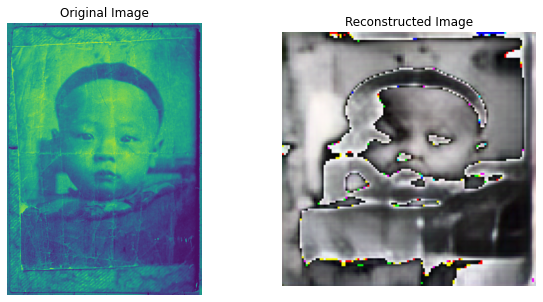

In [14]:
encoder = VAE_Encoder()
decoder = VAE_Decoder()

# Create VAE_NET instance
model = VAE_NET(encoder, decoder)


model.load_state_dict(torch.load('texture_removel_model.pth'))

image_path = 'old_image.jpg'
image = Image.open(image_path)

# Define transformations if needed (e.g., resizing, normalization)
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.Grayscale(num_output_channels=3),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Convert to tensor

])

# Apply transformations and move to device
input_image = transform(image).unsqueeze(0).to('cpu') 

# Set the model to evaluation mode
model.eval()

# Forward pass to get the reconstructed image
with torch.no_grad():
    reconstructed_image, _, _ = model(input_image)

# Convert the tensor back to a PIL image for visualization
reconstructed_image = reconstructed_image.squeeze(0).cpu()  # Move to CPU and remove batch dimension
reconstructed_image = transforms.ToPILImage()(reconstructed_image)

# Display the original and reconstructed images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Reconstructed Image')
plt.imshow(reconstructed_image)
plt.axis('off')

plt.show()